In [1]:
import pandas as pd
import numpy as np
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os
from make_plot_dir import plots_dir
from make_model_dir import model_dir
import json
from make_json_dir import json_dir
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.utils.class_weight import compute_class_weight
from lassonet import LassoNetClassifier
from itertools import product
from functools import partial
from model_objects import LOWOCV, FeatureSelectorNN

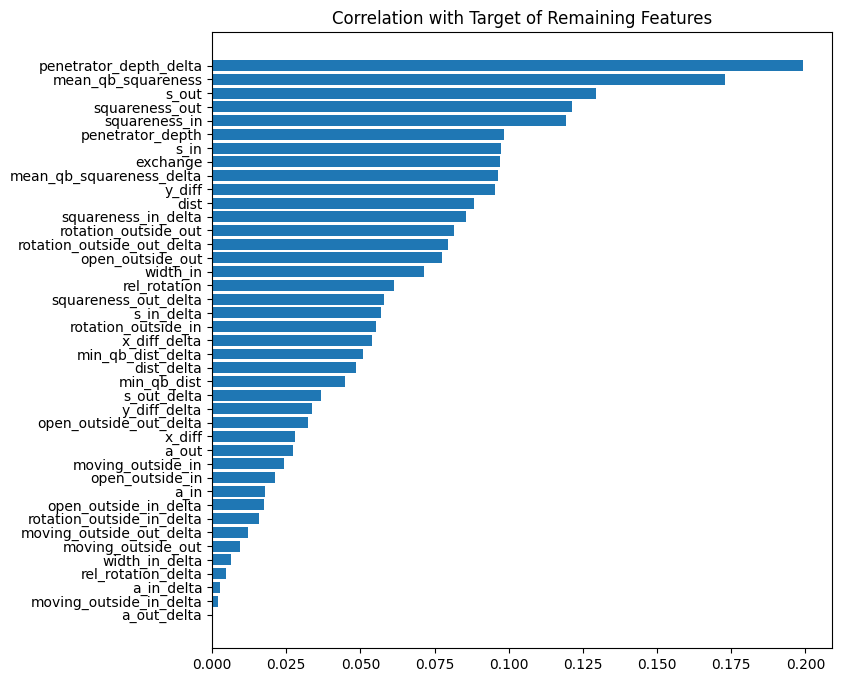

In [2]:
%run rush-win-predictor-2v2-feature-selection-general.ipynb

In [3]:
pro_frames_merge_trunc['stunt_type'] = pro_frames_merge_trunc['stunt_type'].astype('object')
stunt_dummies = pd.get_dummies(pro_frames_merge_trunc['stunt_type'])
pro_frames_merge_trunc = pd.concat((pro_frames_merge_trunc,stunt_dummies), axis = 1)
features2.extend(stunt_dummies.columns.tolist())
features2.remove('stunt_type')
features2

['width_in',
 's_in',
 's_out',
 'a_in',
 'a_out',
 'squareness_in',
 'squareness_out',
 'open_outside_in',
 'open_outside_out',
 'moving_outside_in',
 'moving_outside_out',
 'rotation_outside_in',
 'rotation_outside_out',
 'x_diff',
 'y_diff',
 'dist',
 'min_qb_dist',
 'rel_rotation',
 'penetrator_depth',
 'mean_qb_squareness',
 'exchange',
 'width_in_delta',
 's_in_delta',
 's_out_delta',
 'a_in_delta',
 'a_out_delta',
 'squareness_in_delta',
 'squareness_out_delta',
 'open_outside_in_delta',
 'open_outside_out_delta',
 'moving_outside_in_delta',
 'moving_outside_out_delta',
 'rotation_outside_in_delta',
 'rotation_outside_out_delta',
 'x_diff_delta',
 'y_diff_delta',
 'dist_delta',
 'min_qb_dist_delta',
 'rel_rotation_delta',
 'penetrator_depth_delta',
 'mean_qb_squareness_delta',
 'ET',
 'TE',
 'TT']

In [4]:
pro_frames_merge_trunc[features2].dtypes

width_in                      float64
s_in                          float64
s_out                         float64
a_in                          float64
a_out                         float64
squareness_in                 float64
squareness_out                float64
open_outside_in               float64
open_outside_out              float64
moving_outside_in             float64
moving_outside_out            float64
rotation_outside_in           float64
rotation_outside_out          float64
x_diff                        float64
y_diff                        float64
dist                          float64
min_qb_dist                   float64
rel_rotation                  float64
penetrator_depth              float64
mean_qb_squareness            float64
exchange                        int64
width_in_delta                float64
s_in_delta                    float64
s_out_delta                   float64
a_in_delta                    float64
a_out_delta                   float64
squareness_i

In [5]:
class StuntDataset(Dataset):
    def __init__(self, data):
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        features, label = self.data[idx]
        label_tensor = torch.tensor(label).long()
        data_tensor = torch.Tensor(features)    
        return data_tensor, label_tensor

class FNNModel(torch.nn.Module):
    def __init__(self, n_features, n_classes, n_hidden, n_layers, dropout = 0.0):
        super().__init__()
        self.inp = nn.Linear(n_features, n_hidden)
        self.dropout = nn.Dropout(dropout)
        if n_layers > 1:
            self.layers = nn.ModuleList([nn.Linear(n_hidden, n_hidden) for n in range(n_layers - 1)])
        else:
            self.layers = []
        self.classifier = nn.Linear(n_hidden, n_classes)
    def forward(self, x):
        out = F.relu(self.inp(x))
        for theta in self.layers:
            out = self.dropout(out)
            out = F.relu(theta(out))
        return self.classifier(out)
    def get_probabilities(self, x):
        output = self.forward(x)
        time_prob = torch.nn.functional.softmax(output, dim = 1).detach().cpu().numpy().tolist()
        time_prob_win = [x[1] for x in time_prob]
        return time_prob_win

def train_model(data_loader, model, loss_function, optimizer):
    num_batches = len(data_loader)
    total_loss = 0
    model.train()  
    probs = []
    labels = []
    for X, y in data_loader:
        output = model(X)
        probs.extend(model.get_probabilities(X))
        labels.extend(y.numpy())
        loss = loss_function(output, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_loss = total_loss / num_batches
    train_auc = roc_auc_score(labels, probs)
    print(f"Overall Train loss: {avg_loss} , Overall Train AUC: {train_auc}")
    return model

def test_model(data_loader, model, loss_function):  
    num_batches = len(data_loader)
    total_loss = 0
    model.eval()  
    with torch.no_grad():
        probs = []
        labels = []
        for X, y in data_loader:
            output = model(X)
            probs.extend(model.get_probabilities(X))
            labels.extend(y.numpy())
            total_loss += loss_function(output, y).item()
    avg_loss = total_loss / num_batches
    test_auc = roc_auc_score(labels, probs)
    print(f"Overall test loss: {avg_loss} , Overall test AUC: {test_auc}")
    return avg_loss, test_auc

        
class LOWOCVNN(LOWOCV):
    def __init__(self, data, features, target_col, num_weeks, model):
        self.data = data
        self.features = features
        self.target_col = target_col
        self.num_weeks = num_weeks
        self.model = model
        self.probs = []
        self.preds = []
        self.train_aucs = []
    def run_cv(self, scaler, loss_function, optimizer, model_params = {}, eval_metric = 'loss',
               state_dict_fname = 'fnn_state_dict.pt', batch_size = 2056, num_epochs = 0, threshold = 0.001, patience = 10):
        self.clear_outputs()
        if isinstance(self.model, partial):
            model = self.model(**model_params)
            optimizer = optimizer(model.parameters())
        else:
            model = self.model
        base_model_path = os.path.join('state_dicts', state_dict_fname)
        torch.save(model.state_dict(), base_model_path)
        base_state_dict = torch.load(base_model_path)
        for week in range(1,num_weeks+1):
            print(f'FITTING FOR HOLDOUT WEEK {week}')
            model.load_state_dict(base_state_dict)
            X_train, X_test, y_train, y_test = self.train_test_split_towo(holdout_week = week)
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            train_dataset = StuntDataset(list(zip(X_train_scaled, y_train)))
            train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
            test_dataset = StuntDataset(list(zip(X_test_scaled, y_test)))
            test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle = True)
            improvement_index = 0
            ix_epoch = 0
            best_fname = 'best_' + state_dict_fname[:-3] + str(week) + '.pt'
            best_model_path = os.path.join('state_dicts', best_fname)
            while True:
                print(f"Epoch {ix_epoch}\n---------")
                model = train_model(train_loader, model, loss_function, optimizer)
                avg_loss, test_auc = test_model(test_loader, model, loss_function)
                new_benchmark = False
                if eval_metric == 'loss':
                    if ix_epoch == 0:
                        best_eval_score = avg_loss
                    else:
                        new_benchmark = avg_loss < best_eval_score * (1.0-threshold)
                        if new_benchmark:
                            best_eval_score = avg_loss
                elif eval_metric == 'auc':
                    if ix_epoch == 0:
                        best_eval_score = test_auc
                    else:
                        new_benchmark = test_auc > best_eval_score * (1.0+threshold)
                        if new_benchmark:
                            best_eval_score = test_auc 
                if ix_epoch == 0 or new_benchmark:
                    torch.save(model.state_dict(), best_model_path)
                    improvement_index = 0
                else:
                    improvement_index += 1
                ix_epoch += 1
                print()
                if num_epochs == 0 and improvement_index == 10:
                    break
                elif ix_epoch == num_epochs:
                    break
            self.infer_best_model(model, best_model_path, X_train_scaled, X_test_scaled, y_train)   
            
    def clear_outputs(self):
        self.probs = []
        self.preds = []
        self.train_aucs = []
        
    def infer_best_model(self, model, best_model_path, X_train_scaled, X_test_scaled, y_train):
        best_state = torch.load(best_model_path)
        model.load_state_dict(best_state)
        model.eval()
        train_probs = model.get_probabilities(torch.Tensor(X_train_scaled))
        test_probs = model.get_probabilities(torch.Tensor(X_test_scaled)) 
        self.probs.extend(test_probs)
        self.preds.extend(np.where(np.array(test_probs) >= 0.5, 1, 0))
        self.train_aucs.append(roc_auc_score(y_train, train_probs))  
        
    def infer_saved_models(self, saved_model_names, scaler, model):
        self.clear_outputs()
        for week in range(1,self.num_weeks+1):
            X_train, X_test, y_train, y_test = self.train_test_split_towo(holdout_week = week)
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            self.infer_best_model(model = model,
                                 best_model_path = saved_model_names[week-1],
                                 X_train_scaled = X_train_scaled,
                                 X_test_scaled = X_test_scaled,
                                 y_train = y_train
                                 )

In [6]:
torch.manual_seed(0)
model = FNNModel(n_features = len(features2),
                 n_classes = 2,
                 n_hidden = 15,
                 n_layers = 1
                  )
weight = compute_class_weight(class_weight = 'balanced', classes = y.unique(),
                               y = y.values)
loss_function = torch.nn.CrossEntropyLoss(weight = torch.Tensor((weight[1], weight[0])))
optimizer = torch.optim.Adam(model.parameters(), lr= 0.01)
scaler = StandardScaler()
fnncv = LOWOCVNN(data = pro_frames_merge_trunc,
                 features = features2,
                 target_col = 'rush_win',
                 num_weeks = num_weeks,
                 model = model)

In [309]:
fnncv.run_cv(scaler = scaler,
             loss_function = loss_function,
             optimizer = optimizer
            )

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6624542420560663 , Overall Train AUC: 0.6207241529584806
Overall test loss: 0.6155059039592743 , Overall test AUC: 0.7263177061876904

Epoch 1
---------
Overall Train loss: 0.6479808959093961 , Overall Train AUC: 0.6802325053698053
Overall test loss: 0.614845871925354 , Overall test AUC: 0.7280118645464283

Epoch 2
---------
Overall Train loss: 0.6383545832200483 , Overall Train AUC: 0.6868331028459913
Overall test loss: 0.6136898994445801 , Overall test AUC: 0.7272500617945126

Epoch 3
---------
Overall Train loss: 0.6554187752983787 , Overall Train AUC: 0.6900932756441778
Overall test loss: 0.6109871566295624 , Overall test AUC: 0.7306451347120375

Epoch 4
---------
Overall Train loss: 0.6644385836341165 , Overall Train AUC: 0.6926761064457063
Overall test loss: 0.6208462417125702 , Overall test AUC: 0.7293708494685672

Epoch 5
---------
Overall Train loss: 0.6203262318264354 , Overall Train AUC: 0.6947917503239864
Ov

Overall Train loss: 0.5805292725563049 , Overall Train AUC: 0.7608631566029221
Overall test loss: 0.6490983068943024 , Overall test AUC: 0.6775188186218452

Epoch 15
---------
Overall Train loss: 0.576440843668851 , Overall Train AUC: 0.7635211237807691
Overall test loss: 0.6465525925159454 , Overall test AUC: 0.6805633666388181

Epoch 16
---------
Overall Train loss: 0.5741739598187533 , Overall Train AUC: 0.7662928939134354
Overall test loss: 0.6536167860031128 , Overall test AUC: 0.6752974091698012

Epoch 17
---------
Overall Train loss: 0.5694907307624817 , Overall Train AUC: 0.771114662373319
Overall test loss: 0.6572736501693726 , Overall test AUC: 0.6721553704833325

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6830714344978333 , Overall Train AUC: 0.5842213931545861
Overall test loss: 0.6778689324855804 , Overall test AUC: 0.6099994704137833

Epoch 1
---------
Overall Train loss: 0.6486511886119842 , Overall Train AUC: 0.6666594451253947
Overall test loss:

Overall Train loss: 0.580606839873574 , Overall Train AUC: 0.7629839536184411
Overall test loss: 0.6372456252574921 , Overall test AUC: 0.6699814963951526

Epoch 13
---------
Overall Train loss: 0.5746654217893427 , Overall Train AUC: 0.7650238661640656
Overall test loss: 0.645270049571991 , Overall test AUC: 0.6638091540113514

Epoch 14
---------
Overall Train loss: 0.5637007680806246 , Overall Train AUC: 0.7695185943217681
Overall test loss: 0.6373102962970734 , Overall test AUC: 0.6650032597024084

Epoch 15
---------
Overall Train loss: 0.5651826425032183 , Overall Train AUC: 0.7726013630895613
Overall test loss: 0.6437731981277466 , Overall test AUC: 0.6588011965025311

Epoch 16
---------
Overall Train loss: 0.565993915904652 , Overall Train AUC: 0.7743198326217262
Overall test loss: 0.6465893685817719 , Overall test AUC: 0.6606697729713146

Epoch 17
---------
Overall Train loss: 0.562689954584295 , Overall Train AUC: 0.7777466775123971
Overall test loss: 0.6456406116485596 , Overa

In [310]:
fnncv.get_auc(), fnncv.get_avg_train_auc(), fnncv.get_f1()

(0.6811964851073373, 0.7214593433241803, 0.5210227880603402)

In [242]:
fnncv.get_scores_by_frame('frame_from_overlap')

,count,pred,prob,f1_score,auc_score
frame_from_overlap,,,,,
-22,36,0.277778,0.432664,0.100000,0.373077
-21,93,0.268817,0.446091,0.370370,0.619612
-20,157,0.312102,0.444036,0.346939,0.587302
-19,232,0.323276,0.444862,0.386207,0.602469
-18,329,0.358663,0.449802,0.415929,0.605623
-17,440,0.350000,0.451112,0.422078,0.568613
-16,567,0.388007,0.460103,0.415274,0.560916
-15,664,0.402108,0.470997,0.425963,0.563866
-14,754,0.417772,0.474985,0.415358,0.553334


In [3]:
class LOWOCVLN(LOWOCV):
    def __init__(self, data, features, target_col, num_weeks, model):
        self.data = data
        self.features = features
        self.target_col = target_col
        self.num_weeks = num_weeks
        self.model = model
        self.prob_matrix = []
        self.best_lambda = 0.0
        self.probs = []
        self.preds = []
        self.feature_importances = []
    def run_cv(self, scaler):
        self.probs = []
        self.preds = []
        model = self.model
        for week in range(1,num_weeks+1):
            print(f'FITTING FOR HOLDOUT WEEK {week}')
            X_train, X_test, y_train, y_test = self.train_test_split_towo(holdout_week = week)
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            path = model.path(X_train_scaled, 
                              y_train,
                              X_val = X_test_scaled,
                              y_val = y_test)
            self.feature_importances.append(model.feature_importances_.numpy())
            path_probs = []
            for save in path:
                model.load(save.state_dict)
                path_probs.append(model.predict_proba(X_test_scaled)[:,1])
            self.prob_matrix.append(path_probs)
        min_max_lambda = min([len(matrix) for matrix in self.prob_matrix])
        lambdas = [lambda_ for lambda_ in self.model.lambda_seq if lambda_ < min_max_lambda]
        lambda_probs = []
        for i in range(len(lambdas)):
            probs_this_lambda = []
            for matrix in self.prob_matrix:        
                probs_this_lambda.extend(matrix[i])
            lambda_probs.append(probs_this_lambda)
        auc_scores = [roc_auc_score(y,probs_this_lambda) for probs_this_lambda in lambda_probs]
        best_index = auc_scores.index(max(auc_scores))
        self.best_lambda = lambdas[best_index]
        self.probs = lambda_probs[best_index]
        self.preds = np.where(np.array(self.probs) >= 0.5, 1, 0)
    def get_top_n_features(self,n,return_scores = False):
        top_feature_importances_sorted = self.get_feature_importances_df().mean().sort_values(ascending = False)
        if not return_scores:
            return top_feature_importances_sorted.index[:n].tolist()
        else:
            return top_feature_importances_sorted[:n]
    def get_avg_test_auc():
        print('Run model.path with lambda_ = self.best_model to access train aucs')

In [4]:
lambda_seq = np.arange(0.0,130.0)
scaler = StandardScaler()

In [10]:
model = LassoNetClassifier(hidden_dims = (15,),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           verbose=True)
lncv = LOWOCVLN(data = pro_frames_merge_trunc,
                features = features2,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model)
lncv.run_cv(scaler = scaler)

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.6865702003740551
epoch: 1
loss: 0.6419190961196422
epoch: 2
loss: 0.6283283162922747
epoch: 3
loss: 0.6191412666491456
epoch: 4
loss: 0.611664341176017
epoch: 5
loss: 0.6048733043230103
epoch: 6
loss: 0.5970826784074089
epoch: 7
loss: 0.592025214449611
epoch: 8
loss: 0.5853763775787242
epoch: 9
loss: 0.5796871328597343
epoch: 10
loss: 0.5744097454832501
epoch: 11
loss: 0.5696910634633255
epoch: 12
loss: 0.5672934596161178
epoch: 13
loss: 0.563300555864738
epoch: 14
loss: 0.563113561964603
epoch: 15
loss: 0.5568604811768795
epoch: 16
loss: 0.5539174546182171
epoch: 17
loss: 0.5510846758016321
epoch: 18
loss: 0.5474235283090862
epoch: 19
loss: 0.5455694224113912
epoch: 20
loss: 0.5456069940028617
epoch: 21
loss: 0.5431529106086344
epoch: 22
loss: 0.5408946106621102
epoch: 23
loss: 0.5399827919358787
epoch: 24
loss: 0.537047887515071
epoch: 25
loss: 0.5373180335147115
epoch: 26
loss: 0.5369309358807801
epoch: 27
loss: 0.531391399503189
epoch: 28

epoch: 72
loss: 0.4987877020313014
epoch: 73
loss: 0.49869953244091275
epoch: 74
loss: 0.4986172861117329
epoch: 75
loss: 0.49923603748596995
epoch: 76
loss: 0.49740111663803527
epoch: 77
loss: 0.4974506807477985
epoch: 78
loss: 0.4983023491735851
epoch: 79
loss: 0.500142883413933
epoch: 80
loss: 0.4999995839934902
epoch: 81
loss: 0.4998726957011855
epoch: 82
loss: 0.49648425062584406
epoch: 83
loss: 0.49697471929819603
epoch: 84
loss: 0.4955366778078086
epoch: 85
loss: 0.49518186909828393
epoch: 86
loss: 0.4968556253979045
epoch: 87
loss: 0.4971871552141571
epoch: 88
loss: 0.49620713853731724
epoch: 89
loss: 0.4970093262795547
epoch: 90
loss: 0.49777724670430556
epoch: 91
loss: 0.4972776815950972
epoch: 92
loss: 0.4974604863074757
epoch: 93
loss: 0.49737619603604777
epoch: 94
loss: 0.5001112559402247
epoch: 95
loss: 0.4991637754869264
epoch: 96
loss: 0.49823639479223725
epoch: 97
loss: 0.49741697357775033
epoch: 98
loss: 0.49828242222641955
epoch: 99
loss: 0.4987878271706227
epoch: 0


epoch: 7
loss: 0.5154817344207355
epoch: 8
loss: 0.5155209209053527
epoch: 9
loss: 0.5161259188722759
epoch: 10
loss: 0.5177415002850236
epoch: 11
loss: 0.5216381718983131
epoch: 12
loss: 0.5184451467707417
epoch: 13
loss: 0.519506867506369
epoch: 14
loss: 0.5170785240787327
epoch: 15
loss: 0.517347895406384
epoch: 16
loss: 0.5169405490384611
epoch: 17
loss: 0.5176905447451877
epoch: 18
loss: 0.5194176372112568
epoch: 19
loss: 0.5189328802550706
epoch: 20
loss: 0.521299675993174
epoch: 21
loss: 0.5188547337284176
epoch: 22
loss: 0.5208513762925971
epoch: 23
loss: 0.5229300268253445
epoch: 24
loss: 0.5218445921883281
epoch: 25
loss: 0.5184045509790058
epoch: 26
loss: 0.5201420895988971
epoch: 27
loss: 0.5213010525257084
epoch: 28
loss: 0.5180384380174559
epoch: 29
loss: 0.5181588697166822
epoch: 30
loss: 0.5198398900559543
epoch: 31
loss: 0.5236915532266777
epoch: 32
loss: 0.5231962398748864
epoch: 33
loss: 0.5200293360908855
epoch: 34
loss: 0.5191314137883353
epoch: 35
loss: 0.52050782

epoch: 23
loss: 0.532439328097903
epoch: 24
loss: 0.5353193738238528
epoch: 25
loss: 0.5344024482215085
epoch: 26
loss: 0.5355632822791242
epoch: 27
loss: 0.535210830360151
epoch: 28
loss: 0.5347674557857203
epoch: 29
loss: 0.5348993228353087
epoch: 30
loss: 0.533523129964727
epoch: 31
loss: 0.5414355760301199
epoch: 32
loss: 0.5389168373198803
epoch: 33
loss: 0.5353032844825409
epoch: 34
loss: 0.533100027960349
epoch: 35
loss: 0.5347816322831206
epoch: 36
loss: 0.5328544092676862
epoch: 37
loss: 0.537091388326766
epoch: 38
loss: 0.5331970645655051
epoch: 39
loss: 0.5389774285874575
epoch: 40
loss: 0.5324812616885737
epoch: 41
loss: 0.5309875034051251
epoch: 42
loss: 0.5363550685601544
epoch: 43
loss: 0.5359248395734769
epoch: 44
loss: 0.537053238710811
epoch: 45
loss: 0.5418560143546586
epoch: 46
loss: 0.5417883795309959
epoch: 47
loss: 0.5336295639370121
epoch: 48
loss: 0.5364873765768752
epoch: 49
loss: 0.5376728749988202
epoch: 50
loss: 0.5360143618603387
epoch: 51
loss: 0.53692968

epoch: 0
loss: 0.5631562881043088
epoch: 1
loss: 0.5632028697269142
epoch: 2
loss: 0.5631378807060451
epoch: 3
loss: 0.5676663628756029
epoch: 4
loss: 0.5654317917280061
epoch: 5
loss: 0.5682938054736559
epoch: 6
loss: 0.5676649923020838
epoch: 7
loss: 0.563959253498043
epoch: 8
loss: 0.5651554960245754
epoch: 9
loss: 0.5707127008825331
epoch: 10
loss: 0.5671768655227449
epoch: 11
loss: 0.5639833577149344
epoch: 12
loss: 0.5672193652198693
epoch: 0
loss: 0.5665134066362147
epoch: 1
loss: 0.5689220048666522
epoch: 2
loss: 0.568194867942619
epoch: 3
loss: 0.5717948044299964
epoch: 4
loss: 0.573282597739129
epoch: 5
loss: 0.5677130934735907
epoch: 6
loss: 0.5677257980942118
epoch: 7
loss: 0.5678509374155256
epoch: 8
loss: 0.5706264202999947
epoch: 9
loss: 0.5706288694552833
epoch: 10
loss: 0.5739299076941944
epoch: 11
loss: 0.5719004220171854
epoch: 12
loss: 0.568923345645095
epoch: 13
loss: 0.5709588499275577
epoch: 14
loss: 0.5713725486057911
epoch: 0
loss: 0.5717845847187557
epoch: 1
l

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5817181321266298
epoch: 2
loss: 0.5806980559694311
epoch: 3
loss: 0.5776938660777227
epoch: 4
loss: 0.5780834545800496
epoch: 5
loss: 0.5785728565886628
epoch: 6
loss: 0.5825216815038634
epoch: 7
loss: 0.5811688420142451
epoch: 8
loss: 0.5817397275980795
epoch: 9
loss: 0.5795997975314878
epoch: 10
loss: 0.579349602315074
epoch: 11
loss: 0.5838142932258381
epoch: 12
loss: 0.5812191361033827
epoch: 13
loss: 0.5783747193299156
epoch: 0
loss: 0.5831086266339333
epoch: 1
loss: 0.5809436806211093
epoch: 2
loss: 0.5797461688243181
epoch: 3
loss: 0.5790137164586366
epoch: 4
loss: 0.5799275850861316
epoch: 5
loss: 0.5837794687404211
epoch: 6
loss: 0.5817591182338678
epoch: 7
loss: 0.5799406234116095
epoch: 8
loss: 0.5786310702091348
epoch: 9
loss: 0.5796938129158864
epoch: 10
loss: 0.5791786917972356
epoch: 11
loss: 0.5815661831954783
epoch: 12
loss: 0.584670663314697
epoch: 13
loss: 0.581272695732905
epoch: 14
loss: 0.5805550872743376
epoch: 15
loss: 0.5803815607487822
epoch: 

epoch: 15
loss: 0.6115395057644835
epoch: 16
loss: 0.6143566183298428
epoch: 17
loss: 0.6140306840289576
epoch: 0
loss: 0.6137850712953099
epoch: 1
loss: 0.6208424820912717
epoch: 2
loss: 0.6161107259917775
epoch: 3
loss: 0.6159844544575563
epoch: 4
loss: 0.6150331274598816
epoch: 5
loss: 0.6126748173595664
epoch: 6
loss: 0.6167370840490459
epoch: 7
loss: 0.6121770190983946
epoch: 8
loss: 0.6129414832942711
epoch: 9
loss: 0.6107352293873831
epoch: 10
loss: 0.6152947461086266
epoch: 11
loss: 0.6101041696670424
epoch: 12
loss: 0.6163256378785961
epoch: 13
loss: 0.614125944847554
epoch: 0
loss: 0.6191275370778928
epoch: 1
loss: 0.6149047762293205
epoch: 2
loss: 0.6116042504657251
epoch: 3
loss: 0.616644629926656
epoch: 4
loss: 0.6133339619190189
epoch: 5
loss: 0.6139272951134909
epoch: 6
loss: 0.6123262566775844
epoch: 7
loss: 0.6151242229267827
epoch: 8
loss: 0.6170422809766849
epoch: 9
loss: 0.6152768571446942
epoch: 10
loss: 0.6208244679880176
epoch: 11
loss: 0.6254020822387295
epoch: 

epoch: 17
loss: 0.6554142933415867
epoch: 18
loss: 0.6569812462099734
epoch: 19
loss: 0.6547236196321784
epoch: 20
loss: 0.6605338919519248
epoch: 21
loss: 0.6565692756461773
epoch: 22
loss: 0.6552614326810942
epoch: 23
loss: 0.6596274303804487
epoch: 0
loss: 0.6579281277822341
epoch: 1
loss: 0.6600577249162944
epoch: 2
loss: 0.6595058962633915
epoch: 3
loss: 0.6547420568255187
epoch: 4
loss: 0.660785880831944
epoch: 5
loss: 0.6553727947590329
epoch: 6
loss: 0.6570140446301883
epoch: 7
loss: 0.6591884178052179
epoch: 8
loss: 0.658459362078258
epoch: 9
loss: 0.6606593471010497
epoch: 10
loss: 0.6554751587238677
epoch: 11
loss: 0.6573960413470222
epoch: 12
loss: 0.6569551636000026
epoch: 13
loss: 0.659339919810222
epoch: 0
loss: 0.6583053453687968
epoch: 1
loss: 0.6563417664010132
epoch: 2
loss: 0.655749541583387
epoch: 3
loss: 0.65942896537586
epoch: 4
loss: 0.6578960682799164
epoch: 5
loss: 0.6554959020561295
epoch: 6
loss: 0.6558585140961902
epoch: 7
loss: 0.6573848622343182
epoch: 8


epoch: 0
loss: 0.6686155442567802
epoch: 1
loss: 0.6663169136947011
epoch: 2
loss: 0.6672179585212691
epoch: 3
loss: 0.6663802401503014
epoch: 4
loss: 0.6662631395406281
epoch: 5
loss: 0.668490518156757
epoch: 6
loss: 0.6658846228887297
epoch: 7
loss: 0.6659442547548434
epoch: 8
loss: 0.6703715528445958
epoch: 9
loss: 0.6669578117493032
epoch: 10
loss: 0.6695588325428146
epoch: 0
loss: 0.6689450658848766
epoch: 1
loss: 0.6677734996407043
epoch: 2
loss: 0.665167979790641
epoch: 3
loss: 0.6673922239647218
epoch: 4
loss: 0.6687252914415726
epoch: 5
loss: 0.6681086346612137
epoch: 6
loss: 0.6689216052416378
epoch: 7
loss: 0.6742517358625483
epoch: 8
loss: 0.667939321159476
epoch: 9
loss: 0.6726460911078143
epoch: 0
loss: 0.6746889428561428
epoch: 1
loss: 0.6697676066438734
epoch: 2
loss: 0.6720189285834803
epoch: 3
loss: 0.6667810196833631
epoch: 4
loss: 0.6676882142137213
epoch: 5
loss: 0.6686793712696657
epoch: 6
loss: 0.6681150167666009
epoch: 7
loss: 0.6745636426414158
epoch: 8
loss: 0

epoch: 12
loss: 0.5367757883962839
epoch: 13
loss: 0.5319287912037703
epoch: 14
loss: 0.5305777241209714
epoch: 15
loss: 0.5279963757861312
epoch: 16
loss: 0.5246422092669001
epoch: 17
loss: 0.5217133109381081
epoch: 18
loss: 0.5189269270184336
epoch: 19
loss: 0.5155198701249097
epoch: 20
loss: 0.5151894365377093
epoch: 21
loss: 0.5135360943891076
epoch: 22
loss: 0.510186720689577
epoch: 23
loss: 0.5078604643969152
epoch: 24
loss: 0.5076754242978044
epoch: 25
loss: 0.5085991626728606
epoch: 26
loss: 0.5045540002645742
epoch: 27
loss: 0.5017376400520729
epoch: 28
loss: 0.502633152162697
epoch: 29
loss: 0.49841339901839266
epoch: 30
loss: 0.4977988850154423
epoch: 31
loss: 0.4986280371783868
epoch: 32
loss: 0.4978893445476942
epoch: 33
loss: 0.49675383580111
epoch: 34
loss: 0.49575780996284324
epoch: 35
loss: 0.49237823416037035
epoch: 36
loss: 0.4931619730864701
epoch: 37
loss: 0.49174145245740974
epoch: 38
loss: 0.4938449668295589
epoch: 39
loss: 0.49224173759082984
epoch: 40
loss: 0.4

epoch: 90
loss: 0.46653322489722476
epoch: 91
loss: 0.46619685250398796
epoch: 92
loss: 0.4650334166913747
epoch: 93
loss: 0.4672791011122153
epoch: 94
loss: 0.4667696339749754
epoch: 95
loss: 0.46335900645900086
epoch: 96
loss: 0.46504996857283765
epoch: 97
loss: 0.46366100773003877
epoch: 98
loss: 0.46675188529990047
epoch: 99
loss: 0.4663266086415821
epoch: 0
loss: 0.46393693922324714
epoch: 1
loss: 0.46465655936706296
epoch: 2
loss: 0.4649160829327571
epoch: 3
loss: 0.4640565395508987
epoch: 4
loss: 0.4651365102995863
epoch: 5
loss: 0.4671321269533176
epoch: 6
loss: 0.4670105536097823
epoch: 7
loss: 0.4657552864684658
epoch: 8
loss: 0.46587836709452174
epoch: 9
loss: 0.46815606292185474
epoch: 10
loss: 0.4700788275870869
epoch: 11
loss: 0.4660787171194605
epoch: 12
loss: 0.46622671306913066
epoch: 13
loss: 0.4668429912136079
epoch: 14
loss: 0.46467163501489617
epoch: 15
loss: 0.4669361181278486
epoch: 16
loss: 0.4659759904526864
epoch: 17
loss: 0.4671233796339701
epoch: 18
loss: 0.

epoch: 24
loss: 0.4762515672579509
epoch: 25
loss: 0.47866866413743453
epoch: 26
loss: 0.4812552399764475
epoch: 27
loss: 0.4791032893345329
epoch: 28
loss: 0.48295942044991785
epoch: 29
loss: 0.4827581558940115
epoch: 30
loss: 0.4816192769314541
epoch: 31
loss: 0.48429261183945194
epoch: 32
loss: 0.48571571234908134
epoch: 33
loss: 0.4825623869917901
epoch: 34
loss: 0.48351980212294027
epoch: 35
loss: 0.4838245300511223
epoch: 36
loss: 0.4805941357014257
epoch: 37
loss: 0.4825993803339548
epoch: 38
loss: 0.48459147717251133
epoch: 39
loss: 0.4869553647209141
epoch: 40
loss: 0.48389388480545825
epoch: 41
loss: 0.4814691498988194
epoch: 42
loss: 0.48377472763015833
epoch: 43
loss: 0.4816742447588091
epoch: 44
loss: 0.4803900936810993
epoch: 45
loss: 0.4799403250931332
epoch: 46
loss: 0.4801165840013791
epoch: 47
loss: 0.4835474497489515
epoch: 48
loss: 0.4822948189407329
epoch: 49
loss: 0.4856313976745964
epoch: 50
loss: 0.48185341097229156
epoch: 51
loss: 0.4810411917453799
epoch: 52
l

epoch: 12
loss: 0.500535511676176
epoch: 13
loss: 0.5003569918441491
epoch: 14
loss: 0.5023621066358619
epoch: 15
loss: 0.5028324239443344
epoch: 16
loss: 0.5081108934602092
epoch: 17
loss: 0.5100214051040514
epoch: 18
loss: 0.5013019902415756
epoch: 19
loss: 0.5039759094332471
epoch: 20
loss: 0.5114816626681793
epoch: 21
loss: 0.5040763046105791
epoch: 22
loss: 0.5044309337516505
epoch: 23
loss: 0.5014909876629597
epoch: 24
loss: 0.5013513974948376
epoch: 25
loss: 0.507456523971881
epoch: 26
loss: 0.5095339657435745
epoch: 27
loss: 0.5064539835117834
epoch: 28
loss: 0.5063829775209779
epoch: 29
loss: 0.5033037461078208
epoch: 30
loss: 0.5034291949174626
epoch: 31
loss: 0.5044824128127217
epoch: 32
loss: 0.5043501219565816
epoch: 33
loss: 0.5018259092262047
epoch: 34
loss: 0.5070694797887357
epoch: 35
loss: 0.5013368270971377
epoch: 36
loss: 0.5004699759354178
epoch: 37
loss: 0.5051989986331111
epoch: 38
loss: 0.5044167133596296
epoch: 39
loss: 0.5067792912093627
epoch: 40
loss: 0.5036

epoch: 6
loss: 0.5362105518057793
epoch: 7
loss: 0.5378966251306163
epoch: 8
loss: 0.5352733212763243
epoch: 9
loss: 0.5345845947789294
epoch: 10
loss: 0.5383532978628625
epoch: 11
loss: 0.5427595419362695
epoch: 12
loss: 0.5362071194920242
epoch: 13
loss: 0.5395817444077157
epoch: 0
loss: 0.5366832118941997
epoch: 1
loss: 0.5375863620319792
epoch: 2
loss: 0.5365459983775426
epoch: 3
loss: 0.5383942485273006
epoch: 4
loss: 0.5379434355675504
epoch: 5
loss: 0.5367516041329184
epoch: 6
loss: 0.5420896988097795
epoch: 7
loss: 0.5373591349580483
epoch: 8
loss: 0.543666621170058
epoch: 9
loss: 0.5392129626176579
epoch: 10
loss: 0.5365956935387017
epoch: 11
loss: 0.5355166090947172
epoch: 12
loss: 0.5407753540970068
epoch: 13
loss: 0.5367815296184694
epoch: 14
loss: 0.5374080115575388
epoch: 15
loss: 0.5350135041574802
epoch: 16
loss: 0.5395939607349618
epoch: 17
loss: 0.5369847982391504
epoch: 0
loss: 0.5383365201712841
epoch: 1
loss: 0.5381097447175841
epoch: 2
loss: 0.5405256476260821
epo

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5448011363521342
epoch: 2
loss: 0.5429780696755024
epoch: 3
loss: 0.5399929559184676
epoch: 4
loss: 0.5393649892778889
epoch: 5
loss: 0.5424023893671579
epoch: 6
loss: 0.5425539813429167
epoch: 7
loss: 0.5477990874142328
epoch: 8
loss: 0.5481110102172185
epoch: 9
loss: 0.5458518590456174
epoch: 10
loss: 0.5408302316003155
epoch: 11
loss: 0.5427682751424848
epoch: 12
loss: 0.5416578877712451
epoch: 13
loss: 0.5420043708124015
epoch: 14
loss: 0.5432016555613217
epoch: 0
loss: 0.543350142647993
epoch: 1
loss: 0.5412126128045767
epoch: 2
loss: 0.5421989570341431
epoch: 3
loss: 0.544304800073108
epoch: 4
loss: 0.5450879321345224
epoch: 5
loss: 0.5442709285557896
epoch: 6
loss: 0.5454443113039887
epoch: 7
loss: 0.5487438261300266
epoch: 8
loss: 0.5431633468752346
epoch: 9
loss: 0.5418473255223545
epoch: 10
loss: 0.542827059160791
epoch: 11
loss: 0.5455454403641959
epoch: 12
loss: 0.5439353916599801
epoch: 13
loss: 0.5476088028751905
epoch: 14
loss: 0.543689032824017
epoch: 1

epoch: 2
loss: 0.5745625652088653
epoch: 3
loss: 0.5749894422963768
epoch: 4
loss: 0.575412875779628
epoch: 5
loss: 0.5738540859716208
epoch: 6
loss: 0.571835501606521
epoch: 7
loss: 0.5706221053058631
epoch: 8
loss: 0.5756179847527501
epoch: 9
loss: 0.5722566148908358
epoch: 10
loss: 0.5713850499429557
epoch: 11
loss: 0.5759337350371927
epoch: 12
loss: 0.5741729298546452
epoch: 13
loss: 0.5739154159989788
epoch: 14
loss: 0.5765014668294732
epoch: 15
loss: 0.5739386970218823
epoch: 16
loss: 0.5752300091028785
epoch: 17
loss: 0.5772828375719871
epoch: 18
loss: 0.5712632028046555
epoch: 19
loss: 0.571383091040204
epoch: 20
loss: 0.5745643773350418
epoch: 21
loss: 0.5709763675054969
epoch: 22
loss: 0.5758843221386779
epoch: 23
loss: 0.5739505746339553
epoch: 0
loss: 0.5754188089404116
epoch: 1
loss: 0.5733090085791732
epoch: 2
loss: 0.5755854850318829
epoch: 3
loss: 0.5731665336868261
epoch: 4
loss: 0.5722584891147939
epoch: 5
loss: 0.5726557850771808
epoch: 6
loss: 0.5737472608512512
epo

epoch: 5
loss: 0.6023279907120422
epoch: 6
loss: 0.6084223629823372
epoch: 7
loss: 0.6025662260291017
epoch: 8
loss: 0.6016156049598003
epoch: 9
loss: 0.607710586917407
epoch: 10
loss: 0.6013810221213585
epoch: 11
loss: 0.6082959431891989
epoch: 12
loss: 0.6019169090421068
epoch: 13
loss: 0.6060011027288498
epoch: 14
loss: 0.605719596548416
epoch: 15
loss: 0.6066080520929323
epoch: 16
loss: 0.605986329102046
epoch: 17
loss: 0.6011955981450514
epoch: 18
loss: 0.6106610162407078
epoch: 0
loss: 0.6105801592836156
epoch: 1
loss: 0.6084382600144653
epoch: 2
loss: 0.6080873059330227
epoch: 3
loss: 0.6054776692359689
epoch: 4
loss: 0.6060405630465258
epoch: 5
loss: 0.6053900436206662
epoch: 6
loss: 0.6056695457363251
epoch: 7
loss: 0.6064467785084733
epoch: 8
loss: 0.6052823152598347
epoch: 9
loss: 0.6043183826842272
epoch: 10
loss: 0.6056147980738328
epoch: 11
loss: 0.6043232996994912
epoch: 0
loss: 0.6064163505954155
epoch: 1
loss: 0.6048524179620288
epoch: 2
loss: 0.605460925415908
epoch: 

epoch: 11
loss: 0.6282224834393637
epoch: 12
loss: 0.6289232343254069
epoch: 13
loss: 0.6248452278358272
epoch: 14
loss: 0.6269908868434
epoch: 15
loss: 0.626285365718668
epoch: 0
loss: 0.623194098626357
epoch: 1
loss: 0.6258432351578572
epoch: 2
loss: 0.627707794443204
epoch: 3
loss: 0.6265012797058145
epoch: 4
loss: 0.6279853771728816
epoch: 5
loss: 0.6271863198530746
epoch: 6
loss: 0.626934084308857
epoch: 7
loss: 0.6245288227020497
epoch: 8
loss: 0.6251651612526588
epoch: 9
loss: 0.6290938677391513
epoch: 10
loss: 0.6294712077325849
epoch: 11
loss: 0.6321579529388145
epoch: 12
loss: 0.6288104308822304
epoch: 13
loss: 0.6267934102521805
epoch: 14
loss: 0.6269471756503006
epoch: 15
loss: 0.626673657502701
epoch: 16
loss: 0.6259179162082915
epoch: 17
loss: 0.6248737363629037
epoch: 0
loss: 0.6260371157229878
epoch: 1
loss: 0.6311649755371063
epoch: 2
loss: 0.6265799180785222
epoch: 3
loss: 0.6277219188659258
epoch: 4
loss: 0.6257929303093862
epoch: 5
loss: 0.6288887813470412
epoch: 6


epoch: 6
loss: 0.5836848593244608
epoch: 7
loss: 0.5779971305402746
epoch: 8
loss: 0.5699935714059045
epoch: 9
loss: 0.5642024036676234
epoch: 10
loss: 0.5578388020585179
epoch: 11
loss: 0.5533091140459395
epoch: 12
loss: 0.5497699794692913
epoch: 13
loss: 0.5430492339432893
epoch: 14
loss: 0.540546288150704
epoch: 15
loss: 0.537689563259518
epoch: 16
loss: 0.5361064863518634
epoch: 17
loss: 0.5326252722151457
epoch: 18
loss: 0.5299556919748534
epoch: 19
loss: 0.5277839821666288
epoch: 20
loss: 0.5261804417893752
epoch: 21
loss: 0.525734375538982
epoch: 22
loss: 0.5214451143086747
epoch: 23
loss: 0.5202720778971975
epoch: 24
loss: 0.518414885132428
epoch: 25
loss: 0.5187971074606831
epoch: 26
loss: 0.5173453928256173
epoch: 27
loss: 0.5152109004780885
epoch: 28
loss: 0.5130925896352099
epoch: 29
loss: 0.5105015335052094
epoch: 30
loss: 0.5124210630339223
epoch: 31
loss: 0.5103105333333521
epoch: 32
loss: 0.5083854366660358
epoch: 33
loss: 0.5082254091792526
epoch: 34
loss: 0.5075344443

epoch: 88
loss: 0.48496915791984596
epoch: 89
loss: 0.4853411894051905
epoch: 90
loss: 0.4841523745662548
epoch: 91
loss: 0.48458089527541454
epoch: 92
loss: 0.48366790499038476
epoch: 93
loss: 0.48361628482221064
epoch: 94
loss: 0.4893820090429811
epoch: 95
loss: 0.48521039961904794
epoch: 96
loss: 0.4851770552044113
epoch: 97
loss: 0.48354026680054496
epoch: 98
loss: 0.48524737464925877
epoch: 99
loss: 0.48491405902025714
epoch: 0
loss: 0.48332360112663675
epoch: 1
loss: 0.48475588043102696
epoch: 2
loss: 0.4847764519720471
epoch: 3
loss: 0.48268837483939137
epoch: 4
loss: 0.4839994973183497
epoch: 5
loss: 0.4845286354412625
epoch: 6
loss: 0.48622548818838296
epoch: 7
loss: 0.48722085226296996
epoch: 8
loss: 0.4859010314950499
epoch: 9
loss: 0.48720955733905613
epoch: 10
loss: 0.48668577021190484
epoch: 11
loss: 0.4836776284974209
epoch: 12
loss: 0.4840364752694096
epoch: 13
loss: 0.48449264181638785
epoch: 14
loss: 0.48459269258539334
epoch: 15
loss: 0.4851393674869921
epoch: 16
los

epoch: 23
loss: 0.5019604913817198
epoch: 24
loss: 0.5044552208254637
epoch: 25
loss: 0.49968824010182183
epoch: 26
loss: 0.49937738288243305
epoch: 27
loss: 0.5007801820556979
epoch: 28
loss: 0.5011574097317956
epoch: 29
loss: 0.5032519857539544
epoch: 30
loss: 0.4993783672086185
epoch: 31
loss: 0.5013049535090345
epoch: 32
loss: 0.5007944883751522
epoch: 33
loss: 0.500827590359304
epoch: 34
loss: 0.4997404648857834
epoch: 35
loss: 0.49992630099622887
epoch: 36
loss: 0.5012758735342514
epoch: 37
loss: 0.5027184079402349
epoch: 38
loss: 0.5053893580588091
epoch: 39
loss: 0.5030776694728122
epoch: 40
loss: 0.5027399258364007
epoch: 41
loss: 0.502518169122311
epoch: 42
loss: 0.5084190089069112
epoch: 43
loss: 0.5086442560358126
epoch: 44
loss: 0.5042087800146593
epoch: 45
loss: 0.5029950444902226
epoch: 46
loss: 0.49959260565682917
epoch: 47
loss: 0.5064148390096503
epoch: 48
loss: 0.5046546388847583
epoch: 49
loss: 0.5013030754029892
epoch: 50
loss: 0.5013610454973564
epoch: 51
loss: 0.

epoch: 9
loss: 0.5266443953203602
epoch: 10
loss: 0.5277247064526627
epoch: 11
loss: 0.5244479926528735
epoch: 12
loss: 0.530320003655723
epoch: 13
loss: 0.52974179818685
epoch: 14
loss: 0.5309574906802607
epoch: 15
loss: 0.5329456952157131
epoch: 16
loss: 0.5305740182285416
epoch: 17
loss: 0.5291129977678773
epoch: 18
loss: 0.5285929697736657
epoch: 19
loss: 0.5296419401938928
epoch: 20
loss: 0.5303742788758334
epoch: 21
loss: 0.5316082909355196
epoch: 22
loss: 0.5273194269407057
epoch: 23
loss: 0.530634398023511
epoch: 24
loss: 0.5296491254829612
epoch: 25
loss: 0.529296251847617
epoch: 26
loss: 0.5363049171641234
epoch: 27
loss: 0.5319933231207195
epoch: 28
loss: 0.5348467065604038
epoch: 29
loss: 0.5316796881737275
epoch: 30
loss: 0.532960416295756
epoch: 31
loss: 0.5322647751633507
epoch: 32
loss: 0.531923275314849
epoch: 33
loss: 0.5296212372146578
epoch: 34
loss: 0.5355272994776542
epoch: 35
loss: 0.533502636902302
epoch: 36
loss: 0.5309563106571779
epoch: 37
loss: 0.53100426515

epoch: 7
loss: 0.5558894565010198
epoch: 8
loss: 0.5545779543116636
epoch: 9
loss: 0.5548766695608662
epoch: 10
loss: 0.5595996476910864
epoch: 11
loss: 0.5565423188758245
epoch: 12
loss: 0.5617102124418473
epoch: 13
loss: 0.5581791160422385
epoch: 14
loss: 0.5557801115898127
epoch: 15
loss: 0.5567229441912707
epoch: 16
loss: 0.5559255231471247
epoch: 17
loss: 0.5591417461596746
epoch: 18
loss: 0.5635865017187836
epoch: 19
loss: 0.5639029056308313
epoch: 20
loss: 0.5612978235829013
epoch: 21
loss: 0.5588528391221355
epoch: 22
loss: 0.56020203194976
epoch: 23
loss: 0.5562553103902749
epoch: 24
loss: 0.5590646824739899
epoch: 25
loss: 0.5591620110115272
epoch: 26
loss: 0.5560464054127305
epoch: 27
loss: 0.5560117349325503
epoch: 28
loss: 0.5566162630945475
epoch: 29
loss: 0.5550666299104031
epoch: 30
loss: 0.5538728729945959
epoch: 31
loss: 0.5572919256183232
epoch: 32
loss: 0.555079148670138
epoch: 33
loss: 0.5560157189708792
epoch: 34
loss: 0.5588323698108377
epoch: 35
loss: 0.55554459

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5726061950865072
epoch: 2
loss: 0.5704895491276811
epoch: 3
loss: 0.5720946200299233
epoch: 4
loss: 0.5719524564569382
epoch: 5
loss: 0.5748326766592087
epoch: 6
loss: 0.5715493617401938
epoch: 7
loss: 0.5739612938712443
epoch: 8
loss: 0.5690805548332317
epoch: 9
loss: 0.5728988057608508
epoch: 10
loss: 0.5720993634890483
epoch: 11
loss: 0.5755467600335564
epoch: 12
loss: 0.5713186905943003
epoch: 13
loss: 0.570999874060801
epoch: 14
loss: 0.5717458414251781
epoch: 15
loss: 0.5722754906967036
epoch: 16
loss: 0.5715603207664479
epoch: 17
loss: 0.5706463519969311
epoch: 18
loss: 0.5789527447778966
epoch: 19
loss: 0.5710036828481773
epoch: 0
loss: 0.5745892998192306
epoch: 1
loss: 0.5746994508848209
epoch: 2
loss: 0.5739361628845997
epoch: 3
loss: 0.5733008898637669
epoch: 4
loss: 0.57800343373288
epoch: 5
loss: 0.579984984573821
epoch: 6
loss: 0.5782785660455219
epoch: 7
loss: 0.576473843416048
epoch: 8
loss: 0.573802241948099
epoch: 9
loss: 0.5764711270262781
epoch: 10


epoch: 2
loss: 0.6068373444946605
epoch: 3
loss: 0.6076529857962087
epoch: 4
loss: 0.6017739472301482
epoch: 5
loss: 0.608406091716067
epoch: 6
loss: 0.604466386036396
epoch: 7
loss: 0.603570672574472
epoch: 8
loss: 0.603503446308943
epoch: 9
loss: 0.6046401064642983
epoch: 10
loss: 0.603766778390757
epoch: 11
loss: 0.5988360811477735
epoch: 12
loss: 0.6029698772577712
epoch: 13
loss: 0.5979004630438763
epoch: 14
loss: 0.6005520158028146
epoch: 15
loss: 0.6011477755754688
epoch: 16
loss: 0.6026055889436954
epoch: 0
loss: 0.6010457094205052
epoch: 1
loss: 0.6070976914685771
epoch: 2
loss: 0.6067487434545774
epoch: 3
loss: 0.6051008003275596
epoch: 4
loss: 0.6143770143567283
epoch: 5
loss: 0.604479927093356
epoch: 6
loss: 0.6083972240178507
epoch: 7
loss: 0.6071089834716416
epoch: 8
loss: 0.608619886195197
epoch: 9
loss: 0.610827370564605
epoch: 10
loss: 0.6104771724271415
epoch: 11
loss: 0.6123906499562812
epoch: 12
loss: 0.6110414688120535
epoch: 13
loss: 0.6086484462588198
epoch: 14
l

epoch: 12
loss: 0.6412712475719119
epoch: 0
loss: 0.639809280756102
epoch: 1
loss: 0.639506698302539
epoch: 2
loss: 0.6455575353777184
epoch: 3
loss: 0.6412605689471824
epoch: 4
loss: 0.6396466537135177
epoch: 5
loss: 0.6411307956165667
epoch: 6
loss: 0.6394847218330464
epoch: 7
loss: 0.6412430321684965
epoch: 8
loss: 0.6423306571072329
epoch: 9
loss: 0.6401538942298667
epoch: 10
loss: 0.6416859789519282
epoch: 11
loss: 0.6413931755015365
epoch: 12
loss: 0.6419484756708668
epoch: 13
loss: 0.6382666284015811
epoch: 14
loss: 0.6446614188386027
epoch: 15
loss: 0.6406087756031904
epoch: 16
loss: 0.6400528854223189
epoch: 17
loss: 0.6435250799766611
epoch: 18
loss: 0.6382465563257766
epoch: 19
loss: 0.6416556839038718
epoch: 20
loss: 0.6391906916259845
epoch: 21
loss: 0.6385266073484963
epoch: 0
loss: 0.642614218990709
epoch: 1
loss: 0.6418092154220013
epoch: 2
loss: 0.6408621475891817
epoch: 3
loss: 0.6407860653088333
epoch: 4
loss: 0.6390945139030378
epoch: 5
loss: 0.6413255812090066
epoc

epoch: 7
loss: 0.6478132020757746
epoch: 8
loss: 0.647723835773197
epoch: 9
loss: 0.6507705969559997
epoch: 10
loss: 0.6477447081616864
epoch: 0
loss: 0.6467840642217164
epoch: 1
loss: 0.6512696298860551
epoch: 2
loss: 0.6495434372085713
epoch: 3
loss: 0.6486843219873096
epoch: 4
loss: 0.6501117468403047
epoch: 5
loss: 0.6451800156166991
epoch: 6
loss: 0.6475203460500969
epoch: 7
loss: 0.6483860448654892
epoch: 8
loss: 0.6451534183637487
epoch: 9
loss: 0.6457360635234285
epoch: 10
loss: 0.6513546441233026
epoch: 11
loss: 0.6476342766945714
epoch: 12
loss: 0.6500716260554895
epoch: 13
loss: 0.6476665287116017
epoch: 14
loss: 0.6518887564524282
epoch: 15
loss: 0.6475642464137962
epoch: 16
loss: 0.6486867813423486
epoch: 17
loss: 0.6521702328495649
epoch: 18
loss: 0.645563429651434
epoch: 19
loss: 0.6515072993866674
epoch: 20
loss: 0.6473584433781179
epoch: 0
loss: 0.651761681986487
epoch: 1
loss: 0.6484605674123569
epoch: 2
loss: 0.6474809671609825
epoch: 3
loss: 0.6470231357299516
epoch

FITTING FOR HOLDOUT WEEK 4
epoch: 0
loss: 0.6189857905094692
epoch: 1
loss: 0.5734802580061316
epoch: 2
loss: 0.5640535551065767
epoch: 3
loss: 0.5556018156988086
epoch: 4
loss: 0.5488090749295745
epoch: 5
loss: 0.542995275678805
epoch: 6
loss: 0.5374727636927752
epoch: 7
loss: 0.5319115781090427
epoch: 8
loss: 0.5262485430783667
epoch: 9
loss: 0.5228092309426111
epoch: 10
loss: 0.515368831538251
epoch: 11
loss: 0.5126689956789428
epoch: 12
loss: 0.5070648593710791
epoch: 13
loss: 0.5063690396941734
epoch: 14
loss: 0.4993901811143704
epoch: 15
loss: 0.49477487456271346
epoch: 16
loss: 0.49346750357252744
epoch: 17
loss: 0.490599166877938
epoch: 18
loss: 0.49031487256535833
epoch: 19
loss: 0.4870290045834583
epoch: 20
loss: 0.48085172137024235
epoch: 21
loss: 0.4796392966047647
epoch: 22
loss: 0.4805872274611269
epoch: 23
loss: 0.4776363930734331
epoch: 24
loss: 0.4731712824523443
epoch: 25
loss: 0.47582895122886715
epoch: 26
loss: 0.4717581856824522
epoch: 27
loss: 0.47017835575680267


epoch: 75
loss: 0.43320568748648414
epoch: 76
loss: 0.4322139714176879
epoch: 77
loss: 0.430005804700776
epoch: 0
loss: 0.43310138243059154
epoch: 1
loss: 0.4325793097985857
epoch: 2
loss: 0.4332508754767467
epoch: 3
loss: 0.43119851281071947
epoch: 4
loss: 0.4338555923607344
epoch: 5
loss: 0.4324210202287768
epoch: 6
loss: 0.4352419914869222
epoch: 7
loss: 0.4334498605585699
epoch: 8
loss: 0.4325236443440732
epoch: 9
loss: 0.43288003964243976
epoch: 10
loss: 0.43429903166840855
epoch: 11
loss: 0.4360469107887166
epoch: 12
loss: 0.43311107326249854
epoch: 13
loss: 0.43340398164788435
epoch: 14
loss: 0.43538684848694903
epoch: 15
loss: 0.4338639492077554
epoch: 16
loss: 0.4338971432980343
epoch: 17
loss: 0.4329130303448885
epoch: 18
loss: 0.4350324751028939
epoch: 19
loss: 0.43331432051576235
epoch: 20
loss: 0.43220247402328954
epoch: 21
loss: 0.4332546022596343
epoch: 22
loss: 0.4331979617399361
epoch: 23
loss: 0.432476730548252
epoch: 24
loss: 0.43091100018482753
epoch: 25
loss: 0.431

epoch: 30
loss: 0.44255189666126105
epoch: 31
loss: 0.44442174865970685
epoch: 32
loss: 0.4436455369519382
epoch: 33
loss: 0.4467794473057413
epoch: 34
loss: 0.4458026652874733
epoch: 35
loss: 0.4406516860381684
epoch: 36
loss: 0.4425374441613307
epoch: 37
loss: 0.4446207516875151
epoch: 38
loss: 0.4445190577724419
epoch: 39
loss: 0.4447384324842373
epoch: 40
loss: 0.4417766570276806
epoch: 41
loss: 0.4452758369694391
epoch: 42
loss: 0.44115169707259827
epoch: 43
loss: 0.45222734586808244
epoch: 44
loss: 0.44734885845521366
epoch: 45
loss: 0.44542009876096295
epoch: 46
loss: 0.44813179691636473
epoch: 47
loss: 0.44781049200069345
epoch: 48
loss: 0.44772641805190544
epoch: 49
loss: 0.4477942449022617
epoch: 50
loss: 0.45011629983106305
epoch: 51
loss: 0.4454635699186592
epoch: 52
loss: 0.4426579993066524
epoch: 53
loss: 0.44506568051194534
epoch: 54
loss: 0.44553047554178493
epoch: 55
loss: 0.4473042985744266
epoch: 56
loss: 0.4461867392767247
epoch: 57
loss: 0.44797381242830103
epoch: 

epoch: 56
loss: 0.46273302718855885
epoch: 57
loss: 0.46783449047421566
epoch: 58
loss: 0.46753914442586564
epoch: 59
loss: 0.46878653395214337
epoch: 60
loss: 0.4647513014560541
epoch: 61
loss: 0.46528374088540225
epoch: 62
loss: 0.46592343449418017
epoch: 63
loss: 0.46739643795304286
epoch: 64
loss: 0.46611900684785346
epoch: 65
loss: 0.4639772911224469
epoch: 66
loss: 0.4668599217940992
epoch: 67
loss: 0.46653635269331883
epoch: 68
loss: 0.46407287143862574
epoch: 69
loss: 0.46708012800320026
epoch: 70
loss: 0.4656767908581577
epoch: 71
loss: 0.4660409806960148
epoch: 72
loss: 0.46501228692509944
epoch: 73
loss: 0.4640384540303686
epoch: 0
loss: 0.46539131809256223
epoch: 1
loss: 0.46495431242051516
epoch: 2
loss: 0.46683394797179056
epoch: 3
loss: 0.4642082499675682
epoch: 4
loss: 0.4676379490373517
epoch: 5
loss: 0.4695372922711687
epoch: 6
loss: 0.4657910080797723
epoch: 7
loss: 0.46773569483572197
epoch: 8
loss: 0.467102087906861
epoch: 9
loss: 0.469105452051808
epoch: 10
loss: 

epoch: 8
loss: 0.49150902233609783
epoch: 9
loss: 0.4922959896708843
epoch: 10
loss: 0.49579884853957046
epoch: 11
loss: 0.4931718614154247
epoch: 0
loss: 0.49978773852036146
epoch: 1
loss: 0.5000884175172579
epoch: 2
loss: 0.49430075958465725
epoch: 3
loss: 0.4963721689227781
epoch: 4
loss: 0.49816069569914034
epoch: 5
loss: 0.49536377206091237
epoch: 6
loss: 0.4961929842444191
epoch: 7
loss: 0.4945267832838999
epoch: 8
loss: 0.4971030789823792
epoch: 9
loss: 0.5018269826713442
epoch: 10
loss: 0.4989969786007423
epoch: 11
loss: 0.5002081052733041
epoch: 12
loss: 0.4965124407236341
epoch: 13
loss: 0.49907211843999144
epoch: 14
loss: 0.4946376894712797
epoch: 15
loss: 0.4977604404134023
epoch: 16
loss: 0.4942928932612266
epoch: 17
loss: 0.4930393063881243
epoch: 0
loss: 0.49719014691966684
epoch: 1
loss: 0.49873002609168016
epoch: 2
loss: 0.5012443842138848
epoch: 3
loss: 0.5012065480954826
epoch: 4
loss: 0.5024500134330376
epoch: 5
loss: 0.500472156514789
epoch: 6
loss: 0.4981936086356

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.5123774152964479
epoch: 3
loss: 0.5119783384637258
epoch: 4
loss: 0.5162660709689467
epoch: 5
loss: 0.5163261301987899
epoch: 6
loss: 0.5152477679233538
epoch: 7
loss: 0.5123215255171227
epoch: 8
loss: 0.5133023214540385
epoch: 9
loss: 0.5132813246515734
epoch: 10
loss: 0.5200152983018852
epoch: 11
loss: 0.5164380712713055
epoch: 12
loss: 0.5172553254467988
epoch: 13
loss: 0.5172892194304931
epoch: 0
loss: 0.5193220568648262
epoch: 1
loss: 0.5156721485949443
epoch: 2
loss: 0.510149050373404
epoch: 3
loss: 0.5123168236690493
epoch: 4
loss: 0.5193295582865617
epoch: 5
loss: 0.5154599193761814
epoch: 6
loss: 0.5179147147741283
epoch: 7
loss: 0.5192923502776349
epoch: 8
loss: 0.5190720274196313
epoch: 9
loss: 0.5150050365120641
epoch: 10
loss: 0.5128628900830173
epoch: 11
loss: 0.5127053602265739
epoch: 12
loss: 0.5128030641509792
epoch: 13
loss: 0.5166730141250996
epoch: 14
loss: 0.5202086782543894
epoch: 15
loss: 0.5168908963291414
epoch: 16
loss: 0.5167116757588124
epoc

epoch: 5
loss: 0.5423790883193965
epoch: 6
loss: 0.5424835219881817
epoch: 7
loss: 0.5465697809016578
epoch: 8
loss: 0.5461638307566756
epoch: 9
loss: 0.5419094957295635
epoch: 10
loss: 0.5442310840627546
epoch: 11
loss: 0.5474317863817781
epoch: 12
loss: 0.547370518788944
epoch: 13
loss: 0.5421680255896596
epoch: 0
loss: 0.5447859918653388
epoch: 1
loss: 0.544459578325934
epoch: 2
loss: 0.5441561655573206
epoch: 3
loss: 0.5500569669434326
epoch: 4
loss: 0.5487281744291362
epoch: 5
loss: 0.5447533720465805
epoch: 6
loss: 0.544292925927109
epoch: 7
loss: 0.5488242871428705
epoch: 8
loss: 0.546235267741017
epoch: 9
loss: 0.5484473795836342
epoch: 10
loss: 0.5453846160874147
epoch: 11
loss: 0.5477786882540728
epoch: 12
loss: 0.5484104706744577
epoch: 13
loss: 0.5486321215353522
epoch: 14
loss: 0.5464679434187045
epoch: 0
loss: 0.5461110037587926
epoch: 1
loss: 0.5490221176996578
epoch: 2
loss: 0.5498257209625513
epoch: 3
loss: 0.5522965122151395
epoch: 4
loss: 0.5507346611754754
epoch: 5


epoch: 10
loss: 0.5807864752805502
epoch: 11
loss: 0.5826795314376177
epoch: 12
loss: 0.5803862678507722
epoch: 13
loss: 0.5775288482970655
epoch: 14
loss: 0.5782861748466057
epoch: 15
loss: 0.5800571803596003
epoch: 0
loss: 0.5791728500741238
epoch: 1
loss: 0.5805793786135011
epoch: 2
loss: 0.5832087405896637
epoch: 3
loss: 0.5805799947589865
epoch: 4
loss: 0.5825293534530347
epoch: 5
loss: 0.5857453936072494
epoch: 6
loss: 0.5841822564386593
epoch: 7
loss: 0.5805727744910163
epoch: 8
loss: 0.5806344548415058
epoch: 9
loss: 0.582663397997091
epoch: 10
loss: 0.5821454708876233
epoch: 11
loss: 0.5809349723245371
epoch: 12
loss: 0.5841342808387247
epoch: 13
loss: 0.5790992057336258
epoch: 14
loss: 0.5785197179135687
epoch: 15
loss: 0.5815317540921516
epoch: 16
loss: 0.5845947628501662
epoch: 17
loss: 0.5805562701667996
epoch: 18
loss: 0.5772100139453311
epoch: 19
loss: 0.5806479621862255
epoch: 20
loss: 0.5828597270731325
epoch: 21
loss: 0.5828975631915346
epoch: 22
loss: 0.5817365237631

epoch: 8
loss: 0.5978383255181783
epoch: 9
loss: 0.5957797595233315
epoch: 10
loss: 0.5991561291076517
epoch: 11
loss: 0.59850775861512
epoch: 12
loss: 0.5991406776145556
epoch: 13
loss: 0.5980151592725005
epoch: 14
loss: 0.5987226318756748
epoch: 15
loss: 0.5963096745507881
epoch: 16
loss: 0.5942151747119505
epoch: 17
loss: 0.5977309546898459
epoch: 18
loss: 0.5959773627643088
epoch: 19
loss: 0.5981056728389107
epoch: 0
loss: 0.601025388888592
epoch: 1
loss: 0.6039152787111821
epoch: 2
loss: 0.6010524873259616
epoch: 3
loss: 0.5988727799502828
epoch: 4
loss: 0.5991869722738938
epoch: 5
loss: 0.5985582047789912
epoch: 6
loss: 0.5999715587746686
epoch: 7
loss: 0.6010554065395237
epoch: 8
loss: 0.5976046448653302
epoch: 9
loss: 0.598793919310141
epoch: 10
loss: 0.5976094244793384
epoch: 0
loss: 0.5994720980837792
epoch: 1
loss: 0.5995128235057684
epoch: 2
loss: 0.5965456702357028
epoch: 3
loss: 0.5999281414549273
epoch: 4
loss: 0.5983871376678531
epoch: 5
loss: 0.6022513030528045
epoch: 

epoch: 37
loss: 0.5014137395625093
epoch: 38
loss: 0.4983517143033266
epoch: 39
loss: 0.4984348706826026
epoch: 40
loss: 0.4987397171234074
epoch: 41
loss: 0.4997361296539593
epoch: 42
loss: 0.4994408137012516
epoch: 43
loss: 0.4975393923363827
epoch: 44
loss: 0.4953590089919053
epoch: 45
loss: 0.4937207927243663
epoch: 46
loss: 0.49331964242371773
epoch: 47
loss: 0.49450097225901396
epoch: 48
loss: 0.49303588936440024
epoch: 49
loss: 0.49326517223948807
epoch: 50
loss: 0.49260493332341676
epoch: 51
loss: 0.49315429419649104
epoch: 52
loss: 0.49229655313838083
epoch: 53
loss: 0.49268463920670114
epoch: 54
loss: 0.48937260226081924
epoch: 55
loss: 0.4937146897672294
epoch: 56
loss: 0.49107165002632985
epoch: 57
loss: 0.49151106868144306
epoch: 58
loss: 0.4941260853425824
epoch: 59
loss: 0.4922135029723756
epoch: 60
loss: 0.49089648711874045
epoch: 61
loss: 0.49141409883568393
epoch: 62
loss: 0.4895309920834836
epoch: 63
loss: 0.49151676975052766
epoch: 64
loss: 0.49283987133752605
epoch

epoch: 9
loss: 0.47089227966582037
epoch: 10
loss: 0.469488717220125
epoch: 11
loss: 0.471996670904135
epoch: 12
loss: 0.47233000833721794
epoch: 13
loss: 0.4727741836244927
epoch: 14
loss: 0.46914786448046425
epoch: 15
loss: 0.46913898849576663
epoch: 16
loss: 0.4724430565756974
epoch: 17
loss: 0.47108756568231364
epoch: 18
loss: 0.47029868527133395
epoch: 19
loss: 0.4712491131968173
epoch: 20
loss: 0.4725671050642938
epoch: 21
loss: 0.4720673888481929
epoch: 22
loss: 0.47240141523222257
epoch: 23
loss: 0.4711091126231741
epoch: 24
loss: 0.47194328581764644
epoch: 25
loss: 0.47269327207705153
epoch: 26
loss: 0.4727543734141439
epoch: 27
loss: 0.46791815306493056
epoch: 28
loss: 0.4720280468785028
epoch: 29
loss: 0.4689674253568741
epoch: 30
loss: 0.4712439202290559
epoch: 31
loss: 0.47493478546491075
epoch: 32
loss: 0.47323543915398986
epoch: 33
loss: 0.4713610533725241
epoch: 34
loss: 0.4707998425431652
epoch: 35
loss: 0.4711071405010888
epoch: 36
loss: 0.4707930506350816
epoch: 37
l

epoch: 44
loss: 0.48715734651591913
epoch: 45
loss: 0.48657995108056884
epoch: 46
loss: 0.4923755729413474
epoch: 47
loss: 0.4908294895097952
epoch: 48
loss: 0.48738581126175773
epoch: 49
loss: 0.491476994315867
epoch: 50
loss: 0.485645234107301
epoch: 51
loss: 0.48848553772803693
epoch: 52
loss: 0.49217688810018334
epoch: 53
loss: 0.487293669813884
epoch: 54
loss: 0.4884483659538292
epoch: 55
loss: 0.4876693719889359
epoch: 56
loss: 0.48949831571420366
epoch: 57
loss: 0.48523452748289486
epoch: 58
loss: 0.48695514228366865
epoch: 59
loss: 0.4875732662024892
epoch: 60
loss: 0.490395128902883
epoch: 61
loss: 0.4905073877184026
epoch: 62
loss: 0.48765474900509054
epoch: 63
loss: 0.4882878805720351
epoch: 64
loss: 0.4874877817431387
epoch: 65
loss: 0.48782662504253804
epoch: 66
loss: 0.4877684804532589
epoch: 67
loss: 0.49227452680248646
epoch: 68
loss: 0.49014401202404023
epoch: 69
loss: 0.48924154369633943
epoch: 70
loss: 0.48871228296713737
epoch: 71
loss: 0.48735941295798024
epoch: 72

epoch: 30
loss: 0.5165618647845464
epoch: 31
loss: 0.5164984583324111
epoch: 32
loss: 0.5130307844970232
epoch: 33
loss: 0.5145774621487669
epoch: 34
loss: 0.5128759140654453
epoch: 35
loss: 0.5136237932832047
epoch: 36
loss: 0.5156392159353629
epoch: 0
loss: 0.5109146716639934
epoch: 1
loss: 0.5113068684729627
epoch: 2
loss: 0.5186653698152501
epoch: 3
loss: 0.5193017882523366
epoch: 4
loss: 0.5213076287450765
epoch: 5
loss: 0.5169015003775344
epoch: 6
loss: 0.5188886071457799
epoch: 7
loss: 0.5220585048994545
epoch: 8
loss: 0.5223482432201222
epoch: 9
loss: 0.520619728448492
epoch: 10
loss: 0.5170751676874435
epoch: 11
loss: 0.5209195197117248
epoch: 12
loss: 0.5195628145422972
epoch: 13
loss: 0.5234308894441791
epoch: 14
loss: 0.5201888987151821
epoch: 15
loss: 0.5180818800346497
epoch: 16
loss: 0.5223079682960251
epoch: 17
loss: 0.5224886973531387
epoch: 18
loss: 0.5216065817846574
epoch: 19
loss: 0.5242769556543704
epoch: 20
loss: 0.5197835601669029
epoch: 21
loss: 0.5217504806724

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5505825208930674
epoch: 2
loss: 0.5477049220610793
epoch: 3
loss: 0.5491112202161591
epoch: 4
loss: 0.5529423156759727
epoch: 5
loss: 0.5517572741174508
epoch: 6
loss: 0.5515042913297938
epoch: 7
loss: 0.5534403238678515
epoch: 8
loss: 0.5568229467088597
epoch: 9
loss: 0.5569410329011375
epoch: 10
loss: 0.5533275483391217
epoch: 11
loss: 0.5532679311171939
epoch: 12
loss: 0.5549325916185734
epoch: 13
loss: 0.5550096680057442
epoch: 14
loss: 0.5550183774939631
epoch: 15
loss: 0.5533337718626743
epoch: 16
loss: 0.5530911864930558
epoch: 17
loss: 0.5549312309404535
epoch: 18
loss: 0.5489263746771385
epoch: 19
loss: 0.5538791569146598
epoch: 0
loss: 0.5527938180406525
epoch: 1
loss: 0.5520331932303777
epoch: 2
loss: 0.5488449349339715
epoch: 3
loss: 0.5542542792226649
epoch: 4
loss: 0.5530975076179924
epoch: 5
loss: 0.5583319617088462
epoch: 6
loss: 0.5593054953267071
epoch: 7
loss: 0.5533854431836825
epoch: 8
loss: 0.5552297131968874
epoch: 9
loss: 0.5515559798745758
epoc

epoch: 16
loss: 0.5768096031364106
epoch: 0
loss: 0.5830841090590368
epoch: 1
loss: 0.5837963580303321
epoch: 2
loss: 0.5800237832121895
epoch: 3
loss: 0.5825892815240291
epoch: 4
loss: 0.5819484021295622
epoch: 5
loss: 0.5855521150706495
epoch: 6
loss: 0.589060976690139
epoch: 7
loss: 0.5824893893780042
epoch: 8
loss: 0.5837571452389447
epoch: 9
loss: 0.5820037593381358
epoch: 10
loss: 0.5856149646207693
epoch: 0
loss: 0.582543483509842
epoch: 1
loss: 0.5832059155864273
epoch: 2
loss: 0.5862754217046406
epoch: 3
loss: 0.5857743017509855
epoch: 4
loss: 0.5862086049453188
epoch: 5
loss: 0.5807170515849011
epoch: 6
loss: 0.5813674959150124
epoch: 7
loss: 0.583737791458598
epoch: 8
loss: 0.5819174280432465
epoch: 9
loss: 0.5828901808500345
epoch: 10
loss: 0.5830998573294287
epoch: 11
loss: 0.5917570025001039
epoch: 12
loss: 0.5868376114184697
epoch: 13
loss: 0.5819611362395618
epoch: 14
loss: 0.583571369616146
epoch: 0
loss: 0.5843579104645353
epoch: 1
loss: 0.5866540174736691
epoch: 2
lo

epoch: 7
loss: 0.6155973519785227
epoch: 8
loss: 0.6181589979063182
epoch: 9
loss: 0.614942601704994
epoch: 10
loss: 0.6176812908023379
epoch: 11
loss: 0.6191456388159418
epoch: 12
loss: 0.6151724644471287
epoch: 0
loss: 0.6168396625844956
epoch: 1
loss: 0.6151573706801363
epoch: 2
loss: 0.6154005186930281
epoch: 3
loss: 0.6156194443388827
epoch: 4
loss: 0.614500886546725
epoch: 5
loss: 0.6165917780338447
epoch: 6
loss: 0.6138032261117277
epoch: 7
loss: 0.6162475551758027
epoch: 8
loss: 0.6165646505903153
epoch: 9
loss: 0.6155055205585752
epoch: 10
loss: 0.615860847009376
epoch: 11
loss: 0.6174217227918813
epoch: 12
loss: 0.6182780543711794
epoch: 13
loss: 0.616712855421483
epoch: 14
loss: 0.6189113897527792
epoch: 15
loss: 0.6154055078461345
epoch: 16
loss: 0.6148112015356697
epoch: 17
loss: 0.615462949131322
epoch: 18
loss: 0.6162332364786255
epoch: 19
loss: 0.6192619050294684
epoch: 20
loss: 0.6151185827418326
epoch: 21
loss: 0.6188563023833263
epoch: 0
loss: 0.6130688331087514
epoc

epoch: 7
loss: 0.6374578631211847
epoch: 8
loss: 0.6392194130907128
epoch: 9
loss: 0.6369675711799099
epoch: 10
loss: 0.6364453865510571
epoch: 11
loss: 0.6384035975683431
epoch: 12
loss: 0.6361683191865523
epoch: 0
loss: 0.6381549953604561
epoch: 1
loss: 0.6374778714049307
epoch: 2
loss: 0.6380816909797188
epoch: 3
loss: 0.6388462255866166
epoch: 4
loss: 0.6410664561314783
epoch: 5
loss: 0.6384122496439831
epoch: 6
loss: 0.6391584409319229
epoch: 7
loss: 0.6383007716395364
epoch: 8
loss: 0.638280993006106
epoch: 9
loss: 0.6378945317137685
epoch: 10
loss: 0.6402503822525036
epoch: 11
loss: 0.6385781662557409
epoch: 0
loss: 0.6400646583010258
epoch: 1
loss: 0.6387041926076804
epoch: 2
loss: 0.6401405749541028
epoch: 3
loss: 0.6393273372565257
epoch: 4
loss: 0.638785339546695
epoch: 5
loss: 0.6376945866664976
epoch: 6
loss: 0.6420454841331398
epoch: 7
loss: 0.6436940289236226
epoch: 8
loss: 0.642377501076908
epoch: 9
loss: 0.6389102865421512
epoch: 10
loss: 0.6405542211025484
epoch: 11
l

epoch: 95
loss: 0.49570524892435996
epoch: 96
loss: 0.4936034114779344
epoch: 97
loss: 0.49457605608627225
epoch: 98
loss: 0.4965198070050748
epoch: 99
loss: 0.49867044724509746
epoch: 100
loss: 0.4957493193970187
epoch: 101
loss: 0.49472298701863127
epoch: 102
loss: 0.49399250689801144
epoch: 103
loss: 0.4969192918071622
epoch: 104
loss: 0.4953324759015639
epoch: 0
loss: 0.5062036533929599
epoch: 1
loss: 0.4977366241082784
epoch: 2
loss: 0.49357592761402347
epoch: 3
loss: 0.49306713559244636
epoch: 4
loss: 0.4933673913746604
epoch: 5
loss: 0.4942808760999034
epoch: 6
loss: 0.4933831970917397
epoch: 7
loss: 0.4926042987519911
epoch: 8
loss: 0.49231264745654524
epoch: 9
loss: 0.4927730770369698
epoch: 10
loss: 0.49232899627497295
epoch: 11
loss: 0.4929993095732412
epoch: 12
loss: 0.49342574981630605
epoch: 0
loss: 0.4968326568672053
epoch: 1
loss: 0.4976037345475372
epoch: 2
loss: 0.5005972768872943
epoch: 3
loss: 0.49843807326006495
epoch: 4
loss: 0.5002526981636866
epoch: 5
loss: 0.50

epoch: 43
loss: 0.4954664105654403
epoch: 44
loss: 0.4946603072516623
epoch: 45
loss: 0.4904542456485614
epoch: 46
loss: 0.49469552957586693
epoch: 47
loss: 0.4933081903920041
epoch: 48
loss: 0.4909322717126735
epoch: 49
loss: 0.4934332798431092
epoch: 50
loss: 0.4982357988324646
epoch: 51
loss: 0.493989838362197
epoch: 52
loss: 0.49275838981509984
epoch: 53
loss: 0.49304809181705755
epoch: 54
loss: 0.4924759536284787
epoch: 55
loss: 0.49253764700597163
epoch: 56
loss: 0.49414094677141407
epoch: 57
loss: 0.4943626113849931
epoch: 58
loss: 0.4934526025083797
epoch: 59
loss: 0.49472487172709434
epoch: 60
loss: 0.493843814555874
epoch: 61
loss: 0.49355667834082706
epoch: 62
loss: 0.49406920161545165
epoch: 63
loss: 0.4928115462265329
epoch: 64
loss: 0.4935865048797434
epoch: 65
loss: 0.4946274921874883
epoch: 66
loss: 0.49207077360144064
epoch: 67
loss: 0.49415857261193125
epoch: 68
loss: 0.49367687107274794
epoch: 69
loss: 0.49121712983774013
epoch: 70
loss: 0.4919614340894384
epoch: 71


epoch: 80
loss: 0.5046924577448367
epoch: 81
loss: 0.5069672891169776
epoch: 82
loss: 0.5047309709696443
epoch: 83
loss: 0.5059365972493881
epoch: 84
loss: 0.5052608822944659
epoch: 85
loss: 0.5028419617310754
epoch: 86
loss: 0.5041492008052597
epoch: 87
loss: 0.5029067023474854
epoch: 88
loss: 0.5041617978208592
epoch: 89
loss: 0.5038313896389197
epoch: 90
loss: 0.5029908654423865
epoch: 91
loss: 0.504166741510971
epoch: 92
loss: 0.5050607509154293
epoch: 93
loss: 0.5055158287458101
epoch: 94
loss: 0.5080908337010419
epoch: 95
loss: 0.50504380615336
epoch: 96
loss: 0.5056384933227869
epoch: 97
loss: 0.504199221907287
epoch: 98
loss: 0.5038859111429311
epoch: 99
loss: 0.5049310406993385
epoch: 0
loss: 0.504375524347703
epoch: 1
loss: 0.504819672630408
epoch: 2
loss: 0.507353067215305
epoch: 3
loss: 0.5064827751935145
epoch: 4
loss: 0.5019917850089558
epoch: 5
loss: 0.5029061739245517
epoch: 6
loss: 0.501187302192174
epoch: 7
loss: 0.5018758137891374
epoch: 8
loss: 0.506104213003913
epo

epoch: 30
loss: 0.5340598675883926
epoch: 0
loss: 0.5401806139132673
epoch: 1
loss: 0.5412391624765042
epoch: 2
loss: 0.5420391419556188
epoch: 3
loss: 0.5412470418495801
epoch: 4
loss: 0.5383816743637236
epoch: 5
loss: 0.5416656584975453
epoch: 6
loss: 0.5372887548243419
epoch: 7
loss: 0.5398104830051391
epoch: 8
loss: 0.5394038967859612
epoch: 9
loss: 0.5398325534696641
epoch: 10
loss: 0.5419636361897792
epoch: 11
loss: 0.5427155526674036
epoch: 12
loss: 0.5395542331105587
epoch: 13
loss: 0.5379331665918168
epoch: 14
loss: 0.5417746721487385
epoch: 15
loss: 0.5410306996292151
epoch: 16
loss: 0.5438296149954936
epoch: 17
loss: 0.5412205385037792
epoch: 18
loss: 0.5435987411444558
epoch: 19
loss: 0.5438780420216713
epoch: 20
loss: 0.5417540225547682
epoch: 21
loss: 0.5399279866514648
epoch: 22
loss: 0.5433288344527261
epoch: 23
loss: 0.5434108104638188
epoch: 24
loss: 0.5443879584098237
epoch: 25
loss: 0.5424805982170456
epoch: 0
loss: 0.5447898592789907
epoch: 1
loss: 0.54787054149617

epoch: 19
loss: 0.568132819070264
epoch: 20
loss: 0.5699231805541863
epoch: 21
loss: 0.5738891120978633
epoch: 22
loss: 0.5743512707955538
epoch: 23
loss: 0.5790591903370702
epoch: 0
loss: 0.5728828010772918
epoch: 1
loss: 0.5761159391821733


C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.5724594403656564
epoch: 3
loss: 0.5729410861268633
epoch: 4
loss: 0.580132681526595
epoch: 5
loss: 0.5744797656388975
epoch: 6
loss: 0.580133662044705
epoch: 7
loss: 0.5746194982766283
epoch: 8
loss: 0.5708851568906322
epoch: 9
loss: 0.5743701354942818
epoch: 10
loss: 0.5747897561458208
epoch: 11
loss: 0.5762661580794523
epoch: 0
loss: 0.5769365799979901
epoch: 1
loss: 0.5754804812477393
epoch: 2
loss: 0.5754488698135806
epoch: 3
loss: 0.5767764678491217
epoch: 4
loss: 0.5754291009244996
epoch: 5
loss: 0.578449026247056
epoch: 6
loss: 0.5737995855101866
epoch: 7
loss: 0.575206993022793
epoch: 8
loss: 0.5733076883440686
epoch: 9
loss: 0.5744871342031377
epoch: 10
loss: 0.5763795224127983
epoch: 0
loss: 0.5759282903271007
epoch: 1
loss: 0.5764905616852368
epoch: 2
loss: 0.5791641410030409
epoch: 3
loss: 0.5783267198234008
epoch: 4
loss: 0.5761334064958105
epoch: 5
loss: 0.5774112270910102
epoch: 6
loss: 0.576714589523602
epoch: 7
loss: 0.5773301670130024
epoch: 8
loss: 0

epoch: 2
loss: 0.6018807082488739
epoch: 3
loss: 0.5991478398779244
epoch: 4
loss: 0.5997734280462327
epoch: 5
loss: 0.6003068357694648
epoch: 6
loss: 0.6030152322872245
epoch: 7
loss: 0.6001656118047882
epoch: 8
loss: 0.6015136656792239
epoch: 9
loss: 0.6028846765944399
epoch: 10
loss: 0.6032676775366833
epoch: 11
loss: 0.5998331515804566
epoch: 12
loss: 0.6006631278680997
epoch: 13
loss: 0.6041698951107097
epoch: 14
loss: 0.5995556062416539
epoch: 0
loss: 0.6058690390535678
epoch: 1
loss: 0.6007567761546582
epoch: 2
loss: 0.599919349103652
epoch: 3
loss: 0.6021259728178022
epoch: 4
loss: 0.6051100064804381
epoch: 5
loss: 0.6026191734271563
epoch: 6
loss: 0.6002875776892194
epoch: 7
loss: 0.6060362085842821
epoch: 8
loss: 0.6026019057399608
epoch: 9
loss: 0.6054227917575434
epoch: 10
loss: 0.6040369380292604
epoch: 11
loss: 0.6013272439396304
epoch: 0
loss: 0.6037512843341104
epoch: 1
loss: 0.6081948867242608
epoch: 2
loss: 0.6003315307345596
epoch: 3
loss: 0.6036697310613645
epoch: 4

epoch: 3
loss: 0.6292110770403906
epoch: 4
loss: 0.6322754897025866
epoch: 5
loss: 0.6315674088429838
epoch: 6
loss: 0.6330116944049866
epoch: 7
loss: 0.6320628699282205
epoch: 8
loss: 0.6304551137960382
epoch: 9
loss: 0.6281858484787975
epoch: 10
loss: 0.6301558678887638
epoch: 11
loss: 0.6316678209430918
epoch: 12
loss: 0.6323516060904827
epoch: 13
loss: 0.6357215059219352
epoch: 14
loss: 0.6323661553352534
epoch: 15
loss: 0.6330067976858023
epoch: 0
loss: 0.6332358337993046
epoch: 1
loss: 0.6350071309580572
epoch: 2
loss: 0.6337411118083733
epoch: 3
loss: 0.6316937019241043
epoch: 4
loss: 0.6327965675573689
epoch: 5
loss: 0.6330628868445165
epoch: 6
loss: 0.6298592993243529
epoch: 7
loss: 0.6314581251089579
epoch: 8
loss: 0.6338032073744324
epoch: 9
loss: 0.6324664852362385
epoch: 10
loss: 0.6313226433401594
epoch: 11
loss: 0.6328636009421739
epoch: 0
loss: 0.6347613320948292
epoch: 1
loss: 0.6337317822079129
epoch: 2
loss: 0.6317125607514665
epoch: 3
loss: 0.632688599009311
epoch: 

epoch: 3
loss: 0.6493651512117851
epoch: 4
loss: 0.6502084085291581
epoch: 5
loss: 0.6533830443439286
epoch: 6
loss: 0.6490780531606166
epoch: 7
loss: 0.6472107650403002
epoch: 8
loss: 0.6503964625084797
epoch: 9
loss: 0.6492629894446303
epoch: 10
loss: 0.6497313072051797
epoch: 11
loss: 0.6531968809444358
epoch: 12
loss: 0.6507575280276144
epoch: 13
loss: 0.6542489886192492
epoch: 14
loss: 0.6521476737243912
epoch: 15
loss: 0.6493485469889394
epoch: 16
loss: 0.6518482223193095
epoch: 17
loss: 0.6496799914669653
epoch: 18
loss: 0.6503051040546334
epoch: 19
loss: 0.6491112205067463
epoch: 20
loss: 0.6495813701334653
epoch: 0
loss: 0.6516801016273147
epoch: 1
loss: 0.6500588530962291
epoch: 2
loss: 0.6497909602830125
epoch: 3
loss: 0.6499815389496836
epoch: 4
loss: 0.652662897827343
epoch: 5
loss: 0.6526572084737583
epoch: 6
loss: 0.6568674886532787
epoch: 7
loss: 0.6521260729691405
epoch: 8
loss: 0.6520616758276375
epoch: 9
loss: 0.6505822501405532
epoch: 0
loss: 0.6521761792059737
epoc

epoch: 4
loss: 0.5766810252923842
epoch: 5
loss: 0.5729565743906525
epoch: 6
loss: 0.5659465161864821
epoch: 7
loss: 0.5610222916086601
epoch: 8
loss: 0.5568546700605682
epoch: 9
loss: 0.5540887698078896
epoch: 10
loss: 0.5499850523866479
epoch: 11
loss: 0.5481016615423554
epoch: 12
loss: 0.5434627632359356
epoch: 13
loss: 0.5384679554612125
epoch: 14
loss: 0.5377142221245962
epoch: 15
loss: 0.5346248511894987
epoch: 16
loss: 0.5308551154050613
epoch: 17
loss: 0.5279755077828848
epoch: 18
loss: 0.52264944739324
epoch: 19
loss: 0.5214507371916566
epoch: 20
loss: 0.5199126154437494
epoch: 21
loss: 0.5187130443342319
epoch: 22
loss: 0.5153412224476953
epoch: 23
loss: 0.5117662825571931
epoch: 24
loss: 0.5080063374904382
epoch: 25
loss: 0.5058348800991624
epoch: 26
loss: 0.5074326802101383
epoch: 27
loss: 0.5064172702494871
epoch: 28
loss: 0.5027068864708625
epoch: 29
loss: 0.5041714484186188
epoch: 30
loss: 0.4997179660484468
epoch: 31
loss: 0.4994235749229145
epoch: 32
loss: 0.4984905814

epoch: 68
loss: 0.4648772132665451
epoch: 69
loss: 0.4662053438141368
epoch: 70
loss: 0.4660294063054386
epoch: 71
loss: 0.46358691202641256
epoch: 72
loss: 0.46306470102873915
epoch: 73
loss: 0.46329122391212985
epoch: 74
loss: 0.4671346714216474
epoch: 75
loss: 0.464940903573124
epoch: 76
loss: 0.4653261064185853
epoch: 77
loss: 0.46376135842006133
epoch: 78
loss: 0.46561852533345793
epoch: 79
loss: 0.4675366535315507
epoch: 80
loss: 0.4636368531268667
epoch: 81
loss: 0.4696895535740239
epoch: 82
loss: 0.4681504977691425
epoch: 83
loss: 0.4651689344521117
epoch: 84
loss: 0.4655855491834708
epoch: 85
loss: 0.46497168806533123
epoch: 86
loss: 0.46477931452999477
epoch: 87
loss: 0.4643980786132497
epoch: 88
loss: 0.4634956332779964
epoch: 89
loss: 0.4650531648423665
epoch: 90
loss: 0.46627283787080376
epoch: 91
loss: 0.4662025585237617
epoch: 92
loss: 0.46919850969430615
epoch: 93
loss: 0.464317609042229
epoch: 94
loss: 0.46622686369906574
epoch: 95
loss: 0.4670264080287919
epoch: 96
lo

epoch: 5
loss: 0.484941421042702
epoch: 6
loss: 0.486743678347763
epoch: 7
loss: 0.48677409990819404
epoch: 8
loss: 0.48544592715923307
epoch: 9
loss: 0.4849267743541231
epoch: 10
loss: 0.484655447683637
epoch: 11
loss: 0.48309813275296276
epoch: 12
loss: 0.48219773840425845
epoch: 13
loss: 0.4840332335077965
epoch: 14
loss: 0.4881803648843708
epoch: 15
loss: 0.4854341023355494
epoch: 16
loss: 0.48642307735845797
epoch: 17
loss: 0.4842544896602959
epoch: 18
loss: 0.48519718947503193
epoch: 19
loss: 0.48874743875105675
epoch: 20
loss: 0.4895523370278375
epoch: 21
loss: 0.4897310682671847
epoch: 22
loss: 0.4967581420634655
epoch: 23
loss: 0.4916106384808413
epoch: 24
loss: 0.48922732458872603
epoch: 25
loss: 0.4869367074110361
epoch: 26
loss: 0.4879921861651449
epoch: 27
loss: 0.4880249119203409
epoch: 28
loss: 0.48878839940011953
epoch: 29
loss: 0.48737470979636693
epoch: 30
loss: 0.4868733265811656
epoch: 31
loss: 0.48816541434593275
epoch: 32
loss: 0.4877867667798393
epoch: 33
loss: 0

epoch: 27
loss: 0.5080134610815796
epoch: 28
loss: 0.5088432750468074
epoch: 29
loss: 0.5059348579565078
epoch: 30
loss: 0.5008480005550223
epoch: 31
loss: 0.5045249777296926
epoch: 32
loss: 0.5085681727604792
epoch: 33
loss: 0.5063522520064869
epoch: 34
loss: 0.5076385103554386
epoch: 35
loss: 0.5029483627061158
epoch: 36
loss: 0.5067017975082968
epoch: 37
loss: 0.5055794661583347
epoch: 38
loss: 0.49931670417524665
epoch: 39
loss: 0.5023180711881873
epoch: 40
loss: 0.5057170538760188
epoch: 41
loss: 0.5040305070987862
epoch: 42
loss: 0.5063690368977781
epoch: 43
loss: 0.5063248942654687
epoch: 0
loss: 0.5032990166972265
epoch: 1
loss: 0.505970487165913
epoch: 2
loss: 0.503268991829667
epoch: 3
loss: 0.5052057308316301
epoch: 4
loss: 0.507109040722242
epoch: 5
loss: 0.5054550734021249
epoch: 6
loss: 0.5036016117689548
epoch: 7
loss: 0.5077943571989155
epoch: 8
loss: 0.5064515265076771
epoch: 9
loss: 0.5062242636936111
epoch: 10
loss: 0.5101518157187602
epoch: 11
loss: 0.50742091446837

epoch: 5
loss: 0.535874039855639
epoch: 6
loss: 0.5400502704830722
epoch: 7
loss: 0.5353416723950823
epoch: 8
loss: 0.5382475180152778
epoch: 9
loss: 0.5367796756144129
epoch: 10
loss: 0.5360844615099214
epoch: 11
loss: 0.5350061546284347
epoch: 12
loss: 0.5329802075585768
epoch: 13
loss: 0.5409760559889846
epoch: 0
loss: 0.5423561139148131
epoch: 1
loss: 0.5382196876189231
epoch: 2
loss: 0.535630369149181
epoch: 3
loss: 0.5368508271230876
epoch: 4
loss: 0.5397677632631406
epoch: 5
loss: 0.5378895041053576
epoch: 6
loss: 0.5411582758748622
epoch: 7
loss: 0.5406196007163045
epoch: 8
loss: 0.5393633278469676
epoch: 9
loss: 0.5440625122161743
epoch: 10
loss: 0.5361337076944942
epoch: 11
loss: 0.5380793033571654
epoch: 12
loss: 0.5403572094824158
epoch: 13
loss: 0.5374496082852567
epoch: 14
loss: 0.5409140143492337
epoch: 0
loss: 0.5407445449037402
epoch: 1
loss: 0.5379002513874114
epoch: 2
loss: 0.5370766550905969
epoch: 3
loss: 0.5406270956794959
epoch: 4
loss: 0.538144704225914
epoch: 5

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5546526251168087
epoch: 2
loss: 0.5511874256670883
epoch: 3
loss: 0.5536805193879298
epoch: 4
loss: 0.5498161287455307
epoch: 5
loss: 0.5559192795229985
epoch: 6
loss: 0.553399092523053
epoch: 7
loss: 0.5518281943783068
epoch: 8
loss: 0.5539415826853973
epoch: 9
loss: 0.5542079746090975
epoch: 10
loss: 0.5527161393230614
epoch: 11
loss: 0.5538239815362235
epoch: 12
loss: 0.5506320331394303
epoch: 0
loss: 0.5534798434365359
epoch: 1
loss: 0.5540817700074315
epoch: 2
loss: 0.5537900910232343
epoch: 3
loss: 0.5551427912080444
epoch: 4
loss: 0.5541540693933519
epoch: 5
loss: 0.5625012751710257
epoch: 6
loss: 0.5553944295330302
epoch: 7
loss: 0.5537235085161446
epoch: 8
loss: 0.5578623993720029
epoch: 9
loss: 0.5567528634772189
epoch: 10
loss: 0.5504774635907315
epoch: 11
loss: 0.5520396401191514
epoch: 12
loss: 0.5573222893668883
epoch: 13
loss: 0.5555601740043252
epoch: 14
loss: 0.5563957442363281
epoch: 15
loss: 0.5547619660512941
epoch: 16
loss: 0.5535585686842914
epoch

epoch: 19
loss: 0.5824419961137007
epoch: 20
loss: 0.5794129337487872
epoch: 21
loss: 0.5817875710393701
epoch: 22
loss: 0.5849188338670801
epoch: 23
loss: 0.5886121851730469
epoch: 24
loss: 0.5811393973945483
epoch: 25
loss: 0.5837149525910427
epoch: 26
loss: 0.5818496070522716
epoch: 27
loss: 0.5839276306118714
epoch: 0
loss: 0.584567380863377
epoch: 1
loss: 0.5832618899437136
epoch: 2
loss: 0.5880075295802685
epoch: 3
loss: 0.5859822971202645
epoch: 4
loss: 0.5902218466822264
epoch: 5
loss: 0.5815584794993002
epoch: 6
loss: 0.5835121159295393
epoch: 7
loss: 0.5827865674807802
epoch: 8
loss: 0.5843342154844552
epoch: 9
loss: 0.5861647420801118
epoch: 10
loss: 0.580564738535083
epoch: 11
loss: 0.5828935620191312
epoch: 12
loss: 0.5803767680092792
epoch: 13
loss: 0.58353150605203
epoch: 14
loss: 0.5854795437672726
epoch: 15
loss: 0.5860449802208288
epoch: 16
loss: 0.5882702527982625
epoch: 17
loss: 0.5845851785875317
epoch: 18
loss: 0.5840976908765355
epoch: 19
loss: 0.5831034941375296

epoch: 10
loss: 0.619727513608298
epoch: 0
loss: 0.621793585740106
epoch: 1
loss: 0.6197269171622782
epoch: 2
loss: 0.623026006395503
epoch: 3
loss: 0.6239217163922127
epoch: 4
loss: 0.6220297558565234
epoch: 5
loss: 0.6184323929717891
epoch: 6
loss: 0.621360869779639
epoch: 7
loss: 0.6252754237830374
epoch: 8
loss: 0.6211589840556576
epoch: 9
loss: 0.6209667765123741
epoch: 10
loss: 0.6210502058060965
epoch: 11
loss: 0.6183621980274855
epoch: 12
loss: 0.6218866988413754
epoch: 13
loss: 0.6208841124701485
epoch: 14
loss: 0.6210512861611512
epoch: 15
loss: 0.6214303050992946
epoch: 16
loss: 0.6220032646502885
epoch: 17
loss: 0.6206274887567338
epoch: 18
loss: 0.6199394432581775
epoch: 19
loss: 0.6246002975303425
epoch: 20
loss: 0.6226322845002881
epoch: 21
loss: 0.6184637120146741
epoch: 0
loss: 0.6222156725823538
epoch: 1
loss: 0.6218303346925106
epoch: 2
loss: 0.6216194572634395
epoch: 3
loss: 0.620112778349101
epoch: 4
loss: 0.6197654048110989
epoch: 5
loss: 0.621102135997758
epoch: 

epoch: 2
loss: 0.6343013682506199
epoch: 3
loss: 0.635182347156012
epoch: 4
loss: 0.6343815058375354
epoch: 5
loss: 0.6358077770761947
epoch: 6
loss: 0.6347127528256077
epoch: 7
loss: 0.6343533434570752
epoch: 8
loss: 0.634823922486097
epoch: 9
loss: 0.6353369504658062
epoch: 10
loss: 0.6370624913082914
epoch: 0
loss: 0.6378846640122473
epoch: 1
loss: 0.6359974075225251
epoch: 2
loss: 0.6371347456794176
epoch: 3
loss: 0.6377347309873246
epoch: 4
loss: 0.6358160091566369
epoch: 5
loss: 0.6376911229056932
epoch: 6
loss: 0.6373023695183597
epoch: 7
loss: 0.6398903544248313
epoch: 8
loss: 0.6382729053562997
epoch: 9
loss: 0.6356467085166205
epoch: 0
loss: 0.6401493808028728
epoch: 1
loss: 0.6402900295265451
epoch: 2
loss: 0.639191460360935
epoch: 3
loss: 0.6377765497308968
epoch: 4
loss: 0.6375406384495446
epoch: 5
loss: 0.6404752991647125
epoch: 6
loss: 0.6373611926003436
epoch: 7
loss: 0.6392948987305649
epoch: 8
loss: 0.6385616921399861
epoch: 9
loss: 0.6392722731697598
epoch: 0
loss: 0

epoch: 21
loss: 0.4783871407548057
epoch: 22
loss: 0.4792297143170188
epoch: 23
loss: 0.4795472086093371
epoch: 24
loss: 0.47987830280598653
epoch: 25
loss: 0.48002865603881956
epoch: 26
loss: 0.48014354363582923
epoch: 27
loss: 0.48059908065737417
epoch: 28
loss: 0.4786788811889435
epoch: 29
loss: 0.47908251485019626
epoch: 30
loss: 0.480688527495717
epoch: 31
loss: 0.47939564567383747
epoch: 32
loss: 0.4794477596647116
epoch: 33
loss: 0.47925019102521405
epoch: 34
loss: 0.4771997848544765
epoch: 35
loss: 0.47915532756528445
epoch: 36
loss: 0.47879031615222484
epoch: 37
loss: 0.4801983616679578
epoch: 38
loss: 0.47782718504544514
epoch: 39
loss: 0.4772852809462284
epoch: 40
loss: 0.47822084791036656
epoch: 41
loss: 0.4776791601344503
epoch: 42
loss: 0.475368998068078
epoch: 43
loss: 0.477509878612835
epoch: 44
loss: 0.4760349521946186
epoch: 45
loss: 0.4784284528124574
epoch: 46
loss: 0.47738684188939173
epoch: 47
loss: 0.4790931972363316
epoch: 48
loss: 0.47728682651928245
epoch: 49


epoch: 81
loss: 0.4766210630988091
epoch: 82
loss: 0.4779627400567175
epoch: 83
loss: 0.4767607766408951
epoch: 84
loss: 0.476931677740904
epoch: 85
loss: 0.47486479399666864
epoch: 86
loss: 0.4759025765665898
epoch: 87
loss: 0.4770885377509033
epoch: 88
loss: 0.47771666945619023
epoch: 89
loss: 0.47487337292334375
epoch: 90
loss: 0.4748940232594513
epoch: 91
loss: 0.47580972548262546
epoch: 92
loss: 0.47683764257150607
epoch: 93
loss: 0.4737808577120705
epoch: 94
loss: 0.47637490710750535
epoch: 95
loss: 0.47655657883078506
epoch: 96
loss: 0.47680476996892784
epoch: 97
loss: 0.4748435032297378
epoch: 98
loss: 0.47497267385729014
epoch: 99
loss: 0.4764874976926282
epoch: 0
loss: 0.47403765054776215
epoch: 1
loss: 0.4778163888049412
epoch: 2
loss: 0.4752590688288214
epoch: 3
loss: 0.4775075986791035
epoch: 4
loss: 0.47644129843620375
epoch: 5
loss: 0.4773188736776881
epoch: 6
loss: 0.4767484348273374
epoch: 7
loss: 0.47839019205188454
epoch: 8
loss: 0.48032532636711833
epoch: 9
loss: 0.

epoch: 16
loss: 0.49508759271817787
epoch: 17
loss: 0.48965391859328433
epoch: 18
loss: 0.4922803310929979
epoch: 19
loss: 0.49317651298467313
epoch: 20
loss: 0.4925796826916775
epoch: 21
loss: 0.4905459021051169
epoch: 22
loss: 0.48934150789852465
epoch: 23
loss: 0.4908213528254651
epoch: 24
loss: 0.4940705487214999
epoch: 25
loss: 0.49582857402727626
epoch: 26
loss: 0.49413304907715083
epoch: 27
loss: 0.4928999094888426
epoch: 28
loss: 0.49340275869326544
epoch: 29
loss: 0.49452756015711846
epoch: 30
loss: 0.49620898993640933
epoch: 31
loss: 0.4957597205978565
epoch: 32
loss: 0.49513571326707273
epoch: 33
loss: 0.49269887683018
epoch: 34
loss: 0.4904715096606641
epoch: 35
loss: 0.48980399857563284
epoch: 36
loss: 0.4926617603060117
epoch: 37
loss: 0.4938639827405227
epoch: 38
loss: 0.4971136141295173
epoch: 39
loss: 0.49432400277783184
epoch: 40
loss: 0.49361348035869707
epoch: 41
loss: 0.49334078206771004
epoch: 42
loss: 0.49425337606662106
epoch: 43
loss: 0.4942366024717649
epoch: 

epoch: 25
loss: 0.520417280755783
epoch: 26
loss: 0.5195222943349783
epoch: 27
loss: 0.5182761298069006
epoch: 28
loss: 0.5175326892434402
epoch: 29
loss: 0.520956267336804
epoch: 30
loss: 0.521780772210718
epoch: 31
loss: 0.5209342991363799
epoch: 32
loss: 0.5276937476102456
epoch: 33
loss: 0.5297625839569025
epoch: 34
loss: 0.5206539441391036
epoch: 35
loss: 0.5158036569526315
epoch: 0
loss: 0.5180512560434501
epoch: 1
loss: 0.5200872112484513
epoch: 2
loss: 0.5200844787436044
epoch: 3
loss: 0.52181733084848
epoch: 4
loss: 0.5193724904494738
epoch: 5
loss: 0.5214453515480614
epoch: 6
loss: 0.518676202672775
epoch: 7
loss: 0.5240190409360287
epoch: 8
loss: 0.5290880252864538
epoch: 9
loss: 0.5202553513800212
epoch: 10
loss: 0.5252081928890227
epoch: 11
loss: 0.5260767309399983
epoch: 12
loss: 0.5238935620363786
epoch: 0
loss: 0.5219733625679479
epoch: 1
loss: 0.5215142903682574
epoch: 2
loss: 0.525209838084649
epoch: 3
loss: 0.5260054353343718
epoch: 4
loss: 0.5253260947804415
epoch: 

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.5512633040362551
epoch: 3
loss: 0.5526724112439755
epoch: 4
loss: 0.5475776958062435
epoch: 5
loss: 0.5479615899663377
epoch: 6
loss: 0.54940529751668
epoch: 7
loss: 0.5475443649398315
epoch: 8
loss: 0.5555911590669027
epoch: 9
loss: 0.5538265302077467
epoch: 10
loss: 0.5456381410951482
epoch: 11
loss: 0.5524031456622023
epoch: 12
loss: 0.5535616878681942
epoch: 13
loss: 0.5544390382473006
epoch: 14
loss: 0.5506540123826148
epoch: 15
loss: 0.5522464023529308
epoch: 16
loss: 0.5528914272001607
epoch: 17
loss: 0.5518047555643566
epoch: 18
loss: 0.5512979669987798
epoch: 19
loss: 0.5528197274115257
epoch: 20
loss: 0.5542725888531047
epoch: 21
loss: 0.5483788093001256
epoch: 22
loss: 0.5519619201347921
epoch: 0
loss: 0.5498141143980642
epoch: 1
loss: 0.5524602208571886
epoch: 2
loss: 0.5525754016291975
epoch: 3
loss: 0.5552272975829662
epoch: 4
loss: 0.555080960562986
epoch: 5
loss: 0.5530595445608569
epoch: 6
loss: 0.5537142698002929
epoch: 7
loss: 0.5562769950125627
epoc

epoch: 7
loss: 0.5755814017014391
epoch: 8
loss: 0.5738653658868078
epoch: 9
loss: 0.5752782986013135
epoch: 10
loss: 0.571442499380944
epoch: 0
loss: 0.5731265705815869
epoch: 1
loss: 0.5769108108511293
epoch: 2
loss: 0.5752302008232925
epoch: 3
loss: 0.5731697441581655
epoch: 4
loss: 0.5777180895590719
epoch: 5
loss: 0.5765093261910841
epoch: 6
loss: 0.5786761456073707
epoch: 7
loss: 0.5756693542011938
epoch: 8
loss: 0.5792587156406973
epoch: 9
loss: 0.5756035976106004
epoch: 10
loss: 0.5716579460026733
epoch: 11
loss: 0.5754598906265354
epoch: 12
loss: 0.5762701523189355
epoch: 13
loss: 0.5750492122262244
epoch: 14
loss: 0.5804555755344465
epoch: 15
loss: 0.5727769067374164
epoch: 16
loss: 0.5735637201226007
epoch: 0
loss: 0.5829040365023748
epoch: 1
loss: 0.577037764164853
epoch: 2
loss: 0.5822764370662612
epoch: 3
loss: 0.5808330710790247
epoch: 4
loss: 0.5808905219934276
epoch: 5
loss: 0.5837780851047912
epoch: 6
loss: 0.578758542013937
epoch: 7
loss: 0.5814159826754571
epoch: 8


epoch: 3
loss: 0.6171534230330633
epoch: 4
loss: 0.615357888405547
epoch: 5
loss: 0.6157333004151795
epoch: 6
loss: 0.6150065679803132
epoch: 7
loss: 0.6122092230706395
epoch: 8
loss: 0.6172132022693042
epoch: 9
loss: 0.6189075488267145
epoch: 10
loss: 0.6133761791144722
epoch: 11
loss: 0.6142894391614395
epoch: 12
loss: 0.612841183129071
epoch: 0
loss: 0.6170047406130895
epoch: 1
loss: 0.6195232277104341
epoch: 2
loss: 0.6125697315434204
epoch: 3
loss: 0.6184902384094317
epoch: 4
loss: 0.6174391690346934
epoch: 5
loss: 0.6229133269267069
epoch: 6
loss: 0.6174388502424613
epoch: 7
loss: 0.6154560137931372
epoch: 8
loss: 0.6188696808637132
epoch: 9
loss: 0.6153894032947793
epoch: 10
loss: 0.6177955445938936
epoch: 11
loss: 0.615339967727927
epoch: 12
loss: 0.613021203964006
epoch: 13
loss: 0.6167472931147784
epoch: 0
loss: 0.6171366408991293
epoch: 1
loss: 0.6170758483590078
epoch: 2
loss: 0.6193916974510921
epoch: 3
loss: 0.6157054117875873
epoch: 4
loss: 0.6224845855308154
epoch: 5
lo

epoch: 2
loss: 0.6412117562635348
epoch: 3
loss: 0.641842799794299
epoch: 4
loss: 0.6420270275481541
epoch: 5
loss: 0.643147491160563
epoch: 6
loss: 0.64059206970604
epoch: 7
loss: 0.6418258354933754
epoch: 8
loss: 0.6427231957777658
epoch: 9
loss: 0.6419200101343749
epoch: 0
loss: 0.6430527244768468
epoch: 1
loss: 0.6455745759707839
epoch: 2
loss: 0.6452437607173376
epoch: 3
loss: 0.6491370507011391
epoch: 4
loss: 0.6475356036158
epoch: 5
loss: 0.646006471132686
epoch: 6
loss: 0.6459112433387769
epoch: 7
loss: 0.6422467892504539
epoch: 8
loss: 0.6446604278597413
epoch: 9
loss: 0.642916224474315
epoch: 0
loss: 0.6447079791367932
epoch: 1
loss: 0.6442488386244816
epoch: 2
loss: 0.6446928592766411
epoch: 3
loss: 0.6439001710060366
epoch: 4
loss: 0.6468743488283238
epoch: 5
loss: 0.6435683253705542
epoch: 6
loss: 0.6487188294489075
epoch: 7
loss: 0.6480488648022324
epoch: 8
loss: 0.6499369402605586
epoch: 9
loss: 0.6493100751851225
epoch: 10
loss: 0.6503046158658439
epoch: 0
loss: 0.65190

In [11]:
lncv.get_auc(), lncv.get_f1()

(0.6733740864581752, 0.5099286889742183)

In [12]:
lncv.best_lambda

21.0

In [13]:
model2 = LassoNetClassifier(hidden_dims = (30,),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           verbose=True)
lncv2 = LOWOCVLN(data = pro_frames_merge_trunc,
                features = features2,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model2)
lncv2.run_cv(scaler = scaler)

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.7110311537162249
epoch: 1
loss: 0.6443741091202564
epoch: 2
loss: 0.6308740910549335
epoch: 3
loss: 0.620126834148738
epoch: 4
loss: 0.6088292025893731
epoch: 5
loss: 0.6010032695081151
epoch: 6
loss: 0.592064615458779
epoch: 7
loss: 0.5834281132802631
epoch: 8
loss: 0.5735107505579455
epoch: 9
loss: 0.5682794263697354
epoch: 10
loss: 0.5601699514224411
epoch: 11
loss: 0.5536212021725444
epoch: 12
loss: 0.5477362633910806
epoch: 13
loss: 0.5423159967047322
epoch: 14
loss: 0.5384535655933604
epoch: 15
loss: 0.5305950486164386
epoch: 16
loss: 0.5261313111481225
epoch: 17
loss: 0.5221603604091103
epoch: 18
loss: 0.5163868075416467
epoch: 19
loss: 0.5127512182657255
epoch: 20
loss: 0.5112166615840208
epoch: 21
loss: 0.5077005714214314
epoch: 22
loss: 0.5071011212977533
epoch: 23
loss: 0.504704628806899
epoch: 24
loss: 0.5013630484073898
epoch: 25
loss: 0.4975091595444516
epoch: 26
loss: 0.49328355028656545
epoch: 27
loss: 0.49119573776779335
epoc

epoch: 74
loss: 0.3938991288561442
epoch: 75
loss: 0.39224110137740975
epoch: 0
loss: 0.39489155518234775
epoch: 1
loss: 0.4010836365099461
epoch: 2
loss: 0.40098897755189505
epoch: 3
loss: 0.39734335031469986
epoch: 4
loss: 0.3987540935559949
epoch: 5
loss: 0.39481384068430414
epoch: 6
loss: 0.3973168505736577
epoch: 7
loss: 0.3928508159049433
epoch: 8
loss: 0.39407637976626253
epoch: 9
loss: 0.39539124543087745
epoch: 10
loss: 0.39053200513754854
epoch: 11
loss: 0.391690711826702
epoch: 12
loss: 0.39575396473321367
epoch: 13
loss: 0.39371993828654556
epoch: 14
loss: 0.39302664558991246
epoch: 15
loss: 0.3918748990306303
epoch: 16
loss: 0.3956145267546858
epoch: 17
loss: 0.39243656899730217
epoch: 18
loss: 0.39265801792390553
epoch: 19
loss: 0.397471853500151
epoch: 20
loss: 0.3941127565751655
epoch: 21
loss: 0.39876255237821423
epoch: 22
loss: 0.3940179277851783
epoch: 23
loss: 0.3941497680191979
epoch: 24
loss: 0.39430044172107526
epoch: 25
loss: 0.39098468173486367
epoch: 26
loss: 

epoch: 31
loss: 0.39722990556091337
epoch: 32
loss: 0.3974024637464824
epoch: 33
loss: 0.39458726998404986
epoch: 34
loss: 0.4021886614097634
epoch: 35
loss: 0.4082141525056164
epoch: 36
loss: 0.4040624827095809
epoch: 37
loss: 0.40479858795164164
epoch: 38
loss: 0.40442629549122483
epoch: 39
loss: 0.401258462100837
epoch: 40
loss: 0.40419652479975404
epoch: 41
loss: 0.4081210995021888
epoch: 42
loss: 0.40639385806073713
epoch: 43
loss: 0.407165988529798
epoch: 44
loss: 0.40732797244271596
epoch: 45
loss: 0.39806969468969805
epoch: 46
loss: 0.4000884064670436
epoch: 47
loss: 0.40304861286681787
epoch: 48
loss: 0.4036470886914944
epoch: 49
loss: 0.39822175088312506
epoch: 50
loss: 0.4046039694914295
epoch: 51
loss: 0.3972511285939067
epoch: 52
loss: 0.40256011364902283
epoch: 53
loss: 0.39858985713529327
epoch: 54
loss: 0.3998618625823581
epoch: 55
loss: 0.4019831498695816
epoch: 56
loss: 0.4004254126183574
epoch: 57
loss: 0.4046031113932262
epoch: 58
loss: 0.4040074124696798
epoch: 59


epoch: 64
loss: 0.43105212929705006
epoch: 65
loss: 0.4254761267253265
epoch: 66
loss: 0.4242653769760447
epoch: 67
loss: 0.423899407030862
epoch: 68
loss: 0.4298717615872788
epoch: 69
loss: 0.42873161723078707
epoch: 70
loss: 0.43698055995168583
epoch: 71
loss: 0.4269400660962105
epoch: 72
loss: 0.4365977468497557
epoch: 73
loss: 0.4275855913261935
epoch: 74
loss: 0.42919424538365425
epoch: 75
loss: 0.42711259150719544
epoch: 76
loss: 0.42854442370363954
epoch: 77
loss: 0.4249774971815202
epoch: 78
loss: 0.42262729730102927
epoch: 79
loss: 0.42475416818558953
epoch: 80
loss: 0.4358324364737064
epoch: 81
loss: 0.43291015920632087
epoch: 82
loss: 0.4218184592977163
epoch: 83
loss: 0.430370569901544
epoch: 84
loss: 0.42861885478425255
epoch: 85
loss: 0.42941505371611277
epoch: 86
loss: 0.4270564158699561
epoch: 87
loss: 0.43427336440305486
epoch: 88
loss: 0.4394181756071299
epoch: 89
loss: 0.4304458650393756
epoch: 90
loss: 0.42944506033765933
epoch: 91
loss: 0.442033718520929
epoch: 92


epoch: 48
loss: 0.47730827644565177
epoch: 49
loss: 0.46702428530696066
epoch: 50
loss: 0.4664296500676454
epoch: 0
loss: 0.4674592248952334
epoch: 1
loss: 0.4664702965110113
epoch: 2
loss: 0.46319480159118637
epoch: 3
loss: 0.4652202113017299
epoch: 4
loss: 0.4682018135459412
epoch: 5
loss: 0.46988738657290297
epoch: 6
loss: 0.46865996051930237
epoch: 7
loss: 0.47568092895719283
epoch: 8
loss: 0.4768472333908545
epoch: 9
loss: 0.4798426486325328
epoch: 10
loss: 0.4705982643236883
epoch: 11
loss: 0.4668770588954348
epoch: 12
loss: 0.47206756382883536
epoch: 13
loss: 0.4727840758285875
epoch: 14
loss: 0.4803417668155936
epoch: 15
loss: 0.4693492070445463
epoch: 16
loss: 0.4674018514959185
epoch: 17
loss: 0.46212428236946756
epoch: 18
loss: 0.47092636472663535
epoch: 19
loss: 0.48062376529666706
epoch: 20
loss: 0.47509656110124054
epoch: 21
loss: 0.48163287984522013
epoch: 22
loss: 0.48280874253942413
epoch: 23
loss: 0.4916483786110168
epoch: 24
loss: 0.49387845368156924
epoch: 25
loss: 

epoch: 23
loss: 0.5078252548780751
epoch: 0
loss: 0.5041872879550489
epoch: 1
loss: 0.5050465064532212
epoch: 2
loss: 0.5048863459989852
epoch: 3
loss: 0.5125290423392553
epoch: 4
loss: 0.5122843472939641
epoch: 5
loss: 0.5107048447393542
epoch: 6
loss: 0.5108016638404518
epoch: 7
loss: 0.5141088934962604
epoch: 8
loss: 0.5081756777523383
epoch: 9
loss: 0.510435446596134
epoch: 10
loss: 0.5107083784354274
epoch: 11
loss: 0.5116091431882762
epoch: 12
loss: 0.5148009705537722
epoch: 13
loss: 0.5195295683751568
epoch: 14
loss: 0.5138167408531147
epoch: 15
loss: 0.5129294881674602
epoch: 16
loss: 0.5083823930136108
epoch: 17
loss: 0.5141096651887419
epoch: 18
loss: 0.5101553162663574
epoch: 19
loss: 0.519567536241145
epoch: 20
loss: 0.5159239350691521
epoch: 0
loss: 0.5107569473896355
epoch: 1
loss: 0.514171892206019
epoch: 2
loss: 0.5119961961295927
epoch: 3
loss: 0.5155061842605142
epoch: 4
loss: 0.5154800420603902
epoch: 5
loss: 0.5112830509734855
epoch: 6
loss: 0.5131379345226774
epoch

epoch: 27
loss: 0.5460487596431615
epoch: 28
loss: 0.5458880032873954
epoch: 29
loss: 0.5445115541791556
epoch: 30
loss: 0.548524468303915
epoch: 0
loss: 0.5562477454285885
epoch: 1
loss: 0.5583868352740229
epoch: 2
loss: 0.5548128443392645
epoch: 3
loss: 0.5528997263130468
epoch: 4
loss: 0.5602348868121726
epoch: 5
loss: 0.557515680868203
epoch: 6
loss: 0.5557151763131373
epoch: 7
loss: 0.5515800904566835
epoch: 8
loss: 0.5492380544271546
epoch: 9
loss: 0.5467582102097822
epoch: 10
loss: 0.5534362522146575
epoch: 0
loss: 0.5511803537512996
epoch: 1
loss: 0.5550840152895365
epoch: 2
loss: 0.5566714850476037
epoch: 3
loss: 0.552323263090891
epoch: 4
loss: 0.5540739979501655
epoch: 5
loss: 0.5565850614486979
epoch: 6
loss: 0.5652661311026476
epoch: 7
loss: 0.5600848209298558
epoch: 8
loss: 0.552478805308269
epoch: 9
loss: 0.5573631419945366
epoch: 10
loss: 0.5662941267911807
epoch: 11
loss: 0.5679164925428485
epoch: 12
loss: 0.5579744654562014
epoch: 13
loss: 0.5599800971949619
epoch: 14

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.5698303852410552
epoch: 4
loss: 0.5761388967891056
epoch: 5
loss: 0.5768299637935238
epoch: 6
loss: 0.5746966184388395
epoch: 7
loss: 0.5706617810967889
epoch: 8
loss: 0.5725677542636611
epoch: 9
loss: 0.5765207206944958
epoch: 10
loss: 0.5770028050323197
epoch: 11
loss: 0.5774460306313679
epoch: 12
loss: 0.5744677684152326
epoch: 13
loss: 0.5701565936566443
epoch: 14
loss: 0.5731316797176244
epoch: 0
loss: 0.5718177168438274
epoch: 1
loss: 0.5766886695817298
epoch: 2
loss: 0.5729287454515601
epoch: 3
loss: 0.5711815323703283
epoch: 4
loss: 0.5743649992373573
epoch: 5
loss: 0.5693031732803593
epoch: 6
loss: 0.5699278032231905
epoch: 7
loss: 0.568915837285816
epoch: 8
loss: 0.5753347932234489
epoch: 9
loss: 0.569406246368015
epoch: 10
loss: 0.5693247151206713
epoch: 11
loss: 0.5782846547726613
epoch: 12
loss: 0.571702755520647
epoch: 0
loss: 0.5745539774895875
epoch: 1
loss: 0.5688498352323459
epoch: 2
loss: 0.5761613920718657
epoch: 3
loss: 0.5752489714850888
epoch: 4


epoch: 36
loss: 0.6034400598399401
epoch: 37
loss: 0.6065902038934079
epoch: 38
loss: 0.6061263422243733
epoch: 39
loss: 0.6057232923064823
epoch: 40
loss: 0.6043997592541125
epoch: 41
loss: 0.60674741463507
epoch: 42
loss: 0.608032321350261
epoch: 0
loss: 0.6092761644910148
epoch: 1
loss: 0.6087493756204053
epoch: 2
loss: 0.6082521851787943
epoch: 3
loss: 0.6040713102487703
epoch: 4
loss: 0.6079394262607387
epoch: 5
loss: 0.6043661325307708
epoch: 6
loss: 0.6064549819182051
epoch: 7
loss: 0.6085054850421797
epoch: 8
loss: 0.6138168209288319
epoch: 9
loss: 0.6143801385632346
epoch: 10
loss: 0.6119927544272674
epoch: 11
loss: 0.6117966909058448
epoch: 12
loss: 0.6099421678770786
epoch: 13
loss: 0.6143035413805596
epoch: 14
loss: 0.6127900289613895
epoch: 15
loss: 0.6133769621734285
epoch: 16
loss: 0.6151734205571051
epoch: 17
loss: 0.6151027168405626
epoch: 18
loss: 0.6134622476004116
epoch: 19
loss: 0.6160131709522904
epoch: 20
loss: 0.6162674540532004
epoch: 21
loss: 0.613703063326742

epoch: 24
loss: 0.6575498196958713
epoch: 0
loss: 0.6594800222189561
epoch: 1
loss: 0.6576848688596304
epoch: 2
loss: 0.6587614722359711
epoch: 3
loss: 0.6602483418977322
epoch: 4
loss: 0.6565354701523765
epoch: 5
loss: 0.657050662779211
epoch: 6
loss: 0.6605440997451348
epoch: 7
loss: 0.6593402952281859
epoch: 8
loss: 0.6588742823546281
epoch: 9
loss: 0.654635771828616
epoch: 10
loss: 0.6598633299191561
epoch: 11
loss: 0.6584660898065324
epoch: 12
loss: 0.6601488799733488
epoch: 13
loss: 0.6588934942199574
epoch: 14
loss: 0.6627605018550798
epoch: 15
loss: 0.6577091578059957
epoch: 16
loss: 0.6555565290777984
epoch: 17
loss: 0.658032315205751
epoch: 0
loss: 0.6597882403673523
epoch: 1
loss: 0.6578412095850587
epoch: 2
loss: 0.6599066817554685
epoch: 3
loss: 0.6600666098081076
epoch: 4
loss: 0.6591971418036181
epoch: 5
loss: 0.6605313832064833
epoch: 6
loss: 0.6627501391274719
epoch: 7
loss: 0.6607157730169316
epoch: 8
loss: 0.6565663438106494
epoch: 9
loss: 0.6640636074029991
epoch: 1

epoch: 1
loss: 0.6676916048934272
epoch: 2
loss: 0.6700343798408536
epoch: 3
loss: 0.6654973226482783
epoch: 4
loss: 0.6655372420917773
epoch: 5
loss: 0.6701015617793533
epoch: 6
loss: 0.6653839940952901
epoch: 7
loss: 0.6655840918700713
epoch: 8
loss: 0.6709101703605773
epoch: 9
loss: 0.6782313331327617
epoch: 0
loss: 0.6715328993775274
epoch: 1
loss: 0.670591887435338
epoch: 2
loss: 0.6710859374758856
epoch: 3
loss: 0.6685068816127727
epoch: 4
loss: 0.6675122027787854
epoch: 5
loss: 0.6679006292731287
epoch: 6
loss: 0.6688345261510491
epoch: 7
loss: 0.6669810578679911
epoch: 8
loss: 0.6660629523806174
epoch: 9
loss: 0.6695272855158129
epoch: 10
loss: 0.667275570281196
epoch: 0
loss: 0.6709466395342173
epoch: 1
loss: 0.6659217415950375
epoch: 2
loss: 0.666157879494357
epoch: 3
loss: 0.6641933828382169
epoch: 4
loss: 0.6697621005137355
epoch: 5
loss: 0.6680467383692857
epoch: 6
loss: 0.6698953321778278
epoch: 7
loss: 0.6665652437393258
epoch: 8
loss: 0.6670581377309052
epoch: 9
loss: 0

epoch: 40
loss: 0.43090211048033095
epoch: 41
loss: 0.4323466855319403
epoch: 42
loss: 0.4300204377071577
epoch: 43
loss: 0.4282864390079413
epoch: 44
loss: 0.43140501218846383
epoch: 45
loss: 0.429714947669836
epoch: 46
loss: 0.4278319030039126
epoch: 47
loss: 0.4259526660610612
epoch: 48
loss: 0.42460967451251624
epoch: 49
loss: 0.42297935652781177
epoch: 50
loss: 0.42497690668065663
epoch: 51
loss: 0.4213086721623429
epoch: 52
loss: 0.4232840562297293
epoch: 53
loss: 0.42513705968241766
epoch: 54
loss: 0.4187022927762044
epoch: 55
loss: 0.4184837791501037
epoch: 56
loss: 0.42109320979542736
epoch: 57
loss: 0.4181559762507485
epoch: 58
loss: 0.41449872174929886
epoch: 59
loss: 0.41211079106885284
epoch: 60
loss: 0.41326167183904683
epoch: 61
loss: 0.41575466632096175
epoch: 62
loss: 0.41540306303543745
epoch: 63
loss: 0.412016382682207
epoch: 64
loss: 0.41401735385830113
epoch: 65
loss: 0.41068024447066626
epoch: 66
loss: 0.41262988053963773
epoch: 67
loss: 0.41023469288660636
epoch:

epoch: 27
loss: 0.38640358525129104
epoch: 28
loss: 0.3866630326060711
epoch: 29
loss: 0.3861426249687373
epoch: 30
loss: 0.3847397796264643
epoch: 31
loss: 0.3852237386885369
epoch: 32
loss: 0.3833054676446024
epoch: 33
loss: 0.382180058255432
epoch: 34
loss: 0.3829549708286438
epoch: 35
loss: 0.38606276439877973
epoch: 36
loss: 0.38303129747029446
epoch: 37
loss: 0.38285174173436287
epoch: 38
loss: 0.3828282179655852
epoch: 39
loss: 0.3839184517840204
epoch: 40
loss: 0.3847125977338162
epoch: 41
loss: 0.38468008672244336
epoch: 42
loss: 0.3834065854143038
epoch: 43
loss: 0.3854154176050421
epoch: 44
loss: 0.3862678959529132
epoch: 45
loss: 0.38607117582558054
epoch: 46
loss: 0.3837028228821446
epoch: 47
loss: 0.3829564527075265
epoch: 48
loss: 0.3850581747118843
epoch: 49
loss: 0.3838911400505559
epoch: 50
loss: 0.3829587587933306
epoch: 51
loss: 0.3803679490146528
epoch: 52
loss: 0.3823331631589643
epoch: 53
loss: 0.3845449111420783
epoch: 54
loss: 0.3828364064048969
epoch: 55
loss:

epoch: 65
loss: 0.40275683566881226
epoch: 66
loss: 0.40182627500564283
epoch: 67
loss: 0.3994072248686606
epoch: 68
loss: 0.4015435635637179
epoch: 69
loss: 0.39633357943323444
epoch: 70
loss: 0.3934237338329341
epoch: 71
loss: 0.3954421036784241
epoch: 72
loss: 0.3930659828670165
epoch: 73
loss: 0.3934594344121878
epoch: 74
loss: 0.394490102344792
epoch: 75
loss: 0.39559564044380224
epoch: 76
loss: 0.3917513107295763
epoch: 77
loss: 0.39215820362187015
epoch: 78
loss: 0.3934687773057147
epoch: 79
loss: 0.38954020912791787
epoch: 80
loss: 0.38837870116916523
epoch: 81
loss: 0.38992012617929395
epoch: 82
loss: 0.3943958350894683
epoch: 83
loss: 0.3964728873387125
epoch: 84
loss: 0.3964127795086043
epoch: 85
loss: 0.3919006192005425
epoch: 86
loss: 0.3940118478107611
epoch: 87
loss: 0.40649574875326383
epoch: 88
loss: 0.4010042894912377
epoch: 89
loss: 0.40280787157753195
epoch: 90
loss: 0.3959609870974785
epoch: 91
loss: 0.3955095842088018
epoch: 92
loss: 0.39486725322225374
epoch: 93


epoch: 11
loss: 0.42103607701359047
epoch: 12
loss: 0.42002477229838653
epoch: 13
loss: 0.42914995947045825
epoch: 14
loss: 0.419399831513355
epoch: 15
loss: 0.41714032186819566
epoch: 16
loss: 0.41781616025325097
epoch: 17
loss: 0.41746495495805513
epoch: 18
loss: 0.4189910305255857
epoch: 19
loss: 0.4187582400549352
epoch: 20
loss: 0.4175828560645879
epoch: 21
loss: 0.42635932185273373
epoch: 22
loss: 0.42640996259375136
epoch: 23
loss: 0.4213448723464771
epoch: 24
loss: 0.4243765453266926
epoch: 25
loss: 0.4265316544875972
epoch: 26
loss: 0.42238421985539415
epoch: 27
loss: 0.4188685285379506
epoch: 28
loss: 0.4287469448668973
epoch: 29
loss: 0.42319738748479063
epoch: 30
loss: 0.42368072556904585
epoch: 31
loss: 0.41535449127960267
epoch: 32
loss: 0.42219492041298057
epoch: 33
loss: 0.42077747362411677
epoch: 34
loss: 0.4221170554399183
epoch: 35
loss: 0.42596285856514754
epoch: 36
loss: 0.4262590508709654
epoch: 37
loss: 0.4224028378994135
epoch: 38
loss: 0.42178808115058913
epoch

epoch: 20
loss: 0.45097661563127506
epoch: 21
loss: 0.4583971255476224
epoch: 22
loss: 0.4604082101942625
epoch: 23
loss: 0.45367128112730415
epoch: 24
loss: 0.45790288930267
epoch: 25
loss: 0.45355546029646
epoch: 26
loss: 0.44829855846923783
epoch: 27
loss: 0.45104756234692495
epoch: 28
loss: 0.4533520364313247
epoch: 29
loss: 0.4596291652959378
epoch: 30
loss: 0.45910865886667845
epoch: 31
loss: 0.45471214720924763
epoch: 32
loss: 0.45960091362786776
epoch: 0
loss: 0.4603269975862385
epoch: 1
loss: 0.45991887685144195
epoch: 2
loss: 0.4566777734570198
epoch: 3
loss: 0.4544592850419595
epoch: 4
loss: 0.45980374191882356
epoch: 5
loss: 0.45518112377015973
epoch: 6
loss: 0.45490640882894834
epoch: 7
loss: 0.45385368489331696
epoch: 8
loss: 0.4531840506411837
epoch: 9
loss: 0.457629424784973
epoch: 10
loss: 0.46506687328260604
epoch: 11
loss: 0.459183780246838
epoch: 12
loss: 0.4564662373634867
epoch: 13
loss: 0.4631956328404682
epoch: 14
loss: 0.46315163656209785
epoch: 15
loss: 0.4574

epoch: 13
loss: 0.48651637856596097
epoch: 14
loss: 0.4822849510386874
epoch: 15
loss: 0.48456054400932025
epoch: 16
loss: 0.4873126386629628
epoch: 17
loss: 0.4866678858629265
epoch: 18
loss: 0.4835117350565656
epoch: 19
loss: 0.48523925865072115
epoch: 20
loss: 0.4840475796379173
epoch: 21
loss: 0.4825467157697774
epoch: 22
loss: 0.48529238612563524
epoch: 23
loss: 0.4893710474645497
epoch: 24
loss: 0.4825391567761625
epoch: 25
loss: 0.4848011418647127
epoch: 26
loss: 0.4836454626295653
epoch: 0
loss: 0.4860317279604098
epoch: 1
loss: 0.48945206813397535
epoch: 2
loss: 0.48757317555155
epoch: 3
loss: 0.48258989066385266
epoch: 4
loss: 0.4854208777265828
epoch: 5
loss: 0.49029892945522446
epoch: 6
loss: 0.4887665989474958
epoch: 7
loss: 0.48145097218452515
epoch: 8
loss: 0.48250613204677706
epoch: 9
loss: 0.48137032692441634
epoch: 10
loss: 0.4826833224217493
epoch: 11
loss: 0.48011278474618657
epoch: 12
loss: 0.482984284966256
epoch: 13
loss: 0.4901702205120408
epoch: 14
loss: 0.4907

epoch: 4
loss: 0.5199560679101319
epoch: 5
loss: 0.5155882397826169
epoch: 6
loss: 0.5153543682460389
epoch: 7
loss: 0.5161879124157289
epoch: 8
loss: 0.5181514668556918
epoch: 9
loss: 0.5207415145252299
epoch: 10
loss: 0.5186965950554152
epoch: 0
loss: 0.5181107081298519
epoch: 1
loss: 0.5178119613471031
epoch: 2
loss: 0.518182312517463
epoch: 3
loss: 0.5192554299291468
epoch: 4
loss: 0.5272265270047586
epoch: 5
loss: 0.520851596956515
epoch: 6
loss: 0.5201638809593866
epoch: 7
loss: 0.5211659077014716
epoch: 8
loss: 0.525217477471784
epoch: 9
loss: 0.5311218135941637
epoch: 10
loss: 0.5294891330711261
epoch: 11
loss: 0.5226299927470563
epoch: 12
loss: 0.5201250190385166
epoch: 13
loss: 0.5172592854442706
epoch: 14
loss: 0.5212041147730068
epoch: 0
loss: 0.5175943255578261
epoch: 1
loss: 0.5241185499639038
epoch: 2
loss: 0.5280179745236747
epoch: 3
loss: 0.5224385791574369
epoch: 4
loss: 0.5251902617076187


C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 5
loss: 0.5261939594445582
epoch: 6
loss: 0.5212251038232384
epoch: 7
loss: 0.5202395894458461
epoch: 8
loss: 0.5251957771196887
epoch: 9
loss: 0.5261236252388464
epoch: 10
loss: 0.5289482783278379
epoch: 11
loss: 0.5315403752241737
epoch: 12
loss: 0.5235978318376613
epoch: 13
loss: 0.5271655808545969
epoch: 14
loss: 0.5267061645294479
epoch: 15
loss: 0.5294043808895426
epoch: 16
loss: 0.5223445913421311
epoch: 17
loss: 0.5219610302800167
epoch: 18
loss: 0.5253935021020353
epoch: 0
loss: 0.5284399402411752
epoch: 1
loss: 0.5318735072422538
epoch: 2
loss: 0.5288942645482207
epoch: 3
loss: 0.5309001696753375
epoch: 4
loss: 0.5270928417711555
epoch: 5
loss: 0.5289759287764755
epoch: 6
loss: 0.522054453570034
epoch: 7
loss: 0.5238359937664332
epoch: 8
loss: 0.5315196853723451
epoch: 9
loss: 0.5281276561420049
epoch: 10
loss: 0.5313213168311695
epoch: 0
loss: 0.532873134751862
epoch: 1
loss: 0.5296176980603613
epoch: 2
loss: 0.5274417917878232
epoch: 3
loss: 0.5306022922615331
epoch:

epoch: 15
loss: 0.5626431726192448
epoch: 16
loss: 0.558605981308034
epoch: 17
loss: 0.5591492014122817
epoch: 18
loss: 0.5596537628247633
epoch: 19
loss: 0.5585695016838821
epoch: 20
loss: 0.5575464858915653
epoch: 21
loss: 0.5628448775048763
epoch: 22
loss: 0.5639176618466396
epoch: 23
loss: 0.5569868098751537
epoch: 24
loss: 0.5621878378119327
epoch: 25
loss: 0.5542111914527336
epoch: 26
loss: 0.5569140538559536
epoch: 0
loss: 0.5630310974618404
epoch: 1
loss: 0.5657881994547931
epoch: 2
loss: 0.563046571100002
epoch: 3
loss: 0.5611502629124219
epoch: 4
loss: 0.5589666903864641
epoch: 5
loss: 0.5671945674348674
epoch: 6
loss: 0.5675258534552534
epoch: 7
loss: 0.5623788336528387
epoch: 8
loss: 0.56489178974896
epoch: 9
loss: 0.5669170863197415
epoch: 10
loss: 0.5632865790264677
epoch: 11
loss: 0.5658443584305071
epoch: 12
loss: 0.562184044201993
epoch: 13
loss: 0.5678043281348871
epoch: 14
loss: 0.5608470281536284
epoch: 15
loss: 0.5653249895197044
epoch: 0
loss: 0.5658653587712446
e

epoch: 15
loss: 0.6216115253679393
epoch: 16
loss: 0.6199952160782723
epoch: 17
loss: 0.6234015729604383
epoch: 0
loss: 0.6250461198050431
epoch: 1
loss: 0.6278039669713769
epoch: 2
loss: 0.6207064784251899
epoch: 3
loss: 0.6259308269016427
epoch: 4
loss: 0.6229702812851695
epoch: 5
loss: 0.6235780492109205
epoch: 6
loss: 0.6257287212030562
epoch: 7
loss: 0.6255794550714867
epoch: 8
loss: 0.6225939630825085
epoch: 9
loss: 0.6231568625383181
epoch: 10
loss: 0.6254540175523505
epoch: 11
loss: 0.6261593636742432
epoch: 12
loss: 0.623603819790347
epoch: 13
loss: 0.6267066257795577
epoch: 14
loss: 0.6190615815749061
epoch: 15
loss: 0.6289079864973606
epoch: 0
loss: 0.6228343831124349
epoch: 1
loss: 0.6230910896969386
epoch: 2
loss: 0.621781509577602
epoch: 3
loss: 0.624944934292307
epoch: 4
loss: 0.6250995634141187
epoch: 5
loss: 0.621591157295525
epoch: 6
loss: 0.6311687917280575
epoch: 7
loss: 0.6236962720968676
epoch: 8
loss: 0.6244734258354754
epoch: 9
loss: 0.6226274112058604
epoch: 10

epoch: 9
loss: 0.6408931632188664
epoch: 0
loss: 0.6417783275809499
epoch: 1
loss: 0.6424842833901543
epoch: 2
loss: 0.6397365807432571
epoch: 3
loss: 0.6432731284474895
epoch: 4
loss: 0.6417596135676313
epoch: 5
loss: 0.6448009483981619
epoch: 6
loss: 0.6404756233796288
epoch: 7
loss: 0.6393271587776704
epoch: 8
loss: 0.6415869873796177
epoch: 9
loss: 0.6406480463385384
epoch: 10
loss: 0.6435317487727219
epoch: 0
loss: 0.6459256351949629
epoch: 1
loss: 0.6481828218185596
epoch: 2
loss: 0.6458282150659022
epoch: 3
loss: 0.6453302473087918
epoch: 4
loss: 0.64460683073241
epoch: 5
loss: 0.6419996440751088
epoch: 6
loss: 0.6428189904337893
epoch: 7
loss: 0.6483579827251191
epoch: 8
loss: 0.6464324829348634
epoch: 9
loss: 0.6444282431573481
epoch: 10
loss: 0.6432122500403625
epoch: 11
loss: 0.6477561084433816
epoch: 12
loss: 0.6460194254264177
epoch: 13
loss: 0.6432546628252982
epoch: 14
loss: 0.6488948575651228
epoch: 15
loss: 0.6452400982654489
epoch: 16
loss: 0.6454720729970573
epoch: 1

epoch: 11
loss: 0.3865657653966797
epoch: 12
loss: 0.3854433969565326
epoch: 13
loss: 0.38695057267649
epoch: 14
loss: 0.3871050972833523
epoch: 15
loss: 0.3861629218729677
epoch: 16
loss: 0.38891466560167387
epoch: 17
loss: 0.392056529634912
epoch: 18
loss: 0.38863804365593235
epoch: 19
loss: 0.3882787237063708
epoch: 20
loss: 0.38617577360951305
epoch: 21
loss: 0.3853803270594363
epoch: 22
loss: 0.3853949079387169
epoch: 23
loss: 0.3843622358571086
epoch: 24
loss: 0.3901217240648054
epoch: 25
loss: 0.3881940774961245
epoch: 26
loss: 0.3892842757030192
epoch: 27
loss: 0.3867238446770365
epoch: 28
loss: 0.3862318101017
epoch: 29
loss: 0.3825169367903419
epoch: 30
loss: 0.383569713077096
epoch: 31
loss: 0.3828827118166682
epoch: 32
loss: 0.3864363571722158
epoch: 33
loss: 0.3860668580631406
epoch: 34
loss: 0.38309980977626035
epoch: 35
loss: 0.38406018207725345
epoch: 36
loss: 0.3846963138277554
epoch: 37
loss: 0.3862765458282746
epoch: 38
loss: 0.3841176497855556
epoch: 39
loss: 0.3827

epoch: 86
loss: 0.38892958529946325
epoch: 87
loss: 0.39061388715750744
epoch: 88
loss: 0.38742765250384653
epoch: 89
loss: 0.392613731277081
epoch: 90
loss: 0.39085941666335683
epoch: 91
loss: 0.38840912794041693
epoch: 92
loss: 0.3891645267269088
epoch: 93
loss: 0.3918580637724614
epoch: 94
loss: 0.3857349269166667
epoch: 95
loss: 0.3848215919714295
epoch: 96
loss: 0.3862325227889083
epoch: 97
loss: 0.38511476344882234
epoch: 98
loss: 0.38670293139665823
epoch: 99
loss: 0.3852952982179429
epoch: 0
loss: 0.3890610410392268
epoch: 1
loss: 0.3905991777608615
epoch: 2
loss: 0.3885592391441157
epoch: 3
loss: 0.3887631640737488
epoch: 4
loss: 0.3928634580432522
epoch: 5
loss: 0.3917974444678564
epoch: 6
loss: 0.3887794478081215
epoch: 7
loss: 0.3888258542604471
epoch: 8
loss: 0.3907245289257659
epoch: 9
loss: 0.3953722017215289
epoch: 10
loss: 0.38563486154341514
epoch: 11
loss: 0.3862748429731823
epoch: 12
loss: 0.3909266896624733
epoch: 13
loss: 0.3920324209454926
epoch: 14
loss: 0.38994

epoch: 23
loss: 0.41381472990730833
epoch: 24
loss: 0.4148278761119153
epoch: 25
loss: 0.4160076859727216
epoch: 26
loss: 0.4284523350004359
epoch: 27
loss: 0.41541133034682753
epoch: 28
loss: 0.4194285816523035
epoch: 29
loss: 0.4223989626281379
epoch: 30
loss: 0.4140558051181051
epoch: 31
loss: 0.4154346007525222
epoch: 32
loss: 0.4178632196951372
epoch: 33
loss: 0.42558742296890056
epoch: 34
loss: 0.42103567378220247
epoch: 35
loss: 0.42569841815991394
epoch: 36
loss: 0.42278797008911906
epoch: 37
loss: 0.41848789003332004
epoch: 38
loss: 0.4156273972466467
epoch: 39
loss: 0.411881314661428
epoch: 40
loss: 0.4142946780085939
epoch: 41
loss: 0.4131650541789971
epoch: 42
loss: 0.4138895912726849
epoch: 43
loss: 0.4163859330251954
epoch: 44
loss: 0.4148391359856386
epoch: 45
loss: 0.4194711209002686
epoch: 46
loss: 0.42029234686551553
epoch: 47
loss: 0.42397556693393224
epoch: 48
loss: 0.4323236431540428
epoch: 49
loss: 0.4348378108493115
epoch: 50
loss: 0.4224933002160791
epoch: 51
lo

epoch: 27
loss: 0.4511584004974874
epoch: 28
loss: 0.44936666980532103
epoch: 29
loss: 0.449564542735381
epoch: 30
loss: 0.44999738045968024
epoch: 31
loss: 0.4540914851496973
epoch: 32
loss: 0.44789288523358795
epoch: 33
loss: 0.45387466467078075
epoch: 34
loss: 0.45921449986753415
epoch: 35
loss: 0.4576411844379557
epoch: 36
loss: 0.4596139318393631
epoch: 37
loss: 0.448694959190533
epoch: 0
loss: 0.4503939850494693
epoch: 1
loss: 0.4529413306709695
epoch: 2
loss: 0.45697412965681616
epoch: 3
loss: 0.45162504997229785
epoch: 4
loss: 0.45170851323861205
epoch: 5
loss: 0.45572096558882813
epoch: 6
loss: 0.45944524403465803
epoch: 7
loss: 0.4522283017231882
epoch: 8
loss: 0.45864099988674617
epoch: 9
loss: 0.46397057414020776
epoch: 10
loss: 0.45658993575534096
epoch: 11
loss: 0.4572145184680474
epoch: 12
loss: 0.45304125292260944
epoch: 13
loss: 0.4639039378862201
epoch: 14
loss: 0.4644709681859972
epoch: 15
loss: 0.46312467576164296
epoch: 16
loss: 0.45492814780304475
epoch: 17
loss: 

epoch: 0
loss: 0.49576903294194063
epoch: 1
loss: 0.48986966234449547
epoch: 2
loss: 0.48787983381687966
epoch: 3
loss: 0.48666335269418093
epoch: 4
loss: 0.49097042234215116
epoch: 5
loss: 0.4937517513525544
epoch: 6
loss: 0.4944741562263154
epoch: 7
loss: 0.49147711081799866
epoch: 8
loss: 0.49773149895411173
epoch: 9
loss: 0.490658350049489
epoch: 10
loss: 0.4941138402671716
epoch: 11
loss: 0.4942307297319007
epoch: 12
loss: 0.5002846950365892
epoch: 13
loss: 0.5004035706787844
epoch: 14
loss: 0.4937948426410211
epoch: 15
loss: 0.48982422853495844
epoch: 16
loss: 0.48636900703540364
epoch: 0
loss: 0.48882639926363425
epoch: 1
loss: 0.4877409445158643
epoch: 2
loss: 0.4920873696861554
epoch: 3
loss: 0.4908245376072663
epoch: 4
loss: 0.4852042979650382
epoch: 5
loss: 0.48961894833128977
epoch: 6
loss: 0.4912005764977336
epoch: 7
loss: 0.49013786640279977
epoch: 8
loss: 0.4919097382411544
epoch: 9
loss: 0.4942672958432213
epoch: 10
loss: 0.493107905639276
epoch: 11
loss: 0.492845975565

epoch: 0
loss: 0.5165425506853286
epoch: 1
loss: 0.5243703155888537
epoch: 2
loss: 0.5282335183858895
epoch: 3
loss: 0.5288325553513629
epoch: 4
loss: 0.5235186426913913
epoch: 5
loss: 0.5266313858579573
epoch: 6
loss: 0.5231171486000166
epoch: 7
loss: 0.5232015260921351
epoch: 8
loss: 0.5236279350273125
epoch: 9
loss: 0.526815375991699
epoch: 10
loss: 0.5323855698034798
epoch: 11
loss: 0.52479099965957
epoch: 12
loss: 0.5242490068792626
epoch: 13
loss: 0.5249276720360313
epoch: 14
loss: 0.5224782011508714
epoch: 15
loss: 0.5259865908686842
epoch: 0
loss: 0.5249908149543578
epoch: 1
loss: 0.5242658952294229
epoch: 2
loss: 0.5350552902445346
epoch: 3
loss: 0.5363206313328994
epoch: 4
loss: 0.5274817618983685
epoch: 5
loss: 0.5243549460802852
epoch: 6
loss: 0.525558078922072
epoch: 7
loss: 0.5253969531959841
epoch: 8
loss: 0.5282761686261246
epoch: 9
loss: 0.5342924754218863
epoch: 10
loss: 0.5244423554138888
epoch: 11
loss: 0.5336565247640357
epoch: 0
loss: 0.5285156899451392
epoch: 1
l

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.5532352516109944
epoch: 1
loss: 0.5479987823471053
epoch: 2
loss: 0.549711176932898
epoch: 3
loss: 0.5533985854990887
epoch: 4
loss: 0.5530319429805457
epoch: 5
loss: 0.5411591115244715
epoch: 6
loss: 0.5475847753376942
epoch: 7
loss: 0.5473892945831412
epoch: 8
loss: 0.5467935581772806
epoch: 9
loss: 0.5527893021945697
epoch: 10
loss: 0.5488383512454216
epoch: 11
loss: 0.5483467840059593
epoch: 12
loss: 0.549408349128001
epoch: 13
loss: 0.5480838900515276
epoch: 14
loss: 0.545105798033766
epoch: 15
loss: 0.5547105141324304
epoch: 16
loss: 0.5449513493689833
epoch: 0
loss: 0.5537807260435659
epoch: 1
loss: 0.5475292792026121
epoch: 2
loss: 0.5499031059348057
epoch: 3
loss: 0.550814948326094
epoch: 4
loss: 0.5496585549134432
epoch: 5
loss: 0.5508146036658867
epoch: 6
loss: 0.551430143429424
epoch: 7
loss: 0.5514754633258416
epoch: 8
loss: 0.5510888480403673
epoch: 9
loss: 0.5614280233575023
epoch: 10
loss: 0.5607552583161477
epoch: 0
loss: 0.556616309828135
epoch: 1
los

epoch: 10
loss: 0.6054139737803758
epoch: 11
loss: 0.6131508944316205
epoch: 12
loss: 0.6073445616442161
epoch: 13
loss: 0.6068016458755567
epoch: 14
loss: 0.604628843669726
epoch: 15
loss: 0.604855635927862
epoch: 16
loss: 0.6102271068424614
epoch: 17
loss: 0.6088474378741292
epoch: 18
loss: 0.6089984925121242
epoch: 19
loss: 0.6066721587881642
epoch: 20
loss: 0.6055231726491219
epoch: 0
loss: 0.6099458874800557
epoch: 1
loss: 0.6054934208790196
epoch: 2
loss: 0.6049446283617401
epoch: 3
loss: 0.6099216152230804
epoch: 4
loss: 0.6089289821425093
epoch: 5
loss: 0.6145644043589562
epoch: 6
loss: 0.606751605886808
epoch: 7
loss: 0.6148145692525094
epoch: 8
loss: 0.6141331292889868
epoch: 9
loss: 0.60722528000398
epoch: 0
loss: 0.6149123476008258
epoch: 1
loss: 0.6130442600684849
epoch: 2
loss: 0.6129025170977866
epoch: 3
loss: 0.6133397799086463
epoch: 4
loss: 0.6158006888393315
epoch: 5
loss: 0.6217607809711041
epoch: 6
loss: 0.6139237628172665
epoch: 7
loss: 0.6168660101734635
epoch: 8

epoch: 13
loss: 0.6456198370914712
epoch: 14
loss: 0.6459990334199398
epoch: 15
loss: 0.6464676427845731
epoch: 16
loss: 0.6473852100403228
epoch: 17
loss: 0.6477662815539873
epoch: 18
loss: 0.6512905957417193
epoch: 0
loss: 0.6453553366699714
epoch: 1
loss: 0.6481117829659133
epoch: 2
loss: 0.6488368837834995
epoch: 3
loss: 0.6442464421072523
epoch: 4
loss: 0.6449108652032495
epoch: 5
loss: 0.645608848856725
epoch: 6
loss: 0.6472684228053163
epoch: 7
loss: 0.6454774281671521
epoch: 8
loss: 0.6483841229467059
epoch: 9
loss: 0.6577714051881183
epoch: 10
loss: 0.6514587431893197
epoch: 11
loss: 0.6459794286800097
epoch: 12
loss: 0.645533070344695
epoch: 13
loss: 0.6496360164452855
epoch: 14
loss: 0.6458003572563458
epoch: 15
loss: 0.6456344296541486
epoch: 16
loss: 0.647056813121399
epoch: 17
loss: 0.6507951028809124
epoch: 0
loss: 0.6482809877609295
epoch: 1
loss: 0.6486713125249066
epoch: 2
loss: 0.6479057170538057
epoch: 3
loss: 0.6500651768204231
epoch: 4
loss: 0.6475201941659379
epo

epoch: 8
loss: 0.666278910120923
epoch: 9
loss: 0.6641994933061894
epoch: 0
loss: 0.6657523511078669
epoch: 1
loss: 0.6649209313788601
epoch: 2
loss: 0.6651650734813326
epoch: 3
loss: 0.6663067750224327
epoch: 4
loss: 0.6667504812266605
epoch: 5
loss: 0.6621814201666659
epoch: 6
loss: 0.6661917987139394
epoch: 7
loss: 0.6642756047950299
epoch: 8
loss: 0.6683060963099967
epoch: 9
loss: 0.6685968434825413
epoch: 0
loss: 0.6654251458954226
epoch: 1
loss: 0.6658650024203853
epoch: 2
loss: 0.6652777540023429
epoch: 3
loss: 0.6702255265298364
epoch: 4
loss: 0.6682788155783301
epoch: 5
loss: 0.6678918381075533
epoch: 6
loss: 0.6683383716938209
epoch: 7
loss: 0.6717955764499925
epoch: 8
loss: 0.6720078345624357
epoch: 9
loss: 0.6693774754854004
epoch: 0
loss: 0.6707004916623615
epoch: 1
loss: 0.6659057891588214
epoch: 2
loss: 0.6717818309335876
epoch: 3
loss: 0.6684251618073909
epoch: 4
loss: 0.668726412353712
epoch: 5
loss: 0.6670678548606475
epoch: 6
loss: 0.6674929026800906
epoch: 7
loss: 0

epoch: 5
loss: 0.3405226249661306
epoch: 6
loss: 0.3402297046167548
epoch: 7
loss: 0.34085413815627674
epoch: 8
loss: 0.3426150490527016
epoch: 9
loss: 0.3415353587743746
epoch: 10
loss: 0.3416303020080854
epoch: 11
loss: 0.34662589893715345
epoch: 12
loss: 0.3472939232742718
epoch: 13
loss: 0.3448151699863327
epoch: 14
loss: 0.3476201154798615
epoch: 15
loss: 0.34625546987850686
epoch: 16
loss: 0.3431396281406143
epoch: 17
loss: 0.34680515839045
epoch: 18
loss: 0.34431149198896516
epoch: 19
loss: 0.3468361122235998
epoch: 20
loss: 0.3425946773687145
epoch: 21
loss: 0.34248154887019056
epoch: 22
loss: 0.3427623287607052
epoch: 23
loss: 0.3437470189763689
epoch: 24
loss: 0.3452220174305655
epoch: 25
loss: 0.3457313753321896
epoch: 26
loss: 0.3532007365653632
epoch: 27
loss: 0.3443229774193734
epoch: 28
loss: 0.3397344462773559
epoch: 29
loss: 0.3416362002551596
epoch: 30
loss: 0.34139351669983
epoch: 31
loss: 0.34471051199273484
epoch: 32
loss: 0.34130113076898344
epoch: 33
loss: 0.3396

epoch: 42
loss: 0.3551037706900979
epoch: 43
loss: 0.3516585782532532
epoch: 44
loss: 0.3530257901304648
epoch: 45
loss: 0.3556071136957452
epoch: 46
loss: 0.3526921024851346
epoch: 47
loss: 0.3523273922137121
epoch: 48
loss: 0.35303644107256993
epoch: 49
loss: 0.35020539613483725
epoch: 50
loss: 0.3483962853136652
epoch: 51
loss: 0.34749355740255294
epoch: 52
loss: 0.3509308117320269
epoch: 53
loss: 0.3527244561051154
epoch: 54
loss: 0.35119292181613304
epoch: 55
loss: 0.3532819959855017
epoch: 56
loss: 0.35774613752339973
epoch: 57
loss: 0.3530624059218861
epoch: 58
loss: 0.35192352081199396
epoch: 59
loss: 0.3505691791970341
epoch: 60
loss: 0.35205638391203703
epoch: 61
loss: 0.35179321202381764
epoch: 62
loss: 0.3528019827603712
epoch: 63
loss: 0.348359902820049
epoch: 64
loss: 0.3480321373497731
epoch: 65
loss: 0.3554594541310589
epoch: 66
loss: 0.3597849061057796
epoch: 67
loss: 0.3591616211092986
epoch: 68
loss: 0.35712109082938986
epoch: 69
loss: 0.35253660351599525
epoch: 70
l

epoch: 85
loss: 0.38012193340488465
epoch: 86
loss: 0.3784142891829756
epoch: 87
loss: 0.3787527384963292
epoch: 88
loss: 0.38235108496027165
epoch: 89
loss: 0.3842996869319516
epoch: 90
loss: 0.384860938640238
epoch: 91
loss: 0.3782712118264626
epoch: 92
loss: 0.3779223598237965
epoch: 93
loss: 0.3848113239736724
epoch: 94
loss: 0.3851673753073261
epoch: 95
loss: 0.3727678721344216
epoch: 96
loss: 0.3841514381407574
epoch: 97
loss: 0.3829143226908994
epoch: 98
loss: 0.3815493450888221
epoch: 99
loss: 0.3874348714506907
epoch: 0
loss: 0.3793966853035552
epoch: 1
loss: 0.3790577305116238
epoch: 2
loss: 0.3802207828813333
epoch: 3
loss: 0.3960033823919404
epoch: 4
loss: 0.38842834921701574
epoch: 5
loss: 0.38192640219793345
epoch: 6
loss: 0.3814412653940818
epoch: 7
loss: 0.3812736439120661
epoch: 8
loss: 0.3823852600977312
epoch: 9
loss: 0.38288539376305875
epoch: 10
loss: 0.3802352024802912
epoch: 11
loss: 0.38900004847957714
epoch: 12
loss: 0.38446833133511304
epoch: 13
loss: 0.389977

epoch: 8
loss: 0.41159232378727545
epoch: 9
loss: 0.42127199329157233
epoch: 10
loss: 0.4346252657479634
epoch: 11
loss: 0.4287484790807961
epoch: 12
loss: 0.427111721499688
epoch: 13
loss: 0.4237664223974202
epoch: 14
loss: 0.41783913273742906
epoch: 15
loss: 0.4230466149205472
epoch: 16
loss: 0.43340608431912836
epoch: 17
loss: 0.4253049227195851
epoch: 18
loss: 0.4212454691257233
epoch: 19
loss: 0.42700429085140573
epoch: 20
loss: 0.4263703638858119
epoch: 21
loss: 0.42658714839377043
epoch: 22
loss: 0.4259720048924902
epoch: 23
loss: 0.42503205700846114
epoch: 24
loss: 0.41852699037898417
epoch: 25
loss: 0.41915012582559014
epoch: 26
loss: 0.4316778261424345
epoch: 27
loss: 0.4303844171285885
epoch: 28
loss: 0.4283012142873167
epoch: 29
loss: 0.4256844533836307
epoch: 30
loss: 0.4255864683054602
epoch: 31
loss: 0.42689928590209764
epoch: 32
loss: 0.42584309589114494
epoch: 33
loss: 0.4271002988802273
epoch: 34
loss: 0.4232129891566043
epoch: 35
loss: 0.42203759294020343
epoch: 36
l

epoch: 0
loss: 0.44624770477881115
epoch: 1
loss: 0.4463007710564943
epoch: 2
loss: 0.44613802789140466
epoch: 3
loss: 0.44067168384746774
epoch: 4
loss: 0.45292344968975096
epoch: 5
loss: 0.45036119074254927
epoch: 6
loss: 0.4501429944837697
epoch: 7
loss: 0.44907774474138307
epoch: 8
loss: 0.450403193320472
epoch: 9
loss: 0.4478936566862408
epoch: 10
loss: 0.43920626854926803
epoch: 11
loss: 0.4512290346497939
epoch: 12
loss: 0.45015173118747354
epoch: 13
loss: 0.4513009172927631
epoch: 14
loss: 0.4471880474745104
epoch: 15
loss: 0.44844641695261866
epoch: 16
loss: 0.44921666760236545
epoch: 17
loss: 0.4444493495846567
epoch: 18
loss: 0.4478529910842015
epoch: 19
loss: 0.4464803146545535
epoch: 0
loss: 0.4445056102476722
epoch: 1
loss: 0.4460791082316098
epoch: 2
loss: 0.4472754145115483
epoch: 3
loss: 0.45526558617578167
epoch: 4
loss: 0.44951157098308525
epoch: 5
loss: 0.44976312583700634
epoch: 6
loss: 0.45273450239554497
epoch: 7
loss: 0.4487986098994946
epoch: 8
loss: 0.44617739

epoch: 3
loss: 0.47694024438680205
epoch: 4
loss: 0.47765253847794964
epoch: 5
loss: 0.4834465433072499
epoch: 6
loss: 0.4881589256738366
epoch: 7
loss: 0.48220039205393805
epoch: 8
loss: 0.4864373493855626
epoch: 9
loss: 0.47929729996837356
epoch: 10
loss: 0.4850063724326026
epoch: 11
loss: 0.4833370069967261
epoch: 12
loss: 0.48995264482186257
epoch: 13
loss: 0.4873750151384974
epoch: 14
loss: 0.477105580746726
epoch: 0
loss: 0.4801668248162143
epoch: 1
loss: 0.4807838317089384
epoch: 2
loss: 0.4807113837674412
epoch: 3
loss: 0.4886096570334211
epoch: 4
loss: 0.48623161063137943
epoch: 5
loss: 0.4828063382378991
epoch: 6
loss: 0.48234059805284896
epoch: 7
loss: 0.4841882508678338
epoch: 8
loss: 0.48037766023014117
epoch: 9
loss: 0.4855390989977111
epoch: 10
loss: 0.4869517112260078
epoch: 11
loss: 0.4884466476695537
epoch: 12
loss: 0.4855566740990337
epoch: 13
loss: 0.4817633474989234
epoch: 14
loss: 0.48808018467359493
epoch: 15
loss: 0.48520170849747324
epoch: 16
loss: 0.4771836876

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.4990407967141488
epoch: 3
loss: 0.49670918255733065
epoch: 4
loss: 0.5014130405810363
epoch: 5
loss: 0.4965425780144657
epoch: 6
loss: 0.49603099780169757
epoch: 7
loss: 0.49754274365120554
epoch: 8
loss: 0.5009852262443133
epoch: 9
loss: 0.49738513004683227
epoch: 10
loss: 0.49690686356424296
epoch: 11
loss: 0.5041431453350662
epoch: 12
loss: 0.5044839395904616
epoch: 13
loss: 0.5019180106893247
epoch: 14
loss: 0.5044416468857812
epoch: 15
loss: 0.5002533949574817
epoch: 16
loss: 0.500238721123736
epoch: 17
loss: 0.49998151926653095
epoch: 18
loss: 0.4958770870522318
epoch: 19
loss: 0.49026403757181175
epoch: 20
loss: 0.4989148697373132
epoch: 21
loss: 0.49957987615795185
epoch: 0
loss: 0.4984179214843255
epoch: 1
loss: 0.5012286874589935
epoch: 2
loss: 0.49822664121206794
epoch: 3
loss: 0.5006633171471466
epoch: 4
loss: 0.5020657420379511
epoch: 5
loss: 0.49996790424590115
epoch: 6
loss: 0.5020944137400066
epoch: 7
loss: 0.504751436461069
epoch: 8
loss: 0.50104858155

epoch: 21
loss: 0.5294661265872924
epoch: 22
loss: 0.5317755953986046
epoch: 23
loss: 0.5295533022004902
epoch: 24
loss: 0.5303073805267429
epoch: 0
loss: 0.5345094508635024
epoch: 1
loss: 0.5412965027554874
epoch: 2
loss: 0.5342375871365417
epoch: 3
loss: 0.5321418071507733
epoch: 4
loss: 0.5287225047883073
epoch: 5
loss: 0.5307986877584416
epoch: 6
loss: 0.5293408995038723
epoch: 7
loss: 0.5287419462720713
epoch: 8
loss: 0.5332534353004283
epoch: 9
loss: 0.529701631748617
epoch: 10
loss: 0.5286411376922586
epoch: 0
loss: 0.5307222378622866
epoch: 1
loss: 0.5402281722856734
epoch: 2
loss: 0.5338388452955397
epoch: 3
loss: 0.5312374192360473
epoch: 4
loss: 0.529048655119932
epoch: 5
loss: 0.5329015803362701
epoch: 6
loss: 0.5350852358286518
epoch: 7
loss: 0.5302082528875266
epoch: 8
loss: 0.5297575634019073
epoch: 9
loss: 0.534083778080991
epoch: 10
loss: 0.5312795863188327
epoch: 11
loss: 0.5264169840936977
epoch: 12
loss: 0.5244058971932004
epoch: 13
loss: 0.5308866709409649
epoch: 1

epoch: 15
loss: 0.5879434178516314
epoch: 0
loss: 0.5923618808756765
epoch: 1
loss: 0.5925709695470621
epoch: 2
loss: 0.592288780896724
epoch: 3
loss: 0.5927995774681466
epoch: 4
loss: 0.5945534385834589
epoch: 5
loss: 0.598115908032363
epoch: 6
loss: 0.5913408978963218
epoch: 7
loss: 0.592815369934958
epoch: 8
loss: 0.5924417883649442
epoch: 9
loss: 0.5967388408183818
epoch: 10
loss: 0.5946426540569532
epoch: 11
loss: 0.5916533195494116
epoch: 12
loss: 0.5919149421009249
epoch: 13
loss: 0.5903213924697329
epoch: 14
loss: 0.596648823757557
epoch: 15
loss: 0.5935897092782902
epoch: 16
loss: 0.596376224245211
epoch: 17
loss: 0.5911420264724037
epoch: 18
loss: 0.5920323925908394
epoch: 19
loss: 0.5889213962689004
epoch: 0
loss: 0.5924184226924573
epoch: 1
loss: 0.5952319463668222
epoch: 2
loss: 0.5935631611844612
epoch: 3
loss: 0.5910363844406276
epoch: 4
loss: 0.5917204734253299
epoch: 5
loss: 0.5942820235061237
epoch: 6
loss: 0.5943693666151814
epoch: 7
loss: 0.5951631175323028
epoch: 8

epoch: 3
loss: 0.5985237365237766
epoch: 4
loss: 0.6004395362258504
epoch: 5
loss: 0.6007307875986201
epoch: 6
loss: 0.6005766973893043
epoch: 7
loss: 0.6018979824998701
epoch: 8
loss: 0.6010880801962373
epoch: 9
loss: 0.601379499064867
epoch: 10
loss: 0.6033928710874562
epoch: 11
loss: 0.5989422368942777
epoch: 12
loss: 0.6082220519065018
epoch: 13
loss: 0.6091958249812828
epoch: 14
loss: 0.603847072004143
epoch: 15
loss: 0.6016036085257083
epoch: 16
loss: 0.6004953183292656
epoch: 17
loss: 0.602968921119506
epoch: 18
loss: 0.6019447617008039
epoch: 0
loss: 0.6062339059568459
epoch: 1
loss: 0.6063925365003701
epoch: 2
loss: 0.6028386033583373
epoch: 3
loss: 0.6039570091083322
epoch: 4
loss: 0.6018632450548801
epoch: 5
loss: 0.6028422942492548
epoch: 6
loss: 0.6018325394745231
epoch: 7
loss: 0.6020704553798343
epoch: 8
loss: 0.6043121422057527
epoch: 9
loss: 0.60403744301316
epoch: 10
loss: 0.602295067328256
epoch: 11
loss: 0.6061069201668946
epoch: 0
loss: 0.6049694557808158
epoch: 1


epoch: 13
loss: 0.39062110638836284
epoch: 14
loss: 0.3907472820130074
epoch: 15
loss: 0.3892514259761043
epoch: 16
loss: 0.38908235741376485
epoch: 17
loss: 0.3897631787393713
epoch: 18
loss: 0.39006552773299386
epoch: 19
loss: 0.38939281306352796
epoch: 20
loss: 0.3939521870866652
epoch: 21
loss: 0.3894432241784295
epoch: 22
loss: 0.3889393512916163
epoch: 23
loss: 0.3872529371640922
epoch: 24
loss: 0.38623871525156606
epoch: 25
loss: 0.38668649891942464
epoch: 26
loss: 0.3864540956706738
epoch: 27
loss: 0.38770784286236315
epoch: 28
loss: 0.3919516543868443
epoch: 29
loss: 0.3900284564307993
epoch: 30
loss: 0.39091524538320294
epoch: 31
loss: 0.3921249599975064
epoch: 32
loss: 0.3868673571548408
epoch: 33
loss: 0.38735344362471136
epoch: 34
loss: 0.3899652480520614
epoch: 35
loss: 0.3880963997138303
epoch: 36
loss: 0.388849164742054
epoch: 37
loss: 0.3867948163614029
epoch: 38
loss: 0.3898949980205215
epoch: 39
loss: 0.3909697528856089
epoch: 40
loss: 0.3892555769055586
epoch: 41
lo

epoch: 72
loss: 0.38700339338991113
epoch: 73
loss: 0.38270207168514764
epoch: 74
loss: 0.3848626735255656
epoch: 75
loss: 0.38196303400453846
epoch: 76
loss: 0.38829731216305563
epoch: 77
loss: 0.39018447511395515
epoch: 78
loss: 0.39171125356585285
epoch: 79
loss: 0.3930062631779963
epoch: 80
loss: 0.3900130870834282
epoch: 81
loss: 0.3855958005811772
epoch: 82
loss: 0.38903443226352963
epoch: 83
loss: 0.3833913671073994
epoch: 84
loss: 0.3841152679615821
epoch: 85
loss: 0.38648545155063896
epoch: 86
loss: 0.3882740658098598
epoch: 87
loss: 0.38863960308781775
epoch: 88
loss: 0.39484764820911145
epoch: 89
loss: 0.3876842807399833
epoch: 90
loss: 0.39206269892632034
epoch: 91
loss: 0.38841208852015996
epoch: 92
loss: 0.38950366240023565
epoch: 93
loss: 0.39000879836378455
epoch: 94
loss: 0.39380039396931615
epoch: 95
loss: 0.3898657376996861
epoch: 96
loss: 0.3888633513902998
epoch: 97
loss: 0.3877406426686877
epoch: 98
loss: 0.3838330851362973
epoch: 99
loss: 0.38327336990461885
epoc

epoch: 5
loss: 0.4168811405813646
epoch: 6
loss: 0.41105685549057125
epoch: 7
loss: 0.41993948282361115
epoch: 8
loss: 0.4170137090966695
epoch: 9
loss: 0.42043516580604456
epoch: 10
loss: 0.411270039878536
epoch: 11
loss: 0.4117057669048261
epoch: 12
loss: 0.4182766480422405
epoch: 13
loss: 0.4161153342858442
epoch: 14
loss: 0.4183133346801565
epoch: 15
loss: 0.42057698348780986
epoch: 16
loss: 0.4226267790509543
epoch: 17
loss: 0.4201043746208357
epoch: 18
loss: 0.4147619446928481
epoch: 19
loss: 0.4169800624548063
epoch: 20
loss: 0.4158279125627351
epoch: 21
loss: 0.4141411166415613
epoch: 22
loss: 0.4151391195005487
epoch: 23
loss: 0.42408181187363186
epoch: 24
loss: 0.4209873973080637
epoch: 25
loss: 0.4191531802374241
epoch: 26
loss: 0.4148873940483696
epoch: 27
loss: 0.4227796773604471
epoch: 28
loss: 0.4195477596684177
epoch: 29
loss: 0.4136706320400064
epoch: 30
loss: 0.42227716802238274
epoch: 31
loss: 0.4180777105857293
epoch: 32
loss: 0.41910622535977216
epoch: 33
loss: 0.4

epoch: 22
loss: 0.43318432077196506
epoch: 23
loss: 0.43489535915457855
epoch: 24
loss: 0.4330418227511397
epoch: 25
loss: 0.4392452375479452
epoch: 26
loss: 0.4400053628687837
epoch: 27
loss: 0.4491272140649477
epoch: 28
loss: 0.44341094500009337
epoch: 29
loss: 0.4492979418508172
epoch: 30
loss: 0.44449054261621085
epoch: 31
loss: 0.4341314847923381
epoch: 32
loss: 0.43087781060353514
epoch: 33
loss: 0.4372188404813308
epoch: 34
loss: 0.4343389078280105
epoch: 35
loss: 0.43530947321554236
epoch: 36
loss: 0.43104389371177193
epoch: 37
loss: 0.4324051574399639
epoch: 38
loss: 0.44276640555372165
epoch: 39
loss: 0.4468891454318224
epoch: 40
loss: 0.4402364083100438
epoch: 41
loss: 0.43584097016469237
epoch: 42
loss: 0.4361891286550179
epoch: 43
loss: 0.44553726004839334
epoch: 44
loss: 0.4426748296197501
epoch: 45
loss: 0.4360206399597254
epoch: 0
loss: 0.4394894591760624
epoch: 1
loss: 0.4518243106195088
epoch: 2
loss: 0.44265692263639184
epoch: 3
loss: 0.444826733454465
epoch: 4
loss:

epoch: 15
loss: 0.4843088587320613
epoch: 16
loss: 0.47940781096938506
epoch: 17
loss: 0.48268664622089014
epoch: 18
loss: 0.4806808373050685
epoch: 19
loss: 0.4790630513037304
epoch: 20
loss: 0.4822402117486356
epoch: 21
loss: 0.4890481522949498
epoch: 22
loss: 0.4911630881701121
epoch: 23
loss: 0.4846250097096511
epoch: 24
loss: 0.4949287591256423
epoch: 25
loss: 0.4920081094713673
epoch: 26
loss: 0.4909333431237642
epoch: 0
loss: 0.486490060205788
epoch: 1
loss: 0.4897988533409621
epoch: 2
loss: 0.4880839195148703
epoch: 3
loss: 0.4820436597847777
epoch: 4
loss: 0.48250064955966265
epoch: 5
loss: 0.48945530221009315
epoch: 6
loss: 0.4860783086724459
epoch: 7
loss: 0.4944183096279163
epoch: 8
loss: 0.4909585013158373
epoch: 9
loss: 0.49014606739436467
epoch: 10
loss: 0.489960547257542
epoch: 11
loss: 0.4847694769819326
epoch: 12
loss: 0.4850313414955452
epoch: 13
loss: 0.4864475949918059
epoch: 14
loss: 0.48872699494048005
epoch: 15
loss: 0.48602595988300656
epoch: 16
loss: 0.4883765

epoch: 10
loss: 0.5255197140784587
epoch: 11
loss: 0.5189317354750482
epoch: 12
loss: 0.5133699435656064
epoch: 13
loss: 0.5064160975619093
epoch: 14
loss: 0.5073292274055116
epoch: 15
loss: 0.5077326885624607
epoch: 16
loss: 0.5070481583842574
epoch: 17
loss: 0.509734498692162
epoch: 18
loss: 0.514464485676011
epoch: 19
loss: 0.5129241406317196
epoch: 20
loss: 0.5124820752567194
epoch: 0
loss: 0.5153133019487314
epoch: 1
loss: 0.5109619853702634
epoch: 2
loss: 0.5107314451596977
epoch: 3
loss: 0.5096552119207036
epoch: 4
loss: 0.5071804656723283
epoch: 5
loss: 0.5173497777935715
epoch: 6
loss: 0.5100231174675411
epoch: 7
loss: 0.5079513730754839
epoch: 8
loss: 0.5139238543855583
epoch: 9
loss: 0.5119733825839077
epoch: 10
loss: 0.5146670085480745
epoch: 0
loss: 0.5192027056236741
epoch: 1
loss: 0.5201646935719186
epoch: 2
loss: 0.5146389452795089
epoch: 3
loss: 0.5091743758311733
epoch: 4
loss: 0.5167458950649466
epoch: 5
loss: 0.5162721896177155
epoch: 6
loss: 0.5109119617902693
epoc

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.5386108154936678
epoch: 4
loss: 0.5421636608898514
epoch: 5
loss: 0.5437538457938842
epoch: 6
loss: 0.5433686648020563
epoch: 7
loss: 0.5488640992528077
epoch: 8
loss: 0.5526197316189173
epoch: 9
loss: 0.5416808555488649
epoch: 10
loss: 0.5439712327826243
epoch: 11
loss: 0.5419668850169357
epoch: 12
loss: 0.5363489895353946
epoch: 0
loss: 0.5370841346431543
epoch: 1
loss: 0.5449797880736132
epoch: 2
loss: 0.5421735014058746
epoch: 3
loss: 0.5396775699158859
epoch: 4
loss: 0.5399514279172303
epoch: 5
loss: 0.5460191509544389
epoch: 6
loss: 0.5456190139858078
epoch: 7
loss: 0.540899183287166
epoch: 8
loss: 0.5396919173193525
epoch: 9
loss: 0.5397822330472173
epoch: 10
loss: 0.5393694251224234
epoch: 11
loss: 0.5399392047791829
epoch: 12
loss: 0.545164266172129
epoch: 13
loss: 0.5532937036238613
epoch: 14
loss: 0.5413942921438104
epoch: 15
loss: 0.5405911418363455
epoch: 16
loss: 0.5369524646347092
epoch: 0
loss: 0.5392290972970805
epoch: 1
loss: 0.5402636088149892
epoch:

epoch: 57
loss: 0.5901180857991022
epoch: 58
loss: 0.5967605144923396
epoch: 59
loss: 0.5926179787570348
epoch: 60
loss: 0.5943921939414679
epoch: 61
loss: 0.5952870665849804
epoch: 62
loss: 0.5960056137161809
epoch: 0
loss: 0.6010284507824738
epoch: 1
loss: 0.601566458318071
epoch: 2
loss: 0.5990492726913742
epoch: 3
loss: 0.5960789525444655
epoch: 4
loss: 0.5974382757274908
epoch: 5
loss: 0.5947942599727499
epoch: 6
loss: 0.5938178270196546
epoch: 7
loss: 0.5924859011192795
epoch: 8
loss: 0.5965630209621878
epoch: 9
loss: 0.5940846979101471
epoch: 10
loss: 0.593812131691828
epoch: 11
loss: 0.5944179262593302
epoch: 12
loss: 0.5939080910761985
epoch: 13
loss: 0.5963871088204435
epoch: 0
loss: 0.599953670081726
epoch: 1
loss: 0.5963050030913614
epoch: 2
loss: 0.5957404250142501
epoch: 3
loss: 0.5942811235663316
epoch: 4
loss: 0.5985615241273444
epoch: 5
loss: 0.5964557053697112
epoch: 6
loss: 0.596033849222483
epoch: 7
loss: 0.5963038835460729
epoch: 8
loss: 0.5981129653896708
epoch: 9

epoch: 2
loss: 0.6309678877899534
epoch: 3
loss: 0.6341210210705899
epoch: 4
loss: 0.6315926744385552
epoch: 5
loss: 0.6296448723218233
epoch: 6
loss: 0.6312571438449583
epoch: 7
loss: 0.6317709060484867
epoch: 8
loss: 0.6330224084083412
epoch: 9
loss: 0.6362428521964779
epoch: 10
loss: 0.634961506778112
epoch: 11
loss: 0.6347081393261764
epoch: 12
loss: 0.6310000043865891
epoch: 13
loss: 0.6330818591337903
epoch: 14
loss: 0.6376396370872341
epoch: 15
loss: 0.6310708055788864
epoch: 16
loss: 0.634916914428082
epoch: 17
loss: 0.6316429391513806
epoch: 18
loss: 0.6356624971426853
epoch: 19
loss: 0.6327150099784046
epoch: 20
loss: 0.6309728310129966
epoch: 21
loss: 0.6344339425906166
epoch: 22
loss: 0.6330339713017313
epoch: 23
loss: 0.6316740854754328
epoch: 0
loss: 0.6326563630290601
epoch: 1
loss: 0.6356914503062238
epoch: 2
loss: 0.6340882442292968
epoch: 3
loss: 0.6339518491656083
epoch: 4
loss: 0.6316311867964802
epoch: 5
loss: 0.6314089771511127
epoch: 6
loss: 0.6329744114923823
ep

epoch: 3
loss: 0.6454998497327393
epoch: 4
loss: 0.6426713156906774
epoch: 5
loss: 0.6433193486924751
epoch: 6
loss: 0.6447994564589864
epoch: 7
loss: 0.6430949918166566
epoch: 8
loss: 0.6429502547052545
epoch: 9
loss: 0.6437793210508339
epoch: 0
loss: 0.6432822142364438
epoch: 1
loss: 0.6433452589893319
epoch: 2
loss: 0.643860496696138
epoch: 3
loss: 0.6445926448672793
epoch: 4
loss: 0.6446708522822545
epoch: 5
loss: 0.6423824155936617
epoch: 6
loss: 0.6435431831138256
epoch: 7
loss: 0.6434223124114711
epoch: 8
loss: 0.6458096652322476
epoch: 9
loss: 0.6495335828897741
epoch: 10
loss: 0.6471285182884075
epoch: 11
loss: 0.647216244708964
epoch: 0
loss: 0.6471838123431444
epoch: 1
loss: 0.6461932271893507
epoch: 2
loss: 0.6469315988840447
epoch: 3
loss: 0.6545636826472977
epoch: 4
loss: 0.647256783730924
epoch: 5
loss: 0.6460869909533575
epoch: 6
loss: 0.6462905874406464
epoch: 7
loss: 0.6459498265611118
epoch: 8
loss: 0.6478387405956677
epoch: 9
loss: 0.6496843253569291
epoch: 10
loss:

epoch: 27
loss: 0.40054239948940895
epoch: 28
loss: 0.39945735638742014
epoch: 29
loss: 0.40200850304720187
epoch: 30
loss: 0.3977348913790943
epoch: 31
loss: 0.398298513151394
epoch: 32
loss: 0.40250696146474474
epoch: 33
loss: 0.3997861587507782
epoch: 0
loss: 0.3985015420495161
epoch: 1
loss: 0.39955771564523485
epoch: 2
loss: 0.4025226321404078
epoch: 3
loss: 0.40219722636223926
epoch: 4
loss: 0.3977547248532005
epoch: 5
loss: 0.4002517727473176
epoch: 6
loss: 0.39785262107300823
epoch: 7
loss: 0.398300729592032
epoch: 8
loss: 0.39666353149540173
epoch: 9
loss: 0.3967726567025475
epoch: 10
loss: 0.3969204859538935
epoch: 11
loss: 0.3950263656912841
epoch: 12
loss: 0.39570290850880235
epoch: 13
loss: 0.39538826494438073
epoch: 14
loss: 0.39826159987380194
epoch: 15
loss: 0.39878190270828173
epoch: 16
loss: 0.39886634469306437
epoch: 17
loss: 0.40060543447401664
epoch: 18
loss: 0.39881859287396837
epoch: 19
loss: 0.3975204573526562
epoch: 20
loss: 0.3988860167046076
epoch: 21
loss: 0

epoch: 56
loss: 0.38568791708255373
epoch: 57
loss: 0.3868184896916345
epoch: 58
loss: 0.39338548331253365
epoch: 59
loss: 0.38896640268218335
epoch: 60
loss: 0.3934561070376039
epoch: 61
loss: 0.3944958672298696
epoch: 62
loss: 0.3943180206202144
epoch: 63
loss: 0.39084190777911676
epoch: 64
loss: 0.39030644507780987
epoch: 65
loss: 0.390404300198056
epoch: 66
loss: 0.3875261272631097
epoch: 67
loss: 0.3885068215141354
epoch: 68
loss: 0.38693041554032825
epoch: 69
loss: 0.389625851017801
epoch: 70
loss: 0.3859451210740975
epoch: 71
loss: 0.38987261865640693
epoch: 72
loss: 0.39062254474098174
epoch: 73
loss: 0.38634307932104356
epoch: 74
loss: 0.38506541725272375
epoch: 75
loss: 0.3869283194626917
epoch: 76
loss: 0.39055202082913243
epoch: 77
loss: 0.39402514514497244
epoch: 78
loss: 0.38917700564235325
epoch: 79
loss: 0.38516853898820763
epoch: 80
loss: 0.38931451303239706
epoch: 81
loss: 0.39283314043418255
epoch: 82
loss: 0.39134105608215636
epoch: 83
loss: 0.3931714749601254
epoch

epoch: 88
loss: 0.4181033349919018
epoch: 89
loss: 0.4217720433138668
epoch: 90
loss: 0.42371050413196776
epoch: 91
loss: 0.4133292099281763
epoch: 92
loss: 0.41492036477319577
epoch: 93
loss: 0.4240798394700128
epoch: 94
loss: 0.4184159441280292
epoch: 95
loss: 0.41544976528918165
epoch: 96
loss: 0.41309999473801334
epoch: 97
loss: 0.411335481942591
epoch: 98
loss: 0.41258548107033904
epoch: 99
loss: 0.41843692545417444
epoch: 0
loss: 0.4148397127551199
epoch: 1
loss: 0.4233924992105521
epoch: 2
loss: 0.42649200209121946
epoch: 3
loss: 0.42283232686573535
epoch: 4
loss: 0.41879314709641824
epoch: 5
loss: 0.41933576699279185
epoch: 6
loss: 0.4245268529792909
epoch: 7
loss: 0.4176016238376344
epoch: 8
loss: 0.4155607106197653
epoch: 9
loss: 0.42001397140686797
epoch: 10
loss: 0.41989136554355044
epoch: 11
loss: 0.4174290790714127
epoch: 12
loss: 0.4222267952834386
epoch: 13
loss: 0.4211431055312963
epoch: 14
loss: 0.42732616172708654
epoch: 15
loss: 0.42439330876124864
epoch: 16
loss: 0

epoch: 34
loss: 0.4453039054968385
epoch: 35
loss: 0.4470938090142184
epoch: 36
loss: 0.45413877585693624
epoch: 37
loss: 0.45185040805064747
epoch: 38
loss: 0.44576125261015076
epoch: 39
loss: 0.4422852601320545
epoch: 40
loss: 0.4450130615142078
epoch: 41
loss: 0.4481926879900175
epoch: 42
loss: 0.4614134334704574
epoch: 43
loss: 0.4601858952530686
epoch: 44
loss: 0.45570426109011675
epoch: 45
loss: 0.44827836296164525
epoch: 46
loss: 0.44095416569810303
epoch: 47
loss: 0.4444980634588444
epoch: 48
loss: 0.4410491585274591
epoch: 49
loss: 0.4371573353645307
epoch: 50
loss: 0.4408399558880632
epoch: 51
loss: 0.44086219955788297
epoch: 52
loss: 0.4435264668893248
epoch: 53
loss: 0.444451427199275
epoch: 54
loss: 0.44875187394535826
epoch: 55
loss: 0.449656029070141
epoch: 56
loss: 0.4485248722601503
epoch: 57
loss: 0.44945244532793854
epoch: 58
loss: 0.4523115245808856
epoch: 59
loss: 0.44234033941582906
epoch: 60
loss: 0.44240323642333745
epoch: 0
loss: 0.4409872332310119
epoch: 1
los

epoch: 17
loss: 0.4782364645101138
epoch: 18
loss: 0.47570811049286643
epoch: 19
loss: 0.4782544132757571
epoch: 20
loss: 0.4747246948637328
epoch: 21
loss: 0.4920177170032283
epoch: 22
loss: 0.49103079616863543
epoch: 23
loss: 0.4834522894969522
epoch: 24
loss: 0.48073455457168324
epoch: 25
loss: 0.48335638367019423
epoch: 26
loss: 0.4807862167204875
epoch: 27
loss: 0.47770836743736417
epoch: 28
loss: 0.4754169993630859
epoch: 29
loss: 0.4802035717225797
epoch: 0
loss: 0.48947811638454486
epoch: 1
loss: 0.4878261811594343
epoch: 2
loss: 0.4855865075264729
epoch: 3
loss: 0.4841725358267588
epoch: 4
loss: 0.48443697627680926
epoch: 5
loss: 0.4812184872299193
epoch: 6
loss: 0.4832771261015264
epoch: 7
loss: 0.48743734995082405
epoch: 8
loss: 0.4930903744587911
epoch: 9
loss: 0.4905498461642911
epoch: 10
loss: 0.4823469901825103
epoch: 11
loss: 0.47913742854751445
epoch: 12
loss: 0.47814236999974474
epoch: 13
loss: 0.4882425784310787
epoch: 14
loss: 0.48983397400210127
epoch: 15
loss: 0.4

epoch: 4
loss: 0.52434753039734
epoch: 5
loss: 0.5235071441779058
epoch: 6
loss: 0.5190130186839412
epoch: 7
loss: 0.5216967026225083
epoch: 8
loss: 0.5244528803161937
epoch: 9
loss: 0.5285704222708746
epoch: 10
loss: 0.5261503920193237
epoch: 11
loss: 0.5235567396059033
epoch: 12
loss: 0.5271060918655921
epoch: 13
loss: 0.5284832794577649
epoch: 14
loss: 0.5279960206707305
epoch: 15
loss: 0.5257565173073809
epoch: 16
loss: 0.5254435500179319
epoch: 17
loss: 0.5231000236644284
epoch: 18
loss: 0.5226438009176916
epoch: 19
loss: 0.5258682083014374
epoch: 0
loss: 0.5278720350364197
epoch: 1
loss: 0.5251382155041898
epoch: 2
loss: 0.525389480609097
epoch: 3
loss: 0.5236149541990838
epoch: 4
loss: 0.5282157741546997
epoch: 5
loss: 0.5244247740874943
epoch: 6
loss: 0.5268442406879161
epoch: 7
loss: 0.5341955078840713
epoch: 8
loss: 0.5294788458786873
epoch: 9
loss: 0.5205792407735457
epoch: 10
loss: 0.5280082565973252
epoch: 11
loss: 0.526447841288624
epoch: 12
loss: 0.5306533186908151
epoch

epoch: 35
loss: 0.5515585167054337
epoch: 36
loss: 0.5479000920808923
epoch: 37
loss: 0.5632840806883201
epoch: 38
loss: 0.553324834945879
epoch: 0
loss: 0.5504548877945985
epoch: 1
loss: 0.5477588094025565
epoch: 2
loss: 0.5541531378942324
epoch: 3
loss: 0.5541500906553155
epoch: 4
loss: 0.5503787890208001
epoch: 5
loss: 0.5562116329173742
epoch: 6
loss: 0.5522730208393622
epoch: 7
loss: 0.5542209697848035
epoch: 8
loss: 0.5543108310403382
epoch: 9
loss: 0.5482076988132487
epoch: 10
loss: 0.5608788873784704
epoch: 11
loss: 0.5514352004068389
epoch: 12
loss: 0.548500298334292
epoch: 13
loss: 0.5480781529954039
epoch: 14
loss: 0.5481711084607828
epoch: 15
loss: 0.5473228663537365
epoch: 0
loss: 0.5546505776297868
epoch: 1
loss: 0.5523884636362469
epoch: 2
loss: 0.5492023258156226
epoch: 3
loss: 0.5490167495527227
epoch: 4
loss: 0.552488957935478
epoch: 5
loss: 0.5515091913602689
epoch: 6
loss: 0.5492071638211476
epoch: 7
loss: 0.5465971009399572
epoch: 8
loss: 0.5540069115257847
epoch: 

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.5720401778674391
epoch: 4
loss: 0.5707580300755498
epoch: 5
loss: 0.5705946006049321
epoch: 6
loss: 0.5683070988251178
epoch: 7
loss: 0.5717062321875277
epoch: 8
loss: 0.568262447087232
epoch: 9
loss: 0.5631145449971366
epoch: 10
loss: 0.5621599665817606
epoch: 11
loss: 0.5686963645148067
epoch: 12
loss: 0.5725659528149641
epoch: 13
loss: 0.5639366536544356
epoch: 14
loss: 0.5600899049677397
epoch: 15
loss: 0.564196584895453
epoch: 16
loss: 0.5660792794799657
epoch: 17
loss: 0.5692495704839494
epoch: 18
loss: 0.567938482729399
epoch: 19
loss: 0.5648760252320569
epoch: 20
loss: 0.5699654485175051
epoch: 21
loss: 0.5680405857828943
epoch: 22
loss: 0.5601020880520412
epoch: 23
loss: 0.5661889037532156
epoch: 24
loss: 0.5684235397542102
epoch: 25
loss: 0.5649650233968002
epoch: 0
loss: 0.566673778765683
epoch: 1
loss: 0.5690983123549012
epoch: 2
loss: 0.569014809788667
epoch: 3
loss: 0.5684368971116975
epoch: 4
loss: 0.5706165301566748
epoch: 5
loss: 0.57443870717696
epoch

epoch: 9
loss: 0.6281194374587811
epoch: 10
loss: 0.623953268851481
epoch: 11
loss: 0.624031522416575
epoch: 12
loss: 0.6247188890971823
epoch: 13
loss: 0.6245756395112605
epoch: 14
loss: 0.6197961480190763
epoch: 15
loss: 0.6253386469991238
epoch: 16
loss: 0.6264836338115588
epoch: 0
loss: 0.6265467392525575
epoch: 1
loss: 0.625556110650381
epoch: 2
loss: 0.6210310782861691
epoch: 3
loss: 0.6234468987683492
epoch: 4
loss: 0.6249303815692904
epoch: 5
loss: 0.6297923598814029
epoch: 6
loss: 0.6250285508076137
epoch: 7
loss: 0.6281411380272526
epoch: 8
loss: 0.628910433748025
epoch: 9
loss: 0.6270482067451388
epoch: 10
loss: 0.6253344196156553
epoch: 11
loss: 0.6292252211609122
epoch: 12
loss: 0.6289715311818763
epoch: 13
loss: 0.6248166473398907
epoch: 14
loss: 0.6333704583486774
epoch: 15
loss: 0.6282190804099524
epoch: 16
loss: 0.6340221740953672
epoch: 17
loss: 0.6301206103363637
epoch: 18
loss: 0.6308297715272972
epoch: 19
loss: 0.62935402718665
epoch: 20
loss: 0.6320601162576
epoch

epoch: 7
loss: 0.6503828468108916
epoch: 8
loss: 0.6510047829895926
epoch: 9
loss: 0.6505382148960899
epoch: 10
loss: 0.6500836067749833
epoch: 0
loss: 0.6580785753033361
epoch: 1
loss: 0.6534397030251379
epoch: 2
loss: 0.6519759714991803
epoch: 3
loss: 0.6498736819575782
epoch: 4
loss: 0.6517350576124049
epoch: 5
loss: 0.6515237706381044
epoch: 6
loss: 0.6531222030411922
epoch: 7
loss: 0.6542694209726801
epoch: 8
loss: 0.6517721235455111
epoch: 9
loss: 0.6546860237421319
epoch: 10
loss: 0.6565010097347581
epoch: 0
loss: 0.6543427484617602
epoch: 1
loss: 0.6532223626725653
epoch: 2
loss: 0.6522480623390355
epoch: 3
loss: 0.6545930917622167
epoch: 4
loss: 0.6538744189584791
epoch: 5
loss: 0.6526954310659523
epoch: 6
loss: 0.6563548949222631
epoch: 7
loss: 0.6517122003848455
epoch: 8
loss: 0.6513151844921309
epoch: 9
loss: 0.6550760761948554
epoch: 10
loss: 0.6543511621291358
epoch: 11
loss: 0.6545367560061334
epoch: 12
loss: 0.6577238391166722
epoch: 0
loss: 0.6577199464010617
epoch: 1


epoch: 88
loss: 0.3982393773682896
epoch: 89
loss: 0.3984832253204987
epoch: 90
loss: 0.39634123855213194
epoch: 91
loss: 0.3958968412526367
epoch: 92
loss: 0.3950236414663227
epoch: 93
loss: 0.3952884072305917
epoch: 94
loss: 0.3949929948319219
epoch: 95
loss: 0.39275211337468885
epoch: 96
loss: 0.3952121577965031
epoch: 97
loss: 0.39798361737623356
epoch: 98
loss: 0.3958142109715066
epoch: 99
loss: 0.39249458655197056
epoch: 100
loss: 0.390171797863735
epoch: 101
loss: 0.39198604035768314
epoch: 102
loss: 0.39231711010000436
epoch: 0
loss: 0.4190899345126985
epoch: 1
loss: 0.4009336506435325
epoch: 2
loss: 0.3941138277719859
epoch: 3
loss: 0.38919105492126865
epoch: 4
loss: 0.3878424482692825
epoch: 5
loss: 0.38854481691258624
epoch: 6
loss: 0.38692798398404665
epoch: 7
loss: 0.3884265658623249
epoch: 8
loss: 0.3859959723694473
epoch: 9
loss: 0.38585798233204227
epoch: 10
loss: 0.38509310502050076
epoch: 0
loss: 0.3866969793152341
epoch: 1
loss: 0.38979371298256593
epoch: 2
loss: 0.3

epoch: 23
loss: 0.3672188782233269
epoch: 24
loss: 0.36976070045861087
epoch: 25
loss: 0.3688806443564945
epoch: 26
loss: 0.36976499937143237
epoch: 27
loss: 0.369616630610599
epoch: 28
loss: 0.3697129735233337
epoch: 29
loss: 0.37202926882754295
epoch: 30
loss: 0.37073342795433095
epoch: 31
loss: 0.3706399547347101
epoch: 32
loss: 0.3689413749403717
epoch: 33
loss: 0.3678263500541513
epoch: 34
loss: 0.3673505042942383
epoch: 35
loss: 0.3656725525292238
epoch: 36
loss: 0.367087285913511
epoch: 37
loss: 0.3689166252439774
epoch: 38
loss: 0.3683484175671691
epoch: 39
loss: 0.36980235883697965
epoch: 40
loss: 0.3719087501570368
epoch: 41
loss: 0.37397398107488317
epoch: 42
loss: 0.3778018140777521
epoch: 43
loss: 0.37333057337136977
epoch: 44
loss: 0.37095273159014314
epoch: 45
loss: 0.3662067909171536
epoch: 46
loss: 0.3672680287514624
epoch: 47
loss: 0.366846223251677
epoch: 48
loss: 0.3713952326414434
epoch: 49
loss: 0.3664824924629261
epoch: 50
loss: 0.3672385215540334
epoch: 51
loss:

epoch: 59
loss: 0.39108063811315275
epoch: 60
loss: 0.3914345950647691
epoch: 61
loss: 0.3898105682094726
epoch: 62
loss: 0.3921459694802857
epoch: 63
loss: 0.3907138322512907
epoch: 64
loss: 0.39091182419559595
epoch: 65
loss: 0.38518992058857177
epoch: 66
loss: 0.3859202884337074
epoch: 67
loss: 0.3879073145873531
epoch: 68
loss: 0.389908748288485
epoch: 69
loss: 0.3957108035495477
epoch: 70
loss: 0.39473069644104575
epoch: 71
loss: 0.39076134536629664
epoch: 72
loss: 0.3864833025286647
epoch: 73
loss: 0.3896716694359149
epoch: 74
loss: 0.38897769886510614
epoch: 75
loss: 0.39286619492966124
epoch: 76
loss: 0.3899403739946539
epoch: 77
loss: 0.3952735045203723
epoch: 78
loss: 0.4016764031838515
epoch: 79
loss: 0.394203888307541
epoch: 80
loss: 0.4002210748957024
epoch: 81
loss: 0.39599428984124757
epoch: 82
loss: 0.40489788972574453
epoch: 83
loss: 0.40081680911900647
epoch: 84
loss: 0.39865940759713897
epoch: 85
loss: 0.39869257224657595
epoch: 86
loss: 0.39544289800340116
epoch: 87

epoch: 18
loss: 0.4355610136081761
epoch: 19
loss: 0.4362234034876099
epoch: 20
loss: 0.42924676032766745
epoch: 21
loss: 0.42813836386985504
epoch: 22
loss: 0.4296528219032717
epoch: 23
loss: 0.4350605588230999
epoch: 24
loss: 0.44708706003733206
epoch: 25
loss: 0.43348698511153866
epoch: 26
loss: 0.43445555155224375
epoch: 27
loss: 0.43920677865009683
epoch: 28
loss: 0.44470973873966035
epoch: 29
loss: 0.43849962999836145
epoch: 30
loss: 0.4398217257501403
epoch: 0
loss: 0.42736646987730775
epoch: 1
loss: 0.4316099554203152
epoch: 2
loss: 0.437541194699718
epoch: 3
loss: 0.43728372695891676
epoch: 4
loss: 0.43912306520048755
epoch: 5
loss: 0.4341750868785874
epoch: 6
loss: 0.4308680806684781
epoch: 7
loss: 0.4331435334874587
epoch: 8
loss: 0.4366371006976366
epoch: 9
loss: 0.4352064011286232
epoch: 10
loss: 0.43635294762430143
epoch: 11
loss: 0.4388513924787729
epoch: 12
loss: 0.43672221804613187
epoch: 13
loss: 0.43847511944305995
epoch: 14
loss: 0.43886418512052644
epoch: 15
loss: 

epoch: 8
loss: 0.47165291038632995
epoch: 9
loss: 0.47491263136882755
epoch: 10
loss: 0.47401481130365175
epoch: 11
loss: 0.4785792410737681
epoch: 12
loss: 0.47629862280718266
epoch: 13
loss: 0.4819409402585171
epoch: 14
loss: 0.48381657167770376
epoch: 15
loss: 0.47753335328419366
epoch: 16
loss: 0.4803504184770367
epoch: 0
loss: 0.48200492597468125
epoch: 1
loss: 0.4793945715290449
epoch: 2
loss: 0.4787792530569515
epoch: 3
loss: 0.47613868524430625
epoch: 4
loss: 0.47492881418724975
epoch: 5
loss: 0.4725182860387718
epoch: 6
loss: 0.4741064417301456
epoch: 7
loss: 0.4815818291129945
epoch: 8
loss: 0.480638063010327
epoch: 9
loss: 0.48528459976459365
epoch: 10
loss: 0.4781798979561599
epoch: 11
loss: 0.4771322996044155
epoch: 12
loss: 0.48038115514102536
epoch: 13
loss: 0.4785266666078683
epoch: 14
loss: 0.48406534874984963
epoch: 15
loss: 0.4812853560532424
epoch: 16
loss: 0.48161594751337805
epoch: 17
loss: 0.4787436182206971
epoch: 18
loss: 0.4827711030883978
epoch: 19
loss: 0.47

epoch: 1
loss: 0.49774827621731804
epoch: 2
loss: 0.49977267027678496
epoch: 3
loss: 0.4939797558323171
epoch: 4
loss: 0.49650433177467196
epoch: 5
loss: 0.4947561653713817
epoch: 6
loss: 0.4975905331256463
epoch: 7
loss: 0.4936818535528573
epoch: 8
loss: 0.49848797619192275
epoch: 9
loss: 0.49803102539176697
epoch: 10
loss: 0.49920543323147093
epoch: 11
loss: 0.5031166223790222
epoch: 12
loss: 0.499908586820244
epoch: 13
loss: 0.4901028370100789
epoch: 14
loss: 0.5029921789811692
epoch: 15
loss: 0.5011424085611023
epoch: 16
loss: 0.49174976795521796
epoch: 17
loss: 0.49766827367478433
epoch: 18
loss: 0.4936607022265537
epoch: 19
loss: 0.4995107742056296
epoch: 20
loss: 0.5025741040824316
epoch: 21
loss: 0.5001970191124282
epoch: 22
loss: 0.5027533361113615
epoch: 23
loss: 0.5090740827758963
epoch: 24
loss: 0.49552662733079667
epoch: 25
loss: 0.4978671546612699
epoch: 26
loss: 0.49539511098344546
epoch: 27
loss: 0.4989756439620948
epoch: 28
loss: 0.4922729861589058
epoch: 29
loss: 0.49

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.515135094079385
epoch: 3
loss: 0.5152889546450792
epoch: 4
loss: 0.5131835339565164
epoch: 5
loss: 0.5216126160175217
epoch: 6
loss: 0.5146629789205199
epoch: 7
loss: 0.5181634418344447
epoch: 8
loss: 0.5228222254260884
epoch: 9
loss: 0.5258592554095297
epoch: 10
loss: 0.5252944379093901
epoch: 11
loss: 0.5176990635932885
epoch: 12
loss: 0.5175816143690444
epoch: 13
loss: 0.5262055598461758
epoch: 14
loss: 0.5260897874230058
epoch: 15
loss: 0.5214382455863377
epoch: 16
loss: 0.5179404441721047
epoch: 17
loss: 0.5273308677993873
epoch: 18
loss: 0.5231526621478698
epoch: 19
loss: 0.5212874741608777
epoch: 20
loss: 0.5220870494382748
epoch: 21
loss: 0.5272350369299338
epoch: 22
loss: 0.5224588266214428
epoch: 23
loss: 0.5228832260987293
epoch: 24
loss: 0.5224201364060496
epoch: 25
loss: 0.5251882930252746
epoch: 26
loss: 0.5253245978213313
epoch: 27
loss: 0.5270174635502638
epoch: 28
loss: 0.5194945574255597
epoch: 29
loss: 0.521931202594798
epoch: 30
loss: 0.524865486311

epoch: 6
loss: 0.553059720364674
epoch: 7
loss: 0.553925861268613
epoch: 8
loss: 0.5568116809323534
epoch: 9
loss: 0.5539438953204362
epoch: 10
loss: 0.5556038102202029
epoch: 11
loss: 0.5542376393583054
epoch: 12
loss: 0.5558377408506215
epoch: 13
loss: 0.5540628018986342
epoch: 0
loss: 0.5507107583871859
epoch: 1
loss: 0.5544746647558076
epoch: 2
loss: 0.5500779741750428
epoch: 3
loss: 0.5525399626732704
epoch: 4
loss: 0.552768024499929
epoch: 5
loss: 0.5551705653359068
epoch: 6
loss: 0.5550554343735505
epoch: 7
loss: 0.5560430702063394
epoch: 8
loss: 0.5611079603883811
epoch: 9
loss: 0.5554239254767608
epoch: 10
loss: 0.5560113629108563
epoch: 11
loss: 0.5561446798499652
epoch: 12
loss: 0.5594922162551701
epoch: 13
loss: 0.5566708465226562
epoch: 14
loss: 0.5628136834678333
epoch: 15
loss: 0.5575453320440222
epoch: 16
loss: 0.5605035580038187
epoch: 17
loss: 0.5590983086739302
epoch: 18
loss: 0.5542646144735752
epoch: 19
loss: 0.5640116396716182
epoch: 20
loss: 0.5619303187783622
ep

epoch: 4
loss: 0.6259831857613402
epoch: 5
loss: 0.6222312477010578
epoch: 6
loss: 0.6216111351534094
epoch: 7
loss: 0.6173287033733682
epoch: 8
loss: 0.6169606174033033
epoch: 9
loss: 0.6226612402664914
epoch: 10
loss: 0.6213403430336013
epoch: 11
loss: 0.6193933350317702
epoch: 12
loss: 0.6192562537305178
epoch: 13
loss: 0.6192660106871049
epoch: 14
loss: 0.6231502022119892
epoch: 0
loss: 0.6226097602227694
epoch: 1
loss: 0.6212416987395263
epoch: 2
loss: 0.6214998079411412
epoch: 3
loss: 0.6169927692198766
epoch: 4
loss: 0.6200536176561625
epoch: 5
loss: 0.6250277692673155
epoch: 6
loss: 0.6220714958242063
epoch: 7
loss: 0.6217356404466041
epoch: 8
loss: 0.6187160368152675
epoch: 9
loss: 0.6231283644100781
epoch: 10
loss: 0.6202300531410186
epoch: 0
loss: 0.6209723696005214
epoch: 1
loss: 0.6254216768485553
epoch: 2
loss: 0.6238632534285803
epoch: 3
loss: 0.6244158494121648
epoch: 4
loss: 0.621088946663133
epoch: 5
loss: 0.6204669378672899
epoch: 6
loss: 0.6178340450770117
epoch: 7


epoch: 12
loss: 0.6304835791736494
epoch: 13
loss: 0.6317046617278219
epoch: 14
loss: 0.6257073913725553
epoch: 15
loss: 0.6278102799789588
epoch: 16
loss: 0.6284910837225396
epoch: 17
loss: 0.6272120896359603
epoch: 18
loss: 0.6287514717980979
epoch: 19
loss: 0.6288243451226408
epoch: 20
loss: 0.6293429493099496
epoch: 21
loss: 0.6280805769360335
epoch: 0
loss: 0.629844667322681
epoch: 1
loss: 0.6295909751977214
epoch: 2
loss: 0.6306462232510113
epoch: 3
loss: 0.629715058477223
epoch: 4
loss: 0.6317195897588631
epoch: 5
loss: 0.6304931842053068
epoch: 6
loss: 0.6262287077011991
epoch: 7
loss: 0.6283781190971418
epoch: 8
loss: 0.6323009839568718
epoch: 9
loss: 0.6291027278620774
epoch: 10
loss: 0.6289606161576022
epoch: 11
loss: 0.6294449078182284
epoch: 0
loss: 0.6291019963716759
epoch: 1
loss: 0.6308681405582968
epoch: 2
loss: 0.6305009830183571
epoch: 3
loss: 0.6319773613495233
epoch: 4
loss: 0.6286736187119749
epoch: 5
loss: 0.6309661546452565
epoch: 6
loss: 0.6283902843452046
epoc

epoch: 48
loss: 0.43384143402103864
epoch: 49
loss: 0.43219098970816616
epoch: 50
loss: 0.43192952884336144
epoch: 51
loss: 0.4314914086938552
epoch: 52
loss: 0.43557509164557223
epoch: 53
loss: 0.4337839489503252
epoch: 54
loss: 0.42906376599722806
epoch: 55
loss: 0.42578767485296737
epoch: 56
loss: 0.42939261157009734
epoch: 57
loss: 0.4278475024727078
epoch: 58
loss: 0.42912096073930167
epoch: 59
loss: 0.42465613036413313
epoch: 60
loss: 0.4267541845881358
epoch: 61
loss: 0.4237662844680713
epoch: 62
loss: 0.4231781327243234
epoch: 63
loss: 0.42177574577071053
epoch: 64
loss: 0.4249145456245775
epoch: 65
loss: 0.4233608063660469
epoch: 66
loss: 0.4258752601723833
epoch: 67
loss: 0.4204581774753562
epoch: 68
loss: 0.4198394273700432
epoch: 69
loss: 0.41520754986524344
epoch: 70
loss: 0.41484563244465095
epoch: 71
loss: 0.41848296642237015
epoch: 72
loss: 0.4177184912643082
epoch: 73
loss: 0.41287699363509317
epoch: 74
loss: 0.412657582034977
epoch: 75
loss: 0.41366733650570436
epoch:

epoch: 54
loss: 0.38075751208802733
epoch: 55
loss: 0.37811656892451934
epoch: 56
loss: 0.3770892552637924
epoch: 57
loss: 0.37958496579469575
epoch: 58
loss: 0.38017043342170354
epoch: 59
loss: 0.37914319091995696
epoch: 60
loss: 0.3788280619521466
epoch: 61
loss: 0.38234729763966124
epoch: 62
loss: 0.3800230176315807
epoch: 63
loss: 0.3800821222806878
epoch: 64
loss: 0.3793181310036924
epoch: 65
loss: 0.3816408568996412
epoch: 66
loss: 0.38132162632820144
epoch: 67
loss: 0.3837154201210395
epoch: 68
loss: 0.37884249868608694
epoch: 69
loss: 0.3814460463822234
epoch: 70
loss: 0.38232089765793864
epoch: 71
loss: 0.37822313661354257
epoch: 72
loss: 0.3745282805624401
epoch: 73
loss: 0.37523811985536315
epoch: 74
loss: 0.3777983630423972
epoch: 75
loss: 0.3765217652415888
epoch: 76
loss: 0.37802249105973323
epoch: 77
loss: 0.3787118280272281
epoch: 78
loss: 0.3780271277788951
epoch: 79
loss: 0.3748397234950667
epoch: 80
loss: 0.3806130622042069
epoch: 81
loss: 0.3803745657655517
epoch: 8

epoch: 92
loss: 0.38643029461880724
epoch: 93
loss: 0.3913787385028211
epoch: 94
loss: 0.393289636069336
epoch: 95
loss: 0.390096567530669
epoch: 96
loss: 0.38498912602088503
epoch: 97
loss: 0.38710380013634627
epoch: 98
loss: 0.38677028938072305
epoch: 99
loss: 0.38597888481812453
epoch: 0
loss: 0.3898101924836522
epoch: 1
loss: 0.39060190160668673
epoch: 2
loss: 0.389982178046522
epoch: 3
loss: 0.390648533509712
epoch: 4
loss: 0.39287998235834265
epoch: 5
loss: 0.388393368796099
epoch: 6
loss: 0.392319522843401
epoch: 7
loss: 0.39217600371904393
epoch: 8
loss: 0.391235615022395
epoch: 9
loss: 0.39420609827042064
epoch: 10
loss: 0.392424092388255
epoch: 11
loss: 0.3923590900828537
epoch: 12
loss: 0.3925227842013292
epoch: 13
loss: 0.3926883910731974
epoch: 14
loss: 0.39109288149318144
epoch: 15
loss: 0.3936968846067924
epoch: 16
loss: 0.39508879126577423
epoch: 17
loss: 0.39708966509344606
epoch: 18
loss: 0.39161685068298224
epoch: 19
loss: 0.3909678693964428
epoch: 20
loss: 0.3909040

epoch: 37
loss: 0.42453064861812384
epoch: 38
loss: 0.41892480391701165
epoch: 39
loss: 0.41300679615439134
epoch: 40
loss: 0.4220378129100282
epoch: 41
loss: 0.4201830085445703
epoch: 42
loss: 0.41932868521151623
epoch: 43
loss: 0.427411132834119
epoch: 44
loss: 0.41863767173844346
epoch: 45
loss: 0.42034657457688107
epoch: 46
loss: 0.4174959600544919
epoch: 47
loss: 0.41419277441686025
epoch: 48
loss: 0.41649820583421654
epoch: 49
loss: 0.4216553163123085
epoch: 50
loss: 0.41841169358761754
epoch: 51
loss: 0.4244669072498551
epoch: 52
loss: 0.4313546382871979
epoch: 53
loss: 0.42442199739415504
epoch: 54
loss: 0.42363945924051244
epoch: 55
loss: 0.4214129915205087
epoch: 56
loss: 0.42275338192405176
epoch: 57
loss: 0.41674838942380993
epoch: 58
loss: 0.42232951918785533
epoch: 59
loss: 0.41406637329682444
epoch: 60
loss: 0.4164294577200879
epoch: 61
loss: 0.4148887434013268
epoch: 62
loss: 0.41438683918816366
epoch: 63
loss: 0.4179975853244521
epoch: 64
loss: 0.41903723795237763
epoc

epoch: 30
loss: 0.45854638605990095
epoch: 31
loss: 0.46143837810620375
epoch: 0
loss: 0.4637436387420072
epoch: 1
loss: 0.4639355089703555
epoch: 2
loss: 0.459838311505084
epoch: 3
loss: 0.4641840843669923
epoch: 4
loss: 0.461820183038634
epoch: 5
loss: 0.46622658619818874
epoch: 6
loss: 0.46217265908570915
epoch: 7
loss: 0.4575684567315605
epoch: 8
loss: 0.4582179503627587
epoch: 9
loss: 0.4612831319818795
epoch: 10
loss: 0.46828569653540686
epoch: 11
loss: 0.46510432653311495
epoch: 12
loss: 0.4636758128482643
epoch: 13
loss: 0.4615593227556237
epoch: 0
loss: 0.46066199093482546
epoch: 1
loss: 0.4672338643363988
epoch: 2
loss: 0.4629130483520908
epoch: 3
loss: 0.4605930293437557
epoch: 4
loss: 0.4631522165315208
epoch: 5
loss: 0.4589604402422412
epoch: 6
loss: 0.46594982899896065
epoch: 7
loss: 0.4675945635152471
epoch: 8
loss: 0.4677423578711456
epoch: 9
loss: 0.4639133529102232
epoch: 10
loss: 0.46536766884136105
epoch: 11
loss: 0.47409481397988423
epoch: 12
loss: 0.47735436208438

epoch: 9
loss: 0.507657257331178
epoch: 10
loss: 0.5056132640077526
epoch: 11
loss: 0.49705166596755423
epoch: 12
loss: 0.504808256694464
epoch: 13
loss: 0.49831588210577576
epoch: 14
loss: 0.4971616606730726
epoch: 15
loss: 0.5018161866581489
epoch: 0
loss: 0.49854409180222664
epoch: 1
loss: 0.4974473810574699
epoch: 2
loss: 0.5000226188648504
epoch: 3
loss: 0.49947347932050823
epoch: 4
loss: 0.49614264699581767
epoch: 5
loss: 0.49576916197137394
epoch: 6
loss: 0.49816874810521516
epoch: 7
loss: 0.5005814474159617
epoch: 8
loss: 0.49738784945448067
epoch: 9
loss: 0.506747424300706
epoch: 10
loss: 0.50505625428018
epoch: 11
loss: 0.5027445267162394
epoch: 12
loss: 0.4992714162798097
epoch: 13
loss: 0.497290856917858
epoch: 14
loss: 0.5014983451100062
epoch: 15
loss: 0.5041571235603577
epoch: 16
loss: 0.5107548988307907
epoch: 17
loss: 0.5110331190586556
epoch: 18
loss: 0.5100620152997135
epoch: 19
loss: 0.5043268462676512
epoch: 20
loss: 0.5060325725692045
epoch: 21
loss: 0.49837200661

epoch: 6
loss: 0.5278825921587479
epoch: 7
loss: 0.5245021136366231
epoch: 8
loss: 0.5295367595094742
epoch: 9
loss: 0.5256690753731742
epoch: 10
loss: 0.5308387980689494
epoch: 11
loss: 0.5256626255231921
epoch: 12
loss: 0.531207549598018
epoch: 13
loss: 0.5247571701931932
epoch: 14
loss: 0.5325581698165811
epoch: 15
loss: 0.5350896249265109
epoch: 16
loss: 0.5260201623969522
epoch: 17
loss: 0.5306197934982011
epoch: 18
loss: 0.5300749377244779
epoch: 0
loss: 0.5289728558998819
epoch: 1
loss: 0.5277552175838605
epoch: 2
loss: 0.5285623710519977
epoch: 3
loss: 0.5255627638564804
epoch: 4
loss: 0.5316852597578506
epoch: 5
loss: 0.529428182290845
epoch: 6
loss: 0.5273341955141609
epoch: 7
loss: 0.5363242332361743
epoch: 8
loss: 0.5267960742263414
epoch: 9
loss: 0.5252407153894174
epoch: 10
loss: 0.5280212269306913
epoch: 11
loss: 0.5288208717032183
epoch: 12
loss: 0.5272399184042298
epoch: 0
loss: 0.5249995149095076
epoch: 1
loss: 0.5302708469365529
epoch: 2
loss: 0.5281067258688025
epoc

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.5315580218082055
epoch: 1
loss: 0.5446715061201743
epoch: 2
loss: 0.5439372308333874
epoch: 3
loss: 0.5403906672510461
epoch: 4
loss: 0.537438736572386
epoch: 5
loss: 0.5354911095865561
epoch: 6
loss: 0.5397659198668663
epoch: 7
loss: 0.5369737439455277
epoch: 8
loss: 0.537164888352276
epoch: 9
loss: 0.536140586139599
epoch: 10
loss: 0.5419168679841679
epoch: 11
loss: 0.5349104921556513
epoch: 0
loss: 0.5304812611951893
epoch: 1
loss: 0.5350199972873847
epoch: 2
loss: 0.5358327580831761
epoch: 3
loss: 0.5393126883962857
epoch: 4
loss: 0.5354049502931071
epoch: 5
loss: 0.5341106879870082
epoch: 6
loss: 0.5343409755256862
epoch: 7
loss: 0.5331825357886261
epoch: 8
loss: 0.5388162435000975
epoch: 9
loss: 0.5397496956193387
epoch: 10
loss: 0.5343636837795065
epoch: 11
loss: 0.5363675377452767
epoch: 12
loss: 0.5377754836384372
epoch: 13
loss: 0.5339740342810787
epoch: 14
loss: 0.5309665369778164
epoch: 15
loss: 0.5372429412146799
epoch: 16
loss: 0.5375800298438367
epoch: 1

epoch: 7
loss: 0.5717731153892454
epoch: 8
loss: 0.5766490539649661
epoch: 9
loss: 0.5734821491602067
epoch: 10
loss: 0.5751329748852141
epoch: 11
loss: 0.5766091537014851
epoch: 12
loss: 0.5755288009831392
epoch: 13
loss: 0.5674246071761311
epoch: 14
loss: 0.5702338669454802
epoch: 15
loss: 0.5724215274039416
epoch: 16
loss: 0.5720144866507081
epoch: 17
loss: 0.5649616070053306
epoch: 0
loss: 0.5719073326116865
epoch: 1
loss: 0.5685706424797307
epoch: 2
loss: 0.5687813527597256
epoch: 3
loss: 0.5693066597383575
epoch: 4
loss: 0.5686648057352934
epoch: 5
loss: 0.5674834015720835
epoch: 6
loss: 0.5672038720189796
epoch: 7
loss: 0.5671103975823472
epoch: 8
loss: 0.5724798948460119
epoch: 9
loss: 0.5720707591723958
epoch: 10
loss: 0.5647681285840258
epoch: 11
loss: 0.5701056840045755
epoch: 12
loss: 0.5779561818147185
epoch: 13
loss: 0.570329658318514
epoch: 14
loss: 0.5728377675901594
epoch: 15
loss: 0.5684950090226601
epoch: 16
loss: 0.5777177536886845
epoch: 17
loss: 0.5831396581182224

epoch: 9
loss: 0.62539119078533
epoch: 10
loss: 0.6262058814126694
epoch: 11
loss: 0.6251259442627688
epoch: 0
loss: 0.6242792434796935
epoch: 1
loss: 0.6243912021730704
epoch: 2
loss: 0.6249173801376223
epoch: 3
loss: 0.6237282509555021
epoch: 4
loss: 0.6272871620441195
epoch: 5
loss: 0.6243616740425704
epoch: 6
loss: 0.6262776665920807
epoch: 7
loss: 0.6253653116873439
epoch: 8
loss: 0.62648288339879
epoch: 9
loss: 0.6280605007647782
epoch: 10
loss: 0.6261698635831582
epoch: 11
loss: 0.622382429698576
epoch: 12
loss: 0.6225172958909182
epoch: 13
loss: 0.631449888391247
epoch: 14
loss: 0.6274532869533649
epoch: 15
loss: 0.6236111460446636
epoch: 16
loss: 0.6243334040028433
epoch: 17
loss: 0.6268979338068557
epoch: 18
loss: 0.6247371202085135
epoch: 19
loss: 0.6266760487205814
epoch: 0
loss: 0.6227988748226573
epoch: 1
loss: 0.6307169224296991
epoch: 2
loss: 0.6288488967256859
epoch: 3
loss: 0.6266830792278433
epoch: 4
loss: 0.6256230381288581
epoch: 5
loss: 0.6268370786468311
epoch: 6

epoch: 4
loss: 0.6354008740763437
epoch: 5
loss: 0.6325984854181406
epoch: 6
loss: 0.630275207328504
epoch: 7
loss: 0.6360764232797995
epoch: 8
loss: 0.6338219075360877
epoch: 9
loss: 0.6369125412993121
epoch: 10
loss: 0.6360603470429511
epoch: 11
loss: 0.6335094228359883
epoch: 12
loss: 0.6332109194523547
epoch: 13
loss: 0.6312935378795473
epoch: 14
loss: 0.6307399665539067
epoch: 15
loss: 0.6325159239227398
epoch: 16
loss: 0.6352076518273683
epoch: 17
loss: 0.6333109860569301
epoch: 18
loss: 0.6360102226571687
epoch: 19
loss: 0.6410086457626449
epoch: 0
loss: 0.6343661314180649
epoch: 1
loss: 0.6319249172806989
epoch: 2
loss: 0.6315837185088351
epoch: 3
loss: 0.6322738296860365
epoch: 4
loss: 0.6330041314553587
epoch: 5
loss: 0.6356691092760811
epoch: 6
loss: 0.6348642727443453
epoch: 7
loss: 0.6372177620906938
epoch: 8
loss: 0.6388066054974274
epoch: 9
loss: 0.6391079210839657
epoch: 10
loss: 0.6317364313734577
epoch: 11
loss: 0.6343178059313065
epoch: 12
loss: 0.632950659751139
epo

In [14]:
lncv2.get_auc(), lncv2.get_f1(), lncv2.best_lambda

(0.6708294503351677, 0.5134199134199134, 54.0)

In [248]:
model3 = LassoNetClassifier(hidden_dims = (45,),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           verbose=True)
lncv3 = LOWOCVLN(data = pro_frames_merge_trunc,
                features = features2,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model3)
lncv3.run_cv(scaler = scaler)

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.6760290360120331
epoch: 1
loss: 0.6322474593522628
epoch: 2
loss: 0.616203907114034
epoch: 3
loss: 0.6034628769095264
epoch: 4
loss: 0.5908833002655749
epoch: 5
loss: 0.5803479161483946
epoch: 6
loss: 0.569858190006448
epoch: 7
loss: 0.5583392644548776
epoch: 8
loss: 0.5489257364762313
epoch: 9
loss: 0.5391417007622509
epoch: 10
loss: 0.5331754690940556
epoch: 11
loss: 0.5240879111703862
epoch: 12
loss: 0.5148378687765138
epoch: 13
loss: 0.5098987449035718
epoch: 14
loss: 0.5015373466254266
epoch: 15
loss: 0.49629175357507904
epoch: 16
loss: 0.48893182144934844
epoch: 17
loss: 0.48592523007447375
epoch: 18
loss: 0.4828132505344991
epoch: 19
loss: 0.4814975863618338
epoch: 20
loss: 0.4761491198508432
epoch: 21
loss: 0.47191795083168153
epoch: 22
loss: 0.4654235984529569
epoch: 23
loss: 0.4630804242515054
epoch: 24
loss: 0.45734741652414734
epoch: 25
loss: 0.4540312334478495
epoch: 26
loss: 0.45032966893402704
epoch: 27
loss: 0.4494465726615447

epoch: 41
loss: 0.333123534038181
epoch: 42
loss: 0.3309529031247604
epoch: 43
loss: 0.3343270703994413
epoch: 44
loss: 0.3307203942657589
epoch: 45
loss: 0.33216626590225135
epoch: 46
loss: 0.3288548291816405
epoch: 47
loss: 0.3281950589255813
epoch: 48
loss: 0.32865748745143597
epoch: 49
loss: 0.32778186974315615
epoch: 50
loss: 0.32852107963218846
epoch: 51
loss: 0.3291256515295176
epoch: 52
loss: 0.32782793591093795
epoch: 53
loss: 0.32517922809748295
epoch: 54
loss: 0.32763272154919576
epoch: 55
loss: 0.3296482124787713
epoch: 56
loss: 0.3278401548718119
epoch: 57
loss: 0.32863106219808524
epoch: 58
loss: 0.33588495960555564
epoch: 59
loss: 0.3290384264430541
epoch: 60
loss: 0.327251115147864
epoch: 61
loss: 0.32517497931957356
epoch: 62
loss: 0.33225370849277336
epoch: 63
loss: 0.33190756121198833
epoch: 64
loss: 0.33912764716664284
epoch: 65
loss: 0.3374431646394811
epoch: 66
loss: 0.3381769458655745
epoch: 67
loss: 0.3309255393264997
epoch: 68
loss: 0.3251212528376227
epoch: 69

epoch: 4
loss: 0.33337426258646424
epoch: 5
loss: 0.33465794770351853
epoch: 6
loss: 0.3372014222862713
epoch: 7
loss: 0.3328110283782759
epoch: 8
loss: 0.329930574459778
epoch: 9
loss: 0.32992753536197467
epoch: 10
loss: 0.33270565809022185
epoch: 11
loss: 0.326298921113463
epoch: 12
loss: 0.3290278462113877
epoch: 13
loss: 0.329536990437692
epoch: 14
loss: 0.3302212224515604
epoch: 15
loss: 0.3273644377418368
epoch: 16
loss: 0.325536572368018
epoch: 17
loss: 0.3295995541393337
epoch: 18
loss: 0.3260263021224727
epoch: 19
loss: 0.3255907934482388
epoch: 20
loss: 0.32501413357857806
epoch: 21
loss: 0.3247368129245156
epoch: 22
loss: 0.323125942113363
epoch: 23
loss: 0.3260811876328995
epoch: 24
loss: 0.32656725557245186
epoch: 25
loss: 0.32643180119565246
epoch: 26
loss: 0.3275821056732318
epoch: 27
loss: 0.3289228692183436
epoch: 28
loss: 0.3273697859580692
epoch: 29
loss: 0.3275050526258866
epoch: 30
loss: 0.3298717679172834
epoch: 31
loss: 0.3275358071038534
epoch: 32
loss: 0.326548

epoch: 37
loss: 0.36580804469606865
epoch: 38
loss: 0.35503501504869783
epoch: 39
loss: 0.35943404952887925
epoch: 40
loss: 0.3574276520566525
epoch: 41
loss: 0.3627887844546647
epoch: 42
loss: 0.35908422553565367
epoch: 43
loss: 0.36276837780676763
epoch: 44
loss: 0.3607339103929671
epoch: 45
loss: 0.3629602729969873
epoch: 46
loss: 0.3586644367437829
epoch: 47
loss: 0.36822630844932386
epoch: 48
loss: 0.3777517228992554
epoch: 49
loss: 0.3693090496114243
epoch: 50
loss: 0.369795627046785
epoch: 51
loss: 0.3732990930354598
epoch: 52
loss: 0.3690392939272861
epoch: 53
loss: 0.36162534928687023
epoch: 54
loss: 0.3621252302238896
epoch: 55
loss: 0.3691580839177973
epoch: 56
loss: 0.36523178705994064
epoch: 57
loss: 0.3698310951058545
epoch: 58
loss: 0.36562403626259943
epoch: 59
loss: 0.3659669954701986
epoch: 60
loss: 0.3795617320837257
epoch: 61
loss: 0.39882769037446575
epoch: 62
loss: 0.3940794724952036
epoch: 0
loss: 0.39106616828959273
epoch: 1
loss: 0.3674320461974363
epoch: 2
los

epoch: 2
loss: 0.40857602860728753
epoch: 3
loss: 0.41286349244399456
epoch: 4
loss: 0.41905265087458793
epoch: 5
loss: 0.41649790779390156
epoch: 6
loss: 0.4149172968624457
epoch: 7
loss: 0.4268078117106276
epoch: 8
loss: 0.41648139834201103
epoch: 9
loss: 0.40590106239291024
epoch: 10
loss: 0.40779671156577413
epoch: 11
loss: 0.40728841054013487
epoch: 12
loss: 0.41921450666867693
epoch: 13
loss: 0.427011681542094
epoch: 14
loss: 0.4302285874234827
epoch: 15
loss: 0.4194749841659921
epoch: 16
loss: 0.4221099892237631
epoch: 17
loss: 0.42247049177240753
epoch: 18
loss: 0.40993741034533954
epoch: 19
loss: 0.41186842925352046
epoch: 20
loss: 0.435382131564481
epoch: 21
loss: 0.4262873900478668
epoch: 22
loss: 0.42587764815579304
epoch: 23
loss: 0.4231431335015162
epoch: 24
loss: 0.4301335947605748
epoch: 25
loss: 0.4195105475693064
epoch: 26
loss: 0.42062847671675735
epoch: 27
loss: 0.4290925726645943
epoch: 28
loss: 0.42631669350560786
epoch: 29
loss: 0.42402111395936276
epoch: 30
loss

epoch: 16
loss: 0.4579424510174878
epoch: 17
loss: 0.46354921104668584
epoch: 18
loss: 0.46944453043280343
epoch: 19
loss: 0.46383262181438556
epoch: 20
loss: 0.46370474730504857
epoch: 21
loss: 0.46369597265501833
epoch: 22
loss: 0.46479772009642023
epoch: 23
loss: 0.4602839209405633
epoch: 24
loss: 0.45362375896109763
epoch: 25
loss: 0.4535326575351811
epoch: 26
loss: 0.4606674223087607
epoch: 27
loss: 0.4637515047186052
epoch: 28
loss: 0.459300150084084
epoch: 29
loss: 0.46744841822098565
epoch: 0
loss: 0.46738550889645647
epoch: 1
loss: 0.463872675335729
epoch: 2
loss: 0.4683366779802259
epoch: 3
loss: 0.46655910669554485
epoch: 4
loss: 0.4654437607812266
epoch: 5
loss: 0.4585112449869517
epoch: 6
loss: 0.4581016550497681
epoch: 7
loss: 0.46042534327118645
epoch: 8
loss: 0.4571671026801645
epoch: 9
loss: 0.4578496244566417
epoch: 10
loss: 0.46586088291375044
epoch: 11
loss: 0.46955773980548543
epoch: 12
loss: 0.4794718578439718
epoch: 13
loss: 0.4676461115330928
epoch: 14
loss: 0.4

epoch: 3
loss: 0.48360372583216304
epoch: 4
loss: 0.4895445423001012
epoch: 5
loss: 0.4943021694645231
epoch: 6
loss: 0.4965415227218988
epoch: 7
loss: 0.48847352550060474
epoch: 8
loss: 0.4935274229877452
epoch: 9
loss: 0.49405199212515516
epoch: 10
loss: 0.4861769001471744
epoch: 11
loss: 0.4948979339372378
epoch: 12
loss: 0.49132509309243255
epoch: 13
loss: 0.49449918046937846
epoch: 14
loss: 0.48934091082924674
epoch: 15
loss: 0.4926612890523163
epoch: 16
loss: 0.4948917276228022
epoch: 17
loss: 0.504618541892358
epoch: 18
loss: 0.4966228543422299
epoch: 19
loss: 0.4899474760171939
epoch: 20
loss: 0.4893296363722979
epoch: 21
loss: 0.49757652621242565
epoch: 22
loss: 0.49244054626902617
epoch: 23
loss: 0.4895711254673574
epoch: 24
loss: 0.48500910595968755
epoch: 25
loss: 0.489946436169024
epoch: 26
loss: 0.4801771490179127
epoch: 27
loss: 0.4825977546641811
epoch: 28
loss: 0.48632842300873214
epoch: 0
loss: 0.49011263012625195
epoch: 1
loss: 0.48714762076014534
epoch: 2
loss: 0.49

epoch: 1
loss: 0.5120741042956336
epoch: 2
loss: 0.5049998175683404
epoch: 3
loss: 0.5063873951376543
epoch: 4
loss: 0.514092562814829
epoch: 5
loss: 0.5117988365223424
epoch: 6
loss: 0.5061249034931675
epoch: 7
loss: 0.5189110345049783
epoch: 8
loss: 0.5159906581634737
epoch: 9
loss: 0.5184243498073423
epoch: 10
loss: 0.5164671112318384
epoch: 11
loss: 0.5126923372355395
epoch: 12
loss: 0.5154117457860292
epoch: 13
loss: 0.5196959232257979
epoch: 14
loss: 0.5125446251642667
epoch: 0
loss: 0.5121643416643318
epoch: 1
loss: 0.5098517133753113
epoch: 2
loss: 0.5153929570107862
epoch: 3
loss: 0.5116729821191923
epoch: 4
loss: 0.5119245538681405
epoch: 5
loss: 0.5093747478316307
epoch: 6
loss: 0.5120321111148098
epoch: 7
loss: 0.5174974368953542
epoch: 8
loss: 0.515954296252109
epoch: 9
loss: 0.5117541349690644
epoch: 10
loss: 0.5151935475022724
epoch: 11
loss: 0.5175885949319162
epoch: 12
loss: 0.5185951351858593
epoch: 13
loss: 0.5161512536258266
epoch: 14
loss: 0.5165185107183143
epoch:

epoch: 17
loss: 0.5445153143178103
epoch: 18
loss: 0.5383431867529463
epoch: 19
loss: 0.5450976292929915
epoch: 20
loss: 0.5529412606496924
epoch: 21
loss: 0.5521937975244686
epoch: 22
loss: 0.5480245843873881
epoch: 23
loss: 0.5549133252552645
epoch: 24
loss: 0.5410531204691079
epoch: 0
loss: 0.547864721883917
epoch: 1
loss: 0.5505014371790794
epoch: 2
loss: 0.5553568309280318
epoch: 3
loss: 0.5595783642194523
epoch: 4
loss: 0.5541565005170033
epoch: 5
loss: 0.5596567967788396
epoch: 6
loss: 0.5570724731462008
epoch: 7
loss: 0.5532899822250874
epoch: 8
loss: 0.5552268886403854
epoch: 9
loss: 0.5517567097111801
epoch: 10
loss: 0.5530453288929033
epoch: 11
loss: 0.551325914618049
epoch: 12
loss: 0.55976957710242
epoch: 13
loss: 0.5647593883595095
epoch: 14
loss: 0.5617425534373329
epoch: 15
loss: 0.5605485097874466
epoch: 16
loss: 0.5574087880517398
epoch: 17
loss: 0.5613207743343517
epoch: 18
loss: 0.5566349860788871
epoch: 19
loss: 0.555887004519332
epoch: 20
loss: 0.5572963473920315


C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.5734337064491234
epoch: 3
loss: 0.5729918395055635
epoch: 4
loss: 0.5755086772899223
epoch: 5
loss: 0.575028762033668
epoch: 6
loss: 0.5743258783019085
epoch: 7
loss: 0.5806635651888709
epoch: 8
loss: 0.5772088796994475
epoch: 9
loss: 0.5766172924964584
epoch: 10
loss: 0.579825763391689
epoch: 11
loss: 0.5812740305523324
epoch: 12
loss: 0.5802060737071929
epoch: 13
loss: 0.5818637466245169
epoch: 14
loss: 0.5821522881043906
epoch: 15
loss: 0.578955335985736
epoch: 16
loss: 0.5751764681459256
epoch: 17
loss: 0.5806151541485683
epoch: 18
loss: 0.5785944282240513
epoch: 19
loss: 0.5727991011146788
epoch: 20
loss: 0.5709637244020735
epoch: 21
loss: 0.5730410311768707
epoch: 22
loss: 0.5799058406392994
epoch: 23
loss: 0.5754959488332402
epoch: 24
loss: 0.5730033106100174
epoch: 25
loss: 0.5753523306054789
epoch: 26
loss: 0.5747516141910493
epoch: 0
loss: 0.5774099487937224
epoch: 1
loss: 0.5785700320154104
epoch: 2
loss: 0.5807871909202985
epoch: 3
loss: 0.5745241109049004


epoch: 8
loss: 0.6635402866792945
epoch: 9
loss: 0.6660730827066286
epoch: 10
loss: 0.662926090972255
epoch: 11
loss: 0.6612974146233838
epoch: 12
loss: 0.6627121980770528
epoch: 13
loss: 0.6636990169698583
epoch: 14
loss: 0.6632267888433419
epoch: 15
loss: 0.6642263957829827
epoch: 16
loss: 0.6626852335328173
epoch: 17
loss: 0.6659985771383244
epoch: 18
loss: 0.6664273819203449
epoch: 19
loss: 0.6630770328298208
epoch: 20
loss: 0.6641286977271282
epoch: 21
loss: 0.6632843350541004
epoch: 22
loss: 0.6626481386625707
epoch: 0
loss: 0.6676901985658162
epoch: 1
loss: 0.6686717556481114
epoch: 2
loss: 0.6650863829941289
epoch: 3
loss: 0.6643792981565825
epoch: 4
loss: 0.6685996336859275
epoch: 5
loss: 0.666647198076756
epoch: 6
loss: 0.664806672774931
epoch: 7
loss: 0.6659630196940253
epoch: 8
loss: 0.6649299588424865
epoch: 9
loss: 0.6667728498733858
epoch: 10
loss: 0.6667135576711442
epoch: 11
loss: 0.6656470965388452
epoch: 12
loss: 0.6642039600903757
epoch: 0
loss: 0.6681007747200323
e

epoch: 42
loss: 0.39526290359342436
epoch: 43
loss: 0.38700673818280734
epoch: 44
loss: 0.38731601618481576
epoch: 45
loss: 0.38999818873620723
epoch: 46
loss: 0.38383467340855965
epoch: 47
loss: 0.38371235771426976
epoch: 48
loss: 0.380484306144521
epoch: 49
loss: 0.38204438871543933
epoch: 50
loss: 0.3882131682414035
epoch: 51
loss: 0.3822805973867125
epoch: 52
loss: 0.3764277092765132
epoch: 53
loss: 0.380422084167207
epoch: 54
loss: 0.37722952994760806
epoch: 55
loss: 0.3744119814093741
epoch: 56
loss: 0.37575554595108696
epoch: 57
loss: 0.3810216692988992
epoch: 58
loss: 0.3824580615564498
epoch: 59
loss: 0.37021345441592246
epoch: 60
loss: 0.3720313077015136
epoch: 61
loss: 0.36918109290745244
epoch: 62
loss: 0.3674519180768275
epoch: 63
loss: 0.3644644220230745
epoch: 64
loss: 0.36513955192889264
epoch: 65
loss: 0.36445644245811953
epoch: 66
loss: 0.3628608258429078
epoch: 67
loss: 0.3638986180846546
epoch: 68
loss: 0.366572523163194
epoch: 69
loss: 0.360932032047593
epoch: 70
l

epoch: 68
loss: 0.30926966961519214
epoch: 69
loss: 0.3064690624808703
epoch: 70
loss: 0.3037442541570542
epoch: 71
loss: 0.30995273674656854
epoch: 0
loss: 0.30287552312612315
epoch: 1
loss: 0.299723109477173
epoch: 2
loss: 0.30239928112474623
epoch: 3
loss: 0.3004213990329576
epoch: 4
loss: 0.2996095693284951
epoch: 5
loss: 0.3035411746523449
epoch: 6
loss: 0.3011107041687734
epoch: 7
loss: 0.30475833633667815
epoch: 8
loss: 0.3041249192044378
epoch: 9
loss: 0.30143360981124967
epoch: 10
loss: 0.3013730701192958
epoch: 11
loss: 0.30383990167670866
epoch: 12
loss: 0.3012425123557918
epoch: 13
loss: 0.303301005836172
epoch: 14
loss: 0.3036714924926013
epoch: 15
loss: 0.3031043845007646
epoch: 16
loss: 0.3046024342103406
epoch: 17
loss: 0.3078739824535791
epoch: 18
loss: 0.3071738102059569
epoch: 19
loss: 0.30787450746209755
epoch: 20
loss: 0.3111958637715528
epoch: 21
loss: 0.306917956054639
epoch: 22
loss: 0.30606371356524087
epoch: 23
loss: 0.3023340784539082
epoch: 24
loss: 0.306140

epoch: 43
loss: 0.30815213253117185
epoch: 44
loss: 0.3100028976410908
epoch: 45
loss: 0.31004027486045166
epoch: 46
loss: 0.3094713519198121
epoch: 47
loss: 0.31206646620381573
epoch: 48
loss: 0.30531062553968796
epoch: 49
loss: 0.310067866033934
epoch: 50
loss: 0.3159382346696961
epoch: 51
loss: 0.3197373967155778
epoch: 52
loss: 0.31617055376173053
epoch: 53
loss: 0.3139612812220072
epoch: 54
loss: 0.31447637385374855
epoch: 55
loss: 0.30783810122623306
epoch: 56
loss: 0.31642243365501643
epoch: 57
loss: 0.3157652274271127
epoch: 58
loss: 0.3156450456384139
epoch: 59
loss: 0.31299276470105597
epoch: 60
loss: 0.3177887231622235
epoch: 61
loss: 0.3154603498997292
epoch: 62
loss: 0.3148142450616266
epoch: 63
loss: 0.31168349507062815
epoch: 64
loss: 0.31335944645703995
epoch: 65
loss: 0.3122503320903261
epoch: 66
loss: 0.314134347739746
epoch: 67
loss: 0.31613436204547574
epoch: 68
loss: 0.31256314402064156
epoch: 69
loss: 0.3152147842217968
epoch: 70
loss: 0.313410555754047
epoch: 71


epoch: 79
loss: 0.34650822180684193
epoch: 80
loss: 0.35062207000699736
epoch: 81
loss: 0.34166396538460475
epoch: 82
loss: 0.3580101818170296
epoch: 83
loss: 0.3618721952859222
epoch: 84
loss: 0.3487851414119031
epoch: 85
loss: 0.3459604883229115
epoch: 86
loss: 0.3493037143420487
epoch: 87
loss: 0.346982222642823
epoch: 88
loss: 0.3461145529194346
epoch: 89
loss: 0.34192108971782215
epoch: 90
loss: 0.35146363043578616
epoch: 91
loss: 0.3481897224768411
epoch: 92
loss: 0.347340874026576
epoch: 93
loss: 0.3522206052179514
epoch: 94
loss: 0.3539322176668467
epoch: 95
loss: 0.34790985341974445
epoch: 96
loss: 0.34822865778599876
epoch: 97
loss: 0.34981291050715013
epoch: 98
loss: 0.35360929226598536
epoch: 99
loss: 0.3470348646259888
epoch: 0
loss: 0.35038822669668357
epoch: 1
loss: 0.35304887107619265
epoch: 2
loss: 0.34597272723116923
epoch: 3
loss: 0.35193797280956685
epoch: 4
loss: 0.3508896295901753
epoch: 5
loss: 0.34946339596519377
epoch: 6
loss: 0.3469744491295984
epoch: 7
loss: 

epoch: 16
loss: 0.398749962188228
epoch: 17
loss: 0.3906048304340074
epoch: 18
loss: 0.38852793342921754
epoch: 19
loss: 0.3883458062805962
epoch: 20
loss: 0.3991477210613516
epoch: 21
loss: 0.3988093304902079
epoch: 22
loss: 0.39107907966111544
epoch: 23
loss: 0.3934967862279107
epoch: 24
loss: 0.4108990714083022
epoch: 25
loss: 0.4260769208997175
epoch: 26
loss: 0.41624948402696144
epoch: 27
loss: 0.4031624612018332
epoch: 28
loss: 0.4022738899296328
epoch: 29
loss: 0.40416009875979897
epoch: 30
loss: 0.397477496783993
epoch: 31
loss: 0.3922733893617644
epoch: 32
loss: 0.3936826533565693
epoch: 33
loss: 0.3906833050943814
epoch: 34
loss: 0.39294233207041895
epoch: 35
loss: 0.4046771474716653
epoch: 36
loss: 0.4041249598832075
epoch: 37
loss: 0.40090084023209416
epoch: 38
loss: 0.4090281160514351
epoch: 39
loss: 0.4235130728488252
epoch: 40
loss: 0.4181826500706368
epoch: 41
loss: 0.4116732698570239
epoch: 42
loss: 0.40547711932243996
epoch: 43
loss: 0.3969857077561669
epoch: 44
loss:

epoch: 8
loss: 0.4256955247920852
epoch: 9
loss: 0.44127407433337795
epoch: 10
loss: 0.4387657529898764
epoch: 11
loss: 0.4427351448139214
epoch: 12
loss: 0.44467755213657173
epoch: 13
loss: 0.4374412439992816
epoch: 14
loss: 0.429863846859968
epoch: 15
loss: 0.4352169042796045
epoch: 16
loss: 0.4328803990303273
epoch: 17
loss: 0.4389270406874675
epoch: 18
loss: 0.437278533697963
epoch: 19
loss: 0.43750630271617097
epoch: 20
loss: 0.43409536753391414
epoch: 21
loss: 0.43562990251289496
epoch: 22
loss: 0.4308356517407256
epoch: 0
loss: 0.4352682309188478
epoch: 1
loss: 0.4362670342215345
epoch: 2
loss: 0.4407761912550609
epoch: 3
loss: 0.43780042321417945
epoch: 4
loss: 0.44115365262143147
epoch: 5
loss: 0.44554648921923323
epoch: 6
loss: 0.45279403423239384
epoch: 7
loss: 0.443183967822029
epoch: 8
loss: 0.4427310830544697
epoch: 9
loss: 0.4397966777814869
epoch: 10
loss: 0.43602985456676496
epoch: 11
loss: 0.4471483240804993
epoch: 12
loss: 0.4436308037011206
epoch: 13
loss: 0.4460317

epoch: 8
loss: 0.4639448425772881
epoch: 9
loss: 0.45868269066488143
epoch: 10
loss: 0.4646101102263136
epoch: 0
loss: 0.46474368255485904
epoch: 1
loss: 0.46525959657089516
epoch: 2
loss: 0.46657132188632877
epoch: 3
loss: 0.4748712380068153
epoch: 4
loss: 0.4719757934466282
epoch: 5
loss: 0.46699725903923484
epoch: 6
loss: 0.4722850516902516
epoch: 7
loss: 0.4696371401786277
epoch: 8
loss: 0.4749770582721711
epoch: 9
loss: 0.47381834753622376
epoch: 10
loss: 0.46701522223391934
epoch: 0
loss: 0.4646662437983896
epoch: 1
loss: 0.4600059859261056
epoch: 2
loss: 0.4642159643150373
epoch: 3
loss: 0.4695343598819513
epoch: 4
loss: 0.4709886786400426
epoch: 5
loss: 0.4717345633229124
epoch: 6
loss: 0.4705287514195074
epoch: 7
loss: 0.47320601260088774
epoch: 8
loss: 0.4710645169673186
epoch: 9
loss: 0.4728775520295712
epoch: 10
loss: 0.46969234792923037
epoch: 11
loss: 0.46418622794545816
epoch: 12
loss: 0.4700407729373796
epoch: 0
loss: 0.467292486006809
epoch: 1
loss: 0.47210539998502077

epoch: 19
loss: 0.4842751651854064
epoch: 20
loss: 0.48949715112352626
epoch: 21
loss: 0.4969848508397277
epoch: 22
loss: 0.4957155213734712
epoch: 23
loss: 0.4887303253750742
epoch: 0
loss: 0.4939581626178108
epoch: 1
loss: 0.4939102174850466
epoch: 2
loss: 0.4911955847295583
epoch: 3
loss: 0.490102644012364
epoch: 4
loss: 0.49185231675621943
epoch: 5
loss: 0.4958698512968798
epoch: 6
loss: 0.5051367935915557
epoch: 7
loss: 0.5018821698164707
epoch: 8
loss: 0.4936666784529003
epoch: 9
loss: 0.49412022371504744
epoch: 10
loss: 0.49459244911899564
epoch: 11
loss: 0.48939523455054146
epoch: 12
loss: 0.49422504477064233
epoch: 13
loss: 0.497832897664083
epoch: 14
loss: 0.49861665070331496
epoch: 15
loss: 0.49917595413303606
epoch: 16
loss: 0.49636778518247276
epoch: 17
loss: 0.4978649457647191
epoch: 18
loss: 0.4971128682394328
epoch: 19
loss: 0.5053451429398345
epoch: 20
loss: 0.49917333473569675
epoch: 0
loss: 0.49925897886723647
epoch: 1
loss: 0.4963232328466933
epoch: 2
loss: 0.492117

epoch: 5
loss: 0.5306864912083339
epoch: 6
loss: 0.5251238565979159
epoch: 7
loss: 0.5316170772751414
epoch: 8
loss: 0.5351071758386243
epoch: 9
loss: 0.529330507110271
epoch: 10
loss: 0.5262772438603913
epoch: 11
loss: 0.5265497515077241
epoch: 12
loss: 0.5192449523397895
epoch: 13
loss: 0.5204353329444297
epoch: 14
loss: 0.5184166356742722
epoch: 15
loss: 0.5227808282589284
epoch: 16
loss: 0.5270899118849075
epoch: 17
loss: 0.5256138476126977
epoch: 0
loss: 0.5279882183957104
epoch: 1
loss: 0.5247859543411468
epoch: 2
loss: 0.5264742406051155
epoch: 3
loss: 0.5250409842855434
epoch: 4
loss: 0.5303312749609623
epoch: 5
loss: 0.5301390484549271
epoch: 6
loss: 0.5313077738694949
epoch: 7
loss: 0.5216684763396843
epoch: 8
loss: 0.5271745342256747
epoch: 9
loss: 0.5351529814205448
epoch: 10
loss: 0.5375229884230763
epoch: 11
loss: 0.5332380100269224
epoch: 12
loss: 0.5369277416682274
epoch: 0
loss: 0.5341405956394132
epoch: 1
loss: 0.5324234282616777
epoch: 2
loss: 0.5380646843090447
epoc

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.545744678274316
epoch: 4
loss: 0.5475731079411899
epoch: 5
loss: 0.549484364758413
epoch: 6
loss: 0.546663860930293
epoch: 7
loss: 0.5486210588155057
epoch: 8
loss: 0.5482154022335941
epoch: 9
loss: 0.547346964755813
epoch: 10
loss: 0.5479902582579782
epoch: 11
loss: 0.549207340908771
epoch: 12
loss: 0.5490602933615858
epoch: 13
loss: 0.5492103441833065
epoch: 14
loss: 0.5495167967362453
epoch: 15
loss: 0.5461044107239967
epoch: 16
loss: 0.5452329022286455
epoch: 17
loss: 0.5484794476468502
epoch: 18
loss: 0.5525232608396967
epoch: 19
loss: 0.5490167628165787
epoch: 20
loss: 0.5538592833235533
epoch: 21
loss: 0.5471573407113586
epoch: 22
loss: 0.5428813156862823
epoch: 23
loss: 0.5439812424039235
epoch: 24
loss: 0.5462563414149287
epoch: 25
loss: 0.552871290680144
epoch: 0
loss: 0.5513953901202677
epoch: 1
loss: 0.5480104231012886
epoch: 2
loss: 0.554764014132141
epoch: 3
loss: 0.5553990768555979
epoch: 4
loss: 0.5530051283355749
epoch: 5
loss: 0.5503265631007779
epoch

epoch: 4
loss: 0.625433276893246
epoch: 5
loss: 0.6228591939988706
epoch: 6
loss: 0.6242022109510535
epoch: 7
loss: 0.6225718111101822
epoch: 8
loss: 0.620459126024719
epoch: 9
loss: 0.6256308833252819
epoch: 10
loss: 0.6225917953054001
epoch: 11
loss: 0.6245833558449324
epoch: 12
loss: 0.6220573930861608
epoch: 13
loss: 0.6232760168909917
epoch: 14
loss: 0.627775582639864
epoch: 15
loss: 0.6261237421285301
epoch: 16
loss: 0.6240812444722036
epoch: 0
loss: 0.6228547963468721
epoch: 1
loss: 0.6235394639074417
epoch: 2
loss: 0.6244760113612975
epoch: 3
loss: 0.6230059705739173
epoch: 4
loss: 0.6222850379088053
epoch: 5
loss: 0.6223115705973714
epoch: 6
loss: 0.6215957807576391
epoch: 7
loss: 0.628703707376413
epoch: 8
loss: 0.6232460293076592
epoch: 9
loss: 0.6205103510494102
epoch: 10
loss: 0.6244259097419305
epoch: 0
loss: 0.6222498510475645
epoch: 1
loss: 0.6230300362869721
epoch: 2
loss: 0.6238826501209126
epoch: 3
loss: 0.626922596219233
epoch: 4
loss: 0.6276553726249007
epoch: 5
lo

epoch: 2
loss: 0.6367089921035051
epoch: 3
loss: 0.6357936651552495
epoch: 4
loss: 0.6369528839639566
epoch: 5
loss: 0.6360046508366262
epoch: 6
loss: 0.6381646826580478
epoch: 7
loss: 0.636580568245592
epoch: 8
loss: 0.6351785809817577
epoch: 9
loss: 0.6400129892603345
epoch: 0
loss: 0.6370893466619798
epoch: 1
loss: 0.6399188151516834
epoch: 2
loss: 0.6411674660566171
epoch: 3
loss: 0.6452479451669608
epoch: 4
loss: 0.6453317037840366
epoch: 5
loss: 0.6486687030892402
epoch: 6
loss: 0.6469204190775947
epoch: 7
loss: 0.6399877662704381
epoch: 8
loss: 0.6399718692383101
epoch: 9
loss: 0.6396302354693831
epoch: 0
loss: 0.6376976847582722
epoch: 1
loss: 0.6391944106560463
epoch: 2
loss: 0.6388555487062867
epoch: 3
loss: 0.6404130344608772
epoch: 4
loss: 0.6399662126949177
epoch: 5
loss: 0.638785801606875
epoch: 6
loss: 0.6364385111019584
epoch: 7
loss: 0.6428086991377774
epoch: 8
loss: 0.6439364287258843
epoch: 9
loss: 0.6420674492075273
epoch: 0
loss: 0.6459262166560105
epoch: 1
loss: 0

epoch: 7
loss: 0.3257696734721264
epoch: 8
loss: 0.32978546727384417
epoch: 9
loss: 0.3305591797849131
epoch: 10
loss: 0.3235662461622778
epoch: 11
loss: 0.3243046134769979
epoch: 12
loss: 0.3264066610314483
epoch: 13
loss: 0.3250552921711586
epoch: 14
loss: 0.3234516816935238
epoch: 15
loss: 0.32014966165613706
epoch: 16
loss: 0.3232054044502753
epoch: 17
loss: 0.3229477154491446
epoch: 18
loss: 0.32321182155600037
epoch: 19
loss: 0.3225014272142109
epoch: 20
loss: 0.3208974487095751
epoch: 21
loss: 0.3206779293659838
epoch: 22
loss: 0.3226328800331252
epoch: 23
loss: 0.3197569038247639
epoch: 24
loss: 0.32450593885082984
epoch: 25
loss: 0.321558065939045
epoch: 26
loss: 0.31917947822263126
epoch: 27
loss: 0.32268342240793896
epoch: 28
loss: 0.31981969039948627
epoch: 29
loss: 0.31865623729428316
epoch: 30
loss: 0.3159482420451171
epoch: 31
loss: 0.3247799232697304
epoch: 32
loss: 0.31956078048338366
epoch: 33
loss: 0.3234669022387824
epoch: 34
loss: 0.32269059017191215
epoch: 35
loss

epoch: 86
loss: 0.3017069319317618
epoch: 87
loss: 0.3040631284180946
epoch: 88
loss: 0.3072722216377109
epoch: 89
loss: 0.3100749166601208
epoch: 90
loss: 0.30147869385326426
epoch: 91
loss: 0.3041250679465447
epoch: 92
loss: 0.30021925580116277
epoch: 93
loss: 0.307697117572995
epoch: 94
loss: 0.30669991044255346
epoch: 95
loss: 0.30455952090045973
epoch: 96
loss: 0.303082207942875
epoch: 97
loss: 0.3054505785287353
epoch: 98
loss: 0.30236118170994347
epoch: 99
loss: 0.30391691654809766
epoch: 0
loss: 0.3013011120626999
epoch: 1
loss: 0.30522017318012035
epoch: 2
loss: 0.2997392843330835
epoch: 3
loss: 0.3000631072021369
epoch: 4
loss: 0.3064868403340286
epoch: 5
loss: 0.3087532148653064
epoch: 6
loss: 0.3085899393941963
epoch: 7
loss: 0.30588419904062414
epoch: 8
loss: 0.30322363838270716
epoch: 9
loss: 0.3013338255739062
epoch: 10
loss: 0.30651215825502287
epoch: 11
loss: 0.30686675227055477
epoch: 12
loss: 0.3039065738210278
epoch: 13
loss: 0.3093420171751309
epoch: 14
loss: 0.309

epoch: 21
loss: 0.32771950096974484
epoch: 22
loss: 0.33425537134469296
epoch: 23
loss: 0.3333642231700918
epoch: 24
loss: 0.3354348131784982
epoch: 25
loss: 0.3309055048763178
epoch: 26
loss: 0.33292228700048826
epoch: 27
loss: 0.3286291994577096
epoch: 28
loss: 0.3313577399602529
epoch: 29
loss: 0.3318234255548223
epoch: 30
loss: 0.3336001255569291
epoch: 31
loss: 0.33787333379995144
epoch: 32
loss: 0.3341363584225847
epoch: 33
loss: 0.3308205052433165
epoch: 34
loss: 0.3322540317503214
epoch: 35
loss: 0.33352782869716313
epoch: 36
loss: 0.3287963859459183
epoch: 37
loss: 0.3312610394052969
epoch: 38
loss: 0.33265120590570735
epoch: 39
loss: 0.33919570154838696
epoch: 40
loss: 0.33387937626696396
epoch: 41
loss: 0.3489048788983712
epoch: 42
loss: 0.3313493220728157
epoch: 43
loss: 0.3339984125558659
epoch: 44
loss: 0.3326784603497312
epoch: 45
loss: 0.33198876022462886
epoch: 46
loss: 0.32671581539574474
epoch: 47
loss: 0.3317856122408869
epoch: 48
loss: 0.33093493243215744
epoch: 49

epoch: 57
loss: 0.36983722365951494
epoch: 58
loss: 0.3739952336095038
epoch: 59
loss: 0.37361422343367284
epoch: 60
loss: 0.36962354601435354
epoch: 61
loss: 0.3814568291720586
epoch: 62
loss: 0.3890297499815881
epoch: 63
loss: 0.38018135273691833
epoch: 64
loss: 0.37362558553711855
epoch: 65
loss: 0.3788811776008173
epoch: 66
loss: 0.38432722363757016
epoch: 67
loss: 0.3794705991306754
epoch: 68
loss: 0.3872550127901536
epoch: 69
loss: 0.37634717441853055
epoch: 70
loss: 0.3802178049351197
epoch: 71
loss: 0.3839992151915919
epoch: 72
loss: 0.37272981073736117
epoch: 73
loss: 0.3696107585364909
epoch: 74
loss: 0.3759668097503761
epoch: 75
loss: 0.3801497082565246
epoch: 76
loss: 0.3875998453276095
epoch: 77
loss: 0.37771784717128115
epoch: 78
loss: 0.3784962271993955
epoch: 79
loss: 0.38189949263311657
epoch: 80
loss: 0.37600879111614116
epoch: 81
loss: 0.372404918837495
epoch: 82
loss: 0.37384895748082425
epoch: 83
loss: 0.37123611181568106
epoch: 84
loss: 0.3774812583848785
epoch: 8

epoch: 19
loss: 0.4170293260068454
epoch: 20
loss: 0.4241697157812432
epoch: 21
loss: 0.42160191837354066
epoch: 22
loss: 0.4147352384582172
epoch: 23
loss: 0.4244233564853622
epoch: 24
loss: 0.425920721072807
epoch: 25
loss: 0.4179581706614135
epoch: 26
loss: 0.412252020081229
epoch: 27
loss: 0.4208565380998558
epoch: 28
loss: 0.4325303078402395
epoch: 29
loss: 0.4510576458038212
epoch: 30
loss: 0.43919687745500446
epoch: 31
loss: 0.42015617395427
epoch: 32
loss: 0.41892293299877653
epoch: 33
loss: 0.426290272757168
epoch: 34
loss: 0.4284426144142489
epoch: 35
loss: 0.4343823657520893
epoch: 36
loss: 0.43262639501686034
epoch: 37
loss: 0.43139112699201176
epoch: 38
loss: 0.4210285469101182
epoch: 39
loss: 0.4265884009156785
epoch: 40
loss: 0.42319709343864303
epoch: 41
loss: 0.4301161996765238
epoch: 42
loss: 0.4171642780031191
epoch: 43
loss: 0.4183465939525517
epoch: 44
loss: 0.41865531018946595
epoch: 45
loss: 0.42262259160657445
epoch: 46
loss: 0.42507912802598485
epoch: 47
loss: 

epoch: 15
loss: 0.4585943626873326
epoch: 16
loss: 0.4624948880956357
epoch: 17
loss: 0.4654399394670788
epoch: 18
loss: 0.46659365154015053
epoch: 19
loss: 0.46099672027465693
epoch: 20
loss: 0.4661744687859306
epoch: 21
loss: 0.4670800926892406
epoch: 22
loss: 0.4723654102353989
epoch: 23
loss: 0.46707318195999836
epoch: 24
loss: 0.4672008435166317
epoch: 25
loss: 0.4600230873182285
epoch: 0
loss: 0.45656935837262236
epoch: 1
loss: 0.4597540128468581
epoch: 2
loss: 0.4659086569031333
epoch: 3
loss: 0.4673749641008765
epoch: 4
loss: 0.4769856591778836
epoch: 5
loss: 0.4712474289107725
epoch: 6
loss: 0.4664299817543964
epoch: 7
loss: 0.48009304258614044
epoch: 8
loss: 0.47511880716476046
epoch: 9
loss: 0.4795009864502906
epoch: 10
loss: 0.47737967589526836
epoch: 11
loss: 0.4742683347363253
epoch: 12
loss: 0.472822105456085
epoch: 13
loss: 0.4702832419807048
epoch: 14
loss: 0.47163748495662183
epoch: 15
loss: 0.4738787839973901
epoch: 16
loss: 0.467603500105994
epoch: 17
loss: 0.472596

epoch: 4
loss: 0.4884323562586066
epoch: 5
loss: 0.4981955342688748
epoch: 6
loss: 0.49657239791423874
epoch: 7
loss: 0.4891970287413555
epoch: 8
loss: 0.48696788335417035
epoch: 9
loss: 0.48495329186691083
epoch: 10
loss: 0.4835423698119797
epoch: 11
loss: 0.48656241690786345
epoch: 12
loss: 0.48461253099326057
epoch: 0
loss: 0.48748347749927384
epoch: 1
loss: 0.4930430394199127
epoch: 2
loss: 0.495194776461206
epoch: 3
loss: 0.4909189803457793
epoch: 4
loss: 0.4823219338594441
epoch: 5
loss: 0.4871141828496437
epoch: 6
loss: 0.49767837746944127
epoch: 7
loss: 0.4977519478194649
epoch: 8
loss: 0.4903151444250458
epoch: 9
loss: 0.48542236272572037
epoch: 10
loss: 0.48921915125330884
epoch: 11
loss: 0.4996027059534142
epoch: 12
loss: 0.4906259549108471
epoch: 13
loss: 0.4888350303730641
epoch: 14
loss: 0.4893367592469447
epoch: 0
loss: 0.4926152313979614
epoch: 1
loss: 0.49267936156332265
epoch: 2
loss: 0.484029763157914
epoch: 3
loss: 0.48925858563855856
epoch: 4
loss: 0.48964154402081

epoch: 12
loss: 0.5308391787619641
epoch: 13
loss: 0.5320503673058854
epoch: 14
loss: 0.5268097562778097
epoch: 15
loss: 0.5250962868195059
epoch: 16
loss: 0.5218037887505597
epoch: 17
loss: 0.5317966448179884
epoch: 18
loss: 0.5245624841003971
epoch: 19
loss: 0.5196586995620793
epoch: 20
loss: 0.5207108420245538
epoch: 21
loss: 0.5326958224070812
epoch: 22
loss: 0.528470878276485
epoch: 23
loss: 0.5208089007743947
epoch: 24
loss: 0.5209748108514966
epoch: 0
loss: 0.5229237241233108
epoch: 1
loss: 0.5237886810430025
epoch: 2
loss: 0.514147746414074
epoch: 3
loss: 0.518003150543706
epoch: 4
loss: 0.5231213663062827
epoch: 5
loss: 0.5182440212950578
epoch: 6
loss: 0.5154803897100473
epoch: 7
loss: 0.5132269136489023
epoch: 8
loss: 0.5204756085121867
epoch: 9
loss: 0.5147883879557636
epoch: 10
loss: 0.5319063168643076
epoch: 11
loss: 0.5252648957612823
epoch: 12
loss: 0.5242734777539847
epoch: 13
loss: 0.522569390063359
epoch: 14
loss: 0.5139833785453576
epoch: 15
loss: 0.5168320039216711

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.5531496999374914
epoch: 4
loss: 0.5546325858753782
epoch: 5
loss: 0.556583520374849
epoch: 6
loss: 0.55515655701603
epoch: 7
loss: 0.5585974692752811
epoch: 8
loss: 0.5551899656893493
epoch: 9
loss: 0.5537326547071879
epoch: 10
loss: 0.5592459971098509
epoch: 11
loss: 0.5580290077593888
epoch: 12
loss: 0.5524941854315998
epoch: 13
loss: 0.5569749200113372
epoch: 14
loss: 0.5527102289646253
epoch: 15
loss: 0.5599565579400457
epoch: 16
loss: 0.562144063700824
epoch: 17
loss: 0.5609197021269436
epoch: 18
loss: 0.5559951561924067
epoch: 19
loss: 0.5648420521205801
epoch: 20
loss: 0.5607819431945746
epoch: 21
loss: 0.555507292589749
epoch: 22
loss: 0.562249354473321
epoch: 23
loss: 0.5557976366851018
epoch: 24
loss: 0.5604271125902562
epoch: 25
loss: 0.5581687762360177
epoch: 0
loss: 0.5617045284692751
epoch: 1
loss: 0.5532174402724823
epoch: 2
loss: 0.5562356706001542
epoch: 3
loss: 0.5536309741043206
epoch: 4
loss: 0.5526998190580237
epoch: 5
loss: 0.5583141060095519
epoc

epoch: 0
loss: 0.646048197153924
epoch: 1
loss: 0.6414412818881052
epoch: 2
loss: 0.6426225667777649
epoch: 3
loss: 0.642517737499444
epoch: 4
loss: 0.6426053980260801
epoch: 5
loss: 0.643479275219274
epoch: 6
loss: 0.6440811337250888
epoch: 7
loss: 0.6461197579596879
epoch: 8
loss: 0.6440402184692872
epoch: 9
loss: 0.642163292447222
epoch: 10
loss: 0.6438046811886018
epoch: 11
loss: 0.6398953289739715
epoch: 12
loss: 0.6419150377890552
epoch: 13
loss: 0.6446273558950593
epoch: 14
loss: 0.642422547023532
epoch: 15
loss: 0.643431992512184
epoch: 0
loss: 0.6467042490960714
epoch: 1
loss: 0.6420986540540975
epoch: 2
loss: 0.6454986393741503
epoch: 3
loss: 0.6455518514051464
epoch: 4
loss: 0.6475081661088712
epoch: 5
loss: 0.6440892712110013
epoch: 6
loss: 0.6415170545584368
epoch: 7
loss: 0.6447106643563651
epoch: 8
loss: 0.6440209583895644
epoch: 9
loss: 0.6437690000945931
epoch: 10
loss: 0.6408312975797745
epoch: 11
loss: 0.6433295875387113
epoch: 12
loss: 0.6413776891589993
epoch: 13
l

epoch: 12
loss: 0.6550129843981073
epoch: 13
loss: 0.6539519917625116
epoch: 14
loss: 0.6534606815577804
epoch: 15
loss: 0.6589020133439004
epoch: 16
loss: 0.6609127668352915
epoch: 17
loss: 0.6508220740025622
epoch: 18
loss: 0.653252296491396
epoch: 19
loss: 0.6553925078616878
epoch: 0
loss: 0.654067920267849
epoch: 1
loss: 0.6541324067768145
epoch: 2
loss: 0.6538792158834745
epoch: 3
loss: 0.6533688734252592
epoch: 4
loss: 0.6534453003658149
epoch: 5
loss: 0.6558268381399358
epoch: 6
loss: 0.6573611368657023
epoch: 7
loss: 0.6545768782435365
epoch: 8
loss: 0.6544903860565863
epoch: 9
loss: 0.6532063340081513
epoch: 10
loss: 0.6561596221743804
epoch: 0
loss: 0.6599315776419442
epoch: 1
loss: 0.6565961314061427
epoch: 2
loss: 0.6540598236738254
epoch: 3
loss: 0.6581221232367421
epoch: 4
loss: 0.6587736770710986
epoch: 5
loss: 0.6580568480984886
epoch: 6
loss: 0.6551451294582853
epoch: 7
loss: 0.6548500302204108
epoch: 8
loss: 0.6535752781558758
epoch: 9
loss: 0.6568609297542625
epoch: 

epoch: 66
loss: 0.3337782456355089
epoch: 67
loss: 0.335000983360374
epoch: 68
loss: 0.3340833094347435
epoch: 69
loss: 0.33544807766699575
epoch: 70
loss: 0.34372121564091784
epoch: 71
loss: 0.33483717540017355
epoch: 72
loss: 0.33105565127620684
epoch: 73
loss: 0.3395259169225033
epoch: 74
loss: 0.3292162057583679
epoch: 75
loss: 0.329354608185785
epoch: 76
loss: 0.3292172795264711
epoch: 77
loss: 0.32632442263435907
epoch: 78
loss: 0.3267568281522477
epoch: 79
loss: 0.3224925151574685
epoch: 80
loss: 0.32196872270189897
epoch: 81
loss: 0.3224517358975241
epoch: 82
loss: 0.32699672110690786
epoch: 83
loss: 0.3274941210005184
epoch: 84
loss: 0.32623496788106465
epoch: 85
loss: 0.3322479974754524
epoch: 86
loss: 0.32403639927513717
epoch: 87
loss: 0.32803638286566367
epoch: 88
loss: 0.3270057658833544
epoch: 89
loss: 0.3221776199494444
epoch: 90
loss: 0.32154686045020536
epoch: 91
loss: 0.3182186758356449
epoch: 92
loss: 0.32149621987149646
epoch: 93
loss: 0.3208790305279247
epoch: 94


epoch: 26
loss: 0.2843759309194592
epoch: 27
loss: 0.2802804088867189
epoch: 28
loss: 0.27811657772578147
epoch: 29
loss: 0.2820911498015297
epoch: 30
loss: 0.2833919256422234
epoch: 31
loss: 0.287365636310691
epoch: 32
loss: 0.29435056661542336
epoch: 33
loss: 0.2896065843602264
epoch: 34
loss: 0.28976992572481647
epoch: 35
loss: 0.2836082226175891
epoch: 36
loss: 0.28027785158385454
epoch: 37
loss: 0.27997457041913126
epoch: 38
loss: 0.28004508916723947
epoch: 39
loss: 0.2820147357973447
epoch: 40
loss: 0.27724848556574416
epoch: 41
loss: 0.2816128175169954
epoch: 42
loss: 0.28702617903117916
epoch: 43
loss: 0.29003936076180536
epoch: 44
loss: 0.28213224311621177
epoch: 45
loss: 0.27978159126029234
epoch: 46
loss: 0.27734092533454574
epoch: 47
loss: 0.2835254856446845
epoch: 48
loss: 0.28473137807161747
epoch: 49
loss: 0.27999749043299027
epoch: 50
loss: 0.28053784404172916
epoch: 51
loss: 0.28277351896266834
epoch: 52
loss: 0.28399294864429603
epoch: 53
loss: 0.279251033168373
epoch

epoch: 58
loss: 0.29206813941252807
epoch: 59
loss: 0.29213529328844645
epoch: 60
loss: 0.29668779188355554
epoch: 61
loss: 0.2936945930072412
epoch: 62
loss: 0.290354241014842
epoch: 63
loss: 0.286344497799466
epoch: 64
loss: 0.28638584235793824
epoch: 65
loss: 0.2852417678673798
epoch: 66
loss: 0.2879066838308504
epoch: 67
loss: 0.28854344028008116
epoch: 68
loss: 0.29674997173062784
epoch: 69
loss: 0.2894163389731045
epoch: 70
loss: 0.2906597115897369
epoch: 71
loss: 0.28415084938442964
epoch: 72
loss: 0.2884939243164331
epoch: 73
loss: 0.288907193432303
epoch: 74
loss: 0.284379944838107
epoch: 75
loss: 0.2859418227967487
epoch: 76
loss: 0.29370513328243886
epoch: 77
loss: 0.29391146425412734
epoch: 78
loss: 0.2882988993153027
epoch: 79
loss: 0.28572677605833885
epoch: 80
loss: 0.288691698044268
epoch: 81
loss: 0.29144043372173883
epoch: 82
loss: 0.29537901811554107
epoch: 83
loss: 0.29762343871317654
epoch: 84
loss: 0.30269310470438787
epoch: 85
loss: 0.30385839134923165
epoch: 86


epoch: 92
loss: 0.3296530618805398
epoch: 93
loss: 0.3256517353321349
epoch: 94
loss: 0.31823165676480425
epoch: 95
loss: 0.3124269142544712
epoch: 96
loss: 0.3224711833632831
epoch: 97
loss: 0.3215142196944643
epoch: 98
loss: 0.3228874823596228
epoch: 99
loss: 0.3224120842436381
epoch: 0
loss: 0.31894281726789864
epoch: 1
loss: 0.3221715691614975
epoch: 2
loss: 0.31888493548423696
epoch: 3
loss: 0.3145709509939395
epoch: 4
loss: 0.30906098624243117
epoch: 5
loss: 0.3109616694431292
epoch: 6
loss: 0.3166630759807602
epoch: 7
loss: 0.320737664021983
epoch: 8
loss: 0.3262499049225904
epoch: 9
loss: 0.3193983162775015
epoch: 10
loss: 0.3155620030612903
epoch: 11
loss: 0.32056832570740107
epoch: 12
loss: 0.3173468987666849
epoch: 13
loss: 0.3241198630604348
epoch: 14
loss: 0.33009129386156266
epoch: 15
loss: 0.3264077368697815
epoch: 16
loss: 0.3293041859498937
epoch: 17
loss: 0.32858797963401315
epoch: 18
loss: 0.33010417608780446
epoch: 19
loss: 0.326259099248912
epoch: 20
loss: 0.323336

epoch: 45
loss: 0.35573323209642094
epoch: 46
loss: 0.3606334221871654
epoch: 47
loss: 0.3715197498137558
epoch: 48
loss: 0.3710021068490508
epoch: 49
loss: 0.3601294301350601
epoch: 50
loss: 0.36528015514957735
epoch: 51
loss: 0.3567637802857877
epoch: 52
loss: 0.36395383619021526
epoch: 53
loss: 0.357037184376462
epoch: 0
loss: 0.3533212827376925
epoch: 1
loss: 0.3501693815339138
epoch: 2
loss: 0.37139304816856705
epoch: 3
loss: 0.36068344662038887
epoch: 4
loss: 0.3654451355807986
epoch: 5
loss: 0.3639305901576285
epoch: 6
loss: 0.3616914725985644
epoch: 7
loss: 0.3601984922673848
epoch: 8
loss: 0.3720785040391279
epoch: 9
loss: 0.3662423919469924
epoch: 10
loss: 0.36429079598681274
epoch: 11
loss: 0.3676981014582977
epoch: 12
loss: 0.36477275336031967
epoch: 13
loss: 0.36058366096172206
epoch: 14
loss: 0.3577784313234304
epoch: 15
loss: 0.3666276025152946
epoch: 16
loss: 0.368343331403452
epoch: 17
loss: 0.36570451189318776
epoch: 18
loss: 0.3649709338638148
epoch: 19
loss: 0.36332

epoch: 9
loss: 0.4190350860796624
epoch: 10
loss: 0.41777509847190547
epoch: 11
loss: 0.4287276527651886
epoch: 12
loss: 0.42637217343930073
epoch: 13
loss: 0.4149289041318244
epoch: 14
loss: 0.41279940962221173
epoch: 15
loss: 0.4265345068377327
epoch: 16
loss: 0.4276955253291407
epoch: 17
loss: 0.4225505280748401
epoch: 18
loss: 0.41935846973859764
epoch: 0
loss: 0.41651089355767057
epoch: 1
loss: 0.4079863383157125
epoch: 2
loss: 0.41178329598679037
epoch: 3
loss: 0.4203284532195433
epoch: 4
loss: 0.4207840329860787
epoch: 5
loss: 0.4242618572056719
epoch: 6
loss: 0.4150493695472211
epoch: 7
loss: 0.41856297506993256
epoch: 8
loss: 0.4164522371056559
epoch: 9
loss: 0.41625511242427904
epoch: 10
loss: 0.4299145583399778
epoch: 11
loss: 0.43456105501358716
epoch: 12
loss: 0.4249091658940902
epoch: 13
loss: 0.4189704595966333
epoch: 14
loss: 0.42840361407780037
epoch: 15
loss: 0.4262195488187609
epoch: 16
loss: 0.42095835430249917
epoch: 17
loss: 0.4235358882739443
epoch: 18
loss: 0.42

epoch: 11
loss: 0.4424187165154827
epoch: 12
loss: 0.4407000265397981
epoch: 13
loss: 0.4545914691767515
epoch: 14
loss: 0.4513244713980926
epoch: 15
loss: 0.4446440066930944
epoch: 16
loss: 0.44811578909773314
epoch: 17
loss: 0.4419553781014266
epoch: 18
loss: 0.44732818767147636
epoch: 19
loss: 0.450083587291382
epoch: 20
loss: 0.4539265584680329
epoch: 21
loss: 0.4456382322087949
epoch: 0
loss: 0.44491260724178017
epoch: 1
loss: 0.44637151113841766
epoch: 2
loss: 0.447546545444121
epoch: 3
loss: 0.4418894624984743
epoch: 4
loss: 0.4445729106824682
epoch: 5
loss: 0.43895876350596486
epoch: 6
loss: 0.4432933828880298
epoch: 7
loss: 0.43826428379593996
epoch: 8
loss: 0.44898522421564896
epoch: 9
loss: 0.44692895829788143
epoch: 10
loss: 0.44955590653905964
epoch: 0
loss: 0.44821820085220687
epoch: 1
loss: 0.44615388616016105
epoch: 2
loss: 0.44676828789406076
epoch: 3
loss: 0.44051609813940074
epoch: 4
loss: 0.4490583899965466
epoch: 5
loss: 0.44208808866059723
epoch: 6
loss: 0.4432788

epoch: 5
loss: 0.4625529601659367
epoch: 6
loss: 0.4608612878706892
epoch: 7
loss: 0.461599355387313
epoch: 8
loss: 0.46901480089951264
epoch: 9
loss: 0.46946423416618116
epoch: 10
loss: 0.46526343201236264
epoch: 11
loss: 0.47410801501405847
epoch: 12
loss: 0.4701014542200248
epoch: 13
loss: 0.46618681874322226
epoch: 14
loss: 0.4761438374638988
epoch: 15
loss: 0.4671150927640004
epoch: 16
loss: 0.46425797829203896
epoch: 0
loss: 0.4610571443691252
epoch: 1
loss: 0.4759609260026521
epoch: 2
loss: 0.4748710812878052
epoch: 3
loss: 0.47397049493090454
epoch: 4
loss: 0.47140925292285357
epoch: 5
loss: 0.48225371555740637
epoch: 6
loss: 0.4745007090581112
epoch: 7
loss: 0.4707335417221548
epoch: 8
loss: 0.4732401651248189
epoch: 9
loss: 0.47985404424342426
epoch: 10
loss: 0.47953794366340674
epoch: 11
loss: 0.4664966202825003
epoch: 12
loss: 0.4672560495032843
epoch: 13
loss: 0.465224336684012
epoch: 14
loss: 0.4710995680324782
epoch: 15
loss: 0.47143130554743695
epoch: 16
loss: 0.4690438

epoch: 10
loss: 0.49598121563927167
epoch: 11
loss: 0.4958117038468347
epoch: 12
loss: 0.49925236791346117
epoch: 13
loss: 0.4989431585916886
epoch: 14
loss: 0.5006025520418929
epoch: 15
loss: 0.49720492842932257
epoch: 16
loss: 0.4972773344968546
epoch: 17
loss: 0.49957038273188004
epoch: 0
loss: 0.503548253877873
epoch: 1
loss: 0.5047998666926239
epoch: 2
loss: 0.49721059936058654
epoch: 3
loss: 0.49965103198852806
epoch: 4
loss: 0.5004605035885207
epoch: 5
loss: 0.5026308850339878
epoch: 6
loss: 0.49755757899881625
epoch: 7
loss: 0.5001064352862108
epoch: 8
loss: 0.5002474668004323
epoch: 9
loss: 0.5012054713363818
epoch: 10
loss: 0.5045502559870793
epoch: 11
loss: 0.5036656684758176
epoch: 12
loss: 0.500801411501821
epoch: 0
loss: 0.5062207460380166
epoch: 1
loss: 0.5069448844792728
epoch: 2
loss: 0.50959462113042
epoch: 3
loss: 0.5028278541834946
epoch: 4
loss: 0.502033528994853
epoch: 5
loss: 0.5103266199131118
epoch: 6
loss: 0.5070094601153443
epoch: 7
loss: 0.5034012882246074
e

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.5077423681612768
epoch: 3
loss: 0.5095220176570527
epoch: 4
loss: 0.519034203265219
epoch: 5
loss: 0.5140663358739934
epoch: 6
loss: 0.5110169899925687
epoch: 7
loss: 0.5185147507470252
epoch: 8
loss: 0.5116797950390458
epoch: 9
loss: 0.5131276412179179
epoch: 10
loss: 0.5116812008078718
epoch: 11
loss: 0.5083709442323392
epoch: 12
loss: 0.5155503970506217
epoch: 13
loss: 0.507634345295489
epoch: 14
loss: 0.5159671028226216
epoch: 15
loss: 0.5165843310491608
epoch: 16
loss: 0.5211560886771863
epoch: 17
loss: 0.514168484420687
epoch: 0
loss: 0.5166140196903671
epoch: 1
loss: 0.5207534645214266
epoch: 2
loss: 0.5157088122423257
epoch: 3
loss: 0.5164080296923939
epoch: 4
loss: 0.5243342927129988
epoch: 5
loss: 0.5222387101330656
epoch: 6
loss: 0.517833688651795
epoch: 7
loss: 0.5194380896219247
epoch: 8
loss: 0.5204604963160907
epoch: 9
loss: 0.5182477144900329
epoch: 10
loss: 0.5177613424042129
epoch: 11
loss: 0.5160920427702815
epoch: 12
loss: 0.5246026988468471
epoch: 

epoch: 4
loss: 0.5819462584899899
epoch: 5
loss: 0.5880972627991521
epoch: 6
loss: 0.5808174380866924
epoch: 7
loss: 0.5805923655246554
epoch: 8
loss: 0.5770077746582254
epoch: 9
loss: 0.5852429239728727
epoch: 10
loss: 0.5792192344633872
epoch: 11
loss: 0.5780724680750767
epoch: 12
loss: 0.5802336671582122
epoch: 13
loss: 0.580315357281991
epoch: 14
loss: 0.5829387671731242
epoch: 15
loss: 0.5814222835835727
epoch: 16
loss: 0.582558868616386
epoch: 17
loss: 0.5772645996497453
epoch: 18
loss: 0.5856190957467236
epoch: 19
loss: 0.5798669708644484
epoch: 20
loss: 0.5856273867917994
epoch: 21
loss: 0.5854559906709361
epoch: 22
loss: 0.5911000089394934
epoch: 23
loss: 0.5982708117929995
epoch: 24
loss: 0.5912477163601396
epoch: 25
loss: 0.5960534477587686
epoch: 26
loss: 0.589353045064421
epoch: 27
loss: 0.5921572069166042
epoch: 28
loss: 0.5904441370252262
epoch: 29
loss: 0.5903182997783156
epoch: 30
loss: 0.5929804909430617
epoch: 31
loss: 0.5895319844809848
epoch: 32
loss: 0.59408145319

epoch: 6
loss: 0.5977502406417398
epoch: 7
loss: 0.5966130454454364
epoch: 8
loss: 0.6001976004198963
epoch: 9
loss: 0.5997736504519462
epoch: 10
loss: 0.5970995670811315
epoch: 0
loss: 0.5989893690329167
epoch: 1
loss: 0.5957397519407428
epoch: 2
loss: 0.5982267484177978
epoch: 3
loss: 0.6020235266290255
epoch: 4
loss: 0.600301417943196
epoch: 5
loss: 0.5990499905702904
epoch: 6
loss: 0.5979761447010825
epoch: 7
loss: 0.5974223196395937
epoch: 8
loss: 0.6001041018379789
epoch: 9
loss: 0.5974614478689171
epoch: 10
loss: 0.5992498191134091
epoch: 0
loss: 0.5981464879908249
epoch: 1
loss: 0.600257031540264
epoch: 2
loss: 0.6003075554700704
epoch: 3
loss: 0.6002445889906551
epoch: 4
loss: 0.5999081376636329
epoch: 5
loss: 0.6011791740161627
epoch: 6
loss: 0.5995112861330524
epoch: 7
loss: 0.599997042073387
epoch: 8
loss: 0.6037599083549353
epoch: 9
loss: 0.5977889979873727
epoch: 10
loss: 0.6019595611564444
epoch: 11
loss: 0.5996796434004535
epoch: 0
loss: 0.5984578029748391
epoch: 1
loss

epoch: 15
loss: 0.46754721039266933
epoch: 16
loss: 0.46108862825957975
epoch: 17
loss: 0.45912460708930913
epoch: 18
loss: 0.4523596226345266
epoch: 19
loss: 0.448433434720284
epoch: 20
loss: 0.4475769079382175
epoch: 21
loss: 0.440981744150558
epoch: 22
loss: 0.43623220531296525
epoch: 23
loss: 0.43651096921917654
epoch: 24
loss: 0.43554261421593216
epoch: 25
loss: 0.43027889693361393
epoch: 26
loss: 0.42772251286867435
epoch: 27
loss: 0.4276511719981354
epoch: 28
loss: 0.42526567073302846
epoch: 29
loss: 0.4204793849743119
epoch: 30
loss: 0.4140548743361694
epoch: 31
loss: 0.41174955547875175
epoch: 32
loss: 0.41657359861998067
epoch: 33
loss: 0.41247678052125253
epoch: 34
loss: 0.41058769137833095
epoch: 35
loss: 0.4033245408470777
epoch: 36
loss: 0.40440129366991084
epoch: 37
loss: 0.39929695944787186
epoch: 38
loss: 0.39345683422656047
epoch: 39
loss: 0.39831360827901935
epoch: 40
loss: 0.4015131998185001
epoch: 41
loss: 0.4014902749757461
epoch: 42
loss: 0.39779713333113803
epoc

epoch: 57
loss: 0.3127563641316496
epoch: 58
loss: 0.30961798588379
epoch: 59
loss: 0.30924659252278447
epoch: 60
loss: 0.30762796255653657
epoch: 61
loss: 0.3091193863423487
epoch: 62
loss: 0.31025456794672646
epoch: 63
loss: 0.31442677163217686
epoch: 64
loss: 0.31227129099379664
epoch: 65
loss: 0.31222622786061943
epoch: 66
loss: 0.31289283383169064
epoch: 67
loss: 0.3134276922873352
epoch: 68
loss: 0.31076777611886847
epoch: 69
loss: 0.3126104586742666
epoch: 70
loss: 0.3105519564935323
epoch: 71
loss: 0.31828187416185677
epoch: 72
loss: 0.31862216138761534
epoch: 73
loss: 0.31455133683398334
epoch: 74
loss: 0.31029796324448666
epoch: 75
loss: 0.31089868541064325
epoch: 76
loss: 0.312167052715549
epoch: 77
loss: 0.3076862765129234
epoch: 78
loss: 0.3093524814126753
epoch: 79
loss: 0.30861461781930466
epoch: 80
loss: 0.30683688898504297
epoch: 81
loss: 0.3094642780569348
epoch: 82
loss: 0.30463622177644084
epoch: 83
loss: 0.3045229352757589
epoch: 84
loss: 0.3045172313360454
epoch: 

epoch: 99
loss: 0.31473025452423276
epoch: 0
loss: 0.31560741538715514
epoch: 1
loss: 0.3138076429932255
epoch: 2
loss: 0.3163664412571078
epoch: 3
loss: 0.3144617990465627
epoch: 4
loss: 0.3121180051493963
epoch: 5
loss: 0.3166542849626718
epoch: 6
loss: 0.31747942715848354
epoch: 7
loss: 0.3141256656208874
epoch: 8
loss: 0.3161326285295449
epoch: 9
loss: 0.3176122396772487
epoch: 10
loss: 0.323144725335792
epoch: 11
loss: 0.33218353784846655
epoch: 12
loss: 0.32404405606605596
epoch: 13
loss: 0.318873025651111
epoch: 14
loss: 0.3257581918573011
epoch: 15
loss: 0.3122143807749638
epoch: 16
loss: 0.3198452847097205
epoch: 17
loss: 0.3178358760252019
epoch: 18
loss: 0.31542144456158816
epoch: 19
loss: 0.3133008592886622
epoch: 20
loss: 0.31857109863994326
epoch: 21
loss: 0.3242380330757504
epoch: 22
loss: 0.3229772786788065
epoch: 23
loss: 0.32258997055093025
epoch: 24
loss: 0.31489522382843876
epoch: 25
loss: 0.31707059218414946
epoch: 26
loss: 0.3124615735040389
epoch: 27
loss: 0.3186

epoch: 34
loss: 0.3486623316354007
epoch: 35
loss: 0.3490013242075052
epoch: 36
loss: 0.3445030027207683
epoch: 37
loss: 0.3554424443047229
epoch: 38
loss: 0.3462686605603166
epoch: 39
loss: 0.35548491238933394
epoch: 40
loss: 0.3505876194093176
epoch: 41
loss: 0.34820050485074366
epoch: 42
loss: 0.3483513621430565
epoch: 43
loss: 0.35592102695053146
epoch: 44
loss: 0.3608854036583613
epoch: 45
loss: 0.3565693843333999
epoch: 46
loss: 0.353997851959518
epoch: 47
loss: 0.34991482149161224
epoch: 48
loss: 0.34799372196532596
epoch: 49
loss: 0.3457057818955408
epoch: 50
loss: 0.3434258824574302
epoch: 51
loss: 0.35097434767014696
epoch: 52
loss: 0.3515212828617628
epoch: 53
loss: 0.3563058605962572
epoch: 54
loss: 0.36137659123586696
epoch: 55
loss: 0.35070746816776766
epoch: 56
loss: 0.3508156133720092
epoch: 57
loss: 0.3536976559376041
epoch: 58
loss: 0.3650677119576978
epoch: 59
loss: 0.3662384692665899
epoch: 60
loss: 0.3680171741146928
epoch: 61
loss: 0.3523963740012159
epoch: 62
los

epoch: 72
loss: 0.39054193731269116
epoch: 73
loss: 0.3862309243646096
epoch: 74
loss: 0.3943241229965414
epoch: 75
loss: 0.38374656150926895
epoch: 76
loss: 0.3981423666505686
epoch: 77
loss: 0.3899159277761589
epoch: 78
loss: 0.39705012391394884
epoch: 79
loss: 0.39673960511034895
epoch: 80
loss: 0.3820081258440051
epoch: 81
loss: 0.38906685027620447
epoch: 82
loss: 0.39238313288229587
epoch: 0
loss: 0.38321074139292777
epoch: 1
loss: 0.3858369219300338
epoch: 2
loss: 0.3922616880541525
epoch: 3
loss: 0.3844668367590941
epoch: 4
loss: 0.39696910328260765
epoch: 5
loss: 0.39189322847592856
epoch: 6
loss: 0.38356742278059075
epoch: 7
loss: 0.38913220301476437
epoch: 8
loss: 0.3892965780987788
epoch: 9
loss: 0.3881496240450979
epoch: 10
loss: 0.37696098890369345
epoch: 11
loss: 0.3877692944161868
epoch: 12
loss: 0.39604896336312206
epoch: 13
loss: 0.3883134881571602
epoch: 14
loss: 0.39485339807888814
epoch: 15
loss: 0.39787368726384087
epoch: 16
loss: 0.3968449715457719
epoch: 17
loss:

epoch: 2
loss: 0.4308186785178989
epoch: 3
loss: 0.42500392965646056
epoch: 4
loss: 0.4323574561987863
epoch: 5
loss: 0.43366004714197337
epoch: 6
loss: 0.43228919264247645
epoch: 7
loss: 0.43617736481760166
epoch: 8
loss: 0.4336939607523286
epoch: 9
loss: 0.4330070623052458
epoch: 10
loss: 0.4335168630408302
epoch: 11
loss: 0.43553611798262976
epoch: 12
loss: 0.43733503492913395
epoch: 13
loss: 0.43370409120187514
epoch: 14
loss: 0.4387065783795777
epoch: 15
loss: 0.43201517101528214
epoch: 16
loss: 0.433658502743601
epoch: 17
loss: 0.43975697021680965
epoch: 18
loss: 0.44173287579091214
epoch: 19
loss: 0.44443075028591733
epoch: 20
loss: 0.43044916828948127
epoch: 21
loss: 0.4361097012227412
epoch: 22
loss: 0.43646091406226406
epoch: 23
loss: 0.4283275180132167
epoch: 24
loss: 0.43027691332901297
epoch: 25
loss: 0.4417695624288281
epoch: 26
loss: 0.4381073805173908
epoch: 27
loss: 0.43713980919584844
epoch: 28
loss: 0.43465417178125615
epoch: 29
loss: 0.43404323591731364
epoch: 30
lo

epoch: 19
loss: 0.48308140363087837
epoch: 20
loss: 0.4818951765026022
epoch: 21
loss: 0.48745642012191553
epoch: 22
loss: 0.4886243527319259
epoch: 23
loss: 0.48282276283357095
epoch: 0
loss: 0.48874421584352057
epoch: 1
loss: 0.4767548646879966
epoch: 2
loss: 0.47132260129780695
epoch: 3
loss: 0.4752072914000221
epoch: 4
loss: 0.48055093560405343
epoch: 5
loss: 0.48589609262953876
epoch: 6
loss: 0.492077538503029
epoch: 7
loss: 0.48796335309918415
epoch: 8
loss: 0.47959403153967034
epoch: 9
loss: 0.4778501789975875
epoch: 10
loss: 0.48080684069197643
epoch: 11
loss: 0.48324448119060975
epoch: 12
loss: 0.47610879519639737
epoch: 13
loss: 0.4830475072442969
epoch: 14
loss: 0.4833810111738586
epoch: 15
loss: 0.4780763214046097
epoch: 16
loss: 0.48616862152968165
epoch: 0
loss: 0.4813246935417512
epoch: 1
loss: 0.47796922972119094
epoch: 2
loss: 0.47734921692852444
epoch: 3
loss: 0.49122898345754257
epoch: 4
loss: 0.4866386468306054
epoch: 5
loss: 0.4886599112126665
epoch: 6
loss: 0.4810

epoch: 29
loss: 0.5023463494941317
epoch: 0
loss: 0.5025490446039318
epoch: 1
loss: 0.500582009273269
epoch: 2
loss: 0.49731347096778944
epoch: 3
loss: 0.4946585181167685
epoch: 4
loss: 0.49327620693715235
epoch: 5
loss: 0.4999101931106628
epoch: 6
loss: 0.5073233253924007
epoch: 7
loss: 0.5004433062239089
epoch: 8
loss: 0.48929060561563686
epoch: 9
loss: 0.4925109977324525
epoch: 0
loss: 0.49277040211705925
epoch: 1
loss: 0.4947023210438388
epoch: 2
loss: 0.4960799990283378
epoch: 3
loss: 0.4968607297237429
epoch: 4
loss: 0.4925249891779299
epoch: 5
loss: 0.4943277642497359
epoch: 6
loss: 0.502525166712368
epoch: 7
loss: 0.49889967718010453
epoch: 8
loss: 0.5112146638712523
epoch: 9
loss: 0.4999268169228828
epoch: 10
loss: 0.49475628886800316
epoch: 11
loss: 0.4915762233466056
epoch: 12
loss: 0.493602474011144
epoch: 13
loss: 0.4951529983056739
epoch: 0
loss: 0.49518437140941285
epoch: 1
loss: 0.49121854298006984
epoch: 2
loss: 0.49502745709002627
epoch: 3
loss: 0.49031250358996165
ep

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5379553934929661
epoch: 2
loss: 0.5407078730917614
epoch: 3
loss: 0.5386979563059195
epoch: 4
loss: 0.5364439901296973
epoch: 5
loss: 0.536918551024354
epoch: 6
loss: 0.5309359478766199
epoch: 7
loss: 0.5334658963196057
epoch: 8
loss: 0.5458084640136561
epoch: 9
loss: 0.5386705647645273
epoch: 10
loss: 0.5415431399958618
epoch: 11
loss: 0.5401751302896491
epoch: 12
loss: 0.5413712926647037
epoch: 13
loss: 0.5388946690249985
epoch: 14
loss: 0.5354405330757146
epoch: 15
loss: 0.5354120966253864
epoch: 16
loss: 0.5367164070753113
epoch: 0
loss: 0.5381495570935418
epoch: 1
loss: 0.5425744823394154
epoch: 2
loss: 0.5341958226239438
epoch: 3
loss: 0.536869520681975
epoch: 4
loss: 0.5397631892947967
epoch: 5
loss: 0.5422233010768109
epoch: 6
loss: 0.5402785705330501
epoch: 7
loss: 0.5380588222538512
epoch: 8
loss: 0.5346269394201483
epoch: 9
loss: 0.5438546852474611
epoch: 10
loss: 0.5441781075281683
epoch: 11
loss: 0.5357013756454229
epoch: 12
loss: 0.5390300708510719
epoch:

epoch: 8
loss: 0.589797005951614
epoch: 9
loss: 0.5883378308113689
epoch: 10
loss: 0.5835814684887742
epoch: 11
loss: 0.5894109006172656
epoch: 12
loss: 0.5930531603638253
epoch: 13
loss: 0.5930186611451652
epoch: 14
loss: 0.5919490360940025
epoch: 15
loss: 0.5910411996901748
epoch: 16
loss: 0.5966983137043613
epoch: 17
loss: 0.5942764272173776
epoch: 18
loss: 0.5954106299372852
epoch: 19
loss: 0.5955765637728168
epoch: 20
loss: 0.6025490860884295
epoch: 21
loss: 0.5932614761650995
epoch: 22
loss: 0.6000866376144541
epoch: 23
loss: 0.6004323646820633
epoch: 24
loss: 0.6003053221274774
epoch: 25
loss: 0.6032964256279473
epoch: 26
loss: 0.5993093803800724
epoch: 27
loss: 0.6039132663756295
epoch: 28
loss: 0.5991874016149453
epoch: 29
loss: 0.6010396749416486
epoch: 0
loss: 0.6077675163285128
epoch: 1
loss: 0.606628628742167
epoch: 2
loss: 0.6084483835841822
epoch: 3
loss: 0.6040689118770225
epoch: 4
loss: 0.6121730763115237
epoch: 5
loss: 0.6121809246110592
epoch: 6
loss: 0.6101137789665

epoch: 1
loss: 0.6331390190973414
epoch: 2
loss: 0.6347096607595172
epoch: 3
loss: 0.632976616135412
epoch: 4
loss: 0.6360772685776777
epoch: 5
loss: 0.6343441780235092
epoch: 6
loss: 0.6383511626600353
epoch: 7
loss: 0.6349362509846547
epoch: 8
loss: 0.6351091948960698
epoch: 9
loss: 0.6370809610232339
epoch: 10
loss: 0.6367104833928616
epoch: 11
loss: 0.6372458786561188
epoch: 12
loss: 0.6386293610523446
epoch: 13
loss: 0.6331597163320342
epoch: 0
loss: 0.6376182681253683
epoch: 1
loss: 0.635456696012367
epoch: 2
loss: 0.6373220479245431
epoch: 3
loss: 0.6365837221599122
epoch: 4
loss: 0.6352298359481086
epoch: 5
loss: 0.6349338166913094
epoch: 6
loss: 0.636185675009153
epoch: 7
loss: 0.6375933108773214
epoch: 8
loss: 0.6349094106040198
epoch: 9
loss: 0.6360860125134439
epoch: 10
loss: 0.6383469198704548
epoch: 11
loss: 0.6345559902508383
epoch: 12
loss: 0.6351924086879249
epoch: 13
loss: 0.6341994294295912
epoch: 14
loss: 0.6360267455082471
epoch: 15
loss: 0.6335870151917418
epoch: 

epoch: 6
loss: 0.6677569152991089
epoch: 7
loss: 0.6694463608107988
epoch: 8
loss: 0.667546285770905
epoch: 9
loss: 0.6677189253956519
epoch: 10
loss: 0.667222220469314
epoch: 11
loss: 0.6673726988386063
epoch: 12
loss: 0.6670427602301943
epoch: 13
loss: 0.6669096893548239
epoch: 14
loss: 0.6677272617021079
epoch: 15
loss: 0.6672537859051925
epoch: 16
loss: 0.667863943828691
epoch: 0
loss: 0.669762795980654
epoch: 1
loss: 0.6683206666350839
epoch: 2
loss: 0.668110726057827
epoch: 3
loss: 0.667519032019702
epoch: 4
loss: 0.6678338366723168
epoch: 5
loss: 0.667833968721248
epoch: 6
loss: 0.6685201523817237
epoch: 7
loss: 0.6690221392653201
epoch: 8
loss: 0.6696771536367115
epoch: 9
loss: 0.6719994063342755
epoch: 10
loss: 0.670812200321529
epoch: 11
loss: 0.6698989958415743
epoch: 12
loss: 0.6690546347849764
epoch: 13
loss: 0.6688380343485673
epoch: 14
loss: 0.6680116032403592
epoch: 15
loss: 0.6683734058300598
epoch: 16
loss: 0.6714609969106259
epoch: 17
loss: 0.6730271776154214
epoch: 

epoch: 8
loss: 0.3248213776321236
epoch: 9
loss: 0.32337238617032915
epoch: 10
loss: 0.3236333419647012
epoch: 11
loss: 0.32582781488706253
epoch: 12
loss: 0.3267360476754826
epoch: 13
loss: 0.3288247420692773
epoch: 14
loss: 0.326026466681885
epoch: 15
loss: 0.3232956268678638
epoch: 16
loss: 0.3214188623629388
epoch: 17
loss: 0.3232324509704738
epoch: 18
loss: 0.3194196182290636
epoch: 19
loss: 0.3165873035977014
epoch: 20
loss: 0.32148204706737754
epoch: 21
loss: 0.32540302449782355
epoch: 22
loss: 0.32645476521226635
epoch: 23
loss: 0.3228844962114573
epoch: 24
loss: 0.3286641836965984
epoch: 25
loss: 0.33161255761826797
epoch: 26
loss: 0.32591617894428543
epoch: 27
loss: 0.32492422047772596
epoch: 28
loss: 0.3222408359788213
epoch: 29
loss: 0.3200764273856964
epoch: 30
loss: 0.32314363775375754
epoch: 31
loss: 0.32332452866664646
epoch: 32
loss: 0.3230986278625501
epoch: 33
loss: 0.32711420767651794
epoch: 34
loss: 0.32581602518427827
epoch: 35
loss: 0.3211076329978045
epoch: 36
l

epoch: 70
loss: 0.32326528952011163
epoch: 71
loss: 0.3231710893251558
epoch: 72
loss: 0.31621357354225893
epoch: 73
loss: 0.3195951984914704
epoch: 74
loss: 0.3167153434101857
epoch: 75
loss: 0.3130391432252959
epoch: 76
loss: 0.32241430842085966
epoch: 77
loss: 0.32187419559773744
epoch: 78
loss: 0.32496460960394763
epoch: 79
loss: 0.3289344456059671
epoch: 80
loss: 0.3300267075523648
epoch: 81
loss: 0.32895796923355924
epoch: 82
loss: 0.3232704034798352
epoch: 83
loss: 0.32231549333228426
epoch: 84
loss: 0.32932015618358634
epoch: 85
loss: 0.32964975118134476
epoch: 86
loss: 0.32753157665922344
epoch: 87
loss: 0.32853891516883243
epoch: 88
loss: 0.32726357816142015
epoch: 89
loss: 0.3193472213514832
epoch: 90
loss: 0.32243942905998446
epoch: 91
loss: 0.31931661685658125
epoch: 92
loss: 0.32233089686079747
epoch: 93
loss: 0.31691333467634125
epoch: 94
loss: 0.3138320066089052
epoch: 95
loss: 0.3287699769035798
epoch: 96
loss: 0.3249376248061406
epoch: 97
loss: 0.32341806246156934
epo

epoch: 4
loss: 0.34774578536045697
epoch: 5
loss: 0.3472783629832116
epoch: 6
loss: 0.34117616136762186
epoch: 7
loss: 0.34368281775208076
epoch: 8
loss: 0.3502881132286141
epoch: 9
loss: 0.3485575927062344
epoch: 10
loss: 0.3437655482336953
epoch: 11
loss: 0.33839124920908265
epoch: 12
loss: 0.33642019350303
epoch: 13
loss: 0.33987041949174923
epoch: 14
loss: 0.34457995365889604
epoch: 15
loss: 0.3571483375423939
epoch: 16
loss: 0.3408165901111158
epoch: 17
loss: 0.3445432458791115
epoch: 18
loss: 0.3427498606417361
epoch: 19
loss: 0.3436362167207068
epoch: 20
loss: 0.34839834071247455
epoch: 21
loss: 0.35463076628867396
epoch: 22
loss: 0.3529065486776184
epoch: 23
loss: 0.35494356037282815
epoch: 24
loss: 0.33987714514142026
epoch: 25
loss: 0.3489273772037728
epoch: 26
loss: 0.34652452069756257
epoch: 27
loss: 0.3443109012509087
epoch: 28
loss: 0.3412632953736827
epoch: 29
loss: 0.35587402802401913
epoch: 30
loss: 0.35925748483940034
epoch: 31
loss: 0.3649777834581753
epoch: 32
loss:

epoch: 42
loss: 0.38840592209065544
epoch: 43
loss: 0.3942930056656764
epoch: 44
loss: 0.3843468501335727
epoch: 45
loss: 0.3802999994246701
epoch: 46
loss: 0.37908687541063557
epoch: 47
loss: 0.39073846018282377
epoch: 48
loss: 0.38843054659935927
epoch: 49
loss: 0.3997519286874155
epoch: 50
loss: 0.3995152803479871
epoch: 51
loss: 0.39774995436838373
epoch: 52
loss: 0.39566423675711476
epoch: 53
loss: 0.38708795603091983
epoch: 54
loss: 0.4036171193344925
epoch: 55
loss: 0.3902644736184705
epoch: 56
loss: 0.3898066039535907
epoch: 57
loss: 0.3804658332196357
epoch: 58
loss: 0.3856350747891978
epoch: 59
loss: 0.3932063450023743
epoch: 60
loss: 0.38732844717934833
epoch: 61
loss: 0.40079916606419114
epoch: 62
loss: 0.4082505048212305
epoch: 63
loss: 0.41408272048165035
epoch: 64
loss: 0.4024269963964826
epoch: 65
loss: 0.39256020998899943
epoch: 66
loss: 0.4072483184352238
epoch: 67
loss: 0.4083631440408845
epoch: 0
loss: 0.3994405701522308
epoch: 1
loss: 0.38611101651840535
epoch: 2
l

epoch: 13
loss: 0.42923998042238587
epoch: 14
loss: 0.42414386671546234
epoch: 15
loss: 0.42874415824814477
epoch: 16
loss: 0.43868612456065853
epoch: 17
loss: 0.43908529230898574
epoch: 18
loss: 0.4314102310246094
epoch: 19
loss: 0.4276288423834289
epoch: 20
loss: 0.4349340751350223
epoch: 21
loss: 0.42831512286133955
epoch: 22
loss: 0.4339282573091888
epoch: 23
loss: 0.4376791823682496
epoch: 24
loss: 0.44986105716836183
epoch: 25
loss: 0.4366304742143089
epoch: 26
loss: 0.4318016250844475
epoch: 27
loss: 0.4287514240634811
epoch: 28
loss: 0.4268644668673044
epoch: 29
loss: 0.4478408522581222
epoch: 30
loss: 0.450657792717801
epoch: 31
loss: 0.43655453983875653
epoch: 32
loss: 0.43804031540809263
epoch: 33
loss: 0.43298911177915556
epoch: 34
loss: 0.4236913047653818
epoch: 35
loss: 0.4272036292558431
epoch: 36
loss: 0.4292374322495729
epoch: 37
loss: 0.42150942298725397
epoch: 0
loss: 0.4266618108009186
epoch: 1
loss: 0.429820793554124
epoch: 2
loss: 0.4373661035228479
epoch: 3
loss:

epoch: 1
loss: 0.4623546251715166
epoch: 2
loss: 0.46190656949478626
epoch: 3
loss: 0.4583118579976172
epoch: 4
loss: 0.4717264965307946
epoch: 5
loss: 0.4724426916181105
epoch: 6
loss: 0.46538079762742085
epoch: 7
loss: 0.4809461086931334
epoch: 8
loss: 0.47599107803810425
epoch: 9
loss: 0.4800512097767369
epoch: 10
loss: 0.46628976140089906
epoch: 11
loss: 0.4669714299208728
epoch: 12
loss: 0.47033937458747094
epoch: 13
loss: 0.4680962045560992
epoch: 14
loss: 0.4810914631637407
epoch: 15
loss: 0.480330049751727
epoch: 16
loss: 0.4700083205552794
epoch: 17
loss: 0.4708785391849958
epoch: 18
loss: 0.47259884646634304
epoch: 19
loss: 0.4730793473111939
epoch: 20
loss: 0.47154741986997745
epoch: 21
loss: 0.4734797891459277
epoch: 22
loss: 0.48291620149517384
epoch: 0
loss: 0.48216819828294066
epoch: 1
loss: 0.4652730316414875
epoch: 2
loss: 0.4686754970040619
epoch: 3
loss: 0.474716228354064
epoch: 4
loss: 0.4731134863683847
epoch: 5
loss: 0.4717676254491232
epoch: 6
loss: 0.48140745420

epoch: 9
loss: 0.49492716670447545
epoch: 10
loss: 0.5008129145437477
epoch: 11
loss: 0.4963047829063609
epoch: 12
loss: 0.4976872106926247
epoch: 13
loss: 0.4982750694634769
epoch: 0
loss: 0.494992579592284
epoch: 1
loss: 0.49807037016174804
epoch: 2
loss: 0.49120893047522113
epoch: 3
loss: 0.509362821094192
epoch: 4
loss: 0.512550303457614
epoch: 5
loss: 0.498257505272302
epoch: 6
loss: 0.5001503661269198
epoch: 7
loss: 0.5018496069473158
epoch: 8
loss: 0.5039493042808604
epoch: 9
loss: 0.499736810596385
epoch: 10
loss: 0.5000580183479145
epoch: 11
loss: 0.5053404246243813
epoch: 12
loss: 0.50402555277449
epoch: 13
loss: 0.5032180462042553
epoch: 14
loss: 0.4991102595240644
epoch: 15
loss: 0.49920234602728586
epoch: 16
loss: 0.5041939875845619
epoch: 17
loss: 0.5076422818938906
epoch: 18
loss: 0.5035237506140507
epoch: 19
loss: 0.5059588585333059
epoch: 20
loss: 0.5022048275216688
epoch: 21
loss: 0.4973215655080657
epoch: 22
loss: 0.49865606239857274
epoch: 23
loss: 0.496228496248852

epoch: 8
loss: 0.5296041232135023
epoch: 9
loss: 0.5311896562256453
epoch: 10
loss: 0.5334417419261793
epoch: 0
loss: 0.5287981901693363
epoch: 1
loss: 0.5289428312689831
epoch: 2
loss: 0.5378788036146854
epoch: 3
loss: 0.5369529009505039
epoch: 4
loss: 0.5308507551128905
epoch: 5
loss: 0.5369414400442115
epoch: 6
loss: 0.5407054553136098
epoch: 7
loss: 0.5332997781693958
epoch: 8
loss: 0.5358899312487229
epoch: 9
loss: 0.5338518450935483
epoch: 10
loss: 0.5350758781054779
epoch: 11
loss: 0.5364255113773485
epoch: 12
loss: 0.529935908230752
epoch: 13
loss: 0.535037232774937
epoch: 14
loss: 0.5387229181514841
epoch: 15
loss: 0.5458233077528833
epoch: 16
loss: 0.5326744776980179
epoch: 17
loss: 0.5315893377184914
epoch: 18
loss: 0.5393061913855463
epoch: 19
loss: 0.5408513294001017
epoch: 20
loss: 0.5390861678187443
epoch: 21
loss: 0.5375201981978748
epoch: 22
loss: 0.5328674460106217
epoch: 0
loss: 0.5417906716208934
epoch: 1
loss: 0.5395783468104268
epoch: 2
loss: 0.5399705246976163
ep

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5743706639172155
epoch: 2
loss: 0.5764385120262813
epoch: 3
loss: 0.5739152866471724
epoch: 4
loss: 0.5747320582328422
epoch: 5
loss: 0.5738399805077742
epoch: 6
loss: 0.5748789774224693
epoch: 7
loss: 0.5773742961993203
epoch: 8
loss: 0.5815858328511496
epoch: 9
loss: 0.5803034502046234
epoch: 10
loss: 0.5808719452106437
epoch: 11
loss: 0.5866428227112092
epoch: 12
loss: 0.5786303516410236
epoch: 13
loss: 0.5830502219700914
epoch: 14
loss: 0.5873640436877597
epoch: 15
loss: 0.5881535016791306
epoch: 16
loss: 0.5878460887018498
epoch: 17
loss: 0.5886357991619556
epoch: 18
loss: 0.5828118151565674
epoch: 19
loss: 0.583229504128716
epoch: 20
loss: 0.5890632815724728
epoch: 21
loss: 0.6063228251834444
epoch: 22
loss: 0.5893611594514858
epoch: 23
loss: 0.5960593428726898
epoch: 24
loss: 0.5970455855645179
epoch: 25
loss: 0.5992397678542658
epoch: 26
loss: 0.608047039858817
epoch: 27
loss: 0.6065647019742321
epoch: 28
loss: 0.6041362521839397
epoch: 29
loss: 0.6041728836359

epoch: 6
loss: 0.6435861183839449
epoch: 7
loss: 0.6446978321656636
epoch: 8
loss: 0.643033834219253
epoch: 9
loss: 0.6431235545620054
epoch: 10
loss: 0.6428569006069997
epoch: 11
loss: 0.6420613129095996
epoch: 12
loss: 0.644042728640833
epoch: 13
loss: 0.642944254789283
epoch: 14
loss: 0.6431825559182202
epoch: 15
loss: 0.6457133905875724
epoch: 16
loss: 0.6452285273178366
epoch: 0
loss: 0.6409848919084767
epoch: 1
loss: 0.6410177950431397
epoch: 2
loss: 0.6439824120986503
epoch: 3
loss: 0.6408433567614059
epoch: 4
loss: 0.6436609019717753
epoch: 5
loss: 0.6459228926666306
epoch: 6
loss: 0.6469346523147839
epoch: 7
loss: 0.6410956317412528
epoch: 8
loss: 0.6427389272513998
epoch: 9
loss: 0.6441714935670095
epoch: 10
loss: 0.6425991828709373
epoch: 11
loss: 0.6403350902270796
epoch: 12
loss: 0.6389898428655575
epoch: 0
loss: 0.643563554724682
epoch: 1
loss: 0.6417127416571605
epoch: 2
loss: 0.6470183779929232
epoch: 3
loss: 0.6426845407888047
epoch: 4
loss: 0.6450066425280353
epoch: 5

epoch: 10
loss: 0.6556892875237865
epoch: 0
loss: 0.6541667953676171
epoch: 1
loss: 0.6496426319655627
epoch: 2
loss: 0.647329395988884
epoch: 3
loss: 0.6479687231534649
epoch: 4
loss: 0.6518866504093112
epoch: 5
loss: 0.6530512886835086
epoch: 6
loss: 0.6476818658282993
epoch: 7
loss: 0.6486629769463063
epoch: 8
loss: 0.6504470678114169
epoch: 9
loss: 0.6477913315746693
epoch: 0
loss: 0.6476872968417834
epoch: 1
loss: 0.6481601590395614
epoch: 2
loss: 0.648360689671481
epoch: 3
loss: 0.6520776635570606
epoch: 4
loss: 0.6576439180836544
epoch: 5
loss: 0.6502108745028482
epoch: 6
loss: 0.6492019096248769
epoch: 7
loss: 0.65203686930659
epoch: 8
loss: 0.6481441302105767
epoch: 9
loss: 0.6499582178842158
epoch: 10
loss: 0.6492739101852573
epoch: 11
loss: 0.6467130845787425
epoch: 12
loss: 0.6495211416617716
epoch: 13
loss: 0.6527948626479504
epoch: 14
loss: 0.6496607451294518
epoch: 15
loss: 0.6497697763947428
epoch: 16
loss: 0.659387819448985
epoch: 0
loss: 0.6555528722078053
epoch: 1
lo

epoch: 6
loss: 0.683279975066472
epoch: 7
loss: 0.6832150553734012
epoch: 8
loss: 0.6826166868575372
epoch: 9
loss: 0.6833375203239365
epoch: 10
loss: 0.6853358925599711
FITTING FOR HOLDOUT WEEK 7
epoch: 0
loss: 0.6358930463496194
epoch: 1
loss: 0.5958373859580146
epoch: 2
loss: 0.5828036899830258
epoch: 3
loss: 0.570745442085366
epoch: 4
loss: 0.5581894599842387
epoch: 5
loss: 0.5458376143467898
epoch: 6
loss: 0.5365290670028385
epoch: 7
loss: 0.5224056697766465
epoch: 8
loss: 0.5118586135264178
epoch: 9
loss: 0.5027713589094861
epoch: 10
loss: 0.49629355000203795
epoch: 11
loss: 0.4847903767150538
epoch: 12
loss: 0.4791410200753166
epoch: 13
loss: 0.47073826885534287
epoch: 14
loss: 0.4678741632028302
epoch: 15
loss: 0.466568618828099
epoch: 16
loss: 0.4643727690453558
epoch: 17
loss: 0.45602306494661815
epoch: 18
loss: 0.44906244986674365
epoch: 19
loss: 0.4448814898725219
epoch: 20
loss: 0.4424424251581094
epoch: 21
loss: 0.4399275977320675
epoch: 22
loss: 0.4360702828525911
epoch:

epoch: 44
loss: 0.3031609470760304
epoch: 45
loss: 0.30145042148074963
epoch: 46
loss: 0.29988443557539224
epoch: 47
loss: 0.2995893804816494
epoch: 48
loss: 0.3045463702026119
epoch: 49
loss: 0.3079553546149725
epoch: 50
loss: 0.31082776831039205
epoch: 51
loss: 0.30781166176585995
epoch: 52
loss: 0.30310677458494567
epoch: 53
loss: 0.30495864944662937
epoch: 54
loss: 0.30620349418515425
epoch: 55
loss: 0.30550514592563455
epoch: 56
loss: 0.30633730347357185
epoch: 57
loss: 0.3052854793580462
epoch: 58
loss: 0.30007923428275224
epoch: 59
loss: 0.30124193827603124
epoch: 60
loss: 0.3020020299522918
epoch: 61
loss: 0.29908236479035605
epoch: 62
loss: 0.3021293908714772
epoch: 63
loss: 0.3051033241809347
epoch: 64
loss: 0.30512922738142384
epoch: 65
loss: 0.3101926011275947
epoch: 66
loss: 0.30626369865862724
epoch: 67
loss: 0.3053643818515529
epoch: 68
loss: 0.3063662282921043
epoch: 69
loss: 0.3108465113452197
epoch: 70
loss: 0.3054498565049751
epoch: 71
loss: 0.30280101441051843
epoch

epoch: 1
loss: 0.3041611279692059
epoch: 2
loss: 0.303172051663011
epoch: 3
loss: 0.3036816388244082
epoch: 4
loss: 0.30668625815621126
epoch: 5
loss: 0.30226743999079925
epoch: 6
loss: 0.30813708496496606
epoch: 7
loss: 0.304952997276565
epoch: 8
loss: 0.3087464558574099
epoch: 9
loss: 0.3044322830207902
epoch: 10
loss: 0.3081515206466984
epoch: 11
loss: 0.30631499301632426
epoch: 12
loss: 0.30653913292906065
epoch: 13
loss: 0.31058161334999335
epoch: 14
loss: 0.31147679723629895
epoch: 15
loss: 0.30325142118500487
epoch: 16
loss: 0.3038063635647234
epoch: 17
loss: 0.3016058519373825
epoch: 18
loss: 0.2998320102209974
epoch: 19
loss: 0.30361489032526595
epoch: 20
loss: 0.30275245188812866
epoch: 21
loss: 0.30445860542154785
epoch: 22
loss: 0.3114700844051523
epoch: 23
loss: 0.32867769837253563
epoch: 24
loss: 0.30786886150183723
epoch: 25
loss: 0.3077887407954695
epoch: 26
loss: 0.3045041350721957
epoch: 27
loss: 0.3062446827216113
epoch: 28
loss: 0.31379078271889405
epoch: 29
loss: 0

epoch: 34
loss: 0.34452564330232155
epoch: 35
loss: 0.3477365738750352
epoch: 36
loss: 0.3409951330134405
epoch: 37
loss: 0.3421789714524752
epoch: 38
loss: 0.33313584258730533
epoch: 39
loss: 0.33616705159520505
epoch: 40
loss: 0.3384499009075153
epoch: 41
loss: 0.33942911053356306
epoch: 42
loss: 0.33620702754565024
epoch: 43
loss: 0.34176036481648425
epoch: 44
loss: 0.3431219104083041
epoch: 45
loss: 0.3405595529867087
epoch: 46
loss: 0.34067764367176656
epoch: 47
loss: 0.34999448217807694
epoch: 48
loss: 0.34453872572681105
epoch: 49
loss: 0.3368299169433999
epoch: 50
loss: 0.34039906117918184
epoch: 51
loss: 0.343497449140191
epoch: 52
loss: 0.34896975415507986
epoch: 53
loss: 0.3486865070044728
epoch: 54
loss: 0.3428521930167014
epoch: 55
loss: 0.3437021032739996
epoch: 56
loss: 0.34239745919514725
epoch: 57
loss: 0.33905240985730767
epoch: 58
loss: 0.34559870314688945
epoch: 59
loss: 0.3427534952675586
epoch: 60
loss: 0.3470141961558243
epoch: 61
loss: 0.35518630563876175
epoch:

epoch: 37
loss: 0.39367796640279196
epoch: 38
loss: 0.3972175978142958
epoch: 39
loss: 0.3980225298521719
epoch: 40
loss: 0.391829504225174
epoch: 41
loss: 0.3935969397736962
epoch: 42
loss: 0.39483438239204216
epoch: 43
loss: 0.39867786928950455
epoch: 44
loss: 0.4013422330475974
epoch: 45
loss: 0.39621332901514533
epoch: 46
loss: 0.4031262002791949
epoch: 47
loss: 0.3999288304131563
epoch: 48
loss: 0.40308123894032055
epoch: 49
loss: 0.3989635584926829
epoch: 50
loss: 0.3994026609270406
epoch: 51
loss: 0.40225762576295837
epoch: 52
loss: 0.3970594355223554
epoch: 53
loss: 0.40735281934159717
epoch: 54
loss: 0.40238800267333785
epoch: 55
loss: 0.3996797776253975
epoch: 56
loss: 0.4073748343892594
epoch: 57
loss: 0.3995659605323395
epoch: 58
loss: 0.39259974392404395
epoch: 59
loss: 0.40169929039314645
epoch: 60
loss: 0.3981200178287274
epoch: 0
loss: 0.3981042851582447
epoch: 1
loss: 0.4028059594082413
epoch: 2
loss: 0.4000259835921819
epoch: 3
loss: 0.39610663269980395
epoch: 4
loss:

epoch: 15
loss: 0.4419395874023788
epoch: 16
loss: 0.43667994915462033
epoch: 17
loss: 0.44215719735656894
epoch: 18
loss: 0.44926721653753726
epoch: 19
loss: 0.4404132201425398
epoch: 20
loss: 0.4481412052281703
epoch: 21
loss: 0.444872163369902
epoch: 0
loss: 0.43773309839314256
epoch: 1
loss: 0.4447958632941701
epoch: 2
loss: 0.44583355839124716
epoch: 3
loss: 0.44333581407950645
epoch: 4
loss: 0.44533652191708584
epoch: 5
loss: 0.4410626345076198
epoch: 6
loss: 0.458815149742248
epoch: 7
loss: 0.4548961392742493
epoch: 8
loss: 0.4466301120506009
epoch: 9
loss: 0.4450489139583158
epoch: 10
loss: 0.44385163578986464
epoch: 11
loss: 0.44892853929503973
epoch: 12
loss: 0.4495306543653851
epoch: 13
loss: 0.4496976142361164
epoch: 14
loss: 0.4395942378621045
epoch: 15
loss: 0.453511866838338
epoch: 16
loss: 0.446975769399584
epoch: 0
loss: 0.44678993707649234
epoch: 1
loss: 0.4469162092003493
epoch: 2
loss: 0.44536137008334203
epoch: 3
loss: 0.4446065901527666
epoch: 4
loss: 0.4513017332

epoch: 9
loss: 0.4799528196826936
epoch: 10
loss: 0.47524915634148973
epoch: 11
loss: 0.478557113489121
epoch: 12
loss: 0.4750910953328358
epoch: 13
loss: 0.48033521473038276
epoch: 14
loss: 0.47745908168761375
epoch: 15
loss: 0.4819583103421295
epoch: 16
loss: 0.4761705022633495
epoch: 17
loss: 0.4781433797045742
epoch: 18
loss: 0.48055893544285055
epoch: 0
loss: 0.46911535048934727
epoch: 1
loss: 0.4792141015932817
epoch: 2
loss: 0.48079329371381174
epoch: 3
loss: 0.4724698810681609
epoch: 4
loss: 0.4761901399672067
epoch: 5
loss: 0.48041807008548254
epoch: 6
loss: 0.47806721748664877
epoch: 7
loss: 0.48106756322645183
epoch: 8
loss: 0.47549306618904047
epoch: 9
loss: 0.47463951254685754
epoch: 10
loss: 0.4866445360775301
epoch: 11
loss: 0.47905056284688996
epoch: 12
loss: 0.4869755776856052
epoch: 13
loss: 0.4778858331878836
epoch: 14
loss: 0.47339946751073675
epoch: 15
loss: 0.475722830137595
epoch: 16
loss: 0.4778108835559699
epoch: 17
loss: 0.4823121125553915
epoch: 0
loss: 0.479

epoch: 8
loss: 0.5018905263021742
epoch: 9
loss: 0.49612126150507374
epoch: 10
loss: 0.5011140492409187
epoch: 11
loss: 0.49830814209012403
epoch: 12
loss: 0.4968382515161347
epoch: 13
loss: 0.5059964607020176
epoch: 14
loss: 0.50058177180995
epoch: 15
loss: 0.5073358083735748
epoch: 16
loss: 0.5033091675332604
epoch: 0
loss: 0.5023170471016252
epoch: 1
loss: 0.49818816078372047
epoch: 2
loss: 0.4935543378953177
epoch: 3
loss: 0.5024720442908663
epoch: 4
loss: 0.504342690321624
epoch: 5
loss: 0.4981997971079545
epoch: 6
loss: 0.5046013228202185
epoch: 7
loss: 0.4976209293652557
epoch: 8
loss: 0.5005896944136838
epoch: 9
loss: 0.5085196186783634
epoch: 10
loss: 0.5019300211570092
epoch: 11
loss: 0.5074387065656772
epoch: 12
loss: 0.5050958722270145
epoch: 13
loss: 0.5087949685460582
epoch: 14
loss: 0.5048907960795126
epoch: 15
loss: 0.5012224561184299
epoch: 16
loss: 0.4993278284561996
epoch: 17
loss: 0.4999405360702444
epoch: 18
loss: 0.5052387210487406
epoch: 19
loss: 0.50395996891667

epoch: 21
loss: 0.5289275931821578
epoch: 22
loss: 0.5335747123153213
epoch: 23
loss: 0.5305566729480742
epoch: 24
loss: 0.5264324344076441
epoch: 25
loss: 0.5331074362468049
epoch: 26
loss: 0.5297357043898562
epoch: 0
loss: 0.5265531528312984
epoch: 1
loss: 0.5272516586425969
epoch: 2
loss: 0.5259607300087737
epoch: 3
loss: 0.5277914647978524
epoch: 4
loss: 0.5363896449323013
epoch: 5
loss: 0.5391760437967715
epoch: 6
loss: 0.5331278504558578
epoch: 7
loss: 0.5326364689651855
epoch: 8
loss: 0.5315262072068491
epoch: 9
loss: 0.5290101728216445
epoch: 10
loss: 0.534120134066121
epoch: 11
loss: 0.5312691164649471
epoch: 0
loss: 0.534634383072116
epoch: 1
loss: 0.5342056227866664
epoch: 2
loss: 0.532767529537748
epoch: 3
loss: 0.5341074905358726
epoch: 4
loss: 0.5376843097940217
epoch: 5
loss: 0.5368871484349498
epoch: 6
loss: 0.5374067091866298
epoch: 7
loss: 0.5370574394004328
epoch: 8
loss: 0.5346172436893225
epoch: 9
loss: 0.5329718685679989
epoch: 10
loss: 0.5295566580469514
epoch: 1

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 4
loss: 0.5376395538351447
epoch: 5
loss: 0.5396862414713115
epoch: 6
loss: 0.5416427475946645
epoch: 7
loss: 0.5453138278313284
epoch: 8
loss: 0.5425536332037819
epoch: 9
loss: 0.5362566205893531
epoch: 10
loss: 0.5404233812295108
epoch: 11
loss: 0.5418282254262538
epoch: 12
loss: 0.5408891943172239
epoch: 13
loss: 0.5393496546033076
epoch: 14
loss: 0.542039474227375
epoch: 15
loss: 0.5409540550084453
epoch: 16
loss: 0.5377961321690232
epoch: 17
loss: 0.5423722629721399
epoch: 18
loss: 0.5463601291943223
epoch: 19
loss: 0.5451360250221062
epoch: 20
loss: 0.5416603483790958
epoch: 21
loss: 0.5409445568869236
epoch: 22
loss: 0.5434389504099402
epoch: 23
loss: 0.5495279890495072
epoch: 24
loss: 0.5501786103737497
epoch: 25
loss: 0.5544380227135388
epoch: 26
loss: 0.5474444230434032
epoch: 27
loss: 0.5455531095953771
epoch: 28
loss: 0.5413263386080452
epoch: 29
loss: 0.5421777034058727
epoch: 30
loss: 0.5511213833375259
epoch: 31
loss: 0.5415693734805388
epoch: 32
loss: 0.541999726

epoch: 0
loss: 0.6189838016901831
epoch: 1
loss: 0.6223230159853579
epoch: 2
loss: 0.6185283251245288
epoch: 3
loss: 0.6187916110274472
epoch: 4
loss: 0.6196266185745261
epoch: 5
loss: 0.6216728279285071
epoch: 6
loss: 0.6239274557784403
epoch: 7
loss: 0.6207225993894843
epoch: 8
loss: 0.6185729010242302
epoch: 9
loss: 0.6190008960581825
epoch: 10
loss: 0.6224648125862757
epoch: 11
loss: 0.6230796752835804
epoch: 12
loss: 0.6176761950752044
epoch: 13
loss: 0.622282525178207
epoch: 14
loss: 0.6225190610398251
epoch: 15
loss: 0.6212389303296989
epoch: 16
loss: 0.6193122690147297
epoch: 17
loss: 0.6221844773301519
epoch: 0
loss: 0.6227568066740305
epoch: 1
loss: 0.6209259030794746
epoch: 2
loss: 0.6200707964269007
epoch: 3
loss: 0.6190674841921215
epoch: 4
loss: 0.6209356600360615
epoch: 5
loss: 0.6164043133260682
epoch: 6
loss: 0.6218868338857572
epoch: 7
loss: 0.6245741439350622
epoch: 8
loss: 0.6189242189835514
epoch: 9
loss: 0.6200622267355039
epoch: 10
loss: 0.620217938534599
epoch: 

epoch: 0
loss: 0.6347769439217692
epoch: 1
loss: 0.6309301146758566
epoch: 2
loss: 0.6332308883164297
epoch: 3
loss: 0.6315208606973068
epoch: 4
loss: 0.6304302253891294
epoch: 5
loss: 0.6294740380167583
epoch: 6
loss: 0.630162511155857
epoch: 7
loss: 0.6313845502744009
epoch: 8
loss: 0.6267078057799744
epoch: 9
loss: 0.6327663637771932
epoch: 10
loss: 0.6333510271746121
epoch: 11
loss: 0.6271701245943079
epoch: 12
loss: 0.6296976996473092
epoch: 13
loss: 0.6273854866222255
epoch: 14
loss: 0.6314921187513748
epoch: 0
loss: 0.6323643704135915
epoch: 1
loss: 0.6284561634961389
epoch: 2
loss: 0.6317609808618927
epoch: 3
loss: 0.6333901112694523
epoch: 4
loss: 0.6302091633629288
epoch: 5
loss: 0.633522516658984
epoch: 6
loss: 0.6295535847845034
epoch: 7
loss: 0.6296377455686273
epoch: 8
loss: 0.6332771747783007
epoch: 9
loss: 0.6303695116857999
epoch: 10
loss: 0.6310474569899653
epoch: 11
loss: 0.6344862946509834
epoch: 12
loss: 0.6337185785939988
epoch: 0
loss: 0.6339267607622826
epoch: 1

epoch: 25
loss: 0.42509013752457314
epoch: 26
loss: 0.42344940498934347
epoch: 27
loss: 0.4209633037671513
epoch: 28
loss: 0.4197304203511724
epoch: 29
loss: 0.4125739019204046
epoch: 30
loss: 0.4114380252728445
epoch: 31
loss: 0.4141041359445346
epoch: 32
loss: 0.40873069931971595
epoch: 33
loss: 0.40936192217111067
epoch: 34
loss: 0.4130711096408624
epoch: 35
loss: 0.4115711722642207
epoch: 36
loss: 0.40090407392431215
epoch: 37
loss: 0.3966994320913792
epoch: 38
loss: 0.3919538681531587
epoch: 39
loss: 0.39398178808609485
epoch: 40
loss: 0.39211288285708407
epoch: 41
loss: 0.38922023330180255
epoch: 42
loss: 0.38942660573035315
epoch: 43
loss: 0.3854577648338984
epoch: 44
loss: 0.38330920196561913
epoch: 45
loss: 0.3815198097812895
epoch: 46
loss: 0.38143721128321895
epoch: 47
loss: 0.3777223225559588
epoch: 48
loss: 0.3780463691671908
epoch: 49
loss: 0.375833327723606
epoch: 50
loss: 0.37242324137292293
epoch: 51
loss: 0.36996247274774746
epoch: 52
loss: 0.3707480849693427
epoch: 5

epoch: 43
loss: 0.3146738378182154
epoch: 44
loss: 0.31271041923145854
epoch: 45
loss: 0.3110013143015167
epoch: 46
loss: 0.3106373418095707
epoch: 47
loss: 0.3194695574521697
epoch: 48
loss: 0.31571316026847196
epoch: 49
loss: 0.31456267895177786
epoch: 50
loss: 0.31596573764616553
epoch: 51
loss: 0.3145200661079647
epoch: 52
loss: 0.31518058653476316
epoch: 53
loss: 0.3112094713972954
epoch: 54
loss: 0.3097391930836777
epoch: 55
loss: 0.3108607553907437
epoch: 56
loss: 0.31093245233301947
epoch: 57
loss: 0.31265756234082925
epoch: 58
loss: 0.31744224379374647
epoch: 59
loss: 0.3171179609346994
epoch: 60
loss: 0.31168581815106383
epoch: 61
loss: 0.3143172943238215
epoch: 62
loss: 0.3120505847772309
epoch: 63
loss: 0.312992268567323
epoch: 64
loss: 0.31583323108561284
epoch: 65
loss: 0.32034227395847353
epoch: 66
loss: 0.316277761236072
epoch: 67
loss: 0.3076288312024278
epoch: 68
loss: 0.31385326092001864
epoch: 69
loss: 0.3148640002310345
epoch: 70
loss: 0.3183909723228964
epoch: 71


epoch: 76
loss: 0.3290896481719402
epoch: 77
loss: 0.324055528875544
epoch: 78
loss: 0.3249845919088751
epoch: 79
loss: 0.3210288670356847
epoch: 80
loss: 0.31838315906685033
epoch: 81
loss: 0.31567098007125943
epoch: 82
loss: 0.3164374334489762
epoch: 83
loss: 0.32064477647680456
epoch: 84
loss: 0.3175201685699854
epoch: 85
loss: 0.31480730360182374
epoch: 86
loss: 0.32197218178960707
epoch: 87
loss: 0.31952399976488194
epoch: 88
loss: 0.3176150661862256
epoch: 89
loss: 0.31640830096240696
epoch: 90
loss: 0.3221562757645791
epoch: 91
loss: 0.33497302428198716
epoch: 92
loss: 0.3231069739743061
epoch: 93
loss: 0.3237502483106187
epoch: 94
loss: 0.33058810544179
epoch: 95
loss: 0.32536605527819945
epoch: 96
loss: 0.3192293503516261
epoch: 97
loss: 0.32386955061077144
epoch: 98
loss: 0.3226531020729021
epoch: 99
loss: 0.31845244229651143
epoch: 0
loss: 0.3160960525101225
epoch: 1
loss: 0.31496547009070297
epoch: 2
loss: 0.31764721865992235
epoch: 3
loss: 0.3173705553905483
epoch: 4
loss:

epoch: 17
loss: 0.3554764882539271
epoch: 18
loss: 0.36292130871690054
epoch: 19
loss: 0.3667485546278279
epoch: 20
loss: 0.3711923020202882
epoch: 21
loss: 0.36570275101763805
epoch: 22
loss: 0.35675119607221645
epoch: 23
loss: 0.35791863884347486
epoch: 24
loss: 0.3735202339072419
epoch: 25
loss: 0.3753645408999135
epoch: 26
loss: 0.3622274460382533
epoch: 27
loss: 0.36188135152853895
epoch: 28
loss: 0.3665905418423463
epoch: 29
loss: 0.3650233848464745
epoch: 30
loss: 0.3642764631856937
epoch: 31
loss: 0.3748389236681271
epoch: 32
loss: 0.3653751179937944
epoch: 33
loss: 0.36856077745942395
epoch: 34
loss: 0.37366373310708445
epoch: 35
loss: 0.3736091513227707
epoch: 36
loss: 0.3714064734730889
epoch: 37
loss: 0.37497993230365617
epoch: 38
loss: 0.37702871320328163
epoch: 39
loss: 0.3653932464556371
epoch: 40
loss: 0.36441603440981896
epoch: 41
loss: 0.37006363804697984
epoch: 42
loss: 0.3636871899764149
epoch: 43
loss: 0.3646364308502237
epoch: 44
loss: 0.36403484429097926
epoch: 4

epoch: 14
loss: 0.4048412604599329
epoch: 15
loss: 0.40826766783435675
epoch: 16
loss: 0.3961618829217619
epoch: 17
loss: 0.4110730366306586
epoch: 18
loss: 0.4117759051898632
epoch: 19
loss: 0.4180386184389008
epoch: 0
loss: 0.4153416617723937
epoch: 1
loss: 0.40672358057992564
epoch: 2
loss: 0.39966075006273144
epoch: 3
loss: 0.40423764160020864
epoch: 4
loss: 0.41021638782212555
epoch: 5
loss: 0.4051700861082876
epoch: 6
loss: 0.4058606612420411
epoch: 7
loss: 0.40094950181738936
epoch: 8
loss: 0.4051889432380893
epoch: 9
loss: 0.41259999164897254
epoch: 10
loss: 0.41229807832699916
epoch: 11
loss: 0.41277776386012727
epoch: 12
loss: 0.41284513718275484
epoch: 13
loss: 0.4188394842995311
epoch: 14
loss: 0.41922469347758295
epoch: 15
loss: 0.44689078416716693
epoch: 16
loss: 0.43580618470390825
epoch: 17
loss: 0.4176830540920769
epoch: 18
loss: 0.4159780279948907
epoch: 19
loss: 0.41520811344436814
epoch: 20
loss: 0.42407909934583954
epoch: 21
loss: 0.41792167861689683
epoch: 22
loss

epoch: 2
loss: 0.4564861229472006
epoch: 3
loss: 0.450443584122549
epoch: 4
loss: 0.4495407445966691
epoch: 5
loss: 0.4491686286710079
epoch: 6
loss: 0.4498596022950516
epoch: 7
loss: 0.4552278983951274
epoch: 8
loss: 0.46254527597059225
epoch: 9
loss: 0.4660520616828988
epoch: 10
loss: 0.4691200697367205
epoch: 11
loss: 0.4613816928624298
epoch: 12
loss: 0.462101101615035
epoch: 13
loss: 0.4642082898057598
epoch: 0
loss: 0.46193628033831025
epoch: 1
loss: 0.46154066202460775
epoch: 2
loss: 0.46194197874945936
epoch: 3
loss: 0.4624318969439667
epoch: 4
loss: 0.4631433216589728
epoch: 5
loss: 0.4601196001081829
epoch: 6
loss: 0.4600795119849938
epoch: 7
loss: 0.47264497252543286
epoch: 8
loss: 0.46028286442641697
epoch: 9
loss: 0.4590203105619771
epoch: 10
loss: 0.4532014471835464
epoch: 11
loss: 0.4602963590154569
epoch: 12
loss: 0.45540847996282763
epoch: 13
loss: 0.4572384270732577
epoch: 14
loss: 0.4542097130084042
epoch: 15
loss: 0.45734184668898864
epoch: 16
loss: 0.45621517516713

epoch: 10
loss: 0.48387523726789683
epoch: 11
loss: 0.48953426903730746
epoch: 12
loss: 0.47955078079015234
epoch: 13
loss: 0.47850171240594247
epoch: 0
loss: 0.47237566424827127
epoch: 1
loss: 0.47566871684709644
epoch: 2
loss: 0.47935015231449846
epoch: 3
loss: 0.4715711806650782
epoch: 4
loss: 0.4768359746050058
epoch: 5
loss: 0.48534373091428656
epoch: 6
loss: 0.48516696062157566
epoch: 7
loss: 0.490030059270876
epoch: 8
loss: 0.489626092585595
epoch: 9
loss: 0.4796773014572752
epoch: 10
loss: 0.4774754689762805
epoch: 11
loss: 0.4863102235712996
epoch: 12
loss: 0.48477738228212824
epoch: 13
loss: 0.4817803709662154
epoch: 14
loss: 0.4838022623103334
epoch: 15
loss: 0.4776281733018254
epoch: 16
loss: 0.47236983205823896
epoch: 17
loss: 0.4797781081152465
epoch: 18
loss: 0.48279172224446254
epoch: 19
loss: 0.4835905956536423
epoch: 20
loss: 0.478924638689957
epoch: 21
loss: 0.4894506629280746
epoch: 0
loss: 0.4808102492012027
epoch: 1
loss: 0.4835284140902234
epoch: 2
loss: 0.479360

epoch: 4
loss: 0.5112654844395609
epoch: 5
loss: 0.5006484279410176
epoch: 6
loss: 0.5036067800060674
epoch: 7
loss: 0.4980471573322534
epoch: 8
loss: 0.5040207943393787
epoch: 9
loss: 0.5135815555476642
epoch: 10
loss: 0.5156410842996869
epoch: 11
loss: 0.5152929631822113
epoch: 12
loss: 0.5094050357437789
epoch: 13
loss: 0.5032724921943784
epoch: 14
loss: 0.502345751790167
epoch: 15
loss: 0.5121950313539585
epoch: 16
loss: 0.5132412049908465
epoch: 17
loss: 0.5094292468752648
epoch: 0
loss: 0.5140540454846958
epoch: 1
loss: 0.5082415181018785
epoch: 2
loss: 0.5162231249101995
epoch: 3
loss: 0.5099369291976352
epoch: 4
loss: 0.5048965735281982
epoch: 5
loss: 0.5042585108756089
epoch: 6
loss: 0.5061212252733261
epoch: 7
loss: 0.5042608619683208
epoch: 8
loss: 0.5104855250873673
epoch: 9
loss: 0.509490944557617
epoch: 10
loss: 0.51044223765642
epoch: 11
loss: 0.512845253653116
epoch: 12
loss: 0.5155456003334483
epoch: 13
loss: 0.5081952419937552
epoch: 14
loss: 0.5168076817022584
epoch:

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.5255378923696565
epoch: 4
loss: 0.5321358725779531
epoch: 5
loss: 0.5312112327868427
epoch: 6
loss: 0.5290976004388543
epoch: 7
loss: 0.5239213425023206
epoch: 8
loss: 0.5222042990765271
epoch: 9
loss: 0.5201617403181463
epoch: 10
loss: 0.5391605618816615
epoch: 11
loss: 0.5301472238631112
epoch: 0
loss: 0.5369984275726434
epoch: 1
loss: 0.5316761514083614
epoch: 2
loss: 0.5338978827866309
epoch: 3
loss: 0.5256307235291063
epoch: 4
loss: 0.5284685949012883
epoch: 5
loss: 0.532153013353148
epoch: 6
loss: 0.535924177448455
epoch: 7
loss: 0.5290153634284042
epoch: 8
loss: 0.5293627729560759
epoch: 9
loss: 0.5331895833740433
epoch: 10
loss: 0.5255777755549821
epoch: 11
loss: 0.52229341858356
epoch: 12
loss: 0.5352114946426758
epoch: 13
loss: 0.528256848546539
epoch: 14
loss: 0.5318982471252178
epoch: 15
loss: 0.5367417372058835
epoch: 16
loss: 0.5315063888520389
epoch: 0
loss: 0.5333008817120823
epoch: 1
loss: 0.5350867899527323
epoch: 2
loss: 0.5333461445163251
epoch: 3
l

epoch: 18
loss: 0.5810608936706223
epoch: 19
loss: 0.583188860283619
epoch: 20
loss: 0.5805357403953878
epoch: 21
loss: 0.5846309055601797
epoch: 22
loss: 0.5888570089415965
epoch: 23
loss: 0.5858221353554008
epoch: 24
loss: 0.5879110328418078
epoch: 25
loss: 0.5922227604011411
epoch: 26
loss: 0.5915634752942421
epoch: 27
loss: 0.5869367240823893
epoch: 28
loss: 0.5952833650746436
epoch: 29
loss: 0.5943753992558167
epoch: 30
loss: 0.5854498258773131
epoch: 31
loss: 0.5981017388862003
epoch: 32
loss: 0.5978403918757642
epoch: 33
loss: 0.5977778004366184
epoch: 34
loss: 0.6106017701673558
epoch: 35
loss: 0.6037762292325096
epoch: 36
loss: 0.6082067865963658
epoch: 37
loss: 0.602073115888716
epoch: 38
loss: 0.5993314514580133
epoch: 39
loss: 0.6033499983254458
epoch: 40
loss: 0.6182582658260982
epoch: 41
loss: 0.6060355211669849
epoch: 42
loss: 0.6102301495081982
epoch: 43
loss: 0.6053130696563784
epoch: 44
loss: 0.6092807236210405
epoch: 45
loss: 0.6088807361459424
epoch: 46
loss: 0.6066

epoch: 1
loss: 0.6330949758560762
epoch: 2
loss: 0.6322962988456826
epoch: 3
loss: 0.6322995152315958
epoch: 4
loss: 0.6331937046718203
epoch: 5
loss: 0.6312632810810879
epoch: 6
loss: 0.6299977726957826
epoch: 7
loss: 0.6303281325317545
epoch: 8
loss: 0.6353855094292993
epoch: 9
loss: 0.6291627476782087
epoch: 10
loss: 0.6299864726496976
epoch: 0
loss: 0.6334258081876778
epoch: 1
loss: 0.6315107435512716
epoch: 2
loss: 0.6299849640793136
epoch: 3
loss: 0.6308694645127689
epoch: 4
loss: 0.6331910120160026
epoch: 5
loss: 0.6297361239712697
epoch: 6
loss: 0.6316622438668684
epoch: 7
loss: 0.6323985969958825
epoch: 8
loss: 0.629887191640266
epoch: 9
loss: 0.6299392344721596
epoch: 10
loss: 0.629229944526565
epoch: 0
loss: 0.6309875542638959
epoch: 1
loss: 0.6328651892766202
epoch: 2
loss: 0.6315272182784101
epoch: 3
loss: 0.631825727354762
epoch: 4
loss: 0.6338713317175032
epoch: 5
loss: 0.6331891049553283
epoch: 6
loss: 0.6325614087430013
epoch: 7
loss: 0.6334872269268269
epoch: 8
loss: 

epoch: 10
loss: 0.6490495536188587
epoch: 0
loss: 0.6553733326585027
epoch: 1
loss: 0.6520335855367496
epoch: 2
loss: 0.655214340725451
epoch: 3
loss: 0.6519524187573644
epoch: 4
loss: 0.6513192916916545
epoch: 5
loss: 0.651630802936902
epoch: 6
loss: 0.6527397786435178
epoch: 7
loss: 0.6513301477057019
epoch: 8
loss: 0.6570946114668087
epoch: 9
loss: 0.6530508003149803
epoch: 0
loss: 0.6598734208852718
epoch: 1
loss: 0.6544805436270121
epoch: 2
loss: 0.6577611604824253
epoch: 3
loss: 0.6546991098584414
epoch: 4
loss: 0.6555924169273091
epoch: 5
loss: 0.6591081772102219
epoch: 6
loss: 0.6616866200180788
epoch: 7
loss: 0.6555519815482957
epoch: 8
loss: 0.6586799937007364
epoch: 9
loss: 0.6554600441456394
epoch: 0
loss: 0.6578233192749704
epoch: 1
loss: 0.6610222740844948
epoch: 2
loss: 0.66281433046105
epoch: 3
loss: 0.6633823499060675
epoch: 4
loss: 0.6634014318982474
epoch: 5
loss: 0.6626589192478911
epoch: 6
loss: 0.6628107041994096
epoch: 7
loss: 0.6665875097786814
epoch: 8
loss: 0.

In [253]:
lncv3.get_auc(), lncv3.get_f1(), lncv3.best_lambda

(0.6659782601223054, 0.5098646034816249, 65.0)

In [249]:
model4 = LassoNetClassifier(hidden_dims = (15,15),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           verbose=True)
lncv4 = LOWOCVLN(data = pro_frames_merge_trunc,
                features = features2,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model4)
lncv4.run_cv(scaler = scaler)

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.6762638867640478
epoch: 1
loss: 0.6391676399848654
epoch: 2
loss: 0.6254047042054618
epoch: 3
loss: 0.6111573541132517
epoch: 4
loss: 0.5973308773536969
epoch: 5
loss: 0.5876354581562527
epoch: 6
loss: 0.5784881670632097
epoch: 7
loss: 0.5738062521676903
epoch: 8
loss: 0.5676513521160605
epoch: 9
loss: 0.5585529487845441
epoch: 10
loss: 0.554082292899464
epoch: 11
loss: 0.5500855992143531
epoch: 12
loss: 0.5456413656031162
epoch: 13
loss: 0.5424797742812558
epoch: 14
loss: 0.5377915547475483
epoch: 15
loss: 0.5312272107546098
epoch: 16
loss: 0.5282258573541843
epoch: 17
loss: 0.5229696185230021
epoch: 18
loss: 0.5214234626180148
epoch: 19
loss: 0.5166975642305612
epoch: 20
loss: 0.5125342624366588
epoch: 21
loss: 0.509757227228704
epoch: 22
loss: 0.5058196827294673
epoch: 23
loss: 0.5031296759604713
epoch: 24
loss: 0.499872350078298
epoch: 25
loss: 0.49770929307332445
epoch: 26
loss: 0.49453221427069777
epoch: 27
loss: 0.49362537430174996
epo

epoch: 89
loss: 0.42406751681150906
epoch: 90
loss: 0.4246015220496477
epoch: 91
loss: 0.4230554823454586
epoch: 92
loss: 0.42357735800795276
epoch: 93
loss: 0.4250027216932879
epoch: 94
loss: 0.4243874503839865
epoch: 95
loss: 0.42749539269109504
epoch: 96
loss: 0.42682788167416014
epoch: 97
loss: 0.4239333525615222
epoch: 98
loss: 0.42644686521534325
epoch: 99
loss: 0.4256871205595848
epoch: 0
loss: 0.42427797731389794
epoch: 1
loss: 0.4234420853811199
epoch: 2
loss: 0.42274090294822875
epoch: 3
loss: 0.42361294822683593
epoch: 4
loss: 0.42302925969862804
epoch: 5
loss: 0.42664701662126203
epoch: 6
loss: 0.42482240784930514
epoch: 7
loss: 0.42394854805053883
epoch: 8
loss: 0.42760419835146984
epoch: 9
loss: 0.4265010535209799
epoch: 10
loss: 0.42839698872657805
epoch: 11
loss: 0.4287516067476132
epoch: 12
loss: 0.4288906454721159
epoch: 13
loss: 0.425388883761817
epoch: 14
loss: 0.42480004962389695
epoch: 15
loss: 0.426202775010105
epoch: 16
loss: 0.42538390798404097
epoch: 17
loss: 

epoch: 40
loss: 0.43764928064872655
epoch: 41
loss: 0.4373184986888942
epoch: 42
loss: 0.44035111308358693
epoch: 43
loss: 0.4402257502991992
epoch: 44
loss: 0.43592613603029406
epoch: 45
loss: 0.4364678224391552
epoch: 46
loss: 0.4355335739793321
epoch: 47
loss: 0.43958517999043867
epoch: 48
loss: 0.44071038509557175
epoch: 49
loss: 0.43932731254182533
epoch: 50
loss: 0.43778653166863923
epoch: 51
loss: 0.43780062176031753
epoch: 52
loss: 0.43822894982111416
epoch: 53
loss: 0.444529294538695
epoch: 54
loss: 0.43945313119088364
epoch: 55
loss: 0.43676153038529447
epoch: 56
loss: 0.4348277673505676
epoch: 57
loss: 0.4321359758564889
epoch: 58
loss: 0.43276257823338454
epoch: 59
loss: 0.4340052951202467
epoch: 60
loss: 0.4371816201074379
epoch: 61
loss: 0.43520541994524736
epoch: 62
loss: 0.4324945327866376
epoch: 63
loss: 0.4347006853902655
epoch: 64
loss: 0.4349155794000382
epoch: 65
loss: 0.4382969958168325
epoch: 66
loss: 0.43887923332481477
epoch: 67
loss: 0.43435721668685817
epoch:

epoch: 27
loss: 0.46849928758975046
epoch: 28
loss: 0.46675078438170603
epoch: 29
loss: 0.4632902322417189
epoch: 30
loss: 0.4647276867690992
epoch: 0
loss: 0.46372661391169434
epoch: 1
loss: 0.4665026062919715
epoch: 2
loss: 0.46301766688186646
epoch: 3
loss: 0.46465533836433387
epoch: 4
loss: 0.4673816951266641
epoch: 5
loss: 0.4742824940620012
epoch: 6
loss: 0.47230695833001674
epoch: 7
loss: 0.47043258284177625
epoch: 8
loss: 0.47047703411641156
epoch: 9
loss: 0.47547127888088475
epoch: 10
loss: 0.4741743856064166
epoch: 11
loss: 0.4776183389092836
epoch: 12
loss: 0.4794624157842279
epoch: 13
loss: 0.479373617517725
epoch: 14
loss: 0.48058519557013346
epoch: 15
loss: 0.482061035094573
epoch: 16
loss: 0.4771871922342499
epoch: 17
loss: 0.47709456232090863
epoch: 18
loss: 0.4728160965973055
epoch: 19
loss: 0.47406968570758384
epoch: 20
loss: 0.48235452553665376
epoch: 21
loss: 0.47481489632502394
epoch: 22
loss: 0.47336047350157506
epoch: 23
loss: 0.4742659726920801
epoch: 24
loss: 0

epoch: 35
loss: 0.5085258473684513
epoch: 36
loss: 0.5033629505529388
epoch: 37
loss: 0.5156412930144263
epoch: 38
loss: 0.5115438621756574
epoch: 39
loss: 0.5081154678617403
epoch: 40
loss: 0.5109081991159972
epoch: 41
loss: 0.5125251332252181
epoch: 42
loss: 0.5091641979440122
epoch: 43
loss: 0.504063084199137
epoch: 44
loss: 0.5014490548752243
epoch: 0
loss: 0.5042041936814567
epoch: 1
loss: 0.5089021621641961
epoch: 2
loss: 0.5071281394731265
epoch: 3
loss: 0.505522661570821
epoch: 4
loss: 0.5053426307800649
epoch: 5
loss: 0.5038151176544456
epoch: 6
loss: 0.5140494552981439
epoch: 7
loss: 0.5190427615177071
epoch: 8
loss: 0.5129370978299992
epoch: 9
loss: 0.509631781018102
epoch: 10
loss: 0.5103717983537076
epoch: 11
loss: 0.5152758742781587
epoch: 0
loss: 0.5134462897284258
epoch: 1
loss: 0.511747466830943
epoch: 2
loss: 0.5081004928562899
epoch: 3
loss: 0.5164612892738897
epoch: 4
loss: 0.5197825345336855
epoch: 5
loss: 0.5219929120791615
epoch: 6
loss: 0.5232482442014154
epoch:

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5337116255367175
epoch: 2
loss: 0.5305731909483157
epoch: 3
loss: 0.5294161766195077
epoch: 4
loss: 0.5414870738403483
epoch: 5
loss: 0.5409307044177863
epoch: 6
loss: 0.5311288810431335
epoch: 7
loss: 0.5313601385089216
epoch: 8
loss: 0.532721338497007
epoch: 9
loss: 0.5363116332976279
epoch: 10
loss: 0.5298348927886243
epoch: 11
loss: 0.5356369714623324
epoch: 12
loss: 0.5363258991802576
epoch: 13
loss: 0.5298048951056008
epoch: 0
loss: 0.5363801083424478
epoch: 1
loss: 0.5433041087038581
epoch: 2
loss: 0.54020489039515
epoch: 3
loss: 0.5390000907226459
epoch: 4
loss: 0.539441135322094
epoch: 5
loss: 0.5337814651960414
epoch: 6
loss: 0.5329813780066974
epoch: 7
loss: 0.5361722698067911
epoch: 8
loss: 0.5473327188749195
epoch: 9
loss: 0.5441885397957678
epoch: 10
loss: 0.5464195236161535
epoch: 11
loss: 0.5422516572165309
epoch: 12
loss: 0.541022896343503
epoch: 13
loss: 0.5364707032520639
epoch: 14
loss: 0.5482734507433898
epoch: 15
loss: 0.5475643457996565
epoch: 0


epoch: 0
loss: 0.5894200759765269
epoch: 1
loss: 0.5934827597970775
epoch: 2
loss: 0.5909985416624745
epoch: 3
loss: 0.5880119666199948
epoch: 4
loss: 0.5846357971161728
epoch: 5
loss: 0.586278947913209
epoch: 6
loss: 0.5891452342728296
epoch: 7
loss: 0.5913060208929736
epoch: 8
loss: 0.589442970513312
epoch: 9
loss: 0.5870962864518485
epoch: 10
loss: 0.5839971992414767
epoch: 11
loss: 0.5881887050547971
epoch: 12
loss: 0.593394971583668
epoch: 13
loss: 0.5938068408442043
epoch: 14
loss: 0.5994136306684786
epoch: 15
loss: 0.5948087002916287
epoch: 16
loss: 0.604812093317842
epoch: 17
loss: 0.6016280663033746
epoch: 18
loss: 0.600365899190571
epoch: 19
loss: 0.5969928879648585
epoch: 20
loss: 0.5932109273961069
epoch: 21
loss: 0.5952029010717984
epoch: 22
loss: 0.6059832066768513
epoch: 23
loss: 0.6227980998146138
epoch: 24
loss: 0.6173965503953247
epoch: 25
loss: 0.6160183135824947
epoch: 26
loss: 0.6231544846836855
epoch: 27
loss: 0.6232912440848357
epoch: 28
loss: 0.6230149722174662


epoch: 2
loss: 0.6554129048910218
epoch: 3
loss: 0.6573194680004086
epoch: 4
loss: 0.6566813766420134
epoch: 5
loss: 0.6618502443908572
epoch: 6
loss: 0.6565498552153123
epoch: 7
loss: 0.6582453797978263
epoch: 8
loss: 0.6567163203077364
epoch: 9
loss: 0.6574134535897308
epoch: 10
loss: 0.6590263445070703
epoch: 0
loss: 0.6607495546746711
epoch: 1
loss: 0.6566623912192655
epoch: 2
loss: 0.6580866852613543
epoch: 3
loss: 0.6574882213547083
epoch: 4
loss: 0.6581039962008027
epoch: 5
loss: 0.6599235278917234
epoch: 6
loss: 0.659247775556628
epoch: 7
loss: 0.6595421568714961
epoch: 8
loss: 0.6582280569403471
epoch: 9
loss: 0.6606167997318029
epoch: 10
loss: 0.657121753831748
epoch: 0
loss: 0.6577985311174752
epoch: 1
loss: 0.6578423775520575
epoch: 2
loss: 0.658365024907033
epoch: 3
loss: 0.6571329269854367
epoch: 4
loss: 0.6605322770587783
epoch: 5
loss: 0.660002758959161
epoch: 6
loss: 0.6584333986485928
epoch: 7
loss: 0.6580590294713439
epoch: 8
loss: 0.6603000363554654
epoch: 9
loss: 0

epoch: 2
loss: 0.668639678268748
epoch: 3
loss: 0.6650895531902689
epoch: 4
loss: 0.671058138669508
epoch: 5
loss: 0.6663705209963461
epoch: 6
loss: 0.6676743714211777
epoch: 7
loss: 0.6624789324231082
epoch: 8
loss: 0.6640357251704073
epoch: 9
loss: 0.6727765577888071
epoch: 0
loss: 0.6705247650869912
epoch: 1
loss: 0.6657401525217803
epoch: 2
loss: 0.6653869020947568
epoch: 3
loss: 0.6709722335049337
epoch: 4
loss: 0.6636825224155061
epoch: 5
loss: 0.6669171593469221
epoch: 6
loss: 0.6655334104449389
epoch: 7
loss: 0.6721806562587405
epoch: 8
loss: 0.6691456225038358
epoch: 9
loss: 0.6684948801559571
epoch: 0
loss: 0.6698153264384011
epoch: 1
loss: 0.6637191941956664
epoch: 2
loss: 0.6638269212742719
epoch: 3
loss: 0.6642442311157776
epoch: 4
loss: 0.6745467309559926
epoch: 5
loss: 0.6758303147697867
epoch: 6
loss: 0.664129561784347
epoch: 7
loss: 0.6660854357453468
epoch: 8
loss: 0.672711747538397
epoch: 9
loss: 0.6703019813409606
epoch: 10
loss: 0.6658120242053217
epoch: 0
loss: 0.

epoch: 21
loss: 0.47795438722547556
epoch: 22
loss: 0.47776769588989554
epoch: 23
loss: 0.47526340807958134
epoch: 24
loss: 0.4737747548934349
epoch: 25
loss: 0.472662047323259
epoch: 26
loss: 0.4702178871014378
epoch: 27
loss: 0.4653286718852134
epoch: 28
loss: 0.4648528194062855
epoch: 29
loss: 0.4617687471887783
epoch: 30
loss: 0.4606153966204466
epoch: 31
loss: 0.4643059722270583
epoch: 32
loss: 0.4626559918265504
epoch: 33
loss: 0.45608972157697464
epoch: 34
loss: 0.4533603377756942
epoch: 35
loss: 0.45462389214824783
epoch: 36
loss: 0.45089493446726153
epoch: 37
loss: 0.4522045907975122
epoch: 38
loss: 0.4493436443777139
epoch: 39
loss: 0.44712136517534035
epoch: 40
loss: 0.44671605577648116
epoch: 41
loss: 0.4457721497354882
epoch: 42
loss: 0.4458208343963806
epoch: 43
loss: 0.4435854610299369
epoch: 44
loss: 0.44255989358331566
epoch: 45
loss: 0.4435790508452845
epoch: 46
loss: 0.4457787179872215
epoch: 47
loss: 0.442093702954703
epoch: 48
loss: 0.44153847539756574
epoch: 49
lo

epoch: 12
loss: 0.41133212157984517
epoch: 13
loss: 0.41272704098706575
epoch: 14
loss: 0.41349463731253683
epoch: 15
loss: 0.41308811136168055
epoch: 16
loss: 0.4113531670826057
epoch: 17
loss: 0.4092289543907485
epoch: 18
loss: 0.4099726543607513
epoch: 19
loss: 0.4093603589421854
epoch: 20
loss: 0.41056275264496783
epoch: 21
loss: 0.41107260083677755
epoch: 22
loss: 0.41422888430658134
epoch: 23
loss: 0.4135541834399826
epoch: 24
loss: 0.41301961750840976
epoch: 25
loss: 0.41203720237485214
epoch: 26
loss: 0.4120282038417512
epoch: 27
loss: 0.41551062486130863
epoch: 28
loss: 0.4135053011952392
epoch: 29
loss: 0.4132491817170356
epoch: 30
loss: 0.41454215350238044
epoch: 31
loss: 0.4148514992474236
epoch: 32
loss: 0.40974319741193027
epoch: 33
loss: 0.41217045856923584
epoch: 34
loss: 0.41258615241077956
epoch: 35
loss: 0.41324500140727327
epoch: 36
loss: 0.41437945449156766
epoch: 37
loss: 0.41327500028111164
epoch: 38
loss: 0.4123838829998595
epoch: 39
loss: 0.4124313257051169
epo

epoch: 56
loss: 0.428529337303885
epoch: 57
loss: 0.4284930355051989
epoch: 58
loss: 0.4288270453601027
epoch: 59
loss: 0.42663444889740587
epoch: 60
loss: 0.4232167140080473
epoch: 61
loss: 0.422203272564626
epoch: 62
loss: 0.4254955558217163
epoch: 63
loss: 0.4244270223553765
epoch: 64
loss: 0.4275332634809686
epoch: 65
loss: 0.4281274517509014
epoch: 66
loss: 0.4325727609742823
epoch: 67
loss: 0.43292786996184907
epoch: 68
loss: 0.42765359769149536
epoch: 69
loss: 0.428383565583852
epoch: 70
loss: 0.42683949295011964
epoch: 71
loss: 0.42834119796093956
epoch: 72
loss: 0.4270199745075246
epoch: 73
loss: 0.4270990673230896
epoch: 74
loss: 0.42714213777998655
epoch: 75
loss: 0.42527346028265917
epoch: 76
loss: 0.425391649297089
epoch: 77
loss: 0.4257738893700278
epoch: 78
loss: 0.42739164384443357
epoch: 79
loss: 0.4312523843088005
epoch: 80
loss: 0.42973704318963335
epoch: 81
loss: 0.43292526185501556
epoch: 82
loss: 0.4300955929588344
epoch: 83
loss: 0.4249381633100972
epoch: 84
loss

epoch: 13
loss: 0.4584681456515599
epoch: 14
loss: 0.4536900713515365
epoch: 15
loss: 0.46403207584751544
epoch: 16
loss: 0.46171631690259574
epoch: 17
loss: 0.4597484297310425
epoch: 0
loss: 0.45339930131111617
epoch: 1
loss: 0.45644217165043194
epoch: 2
loss: 0.4574898205037184
epoch: 3
loss: 0.45454028030774724
epoch: 4
loss: 0.45950403826571046
epoch: 5
loss: 0.45458819156899427
epoch: 6
loss: 0.45169694989958104
epoch: 7
loss: 0.45489491509407165
epoch: 8
loss: 0.4576480174253544
epoch: 9
loss: 0.46158253287706713
epoch: 10
loss: 0.4573944298430703
epoch: 11
loss: 0.4569154555392963
epoch: 12
loss: 0.45976663849422766
epoch: 13
loss: 0.4586691674615921
epoch: 14
loss: 0.4660376761309763
epoch: 15
loss: 0.46536913423527665
epoch: 16
loss: 0.4524913696441418
epoch: 17
loss: 0.4553885698779767
epoch: 18
loss: 0.4592539930796127
epoch: 19
loss: 0.4573070921356647
epoch: 20
loss: 0.4596583625438663
epoch: 21
loss: 0.4615858014784883
epoch: 22
loss: 0.46323971379763174
epoch: 23
loss: 0

epoch: 17
loss: 0.49257677205913253
epoch: 18
loss: 0.48826897555081156
epoch: 19
loss: 0.4931425110771442
epoch: 20
loss: 0.49278766459383666
epoch: 21
loss: 0.4859265653670153
epoch: 22
loss: 0.4890772797948466
epoch: 0
loss: 0.49218228461005664
epoch: 1
loss: 0.49228085354807977
epoch: 2
loss: 0.4934632009578626
epoch: 3
loss: 0.49216771703498324
epoch: 4
loss: 0.4968216014167585
epoch: 5
loss: 0.4960550438178185
epoch: 6
loss: 0.49680020026306615
epoch: 7
loss: 0.49411317279419237
epoch: 8
loss: 0.49422004872183783
epoch: 9
loss: 0.4916452601708517
epoch: 10
loss: 0.4980798351384667
epoch: 11
loss: 0.4955211129771953
epoch: 12
loss: 0.4930852907938875
epoch: 13
loss: 0.49230047644711294
epoch: 14
loss: 0.4880210191082818
epoch: 15
loss: 0.49471343253360434
epoch: 16
loss: 0.4979891582639789
epoch: 17
loss: 0.49125113684058697
epoch: 18
loss: 0.4921018143527872
epoch: 19
loss: 0.49579100969506823
epoch: 20
loss: 0.49169362869758254
epoch: 0
loss: 0.4929817737917095
epoch: 1
loss: 0.

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 5
loss: 0.5202183407139818
epoch: 6
loss: 0.5267982668302897
epoch: 7
loss: 0.5280566049891764
epoch: 8
loss: 0.5139090085042782
epoch: 9
loss: 0.5212827192741972
epoch: 10
loss: 0.5259583999773668
epoch: 0
loss: 0.5184156138834998
epoch: 1
loss: 0.5280748899632755
epoch: 2
loss: 0.5253292929957052
epoch: 3
loss: 0.5209248554032218
epoch: 4
loss: 0.522325216834225
epoch: 5
loss: 0.5245983117804555
epoch: 6
loss: 0.5244841083145634
epoch: 7
loss: 0.5182677816461634
epoch: 8
loss: 0.5237071973218297
epoch: 9
loss: 0.5228610360119386
epoch: 10
loss: 0.5145234716999524
epoch: 11
loss: 0.5251972561759449
epoch: 12
loss: 0.5316590553756048
epoch: 13
loss: 0.5270906401225298
epoch: 14
loss: 0.5219188150789321
epoch: 15
loss: 0.5233441003014286
epoch: 16
loss: 0.5276156994482419
epoch: 17
loss: 0.5285258948616237
epoch: 18
loss: 0.5218636440224733
epoch: 19
loss: 0.5171494683398712
epoch: 0
loss: 0.523707332807899
epoch: 1
loss: 0.5271843513204442
epoch: 2
loss: 0.5332480529318072
epoch

epoch: 26
loss: 0.5963761667223823
epoch: 27
loss: 0.584282968086895
epoch: 28
loss: 0.5829884212759949
epoch: 29
loss: 0.5836064183999761
epoch: 30
loss: 0.585805289561256
epoch: 31
loss: 0.5925885802675441
epoch: 32
loss: 0.5933415102260162
epoch: 33
loss: 0.5962187714266561
epoch: 34
loss: 0.5929205945255525
epoch: 35
loss: 0.5869347296609873
epoch: 36
loss: 0.5863793666177809
epoch: 37
loss: 0.5918534554366757
epoch: 38
loss: 0.5908836348623075
epoch: 39
loss: 0.5962034163388051
epoch: 40
loss: 0.5866805013425006
epoch: 41
loss: 0.5947598009801863
epoch: 42
loss: 0.5906789887999223
epoch: 43
loss: 0.5916878688790114
epoch: 44
loss: 0.5916517336152854
epoch: 45
loss: 0.5952319360600885
epoch: 46
loss: 0.5946223729439196
epoch: 47
loss: 0.5962068881693303
epoch: 48
loss: 0.5958262457029584
epoch: 49
loss: 0.5949871353139222
epoch: 50
loss: 0.592442170633935
epoch: 51
loss: 0.594054601634869
epoch: 52
loss: 0.5924783284786723
epoch: 53
loss: 0.6003900770106895
epoch: 54
loss: 0.596760

epoch: 22
loss: 0.621327416725925
epoch: 23
loss: 0.621989249238569
epoch: 24
loss: 0.6205290424817171
epoch: 25
loss: 0.6295164657249753
epoch: 26
loss: 0.6295804941832129
epoch: 27
loss: 0.6249993206586149
epoch: 28
loss: 0.6225524987000578
epoch: 0
loss: 0.6254801381374561
epoch: 1
loss: 0.6233358678620934
epoch: 2
loss: 0.6252550449691163
epoch: 3
loss: 0.6214665044665402
epoch: 4
loss: 0.6245607804786397
epoch: 5
loss: 0.6262906553206224
epoch: 6
loss: 0.6259451150366983
epoch: 7
loss: 0.6218227312141785
epoch: 8
loss: 0.6220857717724209
epoch: 9
loss: 0.621981249915229
epoch: 10
loss: 0.6224011212439087
epoch: 11
loss: 0.621610147926235
epoch: 12
loss: 0.6181805213116711
epoch: 13
loss: 0.6213297086985967
epoch: 14
loss: 0.62173180877119
epoch: 15
loss: 0.6217504098794506
epoch: 16
loss: 0.624739226922379
epoch: 17
loss: 0.6202693100416663
epoch: 0
loss: 0.62343249765575
epoch: 1
loss: 0.6255914963958935
epoch: 2
loss: 0.6244139248700527
epoch: 3
loss: 0.6241243064612211
epoch: 4

epoch: 21
loss: 0.6311034987331733
epoch: 0
loss: 0.6347588451391473
epoch: 1
loss: 0.633169491932013
epoch: 2
loss: 0.6359976845945643
epoch: 3
loss: 0.6322899897585745
epoch: 4
loss: 0.6339667314803905
epoch: 5
loss: 0.6336518618553982
epoch: 6
loss: 0.6303302402190571
epoch: 7
loss: 0.629956118019769
epoch: 8
loss: 0.6308943025969616
epoch: 9
loss: 0.6452231229900194
epoch: 10
loss: 0.6411521843570535
epoch: 11
loss: 0.6377961492591171
epoch: 0
loss: 0.643913921102626
epoch: 1
loss: 0.6393980687991765
epoch: 2
loss: 0.6373237093355592
epoch: 3
loss: 0.6326531996840334
epoch: 4
loss: 0.6363977523761185
epoch: 5
loss: 0.641228547692848
epoch: 6
loss: 0.6374079816706475
epoch: 7
loss: 0.6326953697230949
epoch: 8
loss: 0.6378057744152885
epoch: 9
loss: 0.6379712198416304
epoch: 0
loss: 0.6347830745645358
epoch: 1
loss: 0.633781634928751
epoch: 2
loss: 0.6330865575218588
epoch: 3
loss: 0.6326890583303678
epoch: 4
loss: 0.6336218291100425
epoch: 5
loss: 0.6334303308416296
epoch: 6
loss: 0

epoch: 61
loss: 0.45387051998574485
epoch: 62
loss: 0.4505653191435631
epoch: 63
loss: 0.4507699304727617
epoch: 64
loss: 0.44948029668147715
epoch: 65
loss: 0.4492257359098554
epoch: 66
loss: 0.4487545561979128
epoch: 67
loss: 0.44844309436273655
epoch: 68
loss: 0.45020393707445594
epoch: 69
loss: 0.4480600541967013
epoch: 70
loss: 0.4468983214716857
epoch: 71
loss: 0.44547765254292465
epoch: 72
loss: 0.4451459463018401
epoch: 73
loss: 0.44501048899865236
epoch: 74
loss: 0.444953018369501
epoch: 75
loss: 0.44414582124303303
epoch: 76
loss: 0.44248711478665853
epoch: 77
loss: 0.4415187276754199
epoch: 78
loss: 0.4473065510413499
epoch: 79
loss: 0.44241423667789886
epoch: 80
loss: 0.4481884751741306
epoch: 81
loss: 0.4458438978259745
epoch: 82
loss: 0.44202964262008126
epoch: 83
loss: 0.43921141744239595
epoch: 84
loss: 0.44000735761599
epoch: 85
loss: 0.4384251189920602
epoch: 86
loss: 0.4391693192426624
epoch: 87
loss: 0.43811207405660957
epoch: 88
loss: 0.43836191181505085
epoch: 89


epoch: 50
loss: 0.41694224965005233
epoch: 51
loss: 0.41754952925201
epoch: 52
loss: 0.41798728276553787
epoch: 53
loss: 0.4173765624032051
epoch: 54
loss: 0.4212677878276081
epoch: 55
loss: 0.4229852646910345
epoch: 56
loss: 0.4207933776564339
epoch: 57
loss: 0.4186751252305395
epoch: 58
loss: 0.4222126358150243
epoch: 59
loss: 0.4176500327526438
epoch: 60
loss: 0.42128956567935405
epoch: 61
loss: 0.4171171530218868
epoch: 62
loss: 0.4172661484611853
epoch: 63
loss: 0.4168141382826399
epoch: 64
loss: 0.4195845929714162
epoch: 65
loss: 0.4194079809027912
epoch: 66
loss: 0.4194778067241214
epoch: 67
loss: 0.41944819223393204
epoch: 68
loss: 0.4214091773755513
epoch: 69
loss: 0.42251851590735084
epoch: 70
loss: 0.41940959613240697
epoch: 71
loss: 0.4208544292467226
epoch: 72
loss: 0.41701428655423817
epoch: 73
loss: 0.416240612014209
epoch: 74
loss: 0.4205027823680485
epoch: 75
loss: 0.41914891618168015
epoch: 76
loss: 0.41944651274563344
epoch: 77
loss: 0.4186055272354481
epoch: 78
loss

epoch: 86
loss: 0.4359349051812025
epoch: 87
loss: 0.43463827887689754
epoch: 88
loss: 0.43512063375793614
epoch: 89
loss: 0.43546601541504437
epoch: 90
loss: 0.43492193130669915
epoch: 91
loss: 0.43467837045322055
epoch: 0
loss: 0.4390567876849618
epoch: 1
loss: 0.4420764463079
epoch: 2
loss: 0.44142994554268533
epoch: 3
loss: 0.43759125159141143
epoch: 4
loss: 0.43831528921988344
epoch: 5
loss: 0.4417360797488937
epoch: 6
loss: 0.45280146288546713
epoch: 7
loss: 0.44802919542474645
epoch: 8
loss: 0.4390772949672993
epoch: 9
loss: 0.44001974785835934
epoch: 10
loss: 0.4439772561139949
epoch: 11
loss: 0.441917712757319
epoch: 12
loss: 0.4433253868279233
epoch: 13
loss: 0.4427773069978522
epoch: 14
loss: 0.4416862033277008
epoch: 15
loss: 0.4405766457322101
epoch: 16
loss: 0.44239500580666824
epoch: 17
loss: 0.43846707407018226
epoch: 18
loss: 0.44032309849526596
epoch: 19
loss: 0.4407804830363667
epoch: 20
loss: 0.4451439864120171
epoch: 21
loss: 0.4444795662368693
epoch: 22
loss: 0.44

epoch: 34
loss: 0.47043582422283925
epoch: 35
loss: 0.46773501134189255
epoch: 36
loss: 0.4703308430603592
epoch: 37
loss: 0.46773204083824105
epoch: 38
loss: 0.4699800753572988
epoch: 39
loss: 0.46649999451007634
epoch: 40
loss: 0.4703551416049775
epoch: 41
loss: 0.4704825490477292
epoch: 42
loss: 0.46431755642268574
epoch: 43
loss: 0.46445424048254386
epoch: 44
loss: 0.4636681990669389
epoch: 45
loss: 0.47114592355885804
epoch: 46
loss: 0.4644924802404646
epoch: 47
loss: 0.4701535708798116
epoch: 48
loss: 0.47019096651230924
epoch: 49
loss: 0.46874518996369724
epoch: 50
loss: 0.47134668520879147
epoch: 51
loss: 0.4714631365461383
epoch: 52
loss: 0.47228549288003147
epoch: 53
loss: 0.47040568397979127
epoch: 54
loss: 0.47159935034927286
epoch: 55
loss: 0.47272732681991236
epoch: 56
loss: 0.47461343307105974
epoch: 57
loss: 0.47674619335500423
epoch: 58
loss: 0.4725125830647875
epoch: 59
loss: 0.4703421087757808
epoch: 60
loss: 0.4678833583526655
epoch: 61
loss: 0.4676796466450251
epoc

epoch: 2
loss: 0.5156203976963118
epoch: 3
loss: 0.513359596145336
epoch: 4
loss: 0.5151630219177586
epoch: 5
loss: 0.5250193983847743
epoch: 6
loss: 0.5232397191164684
epoch: 7
loss: 0.5147965312833747
epoch: 8
loss: 0.5154054319566467
epoch: 9
loss: 0.5211465217351391
epoch: 10
loss: 0.5169748246857294
epoch: 11
loss: 0.5198168635470635
epoch: 12
loss: 0.5138346255365438
epoch: 13
loss: 0.5158477799659894
epoch: 14
loss: 0.515062451237593
epoch: 15
loss: 0.5122497201772809
epoch: 16
loss: 0.5177098680740431
epoch: 17
loss: 0.5126586040171691
epoch: 18
loss: 0.5172686212248543
epoch: 19
loss: 0.5216310555696919
epoch: 20
loss: 0.5130993309551977
epoch: 21
loss: 0.5108084475781581
epoch: 22
loss: 0.5160234632045642
epoch: 0
loss: 0.5164830646702191
epoch: 1
loss: 0.5208230902598804
epoch: 2
loss: 0.5271756569006523
epoch: 3
loss: 0.5188629083517953
epoch: 4
loss: 0.512433660656586
epoch: 5
loss: 0.5257596759348809
epoch: 6
loss: 0.5220288752327543
epoch: 7
loss: 0.5161747690355918
epoc

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 4
loss: 0.533575109013021
epoch: 5
loss: 0.5369145801790405
epoch: 6
loss: 0.5246213742622668
epoch: 7
loss: 0.5219514552034656
epoch: 8
loss: 0.5243394246875576
epoch: 9
loss: 0.5226890514139929
epoch: 10
loss: 0.5272409495640009
epoch: 11
loss: 0.524790129246504
epoch: 12
loss: 0.5247823597875925
epoch: 13
loss: 0.5276812558997427
epoch: 14
loss: 0.529484827714626
epoch: 15
loss: 0.5265211121166999
epoch: 16
loss: 0.5285774483809379
epoch: 17
loss: 0.5156892771624965
epoch: 18
loss: 0.5206158151161979
epoch: 19
loss: 0.5227842009980159
epoch: 20
loss: 0.5233990163909479
epoch: 21
loss: 0.5249838516498296
epoch: 22
loss: 0.5343096616986664
epoch: 23
loss: 0.5271524010992037
epoch: 24
loss: 0.5233952543371592
epoch: 25
loss: 0.5248032438594786
epoch: 26
loss: 0.5286094667300311
epoch: 27
loss: 0.5263149293706237
epoch: 28
loss: 0.5221505402859496
epoch: 29
loss: 0.5279183178637182
epoch: 30
loss: 0.5382524810036005
epoch: 31
loss: 0.5332776146787902
epoch: 32
loss: 0.52389033827

epoch: 15
loss: 0.5728088669718273
epoch: 0
loss: 0.5813166464644582
epoch: 1
loss: 0.5739220785496857
epoch: 2
loss: 0.5728403128344743
epoch: 3
loss: 0.5725648417033234
epoch: 4
loss: 0.5683537365563069
epoch: 5
loss: 0.5734368495530199
epoch: 6
loss: 0.5636057442734109
epoch: 7
loss: 0.570681004952016
epoch: 8
loss: 0.5775780938285153
epoch: 9
loss: 0.5782487149665463
epoch: 10
loss: 0.569203878928781
epoch: 11
loss: 0.577229747509454
epoch: 12
loss: 0.5791838598928707
epoch: 13
loss: 0.578219319540048
epoch: 14
loss: 0.5921207158260252
epoch: 15
loss: 0.5886399573417851
epoch: 16
loss: 0.5776509865415211
epoch: 17
loss: 0.5768197595885625
epoch: 18
loss: 0.5720953151920366
epoch: 19
loss: 0.575450325275879
epoch: 20
loss: 0.5728341498426309
epoch: 21
loss: 0.5724670283048165
epoch: 22
loss: 0.5785429204245612
epoch: 23
loss: 0.5799852065583614
epoch: 24
loss: 0.5781624213973426
epoch: 25
loss: 0.570557061636433
epoch: 26
loss: 0.5789906165088163
epoch: 27
loss: 0.5815406113405543
e

epoch: 8
loss: 0.6291042749165056
epoch: 9
loss: 0.6259660035278019
epoch: 10
loss: 0.6241750380981297
epoch: 11
loss: 0.6302925640025826
epoch: 0
loss: 0.6242662854276017
epoch: 1
loss: 0.6242730033807957
epoch: 2
loss: 0.6267364125584088
epoch: 3
loss: 0.6244952274307598
epoch: 4
loss: 0.6277599014900856
epoch: 5
loss: 0.6278589650120564
epoch: 6
loss: 0.6369063188218447
epoch: 7
loss: 0.6322892974177424
epoch: 8
loss: 0.6276624385934844
epoch: 9
loss: 0.6344457019760812
epoch: 10
loss: 0.6278448982022377
epoch: 11
loss: 0.6284723900807621
epoch: 12
loss: 0.635167467183864
epoch: 13
loss: 0.6306450988194181
epoch: 14
loss: 0.6329390520089824
epoch: 15
loss: 0.6291421174389333
epoch: 16
loss: 0.6263818857224088
epoch: 17
loss: 0.6283879191214686
epoch: 18
loss: 0.6264286193098464
epoch: 0
loss: 0.6284885365352219
epoch: 1
loss: 0.6363352168582622
epoch: 2
loss: 0.6422358054498299
epoch: 3
loss: 0.635838836059294
epoch: 4
loss: 0.62890872990327
epoch: 5
loss: 0.6325757334168457
epoch: 

epoch: 8
loss: 0.6529846766029348
epoch: 9
loss: 0.6537963455495508
epoch: 10
loss: 0.6494073898938423
epoch: 0
loss: 0.648953846269459
epoch: 1
loss: 0.6484984099347845
epoch: 2
loss: 0.6479872379553921
epoch: 3
loss: 0.6538445278781989
epoch: 4
loss: 0.6497567293016366
epoch: 5
loss: 0.6529758906884966
epoch: 6
loss: 0.6484885666729304
epoch: 7
loss: 0.6519012167951788
epoch: 8
loss: 0.6469722603783274
epoch: 9
loss: 0.6520718878565008
epoch: 10
loss: 0.6487209260696701
epoch: 11
loss: 0.6518550148022982
epoch: 12
loss: 0.6517634812296034
epoch: 13
loss: 0.6523208259933839
epoch: 14
loss: 0.6513098032461562
epoch: 15
loss: 0.6537057524903029
epoch: 16
loss: 0.6566003607958057
epoch: 17
loss: 0.6552954071503891
epoch: 0
loss: 0.6543126757486565
epoch: 1
loss: 0.6547069027671847
epoch: 2
loss: 0.6523038617011442
epoch: 3
loss: 0.6506939129807132
epoch: 4
loss: 0.6494576401837346
epoch: 5
loss: 0.6477376163397928
epoch: 6
loss: 0.6485020259461125
epoch: 7
loss: 0.6507304761711846
epoch:

epoch: 0
loss: 0.40844347040995155
epoch: 1
loss: 0.3871418793173748
epoch: 2
loss: 0.3849727600728535
epoch: 3
loss: 0.38023119155264085
epoch: 4
loss: 0.3772612596458958
epoch: 5
loss: 0.37852016750355433
epoch: 6
loss: 0.3784373766926947
epoch: 7
loss: 0.38018710424945906
epoch: 8
loss: 0.3759232428953027
epoch: 9
loss: 0.3797865259359908
epoch: 10
loss: 0.37612073247837485
epoch: 11
loss: 0.3752916399347681
epoch: 0
loss: 0.3776684121718738
epoch: 1
loss: 0.37907728864429036
epoch: 2
loss: 0.3814822121498862
epoch: 3
loss: 0.3847033878468122
epoch: 4
loss: 0.3868536069781173
epoch: 5
loss: 0.38580936899318324
epoch: 6
loss: 0.38364481700184777
epoch: 7
loss: 0.38127670968450583
epoch: 8
loss: 0.3819400501195358
epoch: 9
loss: 0.38370638967642706
epoch: 10
loss: 0.3854454752640788
epoch: 11
loss: 0.38642805084450843
epoch: 12
loss: 0.38514289100177346
epoch: 13
loss: 0.38288268691031924
epoch: 14
loss: 0.3821601247247467
epoch: 15
loss: 0.3818391906927657
epoch: 16
loss: 0.380511723

epoch: 95
loss: 0.37478963988699926
epoch: 96
loss: 0.37484399229360843
epoch: 97
loss: 0.37409018614812833
epoch: 98
loss: 0.37183483046362503
epoch: 99
loss: 0.37624988375051777
epoch: 0
loss: 0.37349580016951306
epoch: 1
loss: 0.37446715950930964
epoch: 2
loss: 0.37341833931620233
epoch: 3
loss: 0.3739283253273018
epoch: 4
loss: 0.37650560506395936
epoch: 5
loss: 0.37403875893707633
epoch: 6
loss: 0.3757774078390927
epoch: 7
loss: 0.37785164366985324
epoch: 8
loss: 0.3746026875881272
epoch: 9
loss: 0.3775701040659729
epoch: 10
loss: 0.37669427120440013
epoch: 11
loss: 0.37600243254516963
epoch: 12
loss: 0.3770047546911086
epoch: 13
loss: 0.3758620979333662
epoch: 14
loss: 0.37685006927328973
epoch: 15
loss: 0.37654950991629343
epoch: 16
loss: 0.38058199069468085
epoch: 17
loss: 0.37768799722351787
epoch: 18
loss: 0.37680510560783986
epoch: 19
loss: 0.3760157873490168
epoch: 20
loss: 0.37680757617177674
epoch: 21
loss: 0.37551542038588415
epoch: 22
loss: 0.37658252753771976
epoch: 23

epoch: 28
loss: 0.39561637722513676
epoch: 29
loss: 0.3895686430867315
epoch: 30
loss: 0.398676709040387
epoch: 31
loss: 0.39434670177647047
epoch: 32
loss: 0.3940813135591019
epoch: 33
loss: 0.39244608138671994
epoch: 34
loss: 0.39591781294440126
epoch: 35
loss: 0.396355090797221
epoch: 36
loss: 0.39591536032644953
epoch: 37
loss: 0.39959332116190416
epoch: 38
loss: 0.3966602174074031
epoch: 39
loss: 0.3942204547629021
epoch: 40
loss: 0.3990100766489844
epoch: 41
loss: 0.399787580467674
epoch: 42
loss: 0.3958590727444565
epoch: 43
loss: 0.39668409454046283
epoch: 44
loss: 0.3932510784544494
epoch: 45
loss: 0.39391693730937616
epoch: 46
loss: 0.39815662841271754
epoch: 47
loss: 0.39789331295661806
epoch: 48
loss: 0.39831279437430006
epoch: 49
loss: 0.39569904241410125
epoch: 50
loss: 0.3930684391739754
epoch: 51
loss: 0.39464390822526685
epoch: 52
loss: 0.39653359352814943
epoch: 53
loss: 0.3939512470417233
epoch: 54
loss: 0.3987270056543832
epoch: 55
loss: 0.40098142515666824
epoch: 5

epoch: 6
loss: 0.4330820306767526
epoch: 7
loss: 0.4396335385244456
epoch: 8
loss: 0.43905683532306305
epoch: 9
loss: 0.4398480080003374
epoch: 10
loss: 0.4391355344493396
epoch: 11
loss: 0.4355547062577674
epoch: 12
loss: 0.43155652324773713
epoch: 13
loss: 0.4337996098604866
epoch: 14
loss: 0.436955339541068
epoch: 15
loss: 0.4353731407453966
epoch: 16
loss: 0.43346608073802406
epoch: 17
loss: 0.4349739891377368
epoch: 18
loss: 0.43866104260559813
epoch: 19
loss: 0.44111073835280384
epoch: 20
loss: 0.44263916499538136
epoch: 21
loss: 0.4340623390810757
epoch: 22
loss: 0.4336660199480505
epoch: 23
loss: 0.434518526020104
epoch: 0
loss: 0.4351294223049313
epoch: 1
loss: 0.4396600327803197
epoch: 2
loss: 0.43725500758080865
epoch: 3
loss: 0.43927137957389245
epoch: 4
loss: 0.43589228818184533
epoch: 5
loss: 0.4375030210936871
epoch: 6
loss: 0.43631566387827503
epoch: 7
loss: 0.4415538994977103
epoch: 8
loss: 0.4380908089318127
epoch: 9
loss: 0.43858958169327666
epoch: 10
loss: 0.4354890

epoch: 3
loss: 0.4656902024909573
epoch: 4
loss: 0.46667959455469443
epoch: 5
loss: 0.4659268232943502
epoch: 6
loss: 0.46749378893974297
epoch: 7
loss: 0.46317675662299074
epoch: 8
loss: 0.4722974146761303
epoch: 9
loss: 0.48120358530739304
epoch: 10
loss: 0.4769897394134676
epoch: 11
loss: 0.4748149492376824
epoch: 12
loss: 0.46721989731647584
epoch: 0
loss: 0.46677124170915796
epoch: 1
loss: 0.47225559454905525
epoch: 2
loss: 0.4688550427499302
epoch: 3
loss: 0.4705927614517234
epoch: 4
loss: 0.4677774222418746
epoch: 5
loss: 0.4660667212205183
epoch: 6
loss: 0.46349272260812074
epoch: 7
loss: 0.4644440452556505
epoch: 8
loss: 0.4674289500958912
epoch: 9
loss: 0.4651784218813565
epoch: 10
loss: 0.4676924270658559
epoch: 11
loss: 0.4705020504794782
epoch: 12
loss: 0.47479846884144544
epoch: 13
loss: 0.4733809723142277
epoch: 14
loss: 0.47742378100699
epoch: 15
loss: 0.46718907807821364
epoch: 16
loss: 0.4751233330441443
epoch: 17
loss: 0.47586590201200873
epoch: 18
loss: 0.4678645170

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.485133364204549
epoch: 1
loss: 0.48437647434064424
epoch: 2
loss: 0.4823548411829542
epoch: 3
loss: 0.4809048175579005
epoch: 4
loss: 0.48725432240729055
epoch: 5
loss: 0.48777470213470997
epoch: 6
loss: 0.48980609790824725
epoch: 7
loss: 0.48971180970298933
epoch: 8
loss: 0.48052246638321033
epoch: 9
loss: 0.48163475853431087
epoch: 10
loss: 0.4804388979130002
epoch: 11
loss: 0.48787327344839115
epoch: 0
loss: 0.48462299833676664
epoch: 1
loss: 0.4848562841779446
epoch: 2
loss: 0.4853674635970475
epoch: 3
loss: 0.48157624864117377
epoch: 4
loss: 0.4854133754087055
epoch: 5
loss: 0.4808207705280901
epoch: 6
loss: 0.48060953731149547
epoch: 7
loss: 0.49431870556967017
epoch: 8
loss: 0.48246553800050884
epoch: 9
loss: 0.4888331982047369
epoch: 10
loss: 0.48178064144648086
epoch: 11
loss: 0.49056369364756247
epoch: 12
loss: 0.48900961321940895
epoch: 13
loss: 0.49810218580600324
epoch: 14
loss: 0.49562205665921316
epoch: 15
loss: 0.4797093637122501
epoch: 16
loss: 0.48633

epoch: 2
loss: 0.5243186378320724
epoch: 3
loss: 0.5227041093444005
epoch: 4
loss: 0.5269368074955819
epoch: 5
loss: 0.5197834959954684
epoch: 6
loss: 0.5206294338370073
epoch: 7
loss: 0.5290634246655976
epoch: 8
loss: 0.5287037452519737
epoch: 9
loss: 0.5351738830126206
epoch: 10
loss: 0.5246362398928361
epoch: 11
loss: 0.5281729568532467
epoch: 12
loss: 0.5244737808725092
epoch: 13
loss: 0.5262535679541702
epoch: 14
loss: 0.527332911276787
epoch: 15
loss: 0.52150864353476
epoch: 16
loss: 0.5222482155231273
epoch: 17
loss: 0.5424863514718188
epoch: 18
loss: 0.535363452434307
epoch: 19
loss: 0.5292327450341945
epoch: 0
loss: 0.5263733035661764
epoch: 1
loss: 0.5295648653968336
epoch: 2
loss: 0.51985525600754
epoch: 3
loss: 0.529050019014793
epoch: 4
loss: 0.5400636973330301
epoch: 5
loss: 0.5319440065039609
epoch: 6
loss: 0.526998069106421
epoch: 7
loss: 0.5318783720547736
epoch: 8
loss: 0.5252033988211894
epoch: 9
loss: 0.5266808857853078
epoch: 10
loss: 0.5376069936786768
epoch: 11
l

epoch: 19
loss: 0.5991383087445339
epoch: 0
loss: 0.5951641583994335
epoch: 1
loss: 0.591085586349538
epoch: 2
loss: 0.592425038778932
epoch: 3
loss: 0.594113205625107
epoch: 4
loss: 0.5882507907009377
epoch: 5
loss: 0.5920133100267757
epoch: 6
loss: 0.5901480103265281
epoch: 7
loss: 0.5919947837882473
epoch: 8
loss: 0.5935294466606169
epoch: 9
loss: 0.591826235097006
epoch: 10
loss: 0.5939182165159468
epoch: 11
loss: 0.5896404799243778
epoch: 12
loss: 0.5891792023076009
epoch: 13
loss: 0.5911171593191707
epoch: 14
loss: 0.5934914071543845
epoch: 0
loss: 0.6003856384508617
epoch: 1
loss: 0.5897747218742694
epoch: 2
loss: 0.5910725934563885
epoch: 3
loss: 0.5887922509787522
epoch: 4
loss: 0.602902174019248
epoch: 5
loss: 0.5946967492377772
epoch: 6
loss: 0.5905092390768582
epoch: 7
loss: 0.5918083549139381
epoch: 8
loss: 0.589704541108879
epoch: 9
loss: 0.5894678275845635
epoch: 10
loss: 0.5900606791814602
epoch: 11
loss: 0.5930684561796
epoch: 0
loss: 0.5915686982480806
epoch: 1
loss: 

epoch: 0
loss: 0.5977880528321621
epoch: 1
loss: 0.6014983493416126
epoch: 2
loss: 0.5972055500866229
epoch: 3
loss: 0.5981743401595652
epoch: 4
loss: 0.5997134297082378
epoch: 5
loss: 0.5983010926517113
epoch: 6
loss: 0.5985928584760514
epoch: 7
loss: 0.604563900447504
epoch: 8
loss: 0.6093256582008563
epoch: 9
loss: 0.5988277774018654
epoch: 10
loss: 0.603701153200003
epoch: 11
loss: 0.6016150819921265
epoch: 12
loss: 0.6013334676133089
epoch: 0
loss: 0.6011786834925724
epoch: 1
loss: 0.596822397324602
epoch: 2
loss: 0.5982847677873444
epoch: 3
loss: 0.5983762683829303
epoch: 4
loss: 0.6009017948898081
epoch: 5
loss: 0.6034446632002033
epoch: 6
loss: 0.5987696802663836
epoch: 7
loss: 0.6008389420682979
epoch: 8
loss: 0.6008826525057943
epoch: 9
loss: 0.6026220013012262
epoch: 0
loss: 0.5990391811053176
epoch: 1
loss: 0.5979500093649086
epoch: 2
loss: 0.6031491705929759
epoch: 3
loss: 0.5971895123580162
epoch: 4
loss: 0.603862308145419
epoch: 5
loss: 0.6018459630713127
epoch: 6
loss: 

epoch: 18
loss: 0.42481581447107164
epoch: 19
loss: 0.42629599687393555
epoch: 20
loss: 0.42433538314022257
epoch: 21
loss: 0.42605466883979487
epoch: 22
loss: 0.4261578306321881
epoch: 23
loss: 0.423973058096054
epoch: 24
loss: 0.4240143664465712
epoch: 25
loss: 0.4223515431477164
epoch: 26
loss: 0.4223509001268328
epoch: 27
loss: 0.4207295947344082
epoch: 28
loss: 0.42274329787982823
epoch: 29
loss: 0.4226118575216988
epoch: 30
loss: 0.4228481820495884
epoch: 31
loss: 0.42288888182676926
epoch: 32
loss: 0.42247071730836433
epoch: 33
loss: 0.42139715088366014
epoch: 34
loss: 0.42067232855758613
epoch: 35
loss: 0.42105827313671346
epoch: 36
loss: 0.41887780367336774
epoch: 37
loss: 0.42143801428669087
epoch: 38
loss: 0.4225123385574366
epoch: 39
loss: 0.4251703859464601
epoch: 40
loss: 0.4212103360931832
epoch: 41
loss: 0.4205348771024461
epoch: 42
loss: 0.42117677557018834
epoch: 43
loss: 0.42016591803478565
epoch: 44
loss: 0.4203183455611314
epoch: 45
loss: 0.42036322784468505
epoch:

epoch: 4
loss: 0.41489795796288687
epoch: 5
loss: 0.414976369192517
epoch: 6
loss: 0.4149038456228529
epoch: 7
loss: 0.4119484642289734
epoch: 8
loss: 0.41685534223903675
epoch: 9
loss: 0.4152294868997345
epoch: 10
loss: 0.4139865131784753
epoch: 11
loss: 0.41784672829830605
epoch: 12
loss: 0.41607454838979496
epoch: 13
loss: 0.41356839459013334
epoch: 14
loss: 0.41309997971204776
epoch: 15
loss: 0.4155370087667158
epoch: 16
loss: 0.41353557468940627
epoch: 17
loss: 0.41570749541975405
epoch: 18
loss: 0.4201401742344077
epoch: 19
loss: 0.4195356312611254
epoch: 20
loss: 0.4165595009612322
epoch: 21
loss: 0.41877178847580326
epoch: 22
loss: 0.42072052354694217
epoch: 23
loss: 0.41562290946726327
epoch: 24
loss: 0.41541004946036936
epoch: 25
loss: 0.41719975455858915
epoch: 26
loss: 0.416772791562468
epoch: 27
loss: 0.41500448987366145
epoch: 28
loss: 0.41618352607643055
epoch: 29
loss: 0.41670019909770906
epoch: 30
loss: 0.4177370358250633
epoch: 31
loss: 0.4186268446791169
epoch: 32
lo

epoch: 37
loss: 0.4298882445230169
epoch: 38
loss: 0.43597566294541645
epoch: 39
loss: 0.43481260466335475
epoch: 40
loss: 0.43124846334227296
epoch: 41
loss: 0.4312333982815701
epoch: 42
loss: 0.42868912252952024
epoch: 43
loss: 0.4319775858705065
epoch: 44
loss: 0.43679524473296194
epoch: 45
loss: 0.4335032304239709
epoch: 46
loss: 0.4390469230179151
epoch: 47
loss: 0.43926277709079864
epoch: 0
loss: 0.43382800190028215
epoch: 1
loss: 0.43710650415882957
epoch: 2
loss: 0.4361823941595132
epoch: 3
loss: 0.4377017864831356
epoch: 4
loss: 0.43331115951189586
epoch: 5
loss: 0.43570624293642096
epoch: 6
loss: 0.4371979681382724
epoch: 7
loss: 0.4364905676592651
epoch: 8
loss: 0.43726059377933446
epoch: 9
loss: 0.4333654861646783
epoch: 10
loss: 0.4394635546204636
epoch: 11
loss: 0.4351890101424981
epoch: 12
loss: 0.44121762086033234
epoch: 13
loss: 0.438011283342831
epoch: 14
loss: 0.4397930224457287
epoch: 15
loss: 0.44215359516907804
epoch: 16
loss: 0.4411678097068803
epoch: 17
loss: 0.

epoch: 30
loss: 0.48071699000600066
epoch: 31
loss: 0.46988936229007927
epoch: 32
loss: 0.47529825301939943
epoch: 33
loss: 0.47409184249901165
epoch: 34
loss: 0.47413472108356175
epoch: 35
loss: 0.4729430311484034
epoch: 36
loss: 0.4715315601199649
epoch: 37
loss: 0.4787295559860555
epoch: 38
loss: 0.4804983141048643
epoch: 39
loss: 0.47140367360046914
epoch: 40
loss: 0.46487525480640773
epoch: 41
loss: 0.46686512599032726
epoch: 42
loss: 0.47118051377692083
epoch: 43
loss: 0.4725479378748285
epoch: 44
loss: 0.4781711153136285
epoch: 45
loss: 0.48123932677818754
epoch: 46
loss: 0.4819835459440423
epoch: 47
loss: 0.48340247199585074
epoch: 48
loss: 0.47547163326641406
epoch: 49
loss: 0.47505843206545484
epoch: 50
loss: 0.4771694093433021
epoch: 51
loss: 0.46691092974577214
epoch: 52
loss: 0.4660481105450585
epoch: 0
loss: 0.4633432632923461
epoch: 1
loss: 0.4638501158920042
epoch: 2
loss: 0.4709941353220436
epoch: 3
loss: 0.477141957518702
epoch: 4
loss: 0.4809959634681249
epoch: 5
los

epoch: 20
loss: 0.5177798898696453
epoch: 21
loss: 0.5122667264145301
epoch: 22
loss: 0.5122150608347796
epoch: 23
loss: 0.5155102500593838
epoch: 24
loss: 0.509707715724106
epoch: 25
loss: 0.5149030029536354
epoch: 26
loss: 0.5168700440255561
epoch: 27
loss: 0.513112649093274
epoch: 28
loss: 0.5117475272397801
epoch: 29
loss: 0.5100145228044801
epoch: 30
loss: 0.5105874716355947
epoch: 31
loss: 0.5069910271269958
epoch: 32
loss: 0.5053288698140563
epoch: 0
loss: 0.5099331462151498
epoch: 1
loss: 0.5165292085096691
epoch: 2
loss: 0.5164084067024093
epoch: 3
loss: 0.5079474862438924
epoch: 4
loss: 0.5119120659496444
epoch: 5
loss: 0.5088101475600141
epoch: 6
loss: 0.513327073592943
epoch: 7
loss: 0.5111299917998932
epoch: 8
loss: 0.5127273475350304
epoch: 9
loss: 0.5078477663356041
epoch: 10
loss: 0.5136441862312293
epoch: 11
loss: 0.5223053387999116
epoch: 12
loss: 0.5190213794757399
epoch: 0
loss: 0.512309303583041
epoch: 1
loss: 0.5168639927397402
epoch: 2
loss: 0.5132834515154963
ep

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 5
loss: 0.522221527917236
epoch: 6
loss: 0.5277738811987069
epoch: 7
loss: 0.5182364346970437
epoch: 8
loss: 0.5320499298862396
epoch: 9
loss: 0.5351520693142986
epoch: 10
loss: 0.5346986936612552
epoch: 11
loss: 0.5320582719339535
epoch: 0
loss: 0.5377932316638682
epoch: 1
loss: 0.5295333298678475
epoch: 2
loss: 0.536181074965891
epoch: 3
loss: 0.5314562493728848
epoch: 4
loss: 0.5307212305727986
epoch: 5
loss: 0.5328403633074783
epoch: 6
loss: 0.5327927453145402
epoch: 7
loss: 0.5338387737957759
epoch: 8
loss: 0.5324911455550723
epoch: 9
loss: 0.5351990098388058
epoch: 10
loss: 0.5276409825610736
epoch: 11
loss: 0.5333035278052238
epoch: 0
loss: 0.5321191464913592
epoch: 1
loss: 0.52775194385231
epoch: 2
loss: 0.5322421873891959
epoch: 3
loss: 0.535849299154954
epoch: 4
loss: 0.532779678211583
epoch: 5
loss: 0.5309332839329591
epoch: 6
loss: 0.5348973526667588
epoch: 7
loss: 0.5300804372972
epoch: 8
loss: 0.5334373794916671
epoch: 9
loss: 0.531270376148702
epoch: 10
loss: 0.53

epoch: 11
loss: 0.5962890136881382
epoch: 12
loss: 0.6022901668401144
epoch: 13
loss: 0.6094079200153077
epoch: 14
loss: 0.610768603876453
epoch: 15
loss: 0.6121197974383062
epoch: 16
loss: 0.610201304443102
epoch: 17
loss: 0.6142713510562898
epoch: 18
loss: 0.612751152085934
epoch: 19
loss: 0.6112442039387878
epoch: 20
loss: 0.6088127697399333
epoch: 21
loss: 0.6081531279146825
epoch: 22
loss: 0.6071549298529269
epoch: 23
loss: 0.6112082579231395
epoch: 24
loss: 0.616040933045606
epoch: 25
loss: 0.6147164305916825
epoch: 26
loss: 0.6100028234165931
epoch: 27
loss: 0.6069875607029229
epoch: 28
loss: 0.6113108082715677
epoch: 29
loss: 0.6093093426173397
epoch: 30
loss: 0.6065198031988654
epoch: 31
loss: 0.6081424778812968
epoch: 32
loss: 0.6106717660796254
epoch: 0
loss: 0.610477579514018
epoch: 1
loss: 0.6079228403194639
epoch: 2
loss: 0.6085076276243473
epoch: 3
loss: 0.607148568539185
epoch: 4
loss: 0.6115285052882337
epoch: 5
loss: 0.6106791665610454
epoch: 6
loss: 0.609160965548435

epoch: 13
loss: 0.6252531315465532
epoch: 14
loss: 0.6273068885776416
epoch: 15
loss: 0.6333004460454293
epoch: 16
loss: 0.6311234931025411
epoch: 0
loss: 0.6324852276138802
epoch: 1
loss: 0.6280602679204594
epoch: 2
loss: 0.6320572799920309
epoch: 3
loss: 0.626986819191542
epoch: 4
loss: 0.6289855118182093
epoch: 5
loss: 0.6288374677422623
epoch: 6
loss: 0.629055968535033
epoch: 7
loss: 0.6262309194365104
epoch: 8
loss: 0.6293649113633422
epoch: 9
loss: 0.6390075090032574
epoch: 10
loss: 0.6269524635043293
epoch: 11
loss: 0.6358163973016798
epoch: 12
loss: 0.6279932616996274
epoch: 13
loss: 0.627978328687856
epoch: 14
loss: 0.6268112055952082
epoch: 15
loss: 0.6282131978068707
epoch: 16
loss: 0.6266790303560686
epoch: 17
loss: 0.6310117165526843
epoch: 18
loss: 0.6273454526068876
epoch: 19
loss: 0.6289009086419448
epoch: 20
loss: 0.6318384863951078
epoch: 21
loss: 0.6304024140766114
epoch: 22
loss: 0.6312651528997146
epoch: 23
loss: 0.6293548813858086
epoch: 24
loss: 0.634915042778009

epoch: 6
loss: 0.6425563757077233
epoch: 7
loss: 0.6433222652514831
epoch: 8
loss: 0.6422048270046137
epoch: 9
loss: 0.6450490920932938
epoch: 10
loss: 0.6459831143743571
epoch: 11
loss: 0.6498458441651435
epoch: 12
loss: 0.6435329177447185
epoch: 13
loss: 0.6453059042999632
epoch: 14
loss: 0.6413588583958069
epoch: 15
loss: 0.6478744914085475
epoch: 16
loss: 0.6431008708647359
epoch: 0
loss: 0.6509439056666346
epoch: 1
loss: 0.6476065354203139
epoch: 2
loss: 0.6528148208577058
epoch: 3
loss: 0.6492398601361308
epoch: 4
loss: 0.645485106182478
epoch: 5
loss: 0.6447640903103851
epoch: 6
loss: 0.6565778881527832
epoch: 7
loss: 0.6627238530525142
epoch: 8
loss: 0.6499178280565661
epoch: 9
loss: 0.6527791159748892
epoch: 10
loss: 0.6496984144037908
epoch: 11
loss: 0.6491594767844154
epoch: 12
loss: 0.6439180815127727
epoch: 13
loss: 0.6435164632996063
epoch: 0
loss: 0.6494940945180078
epoch: 1
loss: 0.6423571598002044
epoch: 2
loss: 0.6555790872589491
epoch: 3
loss: 0.6519037865732336
epoc

epoch: 26
loss: 0.4248584354344159
epoch: 27
loss: 0.42362452972067777
epoch: 28
loss: 0.4218795715094801
epoch: 29
loss: 0.42357752943642074
epoch: 30
loss: 0.42520114412797555
epoch: 31
loss: 0.42361516195633897
epoch: 32
loss: 0.4250101280445429
epoch: 33
loss: 0.42392148873092295
epoch: 34
loss: 0.42486777677760806
epoch: 35
loss: 0.42417750670654925
epoch: 36
loss: 0.42224927380789556
epoch: 37
loss: 0.4263892443804231
epoch: 38
loss: 0.42488359130173636
epoch: 39
loss: 0.42758098487974633
epoch: 40
loss: 0.426756859408251
epoch: 41
loss: 0.42146601304326214
epoch: 42
loss: 0.4246423368757371
epoch: 43
loss: 0.42333579649409836
epoch: 44
loss: 0.4233449499535807
epoch: 45
loss: 0.42556373913793466
epoch: 46
loss: 0.42484933775290995
epoch: 47
loss: 0.42451331948082577
epoch: 48
loss: 0.42409483200291104
epoch: 49
loss: 0.4234747981467709
epoch: 50
loss: 0.4229116372766967
epoch: 51
loss: 0.4209115946370553
epoch: 52
loss: 0.4230384793305315
epoch: 53
loss: 0.4232766483537353
epoch

epoch: 62
loss: 0.42636825718291194
epoch: 63
loss: 0.4255373532194523
epoch: 64
loss: 0.4260143664729417
epoch: 65
loss: 0.42554516800750297
epoch: 66
loss: 0.427059173104223
epoch: 67
loss: 0.4332385362108442
epoch: 68
loss: 0.431441680996205
epoch: 69
loss: 0.4259241499997684
epoch: 70
loss: 0.42528956396317474
epoch: 71
loss: 0.42343855714057765
epoch: 72
loss: 0.42597917056988377
epoch: 73
loss: 0.4257324910017666
epoch: 74
loss: 0.42906172575279866
epoch: 75
loss: 0.43051139829304086
epoch: 76
loss: 0.4306790580828101
epoch: 77
loss: 0.4287989791918185
epoch: 78
loss: 0.42771673086001166
epoch: 79
loss: 0.42910224404907077
epoch: 80
loss: 0.4309603699028561
epoch: 81
loss: 0.4329291710043922
epoch: 82
loss: 0.43293176614813256
epoch: 83
loss: 0.4299210265775712
epoch: 84
loss: 0.4268937385621405
epoch: 85
loss: 0.42573568796051464
epoch: 86
loss: 0.42894038810452173
epoch: 87
loss: 0.4260145161927729
epoch: 88
loss: 0.4277647527619402
epoch: 89
loss: 0.433597546751904
epoch: 90
l

epoch: 31
loss: 0.444179547728593
epoch: 32
loss: 0.4485494204410971
epoch: 33
loss: 0.44478175905345735
epoch: 34
loss: 0.44282873431217085
epoch: 35
loss: 0.4483906498993434
epoch: 36
loss: 0.44734229989872437
epoch: 37
loss: 0.4460959556962667
epoch: 38
loss: 0.45201279535381306
epoch: 39
loss: 0.4511005230656343
epoch: 40
loss: 0.45217697342358676
epoch: 41
loss: 0.4506455068845957
epoch: 42
loss: 0.4523980156723775
epoch: 43
loss: 0.4539562380259044
epoch: 44
loss: 0.45235265643489736
epoch: 45
loss: 0.4489489140502335
epoch: 0
loss: 0.44092956761054575
epoch: 1
loss: 0.44609118227576694
epoch: 2
loss: 0.4457340006651939
epoch: 3
loss: 0.44734761054920674
epoch: 4
loss: 0.45346740277711806
epoch: 5
loss: 0.4579371151315521
epoch: 6
loss: 0.4498694737714202
epoch: 7
loss: 0.45113668774407045
epoch: 8
loss: 0.4489193487871009
epoch: 9
loss: 0.45037796635333494
epoch: 10
loss: 0.4536266694492926
epoch: 11
loss: 0.4550436678381431
epoch: 12
loss: 0.4483461097174104
epoch: 13
loss: 0.4

epoch: 5
loss: 0.4985420169867789
epoch: 6
loss: 0.4989296181442273
epoch: 7
loss: 0.5039863819566985
epoch: 8
loss: 0.4970181450596163
epoch: 9
loss: 0.49759870865830247
epoch: 10
loss: 0.4958161237985524
epoch: 11
loss: 0.4969033481129836
epoch: 12
loss: 0.5035424655929477
epoch: 13
loss: 0.5026678493101508
epoch: 14
loss: 0.49362208829295273
epoch: 15
loss: 0.5002018521347462
epoch: 16
loss: 0.5037566794431634
epoch: 17
loss: 0.4976390097140352
epoch: 18
loss: 0.49543336358231205
epoch: 19
loss: 0.4965803701446265
epoch: 20
loss: 0.495886057638126
epoch: 21
loss: 0.5037095235677093
epoch: 22
loss: 0.5027663356022343
epoch: 23
loss: 0.5014290644913261
epoch: 24
loss: 0.4999943492557867
epoch: 25
loss: 0.5024272583485014
epoch: 26
loss: 0.5048192880559397
epoch: 27
loss: 0.506511119212534
epoch: 28
loss: 0.5028714653448659
epoch: 29
loss: 0.5081226124691295
epoch: 0
loss: 0.5008252385408315
epoch: 1
loss: 0.49625993447771655
epoch: 2
loss: 0.5037907656580609
epoch: 3
loss: 0.503475188

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.5284109031299651
epoch: 1
loss: 0.5404973741051061
epoch: 2
loss: 0.5298547365967914
epoch: 3
loss: 0.533387467019537
epoch: 4
loss: 0.5332869374921103
epoch: 5
loss: 0.5345954359742864
epoch: 6
loss: 0.5395127460389084
epoch: 7
loss: 0.5390976169823047
epoch: 8
loss: 0.539594904062345
epoch: 9
loss: 0.540904218664385
epoch: 10
loss: 0.5384304067009297
epoch: 11
loss: 0.537516493365974
epoch: 12
loss: 0.544018350053263
epoch: 13
loss: 0.538791930186607
epoch: 14
loss: 0.5413631128826193
epoch: 15
loss: 0.5390685008786656
epoch: 16
loss: 0.5471803448171897
epoch: 17
loss: 0.5399299359449531
epoch: 18
loss: 0.5386835565142999
epoch: 19
loss: 0.5431550009216829
epoch: 20
loss: 0.5445056147116635
epoch: 21
loss: 0.543492005583243
epoch: 22
loss: 0.5343145146000746
epoch: 23
loss: 0.5319406039278916
epoch: 24
loss: 0.5348281827910553
epoch: 25
loss: 0.5379337654711415
epoch: 26
loss: 0.5384818574805604
epoch: 27
loss: 0.5410881979157525
epoch: 28
loss: 0.5335617174175609
ep

epoch: 2
loss: 0.5800433017230664
epoch: 3
loss: 0.5837039633380265
epoch: 4
loss: 0.5785771394516143
epoch: 5
loss: 0.5729786393833416
epoch: 6
loss: 0.5767854099394307
epoch: 7
loss: 0.5693852107796279
epoch: 8
loss: 0.5743090028322351
epoch: 9
loss: 0.576199794030363
epoch: 10
loss: 0.5801178856844553
epoch: 11
loss: 0.5745038910814974
epoch: 12
loss: 0.5728853198932752
epoch: 13
loss: 0.5811364913452809
epoch: 0
loss: 0.5803425593730727
epoch: 1
loss: 0.5773377821746116
epoch: 2
loss: 0.5791235405076458
epoch: 3
loss: 0.5732811204132425
epoch: 4
loss: 0.5787414202702919
epoch: 5
loss: 0.5858608389686651
epoch: 6
loss: 0.5815397661140752
epoch: 7
loss: 0.5799435354732106
epoch: 8
loss: 0.5784410059611977
epoch: 9
loss: 0.5864850473659803
epoch: 10
loss: 0.5820741895836128
epoch: 11
loss: 0.5787648000494188
epoch: 12
loss: 0.579533720002772
epoch: 13
loss: 0.5768855636994378
epoch: 14
loss: 0.5733982189353192
epoch: 15
loss: 0.5818462338014415
epoch: 16
loss: 0.5710157184547828
epoch

epoch: 0
loss: 0.6333855360163816
epoch: 1
loss: 0.6359808969972873
epoch: 2
loss: 0.6312566550584898
epoch: 3
loss: 0.6287124747743822
epoch: 4
loss: 0.6342013094698438
epoch: 5
loss: 0.6299590186032815
epoch: 6
loss: 0.6319432525901605
epoch: 7
loss: 0.6350606014875674
epoch: 8
loss: 0.6354645808202729
epoch: 9
loss: 0.6365748737314371
epoch: 10
loss: 0.6350178403295106
epoch: 11
loss: 0.6352681307876736
epoch: 12
loss: 0.6324714817686435
epoch: 0
loss: 0.6358630058408103
epoch: 1
loss: 0.634405633004153
epoch: 2
loss: 0.6373039505955999
epoch: 3
loss: 0.6417583621704245
epoch: 4
loss: 0.6329550063669476
epoch: 5
loss: 0.635210421131963
epoch: 6
loss: 0.6322833690756626
epoch: 7
loss: 0.6432407998682301
epoch: 8
loss: 0.645185014624941
epoch: 9
loss: 0.6468772362273696
epoch: 10
loss: 0.6520638188762015
epoch: 11
loss: 0.6492782726101421
epoch: 0
loss: 0.6479939935124208
epoch: 1
loss: 0.6473291376487832
epoch: 2
loss: 0.6438333205036296
epoch: 3
loss: 0.643725240399619
epoch: 4
loss

epoch: 16
loss: 0.6529590906243343
epoch: 17
loss: 0.6514602953010521
epoch: 0
loss: 0.6607253166074815
epoch: 1
loss: 0.6636915248031587
epoch: 2
loss: 0.6569174070064022
epoch: 3
loss: 0.6517683189003894
epoch: 4
loss: 0.6586434300624807
epoch: 5
loss: 0.6526651406891275
epoch: 6
loss: 0.6551200468542934
epoch: 7
loss: 0.6544870020512559
epoch: 8
loss: 0.6526214459838882
epoch: 9
loss: 0.6524693306354143
epoch: 0
loss: 0.6528715368156097
epoch: 1
loss: 0.6552958414215565
epoch: 2
loss: 0.6554935655405624
epoch: 3
loss: 0.6525722967797012
epoch: 4
loss: 0.6511694982893488
epoch: 5
loss: 0.6525460928735627
epoch: 6
loss: 0.6532170549577659
epoch: 7
loss: 0.6553627691217747
epoch: 8
loss: 0.6544249358420264
epoch: 9
loss: 0.6549243542278989
epoch: 10
loss: 0.6573279505262158
epoch: 0
loss: 0.6612656349284113
epoch: 1
loss: 0.6564745474885185
epoch: 2
loss: 0.6535811912012813
epoch: 3
loss: 0.6526416082544864
epoch: 4
loss: 0.6550181492986054
epoch: 5
loss: 0.6558284447676562
epoch: 6
lo

epoch: 9
loss: 0.41264688827987217
epoch: 0
loss: 0.41654376553637446
epoch: 1
loss: 0.4177359232720147
epoch: 2
loss: 0.4222076535142811
epoch: 3
loss: 0.42140746772374116
epoch: 4
loss: 0.42134154918486216
epoch: 5
loss: 0.4191634577383291
epoch: 6
loss: 0.42024043386996984
epoch: 7
loss: 0.4202780662377055
epoch: 8
loss: 0.4186887598556616
epoch: 9
loss: 0.4201407007805665
epoch: 10
loss: 0.42001390817315465
epoch: 11
loss: 0.42066261355523
epoch: 12
loss: 0.42130601000504486
epoch: 13
loss: 0.42076518820350106
epoch: 14
loss: 0.4202874011805992
epoch: 15
loss: 0.4212368700949743
epoch: 16
loss: 0.41723493393626043
epoch: 17
loss: 0.4178869282117182
epoch: 18
loss: 0.4168421545382937
epoch: 19
loss: 0.41748300202540156
epoch: 20
loss: 0.4195872129413772
epoch: 21
loss: 0.4182811171354202
epoch: 22
loss: 0.41711247118934086
epoch: 23
loss: 0.41724284528629574
epoch: 24
loss: 0.4203816593456894
epoch: 25
loss: 0.418389771594298
epoch: 26
loss: 0.41659569572803595
epoch: 27
loss: 0.417

epoch: 84
loss: 0.40866685744526027
epoch: 85
loss: 0.4107381062783717
epoch: 86
loss: 0.4105272541701222
epoch: 87
loss: 0.40943145622776433
epoch: 88
loss: 0.4075462422843172
epoch: 89
loss: 0.4091895185908731
epoch: 90
loss: 0.4097282865924433
epoch: 91
loss: 0.40831926727356227
epoch: 92
loss: 0.40735480561937987
epoch: 93
loss: 0.408364180784218
epoch: 94
loss: 0.40676215490946077
epoch: 95
loss: 0.40810767804806186
epoch: 96
loss: 0.40868361701572986
epoch: 97
loss: 0.40592316355311825
epoch: 98
loss: 0.4108336079771445
epoch: 99
loss: 0.40657929918961866
epoch: 0
loss: 0.4095897591909356
epoch: 1
loss: 0.4080396803883878
epoch: 2
loss: 0.4107838328687431
epoch: 3
loss: 0.4133906902275749
epoch: 4
loss: 0.4124264255131159
epoch: 5
loss: 0.40738598680445864
epoch: 6
loss: 0.4098554702658776
epoch: 7
loss: 0.4076889870093323
epoch: 8
loss: 0.41002644489354356
epoch: 9
loss: 0.41163485442876674
epoch: 10
loss: 0.4100351890172669
epoch: 11
loss: 0.40955575895438623
epoch: 12
loss: 0.

epoch: 33
loss: 0.4324034311931331
epoch: 34
loss: 0.43454509723109314
epoch: 35
loss: 0.43772242426012903
epoch: 36
loss: 0.4372366077233578
epoch: 37
loss: 0.4372631129967158
epoch: 38
loss: 0.43451553376517166
epoch: 39
loss: 0.4291043841612777
epoch: 40
loss: 0.43383500011035453
epoch: 41
loss: 0.43125017467973276
epoch: 42
loss: 0.43009974847150145
epoch: 43
loss: 0.43230588976150974
epoch: 44
loss: 0.4290793728163937
epoch: 45
loss: 0.429328175209361
epoch: 46
loss: 0.4338832756634329
epoch: 47
loss: 0.43278364583674067
epoch: 48
loss: 0.43559759094167866
epoch: 49
loss: 0.4344917547002718
epoch: 50
loss: 0.4368572933756291
epoch: 51
loss: 0.43573638280510074
epoch: 52
loss: 0.433326135999085
epoch: 53
loss: 0.43573938472917184
epoch: 54
loss: 0.4376175594842162
epoch: 55
loss: 0.4361593024210363
epoch: 56
loss: 0.43557347145239955
epoch: 57
loss: 0.43456430166755866
epoch: 58
loss: 0.4368229273938789
epoch: 59
loss: 0.4364755257216305
epoch: 60
loss: 0.43467179699549247
epoch: 6

epoch: 2
loss: 0.4577582473952808
epoch: 3
loss: 0.46369967971208687
epoch: 4
loss: 0.4668961380285481
epoch: 5
loss: 0.4610931065091417
epoch: 6
loss: 0.46096028473276623
epoch: 7
loss: 0.4669785910639269
epoch: 8
loss: 0.4622644111414883
epoch: 9
loss: 0.4634840053940363
epoch: 10
loss: 0.4637070311906225
epoch: 11
loss: 0.46422651035298856
epoch: 12
loss: 0.4619014315371113
epoch: 13
loss: 0.4644772033673015
epoch: 14
loss: 0.4635761478638111
epoch: 15
loss: 0.4641159708996144
epoch: 16
loss: 0.46046084840740287
epoch: 17
loss: 0.4611016283723199
epoch: 18
loss: 0.4613092562959533
epoch: 19
loss: 0.46421525102765376
epoch: 20
loss: 0.46660690109692216
epoch: 21
loss: 0.46290271529273846
epoch: 22
loss: 0.4678448557585493
epoch: 23
loss: 0.4650841997293648
epoch: 24
loss: 0.45835367214187644
epoch: 25
loss: 0.4625462909677293
epoch: 26
loss: 0.4625468846003243
epoch: 27
loss: 0.465802801832734
epoch: 28
loss: 0.45792301279480746
epoch: 29
loss: 0.46902720308253476
epoch: 30
loss: 0.4

epoch: 11
loss: 0.49006320992428676
epoch: 12
loss: 0.4939368454799918
epoch: 13
loss: 0.49402846746621176
epoch: 14
loss: 0.5000025523891736
epoch: 15
loss: 0.4931927565629777
epoch: 16
loss: 0.49532318859642444
epoch: 17
loss: 0.5049465075138652
epoch: 18
loss: 0.49981589010581867
epoch: 19
loss: 0.49073557339400325
epoch: 20
loss: 0.49229850673364645
epoch: 21
loss: 0.5003854904278145
epoch: 22
loss: 0.5020375221117922
epoch: 23
loss: 0.49337032304453154
epoch: 24
loss: 0.49569874702228367
epoch: 25
loss: 0.495938602724955
epoch: 26
loss: 0.49374220151098597
epoch: 27
loss: 0.49380384927128973
epoch: 28
loss: 0.49662009857099265
epoch: 29
loss: 0.4962048539774242
epoch: 0
loss: 0.4982633467433023
epoch: 1
loss: 0.5013144832377954
epoch: 2
loss: 0.5015907108939719
epoch: 3
loss: 0.5005857893803094
epoch: 4
loss: 0.5065848321930874
epoch: 5
loss: 0.5010516080948717
epoch: 6
loss: 0.4980888581482842
epoch: 7
loss: 0.49457208862525376
epoch: 8
loss: 0.49183505129576593
epoch: 9
loss: 0.

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.5146119940395313
epoch: 4
loss: 0.5106944521791849
epoch: 5
loss: 0.504611276716529
epoch: 6
loss: 0.5013490152115981
epoch: 7
loss: 0.5077359898917203
epoch: 8
loss: 0.5083292905027267
epoch: 9
loss: 0.5069388791742916
epoch: 10
loss: 0.506242320252831
epoch: 11
loss: 0.5035994341782978
epoch: 12
loss: 0.5055942647718432
epoch: 0
loss: 0.504912639508273
epoch: 1
loss: 0.5134920934884419
epoch: 2
loss: 0.5140899968621291
epoch: 3
loss: 0.5142086896200561
epoch: 4
loss: 0.506651155865112
epoch: 5
loss: 0.5061722772334571
epoch: 6
loss: 0.5104421273785915
epoch: 7
loss: 0.5155407730292407
epoch: 8
loss: 0.5106149673067816
epoch: 9
loss: 0.5128626403710507
epoch: 10
loss: 0.5112462941649706
epoch: 11
loss: 0.5253406624759194
epoch: 12
loss: 0.52648321672206
epoch: 13
loss: 0.5143708104004385
epoch: 14
loss: 0.514040396186054
epoch: 15
loss: 0.507247691914433
epoch: 16
loss: 0.5097766567991973
epoch: 17
loss: 0.516674510002618
epoch: 18
loss: 0.5204048465886574
epoch: 19
l

epoch: 15
loss: 0.5543211811890127
epoch: 16
loss: 0.5627327131072299
epoch: 17
loss: 0.5508579792707735
epoch: 18
loss: 0.5564865672099556
epoch: 0
loss: 0.563042212322979
epoch: 1
loss: 0.5555922189107627
epoch: 2
loss: 0.5595556589803823
epoch: 3
loss: 0.5602374417957313
epoch: 4
loss: 0.5587868794488909
epoch: 5
loss: 0.5584722541734816
epoch: 6
loss: 0.563167910508213
epoch: 7
loss: 0.5560169334916067
epoch: 8
loss: 0.5630544169589866
epoch: 9
loss: 0.5592369261050257
epoch: 10
loss: 0.565135518405122
epoch: 11
loss: 0.560221675364153
epoch: 12
loss: 0.5659435677174788
epoch: 13
loss: 0.5659631547796928
epoch: 14
loss: 0.5711318940913591
epoch: 15
loss: 0.5596754939887055
epoch: 16
loss: 0.5605270894873521
epoch: 17
loss: 0.5630239250629401
epoch: 18
loss: 0.5605530573966072
epoch: 19
loss: 0.5648108717112115
epoch: 20
loss: 0.559777885764376
epoch: 21
loss: 0.5628356394335786
epoch: 22
loss: 0.5618920562035113
epoch: 23
loss: 0.5580275361435797
epoch: 24
loss: 0.5655387496755572


epoch: 8
loss: 0.6106017094472042
epoch: 9
loss: 0.610713098554814
epoch: 10
loss: 0.6119816435823494
epoch: 11
loss: 0.6085333471877543
epoch: 12
loss: 0.6093010857521357
epoch: 13
loss: 0.6046447892278574
epoch: 14
loss: 0.6082240224043316
epoch: 15
loss: 0.6073076900051473
epoch: 16
loss: 0.6078856855862134
epoch: 17
loss: 0.608598382311302
epoch: 0
loss: 0.604487563806316
epoch: 1
loss: 0.6134874559619046
epoch: 2
loss: 0.6165766243304294
epoch: 3
loss: 0.6122491271148027
epoch: 4
loss: 0.6113055663921325
epoch: 5
loss: 0.6063563473499742
epoch: 6
loss: 0.602787844575006
epoch: 7
loss: 0.6048010974729722
epoch: 8
loss: 0.6075403827287326
epoch: 9
loss: 0.6056946411327234
epoch: 10
loss: 0.6044242392449379
epoch: 11
loss: 0.6065541142203097
epoch: 12
loss: 0.6103483943211441
epoch: 13
loss: 0.6084848381204323
epoch: 14
loss: 0.6236345051263141
epoch: 15
loss: 0.6092313690900178
epoch: 16
loss: 0.6075329102729382
epoch: 17
loss: 0.6107141732830195
epoch: 18
loss: 0.6065914652455832
e

epoch: 15
loss: 0.6219733860808094
epoch: 16
loss: 0.6263937882042833
epoch: 17
loss: 0.6203983915898145
epoch: 0
loss: 0.6255559953668294
epoch: 1
loss: 0.6279512044182439
epoch: 2
loss: 0.6223989109279444
epoch: 3
loss: 0.6256058548779696
epoch: 4
loss: 0.6240796789310048
epoch: 5
loss: 0.6218664140498552
epoch: 6
loss: 0.6265950943627926
epoch: 7
loss: 0.6189177481069223
epoch: 8
loss: 0.6215792871866953
epoch: 9
loss: 0.6210559226849272
epoch: 10
loss: 0.6239867121278159
epoch: 11
loss: 0.6256969029255668
epoch: 12
loss: 0.6206720308953395
epoch: 13
loss: 0.6262467923946653
epoch: 0
loss: 0.6246683261376875
epoch: 1
loss: 0.6217138026446929
epoch: 2
loss: 0.6263964271965782
epoch: 3
loss: 0.6236044352439608
epoch: 4
loss: 0.6218788550135309
epoch: 5
loss: 0.625704465410949
epoch: 6
loss: 0.629377492537451
epoch: 7
loss: 0.6220070571466781
epoch: 8
loss: 0.6229127716813415
epoch: 9
loss: 0.6247751068557675
epoch: 10
loss: 0.627913729602287
epoch: 11
loss: 0.6257191908754174
epoch: 1

epoch: 14
loss: 0.5050436050598269
epoch: 15
loss: 0.5004816369837158
epoch: 16
loss: 0.4991808679004506
epoch: 17
loss: 0.49573652277025143
epoch: 18
loss: 0.4899994125212042
epoch: 19
loss: 0.48986849138273447
epoch: 20
loss: 0.4902457706040122
epoch: 21
loss: 0.48577642874948745
epoch: 22
loss: 0.48510845940062225
epoch: 23
loss: 0.4835587335085855
epoch: 24
loss: 0.483625287079759
epoch: 25
loss: 0.4790071973389986
epoch: 26
loss: 0.4722432146149029
epoch: 27
loss: 0.47094670937774225
epoch: 28
loss: 0.47281148453953153
epoch: 29
loss: 0.4696019128101339
epoch: 30
loss: 0.4693856293587954
epoch: 31
loss: 0.4698468733305671
epoch: 32
loss: 0.4680084782259859
epoch: 33
loss: 0.46382447249736425
epoch: 34
loss: 0.46513255387745367
epoch: 35
loss: 0.46653086199831095
epoch: 36
loss: 0.4630763325948392
epoch: 37
loss: 0.4659641433394547
epoch: 38
loss: 0.46323894509681285
epoch: 39
loss: 0.460236514312954
epoch: 40
loss: 0.4580014192781685
epoch: 41
loss: 0.4576194777204959
epoch: 42
lo

epoch: 66
loss: 0.42571160590293683
epoch: 67
loss: 0.42534593982725777
epoch: 68
loss: 0.4263054105160866
epoch: 69
loss: 0.4252998629642794
epoch: 70
loss: 0.42806725563592973
epoch: 71
loss: 0.4278051884966122
epoch: 72
loss: 0.42643491416766705
epoch: 73
loss: 0.42357367987904543
epoch: 74
loss: 0.42267361270704124
epoch: 75
loss: 0.42428969007874734
epoch: 76
loss: 0.42205396030585685
epoch: 77
loss: 0.4235403006245269
epoch: 78
loss: 0.4245649814029796
epoch: 79
loss: 0.4245125315417182
epoch: 80
loss: 0.42635920385889764
epoch: 81
loss: 0.4238431532450414
epoch: 82
loss: 0.4230263648509603
epoch: 83
loss: 0.4238960642164957
epoch: 84
loss: 0.4225274009268665
epoch: 85
loss: 0.4249402966363988
epoch: 86
loss: 0.42664859320032344
epoch: 87
loss: 0.4258194003727819
epoch: 88
loss: 0.42810675171640217
epoch: 89
loss: 0.42715599942585003
epoch: 90
loss: 0.4282298795233403
epoch: 91
loss: 0.42442104101745876
epoch: 92
loss: 0.4257399271771297
epoch: 93
loss: 0.4220999261608257
epoch: 

epoch: 38
loss: 0.4280543815531987
epoch: 39
loss: 0.4280584632323136
epoch: 0
loss: 0.43313411375602107
epoch: 1
loss: 0.43390003201820526
epoch: 2
loss: 0.42911193493422967
epoch: 3
loss: 0.4293512511243389
epoch: 4
loss: 0.4303379671635772
epoch: 5
loss: 0.4310257528652997
epoch: 6
loss: 0.43561364273478503
epoch: 7
loss: 0.43435420563368615
epoch: 8
loss: 0.4303374405871223
epoch: 9
loss: 0.4337817174047004
epoch: 10
loss: 0.4328918031960174
epoch: 11
loss: 0.4299891771516859
epoch: 12
loss: 0.42944869338571756
epoch: 13
loss: 0.43522991081716605
epoch: 14
loss: 0.43244878446230145
epoch: 15
loss: 0.4329034704224411
epoch: 16
loss: 0.43512707470507417
epoch: 17
loss: 0.4316907249979109
epoch: 18
loss: 0.42901260838305044
epoch: 19
loss: 0.43147690934001215
epoch: 20
loss: 0.4340822303179398
epoch: 21
loss: 0.43123538437515185
epoch: 22
loss: 0.43044477679313364
epoch: 23
loss: 0.4335690061341771
epoch: 24
loss: 0.43287930483270265
epoch: 25
loss: 0.4350836221852925
epoch: 26
loss: 

epoch: 20
loss: 0.463406692430811
epoch: 21
loss: 0.4597087395408823
epoch: 22
loss: 0.4609510614840192
epoch: 23
loss: 0.46579340732828045
epoch: 24
loss: 0.46930877196726206
epoch: 25
loss: 0.47357980228253427
epoch: 26
loss: 0.46788723470884835
epoch: 27
loss: 0.47059194485785805
epoch: 28
loss: 0.4693421483754215
epoch: 29
loss: 0.4627569739372348
epoch: 30
loss: 0.4651451490169817
epoch: 0
loss: 0.46126832806760043
epoch: 1
loss: 0.4618927111178006
epoch: 2
loss: 0.4655826258893052
epoch: 3
loss: 0.4611356194155433
epoch: 4
loss: 0.4692620375953051
epoch: 5
loss: 0.4735901516446413
epoch: 6
loss: 0.46508981010111655
epoch: 7
loss: 0.470366496129846
epoch: 8
loss: 0.4717476150874017
epoch: 9
loss: 0.4672393464242476
epoch: 10
loss: 0.4622738215385824
epoch: 11
loss: 0.46869519938936177
epoch: 12
loss: 0.47288052582865936
epoch: 13
loss: 0.47156354957602187
epoch: 14
loss: 0.46548590944952634
epoch: 15
loss: 0.4670816125819691
epoch: 16
loss: 0.46618125223496565
epoch: 17
loss: 0.46

epoch: 24
loss: 0.4985721227477795
epoch: 25
loss: 0.4992970904399322
epoch: 26
loss: 0.49862228698259103
epoch: 27
loss: 0.49768802649733274
epoch: 28
loss: 0.49731164672556694
epoch: 29
loss: 0.4964537597507752
epoch: 30
loss: 0.497704393062821
epoch: 31
loss: 0.4989785657655779
epoch: 32
loss: 0.4961452969562472
epoch: 33
loss: 0.49521438094306686
epoch: 34
loss: 0.49324123350051197
epoch: 35
loss: 0.49566020049425064
epoch: 36
loss: 0.4936371051401845
epoch: 37
loss: 0.5007307788058364
epoch: 38
loss: 0.5089895811527048
epoch: 39
loss: 0.49720660468508315
epoch: 40
loss: 0.5053945611510811
epoch: 0
loss: 0.4996978521247368
epoch: 1
loss: 0.5014688055940693
epoch: 2
loss: 0.4972749685407178
epoch: 3
loss: 0.5054643026445759
epoch: 4
loss: 0.5019093935370151
epoch: 5
loss: 0.5007170935107289
epoch: 6
loss: 0.5015609707054627
epoch: 7
loss: 0.5019358874485917
epoch: 8
loss: 0.5010952038688977
epoch: 9
loss: 0.4965848573635164
epoch: 10
loss: 0.49663038203280685
epoch: 11
loss: 0.49906

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.5161151681978792
epoch: 2
loss: 0.5208979909782286
epoch: 3
loss: 0.5178797742861614
epoch: 4
loss: 0.5134334879412811
epoch: 5
loss: 0.5169915906638813
epoch: 6
loss: 0.5157825198890983
epoch: 7
loss: 0.5202918132415699
epoch: 8
loss: 0.5200812566649726
epoch: 9
loss: 0.5165178312506397
epoch: 10
loss: 0.5202596550751547
epoch: 11
loss: 0.5155317157931958
epoch: 12
loss: 0.5224577730573735
epoch: 13
loss: 0.5174855307639601
epoch: 14
loss: 0.5188015107908722
epoch: 0
loss: 0.5152231249125031
epoch: 1
loss: 0.519487557367114
epoch: 2
loss: 0.5234245105012791
epoch: 3
loss: 0.5108425894654977
epoch: 4
loss: 0.5138639599235755
epoch: 5
loss: 0.519024710895104
epoch: 6
loss: 0.5271119005521596
epoch: 7
loss: 0.5277905693653153
epoch: 8
loss: 0.5148066968665772
epoch: 9
loss: 0.5132853577149952
epoch: 10
loss: 0.5190549961571554
epoch: 11
loss: 0.5136469364188411
epoch: 12
loss: 0.5110677706357434
epoch: 13
loss: 0.5139694289179416
epoch: 14
loss: 0.512993930380371
epoch: 

epoch: 5
loss: 0.5437393690188906
epoch: 6
loss: 0.547515941196707
epoch: 7
loss: 0.5567637565947001
epoch: 8
loss: 0.553867887807146
epoch: 9
loss: 0.5472241153717926
epoch: 10
loss: 0.5577975201054092
epoch: 11
loss: 0.5592993446182107
epoch: 12
loss: 0.5484349964310368
epoch: 13
loss: 0.5521514819658166
epoch: 14
loss: 0.549534396985252
epoch: 15
loss: 0.5530466277827376
epoch: 16
loss: 0.5583292256995573
epoch: 17
loss: 0.5613061417194096
epoch: 0
loss: 0.5607413272748685
epoch: 1
loss: 0.5526817188386097
epoch: 2
loss: 0.5534547216888809
epoch: 3
loss: 0.5507992905569667
epoch: 4
loss: 0.5491710763095663
epoch: 5
loss: 0.5445886258325414
epoch: 6
loss: 0.5510881903246077
epoch: 7
loss: 0.5594083886397512
epoch: 8
loss: 0.5572649036763121
epoch: 9
loss: 0.5534224952098445
epoch: 10
loss: 0.5576162297942644
epoch: 11
loss: 0.5594349622493858
epoch: 12
loss: 0.5615628491643248
epoch: 13
loss: 0.5547906546938928
epoch: 14
loss: 0.5536573824650146
epoch: 15
loss: 0.550839498227243
epoc

epoch: 1
loss: 0.6262560968819466
epoch: 2
loss: 0.625620009602653
epoch: 3
loss: 0.6243431157804861
epoch: 4
loss: 0.6213447552903052
epoch: 5
loss: 0.6226067455756203
epoch: 6
loss: 0.6213885721440664
epoch: 7
loss: 0.626953750911069
epoch: 8
loss: 0.6240941845889473
epoch: 9
loss: 0.6238875787589411
epoch: 0
loss: 0.6257016431849495
epoch: 1
loss: 0.6254688793137541
epoch: 2
loss: 0.6258418434544613
epoch: 3
loss: 0.6251096573953384
epoch: 4
loss: 0.627930871873392
epoch: 5
loss: 0.6287650885249488
epoch: 6
loss: 0.6253086179044922
epoch: 7
loss: 0.6263294703298004
epoch: 8
loss: 0.6260838978421357
epoch: 9
loss: 0.6208299229135857
epoch: 10
loss: 0.6288838443241322
epoch: 11
loss: 0.6281332480136044
epoch: 12
loss: 0.6240293046769925
epoch: 13
loss: 0.6232244909161303
epoch: 14
loss: 0.6273769760628011
epoch: 15
loss: 0.6246044969472327
epoch: 16
loss: 0.6279854138086769
epoch: 17
loss: 0.6293364951374328
epoch: 18
loss: 0.6316677601110279
epoch: 19
loss: 0.6279333368204727
epoch: 

epoch: 3
loss: 0.6338150762739708
epoch: 4
loss: 0.641078216474587
epoch: 5
loss: 0.6489245415221201
epoch: 6
loss: 0.6480574038798785
epoch: 7
loss: 0.6459629389148464
epoch: 8
loss: 0.6450360220363637
epoch: 9
loss: 0.643449108461178
epoch: 0
loss: 0.6414558144880969
epoch: 1
loss: 0.6430099436978399
epoch: 2
loss: 0.6422961792755587
epoch: 3
loss: 0.6453441688850188
epoch: 4
loss: 0.6404190395293381
epoch: 5
loss: 0.6429828634362649
epoch: 6
loss: 0.6439930590926706
epoch: 7
loss: 0.6405941247773933
epoch: 8
loss: 0.6394185385724198
epoch: 9
loss: 0.6449434299710879
epoch: 0
loss: 0.6415661849130317
epoch: 1
loss: 0.6408610335737362
epoch: 2
loss: 0.640543049707633
epoch: 3
loss: 0.6395163793240886
epoch: 4
loss: 0.6401639146601467
epoch: 5
loss: 0.6378546691214417
epoch: 6
loss: 0.6377267708164586
epoch: 7
loss: 0.6394745890780887
epoch: 8
loss: 0.6396513707562365
epoch: 9
loss: 0.6422703229484463
epoch: 10
loss: 0.6353767255647608
epoch: 11
loss: 0.6431220390164591
epoch: 0
loss: 

In [254]:
lncv4.get_auc(), lncv4.get_f1(), lncv4.best_lambda

(0.6653742033604535, 0.5110990795885219, 37.0)

In [250]:
model5 = LassoNetClassifier(hidden_dims = (30,30),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           verbose=True)
lncv5 = LOWOCVLN(data = pro_frames_merge_trunc,
                features = features2,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model5)
lncv5.run_cv(scaler = scaler)
lncv5.get_auc(), lncv5.get_f1(), lncv5.best_lambda

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.6910890051027647
epoch: 1
loss: 0.634742344124254
epoch: 2
loss: 0.6184161796263757
epoch: 3
loss: 0.6027734188392393
epoch: 4
loss: 0.5883226518007255
epoch: 5
loss: 0.5694378768212309
epoch: 6
loss: 0.5542203036938275
epoch: 7
loss: 0.5388721149100487
epoch: 8
loss: 0.5287047536188223
epoch: 9
loss: 0.5202368617782389
epoch: 10
loss: 0.505916281346999
epoch: 11
loss: 0.4974780207099979
epoch: 12
loss: 0.48708200306316196
epoch: 13
loss: 0.4861864435101784
epoch: 14
loss: 0.47722285396131664
epoch: 15
loss: 0.4647200741270526
epoch: 16
loss: 0.4605342591733443
epoch: 17
loss: 0.4507414964814561
epoch: 18
loss: 0.44281973647514805
epoch: 19
loss: 0.4361444117812498
epoch: 20
loss: 0.43168290000514864
epoch: 21
loss: 0.42434169706450797
epoch: 22
loss: 0.42168018034766425
epoch: 23
loss: 0.41209584017493206
epoch: 24
loss: 0.40640678614443193
epoch: 25
loss: 0.40063814648508356
epoch: 26
loss: 0.3965187894495159
epoch: 27
loss: 0.3886250219175

epoch: 59
loss: 0.22978912419482156
epoch: 60
loss: 0.2296710746119615
epoch: 61
loss: 0.22883262626161954
epoch: 62
loss: 0.22454590432231747
epoch: 63
loss: 0.2259881647955377
epoch: 64
loss: 0.22886156621942721
epoch: 65
loss: 0.22780009874195017
epoch: 66
loss: 0.22954141984680343
epoch: 67
loss: 0.23405778584850112
epoch: 68
loss: 0.23272565840631396
epoch: 69
loss: 0.23413555248792872
epoch: 70
loss: 0.23301407176735858
epoch: 71
loss: 0.22594820214917763
epoch: 72
loss: 0.2272592868185843
epoch: 73
loss: 0.2314208083566656
epoch: 74
loss: 0.2388844705514887
epoch: 75
loss: 0.23404454044724163
epoch: 76
loss: 0.22669991554206462
epoch: 77
loss: 0.22640881764462703
epoch: 0
loss: 0.2267721686025852
epoch: 1
loss: 0.2290450755853651
epoch: 2
loss: 0.22559735022581265
epoch: 3
loss: 0.2290055524163834
epoch: 4
loss: 0.22872439564622118
epoch: 5
loss: 0.23470637550210244
epoch: 6
loss: 0.23429612113471276
epoch: 7
loss: 0.23303657747839535
epoch: 8
loss: 0.22889799219020635
epoch: 9


epoch: 31
loss: 0.23206304569995637
epoch: 32
loss: 0.23279286716038253
epoch: 33
loss: 0.235050073627599
epoch: 34
loss: 0.2333032970442379
epoch: 35
loss: 0.2357908611659322
epoch: 36
loss: 0.2435343825553358
epoch: 37
loss: 0.23943997889633975
epoch: 38
loss: 0.23947109687423984
epoch: 39
loss: 0.23855068673769866
epoch: 40
loss: 0.23010657285791866
epoch: 41
loss: 0.23048929061560394
epoch: 42
loss: 0.23346754985223162
epoch: 43
loss: 0.232719846876642
epoch: 44
loss: 0.2289176777972521
epoch: 45
loss: 0.23079434750638333
epoch: 46
loss: 0.2267534647433102
epoch: 47
loss: 0.22525535190943063
epoch: 48
loss: 0.227656257051115
epoch: 49
loss: 0.22931713591867078
epoch: 50
loss: 0.2296739230212753
epoch: 51
loss: 0.22701707668267346
epoch: 52
loss: 0.23748548593713564
epoch: 53
loss: 0.2372525644163247
epoch: 54
loss: 0.2436910152725138
epoch: 55
loss: 0.24008414696058797
epoch: 56
loss: 0.2385763462575833
epoch: 57
loss: 0.23383591532156528
epoch: 58
loss: 0.23118561943053273
epoch: 

epoch: 46
loss: 0.2642102259891676
epoch: 47
loss: 0.26387836991682734
epoch: 48
loss: 0.2733155075140948
epoch: 49
loss: 0.273852933227016
epoch: 50
loss: 0.2661194989607626
epoch: 0
loss: 0.2665324199874993
epoch: 1
loss: 0.26861812003534724
epoch: 2
loss: 0.2688478043210962
epoch: 3
loss: 0.27111318059828976
epoch: 4
loss: 0.2704633589182751
epoch: 5
loss: 0.2712242179098948
epoch: 6
loss: 0.2797467837158619
epoch: 7
loss: 0.2754732788724966
epoch: 8
loss: 0.27294165379166924
epoch: 9
loss: 0.2697506770756075
epoch: 10
loss: 0.2711567022665382
epoch: 11
loss: 0.27945157409786686
epoch: 12
loss: 0.27187922989223634
epoch: 13
loss: 0.27343499172988844
epoch: 14
loss: 0.2767559345696577
epoch: 15
loss: 0.27234953027730324
epoch: 16
loss: 0.27454374399377635
epoch: 17
loss: 0.27115937339514673
epoch: 18
loss: 0.2794274043318073
epoch: 19
loss: 0.28044062762141025
epoch: 20
loss: 0.28440947482802126
epoch: 21
loss: 0.2827739932836768
epoch: 22
loss: 0.2830147166452702
epoch: 23
loss: 0.2

epoch: 31
loss: 0.33012094116257307
epoch: 32
loss: 0.34529891365379595
epoch: 33
loss: 0.328080881212913
epoch: 34
loss: 0.3274231012679642
epoch: 35
loss: 0.3256813049316406
epoch: 36
loss: 0.3273732481459588
epoch: 37
loss: 0.3309893991139693
epoch: 38
loss: 0.33715702762228134
epoch: 0
loss: 0.33416120418805495
epoch: 1
loss: 0.3274816575318162
epoch: 2
loss: 0.3295707452798626
epoch: 3
loss: 0.33580680414037983
epoch: 4
loss: 0.3486188509097332
epoch: 5
loss: 0.34200937929392267
epoch: 6
loss: 0.335960683792489
epoch: 7
loss: 0.3341024333996521
epoch: 8
loss: 0.3423588785208143
epoch: 9
loss: 0.3350398014039852
epoch: 10
loss: 0.3291840141253723
epoch: 11
loss: 0.3338874380866194
epoch: 12
loss: 0.32776289623843874
epoch: 13
loss: 0.3309113360135305
epoch: 14
loss: 0.3361533447161748
epoch: 15
loss: 0.337113735376122
epoch: 16
loss: 0.33230692845842363
epoch: 17
loss: 0.33458787862210565
epoch: 18
loss: 0.3282603965488455
epoch: 19
loss: 0.3360529770214657
epoch: 20
loss: 0.342223

epoch: 19
loss: 0.3698963046102897
epoch: 20
loss: 0.36985097140138995
epoch: 21
loss: 0.36922076977925256
epoch: 0
loss: 0.3740954588197485
epoch: 1
loss: 0.37428463073997575
epoch: 2
loss: 0.38507160746265784
epoch: 3
loss: 0.39668086870667885
epoch: 4
loss: 0.3827018769095189
epoch: 5
loss: 0.3858438392349789
epoch: 6
loss: 0.39695710779946414
epoch: 7
loss: 0.38658523608262657
epoch: 8
loss: 0.38388397571323507
epoch: 9
loss: 0.38710000561937463
epoch: 10
loss: 0.38331707671063675
epoch: 11
loss: 0.3846773321947969
epoch: 12
loss: 0.383000536797373
epoch: 13
loss: 0.37386101328077437
epoch: 14
loss: 0.3766917839092029
epoch: 15
loss: 0.3843014136735697
epoch: 16
loss: 0.3892160519526412
epoch: 17
loss: 0.38864165352928715
epoch: 18
loss: 0.38095417816854005
epoch: 19
loss: 0.373298392851162
epoch: 20
loss: 0.3653026904034956
epoch: 21
loss: 0.37235056081596096
epoch: 22
loss: 0.3838892345442379
epoch: 23
loss: 0.3870422329660347
epoch: 24
loss: 0.37814511027383646
epoch: 25
loss: 0

epoch: 21
loss: 0.43070314552498185
epoch: 22
loss: 0.4211042891909772
epoch: 23
loss: 0.4179516214945297
epoch: 0
loss: 0.4195534465204559
epoch: 1
loss: 0.4173676528926027
epoch: 2
loss: 0.4126247176804045
epoch: 3
loss: 0.4201359611226496
epoch: 4
loss: 0.4231311946143612
epoch: 5
loss: 0.41916072655558845
epoch: 6
loss: 0.4267386811741245
epoch: 7
loss: 0.4176481109682209
epoch: 8
loss: 0.4126877640622855
epoch: 9
loss: 0.42298071755998884
epoch: 10
loss: 0.42763048952697635
epoch: 11
loss: 0.4217788258869515
epoch: 12
loss: 0.4137010856756409
epoch: 13
loss: 0.4244190540216336
epoch: 0
loss: 0.4276233238110773
epoch: 1
loss: 0.42007980932147143
epoch: 2
loss: 0.42365739950147124
epoch: 3
loss: 0.41398121898492524
epoch: 4
loss: 0.4221346148544931
epoch: 5
loss: 0.4303659218696095
epoch: 6
loss: 0.4197734056932342
epoch: 7
loss: 0.42627517108699275
epoch: 8
loss: 0.44348191715289637
epoch: 9
loss: 0.4447999649316819
epoch: 10
loss: 0.4434466546798546
epoch: 11
loss: 0.4271303791678

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.461050744906499
epoch: 2
loss: 0.4666351854438884
epoch: 3
loss: 0.47341832064260625
epoch: 4
loss: 0.4690813016346589
epoch: 5
loss: 0.4709791049915539
epoch: 6
loss: 0.47457684558179297
epoch: 7
loss: 0.4693822855384803
epoch: 8
loss: 0.46168571076136916
epoch: 9
loss: 0.46800013365259774
epoch: 10
loss: 0.4748794473582685
epoch: 0
loss: 0.4651873830864384
epoch: 1
loss: 0.45981423135456473
epoch: 2
loss: 0.46349577357697713
epoch: 3
loss: 0.46448585503065987
epoch: 4
loss: 0.4688743420537591
epoch: 5
loss: 0.465730889974474
epoch: 6
loss: 0.47284904697241065
epoch: 7
loss: 0.47630828812903153
epoch: 8
loss: 0.4777426946200856
epoch: 9
loss: 0.4648497780540869
epoch: 10
loss: 0.46450641959246247
epoch: 11
loss: 0.470139718096302
epoch: 12
loss: 0.47722204651474354
epoch: 13
loss: 0.4646543581063168
epoch: 14
loss: 0.46235381767983397
epoch: 15
loss: 0.4668962141501188
epoch: 16
loss: 0.46939114659423237
epoch: 17
loss: 0.47927078874969675
epoch: 18
loss: 0.4667004336

epoch: 18
loss: 0.5164492371654441
epoch: 19
loss: 0.5237948497774072
epoch: 0
loss: 0.52478116513342
epoch: 1
loss: 0.5370895350730074
epoch: 2
loss: 0.5226930069917604
epoch: 3
loss: 0.5162049711692545
epoch: 4
loss: 0.5268209569273916
epoch: 5
loss: 0.5181007871945467
epoch: 6
loss: 0.5099397727239169
epoch: 7
loss: 0.5176035163062291
epoch: 8
loss: 0.5196658629731138
epoch: 9
loss: 0.5266416710135481
epoch: 10
loss: 0.5213877025671954
epoch: 11
loss: 0.5290055885472612
epoch: 12
loss: 0.5392144722571026
epoch: 13
loss: 0.5209135020066143
epoch: 14
loss: 0.5290638557988712
epoch: 15
loss: 0.5173614402481624
epoch: 16
loss: 0.5228199459356953
epoch: 17
loss: 0.531360621189161
epoch: 0
loss: 0.5325136191416564
epoch: 1
loss: 0.5271189464260243
epoch: 2
loss: 0.5257147283064835
epoch: 3
loss: 0.5174114780996422
epoch: 4
loss: 0.5291449997102202
epoch: 5
loss: 0.5269896655890763
epoch: 6
loss: 0.5241551378015008
epoch: 7
loss: 0.529000195638414
epoch: 8
loss: 0.5184818930385932
epoch: 9

epoch: 6
loss: 0.6686284931970286
epoch: 7
loss: 0.6692323261764604
epoch: 8
loss: 0.6750480271591457
epoch: 9
loss: 0.6713868260354623
epoch: 10
loss: 0.6790644571029325
epoch: 11
loss: 0.6937172526371848
epoch: 12
loss: 0.6935980008229877
FITTING FOR HOLDOUT WEEK 2
epoch: 0
loss: 0.6554113423294929
epoch: 1
loss: 0.593245698994028
epoch: 2
loss: 0.5787376418218266
epoch: 3
loss: 0.564073245016189
epoch: 4
loss: 0.5500276469604425
epoch: 5
loss: 0.536924631133887
epoch: 6
loss: 0.5240098506195761
epoch: 7
loss: 0.5161544473566182
epoch: 8
loss: 0.5023992411093485
epoch: 9
loss: 0.4911327276612945
epoch: 10
loss: 0.4770437458371158
epoch: 11
loss: 0.47088385476182126
epoch: 12
loss: 0.4615052493650522
epoch: 13
loss: 0.45121951110459224
epoch: 14
loss: 0.4420550470855633
epoch: 15
loss: 0.439105811733248
epoch: 16
loss: 0.4294706324154179
epoch: 17
loss: 0.4211238494054683
epoch: 18
loss: 0.41034814553386445
epoch: 19
loss: 0.4049219849119754
epoch: 20
loss: 0.4033147531889498
epoch: 2

epoch: 45
loss: 0.21976888054023902
epoch: 46
loss: 0.21878649222163263
epoch: 47
loss: 0.20844209272711672
epoch: 48
loss: 0.2055292113920767
epoch: 49
loss: 0.2084051261999033
epoch: 50
loss: 0.20812384582958499
epoch: 51
loss: 0.20668014438085974
epoch: 52
loss: 0.2095055990957612
epoch: 53
loss: 0.21142093743082124
epoch: 54
loss: 0.2114197095883185
epoch: 55
loss: 0.21034875430849037
epoch: 56
loss: 0.2095934745135043
epoch: 57
loss: 0.20577016348708768
epoch: 58
loss: 0.20660749421015132
epoch: 59
loss: 0.20402638438724566
epoch: 60
loss: 0.2065097537129892
epoch: 61
loss: 0.20906150822088557
epoch: 62
loss: 0.2093006566575994
epoch: 63
loss: 0.21218018019333365
epoch: 64
loss: 0.20607298331979407
epoch: 65
loss: 0.21022757048740426
epoch: 66
loss: 0.2105394594188727
epoch: 67
loss: 0.21027710193622962
epoch: 68
loss: 0.20973190599347163
epoch: 69
loss: 0.2083204121237766
epoch: 0
loss: 0.21062257447711927
epoch: 1
loss: 0.21180987418499664
epoch: 2
loss: 0.20801856609719308
epoc

epoch: 62
loss: 0.22373537352692693
epoch: 63
loss: 0.22784062259562307
epoch: 64
loss: 0.22753931427937701
epoch: 65
loss: 0.22396375223244666
epoch: 66
loss: 0.2215756437265348
epoch: 67
loss: 0.22208971033356392
epoch: 68
loss: 0.2224330334444171
epoch: 69
loss: 0.21813817162177218
epoch: 70
loss: 0.21897258233778033
epoch: 71
loss: 0.21873172762338156
epoch: 72
loss: 0.22443308303297743
epoch: 73
loss: 0.22034985045053826
epoch: 74
loss: 0.22015718220346472
epoch: 75
loss: 0.22700711229745038
epoch: 76
loss: 0.22790377745097662
epoch: 77
loss: 0.22687946748443574
epoch: 78
loss: 0.2228188751886975
epoch: 79
loss: 0.22479336024956176
epoch: 80
loss: 0.22245392370272324
epoch: 81
loss: 0.2250177901006874
epoch: 82
loss: 0.22793668221873825
epoch: 83
loss: 0.2253338254704009
epoch: 84
loss: 0.22019157026142228
epoch: 85
loss: 0.22261048067839562
epoch: 86
loss: 0.22318063146153796
epoch: 87
loss: 0.22614101618830398
epoch: 88
loss: 0.22875817377351582
epoch: 89
loss: 0.226470475969381

epoch: 1
loss: 0.2542250230702463
epoch: 2
loss: 0.2596447706848564
epoch: 3
loss: 0.26157129085457126
epoch: 4
loss: 0.2609092424110042
epoch: 5
loss: 0.2616219908707441
epoch: 6
loss: 0.2606723407849392
epoch: 7
loss: 0.2683133740374149
epoch: 8
loss: 0.2619113665337015
epoch: 9
loss: 0.26091164023216773
epoch: 10
loss: 0.2539912065748837
epoch: 11
loss: 0.25247717656569957
epoch: 12
loss: 0.2596368701534419
epoch: 13
loss: 0.2622416632235193
epoch: 14
loss: 0.2653330418095748
epoch: 15
loss: 0.2706932320062333
epoch: 16
loss: 0.2783966396578509
epoch: 17
loss: 0.2789947937179363
epoch: 18
loss: 0.2724854756021052
epoch: 19
loss: 0.2655927234423497
epoch: 20
loss: 0.2558945176986693
epoch: 21
loss: 0.25725953702397697
epoch: 22
loss: 0.2573736007698601
epoch: 23
loss: 0.2675404090764489
epoch: 24
loss: 0.2654315909892128
epoch: 25
loss: 0.26009439814150037
epoch: 26
loss: 0.2653220871963487
epoch: 27
loss: 0.26527389084983094
epoch: 28
loss: 0.2645786807794959
epoch: 29
loss: 0.26904

epoch: 19
loss: 0.32627255597649657
epoch: 20
loss: 0.3202826773371291
epoch: 21
loss: 0.3175180671578374
epoch: 22
loss: 0.314927838840207
epoch: 23
loss: 0.3238989755288879
epoch: 24
loss: 0.32433020792900147
epoch: 25
loss: 0.3221251213442935
epoch: 26
loss: 0.31451883180070717
epoch: 27
loss: 0.312761091990477
epoch: 28
loss: 0.3231678531823159
epoch: 29
loss: 0.3259436550754549
epoch: 30
loss: 0.32661715068056235
epoch: 31
loss: 0.314647808893403
epoch: 32
loss: 0.31932414162328104
epoch: 33
loss: 0.3210542055812356
epoch: 34
loss: 0.33215644499292163
epoch: 35
loss: 0.3346999673107963
epoch: 36
loss: 0.32874165128031685
epoch: 37
loss: 0.3284130439324254
epoch: 38
loss: 0.32945739595802626
epoch: 39
loss: 0.3258083581221528
epoch: 40
loss: 0.32160746576774185
epoch: 41
loss: 0.321726758429111
epoch: 42
loss: 0.32211932084695266
epoch: 0
loss: 0.31614958729251047
epoch: 1
loss: 0.3249379335153558
epoch: 2
loss: 0.33695643416465004
epoch: 3
loss: 0.33662347150415656
epoch: 4
loss: 

epoch: 1
loss: 0.381113294575872
epoch: 2
loss: 0.3844070145498219
epoch: 3
loss: 0.37916096007602085
epoch: 4
loss: 0.37871097132319215
epoch: 5
loss: 0.3756988252727107
epoch: 6
loss: 0.37137981164690453
epoch: 7
loss: 0.3740520824247332
epoch: 8
loss: 0.3784041518288158
epoch: 9
loss: 0.3876950525767416
epoch: 10
loss: 0.3871076386102726
epoch: 11
loss: 0.38027950483768136
epoch: 12
loss: 0.38339445094322444
epoch: 13
loss: 0.3777500166184823
epoch: 14
loss: 0.3751753127462895
epoch: 15
loss: 0.3821828780592488
epoch: 16
loss: 0.3816762024995612
epoch: 17
loss: 0.38574387253110576
epoch: 18
loss: 0.38650315904432797
epoch: 19
loss: 0.3887527471575395
epoch: 20
loss: 0.3914451093903909
epoch: 21
loss: 0.39418466311474626
epoch: 22
loss: 0.38540818321346826
epoch: 23
loss: 0.38131070624668334
epoch: 24
loss: 0.3724863687140607
epoch: 25
loss: 0.366278552264387
epoch: 26
loss: 0.3674768813850912
epoch: 27
loss: 0.37867956960401156
epoch: 28
loss: 0.3890554286815502
epoch: 29
loss: 0.39

epoch: 16
loss: 0.4054104234822134
epoch: 17
loss: 0.4076960960518749
epoch: 18
loss: 0.4148239532359643
epoch: 19
loss: 0.40709065114768667
epoch: 20
loss: 0.4080530312787505
epoch: 21
loss: 0.4101825759119589
epoch: 22
loss: 0.40670168193330725
epoch: 23
loss: 0.41437297656388056
epoch: 24
loss: 0.42451614114006775
epoch: 25
loss: 0.42601078958477967
epoch: 26
loss: 0.42332517060650104
epoch: 0
loss: 0.4271913135778801
epoch: 1
loss: 0.41949226406149076
epoch: 2
loss: 0.42281600831291705
epoch: 3
loss: 0.4302556810401873
epoch: 4
loss: 0.42350383439247663
epoch: 5
loss: 0.42579979825815
epoch: 6
loss: 0.4145749072596275
epoch: 7
loss: 0.42229875919457316
epoch: 8
loss: 0.4203298841037648
epoch: 9
loss: 0.42707575525129526
epoch: 10
loss: 0.4260741293221652
epoch: 11
loss: 0.4300204772239279
epoch: 12
loss: 0.4327142168984836
epoch: 13
loss: 0.4323230008734553
epoch: 14
loss: 0.41855276131774916
epoch: 15
loss: 0.4257672505526334
epoch: 16
loss: 0.43253301274870914
epoch: 17
loss: 0.4

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.4783221810962782
epoch: 1
loss: 0.481323872138414
epoch: 2
loss: 0.4767344057373257
epoch: 3
loss: 0.47033293453263647
epoch: 4
loss: 0.4770106703004543
epoch: 5
loss: 0.48750806602738456
epoch: 6
loss: 0.4871265485468152
epoch: 7
loss: 0.4810492644570074
epoch: 8
loss: 0.4709351136580299
epoch: 9
loss: 0.4672409448479561
epoch: 10
loss: 0.466420621860526
epoch: 0
loss: 0.4629342406960686
epoch: 1
loss: 0.47398604541846745
epoch: 2
loss: 0.4681944732224939
epoch: 3
loss: 0.4686083746962462
epoch: 4
loss: 0.46263238902423226
epoch: 5
loss: 0.4726503306008931
epoch: 6
loss: 0.4735859917500455
epoch: 7
loss: 0.4671341451312245
epoch: 8
loss: 0.48631704186391544
epoch: 9
loss: 0.4709327934590936
epoch: 10
loss: 0.4576780925101067
epoch: 11
loss: 0.46704595499063295
epoch: 0
loss: 0.47924728279990647
epoch: 1
loss: 0.4860903200401179
epoch: 2
loss: 0.47691384574557305
epoch: 3
loss: 0.476574828551359
epoch: 4
loss: 0.4786264856304937
epoch: 5
loss: 0.47574324892967335
epoch

epoch: 24
loss: 0.5359688898202177
epoch: 0
loss: 0.5237767919994134
epoch: 1
loss: 0.5188360215112038
epoch: 2
loss: 0.5189530532487919
epoch: 3
loss: 0.5296255280261148
epoch: 4
loss: 0.5321888962305118
epoch: 5
loss: 0.5345427803907997
epoch: 6
loss: 0.5261775712754289
epoch: 7
loss: 0.5295450154294489
epoch: 8
loss: 0.5222665005589533
epoch: 9
loss: 0.5339215428916618
epoch: 10
loss: 0.5267691542611546
epoch: 11
loss: 0.5202021049666804
epoch: 12
loss: 0.5313631876718279
epoch: 13
loss: 0.5327510730939521
epoch: 14
loss: 0.5328622732853086
epoch: 15
loss: 0.5217529519038765
epoch: 16
loss: 0.5372846119746948
epoch: 17
loss: 0.5189191986672321
epoch: 18
loss: 0.5341641532797081
epoch: 0
loss: 0.5340432206723754
epoch: 1
loss: 0.5316405445913902
epoch: 2
loss: 0.5283818901057443
epoch: 3
loss: 0.5273560855585018
epoch: 4
loss: 0.5362431418506924
epoch: 5
loss: 0.5507525651740922
epoch: 6
loss: 0.5246274130590849
epoch: 7
loss: 0.5450124438129255
epoch: 8
loss: 0.5549428388078238
epoc

epoch: 9
loss: 0.626822359108982
epoch: 10
loss: 0.6249995125972129
epoch: 0
loss: 0.6280473620495746
epoch: 1
loss: 0.6290287328113482
epoch: 2
loss: 0.633298457734203
epoch: 3
loss: 0.6291160366472364
epoch: 4
loss: 0.6315044754004421
epoch: 5
loss: 0.6284008564948157
epoch: 6
loss: 0.6313978478639236
epoch: 7
loss: 0.6273471643983142
epoch: 8
loss: 0.6285612437745715
epoch: 9
loss: 0.6302794216525738
epoch: 10
loss: 0.6258060837486118
epoch: 11
loss: 0.6244684354319239
epoch: 12
loss: 0.632430867044355
epoch: 13
loss: 0.6299455049443426
epoch: 0
loss: 0.6329909833904919
epoch: 1
loss: 0.6299223537622554
epoch: 2
loss: 0.6359846271246381
epoch: 3
loss: 0.6261970175109955
epoch: 4
loss: 0.6264796414515009
epoch: 5
loss: 0.6272124968907088
epoch: 6
loss: 0.6311631126036537
epoch: 7
loss: 0.6364113687260805
epoch: 8
loss: 0.6301060446459263
epoch: 9
loss: 0.6331929931197792
epoch: 10
loss: 0.6290664656816408
epoch: 11
loss: 0.6277858400643587
epoch: 12
loss: 0.62847882308243
epoch: 13
l

epoch: 58
loss: 0.29785774921095737
epoch: 59
loss: 0.29109169839278387
epoch: 60
loss: 0.2879726520336121
epoch: 61
loss: 0.2896614519994472
epoch: 62
loss: 0.29146989579082094
epoch: 63
loss: 0.2876266920483593
epoch: 64
loss: 0.28914201109592763
epoch: 65
loss: 0.2989591371911942
epoch: 66
loss: 0.2954054392603608
epoch: 67
loss: 0.28365690454262454
epoch: 68
loss: 0.2824457714948382
epoch: 69
loss: 0.28326502296601597
epoch: 70
loss: 0.28081468750948857
epoch: 71
loss: 0.27995299317836986
epoch: 72
loss: 0.27359556624450454
epoch: 73
loss: 0.27836296172873487
epoch: 74
loss: 0.2838216492008897
epoch: 75
loss: 0.2866337610411683
epoch: 76
loss: 0.28619190373449355
epoch: 77
loss: 0.27554040493166404
epoch: 78
loss: 0.27891761639038865
epoch: 79
loss: 0.2756621021142007
epoch: 80
loss: 0.2676527743026314
epoch: 81
loss: 0.2685255941484095
epoch: 82
loss: 0.27288393784392173
epoch: 83
loss: 0.26940044690524106
epoch: 84
loss: 0.26291429230477886
epoch: 85
loss: 0.2631870192980923
epoc

epoch: 30
loss: 0.20736253549105016
epoch: 31
loss: 0.21298191932445826
epoch: 32
loss: 0.21205311264093005
epoch: 33
loss: 0.21174960135731663
epoch: 34
loss: 0.2135471124100792
epoch: 35
loss: 0.21245357275168267
epoch: 36
loss: 0.21452156466471248
epoch: 37
loss: 0.2139276421062143
epoch: 38
loss: 0.20777156245254996
epoch: 39
loss: 0.21299890552306722
epoch: 40
loss: 0.21399459965361553
epoch: 41
loss: 0.22015689195355992
epoch: 42
loss: 0.2141715344760788
epoch: 43
loss: 0.21547563377309997
epoch: 44
loss: 0.21682954231178195
epoch: 45
loss: 0.21448697304746103
epoch: 46
loss: 0.21584954336448967
epoch: 47
loss: 0.21778304185457256
epoch: 48
loss: 0.22191935135531965
epoch: 49
loss: 0.2194239413537087
epoch: 50
loss: 0.21888460800661147
epoch: 51
loss: 0.21251806656277117
epoch: 52
loss: 0.20816363534478216
epoch: 53
loss: 0.21074558572735524
epoch: 54
loss: 0.21068060413444792
epoch: 55
loss: 0.2126076592311628
epoch: 56
loss: 0.21682770947889962
epoch: 57
loss: 0.215416242685589

epoch: 96
loss: 0.2252953185322787
epoch: 97
loss: 0.23208001459141525
epoch: 98
loss: 0.22562673999056454
epoch: 99
loss: 0.22454194243386816
epoch: 0
loss: 0.22719474093499656
epoch: 1
loss: 0.2324440458707603
epoch: 2
loss: 0.2310293734454372
epoch: 3
loss: 0.2297215559073656
epoch: 4
loss: 0.22875838543282462
epoch: 5
loss: 0.23281818474881336
epoch: 6
loss: 0.23908760649583535
epoch: 7
loss: 0.23434342153989074
epoch: 8
loss: 0.23072263754429062
epoch: 9
loss: 0.22675294496615542
epoch: 10
loss: 0.2327300890156443
epoch: 11
loss: 0.231782473523597
epoch: 12
loss: 0.22682440500262127
epoch: 13
loss: 0.22583332873468168
epoch: 14
loss: 0.22323466817375043
epoch: 15
loss: 0.22841351200347973
epoch: 16
loss: 0.23266952812802363
epoch: 17
loss: 0.23394787575794201
epoch: 18
loss: 0.24083954937999705
epoch: 19
loss: 0.24177701053974887
epoch: 20
loss: 0.2409432249228781
epoch: 21
loss: 0.23877180427872588
epoch: 22
loss: 0.23748744554112325
epoch: 23
loss: 0.23594943587642936
epoch: 24


epoch: 9
loss: 0.26335849505337305
epoch: 10
loss: 0.2586523103457136
epoch: 11
loss: 0.2559647128470395
epoch: 12
loss: 0.26442909290161154
epoch: 13
loss: 0.26107974050269817
epoch: 14
loss: 0.260827368907563
epoch: 15
loss: 0.2652688312091822
epoch: 16
loss: 0.2598881581591314
epoch: 17
loss: 0.2605007201168942
epoch: 18
loss: 0.2618548769277594
epoch: 19
loss: 0.264370960700113
epoch: 20
loss: 0.26448090146455994
epoch: 21
loss: 0.26276088054146735
epoch: 22
loss: 0.26032047013057197
epoch: 23
loss: 0.25527624970157964
epoch: 24
loss: 0.255566097252566
epoch: 25
loss: 0.2567413403656249
epoch: 26
loss: 0.26292227936695683
epoch: 27
loss: 0.2631255690118857
epoch: 28
loss: 0.2625475066646241
epoch: 29
loss: 0.2665791577567294
epoch: 30
loss: 0.269235378032713
epoch: 31
loss: 0.27649924670766857
epoch: 32
loss: 0.2751016481064309
epoch: 33
loss: 0.27676864831415093
epoch: 34
loss: 0.27375921850516327
epoch: 35
loss: 0.2702422356489605
epoch: 36
loss: 0.2765532794972941
epoch: 0
loss:

epoch: 16
loss: 0.30555115212975015
epoch: 17
loss: 0.30711922463498786
epoch: 18
loss: 0.3101163635104795
epoch: 19
loss: 0.3189264508968473
epoch: 20
loss: 0.3251919616267706
epoch: 21
loss: 0.32259222765375295
epoch: 22
loss: 0.32331417979588556
epoch: 23
loss: 0.3221589196727301
epoch: 24
loss: 0.30739697402852634
epoch: 0
loss: 0.31352429938209514
epoch: 1
loss: 0.3095946092943818
epoch: 2
loss: 0.30976696860655006
epoch: 3
loss: 0.3090826223980586
epoch: 4
loss: 0.3180272587035084
epoch: 5
loss: 0.3179893256347551
epoch: 6
loss: 0.31463750219740605
epoch: 7
loss: 0.30444419116921145
epoch: 8
loss: 0.31221820076378637
epoch: 9
loss: 0.30967230680434604
epoch: 10
loss: 0.32490658589593224
epoch: 11
loss: 0.3412888609586765
epoch: 12
loss: 0.32881290334822827
epoch: 13
loss: 0.3171056051797074
epoch: 0
loss: 0.3152964019675377
epoch: 1
loss: 0.3153192926628345
epoch: 2
loss: 0.321054143507404
epoch: 3
loss: 0.31751192159313574
epoch: 4
loss: 0.31481456407681013
epoch: 5
loss: 0.3139

epoch: 9
loss: 0.385922486328149
epoch: 10
loss: 0.3787870736808133
epoch: 11
loss: 0.3819148154080977
epoch: 0
loss: 0.37646307079452657
epoch: 1
loss: 0.36921777287887914
epoch: 2
loss: 0.3769502246308252
epoch: 3
loss: 0.3833297331847548
epoch: 4
loss: 0.37865018808235934
epoch: 5
loss: 0.3834689671459774
epoch: 6
loss: 0.3784421798055239
epoch: 7
loss: 0.384304435171996
epoch: 8
loss: 0.3851020110211503
epoch: 9
loss: 0.3873286415571616
epoch: 10
loss: 0.3824875968599788
epoch: 11
loss: 0.3873189209709746
epoch: 12
loss: 0.39610638638017326
epoch: 13
loss: 0.39934176724272336
epoch: 14
loss: 0.38906737928202295
epoch: 15
loss: 0.38940115640520057
epoch: 16
loss: 0.3908057197713911
epoch: 17
loss: 0.39151566430240153
epoch: 0
loss: 0.3834952752348556
epoch: 1
loss: 0.38598783156678357
epoch: 2
loss: 0.3867929286026662
epoch: 3
loss: 0.40200682016673267
epoch: 4
loss: 0.38700549632512593
epoch: 5
loss: 0.39523660129672955
epoch: 6
loss: 0.38676583772619844
epoch: 7
loss: 0.3808800666

epoch: 19
loss: 0.4351923785772004
epoch: 20
loss: 0.4352888921978067
epoch: 21
loss: 0.4331473343160271
epoch: 0
loss: 0.4351511946032711
epoch: 1
loss: 0.421557685033031
epoch: 2
loss: 0.42349754951397767
epoch: 3
loss: 0.42709463081819926
epoch: 4
loss: 0.4251681555100535
epoch: 5
loss: 0.4289462768903098
epoch: 6
loss: 0.4311788017000367
epoch: 7
loss: 0.43396042863705986
epoch: 8
loss: 0.43243729339699255
epoch: 9
loss: 0.42761187524310923
epoch: 10
loss: 0.42878608583597067
epoch: 11
loss: 0.42950354279116165
epoch: 12
loss: 0.4282128224439691
epoch: 13
loss: 0.4257127390836144
epoch: 14
loss: 0.4302009773249848
epoch: 15
loss: 0.4313860622394732
epoch: 16
loss: 0.43636462928023867
epoch: 17
loss: 0.4423358060347816
epoch: 18
loss: 0.42466394975603855
epoch: 19
loss: 0.4236196030401186
epoch: 0
loss: 0.4263941556803434
epoch: 1
loss: 0.4422844545847355
epoch: 2
loss: 0.4419955095761564
epoch: 3
loss: 0.42387959951212917
epoch: 4
loss: 0.42652171500725433
epoch: 5
loss: 0.44170255

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.4417567447570886
epoch: 1
loss: 0.4590114336675701
epoch: 2
loss: 0.44754443376395486
epoch: 3
loss: 0.44665493586916
epoch: 4
loss: 0.4572903232677204
epoch: 5
loss: 0.4594796253507659
epoch: 6
loss: 0.4449950143395122
epoch: 7
loss: 0.4537604098120435
epoch: 8
loss: 0.4522813939993665
epoch: 9
loss: 0.4494850080112607
epoch: 10
loss: 0.4472601475098737
epoch: 11
loss: 0.44828422353224257
epoch: 0
loss: 0.44048955769202014
epoch: 1
loss: 0.4504100993745876
epoch: 2
loss: 0.4425792003998551
epoch: 3
loss: 0.45883564235757446
epoch: 4
loss: 0.4642291277127062
epoch: 5
loss: 0.4601281853146771
epoch: 6
loss: 0.45548001305369834
epoch: 7
loss: 0.44742530400787794
epoch: 8
loss: 0.4387364318639264
epoch: 9
loss: 0.45562828704324093
epoch: 10
loss: 0.45544750984363563
epoch: 11
loss: 0.45414600864199106
epoch: 12
loss: 0.4555415757925997
epoch: 13
loss: 0.46736070743585884
epoch: 14
loss: 0.4659333117913559
epoch: 15
loss: 0.46254814686021917
epoch: 16
loss: 0.4531219384613

epoch: 7
loss: 0.5128402749966343
epoch: 8
loss: 0.5071221635389151
epoch: 9
loss: 0.4908003412923704
epoch: 10
loss: 0.5254988849918839
epoch: 11
loss: 0.5241346205823108
epoch: 12
loss: 0.5140192232069222
epoch: 13
loss: 0.5045343378681463
epoch: 14
loss: 0.4931598675468082
epoch: 15
loss: 0.49703333420798484
epoch: 16
loss: 0.49927470919083267
epoch: 17
loss: 0.487593625644015
epoch: 18
loss: 0.4908432164379952
epoch: 19
loss: 0.4985386902388813
epoch: 20
loss: 0.49081315797872527
epoch: 0
loss: 0.5155936485592022
epoch: 1
loss: 0.4992971968089378
epoch: 2
loss: 0.5025296013261379
epoch: 3
loss: 0.5092005931066141
epoch: 4
loss: 0.5082815099301221
epoch: 5
loss: 0.49218423672951667
epoch: 6
loss: 0.5055116919864746
epoch: 7
loss: 0.5025297473685987
epoch: 8
loss: 0.5115103042776926
epoch: 9
loss: 0.5052633701487758
epoch: 10
loss: 0.5037902427681159
epoch: 11
loss: 0.5059410655836051
epoch: 0
loss: 0.4935535688124777
epoch: 1
loss: 0.4981520048530259
epoch: 2
loss: 0.519552345600468

epoch: 8
loss: 0.6427254682956041
epoch: 9
loss: 0.6436631368356502
epoch: 10
loss: 0.6449717298591884
epoch: 11
loss: 0.6403153178825747
epoch: 0
loss: 0.6445176020649621
epoch: 1
loss: 0.6444423142556002
epoch: 2
loss: 0.6432326095030799
epoch: 3
loss: 0.6420617870953076
epoch: 4
loss: 0.6433016350117252
epoch: 5
loss: 0.6389519414111626
epoch: 6
loss: 0.6416734485087967
epoch: 7
loss: 0.638397967307376
epoch: 8
loss: 0.6442096218820499
epoch: 9
loss: 0.6442662045730401
epoch: 0
loss: 0.6416818255043447
epoch: 1
loss: 0.6415384351746894
epoch: 2
loss: 0.6421002429960703
epoch: 3
loss: 0.6396817681627786
epoch: 4
loss: 0.6428025202978918
epoch: 5
loss: 0.6395805899459762
epoch: 6
loss: 0.6389565329861284
epoch: 7
loss: 0.6430283486757871
epoch: 8
loss: 0.6420074300914193
epoch: 9
loss: 0.6410243715545745
epoch: 10
loss: 0.6408930151236842
epoch: 11
loss: 0.6463280904507863
epoch: 12
loss: 0.6405295913809759
epoch: 0
loss: 0.6441155413288397
epoch: 1
loss: 0.6434627841046069
epoch: 2
l

epoch: 55
loss: 0.27888232094229265
epoch: 56
loss: 0.2755887930157896
epoch: 57
loss: 0.271287071615251
epoch: 58
loss: 0.2709655902307271
epoch: 59
loss: 0.2728581289452267
epoch: 60
loss: 0.2687287548027571
epoch: 61
loss: 0.26681897896965256
epoch: 62
loss: 0.2595839653817702
epoch: 63
loss: 0.26139334240171996
epoch: 64
loss: 0.25773862759885197
epoch: 65
loss: 0.2575135101718525
epoch: 66
loss: 0.26139593858755183
epoch: 67
loss: 0.258284003092397
epoch: 68
loss: 0.2526035365282785
epoch: 69
loss: 0.25618703568062023
epoch: 70
loss: 0.25576548150166933
epoch: 71
loss: 0.25608413639355365
epoch: 72
loss: 0.250719587958605
epoch: 73
loss: 0.25417771346864904
epoch: 74
loss: 0.252291575488804
epoch: 75
loss: 0.2571902611078048
epoch: 76
loss: 0.2563070345004066
epoch: 77
loss: 0.26103208972340997
epoch: 78
loss: 0.2574548507288402
epoch: 79
loss: 0.25472124650773276
epoch: 80
loss: 0.2474172081749944
epoch: 81
loss: 0.24085086946618703
epoch: 82
loss: 0.24295101032631367
epoch: 83
l

epoch: 93
loss: 0.19284306097505477
epoch: 94
loss: 0.19002884189377048
epoch: 95
loss: 0.19215210615558623
epoch: 96
loss: 0.18990038154205052
epoch: 97
loss: 0.19440808994956493
epoch: 98
loss: 0.1914455173921739
epoch: 99
loss: 0.19042987633435787
epoch: 0
loss: 0.18563344095596562
epoch: 1
loss: 0.19160954668618943
epoch: 2
loss: 0.1892737092408982
epoch: 3
loss: 0.18767190744759782
epoch: 4
loss: 0.18751762581444176
epoch: 5
loss: 0.1878194997148403
epoch: 6
loss: 0.18858721848520163
epoch: 7
loss: 0.1920263915395732
epoch: 8
loss: 0.19637375855299222
epoch: 9
loss: 0.1973233568904619
epoch: 10
loss: 0.19853279215393618
epoch: 11
loss: 0.19646245658391853
epoch: 12
loss: 0.1949463259320723
epoch: 13
loss: 0.19265927016054246
epoch: 14
loss: 0.18940142184324266
epoch: 15
loss: 0.19298829932726305
epoch: 16
loss: 0.19877440194116258
epoch: 17
loss: 0.19653986210377553
epoch: 18
loss: 0.19275202697507926
epoch: 19
loss: 0.18736063284205
epoch: 20
loss: 0.18730052276524925
epoch: 21
l

epoch: 31
loss: 0.20396159319722607
epoch: 32
loss: 0.21040224271349917
epoch: 33
loss: 0.21252092028064534
epoch: 34
loss: 0.20620175162342091
epoch: 35
loss: 0.20537421290301652
epoch: 36
loss: 0.20409063828895768
epoch: 37
loss: 0.21152244904399042
epoch: 38
loss: 0.2081868497466222
epoch: 39
loss: 0.20921193338355246
epoch: 40
loss: 0.2163910676606009
epoch: 41
loss: 0.21998502932220515
epoch: 42
loss: 0.21676452809521593
epoch: 43
loss: 0.2154147432649507
epoch: 44
loss: 0.2182946311918935
epoch: 45
loss: 0.21053279975446815
epoch: 46
loss: 0.20782473566103155
epoch: 47
loss: 0.20737451277102248
epoch: 48
loss: 0.20588761164226604
epoch: 49
loss: 0.21084504942520169
epoch: 50
loss: 0.21320986514979245
epoch: 51
loss: 0.20974506821981997
epoch: 52
loss: 0.20667532822192675
epoch: 53
loss: 0.21116315397354563
epoch: 54
loss: 0.2116973117309588
epoch: 55
loss: 0.20858548839821034
epoch: 56
loss: 0.20632783413212663
epoch: 57
loss: 0.20902247911526986
epoch: 58
loss: 0.209701302448869

epoch: 23
loss: 0.23226646137321344
epoch: 24
loss: 0.23368263887053273
epoch: 25
loss: 0.23560528197489156
epoch: 26
loss: 0.23206255460500042
epoch: 27
loss: 0.23751769736329176
epoch: 28
loss: 0.2330305685140909
epoch: 29
loss: 0.2320133751285713
epoch: 30
loss: 0.2323177465118841
epoch: 31
loss: 0.23237951659229855
epoch: 32
loss: 0.23314919297052503
epoch: 33
loss: 0.23528731949892895
epoch: 34
loss: 0.2373132133325608
epoch: 35
loss: 0.23682600227194142
epoch: 36
loss: 0.23751553337659895
epoch: 37
loss: 0.24395118792704354
epoch: 38
loss: 0.24650594246151225
epoch: 39
loss: 0.2426149687659493
epoch: 40
loss: 0.2381129432536889
epoch: 41
loss: 0.24748179727055464
epoch: 42
loss: 0.24154511886940427
epoch: 43
loss: 0.24685636174686945
epoch: 0
loss: 0.2446091490530658
epoch: 1
loss: 0.24017940099544502
epoch: 2
loss: 0.24115079024521666
epoch: 3
loss: 0.24810034153599483
epoch: 4
loss: 0.2421017823875224
epoch: 5
loss: 0.24534559993553962
epoch: 6
loss: 0.24614845245806
epoch: 7
l

epoch: 8
loss: 0.286987681902329
epoch: 9
loss: 0.28719193413075345
epoch: 10
loss: 0.28533072312409136
epoch: 11
loss: 0.28127499332211975
epoch: 12
loss: 0.2797547410757155
epoch: 13
loss: 0.2929665961792073
epoch: 14
loss: 0.30196393540533306
epoch: 15
loss: 0.2978425591901842
epoch: 16
loss: 0.29439195304786064
epoch: 17
loss: 0.2890511471510841
epoch: 18
loss: 0.29611284738870425
epoch: 19
loss: 0.3018427072855733
epoch: 20
loss: 0.29546701326205443
epoch: 21
loss: 0.28907548788875664
epoch: 0
loss: 0.292403546881422
epoch: 1
loss: 0.29609685751605774
epoch: 2
loss: 0.29516427944987406
epoch: 3
loss: 0.2924741314314753
epoch: 4
loss: 0.2953331332228606
epoch: 5
loss: 0.2916769917141841
epoch: 6
loss: 0.2924460639109151
epoch: 7
loss: 0.2866027853887644
epoch: 8
loss: 0.28875588485066406
epoch: 9
loss: 0.300013123086499
epoch: 10
loss: 0.30927096324007486
epoch: 11
loss: 0.31017209994051587
epoch: 12
loss: 0.3042704610751032
epoch: 13
loss: 0.29618285467623967
epoch: 14
loss: 0.299

epoch: 8
loss: 0.3501773884342272
epoch: 9
loss: 0.3386972161995693
epoch: 10
loss: 0.3323123757056889
epoch: 11
loss: 0.34554550577441334
epoch: 12
loss: 0.3437896885467346
epoch: 13
loss: 0.3546307324711424
epoch: 14
loss: 0.34408788800670176
epoch: 15
loss: 0.353266397933528
epoch: 16
loss: 0.35448182865149525
epoch: 17
loss: 0.35385311798554525
epoch: 18
loss: 0.34537418442848755
epoch: 19
loss: 0.34503792153430796
epoch: 20
loss: 0.3450972419877682
epoch: 21
loss: 0.34848726547568565
epoch: 22
loss: 0.3530565345937894
epoch: 23
loss: 0.34857604725454205
epoch: 0
loss: 0.36262733178900797
epoch: 1
loss: 0.36030214528582194
epoch: 2
loss: 0.35835939071425865
epoch: 3
loss: 0.355169225679435
epoch: 4
loss: 0.36329931620681916
epoch: 5
loss: 0.3506006893557193
epoch: 6
loss: 0.3468014435715523
epoch: 7
loss: 0.3435972029024836
epoch: 8
loss: 0.3530938293416438
epoch: 9
loss: 0.3610279198027118
epoch: 10
loss: 0.36424426503867174
epoch: 11
loss: 0.36954428868450645
epoch: 12
loss: 0.36

epoch: 10
loss: 0.3928750323024937
epoch: 11
loss: 0.4013536667598012
epoch: 12
loss: 0.3883345634993382
epoch: 13
loss: 0.3860876334547985
epoch: 14
loss: 0.38616542929982944
epoch: 15
loss: 0.396783727658257
epoch: 16
loss: 0.39750573052729676
epoch: 17
loss: 0.40220505419878894
epoch: 18
loss: 0.40442701539618076
epoch: 19
loss: 0.38469892228754143
epoch: 20
loss: 0.38938391908099856
epoch: 21
loss: 0.40282772903177966
epoch: 22
loss: 0.40754642539409347
epoch: 23
loss: 0.39626018644647765
epoch: 24
loss: 0.3936442151661324
epoch: 0
loss: 0.40337085828620056
epoch: 1
loss: 0.40244477965758907
epoch: 2
loss: 0.41171723382496034
epoch: 3
loss: 0.40682469171482893
epoch: 4
loss: 0.40434674001422044
epoch: 5
loss: 0.41021507412244673
epoch: 6
loss: 0.41012816171702915
epoch: 7
loss: 0.4114112188885201
epoch: 8
loss: 0.3981155291160406
epoch: 9
loss: 0.40245106972533606
epoch: 10
loss: 0.41224465436049995
epoch: 11
loss: 0.40152219451405996
epoch: 12
loss: 0.39920947747946045
epoch: 13
l

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 5
loss: 0.4437466087395309
epoch: 6
loss: 0.43825056708139526
epoch: 7
loss: 0.43955361608019056
epoch: 8
loss: 0.4193823169616823
epoch: 9
loss: 0.4220816084594451
epoch: 10
loss: 0.43118252293807297
epoch: 0
loss: 0.4236807901389336
epoch: 1
loss: 0.43120246092742226
epoch: 2
loss: 0.4251233811351944
epoch: 3
loss: 0.41854161336577217
epoch: 4
loss: 0.4212421670644809
epoch: 5
loss: 0.42811446836727224
epoch: 6
loss: 0.4249968051119008
epoch: 7
loss: 0.4254161399707051
epoch: 8
loss: 0.42448355891352385
epoch: 9
loss: 0.42458138546882684
epoch: 10
loss: 0.44159983224635085
epoch: 11
loss: 0.42520226570331615
epoch: 12
loss: 0.4236291386030689
epoch: 13
loss: 0.4366556386003547
epoch: 14
loss: 0.4198566233635787
epoch: 15
loss: 0.4212307534180127
epoch: 16
loss: 0.42890970581015214
epoch: 17
loss: 0.43245528509616155
epoch: 18
loss: 0.4233647583518586
epoch: 19
loss: 0.42307200250734545
epoch: 20
loss: 0.4296573714377602
epoch: 21
loss: 0.44094541096587225
epoch: 22
loss: 0.439

epoch: 6
loss: 0.4890634392104577
epoch: 7
loss: 0.4790274461917343
epoch: 8
loss: 0.47816169000074615
epoch: 9
loss: 0.4807552676827929
epoch: 10
loss: 0.4702763617719557
epoch: 11
loss: 0.47276941800995015
epoch: 12
loss: 0.4944544430183129
epoch: 13
loss: 0.48601326183172733
epoch: 14
loss: 0.4667695248765917
epoch: 15
loss: 0.47139972659580925
epoch: 16
loss: 0.47753733123616177
epoch: 17
loss: 0.47310335091707545
epoch: 18
loss: 0.4770552003847998
epoch: 19
loss: 0.4863888114780976
epoch: 20
loss: 0.4661852394965411
epoch: 21
loss: 0.47515653311641826
epoch: 22
loss: 0.4814340386739364
epoch: 0
loss: 0.47388180587297074
epoch: 1
loss: 0.47670698247360416
epoch: 2
loss: 0.4850201310211125
epoch: 3
loss: 0.47566131778286147
epoch: 4
loss: 0.46962518871476455
epoch: 5
loss: 0.47606479736390694
epoch: 6
loss: 0.48526763606441564
epoch: 7
loss: 0.477529279470886
epoch: 8
loss: 0.4701779878641099
epoch: 9
loss: 0.4745172492742981
epoch: 10
loss: 0.47737802771819965
epoch: 11
loss: 0.477

epoch: 1
loss: 0.5920647611658076
epoch: 2
loss: 0.5942364825781559
epoch: 3
loss: 0.5945622141701302
epoch: 4
loss: 0.5962397450291876
epoch: 5
loss: 0.5942174658160371
epoch: 6
loss: 0.5945365514115619
epoch: 7
loss: 0.5945387767137034
epoch: 8
loss: 0.596643146844298
epoch: 9
loss: 0.595042568368976
epoch: 10
loss: 0.5931928517657146
epoch: 11
loss: 0.5924383965737767
epoch: 12
loss: 0.5981118223297751
epoch: 13
loss: 0.5941157300269989
epoch: 14
loss: 0.593205880550834
epoch: 15
loss: 0.5946221597420684
epoch: 0
loss: 0.5927232053379266
epoch: 1
loss: 0.5943549978631811
epoch: 2
loss: 0.5975097644425668
epoch: 3
loss: 0.592076192758261
epoch: 4
loss: 0.596049870525756
epoch: 5
loss: 0.5957804833447271
epoch: 6
loss: 0.5923830870479668
epoch: 7
loss: 0.5934416070459736
epoch: 8
loss: 0.5937080271574805
epoch: 9
loss: 0.5960199665327296
epoch: 0
loss: 0.5964307740576552
epoch: 1
loss: 0.5948768431793766
epoch: 2
loss: 0.5973716042859474
epoch: 3
loss: 0.5968228758842024
epoch: 4
loss

epoch: 59
loss: 0.303456232524862
epoch: 60
loss: 0.29940213799672094
epoch: 61
loss: 0.2944365068240421
epoch: 62
loss: 0.2905664684119619
epoch: 63
loss: 0.28948358105507355
epoch: 64
loss: 0.2925140179133465
epoch: 65
loss: 0.2896563240224624
epoch: 66
loss: 0.2879200987414863
epoch: 67
loss: 0.2850977767404613
epoch: 68
loss: 0.2822665471778203
epoch: 69
loss: 0.28363794422618793
epoch: 70
loss: 0.2822652266885056
epoch: 71
loss: 0.2806215016840213
epoch: 72
loss: 0.2782403121035896
epoch: 73
loss: 0.27666572332661443
epoch: 74
loss: 0.27783893502325446
epoch: 75
loss: 0.27343575766226763
epoch: 76
loss: 0.27526342682828386
epoch: 77
loss: 0.27876566877742653
epoch: 78
loss: 0.2746283920343488
epoch: 79
loss: 0.26815187995286927
epoch: 80
loss: 0.2634680900006306
epoch: 81
loss: 0.26314219323777294
epoch: 82
loss: 0.2623462568208467
epoch: 83
loss: 0.26028645137457135
epoch: 84
loss: 0.2630545945602046
epoch: 85
loss: 0.2567862231716336
epoch: 86
loss: 0.25655051726428146
epoch: 87

epoch: 62
loss: 0.2172700436228638
epoch: 63
loss: 0.21432963973550445
epoch: 64
loss: 0.2134733483450115
epoch: 65
loss: 0.21471134583099463
epoch: 66
loss: 0.21317824338353134
epoch: 67
loss: 0.21369168407661793
epoch: 68
loss: 0.2181023566497799
epoch: 69
loss: 0.21719662011102536
epoch: 70
loss: 0.21532114636118949
epoch: 71
loss: 0.21323927726084357
epoch: 72
loss: 0.21927613529563647
epoch: 73
loss: 0.21558875069737746
epoch: 74
loss: 0.2151221888102757
epoch: 75
loss: 0.22071386253171965
epoch: 76
loss: 0.21638749028346832
epoch: 77
loss: 0.21390308149806453
epoch: 78
loss: 0.21022070040605642
epoch: 79
loss: 0.21122816342273174
epoch: 80
loss: 0.21809265248863166
epoch: 81
loss: 0.2185041270062806
epoch: 82
loss: 0.22152363250953136
epoch: 83
loss: 0.21967386811252615
epoch: 84
loss: 0.21719886781348924
epoch: 85
loss: 0.2121446188899666
epoch: 86
loss: 0.21287796841932138
epoch: 87
loss: 0.21292647200128909
epoch: 88
loss: 0.2093509716014723
epoch: 89
loss: 0.21778612385926524

epoch: 3
loss: 0.2374379759623424
epoch: 4
loss: 0.24520991820310595
epoch: 5
loss: 0.2475006643126848
epoch: 6
loss: 0.2512543590042568
epoch: 7
loss: 0.2446921816138033
epoch: 8
loss: 0.24036021881568176
epoch: 9
loss: 0.23582883629538634
epoch: 10
loss: 0.23694003666555832
epoch: 11
loss: 0.23113128311267134
epoch: 12
loss: 0.23404452080301055
epoch: 13
loss: 0.23101985677954573
epoch: 14
loss: 0.2291457063896535
epoch: 15
loss: 0.23793000750475787
epoch: 16
loss: 0.2470818783031132
epoch: 17
loss: 0.24581580463073435
epoch: 18
loss: 0.24594650149596717
epoch: 19
loss: 0.24706610993831882
epoch: 20
loss: 0.2396977006202282
epoch: 21
loss: 0.2413376048175868
epoch: 22
loss: 0.24036672653149987
epoch: 23
loss: 0.2328901361263058
epoch: 24
loss: 0.2308897814054795
epoch: 25
loss: 0.2334388051778043
epoch: 26
loss: 0.23829695139089885
epoch: 27
loss: 0.241771002328488
epoch: 28
loss: 0.2380804930506224
epoch: 29
loss: 0.23154831516795765
epoch: 30
loss: 0.23566253501934986
epoch: 31
los

epoch: 4
loss: 0.26405417339448267
epoch: 5
loss: 0.2627826814099703
epoch: 6
loss: 0.2577200574265009
epoch: 7
loss: 0.26038868595381537
epoch: 8
loss: 0.25804115162713376
epoch: 9
loss: 0.2585971350411839
epoch: 10
loss: 0.2686048192703129
epoch: 11
loss: 0.2654815835901378
epoch: 12
loss: 0.2616857107474782
epoch: 13
loss: 0.2610328780540847
epoch: 14
loss: 0.2636628966220902
epoch: 15
loss: 0.2725512709542777
epoch: 16
loss: 0.29201052394955407
epoch: 17
loss: 0.2830457047685635
epoch: 18
loss: 0.2867936094015537
epoch: 19
loss: 0.2782030714342873
epoch: 20
loss: 0.27654639702263245
epoch: 0
loss: 0.2727197940971176
epoch: 1
loss: 0.2685277285299974
epoch: 2
loss: 0.27351494396171294
epoch: 3
loss: 0.27315343417616467
epoch: 4
loss: 0.27073835107978045
epoch: 5
loss: 0.26861222262236184
epoch: 6
loss: 0.27184771424742765
epoch: 7
loss: 0.27025716764414776
epoch: 8
loss: 0.27270639543651726
epoch: 9
loss: 0.27069242962854867
epoch: 10
loss: 0.2702457195759155
epoch: 11
loss: 0.26429

epoch: 12
loss: 0.34088482468042763
epoch: 13
loss: 0.32279541285263064
epoch: 14
loss: 0.3285951110065109
epoch: 15
loss: 0.33078040886774196
epoch: 16
loss: 0.32395449531360376
epoch: 17
loss: 0.3315672683559444
epoch: 18
loss: 0.32630021827342115
epoch: 19
loss: 0.33465157543699753
epoch: 20
loss: 0.3390384476255773
epoch: 21
loss: 0.33401123859140125
epoch: 22
loss: 0.3318009490345758
epoch: 23
loss: 0.33237625178142527
epoch: 0
loss: 0.3301022285207649
epoch: 1
loss: 0.327523350207413
epoch: 2
loss: 0.3289574446625664
epoch: 3
loss: 0.3344696148800666
epoch: 4
loss: 0.3302428491502602
epoch: 5
loss: 0.32906573626888413
epoch: 6
loss: 0.33998075454177556
epoch: 7
loss: 0.3375108108556251
epoch: 8
loss: 0.3374344549963194
epoch: 9
loss: 0.3343408212418242
epoch: 10
loss: 0.3326591522639461
epoch: 11
loss: 0.33015560212473755
epoch: 12
loss: 0.3246795501606223
epoch: 13
loss: 0.3349534278118127
epoch: 14
loss: 0.33058112119449945
epoch: 15
loss: 0.3406356282523489
epoch: 16
loss: 0.3

epoch: 9
loss: 0.38041121218572543
epoch: 10
loss: 0.40131898741723215
epoch: 11
loss: 0.40996817807510105
epoch: 12
loss: 0.3994425520066998
epoch: 13
loss: 0.39761711044874476
epoch: 14
loss: 0.3917912034525975
epoch: 15
loss: 0.3791998354772629
epoch: 16
loss: 0.37910753327416824
epoch: 0
loss: 0.3832785858374118
epoch: 1
loss: 0.3841805374519025
epoch: 2
loss: 0.39791068680031183
epoch: 3
loss: 0.3965659779892451
epoch: 4
loss: 0.3859944850115621
epoch: 5
loss: 0.3916589679302502
epoch: 6
loss: 0.39357857472948515
epoch: 7
loss: 0.3996118674431285
epoch: 8
loss: 0.380571826745822
epoch: 9
loss: 0.3790490011499815
epoch: 10
loss: 0.3811960048210875
epoch: 11
loss: 0.37644530624940103
epoch: 12
loss: 0.37862177405599745
epoch: 13
loss: 0.39060969850893573
epoch: 14
loss: 0.3924754178616168
epoch: 15
loss: 0.38716848613116195
epoch: 16
loss: 0.38518075069517743
epoch: 17
loss: 0.39751028286318896
epoch: 18
loss: 0.3930028614826966
epoch: 19
loss: 0.37859289552881165
epoch: 20
loss: 0.

epoch: 0
loss: 0.4490884864098519
epoch: 1
loss: 0.45841319921229473
epoch: 2
loss: 0.45402816422623976
epoch: 3
loss: 0.44157810870197634
epoch: 4
loss: 0.4350437678004015
epoch: 5
loss: 0.45128070248684016
epoch: 6
loss: 0.4567813069403214
epoch: 7
loss: 0.447185764650071
epoch: 8
loss: 0.44456307766839076
epoch: 9
loss: 0.4530665465891291
epoch: 10
loss: 0.44812942076187334
epoch: 11
loss: 0.45142606252472367
epoch: 12
loss: 0.44199464557376955
epoch: 13
loss: 0.4487853020632063
epoch: 14
loss: 0.4475917060304285
epoch: 15
loss: 0.44928853479976477
epoch: 16
loss: 0.4522993595210862
epoch: 17
loss: 0.44940344320580056
epoch: 18
loss: 0.43696065037276766
epoch: 19
loss: 0.4505784059860969
epoch: 20
loss: 0.4505973865846807
epoch: 21
loss: 0.44548139760912536
epoch: 22
loss: 0.4499560105714063
epoch: 23
loss: 0.4549060456170274
epoch: 24
loss: 0.45878079473120614
epoch: 25
loss: 0.45434251244885215
epoch: 26
loss: 0.45228342465981297
epoch: 27
loss: 0.45791205342297925
epoch: 28
loss:

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.4529405317197055
epoch: 1
loss: 0.4563526789794121
epoch: 2
loss: 0.4639730505765699
epoch: 3
loss: 0.4698621056682473
epoch: 4
loss: 0.4609982120597018
epoch: 5
loss: 0.4598264701250817
epoch: 6
loss: 0.4560313953172688
epoch: 7
loss: 0.4611710813347643
epoch: 8
loss: 0.45105258221647504
epoch: 9
loss: 0.4610315142260918
epoch: 10
loss: 0.46605110461104804
epoch: 11
loss: 0.45312489786369226
epoch: 12
loss: 0.447561618968457
epoch: 13
loss: 0.4511265066530643
epoch: 14
loss: 0.44838099981197627
epoch: 15
loss: 0.45704352741192306
epoch: 16
loss: 0.46590069513685056
epoch: 17
loss: 0.4578487043834229
epoch: 18
loss: 0.4463479572393543
epoch: 19
loss: 0.46457561281588017
epoch: 20
loss: 0.4579603144368011
epoch: 21
loss: 0.4601139521313987
epoch: 22
loss: 0.45474747781536845
epoch: 23
loss: 0.4532747676596482
epoch: 24
loss: 0.44411921240904206
epoch: 25
loss: 0.44739137344825014
epoch: 26
loss: 0.46550882270895194
epoch: 27
loss: 0.4489862346068343
epoch: 28
loss: 0.45

epoch: 3
loss: 0.47693027159904644
epoch: 4
loss: 0.4886274788468469
epoch: 5
loss: 0.49871942464739577
epoch: 6
loss: 0.4875357872709845
epoch: 7
loss: 0.48659924170707874
epoch: 8
loss: 0.4970273726046239
epoch: 9
loss: 0.48710579576132645
epoch: 10
loss: 0.49395930180088304
epoch: 11
loss: 0.4849410171557935
epoch: 12
loss: 0.4847536483339304
epoch: 13
loss: 0.4867656979970782
epoch: 14
loss: 0.4819452374007724
epoch: 15
loss: 0.4903225594031557
epoch: 16
loss: 0.49280284883602365
epoch: 0
loss: 0.4914253631836638
epoch: 1
loss: 0.49860465690217826
epoch: 2
loss: 0.48448588180720703
epoch: 3
loss: 0.4944498434868762
epoch: 4
loss: 0.5141721580480351
epoch: 5
loss: 0.482755437972926
epoch: 6
loss: 0.5045260324051464
epoch: 7
loss: 0.48716265430883826
epoch: 8
loss: 0.49864544566885655
epoch: 9
loss: 0.49873093012820696
epoch: 10
loss: 0.5045650930531999
epoch: 11
loss: 0.5160353340234709
epoch: 12
loss: 0.5051973375958005
epoch: 13
loss: 0.5055832764336698
epoch: 14
loss: 0.499433060

epoch: 0
loss: 0.6336020572874133
epoch: 1
loss: 0.6331811656715105
epoch: 2
loss: 0.6431288824619803
epoch: 3
loss: 0.6422716896939987
epoch: 4
loss: 0.6354685115211041
epoch: 5
loss: 0.6291073068630837
epoch: 6
loss: 0.6321280295130072
epoch: 7
loss: 0.6343299913752634
epoch: 8
loss: 0.634074534105456
epoch: 9
loss: 0.633716658536152
epoch: 10
loss: 0.6329779481072425
epoch: 11
loss: 0.6382118395548232
epoch: 12
loss: 0.6330732472469556
epoch: 13
loss: 0.6329919452939778
epoch: 14
loss: 0.6348318978812494
epoch: 15
loss: 0.6335104268114916
epoch: 16
loss: 0.6318411388562529
epoch: 17
loss: 0.6386383576034578
epoch: 18
loss: 0.6333590757710001
epoch: 0
loss: 0.6338461296428253
epoch: 1
loss: 0.6407388656975429
epoch: 2
loss: 0.6361333491847453
epoch: 3
loss: 0.6334492192611283
epoch: 4
loss: 0.6327588329998776
epoch: 5
loss: 0.6390457400395458
epoch: 6
loss: 0.6338536736556925
epoch: 7
loss: 0.6321365265746842
epoch: 8
loss: 0.6298846042862708
epoch: 9
loss: 0.6359693386706068
epoch: 

epoch: 5
loss: 0.655311412592352
epoch: 6
loss: 0.6483952809117332
epoch: 7
loss: 0.6500271129004986
epoch: 8
loss: 0.6507063611214434
epoch: 9
loss: 0.6535557876009661
epoch: 0
loss: 0.65197505280742
epoch: 1
loss: 0.6536584872220992
epoch: 2
loss: 0.6523688686511142
epoch: 3
loss: 0.6491917254299825
epoch: 4
loss: 0.6560193441377141
epoch: 5
loss: 0.6509783187664261
epoch: 6
loss: 0.6530200019321724
epoch: 7
loss: 0.6517308196967869
epoch: 8
loss: 0.660470552862207
epoch: 9
loss: 0.6543483625113978
epoch: 10
loss: 0.6642262081933484
epoch: 11
loss: 0.6696936482706292
epoch: 12
loss: 0.6682746676768707
epoch: 13
loss: 0.6675979915394609
epoch: 14
loss: 0.6674504239879188
epoch: 15
loss: 0.6674673205098886
epoch: 16
loss: 0.6677978217615738
epoch: 17
loss: 0.6679042417178196
FITTING FOR HOLDOUT WEEK 6
epoch: 0
loss: 0.6778569348976045
epoch: 1
loss: 0.619479516997288
epoch: 2
loss: 0.6045057020136202
epoch: 3
loss: 0.5883163381417896
epoch: 4
loss: 0.5725321337472163
epoch: 5
loss: 0.5

epoch: 12
loss: 0.2209565341872427
epoch: 13
loss: 0.22101956036480147
epoch: 14
loss: 0.22904643095992636
epoch: 15
loss: 0.2297839581875017
epoch: 16
loss: 0.22734776406554985
epoch: 17
loss: 0.22674257742600135
epoch: 18
loss: 0.22646017940325863
epoch: 19
loss: 0.2253773644846397
epoch: 20
loss: 0.23191447138512167
epoch: 21
loss: 0.23478146230365726
epoch: 22
loss: 0.2257114437381259
epoch: 23
loss: 0.22063968005354898
epoch: 24
loss: 0.21981353189649142
epoch: 25
loss: 0.21744860147849587
epoch: 26
loss: 0.21732811077475417
epoch: 27
loss: 0.21927775654494874
epoch: 28
loss: 0.22248943333952031
epoch: 29
loss: 0.22053194636012824
epoch: 30
loss: 0.2178454192126103
epoch: 31
loss: 0.2184901098699668
epoch: 32
loss: 0.22198801868923235
epoch: 33
loss: 0.22043741883652196
epoch: 34
loss: 0.21274721383157477
epoch: 35
loss: 0.2133173219953839
epoch: 36
loss: 0.21547810061652345
epoch: 37
loss: 0.21231669152134813
epoch: 38
loss: 0.21174475149136934
epoch: 39
loss: 0.21619455257609865

epoch: 1
loss: 0.21754647421283985
epoch: 2
loss: 0.2194348097121684
epoch: 3
loss: 0.2232118124430003
epoch: 4
loss: 0.21903719053660467
epoch: 5
loss: 0.2210901576687249
epoch: 6
loss: 0.21911467201707918
epoch: 7
loss: 0.219279252275419
epoch: 8
loss: 0.2194779231521808
epoch: 9
loss: 0.2194292363180608
epoch: 10
loss: 0.2214565015458293
epoch: 11
loss: 0.221986120770196
epoch: 12
loss: 0.21639608867943355
epoch: 13
loss: 0.2177875055269338
epoch: 14
loss: 0.21345881457505164
epoch: 15
loss: 0.21304336259332182
epoch: 16
loss: 0.2193617273526157
epoch: 17
loss: 0.21926669342369812
epoch: 18
loss: 0.22054185575797394
epoch: 19
loss: 0.21924514404289933
epoch: 20
loss: 0.22044956522478648
epoch: 21
loss: 0.224316349947713
epoch: 22
loss: 0.2235192298238055
epoch: 23
loss: 0.22230997210423487
epoch: 24
loss: 0.22298491203885462
epoch: 25
loss: 0.22036924053536103
epoch: 26
loss: 0.2236132964451864
epoch: 27
loss: 0.22207989969464634
epoch: 28
loss: 0.2220399010142589
epoch: 29
loss: 0.

epoch: 46
loss: 0.23778923683442482
epoch: 47
loss: 0.23768314565562249
epoch: 48
loss: 0.24057299233387602
epoch: 49
loss: 0.24671976348822855
epoch: 50
loss: 0.24977772792279376
epoch: 51
loss: 0.25116011607733757
epoch: 52
loss: 0.2603042004562146
epoch: 53
loss: 0.26019291165072417
epoch: 54
loss: 0.2525430253156075
epoch: 55
loss: 0.24301441197150417
epoch: 56
loss: 0.2328837150047455
epoch: 57
loss: 0.23208793355226973
epoch: 58
loss: 0.22911871187802976
epoch: 0
loss: 0.23769427189405687
epoch: 1
loss: 0.2450879347557398
epoch: 2
loss: 0.25144009509731774
epoch: 3
loss: 0.2484052976048646
epoch: 4
loss: 0.24323142646326787
epoch: 5
loss: 0.24533480807893254
epoch: 6
loss: 0.24206664727628802
epoch: 7
loss: 0.24806024770414112
epoch: 8
loss: 0.24894942937796488
epoch: 9
loss: 0.25234017402630465
epoch: 10
loss: 0.2477914991393405
epoch: 11
loss: 0.2460166307222619
epoch: 12
loss: 0.2469148587031399
epoch: 13
loss: 0.24862812181321448
epoch: 14
loss: 0.2606060473785952
epoch: 15
l

epoch: 16
loss: 0.30246672138211916
epoch: 17
loss: 0.2993103690008498
epoch: 18
loss: 0.2979840333089832
epoch: 19
loss: 0.29310982494164173
epoch: 20
loss: 0.29268646423000627
epoch: 21
loss: 0.288457712733275
epoch: 22
loss: 0.2854139731505128
epoch: 23
loss: 0.2850558462500252
epoch: 24
loss: 0.2879828513353983
epoch: 25
loss: 0.28383085620544934
epoch: 26
loss: 0.28404610635175154
epoch: 27
loss: 0.29575636368366254
epoch: 28
loss: 0.29651727215820634
epoch: 29
loss: 0.2966098841486785
epoch: 30
loss: 0.2968022535819576
epoch: 31
loss: 0.30000964868292584
epoch: 32
loss: 0.298724192376336
epoch: 33
loss: 0.3033469477550606
epoch: 34
loss: 0.30085451475456326
epoch: 35
loss: 0.2895465986442639
epoch: 0
loss: 0.28984126782179703
epoch: 1
loss: 0.2907841181837311
epoch: 2
loss: 0.2947492189291292
epoch: 3
loss: 0.2964002235427402
epoch: 4
loss: 0.3014424058179282
epoch: 5
loss: 0.30217998735563834
epoch: 6
loss: 0.3029909169322095
epoch: 7
loss: 0.3051006689799065
epoch: 8
loss: 0.29

epoch: 8
loss: 0.3711287849316793
epoch: 9
loss: 0.3713387449772799
epoch: 10
loss: 0.3604924297849078
epoch: 11
loss: 0.3606379985603714
epoch: 12
loss: 0.3621124394577826
epoch: 13
loss: 0.36372540936290926
epoch: 14
loss: 0.3632913774436989
epoch: 15
loss: 0.36480360938790846
epoch: 16
loss: 0.36594571629535566
epoch: 17
loss: 0.36475221732193686
epoch: 18
loss: 0.3622164653836196
epoch: 19
loss: 0.3661730203559088
epoch: 20
loss: 0.3751205592924902
epoch: 21
loss: 0.3791228786265087
epoch: 22
loss: 0.3853730768273735
epoch: 0
loss: 0.3699306329007623
epoch: 1
loss: 0.36537864215989
epoch: 2
loss: 0.362703818112509
epoch: 3
loss: 0.3624663507175336
epoch: 4
loss: 0.3698544548635238
epoch: 5
loss: 0.37306863432782233
epoch: 6
loss: 0.371857298144713
epoch: 7
loss: 0.37529377045874496
epoch: 8
loss: 0.37459924951875373
epoch: 9
loss: 0.3754421868466837
epoch: 10
loss: 0.3762631770087732
epoch: 11
loss: 0.37582731322339324
epoch: 12
loss: 0.3877671556415207
epoch: 13
loss: 0.3740232274

epoch: 14
loss: 0.4156715913653236
epoch: 15
loss: 0.43365040665935767
epoch: 16
loss: 0.4302008323922565
epoch: 17
loss: 0.4358449353596953
epoch: 18
loss: 0.4339070587425042
epoch: 0
loss: 0.4316552636745835
epoch: 1
loss: 0.4261261484731701
epoch: 2
loss: 0.4309779986790562
epoch: 3
loss: 0.42818304354909653
epoch: 4
loss: 0.4276017959362796
epoch: 5
loss: 0.4468494163431304
epoch: 6
loss: 0.44191232564669547
epoch: 7
loss: 0.4366574443337012
epoch: 8
loss: 0.4299912216929285
epoch: 9
loss: 0.4233631247668122
epoch: 10
loss: 0.42489361372337614
epoch: 11
loss: 0.4334566016771091
epoch: 12
loss: 0.428904678456945
epoch: 13
loss: 0.4278549574923816
epoch: 14
loss: 0.43286441277388454
epoch: 15
loss: 0.4432640256393728
epoch: 16
loss: 0.43092932799119243
epoch: 17
loss: 0.42857861508579265
epoch: 18
loss: 0.43129505537487434
epoch: 19
loss: 0.43340032757036806
epoch: 20
loss: 0.4222990923477983
epoch: 21
loss: 0.42645107867069837
epoch: 22
loss: 0.44041733496853464
epoch: 23
loss: 0.45

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.46150743403897154
epoch: 1
loss: 0.4576873765817864
epoch: 2
loss: 0.45462546218579275
epoch: 3
loss: 0.47273874643800273
epoch: 4
loss: 0.46655575776292063
epoch: 5
loss: 0.4528519867502807
epoch: 6
loss: 0.46695319639398203
epoch: 7
loss: 0.46225606255167606
epoch: 8
loss: 0.4601606425082103
epoch: 9
loss: 0.46098249869677427
epoch: 10
loss: 0.45711576975182405
epoch: 11
loss: 0.4613207392808622
epoch: 0
loss: 0.45925999846025267
epoch: 1
loss: 0.4525022970026323
epoch: 2
loss: 0.4580459819985971
epoch: 3
loss: 0.4694921482267303
epoch: 4
loss: 0.45684421907763406
epoch: 5
loss: 0.4603629433569574
epoch: 6
loss: 0.4656258948624203
epoch: 7
loss: 0.46923661757447604
epoch: 8
loss: 0.4604948494639055
epoch: 9
loss: 0.46788835526654987
epoch: 10
loss: 0.46552911713782197
epoch: 11
loss: 0.4661028083026889
epoch: 12
loss: 0.47157583434538813
epoch: 0
loss: 0.45718462913143265
epoch: 1
loss: 0.4718560306059077
epoch: 2
loss: 0.4703173481581905
epoch: 3
loss: 0.44341936436

epoch: 15
loss: 0.49227879022491894
epoch: 16
loss: 0.5041857852863598
epoch: 17
loss: 0.5023519052381761
epoch: 18
loss: 0.5025732909618735
epoch: 19
loss: 0.5052203639981937
epoch: 20
loss: 0.5081005742971172
epoch: 21
loss: 0.5089516757593707
epoch: 22
loss: 0.49711735646539196
epoch: 0
loss: 0.5029502884324549
epoch: 1
loss: 0.4978326649764526
epoch: 2
loss: 0.5010420416634218
epoch: 3
loss: 0.49563660678529065
epoch: 4
loss: 0.5160926511777503
epoch: 5
loss: 0.49214784702198316
epoch: 6
loss: 0.5033820980396614
epoch: 7
loss: 0.5151065200418747
epoch: 8
loss: 0.5057276412073612
epoch: 9
loss: 0.49605302754239866
epoch: 10
loss: 0.4982801981016154
epoch: 11
loss: 0.5042119627713517
epoch: 12
loss: 0.4956508096194715
epoch: 13
loss: 0.49824107719043426
epoch: 14
loss: 0.5090233387162102
epoch: 15
loss: 0.4978113607251814
epoch: 16
loss: 0.5100570660799845
epoch: 17
loss: 0.49465314124954657
epoch: 18
loss: 0.5001562903351418
epoch: 19
loss: 0.5010166421344153
epoch: 20
loss: 0.49826

epoch: 3
loss: 0.6517541865225996
epoch: 4
loss: 0.6491312007650007
epoch: 5
loss: 0.657241711903459
epoch: 6
loss: 0.6502850063690604
epoch: 7
loss: 0.6496037400376526
epoch: 8
loss: 0.6516170548999753
epoch: 9
loss: 0.6525504611698134
epoch: 10
loss: 0.6502298331434307
epoch: 11
loss: 0.6555682199583421
epoch: 12
loss: 0.6530642878876741
epoch: 0
loss: 0.6542970751062029
epoch: 1
loss: 0.6545711563391081
epoch: 2
loss: 0.650131875274281
epoch: 3
loss: 0.6525137357759311
epoch: 4
loss: 0.64880130632758
epoch: 5
loss: 0.6561796111638356
epoch: 6
loss: 0.6522538632485727
epoch: 7
loss: 0.6564563403827746
epoch: 8
loss: 0.6586650660459271
epoch: 9
loss: 0.6560689183019869
epoch: 10
loss: 0.6556088791673967
epoch: 0
loss: 0.6587587965316086
epoch: 1
loss: 0.6513623961455615
epoch: 2
loss: 0.6528473996302779
epoch: 3
loss: 0.6512873131180686
epoch: 4
loss: 0.6525535084087304
epoch: 5
loss: 0.6543778063877189
epoch: 6
loss: 0.654492732504402
epoch: 7
loss: 0.6503041470219871
epoch: 8
loss: 

epoch: 4
loss: 0.2363437933393941
epoch: 5
loss: 0.2341420705327537
epoch: 6
loss: 0.2355045347077124
epoch: 7
loss: 0.2338907768522841
epoch: 8
loss: 0.2295605885960072
epoch: 9
loss: 0.23434409411454132
epoch: 10
loss: 0.2324080218942135
epoch: 11
loss: 0.23387345319017794
epoch: 12
loss: 0.23711946576120788
epoch: 13
loss: 0.23401468569945902
epoch: 14
loss: 0.2348039343017833
epoch: 15
loss: 0.2353643924004721
epoch: 16
loss: 0.2315329328932662
epoch: 17
loss: 0.2308202333547528
epoch: 18
loss: 0.2453560828505767
epoch: 19
loss: 0.24142452028862968
epoch: 20
loss: 0.2376621275424541
epoch: 21
loss: 0.23561116350086286
epoch: 22
loss: 0.2353016670985384
epoch: 23
loss: 0.23029670426764434
epoch: 24
loss: 0.22992810625429844
epoch: 25
loss: 0.23480172013660627
epoch: 26
loss: 0.2306683689138275
epoch: 27
loss: 0.23330703485142876
epoch: 28
loss: 0.23410882148057816
epoch: 29
loss: 0.23288559228341943
epoch: 30
loss: 0.23605511487255554
epoch: 31
loss: 0.2336305814963124
epoch: 32
los

epoch: 57
loss: 0.22691008095417453
epoch: 58
loss: 0.2242578838508568
epoch: 59
loss: 0.22320117141005147
epoch: 60
loss: 0.21888660047384786
epoch: 0
loss: 0.21594673914326754
epoch: 1
loss: 0.21557604512857875
epoch: 2
loss: 0.21823940590079416
epoch: 3
loss: 0.21445370252491813
epoch: 4
loss: 0.21932849945227922
epoch: 5
loss: 0.22047124923143108
epoch: 6
loss: 0.2155767498914464
epoch: 7
loss: 0.21269312047877365
epoch: 8
loss: 0.21833283691904565
epoch: 9
loss: 0.21913947951909163
epoch: 10
loss: 0.22283447105161278
epoch: 11
loss: 0.22049412800045215
epoch: 12
loss: 0.2203096179869326
epoch: 13
loss: 0.2212669518298368
epoch: 14
loss: 0.2223641649247792
epoch: 15
loss: 0.2180010033319397
epoch: 16
loss: 0.21679422000840523
epoch: 17
loss: 0.21954539620332786
epoch: 18
loss: 0.22416550083327672
epoch: 19
loss: 0.22564461381317497
epoch: 20
loss: 0.22519090970503222
epoch: 21
loss: 0.2269835450978881
epoch: 22
loss: 0.23009739986075323
epoch: 23
loss: 0.23017347204909083
epoch: 24

epoch: 24
loss: 0.25813392177036004
epoch: 25
loss: 0.2568007397188607
epoch: 26
loss: 0.25405841033765997
epoch: 27
loss: 0.25592284714027813
epoch: 28
loss: 0.25836421323603104
epoch: 29
loss: 0.25808680675493806
epoch: 30
loss: 0.26056310995763926
epoch: 31
loss: 0.2637061525942389
epoch: 32
loss: 0.2661409662240486
epoch: 33
loss: 0.26168427936323274
epoch: 34
loss: 0.26087287082187816
epoch: 35
loss: 0.25926875738605193
epoch: 36
loss: 0.26104313646653965
epoch: 37
loss: 0.25865974520524726
epoch: 38
loss: 0.2588049896580385
epoch: 39
loss: 0.2509493355832266
epoch: 40
loss: 0.261659310219718
epoch: 41
loss: 0.26048387548002727
epoch: 42
loss: 0.2577494363481772
epoch: 43
loss: 0.2570664085924333
epoch: 44
loss: 0.2624178348184645
epoch: 45
loss: 0.26165959437560476
epoch: 46
loss: 0.2669102324779995
epoch: 47
loss: 0.26213933532190603
epoch: 48
loss: 0.26371458864796615
epoch: 49
loss: 0.2597319596157164
epoch: 50
loss: 0.25730661034633306
epoch: 51
loss: 0.26300965275469546
epoc

epoch: 21
loss: 0.29192423604836204
epoch: 22
loss: 0.2994792011466268
epoch: 23
loss: 0.2934142988768867
epoch: 24
loss: 0.29540557330171074
epoch: 25
loss: 0.30319431429204
epoch: 26
loss: 0.294199925195011
epoch: 27
loss: 0.2977854266815417
epoch: 28
loss: 0.3032877509371407
epoch: 0
loss: 0.30240665949476375
epoch: 1
loss: 0.3061231005765982
epoch: 2
loss: 0.3036565290096624
epoch: 3
loss: 0.3029208044040476
epoch: 4
loss: 0.30229829481862186
epoch: 5
loss: 0.30827767179329657
epoch: 6
loss: 0.30476177443189884
epoch: 7
loss: 0.30574852122250734
epoch: 8
loss: 0.3036767097044716
epoch: 9
loss: 0.2997225595629518
epoch: 10
loss: 0.2950061598484868
epoch: 11
loss: 0.30252740886608886
epoch: 12
loss: 0.30086651489455385
epoch: 13
loss: 0.3031319884964025
epoch: 14
loss: 0.29592962709251114
epoch: 15
loss: 0.30185550398458555
epoch: 16
loss: 0.29874242994705286
epoch: 17
loss: 0.3035271058502295
epoch: 18
loss: 0.3063106097007642
epoch: 19
loss: 0.30069001470093143
epoch: 20
loss: 0.30

epoch: 6
loss: 0.34954087935322065
epoch: 7
loss: 0.3620975873179002
epoch: 8
loss: 0.3593655494439645
epoch: 9
loss: 0.34986745042957224
epoch: 10
loss: 0.34806523251245597
epoch: 11
loss: 0.345974489460143
epoch: 12
loss: 0.3470834626700028
epoch: 13
loss: 0.346664512796208
epoch: 14
loss: 0.356514692207994
epoch: 15
loss: 0.35990554972551897
epoch: 16
loss: 0.36360927694148937
epoch: 17
loss: 0.3562129327233783
epoch: 18
loss: 0.3578168520329057
epoch: 19
loss: 0.36310054787460166
epoch: 20
loss: 0.3614358473395539
epoch: 21
loss: 0.353944721659373
epoch: 22
loss: 0.34882276397231105
epoch: 23
loss: 0.3536908016470193
epoch: 24
loss: 0.3444085879575244
epoch: 25
loss: 0.3480149453607734
epoch: 26
loss: 0.3489499110712253
epoch: 27
loss: 0.3522032821543525
epoch: 28
loss: 0.3503878073804202
epoch: 29
loss: 0.3564798113695381
epoch: 30
loss: 0.36486914536749243
epoch: 31
loss: 0.3608205148003374
epoch: 32
loss: 0.3538818331788112
epoch: 33
loss: 0.3534825744639416
epoch: 34
loss: 0.35

epoch: 1
loss: 0.39421901327830555
epoch: 2
loss: 0.39656169569203886
epoch: 3
loss: 0.4023997543479814
epoch: 4
loss: 0.4054877270110421
epoch: 5
loss: 0.41053252371443805
epoch: 6
loss: 0.4010225211004727
epoch: 7
loss: 0.4040032600840894
epoch: 8
loss: 0.40651365917977716
epoch: 9
loss: 0.4023423154709112
epoch: 10
loss: 0.3964069882855336
epoch: 11
loss: 0.3975788640430782
epoch: 12
loss: 0.3930122876299758
epoch: 13
loss: 0.4036615330893024
epoch: 14
loss: 0.4082943600253891
epoch: 15
loss: 0.409097198875347
epoch: 16
loss: 0.39858352953510034
epoch: 17
loss: 0.40074653821223816
epoch: 18
loss: 0.3955735450025443
epoch: 19
loss: 0.41746958761680686
epoch: 20
loss: 0.41360615353877894
epoch: 21
loss: 0.40146641479696066
epoch: 22
loss: 0.3981307144691379
epoch: 23
loss: 0.40528509010268704
epoch: 24
loss: 0.407017416925359
epoch: 25
loss: 0.40974894275601353
epoch: 26
loss: 0.404092485032532
epoch: 27
loss: 0.40514473116175087
epoch: 28
loss: 0.4071278241477759
epoch: 29
loss: 0.40

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.43100855214639916
epoch: 2
loss: 0.4454287122150794
epoch: 3
loss: 0.43060631682828
epoch: 4
loss: 0.4267278675030477
epoch: 5
loss: 0.4239689107823346
epoch: 6
loss: 0.42638841375535474
epoch: 7
loss: 0.4311704562930858
epoch: 8
loss: 0.4261258959173581
epoch: 9
loss: 0.4378884472604615
epoch: 10
loss: 0.4331449627071664
epoch: 11
loss: 0.4314896955848742
epoch: 0
loss: 0.42406337714084685
epoch: 1
loss: 0.44198608487109636
epoch: 2
loss: 0.4388595345296273
epoch: 3
loss: 0.4233020897591222
epoch: 4
loss: 0.42874970415953384
epoch: 5
loss: 0.43771714064869005
epoch: 6
loss: 0.44131906690816036
epoch: 7
loss: 0.4553212927493342
epoch: 8
loss: 0.4250922859128313
epoch: 9
loss: 0.422241085439057
epoch: 10
loss: 0.4330960259993021
epoch: 11
loss: 0.4251962110049206
epoch: 12
loss: 0.43431317819927867
epoch: 13
loss: 0.4298930996196363
epoch: 14
loss: 0.4209223095283314
epoch: 15
loss: 0.4292819253220101
epoch: 16
loss: 0.44098352663411583
epoch: 17
loss: 0.434706838199151

epoch: 6
loss: 0.48890869862350517
epoch: 7
loss: 0.4837705975059658
epoch: 8
loss: 0.4852621514495397
epoch: 9
loss: 0.48743683302543167
epoch: 10
loss: 0.4830056723662056
epoch: 11
loss: 0.4770174865590414
epoch: 12
loss: 0.48714305522646684
epoch: 13
loss: 0.4863785858614954
epoch: 14
loss: 0.4792016493759074
epoch: 15
loss: 0.48354525344749144
epoch: 16
loss: 0.48707506038021725
epoch: 0
loss: 0.4850778833905376
epoch: 1
loss: 0.4905898689462865
epoch: 2
loss: 0.4868562125191937
epoch: 3
loss: 0.4792235715805573
epoch: 4
loss: 0.4829207519574338
epoch: 5
loss: 0.48436548207503405
epoch: 6
loss: 0.4847633790923871
epoch: 7
loss: 0.4765047905634376
epoch: 8
loss: 0.4871603127730944
epoch: 9
loss: 0.4812789498853796
epoch: 10
loss: 0.478552907419312
epoch: 0
loss: 0.497631538789503
epoch: 1
loss: 0.5096950337240818
epoch: 2
loss: 0.490926762477574
epoch: 3
loss: 0.4918734742358202
epoch: 4
loss: 0.499528397497458
epoch: 5
loss: 0.5041857743767909
epoch: 6
loss: 0.5040222778317685
epoc

epoch: 13
loss: 0.611714486407152
epoch: 0
loss: 0.6120079828636548
epoch: 1
loss: 0.6086118980031832
epoch: 2
loss: 0.6096984257114136
epoch: 3
loss: 0.6107524527384178
epoch: 4
loss: 0.6088769282293668
epoch: 5
loss: 0.6085095568691559
epoch: 6
loss: 0.6117989904290799
epoch: 7
loss: 0.6063236722364216
epoch: 8
loss: 0.6075477707817882
epoch: 9
loss: 0.6063045071879007
epoch: 10
loss: 0.6065708822310533
epoch: 11
loss: 0.6109743250309092
epoch: 12
loss: 0.6200682812252891
epoch: 13
loss: 0.6123906930149015
epoch: 0
loss: 0.6133364763430226
epoch: 1
loss: 0.612009102606654
epoch: 2
loss: 0.61266742708751
epoch: 3
loss: 0.6102385188359806
epoch: 4
loss: 0.6147309108686663
epoch: 5
loss: 0.6198601609523469
epoch: 6
loss: 0.6225776084061961
epoch: 7
loss: 0.6128698529890185
epoch: 8
loss: 0.6173328503612601
epoch: 9
loss: 0.618229027386457
epoch: 10
loss: 0.6184672569296971
epoch: 11
loss: 0.6150351883683183
epoch: 12
loss: 0.6113249846488694
epoch: 13
loss: 0.6171402995801726
epoch: 14


epoch: 9
loss: 0.6201763673723935
epoch: 10
loss: 0.6234259121980357
epoch: 11
loss: 0.6222791321881136
epoch: 12
loss: 0.6221509131744187
epoch: 13
loss: 0.6184607522919726
epoch: 14
loss: 0.6196039592526253
epoch: 15
loss: 0.6197145212133964
epoch: 16
loss: 0.620645342749381
epoch: 17
loss: 0.6209952371158439
epoch: 0
loss: 0.6275886158798892
epoch: 1
loss: 0.6201797997504315
epoch: 2
loss: 0.6201934561135437
epoch: 3
loss: 0.6183464090885104
epoch: 4
loss: 0.6228526150360871
epoch: 5
loss: 0.6189070289591148
epoch: 6
loss: 0.6224675753692539
epoch: 7
loss: 0.6256054666253719
epoch: 8
loss: 0.6231820726861004
epoch: 9
loss: 0.6274160741747091
epoch: 0
loss: 0.620654914019943
epoch: 1
loss: 0.6196968641604726
epoch: 2
loss: 0.6205282761508853
epoch: 3
loss: 0.6206680639666233
epoch: 4
loss: 0.6224537445738151
epoch: 5
loss: 0.6238840277559846
epoch: 6
loss: 0.6219904635682613
epoch: 7
loss: 0.6209650040548625
epoch: 8
loss: 0.6235086212550549
epoch: 9
loss: 0.6274354530435011
epoch: 1

epoch: 3
loss: 0.633913278831497
epoch: 4
loss: 0.6270816648973622
epoch: 5
loss: 0.6290309742805338
epoch: 6
loss: 0.6294396298336388
epoch: 7
loss: 0.62737393470073
epoch: 8
loss: 0.6252225145196076
epoch: 9
loss: 0.6270302298684342
epoch: 0
loss: 0.6271703271608805
epoch: 1
loss: 0.6281431193653668
epoch: 2
loss: 0.6263375872340465
epoch: 3
loss: 0.626334818824219
epoch: 4
loss: 0.6286421702515571
epoch: 5
loss: 0.6251260984578328
epoch: 6
loss: 0.6260117195138503
epoch: 7
loss: 0.6246730020494083
epoch: 8
loss: 0.6246015410640251
epoch: 9
loss: 0.6280859505770604
epoch: 10
loss: 0.6278450932952236
epoch: 11
loss: 0.6291533751321117
epoch: 12
loss: 0.6251870541156797
epoch: 13
loss: 0.6282966704543528
epoch: 0
loss: 0.6277240260069165
epoch: 1
loss: 0.635984055009272
epoch: 2
loss: 0.6334813281225269
epoch: 3
loss: 0.6318405557638839
epoch: 4
loss: 0.6299308987873263
epoch: 5
loss: 0.6266615193181034
epoch: 6
loss: 0.6244924308303588
epoch: 7
loss: 0.628848591216028
epoch: 8
loss: 0

epoch: 35
loss: 0.3430550648752222
epoch: 36
loss: 0.33499157400499374
epoch: 37
loss: 0.3316650966099027
epoch: 38
loss: 0.33132109702057083
epoch: 39
loss: 0.3279077772058191
epoch: 40
loss: 0.33142986494526744
epoch: 41
loss: 0.3263538757048133
epoch: 42
loss: 0.3228633512427041
epoch: 43
loss: 0.31978404883551587
epoch: 44
loss: 0.31568204386952964
epoch: 45
loss: 0.3152089505043443
epoch: 46
loss: 0.31284966597063324
epoch: 47
loss: 0.31107949809644425
epoch: 48
loss: 0.3075444053417409
epoch: 49
loss: 0.30482082098477414
epoch: 50
loss: 0.30520641442132007
epoch: 51
loss: 0.30349096495668715
epoch: 52
loss: 0.3016055423051497
epoch: 53
loss: 0.3005801499368931
epoch: 54
loss: 0.30612844125467076
epoch: 55
loss: 0.3057857253733451
epoch: 56
loss: 0.299742096393114
epoch: 57
loss: 0.3043003300459346
epoch: 58
loss: 0.30493079291941894
epoch: 59
loss: 0.2979759191145449
epoch: 60
loss: 0.29344843468032783
epoch: 61
loss: 0.2875725758049687
epoch: 62
loss: 0.28760431271022
epoch: 63


epoch: 70
loss: 0.22323889156886811
epoch: 71
loss: 0.2235823019618424
epoch: 72
loss: 0.22505406322861127
epoch: 73
loss: 0.22128899888110268
epoch: 74
loss: 0.22114016560409064
epoch: 75
loss: 0.21496514583611925
epoch: 76
loss: 0.2205197902276656
epoch: 77
loss: 0.2163266548018607
epoch: 78
loss: 0.21899536135315525
epoch: 79
loss: 0.21402800341215536
epoch: 80
loss: 0.21602434156641748
epoch: 81
loss: 0.21521974555203532
epoch: 82
loss: 0.21841581273013574
epoch: 83
loss: 0.22083619294122483
epoch: 84
loss: 0.2187738647949138
epoch: 85
loss: 0.220658715328249
epoch: 86
loss: 0.2227666122624184
epoch: 87
loss: 0.21959918372756335
epoch: 88
loss: 0.22276963082636625
epoch: 89
loss: 0.21776031897371156
epoch: 90
loss: 0.22077231352453408
epoch: 0
loss: 0.21808706393347982
epoch: 1
loss: 0.2280216574220334
epoch: 2
loss: 0.22582916242244455
epoch: 3
loss: 0.21937074632237524
epoch: 4
loss: 0.22122095808723913
epoch: 5
loss: 0.2257030672860244
epoch: 6
loss: 0.2183694839643669
epoch: 7


epoch: 21
loss: 0.228924334705438
epoch: 22
loss: 0.2350782672211624
epoch: 23
loss: 0.23825129027505523
epoch: 24
loss: 0.23987246832247536
epoch: 25
loss: 0.24014259208155203
epoch: 26
loss: 0.23659989954774366
epoch: 27
loss: 0.23580751583757506
epoch: 28
loss: 0.2370213869971749
epoch: 29
loss: 0.2390882066983278
epoch: 30
loss: 0.23480509074182726
epoch: 31
loss: 0.2319434536933766
epoch: 32
loss: 0.22497558483550492
epoch: 33
loss: 0.22813716837171116
epoch: 34
loss: 0.2258328242635751
epoch: 35
loss: 0.22589184921462413
epoch: 36
loss: 0.22860417337453487
epoch: 37
loss: 0.2348511306021357
epoch: 38
loss: 0.23182560730596258
epoch: 39
loss: 0.23948358164831726
epoch: 40
loss: 0.23780240377181694
epoch: 41
loss: 0.23593488471974405
epoch: 42
loss: 0.23094084358427977
epoch: 43
loss: 0.2327452503134704
epoch: 44
loss: 0.23788876373359064
epoch: 45
loss: 0.24109100466482916
epoch: 46
loss: 0.23821985793023998
epoch: 47
loss: 0.23477123472214015
epoch: 0
loss: 0.23078095931761405
ep

epoch: 9
loss: 0.2784623192551355
epoch: 10
loss: 0.2820951673707312
epoch: 11
loss: 0.27756667532535195
epoch: 12
loss: 0.2701138224366727
epoch: 13
loss: 0.2771428182818739
epoch: 14
loss: 0.278982135606841
epoch: 15
loss: 0.275886315777126
epoch: 16
loss: 0.2835997329274571
epoch: 17
loss: 0.2829173752327584
epoch: 18
loss: 0.28183115901442873
epoch: 19
loss: 0.2851998991511494
epoch: 20
loss: 0.28085133970356935
epoch: 21
loss: 0.2798219567396928
epoch: 22
loss: 0.277655174326076
epoch: 23
loss: 0.27919213998975034
epoch: 24
loss: 0.2769832798478529
epoch: 25
loss: 0.2740398711686837
epoch: 26
loss: 0.27472963224370167
epoch: 27
loss: 0.265570052558205
epoch: 28
loss: 0.2680603421979826
epoch: 29
loss: 0.272889051135243
epoch: 30
loss: 0.2681793712476506
epoch: 31
loss: 0.2775683461382114
epoch: 32
loss: 0.2773424106827736
epoch: 33
loss: 0.2853293088728759
epoch: 34
loss: 0.2851061429249547
epoch: 35
loss: 0.27315814308910413
epoch: 36
loss: 0.2732288352665769
epoch: 37
loss: 0.27

epoch: 16
loss: 0.3183013148539718
epoch: 0
loss: 0.3215501008742795
epoch: 1
loss: 0.3353570493746054
epoch: 2
loss: 0.3293261009246788
epoch: 3
loss: 0.3282341236752972
epoch: 4
loss: 0.32705138456961547
epoch: 5
loss: 0.3284576425717612
epoch: 6
loss: 0.32713337394681397
epoch: 7
loss: 0.33901433633042427
epoch: 8
loss: 0.33395616245229903
epoch: 9
loss: 0.3287576858357301
epoch: 10
loss: 0.32550572897125657
epoch: 11
loss: 0.32235564614945994
epoch: 12
loss: 0.3226363654807158
epoch: 13
loss: 0.3302063118947966
epoch: 14
loss: 0.33308049427148895
epoch: 15
loss: 0.33841848233863964
epoch: 16
loss: 0.34435149610704324
epoch: 17
loss: 0.33404049722949103
epoch: 18
loss: 0.3361017651069943
epoch: 19
loss: 0.3321332031537427
epoch: 20
loss: 0.3338581623045141
epoch: 21
loss: 0.34216146178499607
epoch: 22
loss: 0.33979311444354343
epoch: 23
loss: 0.32597362488451465
epoch: 24
loss: 0.32916900466686455
epoch: 25
loss: 0.33817279884296564
epoch: 26
loss: 0.33742464186228527
epoch: 27
loss

epoch: 3
loss: 0.3735059708012138
epoch: 4
loss: 0.372809298766021
epoch: 5
loss: 0.36720747027776157
epoch: 6
loss: 0.375586414600751
epoch: 7
loss: 0.37362315825646947
epoch: 8
loss: 0.3818900243389948
epoch: 9
loss: 0.38070527570370694
epoch: 10
loss: 0.387658154210771
epoch: 11
loss: 0.37154067361737486
epoch: 12
loss: 0.3811224665739026
epoch: 13
loss: 0.37999835962169803
epoch: 14
loss: 0.37712956540300036
epoch: 15
loss: 0.3722153717594251
epoch: 16
loss: 0.37588254127443965
epoch: 17
loss: 0.3757558612112008
epoch: 18
loss: 0.3803252839020969
epoch: 19
loss: 0.3820715281270808
epoch: 20
loss: 0.37218773076508466
epoch: 0
loss: 0.36564318241197885
epoch: 1
loss: 0.36510833159089773
epoch: 2
loss: 0.37287858768840054
epoch: 3
loss: 0.365325312400244
epoch: 4
loss: 0.37238188092716445
epoch: 5
loss: 0.3799743278108428
epoch: 6
loss: 0.3771452004541704
epoch: 7
loss: 0.3809696597794259
epoch: 8
loss: 0.37334877492082696
epoch: 9
loss: 0.3798580141878662
epoch: 10
loss: 0.3906625062

epoch: 16
loss: 0.43931520196183965
epoch: 17
loss: 0.426270220977107
epoch: 18
loss: 0.4192067215654972
epoch: 19
loss: 0.42079740087392464
epoch: 20
loss: 0.4262725692234597
epoch: 21
loss: 0.4248251784842927
epoch: 22
loss: 0.4296834183984125
epoch: 23
loss: 0.4350020654546948
epoch: 24
loss: 0.4192348037455159
epoch: 25
loss: 0.42488387325767263
epoch: 26
loss: 0.44908724272196304
epoch: 27
loss: 0.43969286544161157
epoch: 28
loss: 0.41981409192666724
epoch: 29
loss: 0.42626002816475683
epoch: 30
loss: 0.43299357476976263
epoch: 31
loss: 0.4442061721605769
epoch: 0
loss: 0.4475238913083623
epoch: 1
loss: 0.4398013487303867
epoch: 2
loss: 0.4363281671349767
epoch: 3
loss: 0.44082916335033545
epoch: 4
loss: 0.44444744095310784
epoch: 5
loss: 0.44168233106154825
epoch: 6
loss: 0.44501051057945
epoch: 7
loss: 0.44835628059730276
epoch: 8
loss: 0.441890001429901
epoch: 9
loss: 0.4383694165681184
epoch: 10
loss: 0.4364185020373946
epoch: 11
loss: 0.4461484081420529
epoch: 12
loss: 0.4365

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.4541523332529816
epoch: 2
loss: 0.4627161343752128
epoch: 3
loss: 0.4644232013119564
epoch: 4
loss: 0.4839713189695706
epoch: 5
loss: 0.4855248789074706
epoch: 6
loss: 0.4735870633448926
epoch: 7
loss: 0.4742980326424242
epoch: 8
loss: 0.4629821721856358
epoch: 9
loss: 0.4674751843633955
epoch: 10
loss: 0.47037112430993017
epoch: 11
loss: 0.4588405117430612
epoch: 12
loss: 0.46919250388603295
epoch: 13
loss: 0.4553328038103688
epoch: 14
loss: 0.4650686246494767
epoch: 15
loss: 0.47285897888939904
epoch: 16
loss: 0.48075282675039205
epoch: 17
loss: 0.4590609024907474
epoch: 18
loss: 0.46034346626047123
epoch: 0
loss: 0.4663104911751392
epoch: 1
loss: 0.46641726380202586
epoch: 2
loss: 0.4608410781639376
epoch: 3
loss: 0.455321902254574
epoch: 4
loss: 0.4661993180769056
epoch: 5
loss: 0.47615100395254734
epoch: 6
loss: 0.4680562116700275
epoch: 7
loss: 0.4655153464965317
epoch: 8
loss: 0.4635119991827017
epoch: 9
loss: 0.4784471363143471
epoch: 10
loss: 0.485932400695411

epoch: 6
loss: 0.514713649383827
epoch: 7
loss: 0.5002796479483568
epoch: 8
loss: 0.5141902323877141
epoch: 9
loss: 0.5071938643581986
epoch: 10
loss: 0.5090822927650674
epoch: 11
loss: 0.5219898657586786
epoch: 12
loss: 0.5103259923460646
epoch: 13
loss: 0.5095226586919946
epoch: 0
loss: 0.5216449268708057
epoch: 1
loss: 0.5106541149436932
epoch: 2
loss: 0.5206252471454942
epoch: 3
loss: 0.5165174896875337
epoch: 4
loss: 0.5395986848775269
epoch: 5
loss: 0.5592734256711956
epoch: 6
loss: 0.5623270510719021
epoch: 7
loss: 0.5754081665868738
epoch: 8
loss: 0.5692279863696449
epoch: 9
loss: 0.5789978866676383
epoch: 10
loss: 0.5821411780763471
epoch: 11
loss: 0.5895980471778792
epoch: 12
loss: 0.5966433384295884
epoch: 13
loss: 0.6018512820369075
epoch: 14
loss: 0.6033844051156412
epoch: 15
loss: 0.6053035400457254
epoch: 16
loss: 0.6038535192706435
epoch: 17
loss: 0.600433686986007
epoch: 18
loss: 0.6085718435511729
epoch: 19
loss: 0.6043918568817632
epoch: 20
loss: 0.60845584302771
epo

epoch: 11
loss: 0.6424705244702182
epoch: 12
loss: 0.6386664393842262
epoch: 13
loss: 0.6355274118216219
epoch: 0
loss: 0.6405803256279173
epoch: 1
loss: 0.6403155288301121
epoch: 2
loss: 0.6402367245288755
epoch: 3
loss: 0.6438037192776648
epoch: 4
loss: 0.6410987671881219
epoch: 5
loss: 0.6402960540403606
epoch: 6
loss: 0.6395483724016693
epoch: 7
loss: 0.6417665173673273
epoch: 8
loss: 0.6399163554137497
epoch: 9
loss: 0.6439416367670859
epoch: 0
loss: 0.6401214982151193
epoch: 1
loss: 0.6375810315319137
epoch: 2
loss: 0.6494535601531689
epoch: 3
loss: 0.6447871250011357
epoch: 4
loss: 0.6597882521248297
epoch: 5
loss: 0.644283433274385
epoch: 6
loss: 0.6458225450929078
epoch: 7
loss: 0.6525517139974404
epoch: 8
loss: 0.6473032610057683
epoch: 9
loss: 0.6464937450594824
epoch: 0
loss: 0.6426557370643617
epoch: 1
loss: 0.6420514037684745
epoch: 2
loss: 0.6454888037821881
epoch: 3
loss: 0.6443875530944829
epoch: 4
loss: 0.6471948887250025
epoch: 5
loss: 0.6490897442109798
epoch: 6
los

(0.6468631383840893, 0.4926657645466847, 61.0)

In [255]:
lncv5.get_auc(), lncv5.get_f1(), lncv5.best_lambda

(0.6468631383840893, 0.4926657645466847, 61.0)

In [251]:
model6 = LassoNetClassifier(hidden_dims = (45,45),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           verbose=True)
lncv6 = LOWOCVLN(data = pro_frames_merge_trunc,
                features = features2,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model6)
lncv6.run_cv(scaler = scaler)

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.6733112959858277
epoch: 1
loss: 0.6245213099822146
epoch: 2
loss: 0.6028264123623079
epoch: 3
loss: 0.5788641332565594
epoch: 4
loss: 0.5602144771847678
epoch: 5
loss: 0.5414591320176035
epoch: 6
loss: 0.5223785557133596
epoch: 7
loss: 0.49894008597057005
epoch: 8
loss: 0.48032052888506205
epoch: 9
loss: 0.4609991547315335
epoch: 10
loss: 0.4470521539080151
epoch: 11
loss: 0.4293701167817304
epoch: 12
loss: 0.41164506450349797
epoch: 13
loss: 0.39867176678010846
epoch: 14
loss: 0.3911817880839638
epoch: 15
loss: 0.3767859542279993
epoch: 16
loss: 0.36281467339663853
epoch: 17
loss: 0.36131112445105085
epoch: 18
loss: 0.35417993210714405
epoch: 19
loss: 0.33936384763562294
epoch: 20
loss: 0.3347962653871699
epoch: 21
loss: 0.32651105907865896
epoch: 22
loss: 0.3256651738772217
epoch: 23
loss: 0.3135094977456985
epoch: 24
loss: 0.3069816080288617
epoch: 25
loss: 0.300387850336399
epoch: 26
loss: 0.29337234631553927
epoch: 27
loss: 0.28662379426

epoch: 23
loss: 0.0899438611237405
epoch: 24
loss: 0.08894496479667423
epoch: 25
loss: 0.0841065773325131
epoch: 26
loss: 0.08766119252902123
epoch: 27
loss: 0.08545726114834656
epoch: 28
loss: 0.08450128611873717
epoch: 29
loss: 0.08414255935665235
epoch: 30
loss: 0.08332397314918438
epoch: 31
loss: 0.08492193151905739
epoch: 32
loss: 0.08185350269753076
epoch: 33
loss: 0.07747883723798298
epoch: 34
loss: 0.08089097945498283
epoch: 35
loss: 0.08366751261589853
epoch: 36
loss: 0.09334522385449992
epoch: 37
loss: 0.08645475859657101
epoch: 38
loss: 0.08950712861673923
epoch: 39
loss: 0.08168621526099515
epoch: 40
loss: 0.08007493029827911
epoch: 41
loss: 0.0872938877644111
epoch: 42
loss: 0.08743855403398847
epoch: 43
loss: 0.0878998555610744
epoch: 44
loss: 0.08066253092003195
epoch: 45
loss: 0.08150769135623323
epoch: 46
loss: 0.08176593273305671
epoch: 47
loss: 0.08024791455344217
epoch: 48
loss: 0.07822735250184579
epoch: 49
loss: 0.08165200753366167
epoch: 50
loss: 0.08166616838864

epoch: 3
loss: 0.12616896243562611
epoch: 4
loss: 0.11515167796521938
epoch: 5
loss: 0.11185951344496776
epoch: 6
loss: 0.11916141667970045
epoch: 7
loss: 0.11741279950548836
epoch: 8
loss: 0.12305521530273794
epoch: 9
loss: 0.11578170901054366
epoch: 10
loss: 0.10621727865280793
epoch: 11
loss: 0.10533378461605436
epoch: 12
loss: 0.101888649193527
epoch: 13
loss: 0.09197984659668884
epoch: 14
loss: 0.08918163155860169
epoch: 15
loss: 0.08650580352163652
epoch: 16
loss: 0.08695796168462047
epoch: 17
loss: 0.09542043380078798
epoch: 18
loss: 0.09574699826754128
epoch: 19
loss: 0.10199181688055052
epoch: 20
loss: 0.11578626691237176
epoch: 21
loss: 0.11514287947912795
epoch: 22
loss: 0.1191162830978132
epoch: 23
loss: 0.12335727480882104
epoch: 24
loss: 0.1282181813918034
epoch: 25
loss: 0.13334805855865814
epoch: 26
loss: 0.12749192714691163
epoch: 0
loss: 0.11485667989226754
epoch: 1
loss: 0.1131850092480022
epoch: 2
loss: 0.11155028598835484
epoch: 3
loss: 0.1051000280882244
epoch: 4


epoch: 13
loss: 0.172000387472565
epoch: 14
loss: 0.1721885433806835
epoch: 15
loss: 0.1728529437916313
epoch: 16
loss: 0.16154044299933734
epoch: 17
loss: 0.15346104916128078
epoch: 18
loss: 0.1518304748660365
epoch: 19
loss: 0.16085244637755272
epoch: 20
loss: 0.16390823091348827
epoch: 21
loss: 0.17030211280448984
epoch: 22
loss: 0.18873351249212536
epoch: 23
loss: 0.17972805490176114
epoch: 24
loss: 0.16931991661780368
epoch: 25
loss: 0.16699897848194659
epoch: 26
loss: 0.16035757101338594
epoch: 27
loss: 0.16344131673886603
epoch: 28
loss: 0.16432215007528783
epoch: 29
loss: 0.1595340514861259
epoch: 30
loss: 0.16116098035376006
epoch: 31
loss: 0.16751053610944758
epoch: 32
loss: 0.17635662430485696
epoch: 33
loss: 0.18523360105607736
epoch: 34
loss: 0.18934383334946583
epoch: 35
loss: 0.19894830158612978
epoch: 36
loss: 0.19446538502706856
epoch: 37
loss: 0.20389094872686833
epoch: 38
loss: 0.2044429978633373
epoch: 39
loss: 0.20374350481128392
epoch: 40
loss: 0.184013756359693
e

epoch: 6
loss: 0.2265564001073172
epoch: 7
loss: 0.22257979873204622
epoch: 8
loss: 0.21161504521614555
epoch: 9
loss: 0.20974578852204837
epoch: 10
loss: 0.2139311952832086
epoch: 11
loss: 0.20602468588680878
epoch: 12
loss: 0.21460238450233765
epoch: 13
loss: 0.21883086451584483
epoch: 14
loss: 0.2187247433918629
epoch: 15
loss: 0.2229866743377604
epoch: 16
loss: 0.21499530856347912
epoch: 17
loss: 0.2181845869601802
epoch: 18
loss: 0.22610997451705245
epoch: 19
loss: 0.22695928913179522
epoch: 20
loss: 0.22677685089885768
epoch: 21
loss: 0.22793379967849736
epoch: 22
loss: 0.21636078265528882
epoch: 23
loss: 0.21415784643016939
epoch: 24
loss: 0.214210023568142
epoch: 0
loss: 0.21821008558665173
epoch: 1
loss: 0.2187580319410862
epoch: 2
loss: 0.21194219366639833
epoch: 3
loss: 0.20912905576424445
epoch: 4
loss: 0.20756204032619707
epoch: 5
loss: 0.21498734880879128
epoch: 6
loss: 0.21346892318150554
epoch: 7
loss: 0.22505054651256204
epoch: 8
loss: 0.22580943307011717
epoch: 9
loss

epoch: 4
loss: 0.2613865361606701
epoch: 5
loss: 0.26824396538264905
epoch: 6
loss: 0.2717867251182165
epoch: 7
loss: 0.2794529208353248
epoch: 8
loss: 0.27701674428207573
epoch: 9
loss: 0.29233545381716214
epoch: 10
loss: 0.2925350838092421
epoch: 11
loss: 0.2916946511068049
epoch: 12
loss: 0.29470977877109783
epoch: 13
loss: 0.29195482171483206
epoch: 14
loss: 0.2865289088614863
epoch: 15
loss: 0.28761158149491073
epoch: 16
loss: 0.28129918466888437
epoch: 0
loss: 0.2887302018881366
epoch: 1
loss: 0.28740045060330055
epoch: 2
loss: 0.2980656280327446
epoch: 3
loss: 0.2962747979390195
epoch: 4
loss: 0.2951317783576452
epoch: 5
loss: 0.2937731884182615
epoch: 6
loss: 0.290856628826057
epoch: 7
loss: 0.2888547184923516
epoch: 8
loss: 0.2988413279519706
epoch: 9
loss: 0.29747258980952995
epoch: 10
loss: 0.3106006759348618
epoch: 11
loss: 0.29603359487669445
epoch: 12
loss: 0.2927760455314475
epoch: 13
loss: 0.290733542385514
epoch: 14
loss: 0.28765021677061264
epoch: 15
loss: 0.285679674

epoch: 14
loss: 0.3326894853226958
epoch: 0
loss: 0.34224068145232567
epoch: 1
loss: 0.3446779961774971
epoch: 2
loss: 0.35521800747005833
epoch: 3
loss: 0.3399887040210356
epoch: 4
loss: 0.3468915558371438
epoch: 5
loss: 0.34114729748889827
epoch: 6
loss: 0.32999593889861095
epoch: 7
loss: 0.3341962431980228
epoch: 8
loss: 0.3493902990715422
epoch: 9
loss: 0.3487085281309929
epoch: 10
loss: 0.3410829580006969
epoch: 11
loss: 0.34973173575073213
epoch: 12
loss: 0.35545125524695703
epoch: 13
loss: 0.3541098958003153
epoch: 14
loss: 0.3527383837362521
epoch: 15
loss: 0.3452548467356475
epoch: 16
loss: 0.3312460539029689
epoch: 17
loss: 0.33233949149753417
epoch: 0
loss: 0.34184808960628715
epoch: 1
loss: 0.3412291356255299
epoch: 2
loss: 0.3477566111908033
epoch: 3
loss: 0.3594911428544749
epoch: 4
loss: 0.3596625122164915
epoch: 5
loss: 0.357132293463275
epoch: 6
loss: 0.33968616779372834
epoch: 7
loss: 0.3335010108419094
epoch: 8
loss: 0.32979758115629776
epoch: 9
loss: 0.3442674974904

epoch: 4
loss: 0.3852559585395069
epoch: 5
loss: 0.37207233141206514
epoch: 6
loss: 0.39096094399741355
epoch: 7
loss: 0.39670277404692406
epoch: 8
loss: 0.39218388291249273
epoch: 9
loss: 0.399635145886229
epoch: 10
loss: 0.3798405931432433
epoch: 11
loss: 0.3959621965638802
epoch: 12
loss: 0.3901864865328777
epoch: 13
loss: 0.3889982856974936
epoch: 14
loss: 0.410900551090848
epoch: 15
loss: 0.3899907477777891
epoch: 16
loss: 0.38112798178830687
epoch: 0
loss: 0.3866332419098887
epoch: 1
loss: 0.4010428202346442
epoch: 2
loss: 0.3820427323500663
epoch: 3
loss: 0.3976841642767909
epoch: 4
loss: 0.4024246413951775
epoch: 5
loss: 0.38705067987022335
epoch: 6
loss: 0.3857349292918363
epoch: 7
loss: 0.38262794638619124
epoch: 8
loss: 0.3876646104010822
epoch: 9
loss: 0.4004206632831629
epoch: 10
loss: 0.38847130315888695
epoch: 11
loss: 0.37804021074799127
epoch: 12
loss: 0.393488171324949
epoch: 13
loss: 0.40811424961410064
epoch: 14
loss: 0.39355473352585746
epoch: 15
loss: 0.3904535874

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.3967103092217718
epoch: 3
loss: 0.3811849023024589
epoch: 4
loss: 0.3873612041575411
epoch: 5
loss: 0.39186111880774743
epoch: 6
loss: 0.3853875842489757
epoch: 7
loss: 0.4121497990584797
epoch: 8
loss: 0.39672304065796166
epoch: 9
loss: 0.406631441021267
epoch: 10
loss: 0.39417295752724035
epoch: 11
loss: 0.3972925973813841
epoch: 12
loss: 0.40445608758822044
epoch: 13
loss: 0.4053032718549933
epoch: 0
loss: 0.3871636687593393
epoch: 1
loss: 0.384708935832444
epoch: 2
loss: 0.3766153148453571
epoch: 3
loss: 0.3951438926647621
epoch: 4
loss: 0.38425418251829657
epoch: 5
loss: 0.3829190234270752
epoch: 6
loss: 0.395088566187203
epoch: 7
loss: 0.39661076387117417
epoch: 8
loss: 0.39897418382710964
epoch: 9
loss: 0.3947614162471964
epoch: 10
loss: 0.40814929756259155
epoch: 11
loss: 0.4204486753480903
epoch: 12
loss: 0.3879413530306604
epoch: 0
loss: 0.39679127734216957
epoch: 1
loss: 0.42226595155171975
epoch: 2
loss: 0.42829915659287937
epoch: 3
loss: 0.4108411367287927

epoch: 4
loss: 0.43068441038087657
epoch: 5
loss: 0.4559911535802387
epoch: 6
loss: 0.4312042867937373
epoch: 7
loss: 0.46421581331378725
epoch: 8
loss: 0.4695579573095439
epoch: 9
loss: 0.4360121782522204
epoch: 10
loss: 0.43990640666923647
epoch: 11
loss: 0.4439567791641759
epoch: 12
loss: 0.4501292702289732
epoch: 0
loss: 0.47679580410930206
epoch: 1
loss: 0.4433109053317978
epoch: 2
loss: 0.4423450979269423
epoch: 3
loss: 0.4648598815645291
epoch: 4
loss: 0.4842282336151805
epoch: 5
loss: 0.45408975097810217
epoch: 6
loss: 0.45862223462643426
epoch: 7
loss: 0.4510753652112141
epoch: 8
loss: 0.4333603062016408
epoch: 9
loss: 0.45014638750042446
epoch: 10
loss: 0.4738266711046074
epoch: 11
loss: 0.4442599589651355
epoch: 12
loss: 0.4511806490935463
epoch: 13
loss: 0.45276093227916064
epoch: 14
loss: 0.45775477481010096
epoch: 15
loss: 0.4539291763723027
epoch: 0
loss: 0.46437611082537517
epoch: 1
loss: 0.4478279104378865
epoch: 2
loss: 0.4662603514634458
epoch: 3
loss: 0.465112934128

epoch: 4
loss: 0.6804020593904271
epoch: 5
loss: 0.6802784455770302
epoch: 6
loss: 0.6790645822422537
epoch: 7
loss: 0.681911025080923
epoch: 8
loss: 0.6817282561226363
epoch: 9
loss: 0.6793703631533922
epoch: 0
loss: 0.6851551189696212
epoch: 1
loss: 0.6800451739640703
epoch: 2
loss: 0.6800255211316087
epoch: 3
loss: 0.6820696898223187
epoch: 4
loss: 0.68203711188567
epoch: 5
loss: 0.6876955306185094
epoch: 6
loss: 0.6879152812257521
epoch: 7
loss: 0.688104158174722
epoch: 8
loss: 0.6920217280546709
epoch: 9
loss: 0.6811075710479343
epoch: 10
loss: 0.6858339401975966
epoch: 11
loss: 0.6817810947113074
epoch: 12
loss: 0.6830208559265805
epoch: 13
loss: 0.684059857916374
epoch: 14
loss: 0.6846044106115948
epoch: 15
loss: 0.6841509355062294
epoch: 16
loss: 0.6847981084039432
epoch: 17
loss: 0.6879099657841039
epoch: 18
loss: 0.6975699765126316
FITTING FOR HOLDOUT WEEK 2
epoch: 0
loss: 0.6406992487822182
epoch: 1
loss: 0.5830344357322719
epoch: 2
loss: 0.5638108988240518
epoch: 3
loss: 0.

epoch: 10
loss: 0.10515448681135653
epoch: 11
loss: 0.10322564362007895
epoch: 12
loss: 0.10125653072299276
epoch: 13
loss: 0.10148593404191136
epoch: 14
loss: 0.09797614271939076
epoch: 15
loss: 0.09536582929764703
epoch: 16
loss: 0.09368955401485085
epoch: 17
loss: 0.09596182475416001
epoch: 18
loss: 0.09758016633486602
epoch: 19
loss: 0.1003878928387343
epoch: 20
loss: 0.11159327666590792
epoch: 21
loss: 0.11070837833636678
epoch: 22
loss: 0.10221385835272317
epoch: 23
loss: 0.1022166047682524
epoch: 24
loss: 0.10278226969231992
epoch: 25
loss: 0.10092536819251353
epoch: 26
loss: 0.099291260831809
epoch: 27
loss: 0.104309428442748
epoch: 28
loss: 0.10304898954413094
epoch: 29
loss: 0.10442650110841961
epoch: 30
loss: 0.11700358894597503
epoch: 31
loss: 0.11803514600590884
epoch: 32
loss: 0.11171438145345365
epoch: 33
loss: 0.1120224633675068
epoch: 34
loss: 0.10910325652660752
epoch: 35
loss: 0.1106274875077574
epoch: 36
loss: 0.10946802171923649
epoch: 0
loss: 0.10436989051247467
e

epoch: 75
loss: 0.11199661657716636
epoch: 76
loss: 0.11689341266236078
epoch: 77
loss: 0.123453550050332
epoch: 78
loss: 0.1193627302480135
epoch: 79
loss: 0.13234787531127054
epoch: 80
loss: 0.12795506623407657
epoch: 81
loss: 0.12710924575632837
epoch: 82
loss: 0.12722745452914336
epoch: 83
loss: 0.13068687326015854
epoch: 84
loss: 0.12378742018522687
epoch: 85
loss: 0.12342168471475805
epoch: 86
loss: 0.12155818603129727
epoch: 87
loss: 0.12088197576520807
epoch: 88
loss: 0.11031104426852287
epoch: 89
loss: 0.11009802065085417
epoch: 90
loss: 0.11032742185280295
epoch: 91
loss: 0.10825890169763996
epoch: 92
loss: 0.1063008838394454
epoch: 93
loss: 0.1142039986628293
epoch: 94
loss: 0.12172503783126462
epoch: 95
loss: 0.1206571105239535
epoch: 96
loss: 0.12185223949192768
epoch: 97
loss: 0.1256231054133729
epoch: 98
loss: 0.12448622769296377
epoch: 99
loss: 0.11924387085980333
epoch: 0
loss: 0.11573815117592705
epoch: 1
loss: 0.10785707824243813
epoch: 2
loss: 0.10256641991992493
ep

epoch: 55
loss: 0.13522252911073365
epoch: 56
loss: 0.15066922530298496
epoch: 57
loss: 0.14812113456421186
epoch: 58
loss: 0.14979273910590116
epoch: 59
loss: 0.1494908168684037
epoch: 60
loss: 0.15848752231872035
epoch: 61
loss: 0.16863182723599066
epoch: 62
loss: 0.16187296353894215
epoch: 63
loss: 0.1640069594540516
epoch: 64
loss: 0.15462078095053536
epoch: 65
loss: 0.15510177202090303
epoch: 66
loss: 0.15301878802218838
epoch: 0
loss: 0.1491251286769278
epoch: 1
loss: 0.14474119605424104
epoch: 2
loss: 0.13915174790392576
epoch: 3
loss: 0.14262718997960244
epoch: 4
loss: 0.14663138902163186
epoch: 5
loss: 0.14722297130170087
epoch: 6
loss: 0.15428870600605837
epoch: 7
loss: 0.16102624334901522
epoch: 8
loss: 0.16833360546176024
epoch: 9
loss: 0.16681990146593031
epoch: 10
loss: 0.1592389421720454
epoch: 11
loss: 0.16176685818831565
epoch: 12
loss: 0.15939017567424588
epoch: 13
loss: 0.15394070298056234
epoch: 14
loss: 0.1552695404688078
epoch: 15
loss: 0.14639136274809422
epoch: 

epoch: 16
loss: 0.1879554135498035
epoch: 17
loss: 0.20011452192405277
epoch: 18
loss: 0.19855365325167007
epoch: 19
loss: 0.2064015172793981
epoch: 20
loss: 0.2077082677157254
epoch: 21
loss: 0.2097754083122143
epoch: 22
loss: 0.21108564469219904
epoch: 23
loss: 0.20821273598153442
epoch: 24
loss: 0.21275165337696464
epoch: 25
loss: 0.21134964776605847
epoch: 26
loss: 0.20504821467645618
epoch: 27
loss: 0.19207464732121254
epoch: 28
loss: 0.18696791909996135
epoch: 29
loss: 0.1951409666297052
epoch: 30
loss: 0.1944192450405024
epoch: 31
loss: 0.20223172462313832
epoch: 32
loss: 0.19603266537200467
epoch: 33
loss: 0.19205340987985386
epoch: 34
loss: 0.1946354229432214
epoch: 35
loss: 0.20708417795256662
epoch: 36
loss: 0.20435342235483475
epoch: 37
loss: 0.2077661033315467
epoch: 38
loss: 0.21060961579911855
epoch: 0
loss: 0.2096513242424578
epoch: 1
loss: 0.22155691136614447
epoch: 2
loss: 0.22326640543389406
epoch: 3
loss: 0.2122732520663587
epoch: 4
loss: 0.2060594544712518
epoch: 5

epoch: 8
loss: 0.2415684465437672
epoch: 9
loss: 0.24795916636433413
epoch: 10
loss: 0.2466206430334489
epoch: 11
loss: 0.2427821462767678
epoch: 12
loss: 0.2403645215661393
epoch: 13
loss: 0.2446076601705258
epoch: 14
loss: 0.2455739595184059
epoch: 15
loss: 0.26234847564206987
epoch: 16
loss: 0.26504546698228815
epoch: 17
loss: 0.27367380133469454
epoch: 18
loss: 0.2713285402981906
epoch: 19
loss: 0.26381104211462825
epoch: 20
loss: 0.26513963544568636
epoch: 21
loss: 0.2618951477221588
epoch: 22
loss: 0.26734338692808673
epoch: 0
loss: 0.2609737761193752
epoch: 1
loss: 0.25041621893243454
epoch: 2
loss: 0.24608171896664766
epoch: 3
loss: 0.24216567478237924
epoch: 4
loss: 0.24002526162605115
epoch: 5
loss: 0.2483725597653267
epoch: 6
loss: 0.2436663551798002
epoch: 7
loss: 0.2557504706033932
epoch: 8
loss: 0.258809377694846
epoch: 9
loss: 0.27438908874692014
epoch: 10
loss: 0.2785369439504633
epoch: 11
loss: 0.2680073251200575
epoch: 12
loss: 0.26729520187207473
epoch: 13
loss: 0.27

epoch: 18
loss: 0.302110740959216
epoch: 19
loss: 0.30733305996725613
epoch: 20
loss: 0.30193892486499163
epoch: 0
loss: 0.29593086286607706
epoch: 1
loss: 0.3063389252887063
epoch: 2
loss: 0.31415595212254227
epoch: 3
loss: 0.31401576355761396
epoch: 4
loss: 0.32081681987473554
epoch: 5
loss: 0.33000662261134506
epoch: 6
loss: 0.32893924077659414
epoch: 7
loss: 0.3229092102760721
epoch: 8
loss: 0.329692831229654
epoch: 9
loss: 0.3146512242713993
epoch: 10
loss: 0.3159639798454845
epoch: 0
loss: 0.3205977106744553
epoch: 1
loss: 0.3151676096660515
epoch: 2
loss: 0.3123921323749534
epoch: 3
loss: 0.31083027719462886
epoch: 4
loss: 0.2971717487256655
epoch: 5
loss: 0.30354571343566555
epoch: 6
loss: 0.3070664120924194
epoch: 7
loss: 0.30951384373828816
epoch: 8
loss: 0.3196168762117059
epoch: 9
loss: 0.3326234598284557
epoch: 10
loss: 0.34441457533673814
epoch: 11
loss: 0.34275069350099746
epoch: 12
loss: 0.31285792501323767
epoch: 13
loss: 0.305579664179122
epoch: 14
loss: 0.29472619412

epoch: 9
loss: 0.3476208616339833
epoch: 10
loss: 0.35050213096417265
epoch: 11
loss: 0.37494177992488437
epoch: 12
loss: 0.3720992991272775
epoch: 13
loss: 0.3703098132374406
epoch: 14
loss: 0.3467916925352802
epoch: 0
loss: 0.3475881812650239
epoch: 1
loss: 0.3476096586296302
epoch: 2
loss: 0.34557946197934325
epoch: 3
loss: 0.3481337836659897
epoch: 4
loss: 0.36552476705010256
epoch: 5
loss: 0.35356934081130825
epoch: 6
loss: 0.3510548435611489
epoch: 7
loss: 0.37063307170822235
epoch: 8
loss: 0.36580801196842533
epoch: 9
loss: 0.3504975329056967
epoch: 10
loss: 0.3536481428963496
epoch: 11
loss: 0.3788279042688548
epoch: 0
loss: 0.36395448350721854
epoch: 1
loss: 0.35634099062094926
epoch: 2
loss: 0.3597952926358795
epoch: 3
loss: 0.3800984389966026
epoch: 4
loss: 0.36545246547375987
epoch: 5
loss: 0.35917253091846224
epoch: 6
loss: 0.35455436687432584
epoch: 7
loss: 0.37304978188788324
epoch: 8
loss: 0.3603534246756267
epoch: 9
loss: 0.36870942920616634
epoch: 10
loss: 0.360405293

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.39068681079642387
epoch: 2
loss: 0.39385188674759825
epoch: 3
loss: 0.3861030235197392
epoch: 4
loss: 0.38827576562803445
epoch: 5
loss: 0.39644710829140667
epoch: 6
loss: 0.39665592337304856
epoch: 7
loss: 0.4087833124826424
epoch: 8
loss: 0.399657732965495
epoch: 9
loss: 0.38629329112302274
epoch: 10
loss: 0.40216941887971686
epoch: 11
loss: 0.3902215855060547
epoch: 12
loss: 0.370367298847583
epoch: 13
loss: 0.37700674004244583
epoch: 14
loss: 0.37887641392690774
epoch: 15
loss: 0.37966156416622904
epoch: 16
loss: 0.3959436561711172
epoch: 17
loss: 0.40781071444385414
epoch: 18
loss: 0.3847905953703213
epoch: 19
loss: 0.3705076370117127
epoch: 20
loss: 0.39243811219573704
epoch: 21
loss: 0.42602495352427155
epoch: 22
loss: 0.41071234055595196
epoch: 23
loss: 0.38852207365672153
epoch: 24
loss: 0.3810264028434444
epoch: 25
loss: 0.3891300165853118
epoch: 26
loss: 0.3899319953234876
epoch: 27
loss: 0.3949150233521786
epoch: 28
loss: 0.38610376869312013
epoch: 29
loss:

epoch: 0
loss: 0.4289071627890667
epoch: 1
loss: 0.43641975524787063
epoch: 2
loss: 0.4203696605556025
epoch: 3
loss: 0.4221035999796635
epoch: 4
loss: 0.4755667416303004
epoch: 5
loss: 0.44098704991824766
epoch: 6
loss: 0.43519682693771394
epoch: 7
loss: 0.42800291464960066
epoch: 8
loss: 0.43308579308872003
epoch: 9
loss: 0.4408327566889828
epoch: 10
loss: 0.43937313139317813
epoch: 11
loss: 0.424319446416373
epoch: 12
loss: 0.43595554892564753
epoch: 13
loss: 0.43184526570268994
epoch: 14
loss: 0.43339314323686773
epoch: 15
loss: 0.434320014727276
epoch: 16
loss: 0.4226587287448751
epoch: 17
loss: 0.4262405937166532
epoch: 0
loss: 0.42496108021418955
epoch: 1
loss: 0.45348042641772035
epoch: 2
loss: 0.4420312212957561
epoch: 3
loss: 0.4353435075434616
epoch: 4
loss: 0.4466334375004885
epoch: 5
loss: 0.43131648897795205
epoch: 6
loss: 0.43629535363263927
epoch: 7
loss: 0.4343639206816
epoch: 8
loss: 0.4219930264113774
epoch: 9
loss: 0.4196985274888279
epoch: 10
loss: 0.43152820289695

epoch: 12
loss: 0.5222258039308952
epoch: 13
loss: 0.5156104990147481
epoch: 14
loss: 0.5174941166738395
epoch: 15
loss: 0.5162754928690086
epoch: 0
loss: 0.5204685326766545
epoch: 1
loss: 0.5381626858991528
epoch: 2
loss: 0.5374393370658055
epoch: 3
loss: 0.5533536549582762
epoch: 4
loss: 0.5254064692479153
epoch: 5
loss: 0.5356237277682367
epoch: 6
loss: 0.5235781242598349
epoch: 7
loss: 0.517672659086878
epoch: 8
loss: 0.5325182289933991
epoch: 9
loss: 0.5488933519432289
epoch: 10
loss: 0.5532571550054359
epoch: 11
loss: 0.5478419292383877
epoch: 12
loss: 0.5803322281783866
epoch: 13
loss: 0.5989599820327337
epoch: 14
loss: 0.611831011837175
epoch: 15
loss: 0.6232872227179712
epoch: 16
loss: 0.6312753684573
epoch: 17
loss: 0.6172464295428213
epoch: 18
loss: 0.6309425356376231
epoch: 19
loss: 0.6464244102232359
epoch: 20
loss: 0.6398022801963492
epoch: 21
loss: 0.640178762111344
epoch: 22
loss: 0.6273916885078294
epoch: 23
loss: 0.6282707898683129
epoch: 24
loss: 0.6261316341920652
e

epoch: 11
loss: 0.6326290154206681
epoch: 0
loss: 0.637865523771838
epoch: 1
loss: 0.6326413107814547
epoch: 2
loss: 0.6338813357399777
epoch: 3
loss: 0.6357870658546252
epoch: 4
loss: 0.6440126565756094
epoch: 5
loss: 0.6390073721374139
epoch: 6
loss: 0.6374336393450162
epoch: 7
loss: 0.6413382236659253
epoch: 8
loss: 0.641729112266286
epoch: 9
loss: 0.6348898827491467
epoch: 10
loss: 0.6336674314628589
epoch: 11
loss: 0.642454075641959
epoch: 0
loss: 0.6347516700227287
epoch: 1
loss: 0.6476859944025324
epoch: 2
loss: 0.6518812471493098
epoch: 3
loss: 0.6561159432780046
epoch: 4
loss: 0.6563578705904517
epoch: 5
loss: 0.6547725311581197
epoch: 6
loss: 0.6575147466192109
epoch: 7
loss: 0.6566350581524274
epoch: 8
loss: 0.6577941527655711
epoch: 9
loss: 0.6619383554904966
epoch: 0
loss: 0.6660130425713792
epoch: 1
loss: 0.659315881488379
epoch: 2
loss: 0.6575753484089466
epoch: 3
loss: 0.6571303048976465
epoch: 4
loss: 0.6569540939740501
epoch: 5
loss: 0.6570732596172292
epoch: 6
loss: 

epoch: 28
loss: 0.09547676805920728
epoch: 29
loss: 0.0946495178424547
epoch: 30
loss: 0.096542396812719
epoch: 31
loss: 0.09441477138169421
epoch: 32
loss: 0.09279209871187101
epoch: 33
loss: 0.0927528373869373
epoch: 34
loss: 0.09002733675821434
epoch: 0
loss: 0.08974217351915634
epoch: 1
loss: 0.09559100466263692
epoch: 2
loss: 0.11522417540874821
epoch: 3
loss: 0.104326126993481
epoch: 4
loss: 0.103369087381442
epoch: 5
loss: 0.09711543529933099
epoch: 6
loss: 0.0991937728602798
epoch: 7
loss: 0.10184951557741684
epoch: 8
loss: 0.10323525334020534
epoch: 9
loss: 0.10719148080346012
epoch: 10
loss: 0.1060433913651271
epoch: 11
loss: 0.10293834901751593
epoch: 12
loss: 0.1016445040918758
epoch: 13
loss: 0.10139832615750069
epoch: 14
loss: 0.09792724663734619
epoch: 15
loss: 0.09290375693565625
epoch: 16
loss: 0.09581403851804587
epoch: 17
loss: 0.0978605293297929
epoch: 18
loss: 0.09053678105529604
epoch: 19
loss: 0.09314408367884171
epoch: 20
loss: 0.09006263230012658
epoch: 21
loss

epoch: 0
loss: 0.11046526718212385
epoch: 1
loss: 0.11720803956226734
epoch: 2
loss: 0.11843201339341446
epoch: 3
loss: 0.11766212938545384
epoch: 4
loss: 0.11153057756307116
epoch: 5
loss: 0.11156380222289008
epoch: 6
loss: 0.10796428785127252
epoch: 7
loss: 0.1033580509526837
epoch: 8
loss: 0.11091839531570635
epoch: 9
loss: 0.10229614920277014
epoch: 10
loss: 0.11281177813246022
epoch: 11
loss: 0.11496274187892394
epoch: 12
loss: 0.11846382874348721
epoch: 13
loss: 0.11452603768047653
epoch: 14
loss: 0.10746850290554406
epoch: 15
loss: 0.11030770343165344
epoch: 16
loss: 0.10883355156313146
epoch: 17
loss: 0.11036344126700809
epoch: 18
loss: 0.1041213783843693
epoch: 19
loss: 0.10129558236551917
epoch: 20
loss: 0.09334913751669635
epoch: 21
loss: 0.09400015464500949
epoch: 22
loss: 0.0860040444063497
epoch: 23
loss: 0.08327560686374122
epoch: 24
loss: 0.08479796588812966
epoch: 25
loss: 0.08635884288132663
epoch: 26
loss: 0.09354363321485164
epoch: 27
loss: 0.08955531073021179
epoch

epoch: 23
loss: 0.12628966004483203
epoch: 24
loss: 0.12368480363250382
epoch: 25
loss: 0.12787089681748112
epoch: 26
loss: 0.12394890024659971
epoch: 27
loss: 0.1260920404984415
epoch: 28
loss: 0.1319052935078483
epoch: 29
loss: 0.12571960958696682
epoch: 30
loss: 0.12222967087364432
epoch: 31
loss: 0.11938720191726353
epoch: 32
loss: 0.1250051742502886
epoch: 33
loss: 0.1344158444615767
epoch: 34
loss: 0.14534342631346753
epoch: 35
loss: 0.15384469596341088
epoch: 36
loss: 0.16346888244294133
epoch: 37
loss: 0.15982161948878407
epoch: 38
loss: 0.15337549366638675
epoch: 39
loss: 0.16248843222444537
epoch: 40
loss: 0.16212327641815255
epoch: 41
loss: 0.15782739362267523
epoch: 42
loss: 0.15420227800768957
epoch: 0
loss: 0.16354972278666072
epoch: 1
loss: 0.16361330529279414
epoch: 2
loss: 0.14932467596173365
epoch: 3
loss: 0.1511090797036446
epoch: 4
loss: 0.15752183044248844
epoch: 5
loss: 0.14748085338424502
epoch: 6
loss: 0.14037360210461436
epoch: 7
loss: 0.14704016806831782
epoch

epoch: 7
loss: 0.19353114319820514
epoch: 8
loss: 0.18700858897482753
epoch: 9
loss: 0.1927721722131235
epoch: 10
loss: 0.19443877956662417
epoch: 11
loss: 0.197040432537576
epoch: 12
loss: 0.18609771922632762
epoch: 13
loss: 0.18261479347197
epoch: 14
loss: 0.18767966722576052
epoch: 15
loss: 0.19274968167416914
epoch: 16
loss: 0.2011394135853573
epoch: 17
loss: 0.20722321098350185
epoch: 18
loss: 0.2083428206815655
epoch: 19
loss: 0.2040551045804929
epoch: 20
loss: 0.20151476753668376
epoch: 21
loss: 0.2007836950428777
epoch: 22
loss: 0.20974307287431487
epoch: 23
loss: 0.20666486290801592
epoch: 0
loss: 0.1990266070828241
epoch: 1
loss: 0.19200740188192578
epoch: 2
loss: 0.19479894510203338
epoch: 3
loss: 0.20957574326449463
epoch: 4
loss: 0.21828424205474534
epoch: 5
loss: 0.211332821001576
epoch: 6
loss: 0.20886553877790406
epoch: 7
loss: 0.19997978825305027
epoch: 8
loss: 0.20699954257360098
epoch: 9
loss: 0.2046632750414611
epoch: 10
loss: 0.2026914769160485
epoch: 11
loss: 0.20

epoch: 9
loss: 0.2434682275083092
epoch: 10
loss: 0.24745213439914857
epoch: 11
loss: 0.25600141477784866
epoch: 12
loss: 0.24974689812437006
epoch: 13
loss: 0.2533296453610698
epoch: 14
loss: 0.247090984537554
epoch: 15
loss: 0.24882592223758682
epoch: 16
loss: 0.25658870554820457
epoch: 17
loss: 0.2675000489388854
epoch: 18
loss: 0.28201979192449544
epoch: 19
loss: 0.27473038042315606
epoch: 20
loss: 0.27905313211056076
epoch: 21
loss: 0.2639752761778267
epoch: 0
loss: 0.2596892556297232
epoch: 1
loss: 0.2533557314654076
epoch: 2
loss: 0.24226058633575925
epoch: 3
loss: 0.255059741753529
epoch: 4
loss: 0.25294271170303106
epoch: 5
loss: 0.2598256782735766
epoch: 6
loss: 0.26887282324264616
epoch: 7
loss: 0.26545302142109517
epoch: 8
loss: 0.2647318549874013
epoch: 9
loss: 0.26303328478094257
epoch: 10
loss: 0.2492639765985838
epoch: 11
loss: 0.25960309203830984
epoch: 12
loss: 0.26524652176287916
epoch: 13
loss: 0.28266659645802844
epoch: 14
loss: 0.25960229756732334
epoch: 15
loss: 

epoch: 26
loss: 0.3003180360007597
epoch: 27
loss: 0.3012587831158783
epoch: 0
loss: 0.30992664851227664
epoch: 1
loss: 0.312827028415828
epoch: 2
loss: 0.30274260372551376
epoch: 3
loss: 0.29286556225030297
epoch: 4
loss: 0.29750433521850833
epoch: 5
loss: 0.30484696459254224
epoch: 6
loss: 0.2955095441680764
epoch: 7
loss: 0.29379667056301256
epoch: 8
loss: 0.31099285486372064
epoch: 9
loss: 0.3165774046493925
epoch: 10
loss: 0.3185309241004185
epoch: 11
loss: 0.31596902972897917
epoch: 12
loss: 0.3149832810900075
epoch: 13
loss: 0.3171973519743949
epoch: 14
loss: 0.31435384392590593
epoch: 15
loss: 0.30751928458939815
epoch: 0
loss: 0.3072271032798891
epoch: 1
loss: 0.2999160453650185
epoch: 2
loss: 0.29141259749177323
epoch: 3
loss: 0.2847485105988409
epoch: 4
loss: 0.29431184118497994
epoch: 5
loss: 0.29583076163963024
epoch: 6
loss: 0.2956343432924793
epoch: 7
loss: 0.29532711084696617
epoch: 8
loss: 0.2977462282670853
epoch: 9
loss: 0.28392498300441266
epoch: 10
loss: 0.29397396

epoch: 3
loss: 0.3523077646216943
epoch: 4
loss: 0.3497589644172851
epoch: 5
loss: 0.3489484871771488
epoch: 6
loss: 0.35208973783205183
epoch: 7
loss: 0.3597652622328006
epoch: 8
loss: 0.36983897032734553
epoch: 9
loss: 0.3508884451252704
epoch: 10
loss: 0.34927243272186925
epoch: 11
loss: 0.3877456804080577
epoch: 12
loss: 0.3804388460411517
epoch: 13
loss: 0.36407559739019296
epoch: 14
loss: 0.36066764983518046
epoch: 15
loss: 0.3608653504351368
epoch: 16
loss: 0.35764360117587246
epoch: 17
loss: 0.34135375638653204
epoch: 18
loss: 0.3569021173150402
epoch: 19
loss: 0.354084572695222
epoch: 20
loss: 0.3705114695714216
epoch: 21
loss: 0.3643473444385948
epoch: 22
loss: 0.36824607644548
epoch: 23
loss: 0.3622371915275733
epoch: 24
loss: 0.3564097906547821
epoch: 25
loss: 0.3628409222977349
epoch: 26
loss: 0.35434865251443487
epoch: 27
loss: 0.3570763459707059
epoch: 0
loss: 0.3616662297647531
epoch: 1
loss: 0.36652517050507527
epoch: 2
loss: 0.36964643963049953
epoch: 3
loss: 0.354363

epoch: 14
loss: 0.40608519900457707
epoch: 15
loss: 0.3986671503829666
epoch: 16
loss: 0.389737757989569
epoch: 17
loss: 0.39624460096502
epoch: 0
loss: 0.4035642432557331
epoch: 1
loss: 0.4152072126411462
epoch: 2
loss: 0.4270688806115212
epoch: 3
loss: 0.41670413618035945
epoch: 4
loss: 0.4187963141853128
epoch: 5
loss: 0.4402826096834497
epoch: 6
loss: 0.4180233581741905
epoch: 7
loss: 0.4064408211590325
epoch: 8
loss: 0.39451946271410293
epoch: 9
loss: 0.4174652919606538
epoch: 10
loss: 0.407872790853406
epoch: 11
loss: 0.4072227500189429
epoch: 12
loss: 0.4123094965520788
epoch: 13
loss: 0.40757952298798905
epoch: 14
loss: 0.419541942731181
epoch: 15
loss: 0.3984070896522732
epoch: 16
loss: 0.3981248772011345
epoch: 17
loss: 0.4091259373962987
epoch: 18
loss: 0.4014866081590205
epoch: 19
loss: 0.3934445726779433
epoch: 20
loss: 0.3892234811474614
epoch: 21
loss: 0.42649243933557385
epoch: 22
loss: 0.3900060146231592
epoch: 23
loss: 0.39944909092627373
epoch: 24
loss: 0.41350125268

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.410913479590691
epoch: 2
loss: 0.3923931896362646
epoch: 3
loss: 0.40740710233798727
epoch: 4
loss: 0.4280827482658842
epoch: 5
loss: 0.4270107790789394
epoch: 6
loss: 0.42756097944554045
epoch: 7
loss: 0.41733738505268636
epoch: 8
loss: 0.4008778067946218
epoch: 9
loss: 0.409105114662246
epoch: 10
loss: 0.4139828247796229
epoch: 11
loss: 0.4082308723629004
epoch: 12
loss: 0.41679921274315196
epoch: 13
loss: 0.42114826375688713
epoch: 14
loss: 0.408751864237353
epoch: 15
loss: 0.41720454775124427
epoch: 16
loss: 0.42524467883863326
epoch: 0
loss: 0.4209378866713385
epoch: 1
loss: 0.4240178316220711
epoch: 2
loss: 0.4146596235137432
epoch: 3
loss: 0.4144273634258769
epoch: 4
loss: 0.40856332634138376
epoch: 5
loss: 0.4300672637687783
epoch: 6
loss: 0.40306616252252175
epoch: 7
loss: 0.41897468168431595
epoch: 8
loss: 0.4304718627228684
epoch: 9
loss: 0.42120594760803126
epoch: 10
loss: 0.42934457265179427
epoch: 11
loss: 0.4055761592451116
epoch: 12
loss: 0.419723298258

epoch: 10
loss: 0.46405188181980156
epoch: 11
loss: 0.4453351151012399
epoch: 12
loss: 0.4541625143609041
epoch: 13
loss: 0.4777534920194831
epoch: 14
loss: 0.4712189827602691
epoch: 15
loss: 0.4670034379224462
epoch: 16
loss: 0.46104970447941435
epoch: 17
loss: 0.46246014751507425
epoch: 18
loss: 0.4523703893540938
epoch: 19
loss: 0.4875699930530177
epoch: 0
loss: 0.4770624862747818
epoch: 1
loss: 0.48763910618713946
epoch: 2
loss: 0.4658723653516388
epoch: 3
loss: 0.4639288206006815
epoch: 4
loss: 0.467157574056363
epoch: 5
loss: 0.4984162131896043
epoch: 6
loss: 0.4879911503013067
epoch: 7
loss: 0.46419244184656766
epoch: 8
loss: 0.4640763030400869
epoch: 9
loss: 0.46726986610442783
epoch: 10
loss: 0.45854729612308454
epoch: 11
loss: 0.5066729807424096
epoch: 12
loss: 0.4818299547802426
epoch: 13
loss: 0.49581107272468994
epoch: 14
loss: 0.5306503896729622
epoch: 15
loss: 0.5245428267851812
epoch: 16
loss: 0.531286939104902
epoch: 17
loss: 0.5242134601443179
epoch: 18
loss: 0.502745

epoch: 4
loss: 0.6498949497281818
epoch: 5
loss: 0.6529082262955854
epoch: 6
loss: 0.6466408024094263
epoch: 7
loss: 0.6484935613250877
epoch: 8
loss: 0.6539947938869061
epoch: 9
loss: 0.660216185189439
epoch: 10
loss: 0.6475893306668533
epoch: 11
loss: 0.652608751625587
epoch: 12
loss: 0.6475540701751316
epoch: 0
loss: 0.65413365105858
epoch: 1
loss: 0.6493399299603761
epoch: 2
loss: 0.6507717594539871
epoch: 3
loss: 0.6579069851669732
epoch: 4
loss: 0.6487901677211574
epoch: 5
loss: 0.6478997877298995
epoch: 6
loss: 0.6582898734488493
epoch: 7
loss: 0.6480556909775913
epoch: 8
loss: 0.6472416970350005
epoch: 9
loss: 0.648781884192784
epoch: 10
loss: 0.6537284766971947
epoch: 11
loss: 0.6520943725537567
epoch: 12
loss: 0.6472756548279721
epoch: 13
loss: 0.6522793440928347
epoch: 14
loss: 0.648276536386726
epoch: 15
loss: 0.6477659310520814
epoch: 16
loss: 0.6451538915413216
epoch: 17
loss: 0.6531890016889104
epoch: 18
loss: 0.6482645024879609
epoch: 19
loss: 0.65274604906378
epoch: 0


epoch: 4
loss: 0.6606288135580207
epoch: 5
loss: 0.6590933640176637
epoch: 6
loss: 0.6600035941001855
epoch: 7
loss: 0.666297848907232
epoch: 8
loss: 0.6587848814486865
epoch: 9
loss: 0.6587006091071398
epoch: 10
loss: 0.6608802869920225
epoch: 0
loss: 0.6636014552711473
epoch: 1
loss: 0.6570192689901995
epoch: 2
loss: 0.6748443413353566
epoch: 3
loss: 0.6762957638855008
epoch: 4
loss: 0.6638803554792765
epoch: 5
loss: 0.6571790394422516
epoch: 6
loss: 0.6573761266638728
epoch: 7
loss: 0.6630165201656834
epoch: 8
loss: 0.6727762223653859
epoch: 9
loss: 0.6632829717144587
epoch: 0
loss: 0.6628824006114359
epoch: 1
loss: 0.6678092131249636
epoch: 2
loss: 0.6600431774487451
epoch: 3
loss: 0.6605844108082568
epoch: 4
loss: 0.6616909570082068
epoch: 5
loss: 0.6748629938784426
epoch: 6
loss: 0.6928429880659555
epoch: 7
loss: 0.6627422232159169
epoch: 8
loss: 0.660485049359666
epoch: 9
loss: 0.6591431352882847
epoch: 10
loss: 0.6624093573976944
epoch: 11
loss: 0.6615485889757767
epoch: 12
los

epoch: 94
loss: 0.11395809430286052
epoch: 95
loss: 0.11224439555425773
epoch: 96
loss: 0.11188100057398681
epoch: 97
loss: 0.11740902646391184
epoch: 98
loss: 0.11723647806126078
epoch: 99
loss: 0.11015442408563848
epoch: 100
loss: 0.11122662640171896
epoch: 101
loss: 0.11038676402385633
epoch: 0
loss: 0.26276892757643877
epoch: 1
loss: 0.1628372663575481
epoch: 2
loss: 0.1336534696375731
epoch: 3
loss: 0.11556335967126843
epoch: 4
loss: 0.10650734156064663
epoch: 5
loss: 0.0996518616278074
epoch: 6
loss: 0.0989909072610348
epoch: 7
loss: 0.09799406985676545
epoch: 8
loss: 0.09685426800613885
epoch: 9
loss: 0.09612031460657933
epoch: 10
loss: 0.09789897856867827
epoch: 11
loss: 0.09726646933590051
epoch: 12
loss: 0.09581895067125491
epoch: 13
loss: 0.09516603087152248
epoch: 14
loss: 0.0945754404687374
epoch: 0
loss: 0.09893407531749639
epoch: 1
loss: 0.10327796978281542
epoch: 2
loss: 0.10613440006409819
epoch: 3
loss: 0.10428635991493683
epoch: 4
loss: 0.10176862944304843
epoch: 5
l

epoch: 19
loss: 0.07623394164887301
epoch: 20
loss: 0.07753525437361838
epoch: 21
loss: 0.07356510523542649
epoch: 22
loss: 0.08392128528450471
epoch: 23
loss: 0.09280959293093519
epoch: 24
loss: 0.09289991507350522
epoch: 25
loss: 0.08386839846667166
epoch: 26
loss: 0.08878790217603683
epoch: 27
loss: 0.08233792972054949
epoch: 28
loss: 0.08124125057641014
epoch: 29
loss: 0.08399780322585293
epoch: 30
loss: 0.0833131564201164
epoch: 31
loss: 0.08323526187216783
epoch: 0
loss: 0.07288458974498982
epoch: 1
loss: 0.06926670384211524
epoch: 2
loss: 0.06905891102039755
epoch: 3
loss: 0.0759030341357211
epoch: 4
loss: 0.07518679267561995
epoch: 5
loss: 0.07851021786540512
epoch: 6
loss: 0.08258805637316326
epoch: 7
loss: 0.0811824176555428
epoch: 8
loss: 0.07759702520178222
epoch: 9
loss: 0.07652941780561444
epoch: 10
loss: 0.08295018242274389
epoch: 11
loss: 0.08810430670592231
epoch: 12
loss: 0.08221670010529097
epoch: 13
loss: 0.07741884400308521
epoch: 14
loss: 0.07794213322332498
epoch

epoch: 72
loss: 0.11407224048828457
epoch: 0
loss: 0.10206252784860748
epoch: 1
loss: 0.10039797343221316
epoch: 2
loss: 0.09914745756579622
epoch: 3
loss: 0.09597070416377226
epoch: 4
loss: 0.09375718804782784
epoch: 5
loss: 0.0919129771232186
epoch: 6
loss: 0.09261653525841185
epoch: 7
loss: 0.0889743347890929
epoch: 8
loss: 0.09863928409918298
epoch: 9
loss: 0.10109898548078271
epoch: 10
loss: 0.0966546660310808
epoch: 11
loss: 0.10234729548654181
epoch: 12
loss: 0.10551235782707924
epoch: 13
loss: 0.10588333947251438
epoch: 14
loss: 0.11269346691022845
epoch: 15
loss: 0.1109193761833103
epoch: 16
loss: 0.11519661626929383
epoch: 17
loss: 0.12453026699330857
epoch: 18
loss: 0.12367101696963703
epoch: 19
loss: 0.11747019236283089
epoch: 20
loss: 0.12006644250114576
epoch: 21
loss: 0.11085501739455773
epoch: 22
loss: 0.10970836242090432
epoch: 23
loss: 0.10716935997478061
epoch: 24
loss: 0.10359100085164635
epoch: 25
loss: 0.10034082892943579
epoch: 26
loss: 0.10180084323389602
epoch:

epoch: 38
loss: 0.13483854621738983
epoch: 39
loss: 0.13108918877606
epoch: 40
loss: 0.14226528872715521
epoch: 41
loss: 0.1526783179180075
epoch: 42
loss: 0.15443484251659548
epoch: 43
loss: 0.15802342337369335
epoch: 44
loss: 0.15601094715485614
epoch: 45
loss: 0.16257058154276244
epoch: 46
loss: 0.17011357365694524
epoch: 47
loss: 0.17209820817553367
epoch: 48
loss: 0.16048236878067443
epoch: 49
loss: 0.15769370179105108
epoch: 0
loss: 0.15422729869541987
epoch: 1
loss: 0.15676127925673744
epoch: 2
loss: 0.1558745382272742
epoch: 3
loss: 0.16713131285849628
epoch: 4
loss: 0.15502770159098594
epoch: 5
loss: 0.15806170814172094
epoch: 6
loss: 0.1684829595847066
epoch: 7
loss: 0.16867295971003335
epoch: 8
loss: 0.16229814952627636
epoch: 9
loss: 0.15867105060334574
epoch: 10
loss: 0.15072630770467377
epoch: 11
loss: 0.150425468689411
epoch: 12
loss: 0.14294986374895172
epoch: 13
loss: 0.14027039359163568
epoch: 14
loss: 0.1428072215825753
epoch: 15
loss: 0.1401522103073331
epoch: 16
lo

epoch: 0
loss: 0.2083299405626239
epoch: 1
loss: 0.2193298169228873
epoch: 2
loss: 0.21053240643829665
epoch: 3
loss: 0.19882833411262266
epoch: 4
loss: 0.20064024450745677
epoch: 5
loss: 0.19903635350240112
epoch: 6
loss: 0.2079542952043335
epoch: 7
loss: 0.20066722779142243
epoch: 8
loss: 0.20256508599497966
epoch: 9
loss: 0.20444349972377537
epoch: 10
loss: 0.1958715880183658
epoch: 11
loss: 0.196124728100963
epoch: 12
loss: 0.2010399599181457
epoch: 13
loss: 0.21138051574402206
epoch: 14
loss: 0.21562759909769014
epoch: 15
loss: 0.2061808011814171
epoch: 16
loss: 0.2110207989429294
epoch: 17
loss: 0.2062915667919143
epoch: 18
loss: 0.21455055884314994
epoch: 19
loss: 0.2203096138666375
epoch: 20
loss: 0.21855273633034428
epoch: 21
loss: 0.21013913513172608
epoch: 22
loss: 0.21437453864014824
epoch: 23
loss: 0.21039866548048664
epoch: 24
loss: 0.211341483226619
epoch: 0
loss: 0.21698193921715117
epoch: 1
loss: 0.2076769714114327
epoch: 2
loss: 0.20259489278058737
epoch: 3
loss: 0.19

epoch: 3
loss: 0.24859464574719065
epoch: 4
loss: 0.24966127134842833
epoch: 5
loss: 0.254264598955089
epoch: 6
loss: 0.25356630572324895
epoch: 7
loss: 0.25617455723904126
epoch: 8
loss: 0.263318411205053
epoch: 9
loss: 0.2753709197847403
epoch: 10
loss: 0.2636158599246471
epoch: 11
loss: 0.23944037785511935
epoch: 12
loss: 0.24660231240103164
epoch: 13
loss: 0.24393823690785918
epoch: 14
loss: 0.25670870452796324
epoch: 15
loss: 0.25558507948732695
epoch: 16
loss: 0.2644730887817566
epoch: 17
loss: 0.25373486936947776
epoch: 18
loss: 0.2532713245765942
epoch: 19
loss: 0.2533000291796223
epoch: 20
loss: 0.2579545477085324
epoch: 21
loss: 0.2563302685690033
epoch: 22
loss: 0.26727245905594144
epoch: 23
loss: 0.27289483745757065
epoch: 0
loss: 0.2622113114256162
epoch: 1
loss: 0.26202594136442275
epoch: 2
loss: 0.25108661027109674
epoch: 3
loss: 0.25908763776076416
epoch: 4
loss: 0.2600512249935515
epoch: 5
loss: 0.24950115727014308
epoch: 6
loss: 0.24338586547115665
epoch: 7
loss: 0.24

epoch: 8
loss: 0.3068221109541648
epoch: 9
loss: 0.30748775146627383
epoch: 10
loss: 0.29714618019674555
epoch: 11
loss: 0.2972890751024108
epoch: 12
loss: 0.2934239137152914
epoch: 0
loss: 0.30202074342089147
epoch: 1
loss: 0.30867333502016714
epoch: 2
loss: 0.30939438077000614
epoch: 3
loss: 0.30425007742712606
epoch: 4
loss: 0.30743436216086045
epoch: 5
loss: 0.3122084757248941
epoch: 6
loss: 0.2954923829028677
epoch: 7
loss: 0.31560465767666845
epoch: 8
loss: 0.33030885303787433
epoch: 9
loss: 0.3294096963777796
epoch: 10
loss: 0.32118349313666134
epoch: 11
loss: 0.311219149463102
epoch: 0
loss: 0.29594671243244713
epoch: 1
loss: 0.2954333376211777
epoch: 2
loss: 0.30201544337331765
epoch: 3
loss: 0.29956678849324275
epoch: 4
loss: 0.29795255312332586
epoch: 5
loss: 0.3010721754820612
epoch: 6
loss: 0.30629905428398074
epoch: 7
loss: 0.32118879617523255
epoch: 8
loss: 0.31380355674680716
epoch: 9
loss: 0.30283031073280414
epoch: 10
loss: 0.3023885045097661
epoch: 11
loss: 0.2979876

epoch: 9
loss: 0.3418411075120371
epoch: 10
loss: 0.3510112336728648
epoch: 11
loss: 0.35462330283334703
epoch: 12
loss: 0.351542273315382
epoch: 13
loss: 0.3501545820782732
epoch: 14
loss: 0.3419559229331523
epoch: 15
loss: 0.34213497301662366
epoch: 0
loss: 0.33314775532604507
epoch: 1
loss: 0.35055756814473077
epoch: 2
loss: 0.3477942842554094
epoch: 3
loss: 0.3318348360354926
epoch: 4
loss: 0.33930680541848807
epoch: 5
loss: 0.33656577455058273
epoch: 6
loss: 0.3468229518345903
epoch: 7
loss: 0.3512204928311079
epoch: 8
loss: 0.363077476913082
epoch: 9
loss: 0.3504170151901096
epoch: 10
loss: 0.33942535360448584
epoch: 11
loss: 0.35999270864823923
epoch: 12
loss: 0.376077318149631
epoch: 13
loss: 0.35810549091829585
epoch: 14
loss: 0.35488833213101534
epoch: 15
loss: 0.3688723910056228
epoch: 0
loss: 0.3652577136953187
epoch: 1
loss: 0.35033950049884377
epoch: 2
loss: 0.369881987257487
epoch: 3
loss: 0.3465696113551604


C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 4
loss: 0.34720125618966013
epoch: 5
loss: 0.3598206814269029
epoch: 6
loss: 0.34926481715033536
epoch: 7
loss: 0.3294672581247085
epoch: 8
loss: 0.34577893518347136
epoch: 9
loss: 0.34623772429032657
epoch: 10
loss: 0.35332373535564426
epoch: 11
loss: 0.34827019084096944
epoch: 12
loss: 0.3369582861437877
epoch: 13
loss: 0.3487263538520177
epoch: 14
loss: 0.3383723639608605
epoch: 15
loss: 0.3596982688721323
epoch: 16
loss: 0.35383138539769454
epoch: 17
loss: 0.3473842184978642
epoch: 18
loss: 0.3493341873554028
epoch: 19
loss: 0.3606495287087144
epoch: 0
loss: 0.35909160185777306
epoch: 1
loss: 0.3483777321561593
epoch: 2
loss: 0.34264000294486213
epoch: 3
loss: 0.35712354643833916
epoch: 4
loss: 0.3507447028944504
epoch: 5
loss: 0.3558768059585192
epoch: 6
loss: 0.353315907915181
epoch: 7
loss: 0.3552050398835258
epoch: 8
loss: 0.3761608806378462
epoch: 9
loss: 0.36556772460442183
epoch: 10
loss: 0.3490452839156723
epoch: 11
loss: 0.34948042021428055
epoch: 12
loss: 0.3526807

epoch: 2
loss: 0.3958359762617449
epoch: 3
loss: 0.38996628424065266
epoch: 4
loss: 0.39320121553509096
epoch: 5
loss: 0.40472168547909537
epoch: 6
loss: 0.39911204573582776
epoch: 7
loss: 0.40938624179562266
epoch: 8
loss: 0.39280805190443047
epoch: 9
loss: 0.38727426684881505
epoch: 10
loss: 0.3978297004217423
epoch: 11
loss: 0.3912125641068571
epoch: 12
loss: 0.3830572086235724
epoch: 13
loss: 0.3915885055739002
epoch: 14
loss: 0.4110061540787986
epoch: 15
loss: 0.40371295063451185
epoch: 16
loss: 0.39895241021714295
epoch: 17
loss: 0.39804402333875655
epoch: 18
loss: 0.40451457983905376
epoch: 19
loss: 0.38899889395454135
epoch: 0
loss: 0.41005067992673583
epoch: 1
loss: 0.4080986024159583
epoch: 2
loss: 0.4080225802324461
epoch: 3
loss: 0.41662282266619616
epoch: 4
loss: 0.4050357880727814
epoch: 5
loss: 0.39221461407202335
epoch: 6
loss: 0.4074169451122252
epoch: 7
loss: 0.3937411145122095
epoch: 8
loss: 0.4131785365015947
epoch: 9
loss: 0.4200347611928119
epoch: 10
loss: 0.39605

epoch: 3
loss: 0.5973250165088538
epoch: 4
loss: 0.6038722681671012
epoch: 5
loss: 0.6016887921345695
epoch: 6
loss: 0.5993179660004981
epoch: 7
loss: 0.5974057375494419
epoch: 8
loss: 0.5951410080787668
epoch: 9
loss: 0.5994765785980374
epoch: 10
loss: 0.5976720798950136
epoch: 0
loss: 0.5994993221430437
epoch: 1
loss: 0.5981318620130395
epoch: 2
loss: 0.5997909922554637
epoch: 3
loss: 0.6015436569717753
epoch: 4
loss: 0.5988384672269381
epoch: 5
loss: 0.5966535794435855
epoch: 6
loss: 0.5973090685101723
epoch: 7
loss: 0.5984519047277649
epoch: 8
loss: 0.5982247803414414
epoch: 9
loss: 0.6051722573754518
epoch: 0
loss: 0.5947539072000433
epoch: 1
loss: 0.6034340571230608
epoch: 2
loss: 0.5987929980829103
epoch: 3
loss: 0.5981505318194479
epoch: 4
loss: 0.6005785159157855
epoch: 5
loss: 0.5966831484448918
epoch: 6
loss: 0.5997493156962687
epoch: 7
loss: 0.5998557473513852
epoch: 8
loss: 0.5995115553228275
epoch: 9
loss: 0.6002191655118868
epoch: 10
loss: 0.6003011248254407
epoch: 0
los

epoch: 51
loss: 0.2015811206138952
epoch: 52
loss: 0.19657844684531134
epoch: 53
loss: 0.1880991801972075
epoch: 54
loss: 0.18529040612948808
epoch: 55
loss: 0.18444952427517142
epoch: 56
loss: 0.1841550924761788
epoch: 57
loss: 0.1820848164108269
epoch: 58
loss: 0.18209932887545793
epoch: 59
loss: 0.18418175057187575
epoch: 60
loss: 0.18037611615548899
epoch: 61
loss: 0.17323244263623744
epoch: 62
loss: 0.17002753182132174
epoch: 63
loss: 0.17297095417501662
epoch: 64
loss: 0.17150754772770682
epoch: 65
loss: 0.16842197326397446
epoch: 66
loss: 0.16246059698197343
epoch: 67
loss: 0.1639704760412724
epoch: 68
loss: 0.16370031110406563
epoch: 69
loss: 0.15894536113091168
epoch: 70
loss: 0.16082553553564485
epoch: 71
loss: 0.1595793797222002
epoch: 72
loss: 0.15984096722011965
epoch: 73
loss: 0.15715732243279434
epoch: 74
loss: 0.15950503617378498
epoch: 75
loss: 0.16272250599033466
epoch: 76
loss: 0.1566689911310889
epoch: 77
loss: 0.14977627660608817
epoch: 78
loss: 0.15367132680816545

epoch: 3
loss: 0.10727244907644097
epoch: 4
loss: 0.09978626646462747
epoch: 5
loss: 0.0962103096348085
epoch: 6
loss: 0.09445572524641514
epoch: 7
loss: 0.08964780499265523
epoch: 8
loss: 0.08995172422031072
epoch: 9
loss: 0.09161147164025109
epoch: 10
loss: 0.09696459753168749
epoch: 11
loss: 0.09377116564426526
epoch: 12
loss: 0.08978748549117113
epoch: 13
loss: 0.08944306168910296
epoch: 14
loss: 0.09404017730629341
epoch: 15
loss: 0.0983598796481912
epoch: 16
loss: 0.10250885707484836
epoch: 17
loss: 0.10232658720764853
epoch: 18
loss: 0.09222069804465695
epoch: 19
loss: 0.0961097055728052
epoch: 20
loss: 0.09480337204713121
epoch: 21
loss: 0.08949791869058293
epoch: 22
loss: 0.08779353729649264
epoch: 23
loss: 0.0857029005776917
epoch: 24
loss: 0.08316577843297251
epoch: 25
loss: 0.08508962730413075
epoch: 26
loss: 0.08518497380922146
epoch: 27
loss: 0.08599165499028849
epoch: 28
loss: 0.08903671555006412
epoch: 29
loss: 0.09704374364232761
epoch: 30
loss: 0.10218516136673413
epo

epoch: 19
loss: 0.10503073187392666
epoch: 20
loss: 0.10488609092859397
epoch: 21
loss: 0.11285952979157306
epoch: 22
loss: 0.11593651174521609
epoch: 23
loss: 0.1185941780582472
epoch: 24
loss: 0.13316046124069827
epoch: 25
loss: 0.1326655073980169
epoch: 26
loss: 0.1252105385700359
epoch: 27
loss: 0.11719037878566393
epoch: 28
loss: 0.12107512630045789
epoch: 29
loss: 0.12242260096251309
epoch: 30
loss: 0.12617323771660155
epoch: 31
loss: 0.12361202310080494
epoch: 32
loss: 0.1221338128200262
epoch: 33
loss: 0.11535278442007062
epoch: 34
loss: 0.10862010817640586
epoch: 35
loss: 0.10876934858696556
epoch: 36
loss: 0.11438123943041123
epoch: 37
loss: 0.11482836070064081
epoch: 38
loss: 0.11674371035715042
epoch: 39
loss: 0.12123303098683058
epoch: 40
loss: 0.11902069108328123
epoch: 41
loss: 0.1117164962993737
epoch: 42
loss: 0.1121187804984555
epoch: 43
loss: 0.11287082571647128
epoch: 44
loss: 0.12205395694637947
epoch: 45
loss: 0.12347636220046913
epoch: 46
loss: 0.1223010190618376

epoch: 8
loss: 0.18312764844673246
epoch: 9
loss: 0.1797791846548542
epoch: 10
loss: 0.1705971765585207
epoch: 11
loss: 0.17531268552528612
epoch: 12
loss: 0.16384257229800303
epoch: 13
loss: 0.16042541435547306
epoch: 14
loss: 0.15772007478989658
epoch: 15
loss: 0.1591507948207252
epoch: 16
loss: 0.15274610874607625
epoch: 17
loss: 0.15499703205561688
epoch: 18
loss: 0.15813229997701458
epoch: 19
loss: 0.1599503740657825
epoch: 20
loss: 0.15472708241558097
epoch: 21
loss: 0.15970017004694415
epoch: 22
loss: 0.1620958075028556
epoch: 23
loss: 0.161408587545331
epoch: 24
loss: 0.15886848855839594
epoch: 25
loss: 0.15836621174127613
epoch: 26
loss: 0.1631423627445027
epoch: 27
loss: 0.1629373984025217
epoch: 28
loss: 0.1638226214268359
epoch: 29
loss: 0.17731878293931666
epoch: 30
loss: 0.17849238217086422
epoch: 31
loss: 0.17729431943944812
epoch: 32
loss: 0.17764151626907712
epoch: 33
loss: 0.16979715667192036
epoch: 34
loss: 0.172839805185725
epoch: 35
loss: 0.1725303427735769
epoch: 

epoch: 16
loss: 0.2228138338181922
epoch: 0
loss: 0.22621023424282147
epoch: 1
loss: 0.230156338580684
epoch: 2
loss: 0.2383705413992161
epoch: 3
loss: 0.22623500202935817
epoch: 4
loss: 0.2237642445199019
epoch: 5
loss: 0.2396047266899604
epoch: 6
loss: 0.23456905504165476
epoch: 7
loss: 0.2314805927252038
epoch: 8
loss: 0.23488288368042803
epoch: 9
loss: 0.22727016230940844
epoch: 10
loss: 0.22430618051121012
epoch: 11
loss: 0.2107644291051408
epoch: 12
loss: 0.21902096795935241
epoch: 13
loss: 0.2194117021828743
epoch: 14
loss: 0.21898116668903123
epoch: 15
loss: 0.22776871592078676
epoch: 16
loss: 0.22680034799971216
epoch: 17
loss: 0.22383159665152183
epoch: 18
loss: 0.22815017083624425
epoch: 19
loss: 0.24962608372475398
epoch: 20
loss: 0.24096648560164546
epoch: 21
loss: 0.23353837437807295
epoch: 22
loss: 0.22542558226827772
epoch: 23
loss: 0.23177827407616197
epoch: 24
loss: 0.22612579182177803
epoch: 0
loss: 0.2210837890013344
epoch: 1
loss: 0.22151856010818574
epoch: 2
loss:

epoch: 4
loss: 0.27016880968522344
epoch: 5
loss: 0.281954331832514
epoch: 6
loss: 0.2897638778771414
epoch: 7
loss: 0.2966858053576
epoch: 8
loss: 0.2788364929347553
epoch: 9
loss: 0.2857598643415732
epoch: 10
loss: 0.29289317345501914
epoch: 11
loss: 0.2894264182208935
epoch: 12
loss: 0.2751389908047799
epoch: 13
loss: 0.2774580571042148
epoch: 14
loss: 0.28874324297955234
epoch: 0
loss: 0.28814027598156083
epoch: 1
loss: 0.2768205535693872
epoch: 2
loss: 0.27894610215975885
epoch: 3
loss: 0.26766631306683775
epoch: 4
loss: 0.2702592000494408
epoch: 5
loss: 0.28923162308194983
epoch: 6
loss: 0.2946849683711109
epoch: 7
loss: 0.2975364014202662
epoch: 8
loss: 0.3023226728258381
epoch: 9
loss: 0.303524808979727
epoch: 10
loss: 0.28898728949930386
epoch: 11
loss: 0.2810214204848525
epoch: 0
loss: 0.2870637729034459
epoch: 1
loss: 0.2811226446027079
epoch: 2
loss: 0.27284653236503537
epoch: 3
loss: 0.26532818866183755
epoch: 4
loss: 0.26635542887662883
epoch: 5
loss: 0.27412555544458467


epoch: 4
loss: 0.34943831143990195
epoch: 5
loss: 0.34160670174120406
epoch: 6
loss: 0.3212926127643098
epoch: 7
loss: 0.3250760902311853
epoch: 8
loss: 0.3268233387273099
epoch: 9
loss: 0.33883010024738464
epoch: 10
loss: 0.34109827316625524
epoch: 11
loss: 0.37362133076610377
epoch: 12
loss: 0.37365175656229077
epoch: 0
loss: 0.36224267147106204
epoch: 1
loss: 0.3482223933964486
epoch: 2
loss: 0.3399952914067525
epoch: 3
loss: 0.34312033558316296
epoch: 4
loss: 0.34005484834547256
epoch: 5
loss: 0.33966806554269335
epoch: 6
loss: 0.3435277725612008
epoch: 7
loss: 0.347114663616671
epoch: 8
loss: 0.35333723986168386
epoch: 9
loss: 0.35016335767503365
epoch: 10
loss: 0.3443999327885013
epoch: 11
loss: 0.34322611538915393
epoch: 12
loss: 0.33771305814730973
epoch: 13
loss: 0.3368914784020187
epoch: 14
loss: 0.35508473810252666
epoch: 15
loss: 0.3560983514417165
epoch: 16
loss: 0.34534899429460686
epoch: 17
loss: 0.34989260856483656
epoch: 18
loss: 0.3553650837252866
epoch: 19
loss: 0.33

epoch: 9
loss: 0.3848942791502491
epoch: 10
loss: 0.3906689368078428
epoch: 11
loss: 0.3887443293729859
epoch: 12
loss: 0.3712150863362409
epoch: 13
loss: 0.37109143686506785
epoch: 14
loss: 0.3773415223472597
epoch: 15
loss: 0.36167596625790266
epoch: 16
loss: 0.3603536253875747
epoch: 17
loss: 0.3832989156315996
epoch: 18
loss: 0.3740528379678447
epoch: 19
loss: 0.3654011297683913
epoch: 20
loss: 0.36797218848849716
epoch: 21
loss: 0.3893139224388638
epoch: 22
loss: 0.3965603314621104
epoch: 23
loss: 0.3948778443549829
epoch: 0
loss: 0.36981223580652395
epoch: 1
loss: 0.3552146598979443
epoch: 2
loss: 0.37455134851978883
epoch: 3
loss: 0.3725373812765057
epoch: 4
loss: 0.38937985504447054
epoch: 5
loss: 0.36397347126333235
epoch: 6
loss: 0.3645441436856936
epoch: 7
loss: 0.37152445688826274
epoch: 8
loss: 0.3726851899608792
epoch: 9
loss: 0.38005402556736817
epoch: 10
loss: 0.3873116558791603
epoch: 11
loss: 0.36229677995604465
epoch: 12
loss: 0.35777584078385083
epoch: 13
loss: 0.37

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.4170245284971629
epoch: 4
loss: 0.4110499602398456
epoch: 5
loss: 0.3980345257329952
epoch: 6
loss: 0.40095523567047797
epoch: 7
loss: 0.418055684249835
epoch: 8
loss: 0.39300471303836615
epoch: 9
loss: 0.3799595388156465
epoch: 10
loss: 0.39938135880948117
epoch: 0
loss: 0.3997187495706344
epoch: 1
loss: 0.40916364412448475
epoch: 2
loss: 0.4096453758502459
epoch: 3
loss: 0.41372701693374225
epoch: 4
loss: 0.39720618565653887
epoch: 5
loss: 0.39362220828944783
epoch: 6
loss: 0.3891102197383042
epoch: 7
loss: 0.3936206122197544
epoch: 8
loss: 0.4024771110881377
epoch: 9
loss: 0.39608416875650243
epoch: 10
loss: 0.40078893726507037
epoch: 11
loss: 0.3983654862853118
epoch: 12
loss: 0.3890605348925256
epoch: 13
loss: 0.4189814132838764
epoch: 14
loss: 0.40557908976097584
epoch: 15
loss: 0.38457545274648264
epoch: 0
loss: 0.41134490875204827
epoch: 1
loss: 0.4118534234458654
epoch: 2
loss: 0.41401216224809806
epoch: 3
loss: 0.4150354381243164
epoch: 4
loss: 0.397892461177

epoch: 5
loss: 0.4641966122881705
epoch: 6
loss: 0.47180832032717257
epoch: 7
loss: 0.47663574793992763
epoch: 8
loss: 0.4601780532757386
epoch: 9
loss: 0.468258342689305
epoch: 10
loss: 0.46555229551369365
epoch: 0
loss: 0.4561557279981308
epoch: 1
loss: 0.4614848755259903
epoch: 2
loss: 0.465912866603577
epoch: 3
loss: 0.4504867066150807
epoch: 4
loss: 0.4459049990987521
epoch: 5
loss: 0.462300332219742
epoch: 6
loss: 0.4872495281525981
epoch: 7
loss: 0.46229583394418533
epoch: 8
loss: 0.45554641691017106
epoch: 9
loss: 0.47782200090386434
epoch: 10
loss: 0.4762141099604993
epoch: 11
loss: 0.4530460416865757
epoch: 12
loss: 0.4828884026350253
epoch: 13
loss: 0.4652954287650742
epoch: 14
loss: 0.468844981549858
epoch: 15
loss: 0.47064772791537446
epoch: 16
loss: 0.4742967738287598
epoch: 17
loss: 0.45915984693023687
epoch: 18
loss: 0.4564552924816768
epoch: 19
loss: 0.4767055300589495
epoch: 20
loss: 0.46469104941764183
epoch: 21
loss: 0.45859744478986586
epoch: 22
loss: 0.46964545356

epoch: 4
loss: 0.6483746927609403
epoch: 5
loss: 0.6493692508651937
epoch: 6
loss: 0.6488877028596851
epoch: 7
loss: 0.6458290764251731
epoch: 8
loss: 0.6454824250150436
epoch: 9
loss: 0.6409777709208542
epoch: 10
loss: 0.6447968958579675
epoch: 11
loss: 0.647597154204922
epoch: 12
loss: 0.6439355751255632
epoch: 13
loss: 0.6474983414153802
epoch: 0
loss: 0.6441975487230757
epoch: 1
loss: 0.6414940592778542
epoch: 2
loss: 0.6445511642790255
epoch: 3
loss: 0.6449698053218353
epoch: 4
loss: 0.6450265748798498
epoch: 5
loss: 0.6433924061991231
epoch: 6
loss: 0.6472554689828671
epoch: 7
loss: 0.6450572504207551
epoch: 8
loss: 0.6494813029954292
epoch: 9
loss: 0.6525080998962002
epoch: 10
loss: 0.6549375303960512
epoch: 11
loss: 0.6655563485625199
epoch: 12
loss: 0.6519447045182143
epoch: 13
loss: 0.6464260294555249
epoch: 14
loss: 0.6478283029888241
epoch: 15
loss: 0.6486979772514582
epoch: 16
loss: 0.6494736326748886
epoch: 17
loss: 0.6516053100580576
epoch: 18
loss: 0.6503822556310472
ep

epoch: 11
loss: 0.09652115104469407
epoch: 12
loss: 0.0948251446130039
epoch: 0
loss: 0.0973363696540759
epoch: 1
loss: 0.10073150535020942
epoch: 2
loss: 0.10319405383205175
epoch: 3
loss: 0.10325268162260937
epoch: 4
loss: 0.10251482853422499
epoch: 5
loss: 0.10223069038540525
epoch: 6
loss: 0.10127851335869388
epoch: 7
loss: 0.10457564788435374
epoch: 8
loss: 0.10677173029490017
epoch: 9
loss: 0.10486170743767353
epoch: 10
loss: 0.10106163537618802
epoch: 11
loss: 0.09877237292051588
epoch: 12
loss: 0.09813450625820971
epoch: 13
loss: 0.0998876498874324
epoch: 14
loss: 0.10150771900788721
epoch: 15
loss: 0.10092345938434906
epoch: 16
loss: 0.09938384485729082
epoch: 17
loss: 0.0988226200701314
epoch: 0
loss: 0.10044519406207543
epoch: 1
loss: 0.10002404391971206
epoch: 2
loss: 0.10090771825229496
epoch: 3
loss: 0.10348002898448633
epoch: 4
loss: 0.10677051272039077
epoch: 5
loss: 0.10510833636525949
epoch: 6
loss: 0.11082957073297936
epoch: 7
loss: 0.11165419894018225
epoch: 8
loss:

epoch: 60
loss: 0.08833543871750361
epoch: 61
loss: 0.08977156381478661
epoch: 62
loss: 0.08252033001563702
epoch: 63
loss: 0.08536998719411043
epoch: 64
loss: 0.080648179670411
epoch: 65
loss: 0.08356785141973944
epoch: 66
loss: 0.08014729197521508
epoch: 67
loss: 0.0859937823940484
epoch: 68
loss: 0.08600403893640461
epoch: 69
loss: 0.08367107517020644
epoch: 70
loss: 0.07730463786845282
epoch: 71
loss: 0.0733712329580986
epoch: 72
loss: 0.07261981407873655
epoch: 73
loss: 0.07545911269987073
epoch: 74
loss: 0.07787635735524893
epoch: 75
loss: 0.07830745102277245
epoch: 76
loss: 0.08118941319050484
epoch: 77
loss: 0.08352053481564298
epoch: 78
loss: 0.08232796938940683
epoch: 79
loss: 0.08811763672878478
epoch: 80
loss: 0.09701829280842761
epoch: 81
loss: 0.09752418584307751
epoch: 82
loss: 0.09441055058462039
epoch: 83
loss: 0.09393357989853396
epoch: 84
loss: 0.08709276265090982
epoch: 85
loss: 0.08700514939460502
epoch: 86
loss: 0.0872710503469303
epoch: 87
loss: 0.086299623313101

epoch: 3
loss: 0.1219603389261691
epoch: 4
loss: 0.11287596927446715
epoch: 5
loss: 0.11675397050807923
epoch: 6
loss: 0.12073786035836907
epoch: 7
loss: 0.11668021661104849
epoch: 8
loss: 0.11085776136256398
epoch: 9
loss: 0.10962016402749827
epoch: 10
loss: 0.1085097309374727
epoch: 11
loss: 0.10277366916902134
epoch: 12
loss: 0.1015441148713568
epoch: 13
loss: 0.10043502925981182
epoch: 14
loss: 0.10087930964825023
epoch: 15
loss: 0.10047847443199928
epoch: 16
loss: 0.11096930777423453
epoch: 17
loss: 0.1107029429840009
epoch: 18
loss: 0.11184295968517759
epoch: 19
loss: 0.10971399579424199
epoch: 20
loss: 0.12410133177805058
epoch: 21
loss: 0.1305853585948566
epoch: 22
loss: 0.13006922736586898
epoch: 23
loss: 0.12585519244783724
epoch: 24
loss: 0.1240240910235791
epoch: 25
loss: 0.1210331753861543
epoch: 26
loss: 0.11950554505087671
epoch: 27
loss: 0.12335694312546708
epoch: 28
loss: 0.11708467959752253
epoch: 0
loss: 0.12013515437092531
epoch: 1
loss: 0.10915813670162042
epoch: 2

epoch: 6
loss: 0.16260208066691378
epoch: 7
loss: 0.15914977327897295
epoch: 8
loss: 0.15765906282657408
epoch: 9
loss: 0.15541787878472763
epoch: 10
loss: 0.15561196118901632
epoch: 11
loss: 0.15926728426450604
epoch: 12
loss: 0.1575591556639359
epoch: 13
loss: 0.16144480508559048
epoch: 14
loss: 0.1592757933415778
epoch: 15
loss: 0.16971237526263439
epoch: 16
loss: 0.16879415381292862
epoch: 17
loss: 0.17273890733970176
epoch: 18
loss: 0.1865162964740353
epoch: 19
loss: 0.1785481248597799
epoch: 20
loss: 0.1676045446194374
epoch: 21
loss: 0.16385116386157703
epoch: 22
loss: 0.15273764574148502
epoch: 23
loss: 0.1607523082990032
epoch: 24
loss: 0.16082137757994383
epoch: 25
loss: 0.16753721473065314
epoch: 26
loss: 0.169746081306588
epoch: 0
loss: 0.16774123148609277
epoch: 1
loss: 0.16242582960094973
epoch: 2
loss: 0.1632263580527786
epoch: 3
loss: 0.16543089743202427
epoch: 4
loss: 0.17001813251472334
epoch: 5
loss: 0.16721122768725777
epoch: 6
loss: 0.17275407014221192
epoch: 7
los

epoch: 4
loss: 0.21323487774285832
epoch: 5
loss: 0.21329662249480322
epoch: 6
loss: 0.21941293006703605
epoch: 7
loss: 0.22359097057624355
epoch: 8
loss: 0.22101848590483655
epoch: 9
loss: 0.22761501836772163
epoch: 10
loss: 0.2266368722895088
epoch: 11
loss: 0.24029628366471797
epoch: 12
loss: 0.24524609173975395
epoch: 13
loss: 0.2531710119368976
epoch: 14
loss: 0.23763168900462575
epoch: 15
loss: 0.23437376492847745
epoch: 16
loss: 0.22616230152424566
epoch: 0
loss: 0.21029346872902138
epoch: 1
loss: 0.22413596984365974
epoch: 2
loss: 0.22111207988126017
epoch: 3
loss: 0.22002306626806226
epoch: 4
loss: 0.21831726126055828
epoch: 5
loss: 0.21633114550089916
epoch: 6
loss: 0.21746747204858985
epoch: 7
loss: 0.22148022920338756
epoch: 8
loss: 0.22945873735736
epoch: 9
loss: 0.22478006896089894
epoch: 10
loss: 0.21926695763516488
epoch: 11
loss: 0.21546668961684154
epoch: 12
loss: 0.21747250087350753
epoch: 13
loss: 0.2079846656336187
epoch: 14
loss: 0.21240984514532715
epoch: 15
loss

epoch: 19
loss: 0.2801990993249549
epoch: 20
loss: 0.27763207062033685
epoch: 21
loss: 0.2982658148383034
epoch: 22
loss: 0.2868008103325889
epoch: 23
loss: 0.27581857008329064
epoch: 24
loss: 0.2891889355816847
epoch: 25
loss: 0.2889695519937689
epoch: 26
loss: 0.2751944350780496
epoch: 27
loss: 0.27220958823123254
epoch: 28
loss: 0.26413463702051976
epoch: 0
loss: 0.26387350948869426
epoch: 1
loss: 0.27644311901982965
epoch: 2
loss: 0.2841590655608486
epoch: 3
loss: 0.27393457792690773
epoch: 4
loss: 0.26775230262278593
epoch: 5
loss: 0.2680799424556902
epoch: 6
loss: 0.2731401439529125
epoch: 7
loss: 0.27941712145377684
epoch: 8
loss: 0.29446186253786
epoch: 9
loss: 0.2860699515088667
epoch: 10
loss: 0.29053565372037177
epoch: 11
loss: 0.2806369828602142
epoch: 12
loss: 0.26964682507396154
epoch: 13
loss: 0.26314536030034813
epoch: 14
loss: 0.26469011227259376
epoch: 15
loss: 0.26965730546214384
epoch: 16
loss: 0.2757174020448193
epoch: 17
loss: 0.28463961044094394
epoch: 18
loss: 0

epoch: 2
loss: 0.3311634098674749
epoch: 3
loss: 0.33680321205937114
epoch: 4
loss: 0.3338270166702497
epoch: 5
loss: 0.325239072475638
epoch: 6
loss: 0.31306662708920685
epoch: 7
loss: 0.30799900712113404
epoch: 8
loss: 0.3156765696073958
epoch: 9
loss: 0.3276360165163583
epoch: 10
loss: 0.3424785829860619
epoch: 11
loss: 0.34097923575438227
epoch: 12
loss: 0.3413337253436772
epoch: 13
loss: 0.3297059078607672
epoch: 14
loss: 0.3279824828841121
epoch: 15
loss: 0.33619964151329446
epoch: 16
loss: 0.33267924389468156
epoch: 17
loss: 0.3471757109570019
epoch: 0
loss: 0.3298319660872507
epoch: 1
loss: 0.3333376089632854
epoch: 2
loss: 0.33336651956911695
epoch: 3
loss: 0.32779388580344204
epoch: 4
loss: 0.3378143023718084
epoch: 5
loss: 0.3357723763433166
epoch: 6
loss: 0.3591549062052647
epoch: 7
loss: 0.3436687793161459
epoch: 8
loss: 0.3204084296434855
epoch: 9
loss: 0.32004296059990445
epoch: 10
loss: 0.3193301650334611
epoch: 11
loss: 0.327763451578152
epoch: 12
loss: 0.3303148008000

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 0
loss: 0.3820955688101709
epoch: 1
loss: 0.38378828360733747
epoch: 2
loss: 0.3666000389285178
epoch: 3
loss: 0.3612064260456836
epoch: 4
loss: 0.3734632547032381
epoch: 5
loss: 0.4043528895558138
epoch: 6
loss: 0.40797354368333755
epoch: 7
loss: 0.37904227651504324
epoch: 8
loss: 0.38216510046117835
epoch: 9
loss: 0.3835140820114308
epoch: 10
loss: 0.3877340910442948
epoch: 11
loss: 0.36930479519940185
epoch: 12
loss: 0.37994698941958915
epoch: 0
loss: 0.37545062399952284
epoch: 1
loss: 0.371098946650031
epoch: 2
loss: 0.38392115555398076
epoch: 3
loss: 0.3750240340366269
epoch: 4
loss: 0.39670002203464694
epoch: 5
loss: 0.38640001982781746
epoch: 6
loss: 0.3876117053571996
epoch: 7
loss: 0.39815503164651794
epoch: 8
loss: 0.38199781937451144
epoch: 9
loss: 0.378813578005082
epoch: 10
loss: 0.372459782488093
epoch: 0
loss: 0.3799953254395949
epoch: 1
loss: 0.3939386599248468
epoch: 2
loss: 0.4214617885954766
epoch: 3
loss: 0.3989963807699643
epoch: 4
loss: 0.39293195552275795


epoch: 23
loss: 0.44120077774551186
epoch: 24
loss: 0.4373719719530934
epoch: 25
loss: 0.43310726714709924
epoch: 26
loss: 0.44264667206177916
epoch: 27
loss: 0.4231130720989692
epoch: 28
loss: 0.42167931096039313
epoch: 29
loss: 0.43398257331539275
epoch: 0
loss: 0.41906018562589215
epoch: 1
loss: 0.42400598062231604
epoch: 2
loss: 0.4173478545951587
epoch: 3
loss: 0.4257608056639566
epoch: 4
loss: 0.4251842316584187
epoch: 5
loss: 0.42547093926375285
epoch: 6
loss: 0.4302095308208795
epoch: 7
loss: 0.4262250281467709
epoch: 8
loss: 0.41384697339689197
epoch: 9
loss: 0.41866343981601034
epoch: 10
loss: 0.4246178797009622
epoch: 11
loss: 0.429899713519251
epoch: 12
loss: 0.4348174815504155
epoch: 13
loss: 0.4525922463286558
epoch: 14
loss: 0.4502915956248447
epoch: 15
loss: 0.46746702017615965
epoch: 16
loss: 0.4639905433103744
epoch: 17
loss: 0.42799516571075263
epoch: 18
loss: 0.4415016265356847
epoch: 19
loss: 0.430077571871638
epoch: 20
loss: 0.4283727356395122
epoch: 0
loss: 0.440

epoch: 0
loss: 0.6473706834340927
epoch: 1
loss: 0.6482601484013225
epoch: 2
loss: 0.6471556740137936
epoch: 3
loss: 0.6478813807139134
epoch: 4
loss: 0.6513449112178267
epoch: 5
loss: 0.651077435271591
epoch: 6
loss: 0.6493831293342579
epoch: 7
loss: 0.6481927627345618
epoch: 8
loss: 0.6512618372613053
epoch: 9
loss: 0.652290195260938
epoch: 10
loss: 0.649536201715378
epoch: 11
loss: 0.6460884240862508
epoch: 12
loss: 0.6475280536550723
epoch: 13
loss: 0.6556668706486717
epoch: 14
loss: 0.6548721636561609
epoch: 15
loss: 0.6507394735773846
epoch: 16
loss: 0.646292201583529
epoch: 17
loss: 0.6481655548248496
epoch: 18
loss: 0.6489235892657714
epoch: 0
loss: 0.6494830541109938
epoch: 1
loss: 0.6468590819639188
epoch: 2
loss: 0.6477399042805021
epoch: 3
loss: 0.6511079428889552
epoch: 4
loss: 0.6552933637051348
epoch: 5
loss: 0.6612638382904371
epoch: 6
loss: 0.6497004590485917
epoch: 7
loss: 0.6511137320557605
epoch: 8
loss: 0.6509284904607185
epoch: 9
loss: 0.6489061219521343
epoch: 10

epoch: 8
loss: 0.6584402925440891
epoch: 9
loss: 0.65719144126838
epoch: 10
loss: 0.6602831616535092
epoch: 11
loss: 0.6552251384330463
epoch: 12
loss: 0.6551424167584806
epoch: 13
loss: 0.6604541886716385
epoch: 14
loss: 0.6568100666944988
epoch: 15
loss: 0.6577633123098089
epoch: 16
loss: 0.6559930778682894
epoch: 0
loss: 0.6587543108080391
epoch: 1
loss: 0.657594240456534
epoch: 2
loss: 0.6598923694086788
epoch: 3
loss: 0.6656524259818382
epoch: 4
loss: 0.6646887586920047
epoch: 5
loss: 0.6591776304201131
epoch: 6
loss: 0.6588712742886994
epoch: 7
loss: 0.6598752426342656
epoch: 8
loss: 0.6550039816926201
epoch: 9
loss: 0.6568718569495294
epoch: 10
loss: 0.6672864095056226
epoch: 11
loss: 0.6593506948022196
epoch: 12
loss: 0.6609176449411991
epoch: 13
loss: 0.6600342744518031
epoch: 14
loss: 0.6693085725163992
epoch: 15
loss: 0.6654855265339567
epoch: 16
loss: 0.6608382112315533
epoch: 0
loss: 0.659894888224662
epoch: 1
loss: 0.6564407460348685
epoch: 2
loss: 0.6584000971729429
epoc

epoch: 72
loss: 0.15912660729639339
epoch: 73
loss: 0.1597910537892254
epoch: 74
loss: 0.15648133543778117
epoch: 75
loss: 0.14813906159346862
epoch: 76
loss: 0.14929685334735865
epoch: 77
loss: 0.14972629588827885
epoch: 78
loss: 0.1478226540135617
epoch: 79
loss: 0.14619763542608627
epoch: 80
loss: 0.1425859592435905
epoch: 81
loss: 0.13997994591214505
epoch: 82
loss: 0.1414250164541245
epoch: 83
loss: 0.1454014897133027
epoch: 84
loss: 0.14359740368223772
epoch: 85
loss: 0.161691170442892
epoch: 86
loss: 0.1526883959337789
epoch: 87
loss: 0.14580296118663708
epoch: 88
loss: 0.14476672907036314
epoch: 89
loss: 0.14424541977528094
epoch: 90
loss: 0.13790959315477552
epoch: 91
loss: 0.1375088236308841
epoch: 92
loss: 0.13630233571693487
epoch: 93
loss: 0.1422842110126733
epoch: 94
loss: 0.1399383874103503
epoch: 95
loss: 0.14725176654980143
epoch: 96
loss: 0.14263391406626197
epoch: 97
loss: 0.13053844526421737
epoch: 98
loss: 0.12499710302925661
epoch: 99
loss: 0.12296206859787162
epo

epoch: 13
loss: 0.11666018875884784
epoch: 14
loss: 0.11266489931580187
epoch: 15
loss: 0.10848300315453727
epoch: 16
loss: 0.10439678382772821
epoch: 0
loss: 0.10149605653027519
epoch: 1
loss: 0.09530562488077822
epoch: 2
loss: 0.09372152403764003
epoch: 3
loss: 0.08908886590703054
epoch: 4
loss: 0.0898342335255351
epoch: 5
loss: 0.08602889666593876
epoch: 6
loss: 0.08294505762700301
epoch: 7
loss: 0.08043228962778406
epoch: 8
loss: 0.07947926032455059
epoch: 9
loss: 0.08266837560275002
epoch: 10
loss: 0.08059096958985468
epoch: 11
loss: 0.08264462045195937
epoch: 12
loss: 0.08678304216926204
epoch: 13
loss: 0.08465746329328708
epoch: 14
loss: 0.08446580085102381
epoch: 15
loss: 0.08756853625642907
epoch: 16
loss: 0.09498920464046051
epoch: 17
loss: 0.09786802731716761
epoch: 18
loss: 0.0992406219308318
epoch: 19
loss: 0.1021262193340272
epoch: 20
loss: 0.1047158599408885
epoch: 21
loss: 0.09684677950042717
epoch: 22
loss: 0.10287514523132164
epoch: 23
loss: 0.10493891457507715
epoch:

epoch: 25
loss: 0.12437150571030894
epoch: 26
loss: 0.12560308163496323
epoch: 27
loss: 0.12089263934713405
epoch: 28
loss: 0.11497679090712253
epoch: 29
loss: 0.11989473803125797
epoch: 30
loss: 0.12815459893149247
epoch: 31
loss: 0.11586439191071726
epoch: 32
loss: 0.11094761517122434
epoch: 33
loss: 0.10871243019549334
epoch: 34
loss: 0.11204920876830224
epoch: 35
loss: 0.1178926593525317
epoch: 36
loss: 0.11488247999032068
epoch: 37
loss: 0.12998583521350993
epoch: 38
loss: 0.12727154512544206
epoch: 39
loss: 0.12887231550946196
epoch: 40
loss: 0.12577610021561672
epoch: 41
loss: 0.12599767991194763
epoch: 42
loss: 0.12452144506543708
epoch: 43
loss: 0.12380921325876701
epoch: 44
loss: 0.12749999379798604
epoch: 45
loss: 0.12424155362704727
epoch: 46
loss: 0.13591160800887334
epoch: 47
loss: 0.13754348642893185
epoch: 48
loss: 0.1317929062880981
epoch: 49
loss: 0.13031201241041457
epoch: 50
loss: 0.12344191997108928
epoch: 0
loss: 0.13866408119254642
epoch: 1
loss: 0.14993180248974

epoch: 19
loss: 0.19304474952206793
epoch: 20
loss: 0.18560132826976725
epoch: 21
loss: 0.18461955702060173
epoch: 22
loss: 0.18533513609921506
epoch: 23
loss: 0.18632486230649753
epoch: 0
loss: 0.19268410506012676
epoch: 1
loss: 0.20629850453737986
epoch: 2
loss: 0.19433184767826903
epoch: 3
loss: 0.1943159194747751
epoch: 4
loss: 0.2025501521867773
epoch: 5
loss: 0.19997620204902944
epoch: 6
loss: 0.194681660455418
epoch: 7
loss: 0.201536701776375
epoch: 8
loss: 0.19090097060221725
epoch: 9
loss: 0.18181667008113805
epoch: 10
loss: 0.1814151662534205
epoch: 11
loss: 0.17965761848573017
epoch: 12
loss: 0.17649951558713223
epoch: 13
loss: 0.17563506977152765
epoch: 14
loss: 0.16969670408755888
epoch: 15
loss: 0.173698568503945
epoch: 16
loss: 0.17601036795560931
epoch: 17
loss: 0.17693386755401677
epoch: 18
loss: 0.1879108727615975
epoch: 19
loss: 0.1910545090307923
epoch: 20
loss: 0.19053154544203266
epoch: 21
loss: 0.18332450671970826
epoch: 22
loss: 0.17928186874699675
epoch: 23
los

epoch: 3
loss: 0.2342485122331668
epoch: 4
loss: 0.24307567137070085
epoch: 5
loss: 0.24924078219860535
epoch: 6
loss: 0.23437217068555047
epoch: 7
loss: 0.2329121636722561
epoch: 8
loss: 0.23904486103509762
epoch: 9
loss: 0.23877465692103533
epoch: 10
loss: 0.22993763251006644
epoch: 11
loss: 0.22982808900900828
epoch: 12
loss: 0.241018633145352
epoch: 13
loss: 0.24620492259980647
epoch: 14
loss: 0.2352540934949031
epoch: 15
loss: 0.24274994291502328
epoch: 16
loss: 0.24356467270414342
epoch: 17
loss: 0.24277554929921483
epoch: 18
loss: 0.24038091981327236
epoch: 19
loss: 0.2229578580085204
epoch: 20
loss: 0.22754180591194756
epoch: 21
loss: 0.23264630770594616
epoch: 22
loss: 0.23651738445195808
epoch: 23
loss: 0.24939576250729883
epoch: 24
loss: 0.24357500781949004
epoch: 25
loss: 0.24762774880001703
epoch: 26
loss: 0.244230307868878
epoch: 27
loss: 0.23212486899333132
epoch: 28
loss: 0.2256598991491429
epoch: 29
loss: 0.22638474705517142
epoch: 30
loss: 0.2316093483194076
epoch: 31

epoch: 13
loss: 0.2702982934514508
epoch: 14
loss: 0.27699474202650043
epoch: 15
loss: 0.28549230846963947
epoch: 16
loss: 0.2970858686494348
epoch: 17
loss: 0.28252027984865064
epoch: 18
loss: 0.2758504153228484
epoch: 19
loss: 0.2713860168651453
epoch: 20
loss: 0.2733232650969649
epoch: 21
loss: 0.2825786359021473
epoch: 22
loss: 0.2833468696292622
epoch: 23
loss: 0.2906021993785003
epoch: 24
loss: 0.2964996634953235
epoch: 25
loss: 0.3007437004695566
epoch: 26
loss: 0.3067952502260436
epoch: 27
loss: 0.292768181845463
epoch: 28
loss: 0.28717803935373204
epoch: 29
loss: 0.2900614113380519
epoch: 30
loss: 0.2816810043364212
epoch: 0
loss: 0.28444124679218624
epoch: 1
loss: 0.28950831175146036
epoch: 2
loss: 0.2896010028390365
epoch: 3
loss: 0.28584490935058815
epoch: 4
loss: 0.3002620084132804
epoch: 5
loss: 0.3044228664885824
epoch: 6
loss: 0.2981052567925005
epoch: 7
loss: 0.2977175753199478
epoch: 8
loss: 0.29079890558775356
epoch: 9
loss: 0.2801199953792191
epoch: 10
loss: 0.29432

epoch: 2
loss: 0.3387065583820257
epoch: 3
loss: 0.3418150859253702
epoch: 4
loss: 0.3339603391799987
epoch: 5
loss: 0.32936643597354864
epoch: 6
loss: 0.333287939135762
epoch: 7
loss: 0.33885074639387147
epoch: 8
loss: 0.33891624291905736
epoch: 9
loss: 0.3391041290421225
epoch: 10
loss: 0.3648202733683944
epoch: 0
loss: 0.35774471301218874
epoch: 1
loss: 0.3472473502810477
epoch: 2
loss: 0.344284726938568
epoch: 3
loss: 0.3417337892075107
epoch: 4
loss: 0.34236881853250156
epoch: 5
loss: 0.3440471079084706
epoch: 6
loss: 0.34205273871656305
epoch: 7
loss: 0.34969573024438155
epoch: 8
loss: 0.34132924969462664
epoch: 9
loss: 0.3407452418251446
epoch: 10
loss: 0.3474905877201138
epoch: 11
loss: 0.3509817325716927
epoch: 12
loss: 0.3517624804115234
epoch: 13
loss: 0.34232336203089386
epoch: 14
loss: 0.3508972960719557
epoch: 15
loss: 0.3395030867205577
epoch: 16
loss: 0.3291000581169715
epoch: 17
loss: 0.3307073535360446
epoch: 18
loss: 0.36104302011336875
epoch: 19
loss: 0.349535511339

epoch: 31
loss: 0.37872348354344326
epoch: 32
loss: 0.37319656995665335
epoch: 33
loss: 0.38486049388622945
epoch: 34
loss: 0.39642827465621894
epoch: 35
loss: 0.381524605058957
epoch: 0
loss: 0.3865158932394789
epoch: 1
loss: 0.3935324026263063
epoch: 2
loss: 0.3801746648437003
epoch: 3
loss: 0.3781606692016341
epoch: 4
loss: 0.40840745688174407
epoch: 5
loss: 0.4085001085813755
epoch: 6
loss: 0.40546519710667406
epoch: 7
loss: 0.39520219545991875
epoch: 8
loss: 0.39428264450296735
epoch: 9
loss: 0.39047563365572135
epoch: 10
loss: 0.3773568400262095
epoch: 11
loss: 0.38007064409517405
epoch: 12
loss: 0.3848185710459462
epoch: 13
loss: 0.3930637029649316
epoch: 14
loss: 0.38302786847580517
epoch: 15
loss: 0.39854284178822585
epoch: 16
loss: 0.39200592282948254
epoch: 17
loss: 0.4062922736097452
epoch: 18
loss: 0.3932999040290198
epoch: 19
loss: 0.3777415589626359
epoch: 20
loss: 0.38897928282316796
epoch: 0
loss: 0.3843070848229295
epoch: 1
loss: 0.37810105554733164
epoch: 2
loss: 0.3

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.4022030481387282
epoch: 4
loss: 0.41966669500035586
epoch: 5
loss: 0.40284830144879313
epoch: 6
loss: 0.40116436834303365
epoch: 7
loss: 0.3918055732353445
epoch: 8
loss: 0.4109442965420236
epoch: 9
loss: 0.41121469196896016
epoch: 10
loss: 0.3893340190934043
epoch: 11
loss: 0.39638443306034393
epoch: 12
loss: 0.40800152191024786
epoch: 13
loss: 0.4123623357002409
epoch: 14
loss: 0.39183646182426274
epoch: 15
loss: 0.39098051114430243
epoch: 16
loss: 0.3947298017720161
epoch: 17
loss: 0.41271859966004654
epoch: 18
loss: 0.4003271635113255
epoch: 19
loss: 0.428143276109244
epoch: 20
loss: 0.41228937797295917
epoch: 21
loss: 0.39409267925910696
epoch: 22
loss: 0.3979647589909964
epoch: 23
loss: 0.40150789874300297
epoch: 24
loss: 0.405009779622937
epoch: 25
loss: 0.4045500125847351
epoch: 26
loss: 0.4009954390750673
epoch: 27
loss: 0.4009834651398788
epoch: 28
loss: 0.4103371201207845
epoch: 29
loss: 0.420905994478952
epoch: 30
loss: 0.4148434442321954
epoch: 31
loss: 0.

epoch: 11
loss: 0.4451419651642435
epoch: 12
loss: 0.48149840263269666
epoch: 13
loss: 0.4625447098230921
epoch: 14
loss: 0.44787973961098204
epoch: 15
loss: 0.47945597452140665
epoch: 16
loss: 0.44762391209673513
epoch: 17
loss: 0.4486154135749537
epoch: 18
loss: 0.45683790023916165
epoch: 19
loss: 0.44807776250295817
epoch: 20
loss: 0.4383305516188902
epoch: 21
loss: 0.4621937801163684
epoch: 22
loss: 0.4398494098484147
epoch: 23
loss: 0.435308916694977
epoch: 24
loss: 0.4562180887279478
epoch: 0
loss: 0.4353087732103214
epoch: 1
loss: 0.4606320171613679
epoch: 2
loss: 0.43581846165500493
epoch: 3
loss: 0.45015675388062765
epoch: 4
loss: 0.4370977427108956
epoch: 5
loss: 0.44773764197362986
epoch: 6
loss: 0.4526788258750696
epoch: 7
loss: 0.44411898427793617
epoch: 8
loss: 0.5024576564373525
epoch: 9
loss: 0.4500501813559697
epoch: 10
loss: 0.44758571704407524
epoch: 11
loss: 0.4455065934354486
epoch: 12
loss: 0.45232749384862503
epoch: 0
loss: 0.4447049671715025
epoch: 1
loss: 0.445

epoch: 40
loss: 0.23539804144721221
epoch: 41
loss: 0.22801913412458893
epoch: 42
loss: 0.22309015933760817
epoch: 43
loss: 0.22130510785108204
epoch: 44
loss: 0.22265493820496288
epoch: 45
loss: 0.2151461002768767
epoch: 46
loss: 0.21845093964921253
epoch: 47
loss: 0.21987135117255668
epoch: 48
loss: 0.22426801124451726
epoch: 49
loss: 0.21436254597299412
epoch: 50
loss: 0.20754533633157113
epoch: 51
loss: 0.2039934585965748
epoch: 52
loss: 0.20228130521591328
epoch: 53
loss: 0.19869147555031888
epoch: 54
loss: 0.20060616589048835
epoch: 55
loss: 0.20487313445116012
epoch: 56
loss: 0.20519414257392982
epoch: 57
loss: 0.20928831435935544
epoch: 58
loss: 0.19632620085363917
epoch: 59
loss: 0.18935665264383045
epoch: 60
loss: 0.18864141096111658
epoch: 61
loss: 0.18768993854168292
epoch: 62
loss: 0.18317345528583331
epoch: 63
loss: 0.1841880699149209
epoch: 64
loss: 0.18106359721016455
epoch: 65
loss: 0.17522813671114898
epoch: 66
loss: 0.18124425705274316
epoch: 67
loss: 0.1775173538432

epoch: 46
loss: 0.11289692809136861
epoch: 47
loss: 0.11559844391374885
epoch: 48
loss: 0.11498762376520977
epoch: 49
loss: 0.11673810479588574
epoch: 50
loss: 0.11704178357216254
epoch: 51
loss: 0.11957967714663748
epoch: 52
loss: 0.11788654669620202
epoch: 53
loss: 0.1199269592997344
epoch: 54
loss: 0.12040338290520175
epoch: 55
loss: 0.10666267985766435
epoch: 56
loss: 0.10806414245612203
epoch: 57
loss: 0.10160130026747283
epoch: 0
loss: 0.10138004564976469
epoch: 1
loss: 0.0969308175926352
epoch: 2
loss: 0.09008680663284037
epoch: 3
loss: 0.08945054572563439
epoch: 4
loss: 0.09127656628352687
epoch: 5
loss: 0.09122196172833935
epoch: 6
loss: 0.09362852998133593
epoch: 7
loss: 0.09731239410473841
epoch: 8
loss: 0.09805134026699783
epoch: 9
loss: 0.10012643433438978
epoch: 10
loss: 0.09901505630059632
epoch: 11
loss: 0.10192856468779792
epoch: 12
loss: 0.09614576183426654
epoch: 13
loss: 0.09967567919632658
epoch: 14
loss: 0.10389060350192508
epoch: 15
loss: 0.10982700372620521
epoc

epoch: 57
loss: 0.11979115523203065
epoch: 58
loss: 0.11707961239772449
epoch: 59
loss: 0.11952173808162918
epoch: 60
loss: 0.12253827969129824
epoch: 61
loss: 0.12211114506518375
epoch: 62
loss: 0.12027467694579129
epoch: 63
loss: 0.11674207119745236
epoch: 64
loss: 0.11431758440160526
epoch: 65
loss: 0.11673622192926478
epoch: 66
loss: 0.11938252265240584
epoch: 67
loss: 0.1295741003943081
epoch: 68
loss: 0.14044727727617826
epoch: 69
loss: 0.13924478159118264
epoch: 70
loss: 0.1441814550682511
epoch: 71
loss: 0.13887260446879837
epoch: 72
loss: 0.13299353276547482
epoch: 73
loss: 0.13731371401167783
epoch: 74
loss: 0.1320597703930792
epoch: 75
loss: 0.14624509040503184
epoch: 0
loss: 0.14922486203476704
epoch: 1
loss: 0.1361777733210354
epoch: 2
loss: 0.13249697686127723
epoch: 3
loss: 0.12245121667879837
epoch: 4
loss: 0.1144283881847307
epoch: 5
loss: 0.11370132414901583
epoch: 6
loss: 0.1137095992268447
epoch: 7
loss: 0.11940136768518092
epoch: 8
loss: 0.1205513821989637
epoch: 9

epoch: 10
loss: 0.1738796754560507
epoch: 11
loss: 0.16616072356022535
epoch: 12
loss: 0.15940923492990544
epoch: 13
loss: 0.17081934260985332
epoch: 14
loss: 0.18240616650168692
epoch: 15
loss: 0.18716725163670875
epoch: 16
loss: 0.17414854824025228
epoch: 17
loss: 0.1825761937694166
epoch: 18
loss: 0.18690396340928772
epoch: 19
loss: 0.18179634827159163
epoch: 20
loss: 0.17577589577127167
epoch: 21
loss: 0.17155219044749379
epoch: 22
loss: 0.16560522382621642
epoch: 23
loss: 0.17350366286462374
epoch: 24
loss: 0.17852035532672392
epoch: 25
loss: 0.1737080599198789
epoch: 26
loss: 0.17204516420861884
epoch: 27
loss: 0.1720180910629419
epoch: 28
loss: 0.1751339236443001
epoch: 29
loss: 0.1754060725879585
epoch: 30
loss: 0.1744823564404135
epoch: 31
loss: 0.1703451775904234
epoch: 32
loss: 0.16764390015062744
epoch: 33
loss: 0.16804187524976016
epoch: 34
loss: 0.1660462913806901
epoch: 35
loss: 0.1713185726685337
epoch: 36
loss: 0.1780707159614731
epoch: 37
loss: 0.18764125014412458
epo

epoch: 17
loss: 0.24156626126301817
epoch: 18
loss: 0.2443338816434058
epoch: 19
loss: 0.23432252469317313
epoch: 20
loss: 0.23922660095291748
epoch: 21
loss: 0.24748392034663455
epoch: 0
loss: 0.23311993507832343
epoch: 1
loss: 0.22845499853441695
epoch: 2
loss: 0.23035476825957948
epoch: 3
loss: 0.22761234954368464
epoch: 4
loss: 0.22875638954947441
epoch: 5
loss: 0.22701163966307855
epoch: 6
loss: 0.24034811629505648
epoch: 7
loss: 0.2580195667020796
epoch: 8
loss: 0.26819992196118553
epoch: 9
loss: 0.2670401273571387
epoch: 10
loss: 0.2612104051183014
epoch: 11
loss: 0.23899152014532074
epoch: 12
loss: 0.24734840660757074
epoch: 13
loss: 0.23936165785132724
epoch: 14
loss: 0.23728309834159056
epoch: 0
loss: 0.22926765828445617
epoch: 1
loss: 0.23165345665425824
epoch: 2
loss: 0.23263827417189983
epoch: 3
loss: 0.234330128741817
epoch: 4
loss: 0.23835975079295663
epoch: 5
loss: 0.24204723192733202
epoch: 6
loss: 0.23826383418011732
epoch: 7
loss: 0.24872269287982998
epoch: 8
loss: 0

epoch: 0
loss: 0.2986840022038321
epoch: 1
loss: 0.30273489794374736
epoch: 2
loss: 0.3051108052152761
epoch: 3
loss: 0.3141721926237407
epoch: 4
loss: 0.30817538909896164
epoch: 5
loss: 0.3100159673610611
epoch: 6
loss: 0.3123407938701109
epoch: 7
loss: 0.30573734295940236
epoch: 8
loss: 0.3108202033110024
epoch: 9
loss: 0.28832403171597965
epoch: 10
loss: 0.2793352748556133
epoch: 11
loss: 0.2795333245298182
epoch: 12
loss: 0.28557850192946244
epoch: 13
loss: 0.2870597358797
epoch: 14
loss: 0.28942586306096474
epoch: 15
loss: 0.2916585443831356
epoch: 16
loss: 0.29694138139412934
epoch: 17
loss: 0.2880239315248263
epoch: 18
loss: 0.29182435334650814
epoch: 19
loss: 0.29639226746702013
epoch: 20
loss: 0.2901892651416025
epoch: 21
loss: 0.2951988431288439
epoch: 0
loss: 0.2978925805630784
epoch: 1
loss: 0.30733363528820257
epoch: 2
loss: 0.30498616883795376
epoch: 3
loss: 0.3002508546392679
epoch: 4
loss: 0.28619085911197784
epoch: 5
loss: 0.2975594085242018
epoch: 6
loss: 0.2934810681

epoch: 2
loss: 0.319524329942551
epoch: 3
loss: 0.3353649793313794
epoch: 4
loss: 0.3308291379865061
epoch: 5
loss: 0.3191868371303854
epoch: 6
loss: 0.33679054134172376
epoch: 7
loss: 0.3266011730861624
epoch: 8
loss: 0.33524326901133056
epoch: 9
loss: 0.34467244872580827
epoch: 10
loss: 0.34498361271523165
epoch: 11
loss: 0.34136106272727706
epoch: 0
loss: 0.32524435349722824
epoch: 1
loss: 0.3154806867259165
epoch: 2
loss: 0.31993554061203505
epoch: 3
loss: 0.3311601354069421
epoch: 4
loss: 0.32542862394647154
epoch: 5
loss: 0.3294353669622382
epoch: 6
loss: 0.32987810959911007
epoch: 7
loss: 0.33830655210885463
epoch: 8
loss: 0.33648194192195346
epoch: 9
loss: 0.32650468720148007
epoch: 10
loss: 0.33835037750169367
epoch: 11
loss: 0.328382820327067
epoch: 0
loss: 0.3388122049771045
epoch: 1
loss: 0.3268924495637481
epoch: 2
loss: 0.33275578730491884
epoch: 3
loss: 0.3197594050574292
epoch: 4
loss: 0.3126512092670606
epoch: 5
loss: 0.325002842764164
epoch: 6
loss: 0.3272138319827545

epoch: 8
loss: 0.38436324009301914
epoch: 9
loss: 0.371929694070416
epoch: 10
loss: 0.3640935931451843
epoch: 11
loss: 0.36363542608772437
epoch: 12
loss: 0.37736610354651534
epoch: 13
loss: 0.3657652997613956
epoch: 14
loss: 0.3855001442762559
epoch: 15
loss: 0.37121873900468044
epoch: 16
loss: 0.3858114989717467
epoch: 17
loss: 0.37661989632189763
epoch: 18
loss: 0.37968291186165554
epoch: 19
loss: 0.36719104109237044
epoch: 20
loss: 0.3750998864200691
epoch: 21
loss: 0.37704869749133274
epoch: 0
loss: 0.3673476221591667
epoch: 1
loss: 0.37478117673236583
epoch: 2
loss: 0.3658423791689475
epoch: 3
loss: 0.38754912157466725
epoch: 4
loss: 0.3851711933880958
epoch: 5
loss: 0.3604292045231231
epoch: 6
loss: 0.3797288663311876
epoch: 7
loss: 0.39184099862483274
epoch: 8
loss: 0.40443959932561624
epoch: 9
loss: 0.375341630554589
epoch: 10
loss: 0.36455347655725123
epoch: 11
loss: 0.37675016849046633
epoch: 0
loss: 0.388373384508048
epoch: 1
loss: 0.38415422908947583
epoch: 2
loss: 0.38300

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 3
loss: 0.39971358702884613
epoch: 4
loss: 0.38974247475155954
epoch: 5
loss: 0.38880287165005395
epoch: 6
loss: 0.3831423740056475
epoch: 7
loss: 0.4048548119761572
epoch: 8
loss: 0.40109639672377567
epoch: 9
loss: 0.38263982936166074
epoch: 10
loss: 0.39099174750390037
epoch: 11
loss: 0.39748240573798177
epoch: 12
loss: 0.4102172360371717
epoch: 13
loss: 0.41641647262934745
epoch: 14
loss: 0.40517776273909145
epoch: 15
loss: 0.395568180777544
epoch: 16
loss: 0.38657938691450794
epoch: 17
loss: 0.38797546633609953
epoch: 18
loss: 0.4123713265350472
epoch: 19
loss: 0.4139606025883815
epoch: 20
loss: 0.39598444942735384
epoch: 21
loss: 0.3950197613620834
epoch: 22
loss: 0.39037059791776874
epoch: 23
loss: 0.3964315042984371
epoch: 24
loss: 0.4143345771866103
epoch: 25
loss: 0.4191935970031551
epoch: 0
loss: 0.4058904142349193
epoch: 1
loss: 0.40232877064145506
epoch: 2
loss: 0.4034315441313404
epoch: 3
loss: 0.3864911697033462
epoch: 4
loss: 0.38725080320438277
epoch: 5
loss: 0.4

epoch: 12
loss: 0.441135676388801
epoch: 13
loss: 0.4693315570727811
epoch: 14
loss: 0.43535803683088636
epoch: 15
loss: 0.4380529611969136
epoch: 16
loss: 0.4280609281793941
epoch: 17
loss: 0.4364147476895896
epoch: 18
loss: 0.4447382193178308
epoch: 19
loss: 0.44354737378110365
epoch: 20
loss: 0.44054864895694323
epoch: 21
loss: 0.43954431110780257
epoch: 22
loss: 0.4334101166700572
epoch: 23
loss: 0.44577842983216254
epoch: 24
loss: 0.4599645646144406
epoch: 25
loss: 0.45183816635919344
epoch: 26
loss: 0.4344170020106954
epoch: 27
loss: 0.4460327776452881
epoch: 28
loss: 0.4467119075686367
epoch: 29
loss: 0.43800739098587554
epoch: 30
loss: 0.4396883625013328
epoch: 31
loss: 0.442004271366961
epoch: 32
loss: 0.44975407921986055
epoch: 33
loss: 0.4364854142498293
epoch: 0
loss: 0.4514864218264365
epoch: 1
loss: 0.44400385864026737
epoch: 2
loss: 0.44859279596994406
epoch: 3
loss: 0.4553616488146573
epoch: 4
loss: 0.45714798116283023
epoch: 5
loss: 0.4497786973807141
epoch: 6
loss: 0.

epoch: 1
loss: 0.6389225263228324
epoch: 2
loss: 0.6390992909228247
epoch: 3
loss: 0.6372389446959745
epoch: 4
loss: 0.6379349136804412
epoch: 5
loss: 0.640328599311629
epoch: 6
loss: 0.6401800478241793
epoch: 7
loss: 0.6360963762578992
epoch: 8
loss: 0.6441734898033326
epoch: 9
loss: 0.6432984335897537
epoch: 10
loss: 0.6396768285930586
epoch: 11
loss: 0.6390861350505312
epoch: 0
loss: 0.63734866045829
epoch: 1
loss: 0.6390841312136437
epoch: 2
loss: 0.6373637120058206
epoch: 3
loss: 0.6407622649089632
epoch: 4
loss: 0.6411193349798121
epoch: 5
loss: 0.6372248153688296
epoch: 6
loss: 0.6437710032248434
epoch: 7
loss: 0.6433466964566095
epoch: 8
loss: 0.6412379826173451
epoch: 9
loss: 0.6403574613940728
epoch: 10
loss: 0.641203803535887
epoch: 0
loss: 0.6398204217227551
epoch: 1
loss: 0.6499863132075083
epoch: 2
loss: 0.6532949211594452
epoch: 3
loss: 0.6621180597625064
epoch: 4
loss: 0.6545421502258696
epoch: 5
loss: 0.6458675915738502
epoch: 6
loss: 0.6461374548910587
epoch: 7
loss: 

In [256]:
lncv6.get_auc(), lncv6.get_f1(), lncv6.best_lambda

(0.6360985295068349, 0.48501832291442126, 85.0)

In [15]:
lncv2.get_feature_importances_df()

,width_in,s_in,s_out,a_in,a_out,squareness_in,squareness_out,open_outside_in,open_outside_out,moving_outside_in,...,x_diff_delta,y_diff_delta,dist_delta,min_qb_dist_delta,rel_rotation_delta,penetrator_depth_delta,mean_qb_squareness_delta,ET,TE,TT
0,55.0,57.0,52.0,52.0,52.0,54.0,56.0,62.0,54.0,54.0,...,55.0,55.0,53.0,55.0,52.0,99.0,51.0,53.0,53.0,54.0
1,58.0,58.0,56.0,52.0,55.0,57.0,59.0,56.0,62.0,57.0,...,58.0,56.0,53.0,61.0,49.0,80.0,61.0,56.0,56.0,56.0
2,60.0,59.0,56.0,55.0,58.0,58.0,59.0,59.0,58.0,60.0,...,60.0,58.0,62.0,60.0,48.0,87.0,59.0,59.0,60.0,55.0
3,60.0,60.0,56.0,58.0,57.0,60.0,63.0,61.0,58.0,58.0,...,58.0,60.0,59.0,59.0,51.0,86.0,56.0,60.0,60.0,58.0
4,51.0,57.0,52.0,54.0,54.0,54.0,54.0,63.0,54.0,57.0,...,53.0,55.0,57.0,57.0,40.0,85.0,57.0,51.0,54.0,53.0
5,52.0,57.0,52.0,52.0,53.0,55.0,57.0,59.0,59.0,48.0,...,54.0,55.0,52.0,54.0,49.0,80.0,56.0,54.0,54.0,53.0
6,59.0,58.0,56.0,53.0,57.0,59.0,58.0,60.0,56.0,58.0,...,56.0,59.0,60.0,56.0,36.0,80.0,49.0,56.0,56.0,56.0
7,56.0,59.0,50.0,56.0,54.0,53.0,57.0,62.0,59.0,57.0,...,53.0,59.0,57.0,53.0,47.0,95.0,63.0,54.0,58.0,56.0


In [16]:
lncv2.get_top_n_features(n = len(features2), return_scores = True)

penetrator_depth_delta        86.500
mean_qb_squareness            80.875
y_diff                        70.500
exchange                      62.500
penetrator_depth              61.125
open_outside_in               60.250
s_out_delta                   59.750
s_in                          58.125
squareness_out                57.875
s_in_delta                    57.500
open_outside_out              57.500
rotation_outside_out_delta    57.250
y_diff_delta                  57.125
width_in_delta                57.125
rel_rotation                  57.000
min_qb_dist_delta             56.875
dist_delta                    56.625
mean_qb_squareness_delta      56.500
TE                            56.375
width_in                      56.375
squareness_in                 56.250
rotation_outside_out          56.125
moving_outside_in             56.125
x_diff_delta                  55.875
moving_outside_out            55.625
ET                            55.375
rotation_outside_in           55.375
d

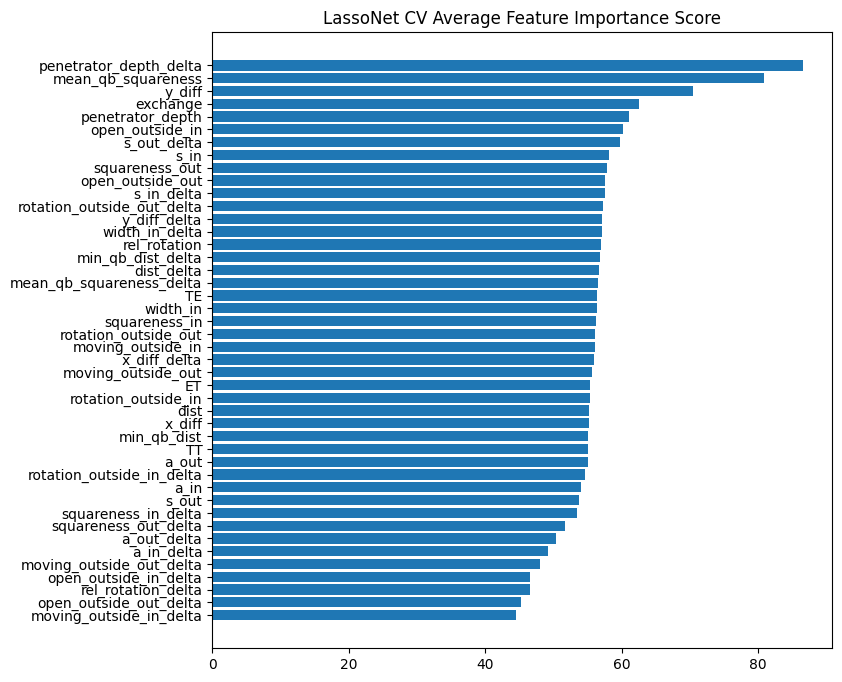

In [17]:
top_features_sorted = lncv2.get_top_n_features(n=len(features2), return_scores = True).sort_values(ascending = True)
index = np.arange(0,len(top_features_sorted))
plt.figure(figsize = (8,8))
plt.barh(index, top_features_sorted)
labels = top_features_sorted.index.tolist()
plt.gca().set_yticks(index)
plt.gca().set_yticklabels(labels)
plt.title("LassoNet CV Average Feature Importance Score")
plt.savefig(os.path.join(plots_dir, 'feat_importance_lncv.png'), bbox_inches = 'tight')

In [270]:
torch.manual_seed(0)
model = partial(FNNModel,
                n_classes = 2,
                n_hidden = 30,
                n_layers = 1
                )
weight = compute_class_weight(class_weight = 'balanced', classes = y.unique(),
                               y = y.values)
loss_function = torch.nn.CrossEntropyLoss(weight = torch.Tensor((weight[1], weight[0])))
optimizer = partial(torch.optim.Adam, lr= 0.01)
scaler = StandardScaler()
fnncv = LOWOCVNN(data = pro_frames_merge_trunc,
                 features = features2,
                 target_col = 'rush_win',
                 num_weeks = num_weeks,
                 model = model)
sw_feat_sel = FeatureSelectorNN(fnncv,
                              scaler = scaler,
                              loss_function = loss_function,
                              optimizer = optimizer,
                             )

In [271]:
#sorted_features = win_corr.abs().sort_values(ascending = False).index.tolist()
sorted_features = lncv2.get_top_n_features(n = len(features2), return_scores = True)
start_features = sorted_features[sorted_features >= 56.5].index.tolist()
sw_feat_sel.sw_select_cust(primary_selection_heirarchy = sorted_features,
                            start_features = start_features)


FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.637208572842858 , Overall Train AUC: 0.6401874625840733
Overall test loss: 0.6196152865886688 , Overall test AUC: 0.7116302216363186

Epoch 1
---------
Overall Train loss: 0.6205139403993433 , Overall Train AUC: 0.687208149319492
Overall test loss: 0.6173981726169586 , Overall test AUC: 0.7106695229463624

Epoch 2
---------
Overall Train loss: 0.6476244872266596 , Overall Train AUC: 0.6926645458734049
Overall test loss: 0.6081185936927795 , Overall test AUC: 0.725226003130922

Epoch 3
---------
Overall Train loss: 0.6388201821934093 , Overall Train AUC: 0.6956374142533532
Overall test loss: 0.6261404752731323 , Overall test AUC: 0.7038203839499052

Epoch 4
---------
Overall Train loss: 0.662104151465676 , Overall Train AUC: 0.6965334446388819
Overall test loss: 0.6129470467567444 , Overall test AUC: 0.7184239927494439

Epoch 5
---------
Overall Train loss: 0.6317199251868508 , Overall Train AUC: 0.6983006528679963
Overa

Overall Train loss: 0.5999614650552924 , Overall Train AUC: 0.7349405519347189
Overall test loss: 0.6337047219276428 , Overall test AUC: 0.7002222453249362

Epoch 11
---------
Overall Train loss: 0.6007274876941334 , Overall Train AUC: 0.7373360519399539
Overall test loss: 0.6425685584545135 , Overall test AUC: 0.6895851156172538

Epoch 12
---------
Overall Train loss: 0.5957250649278815 , Overall Train AUC: 0.741345608783641
Overall test loss: 0.6390687823295593 , Overall test AUC: 0.6991128975354275

Epoch 13
---------
Overall Train loss: 0.5950581323016774 , Overall Train AUC: 0.7427027898942687
Overall test loss: 0.6446168720722198 , Overall test AUC: 0.6903637884164384

Epoch 14
---------
Overall Train loss: 0.5903436162255027 , Overall Train AUC: 0.746428113238684
Overall test loss: 0.6412567496299744 , Overall test AUC: 0.6985788908275683

Epoch 15
---------
Overall Train loss: 0.5918529846451499 , Overall Train AUC: 0.747994777156482
Overall test loss: 0.6428286731243134 , Over

Overall Train loss: 0.5690389546481046 , Overall Train AUC: 0.7691886237478797
Overall test loss: 0.6652465164661407 , Overall test AUC: 0.7028256271759997

Epoch 25
---------
Overall Train loss: 0.5652176683599298 , Overall Train AUC: 0.7711517578513178
Overall test loss: 0.6525472402572632 , Overall test AUC: 0.6978010607490319

Epoch 26
---------
Overall Train loss: 0.5658305829221552 , Overall Train AUC: 0.7716804060610946
Overall test loss: 0.6606704592704773 , Overall test AUC: 0.7061640581785052

Epoch 27
---------
Overall Train loss: 0.5641708428209479 , Overall Train AUC: 0.7749009683883773
Overall test loss: 0.6628863513469696 , Overall test AUC: 0.702194383887027

Epoch 28
---------
Overall Train loss: 0.560067122632807 , Overall Train AUC: 0.7772246370615089
Overall test loss: 0.6495111882686615 , Overall test AUC: 0.7116174795822081

Epoch 29
---------
Overall Train loss: 0.5592787916010077 , Overall Train AUC: 0.7791147566878824
Overall test loss: 0.6635559499263763 , Ove

Overall Train loss: 0.6110187606378035 , Overall Train AUC: 0.7242895666460346
Overall test loss: 0.6442461311817169 , Overall test AUC: 0.6692487003496568

Epoch 6
---------
Overall Train loss: 0.6091573942791332 , Overall Train AUC: 0.7280648123157968
Overall test loss: 0.6445210576057434 , Overall test AUC: 0.6704487570840966

Epoch 7
---------
Overall Train loss: 0.605231062932448 , Overall Train AUC: 0.7310619918204501
Overall test loss: 0.6510573029518127 , Overall test AUC: 0.6659263438970393

Epoch 8
---------
Overall Train loss: 0.6005964550105009 , Overall Train AUC: 0.7359621181580291
Overall test loss: 0.6493346095085144 , Overall test AUC: 0.6659667363513588

Epoch 9
---------
Overall Train loss: 0.5991332205859098 , Overall Train AUC: 0.738155333916442
Overall test loss: 0.6553902328014374 , Overall test AUC: 0.6635629228103281

Epoch 10
---------
Overall Train loss: 0.5960153124549172 , Overall Train AUC: 0.741488253396752
Overall test loss: 0.6565200388431549 , Overall 

Overall Train loss: 0.6011547988111322 , Overall Train AUC: 0.7346225913847924
Overall test loss: 0.6833143532276154 , Overall test AUC: 0.6592320194609127

Epoch 11
---------
Overall Train loss: 0.598988641392101 , Overall Train AUC: 0.7384751336076996
Overall test loss: 0.6646636426448822 , Overall test AUC: 0.655046785143983

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.68121676011519 , Overall Train AUC: 0.5794991981651132
Overall test loss: 0.6667931377887726 , Overall test AUC: 0.6324409701302784

Epoch 1
---------
Overall Train loss: 0.6461113528771834 , Overall Train AUC: 0.6686360472466543
Overall test loss: 0.6493152379989624 , Overall test AUC: 0.6668382669457362

Epoch 2
---------
Overall Train loss: 0.6340501470999285 , Overall Train AUC: 0.6927167204466846
Overall test loss: 0.6505691111087799 , Overall test AUC: 0.6724031679666118

Epoch 3
---------
Overall Train loss: 0.6264902678402987 , Overall Train AUC: 0.7011165691490101
Overall test loss: 0.6

Overall Train loss: 0.6022103753956881 , Overall Train AUC: 0.7324737618723588
Overall test loss: 0.6358350217342377 , Overall test AUC: 0.7012198613867828

Epoch 9
---------
Overall Train loss: 0.6007231528108771 , Overall Train AUC: 0.7356567105334525
Overall test loss: 0.6421683728694916 , Overall test AUC: 0.7057202355773924

Epoch 10
---------
Overall Train loss: 0.5983762199228461 , Overall Train AUC: 0.7388326745653319
Overall test loss: 0.6389238834381104 , Overall test AUC: 0.7066671005108516

Epoch 11
---------
Overall Train loss: 0.5936954834244468 , Overall Train AUC: 0.7417321535363631
Overall test loss: 0.6360559463500977 , Overall test AUC: 0.705409169296847

Epoch 12
---------
Overall Train loss: 0.5940246527845209 , Overall Train AUC: 0.7437687066697097
Overall test loss: 0.6471490561962128 , Overall test AUC: 0.7088530244362737

Epoch 13
---------
Overall Train loss: 0.5893856666304849 , Overall Train AUC: 0.7472640139932002
Overall test loss: 0.639614462852478 , Over

Overall Train loss: 0.5662338354370811 , Overall Train AUC: 0.7718418400550229
Overall test loss: 0.6437737345695496 , Overall test AUC: 0.6687497603159993

Epoch 27
---------
Overall Train loss: 0.5650809353048151 , Overall Train AUC: 0.7724997097798006
Overall test loss: 0.6464566588401794 , Overall test AUC: 0.6589157654548243

Epoch 28
---------
Overall Train loss: 0.5660564303398132 , Overall Train AUC: 0.7732110288148506
Overall test loss: 0.6392958164215088 , Overall test AUC: 0.66594138288081

Epoch 29
---------
Overall Train loss: 0.5630598230795427 , Overall Train AUC: 0.7766977068436465
Overall test loss: 0.6478998363018036 , Overall test AUC: 0.664926560822212

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6758747805248607 , Overall Train AUC: 0.5952190786891387
Overall test loss: 0.6508769094944 , Overall test AUC: 0.6989669113114128

Epoch 1
---------
Overall Train loss: 0.6449150280518965 , Overall Train AUC: 0.6713650619917412
Overall test loss: 0.6

Overall Train loss: 0.6422580047087236 , Overall Train AUC: 0.6716494532360058
Overall test loss: 0.6528801620006561 , Overall test AUC: 0.6659473146998888

Epoch 2
---------
Overall Train loss: 0.6278131712566722 , Overall Train AUC: 0.6985868781156425
Overall test loss: 0.6612045168876648 , Overall test AUC: 0.6730623552968039

Epoch 3
---------
Overall Train loss: 0.6206679289991205 , Overall Train AUC: 0.7101413010449945
Overall test loss: 0.6574647426605225 , Overall test AUC: 0.6689681661859528

Epoch 4
---------
Overall Train loss: 0.614673679525202 , Overall Train AUC: 0.7183445741676567
Overall test loss: 0.653769314289093 , Overall test AUC: 0.663940763712795

Epoch 5
---------
Overall Train loss: 0.6108151620084589 , Overall Train AUC: 0.7243944349000976
Overall test loss: 0.6579059064388275 , Overall test AUC: 0.6672390185611301

Epoch 6
---------
Overall Train loss: 0.6065754023465243 , Overall Train AUC: 0.728314956918063
Overall test loss: 0.6607981622219086 , Overall te

Overall Train loss: 0.598316642371091 , Overall Train AUC: 0.7368704957915002
Overall test loss: 0.6571375727653503 , Overall test AUC: 0.7033996030325709

Epoch 8
---------
Overall Train loss: 0.5947881286794489 , Overall Train AUC: 0.7418891785292283
Overall test loss: 0.6421459019184113 , Overall test AUC: 0.7011466501805876

Epoch 9
---------
Overall Train loss: 0.5922076918862083 , Overall Train AUC: 0.7463385823041216
Overall test loss: 0.6469942331314087 , Overall test AUC: 0.7040152279308886

Epoch 10
---------
Overall Train loss: 0.5887987559491937 , Overall Train AUC: 0.7498590791347864
Overall test loss: 0.6442794501781464 , Overall test AUC: 0.7051026583802429

Epoch 11
---------
Overall Train loss: 0.5831182057207281 , Overall Train AUC: 0.7536613153391347
Overall test loss: 0.6528419554233551 , Overall test AUC: 0.7010568444343215

Epoch 12
---------
Overall Train loss: 0.5850370038639415 , Overall Train AUC: 0.7546713229431685
Overall test loss: 0.6559180617332458 , Over

Overall Train loss: 0.5857673395763744 , Overall Train AUC: 0.7540816975551896
Overall test loss: 0.6277046501636505 , Overall test AUC: 0.7087737912148526

Epoch 13
---------
Overall Train loss: 0.5842187567190691 , Overall Train AUC: 0.7558360818595942
Overall test loss: 0.6242107450962067 , Overall test AUC: 0.7029245429945296

Epoch 14
---------
Overall Train loss: 0.5815204869617115 , Overall Train AUC: 0.7581392407016175
Overall test loss: 0.6429276168346405 , Overall test AUC: 0.7065560898371847

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6648906957019459 , Overall Train AUC: 0.6314530086411025
Overall test loss: 0.662090539932251 , Overall test AUC: 0.6276395389710099

Epoch 1
---------
Overall Train loss: 0.6321171576326544 , Overall Train AUC: 0.6923104084954154
Overall test loss: 0.6701513528823853 , Overall test AUC: 0.6597561652452224

Epoch 2
---------
Overall Train loss: 0.6219476840712808 , Overall Train AUC: 0.7089941199637342
Overall test loss:

Overall Train loss: 0.6161200295795094 , Overall Train AUC: 0.7152241176116451
Overall test loss: 0.6537147462368011 , Overall test AUC: 0.674330586565853

Epoch 6
---------
Overall Train loss: 0.6130274154923179 , Overall Train AUC: 0.7194540286311704
Overall test loss: 0.642950177192688 , Overall test AUC: 0.6759203212188677

Epoch 7
---------
Overall Train loss: 0.6105133891105652 , Overall Train AUC: 0.7229463639176832
Overall test loss: 0.6438786685466766 , Overall test AUC: 0.6746656044725957

Epoch 8
---------
Overall Train loss: 0.608324262228879 , Overall Train AUC: 0.7256865649493988
Overall test loss: 0.6721170246601105 , Overall test AUC: 0.6744315898413467

Epoch 9
---------
Overall Train loss: 0.6065125682137229 , Overall Train AUC: 0.7288919710323938
Overall test loss: 0.6553312242031097 , Overall test AUC: 0.6709754284637188

Epoch 10
---------
Overall Train loss: 0.6038168018514459 , Overall Train AUC: 0.7310338413151097
Overall test loss: 0.6578023731708527 , Overall 

Overall Train loss: 0.6141441464424133 , Overall Train AUC: 0.7188684157854921
Overall test loss: 0.6451606452465057 , Overall test AUC: 0.7007028275794749

Epoch 5
---------
Overall Train loss: 0.6085623285987161 , Overall Train AUC: 0.7241633252551442
Overall test loss: 0.6402815580368042 , Overall test AUC: 0.7042003709367781

Epoch 6
---------
Overall Train loss: 0.6052704507654364 , Overall Train AUC: 0.729490906022511
Overall test loss: 0.6354877650737762 , Overall test AUC: 0.7074421631471057

Epoch 7
---------
Overall Train loss: 0.6017740964889526 , Overall Train AUC: 0.7330949698230873
Overall test loss: 0.647543340921402 , Overall test AUC: 0.7037380014967624

Epoch 8
---------
Overall Train loss: 0.5985327633944425 , Overall Train AUC: 0.7380879707664463
Overall test loss: 0.6450367569923401 , Overall test AUC: 0.7107051052614454

Epoch 9
---------
Overall Train loss: 0.5951934294267134 , Overall Train AUC: 0.7407263425588148
Overall test loss: 0.6495963037014008 , Overall 

Overall Train loss: 0.5998192429542542 , Overall Train AUC: 0.73713009657315
Overall test loss: 0.6155115962028503 , Overall test AUC: 0.7094600294611975

Epoch 11
---------
Overall Train loss: 0.5957713885740801 , Overall Train AUC: 0.740063437503638
Overall test loss: 0.6106706857681274 , Overall test AUC: 0.7191063004133653

Epoch 12
---------
Overall Train loss: 0.5938681093129244 , Overall Train AUC: 0.7439502812919088
Overall test loss: 0.6320277452468872 , Overall test AUC: 0.708593714511911

Epoch 13
---------
Overall Train loss: 0.5915132815187628 , Overall Train AUC: 0.7474211761285158
Overall test loss: 0.617022842168808 , Overall test AUC: 0.7133260004802044

Epoch 14
---------
Overall Train loss: 0.5895943208174272 , Overall Train AUC: 0.7478870429296344
Overall test loss: 0.6223875284194946 , Overall test AUC: 0.7058641734966029

Epoch 15
---------
Overall Train loss: 0.5871091485023499 , Overall Train AUC: 0.7513840372106618
Overall test loss: 0.6067809462547302 , Overal

Overall Train loss: 0.6001720157536593 , Overall Train AUC: 0.7135403853699033
Overall test loss: 0.6172322630882263 , Overall test AUC: 0.728571146082228

Epoch 25
---------
Overall Train loss: 0.6211480498313904 , Overall Train AUC: 0.7085208171386743
Overall test loss: 0.6057895720005035 , Overall test AUC: 0.736718464200379

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6716347553513267 , Overall Train AUC: 0.5990237941963171
Overall test loss: 0.652629941701889 , Overall test AUC: 0.6741925961753901

Epoch 1
---------
Overall Train loss: 0.646817760034041 , Overall Train AUC: 0.6671347600466937
Overall test loss: 0.6599934697151184 , Overall test AUC: 0.6780086706332977

Epoch 2
---------
Overall Train loss: 0.6344959139823914 , Overall Train AUC: 0.6864305892766069
Overall test loss: 0.6473982632160187 , Overall test AUC: 0.6783500901560927

Epoch 3
---------
Overall Train loss: 0.6278844746676359 , Overall Train AUC: 0.6967566399323663
Overall test loss: 0.6

Overall Train loss: 0.5962191998958588 , Overall Train AUC: 0.7389446715001114
Overall test loss: 0.6603050827980042 , Overall test AUC: 0.6619335949321121

Epoch 11
---------
Overall Train loss: 0.5936760365962982 , Overall Train AUC: 0.7425099984732838
Overall test loss: 0.6649032533168793 , Overall test AUC: 0.6668287999071962

Epoch 12
---------
Overall Train loss: 0.5915100872516632 , Overall Train AUC: 0.7438787299369102
Overall test loss: 0.65976482629776 , Overall test AUC: 0.6645014576230153

Epoch 13
---------
Overall Train loss: 0.5890307426452637 , Overall Train AUC: 0.747376097435724
Overall test loss: 0.66581991314888 , Overall test AUC: 0.6627472032804083

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6660994995724071 , Overall Train AUC: 0.6121566608758096
Overall test loss: 0.6749860644340515 , Overall test AUC: 0.6353287996616015

Epoch 1
---------
Overall Train loss: 0.6389104344628074 , Overall Train AUC: 0.6783872936639148
Overall test loss: 0.

Overall Train loss: 0.6306507208130576 , Overall Train AUC: 0.6959322962901685
Overall test loss: 0.6193422973155975 , Overall test AUC: 0.7070955087896899

Epoch 3
---------
Overall Train loss: 0.6230067177252336 , Overall Train AUC: 0.7059380187649089
Overall test loss: 0.6301923394203186 , Overall test AUC: 0.7075400224528069

Epoch 4
---------
Overall Train loss: 0.6168317740613763 , Overall Train AUC: 0.7157610735233891
Overall test loss: 0.6128736436367035 , Overall test AUC: 0.7094819306818255

Epoch 5
---------
Overall Train loss: 0.6125490015203302 , Overall Train AUC: 0.7207167877589393
Overall test loss: 0.6146685481071472 , Overall test AUC: 0.7083601014918787

Epoch 6
---------
Overall Train loss: 0.6094190586696971 , Overall Train AUC: 0.7250197792616416
Overall test loss: 0.6254121959209442 , Overall test AUC: 0.7123574798346539

Epoch 7
---------
Overall Train loss: 0.6055935404517434 , Overall Train AUC: 0.7297864464425676
Overall test loss: 0.6166850924491882 , Overal

Overall Train loss: 0.6397484866055575 , Overall Train AUC: 0.6904882708261613
Overall test loss: 0.6321241557598114 , Overall test AUC: 0.689892065584576

Epoch 12
---------
Overall Train loss: 0.6365727619691328 , Overall Train AUC: 0.6939937213295119
Overall test loss: 0.6258165836334229 , Overall test AUC: 0.699567438411469

Epoch 13
---------
Overall Train loss: 0.6317850513891741 , Overall Train AUC: 0.6956134059020388
Overall test loss: 0.6236916184425354 , Overall test AUC: 0.7065512070528137

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6898143074729226 , Overall Train AUC: 0.5329941157730733
Overall test loss: 0.667946994304657 , Overall test AUC: 0.6243211619644427

Epoch 1
---------
Overall Train loss: 0.6615360487591136 , Overall Train AUC: 0.6326628990755718
Overall test loss: 0.6550252139568329 , Overall test AUC: 0.6802698636811427

Epoch 2
---------
Overall Train loss: 0.6462578719312494 , Overall Train AUC: 0.6685298372412982
Overall test loss: 0

Overall Train loss: 0.6847681186415933 , Overall Train AUC: 0.5524108054563281
Overall test loss: 0.683190256357193 , Overall test AUC: 0.6336140305209385

Epoch 1
---------
Overall Train loss: 0.6556825204329058 , Overall Train AUC: 0.648733375266454
Overall test loss: 0.6701647043228149 , Overall test AUC: 0.6584680961832557

Epoch 2
---------
Overall Train loss: 0.6427570256319913 , Overall Train AUC: 0.6766449820493567
Overall test loss: 0.6578025221824646 , Overall test AUC: 0.6812650896430548

Epoch 3
---------
Overall Train loss: 0.6328432559967041 , Overall Train AUC: 0.6914778194496451
Overall test loss: 0.6544781923294067 , Overall test AUC: 0.6909556502782026

Epoch 4
---------
Overall Train loss: 0.6280260736292059 , Overall Train AUC: 0.6988533393195455
Overall test loss: 0.6483204066753387 , Overall test AUC: 0.6962834737903881

Epoch 5
---------
Overall Train loss: 0.6230495138601824 , Overall Train AUC: 0.7042259083127674
Overall test loss: 0.6531354486942291 , Overall 

Overall Train loss: 0.6153935627503828 , Overall Train AUC: 0.7145771667578924
Overall test loss: 0.6268962621688843 , Overall test AUC: 0.694950065216968

Epoch 8
---------
Overall Train loss: 0.6113164316524159 , Overall Train AUC: 0.7204520688790603
Overall test loss: 0.6330141425132751 , Overall test AUC: 0.6918522592325812

Epoch 9
---------
Overall Train loss: 0.6092922199856151 , Overall Train AUC: 0.7231911759931678
Overall test loss: 0.6243008077144623 , Overall test AUC: 0.7008958410393183

Epoch 10
---------
Overall Train loss: 0.6066028909249739 , Overall Train AUC: 0.7279635647023447
Overall test loss: 0.6265210211277008 , Overall test AUC: 0.6992816399634005

Epoch 11
---------
Overall Train loss: 0.605285254391757 , Overall Train AUC: 0.7295716359472499
Overall test loss: 0.654480904340744 , Overall test AUC: 0.6898835828450172

Epoch 12
---------
Overall Train loss: 0.6033427065069025 , Overall Train AUC: 0.7309870161534502
Overall test loss: 0.6169226765632629 , Overal

Overall test loss: 0.6041592061519623 , Overall test AUC: 0.7364894125401664

Epoch 4
---------
Overall Train loss: 0.648639743978327 , Overall Train AUC: 0.6984450578585674
Overall test loss: 0.6126947700977325 , Overall test AUC: 0.7320118645464283

Epoch 5
---------
Overall Train loss: 0.6359751387075945 , Overall Train AUC: 0.6952163782101344
Overall test loss: 0.6104030013084412 , Overall test AUC: 0.7269084617285985

Epoch 6
---------
Overall Train loss: 0.6315527233210477 , Overall Train AUC: 0.6921200482950167
Overall test loss: 0.5970628261566162 , Overall test AUC: 0.7435626596358242

Epoch 7
---------
Overall Train loss: 0.6238130114295266 , Overall Train AUC: 0.6989210254397544
Overall test loss: 0.6025136411190033 , Overall test AUC: 0.7400217516684519

Epoch 8
---------
Overall Train loss: 0.656669324094599 , Overall Train AUC: 0.7046273776978558
Overall test loss: 0.604242742061615 , Overall test AUC: 0.7367479607810825

Epoch 9
---------
Overall Train loss: 0.6322703957

Overall Train loss: 0.6490608215332031 , Overall Train AUC: 0.6646897968513212
Overall test loss: 0.6531542837619781 , Overall test AUC: 0.6660350510420239

Epoch 2
---------
Overall Train loss: 0.6339183270931243 , Overall Train AUC: 0.6886089619977777
Overall test loss: 0.6520606279373169 , Overall test AUC: 0.6656454268969274

Epoch 3
---------
Overall Train loss: 0.6248834669589997 , Overall Train AUC: 0.7027501873697195
Overall test loss: 0.6546075940132141 , Overall test AUC: 0.6587803503338916

Epoch 4
---------
Overall Train loss: 0.6177390933036804 , Overall Train AUC: 0.7129127446974803
Overall test loss: 0.6532122790813446 , Overall test AUC: 0.6637754831843766

Epoch 5
---------
Overall Train loss: 0.6121974766254425 , Overall Train AUC: 0.7194450245532403
Overall test loss: 0.6524000465869904 , Overall test AUC: 0.6694745243811407

Epoch 6
---------
Overall Train loss: 0.6080805957317352 , Overall Train AUC: 0.724033397785047
Overall test loss: 0.6546933650970459 , Overall

Overall Train loss: 0.5881732377139005 , Overall Train AUC: 0.7508445102841638
Overall test loss: 0.6417298316955566 , Overall test AUC: 0.6625191747200491

Epoch 15
---------
Overall Train loss: 0.5835149613293734 , Overall Train AUC: 0.7538852504910363
Overall test loss: 0.6439041495323181 , Overall test AUC: 0.6648680779260623

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6809960332783785 , Overall Train AUC: 0.5711273795807601
Overall test loss: 0.6521647274494171 , Overall test AUC: 0.6854210063529762

Epoch 1
---------
Overall Train loss: 0.6464219039136713 , Overall Train AUC: 0.6659027866445428
Overall test loss: 0.6220723688602448 , Overall test AUC: 0.7144502631391101

Epoch 2
---------
Overall Train loss: 0.6346755678003485 , Overall Train AUC: 0.6888788066737723
Overall test loss: 0.6179752945899963 , Overall test AUC: 0.7195070116352262

Epoch 3
---------
Overall Train loss: 0.6261300011114641 , Overall Train AUC: 0.7030119090132195
Overall test loss:

Overall Train loss: 0.6235797784545205 , Overall Train AUC: 0.7035331292019454
Overall test loss: 0.6010999381542206 , Overall test AUC: 0.7351866194281947

Epoch 15
---------
Overall Train loss: 0.662518631328236 , Overall Train AUC: 0.7041474848990964
Overall test loss: 0.6103211641311646 , Overall test AUC: 0.7261985663673066

Epoch 16
---------
Overall Train loss: 0.6084186028350483 , Overall Train AUC: 0.7066442297645571
Overall test loss: 0.6290687024593353 , Overall test AUC: 0.6986883084782072

Epoch 17
---------
Overall Train loss: 0.6117361296306957 , Overall Train AUC: 0.7075168755319745
Overall test loss: 0.6176926791667938 , Overall test AUC: 0.7184177309054955

Epoch 18
---------
Overall Train loss: 0.6052402420477434 , Overall Train AUC: 0.7112456870462099
Overall test loss: 0.6043965518474579 , Overall test AUC: 0.728943561011782

Epoch 19
---------
Overall Train loss: 0.6201386560093273 , Overall Train AUC: 0.7095880730425134
Overall test loss: 0.6007083058357239 , Ove

Overall Train loss: 0.5841753699562766 , Overall Train AUC: 0.7547705488619048
Overall test loss: 0.6467781066894531 , Overall test AUC: 0.6905664938555827

Epoch 23
---------
Overall Train loss: 0.5814776691523466 , Overall Train AUC: 0.7578040575223448
Overall test loss: 0.6467573642730713 , Overall test AUC: 0.6929603386245506

Epoch 24
---------
Overall Train loss: 0.5825583663853732 , Overall Train AUC: 0.7572524940505116
Overall test loss: 0.6510329842567444 , Overall test AUC: 0.6856639866126731

Epoch 25
---------
Overall Train loss: 0.5802847038615834 , Overall Train AUC: 0.7589650316314026
Overall test loss: 0.6408190727233887 , Overall test AUC: 0.6898126634325652

Epoch 26
---------
Overall Train loss: 0.5777900110591542 , Overall Train AUC: 0.7594165330464671
Overall test loss: 0.6541114449501038 , Overall test AUC: 0.682445541962531

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6881436049938202 , Overall Train AUC: 0.5570706533478024
Overall test los

Overall Train loss: 0.6301820007237521 , Overall Train AUC: 0.69495134262675
Overall test loss: 0.6537422239780426 , Overall test AUC: 0.6506998772817916

Epoch 3
---------
Overall Train loss: 0.6236650130965493 , Overall Train AUC: 0.705250179977185
Overall test loss: 0.6485580205917358 , Overall test AUC: 0.6549470777726646

Epoch 4
---------
Overall Train loss: 0.6172266710888256 , Overall Train AUC: 0.7128177758703098
Overall test loss: 0.6489647030830383 , Overall test AUC: 0.6629391010891241

Epoch 5
---------
Overall Train loss: 0.6174219629981301 , Overall Train AUC: 0.7169068666607435
Overall test loss: 0.6380995810031891 , Overall test AUC: 0.6686220087436724

Epoch 6
---------
Overall Train loss: 0.6142265146428888 , Overall Train AUC: 0.7233980556568136
Overall test loss: 0.6391977369785309 , Overall test AUC: 0.6723826507132995

Epoch 7
---------
Overall Train loss: 0.6109958399425853 , Overall Train AUC: 0.7280597747891253
Overall test loss: 0.6357552707195282 , Overall t

Overall Train loss: 0.5962132540616122 , Overall Train AUC: 0.7471373716004867
Overall test loss: 0.6548150777816772 , Overall test AUC: 0.6630738966076506

Epoch 10
---------
Overall Train loss: 0.5919216979633678 , Overall Train AUC: 0.7505821848569829
Overall test loss: 0.6585682332515717 , Overall test AUC: 0.6659611862431318

Epoch 11
---------
Overall Train loss: 0.5881722406907515 , Overall Train AUC: 0.7532988552907484
Overall test loss: 0.6524797677993774 , Overall test AUC: 0.6644608069857362

Epoch 12
---------
Overall Train loss: 0.5874140641906045 , Overall Train AUC: 0.7547119375738393
Overall test loss: 0.6566594839096069 , Overall test AUC: 0.6662140245068111

Test score = 0.6962
Failed to drop one of 3 candidates
Testing features: ['penetrator_depth_delta', 'mean_qb_squareness', 'y_diff', 'penetrator_depth', 'open_outside_in', 's_out_delta', 's_in', 'squareness_out', 's_in_delta', 'open_outside_out', 'rotation_outside_out_delta', 'y_diff_delta', 'width_in_delta', 'rel_

Overall Train loss: 0.6078574549068104 , Overall Train AUC: 0.7236814698806595
Overall test loss: 0.6296674013137817 , Overall test AUC: 0.705382779264841

Epoch 9
---------
Overall Train loss: 0.6067350886084817 , Overall Train AUC: 0.7285880712034217
Overall test loss: 0.6298404335975647 , Overall test AUC: 0.7026730814274638

Epoch 10
---------
Overall Train loss: 0.6061150865121321 , Overall Train AUC: 0.7314702181098587
Overall test loss: 0.6271996796131134 , Overall test AUC: 0.7058282719601386

Epoch 11
---------
Overall Train loss: 0.6014249920845032 , Overall Train AUC: 0.7358630886477475
Overall test loss: 0.6383070647716522 , Overall test AUC: 0.6995972194909525

Epoch 12
---------
Overall Train loss: 0.5985915552486073 , Overall Train AUC: 0.738763942606062
Overall test loss: 0.6210530996322632 , Overall test AUC: 0.7036596786523825

Epoch 13
---------
Overall Train loss: 0.5969873070716858 , Overall Train AUC: 0.7398657879616442
Overall test loss: 0.6347571909427643 , Over

Overall Train loss: 0.5762358524582603 , Overall Train AUC: 0.7611752069039214
Overall test loss: 0.6450635194778442 , Overall test AUC: 0.7037249861712165

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6875816095959056 , Overall Train AUC: 0.5526424269605722
Overall test loss: 0.6853747665882111 , Overall test AUC: 0.6326463989875748

Epoch 1
---------
Overall Train loss: 0.6466007828712463 , Overall Train AUC: 0.6649901274305561
Overall test loss: 0.649660587310791 , Overall test AUC: 0.6480297975149563

Epoch 2
---------
Overall Train loss: 0.6311462900855325 , Overall Train AUC: 0.694345763364513
Overall test loss: 0.6519996523857117 , Overall test AUC: 0.662010565270747

Epoch 3
---------
Overall Train loss: 0.6229567365212874 , Overall Train AUC: 0.7057383750799758
Overall test loss: 0.6386181116104126 , Overall test AUC: 0.6702638441478754

Epoch 4
---------
Overall Train loss: 0.6148425990884955 , Overall Train AUC: 0.715334716902648
Overall test loss: 0.63

Overall Train loss: 0.5870188691399314 , Overall Train AUC: 0.7511035356205122
Overall test loss: 0.6142815947532654 , Overall test AUC: 0.6957214748768664

Epoch 18
---------
Overall Train loss: 0.5851522413167086 , Overall Train AUC: 0.7519913805105912
Overall test loss: 0.6291323900222778 , Overall test AUC: 0.6959339978325904

Epoch 19
---------
Overall Train loss: 0.5852091908454895 , Overall Train AUC: 0.7524485585392792
Overall test loss: 0.6411750316619873 , Overall test AUC: 0.7000554830922576

Epoch 20
---------
Overall Train loss: 0.583866374059157 , Overall Train AUC: 0.755749492279439
Overall test loss: 0.6230656802654266 , Overall test AUC: 0.6983350205384781

Epoch 21
---------
Overall Train loss: 0.5828533985398032 , Overall Train AUC: 0.7554029919854119
Overall test loss: 0.6329914927482605 , Overall test AUC: 0.6959185858625186

Epoch 22
---------
Overall Train loss: 0.583583262833682 , Overall Train AUC: 0.7535974073384539
Overall test loss: 0.626869797706604 , Overa

Overall Train loss: 0.6281158653172579 , Overall Train AUC: 0.697974690113146
Overall test loss: 0.6514435410499573 , Overall test AUC: 0.6743330760832068

Epoch 4
---------
Overall Train loss: 0.6232543100010265 , Overall Train AUC: 0.7044988483685719
Overall test loss: 0.6487139761447906 , Overall test AUC: 0.6737252782035643

Epoch 5
---------
Overall Train loss: 0.619583704254844 , Overall Train AUC: 0.7105855448989566
Overall test loss: 0.6488891541957855 , Overall test AUC: 0.6742310058717045

Epoch 6
---------
Overall Train loss: 0.6166283108971335 , Overall Train AUC: 0.7148828977543056
Overall test loss: 0.6648396253585815 , Overall test AUC: 0.6731608690549437

Epoch 7
---------
Overall Train loss: 0.6135636351325295 , Overall Train AUC: 0.7190700554243068
Overall test loss: 0.6623428761959076 , Overall test AUC: 0.6727003083445067

Epoch 8
---------
Overall Train loss: 0.611378631808541 , Overall Train AUC: 0.7223523320393525
Overall test loss: 0.6548934876918793 , Overall t

Overall Train loss: 0.6098676486448809 , Overall Train AUC: 0.7249250933854187
Overall test loss: 0.6433474719524384 , Overall test AUC: 0.7023447108970813

Epoch 8
---------
Overall Train loss: 0.6071182651953264 , Overall Train AUC: 0.7290560409604783
Overall test loss: 0.6543386578559875 , Overall test AUC: 0.6962886799206065

Epoch 9
---------
Overall Train loss: 0.6042729128490795 , Overall Train AUC: 0.7329934221852257
Overall test loss: 0.6446118652820587 , Overall test AUC: 0.7011655224026291

Epoch 10
---------
Overall Train loss: 0.6028647856278853 , Overall Train AUC: 0.7354794042829728
Overall test loss: 0.6408638656139374 , Overall test AUC: 0.6991019425373377

Epoch 11
---------
Overall Train loss: 0.5990250489928506 , Overall Train AUC: 0.7388171163403124
Overall test loss: 0.6577457189559937 , Overall test AUC: 0.702921940585039

Epoch 12
---------
Overall Train loss: 0.5954626690257679 , Overall Train AUC: 0.7413615051455807
Overall test loss: 0.6479087173938751 , Over

Overall Train loss: 0.6284248557957736 , Overall Train AUC: 0.698388265841227
Overall test loss: 0.6346413493156433 , Overall test AUC: 0.7047820909663143

Epoch 4
---------
Overall Train loss: 0.6243407021869313 , Overall Train AUC: 0.7060567369267812
Overall test loss: 0.6218976974487305 , Overall test AUC: 0.7006143697964322

Epoch 5
---------
Overall Train loss: 0.6189678853208368 , Overall Train AUC: 0.7132488446440866
Overall test loss: 0.6238813996315002 , Overall test AUC: 0.6976641942622047

Epoch 6
---------
Overall Train loss: 0.6158242225646973 , Overall Train AUC: 0.7181391943236383
Overall test loss: 0.6303948163986206 , Overall test AUC: 0.6967127078993647

Epoch 7
---------
Overall Train loss: 0.6141299442811445 , Overall Train AUC: 0.7210764347903371
Overall test loss: 0.6338091194629669 , Overall test AUC: 0.6977428764252017

Epoch 8
---------
Overall Train loss: 0.6111137975345958 , Overall Train AUC: 0.7250639045961429
Overall test loss: 0.6436345279216766 , Overall

Overall Train loss: 0.6312691623514349 , Overall Train AUC: 0.7038625302343915
Overall test loss: 0.609673023223877 , Overall test AUC: 0.7260871714591743

Epoch 15
---------
Overall Train loss: 0.6150568479841406 , Overall Train AUC: 0.7042891368603568
Overall test loss: 0.6105518639087677 , Overall test AUC: 0.725226332701656

Epoch 16
---------
Overall Train loss: 0.6252429810437289 , Overall Train AUC: 0.7052194725720637
Overall test loss: 0.6177973747253418 , Overall test AUC: 0.7255493120210925

Epoch 17
---------
Overall Train loss: 0.6411093310876326 , Overall Train AUC: 0.6998486242531816
Overall test loss: 0.6119871139526367 , Overall test AUC: 0.7271854659306254

Epoch 18
---------
Overall Train loss: 0.621949927373366 , Overall Train AUC: 0.6993501968996675
Overall test loss: 0.6021869778633118 , Overall test AUC: 0.7353886462882095

Epoch 19
---------
Overall Train loss: 0.6178973046216097 , Overall Train AUC: 0.7001471558690778
Overall test loss: 0.6023661196231842 , Over

Overall Train loss: 0.6006238894029097 , Overall Train AUC: 0.7377577977736066
Overall test loss: 0.6352657675743103 , Overall test AUC: 0.6951869670631844

Epoch 13
---------
Overall Train loss: 0.599777405912226 , Overall Train AUC: 0.7407098170691141
Overall test loss: 0.6369989216327667 , Overall test AUC: 0.6930989549083734

Epoch 14
---------
Overall Train loss: 0.5944592573425986 , Overall Train AUC: 0.7432014206775991
Overall test loss: 0.6318658888339996 , Overall test AUC: 0.6965576817011057

Epoch 15
---------
Overall Train loss: 0.5916313962502913 , Overall Train AUC: 0.7445799495316814
Overall test loss: 0.6414156854152679 , Overall test AUC: 0.6887083258701825

Epoch 16
---------
Overall Train loss: 0.5896907177838412 , Overall Train AUC: 0.7468744159536963
Overall test loss: 0.6482260227203369 , Overall test AUC: 0.6898840591691122

Epoch 17
---------
Overall Train loss: 0.5896452231840654 , Overall Train AUC: 0.7494558960942953
Overall test loss: 0.6453343331813812 , Ov

Overall Train loss: 0.6193831617181952 , Overall Train AUC: 0.7098316387387753
Overall test loss: 0.6446389555931091 , Overall test AUC: 0.6574882075471699

Epoch 5
---------
Overall Train loss: 0.6163217587904497 , Overall Train AUC: 0.7164680293225072
Overall test loss: 0.6438531279563904 , Overall test AUC: 0.6675151480288387

Epoch 6
---------
Overall Train loss: 0.6126291480931368 , Overall Train AUC: 0.7213929644524475
Overall test loss: 0.6411440670490265 , Overall test AUC: 0.6638700337475072

Epoch 7
---------
Overall Train loss: 0.6069704348390753 , Overall Train AUC: 0.7247974252843091
Overall test loss: 0.6434713006019592 , Overall test AUC: 0.6667309019788311

Epoch 8
---------
Overall Train loss: 0.6075472344051708 , Overall Train AUC: 0.7301302544849949
Overall test loss: 0.6395858824253082 , Overall test AUC: 0.6682241333026537

Epoch 9
---------
Overall Train loss: 0.6051255356181752 , Overall Train AUC: 0.7323416256681926
Overall test loss: 0.6412952244281769 , Overal

Epoch 0
---------
Overall Train loss: 0.6584391268816862 , Overall Train AUC: 0.634647813778559
Overall test loss: 0.6238890588283539 , Overall test AUC: 0.7050287550465518

Epoch 1
---------
Overall Train loss: 0.6299119158224626 , Overall Train AUC: 0.6829639029679335
Overall test loss: 0.6346063613891602 , Overall test AUC: 0.6941820878306005

Epoch 2
---------
Overall Train loss: 0.6596978306770325 , Overall Train AUC: 0.6812850121341918
Overall test loss: 0.6162740290164948 , Overall test AUC: 0.7095308560599819

Epoch 3
---------
Overall Train loss: 0.646077264438976 , Overall Train AUC: 0.693717638731922
Overall test loss: 0.6283214390277863 , Overall test AUC: 0.6958536705940512

Epoch 4
---------
Overall Train loss: 0.6271512887694619 , Overall Train AUC: 0.6893132596344519
Overall test loss: 0.6244120895862579 , Overall test AUC: 0.7094122105956991

Epoch 5
---------
Overall Train loss: 0.6446449485692111 , Overall Train AUC: 0.6887717893129036
Overall test loss: 0.6282524466

Overall Train loss: 0.6391919797117059 , Overall Train AUC: 0.68250740889689
Overall test loss: 0.6488460898399353 , Overall test AUC: 0.6795882511843968

Epoch 3
---------
Overall Train loss: 0.6296921318227594 , Overall Train AUC: 0.691953777624024
Overall test loss: 0.6407235264778137 , Overall test AUC: 0.684056329983579

Epoch 4
---------
Overall Train loss: 0.6293038617480885 , Overall Train AUC: 0.6987117672947754
Overall test loss: 0.6418687701225281 , Overall test AUC: 0.6883634552363345

Epoch 5
---------
Overall Train loss: 0.6212666197256609 , Overall Train AUC: 0.7048920811364735
Overall test loss: 0.6397404372692108 , Overall test AUC: 0.6888690706571456

Epoch 6
---------
Overall Train loss: 0.6164918379350142 , Overall Train AUC: 0.7119945906234033
Overall test loss: 0.6453010737895966 , Overall test AUC: 0.6892803268004147

Epoch 7
---------
Overall Train loss: 0.6141182671893727 , Overall Train AUC: 0.7157076923717718
Overall test loss: 0.6359647810459137 , Overall te

Overall Train loss: 0.588423414663835 , Overall Train AUC: 0.7493346226773646
Overall test loss: 0.647919774055481 , Overall test AUC: 0.7068037614290827

Epoch 16
---------
Overall Train loss: 0.5835216370495883 , Overall Train AUC: 0.7539289197339473
Overall test loss: 0.6690108478069305 , Overall test AUC: 0.7044092669117886

Epoch 17
---------
Overall Train loss: 0.5820679447867654 , Overall Train AUC: 0.7565133105294206
Overall test loss: 0.6471854448318481 , Overall test AUC: 0.7025666221976378

Epoch 18
---------
Overall Train loss: 0.5793232213367115 , Overall Train AUC: 0.758143950936767
Overall test loss: 0.6660427153110504 , Overall test AUC: 0.7030123970975823

Epoch 19
---------
Overall Train loss: 0.5788163542747498 , Overall Train AUC: 0.7594736478956877
Overall test loss: 0.655424565076828 , Overall test AUC: 0.7086669052809683

Epoch 20
---------
Overall Train loss: 0.5781618302518671 , Overall Train AUC: 0.7623774307240786
Overall test loss: 0.6590790152549744 , Overa

Overall Train loss: 0.5866564891555093 , Overall Train AUC: 0.7531947139704387
Overall test loss: 0.6266320943832397 , Overall test AUC: 0.703430704537933

Epoch 17
---------
Overall Train loss: 0.5849723707545887 , Overall Train AUC: 0.754444609974919
Overall test loss: 0.6068012714385986 , Overall test AUC: 0.7094762525875886

Epoch 18
---------
Overall Train loss: 0.5835296240719882 , Overall Train AUC: 0.7554478934411979
Overall test loss: 0.6210163533687592 , Overall test AUC: 0.7098518179635434

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6732423955743964 , Overall Train AUC: 0.595234325067494
Overall test loss: 0.662771612405777 , Overall test AUC: 0.629305188117835

Epoch 1
---------
Overall Train loss: 0.6448756293817 , Overall Train AUC: 0.6705715273108003
Overall test loss: 0.6467491090297699 , Overall test AUC: 0.6676404023211786

Epoch 2
---------
Overall Train loss: 0.6331959204240278 , Overall Train AUC: 0.6919431799152611
Overall test loss: 0.6388

Overall Train loss: 0.6042403660037301 , Overall Train AUC: 0.716010895801755
Overall test loss: 0.6071057319641113 , Overall test AUC: 0.7330806624371755

Epoch 29
---------
Overall Train loss: 0.5972804427146912 , Overall Train AUC: 0.717393975786849
Overall test loss: 0.60521599650383 , Overall test AUC: 0.7363648348026696

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6806512149897489 , Overall Train AUC: 0.587995245631562
Overall test loss: 0.644514411687851 , Overall test AUC: 0.6622948370966537

Epoch 1
---------
Overall Train loss: 0.6407420093362982 , Overall Train AUC: 0.6777632830852831
Overall test loss: 0.6534523963928223 , Overall test AUC: 0.6684844885286597

Epoch 2
---------
Overall Train loss: 0.6321152286096052 , Overall Train AUC: 0.692683227018019
Overall test loss: 0.663948267698288 , Overall test AUC: 0.6666806553832257

Epoch 3
---------
Overall Train loss: 0.6244864951480519 , Overall Train AUC: 0.7039830799524525
Overall test loss: 0.66548

Overall Train loss: 0.6123630675402555 , Overall Train AUC: 0.7175226878108794
Overall test loss: 0.6458983719348907 , Overall test AUC: 0.6974001887222204

Epoch 6
---------
Overall Train loss: 0.6101247505708174 , Overall Train AUC: 0.7217429733265345
Overall test loss: 0.6450869143009186 , Overall test AUC: 0.7026375557218625

Epoch 7
---------
Overall Train loss: 0.6072535135529258 , Overall Train AUC: 0.725753612734879
Overall test loss: 0.6358079314231873 , Overall test AUC: 0.7020349461490906

Epoch 8
---------
Overall Train loss: 0.6030655936761335 , Overall Train AUC: 0.7291155833404398
Overall test loss: 0.6428913176059723 , Overall test AUC: 0.7027019815833144

Epoch 9
---------
Overall Train loss: 0.6004633740945295 , Overall Train AUC: 0.7319426424783451
Overall test loss: 0.6466483175754547 , Overall test AUC: 0.7033924446035206

Epoch 10
---------
Overall Train loss: 0.6000967892733488 , Overall Train AUC: 0.7346064133655057
Overall test loss: 0.6491637229919434 , Overal

Overall Train loss: 0.590642820705067 , Overall Train AUC: 0.744478455488356
Overall test loss: 0.6369595229625702 , Overall test AUC: 0.6887779767814616

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6743391372940757 , Overall Train AUC: 0.6045252570179757
Overall test loss: 0.6523493528366089 , Overall test AUC: 0.6487157666241158

Epoch 1
---------
Overall Train loss: 0.6379071257331155 , Overall Train AUC: 0.6858821342679962
Overall test loss: 0.6516373157501221 , Overall test AUC: 0.6716586806776066

Epoch 2
---------
Overall Train loss: 0.6283976489847357 , Overall Train AUC: 0.6989575194826638
Overall test loss: 0.6426413059234619 , Overall test AUC: 0.6750966643849554

Epoch 3
---------
Overall Train loss: 0.6192582954059948 , Overall Train AUC: 0.7090040459851116
Overall test loss: 0.6317126154899597 , Overall test AUC: 0.6768005476106784

Epoch 4
---------
Overall Train loss: 0.6164830814708363 , Overall Train AUC: 0.7167165597080438
Overall test loss: 0.

Overall Train loss: 0.6238111420111223 , Overall Train AUC: 0.7048929958182917
Overall test loss: 0.6504916846752167 , Overall test AUC: 0.6714004962629969

Epoch 4
---------
Overall Train loss: 0.6215352795340798 , Overall Train AUC: 0.710488404227186
Overall test loss: 0.6462690234184265 , Overall test AUC: 0.683659687002761

Epoch 5
---------
Overall Train loss: 0.61647245016965 , Overall Train AUC: 0.7153853419623761
Overall test loss: 0.6407046616077423 , Overall test AUC: 0.6883175281543451

Epoch 6
---------
Overall Train loss: 0.6133224097165194 , Overall Train AUC: 0.7206858455841183
Overall test loss: 0.6422832906246185 , Overall test AUC: 0.691876877008527

Epoch 7
---------
Overall Train loss: 0.6082022731954401 , Overall Train AUC: 0.7250155410642165
Overall test loss: 0.6369521021842957 , Overall test AUC: 0.6967054834013263

Epoch 8
---------
Overall Train loss: 0.6078693595799533 , Overall Train AUC: 0.728309031236508
Overall test loss: 0.6283838450908661 , Overall test

Overall Train loss: 0.6236956986514005 , Overall Train AUC: 0.7065815791191089
Overall test loss: 0.6455626487731934 , Overall test AUC: 0.6723848078693051

Epoch 4
---------
Overall Train loss: 0.6162328774278815 , Overall Train AUC: 0.7147155567582273
Overall test loss: 0.6366178691387177 , Overall test AUC: 0.6688420386562356

Epoch 5
---------
Overall Train loss: 0.6153653318231757 , Overall Train AUC: 0.7182092031214071
Overall test loss: 0.636133074760437 , Overall test AUC: 0.6730027132228869

Epoch 6
---------
Overall Train loss: 0.6116665168242021 , Overall Train AUC: 0.7234409686015291
Overall test loss: 0.6363779902458191 , Overall test AUC: 0.6765708889400215

Epoch 7
---------
Overall Train loss: 0.6079135808077726 , Overall Train AUC: 0.7284085777909068
Overall test loss: 0.6381492912769318 , Overall test AUC: 0.6738087705169505

Epoch 8
---------
Overall Train loss: 0.6064683144742792 , Overall Train AUC: 0.7325342027808686
Overall test loss: 0.6313738822937012 , Overall

Overall Train loss: 0.5881771770390597 , Overall Train AUC: 0.7510019905607105
Overall test loss: 0.6491733491420746 , Overall test AUC: 0.672292626372881

Epoch 13
---------
Overall Train loss: 0.5871708718213168 , Overall Train AUC: 0.7529370564544396
Overall test loss: 0.6528059244155884 , Overall test AUC: 0.6717092483303424

Epoch 14
---------
Overall Train loss: 0.5850496617230502 , Overall Train AUC: 0.7538833029482718
Overall test loss: 0.678868442773819 , Overall test AUC: 0.6675559173403882

Test score = 0.6921
Failed to drop one of 3 candidates
Testing features: ['penetrator_depth_delta', 'mean_qb_squareness', 'y_diff', 'exchange', 'penetrator_depth', 'open_outside_in', 's_out_delta', 's_in', 'squareness_out', 'open_outside_out', 'rotation_outside_out_delta', 'y_diff_delta', 'width_in_delta', 'rel_rotation', 'min_qb_dist_delta', 'dist_delta', 'mean_qb_squareness_delta', 'squareness_in']
FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6921407417817549 , Ove

Overall Train loss: 0.5957543416456743 , Overall Train AUC: 0.739411666525778
Overall test loss: 0.6283452808856964 , Overall test AUC: 0.7077192151813223

Epoch 11
---------
Overall Train loss: 0.59551448171789 , Overall Train AUC: 0.7399880349282776
Overall test loss: 0.6269804835319519 , Overall test AUC: 0.7074780980008776

Epoch 12
---------
Overall Train loss: 0.5931109298359264 , Overall Train AUC: 0.7448144336418856
Overall test loss: 0.6282332241535187 , Overall test AUC: 0.7002980250102188

Epoch 13
---------
Overall Train loss: 0.5922787622971968 , Overall Train AUC: 0.7467446086509035
Overall test loss: 0.6349629759788513 , Overall test AUC: 0.7016610155479872

Epoch 14
---------
Overall Train loss: 0.5847492434761741 , Overall Train AUC: 0.7486555650063489
Overall test loss: 0.6344065368175507 , Overall test AUC: 0.7020789519940913

Epoch 15
---------
Overall Train loss: 0.5847362225705927 , Overall Train AUC: 0.7516063233845476
Overall test loss: 0.6354400217533112 , Over

Overall Train loss: 0.5945005687800321 , Overall Train AUC: 0.7413084997008343
Overall test loss: 0.6431728601455688 , Overall test AUC: 0.6541671460346679

Epoch 11
---------
Overall Train loss: 0.5953447005965493 , Overall Train AUC: 0.7461850427726631
Overall test loss: 0.6451902687549591 , Overall test AUC: 0.659900387329345

Epoch 12
---------
Overall Train loss: 0.5902968807653948 , Overall Train AUC: 0.7470841967934886
Overall test loss: 0.6408815979957581 , Overall test AUC: 0.6579965773124712

Epoch 13
---------
Overall Train loss: 0.5837164737961509 , Overall Train AUC: 0.7488373402696129
Overall test loss: 0.6526314914226532 , Overall test AUC: 0.6654843054916397

Epoch 14
---------
Overall Train loss: 0.5909053358164701 , Overall Train AUC: 0.7474273783672405
Overall test loss: 0.6444073617458344 , Overall test AUC: 0.665236711919006

Epoch 15
---------
Overall Train loss: 0.5908394293351606 , Overall Train AUC: 0.7480207541496405
Overall test loss: 0.6403581500053406 , Ove

Overall Train loss: 0.6349611715836958 , Overall Train AUC: 0.6977900573400084
Overall test loss: 0.6082144677639008 , Overall test AUC: 0.7286031144434375

Epoch 6
---------
Overall Train loss: 0.6429524096575651 , Overall Train AUC: 0.6971821325472631
Overall test loss: 0.6106033623218536 , Overall test AUC: 0.7280837109664662

Epoch 7
---------
Overall Train loss: 0.6393668055534363 , Overall Train AUC: 0.695052986995937
Overall test loss: 0.6041904091835022 , Overall test AUC: 0.7321173271813464

Epoch 8
---------
Overall Train loss: 0.6529958573254672 , Overall Train AUC: 0.6945105004194283
Overall test loss: 0.6104511022567749 , Overall test AUC: 0.72567273626102

Epoch 9
---------
Overall Train loss: 0.6482783230868253 , Overall Train AUC: 0.692790749683864
Overall test loss: 0.6133570373058319 , Overall test AUC: 0.7189237867677349

Epoch 10
---------
Overall Train loss: 0.6224185417998921 , Overall Train AUC: 0.6830276528029129
Overall test loss: 0.6217447221279144 , Overall t

Overall Train loss: 0.6097595745866949 , Overall Train AUC: 0.7220774848775966
Overall test loss: 0.6324699819087982 , Overall test AUC: 0.6963075878637269

Epoch 9
---------
Overall Train loss: 0.6070729385722767 , Overall Train AUC: 0.7243791654002801
Overall test loss: 0.633657693862915 , Overall test AUC: 0.6986269055041937

Epoch 10
---------
Overall Train loss: 0.6071043393828652 , Overall Train AUC: 0.7279262549824709
Overall test loss: 0.6322163045406342 , Overall test AUC: 0.7001900963675436

Epoch 11
---------
Overall Train loss: 0.6054092266342856 , Overall Train AUC: 0.7311152905581881
Overall test loss: 0.630957156419754 , Overall test AUC: 0.7008510288292644

Epoch 12
---------
Overall Train loss: 0.6038548133590005 , Overall Train AUC: 0.7347235863067977
Overall test loss: 0.6330985724925995 , Overall test AUC: 0.6981713923546439

Epoch 13
---------
Overall Train loss: 0.6012648669156161 , Overall Train AUC: 0.737171672765045
Overall test loss: 0.6354129910469055 , Overa

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6768844832073558 , Overall Train AUC: 0.5962617808562014
Overall test loss: 0.6659243106842041 , Overall test AUC: 0.6279840658076392

Epoch 1
---------
Overall Train loss: 0.6420914910056374 , Overall Train AUC: 0.6753954364576342
Overall test loss: 0.657007098197937 , Overall test AUC: 0.6365935151096793

Epoch 2
---------
Overall Train loss: 0.6326451030644503 , Overall Train AUC: 0.6985552574176929
Overall test loss: 0.6531566977500916 , Overall test AUC: 0.6457719742291763

Epoch 3
---------
Overall Train loss: 0.6226011893965981 , Overall Train AUC: 0.7065330955730186
Overall test loss: 0.6419797837734222 , Overall test AUC: 0.65651173492867

Epoch 4
---------
Overall Train loss: 0.6178048198873346 , Overall Train AUC: 0.714579478555116
Overall test loss: 0.639638364315033 , Overall test AUC: 0.6692717920693358

Epoch 5
---------
Overall Train loss: 0.6158906058831648 , Overall Train AUC: 0.7192915719850796
Overal

Overall Train loss: 0.5988669449632819 , Overall Train AUC: 0.7392378518302958
Overall test loss: 0.6588787734508514 , Overall test AUC: 0.6650398682774314

Epoch 9
---------
Overall Train loss: 0.5971779010512612 , Overall Train AUC: 0.7416590239723142
Overall test loss: 0.6578858494758606 , Overall test AUC: 0.6687436405009898

Epoch 10
---------
Overall Train loss: 0.5935485633936796 , Overall Train AUC: 0.746192967602991
Overall test loss: 0.6520435810089111 , Overall test AUC: 0.6708391146960699

Epoch 11
---------
Overall Train loss: 0.5909453359517184 , Overall Train AUC: 0.7474304213758821
Overall test loss: 0.6484462022781372 , Overall test AUC: 0.6707311959249872

Epoch 12
---------
Overall Train loss: 0.5897692279382185 , Overall Train AUC: 0.7499049135047182
Overall test loss: 0.6560855209827423 , Overall test AUC: 0.6690581466338594

Test score = 0.6930
Testing features: ['penetrator_depth_delta', 'mean_qb_squareness', 'y_diff', 'exchange', 'penetrator_depth', 'open_outsid

Overall Train loss: 0.622687431898984 , Overall Train AUC: 0.7094573046009415
Overall test loss: 0.6383153200149536 , Overall test AUC: 0.6927950011293886

Epoch 5
---------
Overall Train loss: 0.6182982271367853 , Overall Train AUC: 0.7148789751412943
Overall test loss: 0.6340883672237396 , Overall test AUC: 0.699276982473808

Epoch 6
---------
Overall Train loss: 0.6146918806162748 , Overall Train AUC: 0.7195194247257016
Overall test loss: 0.6327653527259827 , Overall test AUC: 0.7013207376223383

Epoch 7
---------
Overall Train loss: 0.6107239289717241 , Overall Train AUC: 0.723374632888318
Overall test loss: 0.6314067542552948 , Overall test AUC: 0.700021001202037

Epoch 8
---------
Overall Train loss: 0.608942297371951 , Overall Train AUC: 0.7266823548895796
Overall test loss: 0.6327359676361084 , Overall test AUC: 0.7021123535082654

Epoch 9
---------
Overall Train loss: 0.6073493144728921 , Overall Train AUC: 0.7292629048452783
Overall test loss: 0.6308416724205017 , Overall tes

Overall Train loss: 0.5829433636231856 , Overall Train AUC: 0.7576497628306518
Overall test loss: 0.6620583534240723 , Overall test AUC: 0.6930764975758956

Epoch 20
---------
Overall Train loss: 0.5811069932850924 , Overall Train AUC: 0.7584339422136328
Overall test loss: 0.6576685011386871 , Overall test AUC: 0.6889486870790356

Epoch 21
---------
Overall Train loss: 0.57836468111385 , Overall Train AUC: 0.7594443007550731
Overall test loss: 0.6552071273326874 , Overall test AUC: 0.7002134513389516

Epoch 22
---------
Overall Train loss: 0.5775991840796038 , Overall Train AUC: 0.761285742438693
Overall test loss: 0.6681338250637054 , Overall test AUC: 0.6884492239612143

Epoch 23
---------
Overall Train loss: 0.5764450159939852 , Overall Train AUC: 0.7624410624996516
Overall test loss: 0.6565331518650055 , Overall test AUC: 0.6960042950574301

Epoch 24
---------
Overall Train loss: 0.5744416442784396 , Overall Train AUC: 0.7655642202001209
Overall test loss: 0.6593981683254242 , Over

Overall Train loss: 0.5892558422955599 , Overall Train AUC: 0.7488465891220545
Overall test loss: 0.6351679861545563 , Overall test AUC: 0.6928236189252504

Epoch 17
---------
Overall Train loss: 0.5866400382735513 , Overall Train AUC: 0.7507821456895123
Overall test loss: 0.639685332775116 , Overall test AUC: 0.6969406428251601

Epoch 18
---------
Overall Train loss: 0.5855708122253418 , Overall Train AUC: 0.7532292229729252
Overall test loss: 0.6420741081237793 , Overall test AUC: 0.6958090797593786

Epoch 19
---------
Overall Train loss: 0.5836589282209222 , Overall Train AUC: 0.7548531999717188
Overall test loss: 0.6412093341350555 , Overall test AUC: 0.6981127637069195

Epoch 20
---------
Overall Train loss: 0.5814563632011414 , Overall Train AUC: 0.7565410366084107
Overall test loss: 0.6329242885112762 , Overall test AUC: 0.6963420094613273

Epoch 21
---------
Overall Train loss: 0.5789491480047052 , Overall Train AUC: 0.7603703338428917
Overall test loss: 0.6463595926761627 , Ov

Overall Train loss: 0.5973798849365928 , Overall Train AUC: 0.738898219332839
Overall test loss: 0.6479753851890564 , Overall test AUC: 0.6715501513270905

Epoch 13
---------
Overall Train loss: 0.5947418429634788 , Overall Train AUC: 0.7423235018433316
Overall test loss: 0.6472133100032806 , Overall test AUC: 0.6646890415002543

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6672521341930736 , Overall Train AUC: 0.6240075637675081
Overall test loss: 0.6597241461277008 , Overall test AUC: 0.6433173381832331

Epoch 1
---------
Overall Train loss: 0.6393440745093606 , Overall Train AUC: 0.681504442196176
Overall test loss: 0.6539419889450073 , Overall test AUC: 0.6647364766663285

Epoch 2
---------
Overall Train loss: 0.6271841038357128 , Overall Train AUC: 0.7005294209370586
Overall test loss: 0.6422285437583923 , Overall test AUC: 0.6804930146995888

Epoch 3
---------
Overall Train loss: 0.6210965622555126 , Overall Train AUC: 0.7094843419753677
Overall test loss: 0

Overall Train loss: 0.5906553539362821 , Overall Train AUC: 0.7451233640516643
Overall test loss: 0.6568394899368286 , Overall test AUC: 0.7047616568509419

Epoch 12
---------
Overall Train loss: 0.589928231456063 , Overall Train AUC: 0.7476114907668954
Overall test loss: 0.662192702293396 , Overall test AUC: 0.6987973839195653

Epoch 13
---------
Overall Train loss: 0.5866314660419117 , Overall Train AUC: 0.7502072870280784
Overall test loss: 0.6407232582569122 , Overall test AUC: 0.7066000715842905

Epoch 14
---------
Overall Train loss: 0.5848192464221608 , Overall Train AUC: 0.7519042692276363
Overall test loss: 0.6499210298061371 , Overall test AUC: 0.7033364787036737

Epoch 15
---------
Overall Train loss: 0.5823988210071217 , Overall Train AUC: 0.7544618425562999
Overall test loss: 0.6591598093509674 , Overall test AUC: 0.7052230501415416

Epoch 16
---------
Overall Train loss: 0.5809009075164795 , Overall Train AUC: 0.7559692795633278
Overall test loss: 0.6585990190505981 , Ove

Overall Train loss: 0.6268706267530267 , Overall Train AUC: 0.6993603719476071
Overall test loss: 0.6168145537376404 , Overall test AUC: 0.7095107267311699

Epoch 3
---------
Overall Train loss: 0.6208407607945529 , Overall Train AUC: 0.7075095839147538
Overall test loss: 0.6206073760986328 , Overall test AUC: 0.7071076761344832

Epoch 4
---------
Overall Train loss: 0.6164462512189691 , Overall Train AUC: 0.7143018850566271
Overall test loss: 0.6060717701911926 , Overall test AUC: 0.7078652961369492

Epoch 5
---------
Overall Train loss: 0.6130954894152555 , Overall Train AUC: 0.7186646946876106
Overall test loss: 0.625996470451355 , Overall test AUC: 0.7082027371658848

Epoch 6
---------
Overall Train loss: 0.6099043596874584 , Overall Train AUC: 0.723982904887567
Overall test loss: 0.6205889880657196 , Overall test AUC: 0.7098696634025736

Epoch 7
---------
Overall Train loss: 0.6061475493691184 , Overall Train AUC: 0.7279270065503689
Overall test loss: 0.6119744777679443 , Overall 

Overall Train loss: 0.6137597073208202 , Overall Train AUC: 0.7153690313195368
Overall test loss: 0.6127843856811523 , Overall test AUC: 0.7264266293153169

Epoch 21
---------
Overall Train loss: 0.607975569638339 , Overall Train AUC: 0.7156295528491079
Overall test loss: 0.6074286997318268 , Overall test AUC: 0.7307384032297932

Epoch 22
---------
Overall Train loss: 0.5966378016905352 , Overall Train AUC: 0.7163282146918937
Overall test loss: 0.6055412590503693 , Overall test AUC: 0.7309494932849963

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.677026472308419 , Overall Train AUC: 0.59257347564904
Overall test loss: 0.6671846508979797 , Overall test AUC: 0.5938352437415313

Epoch 1
---------
Overall Train loss: 0.6476410898295316 , Overall Train AUC: 0.660791432945394
Overall test loss: 0.6487625539302826 , Overall test AUC: 0.6472325458160104

Epoch 2
---------
Overall Train loss: 0.6331002928993918 , Overall Train AUC: 0.692230409438756
Overall test loss: 0.65

Overall Train loss: 0.5998387575149536 , Overall Train AUC: 0.7362506570951968
Overall test loss: 0.6582711040973663 , Overall test AUC: 0.6663461829442976

Epoch 11
---------
Overall Train loss: 0.5968230903148651 , Overall Train AUC: 0.7394050068051642
Overall test loss: 0.6576667726039886 , Overall test AUC: 0.6680944479189783

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6720945997671648 , Overall Train AUC: 0.5985190529182025
Overall test loss: 0.675977885723114 , Overall test AUC: 0.6229863664464907

Epoch 1
---------
Overall Train loss: 0.6414008790796454 , Overall Train AUC: 0.6720942889655259
Overall test loss: 0.6620511114597321 , Overall test AUC: 0.6719578303452315

Epoch 2
---------
Overall Train loss: 0.6296254396438599 , Overall Train AUC: 0.69728669137344
Overall test loss: 0.6619817614555359 , Overall test AUC: 0.690927667328279

Epoch 3
---------
Overall Train loss: 0.6222630359909751 , Overall Train AUC: 0.7062038402768445
Overall test loss: 0.6

Overall Train loss: 0.5709039081226696 , Overall Train AUC: 0.7651077098139561
Overall test loss: 0.6355238854885101 , Overall test AUC: 0.660835154931738

Epoch 26
---------
Overall Train loss: 0.5765691128644076 , Overall Train AUC: 0.7635808974320137
Overall test loss: 0.6377054750919342 , Overall test AUC: 0.6541820064427059

Epoch 27
---------
Overall Train loss: 0.5710651115937666 , Overall Train AUC: 0.7692466513874964
Overall test loss: 0.6381939351558685 , Overall test AUC: 0.6606280679552078

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6726951761679216 , Overall Train AUC: 0.5958902201051568
Overall test loss: 0.6322301030158997 , Overall test AUC: 0.6663308479503702

Epoch 1
---------
Overall Train loss: 0.6427980661392212 , Overall Train AUC: 0.6729404888182219
Overall test loss: 0.6317739188671112 , Overall test AUC: 0.7063654681020889

Epoch 2
---------
Overall Train loss: 0.6336288181218234 , Overall Train AUC: 0.6927670891258878
Overall test loss:

Overall Train loss: 0.619992651722648 , Overall Train AUC: 0.6965215076758544
Overall test loss: 0.6151105165481567 , Overall test AUC: 0.7284607398862981

Epoch 9
---------
Overall Train loss: 0.6400360898538069 , Overall Train AUC: 0.6927602136419572
Overall test loss: 0.6115064918994904 , Overall test AUC: 0.7299958803658235

Epoch 10
---------
Overall Train loss: 0.6364915370941162 , Overall Train AUC: 0.7033811372497383
Overall test loss: 0.6147447824478149 , Overall test AUC: 0.7144915547499382

Epoch 11
---------
Overall Train loss: 0.6093139594251459 , Overall Train AUC: 0.7095800397890164
Overall test loss: 0.609830379486084 , Overall test AUC: 0.7232970256241245

Epoch 12
---------
Overall Train loss: 0.6223367073319175 , Overall Train AUC: 0.7096315945644706
Overall test loss: 0.6027359366416931 , Overall test AUC: 0.7355379418307655

Epoch 13
---------
Overall Train loss: 0.6138982556082986 , Overall Train AUC: 0.7086126080827477
Overall test loss: 0.6093399822711945 , Over

Overall Train loss: 0.6064037799835205 , Overall Train AUC: 0.7261767588248101
Overall test loss: 0.6552955508232117 , Overall test AUC: 0.6667230402788145

Epoch 7
---------
Overall Train loss: 0.60302854180336 , Overall Train AUC: 0.7302168424992692
Overall test loss: 0.6608145534992218 , Overall test AUC: 0.662691407589727

Epoch 8
---------
Overall Train loss: 0.5997978031635285 , Overall Train AUC: 0.7339578990649731
Overall test loss: 0.6587932407855988 , Overall test AUC: 0.6668095708838542

Epoch 9
---------
Overall Train loss: 0.5970912456512452 , Overall Train AUC: 0.7370036057827848
Overall test loss: 0.6652213931083679 , Overall test AUC: 0.6604189153065547

Epoch 10
---------
Overall Train loss: 0.5946847856044769 , Overall Train AUC: 0.7400375585205078
Overall test loss: 0.6654509603977203 , Overall test AUC: 0.6660985698650311

Epoch 11
---------
Overall Train loss: 0.5916845440864563 , Overall Train AUC: 0.7437193301359039
Overall test loss: 0.6699748933315277 , Overall

Overall Train loss: 0.5847961956804449 , Overall Train AUC: 0.754529310613683
Overall test loss: 0.6546788811683655 , Overall test AUC: 0.6561915171038503

Epoch 17
---------
Overall Train loss: 0.5829505812038075 , Overall Train AUC: 0.754287990738977
Overall test loss: 0.6389383673667908 , Overall test AUC: 0.6653584713913177

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6801209124651822 , Overall Train AUC: 0.5770988520125062
Overall test loss: 0.6460841298103333 , Overall test AUC: 0.6718803739106171

Epoch 1
---------
Overall Train loss: 0.6403906453739513 , Overall Train AUC: 0.679075382104858
Overall test loss: 0.6303777694702148 , Overall test AUC: 0.7042499724206852

Epoch 2
---------
Overall Train loss: 0.629076518795707 , Overall Train AUC: 0.697575808829591
Overall test loss: 0.6334956288337708 , Overall test AUC: 0.7093927034866743

Epoch 3
---------
Overall Train loss: 0.6221421957015991 , Overall Train AUC: 0.7062023306543582
Overall test loss: 0.62

Overall Train loss: 0.643716649575667 , Overall Train AUC: 0.6824044304156571
Overall test loss: 0.6211968660354614 , Overall test AUC: 0.711203757106369

Epoch 3
---------
Overall Train loss: 0.6438634287227284 , Overall Train AUC: 0.6944678929892345
Overall test loss: 0.6034348905086517 , Overall test AUC: 0.739356348356266

Epoch 4
---------
Overall Train loss: 0.6333307678049261 , Overall Train AUC: 0.6891526805966794
Overall test loss: 0.5998930633068085 , Overall test AUC: 0.7435903435774904

Epoch 5
---------
Overall Train loss: 0.6364104476842013 , Overall Train AUC: 0.689712255312153
Overall test loss: 0.6116555631160736 , Overall test AUC: 0.7263725797149213

Epoch 6
---------
Overall Train loss: 0.6205111660740592 , Overall Train AUC: 0.6908851963548688
Overall test loss: 0.6101836562156677 , Overall test AUC: 0.7277043750514955

Epoch 7
---------
Overall Train loss: 0.6266869144006209 , Overall Train AUC: 0.6912213831744054
Overall test loss: 0.60916867852211 , Overall test

Overall Train loss: 0.6046210906722329 , Overall Train AUC: 0.7295653326849899
Overall test loss: 0.6525778770446777 , Overall test AUC: 0.6756073533229722

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6869710087776184 , Overall Train AUC: 0.565387735121416
Overall test loss: 0.6577427983283997 , Overall test AUC: 0.6348723916026924

Epoch 1
---------
Overall Train loss: 0.6496563445438038 , Overall Train AUC: 0.6707084837007369
Overall test loss: 0.6605635285377502 , Overall test AUC: 0.6587559355534485

Epoch 2
---------
Overall Train loss: 0.6351926651867953 , Overall Train AUC: 0.6898869997947495
Overall test loss: 0.658735990524292 , Overall test AUC: 0.6652103606486741

Epoch 3
---------
Overall Train loss: 0.6260379119352861 , Overall Train AUC: 0.6979708698542444
Overall test loss: 0.6428985297679901 , Overall test AUC: 0.6789788823101823

Epoch 4
---------
Overall Train loss: 0.6228377493945035 , Overall Train AUC: 0.7040905459758512
Overall test loss: 0.

Overall Train loss: 0.598161366852847 , Overall Train AUC: 0.7380698000074009
Overall test loss: 0.6546331942081451 , Overall test AUC: 0.7024325643445156

Epoch 12
---------
Overall Train loss: 0.5965585762804205 , Overall Train AUC: 0.7405940732754965
Overall test loss: 0.6501696705818176 , Overall test AUC: 0.7003442553606872

Epoch 13
---------
Overall Train loss: 0.5952518744902178 , Overall Train AUC: 0.7428219896521037
Overall test loss: 0.6274625360965729 , Overall test AUC: 0.7053043959262031

Epoch 14
---------
Overall Train loss: 0.5937262123281305 , Overall Train AUC: 0.7431972099774312
Overall test loss: 0.6485935151576996 , Overall test AUC: 0.702255881300231

Epoch 15
---------
Overall Train loss: 0.5915796160697937 , Overall Train AUC: 0.7472375669603193
Overall test loss: 0.6476561427116394 , Overall test AUC: 0.7043835616438356

Epoch 16
---------
Overall Train loss: 0.5876640243963762 , Overall Train AUC: 0.7497483291382665
Overall test loss: 0.6287200748920441 , Ove

Overall Train loss: 0.60509178313342 , Overall Train AUC: 0.7295153813514523
Overall test loss: 0.6309010982513428 , Overall test AUC: 0.7084850195650905

Epoch 11
---------
Overall Train loss: 0.6043506806546991 , Overall Train AUC: 0.7315560976205351
Overall test loss: 0.6262099146842957 , Overall test AUC: 0.7007311763064484

Epoch 12
---------
Overall Train loss: 0.6017513600262728 , Overall Train AUC: 0.7345156137145932
Overall test loss: 0.6080910265445709 , Overall test AUC: 0.7077444338453351

Epoch 13
---------
Overall Train loss: 0.5997923937710848 , Overall Train AUC: 0.7362893064021772
Overall test loss: 0.631900817155838 , Overall test AUC: 0.7048502280971571

Epoch 14
---------
Overall Train loss: 0.5962244705720381 , Overall Train AUC: 0.7410089283288906
Overall test loss: 0.6363399624824524 , Overall test AUC: 0.6953682162996995

Epoch 15
---------
Overall Train loss: 0.5952938036485151 , Overall Train AUC: 0.7423518642385933
Overall test loss: 0.6252999603748322 , Over

Overall Train loss: 0.6094031604853544 , Overall Train AUC: 0.7233946709697662
Overall test loss: 0.5856115818023682 , Overall test AUC: 0.752887863557716

Epoch 20
---------
Overall Train loss: 0.6161948442459106 , Overall Train AUC: 0.7197070796170485
Overall test loss: 0.5978607833385468 , Overall test AUC: 0.7495150366647442

Epoch 21
---------
Overall Train loss: 0.6390847401185469 , Overall Train AUC: 0.7149936192093309
Overall test loss: 0.5976780652999878 , Overall test AUC: 0.745431325698278

Epoch 22
---------
Overall Train loss: 0.6388645768165588 , Overall Train AUC: 0.7063752663287007
Overall test loss: 0.6106064319610596 , Overall test AUC: 0.7320299909368049

Epoch 23
---------
Overall Train loss: 0.6166708035902544 , Overall Train AUC: 0.7049734259544161
Overall test loss: 0.6029714345932007 , Overall test AUC: 0.737151190574277

Epoch 24
---------
Overall Train loss: 0.6159885254773226 , Overall Train AUC: 0.7172599806883596
Overall test loss: 0.5990181267261505 , Over

Overall Train loss: 0.582183534448797 , Overall Train AUC: 0.757070952964198
Overall test loss: 0.6474693119525909 , Overall test AUC: 0.695885058709424

Epoch 23
---------
Overall Train loss: 0.5757449865341187 , Overall Train AUC: 0.7608808817929608
Overall test loss: 0.6337928175926208 , Overall test AUC: 0.6959898559601454

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6918143332004547 , Overall Train AUC: 0.54873960249861
Overall test loss: 0.6671054363250732 , Overall test AUC: 0.6392565870437994

Epoch 1
---------
Overall Train loss: 0.6484205186367035 , Overall Train AUC: 0.6633229846261409
Overall test loss: 0.6450977325439453 , Overall test AUC: 0.6735072603748462

Epoch 2
---------
Overall Train loss: 0.6353289723396301 , Overall Train AUC: 0.6897285990817148
Overall test loss: 0.6434918642044067 , Overall test AUC: 0.6785441611858696

Epoch 3
---------
Overall Train loss: 0.6264011263847351 , Overall Train AUC: 0.7006073793308645
Overall test loss: 0.64

Overall Train loss: 0.6101205565712668 , Overall Train AUC: 0.7274044311490951
Overall test loss: 0.6347930729389191 , Overall test AUC: 0.6739926081454211

Epoch 8
---------
Overall Train loss: 0.6041449687697671 , Overall Train AUC: 0.7313168637351615
Overall test loss: 0.6378090977668762 , Overall test AUC: 0.6684791570793066

Epoch 9
---------
Overall Train loss: 0.6036632223562761 , Overall Train AUC: 0.7342606368498534
Overall test loss: 0.6413128674030304 , Overall test AUC: 0.6708342920693359

Epoch 10
---------
Overall Train loss: 0.5981833718039773 , Overall Train AUC: 0.7382395151218446
Overall test loss: 0.629549652338028 , Overall test AUC: 0.6700205648872526

Epoch 11
---------
Overall Train loss: 0.5965930711139332 , Overall Train AUC: 0.7406761652874685
Overall test loss: 0.6365528702735901 , Overall test AUC: 0.6674221506366007

Epoch 12
---------
Overall Train loss: 0.5938678654757413 , Overall Train AUC: 0.743048555313327
Overall test loss: 0.6378060281276703 , Overa

Overall Train loss: 0.5937908454374834 , Overall Train AUC: 0.7451960793398276
Overall test loss: 0.6469698250293732 , Overall test AUC: 0.6739946595625281

Epoch 11
---------
Overall Train loss: 0.5911603461612355 , Overall Train AUC: 0.7481534814500987
Overall test loss: 0.6525474190711975 , Overall test AUC: 0.6678648733650305

Epoch 12
---------
Overall Train loss: 0.5874210921200839 , Overall Train AUC: 0.7517529959772391
Overall test loss: 0.6487001180648804 , Overall test AUC: 0.6797038708921491

Epoch 13
---------
Overall Train loss: 0.587418567050587 , Overall Train AUC: 0.7538025458939934
Overall test loss: 0.6421356797218323 , Overall test AUC: 0.6775757127263983

Test score = 0.6975
Testing features: ['penetrator_depth_delta', 'mean_qb_squareness', 'y_diff', 'exchange', 'penetrator_depth', 'open_outside_in', 's_out_delta', 's_in', 'squareness_out', 's_in_delta', 'open_outside_out', 'rotation_outside_out_delta', 'y_diff_delta', 'width_in_delta', 'rel_rotation', 'min_qb_dist_

Overall Train loss: 0.5955401388081637 , Overall Train AUC: 0.7396962979374793
Overall test loss: 0.6365034580230713 , Overall test AUC: 0.7046107867684912

Epoch 12
---------
Overall Train loss: 0.5972382480447943 , Overall Train AUC: 0.7416974977313049
Overall test loss: 0.6403595209121704 , Overall test AUC: 0.7032703422527902

Epoch 13
---------
Overall Train loss: 0.5929636413400824 , Overall Train AUC: 0.74381349784487
Overall test loss: 0.640712171792984 , Overall test AUC: 0.7039062235788804

Epoch 14
---------
Overall Train loss: 0.5930112275210294 , Overall Train AUC: 0.746070183256864
Overall test loss: 0.6304852366447449 , Overall test AUC: 0.7072614056776729

Epoch 15
---------
Overall Train loss: 0.5901577960361134 , Overall Train AUC: 0.7480680912296824
Overall test loss: 0.6323401629924774 , Overall test AUC: 0.7044062024941745

Epoch 16
---------
Overall Train loss: 0.5892555442723361 , Overall Train AUC: 0.7505008554755495
Overall test loss: 0.6336653828620911 , Overa

Overall Train loss: 0.5844329324635592 , Overall Train AUC: 0.7549173788063988
Overall test loss: 0.6540886163711548 , Overall test AUC: 0.708215273484528

Epoch 15
---------
Overall Train loss: 0.5798537785356696 , Overall Train AUC: 0.7572985329763597
Overall test loss: 0.6553895473480225 , Overall test AUC: 0.7022542543845378

Epoch 16
---------
Overall Train loss: 0.5803184346719221 , Overall Train AUC: 0.7590569633409616
Overall test loss: 0.6436297297477722 , Overall test AUC: 0.704210457814076

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6721838441762057 , Overall Train AUC: 0.605689845789896
Overall test loss: 0.6636678576469421 , Overall test AUC: 0.6273618461420463

Epoch 1
---------
Overall Train loss: 0.6409592194990679 , Overall Train AUC: 0.6802205531200552
Overall test loss: 0.6584015190601349 , Overall test AUC: 0.6362483701487958

Epoch 2
---------
Overall Train loss: 0.6319391293959185 , Overall Train AUC: 0.6985309978553186
Overall test loss: 0

Overall Train loss: 0.6076523228125139 , Overall Train AUC: 0.7287267914371953
Overall test loss: 0.6518658995628357 , Overall test AUC: 0.6748345759408976

Epoch 6
---------
Overall Train loss: 0.6047369621016763 , Overall Train AUC: 0.7348226197009756
Overall test loss: 0.6490958333015442 , Overall test AUC: 0.6749912123286405

Epoch 7
---------
Overall Train loss: 0.5994101925329729 , Overall Train AUC: 0.7398862150503858
Overall test loss: 0.6356681883335114 , Overall test AUC: 0.6823987567757571

Epoch 8
---------
Overall Train loss: 0.5958878072825345 , Overall Train AUC: 0.744352655870987
Overall test loss: 0.6521443724632263 , Overall test AUC: 0.6784113123539243

Epoch 9
---------
Overall Train loss: 0.5931105667894537 , Overall Train AUC: 0.7464853966965967
Overall test loss: 0.6543000042438507 , Overall test AUC: 0.6710222682675646

Epoch 10
---------
Overall Train loss: 0.5915868986736644 , Overall Train AUC: 0.7497626551934176
Overall test loss: 0.6523279547691345 , Overal

TypeError: unsupported operand type(s) for |: 'list' and 'set'

In [273]:
sorted_features.to_csv('../../data/ln_feature_importances_sorted.csv')

In [274]:
sw_feat_sel.best_score

0.690691099633327

In [272]:
sw_feat_sel.best_features

['penetrator_depth_delta',
 'mean_qb_squareness',
 'y_diff',
 'exchange',
 'penetrator_depth',
 'open_outside_in',
 's_out_delta',
 's_in',
 'squareness_out',
 's_in_delta',
 'open_outside_out',
 'rotation_outside_out_delta',
 'y_diff_delta',
 'width_in_delta',
 'rel_rotation',
 'min_qb_dist_delta',
 'dist_delta',
 'mean_qb_squareness_delta']

In [19]:
param_grid = {'n_layers': [1,2],
             'n_hidden': np.arange(10,51,5),
             'dropout': np.arange(0.0,0.35,0.05),
             'eta': [0.01, 0.005]}
param_list = list(product(*param_grid.values()))
param_sets = [dict(zip(param_grid.keys(),param_set)) for param_set in param_list]
auc_scores = []
avg_train_aucs = []
f1_scores = []
grid_df = pd.DataFrame(param_sets, columns = list(param_grid.keys()))
grid_df

,n_layers,n_hidden,dropout,eta
0,1,10,0.00,0.010
1,1,10,0.00,0.005
2,1,10,0.05,0.010
3,1,10,0.05,0.005
4,1,10,0.10,0.010
...,...,...,...,...
247,2,50,0.20,0.005
248,2,50,0.25,0.010
249,2,50,0.25,0.005
250,2,50,0.30,0.010


In [7]:
best_features = ['penetrator_depth_delta',
                 'mean_qb_squareness',
                 'y_diff',
                 'exchange',
                 'penetrator_depth',
                 'open_outside_in',
                 's_out_delta',
                 's_in',
                 'squareness_out',
                 's_in_delta',
                 'open_outside_out',
                 'rotation_outside_out_delta',
                 'y_diff_delta',
                 'width_in_delta',
                 'rel_rotation',
                 'min_qb_dist_delta',
                 'dist_delta',
                 'mean_qb_squareness_delta']
with open(os.path.join(json_dir, 'fnn_best_features.json'), 'w') as outfile:
    outfile.write(json.dumps(best_features))
best_models = [fname for fname in os.listdir(path = model_dir) if fname.startswith('best_fnn')]
grid_best_models = ['grid_' + fname for fname in best_models]

In [21]:
torch.manual_seed(0)
for params in param_sets:
    if params['n_layers'] > 1:
        dropout = params['dropout']
    else:
        dropout = 0.0
    model = FNNModel(n_features = len(best_features),
                      n_classes = 2,
                      n_hidden = params['n_hidden'],
                      n_layers = params['n_layers'],
                      dropout = dropout
                      )
    optimizer = torch.optim.Adam(model.parameters(), lr= params['eta'])
    fnncv = LOWOCVNN(data = pro_frames_merge_trunc,
                    features = best_features,
                    target_col = 'rush_win',
                    num_weeks = num_weeks,
                    model = model)
    fnncv.run_cv(scaler = scaler,
                  loss_function = loss_function,
                  optimizer = optimizer, 
                  num_epochs = 0)
    if len(auc_scores) == 0 or fnncv.get_auc() > max(auc_scores):
        for best_model, grid_best in zip(best_models, grid_best_models):
            shutil.copy(os.path.join(model_dir,best_model), os.path.join(model_dir,grid_best))  
    auc_scores.append(fnncv.get_auc())
    avg_train_aucs.append(fnncv.get_avg_train_auc())
    f1_scores.append(fnncv.get_f1())
grid_df['auc'] = auc_scores
grid_df['avg_train_auc'] = avg_train_aucs
grid_df['f1'] = f1_scores

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6745055263692682 , Overall Train AUC: 0.5785087121978427
Overall test loss: 0.6454753577709198 , Overall test AUC: 0.6899268352970257

Epoch 1
---------
Overall Train loss: 0.6358290125023235 , Overall Train AUC: 0.6560983373896783
Overall test loss: 0.6314113140106201 , Overall test AUC: 0.700854412128203

Epoch 2
---------
Overall Train loss: 0.6657817580483176 , Overall Train AUC: 0.6687980723546861
Overall test loss: 0.6227628886699677 , Overall test AUC: 0.707955837521628

Epoch 3
---------
Overall Train loss: 0.6393505714156411 , Overall Train AUC: 0.6766693111520614
Overall test loss: 0.6276639401912689 , Overall test AUC: 0.7041473181181511

Epoch 4
---------
Overall Train loss: 0.6734069694172252 , Overall Train AUC: 0.6828536312392086
Overall test loss: 0.6187393665313721 , Overall test AUC: 0.7157841311691522

Epoch 5
---------
Overall Train loss: 0.6445216048847545 , Overall Train AUC: 0.6850220881133702
Ove

Overall Train loss: 0.6396657770330255 , Overall Train AUC: 0.6814130618651405
Overall test loss: 0.6597278416156769 , Overall test AUC: 0.6588406918956653

Epoch 4
---------
Overall Train loss: 0.634392424063249 , Overall Train AUC: 0.6900538801335006
Overall test loss: 0.6567109525203705 , Overall test AUC: 0.6686110523105288

Epoch 5
---------
Overall Train loss: 0.6292671615427191 , Overall Train AUC: 0.6958085517003538
Overall test loss: 0.6499818861484528 , Overall test AUC: 0.6752790383370053

Epoch 6
---------
Overall Train loss: 0.6283438855951483 , Overall Train AUC: 0.6995618529394829
Overall test loss: 0.651966780424118 , Overall test AUC: 0.6824576500114191

Epoch 7
---------
Overall Train loss: 0.6234964240681041 , Overall Train AUC: 0.7027944366716014
Overall test loss: 0.6451472342014313 , Overall test AUC: 0.6836509191052903

Epoch 8
---------
Overall Train loss: 0.6223783167925748 , Overall Train AUC: 0.706152703886789
Overall test loss: 0.646591991186142 , Overall te

Overall Train loss: 0.6496347134763544 , Overall Train AUC: 0.6649038593327455
Overall test loss: 0.666505753993988 , Overall test AUC: 0.6614381934728142

Epoch 3
---------
Overall Train loss: 0.6389695135029879 , Overall Train AUC: 0.6812067686545359
Overall test loss: 0.6635878682136536 , Overall test AUC: 0.6681534506881854

Epoch 4
---------
Overall Train loss: 0.6330171173269098 , Overall Train AUC: 0.6892208824991766
Overall test loss: 0.6633910536766052 , Overall test AUC: 0.6739159860736017

Epoch 5
---------
Overall Train loss: 0.6296161575750872 , Overall Train AUC: 0.6939878797527794
Overall test loss: 0.6482570767402649 , Overall test AUC: 0.6820551199036866

Epoch 6
---------
Overall Train loss: 0.6274197968569669 , Overall Train AUC: 0.698858003862573
Overall test loss: 0.654626727104187 , Overall test AUC: 0.6868528942830182

Epoch 7
---------
Overall Train loss: 0.6238974170251326 , Overall Train AUC: 0.7042908950966598
Overall test loss: 0.6528447568416595 , Overall t

Overall Train loss: 0.6041069410064004 , Overall Train AUC: 0.7281019812433379
Overall test loss: 0.6448733508586884 , Overall test AUC: 0.6656082221199571

Epoch 22
---------
Overall Train loss: 0.6029383865269747 , Overall Train AUC: 0.7292027595214081
Overall test loss: 0.639723539352417 , Overall test AUC: 0.6651156714986961

Epoch 23
---------
Overall Train loss: 0.6051718104969371 , Overall Train AUC: 0.7307943555576609
Overall test loss: 0.6400771737098694 , Overall test AUC: 0.6667112478907808

Epoch 24
---------
Overall Train loss: 0.6032439578663219 , Overall Train AUC: 0.7316294883239991
Overall test loss: 0.6393684446811676 , Overall test AUC: 0.6675616467249578

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6925761212002147 , Overall Train AUC: 0.5254616336274044
Overall test loss: 0.6793708205223083 , Overall test AUC: 0.5972414195884517

Epoch 1
---------
Overall Train loss: 0.663673915646293 , Overall Train AUC: 0.6421437690853666
Overall test loss:

Overall Train loss: 0.6097261634739962 , Overall Train AUC: 0.725113646346972
Overall test loss: 0.6581030786037445 , Overall test AUC: 0.6564150000925018

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6992535807869651 , Overall Train AUC: 0.5094431378787195
Overall test loss: 0.6770713925361633 , Overall test AUC: 0.63680415259125

Epoch 1
---------
Overall Train loss: 0.6692544763738458 , Overall Train AUC: 0.6327519713302969
Overall test loss: 0.6550009548664093 , Overall test AUC: 0.6643407761390789

Epoch 2
---------
Overall Train loss: 0.6639742417768999 , Overall Train AUC: 0.6544118004471865
Overall test loss: 0.6391322016716003 , Overall test AUC: 0.6889404300898081

Epoch 3
---------
Overall Train loss: 0.657599313692613 , Overall Train AUC: 0.6668247955800458
Overall test loss: 0.6296305656433105 , Overall test AUC: 0.7041609953036172

Epoch 4
---------
Overall Train loss: 0.647523739121177 , Overall Train AUC: 0.6764963327283694
Overall test loss: 0.621

Overall Train loss: 0.646674470468001 , Overall Train AUC: 0.6740256212402637
Overall test loss: 0.6507964134216309 , Overall test AUC: 0.6574215450621915

Epoch 5
---------
Overall Train loss: 0.6400033018805764 , Overall Train AUC: 0.6837665485190594
Overall test loss: 0.6470002830028534 , Overall test AUC: 0.6679025226911098

Epoch 6
---------
Overall Train loss: 0.6342227242209695 , Overall Train AUC: 0.6914113351319044
Overall test loss: 0.6481668949127197 , Overall test AUC: 0.675325382937922

Epoch 7
---------
Overall Train loss: 0.6296290105039423 , Overall Train AUC: 0.6968170478335286
Overall test loss: 0.648233026266098 , Overall test AUC: 0.6801210053354743

Epoch 8
---------
Overall Train loss: 0.6244161887602373 , Overall Train AUC: 0.7009126571158519
Overall test loss: 0.6407094895839691 , Overall test AUC: 0.6843247946537537

Epoch 9
---------
Overall Train loss: 0.6270384138280695 , Overall Train AUC: 0.7041440884522329
Overall test loss: 0.6429962515830994 , Overall t

Overall Train loss: 0.6317527565089139 , Overall Train AUC: 0.6926727028290507
Overall test loss: 0.6548129916191101 , Overall test AUC: 0.6795054176292585

Epoch 6
---------
Overall Train loss: 0.6276243437420238 , Overall Train AUC: 0.6997693054469112
Overall test loss: 0.6527571976184845 , Overall test AUC: 0.6860625386392476

Epoch 7
---------
Overall Train loss: 0.6239526163447987 , Overall Train AUC: 0.7047511202604392
Overall test loss: 0.6542488038539886 , Overall test AUC: 0.6912855887807894

Epoch 8
---------
Overall Train loss: 0.6212034171277826 , Overall Train AUC: 0.7081097033452015
Overall test loss: 0.6481544375419617 , Overall test AUC: 0.6937109946962547

Epoch 9
---------
Overall Train loss: 0.6195698272098195 , Overall Train AUC: 0.7110840635853348
Overall test loss: 0.6445959210395813 , Overall test AUC: 0.6973045260794586

Epoch 10
---------
Overall Train loss: 0.6170735901052301 , Overall Train AUC: 0.7134314595264475
Overall test loss: 0.6443231701850891 , Overa

Overall Train loss: 0.6070424860174005 , Overall Train AUC: 0.7283763892703712
Overall test loss: 0.6357609033584595 , Overall test AUC: 0.6743394308943089

Epoch 18
---------
Overall Train loss: 0.6104974259029735 , Overall Train AUC: 0.7303352333014617
Overall test loss: 0.6276477873325348 , Overall test AUC: 0.6775866697346218

Epoch 19
---------
Overall Train loss: 0.6056356267495588 , Overall Train AUC: 0.7317880217432363
Overall test loss: 0.6330966055393219 , Overall test AUC: 0.6770749443933117

Epoch 20
---------
Overall Train loss: 0.6060782291672446 , Overall Train AUC: 0.7323048068393974
Overall test loss: 0.6307311952114105 , Overall test AUC: 0.6767223692284093

Epoch 21
---------
Overall Train loss: 0.6016713597557761 , Overall Train AUC: 0.7331113851910239
Overall test loss: 0.6308152377605438 , Overall test AUC: 0.6781163713759779

Epoch 22
---------
Overall Train loss: 0.6033971309661865 , Overall Train AUC: 0.7336710527359074
Overall test loss: 0.6315918266773224 , O

Overall Train loss: 0.6008922457695007 , Overall Train AUC: 0.7334267344819991
Overall test loss: 0.6027878522872925 , Overall test AUC: 0.7204163178694494

Epoch 29
---------
Overall Train loss: 0.601241100918163 , Overall Train AUC: 0.7337447549108363
Overall test loss: 0.5992374122142792 , Overall test AUC: 0.7212116566407745

Epoch 30
---------
Overall Train loss: 0.599738294428045 , Overall Train AUC: 0.7341400893239879
Overall test loss: 0.6247905492782593 , Overall test AUC: 0.7173432521528088

Epoch 31
---------
Overall Train loss: 0.5994824225252325 , Overall Train AUC: 0.7344559044325897
Overall test loss: 0.6216911375522614 , Overall test AUC: 0.7213272464163114

Epoch 32
---------
Overall Train loss: 0.5999313430352644 , Overall Train AUC: 0.7347694385018058
Overall test loss: 0.6160049140453339 , Overall test AUC: 0.719745086015016

Epoch 33
---------
Overall Train loss: 0.5991609313271262 , Overall Train AUC: 0.734916754840039
Overall test loss: 0.6080110669136047 , Overa

Overall Train loss: 0.6422950733791698 , Overall Train AUC: 0.6710292342706508
Overall test loss: 0.6403688192367554 , Overall test AUC: 0.6771323605247903

Epoch 4
---------
Overall Train loss: 0.6373143792152405 , Overall Train AUC: 0.6798467559718062
Overall test loss: 0.640885204076767 , Overall test AUC: 0.6765430562026324

Epoch 5
---------
Overall Train loss: 0.6344962120056152 , Overall Train AUC: 0.6854004886033961
Overall test loss: 0.6510631144046783 , Overall test AUC: 0.6750689062838974

Epoch 6
---------
Overall Train loss: 0.6322415579449047 , Overall Train AUC: 0.6896988981643841
Overall test loss: 0.6520530879497528 , Overall test AUC: 0.6736498813922803

Epoch 7
---------
Overall Train loss: 0.6307537393136458 , Overall Train AUC: 0.6935080914400436
Overall test loss: 0.6510961651802063 , Overall test AUC: 0.6733582522165595

Epoch 8
---------
Overall Train loss: 0.6272632046179338 , Overall Train AUC: 0.6970324064817672
Overall test loss: 0.6610122323036194 , Overall

Overall Train loss: 0.5979615124789152 , Overall Train AUC: 0.7400833375389749
Overall test loss: 0.639916867017746 , Overall test AUC: 0.7004644063026987

Epoch 30
---------
Overall Train loss: 0.5978770472786643 , Overall Train AUC: 0.7408465180755543
Overall test loss: 0.6289028525352478 , Overall test AUC: 0.705432046498248

Epoch 31
---------
Overall Train loss: 0.5963314392349937 , Overall Train AUC: 0.7413918751470273
Overall test loss: 0.6394827365875244 , Overall test AUC: 0.7020035898277359

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6673864662647248 , Overall Train AUC: 0.6289229559134664
Overall test loss: 0.6649370193481445 , Overall test AUC: 0.6215331016603789

Epoch 1
---------
Overall Train loss: 0.6457330107688903 , Overall Train AUC: 0.6639780196235083
Overall test loss: 0.6565073132514954 , Overall test AUC: 0.6470200687957713

Epoch 2
---------
Overall Train loss: 0.6358343124389648 , Overall Train AUC: 0.6808199225191511
Overall test loss: 

Overall Train loss: 0.6213669072497975 , Overall Train AUC: 0.7005609941205758
Overall test loss: 0.647514820098877 , Overall test AUC: 0.6541760143426906

Epoch 5
---------
Overall Train loss: 0.6217000755396757 , Overall Train AUC: 0.7065638355338903
Overall test loss: 0.6457467675209045 , Overall test AUC: 0.6595504486884491

Epoch 6
---------
Overall Train loss: 0.6178144433281638 , Overall Train AUC: 0.7110631228425357
Overall test loss: 0.6429945528507233 , Overall test AUC: 0.6632200107378433

Epoch 7
---------
Overall Train loss: 0.6169121915643866 , Overall Train AUC: 0.7146153062641412
Overall test loss: 0.6407959759235382 , Overall test AUC: 0.6634750345144961

Epoch 8
---------
Overall Train loss: 0.6155511899427935 , Overall Train AUC: 0.7180873462163317
Overall test loss: 0.6402300000190735 , Overall test AUC: 0.6679427442859335

Epoch 9
---------
Overall Train loss: 0.613294243812561 , Overall Train AUC: 0.7204520817479652
Overall test loss: 0.6386717557907104 , Overall 

Overall Train loss: 0.6129533865235068 , Overall Train AUC: 0.7206985631060905
Overall test loss: 0.6119765043258667 , Overall test AUC: 0.7149913044042543

Epoch 11
---------
Overall Train loss: 0.6109852899204601 , Overall Train AUC: 0.7232990189921611
Overall test loss: 0.6152575016021729 , Overall test AUC: 0.7172511859105392

Epoch 12
---------
Overall Train loss: 0.6108669150959362 , Overall Train AUC: 0.7250987354050156
Overall test loss: 0.6157609522342682 , Overall test AUC: 0.7164538192484151

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6660802526907488 , Overall Train AUC: 0.6261601520101509
Overall test loss: 0.6552269160747528 , Overall test AUC: 0.649868647438625

Epoch 1
---------
Overall Train loss: 0.6417206200686368 , Overall Train AUC: 0.6694859157625141
Overall test loss: 0.6494470536708832 , Overall test AUC: 0.6640744577852602

Epoch 2
---------
Overall Train loss: 0.6351836757226423 , Overall Train AUC: 0.6866865965145718
Overall test loss:

Overall Train loss: 0.625379432331432 , Overall Train AUC: 0.6934866961364117
Overall test loss: 0.605956643819809 , Overall test AUC: 0.7264958391694818

Epoch 31
---------
Overall Train loss: 0.6307408809661865 , Overall Train AUC: 0.6923749884878208
Overall test loss: 0.607096403837204 , Overall test AUC: 0.7273547005025953

Epoch 32
---------
Overall Train loss: 0.6557735475626859 , Overall Train AUC: 0.6945952582339343
Overall test loss: 0.6101192235946655 , Overall test AUC: 0.7270969761885144

Epoch 33
---------
Overall Train loss: 0.6223797798156738 , Overall Train AUC: 0.6988705890824579
Overall test loss: 0.6129952967166901 , Overall test AUC: 0.7230368295295377

Epoch 34
---------
Overall Train loss: 0.6318391182205894 , Overall Train AUC: 0.6985274712965507
Overall test loss: 0.6138952970504761 , Overall test AUC: 0.7212780753069126

Epoch 35
---------
Overall Train loss: 0.6210205609148199 , Overall Train AUC: 0.699548038619323
Overall test loss: 0.6097374260425568 , Overa

Overall Train loss: 0.6318147236650641 , Overall Train AUC: 0.6886913142858407
Overall test loss: 0.6473550200462341 , Overall test AUC: 0.6773150693853829

Epoch 9
---------
Overall Train loss: 0.633618788285689 , Overall Train AUC: 0.6905887622894606
Overall test loss: 0.6479716897010803 , Overall test AUC: 0.6806130513911521

Epoch 10
---------
Overall Train loss: 0.6305906230753119 , Overall Train AUC: 0.69198993081047
Overall test loss: 0.6392873525619507 , Overall test AUC: 0.6833511405155774

Epoch 11
---------
Overall Train loss: 0.62860783663663 , Overall Train AUC: 0.6937607599784268
Overall test loss: 0.6436102986335754 , Overall test AUC: 0.6834321391874498

Epoch 12
---------
Overall Train loss: 0.6296994306824424 , Overall Train AUC: 0.6955679852144423
Overall test loss: 0.6417699158191681 , Overall test AUC: 0.6848107866849874

Epoch 13
---------
Overall Train loss: 0.6278743852268566 , Overall Train AUC: 0.6971811583772395
Overall test loss: 0.6419785618782043 , Overall

Overall Train loss: 0.6304529011249542 , Overall Train AUC: 0.6905984424024614
Overall test loss: 0.6467256546020508 , Overall test AUC: 0.6693449648959993

Epoch 9
---------
Overall Train loss: 0.6288723051548004 , Overall Train AUC: 0.6926285629523222
Overall test loss: 0.6473523080348969 , Overall test AUC: 0.6684307982125205

Epoch 10
---------
Overall Train loss: 0.6271632313728333 , Overall Train AUC: 0.6948239711363886
Overall test loss: 0.6495881676673889 , Overall test AUC: 0.6686823516654226

Epoch 11
---------
Overall Train loss: 0.6256893157958985 , Overall Train AUC: 0.6971961986500705
Overall test loss: 0.6505285501480103 , Overall test AUC: 0.6670976910040954

Epoch 12
---------
Overall Train loss: 0.6240803360939026 , Overall Train AUC: 0.6990258834785882
Overall test loss: 0.6481607258319855 , Overall test AUC: 0.6678501447535659

Epoch 13
---------
Overall Train loss: 0.6224246382713318 , Overall Train AUC: 0.7015143929871678
Overall test loss: 0.649267315864563 , Ove

Overall Train loss: 0.5994088107889349 , Overall Train AUC: 0.735164574436339
Overall test loss: 0.6319768130779266 , Overall test AUC: 0.7119825594637685

Epoch 40
---------
Overall Train loss: 0.5983905954794451 , Overall Train AUC: 0.7356477811261105
Overall test loss: 0.6365988552570343 , Overall test AUC: 0.7121751862818467

Epoch 41
---------
Overall Train loss: 0.5984622890299017 , Overall Train AUC: 0.7359824243138169
Overall test loss: 0.6388601958751678 , Overall test AUC: 0.7128096834022062

Epoch 42
---------
Overall Train loss: 0.5986799543554132 , Overall Train AUC: 0.7358019645008097
Overall test loss: 0.6400853395462036 , Overall test AUC: 0.7115868935671754

Epoch 43
---------
Overall Train loss: 0.5985386371612549 , Overall Train AUC: 0.7364660063116482
Overall test loss: 0.6366902887821198 , Overall test AUC: 0.7133667393355676

Epoch 44
---------
Overall Train loss: 0.5986317938024347 , Overall Train AUC: 0.7365593605358955
Overall test loss: 0.64825239777565 , Over

Overall Train loss: 0.6357078660618175 , Overall Train AUC: 0.6837938635118788
Overall test loss: 0.6335645616054535 , Overall test AUC: 0.6942305695615213

Epoch 6
---------
Overall Train loss: 0.6327967264435508 , Overall Train AUC: 0.6890848337477222
Overall test loss: 0.6286215782165527 , Overall test AUC: 0.6959915899312789

Epoch 7
---------
Overall Train loss: 0.6300420923666521 , Overall Train AUC: 0.6935694660257167
Overall test loss: 0.6299045383930206 , Overall test AUC: 0.6970988183074737

Epoch 8
---------
Overall Train loss: 0.6268694617531516 , Overall Train AUC: 0.6983511445280752
Overall test loss: 0.6296532452106476 , Overall test AUC: 0.6990334261296163

Epoch 9
---------
Overall Train loss: 0.6253015344793146 , Overall Train AUC: 0.7028895232050326
Overall test loss: 0.6176284551620483 , Overall test AUC: 0.7020574168889235

Epoch 10
---------
Overall Train loss: 0.6225018013607372 , Overall Train AUC: 0.7064616356150322
Overall test loss: 0.6298769414424896 , Overa

Overall Train loss: 0.6285594485022805 , Overall Train AUC: 0.6980011211281708
Overall test loss: 0.6124069690704346 , Overall test AUC: 0.714585482409162

Epoch 15
---------
Overall Train loss: 0.6489140012047507 , Overall Train AUC: 0.695952168309544
Overall test loss: 0.6145431697368622 , Overall test AUC: 0.7151170800032957

Epoch 16
---------
Overall Train loss: 0.6695899963378906 , Overall Train AUC: 0.6907071850494679
Overall test loss: 0.6371364891529083 , Overall test AUC: 0.6928847326357419

Epoch 17
---------
Overall Train loss: 0.6490817070007324 , Overall Train AUC: 0.6917134817867109
Overall test loss: 0.6163018345832825 , Overall test AUC: 0.7234435198154403

Epoch 18
---------
Overall Train loss: 0.6221066984263334 , Overall Train AUC: 0.7009618643497286
Overall test loss: 0.6090520918369293 , Overall test AUC: 0.7315468402405866

Epoch 19
---------
Overall Train loss: 0.6340453137050975 , Overall Train AUC: 0.7012039534877419
Overall test loss: 0.610010176897049 , Over

Overall Train loss: 0.6044806621291421 , Overall Train AUC: 0.73120592157361
Overall test loss: 0.639994740486145 , Overall test AUC: 0.7043103819003876

Epoch 20
---------
Overall Train loss: 0.6031722805716775 , Overall Train AUC: 0.7328583950484315
Overall test loss: 0.6345153450965881 , Overall test AUC: 0.7062904654125233

Epoch 21
---------
Overall Train loss: 0.6016698967326771 , Overall Train AUC: 0.7337297560888792
Overall test loss: 0.6357347667217255 , Overall test AUC: 0.704870066022268

Epoch 22
---------
Overall Train loss: 0.6014852632175792 , Overall Train AUC: 0.7348354720471841
Overall test loss: 0.6430883705615997 , Overall test AUC: 0.7004330923831604

Epoch 23
---------
Overall Train loss: 0.5999022234569896 , Overall Train AUC: 0.735971672231739
Overall test loss: 0.6373417973518372 , Overall test AUC: 0.703837959234287

Epoch 24
---------
Overall Train loss: 0.5975726355205883 , Overall Train AUC: 0.7370411678235772
Overall test loss: 0.6383459270000458 , Overall

Overall Train loss: 0.5960876508192583 , Overall Train AUC: 0.7393755113694167
Overall test loss: 0.638820618391037 , Overall test AUC: 0.7074564800052062

Epoch 24
---------
Overall Train loss: 0.5944145809520375 , Overall Train AUC: 0.7402165036191979
Overall test loss: 0.6337980031967163 , Overall test AUC: 0.7061432336576319

Epoch 25
---------
Overall Train loss: 0.5951349626887928 , Overall Train AUC: 0.7410987017694537
Overall test loss: 0.6566122174263 , Overall test AUC: 0.699310187746071

Epoch 26
---------
Overall Train loss: 0.5944200645793568 , Overall Train AUC: 0.7420476072717195
Overall test loss: 0.6471867263317108 , Overall test AUC: 0.7049204438226011

Epoch 27
---------
Overall Train loss: 0.5941905704411593 , Overall Train AUC: 0.7424544607049343
Overall test loss: 0.648140162229538 , Overall test AUC: 0.7034923372270849

Epoch 28
---------
Overall Train loss: 0.5942260893908414 , Overall Train AUC: 0.7425708500706105
Overall test loss: 0.6460788547992706 , Overall

Overall Train loss: 0.6333457610823892 , Overall Train AUC: 0.6911882123456478
Overall test loss: 0.6274307072162628 , Overall test AUC: 0.7146283119512526

Epoch 4
---------
Overall Train loss: 0.6280027519572865 , Overall Train AUC: 0.6966318607820141
Overall test loss: 0.624148428440094 , Overall test AUC: 0.7070143931577342

Epoch 5
---------
Overall Train loss: 0.6249876726757396 , Overall Train AUC: 0.7003964323408225
Overall test loss: 0.6322445869445801 , Overall test AUC: 0.7009420769495331

Epoch 6
---------
Overall Train loss: 0.6219255815852772 , Overall Train AUC: 0.7048619597308526
Overall test loss: 0.6299227178096771 , Overall test AUC: 0.696966599827386

Epoch 7
---------
Overall Train loss: 0.619528358632868 , Overall Train AUC: 0.7096116658222404
Overall test loss: 0.6266678273677826 , Overall test AUC: 0.6983909903245274

Epoch 8
---------
Overall Train loss: 0.6169781197201122 , Overall Train AUC: 0.7129675338055242
Overall test loss: 0.6371785998344421 , Overall t

Overall Train loss: 0.6323612874204462 , Overall Train AUC: 0.6898904279278649
Overall test loss: 0.6073094308376312 , Overall test AUC: 0.7307341188102496

Epoch 15
---------
Overall Train loss: 0.6331751454960216 , Overall Train AUC: 0.6953123148292053
Overall test loss: 0.6103930175304413 , Overall test AUC: 0.73115662849139

Epoch 16
---------
Overall Train loss: 0.6281479651277716 , Overall Train AUC: 0.6970343615481988
Overall test loss: 0.618317037820816 , Overall test AUC: 0.723103897173931

Epoch 17
---------
Overall Train loss: 0.6199847568165172 , Overall Train AUC: 0.6978663248551358
Overall test loss: 0.6122988760471344 , Overall test AUC: 0.7275217928647936

Epoch 18
---------
Overall Train loss: 0.6678292697126215 , Overall Train AUC: 0.7008718585730989
Overall test loss: 0.6110212504863739 , Overall test AUC: 0.7288794595039961

Epoch 19
---------
Overall Train loss: 0.6297485720027577 , Overall Train AUC: 0.703927807140317
Overall test loss: 0.6089271008968353 , Overal

Overall Train loss: 0.6423434615135193 , Overall Train AUC: 0.679562843182568
Overall test loss: 0.6432671844959259 , Overall test AUC: 0.657404002432614

Epoch 8
---------
Overall Train loss: 0.6399025050076571 , Overall Train AUC: 0.6844925959373684
Overall test loss: 0.6444490551948547 , Overall test AUC: 0.6606802072701019

Epoch 9
---------
Overall Train loss: 0.6380715478550304 , Overall Train AUC: 0.6884481621568983
Overall test loss: 0.6426205337047577 , Overall test AUC: 0.6631199342767418

Epoch 10
---------
Overall Train loss: 0.6356814341111616 , Overall Train AUC: 0.6915461589148678
Overall test loss: 0.6453224420547485 , Overall test AUC: 0.6651648949601501

Epoch 11
---------
Overall Train loss: 0.6349296949126504 , Overall Train AUC: 0.6944114498782372
Overall test loss: 0.6482589542865753 , Overall test AUC: 0.6673364653832614

Epoch 12
---------
Overall Train loss: 0.6324367685751482 , Overall Train AUC: 0.6973125871788156
Overall test loss: 0.6369758546352386 , Overa

Overall Train loss: 0.6098685535517606 , Overall Train AUC: 0.723733958147488
Overall test loss: 0.6298681199550629 , Overall test AUC: 0.7049544048455576

Epoch 25
---------
Overall Train loss: 0.6099923036315225 , Overall Train AUC: 0.7242194888268102
Overall test loss: 0.6253203451633453 , Overall test AUC: 0.7080991574050531

Epoch 26
---------
Overall Train loss: 0.6085019870237871 , Overall Train AUC: 0.7249629649465918
Overall test loss: 0.6269305050373077 , Overall test AUC: 0.7086168808747523

Epoch 27
---------
Overall Train loss: 0.6076714775779031 , Overall Train AUC: 0.7262013924516549
Overall test loss: 0.6277359426021576 , Overall test AUC: 0.7083772250105528

Epoch 28
---------
Overall Train loss: 0.6103292920372703 , Overall Train AUC: 0.7266966073893246
Overall test loss: 0.6284485161304474 , Overall test AUC: 0.7089797048224689

Epoch 29
---------
Overall Train loss: 0.6071251955899325 , Overall Train AUC: 0.7271763192453282
Overall test loss: 0.6271446645259857 , Ov

Overall Train loss: 0.6268127614801581 , Overall Train AUC: 0.7057348173072502
Overall test loss: 0.6551162600517273 , Overall test AUC: 0.6955435525331077

Epoch 9
---------
Overall Train loss: 0.6243548393249512 , Overall Train AUC: 0.7085050148370486
Overall test loss: 0.6474841237068176 , Overall test AUC: 0.6998373084306772

Epoch 10
---------
Overall Train loss: 0.6215087608857588 , Overall Train AUC: 0.7108401425913273
Overall test loss: 0.6444394588470459 , Overall test AUC: 0.7025477499755962

Epoch 11
---------
Overall Train loss: 0.6197375817732378 , Overall Train AUC: 0.7125238037918318
Overall test loss: 0.6482978463172913 , Overall test AUC: 0.7049350860638401

Epoch 12
---------
Overall Train loss: 0.6180002906105735 , Overall Train AUC: 0.7141575149014847
Overall test loss: 0.6440540850162506 , Overall test AUC: 0.7061536459180686

Epoch 13
---------
Overall Train loss: 0.6163372072306547 , Overall Train AUC: 0.7160769280530355
Overall test loss: 0.6470565795898438 , Ov

Overall Train loss: 0.6073708100752397 , Overall Train AUC: 0.7305287354592566
Overall test loss: 0.6325069665908813 , Overall test AUC: 0.6728136025464029

Epoch 22
---------
Overall Train loss: 0.6043413769115101 , Overall Train AUC: 0.7315994802669579
Overall test loss: 0.6301310062408447 , Overall test AUC: 0.6716079920233164

Epoch 23
---------
Overall Train loss: 0.605863934213465 , Overall Train AUC: 0.7327888290738225
Overall test loss: 0.633635938167572 , Overall test AUC: 0.6705490681086057

Epoch 24
---------
Overall Train loss: 0.6068983999165621 , Overall Train AUC: 0.7338573629220366
Overall test loss: 0.6323367655277252 , Overall test AUC: 0.6706185764687836

Epoch 25
---------
Overall Train loss: 0.6009714765982195 , Overall Train AUC: 0.7347669973990985
Overall test loss: 0.6294938623905182 , Overall test AUC: 0.6728869458505906

Epoch 26
---------
Overall Train loss: 0.6058166189627214 , Overall Train AUC: 0.734881687745836
Overall test loss: 0.6337440013885498 , Over

Overall Train loss: 0.5987226529554888 , Overall Train AUC: 0.7387842807802366
Overall test loss: 0.5926357507705688 , Overall test AUC: 0.7293252477271399

Epoch 39
---------
Overall Train loss: 0.5979916995221918 , Overall Train AUC: 0.7389154784044726
Overall test loss: 0.6110543012619019 , Overall test AUC: 0.7264991791098047

Epoch 40
---------
Overall Train loss: 0.5984023159200494 , Overall Train AUC: 0.7394879530359546
Overall test loss: 0.6150076389312744 , Overall test AUC: 0.7285761448660294

Epoch 41
---------
Overall Train loss: 0.598269755190069 , Overall Train AUC: 0.7399040723557051
Overall test loss: 0.6147665977478027 , Overall test AUC: 0.7258526875231179

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6943667368455366 , Overall Train AUC: 0.5101532886575378
Overall test loss: 0.6705631911754608 , Overall test AUC: 0.5759846817012932

Epoch 1
---------
Overall Train loss: 0.6614483215592124 , Overall Train AUC: 0.6249499104908437
Overall test loss

Overall Train loss: 0.6124956011772156 , Overall Train AUC: 0.7056544350721482
Overall test loss: 0.606348842382431 , Overall test AUC: 0.7289036829529538

Epoch 26
---------
Overall Train loss: 0.6174497875300321 , Overall Train AUC: 0.709911032416533
Overall test loss: 0.6014635860919952 , Overall test AUC: 0.734224932026036

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.708351498300379 , Overall Train AUC: 0.49312638918966306
Overall test loss: 0.6944245100021362 , Overall test AUC: 0.5467101028170667

Epoch 1
---------
Overall Train loss: 0.6810601353645325 , Overall Train AUC: 0.6073899152644079
Overall test loss: 0.6834639012813568 , Overall test AUC: 0.5909246423097031

Epoch 2
---------
Overall Train loss: 0.6691204472021623 , Overall Train AUC: 0.6425385481654164
Overall test loss: 0.678819090127945 , Overall test AUC: 0.6129405112046064

Epoch 3
---------
Overall Train loss: 0.6581910306757147 , Overall Train AUC: 0.6577130044545809
Overall test loss: 0.6

Overall Train loss: 0.6532729089260101 , Overall Train AUC: 0.6661285588319233
Overall test loss: 0.652900218963623 , Overall test AUC: 0.661340962737305

Epoch 4
---------
Overall Train loss: 0.642327630519867 , Overall Train AUC: 0.6801047296974934
Overall test loss: 0.6449144184589386 , Overall test AUC: 0.6685693417495511

Epoch 5
---------
Overall Train loss: 0.6349960446357727 , Overall Train AUC: 0.6881326167742742
Overall test loss: 0.6443573534488678 , Overall test AUC: 0.6694434742368915

Epoch 6
---------
Overall Train loss: 0.6299689054489136 , Overall Train AUC: 0.6931485898259977
Overall test loss: 0.6483032703399658 , Overall test AUC: 0.670067314190893

Epoch 7
---------
Overall Train loss: 0.6265266716480256 , Overall Train AUC: 0.6974278735011505
Overall test loss: 0.6465091705322266 , Overall test AUC: 0.668606538876672

Epoch 8
---------
Overall Train loss: 0.623771870136261 , Overall Train AUC: 0.7010687122061829
Overall test loss: 0.6488847732543945 , Overall test

Overall Train loss: 0.6194120753895153 , Overall Train AUC: 0.709886272310106
Overall test loss: 0.6473777294158936 , Overall test AUC: 0.6490652323976069

Epoch 10
---------
Overall Train loss: 0.617852812463587 , Overall Train AUC: 0.71280480999065
Overall test loss: 0.6463519036769867 , Overall test AUC: 0.6515624999999999

Epoch 11
---------
Overall Train loss: 0.6170582446185026 , Overall Train AUC: 0.7163994895784012
Overall test loss: 0.644038587808609 , Overall test AUC: 0.6570690002300966

Epoch 12
---------
Overall Train loss: 0.6114616827531294 , Overall Train AUC: 0.718994622336607
Overall test loss: 0.644280195236206 , Overall test AUC: 0.655586315002301

Epoch 13
---------
Overall Train loss: 0.6107120947404341 , Overall Train AUC: 0.7214799237762821
Overall test loss: 0.6406833231449127 , Overall test AUC: 0.6589306258628624

Epoch 14
---------
Overall Train loss: 0.609333412213759 , Overall Train AUC: 0.7239444167834493
Overall test loss: 0.6419403254985809 , Overall te

Overall Train loss: 0.6088262904774059 , Overall Train AUC: 0.7252132242325274
Overall test loss: 0.660038411617279 , Overall test AUC: 0.6618275889713183

Epoch 12
---------
Overall Train loss: 0.6063722480427135 , Overall Train AUC: 0.7272377807109147
Overall test loss: 0.6492414772510529 , Overall test AUC: 0.6623193902281095

Epoch 13
---------
Overall Train loss: 0.6049523461948741 , Overall Train AUC: 0.7299826457371594
Overall test loss: 0.6569663286209106 , Overall test AUC: 0.6646032597635654

Epoch 14
---------
Overall Train loss: 0.6048032207922502 , Overall Train AUC: 0.7312958031393636
Overall test loss: 0.6453431844711304 , Overall test AUC: 0.6664499041064635

Epoch 15
---------
Overall Train loss: 0.6043859611858021 , Overall Train AUC: 0.7317268446496624
Overall test loss: 0.6564197540283203 , Overall test AUC: 0.6646088098717925

Epoch 16
---------
Overall Train loss: 0.6025964997031472 , Overall Train AUC: 0.7350863459272503
Overall test loss: 0.6553064286708832 , Ov

Overall Train loss: 0.6046159131960436 , Overall Train AUC: 0.7049471915208073
Overall test loss: 0.6039101183414459 , Overall test AUC: 0.7293990277663344

Epoch 27
---------
Overall Train loss: 0.6237148642539978 , Overall Train AUC: 0.7054384835815568
Overall test loss: 0.6069885790348053 , Overall test AUC: 0.7301384197083299

Epoch 28
---------
Overall Train loss: 0.6140825260769237 , Overall Train AUC: 0.7072603383670897
Overall test loss: 0.6088860630989075 , Overall test AUC: 0.7309257641921398

Epoch 29
---------
Overall Train loss: 0.6155971342867071 , Overall Train AUC: 0.7072659412118981
Overall test loss: 0.6183399856090546 , Overall test AUC: 0.7227802587130263

Epoch 30
---------
Overall Train loss: 0.6257371631535616 , Overall Train AUC: 0.7054824083792921
Overall test loss: 0.6154688000679016 , Overall test AUC: 0.7246841888440307

Epoch 31
---------
Overall Train loss: 0.6188577142628756 , Overall Train AUC: 0.70920620851986
Overall test loss: 0.6101946830749512 , Ove

Overall Train loss: 0.6131009242751382 , Overall Train AUC: 0.7205373053909787
Overall test loss: 0.6334438920021057 , Overall test AUC: 0.6999329047084026

Epoch 23
---------
Overall Train loss: 0.6135332855311307 , Overall Train AUC: 0.7216888898002405
Overall test loss: 0.6337281465530396 , Overall test AUC: 0.6999792493093193

Epoch 24
---------
Overall Train loss: 0.6098670580170371 , Overall Train AUC: 0.7226465978378762
Overall test loss: 0.6381209194660187 , Overall test AUC: 0.699517890894789

Epoch 25
---------
Overall Train loss: 0.6108655008402738 , Overall Train AUC: 0.7232580083726357
Overall test loss: 0.6360985636711121 , Overall test AUC: 0.7011253387644195

Epoch 26
---------
Overall Train loss: 0.6101494810797952 , Overall Train AUC: 0.7238968025173119
Overall test loss: 0.6333836019039154 , Overall test AUC: 0.7006372591385499

Epoch 27
---------
Overall Train loss: 0.610061461275274 , Overall Train AUC: 0.7249515340077098
Overall test loss: 0.6349650621414185 , Ove

Overall Train loss: 0.6866143508390947 , Overall Train AUC: 0.5501409626446451
Overall test loss: 0.6928073763847351 , Overall test AUC: 0.5583922955974843

Epoch 1
---------
Overall Train loss: 0.6654761108485135 , Overall Train AUC: 0.6361029201133068
Overall test loss: 0.6794959604740143 , Overall test AUC: 0.5987943894769137

Epoch 2
---------
Overall Train loss: 0.6501247720284895 , Overall Train AUC: 0.6644375247907008
Overall test loss: 0.667256087064743 , Overall test AUC: 0.6172188986040803

Epoch 3
---------
Overall Train loss: 0.6408566561612216 , Overall Train AUC: 0.6847738640801727
Overall test loss: 0.6602579653263092 , Overall test AUC: 0.6287965945697193

Epoch 4
---------
Overall Train loss: 0.6341827078299089 , Overall Train AUC: 0.6945874695217964
Overall test loss: 0.6594089567661285 , Overall test AUC: 0.6352067034821292

Epoch 5
---------
Overall Train loss: 0.6288879567926581 , Overall Train AUC: 0.7001199864841758
Overall test loss: 0.6559028029441833 , Overall

Overall Train loss: 0.6138005148280751 , Overall Train AUC: 0.7182052356195373
Overall test loss: 0.6189564764499664 , Overall test AUC: 0.7073567011245872

Epoch 14
---------
Overall Train loss: 0.6119876829060641 , Overall Train AUC: 0.7199718296368349
Overall test loss: 0.6128456592559814 , Overall test AUC: 0.7093716134223658

Epoch 15
---------
Overall Train loss: 0.6113595908338373 , Overall Train AUC: 0.7216213145241918
Overall test loss: 0.6193877458572388 , Overall test AUC: 0.7099775471930747

Epoch 16
---------
Overall Train loss: 0.6097520589828491 , Overall Train AUC: 0.7234748861822868
Overall test loss: 0.6244372725486755 , Overall test AUC: 0.711019883063705

Epoch 17
---------
Overall Train loss: 0.6086567315188322 , Overall Train AUC: 0.7249808454213436
Overall test loss: 0.6239002048969269 , Overall test AUC: 0.7106256610924003

Epoch 18
---------
Overall Train loss: 0.6084431409835815 , Overall Train AUC: 0.7261900991722099
Overall test loss: 0.6222704350948334 , Ov

Overall Train loss: 0.6032218364152041 , Overall Train AUC: 0.7048931740746025
Overall test loss: 0.6018393635749817 , Overall test AUC: 0.7311614072670347

Epoch 23
---------
Overall Train loss: 0.6066687350923364 , Overall Train AUC: 0.7038553142864714
Overall test loss: 0.600984126329422 , Overall test AUC: 0.7288272225426382

Epoch 24
---------
Overall Train loss: 0.6283350207588889 , Overall Train AUC: 0.7025117822126691
Overall test loss: 0.6062111556529999 , Overall test AUC: 0.7269288951141138

Epoch 25
---------
Overall Train loss: 0.6067170771685514 , Overall Train AUC: 0.7059384863991103
Overall test loss: 0.6046589910984039 , Overall test AUC: 0.7315206393672242

Epoch 26
---------
Overall Train loss: 0.6298380114815452 , Overall Train AUC: 0.7072824755187945
Overall test loss: 0.6033838987350464 , Overall test AUC: 0.7290421026612836

Epoch 27
---------
Overall Train loss: 0.6201659495180304 , Overall Train AUC: 0.7074712677299926
Overall test loss: 0.5989587903022766 , Ov

Overall Train loss: 0.6157794052904303 , Overall Train AUC: 0.7164038220801441
Overall test loss: 0.6387081444263458 , Overall test AUC: 0.6966645665464629

Epoch 11
---------
Overall Train loss: 0.6121531941673972 , Overall Train AUC: 0.7182991099877187
Overall test loss: 0.634977787733078 , Overall test AUC: 0.6956032334335795

Epoch 12
---------
Overall Train loss: 0.6137815768068487 , Overall Train AUC: 0.7204286339561911
Overall test loss: 0.6378525793552399 , Overall test AUC: 0.696350592313226

Epoch 13
---------
Overall Train loss: 0.6102110580964522 , Overall Train AUC: 0.721459196142271
Overall test loss: 0.6339260339736938 , Overall test AUC: 0.695059832549859

Epoch 14
---------
Overall Train loss: 0.6114931377497587 , Overall Train AUC: 0.7218394402263029
Overall test loss: 0.633926659822464 , Overall test AUC: 0.6998798798046512

Epoch 15
---------
Overall Train loss: 0.6057488864118402 , Overall Train AUC: 0.7233205323009962
Overall test loss: 0.6352528929710388 , Overal

Overall Train loss: 0.6040924733335321 , Overall Train AUC: 0.7299464081536953
Overall test loss: 0.6509687900543213 , Overall test AUC: 0.7058861809781017

Epoch 16
---------
Overall Train loss: 0.6031254638325084 , Overall Train AUC: 0.7319326602587837
Overall test loss: 0.6509626805782318 , Overall test AUC: 0.7024325643445157

Epoch 17
---------
Overall Train loss: 0.6012836748903448 , Overall Train AUC: 0.7324330385108182
Overall test loss: 0.6469196379184723 , Overall test AUC: 0.7018839683727589

Epoch 18
---------
Overall Train loss: 0.5998252738605846 , Overall Train AUC: 0.733206889610962
Overall test loss: 0.6443002820014954 , Overall test AUC: 0.699979826245404

Epoch 19
---------
Overall Train loss: 0.5991857051849365 , Overall Train AUC: 0.7349204097357991
Overall test loss: 0.646957278251648 , Overall test AUC: 0.6967513747437607

Epoch 20
---------
Overall Train loss: 0.5982083082199097 , Overall Train AUC: 0.7351480852523663
Overall test loss: 0.6521576344966888 , Over

Overall Train loss: 0.6153097206896002 , Overall Train AUC: 0.7162970704544919
Overall test loss: 0.6115973889827728 , Overall test AUC: 0.7155112556050901

Epoch 11
---------
Overall Train loss: 0.6148823012005199 , Overall Train AUC: 0.7178759661645193
Overall test loss: 0.6214872896671295 , Overall test AUC: 0.7144088941668127

Epoch 12
---------
Overall Train loss: 0.6119381135160272 , Overall Train AUC: 0.7195899164429719
Overall test loss: 0.6188088953495026 , Overall test AUC: 0.716819650748535

Epoch 13
---------
Overall Train loss: 0.6113619045777754 , Overall Train AUC: 0.7212992099937162
Overall test loss: 0.615033894777298 , Overall test AUC: 0.7141590580203891

Epoch 14
---------
Overall Train loss: 0.6102312098849904 , Overall Train AUC: 0.7224218883617678
Overall test loss: 0.6171724498271942 , Overall test AUC: 0.7171514136832338

Epoch 15
---------
Overall Train loss: 0.608446251262318 , Overall Train AUC: 0.7239570042059148
Overall test loss: 0.6274339258670807 , Over

Overall Train loss: 0.7008516571738503 , Overall Train AUC: 0.5198886074710991
Overall test loss: 0.6733244359493256 , Overall test AUC: 0.5886421105416835

Epoch 1
---------
Overall Train loss: 0.6801952611316334 , Overall Train AUC: 0.5990552359922932
Overall test loss: 0.6649540364742279 , Overall test AUC: 0.619946013037958

Epoch 2
---------
Overall Train loss: 0.6630492047830061 , Overall Train AUC: 0.6354058667547793
Overall test loss: 0.6535099148750305 , Overall test AUC: 0.6337468303109407

Epoch 3
---------
Overall Train loss: 0.6513282981785861 , Overall Train AUC: 0.6554925296819248
Overall test loss: 0.6516814827919006 , Overall test AUC: 0.6463946454038175

Epoch 4
---------
Overall Train loss: 0.6431858756325461 , Overall Train AUC: 0.670441576248608
Overall test loss: 0.6489720046520233 , Overall test AUC: 0.657257120908745

Epoch 5
---------
Overall Train loss: 0.638102959502827 , Overall Train AUC: 0.6805183500440602
Overall test loss: 0.6448160111904144 , Overall te

Overall Train loss: 0.6072413921356201 , Overall Train AUC: 0.7249895527316498
Overall test loss: 0.6336908340454102 , Overall test AUC: 0.6981392433972514

Epoch 24
---------
Overall Train loss: 0.6079503514549949 , Overall Train AUC: 0.7260555911362763
Overall test loss: 0.6341626644134521 , Overall test AUC: 0.6998001336895605

Epoch 25
---------
Overall Train loss: 0.6071733344684948 , Overall Train AUC: 0.727338564162661
Overall test loss: 0.6355489492416382 , Overall test AUC: 0.6999957413069429

Epoch 26
---------
Overall Train loss: 0.6074855815280568 , Overall Train AUC: 0.7281049228309822
Overall test loss: 0.6365355849266052 , Overall test AUC: 0.7009894363536234

Epoch 27
---------
Overall Train loss: 0.6065690950913862 , Overall Train AUC: 0.72955988187768
Overall test loss: 0.6353223025798798 , Overall test AUC: 0.702750113669528

Epoch 28
---------
Overall Train loss: 0.6059788573871959 , Overall Train AUC: 0.7307871471639433
Overall test loss: 0.6303951442241669 , Overa

Overall Train loss: 0.6160747896541249 , Overall Train AUC: 0.7155602263374702
Overall test loss: 0.6448212563991547 , Overall test AUC: 0.7005648651286889

Epoch 13
---------
Overall Train loss: 0.6134080995212902 , Overall Train AUC: 0.7180165883432865
Overall test loss: 0.6457668542861938 , Overall test AUC: 0.7023713923144503

Epoch 14
---------
Overall Train loss: 0.6112213459881869 , Overall Train AUC: 0.7196723256493249
Overall test loss: 0.6405290067195892 , Overall test AUC: 0.7030569745875768

Epoch 15
---------
Overall Train loss: 0.6105447032234885 , Overall Train AUC: 0.7215255870997593
Overall test loss: 0.6334929168224335 , Overall test AUC: 0.703666742589399

Epoch 16
---------
Overall Train loss: 0.6095167127522555 , Overall Train AUC: 0.7233819095042389
Overall test loss: 0.6481912434101105 , Overall test AUC: 0.7065525656460483

Epoch 17
---------
Overall Train loss: 0.6088829690759833 , Overall Train AUC: 0.7250623927715629
Overall test loss: 0.6442804634571075 , Ov

Overall Train loss: 0.5909383296966553 , Overall Train AUC: 0.7426803568600431
Overall test loss: 0.6374059617519379 , Overall test AUC: 0.6624256979598098

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6899787512692538 , Overall Train AUC: 0.5538857979175151
Overall test loss: 0.6662039458751678 , Overall test AUC: 0.6180516349666777

Epoch 1
---------
Overall Train loss: 0.6585145105015148 , Overall Train AUC: 0.6400798543617874
Overall test loss: 0.6422886252403259 , Overall test AUC: 0.6755480172094925

Epoch 2
---------
Overall Train loss: 0.6432331204414368 , Overall Train AUC: 0.6721456081142154
Overall test loss: 0.6327629685401917 , Overall test AUC: 0.6987965684843058

Epoch 3
---------
Overall Train loss: 0.63580322265625 , Overall Train AUC: 0.686983802443438
Overall test loss: 0.6300231516361237 , Overall test AUC: 0.7038468277298655

Epoch 4
---------
Overall Train loss: 0.6313585801558061 , Overall Train AUC: 0.6941889196571549
Overall test loss: 0.6

Overall Train loss: 0.6166140274568037 , Overall Train AUC: 0.7144450158626717
Overall test loss: 0.6664924621582031 , Overall test AUC: 0.6519995806584895

Epoch 9
---------
Overall Train loss: 0.6149470968679949 , Overall Train AUC: 0.7173666579047902
Overall test loss: 0.6603713929653168 , Overall test AUC: 0.6516678075222467

Epoch 10
---------
Overall Train loss: 0.6124722253192555 , Overall Train AUC: 0.7200473532310425
Overall test loss: 0.6607835292816162 , Overall test AUC: 0.651041878649967

Epoch 11
---------
Overall Train loss: 0.6108716834675182 , Overall Train AUC: 0.7220026621481814
Overall test loss: 0.6663332581520081 , Overall test AUC: 0.6481607558014049

Epoch 12
---------
Overall Train loss: 0.6109935587102716 , Overall Train AUC: 0.7246236351793915
Overall test loss: 0.6674763560295105 , Overall test AUC: 0.6508488582194019

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6586178866299716 , Overall Train AUC: 0.6298856752959368
Overall test loss

Overall Train loss: 0.6074733138084412 , Overall Train AUC: 0.7268634036102465
Overall test loss: 0.6479460597038269 , Overall test AUC: 0.6713950899604878

Epoch 20
---------
Overall Train loss: 0.6056597937237133 , Overall Train AUC: 0.7284767721738895
Overall test loss: 0.657846987247467 , Overall test AUC: 0.6714043367392302

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6849288561127402 , Overall Train AUC: 0.5818095345750606
Overall test loss: 0.6671613156795502 , Overall test AUC: 0.6402782179123135

Epoch 1
---------
Overall Train loss: 0.662442841313102 , Overall Train AUC: 0.642279444142588
Overall test loss: 0.6566253900527954 , Overall test AUC: 0.6603554505634626

Epoch 2
---------
Overall Train loss: 0.6428424715995789 , Overall Train AUC: 0.6731529010963231
Overall test loss: 0.6506499946117401 , Overall test AUC: 0.6671789623903126

Epoch 3
---------
Overall Train loss: 0.6347536715594205 , Overall Train AUC: 0.6870761980701412
Overall test loss: 0.

Overall test loss: 0.6649588048458099 , Overall test AUC: 0.6505141053590602

Epoch 2
---------
Overall Train loss: 0.6384556510231711 , Overall Train AUC: 0.6811271594787083
Overall test loss: 0.6644496619701385 , Overall test AUC: 0.6675069143916962

Epoch 3
---------
Overall Train loss: 0.6309945366599343 , Overall Train AUC: 0.6933352482817813
Overall test loss: 0.655642956495285 , Overall test AUC: 0.6759805420883089

Epoch 4
---------
Overall Train loss: 0.6259024793451483 , Overall Train AUC: 0.699797180600071
Overall test loss: 0.6547437012195587 , Overall test AUC: 0.6815813620538184

Epoch 5
---------
Overall Train loss: 0.623264800418507 , Overall Train AUC: 0.7031752699556755
Overall test loss: 0.6482161283493042 , Overall test AUC: 0.6880639703250577

Epoch 6
---------
Overall Train loss: 0.6211719783869657 , Overall Train AUC: 0.7078055575929423
Overall test loss: 0.6468742191791534 , Overall test AUC: 0.6947834575212313

Epoch 7
---------
Overall Train loss: 0.6178686618

Overall Train loss: 0.6065665212544528 , Overall Train AUC: 0.7286470513729398
Overall test loss: 0.6523036360740662 , Overall test AUC: 0.6516111558521245

Epoch 15
---------
Overall Train loss: 0.6085484461350874 , Overall Train AUC: 0.7304233413076966
Overall test loss: 0.6507199704647064 , Overall test AUC: 0.6445011696579229

Epoch 16
---------
Overall Train loss: 0.6048587398095564 , Overall Train AUC: 0.7317211338654138
Overall test loss: 0.6555062532424927 , Overall test AUC: 0.6458501112133763

Epoch 17
---------
Overall Train loss: 0.6025158654559742 , Overall Train AUC: 0.7320655454442139
Overall test loss: 0.6542032957077026 , Overall test AUC: 0.6505244285933425

Epoch 18
---------
Overall Train loss: 0.6024837439710443 , Overall Train AUC: 0.7342703396582702
Overall test loss: 0.6490386724472046 , Overall test AUC: 0.6534595988648566

Epoch 19
---------
Overall Train loss: 0.599946298382499 , Overall Train AUC: 0.7340247147658955
Overall test loss: 0.6505025029182434 , Ov

Overall Train loss: 0.6348621845245361 , Overall Train AUC: 0.6833662108840239
Overall test loss: 0.616505891084671 , Overall test AUC: 0.7244615638131334

Epoch 11
---------
Overall Train loss: 0.6366179748014971 , Overall Train AUC: 0.6843781050890649
Overall test loss: 0.61031174659729 , Overall test AUC: 0.7213996869078025

Epoch 12
---------
Overall Train loss: 0.6559410528703169 , Overall Train AUC: 0.6835153799057854
Overall test loss: 0.6153907775878906 , Overall test AUC: 0.7105864711213644

Epoch 13
---------
Overall Train loss: 0.621320597150109 , Overall Train AUC: 0.6821731436914829
Overall test loss: 0.6117628514766693 , Overall test AUC: 0.716765592815358

Epoch 14
---------
Overall Train loss: 0.6369554021141746 , Overall Train AUC: 0.6854929851737758
Overall test loss: 0.6081643104553223 , Overall test AUC: 0.7213891406443109

Epoch 15
---------
Overall Train loss: 0.611781960183924 , Overall Train AUC: 0.6879074348954811
Overall test loss: 0.6085556745529175 , Overall

Overall Train loss: 0.6468181610107422 , Overall Train AUC: 0.6635257308351519
Overall test loss: 0.6483315527439117 , Overall test AUC: 0.6737387927263415

Epoch 4
---------
Overall Train loss: 0.6411901929161765 , Overall Train AUC: 0.6735453992972158
Overall test loss: 0.6403915286064148 , Overall test AUC: 0.6788423033014557

Epoch 5
---------
Overall Train loss: 0.637387909672477 , Overall Train AUC: 0.6801266917052748
Overall test loss: 0.6467397212982178 , Overall test AUC: 0.6812080560781565

Epoch 6
---------
Overall Train loss: 0.6344720612872731 , Overall Train AUC: 0.684594351887224
Overall test loss: 0.6578944027423859 , Overall test AUC: 0.681934639500105

Epoch 7
---------
Overall Train loss: 0.6314616961912676 , Overall Train AUC: 0.6881447483454078
Overall test loss: 0.6506521701812744 , Overall test AUC: 0.6821021484534762

Epoch 8
---------
Overall Train loss: 0.6298544027588584 , Overall Train AUC: 0.6908703332168491
Overall test loss: 0.6477052569389343 , Overall t

Overall Train loss: 0.6067807349291715 , Overall Train AUC: 0.729001145646729
Overall test loss: 0.6244233548641205 , Overall test AUC: 0.7133895397313099

Epoch 36
---------
Overall Train loss: 0.6066910299387845 , Overall Train AUC: 0.729907719353335
Overall test loss: 0.6247760057449341 , Overall test AUC: 0.7131244152125527

Epoch 37
---------
Overall Train loss: 0.6054848866029219 , Overall Train AUC: 0.7299512726774298
Overall test loss: 0.6285566985607147 , Overall test AUC: 0.7115599717924214

Epoch 38
---------
Overall Train loss: 0.6044938618486578 , Overall Train AUC: 0.7307552469895677
Overall test loss: 0.6247291266918182 , Overall test AUC: 0.7118367868411395

Epoch 39
---------
Overall Train loss: 0.6055722561749545 , Overall Train AUC: 0.7317386539689124
Overall test loss: 0.6289426386356354 , Overall test AUC: 0.7123014854070873

Epoch 40
---------
Overall Train loss: 0.603573121807792 , Overall Train AUC: 0.7320601827149796
Overall test loss: 0.6229350864887238 , Over

Overall Train loss: 0.6514661149545149 , Overall Train AUC: 0.6597738894935001
Overall test loss: 0.676032304763794 , Overall test AUC: 0.6085111788617886

Epoch 2
---------
Overall Train loss: 0.6398637619885531 , Overall Train AUC: 0.6793206163687445
Overall test loss: 0.6680043041706085 , Overall test AUC: 0.6172018810400368

Epoch 3
---------
Overall Train loss: 0.6334298903291876 , Overall Train AUC: 0.6898586185437188
Overall test loss: 0.6622632145881653 , Overall test AUC: 0.6217681009357263

Epoch 4
---------
Overall Train loss: 0.6307712684978138 , Overall Train AUC: 0.6950117450234097
Overall test loss: 0.6630922555923462 , Overall test AUC: 0.6287115067495014

Epoch 5
---------
Overall Train loss: 0.6273524977944114 , Overall Train AUC: 0.6989637054989765
Overall test loss: 0.6601543426513672 , Overall test AUC: 0.6322806412026385

Epoch 6
---------
Overall Train loss: 0.6250674616206776 , Overall Train AUC: 0.7015682259403389
Overall test loss: 0.6577892601490021 , Overall

Overall Train loss: 0.596874708479101 , Overall Train AUC: 0.7405720265542841
Overall test loss: 0.6340025663375854 , Overall test AUC: 0.6586835116582298

Epoch 49
---------
Overall Train loss: 0.6002923792058771 , Overall Train AUC: 0.7401257685244351
Overall test loss: 0.6328401565551758 , Overall test AUC: 0.6662697499616506

Epoch 50
---------
Overall Train loss: 0.5958520282398571 , Overall Train AUC: 0.7421012684503298
Overall test loss: 0.6343815326690674 , Overall test AUC: 0.659087858567265

Epoch 51
---------
Overall Train loss: 0.5933609388091348 , Overall Train AUC: 0.7414909165651996
Overall test loss: 0.6384402513504028 , Overall test AUC: 0.6601587666820063

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6705414923754606 , Overall Train AUC: 0.6125505200533177
Overall test loss: 0.6549337804317474 , Overall test AUC: 0.6661004795556161

Epoch 1
---------
Overall Train loss: 0.6540396538647738 , Overall Train AUC: 0.6506378723146085
Overall test loss:

Overall Train loss: 0.6329893144694242 , Overall Train AUC: 0.6962304608583971
Overall test loss: 0.6139281392097473 , Overall test AUC: 0.7246327758095081

Epoch 12
---------
Overall Train loss: 0.6284493533047762 , Overall Train AUC: 0.6959743592313525
Overall test loss: 0.619638979434967 , Overall test AUC: 0.7188593556892147

Epoch 13
---------
Overall Train loss: 0.630891355601224 , Overall Train AUC: 0.6971539623899201
Overall test loss: 0.622167557477951 , Overall test AUC: 0.7127240669028589

Epoch 14
---------
Overall Train loss: 0.6215964989228682 , Overall Train AUC: 0.6991661364575972
Overall test loss: 0.6200375854969025 , Overall test AUC: 0.7130378182417402

Epoch 15
---------
Overall Train loss: 0.6074391305446625 , Overall Train AUC: 0.6997724696552722
Overall test loss: 0.6340417861938477 , Overall test AUC: 0.7018871220235642

Epoch 16
---------
Overall Train loss: 0.6409049088304694 , Overall Train AUC: 0.7001366975839027
Overall test loss: 0.6216471195220947 , Over

Overall Train loss: 0.6443258090452715 , Overall Train AUC: 0.6721006521343575
Overall test loss: 0.651100367307663 , Overall test AUC: 0.661492145572749

Epoch 4
---------
Overall Train loss: 0.6365777308290655 , Overall Train AUC: 0.6850595905609558
Overall test loss: 0.6472850441932678 , Overall test AUC: 0.6703914588216048

Epoch 5
---------
Overall Train loss: 0.6324684132229198 , Overall Train AUC: 0.6921982663744921
Overall test loss: 0.6533110439777374 , Overall test AUC: 0.6747029472329015

Epoch 6
---------
Overall Train loss: 0.629278226332231 , Overall Train AUC: 0.6971636012900915
Overall test loss: 0.647876650094986 , Overall test AUC: 0.677118846002013

Epoch 7
---------
Overall Train loss: 0.6272576776417819 , Overall Train AUC: 0.7004855091698179
Overall test loss: 0.64103963971138 , Overall test AUC: 0.6779567464142059

Epoch 8
---------
Overall Train loss: 0.6250064752318643 , Overall Train AUC: 0.7030291533462115
Overall test loss: 0.6518589556217194 , Overall test 

Overall Train loss: 0.6019258553331549 , Overall Train AUC: 0.7336072248990818
Overall test loss: 0.6358946561813354 , Overall test AUC: 0.6992080918508239

Epoch 28
---------
Overall Train loss: 0.6007593057372353 , Overall Train AUC: 0.7345987399901381
Overall test loss: 0.6435551643371582 , Overall test AUC: 0.6958629302062835

Epoch 29
---------
Overall Train loss: 0.6008619991215792 , Overall Train AUC: 0.7349986161432536
Overall test loss: 0.6442041099071503 , Overall test AUC: 0.6969290647868295

Epoch 30
---------
Overall Train loss: 0.5981084216724742 , Overall Train AUC: 0.7357206515010905
Overall test loss: 0.6429164707660675 , Overall test AUC: 0.6956800569161802

Epoch 31
---------
Overall Train loss: 0.5980235392397101 , Overall Train AUC: 0.7371259076679657
Overall test loss: 0.6438750922679901 , Overall test AUC: 0.6962272154702452

Epoch 32
---------
Overall Train loss: 0.6001521078023043 , Overall Train AUC: 0.7372084305716761
Overall test loss: 0.640500396490097 , Ov

Overall Train loss: 0.5986012708057057 , Overall Train AUC: 0.7357247485231287
Overall test loss: 0.6455932259559631 , Overall test AUC: 0.7037282400026033

Epoch 25
---------
Overall Train loss: 0.5986942161213268 , Overall Train AUC: 0.7366118744194667
Overall test loss: 0.6432199478149414 , Overall test AUC: 0.7053232681482445

Epoch 26
---------
Overall Train loss: 0.5973515131256797 , Overall Train AUC: 0.7372580379190987
Overall test loss: 0.6471796631813049 , Overall test AUC: 0.7047694660462694

Epoch 27
---------
Overall Train loss: 0.5965706001628529 , Overall Train AUC: 0.73844359708658
Overall test loss: 0.6523138582706451 , Overall test AUC: 0.7044401783099599

Epoch 28
---------
Overall Train loss: 0.5954009565440092 , Overall Train AUC: 0.738812383559456
Overall test loss: 0.6469996273517609 , Overall test AUC: 0.7048716363518042

Epoch 29
---------
Overall Train loss: 0.5958244854753668 , Overall Train AUC: 0.7388061934135366
Overall test loss: 0.6523531973361969 , Over

Overall Train loss: 0.6117716594175859 , Overall Train AUC: 0.7234543852224993
Overall test loss: 0.6223769783973694 , Overall test AUC: 0.7149434461814006

Epoch 13
---------
Overall Train loss: 0.609716453335502 , Overall Train AUC: 0.7259149026549878
Overall test loss: 0.6120878458023071 , Overall test AUC: 0.7168602085645129

Epoch 14
---------
Overall Train loss: 0.6080434376543219 , Overall Train AUC: 0.7273838778218515
Overall test loss: 0.6389771699905396 , Overall test AUC: 0.7158916879189623

Epoch 15
---------
Overall Train loss: 0.6064545566385443 , Overall Train AUC: 0.7287063411664477
Overall test loss: 0.6218532621860504 , Overall test AUC: 0.7188953997702806

Epoch 16
---------
Overall Train loss: 0.6058463183316317 , Overall Train AUC: 0.7301671150029071
Overall test loss: 0.6027145683765411 , Overall test AUC: 0.7174061167675745

Epoch 17
---------
Overall Train loss: 0.6046388962052085 , Overall Train AUC: 0.7319273959360965
Overall test loss: 0.6109991073608398 , Ov

Overall Train loss: 0.6064502949064429 , Overall Train AUC: 0.6989612508543532
Overall test loss: 0.6132290065288544 , Overall test AUC: 0.7234436846008074

Epoch 20
---------
Overall Train loss: 0.634008911522952 , Overall Train AUC: 0.7002396942175932
Overall test loss: 0.6131722629070282 , Overall test AUC: 0.7250986240421852

Epoch 21
---------
Overall Train loss: 0.6070861410010945 , Overall Train AUC: 0.7011192386893189
Overall test loss: 0.6125196516513824 , Overall test AUC: 0.7263439070610531

Epoch 22
---------
Overall Train loss: 0.6655574170025912 , Overall Train AUC: 0.7004043113901555
Overall test loss: 0.6113437116146088 , Overall test AUC: 0.7279354041361128

Epoch 23
---------
Overall Train loss: 0.6208128929138184 , Overall Train AUC: 0.6996554390245088
Overall test loss: 0.6192923486232758 , Overall test AUC: 0.7186810579220566

Epoch 24
---------
Overall Train loss: 0.6256564205343073 , Overall Train AUC: 0.6994359978541858
Overall test loss: 0.6134496927261353 , Ov

Overall Train loss: 0.6129816716367548 , Overall Train AUC: 0.7215701827039208
Overall test loss: 0.6323853731155396 , Overall test AUC: 0.6960783699727068

Epoch 18
---------
Overall Train loss: 0.6098114848136902 , Overall Train AUC: 0.7224751389223396
Overall test loss: 0.6355113089084625 , Overall test AUC: 0.6982404917370917

Epoch 19
---------
Overall Train loss: 0.6109403317624872 , Overall Train AUC: 0.7236636878459881
Overall test loss: 0.6363212466239929 , Overall test AUC: 0.6979242211497553

Epoch 20
---------
Overall Train loss: 0.60829204862768 , Overall Train AUC: 0.7247755843661838
Overall test loss: 0.6374360620975494 , Overall test AUC: 0.6993805271677478

Epoch 21
---------
Overall Train loss: 0.609191813252189 , Overall Train AUC: 0.7255442581613674
Overall test loss: 0.6352179050445557 , Overall test AUC: 0.6983198203332553

Epoch 22
---------
Overall Train loss: 0.6108310872858221 , Overall Train AUC: 0.7267899617794259
Overall test loss: 0.632436215877533 , Overa

Overall Train loss: 0.6268364732915704 , Overall Train AUC: 0.6996752249771978
Overall test loss: 0.6592020094394684 , Overall test AUC: 0.67434646796603

Epoch 8
---------
Overall Train loss: 0.6226653727618131 , Overall Train AUC: 0.703838639136485
Overall test loss: 0.6562728583812714 , Overall test AUC: 0.6811765854293431

Epoch 9
---------
Overall Train loss: 0.6219016530297019 , Overall Train AUC: 0.7075759616689008
Overall test loss: 0.6481528580188751 , Overall test AUC: 0.6853896463085283

Epoch 10
---------
Overall Train loss: 0.6194847497073087 , Overall Train AUC: 0.7104889809748643
Overall test loss: 0.6549617350101471 , Overall test AUC: 0.6892519441642534

Epoch 11
---------
Overall Train loss: 0.6168725924058394 , Overall Train AUC: 0.7134670650508106
Overall test loss: 0.646764874458313 , Overall test AUC: 0.6940350763023461

Epoch 12
---------
Overall Train loss: 0.6149370941248807 , Overall Train AUC: 0.7152875089796108
Overall test loss: 0.6473299860954285 , Overall

Overall Train loss: 0.5948168201880022 , Overall Train AUC: 0.7437952497001734
Overall test loss: 0.6401852667331696 , Overall test AUC: 0.6598375901211841

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6844701658595692 , Overall Train AUC: 0.5740750645576738
Overall test loss: 0.6625234186649323 , Overall test AUC: 0.6392536388472495

Epoch 1
---------
Overall Train loss: 0.6607818278399381 , Overall Train AUC: 0.6374030120509866
Overall test loss: 0.6487763226032257 , Overall test AUC: 0.6737472501800768

Epoch 2
---------
Overall Train loss: 0.6477601853283969 , Overall Train AUC: 0.6633795075018274
Overall test loss: 0.6290498971939087 , Overall test AUC: 0.6879822324319764

Epoch 3
---------
Overall Train loss: 0.6419526176019148 , Overall Train AUC: 0.6768358888704114
Overall test loss: 0.6357905864715576 , Overall test AUC: 0.693953154100233

Epoch 4
---------
Overall Train loss: 0.6377701434222135 , Overall Train AUC: 0.6827897234727187
Overall test loss: 0

Overall Train loss: 0.6283683397553184 , Overall Train AUC: 0.6974255448696631
Overall test loss: 0.6422310471534729 , Overall test AUC: 0.6670650411016348

Epoch 8
---------
Overall Train loss: 0.6253260644999418 , Overall Train AUC: 0.7012828231680905
Overall test loss: 0.6413485109806061 , Overall test AUC: 0.6688133251931746

Epoch 9
---------
Overall Train loss: 0.6221922744404186 , Overall Train AUC: 0.7050042943360237
Overall test loss: 0.6474858820438385 , Overall test AUC: 0.6721353733064461

Epoch 10
---------
Overall Train loss: 0.6199599179354581 , Overall Train AUC: 0.7091961641044335
Overall test loss: 0.6459091007709503 , Overall test AUC: 0.6705437256026492

Epoch 11
---------
Overall Train loss: 0.6184501918879423 , Overall Train AUC: 0.713192235648107
Overall test loss: 0.6415081322193146 , Overall test AUC: 0.6715032776472475

Epoch 12
---------
Overall Train loss: 0.6156904318115928 , Overall Train AUC: 0.716699556936812
Overall test loss: 0.6486241221427917 , Overa

Overall Train loss: 0.6088996637951244 , Overall Train AUC: 0.716327569450649
Overall test loss: 0.6054035425186157 , Overall test AUC: 0.7319421603361621

Epoch 30
---------
Overall Train loss: 0.6162488677284934 , Overall Train AUC: 0.714700760339378
Overall test loss: 0.6199945509433746 , Overall test AUC: 0.7178802010381478

Epoch 31
---------
Overall Train loss: 0.6118768724528226 , Overall Train AUC: 0.7115670817102111
Overall test loss: 0.6081145405769348 , Overall test AUC: 0.7286083875751834

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.688277390870181 , Overall Train AUC: 0.5582736319463709
Overall test loss: 0.6837675869464874 , Overall test AUC: 0.5746798302860454

Epoch 1
---------
Overall Train loss: 0.6612607782537286 , Overall Train AUC: 0.6414557178808052
Overall test loss: 0.6664972305297852 , Overall test AUC: 0.6354500158262175

Epoch 2
---------
Overall Train loss: 0.6429781100966714 , Overall Train AUC: 0.6737327772230981
Overall test loss: 0

Overall Train loss: 0.6334793090820312 , Overall Train AUC: 0.6873018521843752
Overall test loss: 0.6490233838558197 , Overall test AUC: 0.6677319335444953

Epoch 4
---------
Overall Train loss: 0.6271123349666595 , Overall Train AUC: 0.698159694301098
Overall test loss: 0.6522796750068665 , Overall test AUC: 0.6594029293683297

Epoch 5
---------
Overall Train loss: 0.6224792718887329 , Overall Train AUC: 0.7050429237136331
Overall test loss: 0.6535959541797638 , Overall test AUC: 0.6599129713317328

Epoch 6
---------
Overall Train loss: 0.6186696588993073 , Overall Train AUC: 0.7098023368734065
Overall test loss: 0.653167724609375 , Overall test AUC: 0.6611568684810458

Epoch 7
---------
Overall Train loss: 0.6150475919246674 , Overall Train AUC: 0.715096171195202
Overall test loss: 0.6534032225608826 , Overall test AUC: 0.6617854368834103

Epoch 8
---------
Overall Train loss: 0.612326580286026 , Overall Train AUC: 0.7192958498474584
Overall test loss: 0.6549688577651978 , Overall te

Overall Train loss: 0.594224133274772 , Overall Train AUC: 0.743229853991285
Overall test loss: 0.6357377767562866 , Overall test AUC: 0.6701914595796902

Epoch 21
---------
Overall Train loss: 0.594731477173892 , Overall Train AUC: 0.7434161285987558
Overall test loss: 0.629393070936203 , Overall test AUC: 0.6721760431047706

Epoch 22
---------
Overall Train loss: 0.5957686684348367 , Overall Train AUC: 0.7448217295741397
Overall test loss: 0.6297766268253326 , Overall test AUC: 0.6722091194968554

Epoch 23
---------
Overall Train loss: 0.597594066099687 , Overall Train AUC: 0.7458542324067093
Overall test loss: 0.633461982011795 , Overall test AUC: 0.6690994592728945

Epoch 24
---------
Overall Train loss: 0.5917236534031954 , Overall Train AUC: 0.7437353250740697
Overall test loss: 0.6306613683700562 , Overall test AUC: 0.6661834637214297

Epoch 25
---------
Overall Train loss: 0.5931774106892672 , Overall Train AUC: 0.7456762527093148
Overall test loss: 0.6425243318080902 , Overall

Overall Train loss: 0.5953910675915804 , Overall Train AUC: 0.7438892558242336
Overall test loss: 0.6588186919689178 , Overall test AUC: 0.6659648863152832

Epoch 17
---------
Overall Train loss: 0.5957909714091908 , Overall Train AUC: 0.7444523217271899
Overall test loss: 0.6620055735111237 , Overall test AUC: 0.6632329997101609

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6700664162635803 , Overall Train AUC: 0.5768809728637773
Overall test loss: 0.6453792452812195 , Overall test AUC: 0.6881407267034687

Epoch 1
---------
Overall Train loss: 0.6518437212163751 , Overall Train AUC: 0.6531533004154192
Overall test loss: 0.6260114312171936 , Overall test AUC: 0.7076420861827469

Epoch 2
---------
Overall Train loss: 0.6786337169733915 , Overall Train AUC: 0.6694196439997575
Overall test loss: 0.6211521923542023 , Overall test AUC: 0.7110211749196671

Epoch 3
---------
Overall Train loss: 0.6361494877121665 , Overall Train AUC: 0.6778929143865096
Overall test loss:

Overall Train loss: 0.6043647744438865 , Overall Train AUC: 0.713465634171701
Overall test loss: 0.5959694683551788 , Overall test AUC: 0.7442466836944879

Epoch 46
---------
Overall Train loss: 0.5999665639617227 , Overall Train AUC: 0.7134083206181376
Overall test loss: 0.5993731617927551 , Overall test AUC: 0.7441430336986076

Epoch 47
---------
Overall Train loss: 0.6164650646123019 , Overall Train AUC: 0.7147723014623877
Overall test loss: 0.5985532701015472 , Overall test AUC: 0.7436053390458928

Epoch 48
---------
Overall Train loss: 0.6215189586986195 , Overall Train AUC: 0.7147080354344123
Overall test loss: 0.5999054610729218 , Overall test AUC: 0.7405345637307407

Epoch 49
---------
Overall Train loss: 0.6900618618184869 , Overall Train AUC: 0.7160655799972461
Overall test loss: 0.6027422845363617 , Overall test AUC: 0.7401064513471204

Epoch 50
---------
Overall Train loss: 0.6201159466396678 , Overall Train AUC: 0.71351220983555
Overall test loss: 0.6190106868743896 , Over

Overall Train loss: 0.6165050810033624 , Overall Train AUC: 0.7162886548541383
Overall test loss: 0.6283288300037384 , Overall test AUC: 0.70003978955376

Epoch 20
---------
Overall Train loss: 0.615353215824474 , Overall Train AUC: 0.7169563674138163
Overall test loss: 0.6322353780269623 , Overall test AUC: 0.7013194850655566

Epoch 21
---------
Overall Train loss: 0.61428532817147 , Overall Train AUC: 0.7185169696266829
Overall test loss: 0.6319707036018372 , Overall test AUC: 0.6992606992356482

Epoch 22
---------
Overall Train loss: 0.614804598418149 , Overall Train AUC: 0.7197807808441278
Overall test loss: 0.6268856227397919 , Overall test AUC: 0.7004163916260734

Epoch 23
---------
Overall Train loss: 0.6128104383295233 , Overall Train AUC: 0.7214058448705631
Overall test loss: 0.6325708031654358 , Overall test AUC: 0.6990732332373458

Epoch 24
---------
Overall Train loss: 0.6129432862455194 , Overall Train AUC: 0.7223450990733218
Overall test loss: 0.6292278170585632 , Overall

Overall Train loss: 0.6591138406233354 , Overall Train AUC: 0.6456151234914903
Overall test loss: 0.6680667400360107 , Overall test AUC: 0.6202962014879583

Epoch 2
---------
Overall Train loss: 0.6407646428455006 , Overall Train AUC: 0.680139535432176
Overall test loss: 0.6651142835617065 , Overall test AUC: 0.6296496299279031

Epoch 3
---------
Overall Train loss: 0.6326105703007091 , Overall Train AUC: 0.6910997393812444
Overall test loss: 0.6605059206485748 , Overall test AUC: 0.6357785895075931

Epoch 4
---------
Overall Train loss: 0.6288425434719432 , Overall Train AUC: 0.6971098032622173
Overall test loss: 0.6602551639080048 , Overall test AUC: 0.6432826161988036

Epoch 5
---------
Overall Train loss: 0.6290194608948447 , Overall Train AUC: 0.7012954291182653
Overall test loss: 0.6554804146289825 , Overall test AUC: 0.6479473462187453

Epoch 6
---------
Overall Train loss: 0.6245849295095964 , Overall Train AUC: 0.7037044143356377
Overall test loss: 0.6541404128074646 , Overall

Overall Train loss: 0.6181113774126227 , Overall Train AUC: 0.7131807447338041
Overall test loss: 0.6244056522846222 , Overall test AUC: 0.7095614240011421

Epoch 13
---------
Overall Train loss: 0.6161212270910089 , Overall Train AUC: 0.7153123571096828
Overall test loss: 0.6208573877811432 , Overall test AUC: 0.7065727185417356

Epoch 14
---------
Overall Train loss: 0.6148578687147661 , Overall Train AUC: 0.7170453791489717
Overall test loss: 0.6165852546691895 , Overall test AUC: 0.7075132542942615

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6928739439357411 , Overall Train AUC: 0.5509181242327739
Overall test loss: 0.6775920689105988 , Overall test AUC: 0.5996312261422432

Epoch 1
---------
Overall Train loss: 0.6572754599831321 , Overall Train AUC: 0.6541653094750682
Overall test loss: 0.6551002562046051 , Overall test AUC: 0.6562188962684772

Epoch 2
---------
Overall Train loss: 0.6379919268868186 , Overall Train AUC: 0.6830855913736844
Overall test loss

Overall Train loss: 0.6252905888990923 , Overall Train AUC: 0.703453507118118
Overall test loss: 0.6480623185634613 , Overall test AUC: 0.6828767439958177

Epoch 6
---------
Overall Train loss: 0.6222201910885897 , Overall Train AUC: 0.7078969014960232
Overall test loss: 0.6380687355995178 , Overall test AUC: 0.6846727529438543

Epoch 7
---------
Overall Train loss: 0.6198492862961509 , Overall Train AUC: 0.7115100326467286
Overall test loss: 0.6461237668991089 , Overall test AUC: 0.6858435373907724

Epoch 8
---------
Overall Train loss: 0.6172467036680742 , Overall Train AUC: 0.7139304793552045
Overall test loss: 0.6469399034976959 , Overall test AUC: 0.6850255531174092

Epoch 9
---------
Overall Train loss: 0.6149002909660339 , Overall Train AUC: 0.7174404952483454
Overall test loss: 0.6565885841846466 , Overall test AUC: 0.6864908119027382

Epoch 10
---------
Overall Train loss: 0.6129662286151539 , Overall Train AUC: 0.720051403541887
Overall test loss: 0.6617645919322968 , Overall

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6709703640504316 , Overall Train AUC: 0.6278970224091861
Overall test loss: 0.6742037832736969 , Overall test AUC: 0.6342172908599876

Epoch 1
---------
Overall Train loss: 0.6425956379283558 , Overall Train AUC: 0.6760547540730089
Overall test loss: 0.6595567464828491 , Overall test AUC: 0.6682562717599974

Epoch 2
---------
Overall Train loss: 0.6307577924294905 , Overall Train AUC: 0.6950773113156764
Overall test loss: 0.6546089053153992 , Overall test AUC: 0.6871376045293334

Epoch 3
---------
Overall Train loss: 0.6234875050458041 , Overall Train AUC: 0.7046047647395564
Overall test loss: 0.6517971456050873 , Overall test AUC: 0.689695115999089

Epoch 4
---------
Overall Train loss: 0.6215964393182234 , Overall Train AUC: 0.7084398379620612
Overall test loss: 0.6511017978191376 , Overall test AUC: 0.6933250902938211

Epoch 5
---------
Overall Train loss: 0.6159297607161782 , Overall Train AUC: 0.7143418496483549
Ov

Overall Train loss: 0.6011938994581049 , Overall Train AUC: 0.7398514316547186
Overall test loss: 0.6430594325065613 , Overall test AUC: 0.6620072096947386

Epoch 17
---------
Overall Train loss: 0.5949323990128257 , Overall Train AUC: 0.739620541409594
Overall test loss: 0.634069174528122 , Overall test AUC: 0.6608898028838779

Epoch 18
---------
Overall Train loss: 0.5968906771052968 , Overall Train AUC: 0.7401937796713305
Overall test loss: 0.6462803781032562 , Overall test AUC: 0.6621553344071176

Epoch 19
---------
Overall Train loss: 0.5931638479232788 , Overall Train AUC: 0.7393024021287017
Overall test loss: 0.6439303457736969 , Overall test AUC: 0.6605161355269213

Epoch 20
---------
Overall Train loss: 0.5929557681083679 , Overall Train AUC: 0.7439076579301069
Overall test loss: 0.6383886337280273 , Overall test AUC: 0.6613030181009357

Epoch 21
---------
Overall Train loss: 0.5926373221657493 , Overall Train AUC: 0.7441481950743278
Overall test loss: 0.6400743424892426 , Ove

Overall Train loss: 0.6232405196536671 , Overall Train AUC: 0.6952128186292676
Overall test loss: 0.6063800156116486 , Overall test AUC: 0.7374626349180192

Epoch 7
---------
Overall Train loss: 0.6558057069778442 , Overall Train AUC: 0.6980470139117023
Overall test loss: 0.602075070142746 , Overall test AUC: 0.7441150201862076

Epoch 8
---------
Overall Train loss: 0.6587168086658824 , Overall Train AUC: 0.7003331036417889
Overall test loss: 0.6112398207187653 , Overall test AUC: 0.7341056274202852

Epoch 9
---------
Overall Train loss: 0.6333589499646967 , Overall Train AUC: 0.6982485227524322
Overall test loss: 0.6140417754650116 , Overall test AUC: 0.7379103567603198

Epoch 10
---------
Overall Train loss: 0.6139850318431854 , Overall Train AUC: 0.7010486546741554
Overall test loss: 0.6021927893161774 , Overall test AUC: 0.7466260196094587

Epoch 11
---------
Overall Train loss: 0.6097680330276489 , Overall Train AUC: 0.7064178146117805
Overall test loss: 0.6026872098445892 , Overa

Overall Train loss: 0.6156397678635337 , Overall Train AUC: 0.7176582054292825
Overall test loss: 0.6450623571872711 , Overall test AUC: 0.6711390253183915

Epoch 19
---------
Overall Train loss: 0.6143805926496332 , Overall Train AUC: 0.7193673307366745
Overall test loss: 0.67549267411232 , Overall test AUC: 0.6709242155352996

Epoch 20
---------
Overall Train loss: 0.6132411848415028 , Overall Train AUC: 0.7209843017059062
Overall test loss: 0.668302059173584 , Overall test AUC: 0.6710316204268454

Epoch 21
---------
Overall Train loss: 0.6117152138189836 , Overall Train AUC: 0.7222818497732122
Overall test loss: 0.6578212082386017 , Overall test AUC: 0.6710351768802081

Epoch 22
---------
Overall Train loss: 0.6110267314043912 , Overall Train AUC: 0.7235637297778122
Overall test loss: 0.6540852785110474 , Overall test AUC: 0.6709099897218498

Epoch 23
---------
Overall Train loss: 0.6097760200500488 , Overall Train AUC: 0.7248165743933691
Overall test loss: 0.659320741891861 , Overa

Overall Train loss: 0.6258017063140869 , Overall Train AUC: 0.7027465711775058
Overall test loss: 0.6471652090549469 , Overall test AUC: 0.6662736800694009

Epoch 7
---------
Overall Train loss: 0.6225255310535431 , Overall Train AUC: 0.7069609368832954
Overall test loss: 0.64706090092659 , Overall test AUC: 0.6685384492202473

Epoch 8
---------
Overall Train loss: 0.6198894381523132 , Overall Train AUC: 0.7098965205182854
Overall test loss: 0.6473816335201263 , Overall test AUC: 0.6695016341517541

Epoch 9
---------
Overall Train loss: 0.6174499094486237 , Overall Train AUC: 0.7131764502286171
Overall test loss: 0.6470538973808289 , Overall test AUC: 0.6715760044485243

Epoch 10
---------
Overall Train loss: 0.6156866192817688 , Overall Train AUC: 0.7157992684773868
Overall test loss: 0.6467257738113403 , Overall test AUC: 0.672235622995138

Epoch 11
---------
Overall Train loss: 0.6140260338783264 , Overall Train AUC: 0.7175073635866034
Overall test loss: 0.6473372876644135 , Overall

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.7110685381022367 , Overall Train AUC: 0.5042215145570589
Overall test loss: 0.6863459050655365 , Overall test AUC: 0.5391631672802577

Epoch 1
---------
Overall Train loss: 0.6687247536399148 , Overall Train AUC: 0.6256020823883811
Overall test loss: 0.690992534160614 , Overall test AUC: 0.6043349248350973

Epoch 2
---------
Overall Train loss: 0.6515651345252991 , Overall Train AUC: 0.6679522692983219
Overall test loss: 0.6650747656822205 , Overall test AUC: 0.6315865163368615

Epoch 3
---------
Overall Train loss: 0.6380991068753329 , Overall Train AUC: 0.6856343339339688
Overall test loss: 0.6544840633869171 , Overall test AUC: 0.6468663713759779

Epoch 4
---------
Overall Train loss: 0.6296265179460699 , Overall Train AUC: 0.6983033960947646
Overall test loss: 0.6524620354175568 , Overall test AUC: 0.6513115508513576

Epoch 5
---------
Overall Train loss: 0.6253158666870811 , Overall Train AUC: 0.7040930959308384
Ov

Overall Train loss: 0.5927243828773499 , Overall Train AUC: 0.7531377835390356
Overall test loss: 0.6244320571422577 , Overall test AUC: 0.6789221889860407

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.7094199169765819 , Overall Train AUC: 0.5062364090041805
Overall test loss: 0.678239107131958 , Overall test AUC: 0.5908803317304885

Epoch 1
---------
Overall Train loss: 0.671951873735948 , Overall Train AUC: 0.6244842319129903
Overall test loss: 0.6502396464347839 , Overall test AUC: 0.6754750131407323

Epoch 2
---------
Overall Train loss: 0.6526248346675526 , Overall Train AUC: 0.662419644235468
Overall test loss: 0.6317285597324371 , Overall test AUC: 0.6899898443228792

Epoch 3
---------
Overall Train loss: 0.6401973312551325 , Overall Train AUC: 0.6807239252352901
Overall test loss: 0.6120719015598297 , Overall test AUC: 0.7051633344365059

Epoch 4
---------
Overall Train loss: 0.6325551759112965 , Overall Train AUC: 0.6930882613643322
Overall test loss: 0.6

Overall Train loss: 0.630513993176547 , Overall Train AUC: 0.6934323775776259
Overall test loss: 0.6173775494098663 , Overall test AUC: 0.7120982120787673

Epoch 10
---------
Overall Train loss: 0.6136028631166979 , Overall Train AUC: 0.6994272010652158
Overall test loss: 0.6129949688911438 , Overall test AUC: 0.721817253027931

Epoch 11
---------
Overall Train loss: 0.6414547996087507 , Overall Train AUC: 0.6953331507443997
Overall test loss: 0.6131141185760498 , Overall test AUC: 0.7202405866359067

Epoch 12
---------
Overall Train loss: 0.6365602775053545 , Overall Train AUC: 0.6974846539048559
Overall test loss: 0.6274180114269257 , Overall test AUC: 0.7067512564884239

Epoch 13
---------
Overall Train loss: 0.6401429284702648 , Overall Train AUC: 0.6973888947271273
Overall test loss: 0.6198919117450714 , Overall test AUC: 0.7235445332454479

Epoch 14
---------
Overall Train loss: 0.634963637048548 , Overall Train AUC: 0.6994835360028913
Overall test loss: 0.6044425368309021 , Over

Overall Train loss: 0.6254498145797036 , Overall Train AUC: 0.7038899257637001
Overall test loss: 0.6457789838314056 , Overall test AUC: 0.6807921670109109

Epoch 6
---------
Overall Train loss: 0.6218199675733392 , Overall Train AUC: 0.708847759603676
Overall test loss: 0.6421189904212952 , Overall test AUC: 0.6831565766955131

Epoch 7
---------
Overall Train loss: 0.6193070303310048 , Overall Train AUC: 0.7115380662098791
Overall test loss: 0.6449178755283356 , Overall test AUC: 0.6854028285237241

Epoch 8
---------
Overall Train loss: 0.6172527237371965 , Overall Train AUC: 0.7140687375841632
Overall test loss: 0.6406806111335754 , Overall test AUC: 0.6884227429239935

Epoch 9
---------
Overall Train loss: 0.6153950366106901 , Overall Train AUC: 0.716974180454651
Overall test loss: 0.63625568151474 , Overall test AUC: 0.6898732036770057

Epoch 10
---------
Overall Train loss: 0.6115570556033741 , Overall Train AUC: 0.720301348488016
Overall test loss: 0.6421259939670563 , Overall te

Overall Train loss: 0.5968602082946084 , Overall Train AUC: 0.7388652727510869
Overall test loss: 0.6629637777805328 , Overall test AUC: 0.6982513910129177

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6975168314847079 , Overall Train AUC: 0.5378882571926324
Overall test loss: 0.7059310078620911 , Overall test AUC: 0.6033335250805338

Epoch 1
---------
Overall Train loss: 0.6537862040779807 , Overall Train AUC: 0.6591451383593033
Overall test loss: 0.6626251041889191 , Overall test AUC: 0.6218543871759472

Epoch 2
---------
Overall Train loss: 0.6373283483765342 , Overall Train AUC: 0.6826390480045557
Overall test loss: 0.662816733121872 , Overall test AUC: 0.6274845643503604

Epoch 3
---------
Overall Train loss: 0.6308677900921215 , Overall Train AUC: 0.696604886189971
Overall test loss: 0.6618214249610901 , Overall test AUC: 0.63786719588894

Epoch 4
---------
Overall Train loss: 0.6239081458611921 , Overall Train AUC: 0.7025970387577641
Overall test loss: 0.65

Overall Train loss: 0.6510844935070385 , Overall Train AUC: 0.662548594496877
Overall test loss: 0.6661913394927979 , Overall test AUC: 0.6599060181673542

Epoch 2
---------
Overall Train loss: 0.6378621188077059 , Overall Train AUC: 0.6863846226057273
Overall test loss: 0.6341487765312195 , Overall test AUC: 0.6681352869714293

Epoch 3
---------
Overall Train loss: 0.6263947866179727 , Overall Train AUC: 0.7004443847026004
Overall test loss: 0.6333645582199097 , Overall test AUC: 0.6688796181525539

Epoch 4
---------
Overall Train loss: 0.6226163614879955 , Overall Train AUC: 0.7067283724065715
Overall test loss: 0.6503873467445374 , Overall test AUC: 0.663401661332396

Epoch 5
---------
Overall Train loss: 0.6172588250853799 , Overall Train AUC: 0.7133834789482135
Overall test loss: 0.6523688435554504 , Overall test AUC: 0.6639329300254688

Epoch 6
---------
Overall Train loss: 0.6150140491398898 , Overall Train AUC: 0.718377264701684
Overall test loss: 0.6630731225013733 , Overall t

Overall Train loss: 0.6182340600273826 , Overall Train AUC: 0.7137452225800539
Overall test loss: 0.6061989068984985 , Overall test AUC: 0.7232063936722418

Epoch 35
---------
Overall Train loss: 0.6091475324197249 , Overall Train AUC: 0.7151100099758597
Overall test loss: 0.6080605387687683 , Overall test AUC: 0.724235643074895

Epoch 36
---------
Overall Train loss: 0.6330201734196056 , Overall Train AUC: 0.7155470426249378
Overall test loss: 0.606436163187027 , Overall test AUC: 0.7306817170635247

Epoch 37
---------
Overall Train loss: 0.6388854005120017 , Overall Train AUC: 0.7147162837683242
Overall test loss: 0.5990802049636841 , Overall test AUC: 0.7352419873115268

Epoch 38
---------
Overall Train loss: 0.6056807962330905 , Overall Train AUC: 0.7175017418287402
Overall test loss: 0.5971236228942871 , Overall test AUC: 0.7414985581280382

Epoch 39
---------
Overall Train loss: 0.6088956269350919 , Overall Train AUC: 0.7188000639993282
Overall test loss: 0.5965521931648254 , Ove

Overall Train loss: 0.6182167638431896 , Overall Train AUC: 0.7109415593042949
Overall test loss: 0.6408312022686005 , Overall test AUC: 0.6916192678304589

Epoch 14
---------
Overall Train loss: 0.6192436597564004 , Overall Train AUC: 0.7125865344552837
Overall test loss: 0.6391636729240417 , Overall test AUC: 0.692174568003604

Epoch 15
---------
Overall Train loss: 0.6182815432548523 , Overall Train AUC: 0.7140973459375316
Overall test loss: 0.6372354626655579 , Overall test AUC: 0.6935365147440546

Epoch 16
---------
Overall Train loss: 0.6155806129628961 , Overall Train AUC: 0.7156603149541991
Overall test loss: 0.6356869041919708 , Overall test AUC: 0.696886686615721

Epoch 17
---------
Overall Train loss: 0.6154393228617582 , Overall Train AUC: 0.717181079414877
Overall test loss: 0.6338535249233246 , Overall test AUC: 0.6974753883030402

Epoch 18
---------
Overall Train loss: 0.6164620193568143 , Overall Train AUC: 0.7185846044042994
Overall test loss: 0.6359431743621826 , Over

Overall Train loss: 0.6253906867720864 , Overall Train AUC: 0.7019668511154682
Overall test loss: 0.6460019648075104 , Overall test AUC: 0.6896778706927407

Epoch 7
---------
Overall Train loss: 0.6233850229870189 , Overall Train AUC: 0.7051919073912057
Overall test loss: 0.6449615359306335 , Overall test AUC: 0.694216965476849

Epoch 8
---------
Overall Train loss: 0.6214658888903531 , Overall Train AUC: 0.7082619029487283
Overall test loss: 0.6425424814224243 , Overall test AUC: 0.696057657892168

Epoch 9
---------
Overall Train loss: 0.6196058880199086 , Overall Train AUC: 0.7107511068468316
Overall test loss: 0.6514522433280945 , Overall test AUC: 0.6976237269384701

Epoch 10
---------
Overall Train loss: 0.61834932457317 , Overall Train AUC: 0.7131561101380396
Overall test loss: 0.6485737264156342 , Overall test AUC: 0.7015429668434583

Epoch 11
---------
Overall Train loss: 0.6147811087695035 , Overall Train AUC: 0.7156864614470498
Overall test loss: 0.6493173539638519 , Overall 

Overall Train loss: 0.597983642057939 , Overall Train AUC: 0.7396221983585429
Overall test loss: 0.6380667388439178 , Overall test AUC: 0.6624803459119497

Epoch 26
---------
Overall Train loss: 0.5971011302687905 , Overall Train AUC: 0.7406981071543803
Overall test loss: 0.6392478942871094 , Overall test AUC: 0.6603366122104618

Epoch 27
---------
Overall Train loss: 0.5979819839650934 , Overall Train AUC: 0.741134082951947
Overall test loss: 0.6413071155548096 , Overall test AUC: 0.659504669044332

Epoch 28
---------
Overall Train loss: 0.593152024529197 , Overall Train AUC: 0.7419250219418669
Overall test loss: 0.6410567462444305 , Overall test AUC: 0.6601290458659304

Epoch 29
---------
Overall Train loss: 0.5944976481524381 , Overall Train AUC: 0.7432886705963124
Overall test loss: 0.6405029892921448 , Overall test AUC: 0.6615733816536279

Epoch 30
---------
Overall Train loss: 0.5919305898926475 , Overall Train AUC: 0.743903327499111
Overall test loss: 0.6437085568904877 , Overal

Overall Train loss: 0.6508085240017284 , Overall Train AUC: 0.6873234377988946
Overall test loss: 0.6162336766719818 , Overall test AUC: 0.7167201120540496

Epoch 12
---------
Overall Train loss: 0.6154679303819482 , Overall Train AUC: 0.6873293901493772
Overall test loss: 0.616346001625061 , Overall test AUC: 0.7260726703468731

Epoch 13
---------
Overall Train loss: 0.6241640936244618 , Overall Train AUC: 0.696149682031567
Overall test loss: 0.6045112013816833 , Overall test AUC: 0.7295041608305182

Epoch 14
---------
Overall Train loss: 0.6263503919948231 , Overall Train AUC: 0.6980465514888102
Overall test loss: 0.6086396872997284 , Overall test AUC: 0.7269509763532997

Epoch 15
---------
Overall Train loss: 0.6314911950718273 , Overall Train AUC: 0.7047595499898289
Overall test loss: 0.6067720353603363 , Overall test AUC: 0.7250767075883662

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6873574798757379 , Overall Train AUC: 0.5651083367763525
Overall test loss

Overall test loss: 0.6514098942279816 , Overall test AUC: 0.6636774466883208

Epoch 7
---------
Overall Train loss: 0.6174804329872131 , Overall Train AUC: 0.7111669208302214
Overall test loss: 0.6543250679969788 , Overall test AUC: 0.661935801541348

Epoch 8
---------
Overall Train loss: 0.6148929297924042 , Overall Train AUC: 0.7152664033081166
Overall test loss: 0.6544412076473236 , Overall test AUC: 0.6599028839752255

Epoch 9
---------
Overall Train loss: 0.6127726197242737 , Overall Train AUC: 0.7178023570416749
Overall test loss: 0.6566861569881439 , Overall test AUC: 0.659883182107047

Epoch 10
---------
Overall Train loss: 0.6107234179973602 , Overall Train AUC: 0.7203852182640369
Overall test loss: 0.6588973701000214 , Overall test AUC: 0.6582198715879517

Epoch 11
---------
Overall Train loss: 0.6088050425052642 , Overall Train AUC: 0.723227518236018
Overall test loss: 0.6593952476978302 , Overall test AUC: 0.6588630981802408

Epoch 12
---------
Overall Train loss: 0.6069032

Overall Train loss: 0.6000665642998435 , Overall Train AUC: 0.7358434398748119
Overall test loss: 0.6374294459819794 , Overall test AUC: 0.6611640013805797

Epoch 18
---------
Overall Train loss: 0.5993402762846514 , Overall Train AUC: 0.7387640868615334
Overall test loss: 0.6379387676715851 , Overall test AUC: 0.6647352929897223

Epoch 19
---------
Overall Train loss: 0.5953954404050653 , Overall Train AUC: 0.7393213147269826
Overall test loss: 0.6321513950824738 , Overall test AUC: 0.6666896763307255

Epoch 20
---------
Overall Train loss: 0.597194492816925 , Overall Train AUC: 0.741427357833272
Overall test loss: 0.644568145275116 , Overall test AUC: 0.6643604272127628

Epoch 21
---------
Overall Train loss: 0.5961736169728366 , Overall Train AUC: 0.7426425418288122
Overall test loss: 0.6344845592975616 , Overall test AUC: 0.6619444124865776

Epoch 22
---------
Overall Train loss: 0.5922168005596508 , Overall Train AUC: 0.7456156165100427
Overall test loss: 0.6322472393512726 , Over

Overall Train loss: 0.6182419440963052 , Overall Train AUC: 0.712348333227964
Overall test loss: 0.6486732661724091 , Overall test AUC: 0.662689705782596

Epoch 6
---------
Overall Train loss: 0.6158197901465676 , Overall Train AUC: 0.7176052000896284
Overall test loss: 0.6563489437103271 , Overall test AUC: 0.662633588021633

Epoch 7
---------
Overall Train loss: 0.6128561713478782 , Overall Train AUC: 0.7210309139411307
Overall test loss: 0.6655160188674927 , Overall test AUC: 0.6598573005506941

Epoch 8
---------
Overall Train loss: 0.6091128316792574 , Overall Train AUC: 0.7243257812291987
Overall test loss: 0.6578503251075745 , Overall test AUC: 0.6604659624196005

Epoch 9
---------
Overall Train loss: 0.6082726283506914 , Overall Train AUC: 0.7275154698338289
Overall test loss: 0.6517530083656311 , Overall test AUC: 0.6583945386935044

Epoch 10
---------
Overall Train loss: 0.6066028800877658 , Overall Train AUC: 0.7294027432297496
Overall test loss: 0.6606746912002563 , Overall 

Overall Train loss: 0.6242813576351512 , Overall Train AUC: 0.7093656153693713
Overall test loss: 0.5961201786994934 , Overall test AUC: 0.7373051001071105

Epoch 38
---------
Overall Train loss: 0.6271902539513328 , Overall Train AUC: 0.7127603801141982
Overall test loss: 0.6004372239112854 , Overall test AUC: 0.7346457938535058

Epoch 39
---------
Overall Train loss: 0.6044853654774752 , Overall Train AUC: 0.7168391167094728
Overall test loss: 0.6118765473365784 , Overall test AUC: 0.7308175002059818

Epoch 40
---------
Overall Train loss: 0.6160045157779347 , Overall Train AUC: 0.7185256375209332
Overall test loss: 0.6049587726593018 , Overall test AUC: 0.7344780423498394

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.7145842476324602 , Overall Train AUC: 0.5424732408749842
Overall test loss: 0.6695743501186371 , Overall test AUC: 0.6170652858143745

Epoch 1
---------
Overall Train loss: 0.6816805005073547 , Overall Train AUC: 0.5922703404235816
Overall test los

Overall Train loss: 0.6114354567094282 , Overall Train AUC: 0.7214111262537174
Overall test loss: 0.6417104601860046 , Overall test AUC: 0.6898084882432933

Epoch 21
---------
Overall Train loss: 0.6117628108371388 , Overall Train AUC: 0.7224806115101678
Overall test loss: 0.6378430128097534 , Overall test AUC: 0.6909549952173207

Epoch 22
---------
Overall Train loss: 0.6087540604851462 , Overall Train AUC: 0.7238838574441204
Overall test loss: 0.6431282758712769 , Overall test AUC: 0.6890928608021123

Epoch 23
---------
Overall Train loss: 0.6102057641202753 , Overall Train AUC: 0.7249983481466484
Overall test loss: 0.6451396048069 , Overall test AUC: 0.6898260240382347

Epoch 24
---------
Overall Train loss: 0.6087662740187212 , Overall Train AUC: 0.7258940903668636
Overall test loss: 0.6430869102478027 , Overall test AUC: 0.6924998152478747

Epoch 25
---------
Overall Train loss: 0.6068102771585638 , Overall Train AUC: 0.7271378767704895
Overall test loss: 0.6401137709617615 , Over

Overall Train loss: 0.6022980809211731 , Overall Train AUC: 0.7327949183405699
Overall test loss: 0.6414258480072021 , Overall test AUC: 0.7074421631471057

Epoch 25
---------
Overall Train loss: 0.6027110706676136 , Overall Train AUC: 0.7334954430192877
Overall test loss: 0.6446880102157593 , Overall test AUC: 0.7073191683206977

Epoch 26
---------
Overall Train loss: 0.6009178215807135 , Overall Train AUC: 0.7346085823536428
Overall test loss: 0.6486138999462128 , Overall test AUC: 0.7071769758891094

Epoch 27
---------
Overall Train loss: 0.6005956097082659 , Overall Train AUC: 0.7356992665681157
Overall test loss: 0.647392749786377 , Overall test AUC: 0.7055432271499692

Epoch 28
---------
Overall Train loss: 0.6005482348528776 , Overall Train AUC: 0.7362049966155987
Overall test loss: 0.6518639326095581 , Overall test AUC: 0.7059467022418897

Epoch 29
---------
Overall Train loss: 0.5989607247439298 , Overall Train AUC: 0.7370456476762347
Overall test loss: 0.6470568478107452 , Ov

Overall Train loss: 0.5922098972580649 , Overall Train AUC: 0.7439775191672399
Overall test loss: 0.6349110901355743 , Overall test AUC: 0.6674418047246509

Epoch 39
---------
Overall Train loss: 0.5941930250688032 , Overall Train AUC: 0.7450753850779854
Overall test loss: 0.6387160122394562 , Overall test AUC: 0.6675232972848596

Epoch 40
---------
Overall Train loss: 0.5900433171879161 , Overall Train AUC: 0.7451678184325508
Overall test loss: 0.6390669345855713 , Overall test AUC: 0.6658258551925142

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6969604546373541 , Overall Train AUC: 0.5619323867745525
Overall test loss: 0.6874560117721558 , Overall test AUC: 0.5590173003419835

Epoch 1
---------
Overall Train loss: 0.6605964953249152 , Overall Train AUC: 0.633294481522114
Overall test loss: 0.6539222598075867 , Overall test AUC: 0.6471956703720287

Epoch 2
---------
Overall Train loss: 0.6442446329376914 , Overall Train AUC: 0.6687010635417121
Overall test loss:

Overall Train loss: 0.6183396117253737 , Overall Train AUC: 0.6929592490579154
Overall test loss: 0.6182296574115753 , Overall test AUC: 0.7112643981214468

Epoch 6
---------
Overall Train loss: 0.6454113234173168 , Overall Train AUC: 0.6983357754997511
Overall test loss: 0.6106271743774414 , Overall test AUC: 0.727620004943561

Epoch 7
---------
Overall Train loss: 0.639735384420915 , Overall Train AUC: 0.6939692451782951
Overall test loss: 0.6078022420406342 , Overall test AUC: 0.7278292823597265

Epoch 8
---------
Overall Train loss: 0.6188770830631256 , Overall Train AUC: 0.6911534446483455
Overall test loss: 0.601660966873169 , Overall test AUC: 0.7391434456620252

Epoch 9
---------
Overall Train loss: 0.6287235888567838 , Overall Train AUC: 0.6987492299583445
Overall test loss: 0.5999752581119537 , Overall test AUC: 0.7387627914641179

Epoch 10
---------
Overall Train loss: 0.6174074086275968 , Overall Train AUC: 0.7063024293461913
Overall test loss: 0.613520085811615 , Overall t

Overall Train loss: 0.6527450734918768 , Overall Train AUC: 0.6640978146473674
Overall test loss: 0.6489270627498627 , Overall test AUC: 0.6710426825424063

Epoch 2
---------
Overall Train loss: 0.6367256316271696 , Overall Train AUC: 0.6840075129174003
Overall test loss: 0.6485163867473602 , Overall test AUC: 0.6761418412000162

Epoch 3
---------
Overall Train loss: 0.6309018622745167 , Overall Train AUC: 0.6953244576399327
Overall test loss: 0.6453886330127716 , Overall test AUC: 0.6808719131260018

Epoch 4
---------
Overall Train loss: 0.6300835121761669 , Overall Train AUC: 0.7002199122469767
Overall test loss: 0.6428292989730835 , Overall test AUC: 0.6871756138885166

Epoch 5
---------
Overall Train loss: 0.6242274154316295 , Overall Train AUC: 0.7042482536579495
Overall test loss: 0.6362170279026031 , Overall test AUC: 0.6923077565413733

Epoch 6
---------
Overall Train loss: 0.6213121576742693 , Overall Train AUC: 0.7069565438388857
Overall test loss: 0.6331838667392731 , Overal

Overall Train loss: 0.5964242003180764 , Overall Train AUC: 0.7387982047134091
Overall test loss: 0.6495299339294434 , Overall test AUC: 0.714180197182182

Epoch 16
---------
Overall Train loss: 0.5972824530168013 , Overall Train AUC: 0.7397634336792056
Overall test loss: 0.6424466073513031 , Overall test AUC: 0.7144037353984316

Epoch 17
---------
Overall Train loss: 0.5942208496007052 , Overall Train AUC: 0.741234845986635
Overall test loss: 0.6355887949466705 , Overall test AUC: 0.7119945986398986

Epoch 18
---------
Overall Train loss: 0.5924060561440208 , Overall Train AUC: 0.7427037578650435
Overall test loss: 0.6509762108325958 , Overall test AUC: 0.7118078287183158

Epoch 19
---------
Overall Train loss: 0.5931894725019281 , Overall Train AUC: 0.74363204579468
Overall test loss: 0.6494244635105133 , Overall test AUC: 0.7103611752838968

Epoch 20
---------
Overall Train loss: 0.5930636904456399 , Overall Train AUC: 0.7430197964960772
Overall test loss: 0.6642855405807495 , Overa

Overall Train loss: 0.6028675924647938 , Overall Train AUC: 0.7328741313948727
Overall test loss: 0.6166217923164368 , Overall test AUC: 0.7143456239738872

Epoch 13
---------
Overall Train loss: 0.6011224768378518 , Overall Train AUC: 0.7341420627543277
Overall test loss: 0.6024868190288544 , Overall test AUC: 0.7149256007423703

Epoch 14
---------
Overall Train loss: 0.6005571159449491 , Overall Train AUC: 0.7358002364141152
Overall test loss: 0.6110529005527496 , Overall test AUC: 0.7176093114256235

Epoch 15
---------
Overall Train loss: 0.5989708358591254 , Overall Train AUC: 0.7360166180817898
Overall test loss: 0.6072464287281036 , Overall test AUC: 0.7167742259946399

Epoch 16
---------
Overall Train loss: 0.5978438529101285 , Overall Train AUC: 0.7376464585822404
Overall test loss: 0.607112318277359 , Overall test AUC: 0.7148704421126404

Epoch 17
---------
Overall Train loss: 0.5972681153904308 , Overall Train AUC: 0.7383413900086121
Overall test loss: 0.5950852334499359 , Ov

Overall Train loss: 0.6316050507805564 , Overall Train AUC: 0.7106182705908632
Overall test loss: 0.5977785885334015 , Overall test AUC: 0.7389803081486364

Epoch 28
---------
Overall Train loss: 0.612098444591869 , Overall Train AUC: 0.7126094635640657
Overall test loss: 0.5985248684883118 , Overall test AUC: 0.7374389058251627

Epoch 29
---------
Overall Train loss: 0.6057551503181458 , Overall Train AUC: 0.7140313386789993
Overall test loss: 0.5999980866909027 , Overall test AUC: 0.7371739309549312

Epoch 30
---------
Overall Train loss: 0.6159152063456449 , Overall Train AUC: 0.7161101123971534
Overall test loss: 0.6057799458503723 , Overall test AUC: 0.7309048364505232

Epoch 31
---------
Overall Train loss: 0.6037726348096674 , Overall Train AUC: 0.7145434236388604
Overall test loss: 0.6235977411270142 , Overall test AUC: 0.7114964159182665

Epoch 32
---------
Overall Train loss: 0.6226805502718146 , Overall Train AUC: 0.7005145884958907
Overall test loss: 0.6341429054737091 , Ov

Overall Train loss: 0.6147500005635348 , Overall Train AUC: 0.7209932613581752
Overall test loss: 0.639261782169342 , Overall test AUC: 0.6964462041475497

Epoch 20
---------
Overall Train loss: 0.6098022298379377 , Overall Train AUC: 0.7221369236927054
Overall test loss: 0.6373616755008698 , Overall test AUC: 0.6970328182402329

Epoch 21
---------
Overall Train loss: 0.6118302941322327 , Overall Train AUC: 0.7236158815098228
Overall test loss: 0.6423929631710052 , Overall test AUC: 0.6956616860833844

Epoch 22
---------
Overall Train loss: 0.6085973544554277 , Overall Train AUC: 0.7246517767559961
Overall test loss: 0.6363859176635742 , Overall test AUC: 0.6962171950159931

Epoch 23
---------
Overall Train loss: 0.6082439205863259 , Overall Train AUC: 0.7255469660329651
Overall test loss: 0.6361647546291351 , Overall test AUC: 0.698943802369921

Epoch 24
---------
Overall Train loss: 0.6090944355184381 , Overall Train AUC: 0.726581207617094
Overall test loss: 0.6355232000350952 , Over

Overall Train loss: 0.6126164252107794 , Overall Train AUC: 0.7197319021482009
Overall test loss: 0.6406450271606445 , Overall test AUC: 0.7046233690170175

Epoch 14
---------
Overall Train loss: 0.61085045337677 , Overall Train AUC: 0.7215414962621852
Overall test loss: 0.6469452381134033 , Overall test AUC: 0.7027299645332379

Epoch 15
---------
Overall Train loss: 0.6095554395155474 , Overall Train AUC: 0.722863004681622
Overall test loss: 0.6350002586841583 , Overall test AUC: 0.7047915920996974

Epoch 16
---------
Overall Train loss: 0.6070542660626498 , Overall Train AUC: 0.7250146360395013
Overall test loss: 0.640722006559372 , Overall test AUC: 0.7034028568639574

Epoch 17
---------
Overall Train loss: 0.6082365133545615 , Overall Train AUC: 0.7263983968555384
Overall test loss: 0.6458322107791901 , Overall test AUC: 0.7067490970617903

Epoch 18
---------
Overall Train loss: 0.6068418730388988 , Overall Train AUC: 0.727725252196293
Overall test loss: 0.6419039964675903 , Overal

Overall Train loss: 0.5879471789706837 , Overall Train AUC: 0.746092736484735
Overall test loss: 0.6368412673473358 , Overall test AUC: 0.6706442226568492

Epoch 35
---------
Overall Train loss: 0.5890284505757418 , Overall Train AUC: 0.7468056565594136
Overall test loss: 0.637872576713562 , Overall test AUC: 0.6665334023623255

Epoch 36
---------
Overall Train loss: 0.5885340083729137 , Overall Train AUC: 0.7478973521142568
Overall test loss: 0.6334961354732513 , Overall test AUC: 0.6676162946770976

Epoch 37
---------
Overall Train loss: 0.5876171697269786 , Overall Train AUC: 0.7484506663272802
Overall test loss: 0.6295000612735748 , Overall test AUC: 0.6690126936646725

Epoch 38
---------
Overall Train loss: 0.5889685858379711 , Overall Train AUC: 0.7490711886260518
Overall test loss: 0.6337511241436005 , Overall test AUC: 0.6677260699493788

Epoch 39
---------
Overall Train loss: 0.5894515460187738 , Overall Train AUC: 0.7500245797703002
Overall test loss: 0.6344327032566071 , Ove

Overall Train loss: 0.616550250486894 , Overall Train AUC: 0.7140524175252699
Overall test loss: 0.6583700776100159 , Overall test AUC: 0.6634765877934621

Epoch 8
---------
Overall Train loss: 0.61546330018477 , Overall Train AUC: 0.7176861966195578
Overall test loss: 0.6563921570777893 , Overall test AUC: 0.6634402037506397

Epoch 9
---------
Overall Train loss: 0.612055550922047 , Overall Train AUC: 0.7210628081880576
Overall test loss: 0.651676595211029 , Overall test AUC: 0.6621149612417443

Epoch 10
---------
Overall Train loss: 0.6104168675162576 , Overall Train AUC: 0.7237176548057602
Overall test loss: 0.6584111750125885 , Overall test AUC: 0.6624510511288303

Epoch 11
---------
Overall Train loss: 0.6082125251943414 , Overall Train AUC: 0.7259883580427242
Overall test loss: 0.6608888506889343 , Overall test AUC: 0.6606953668929878

Epoch 12
---------
Overall Train loss: 0.6080188317732378 , Overall Train AUC: 0.7275501058325986
Overall test loss: 0.6632758975028992 , Overall 

Overall Train loss: 0.6075050668282942 , Overall Train AUC: 0.7289880591974568
Overall test loss: 0.6595212817192078 , Overall test AUC: 0.6762119503945885

Epoch 12
---------
Overall Train loss: 0.6060413555665449 , Overall Train AUC: 0.7311303761784658
Overall test loss: 0.6533230543136597 , Overall test AUC: 0.6724911888867946

Epoch 13
---------
Overall Train loss: 0.6042250286449086 , Overall Train AUC: 0.7324523245396244
Overall test loss: 0.6564527451992035 , Overall test AUC: 0.672780684190498

Epoch 14
---------
Overall Train loss: 0.6039783141829751 , Overall Train AUC: 0.733918618891109
Overall test loss: 0.6825809180736542 , Overall test AUC: 0.6713723286589681

Epoch 15
---------
Overall Train loss: 0.6020011901855469 , Overall Train AUC: 0.7351735577051146
Overall test loss: 0.6665880978107452 , Overall test AUC: 0.6691296291686079

Epoch 16
---------
Overall Train loss: 0.6014829657294534 , Overall Train AUC: 0.7365416696930877
Overall test loss: 0.6654003262519836 , Ove

Overall Train loss: 0.6075962483882904 , Overall Train AUC: 0.7258785232663747
Overall test loss: 0.6530701816082001 , Overall test AUC: 0.6690136582807109

Epoch 9
---------
Overall Train loss: 0.6052950739860534 , Overall Train AUC: 0.7279333282587368
Overall test loss: 0.6543429493904114 , Overall test AUC: 0.6694622304153974

Epoch 10
---------
Overall Train loss: 0.6030154585838318 , Overall Train AUC: 0.7314655565010786
Overall test loss: 0.6530675888061523 , Overall test AUC: 0.6699147429237194

Epoch 11
---------
Overall Train loss: 0.6009303867816925 , Overall Train AUC: 0.7336737650296972
Overall test loss: 0.6574200093746185 , Overall test AUC: 0.6666306779207941

Epoch 12
---------
Overall Train loss: 0.5993696570396423 , Overall Train AUC: 0.7355427996679392
Overall test loss: 0.6589391231536865 , Overall test AUC: 0.6642625133657474

Epoch 13
---------
Overall Train loss: 0.5977652430534363 , Overall Train AUC: 0.737037100288775
Overall test loss: 0.6609538793563843 , Ove

Overall Train loss: 0.6002925038337708 , Overall Train AUC: 0.736950922188661
Overall test loss: 0.6236519515514374 , Overall test AUC: 0.6773666398220586

Epoch 15
---------
Overall Train loss: 0.60223665562543 , Overall Train AUC: 0.7386399783356467
Overall test loss: 0.6259829998016357 , Overall test AUC: 0.6748952580917319

Epoch 16
---------
Overall Train loss: 0.5988270802931352 , Overall Train AUC: 0.7400380213874498
Overall test loss: 0.6271417438983917 , Overall test AUC: 0.6822418123945391

Epoch 17
---------
Overall Train loss: 0.5961354970932007 , Overall Train AUC: 0.7404605332041387
Overall test loss: 0.6271255314350128 , Overall test AUC: 0.6801692648412333

Epoch 18
---------
Overall Train loss: 0.5964337045496161 , Overall Train AUC: 0.7406847549921433
Overall test loss: 0.6345273554325104 , Overall test AUC: 0.6741021437337015

Epoch 19
---------
Overall Train loss: 0.5944605957378041 , Overall Train AUC: 0.7436382512459139
Overall test loss: 0.6237543225288391 , Over

Overall Train loss: 0.6401892575350675 , Overall Train AUC: 0.6862109934998827
Overall test loss: 0.6169862151145935 , Overall test AUC: 0.7144506879789074

Epoch 7
---------
Overall Train loss: 0.6278285004875876 , Overall Train AUC: 0.6890100876586042
Overall test loss: 0.6117507219314575 , Overall test AUC: 0.7291531679986817

Epoch 8
---------
Overall Train loss: 0.6152928850867532 , Overall Train AUC: 0.6922185174859732
Overall test loss: 0.603882223367691 , Overall test AUC: 0.7327853670594052

Epoch 9
---------
Overall Train loss: 0.62281118739735 , Overall Train AUC: 0.6944300872293035
Overall test loss: 0.6041525900363922 , Overall test AUC: 0.7329448792947186

Epoch 10
---------
Overall Train loss: 0.6312337517738342 , Overall Train AUC: 0.6965208785656409
Overall test loss: 0.6112534701824188 , Overall test AUC: 0.7269737167339541

Epoch 11
---------
Overall Train loss: 0.6085544770414179 , Overall Train AUC: 0.6968026339091737
Overall test loss: 0.6105808913707733 , Overall

Overall test loss: 0.6799783706665039 , Overall test AUC: 0.5806892903472547

Epoch 1
---------
Overall Train loss: 0.674661869352514 , Overall Train AUC: 0.6016530966987046
Overall test loss: 0.6590015590190887 , Overall test AUC: 0.6441250285478566

Epoch 2
---------
Overall Train loss: 0.6560834321108732 , Overall Train AUC: 0.6492600322275995
Overall test loss: 0.6529785096645355 , Overall test AUC: 0.6643026745009918

Epoch 3
---------
Overall Train loss: 0.6451564593748613 , Overall Train AUC: 0.6690331638512329
Overall test loss: 0.6490814387798309 , Overall test AUC: 0.6690788822684304

Epoch 4
---------
Overall Train loss: 0.6380098407918756 , Overall Train AUC: 0.6815599845700929
Overall test loss: 0.6477072536945343 , Overall test AUC: 0.6702339483804649

Epoch 5
---------
Overall Train loss: 0.6325279420072382 , Overall Train AUC: 0.6888432754923347
Overall test loss: 0.6435379981994629 , Overall test AUC: 0.6727607729277387

Epoch 6
---------
Overall Train loss: 0.63217994

Overall Train loss: 0.6669619679450989 , Overall Train AUC: 0.6213357260635636
Overall test loss: 0.6801076233386993 , Overall test AUC: 0.6593576936843133

Epoch 2
---------
Overall Train loss: 0.6511352820829912 , Overall Train AUC: 0.6610877708491036
Overall test loss: 0.655661940574646 , Overall test AUC: 0.6765157973513812

Epoch 3
---------
Overall Train loss: 0.6394572583111849 , Overall Train AUC: 0.6789564946406594
Overall test loss: 0.6529958248138428 , Overall test AUC: 0.685482705886181

Epoch 4
---------
Overall Train loss: 0.6337223974141207 , Overall Train AUC: 0.6883076020177966
Overall test loss: 0.6481123566627502 , Overall test AUC: 0.6918699768977972

Epoch 5
---------
Overall Train loss: 0.6290798078883778 , Overall Train AUC: 0.6941833518881739
Overall test loss: 0.6450680196285248 , Overall test AUC: 0.6960869423746462

Epoch 6
---------
Overall Train loss: 0.6263249353928999 , Overall Train AUC: 0.6986280862459091
Overall test loss: 0.6461282968521118 , Overall 

Overall Train loss: 0.6201384826139971 , Overall Train AUC: 0.7095593451005849
Overall test loss: 0.6503759622573853 , Overall test AUC: 0.6530866505599018

Epoch 8
---------
Overall Train loss: 0.6197492588650096 , Overall Train AUC: 0.7129222500594163
Overall test loss: 0.6448562145233154 , Overall test AUC: 0.6574388326430435

Epoch 9
---------
Overall Train loss: 0.6133767149665139 , Overall Train AUC: 0.7158560763977482
Overall test loss: 0.6458483040332794 , Overall test AUC: 0.6570706780181009

Epoch 10
---------
Overall Train loss: 0.6138601519844749 , Overall Train AUC: 0.7177378163933853
Overall test loss: 0.6430354118347168 , Overall test AUC: 0.6568707815615892

Epoch 11
---------
Overall Train loss: 0.6160734783519398 , Overall Train AUC: 0.7203807109591824
Overall test loss: 0.6415629386901855 , Overall test AUC: 0.6597369228409266

Epoch 12
---------
Overall Train loss: 0.6113689054142345 , Overall Train AUC: 0.7226081382826568
Overall test loss: 0.6392061412334442 , Ove

Overall Train loss: 0.6084793210029602 , Overall Train AUC: 0.724300106603098
Overall test loss: 0.6155336201190948 , Overall test AUC: 0.7091801805309503

Epoch 16
---------
Overall Train loss: 0.607698218388991 , Overall Train AUC: 0.7256998602697742
Overall test loss: 0.6073659658432007 , Overall test AUC: 0.7088686965042408

Epoch 17
---------
Overall Train loss: 0.6067740863019769 , Overall Train AUC: 0.7272798113154509
Overall test loss: 0.6201770901679993 , Overall test AUC: 0.7080615959662819

Epoch 18
---------
Overall Train loss: 0.6050894206220453 , Overall Train AUC: 0.7281811862710958
Overall test loss: 0.6167126893997192 , Overall test AUC: 0.7079804803343261

Epoch 19
---------
Overall Train loss: 0.6045658046549017 , Overall Train AUC: 0.7297020669150949
Overall test loss: 0.616800457239151 , Overall test AUC: 0.708837061407778

Epoch 20
---------
Overall Train loss: 0.60478829795664 , Overall Train AUC: 0.7312060006668963
Overall test loss: 0.6315743327140808 , Overall

Overall Train loss: 0.6437967202880166 , Overall Train AUC: 0.7082763728701178
Overall test loss: 0.6002363562583923 , Overall test AUC: 0.7443234736755375

Epoch 17
---------
Overall Train loss: 0.6069662950255654 , Overall Train AUC: 0.703512610530363
Overall test loss: 0.5963200926780701 , Overall test AUC: 0.746349839334267

Epoch 18
---------
Overall Train loss: 0.6027988276698373 , Overall Train AUC: 0.7024986999464321
Overall test loss: 0.5942643284797668 , Overall test AUC: 0.7511658564719453

Epoch 19
---------
Overall Train loss: 0.623032038862055 , Overall Train AUC: 0.7079499023083247
Overall test loss: 0.5881558954715729 , Overall test AUC: 0.7557541402323474

Epoch 20
---------
Overall Train loss: 0.6444482532414523 , Overall Train AUC: 0.7125399441969562
Overall test loss: 0.5911815464496613 , Overall test AUC: 0.7546418390046964

Epoch 21
---------
Overall Train loss: 0.5992321805520491 , Overall Train AUC: 0.7131614190558409
Overall test loss: 0.5940532088279724 , Over

Overall Train loss: 0.6024639931592074 , Overall Train AUC: 0.7342045172941372
Overall test loss: 0.641036868095398 , Overall test AUC: 0.6946358420793111

Epoch 21
---------
Overall Train loss: 0.5994833111763 , Overall Train AUC: 0.7339304021394997
Overall test loss: 0.6387671232223511 , Overall test AUC: 0.6943947248988666

Epoch 22
---------
Overall Train loss: 0.5999404408714988 , Overall Train AUC: 0.7354983373099944
Overall test loss: 0.6376295387744904 , Overall test AUC: 0.6951477202840297

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.684968090057373 , Overall Train AUC: 0.5630408457313969
Overall test loss: 0.6766080260276794 , Overall test AUC: 0.5877161846591482

Epoch 1
---------
Overall Train loss: 0.6576595962047577 , Overall Train AUC: 0.6432458529269145
Overall test loss: 0.6631062626838684 , Overall test AUC: 0.6371316223495471

Epoch 2
---------
Overall Train loss: 0.6406837642192841 , Overall Train AUC: 0.6752413632101291
Overall test loss: 0.6

Overall Train loss: 0.6800399151715365 , Overall Train AUC: 0.5744532220947942
Overall test loss: 0.6844037473201752 , Overall test AUC: 0.6223246471851511

Epoch 1
---------
Overall Train loss: 0.6461234472014687 , Overall Train AUC: 0.6696829423103235
Overall test loss: 0.6594537496566772 , Overall test AUC: 0.6387688870992484

Epoch 2
---------
Overall Train loss: 0.632941722869873 , Overall Train AUC: 0.6930392032088291
Overall test loss: 0.6534837782382965 , Overall test AUC: 0.6486922840926522

Epoch 3
---------
Overall Train loss: 0.6276351809501648 , Overall Train AUC: 0.7019400889954396
Overall test loss: 0.652151882648468 , Overall test AUC: 0.6564930395766222

Epoch 4
---------
Overall Train loss: 0.6228255575353449 , Overall Train AUC: 0.708245308343968
Overall test loss: 0.6444019377231598 , Overall test AUC: 0.6602584752262617

Epoch 5
---------
Overall Train loss: 0.619392221624201 , Overall Train AUC: 0.7126482537282877
Overall test loss: 0.6450987458229065 , Overall te

Overall Train loss: 0.6345172578638251 , Overall Train AUC: 0.6885272284642671
Overall test loss: 0.6341682374477386 , Overall test AUC: 0.687437946541554

Epoch 3
---------
Overall Train loss: 0.6292067820375616 , Overall Train AUC: 0.696586069626219
Overall test loss: 0.6435682773590088 , Overall test AUC: 0.6890870273392126

Epoch 4
---------
Overall Train loss: 0.6248455535281788 , Overall Train AUC: 0.7024673368884107
Overall test loss: 0.6317483186721802 , Overall test AUC: 0.6888177234411197

Epoch 5
---------
Overall Train loss: 0.6221981753002513 , Overall Train AUC: 0.7079921089288115
Overall test loss: 0.6414103209972382 , Overall test AUC: 0.689986599697601

Epoch 6
---------
Overall Train loss: 0.618654809214852 , Overall Train AUC: 0.7113879850178304
Overall test loss: 0.6297780275344849 , Overall test AUC: 0.6905763103419185

Epoch 7
---------
Overall Train loss: 0.6159042336724021 , Overall Train AUC: 0.7151105655756704
Overall test loss: 0.6266874670982361 , Overall te

Overall Train loss: 0.636125461621718 , Overall Train AUC: 0.6986523308544168
Overall test loss: 0.6116171181201935 , Overall test AUC: 0.7250450687978908

Epoch 14
---------
Overall Train loss: 0.6033652235161174 , Overall Train AUC: 0.6983815822511168
Overall test loss: 0.6132927536964417 , Overall test AUC: 0.7216699349097799

Epoch 15
---------
Overall Train loss: 0.6119089749726382 , Overall Train AUC: 0.6951313246600579
Overall test loss: 0.6128855645656586 , Overall test AUC: 0.7247738320837109

Epoch 16
---------
Overall Train loss: 0.6123247796838934 , Overall Train AUC: 0.6951925311691312
Overall test loss: 0.609411895275116 , Overall test AUC: 0.7284492049106038

Epoch 17
---------
Overall Train loss: 0.6152870925990018 , Overall Train AUC: 0.7023518269080998
Overall test loss: 0.606616735458374 , Overall test AUC: 0.7336725714756529

Epoch 18
---------
Overall Train loss: 0.642017272385684 , Overall Train AUC: 0.705757135970268
Overall test loss: 0.6045261919498444 , Overal

Overall Train loss: 0.6150014021179893 , Overall Train AUC: 0.7165782937612178
Overall test loss: 0.6326607763767242 , Overall test AUC: 0.6938450612312383

Epoch 14
---------
Overall Train loss: 0.6136233318935741 , Overall Train AUC: 0.7184588382381277
Overall test loss: 0.6375349462032318 , Overall test AUC: 0.6960729422266534

Epoch 15
---------
Overall Train loss: 0.6150611909953031 , Overall Train AUC: 0.7201297035354993
Overall test loss: 0.6349557042121887 , Overall test AUC: 0.6968069405006302

Epoch 16
---------
Overall Train loss: 0.6120103922757235 , Overall Train AUC: 0.7222293220594372
Overall test loss: 0.6308457851409912 , Overall test AUC: 0.6992126845590227

Epoch 17
---------
Overall Train loss: 0.6126965338533575 , Overall Train AUC: 0.7236144707293911
Overall test loss: 0.6334578096866608 , Overall test AUC: 0.701083586871702

Epoch 18
---------
Overall Train loss: 0.6106536171653054 , Overall Train AUC: 0.7249394157655406
Overall test loss: 0.6323823928833008 , Ov

Overall Train loss: 0.6073680845173922 , Overall Train AUC: 0.7265907251766668
Overall test loss: 0.6402080059051514 , Overall test AUC: 0.7091055217518628

Epoch 16
---------
Overall Train loss: 0.6052536422556097 , Overall Train AUC: 0.7285208175484612
Overall test loss: 0.6384176015853882 , Overall test AUC: 0.7123079426024144

Epoch 17
---------
Overall Train loss: 0.6044606837359342 , Overall Train AUC: 0.729999862744481
Overall test loss: 0.6382653415203094 , Overall test AUC: 0.7122780073536589

Epoch 18
---------
Overall Train loss: 0.6037228595126759 , Overall Train AUC: 0.7311719205700752
Overall test loss: 0.6505768895149231 , Overall test AUC: 0.7117863534311651

Epoch 19
---------
Overall Train loss: 0.6021997820247303 , Overall Train AUC: 0.73275163118631
Overall test loss: 0.6409891843795776 , Overall test AUC: 0.7124530634822502

Epoch 20
---------
Overall Train loss: 0.6021935831416737 , Overall Train AUC: 0.7341206916243213
Overall test loss: 0.6374059021472931 , Over

Overall Train loss: 0.599549716169184 , Overall Train AUC: 0.7389694316299152
Overall test loss: 0.6335040032863617 , Overall test AUC: 0.6717187260315999

Epoch 24
---------
Overall Train loss: 0.5976628227667375 , Overall Train AUC: 0.7394340685781691
Overall test loss: 0.6314086019992828 , Overall test AUC: 0.674262492330112

Epoch 25
---------
Overall Train loss: 0.594874918460846 , Overall Train AUC: 0.7403789920017143
Overall test loss: 0.6266905665397644 , Overall test AUC: 0.6806977680625863

Epoch 26
---------
Overall Train loss: 0.59740826216611 , Overall Train AUC: 0.7411476536688001
Overall test loss: 0.6327841281890869 , Overall test AUC: 0.6732282558674643

Epoch 27
---------
Overall Train loss: 0.5933348048817028 , Overall Train AUC: 0.7423266744993929
Overall test loss: 0.6269372701644897 , Overall test AUC: 0.6763048396993404

Epoch 28
---------
Overall Train loss: 0.5937272364442999 , Overall Train AUC: 0.7437696584794413
Overall test loss: 0.628485918045044 , Overall

Overall Train loss: 0.5977216254581105 , Overall Train AUC: 0.7384838505244986
Overall test loss: 0.6610492467880249 , Overall test AUC: 0.6673036957554005

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6733957041393627 , Overall Train AUC: 0.6185088677009826
Overall test loss: 0.6337871253490448 , Overall test AUC: 0.6961212820301557

Epoch 1
---------
Overall Train loss: 0.6318580670790239 , Overall Train AUC: 0.6779687678718382
Overall test loss: 0.6277408301830292 , Overall test AUC: 0.7052576419213974

Epoch 2
---------
Overall Train loss: 0.607616971839558 , Overall Train AUC: 0.687163719082782
Overall test loss: 0.6195077896118164 , Overall test AUC: 0.71284057015737

Epoch 3
---------
Overall Train loss: 0.6356253840706565 , Overall Train AUC: 0.6958748630314147
Overall test loss: 0.6111337244510651 , Overall test AUC: 0.7226540331218587

Epoch 4
---------
Overall Train loss: 0.6263391212983564 , Overall Train AUC: 0.6980683122497888
Overall test loss: 0.59

Overall Train loss: 0.6254101287234913 , Overall Train AUC: 0.7032261148129082
Overall test loss: 0.6418656706809998 , Overall test AUC: 0.6870582910699798

Epoch 5
---------
Overall Train loss: 0.6197311119599775 , Overall Train AUC: 0.7089461111537676
Overall test loss: 0.6373065412044525 , Overall test AUC: 0.6917324154597239

Epoch 6
---------
Overall Train loss: 0.6181712638248097 , Overall Train AUC: 0.7139743858291415
Overall test loss: 0.636690765619278 , Overall test AUC: 0.6978131611151264

Epoch 7
---------
Overall Train loss: 0.6126146533272483 , Overall Train AUC: 0.7177832501129632
Overall test loss: 0.6314670145511627 , Overall test AUC: 0.7054930042616158

Epoch 8
---------
Overall Train loss: 0.6131039532748136 , Overall Train AUC: 0.7211145109598881
Overall test loss: 0.6311165988445282 , Overall test AUC: 0.704116861877641

Epoch 9
---------
Overall Train loss: 0.6079196550629355 , Overall Train AUC: 0.7253823336410558
Overall test loss: 0.6300710439682007 , Overall 

Overall Train loss: 0.5920090566981923 , Overall Train AUC: 0.744932410235378
Overall test loss: 0.6475549340248108 , Overall test AUC: 0.7126489441317151

Epoch 17
---------
Overall Train loss: 0.590464554049752 , Overall Train AUC: 0.7471504613715593
Overall test loss: 0.6464754343032837 , Overall test AUC: 0.7108300523866853

Epoch 18
---------
Overall Train loss: 0.587079172784632 , Overall Train AUC: 0.7490310569466521
Overall test loss: 0.6512098610401154 , Overall test AUC: 0.7094712523997005

Epoch 19
---------
Overall Train loss: 0.5873059792952104 , Overall Train AUC: 0.7492333674873417
Overall test loss: 0.6476881802082062 , Overall test AUC: 0.7107597696287379

Epoch 20
---------
Overall Train loss: 0.5859616073695096 , Overall Train AUC: 0.7504028420236938
Overall test loss: 0.6523949801921844 , Overall test AUC: 0.7121472033319234

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6788121190938082 , Overall Train AUC: 0.5896774977590528
Overall test loss:

Overall Train loss: 0.621787510134957 , Overall Train AUC: 0.7079858443889955
Overall test loss: 0.6406454741954803 , Overall test AUC: 0.6705498923895683

Epoch 4
---------
Overall Train loss: 0.6148147041147406 , Overall Train AUC: 0.7181371146089022
Overall test loss: 0.6510854959487915 , Overall test AUC: 0.6703969560739768

Epoch 5
---------
Overall Train loss: 0.6110123504291881 , Overall Train AUC: 0.7241001267441989
Overall test loss: 0.6464619934558868 , Overall test AUC: 0.6687917414389581

Epoch 6
---------
Overall Train loss: 0.6063294139775363 , Overall Train AUC: 0.7294689313673731
Overall test loss: 0.6595043540000916 , Overall test AUC: 0.6646892864410856

Epoch 7
---------
Overall Train loss: 0.603191776709123 , Overall Train AUC: 0.734248293555157
Overall test loss: 0.6596556305885315 , Overall test AUC: 0.6627100561794287

Epoch 8
---------
Overall Train loss: 0.6000127087939869 , Overall Train AUC: 0.7381161869783657
Overall test loss: 0.6556143760681152 , Overall t

Overall Train loss: 0.6046970269896768 , Overall Train AUC: 0.7119317720617337
Overall test loss: 0.5999211668968201 , Overall test AUC: 0.7284429430666557

Epoch 37
---------
Overall Train loss: 0.6128639524633234 , Overall Train AUC: 0.713430726620361
Overall test loss: 0.6034142076969147 , Overall test AUC: 0.7279934085853176

Epoch 38
---------
Overall Train loss: 0.6174617247147993 , Overall Train AUC: 0.7158989249377524
Overall test loss: 0.6047349572181702 , Overall test AUC: 0.7278647112136443

Epoch 39
---------
Overall Train loss: 0.6263293732296337 , Overall Train AUC: 0.7126815961582165
Overall test loss: 0.6051069796085358 , Overall test AUC: 0.7257144269588861

Epoch 40
---------
Overall Train loss: 0.6153368028727445 , Overall Train AUC: 0.7064777037533124
Overall test loss: 0.6094046533107758 , Overall test AUC: 0.7190185383537943

Epoch 41
---------
Overall Train loss: 0.6163530837405812 , Overall Train AUC: 0.7092337065509063
Overall test loss: 0.6003323495388031 , Ov

Overall Train loss: 0.6573752327398821 , Overall Train AUC: 0.6543538125907079
Overall test loss: 0.6598672866821289 , Overall test AUC: 0.6488315106544568

Epoch 3
---------
Overall Train loss: 0.646213336424394 , Overall Train AUC: 0.6703741545769071
Overall test loss: 0.6624283492565155 , Overall test AUC: 0.6543051837897442

Epoch 4
---------
Overall Train loss: 0.6395298350941051 , Overall Train AUC: 0.6795517618802724
Overall test loss: 0.6574044227600098 , Overall test AUC: 0.6583876838596786

Epoch 5
---------
Overall Train loss: 0.6351810206066478 , Overall Train AUC: 0.6857711693262394
Overall test loss: 0.6533061861991882 , Overall test AUC: 0.6652249738111253

Epoch 6
---------
Overall Train loss: 0.6324499737132679 , Overall Train AUC: 0.6911872432541105
Overall test loss: 0.6522723138332367 , Overall test AUC: 0.6705854993171478

Epoch 7
---------
Overall Train loss: 0.6310930956493724 , Overall Train AUC: 0.6948568226845472
Overall test loss: 0.650996595621109 , Overall 

Overall Train loss: 0.6362948200919412 , Overall Train AUC: 0.6851559793943592
Overall test loss: 0.6598350405693054 , Overall test AUC: 0.6703667067972537

Epoch 5
---------
Overall Train loss: 0.6309801936149597 , Overall Train AUC: 0.6925788953106535
Overall test loss: 0.6548279821872711 , Overall test AUC: 0.6756632935281294

Epoch 6
---------
Overall Train loss: 0.6272397637367249 , Overall Train AUC: 0.6979242812772671
Overall test loss: 0.6542198359966278 , Overall test AUC: 0.6780047505938241

Epoch 7
---------
Overall Train loss: 0.6251044761050831 , Overall Train AUC: 0.7026504918056311
Overall test loss: 0.654563695192337 , Overall test AUC: 0.6830709660625385

Epoch 8
---------
Overall Train loss: 0.6216328523375771 , Overall Train AUC: 0.7069073820424314
Overall test loss: 0.6534653306007385 , Overall test AUC: 0.6857283701558585

Epoch 9
---------
Overall Train loss: 0.6192139712246981 , Overall Train AUC: 0.710198117228613
Overall test loss: 0.6515651941299438 , Overall 

Overall Train loss: 0.5912017605521462 , Overall Train AUC: 0.7466773294211717
Overall test loss: 0.6307199895381927 , Overall test AUC: 0.6681162755023777

Epoch 28
---------
Overall Train loss: 0.5880661444230513 , Overall Train AUC: 0.747131618062492
Overall test loss: 0.6282628178596497 , Overall test AUC: 0.668522300199417

Epoch 29
---------
Overall Train loss: 0.5901698849417947 , Overall Train AUC: 0.7479215303539832
Overall test loss: 0.6318207383155823 , Overall test AUC: 0.6691550659610369

Epoch 30
---------
Overall Train loss: 0.5889501571655273 , Overall Train AUC: 0.7497675900378943
Overall test loss: 0.6289326846599579 , Overall test AUC: 0.6691828693051082

Epoch 31
---------
Overall Train loss: 0.5895974310961637 , Overall Train AUC: 0.7510878123984102
Overall test loss: 0.6348677575588226 , Overall test AUC: 0.6687231553919314

Epoch 32
---------
Overall Train loss: 0.5877962058240717 , Overall Train AUC: 0.7516715870257034
Overall test loss: 0.6345141530036926 , Ove

Overall Train loss: 0.6002836498347196 , Overall Train AUC: 0.7365822574620906
Overall test loss: 0.6581732630729675 , Overall test AUC: 0.6693183850418416

Epoch 16
---------
Overall Train loss: 0.5996825965968046 , Overall Train AUC: 0.7385930123233583
Overall test loss: 0.6537354290485382 , Overall test AUC: 0.6675361836222473

Epoch 17
---------
Overall Train loss: 0.5979718295010653 , Overall Train AUC: 0.7400191777966152
Overall test loss: 0.6674719452857971 , Overall test AUC: 0.6638592369217866

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.66046203808351 , Overall Train AUC: 0.6228004371208321
Overall test loss: 0.6212023496627808 , Overall test AUC: 0.716740710224932

Epoch 1
---------
Overall Train loss: 0.6288857351649891 , Overall Train AUC: 0.6817112154843789
Overall test loss: 0.6092199385166168 , Overall test AUC: 0.7260683859273297

Epoch 2
---------
Overall Train loss: 0.6235781799663197 , Overall Train AUC: 0.686551299109365
Overall test loss: 0.

Overall Train loss: 0.6156266006556425 , Overall Train AUC: 0.7198717666907457
Overall test loss: 0.5986969172954559 , Overall test AUC: 0.7462827716898739

Epoch 45
---------
Overall Train loss: 0.639317664233121 , Overall Train AUC: 0.7211569098089101
Overall test loss: 0.6098771691322327 , Overall test AUC: 0.7392337480431739

Epoch 46
---------
Overall Train loss: 0.6392277858474038 , Overall Train AUC: 0.7235349625474021
Overall test loss: 0.6081086099147797 , Overall test AUC: 0.7363010628656176

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.7060972289605574 , Overall Train AUC: 0.540424327066073
Overall test loss: 0.6731130182743073 , Overall test AUC: 0.6697182222000931

Epoch 1
---------
Overall Train loss: 0.6589595892212607 , Overall Train AUC: 0.6445374942072117
Overall test loss: 0.6495813727378845 , Overall test AUC: 0.6694710486914031

Epoch 2
---------
Overall Train loss: 0.6406935507600958 , Overall Train AUC: 0.6787812364468495
Overall test loss: 

Overall test loss: 0.6637515723705292 , Overall test AUC: 0.6390647696552142

Epoch 1
---------
Overall Train loss: 0.6467927157878876 , Overall Train AUC: 0.6710282498887492
Overall test loss: 0.6515909731388092 , Overall test AUC: 0.6643236679645732

Epoch 2
---------
Overall Train loss: 0.6318410098552704 , Overall Train AUC: 0.6937311762828102
Overall test loss: 0.6518394947052002 , Overall test AUC: 0.6656744280468861

Epoch 3
---------
Overall Train loss: 0.6254617869853973 , Overall Train AUC: 0.7027874824015593
Overall test loss: 0.6559700965881348 , Overall test AUC: 0.6610251023866686

Epoch 4
---------
Overall Train loss: 0.6200329005718231 , Overall Train AUC: 0.7091934720302984
Overall test loss: 0.6540602445602417 , Overall test AUC: 0.6589921848205459

Epoch 5
---------
Overall Train loss: 0.6165198385715485 , Overall Train AUC: 0.7135679152342858
Overall test loss: 0.6541284620761871 , Overall test AUC: 0.6620927860269937

Epoch 6
---------
Overall Train loss: 0.6130807

Overall Train loss: 0.600392298264937 , Overall Train AUC: 0.7380814493078324
Overall test loss: 0.6316967308521271 , Overall test AUC: 0.6710135757017947

Epoch 14
---------
Overall Train loss: 0.6015578020702709 , Overall Train AUC: 0.7381517730675249
Overall test loss: 0.6351823806762695 , Overall test AUC: 0.6743557294063506

Epoch 15
---------
Overall Train loss: 0.5995496890761636 , Overall Train AUC: 0.7411083697472431
Overall test loss: 0.6316447854042053 , Overall test AUC: 0.6696334752262617

Epoch 16
---------
Overall Train loss: 0.5944652340628884 , Overall Train AUC: 0.7422209957185659
Overall test loss: 0.6367352604866028 , Overall test AUC: 0.6701562260315999

Epoch 17
---------
Overall Train loss: 0.5977914495901628 , Overall Train AUC: 0.7439824849314215
Overall test loss: 0.6326921284198761 , Overall test AUC: 0.6677598653934653

Epoch 18
---------
Overall Train loss: 0.5915936773473566 , Overall Train AUC: 0.7437389693452247
Overall test loss: 0.6385696828365326 , Ov

Overall Train loss: 0.6033212596719916 , Overall Train AUC: 0.7362071994943213
Overall test loss: 0.6511808335781097 , Overall test AUC: 0.6734593824579579

Epoch 11
---------
Overall Train loss: 0.5995512279597196 , Overall Train AUC: 0.7380697580255915
Overall test loss: 0.6477794349193573 , Overall test AUC: 0.6729774480602372

Epoch 12
---------
Overall Train loss: 0.599978582425551 , Overall Train AUC: 0.7398346789128063
Overall test loss: 0.6591492891311646 , Overall test AUC: 0.6756202245943795

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.7156229181723162 , Overall Train AUC: 0.5863138030136121
Overall test loss: 0.6471658945083618 , Overall test AUC: 0.6879367224190491

Epoch 1
---------
Overall Train loss: 0.6765944578430869 , Overall Train AUC: 0.647202729723197
Overall test loss: 0.6322800517082214 , Overall test AUC: 0.6983649995880366

Epoch 2
---------
Overall Train loss: 0.6410835439508612 , Overall Train AUC: 0.6690154971461195
Overall test loss: 

Overall Train loss: 0.60418193990534 , Overall Train AUC: 0.7315165012222675
Overall test loss: 0.6448200345039368 , Overall test AUC: 0.6787448564793245

Epoch 21
---------
Overall Train loss: 0.6026992093433033 , Overall Train AUC: 0.7330251214378128
Overall test loss: 0.6485158503055573 , Overall test AUC: 0.6766195199499252

Epoch 22
---------
Overall Train loss: 0.6012052080848 , Overall Train AUC: 0.7342368217783422
Overall test loss: 0.6577262282371521 , Overall test AUC: 0.6754579822817494

Epoch 23
---------
Overall Train loss: 0.6005199389024214 , Overall Train AUC: 0.735587478910437
Overall test loss: 0.6490197479724884 , Overall test AUC: 0.676248937509558

Epoch 24
---------
Overall Train loss: 0.5995049964297902 , Overall Train AUC: 0.7370005152977017
Overall test loss: 0.6575430929660797 , Overall test AUC: 0.6750468562730503

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.7251371199434454 , Overall Train AUC: 0.5781398672938277
Overall test loss: 0.6

Overall Train loss: 0.6564882343465631 , Overall Train AUC: 0.6456471975951897
Overall test loss: 0.6596657931804657 , Overall test AUC: 0.6460280480265513

Epoch 2
---------
Overall Train loss: 0.6377462961456992 , Overall Train AUC: 0.6791196707863989
Overall test loss: 0.6744339466094971 , Overall test AUC: 0.6660026681417368

Epoch 3
---------
Overall Train loss: 0.62851252339103 , Overall Train AUC: 0.6944543535520461
Overall test loss: 0.6571629047393799 , Overall test AUC: 0.6798457683922818

Epoch 4
---------
Overall Train loss: 0.6249550201676108 , Overall Train AUC: 0.7011412221254805
Overall test loss: 0.6564270257949829 , Overall test AUC: 0.6841063352097094

Epoch 5
---------
Overall Train loss: 0.6219204989346591 , Overall Train AUC: 0.7054431054622666
Overall test loss: 0.6570354402065277 , Overall test AUC: 0.6851234829011161

Epoch 6
---------
Overall Train loss: 0.61859299919822 , Overall Train AUC: 0.7084477243054451
Overall test loss: 0.6496773660182953 , Overall te

Overall Train loss: 0.5981779423626986 , Overall Train AUC: 0.7396686488384381
Overall test loss: 0.635164886713028 , Overall test AUC: 0.6666067456665132

Epoch 20
---------
Overall Train loss: 0.5965169776569713 , Overall Train AUC: 0.7417655177335215
Overall test loss: 0.6362787187099457 , Overall test AUC: 0.6699795789231477

Epoch 21
---------
Overall Train loss: 0.5915560017932545 , Overall Train AUC: 0.7431149196766043
Overall test loss: 0.6348191499710083 , Overall test AUC: 0.6652343150789999

Epoch 22
---------
Overall Train loss: 0.5923511440103705 , Overall Train AUC: 0.7444720218579013
Overall test loss: 0.6341380178928375 , Overall test AUC: 0.6721602239607302

Epoch 23
---------
Overall Train loss: 0.5910886038433422 , Overall Train AUC: 0.7451100234432864
Overall test loss: 0.6379640698432922 , Overall test AUC: 0.6706904816689676

Epoch 24
---------
Overall Train loss: 0.5911264798857949 , Overall Train AUC: 0.7476238843803386
Overall test loss: 0.6320492327213287 , Ov

Overall Train loss: 0.6445125883275812 , Overall Train AUC: 0.674448277870475
Overall test loss: 0.6275365054607391 , Overall test AUC: 0.7055404136112713

Epoch 2
---------
Overall Train loss: 0.6618851152333346 , Overall Train AUC: 0.6782359891563338
Overall test loss: 0.6197188198566437 , Overall test AUC: 0.7166789157122847

Epoch 3
---------
Overall Train loss: 0.6457492709159851 , Overall Train AUC: 0.6840622541227581
Overall test loss: 0.6188981533050537 , Overall test AUC: 0.7100774491225179

Epoch 4
---------
Overall Train loss: 0.6226918047124689 , Overall Train AUC: 0.691917243594787
Overall test loss: 0.6180391311645508 , Overall test AUC: 0.7100825574688967

Epoch 5
---------
Overall Train loss: 0.6233275207606229 , Overall Train AUC: 0.691472812179436
Overall test loss: 0.6112638711929321 , Overall test AUC: 0.7161763203427536

Epoch 6
---------
Overall Train loss: 0.6193827824159102 , Overall Train AUC: 0.6891641121207321
Overall test loss: 0.6118663847446442 , Overall t

Overall Train loss: 0.6396497596393932 , Overall Train AUC: 0.6815525327555052
Overall test loss: 0.6498015224933624 , Overall test AUC: 0.671145809717419

Epoch 3
---------
Overall Train loss: 0.6339887651530179 , Overall Train AUC: 0.6893845914271866
Overall test loss: 0.6494731903076172 , Overall test AUC: 0.6787479943434536

Epoch 4
---------
Overall Train loss: 0.6279863010753285 , Overall Train AUC: 0.6935352573202013
Overall test loss: 0.642003059387207 , Overall test AUC: 0.6849437664632931

Epoch 5
---------
Overall Train loss: 0.6277030543847517 , Overall Train AUC: 0.6975428969494555
Overall test loss: 0.6424624025821686 , Overall test AUC: 0.6874933457920982

Epoch 6
---------
Overall Train loss: 0.624612959948453 , Overall Train AUC: 0.7007789068626221
Overall test loss: 0.6400951147079468 , Overall test AUC: 0.689299950189992

Epoch 7
---------
Overall Train loss: 0.6214610446583141 , Overall Train AUC: 0.7048709039269171
Overall test loss: 0.6404310464859009 , Overall te

Overall Train loss: 0.6104421723972667 , Overall Train AUC: 0.7199018094683614
Overall test loss: 0.6463229656219482 , Overall test AUC: 0.7089844792242865

Epoch 8
---------
Overall Train loss: 0.6074384125796232 , Overall Train AUC: 0.7250307742860675
Overall test loss: 0.6379755139350891 , Overall test AUC: 0.7108625907005499

Epoch 9
---------
Overall Train loss: 0.6048425381833856 , Overall Train AUC: 0.728662064980428
Overall test loss: 0.6365824341773987 , Overall test AUC: 0.7112061952949599

Epoch 10
---------
Overall Train loss: 0.6014615243131464 , Overall Train AUC: 0.7323849357154808
Overall test loss: 0.630101889371872 , Overall test AUC: 0.713340708684476

Epoch 11
---------
Overall Train loss: 0.5985129963267933 , Overall Train AUC: 0.7360784885547028
Overall test loss: 0.6426286995410919 , Overall test AUC: 0.7104630202062929

Epoch 12
---------
Overall Train loss: 0.5959048542109403 , Overall Train AUC: 0.738330527003873
Overall test loss: 0.6498734354972839 , Overall

Overall Train loss: 0.6006646860729564 , Overall Train AUC: 0.732698827365923
Overall test loss: 0.6380976736545563 , Overall test AUC: 0.7082741189220056

Epoch 13
---------
Overall Train loss: 0.5994444760409269 , Overall Train AUC: 0.7354102638632534
Overall test loss: 0.6236788630485535 , Overall test AUC: 0.7146558912661177

Epoch 14
---------
Overall Train loss: 0.5973395000804554 , Overall Train AUC: 0.7370112695650002
Overall test loss: 0.6287449598312378 , Overall test AUC: 0.7123461236461801

Epoch 15
---------
Overall Train loss: 0.5960772470994429 , Overall Train AUC: 0.739669783109121
Overall test loss: 0.619217723608017 , Overall test AUC: 0.7118707860429199

Epoch 16
---------
Overall Train loss: 0.5939086187969554 , Overall Train AUC: 0.7414725756124331
Overall test loss: 0.6296266913414001 , Overall test AUC: 0.7138475739936795

Epoch 17
---------
Overall Train loss: 0.5918791673400186 , Overall Train AUC: 0.7421692249170142
Overall test loss: 0.619080662727356 , Overa

Overall Train loss: 0.6252568906003778 , Overall Train AUC: 0.7014802870554318
Overall test loss: 0.6489429771900177 , Overall test AUC: 0.6689201540655596

Epoch 9
---------
Overall Train loss: 0.6230193268169056 , Overall Train AUC: 0.7044313104685992
Overall test loss: 0.6574772298336029 , Overall test AUC: 0.6722176976232223

Epoch 10
---------
Overall Train loss: 0.6212782047011636 , Overall Train AUC: 0.7079921490997824
Overall test loss: 0.6486802399158478 , Overall test AUC: 0.6748018166363775

Epoch 11
---------
Overall Train loss: 0.6197226426818154 , Overall Train AUC: 0.710427260000607
Overall test loss: 0.6450804769992828 , Overall test AUC: 0.6755579186212342

Epoch 12
---------
Overall Train loss: 0.617239691994407 , Overall Train AUC: 0.713858378408153
Overall test loss: 0.655567079782486 , Overall test AUC: 0.6763975972601083

Epoch 13
---------
Overall Train loss: 0.6152513839981772 , Overall Train AUC: 0.7160828494494088
Overall test loss: 0.6572786569595337 , Overal

Overall Train loss: 0.6056873559951782 , Overall Train AUC: 0.7268301185547202
Overall test loss: 0.6509245932102203 , Overall test AUC: 0.6725246888050518

Epoch 15
---------
Overall Train loss: 0.603478753566742 , Overall Train AUC: 0.7298196631508822
Overall test loss: 0.6522623598575592 , Overall test AUC: 0.671809747412593

Epoch 16
---------
Overall Train loss: 0.6014251828193664 , Overall Train AUC: 0.7321689465484503
Overall test loss: 0.6523531079292297 , Overall test AUC: 0.671371262634414

Epoch 17
---------
Overall Train loss: 0.5997333109378815 , Overall Train AUC: 0.7343443979056229
Overall test loss: 0.6536261141300201 , Overall test AUC: 0.6718434770109145

Epoch 18
---------
Overall Train loss: 0.5979422569274903 , Overall Train AUC: 0.7362922514380192
Overall test loss: 0.6508638560771942 , Overall test AUC: 0.6730236977222749

Epoch 19
---------
Overall Train loss: 0.5961430788040161 , Overall Train AUC: 0.738803873131616
Overall test loss: 0.6546881794929504 , Overa

Overall Train loss: 0.5774755098602988 , Overall Train AUC: 0.7611926757881537
Overall test loss: 0.6592633724212646 , Overall test AUC: 0.7106654085185306

Epoch 37
---------
Overall Train loss: 0.5774692405353893 , Overall Train AUC: 0.7619477809818364
Overall test loss: 0.6669118404388428 , Overall test AUC: 0.7057026648879056

Epoch 38
---------
Overall Train loss: 0.5748462026769464 , Overall Train AUC: 0.7625630083742633
Overall test loss: 0.6637233793735504 , Overall test AUC: 0.7074307747372532

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.704328103498979 , Overall Train AUC: 0.5447319747842866
Overall test loss: 0.7046529650688171 , Overall test AUC: 0.5817303267372296

Epoch 1
---------
Overall Train loss: 0.6604692773385481 , Overall Train AUC: 0.6423365602837672
Overall test loss: 0.6687352657318115 , Overall test AUC: 0.6101429475379659

Epoch 2
---------
Overall Train loss: 0.6445049589330499 , Overall Train AUC: 0.676668603501062
Overall test loss: 

Overall Train loss: 0.6034280982884493 , Overall Train AUC: 0.7322891725685801
Overall test loss: 0.6232382655143738 , Overall test AUC: 0.7033706789702857

Epoch 16
---------
Overall Train loss: 0.6015811237421903 , Overall Train AUC: 0.7337060718902215
Overall test loss: 0.617730587720871 , Overall test AUC: 0.7059010811091427

Epoch 17
---------
Overall Train loss: 0.5999684279615228 , Overall Train AUC: 0.7359317889718655
Overall test loss: 0.6146242022514343 , Overall test AUC: 0.7069884361555084

Epoch 18
---------
Overall Train loss: 0.5985964699224993 , Overall Train AUC: 0.7379462685555692
Overall test loss: 0.6216541528701782 , Overall test AUC: 0.7079342444241115

Epoch 19
---------
Overall Train loss: 0.5965786251154813 , Overall Train AUC: 0.73930815318249
Overall test loss: 0.627604067325592 , Overall test AUC: 0.7081329777224028

Epoch 20
---------
Overall Train loss: 0.5955702391537753 , Overall Train AUC: 0.7407159472763775
Overall test loss: 0.6211769580841064 , Overa

Overall Train loss: 0.6332641731608998 , Overall Train AUC: 0.7052511861792422
Overall test loss: 0.6037454009056091 , Overall test AUC: 0.734249814616462

Epoch 24
---------
Overall Train loss: 0.6256390593268655 , Overall Train AUC: 0.7087241380318998
Overall test loss: 0.6009941697120667 , Overall test AUC: 0.7342791464117986

Epoch 25
---------
Overall Train loss: 0.6160861307924445 , Overall Train AUC: 0.7160036475917726
Overall test loss: 0.5958320200443268 , Overall test AUC: 0.7386616132487436

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6838820088993419 , Overall Train AUC: 0.5795857948290533
Overall test loss: 0.670550525188446 , Overall test AUC: 0.5966178128523112

Epoch 1
---------
Overall Train loss: 0.6576049707152627 , Overall Train AUC: 0.6477138600979564
Overall test loss: 0.6695088148117065 , Overall test AUC: 0.6320343980169216

Epoch 2
---------
Overall Train loss: 0.6445638103918596 , Overall Train AUC: 0.6720818619868082
Overall test loss: 

Overall Train loss: 0.6036308028481223 , Overall Train AUC: 0.7319546945796276
Overall test loss: 0.6388423442840576 , Overall test AUC: 0.6962700111602809

Epoch 15
---------
Overall Train loss: 0.5998053604906256 , Overall Train AUC: 0.735001194822504
Overall test loss: 0.6477783918380737 , Overall test AUC: 0.6899959542415957

Epoch 16
---------
Overall Train loss: 0.5965299497951161 , Overall Train AUC: 0.7355901930688679
Overall test loss: 0.6404767632484436 , Overall test AUC: 0.6932993639934182

Epoch 17
---------
Overall Train loss: 0.5956097082658247 , Overall Train AUC: 0.7381881064760331
Overall test loss: 0.6503333747386932 , Overall test AUC: 0.6852725626184449

Epoch 18
---------
Overall Train loss: 0.5966729142449119 , Overall Train AUC: 0.7395054239960025
Overall test loss: 0.644905686378479 , Overall test AUC: 0.6894613212553458

Epoch 19
---------
Overall Train loss: 0.5921072147109292 , Overall Train AUC: 0.7422150526096559
Overall test loss: 0.6430085003376007 , Ove

Overall Train loss: 0.586071025241505 , Overall Train AUC: 0.7492593076106352
Overall test loss: 0.6498561799526215 , Overall test AUC: 0.7149611167149318

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6749357852068815 , Overall Train AUC: 0.6065433168133152
Overall test loss: 0.6682053804397583 , Overall test AUC: 0.6313861405123484

Epoch 1
---------
Overall Train loss: 0.6445844010873274 , Overall Train AUC: 0.6686659619381545
Overall test loss: 0.6619449853897095 , Overall test AUC: 0.6416930319067341

Epoch 2
---------
Overall Train loss: 0.634515025398948 , Overall Train AUC: 0.6901479899379488
Overall test loss: 0.6562617719173431 , Overall test AUC: 0.64901561780948

Epoch 3
---------
Overall Train loss: 0.627274133942344 , Overall Train AUC: 0.7008359205794888
Overall test loss: 0.6466271579265594 , Overall test AUC: 0.6583364492253413

Epoch 4
---------
Overall Train loss: 0.6227109648964622 , Overall Train AUC: 0.7065221932555469
Overall test loss: 0.644

Overall Train loss: 0.6067360260269858 , Overall Train AUC: 0.7262384316519674
Overall test loss: 0.61119145154953 , Overall test AUC: 0.6986716504110941

Epoch 12
---------
Overall Train loss: 0.6050919348543341 , Overall Train AUC: 0.7272715957877057
Overall test loss: 0.6357883512973785 , Overall test AUC: 0.6918190018234793

Epoch 13
---------
Overall Train loss: 0.6032840609550476 , Overall Train AUC: 0.7279397699595441
Overall test loss: 0.6372304260730743 , Overall test AUC: 0.6959875341496811

Epoch 14
---------
Overall Train loss: 0.6020778200843118 , Overall Train AUC: 0.7310338815746819
Overall test loss: 0.6413460671901703 , Overall test AUC: 0.6928739106170628

Epoch 15
---------
Overall Train loss: 0.6005524071780118 , Overall Train AUC: 0.7338027652444181
Overall test loss: 0.6308017075061798 , Overall test AUC: 0.6904651819261393

Epoch 16
---------
Overall Train loss: 0.5982388962398876 , Overall Train AUC: 0.7350175748878953
Overall test loss: 0.6296521425247192 , Ove

Overall Train loss: 0.6038647835904901 , Overall Train AUC: 0.7055038680276898
Overall test loss: 0.5994143486022949 , Overall test AUC: 0.7457711131251545

Epoch 17
---------
Overall Train loss: 0.616950430653312 , Overall Train AUC: 0.7056725340890628
Overall test loss: 0.5945811867713928 , Overall test AUC: 0.7508478207135207

Epoch 18
---------
Overall Train loss: 0.6330689787864685 , Overall Train AUC: 0.70710989499387
Overall test loss: 0.5947976112365723 , Overall test AUC: 0.7496630139243635

Epoch 19
---------
Overall Train loss: 0.6231413646177812 , Overall Train AUC: 0.7075604131849629
Overall test loss: 0.5982738435268402 , Overall test AUC: 0.7495384361868666

Epoch 20
---------
Overall Train loss: 0.6313451799479398 , Overall Train AUC: 0.7054192930315366
Overall test loss: 0.6065908670425415 , Overall test AUC: 0.7418132981791217

Epoch 21
---------
Overall Train loss: 0.6337722431529652 , Overall Train AUC: 0.7081105942633149
Overall test loss: 0.6046982109546661 , Over

Overall Train loss: 0.6092880422418768 , Overall Train AUC: 0.7304228919248035
Overall test loss: 0.6345513164997101 , Overall test AUC: 0.7007232680375484

Epoch 21
---------
Overall Train loss: 0.6031941012902693 , Overall Train AUC: 0.732065696644359
Overall test loss: 0.6321951746940613 , Overall test AUC: 0.7020117314468158

Epoch 22
---------
Overall Train loss: 0.601733532818881 , Overall Train AUC: 0.7329145833840844
Overall test loss: 0.6371399462223053 , Overall test AUC: 0.6986928734946878

Epoch 23
---------
Overall Train loss: 0.6029956449161876 , Overall Train AUC: 0.7338215446677322
Overall test loss: 0.6409265697002411 , Overall test AUC: 0.6962478826571405

Epoch 24
---------
Overall Train loss: 0.6025763154029846 , Overall Train AUC: 0.7343395853093087
Overall test loss: 0.635063648223877 , Overall test AUC: 0.6989425498131394

Epoch 25
---------
Overall Train loss: 0.6015155369585211 , Overall Train AUC: 0.7362616935481663
Overall test loss: 0.6328025162220001 , Over

Overall Train loss: 0.6445091637698087 , Overall Train AUC: 0.6770896311794284
Overall test loss: 0.6639757454395294 , Overall test AUC: 0.6397784361098329

Epoch 3
---------
Overall Train loss: 0.6331494938243519 , Overall Train AUC: 0.6927451964236739
Overall test loss: 0.6608997285366058 , Overall test AUC: 0.6411137156772511

Epoch 4
---------
Overall Train loss: 0.6289779760620811 , Overall Train AUC: 0.6998317383590189
Overall test loss: 0.6611955761909485 , Overall test AUC: 0.6434237900751648

Epoch 5
---------
Overall Train loss: 0.6243544979528948 , Overall Train AUC: 0.7050626092900146
Overall test loss: 0.6550457179546356 , Overall test AUC: 0.6447068185304494

Epoch 6
---------
Overall Train loss: 0.6226055947217074 , Overall Train AUC: 0.7084750092453684
Overall test loss: 0.6538567245006561 , Overall test AUC: 0.6451756404356496

Epoch 7
---------
Overall Train loss: 0.6199944669550116 , Overall Train AUC: 0.7127240464360451
Overall test loss: 0.6536824703216553 , Overal

Overall Train loss: 0.6108958504416726 , Overall Train AUC: 0.7239896154972111
Overall test loss: 0.612205296754837 , Overall test AUC: 0.7219972615362651

Epoch 14
---------
Overall Train loss: 0.6084585189819336 , Overall Train AUC: 0.7256389016218001
Overall test loss: 0.6166053712368011 , Overall test AUC: 0.722303067468738

Epoch 15
---------
Overall Train loss: 0.6072641123424877 , Overall Train AUC: 0.7275337354840474
Overall test loss: 0.6008440554141998 , Overall test AUC: 0.7222876554986664

Epoch 16
---------
Overall Train loss: 0.6068764979189093 , Overall Train AUC: 0.7289434036268904
Overall test loss: 0.6156001389026642 , Overall test AUC: 0.7217263353255332

Epoch 17
---------
Overall Train loss: 0.6043489575386047 , Overall Train AUC: 0.7311482553503388
Overall test loss: 0.6136569380760193 , Overall test AUC: 0.7203806269913888

Epoch 18
---------
Overall Train loss: 0.6031266775998202 , Overall Train AUC: 0.7316403683017302
Overall test loss: 0.6130778789520264 , Ove

Overall Train loss: 0.6711111068725586 , Overall Train AUC: 0.7083106566882545
Overall test loss: 0.6268875896930695 , Overall test AUC: 0.7141689050012359

Epoch 20
---------
Overall Train loss: 0.6195831759409471 , Overall Train AUC: 0.7003462934482333
Overall test loss: 0.6187714338302612 , Overall test AUC: 0.7274262173518993

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6751635670661926 , Overall Train AUC: 0.6007692749809079
Overall test loss: 0.6621486246585846 , Overall test AUC: 0.6276236845568126

Epoch 1
---------
Overall Train loss: 0.6554633975028992 , Overall Train AUC: 0.6545668459354975
Overall test loss: 0.6489337086677551 , Overall test AUC: 0.658207049601855

Epoch 2
---------
Overall Train loss: 0.6422328786416487 , Overall Train AUC: 0.6772401369425185
Overall test loss: 0.6453652381896973 , Overall test AUC: 0.6716668029973788

Epoch 3
---------
Overall Train loss: 0.6332094940272245 , Overall Train AUC: 0.6916290046369876
Overall test loss: 

Overall Train loss: 0.6028392255306244 , Overall Train AUC: 0.730177883043127
Overall test loss: 0.6611658036708832 , Overall test AUC: 0.6597005063852966

Epoch 11
---------
Overall Train loss: 0.6003290832042694 , Overall Train AUC: 0.7329147062242314
Overall test loss: 0.6611368358135223 , Overall test AUC: 0.6644355745758266

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6709234877066179 , Overall Train AUC: 0.6114270425112707
Overall test loss: 0.676588237285614 , Overall test AUC: 0.6545745615462207

Epoch 1
---------
Overall Train loss: 0.6433955485170538 , Overall Train AUC: 0.6709838498995481
Overall test loss: 0.6579532027244568 , Overall test AUC: 0.6742029740018872

Epoch 2
---------
Overall Train loss: 0.63261371309107 , Overall Train AUC: 0.6897052492320417
Overall test loss: 0.6563189327716827 , Overall test AUC: 0.6782975954186053

Epoch 3
---------
Overall Train loss: 0.6277024637569081 , Overall Train AUC: 0.6995264080203392
Overall test loss: 0.6

Overall Train loss: 0.579087268222462 , Overall Train AUC: 0.7599772316916799
Overall test loss: 0.6289373934268951 , Overall test AUC: 0.6711446828501304

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6723652427846735 , Overall Train AUC: 0.6148051760474963
Overall test loss: 0.6412725746631622 , Overall test AUC: 0.7002550275468686

Epoch 1
---------
Overall Train loss: 0.6438131603327665 , Overall Train AUC: 0.669480861937583
Overall test loss: 0.6132705211639404 , Overall test AUC: 0.7078669184495883

Epoch 2
---------
Overall Train loss: 0.6358262625607577 , Overall Train AUC: 0.6868069177772378
Overall test loss: 0.6154397130012512 , Overall test AUC: 0.7127695472449886

Epoch 3
---------
Overall Train loss: 0.6291928399692882 , Overall Train AUC: 0.6971459133570378
Overall test loss: 0.6225530207157135 , Overall test AUC: 0.7127590022128345

Epoch 4
---------
Overall Train loss: 0.624006217176264 , Overall Train AUC: 0.7059711316955724
Overall test loss: 0.6

Overall Train loss: 0.6251706318421797 , Overall Train AUC: 0.7017048596430379
Overall test loss: 0.6080766022205353 , Overall test AUC: 0.7218568015160254

Epoch 14
---------
Overall Train loss: 0.6246656125242059 , Overall Train AUC: 0.7019264139784374
Overall test loss: 0.6072752177715302 , Overall test AUC: 0.7203424239927494

Epoch 15
---------
Overall Train loss: 0.633022432977503 , Overall Train AUC: 0.7042233007453526
Overall test loss: 0.6109874248504639 , Overall test AUC: 0.7223514871879376

Epoch 16
---------
Overall Train loss: 0.6210188323801215 , Overall Train AUC: 0.7042954064544513
Overall test loss: 0.5968058705329895 , Overall test AUC: 0.7352474252286396

Epoch 17
---------
Overall Train loss: 0.6259593801064924 , Overall Train AUC: 0.7022972179907541
Overall test loss: 0.5955604612827301 , Overall test AUC: 0.735919584740875

Epoch 18
---------
Overall Train loss: 0.6069512313062494 , Overall Train AUC: 0.7022462869485032
Overall test loss: 0.5997037291526794 , Ove

Overall Train loss: 0.61751619794152 , Overall Train AUC: 0.7158352775661923
Overall test loss: 0.6372995376586914 , Overall test AUC: 0.6923745595697216

Epoch 12
---------
Overall Train loss: 0.6150995763865384 , Overall Train AUC: 0.7182895910955757
Overall test loss: 0.6393219232559204 , Overall test AUC: 0.6948043109664269

Epoch 13
---------
Overall Train loss: 0.6133006377653643 , Overall Train AUC: 0.7205011625399204
Overall test loss: 0.6366441547870636 , Overall test AUC: 0.6964660362965904

Epoch 14
---------
Overall Train loss: 0.6110965988852761 , Overall Train AUC: 0.722569645708178
Overall test loss: 0.6325156390666962 , Overall test AUC: 0.6977465668462416

Epoch 15
---------
Overall Train loss: 0.6088261875239286 , Overall Train AUC: 0.7241918313291174
Overall test loss: 0.6376434862613678 , Overall test AUC: 0.6975534643424223

Epoch 16
---------
Overall Train loss: 0.6096915711056102 , Overall Train AUC: 0.7258284761575575
Overall test loss: 0.6377429068088531 , Over

Overall Train loss: 0.6101604483344338 , Overall Train AUC: 0.7234874734257524
Overall test loss: 0.6426337361335754 , Overall test AUC: 0.7088699443594833

Epoch 13
---------
Overall Train loss: 0.6077158505266363 , Overall Train AUC: 0.7255627515270748
Overall test loss: 0.6445740163326263 , Overall test AUC: 0.7101539062245794

Epoch 14
---------
Overall Train loss: 0.6062465472654863 , Overall Train AUC: 0.7279287374024681
Overall test loss: 0.6353514194488525 , Overall test AUC: 0.7104851462597208

Epoch 15
---------
Overall Train loss: 0.6050308292562311 , Overall Train AUC: 0.7286661543760393
Overall test loss: 0.6491293609142303 , Overall test AUC: 0.7111521816939446

Epoch 16
---------
Overall Train loss: 0.6022247455336831 , Overall Train AUC: 0.731038549733231
Overall test loss: 0.6408351361751556 , Overall test AUC: 0.7120268115706244

Epoch 17
---------
Overall Train loss: 0.6018213033676147 , Overall Train AUC: 0.7324887352017007
Overall test loss: 0.6348828375339508 , Ov

Overall Train loss: 0.5917667096311395 , Overall Train AUC: 0.7480433110190764
Overall test loss: 0.6360311210155487 , Overall test AUC: 0.6624803459119497

Epoch 27
---------
Overall Train loss: 0.5883547934618863 , Overall Train AUC: 0.7484602674823869
Overall test loss: 0.6385361850261688 , Overall test AUC: 0.6595727393005061

Epoch 28
---------
Overall Train loss: 0.5870988043871793 , Overall Train AUC: 0.749818243882148
Overall test loss: 0.6435179114341736 , Overall test AUC: 0.6598200931891395

Epoch 29
---------
Overall Train loss: 0.5869894352826205 , Overall Train AUC: 0.750651770526192
Overall test loss: 0.6365007162094116 , Overall test AUC: 0.6606235139591963

Epoch 30
---------
Overall Train loss: 0.5862494652921503 , Overall Train AUC: 0.7518041683549587
Overall test loss: 0.6426546275615692 , Overall test AUC: 0.6565150905046786

Epoch 31
---------
Overall Train loss: 0.5872024731202559 , Overall Train AUC: 0.7516148797268535
Overall test loss: 0.6406775414943695 , Ove

Overall Train loss: 0.6038775281472639 , Overall Train AUC: 0.7335608713676381
Overall test loss: 0.6475166380405426 , Overall test AUC: 0.6708489815551404

Epoch 13
---------
Overall Train loss: 0.6016256429932334 , Overall Train AUC: 0.7361188574153372
Overall test loss: 0.6564727425575256 , Overall test AUC: 0.6712368724523461

Epoch 14
---------
Overall Train loss: 0.5979932709173723 , Overall Train AUC: 0.7380247561522076
Overall test loss: 0.6380610167980194 , Overall test AUC: 0.6687103398516271

Epoch 15
---------
Overall Train loss: 0.5983997745947405 , Overall Train AUC: 0.7398503865606186
Overall test loss: 0.6404280066490173 , Overall test AUC: 0.6695157222232502

Epoch 16
---------
Overall Train loss: 0.5963975245302374 , Overall Train AUC: 0.7424286987151164
Overall test loss: 0.6539013683795929 , Overall test AUC: 0.6681220283795535

Epoch 17
---------
Overall Train loss: 0.5947562618689104 , Overall Train AUC: 0.7432701526189077
Overall test loss: 0.6495507657527924 , O

Overall Train loss: 0.6425427631898359 , Overall Train AUC: 0.6744544726530135
Overall test loss: 0.6587147414684296 , Overall test AUC: 0.6640033134302061

Epoch 2
---------
Overall Train loss: 0.6339175701141357 , Overall Train AUC: 0.6903974697647791
Overall test loss: 0.6545445322990417 , Overall test AUC: 0.6703487660854385

Epoch 3
---------
Overall Train loss: 0.6278748349709944 , Overall Train AUC: 0.69934766236318
Overall test loss: 0.6463747918605804 , Overall test AUC: 0.6777092072526377

Epoch 4
---------
Overall Train loss: 0.6230201883749529 , Overall Train AUC: 0.7061993319887476
Overall test loss: 0.6460888683795929 , Overall test AUC: 0.6818777162215706

Epoch 5
---------
Overall Train loss: 0.618770653551275 , Overall Train AUC: 0.7121322579886009
Overall test loss: 0.6432919204235077 , Overall test AUC: 0.6848112042039145

Epoch 6
---------
Overall Train loss: 0.6176133751869202 , Overall Train AUC: 0.7168708162414872
Overall test loss: 0.6422393321990967 , Overall t

Overall Train loss: 0.6072490377859636 , Overall Train AUC: 0.7275148798435163
Overall test loss: 0.647463470697403 , Overall test AUC: 0.7012488204861224

Epoch 8
---------
Overall Train loss: 0.6053165847604925 , Overall Train AUC: 0.7314074531852425
Overall test loss: 0.6464451849460602 , Overall test AUC: 0.7042540591546546

Epoch 9
---------
Overall Train loss: 0.6010205041278492 , Overall Train AUC: 0.7359485832247474
Overall test loss: 0.6423226892948151 , Overall test AUC: 0.7014700810204015

Epoch 10
---------
Overall Train loss: 0.5994235602292147 , Overall Train AUC: 0.738946334417847
Overall test loss: 0.657054990530014 , Overall test AUC: 0.7069378192822048

Epoch 11
---------
Overall Train loss: 0.5954039205204357 , Overall Train AUC: 0.7418167440737103
Overall test loss: 0.6427354216575623 , Overall test AUC: 0.7023941691341554

Epoch 12
---------
Overall Train loss: 0.5947143218734048 , Overall Train AUC: 0.7436634936856027
Overall test loss: 0.6497425138950348 , Overal

Overall Train loss: 0.6098572015762329 , Overall Train AUC: 0.7241790600773717
Overall test loss: 0.6145277321338654 , Overall test AUC: 0.7093286221374293

Epoch 8
---------
Overall Train loss: 0.6063475879755887 , Overall Train AUC: 0.7283373144253782
Overall test loss: 0.6110730171203613 , Overall test AUC: 0.7134355065833446

Epoch 9
---------
Overall Train loss: 0.6047258051958951 , Overall Train AUC: 0.7307184308644883
Overall test loss: 0.6210686564445496 , Overall test AUC: 0.7116448790079235

Epoch 10
---------
Overall Train loss: 0.6025311350822449 , Overall Train AUC: 0.7333379017220333
Overall test loss: 0.6103551983833313 , Overall test AUC: 0.7140990324527421

Epoch 11
---------
Overall Train loss: 0.6003032597628507 , Overall Train AUC: 0.7352664400708012
Overall test loss: 0.6257077753543854 , Overall test AUC: 0.7145094775504378

Epoch 12
---------
Overall Train loss: 0.5973661541938782 , Overall Train AUC: 0.7385726362918668
Overall test loss: 0.6293344497680664 , Ove

Overall Train loss: 0.6108681288632479 , Overall Train AUC: 0.712112934295213
Overall test loss: 0.6088558435440063 , Overall test AUC: 0.7304770536376369

Epoch 21
---------
Overall Train loss: 0.6065051799470728 , Overall Train AUC: 0.7091807967688384
Overall test loss: 0.6143357455730438 , Overall test AUC: 0.7208605091867842

Epoch 22
---------
Overall Train loss: 0.6201150525699962 , Overall Train AUC: 0.7114708332245384
Overall test loss: 0.6084892749786377 , Overall test AUC: 0.7381909862404219

Epoch 23
---------
Overall Train loss: 0.6374927000565962 , Overall Train AUC: 0.7133787793231496
Overall test loss: 0.6035676300525665 , Overall test AUC: 0.7408331548158523

Epoch 24
---------
Overall Train loss: 0.6222591887820851 , Overall Train AUC: 0.7139187064427209
Overall test loss: 0.612200528383255 , Overall test AUC: 0.7272749443849386

Epoch 25
---------
Overall Train loss: 0.6024969220161438 , Overall Train AUC: 0.7158870256137976
Overall test loss: 0.6086898446083069 , Ove

Overall Train loss: 0.605831959030845 , Overall Train AUC: 0.7270856727268248
Overall test loss: 0.6353477537631989 , Overall test AUC: 0.6978820517381105

Epoch 17
---------
Overall Train loss: 0.6049386154521595 , Overall Train AUC: 0.7292076156883621
Overall test loss: 0.637141615152359 , Overall test AUC: 0.694686570628963

Epoch 18
---------
Overall Train loss: 0.6049685857512734 , Overall Train AUC: 0.7304537843988705
Overall test loss: 0.6364550888538361 , Overall test AUC: 0.6983287969901895

Epoch 19
---------
Overall Train loss: 0.6019797270948236 , Overall Train AUC: 0.7315606010759739
Overall test loss: 0.6349729001522064 , Overall test AUC: 0.6973033705050435

Epoch 20
---------
Overall Train loss: 0.6019283045421947 , Overall Train AUC: 0.73316359388181
Overall test loss: 0.6399078965187073 , Overall test AUC: 0.6930538628642383

Epoch 21
---------
Overall Train loss: 0.6007276448336515 , Overall Train AUC: 0.7339816553274888
Overall test loss: 0.6370827853679657 , Overal

Overall Train loss: 0.6520612456581809 , Overall Train AUC: 0.655493654902058
Overall test loss: 0.6702041923999786 , Overall test AUC: 0.6167754832029452

Epoch 2
---------
Overall Train loss: 0.6428126909516074 , Overall Train AUC: 0.6801656857461119
Overall test loss: 0.6660262048244476 , Overall test AUC: 0.623297284859641

Epoch 3
---------
Overall Train loss: 0.6271988857876171 , Overall Train AUC: 0.6964182710439124
Overall test loss: 0.6696917414665222 , Overall test AUC: 0.633314877665286

Epoch 4
---------
Overall Train loss: 0.625659010627053 , Overall Train AUC: 0.7032024757053672
Overall test loss: 0.6568296551704407 , Overall test AUC: 0.6378326813928517

Epoch 5
---------
Overall Train loss: 0.624998542395505 , Overall Train AUC: 0.7067146382189202
Overall test loss: 0.6539304256439209 , Overall test AUC: 0.6412160607455131

Epoch 6
---------
Overall Train loss: 0.6200208609754388 , Overall Train AUC: 0.711557000365342
Overall test loss: 0.6532938778400421 , Overall test

Overall Train loss: 0.617958973754536 , Overall Train AUC: 0.7136987820290821
Overall test loss: 0.6058847606182098 , Overall test AUC: 0.7178554973686089

Epoch 9
---------
Overall Train loss: 0.6163200031627308 , Overall Train AUC: 0.7168172468157494
Overall test loss: 0.6210114359855652 , Overall test AUC: 0.7167636809624855

Epoch 10
---------
Overall Train loss: 0.613284094767137 , Overall Train AUC: 0.7196729708853243
Overall test loss: 0.6078411042690277 , Overall test AUC: 0.7166720202983758

Epoch 11
---------
Overall Train loss: 0.6114820025183938 , Overall Train AUC: 0.7219028051957345
Overall test loss: 0.620404988527298 , Overall test AUC: 0.7152849429919339

Epoch 12
---------
Overall Train loss: 0.6094014698808844 , Overall Train AUC: 0.7235428015271417
Overall test loss: 0.607651561498642 , Overall test AUC: 0.71717655952914

Epoch 13
---------
Overall Train loss: 0.6084162213585593 , Overall Train AUC: 0.7250679366408657
Overall test loss: 0.6028805077075958 , Overall 

Overall Train loss: 0.6034179925918579 , Overall Train AUC: 0.6952928016585627
Overall test loss: 0.6251997947692871 , Overall test AUC: 0.7143747219246931

Epoch 11
---------
Overall Train loss: 0.6427467627958818 , Overall Train AUC: 0.7036985475490533
Overall test loss: 0.6021155714988708 , Overall test AUC: 0.7361039795666146

Epoch 12
---------
Overall Train loss: 0.6094649461182681 , Overall Train AUC: 0.7067873819117113
Overall test loss: 0.5986970365047455 , Overall test AUC: 0.7413779352393507

Epoch 13
---------
Overall Train loss: 0.6226730075749484 , Overall Train AUC: 0.7076579844151871
Overall test loss: 0.5999336242675781 , Overall test AUC: 0.7374309961275439

Epoch 14
---------
Overall Train loss: 0.6164877956563776 , Overall Train AUC: 0.7081359307361914
Overall test loss: 0.6127251386642456 , Overall test AUC: 0.7264730987888275

Epoch 15
---------
Overall Train loss: 0.6229798468676481 , Overall Train AUC: 0.7118936705662324
Overall test loss: 0.5974079668521881 , O

Overall Train loss: 0.6009722948074341 , Overall Train AUC: 0.7332071782120683
Overall test loss: 0.6365284025669098 , Overall test AUC: 0.6999324871894754

Epoch 14
---------
Overall Train loss: 0.5992440960624001 , Overall Train AUC: 0.7348448359085106
Overall test loss: 0.6360851228237152 , Overall test AUC: 0.7002172350978101

Epoch 15
---------
Overall Train loss: 0.5988107865506952 , Overall Train AUC: 0.7378531675643244
Overall test loss: 0.6356725990772247 , Overall test AUC: 0.6977284047729093

Epoch 16
---------
Overall Train loss: 0.5967441688884388 , Overall Train AUC: 0.739932110145013
Overall test loss: 0.6486720442771912 , Overall test AUC: 0.6973833253795978

Epoch 17
---------
Overall Train loss: 0.5941412232138894 , Overall Train AUC: 0.7409543161700748
Overall test loss: 0.6415964663028717 , Overall test AUC: 0.6941788676135161

Epoch 18
---------
Overall Train loss: 0.5943646051666953 , Overall Train AUC: 0.7439705388944569
Overall test loss: 0.6448309123516083 , Ov

Overall Train loss: 0.5799946351484819 , Overall Train AUC: 0.7536078022587813
Overall test loss: 0.6800490021705627 , Overall test AUC: 0.701839716265903

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6693110249259255 , Overall Train AUC: 0.6290137148612462
Overall test loss: 0.6604656279087067 , Overall test AUC: 0.6412661547016413

Epoch 1
---------
Overall Train loss: 0.6421699198809537 , Overall Train AUC: 0.6750675994509908
Overall test loss: 0.6639678180217743 , Overall test AUC: 0.6413704172419082

Epoch 2
---------
Overall Train loss: 0.6333969127048146 , Overall Train AUC: 0.6961256264131082
Overall test loss: 0.6531418263912201 , Overall test AUC: 0.6511883532750422

Epoch 3
---------
Overall Train loss: 0.6289842345497825 , Overall Train AUC: 0.7028701252917705
Overall test loss: 0.6474987864494324 , Overall test AUC: 0.6590317725111213

Epoch 4
---------
Overall Train loss: 0.6235683072697032 , Overall Train AUC: 0.7086278399139282
Overall test loss: 0

Overall Train loss: 0.5972646258094094 , Overall Train AUC: 0.7379030423859709
Overall test loss: 0.6209150552749634 , Overall test AUC: 0.7085458562890571

Epoch 15
---------
Overall Train loss: 0.5961930372498252 , Overall Train AUC: 0.7394869024327523
Overall test loss: 0.628868579864502 , Overall test AUC: 0.7044795296591198

Epoch 16
---------
Overall Train loss: 0.5950086929581382 , Overall Train AUC: 0.7405746364132066
Overall test loss: 0.6576947867870331 , Overall test AUC: 0.7029886243437746

Epoch 17
---------
Overall Train loss: 0.5934017083861611 , Overall Train AUC: 0.7430278658775343
Overall test loss: 0.6193323135375977 , Overall test AUC: 0.704248350108046

Epoch 18
---------
Overall Train loss: 0.590697624466636 , Overall Train AUC: 0.7459637575968787
Overall test loss: 0.624833881855011 , Overall test AUC: 0.7088407116112161

Epoch 19
---------
Overall Train loss: 0.5903639630837874 , Overall Train AUC: 0.7472234213716733
Overall test loss: 0.6444542706012726 , Overa

Overall Train loss: 0.6002972424030304 , Overall Train AUC: 0.711145309016571
Overall test loss: 0.6099270582199097 , Overall test AUC: 0.7223383043585729

Epoch 27
---------
Overall Train loss: 0.6183642745018005 , Overall Train AUC: 0.7136747138430358
Overall test loss: 0.6157674193382263 , Overall test AUC: 0.7216335173436599

Epoch 28
---------
Overall Train loss: 0.6112672036344354 , Overall Train AUC: 0.7118610697523422
Overall test loss: 0.6140145063400269 , Overall test AUC: 0.7249195023481915

Epoch 29
---------
Overall Train loss: 0.6555411978201433 , Overall Train AUC: 0.7152914087977956
Overall test loss: 0.6035904586315155 , Overall test AUC: 0.728279805553267

Epoch 30
---------
Overall Train loss: 0.6284857175566934 , Overall Train AUC: 0.714956840458381
Overall test loss: 0.6107028424739838 , Overall test AUC: 0.7206574936145671

Epoch 31
---------
Overall Train loss: 0.6309412230144847 , Overall Train AUC: 0.7141517998423804
Overall test loss: 0.6076124012470245 , Over

Overall Train loss: 0.6116765358231284 , Overall Train AUC: 0.7196719182046662
Overall test loss: 0.6365423798561096 , Overall test AUC: 0.6917478636600294

Epoch 16
---------
Overall Train loss: 0.6101501204750754 , Overall Train AUC: 0.7225246350944066
Overall test loss: 0.6340211927890778 , Overall test AUC: 0.6892661311568906

Epoch 17
---------
Overall Train loss: 0.6088309017094699 , Overall Train AUC: 0.7247673884036763
Overall test loss: 0.6344384849071503 , Overall test AUC: 0.6923904252889543

Epoch 18
---------
Overall Train loss: 0.60718327218836 , Overall Train AUC: 0.7248926326327653
Overall test loss: 0.638942152261734 , Overall test AUC: 0.693060125648146

Epoch 19
---------
Overall Train loss: 0.606813604181463 , Overall Train AUC: 0.72845737505728
Overall test loss: 0.6387960612773895 , Overall test AUC: 0.6906531290329719

Epoch 20
---------
Overall Train loss: 0.6055434021082792 , Overall Train AUC: 0.7302660989245233
Overall test loss: 0.6406891047954559 , Overall 

Overall Train loss: 0.6088225028731606 , Overall Train AUC: 0.7235838398627382
Overall test loss: 0.6462510824203491 , Overall test AUC: 0.7095721211726809

Epoch 14
---------
Overall Train loss: 0.6061412475325845 , Overall Train AUC: 0.7262723762077072
Overall test loss: 0.6375096142292023 , Overall test AUC: 0.7116532717274591

Epoch 15
---------
Overall Train loss: 0.6049977486783807 , Overall Train AUC: 0.7289162752642275
Overall test loss: 0.6373496055603027 , Overall test AUC: 0.7120996973936811

Epoch 16
---------
Overall Train loss: 0.6024819666689093 , Overall Train AUC: 0.7309236615997934
Overall test loss: 0.6376237869262695 , Overall test AUC: 0.7129593596459831

Epoch 17
---------
Overall Train loss: 0.6014085791327737 , Overall Train AUC: 0.733257224758135
Overall test loss: 0.6409718990325928 , Overall test AUC: 0.7129203136693456

Epoch 18
---------
Overall Train loss: 0.6000936031341553 , Overall Train AUC: 0.734814938422768
Overall test loss: 0.6459207832813263 , Ove

Overall Train loss: 0.5956432548436251 , Overall Train AUC: 0.7442865147329192
Overall test loss: 0.6370293200016022 , Overall test AUC: 0.6674437221966558

Epoch 27
---------
Overall Train loss: 0.5953907370567322 , Overall Train AUC: 0.7445821683016924
Overall test loss: 0.6334886252880096 , Overall test AUC: 0.6706665132689063

Epoch 28
---------
Overall Train loss: 0.5896308801390908 , Overall Train AUC: 0.746906547469351
Overall test loss: 0.6340542137622833 , Overall test AUC: 0.6717882343917778

Epoch 29
---------
Overall Train loss: 0.5918949354778636 , Overall Train AUC: 0.7468838228719541
Overall test loss: 0.6284413933753967 , Overall test AUC: 0.6777127435189447

Epoch 30
---------
Overall Train loss: 0.5895165367559954 , Overall Train AUC: 0.7479745222243614
Overall test loss: 0.6341891586780548 , Overall test AUC: 0.6716132650713299

Epoch 31
---------
Overall Train loss: 0.590296441858465 , Overall Train AUC: 0.7478800100596116
Overall test loss: 0.6308510005474091 , Ove

Overall Train loss: 0.6068122007630088 , Overall Train AUC: 0.7298650778542185
Overall test loss: 0.6427395045757294 , Overall test AUC: 0.6687627575404387

Epoch 12
---------
Overall Train loss: 0.6056132099845193 , Overall Train AUC: 0.7324657150041133
Overall test loss: 0.6516502797603607 , Overall test AUC: 0.6658076332488484

Epoch 13
---------
Overall Train loss: 0.6039674336260016 , Overall Train AUC: 0.7342988326920665
Overall test loss: 0.6500145792961121 , Overall test AUC: 0.6652723561442782

Epoch 14
---------
Overall Train loss: 0.6013107137246565 , Overall Train AUC: 0.7366273619678964
Overall test loss: 0.6499134600162506 , Overall test AUC: 0.6638487533840243

Epoch 15
---------
Overall Train loss: 0.6007986881516196 , Overall Train AUC: 0.7377733995764038
Overall test loss: 0.6493127048015594 , Overall test AUC: 0.6644928742777152

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6920829740437594 , Overall Train AUC: 0.6050176099240512
Overall test lo

Overall Train loss: 0.6098510189489885 , Overall Train AUC: 0.7225347530551449
Overall test loss: 0.6613346636295319 , Overall test AUC: 0.6646623681000359

Epoch 11
---------
Overall Train loss: 0.6070669618519869 , Overall Train AUC: 0.7261234166670933
Overall test loss: 0.6522145867347717 , Overall test AUC: 0.663484826391729

Epoch 12
---------
Overall Train loss: 0.6023525974967263 , Overall Train AUC: 0.730635890774563
Overall test loss: 0.6609861850738525 , Overall test AUC: 0.6605607104371238

Epoch 13
---------
Overall Train loss: 0.6016138412735679 , Overall Train AUC: 0.7339155208223029
Overall test loss: 0.6800056397914886 , Overall test AUC: 0.6589830677255414

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6963894096287814 , Overall Train AUC: 0.537290931771072
Overall test loss: 0.6730002164840698 , Overall test AUC: 0.6073384796716297

Epoch 1
---------
Overall Train loss: 0.6505142179402438 , Overall Train AUC: 0.6568674667490163
Overall test loss: 

Overall Train loss: 0.6131275350397284 , Overall Train AUC: 0.716882217295841
Overall test loss: 0.6379258930683136 , Overall test AUC: 0.7078059414961116

Epoch 7
---------
Overall Train loss: 0.6086993759328668 , Overall Train AUC: 0.7213922065146537
Overall test loss: 0.6397992372512817 , Overall test AUC: 0.7093960888946735

Epoch 8
---------
Overall Train loss: 0.608362382108515 , Overall Train AUC: 0.7257191282605643
Overall test loss: 0.6412249207496643 , Overall test AUC: 0.713646568834803

Epoch 9
---------
Overall Train loss: 0.6038749814033508 , Overall Train AUC: 0.7298188277840576
Overall test loss: 0.6390941441059113 , Overall test AUC: 0.7110018546838903

Epoch 10
---------
Overall Train loss: 0.6006987419995394 , Overall Train AUC: 0.7333771917357049
Overall test loss: 0.6285428702831268 , Overall test AUC: 0.7107207236521004

Epoch 11
---------
Overall Train loss: 0.5997380180792375 , Overall Train AUC: 0.7345260730700811
Overall test loss: 0.6432402729988098 , Overall

Overall Train loss: 0.6218934004957025 , Overall Train AUC: 0.7061519111655363
Overall test loss: 0.6221885681152344 , Overall test AUC: 0.702206669651722

Epoch 5
---------
Overall Train loss: 0.6169078566811301 , Overall Train AUC: 0.7122602506928538
Overall test loss: 0.6182278394699097 , Overall test AUC: 0.7027168869767231

Epoch 6
---------
Overall Train loss: 0.6137580112977461 , Overall Train AUC: 0.7176116116830484
Overall test loss: 0.6268126368522644 , Overall test AUC: 0.7026674064412302

Epoch 7
---------
Overall Train loss: 0.6103447079658508 , Overall Train AUC: 0.7222666546399417
Overall test loss: 0.632333904504776 , Overall test AUC: 0.7011278317467116

Epoch 8
---------
Overall Train loss: 0.6063306548378684 , Overall Train AUC: 0.7264653477463473
Overall test loss: 0.6311028003692627 , Overall test AUC: 0.7038281711345157

Epoch 9
---------
Overall Train loss: 0.6035918430848555 , Overall Train AUC: 0.7297537783619089
Overall test loss: 0.6166864931583405 , Overall 

Overall Train loss: 0.6274541345509616 , Overall Train AUC: 0.7127936799394369
Overall test loss: 0.5988112688064575 , Overall test AUC: 0.742618769053308

Epoch 24
---------
Overall Train loss: 0.6273612000725486 , Overall Train AUC: 0.7147983477006334
Overall test loss: 0.5958509147167206 , Overall test AUC: 0.7441957650160664

Epoch 25
---------
Overall Train loss: 0.6347901062531904 , Overall Train AUC: 0.7149711809450453
Overall test loss: 0.5955779254436493 , Overall test AUC: 0.7457994562082887

Epoch 26
---------
Overall Train loss: 0.6253981427712874 , Overall Train AUC: 0.7161273510924084
Overall test loss: 0.6023179292678833 , Overall test AUC: 0.7360698689956332

Epoch 27
---------
Overall Train loss: 0.6081379977139559 , Overall Train AUC: 0.7162232231873551
Overall test loss: 0.6041892468929291 , Overall test AUC: 0.739886298096729

Epoch 28
---------
Overall Train loss: 0.6175107793374495 , Overall Train AUC: 0.7147816520834259
Overall test loss: 0.5990632176399231 , Ove

Overall Train loss: 0.6080342747948386 , Overall Train AUC: 0.7307812146513589
Overall test loss: 0.6388614773750305 , Overall test AUC: 0.6901437559418163

Epoch 18
---------
Overall Train loss: 0.6033552234823053 , Overall Train AUC: 0.7328336934716431
Overall test loss: 0.6341930627822876 , Overall test AUC: 0.6913867097880214

Epoch 19
---------
Overall Train loss: 0.6030761166052385 , Overall Train AUC: 0.7345706742446281
Overall test loss: 0.6410045921802521 , Overall test AUC: 0.6923720544561587

Epoch 20
---------
Overall Train loss: 0.6041225086558949 , Overall Train AUC: 0.7358950198282864
Overall test loss: 0.6352880597114563 , Overall test AUC: 0.6937667764323927

Epoch 21
---------
Overall Train loss: 0.6010048389434814 , Overall Train AUC: 0.7378037127338085
Overall test loss: 0.6436176896095276 , Overall test AUC: 0.6897967977133324

Epoch 22
---------
Overall Train loss: 0.6004993427883495 , Overall Train AUC: 0.7386412512177541
Overall test loss: 0.6423779129981995 , O

Overall Train loss: 0.5973159399899569 , Overall Train AUC: 0.7394275719588379
Overall test loss: 0.6371093690395355 , Overall test AUC: 0.7126365795724465

Epoch 21
---------
Overall Train loss: 0.5953464182940397 , Overall Train AUC: 0.7402321057113932
Overall test loss: 0.6425386071205139 , Overall test AUC: 0.7124413496892591

Epoch 22
---------
Overall Train loss: 0.5938927314498208 , Overall Train AUC: 0.7419481457617737
Overall test loss: 0.6441172957420349 , Overall test AUC: 0.7135541600234275

Epoch 23
---------
Overall Train loss: 0.5951446782458912 , Overall Train AUC: 0.7424941556249086
Overall test loss: 0.6369230449199677 , Overall test AUC: 0.712483649497283

Epoch 24
---------
Overall Train loss: 0.593021875078028 , Overall Train AUC: 0.7441669962553809
Overall test loss: 0.6440801322460175 , Overall test AUC: 0.7128129372335925

Epoch 25
---------
Overall Train loss: 0.592246185649525 , Overall Train AUC: 0.7448438326591631
Overall test loss: 0.629004716873169 , Overa

Overall Train loss: 0.5862787799401716 , Overall Train AUC: 0.7541102855055188
Overall test loss: 0.6398122012615204 , Overall test AUC: 0.6701042146034668

Epoch 32
---------
Overall Train loss: 0.5852625044909391 , Overall Train AUC: 0.7537983826551804
Overall test loss: 0.6315794885158539 , Overall test AUC: 0.6650981745666513

Epoch 33
---------
Overall Train loss: 0.5817612680521879 , Overall Train AUC: 0.7546804944986246
Overall test loss: 0.6366925537586212 , Overall test AUC: 0.6671584982359257

Epoch 34
---------
Overall Train loss: 0.5829953280362216 , Overall Train AUC: 0.7560687483366978
Overall test loss: 0.631773829460144 , Overall test AUC: 0.6642420233164597

Epoch 35
---------
Overall Train loss: 0.5819784782149575 , Overall Train AUC: 0.7561990475491489
Overall test loss: 0.6334029138088226 , Overall test AUC: 0.6647151595336708

Epoch 36
---------
Overall Train loss: 0.5800240635871887 , Overall Train AUC: 0.7575502487558143
Overall test loss: 0.6381820738315582 , Ov

Epoch 0
---------
Overall Train loss: 0.6969713893803683 , Overall Train AUC: 0.6104123214149676
Overall test loss: 0.6287595927715302 , Overall test AUC: 0.7047781165032545

Epoch 1
---------
Overall Train loss: 0.6343018033287742 , Overall Train AUC: 0.6812025287950735
Overall test loss: 0.61770960688591 , Overall test AUC: 0.7275329982697537

Epoch 2
---------
Overall Train loss: 0.6183354719118639 , Overall Train AUC: 0.685317947355111
Overall test loss: 0.6049726903438568 , Overall test AUC: 0.736457773749691

Epoch 3
---------
Overall Train loss: 0.6687666502865878 , Overall Train AUC: 0.6877559645132801
Overall test loss: 0.611483633518219 , Overall test AUC: 0.7374079261761556

Epoch 4
---------
Overall Train loss: 0.6307275837117975 , Overall Train AUC: 0.686507132346163
Overall test loss: 0.6197183728218079 , Overall test AUC: 0.7207715250885721

Epoch 5
---------
Overall Train loss: 0.6177379949526354 , Overall Train AUC: 0.692733253311948
Overall test loss: 0.60872572660446

Overall Train loss: 0.6450840451500632 , Overall Train AUC: 0.6706096360520319
Overall test loss: 0.6519750654697418 , Overall test AUC: 0.6674662154122102

Epoch 2
---------
Overall Train loss: 0.6324199058792808 , Overall Train AUC: 0.6940202815655223
Overall test loss: 0.6454337537288666 , Overall test AUC: 0.6854792344873974

Epoch 3
---------
Overall Train loss: 0.6272022073919122 , Overall Train AUC: 0.7021718225764909
Overall test loss: 0.6355054080486298 , Overall test AUC: 0.6947135005997659

Epoch 4
---------
Overall Train loss: 0.6213809576901522 , Overall Train AUC: 0.7077980872855951
Overall test loss: 0.6392273604869843 , Overall test AUC: 0.6948846833599085

Epoch 5
---------
Overall Train loss: 0.6216694983569059 , Overall Train AUC: 0.7126746849776389
Overall test loss: 0.6332191526889801 , Overall test AUC: 0.693408545192875

Epoch 6
---------
Overall Train loss: 0.6176007931882684 , Overall Train AUC: 0.7162904532116117
Overall test loss: 0.6352099776268005 , Overall

Overall Train loss: 0.5961530804634094 , Overall Train AUC: 0.7379944751924101
Overall test loss: 0.6428801715373993 , Overall test AUC: 0.7118641200013015

Epoch 13
---------
Overall Train loss: 0.5961351936513727 , Overall Train AUC: 0.7396990707840359
Overall test loss: 0.6334198713302612 , Overall test AUC: 0.712505775550711

Epoch 14
---------
Overall Train loss: 0.5938060988079418 , Overall Train AUC: 0.7417102881862889
Overall test loss: 0.6343994736671448 , Overall test AUC: 0.7146116552240264

Epoch 15
---------
Overall Train loss: 0.5929759849201549 , Overall Train AUC: 0.7421715027985892
Overall test loss: 0.6271892786026001 , Overall test AUC: 0.7135912537012331

Epoch 16
---------
Overall Train loss: 0.5934982083060525 , Overall Train AUC: 0.7432444744222976
Overall test loss: 0.627467930316925 , Overall test AUC: 0.7153379103894836

Epoch 17
---------
Overall Train loss: 0.5902132825417952 , Overall Train AUC: 0.7457622504742432
Overall test loss: 0.654388964176178 , Over

Overall Train loss: 0.6074204770001498 , Overall Train AUC: 0.7276945203660377
Overall test loss: 0.6137892603874207 , Overall test AUC: 0.728939137319031

Epoch 9
---------
Overall Train loss: 0.604037805037065 , Overall Train AUC: 0.7309692694777338
Overall test loss: 0.6109945774078369 , Overall test AUC: 0.7319355487634733

Epoch 10
---------
Overall Train loss: 0.600908024744554 , Overall Train AUC: 0.7347868728360295
Overall test loss: 0.5965569317340851 , Overall test AUC: 0.7279908955814693

Epoch 11
---------
Overall Train loss: 0.5988192124800249 , Overall Train AUC: 0.7367306165365511
Overall test loss: 0.5938310325145721 , Overall test AUC: 0.7275934289848864

Epoch 12
---------
Overall Train loss: 0.597207166931846 , Overall Train AUC: 0.7375059427701416
Overall test loss: 0.6221374273300171 , Overall test AUC: 0.7277580937177566

Epoch 13
---------
Overall Train loss: 0.5961669683456421 , Overall Train AUC: 0.7408466858532683
Overall test loss: 0.5834693610668182 , Overal

Overall Train loss: 0.6034967953508551 , Overall Train AUC: 0.711334730337983
Overall test loss: 0.603834331035614 , Overall test AUC: 0.7413637636977836

Epoch 15
---------
Overall Train loss: 0.6129758737303994 , Overall Train AUC: 0.7125509885762618
Overall test loss: 0.6112323999404907 , Overall test AUC: 0.7292355606822113

Epoch 16
---------
Overall Train loss: 0.6094653606414795 , Overall Train AUC: 0.7128019820434524
Overall test loss: 0.6029612421989441 , Overall test AUC: 0.7367791052154569

Epoch 17
---------
Overall Train loss: 0.6016715304418043 , Overall Train AUC: 0.71381296215673
Overall test loss: 0.6003212332725525 , Overall test AUC: 0.740621570404548

Epoch 18
---------
Overall Train loss: 0.5991683223030784 , Overall Train AUC: 0.7132235504106983
Overall test loss: 0.6029135584831238 , Overall test AUC: 0.7345671912334184

Epoch 19
---------
Overall Train loss: 0.612599026073109 , Overall Train AUC: 0.7136790369593754
Overall test loss: 0.6017630398273468 , Overall

Overall Train loss: 0.6159515705975619 , Overall Train AUC: 0.7155123845489383
Overall test loss: 0.6353842318058014 , Overall test AUC: 0.692304416389956

Epoch 9
---------
Overall Train loss: 0.6143775853243741 , Overall Train AUC: 0.7185730907823151
Overall test loss: 0.6334284245967865 , Overall test AUC: 0.6939840950339881

Epoch 10
---------
Overall Train loss: 0.611622382294048 , Overall Train AUC: 0.7211542660289746
Overall test loss: 0.6362368762493134 , Overall test AUC: 0.6932388237489776

Epoch 11
---------
Overall Train loss: 0.6082246520302512 , Overall Train AUC: 0.7239606390399203
Overall test loss: 0.6324611902236938 , Overall test AUC: 0.6969689378443747

Epoch 12
---------
Overall Train loss: 0.6059671857140281 , Overall Train AUC: 0.7263803858648813
Overall test loss: 0.6334218382835388 , Overall test AUC: 0.695561899059789

Epoch 13
---------
Overall Train loss: 0.6064036271788857 , Overall Train AUC: 0.7290518510591658
Overall test loss: 0.636346161365509 , Overal

Overall Train loss: 0.6079891594973478 , Overall Train AUC: 0.7276876141594508
Overall test loss: 0.6432265937328339 , Overall test AUC: 0.7040581785051898

Epoch 10
---------
Overall Train loss: 0.6032961065118964 , Overall Train AUC: 0.7302043910146142
Overall test loss: 0.6496229469776154 , Overall test AUC: 0.70522825627176

Epoch 11
---------
Overall Train loss: 0.6022158806974237 , Overall Train AUC: 0.7320207211771501
Overall test loss: 0.6484763026237488 , Overall test AUC: 0.7071027885334982

Epoch 12
---------
Overall Train loss: 0.6002921082756736 , Overall Train AUC: 0.7344270599801548
Overall test loss: 0.641241580247879 , Overall test AUC: 0.7075547457130772

Epoch 13
---------
Overall Train loss: 0.5992923053828153 , Overall Train AUC: 0.736558322346068
Overall test loss: 0.6453458368778229 , Overall test AUC: 0.7069553899716916

Epoch 14
---------
Overall Train loss: 0.5974931608546864 , Overall Train AUC: 0.7388250514250028
Overall test loss: 0.6370626091957092 , Overa

Overall Train loss: 0.5877201828089628 , Overall Train AUC: 0.7519258372014113
Overall test loss: 0.6302676200866699 , Overall test AUC: 0.6814422265684921

Epoch 24
---------
Overall Train loss: 0.5858812223781239 , Overall Train AUC: 0.7538103218364117
Overall test loss: 0.6312990486621857 , Overall test AUC: 0.6768278301886792

Epoch 25
---------
Overall Train loss: 0.5857053182341836 , Overall Train AUC: 0.7553825478344897
Overall test loss: 0.6249796748161316 , Overall test AUC: 0.6791997430587513

Epoch 26
---------
Overall Train loss: 0.5873714468695901 , Overall Train AUC: 0.755587897685537
Overall test loss: 0.6321198344230652 , Overall test AUC: 0.6738917011811627

Epoch 27
---------
Overall Train loss: 0.5867603854699568 , Overall Train AUC: 0.7569253299513954
Overall test loss: 0.6386338472366333 , Overall test AUC: 0.6785094531369842

Epoch 28
---------
Overall Train loss: 0.5856063799424605 , Overall Train AUC: 0.7564971407973563
Overall test loss: 0.6283809244632721 , Ov

Overall Train loss: 0.5822086334228516 , Overall Train AUC: 0.7576266348220744
Overall test loss: 0.652788370847702 , Overall test AUC: 0.684301827218964

Epoch 25
---------
Overall Train loss: 0.581542269750075 , Overall Train AUC: 0.7591047762861476
Overall test loss: 0.6490150690078735 , Overall test AUC: 0.6796187692326667

Epoch 26
---------
Overall Train loss: 0.5795994726094332 , Overall Train AUC: 0.7607870976227477
Overall test loss: 0.6569550633430481 , Overall test AUC: 0.6805851047428758

Epoch 27
---------
Overall Train loss: 0.5808790651234713 , Overall Train AUC: 0.7604794202835994
Overall test loss: 0.6440323889255524 , Overall test AUC: 0.6797316214332847

Epoch 28
---------
Overall Train loss: 0.5782671299847689 , Overall Train AUC: 0.7628074510590942
Overall test loss: 0.6441220641136169 , Overall test AUC: 0.6819115806091551

Epoch 29
---------
Overall Train loss: 0.57819603248076 , Overall Train AUC: 0.7626435861793499
Overall test loss: 0.6562303900718689 , Overal

Overall Train loss: 0.6202962127598849 , Overall Train AUC: 0.7077895402030722
Overall test loss: 0.6408541798591614 , Overall test AUC: 0.6806208856280164

Epoch 6
---------
Overall Train loss: 0.6180780204859647 , Overall Train AUC: 0.7123852010603906
Overall test loss: 0.6548568308353424 , Overall test AUC: 0.6796905174283997

Epoch 7
---------
Overall Train loss: 0.6148686083880338 , Overall Train AUC: 0.7154303769460183
Overall test loss: 0.6611872017383575 , Overall test AUC: 0.6775093445812098

Epoch 8
---------
Overall Train loss: 0.6128512133251537 , Overall Train AUC: 0.7192322117078623
Overall test loss: 0.6651646494865417 , Overall test AUC: 0.6792605422168796

Epoch 9
---------
Overall Train loss: 0.6109835505485535 , Overall Train AUC: 0.7216879475814828
Overall test loss: 0.6521735191345215 , Overall test AUC: 0.6770733233989736

Epoch 10
---------
Overall Train loss: 0.6095352389595725 , Overall Train AUC: 0.7241651682020328
Overall test loss: 0.6401131451129913 , Overa

Overall Train loss: 0.5965179979801178 , Overall Train AUC: 0.7382461662940958
Overall test loss: 0.6601256728172302 , Overall test AUC: 0.6655220143946577

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6762333837422457 , Overall Train AUC: 0.5885211094114042
Overall test loss: 0.6929071843624115 , Overall test AUC: 0.6387889239579605

Epoch 1
---------
Overall Train loss: 0.638418273492293 , Overall Train AUC: 0.6766067786133597
Overall test loss: 0.659081369638443 , Overall test AUC: 0.6678944457098233

Epoch 2
---------
Overall Train loss: 0.6276050751859491 , Overall Train AUC: 0.6964393383831666
Overall test loss: 0.6618946194648743 , Overall test AUC: 0.6900315621644486

Epoch 3
---------
Overall Train loss: 0.6201982823285189 , Overall Train AUC: 0.705966674827911
Overall test loss: 0.6599025130271912 , Overall test AUC: 0.6882308918751829

Epoch 4
---------
Overall Train loss: 0.6164645010774786 , Overall Train AUC: 0.7116625351585665
Overall test loss: 0.6

Overall Train loss: 0.5875148610635237 , Overall Train AUC: 0.7519496444065571
Overall test loss: 0.6383810639381409 , Overall test AUC: 0.6650485599785243

Epoch 20
---------
Overall Train loss: 0.5914407589218833 , Overall Train AUC: 0.7537980065379343
Overall test loss: 0.6342167258262634 , Overall test AUC: 0.6664058904739991

Epoch 21
---------
Overall Train loss: 0.5818810679695823 , Overall Train AUC: 0.7560359498963035
Overall test loss: 0.6308479011058807 , Overall test AUC: 0.6663603505138824

Epoch 22
---------
Overall Train loss: 0.5844351757656444 , Overall Train AUC: 0.7555032865531579
Overall test loss: 0.6301939189434052 , Overall test AUC: 0.6612591559288234

Epoch 23
---------
Overall Train loss: 0.5841680277477611 , Overall Train AUC: 0.756892185889748
Overall test loss: 0.63809734582901 , Overall test AUC: 0.6588615968706857

Epoch 24
---------
Overall Train loss: 0.5801702466878024 , Overall Train AUC: 0.7584492045526857
Overall test loss: 0.6365782916545868 , Over

Overall Train loss: 0.6028788089752197 , Overall Train AUC: 0.7326811013596626
Overall test loss: 0.6428051590919495 , Overall test AUC: 0.6672913621815625

Epoch 8
---------
Overall Train loss: 0.5999889211221174 , Overall Train AUC: 0.7372169265847414
Overall test loss: 0.6544283032417297 , Overall test AUC: 0.6686554554480479

Epoch 9
---------
Overall Train loss: 0.5964061563665216 , Overall Train AUC: 0.7408063244874352
Overall test loss: 0.6503969132900238 , Overall test AUC: 0.6689082937117274

Epoch 10
---------
Overall Train loss: 0.5952175693078474 , Overall Train AUC: 0.7437730123882611
Overall test loss: 0.6614831686019897 , Overall test AUC: 0.6713225907905205

Epoch 11
---------
Overall Train loss: 0.5936325734311884 , Overall Train AUC: 0.7456846585407593
Overall test loss: 0.6564492285251617 , Overall test AUC: 0.6703605720311546

Epoch 12
---------
Overall Train loss: 0.5927487991072915 , Overall Train AUC: 0.7472353269163242
Overall test loss: 0.643377959728241 , Over

Overall Train loss: 0.6379278844053095 , Overall Train AUC: 0.6837245534594925
Overall test loss: 0.6411180198192596 , Overall test AUC: 0.677602523659306

Epoch 4
---------
Overall Train loss: 0.6321072686802257 , Overall Train AUC: 0.6922972220544035
Overall test loss: 0.6427198350429535 , Overall test AUC: 0.6819474427322096

Epoch 5
---------
Overall Train loss: 0.6283923495899547 , Overall Train AUC: 0.6978622374202965
Overall test loss: 0.6424491107463837 , Overall test AUC: 0.6838078234861068

Epoch 6
---------
Overall Train loss: 0.6243680336258628 , Overall Train AUC: 0.7020692947787684
Overall test loss: 0.6493472456932068 , Overall test AUC: 0.68566002439727

Epoch 7
---------
Overall Train loss: 0.6223954070698131 , Overall Train AUC: 0.7056739434651148
Overall test loss: 0.6526818573474884 , Overall test AUC: 0.6858620309482572

Epoch 8
---------
Overall Train loss: 0.6197033849629489 , Overall Train AUC: 0.7088145975084591
Overall test loss: 0.6352098882198334 , Overall t

Overall Train loss: 0.6253889203071594 , Overall Train AUC: 0.7020507117013257
Overall test loss: 0.6488328576087952 , Overall test AUC: 0.6630952170799121

Epoch 5
---------
Overall Train loss: 0.6208837509155274 , Overall Train AUC: 0.7070862674910935
Overall test loss: 0.6532630324363708 , Overall test AUC: 0.6603856585530696

Epoch 6
---------
Overall Train loss: 0.6173368096351624 , Overall Train AUC: 0.7112599551006635
Overall test loss: 0.6522558033466339 , Overall test AUC: 0.6610723868702968

Epoch 7
---------
Overall Train loss: 0.6146131694316864 , Overall Train AUC: 0.7145412239406455
Overall test loss: 0.6520324051380157 , Overall test AUC: 0.6621652889018903

Epoch 8
---------
Overall Train loss: 0.6122240722179413 , Overall Train AUC: 0.7177996028802889
Overall test loss: 0.6510568261146545 , Overall test AUC: 0.6630287035729416

Epoch 9
---------
Overall Train loss: 0.6100564360618591 , Overall Train AUC: 0.7205046556170579
Overall test loss: 0.6539692282676697 , Overal

Overall Train loss: 0.6073190190575339 , Overall Train AUC: 0.7297165915889205
Overall test loss: 0.6373763680458069 , Overall test AUC: 0.6672946387482743

Epoch 12
---------
Overall Train loss: 0.6061405485326593 , Overall Train AUC: 0.731009794499702
Overall test loss: 0.6359524428844452 , Overall test AUC: 0.6649627531063047

Epoch 13
---------
Overall Train loss: 0.6021370779384266 , Overall Train AUC: 0.7321458871375831
Overall test loss: 0.6333015263080597 , Overall test AUC: 0.6707460883571099

Epoch 14
---------
Overall Train loss: 0.6019365245645697 , Overall Train AUC: 0.7344347588041422
Overall test loss: 0.6390085816383362 , Overall test AUC: 0.6725068070256174

Epoch 15
---------
Overall Train loss: 0.5957945422692732 , Overall Train AUC: 0.7365749472571802
Overall test loss: 0.6348953247070312 , Overall test AUC: 0.6696881231784015

Epoch 16
---------
Overall Train loss: 0.5963107239116322 , Overall Train AUC: 0.7377799862524064
Overall test loss: 0.6319608390331268 , Ov

Overall Train loss: 0.6065303358164701 , Overall Train AUC: 0.7297853226878684
Overall test loss: 0.6508516371250153 , Overall test AUC: 0.6650873525367078

Epoch 9
---------
Overall Train loss: 0.6039824756709012 , Overall Train AUC: 0.7330742030846575
Overall test loss: 0.6510422229766846 , Overall test AUC: 0.6641438341380992

Epoch 10
---------
Overall Train loss: 0.6016617200591348 , Overall Train AUC: 0.735815265824033
Overall test loss: 0.6533060073852539 , Overall test AUC: 0.6615180162679838

Epoch 11
---------
Overall Train loss: 0.5995103879408403 , Overall Train AUC: 0.7384332527404909
Overall test loss: 0.670080304145813 , Overall test AUC: 0.6609710222682676

Epoch 12
---------
Overall Train loss: 0.5970168980685148 , Overall Train AUC: 0.7408401931866694
Overall test loss: 0.6463920176029205 , Overall test AUC: 0.6606318489877219

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.67737877368927 , Overall Train AUC: 0.5985831244293109
Overall test loss: 0

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6900514472614635 , Overall Train AUC: 0.5419433755729952
Overall test loss: 0.6700100004673004 , Overall test AUC: 0.6243824373168396

Epoch 1
---------
Overall Train loss: 0.6506435654380105 , Overall Train AUC: 0.6602821341753063
Overall test loss: 0.6608158051967621 , Overall test AUC: 0.6534757824409074

Epoch 2
---------
Overall Train loss: 0.6361260901797902 , Overall Train AUC: 0.6865021964714427
Overall test loss: 0.6522828638553619 , Overall test AUC: 0.6601279027481514

Epoch 3
---------
Overall Train loss: 0.6298206502741034 , Overall Train AUC: 0.6975371866477085
Overall test loss: 0.6451877653598785 , Overall test AUC: 0.6757088740725339

Epoch 4
---------
Overall Train loss: 0.6235863512212579 , Overall Train AUC: 0.7051370815037414
Overall test loss: 0.6415711641311646 , Overall test AUC: 0.6877797637761414

Epoch 5
---------
Overall Train loss: 0.6163967793638055 , Overall Train AUC: 0.7105174208283715
O

Overall Train loss: 0.5931268388574774 , Overall Train AUC: 0.7425104254730022
Overall test loss: 0.6508892178535461 , Overall test AUC: 0.7172062603715875

Epoch 13
---------
Overall Train loss: 0.5928653370250355 , Overall Train AUC: 0.7438249736338778
Overall test loss: 0.6619410812854767 , Overall test AUC: 0.7110792958708879

Epoch 14
---------
Overall Train loss: 0.5904875614426353 , Overall Train AUC: 0.7451178855288192
Overall test loss: 0.6615822017192841 , Overall test AUC: 0.7096157225132593

Epoch 15
---------
Overall Train loss: 0.5891546661203558 , Overall Train AUC: 0.7460727082256882
Overall test loss: 0.6383227109909058 , Overall test AUC: 0.7104750593824227

Epoch 16
---------
Overall Train loss: 0.5888875018466603 , Overall Train AUC: 0.7483606251505376
Overall test loss: 0.6538456082344055 , Overall test AUC: 0.7087918524062082

Epoch 17
---------
Overall Train loss: 0.5881553617390719 , Overall Train AUC: 0.7492968237942113
Overall test loss: 0.6431670188903809 , O

Overall Train loss: 0.6099161830815402 , Overall Train AUC: 0.7239878124349586
Overall test loss: 0.6173584461212158 , Overall test AUC: 0.7158121945996456

Epoch 9
---------
Overall Train loss: 0.6066700165921991 , Overall Train AUC: 0.7274258404281387
Overall test loss: 0.6203888058662415 , Overall test AUC: 0.7160194450392924

Epoch 10
---------
Overall Train loss: 0.6049020290374756 , Overall Train AUC: 0.7313919101092543
Overall test loss: 0.6074073016643524 , Overall test AUC: 0.7155481632176299

Epoch 11
---------
Overall Train loss: 0.6032362634485419 , Overall Train AUC: 0.7328662092788328
Overall test loss: 0.6168042123317719 , Overall test AUC: 0.7107968150758269

Epoch 12
---------
Overall Train loss: 0.6013896682045676 , Overall Train AUC: 0.7352884317513488
Overall test loss: 0.6133262515068054 , Overall test AUC: 0.7161131335942013

Epoch 13
---------
Overall Train loss: 0.59895874153484 , Overall Train AUC: 0.7376612143515426
Overall test loss: 0.6207435429096222 , Over

Overall Train loss: 0.616372287273407 , Overall Train AUC: 0.7146295525910114
Overall test loss: 0.5961963832378387 , Overall test AUC: 0.7417048694075966

Epoch 22
---------
Overall Train loss: 0.6087062033739957 , Overall Train AUC: 0.7123035546899381
Overall test loss: 0.6048823297023773 , Overall test AUC: 0.7367543874103979

Epoch 23
---------
Overall Train loss: 0.6150327920913696 , Overall Train AUC: 0.7094070613653245
Overall test loss: 0.6081984341144562 , Overall test AUC: 0.7340294965807037

Epoch 24
---------
Overall Train loss: 0.6496417684988542 , Overall Train AUC: 0.7139091246102366
Overall test loss: 0.6079166531562805 , Overall test AUC: 0.7334627997033863

Epoch 25
---------
Overall Train loss: 0.6456137245351617 , Overall Train AUC: 0.7137001148400366
Overall test loss: 0.6072619259357452 , Overall test AUC: 0.7291459174425311

Epoch 26
---------
Overall Train loss: 0.6158960299058394 , Overall Train AUC: 0.7148355297273611
Overall test loss: 0.6031683683395386 , Ov

Overall Train loss: 0.6148077628829263 , Overall Train AUC: 0.7195524411219573
Overall test loss: 0.6319734454154968 , Overall test AUC: 0.7022179857968411

Epoch 14
---------
Overall Train loss: 0.6090163859454069 , Overall Train AUC: 0.7221891432394518
Overall test loss: 0.6289345324039459 , Overall test AUC: 0.7039544470149695

Epoch 15
---------
Overall Train loss: 0.6075014038519426 , Overall Train AUC: 0.7247338862441953
Overall test loss: 0.6302499175071716 , Overall test AUC: 0.7030292250723456

Epoch 16
---------
Overall Train loss: 0.6100366657430475 , Overall Train AUC: 0.7257933875160525
Overall test loss: 0.6307579576969147 , Overall test AUC: 0.7037665634977397

Epoch 17
---------
Overall Train loss: 0.604439453645186 , Overall Train AUC: 0.7285724027555508
Overall test loss: 0.6293533444404602 , Overall test AUC: 0.7054712932774025

Epoch 18
---------
Overall Train loss: 0.6059576760638844 , Overall Train AUC: 0.7297322813135042
Overall test loss: 0.6304000616073608 , Ov

Overall Train loss: 0.6007013862783258 , Overall Train AUC: 0.7343919711136402
Overall test loss: 0.6539179980754852 , Overall test AUC: 0.7093736374581068

Epoch 17
---------
Overall Train loss: 0.5993398211219094 , Overall Train AUC: 0.7364979026225903
Overall test loss: 0.652082771062851 , Overall test AUC: 0.7079419516480655

Epoch 18
---------
Overall Train loss: 0.5977457978508689 , Overall Train AUC: 0.7378388734456933
Overall test loss: 0.6484600603580475 , Overall test AUC: 0.7093879543162074

Epoch 19
---------
Overall Train loss: 0.5973032333634116 , Overall Train AUC: 0.7397461451378071
Overall test loss: 0.642611563205719 , Overall test AUC: 0.7096736407119384

Epoch 20
---------
Overall Train loss: 0.5962226553396746 , Overall Train AUC: 0.7413748602635486
Overall test loss: 0.6453388333320618 , Overall test AUC: 0.7100517359190446

Epoch 21
---------
Overall Train loss: 0.5940072482282465 , Overall Train AUC: 0.7428855775605007
Overall test loss: 0.6468498110771179 , Ove

Overall Train loss: 0.5783459923484109 , Overall Train AUC: 0.7592530382649488
Overall test loss: 0.6296916902065277 , Overall test AUC: 0.6745743212149102

Epoch 34
---------
Overall Train loss: 0.5766998258504 , Overall Train AUC: 0.7627966218165487
Overall test loss: 0.631087452173233 , Overall test AUC: 0.6712228198343304

Epoch 35
---------
Overall Train loss: 0.5745477676391602 , Overall Train AUC: 0.7647951208037768
Overall test loss: 0.6298027634620667 , Overall test AUC: 0.670672265684921

Epoch 36
---------
Overall Train loss: 0.5729219805110585 , Overall Train AUC: 0.7643179093411057
Overall test loss: 0.6374542117118835 , Overall test AUC: 0.6668215025310631

Epoch 37
---------
Overall Train loss: 0.5756051161072471 , Overall Train AUC: 0.7648265062631653
Overall test loss: 0.6332055926322937 , Overall test AUC: 0.6751649025924221

Epoch 38
---------
Overall Train loss: 0.5753910378976301 , Overall Train AUC: 0.7648999965234567
Overall test loss: 0.6443796157836914 , Overal

Overall Train loss: 0.6184111400084062 , Overall Train AUC: 0.7141493171933391
Overall test loss: 0.6457166075706482 , Overall test AUC: 0.6706541110884996

Epoch 7
---------
Overall Train loss: 0.6149968071417375 , Overall Train AUC: 0.7179438821947135
Overall test loss: 0.6460240483283997 , Overall test AUC: 0.6688466258425372

Epoch 8
---------
Overall Train loss: 0.6125082969665527 , Overall Train AUC: 0.7223479029537533
Overall test loss: 0.647054135799408 , Overall test AUC: 0.6686708724153455

Epoch 9
---------
Overall Train loss: 0.6088012782010165 , Overall Train AUC: 0.7259187243880791
Overall test loss: 0.6490153074264526 , Overall test AUC: 0.6670841581410838

Epoch 10
---------
Overall Train loss: 0.6072974638505415 , Overall Train AUC: 0.7292330771745377
Overall test loss: 0.6507894396781921 , Overall test AUC: 0.665447492892778

Epoch 11
---------
Overall Train loss: 0.6056352745402943 , Overall Train AUC: 0.7312921474702399
Overall test loss: 0.6447083950042725 , Overal

Overall Train loss: 0.6021395921707153 , Overall Train AUC: 0.7326001528553527
Overall test loss: 0.6606028079986572 , Overall test AUC: 0.6738291266417478

Epoch 13
---------
Overall Train loss: 0.6000431017442183 , Overall Train AUC: 0.7346897402249614
Overall test loss: 0.6487436592578888 , Overall test AUC: 0.6731263714573279

Epoch 14
---------
Overall Train loss: 0.5994807210835543 , Overall Train AUC: 0.7365157275696432
Overall test loss: 0.6552413702011108 , Overall test AUC: 0.6701545990276656

Epoch 15
---------
Overall Train loss: 0.5982722856781699 , Overall Train AUC: 0.7392543963781818
Overall test loss: 0.6665111482143402 , Overall test AUC: 0.6718752111644184

Epoch 16
---------
Overall Train loss: 0.59594895622947 , Overall Train AUC: 0.7416208646413199
Overall test loss: 0.66664719581604 , Overall test AUC: 0.6686701353941796

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.691237059506503 , Overall Train AUC: 0.520251029619082
Overall test loss: 0.

Overall Train loss: 0.6037578636949713 , Overall Train AUC: 0.7318485473862396
Overall test loss: 0.6494327485561371 , Overall test AUC: 0.6979904337357239

Epoch 9
---------
Overall Train loss: 0.6006253957748413 , Overall Train AUC: 0.7360228990946945
Overall test loss: 0.6448827981948853 , Overall test AUC: 0.6983945595939218

Epoch 10
---------
Overall Train loss: 0.5974715731360696 , Overall Train AUC: 0.7375917160289374
Overall test loss: 0.6598973572254181 , Overall test AUC: 0.6972026811570624

Epoch 11
---------
Overall Train loss: 0.5960180976174094 , Overall Train AUC: 0.7386828632858214
Overall test loss: 0.6565792262554169 , Overall test AUC: 0.6970162366186184

Epoch 12
---------
Overall Train loss: 0.5930532650514082 , Overall Train AUC: 0.7422164130383542
Overall test loss: 0.6529180705547333 , Overall test AUC: 0.6977828392932678

Epoch 13
---------
Overall Train loss: 0.5920987887815996 , Overall Train AUC: 0.7447024146326237
Overall test loss: 0.6430449783802032 , Ov

Overall Train loss: 0.5770140073516152 , Overall Train AUC: 0.7616114712913772
Overall test loss: 0.639178454875946 , Overall test AUC: 0.6692020440251573

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6849805929444053 , Overall Train AUC: 0.5531489606742185
Overall test loss: 0.6383276581764221 , Overall test AUC: 0.6957981291490647

Epoch 1
---------
Overall Train loss: 0.6420461156151511 , Overall Train AUC: 0.6780986997223664
Overall test loss: 0.6151142120361328 , Overall test AUC: 0.7143318343164548

Epoch 2
---------
Overall Train loss: 0.6318883028897372 , Overall Train AUC: 0.6953072962310131
Overall test loss: 0.6230246424674988 , Overall test AUC: 0.7089733356694635

Epoch 3
---------
Overall Train loss: 0.6252873106436296 , Overall Train AUC: 0.7037749829418953
Overall test loss: 0.617516040802002 , Overall test AUC: 0.7085791136981591

Epoch 4
---------
Overall Train loss: 0.6189714941111478 , Overall Train AUC: 0.7116162403946709
Overall test loss: 0.

Overall Train loss: 0.6234080520543185 , Overall Train AUC: 0.7059523160697891
Overall test loss: 0.6073449552059174 , Overall test AUC: 0.7269898656999257

Epoch 19
---------
Overall Train loss: 0.70296156948263 , Overall Train AUC: 0.7067018282996702
Overall test loss: 0.6046001017093658 , Overall test AUC: 0.7338823432479196

Epoch 20
---------
Overall Train loss: 0.6410007856108926 , Overall Train AUC: 0.7017559896346725
Overall test loss: 0.6090932190418243 , Overall test AUC: 0.7371226827057757

Epoch 21
---------
Overall Train loss: 0.6286209984259172 , Overall Train AUC: 0.7035349358774307
Overall test loss: 0.6001162230968475 , Overall test AUC: 0.7436153909532834

Epoch 22
---------
Overall Train loss: 0.6158098524267023 , Overall Train AUC: 0.7037573182724277
Overall test loss: 0.5986254811286926 , Overall test AUC: 0.7435583752162809

Epoch 23
---------
Overall Train loss: 0.6220128319480203 , Overall Train AUC: 0.7047959039569591
Overall test loss: 0.5977660119533539 , Ove

Overall Train loss: 0.6501110575415872 , Overall Train AUC: 0.6579077286965256
Overall test loss: 0.6548830270767212 , Overall test AUC: 0.6647824037483179

Epoch 3
---------
Overall Train loss: 0.6411998867988586 , Overall Train AUC: 0.6782780907028877
Overall test loss: 0.6497543752193451 , Overall test AUC: 0.6716639507060453

Epoch 4
---------
Overall Train loss: 0.6343374198133295 , Overall Train AUC: 0.6881059024190358
Overall test loss: 0.6497061848640442 , Overall test AUC: 0.6748433573364964

Epoch 5
---------
Overall Train loss: 0.6312060085209933 , Overall Train AUC: 0.6931805054701228
Overall test loss: 0.6485106945037842 , Overall test AUC: 0.6780081508044964

Epoch 6
---------
Overall Train loss: 0.629245254126462 , Overall Train AUC: 0.6964238896824686
Overall test loss: 0.6408583223819733 , Overall test AUC: 0.6821248874264592

Epoch 7
---------
Overall Train loss: 0.6267539479515769 , Overall Train AUC: 0.6992801206040535
Overall test loss: 0.6445467472076416 , Overall

Overall Train loss: 0.6133207261562348 , Overall Train AUC: 0.7151244338788741
Overall test loss: 0.6578667759895325 , Overall test AUC: 0.6564591550325821

Epoch 12
---------
Overall Train loss: 0.6115819036960601 , Overall Train AUC: 0.7183244929090103
Overall test loss: 0.6560589373111725 , Overall test AUC: 0.6589452155668085

Epoch 13
---------
Overall Train loss: 0.60991730093956 , Overall Train AUC: 0.7204220199323212
Overall test loss: 0.6554356217384338 , Overall test AUC: 0.6593376767809229

Epoch 14
---------
Overall Train loss: 0.6083397626876831 , Overall Train AUC: 0.7231307159691917
Overall test loss: 0.6552971005439758 , Overall test AUC: 0.6609882204894386

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.7051948579874906 , Overall Train AUC: 0.48533695294073653
Overall test loss: 0.6988573372364044 , Overall test AUC: 0.5873624442781374

Epoch 1
---------
Overall Train loss: 0.6577571684663946 , Overall Train AUC: 0.6375033685116889
Overall test loss

Overall Train loss: 0.6146424629471519 , Overall Train AUC: 0.7157035151104596
Overall test loss: 0.6442610025405884 , Overall test AUC: 0.6540506596103697

Epoch 11
---------
Overall Train loss: 0.6150067177685824 , Overall Train AUC: 0.7186552019353163
Overall test loss: 0.6413976550102234 , Overall test AUC: 0.6576967326277037

Epoch 12
---------
Overall Train loss: 0.6114209673621438 , Overall Train AUC: 0.721324668676285
Overall test loss: 0.6431986093521118 , Overall test AUC: 0.6559853888633227

Epoch 13
---------
Overall Train loss: 0.6108530976555564 , Overall Train AUC: 0.7240928712770237
Overall test loss: 0.6417534947395325 , Overall test AUC: 0.6591410684154012

Epoch 14
---------
Overall Train loss: 0.6090444976633246 , Overall Train AUC: 0.7263317345978463
Overall test loss: 0.6399954855442047 , Overall test AUC: 0.6625493749041264

Epoch 15
---------
Overall Train loss: 0.6041932702064514 , Overall Train AUC: 0.7293075742491022
Overall test loss: 0.636288195848465 , Ove

Overall Train loss: 0.6144529201767661 , Overall Train AUC: 0.7171213822455063
Overall test loss: 0.6146237254142761 , Overall test AUC: 0.708429049779041

Epoch 12
---------
Overall Train loss: 0.612635384906422 , Overall Train AUC: 0.7199949854993095
Overall test loss: 0.6140618622303009 , Overall test AUC: 0.7086728022530677

Epoch 13
---------
Overall Train loss: 0.6095698421651666 , Overall Train AUC: 0.7221374683056203
Overall test loss: 0.6248106956481934 , Overall test AUC: 0.7067207545700547

Epoch 14
---------
Overall Train loss: 0.6080671006982977 , Overall Train AUC: 0.724240709662587
Overall test loss: 0.6206483840942383 , Overall test AUC: 0.7088362502514585

Epoch 15
---------
Overall Train loss: 0.6075161045247858 , Overall Train AUC: 0.7264150891607185
Overall test loss: 0.6420281827449799 , Overall test AUC: 0.7093407894822227

Epoch 16
---------
Overall Train loss: 0.6054768833247098 , Overall Train AUC: 0.7280096066778231
Overall test loss: 0.6083965003490448 , Over

Overall Train loss: 0.6281554536385969 , Overall Train AUC: 0.7010142462460556
Overall test loss: 0.6501709520816803 , Overall test AUC: 0.670234974873657

Epoch 5
---------
Overall Train loss: 0.6237382726235823 , Overall Train AUC: 0.7060232519238022
Overall test loss: 0.6491798460483551 , Overall test AUC: 0.673466368398778

Epoch 6
---------
Overall Train loss: 0.6188539049842141 , Overall Train AUC: 0.7115254317298174
Overall test loss: 0.6448127627372742 , Overall test AUC: 0.6767496861429908

Epoch 7
---------
Overall Train loss: 0.6156456253745339 , Overall Train AUC: 0.7162252981727917
Overall test loss: 0.6578037142753601 , Overall test AUC: 0.6782199239630271

Epoch 8
---------
Overall Train loss: 0.6123092120343988 , Overall Train AUC: 0.7205283764514223
Overall test loss: 0.6438753604888916 , Overall test AUC: 0.6776018123686336

Epoch 9
---------
Overall Train loss: 0.608740356835452 , Overall Train AUC: 0.7251580296078737
Overall test loss: 0.6536166369915009 , Overall t

Overall Train loss: 0.6312536705623973 , Overall Train AUC: 0.6962494909945367
Overall test loss: 0.6558278799057007 , Overall test AUC: 0.6912364559268539

Epoch 3
---------
Overall Train loss: 0.6232217170975425 , Overall Train AUC: 0.7070207299505853
Overall test loss: 0.650602251291275 , Overall test AUC: 0.6912862395470667

Epoch 4
---------
Overall Train loss: 0.617908694527366 , Overall Train AUC: 0.7141952114278945
Overall test loss: 0.6492032706737518 , Overall test AUC: 0.6986750398594345

Epoch 5
---------
Overall Train loss: 0.6126786741343412 , Overall Train AUC: 0.7218622189327689
Overall test loss: 0.636276364326477 , Overall test AUC: 0.7074916213841798

Epoch 6
---------
Overall Train loss: 0.6084463758902117 , Overall Train AUC: 0.7276598316147733
Overall test loss: 0.6379348337650299 , Overall test AUC: 0.7065180750333517

Epoch 7
---------
Overall Train loss: 0.6028902964158491 , Overall Train AUC: 0.7318016046339959
Overall test loss: 0.6329154074192047 , Overall t

Overall Train loss: 0.594896907156164 , Overall Train AUC: 0.7410827450349771
Overall test loss: 0.5925706326961517 , Overall test AUC: 0.7209557368219545

Epoch 12
---------
Overall Train loss: 0.5933601531115446 , Overall Train AUC: 0.7426746029169478
Overall test loss: 0.605106383562088 , Overall test AUC: 0.7177614032355403

Epoch 13
---------
Overall Train loss: 0.5910244258967313 , Overall Train AUC: 0.7457690552682592
Overall test loss: 0.6136167049407959 , Overall test AUC: 0.718453319576122

Epoch 14
---------
Overall Train loss: 0.5887799208814447 , Overall Train AUC: 0.7476606142772811
Overall test loss: 0.6048140525817871 , Overall test AUC: 0.7140673973562793

Epoch 15
---------
Overall Train loss: 0.5866924199191007 , Overall Train AUC: 0.7501918297333768
Overall test loss: 0.6208601891994476 , Overall test AUC: 0.7128725640975724

Epoch 16
---------
Overall Train loss: 0.5854560570283369 , Overall Train AUC: 0.7506217677979519
Overall test loss: 0.6121862530708313 , Over

Overall Train loss: 0.6264701919122175 , Overall Train AUC: 0.7035947981339107
Overall test loss: 0.6074506938457489 , Overall test AUC: 0.728482326769383

Epoch 12
---------
Overall Train loss: 0.6422204266894947 , Overall Train AUC: 0.7028273051813431
Overall test loss: 0.6082950830459595 , Overall test AUC: 0.7268181593474499

Epoch 13
---------
Overall Train loss: 0.636357307434082 , Overall Train AUC: 0.7019059383229379
Overall test loss: 0.6040607690811157 , Overall test AUC: 0.7319144763944962

Epoch 14
---------
Overall Train loss: 0.6271233883771029 , Overall Train AUC: 0.7041705415195749
Overall test loss: 0.6094529032707214 , Overall test AUC: 0.7317155804564556

Epoch 15
---------
Overall Train loss: 0.6225616444240917 , Overall Train AUC: 0.7039591443567697
Overall test loss: 0.6013524830341339 , Overall test AUC: 0.7334903188596852

Epoch 16
---------
Overall Train loss: 0.6177783608436584 , Overall Train AUC: 0.7077709070100255
Overall test loss: 0.5988181233406067 , Ove

Overall Train loss: 0.6085742766206915 , Overall Train AUC: 0.7253906329574411
Overall test loss: 0.6351921558380127 , Overall test AUC: 0.7030012513042249

Epoch 16
---------
Overall Train loss: 0.6100487492301248 , Overall Train AUC: 0.72681440497152
Overall test loss: 0.6324248015880585 , Overall test AUC: 0.7034054096257318

Epoch 17
---------
Overall Train loss: 0.6066556952216409 , Overall Train AUC: 0.728304571516682
Overall test loss: 0.6323355436325073 , Overall test AUC: 0.7032588604822928

Epoch 18
---------
Overall Train loss: 0.6052942059256814 , Overall Train AUC: 0.7296728166599258
Overall test loss: 0.6343696415424347 , Overall test AUC: 0.7016100782388718

Epoch 19
---------
Overall Train loss: 0.6059192419052124 , Overall Train AUC: 0.7312916329444497
Overall test loss: 0.6377508640289307 , Overall test AUC: 0.7009950728591403

Epoch 20
---------
Overall Train loss: 0.602746763012626 , Overall Train AUC: 0.7324383493860682
Overall test loss: 0.6329502761363983 , Overa

Overall Train loss: 0.6125731847502969 , Overall Train AUC: 0.7234438708035227
Overall test loss: 0.6321057975292206 , Overall test AUC: 0.6716700701794753

Epoch 10
---------
Overall Train loss: 0.6111937056888234 , Overall Train AUC: 0.7255868496399136
Overall test loss: 0.6342731714248657 , Overall test AUC: 0.6757736999539807

Epoch 11
---------
Overall Train loss: 0.609150306745009 , Overall Train AUC: 0.7272374249264895
Overall test loss: 0.6326569616794586 , Overall test AUC: 0.6723869650253107

Epoch 12
---------
Overall Train loss: 0.6056723052805121 , Overall Train AUC: 0.7290580712829604
Overall test loss: 0.6343159079551697 , Overall test AUC: 0.6752775540727105

Epoch 13
---------
Overall Train loss: 0.6033375263214111 , Overall Train AUC: 0.7300460194698618
Overall test loss: 0.6292712092399597 , Overall test AUC: 0.6772798742138364

Epoch 14
---------
Overall Train loss: 0.6027458039197054 , Overall Train AUC: 0.7327504498667223
Overall test loss: 0.631389319896698 , Ove

Overall Train loss: 0.5988588820804249 , Overall Train AUC: 0.7401201680997866
Overall test loss: 0.6619280278682709 , Overall test AUC: 0.6648887819979156

Epoch 14
---------
Overall Train loss: 0.5984320965680209 , Overall Train AUC: 0.7413581643583365
Overall test loss: 0.6510298252105713 , Overall test AUC: 0.6628222917013549

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6670435016805475 , Overall Train AUC: 0.6261071909598777
Overall test loss: 0.6210196018218994 , Overall test AUC: 0.7098655351404795

Epoch 1
---------
Overall Train loss: 0.6568959030238065 , Overall Train AUC: 0.6769198690814119
Overall test loss: 0.6245511174201965 , Overall test AUC: 0.7032723078190657

Epoch 2
---------
Overall Train loss: 0.6379507400772788 , Overall Train AUC: 0.6833949402504456
Overall test loss: 0.6236510276794434 , Overall test AUC: 0.710779270000824

Epoch 3
---------
Overall Train loss: 0.6466877026991411 , Overall Train AUC: 0.6903812683197432
Overall test loss: 

Overall Train loss: 0.6013439839536493 , Overall Train AUC: 0.7333261850346334
Overall test loss: 0.6348355710506439 , Overall test AUC: 0.7008602142456624

Epoch 12
---------
Overall Train loss: 0.6034391088919207 , Overall Train AUC: 0.7354548770043896
Overall test loss: 0.6341410577297211 , Overall test AUC: 0.7010025881998295

Epoch 13
---------
Overall Train loss: 0.600976515900005 , Overall Train AUC: 0.7393187100481065
Overall test loss: 0.6371527016162872 , Overall test AUC: 0.7024096269844153

Epoch 14
---------
Overall Train loss: 0.5963467684659091 , Overall Train AUC: 0.741664631198172
Overall test loss: 0.6383967101573944 , Overall test AUC: 0.699486994494178

Epoch 15
---------
Overall Train loss: 0.5940777821974321 , Overall Train AUC: 0.743187989841182
Overall test loss: 0.6492078900337219 , Overall test AUC: 0.6953909250591104

Epoch 16
---------
Overall Train loss: 0.5930046547542919 , Overall Train AUC: 0.7446752004654397
Overall test loss: 0.6435364186763763 , Overa

Overall Train loss: 0.6227286403829401 , Overall Train AUC: 0.7052817839911897
Overall test loss: 0.6479934751987457 , Overall test AUC: 0.6466549700874368

Epoch 4
---------
Overall Train loss: 0.6216242801059376 , Overall Train AUC: 0.7097791856309388
Overall test loss: 0.6489396691322327 , Overall test AUC: 0.6533579728485965

Epoch 5
---------
Overall Train loss: 0.6166231523860585 , Overall Train AUC: 0.7168222555283645
Overall test loss: 0.6433097422122955 , Overall test AUC: 0.6545616658996778

Epoch 6
---------
Overall Train loss: 0.6119959191842512 , Overall Train AUC: 0.7204986897904905
Overall test loss: 0.6496939361095428 , Overall test AUC: 0.6570658843380887

Epoch 7
---------
Overall Train loss: 0.6097463802857832 , Overall Train AUC: 0.7234623767885646
Overall test loss: 0.639677494764328 , Overall test AUC: 0.6580313314925602

Epoch 8
---------
Overall Train loss: 0.605532478202473 , Overall Train AUC: 0.7282251596414403
Overall test loss: 0.642399787902832 , Overall t

Overall Train loss: 0.6046918576413934 , Overall Train AUC: 0.7302971017034128
Overall test loss: 0.6641011834144592 , Overall test AUC: 0.6598369501538612

Epoch 8
---------
Overall Train loss: 0.6018330346454274 , Overall Train AUC: 0.73421529478788
Overall test loss: 0.6583226919174194 , Overall test AUC: 0.6584750152627976

Epoch 9
---------
Overall Train loss: 0.5988491773605347 , Overall Train AUC: 0.7389380625258609
Overall test loss: 0.6644806563854218 , Overall test AUC: 0.661604967963542

Epoch 10
---------
Overall Train loss: 0.5964450727809559 , Overall Train AUC: 0.7421212510771029
Overall test loss: 0.6701751053333282 , Overall test AUC: 0.6608032856640704

Epoch 11
---------
Overall Train loss: 0.5930007479407571 , Overall Train AUC: 0.7450342182359398
Overall test loss: 0.6639823913574219 , Overall test AUC: 0.6616006512126986

Epoch 12
---------
Overall Train loss: 0.5905256542292509 , Overall Train AUC: 0.7487246602016452
Overall test loss: 0.680549681186676 , Overall

Overall Train loss: 0.6646079908717762 , Overall Train AUC: 0.6384338183384866
Overall test loss: 0.6540477871894836 , Overall test AUC: 0.6535544973130994

Epoch 3
---------
Overall Train loss: 0.6554338173432783 , Overall Train AUC: 0.6515171406252432
Overall test loss: 0.6516028642654419 , Overall test AUC: 0.6622123273786449

Epoch 4
---------
Overall Train loss: 0.6481459465893832 , Overall Train AUC: 0.6635456449332449
Overall test loss: 0.6371906399726868 , Overall test AUC: 0.6671870943420384

Epoch 5
---------
Overall Train loss: 0.6431287635456432 , Overall Train AUC: 0.6739982168764787
Overall test loss: 0.6538956165313721 , Overall test AUC: 0.671036599461553

Epoch 6
---------
Overall Train loss: 0.6393885775045915 , Overall Train AUC: 0.682286530787066
Overall test loss: 0.6436861753463745 , Overall test AUC: 0.6741630776124817

Epoch 7
---------
Overall Train loss: 0.6350929357788779 , Overall Train AUC: 0.6891265287516588
Overall test loss: 0.6392029821872711 , Overall 

Overall Train loss: 0.6112342834472656 , Overall Train AUC: 0.7188211582051023
Overall test loss: 0.6534968018531799 , Overall test AUC: 0.6637211060282042

Epoch 13
---------
Overall Train loss: 0.6089679360389709 , Overall Train AUC: 0.7221926583599423
Overall test loss: 0.65585657954216 , Overall test AUC: 0.6623052509734298

Epoch 14
---------
Overall Train loss: 0.6072301208972931 , Overall Train AUC: 0.7238440003955582
Overall test loss: 0.6581152081489563 , Overall test AUC: 0.6615775427703916

Epoch 15
---------
Overall Train loss: 0.6052497386932373 , Overall Train AUC: 0.7270815387911703
Overall test loss: 0.6596576273441315 , Overall test AUC: 0.6600444221962193

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.688974916934967 , Overall Train AUC: 0.5546446975171062
Overall test loss: 0.6880910098552704 , Overall test AUC: 0.6215201900237529

Epoch 1
---------
Overall Train loss: 0.6592808636752042 , Overall Train AUC: 0.6452700178693428
Overall test loss: 

Overall Train loss: 0.5971877412362532 , Overall Train AUC: 0.7421183004623803
Overall test loss: 0.6313718259334564 , Overall test AUC: 0.6775176407424451

Epoch 21
---------
Overall Train loss: 0.5920944701541554 , Overall Train AUC: 0.7430876816722539
Overall test loss: 0.6339837610721588 , Overall test AUC: 0.6721813161527841

Epoch 22
---------
Overall Train loss: 0.5915868986736644 , Overall Train AUC: 0.7444733738469211
Overall test loss: 0.6363010704517365 , Overall test AUC: 0.6736088740604387

Epoch 23
---------
Overall Train loss: 0.5901254144581881 , Overall Train AUC: 0.7460720195402057
Overall test loss: 0.6369999051094055 , Overall test AUC: 0.6744726951986499

Epoch 24
---------
Overall Train loss: 0.5873826579614119 , Overall Train AUC: 0.7473102991677236
Overall test loss: 0.6348586976528168 , Overall test AUC: 0.6745671306948918

Epoch 25
---------
Overall Train loss: 0.5902420770038258 , Overall Train AUC: 0.7483625024117248
Overall test loss: 0.6306779384613037 , O

Overall Train loss: 0.6399135101925243 , Overall Train AUC: 0.6799632459247245
Overall test loss: 0.6317971348762512 , Overall test AUC: 0.7086829417070623

Epoch 4
---------
Overall Train loss: 0.6336456862362948 , Overall Train AUC: 0.6904497850002068
Overall test loss: 0.623305469751358 , Overall test AUC: 0.7114822421658523

Epoch 5
---------
Overall Train loss: 0.6291874051094055 , Overall Train AUC: 0.6957648433905559
Overall test loss: 0.6220216751098633 , Overall test AUC: 0.7096482177273347

Epoch 6
---------
Overall Train loss: 0.6264549873091958 , Overall Train AUC: 0.7010023369769072
Overall test loss: 0.6046755313873291 , Overall test AUC: 0.7093610683902116

Epoch 7
---------
Overall Train loss: 0.6235147877172991 , Overall Train AUC: 0.7054526448178429
Overall test loss: 0.6153863966464996 , Overall test AUC: 0.7090560736140583

Epoch 8
---------
Overall Train loss: 0.6198115132071755 , Overall Train AUC: 0.7095818750692712
Overall test loss: 0.622670590877533 , Overall 

Overall Train loss: 0.6187984455715526 , Overall Train AUC: 0.7074852103178892
Overall test loss: 0.6047941446304321 , Overall test AUC: 0.7374682376204993

Epoch 10
---------
Overall Train loss: 0.6186178380792792 , Overall Train AUC: 0.7099766104350392
Overall test loss: 0.6019656360149384 , Overall test AUC: 0.7378396638378513

Epoch 11
---------
Overall Train loss: 0.6262806220488115 , Overall Train AUC: 0.7096184585281299
Overall test loss: 0.6117262542247772 , Overall test AUC: 0.7219782483315482

Epoch 12
---------
Overall Train loss: 0.6214702020991932 , Overall Train AUC: 0.7002263108387753
Overall test loss: 0.6095996499061584 , Overall test AUC: 0.7270659965395072

Epoch 13
---------
Overall Train loss: 0.5945403738455339 , Overall Train AUC: 0.7015017000601235
Overall test loss: 0.6018839776515961 , Overall test AUC: 0.7419494108923127

Epoch 14
---------
Overall Train loss: 0.6036508869041096 , Overall Train AUC: 0.7137155199747546
Overall test loss: 0.6025591790676117 , O

Overall Train loss: 0.579616205258803 , Overall Train AUC: 0.7583352912864195
Overall test loss: 0.645152360200882 , Overall test AUC: 0.6937131252502504

Epoch 23
---------
Overall Train loss: 0.5786485780369152 , Overall Train AUC: 0.7593754602154389
Overall test loss: 0.6464963555335999 , Overall test AUC: 0.6883438318467572

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6759028494358063 , Overall Train AUC: 0.5893415743480445
Overall test loss: 0.659943550825119 , Overall test AUC: 0.6301016805535942

Epoch 1
---------
Overall Train loss: 0.6420690894126893 , Overall Train AUC: 0.6765572559791326
Overall test loss: 0.6545738577842712 , Overall test AUC: 0.6561986175277905

Epoch 2
---------
Overall Train loss: 0.63218195438385 , Overall Train AUC: 0.691516299213828
Overall test loss: 0.6543273329734802 , Overall test AUC: 0.6550265927935924

Epoch 3
---------
Overall Train loss: 0.6238492727279663 , Overall Train AUC: 0.7029123304889568
Overall test loss: 0.651

Overall Train loss: 0.5893902290951122 , Overall Train AUC: 0.749946687921696
Overall test loss: 0.633781760931015 , Overall test AUC: 0.6728850283785857

Epoch 14
---------
Overall Train loss: 0.5887453989549116 , Overall Train AUC: 0.7514388822689995
Overall test loss: 0.640288382768631 , Overall test AUC: 0.6603826315385796

Epoch 15
---------
Overall Train loss: 0.5870007818395441 , Overall Train AUC: 0.7526205206723187
Overall test loss: 0.6325832307338715 , Overall test AUC: 0.6732512655315233

Epoch 16
---------
Overall Train loss: 0.5839534943754022 , Overall Train AUC: 0.7560225875687354
Overall test loss: 0.6299683749675751 , Overall test AUC: 0.6621821790151863

Epoch 17
---------
Overall Train loss: 0.5842337229035117 , Overall Train AUC: 0.7580949935948249
Overall test loss: 0.6304605603218079 , Overall test AUC: 0.6684681316152785

Epoch 18
---------
Overall Train loss: 0.5808008313179016 , Overall Train AUC: 0.7604659706396777
Overall test loss: 0.6332281231880188 , Over

Overall Train loss: 0.637466311454773 , Overall Train AUC: 0.6911839107891177
Overall test loss: 0.6207608282566071 , Overall test AUC: 0.7047758095081156

Epoch 8
---------
Overall Train loss: 0.6521848385984247 , Overall Train AUC: 0.6919865371274609
Overall test loss: 0.6246945559978485 , Overall test AUC: 0.708979484221801

Epoch 9
---------
Overall Train loss: 0.6247114105658098 , Overall Train AUC: 0.6988797300000916
Overall test loss: 0.6193563342094421 , Overall test AUC: 0.7146576583999342

Epoch 10
---------
Overall Train loss: 0.6425052827054804 , Overall Train AUC: 0.7059528376397952
Overall test loss: 0.6106867790222168 , Overall test AUC: 0.7216305512070528

Epoch 11
---------
Overall Train loss: 0.6466006744991649 , Overall Train AUC: 0.7037258358766951
Overall test loss: 0.6131921410560608 , Overall test AUC: 0.7182793111971657

Epoch 12
---------
Overall Train loss: 0.6188764680515636 , Overall Train AUC: 0.7019710162794797
Overall test loss: 0.6150087714195251 , Overa

Overall Train loss: 0.6099052862687544 , Overall Train AUC: 0.723827118461611
Overall test loss: 0.6501485109329224 , Overall test AUC: 0.685068941848431

Epoch 18
---------
Overall Train loss: 0.6079408092932268 , Overall Train AUC: 0.7263691199410567
Overall test loss: 0.6371225714683533 , Overall test AUC: 0.6851500289850949

Epoch 19
---------
Overall Train loss: 0.6067955819043246 , Overall Train AUC: 0.7287308042095734
Overall test loss: 0.6671404540538788 , Overall test AUC: 0.6852218693430163

Epoch 20
---------
Overall Train loss: 0.6050851832736622 , Overall Train AUC: 0.7305371560421943
Overall test loss: 0.6674586832523346 , Overall test AUC: 0.6841140341206136

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6914183063940569 , Overall Train AUC: 0.5267823642358705
Overall test loss: 0.6800068914890289 , Overall test AUC: 0.5915763051328524

Epoch 1
---------
Overall Train loss: 0.6623882326212797 , Overall Train AUC: 0.6403216839835916
Overall test loss:

Overall Train loss: 0.6095997333526612 , Overall Train AUC: 0.7231338550625823
Overall test loss: 0.6540450751781464 , Overall test AUC: 0.6659947016159945

Epoch 12
---------
Overall Train loss: 0.60710289478302 , Overall Train AUC: 0.7259869439738516
Overall test loss: 0.6552772521972656 , Overall test AUC: 0.6655678803437771

Epoch 13
---------
Overall Train loss: 0.6048301041126252 , Overall Train AUC: 0.728392313590984
Overall test loss: 0.6555509567260742 , Overall test AUC: 0.6660583780539472

Epoch 14
---------
Overall Train loss: 0.6024313390254974 , Overall Train AUC: 0.7315240661657996
Overall test loss: 0.6536010205745697 , Overall test AUC: 0.6664516273427886

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6895267096432772 , Overall Train AUC: 0.5345229458278592
Overall test loss: 0.6938864588737488 , Overall test AUC: 0.5894806885107213

Epoch 1
---------
Overall Train loss: 0.6557846557010304 , Overall Train AUC: 0.6468529161670196
Overall test loss: 

Overall Train loss: 0.5937146977944807 , Overall Train AUC: 0.7453936920868388
Overall test loss: 0.6333576142787933 , Overall test AUC: 0.6672860101242523

Epoch 19
---------
Overall Train loss: 0.5911734266714617 , Overall Train AUC: 0.7477636780119216
Overall test loss: 0.6301631033420563 , Overall test AUC: 0.6692092345451757

Epoch 20
---------
Overall Train loss: 0.5901627052914012 , Overall Train AUC: 0.7496518069180771
Overall test loss: 0.6311996281147003 , Overall test AUC: 0.671870685687989

Epoch 21
---------
Overall Train loss: 0.5879274660890753 , Overall Train AUC: 0.7513774684219077
Overall test loss: 0.630284458398819 , Overall test AUC: 0.6674231093726032

Epoch 22
---------
Overall Train loss: 0.5891371152617715 , Overall Train AUC: 0.7523143459859852
Overall test loss: 0.633253812789917 , Overall test AUC: 0.6673238801963493

Epoch 23
---------
Overall Train loss: 0.5863805304874073 , Overall Train AUC: 0.754127805453456
Overall test loss: 0.633382111787796 , Overal

Overall Train loss: 0.581811866976998 , Overall Train AUC: 0.7559093637991856
Overall test loss: 0.6342954933643341 , Overall test AUC: 0.713658168993063

Epoch 29
---------
Overall Train loss: 0.5801110863685608 , Overall Train AUC: 0.7580571895379987
Overall test loss: 0.6282688677310944 , Overall test AUC: 0.7087494565252659

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6862988634542986 , Overall Train AUC: 0.5500538468332502
Overall test loss: 0.6604132056236267 , Overall test AUC: 0.6342799351254016

Epoch 1
---------
Overall Train loss: 0.6511220823634755 , Overall Train AUC: 0.6611419194092689
Overall test loss: 0.649962991476059 , Overall test AUC: 0.657355435097651

Epoch 2
---------
Overall Train loss: 0.6362889192321084 , Overall Train AUC: 0.686556399956476
Overall test loss: 0.642017662525177 , Overall test AUC: 0.6674800658612842

Epoch 3
---------
Overall Train loss: 0.6298365538770502 , Overall Train AUC: 0.697904129627603
Overall test loss: 0.6528

Overall Train loss: 0.6238399852405895 , Overall Train AUC: 0.7032345174831715
Overall test loss: 0.6349872946739197 , Overall test AUC: 0.6924599421903294

Epoch 4
---------
Overall Train loss: 0.6178433732552961 , Overall Train AUC: 0.7110425102044126
Overall test loss: 0.6383216977119446 , Overall test AUC: 0.6972916799750823

Epoch 5
---------
Overall Train loss: 0.6152902299707587 , Overall Train AUC: 0.7167264515450097
Overall test loss: 0.6339260041713715 , Overall test AUC: 0.7011942293874036

Epoch 6
---------
Overall Train loss: 0.6095433126796376 , Overall Train AUC: 0.7219039795552801
Overall test loss: 0.6306615471839905 , Overall test AUC: 0.7042423263152577

Epoch 7
---------
Overall Train loss: 0.6082270362160422 , Overall Train AUC: 0.7249215303769914
Overall test loss: 0.6376180052757263 , Overall test AUC: 0.7035853602833451

Epoch 8
---------
Overall Train loss: 0.6061772487380288 , Overall Train AUC: 0.7300448751168377
Overall test loss: 0.6331696212291718 , Overal

Overall Train loss: 0.5873775969852101 , Overall Train AUC: 0.7497009672107874
Overall test loss: 0.65141761302948 , Overall test AUC: 0.7158233820323432

Epoch 14
---------
Overall Train loss: 0.5859916318546642 , Overall Train AUC: 0.7526639122369495
Overall test loss: 0.6444826126098633 , Overall test AUC: 0.7214362411739823

Epoch 15
---------
Overall Train loss: 0.5842052047902887 , Overall Train AUC: 0.7554735073647529
Overall test loss: 0.6494480073451996 , Overall test AUC: 0.7081580060521263

Epoch 16
---------
Overall Train loss: 0.5799570788036693 , Overall Train AUC: 0.7581505310131381
Overall test loss: 0.655609518289566 , Overall test AUC: 0.7173357628607686

Epoch 17
---------
Overall Train loss: 0.5787568363276395 , Overall Train AUC: 0.7604728690486037
Overall test loss: 0.6436852514743805 , Overall test AUC: 0.7129385351251099

Epoch 18
---------
Overall Train loss: 0.5758611288937655 , Overall Train AUC: 0.7630235113634897
Overall test loss: 0.6492072343826294 , Over

Overall Train loss: 0.5804188251495361 , Overall Train AUC: 0.7578977297411285
Overall test loss: 0.6091154217720032 , Overall test AUC: 0.7149925211387337

Epoch 18
---------
Overall Train loss: 0.577402494170449 , Overall Train AUC: 0.7608578989128529
Overall test loss: 0.6229246556758881 , Overall test AUC: 0.7143350789417331

Epoch 19
---------
Overall Train loss: 0.5781520063226874 , Overall Train AUC: 0.7591436031657799
Overall test loss: 0.6207667291164398 , Overall test AUC: 0.7349919857755628

Epoch 20
---------
Overall Train loss: 0.5777630535039034 , Overall Train AUC: 0.7598991430390581
Overall test loss: 0.6362530887126923 , Overall test AUC: 0.7075310997332918

Epoch 21
---------
Overall Train loss: 0.5747815478931774 , Overall Train AUC: 0.7630445827728145
Overall test loss: 0.6179892122745514 , Overall test AUC: 0.7155181504338064

Epoch 22
---------
Overall Train loss: 0.5701705650849775 , Overall Train AUC: 0.7674795385561438
Overall test loss: 0.6200881004333496 , Ov

Overall Train loss: 0.6257084662264044 , Overall Train AUC: 0.699144006951125
Overall test loss: 0.6691543757915497 , Overall test AUC: 0.674125734852176

Epoch 7
---------
Overall Train loss: 0.6228844577615912 , Overall Train AUC: 0.703628780961223
Overall test loss: 0.6540362238883972 , Overall test AUC: 0.6754231290387974

Epoch 8
---------
Overall Train loss: 0.6204972700639204 , Overall Train AUC: 0.7078927707376151
Overall test loss: 0.6533142030239105 , Overall test AUC: 0.6748839707090502

Epoch 9
---------
Overall Train loss: 0.617061506618153 , Overall Train AUC: 0.712025949962279
Overall test loss: 0.6535242199897766 , Overall test AUC: 0.6761290850312434

Epoch 10
---------
Overall Train loss: 0.6146404689008539 , Overall Train AUC: 0.7154521883110545
Overall test loss: 0.6474301517009735 , Overall test AUC: 0.6753591128782732

Epoch 11
---------
Overall Train loss: 0.6130083474245939 , Overall Train AUC: 0.7188120367264386
Overall test loss: 0.6575107276439667 , Overall t

Overall Train loss: 0.6226765811443329 , Overall Train AUC: 0.7038510929032852
Overall test loss: 0.6559740602970123 , Overall test AUC: 0.6559968703976436

Epoch 6
---------
Overall Train loss: 0.6191265940666199 , Overall Train AUC: 0.7095344350412605
Overall test loss: 0.6514942646026611 , Overall test AUC: 0.6603022802469385

Epoch 7
---------
Overall Train loss: 0.6162243604660034 , Overall Train AUC: 0.7133924025048555
Overall test loss: 0.6549354791641235 , Overall test AUC: 0.6609702523856598

Epoch 8
---------
Overall Train loss: 0.6132431864738465 , Overall Train AUC: 0.718006555337825
Overall test loss: 0.6544837057590485 , Overall test AUC: 0.6609311638791938

Epoch 9
---------
Overall Train loss: 0.6102240145206451 , Overall Train AUC: 0.7215709552212395
Overall test loss: 0.6568067967891693 , Overall test AUC: 0.6612602638852463

Epoch 10
---------
Overall Train loss: 0.6076449453830719 , Overall Train AUC: 0.7252328947060247
Overall test loss: 0.6577330529689789 , Overal

Overall Train loss: 0.601899569684809 , Overall Train AUC: 0.736306465618106
Overall test loss: 0.6311648786067963 , Overall test AUC: 0.6677076142813315

Epoch 13
---------
Overall Train loss: 0.5973461812192743 , Overall Train AUC: 0.7382418226519764
Overall test loss: 0.6356830298900604 , Overall test AUC: 0.6686651518637828

Epoch 14
---------
Overall Train loss: 0.5966471596197649 , Overall Train AUC: 0.7412231668299558
Overall test loss: 0.6313608288764954 , Overall test AUC: 0.668703501303881

Epoch 15
---------
Overall Train loss: 0.5931389602747831 , Overall Train AUC: 0.7423791733512188
Overall test loss: 0.6347387731075287 , Overall test AUC: 0.6656487287160607

Epoch 16
---------
Overall Train loss: 0.5925555283373053 , Overall Train AUC: 0.743841496873449
Overall test loss: 0.6335527002811432 , Overall test AUC: 0.6665626438104003

Epoch 17
---------
Overall Train loss: 0.5923292691057379 , Overall Train AUC: 0.7459596214756035
Overall test loss: 0.6302200853824615 , Overa

Overall Train loss: 0.6040321425958113 , Overall Train AUC: 0.7340056411861837
Overall test loss: 0.6515441834926605 , Overall test AUC: 0.6662448584414062

Epoch 10
---------
Overall Train loss: 0.6004223281686957 , Overall Train AUC: 0.7372889452213816
Overall test loss: 0.6569084823131561 , Overall test AUC: 0.6666247325156174

Epoch 11
---------
Overall Train loss: 0.5993237170306119 , Overall Train AUC: 0.7401470186962649
Overall test loss: 0.6483733952045441 , Overall test AUC: 0.6644654320759255

Epoch 12
---------
Overall Train loss: 0.5960638739845969 , Overall Train AUC: 0.7423724268243539
Overall test loss: 0.660852700471878 , Overall test AUC: 0.6640673659803034

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6776918606324629 , Overall Train AUC: 0.5958341440072639
Overall test loss: 0.62924525141716 , Overall test AUC: 0.6915824338798715

Epoch 1
---------
Overall Train loss: 0.656233316118067 , Overall Train AUC: 0.6739021725659854
Overall test loss: 0

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.7028369090773843 , Overall Train AUC: 0.541256708507759
Overall test loss: 0.6682067811489105 , Overall test AUC: 0.641555023668197

Epoch 1
---------
Overall Train loss: 0.6509579149159518 , Overall Train AUC: 0.6595232901141046
Overall test loss: 0.6515835821628571 , Overall test AUC: 0.6641054275034763

Epoch 2
---------
Overall Train loss: 0.6358229463750665 , Overall Train AUC: 0.6873981329759722
Overall test loss: 0.6520473659038544 , Overall test AUC: 0.669748452053674

Epoch 3
---------
Overall Train loss: 0.626446702263572 , Overall Train AUC: 0.7001684398395434
Overall test loss: 0.6583450436592102 , Overall test AUC: 0.6766301893100125

Epoch 4
---------
Overall Train loss: 0.6213100335814736 , Overall Train AUC: 0.7068039796725571
Overall test loss: 0.6451445519924164 , Overall test AUC: 0.6830414077864989

Epoch 5
---------
Overall Train loss: 0.6180157390507784 , Overall Train AUC: 0.712057410971085
Overal

Overall Train loss: 0.6047241985797882 , Overall Train AUC: 0.7297730321625329
Overall test loss: 0.6499513685703278 , Overall test AUC: 0.6735844916981056

Epoch 9
---------
Overall Train loss: 0.6015840470790863 , Overall Train AUC: 0.7324684507560282
Overall test loss: 0.6517354249954224 , Overall test AUC: 0.6739025586579781

Epoch 10
---------
Overall Train loss: 0.5983354866504669 , Overall Train AUC: 0.7367371623549944
Overall test loss: 0.6512635946273804 , Overall test AUC: 0.6746042603950209

Epoch 11
---------
Overall Train loss: 0.5956167936325073 , Overall Train AUC: 0.740371923471614
Overall test loss: 0.6553527116775513 , Overall test AUC: 0.6701714976698206

Epoch 12
---------
Overall Train loss: 0.5922602593898774 , Overall Train AUC: 0.7442718973179239
Overall test loss: 0.6573948264122009 , Overall test AUC: 0.6687263262351968

Epoch 13
---------
Overall Train loss: 0.5901896536350251 , Overall Train AUC: 0.7467519437439768
Overall test loss: 0.6552498936653137 , Ove

Overall Train loss: 0.5809669061140581 , Overall Train AUC: 0.757858644566966
Overall test loss: 0.6349218189716339 , Overall test AUC: 0.6636044638748275

Epoch 19
---------
Overall Train loss: 0.5825415091081099 , Overall Train AUC: 0.7582513770465606
Overall test loss: 0.6383425295352936 , Overall test AUC: 0.6672093112440558

Epoch 20
---------
Overall Train loss: 0.5817892551422119 , Overall Train AUC: 0.7614752101123087
Overall test loss: 0.6399777233600616 , Overall test AUC: 0.6667419274428593

Epoch 21
---------
Overall Train loss: 0.576408716765317 , Overall Train AUC: 0.7626384340185647
Overall test loss: 0.6424271762371063 , Overall test AUC: 0.6630924988495168

Epoch 22
---------
Overall Train loss: 0.5736234404823997 , Overall Train AUC: 0.7626389727811066
Overall test loss: 0.6454589366912842 , Overall test AUC: 0.6668703980671882

Epoch 23
---------
Overall Train loss: 0.5768790136684071 , Overall Train AUC: 0.7644912739782369
Overall test loss: 0.6384131014347076 , Ove

Overall Train loss: 0.6566362597725608 , Overall Train AUC: 0.6814334229974905
Overall test loss: 0.6222197413444519 , Overall test AUC: 0.7076997610612177

Epoch 4
---------
Overall Train loss: 0.6470636346123435 , Overall Train AUC: 0.688629685682772
Overall test loss: 0.620762288570404 , Overall test AUC: 0.7106560105462634

Epoch 5
---------
Overall Train loss: 0.6440058513121172 , Overall Train AUC: 0.6906903926460737
Overall test loss: 0.615961343050003 , Overall test AUC: 0.7171109829447145

Epoch 6
---------
Overall Train loss: 0.6351384357972578 , Overall Train AUC: 0.6908781686023114
Overall test loss: 0.6177209615707397 , Overall test AUC: 0.713448133805718

Epoch 7
---------
Overall Train loss: 0.6415800127116117 , Overall Train AUC: 0.6913278856188588
Overall test loss: 0.6259455978870392 , Overall test AUC: 0.7026665568097552

Epoch 8
---------
Overall Train loss: 0.6261288686232134 , Overall Train AUC: 0.6966421839196505
Overall test loss: 0.6245470941066742 , Overall te

Overall Train loss: 0.6064855077049949 , Overall Train AUC: 0.7281544721507006
Overall test loss: 0.6540675163269043 , Overall test AUC: 0.6695051906436825

Epoch 18
---------
Overall Train loss: 0.6059885837815024 , Overall Train AUC: 0.7297865059784995
Overall test loss: 0.6521163880825043 , Overall test AUC: 0.6676423203724318

Epoch 19
---------
Overall Train loss: 0.6036298708482222 , Overall Train AUC: 0.7314921201412448
Overall test loss: 0.6667976081371307 , Overall test AUC: 0.6670199410340033

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6882468516176398 , Overall Train AUC: 0.5601054166144687
Overall test loss: 0.6597248017787933 , Overall test AUC: 0.6570524583305672

Epoch 1
---------
Overall Train loss: 0.6574922366575762 , Overall Train AUC: 0.6519539562195247
Overall test loss: 0.6434609591960907 , Overall test AUC: 0.670803444197134

Epoch 2
---------
Overall Train loss: 0.6433512947776101 , Overall Train AUC: 0.6728559757408605
Overall test loss:

Overall Train loss: 0.6028917610645295 , Overall Train AUC: 0.7302073926896315
Overall test loss: 0.6569510996341705 , Overall test AUC: 0.6621723815744346

Epoch 15
---------
Overall Train loss: 0.6012078940868377 , Overall Train AUC: 0.7320439303921492
Overall test loss: 0.654204398393631 , Overall test AUC: 0.6652198665442735

Epoch 16
---------
Overall Train loss: 0.5996491491794587 , Overall Train AUC: 0.7341265480772483
Overall test loss: 0.6569791734218597 , Overall test AUC: 0.6635800406520467

Epoch 17
---------
Overall Train loss: 0.598096889257431 , Overall Train AUC: 0.7355804416807411
Overall test loss: 0.655689537525177 , Overall test AUC: 0.6644634724211672

Epoch 18
---------
Overall Train loss: 0.5966118991374969 , Overall Train AUC: 0.7377538436816068
Overall test loss: 0.6574272811412811 , Overall test AUC: 0.6623301541348073

Epoch 19
---------
Overall Train loss: 0.5951402068138123 , Overall Train AUC: 0.739266241528243
Overall test loss: 0.6592824161052704 , Overa

Overall Train loss: 0.5994154485789213 , Overall Train AUC: 0.7346717838265111
Overall test loss: 0.6349951326847076 , Overall test AUC: 0.6733811742598559

Epoch 14
---------
Overall Train loss: 0.6000371629541571 , Overall Train AUC: 0.7376631205248401
Overall test loss: 0.6326052844524384 , Overall test AUC: 0.6730317149869611

Epoch 15
---------
Overall Train loss: 0.6004367850043557 , Overall Train AUC: 0.7391907258025987
Overall test loss: 0.6314877867698669 , Overall test AUC: 0.6719502607761927

Epoch 16
---------
Overall Train loss: 0.5960585908456282 , Overall Train AUC: 0.7411041206388951
Overall test loss: 0.6347679495811462 , Overall test AUC: 0.6757801714219973

Epoch 17
---------
Overall Train loss: 0.5912236679684032 , Overall Train AUC: 0.743143057312746
Overall test loss: 0.6325528919696808 , Overall test AUC: 0.6704110101242522

Epoch 18
---------
Overall Train loss: 0.5956471454013478 , Overall Train AUC: 0.7445826104935898
Overall test loss: 0.6367117762565613 , Ov

Overall Train loss: 0.5915019728920676 , Overall Train AUC: 0.7470711052667323
Overall test loss: 0.646264910697937 , Overall test AUC: 0.6753837283160354

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6595140749757941 , Overall Train AUC: 0.6438695855172419
Overall test loss: 0.6184957027435303 , Overall test AUC: 0.7201048034934499

Epoch 1
---------
Overall Train loss: 0.6327164985916831 , Overall Train AUC: 0.6901443142266361
Overall test loss: 0.6092611849308014 , Overall test AUC: 0.7256852599489165

Epoch 2
---------
Overall Train loss: 0.62542386488481 , Overall Train AUC: 0.6971917358877889
Overall test loss: 0.6154713928699493 , Overall test AUC: 0.7150445744417896

Epoch 3
---------
Overall Train loss: 0.6374008438803933 , Overall Train AUC: 0.6937744038304273
Overall test loss: 0.6202902495861053 , Overall test AUC: 0.7164238279640768

Epoch 4
---------
Overall Train loss: 0.6173134066841819 , Overall Train AUC: 0.6949777626208219
Overall test loss: 0.6

Overall Train loss: 0.5958738868886774 , Overall Train AUC: 0.7421344055788273
Overall test loss: 0.6402606964111328 , Overall test AUC: 0.7032935145532485

Epoch 14
---------
Overall Train loss: 0.5888193141330372 , Overall Train AUC: 0.7442636918333806
Overall test loss: 0.6367582976818085 , Overall test AUC: 0.7005646108452211

Epoch 15
---------
Overall Train loss: 0.5910274494778026 , Overall Train AUC: 0.7480216646677854
Overall test loss: 0.6520155966281891 , Overall test AUC: 0.6954733850472277

Epoch 16
---------
Overall Train loss: 0.5882807644930753 , Overall Train AUC: 0.7499248694823977
Overall test loss: 0.6462929844856262 , Overall test AUC: 0.6972307222117147

Epoch 17
---------
Overall Train loss: 0.5897772366350348 , Overall Train AUC: 0.7486289513828217
Overall test loss: 0.638347864151001 , Overall test AUC: 0.6995867815177732

Epoch 18
---------
Overall Train loss: 0.586830345067111 , Overall Train AUC: 0.7533636700391485
Overall test loss: 0.6402198076248169 , Ove

Overall Train loss: 0.665120390328494 , Overall Train AUC: 0.6216073309520707
Overall test loss: 0.6804661452770233 , Overall test AUC: 0.6247883590274581

Epoch 1
---------
Overall Train loss: 0.6352598558772694 , Overall Train AUC: 0.6858672216666304
Overall test loss: 0.659372866153717 , Overall test AUC: 0.6317336823132383

Epoch 2
---------
Overall Train loss: 0.6236145008694042 , Overall Train AUC: 0.7029982237100653
Overall test loss: 0.6543570458889008 , Overall test AUC: 0.6503254908728333

Epoch 3
---------
Overall Train loss: 0.6165065006776289 , Overall Train AUC: 0.7127928250654291
Overall test loss: 0.6410278975963593 , Overall test AUC: 0.6582178056450376

Epoch 4
---------
Overall Train loss: 0.6150856993415139 , Overall Train AUC: 0.7205871434179787
Overall test loss: 0.6356032490730286 , Overall test AUC: 0.6616786029298972

Epoch 5
---------
Overall Train loss: 0.6072805036198009 , Overall Train AUC: 0.7267718019411309
Overall test loss: 0.6359214782714844 , Overall 

Overall Train loss: 0.6784237894144926 , Overall Train AUC: 0.6859143061985443
Overall test loss: 0.6120754778385162 , Overall test AUC: 0.7263234736755376

Epoch 5
---------
Overall Train loss: 0.658827770840038 , Overall Train AUC: 0.6911336733812048
Overall test loss: 0.6223658919334412 , Overall test AUC: 0.7223788415588697

Epoch 6
---------
Overall Train loss: 0.6367665800181302 , Overall Train AUC: 0.6941933751016631
Overall test loss: 0.6263512969017029 , Overall test AUC: 0.7145302793111972

Epoch 7
---------
Overall Train loss: 0.6400055560198697 , Overall Train AUC: 0.697916653672225
Overall test loss: 0.6203783750534058 , Overall test AUC: 0.723381560517426

Epoch 8
---------
Overall Train loss: 0.6112872660160065 , Overall Train AUC: 0.7014822944296882
Overall test loss: 0.6133383214473724 , Overall test AUC: 0.7308797890747301

Epoch 9
---------
Overall Train loss: 0.6431687257506631 , Overall Train AUC: 0.7000333837066004
Overall test loss: 0.6121303141117096 , Overall t

Overall Train loss: 0.6212427345189181 , Overall Train AUC: 0.7067810282836465
Overall test loss: 0.6364969313144684 , Overall test AUC: 0.6833795318026255

Epoch 7
---------
Overall Train loss: 0.6195876435800032 , Overall Train AUC: 0.7109303815824134
Overall test loss: 0.6392809748649597 , Overall test AUC: 0.6879968736182733

Epoch 8
---------
Overall Train loss: 0.6145803386514838 , Overall Train AUC: 0.7147152470958155
Overall test loss: 0.6400554180145264 , Overall test AUC: 0.6890356607090891

Epoch 9
---------
Overall Train loss: 0.614698198708621 , Overall Train AUC: 0.7184026085609236
Overall test loss: 0.6375447809696198 , Overall test AUC: 0.6907946679492848

Epoch 10
---------
Overall Train loss: 0.6128544157201593 , Overall Train AUC: 0.7210306186172973
Overall test loss: 0.644798755645752 , Overall test AUC: 0.6923929304025174

Epoch 11
---------
Overall Train loss: 0.6100036447698419 , Overall Train AUC: 0.7245700135032875
Overall test loss: 0.6346363425254822 , Overal

Overall Train loss: 0.6039013104005293 , Overall Train AUC: 0.7322290025278801
Overall test loss: 0.6440066397190094 , Overall test AUC: 0.7057853122051216

Epoch 13
---------
Overall Train loss: 0.6016825437545776 , Overall Train AUC: 0.7345447946058893
Overall test loss: 0.6423693001270294 , Overall test AUC: 0.7073107083590928

Epoch 14
---------
Overall Train loss: 0.5990999124266885 , Overall Train AUC: 0.7359654282202572
Overall test loss: 0.6382927596569061 , Overall test AUC: 0.7101610646536296

Epoch 15
---------
Overall Train loss: 0.5986628261479464 , Overall Train AUC: 0.7375489650290485
Overall test loss: 0.6473255455493927 , Overall test AUC: 0.7090599681124524

Epoch 16
---------
Overall Train loss: 0.5986407724293795 , Overall Train AUC: 0.7391525198923995
Overall test loss: 0.639197826385498 , Overall test AUC: 0.7092721179188495

Epoch 17
---------
Overall Train loss: 0.5966956073587592 , Overall Train AUC: 0.7405965005925579
Overall test loss: 0.6436831057071686 , Ov

Overall Train loss: 0.5870478532531045 , Overall Train AUC: 0.7531163753519999
Overall test loss: 0.6410772204399109 , Overall test AUC: 0.6620786355269213

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6998806920918551 , Overall Train AUC: 0.49570907623678484
Overall test loss: 0.6765432357788086 , Overall test AUC: 0.6825426181530295

Epoch 1
---------
Overall Train loss: 0.6656326001340692 , Overall Train AUC: 0.6497985823292896
Overall test loss: 0.6449873745441437 , Overall test AUC: 0.6989669113114125

Epoch 2
---------
Overall Train loss: 0.646158987825567 , Overall Train AUC: 0.6686210757249234
Overall test loss: 0.6218441724777222 , Overall test AUC: 0.7092645407881844

Epoch 3
---------
Overall Train loss: 0.6365378282286904 , Overall Train AUC: 0.6854111866903907
Overall test loss: 0.6016627848148346 , Overall test AUC: 0.7213856496713195

Epoch 4
---------
Overall Train loss: 0.6300393072041598 , Overall Train AUC: 0.695721834913513
Overall test loss: 0

Overall Train loss: 0.6195552999323065 , Overall Train AUC: 0.7163030932994321
Overall test loss: 0.5990157723426819 , Overall test AUC: 0.7387744912251792

Epoch 17
---------
Overall Train loss: 0.6508670015768572 , Overall Train AUC: 0.7146213526501928
Overall test loss: 0.6106144487857819 , Overall test AUC: 0.7342822773337727

Epoch 18
---------
Overall Train loss: 0.6508194208145142 , Overall Train AUC: 0.7092959830850437
Overall test loss: 0.6220574378967285 , Overall test AUC: 0.7101522616791629

Epoch 19
---------
Overall Train loss: 0.6457860686562278 , Overall Train AUC: 0.6847396176274574
Overall test loss: 0.6224357485771179 , Overall test AUC: 0.7018940430089808

Epoch 20
---------
Overall Train loss: 0.6271755207668651 , Overall Train AUC: 0.7074443773011184
Overall test loss: 0.6289495825767517 , Overall test AUC: 0.7120444920491061

Epoch 21
---------
Overall Train loss: 0.6462347724220969 , Overall Train AUC: 0.6996716614648034
Overall test loss: 0.6175873577594757 , O

Overall Train loss: 0.610841178894043 , Overall Train AUC: 0.7200540249357867
Overall test loss: 0.6536738872528076 , Overall test AUC: 0.6672009287933505

Epoch 7
---------
Overall Train loss: 0.6077584266662598 , Overall Train AUC: 0.725129900997657
Overall test loss: 0.6561698615550995 , Overall test AUC: 0.6650234783222709

Epoch 8
---------
Overall Train loss: 0.6044421374797821 , Overall Train AUC: 0.7285975799379076
Overall test loss: 0.6573124527931213 , Overall test AUC: 0.6663647815078582

Epoch 9
---------
Overall Train loss: 0.6011012971401215 , Overall Train AUC: 0.7322079493772127
Overall test loss: 0.6574632227420807 , Overall test AUC: 0.6634380295862166

Epoch 10
---------
Overall Train loss: 0.5983640491962433 , Overall Train AUC: 0.7362785294252867
Overall test loss: 0.658011794090271 , Overall test AUC: 0.6651107970020377

Epoch 11
---------
Overall Train loss: 0.5954533696174622 , Overall Train AUC: 0.7389855556162772
Overall test loss: 0.6594632863998413 , Overall

Overall Train loss: 0.5873209129680287 , Overall Train AUC: 0.7529774203602227
Overall test loss: 0.6300711929798126 , Overall test AUC: 0.6681670885105078

Epoch 18
---------
Overall Train loss: 0.5809356624429877 , Overall Train AUC: 0.7582900561309247
Overall test loss: 0.6350216269493103 , Overall test AUC: 0.6615455783095567

Epoch 19
---------
Overall Train loss: 0.5788053653456948 , Overall Train AUC: 0.7584157097871196
Overall test loss: 0.6398062407970428 , Overall test AUC: 0.6615544466175793

Epoch 20
---------
Overall Train loss: 0.5791224349628795 , Overall Train AUC: 0.7602743490681136
Overall test loss: 0.6386298537254333 , Overall test AUC: 0.6634788694585059

Epoch 21
---------
Overall Train loss: 0.5741554390300404 , Overall Train AUC: 0.7634074565549002
Overall test loss: 0.6447423100471497 , Overall test AUC: 0.6547059556680472

Epoch 22
---------
Overall Train loss: 0.5757276524196971 , Overall Train AUC: 0.7630651441169468
Overall test loss: 0.6455751955509186 , O

Overall Train loss: 0.5867458907040682 , Overall Train AUC: 0.7535871497639278
Overall test loss: 0.6376597881317139 , Overall test AUC: 0.6725491647087118

Epoch 14
---------
Overall Train loss: 0.5842350612987172 , Overall Train AUC: 0.7560069730226867
Overall test loss: 0.6706869006156921 , Overall test AUC: 0.6679320913424478

Epoch 15
---------
Overall Train loss: 0.5819320732896979 , Overall Train AUC: 0.7581620583927261
Overall test loss: 0.6607370972633362 , Overall test AUC: 0.6671914602334744

Epoch 16
---------
Overall Train loss: 0.5792019854892384 , Overall Train AUC: 0.7603277393385147
Overall test loss: 0.6543242335319519 , Overall test AUC: 0.6750288297288463

Epoch 17
---------
Overall Train loss: 0.5762514146891508 , Overall Train AUC: 0.7636949918075868
Overall test loss: 0.657632440328598 , Overall test AUC: 0.666414753421025

Epoch 18
---------
Overall Train loss: 0.5758020661093972 , Overall Train AUC: 0.764759563709379
Overall test loss: 0.6500065326690674 , Over

Overall Train loss: 0.6438468586314808 , Overall Train AUC: 0.6752648549055734
Overall test loss: 0.6521765291690826 , Overall test AUC: 0.6711303615171134

Epoch 3
---------
Overall Train loss: 0.6364592530510642 , Overall Train AUC: 0.6863095396755744
Overall test loss: 0.6505317687988281 , Overall test AUC: 0.6770637229912225

Epoch 4
---------
Overall Train loss: 0.6304097338156267 , Overall Train AUC: 0.6934921122439236
Overall test loss: 0.651654452085495 , Overall test AUC: 0.6792723981159876

Epoch 5
---------
Overall Train loss: 0.6285775141282515 , Overall Train AUC: 0.6981961347985509
Overall test loss: 0.6461282670497894 , Overall test AUC: 0.6819157104439437

Epoch 6
---------
Overall Train loss: 0.6270345720377836 , Overall Train AUC: 0.7023810521666607
Overall test loss: 0.6424965262413025 , Overall test AUC: 0.6849122437842914

Epoch 7
---------
Overall Train loss: 0.6241389079527422 , Overall Train AUC: 0.7064887745234594
Overall test loss: 0.6425521671772003 , Overall

Overall Train loss: 0.6310917247425426 , Overall Train AUC: 0.6955731663744723
Overall test loss: 0.663818746805191 , Overall test AUC: 0.677348127420037

Epoch 4
---------
Overall Train loss: 0.623942190950567 , Overall Train AUC: 0.7023175545636504
Overall test loss: 0.6557494401931763 , Overall test AUC: 0.6831132658705625

Epoch 5
---------
Overall Train loss: 0.6213136098601602 , Overall Train AUC: 0.7070526944993564
Overall test loss: 0.663097470998764 , Overall test AUC: 0.6877831646764064

Epoch 6
---------
Overall Train loss: 0.6184631477702748 , Overall Train AUC: 0.7116778545511844
Overall test loss: 0.6589963436126709 , Overall test AUC: 0.6950463670972571

Epoch 7
---------
Overall Train loss: 0.6158422394232317 , Overall Train AUC: 0.715299348242948
Overall test loss: 0.6564665138721466 , Overall test AUC: 0.6974727491621384

Epoch 8
---------
Overall Train loss: 0.6141796870665117 , Overall Train AUC: 0.71860844427927
Overall test loss: 0.6535601913928986 , Overall test 

Overall Train loss: 0.600016940723766 , Overall Train AUC: 0.7389816096964246
Overall test loss: 0.6286820769309998 , Overall test AUC: 0.6760757017947537

Epoch 17
---------
Overall Train loss: 0.5955380689014088 , Overall Train AUC: 0.7418815143252895
Overall test loss: 0.626086413860321 , Overall test AUC: 0.6744590332106152

Epoch 18
---------
Overall Train loss: 0.5946491794152693 , Overall Train AUC: 0.7423540903970355
Overall test loss: 0.6261359751224518 , Overall test AUC: 0.6814129851204173

Epoch 19
---------
Overall Train loss: 0.5973053032701666 , Overall Train AUC: 0.7439195615326799
Overall test loss: 0.6305738091468811 , Overall test AUC: 0.6742867004141739

Epoch 20
---------
Overall Train loss: 0.5927538492462852 , Overall Train AUC: 0.7466684550872297
Overall test loss: 0.623873770236969 , Overall test AUC: 0.6784255637367694

Epoch 21
---------
Overall Train loss: 0.5895803570747375 , Overall Train AUC: 0.7484898994221822
Overall test loss: 0.631808340549469 , Overa

Overall Train loss: 0.6287731311538003 , Overall Train AUC: 0.6992126832325951
Overall test loss: 0.6516068577766418 , Overall test AUC: 0.670956900326223

Epoch 4
---------
Overall Train loss: 0.6225086992437189 , Overall Train AUC: 0.7062527884251585
Overall test loss: 0.6468024849891663 , Overall test AUC: 0.6672870454307193

Epoch 5
---------
Overall Train loss: 0.6188969395377419 , Overall Train AUC: 0.7127625576828421
Overall test loss: 0.642697274684906 , Overall test AUC: 0.6660620132092576

Epoch 6
---------
Overall Train loss: 0.6148433576930653 , Overall Train AUC: 0.7180121816278738
Overall test loss: 0.644000381231308 , Overall test AUC: 0.6657968413717401

Epoch 7
---------
Overall Train loss: 0.6113605011593212 , Overall Train AUC: 0.7222953698155037
Overall test loss: 0.6563191115856171 , Overall test AUC: 0.662890126357464

Epoch 8
---------
Overall Train loss: 0.6087825352495367 , Overall Train AUC: 0.7264076114862767
Overall test loss: 0.6633636355400085 , Overall te

Overall Train loss: 0.5969964157451283 , Overall Train AUC: 0.7377110973239335
Overall test loss: 0.6317868530750275 , Overall test AUC: 0.7027956232325903

Epoch 11
---------
Overall Train loss: 0.594302540475672 , Overall Train AUC: 0.7402692866681756
Overall test loss: 0.6464017927646637 , Overall test AUC: 0.6947811386659686

Epoch 12
---------
Overall Train loss: 0.5932028889656067 , Overall Train AUC: 0.7416958699077298
Overall test loss: 0.6379376649856567 , Overall test AUC: 0.6965125896569706

Epoch 13
---------
Overall Train loss: 0.5913756598125804 , Overall Train AUC: 0.7446687718542421
Overall test loss: 0.6446533203125 , Overall test AUC: 0.6973626581927025

Epoch 14
---------
Overall Train loss: 0.5894069454886697 , Overall Train AUC: 0.7466044349541698
Overall test loss: 0.6341495513916016 , Overall test AUC: 0.7008240988584615

Epoch 15
---------
Overall Train loss: 0.5877257260409269 , Overall Train AUC: 0.7501229575245432
Overall test loss: 0.6533768475055695 , Overa

Overall Train loss: 0.6083194017410278 , Overall Train AUC: 0.7300657198812932
Overall test loss: 0.6317792534828186 , Overall test AUC: 0.6767942744285933

Epoch 7
---------
Overall Train loss: 0.6019301251931624 , Overall Train AUC: 0.7341092191622994
Overall test loss: 0.6307457387447357 , Overall test AUC: 0.6776101587666821

Epoch 8
---------
Overall Train loss: 0.5996369936249473 , Overall Train AUC: 0.7353524747193301
Overall test loss: 0.6309111416339874 , Overall test AUC: 0.6749276154318148

Epoch 9
---------
Overall Train loss: 0.5994870554317128 , Overall Train AUC: 0.7409978166902129
Overall test loss: 0.6327568292617798 , Overall test AUC: 0.6681522281024697

Epoch 10
---------
Overall Train loss: 0.5901431062004783 , Overall Train AUC: 0.7434703352261858
Overall test loss: 0.6361233592033386 , Overall test AUC: 0.6710123772817915

Epoch 11
---------
Overall Train loss: 0.5926615162329241 , Overall Train AUC: 0.7456243536120166
Overall test loss: 0.637841671705246 , Overa

Overall Train loss: 0.6664602052081715 , Overall Train AUC: 0.6069735350862187
Overall test loss: 0.6394251585006714 , Overall test AUC: 0.6928443602208124

Epoch 1
---------
Overall Train loss: 0.6581189469857649 , Overall Train AUC: 0.6751682703134096
Overall test loss: 0.6254416704177856 , Overall test AUC: 0.7070383125978412

Epoch 2
---------
Overall Train loss: 0.6411365595730868 , Overall Train AUC: 0.6853371110200794
Overall test loss: 0.6248670816421509 , Overall test AUC: 0.7043750514954271

Epoch 3
---------
Overall Train loss: 0.6320287856188688 , Overall Train AUC: 0.6849832660984788
Overall test loss: 0.6220963895320892 , Overall test AUC: 0.7077805058910769

Epoch 4
---------
Overall Train loss: 0.6324235580184243 , Overall Train AUC: 0.6905077893738145
Overall test loss: 0.6161958277225494 , Overall test AUC: 0.7153626102002142

Epoch 5
---------
Overall Train loss: 0.6467627395283092 , Overall Train AUC: 0.6928750396984675
Overall test loss: 0.6237200796604156 , Overal

Overall Train loss: 0.6229815916581587 , Overall Train AUC: 0.7063941219807386
Overall test loss: 0.6566890776157379 , Overall test AUC: 0.677845073778625

Epoch 8
---------
Overall Train loss: 0.6198326620188627 , Overall Train AUC: 0.7099973969497538
Overall test loss: 0.6441452205181122 , Overall test AUC: 0.6787718855248792

Epoch 9
---------
Overall Train loss: 0.6185130260207437 , Overall Train AUC: 0.7128806951378581
Overall test loss: 0.6573108732700348 , Overall test AUC: 0.6801432539414395

Epoch 10
---------
Overall Train loss: 0.6151609800078652 , Overall Train AUC: 0.7158207624348293
Overall test loss: 0.6410698592662811 , Overall test AUC: 0.6793846624392291

Epoch 11
---------
Overall Train loss: 0.6136078021743081 , Overall Train AUC: 0.7185843070547581
Overall test loss: 0.6576609313488007 , Overall test AUC: 0.6778984205790618

Epoch 12
---------
Overall Train loss: 0.6117020466110923 , Overall Train AUC: 0.7212629069509107
Overall test loss: 0.6348325610160828 , Over

Overall Train loss: 0.6104302287101746 , Overall Train AUC: 0.7215101793371101
Overall test loss: 0.6546452343463898 , Overall test AUC: 0.6694994275425182

Epoch 11
---------
Overall Train loss: 0.6082797467708587 , Overall Train AUC: 0.7240579033154899
Overall test loss: 0.6538728475570679 , Overall test AUC: 0.6672102280751306

Epoch 12
---------
Overall Train loss: 0.6063851535320282 , Overall Train AUC: 0.7264532484357664
Overall test loss: 0.6550509333610535 , Overall test AUC: 0.6671925752012428

Epoch 13
---------
Overall Train loss: 0.6046393811702728 , Overall Train AUC: 0.7287500184333635
Overall test loss: 0.6558356881141663 , Overall test AUC: 0.6688111230758369

Epoch 14
---------
Overall Train loss: 0.6029082715511322 , Overall Train AUC: 0.7310300465995432
Overall test loss: 0.6549801528453827 , Overall test AUC: 0.6685146493634877

Epoch 15
---------
Overall Train loss: 0.6011995315551758 , Overall Train AUC: 0.733445608782435
Overall test loss: 0.6537763178348541 , Ov

Overall Train loss: 0.6091591769998724 , Overall Train AUC: 0.727226329467729
Overall test loss: 0.6340788900852203 , Overall test AUC: 0.6683621912870072

Epoch 11
---------
Overall Train loss: 0.608427107334137 , Overall Train AUC: 0.729531267439896
Overall test loss: 0.631250262260437 , Overall test AUC: 0.6694517947537966

Epoch 12
---------
Overall Train loss: 0.606700680472634 , Overall Train AUC: 0.7310978567619477
Overall test loss: 0.6409951746463776 , Overall test AUC: 0.6686685074397913

Epoch 13
---------
Overall Train loss: 0.605722264810042 , Overall Train AUC: 0.7320693472779988
Overall test loss: 0.6304927468299866 , Overall test AUC: 0.6695232205859795

Epoch 14
---------
Overall Train loss: 0.6031869541515004 , Overall Train AUC: 0.7354655691091043
Overall test loss: 0.6330778002738953 , Overall test AUC: 0.6706818530449454

Epoch 15
---------
Overall Train loss: 0.5974111015146429 , Overall Train AUC: 0.7372766346411302
Overall test loss: 0.6319977045059204 , Overall

Overall Train loss: 0.585760311646895 , Overall Train AUC: 0.7511713468515362
Overall test loss: 0.6359401345252991 , Overall test AUC: 0.7036051031466377

Epoch 26
---------
Overall Train loss: 0.584855242209001 , Overall Train AUC: 0.7534158470147583
Overall test loss: 0.611908495426178 , Overall test AUC: 0.7161074554999644

Epoch 27
---------
Overall Train loss: 0.58306823535399 , Overall Train AUC: 0.7545076982239791
Overall test loss: 0.6350608170032501 , Overall test AUC: 0.7116574519308764

Epoch 28
---------
Overall Train loss: 0.5817416635426608 , Overall Train AUC: 0.7560502960666079
Overall test loss: 0.6439196169376373 , Overall test AUC: 0.7071912252353975

Epoch 29
---------
Overall Train loss: 0.580267147584395 , Overall Train AUC: 0.7570555340334388
Overall test loss: 0.6181844472885132 , Overall test AUC: 0.7131702584668498

Epoch 30
---------
Overall Train loss: 0.5795370828021656 , Overall Train AUC: 0.7584475690792901
Overall test loss: 0.6094248592853546 , Overall

Overall Train loss: 0.6540129943327471 , Overall Train AUC: 0.6626338424563518
Overall test loss: 0.6567736864089966 , Overall test AUC: 0.6603956910011061

Epoch 2
---------
Overall Train loss: 0.6409454345703125 , Overall Train AUC: 0.679685315366161
Overall test loss: 0.6593611538410187 , Overall test AUC: 0.6683657029863539

Epoch 3
---------
Overall Train loss: 0.6331018317829479 , Overall Train AUC: 0.6913208212404981
Overall test loss: 0.644784152507782 , Overall test AUC: 0.6718730772924009

Epoch 4
---------
Overall Train loss: 0.6283213875510476 , Overall Train AUC: 0.6961253495738359
Overall test loss: 0.659282386302948 , Overall test AUC: 0.6758705308717934

Epoch 5
---------
Overall Train loss: 0.6249833757227118 , Overall Train AUC: 0.7006440102125029
Overall test loss: 0.6464933454990387 , Overall test AUC: 0.6780044028892627

Epoch 6
---------
Overall Train loss: 0.6219277869571339 , Overall Train AUC: 0.7052122591648969
Overall test loss: 0.641870379447937 , Overall te

Overall Train loss: 0.6113118469715119 , Overall Train AUC: 0.7191407439358571
Overall test loss: 0.6606643795967102 , Overall test AUC: 0.6609210765226865

Epoch 8
---------
Overall Train loss: 0.6076155006885529 , Overall Train AUC: 0.7244230899348629
Overall test loss: 0.6631854772567749 , Overall test AUC: 0.6583812692920693

Epoch 9
---------
Overall Train loss: 0.6044970214366913 , Overall Train AUC: 0.7277600871702923
Overall test loss: 0.6628657281398773 , Overall test AUC: 0.6597027129945326

Epoch 10
---------
Overall Train loss: 0.601801210641861 , Overall Train AUC: 0.730817331005091
Overall test loss: 0.6690894067287445 , Overall test AUC: 0.6543516855972724

Epoch 11
---------
Overall Train loss: 0.5989303052425384 , Overall Train AUC: 0.7348455034737132
Overall test loss: 0.6656467020511627 , Overall test AUC: 0.6573429020315936

Epoch 12
---------
Overall Train loss: 0.5962617099285126 , Overall Train AUC: 0.7382329810175391
Overall test loss: 0.6726796925067902 , Overa

Overall Train loss: 0.595612954009663 , Overall Train AUC: 0.7399535271563769
Overall test loss: 0.638361781835556 , Overall test AUC: 0.6698482320908115

Epoch 13
---------
Overall Train loss: 0.596073410727761 , Overall Train AUC: 0.743480627623799
Overall test loss: 0.6383017599582672 , Overall test AUC: 0.6633317034821291

Epoch 14
---------
Overall Train loss: 0.5918793732469733 , Overall Train AUC: 0.7459184315544887
Overall test loss: 0.6396453678607941 , Overall test AUC: 0.667113677327811

Epoch 15
---------
Overall Train loss: 0.5942528789693658 , Overall Train AUC: 0.7466048709419744
Overall test loss: 0.6392741799354553 , Overall test AUC: 0.6603797553305721

Epoch 16
---------
Overall Train loss: 0.5898010243069042 , Overall Train AUC: 0.7497920884855466
Overall test loss: 0.6355274319648743 , Overall test AUC: 0.6599861942015648

Epoch 17
---------
Overall Train loss: 0.5865584774450823 , Overall Train AUC: 0.750701667053288
Overall test loss: 0.6476097106933594 , Overall

Overall Train loss: 0.6456997123631564 , Overall Train AUC: 0.6822018623038837
Overall test loss: 0.6150452196598053 , Overall test AUC: 0.7185698277992915

Epoch 4
---------
Overall Train loss: 0.6413782889192755 , Overall Train AUC: 0.6868340330687859
Overall test loss: 0.6223665475845337 , Overall test AUC: 0.715969679492461

Epoch 5
---------
Overall Train loss: 0.615803677927364 , Overall Train AUC: 0.6863316858747099
Overall test loss: 0.6183320879936218 , Overall test AUC: 0.7194852105133065

Epoch 6
---------
Overall Train loss: 0.6577290079810403 , Overall Train AUC: 0.6907949324817411
Overall test loss: 0.6138308942317963 , Overall test AUC: 0.7184490401252368

Epoch 7
---------
Overall Train loss: 0.6237653006206859 , Overall Train AUC: 0.693653232901677
Overall test loss: 0.6136869192123413 , Overall test AUC: 0.7193566779270001

Epoch 8
---------
Overall Train loss: 0.6099950671195984 , Overall Train AUC: 0.69689042435753
Overall test loss: 0.6188087165355682 , Overall tes

Overall Train loss: 0.6106307831677523 , Overall Train AUC: 0.7252441081649181
Overall test loss: 0.6435844004154205 , Overall test AUC: 0.6904763097673126

Epoch 13
---------
Overall Train loss: 0.6076962405985052 , Overall Train AUC: 0.7274827324867708
Overall test loss: 0.6438788771629333 , Overall test AUC: 0.6869029740290701

Epoch 14
---------
Overall Train loss: 0.6048838171091947 , Overall Train AUC: 0.7298244264632354
Overall test loss: 0.6415924429893494 , Overall test AUC: 0.6864720944962237

Epoch 15
---------
Overall Train loss: 0.6028765114870939 , Overall Train AUC: 0.7321900468624052
Overall test loss: 0.6435874104499817 , Overall test AUC: 0.6870115289501362

Epoch 16
---------
Overall Train loss: 0.6013802452520891 , Overall Train AUC: 0.7338054731397379
Overall test loss: 0.64364954829216 , Overall test AUC: 0.6896314602181703

Epoch 17
---------
Overall Train loss: 0.6011622006242926 , Overall Train AUC: 0.7356133133313263
Overall test loss: 0.6410916149616241 , Ove

Overall Train loss: 0.5821880914948203 , Overall Train AUC: 0.7539232559941377
Overall test loss: 0.6359536647796631 , Overall test AUC: 0.712367813099925

Epoch 26
---------
Overall Train loss: 0.5815067453817888 , Overall Train AUC: 0.755450345495927
Overall test loss: 0.6488151252269745 , Overall test AUC: 0.7080499788500959

Epoch 27
---------
Overall Train loss: 0.5800201242620294 , Overall Train AUC: 0.7559389624707147
Overall test loss: 0.6456001698970795 , Overall test AUC: 0.713246998340546

Epoch 28
---------
Overall Train loss: 0.5797443985939026 , Overall Train AUC: 0.7572315575471642
Overall test loss: 0.6467775106430054 , Overall test AUC: 0.7090599681124523

Epoch 29
---------
Overall Train loss: 0.5797494704073126 , Overall Train AUC: 0.7570431675235973
Overall test loss: 0.6432048976421356 , Overall test AUC: 0.7118673738326879

Epoch 30
---------
Overall Train loss: 0.578994328325445 , Overall Train AUC: 0.7590412686402841
Overall test loss: 0.6487082540988922 , Overa

Overall Train loss: 0.5842106342315674 , Overall Train AUC: 0.7513424081953711
Overall test loss: 0.6338580846786499 , Overall test AUC: 0.6705145536125173

Epoch 27
---------
Overall Train loss: 0.5848477970470082 , Overall Train AUC: 0.7523079113314773
Overall test loss: 0.6318733394145966 , Overall test AUC: 0.6665592882343918

Epoch 28
---------
Overall Train loss: 0.5856022943149913 , Overall Train AUC: 0.7529077065203889
Overall test loss: 0.6403142213821411 , Overall test AUC: 0.6735911374443934

Epoch 29
---------
Overall Train loss: 0.582943320274353 , Overall Train AUC: 0.7545677762260964
Overall test loss: 0.6333737075328827 , Overall test AUC: 0.6692221774812088

Epoch 30
---------
Overall Train loss: 0.5850743163715709 , Overall Train AUC: 0.7542919348873955
Overall test loss: 0.6353944838047028 , Overall test AUC: 0.6700682620033748

Epoch 31
---------
Overall Train loss: 0.5812093669717963 , Overall Train AUC: 0.7568414405575157
Overall test loss: 0.6312474012374878 , Ov

Overall Train loss: 0.6049865159121427 , Overall Train AUC: 0.7322163817531986
Overall test loss: 0.6555340588092804 , Overall test AUC: 0.6720755554733318

Epoch 11
---------
Overall Train loss: 0.6010830944234674 , Overall Train AUC: 0.7353608338960522
Overall test loss: 0.6397359073162079 , Overall test AUC: 0.6728316035496025

Epoch 12
---------
Overall Train loss: 0.6007442365993153 , Overall Train AUC: 0.7379354708323936
Overall test loss: 0.6451447308063507 , Overall test AUC: 0.6693054347893117

Epoch 13
---------
Overall Train loss: 0.5984273011034186 , Overall Train AUC: 0.7389811046087118
Overall test loss: 0.6612932980060577 , Overall test AUC: 0.665348207623382

Epoch 14
---------
Overall Train loss: 0.5954619591886346 , Overall Train AUC: 0.742314395520644
Overall test loss: 0.6629726588726044 , Overall test AUC: 0.6689970954433612

Epoch 15
---------
Overall Train loss: 0.5946098457683217 , Overall Train AUC: 0.7442675247206316
Overall test loss: 0.6540699601173401 , Ove

Overall Train loss: 0.593003435568376 , Overall Train AUC: 0.7468865104963964
Overall test loss: 0.6685713231563568 , Overall test AUC: 0.6605720910878836

Epoch 15
---------
Overall Train loss: 0.5917819088155573 , Overall Train AUC: 0.7479217217823354
Overall test loss: 0.6711360216140747 , Overall test AUC: 0.655441551467215

Epoch 16
---------
Overall Train loss: 0.5904054533351552 , Overall Train AUC: 0.7485718839429418
Overall test loss: 0.6790749430656433 , Overall test AUC: 0.6569793619011377

Epoch 17
---------
Overall Train loss: 0.58805067430843 , Overall Train AUC: 0.7506269746766353
Overall test loss: 0.6666035354137421 , Overall test AUC: 0.6575576412178719

Epoch 18
---------
Overall Train loss: 0.5865339690988715 , Overall Train AUC: 0.7522315149449832
Overall test loss: 0.681419312953949 , Overall test AUC: 0.6527329565863738

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6737934621897611 , Overall Train AUC: 0.604311182733511
Overall test loss: 0.

Overall Train loss: 0.6009063558145002 , Overall Train AUC: 0.7363548858811994
Overall test loss: 0.6411979496479034 , Overall test AUC: 0.7029922233429864

Epoch 8
---------
Overall Train loss: 0.5972663814371283 , Overall Train AUC: 0.7398910335453658
Overall test loss: 0.6536528766155243 , Overall test AUC: 0.701313571730713

Epoch 9
---------
Overall Train loss: 0.5935919284820557 , Overall Train AUC: 0.7435516177649037
Overall test loss: 0.638484925031662 , Overall test AUC: 0.7051514658510396

Epoch 10
---------
Overall Train loss: 0.5908271724527533 , Overall Train AUC: 0.7464532218568964
Overall test loss: 0.6522906422615051 , Overall test AUC: 0.6988299222334299

Epoch 11
---------
Overall Train loss: 0.5888696963136847 , Overall Train AUC: 0.7491481871801863
Overall test loss: 0.6410120129585266 , Overall test AUC: 0.7007984902222366

Epoch 12
---------
Overall Train loss: 0.587305334481326 , Overall Train AUC: 0.7508783817059606
Overall test loss: 0.6376174092292786 , Overal

Overall Train loss: 0.6210084991021589 , Overall Train AUC: 0.7093058929658709
Overall test loss: 0.6183428466320038 , Overall test AUC: 0.7063330218493067

Epoch 4
---------
Overall Train loss: 0.615299251946536 , Overall Train AUC: 0.7165809983361664
Overall test loss: 0.6301499307155609 , Overall test AUC: 0.7132132497517861

Epoch 5
---------
Overall Train loss: 0.6107736284082587 , Overall Train AUC: 0.7227392699102795
Overall test loss: 0.6282371282577515 , Overall test AUC: 0.7104163827619547

Epoch 6
---------
Overall Train loss: 0.6067515665834601 , Overall Train AUC: 0.728438120275894
Overall test loss: 0.6043768227100372 , Overall test AUC: 0.7153474020285396

Epoch 7
---------
Overall Train loss: 0.6034142049876127 , Overall Train AUC: 0.7322474607819761
Overall test loss: 0.6135266423225403 , Overall test AUC: 0.7173347350114535

Epoch 8
---------
Overall Train loss: 0.6003679849884727 , Overall Train AUC: 0.7356091449424482
Overall test loss: 0.6210808455944061 , Overall 

Overall Train loss: 0.6224767348983071 , Overall Train AUC: 0.6938826322952103
Overall test loss: 0.6100936233997345 , Overall test AUC: 0.7304553019691851

Epoch 7
---------
Overall Train loss: 0.632571047002619 , Overall Train AUC: 0.6997195114801108
Overall test loss: 0.6036804914474487 , Overall test AUC: 0.7355221224355277

Epoch 8
---------
Overall Train loss: 0.6107157360423695 , Overall Train AUC: 0.7057454947428109
Overall test loss: 0.6017943620681763 , Overall test AUC: 0.7402735437093186

Epoch 9
---------
Overall Train loss: 0.6380681232972578 , Overall Train AUC: 0.7076410575865336
Overall test loss: 0.6001971364021301 , Overall test AUC: 0.741461975776551

Epoch 10
---------
Overall Train loss: 0.6095977859063582 , Overall Train AUC: 0.7067893660285389
Overall test loss: 0.5953458845615387 , Overall test AUC: 0.7434624701326522

Epoch 11
---------
Overall Train loss: 0.6161746436899359 , Overall Train AUC: 0.698591592145246
Overall test loss: 0.5975842177867889 , Overall

Overall Train loss: 0.6005854823372581 , Overall Train AUC: 0.7343830456149136
Overall test loss: 0.6342655718326569 , Overall test AUC: 0.7008543689806819

Epoch 16
---------
Overall Train loss: 0.6014204729687084 , Overall Train AUC: 0.7368240368294516
Overall test loss: 0.6344702243804932 , Overall test AUC: 0.6997567117211341

Epoch 17
---------
Overall Train loss: 0.5975167101079767 , Overall Train AUC: 0.7385535347816856
Overall test loss: 0.6349301040172577 , Overall test AUC: 0.7005264078633845

Epoch 18
---------
Overall Train loss: 0.5967739441178062 , Overall Train AUC: 0.7400951043779597
Overall test loss: 0.636196106672287 , Overall test AUC: 0.6990657178966566

Epoch 19
---------
Overall Train loss: 0.5946598974141207 , Overall Train AUC: 0.7423782328795827
Overall test loss: 0.635440319776535 , Overall test AUC: 0.7007236855564756

Epoch 20
---------
Overall Train loss: 0.5950088717720725 , Overall Train AUC: 0.7438398324129275
Overall test loss: 0.6331448554992676 , Ove

Overall Train loss: 0.5827720273624767 , Overall Train AUC: 0.7561187935208689
Overall test loss: 0.6561000049114227 , Overall test AUC: 0.7084488985780757

Epoch 25
---------
Overall Train loss: 0.5806941173293374 , Overall Train AUC: 0.7577918047459137
Overall test loss: 0.6426689028739929 , Overall test AUC: 0.7138684801353594

Epoch 26
---------
Overall Train loss: 0.5801965485919606 , Overall Train AUC: 0.7597177882255743
Overall test loss: 0.6580464541912079 , Overall test AUC: 0.7066820681352292

Epoch 27
---------
Overall Train loss: 0.5793249715458263 , Overall Train AUC: 0.759916004496522
Overall test loss: 0.6325446367263794 , Overall test AUC: 0.715443985292682

Epoch 28
---------
Overall Train loss: 0.5782328464768149 , Overall Train AUC: 0.7614161108110595
Overall test loss: 0.6450054347515106 , Overall test AUC: 0.7127081638629487

Epoch 29
---------
Overall Train loss: 0.5779892314564098 , Overall Train AUC: 0.7620579119637643
Overall test loss: 0.6429283618927002 , Ove

Overall Train loss: 0.5745278380133889 , Overall Train AUC: 0.7657955774304441
Overall test loss: 0.6251029670238495 , Overall test AUC: 0.6752487919926369

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6963900002566251 , Overall Train AUC: 0.5177298376704473
Overall test loss: 0.6765407025814056 , Overall test AUC: 0.6271313132296351

Epoch 1
---------
Overall Train loss: 0.6521048816767606 , Overall Train AUC: 0.6537560058299959
Overall test loss: 0.6365258693695068 , Overall test AUC: 0.691327441093828

Epoch 2
---------
Overall Train loss: 0.6361954537304965 , Overall Train AUC: 0.6878961140837714
Overall test loss: 0.624838650226593 , Overall test AUC: 0.7070882083828138

Epoch 3
---------
Overall Train loss: 0.6291126771406694 , Overall Train AUC: 0.6975902617222945
Overall test loss: 0.6113243401050568 , Overall test AUC: 0.7068229602663187

Epoch 4
---------
Overall Train loss: 0.6245869073000822 , Overall Train AUC: 0.7033883278362807
Overall test loss: 0.

Overall Train loss: 0.6546515117992054 , Overall Train AUC: 0.6481615814741135
Overall test loss: 0.6421060264110565 , Overall test AUC: 0.6641548622052145

Epoch 2
---------
Overall Train loss: 0.6374855258248069 , Overall Train AUC: 0.6865613998283353
Overall test loss: 0.6544069647789001 , Overall test AUC: 0.6742302945810321

Epoch 3
---------
Overall Train loss: 0.6294163790616122 , Overall Train AUC: 0.695731400105096
Overall test loss: 0.6498109698295593 , Overall test AUC: 0.6778706802428347

Epoch 4
---------
Overall Train loss: 0.6223436106335033 , Overall Train AUC: 0.7046917643926455
Overall test loss: 0.6422639191150665 , Overall test AUC: 0.6821565621899217

Epoch 5
---------
Overall Train loss: 0.6171525879339739 , Overall Train AUC: 0.7131476526047934
Overall test loss: 0.6455627679824829 , Overall test AUC: 0.6806219525640251

Epoch 6
---------
Overall Train loss: 0.6124952164563265 , Overall Train AUC: 0.7200140009654639
Overall test loss: 0.6491884589195251 , Overall

Overall Train loss: 0.5878851115703583 , Overall Train AUC: 0.7473606838908016
Overall test loss: 0.6714634597301483 , Overall test AUC: 0.6530664933322573

Epoch 12
---------
Overall Train loss: 0.5850121974945068 , Overall Train AUC: 0.7512363636481926
Overall test loss: 0.665095180273056 , Overall test AUC: 0.6591044066616902

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6711209145459262 , Overall Train AUC: 0.5861059191871478
Overall test loss: 0.699519008398056 , Overall test AUC: 0.634443757524485

Epoch 1
---------
Overall Train loss: 0.6382881836457686 , Overall Train AUC: 0.6802266882126637
Overall test loss: 0.645329624414444 , Overall test AUC: 0.6813399277649432

Epoch 2
---------
Overall Train loss: 0.629497305913405 , Overall Train AUC: 0.6965541485305139
Overall test loss: 0.6606836318969727 , Overall test AUC: 0.6876328376663522

Epoch 3
---------
Overall Train loss: 0.6196122386238792 , Overall Train AUC: 0.7097985262500595
Overall test loss: 0.64

Overall Train loss: 0.6042158007621765 , Overall Train AUC: 0.7316193373078945
Overall test loss: 0.6288029849529266 , Overall test AUC: 0.7123834368368797

Epoch 8
---------
Overall Train loss: 0.6004177657040682 , Overall Train AUC: 0.7362187598168695
Overall test loss: 0.6367030739784241 , Overall test AUC: 0.714040629197734

Epoch 9
---------
Overall Train loss: 0.5978813929991289 , Overall Train AUC: 0.7388936097675431
Overall test loss: 0.6335648596286774 , Overall test AUC: 0.7122130940097728

Epoch 10
---------
Overall Train loss: 0.5952155698429454 , Overall Train AUC: 0.7404755153137722
Overall test loss: 0.6296413242816925 , Overall test AUC: 0.7041794018208838

Epoch 11
---------
Overall Train loss: 0.5940866470336914 , Overall Train AUC: 0.7421524625902441
Overall test loss: 0.625988781452179 , Overall test AUC: 0.7122122828534533

Epoch 12
---------
Overall Train loss: 0.5919577750292692 , Overall Train AUC: 0.745131836031317
Overall test loss: 0.6193203330039978 , Overal

Overall Train loss: 0.6086335507306185 , Overall Train AUC: 0.7161522520274448
Overall test loss: 0.5888674557209015 , Overall test AUC: 0.7448555656257725

Epoch 29
---------
Overall Train loss: 0.6156649806282737 , Overall Train AUC: 0.7179828874709163
Overall test loss: 0.5888184905052185 , Overall test AUC: 0.7443453901293565

Epoch 30
---------
Overall Train loss: 0.6378163749521429 , Overall Train AUC: 0.7196703169971299
Overall test loss: 0.5920919477939606 , Overall test AUC: 0.7391661860426795

Epoch 31
---------
Overall Train loss: 0.6065645217895508 , Overall Train AUC: 0.721881381301485
Overall test loss: 0.598073273897171 , Overall test AUC: 0.7373261926340942

Epoch 32
---------
Overall Train loss: 0.6064312024550005 , Overall Train AUC: 0.7221757511113528
Overall test loss: 0.5962536633014679 , Overall test AUC: 0.7408863804894126

Epoch 33
---------
Overall Train loss: 0.597892701625824 , Overall Train AUC: 0.7269768514111361
Overall test loss: 0.5984282195568085 , Over

Overall Train loss: 0.6080975857647982 , Overall Train AUC: 0.731024163444153
Overall test loss: 0.6308799982070923 , Overall test AUC: 0.6967092410716709

Epoch 17
---------
Overall Train loss: 0.6039930311116305 , Overall Train AUC: 0.73242171457944
Overall test loss: 0.6380078792572021 , Overall test AUC: 0.6944922155683622

Epoch 18
---------
Overall Train loss: 0.6027809923345392 , Overall Train AUC: 0.7354425623898526
Overall test loss: 0.6392963230609894 , Overall test AUC: 0.694636885876629

Epoch 19
---------
Overall Train loss: 0.6000669165091082 , Overall Train AUC: 0.7370281504026713
Overall test loss: 0.6378152966499329 , Overall test AUC: 0.6993220745179431

Epoch 20
---------
Overall Train loss: 0.5987059690735557 , Overall Train AUC: 0.7374219080062223
Overall test loss: 0.6359622776508331 , Overall test AUC: 0.6966487008272303

Epoch 21
---------
Overall Train loss: 0.597175581888719 , Overall Train AUC: 0.739925655695346
Overall test loss: 0.6366292536258698 , Overall

Overall Train loss: 0.590904029932889 , Overall Train AUC: 0.7461493100629077
Overall test loss: 0.6469061076641083 , Overall test AUC: 0.7147821559886767

Epoch 21
---------
Overall Train loss: 0.5894500071352179 , Overall Train AUC: 0.7470608748503009
Overall test loss: 0.6444377303123474 , Overall test AUC: 0.7140812807080337

Epoch 22
---------
Overall Train loss: 0.5877114155075767 , Overall Train AUC: 0.7482784765526436
Overall test loss: 0.6415923237800598 , Overall test AUC: 0.7156040737968958

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6816328113729303 , Overall Train AUC: 0.5709738376909735
Overall test loss: 0.7017518877983093 , Overall test AUC: 0.5645708697653014

Epoch 1
---------
Overall Train loss: 0.6527223803780295 , Overall Train AUC: 0.6595518024250007
Overall test loss: 0.6713347434997559 , Overall test AUC: 0.607893752876208

Epoch 2
---------
Overall Train loss: 0.6382465904409235 , Overall Train AUC: 0.6838289050779691
Overall test loss: 

Overall Train loss: 0.6384285905144431 , Overall Train AUC: 0.6846154644656646
Overall test loss: 0.6428167223930359 , Overall test AUC: 0.6727307765834767

Epoch 3
---------
Overall Train loss: 0.6299105503342368 , Overall Train AUC: 0.697290045636435
Overall test loss: 0.6485142409801483 , Overall test AUC: 0.6728143365462294

Epoch 4
---------
Overall Train loss: 0.624041660265489 , Overall Train AUC: 0.7049312444879058
Overall test loss: 0.6496585011482239 , Overall test AUC: 0.6707108455281545

Epoch 5
---------
Overall Train loss: 0.6181101528081027 , Overall Train AUC: 0.7121908266711208
Overall test loss: 0.6424413621425629 , Overall test AUC: 0.6745342534179417

Epoch 6
---------
Overall Train loss: 0.6148794347589667 , Overall Train AUC: 0.7177924749360873
Overall test loss: 0.6461268663406372 , Overall test AUC: 0.673159676613694

Epoch 7
---------
Overall Train loss: 0.6102284951643511 , Overall Train AUC: 0.7227702500317378
Overall test loss: 0.6415782570838928 , Overall t

Overall Train loss: 0.6109531413425099 , Overall Train AUC: 0.7228595363365862
Overall test loss: 0.6598217785358429 , Overall test AUC: 0.6688557822596993

Epoch 8
---------
Overall Train loss: 0.6065407828851179 , Overall Train AUC: 0.7276955833172194
Overall test loss: 0.6448628604412079 , Overall test AUC: 0.6653128434200277

Epoch 9
---------
Overall Train loss: 0.603946637023579 , Overall Train AUC: 0.7317122943676043
Overall test loss: 0.6606192588806152 , Overall test AUC: 0.6623524516411254

Epoch 10
---------
Overall Train loss: 0.6009206013246016 , Overall Train AUC: 0.7345577576906147
Overall test loss: 0.6600112915039062 , Overall test AUC: 0.6624036645695447

Epoch 11
---------
Overall Train loss: 0.5982194542884827 , Overall Train AUC: 0.7385742622030792
Overall test loss: 0.6585995852947235 , Overall test AUC: 0.6602370731811409

Epoch 12
---------
Overall Train loss: 0.596304795958779 , Overall Train AUC: 0.7409745162274299
Overall test loss: 0.6653212308883667 , Overa

Overall Train loss: 0.6162415092641657 , Overall Train AUC: 0.71320053296474
Overall test loss: 0.6382014453411102 , Overall test AUC: 0.7075202551003806

Epoch 5
---------
Overall Train loss: 0.6121090217070146 , Overall Train AUC: 0.7204707862350962
Overall test loss: 0.6366367042064667 , Overall test AUC: 0.7088718966583152

Epoch 6
---------
Overall Train loss: 0.6068228212269869 , Overall Train AUC: 0.7257477832746273
Overall test loss: 0.6343867182731628 , Overall test AUC: 0.7078261152507077

Epoch 7
---------
Overall Train loss: 0.6001279950141907 , Overall Train AUC: 0.7327586694309617
Overall test loss: 0.6356131136417389 , Overall test AUC: 0.709070380372889

Epoch 8
---------
Overall Train loss: 0.5967103838920593 , Overall Train AUC: 0.7370388141450703
Overall test loss: 0.6422382593154907 , Overall test AUC: 0.7063579865291381

Epoch 9
---------
Overall Train loss: 0.595447838306427 , Overall Train AUC: 0.7409706144902289
Overall test loss: 0.6406331360340118 , Overall te

Overall Train loss: 0.6196255629712885 , Overall Train AUC: 0.7096420244688325
Overall test loss: 0.6312595307826996 , Overall test AUC: 0.7070103373761365

Epoch 5
---------
Overall Train loss: 0.6145388646559282 , Overall Train AUC: 0.7163038141912641
Overall test loss: 0.6195777356624603 , Overall test AUC: 0.709812071303885

Epoch 6
---------
Overall Train loss: 0.6104976209727201 , Overall Train AUC: 0.7202105105941029
Overall test loss: 0.6070244312286377 , Overall test AUC: 0.7088654518789624

Epoch 7
---------
Overall Train loss: 0.6072166833010587 , Overall Train AUC: 0.7264127749942051
Overall test loss: 0.5998333394527435 , Overall test AUC: 0.7105445454604449

Epoch 8
---------
Overall Train loss: 0.6047891974449158 , Overall Train AUC: 0.7298677025551144
Overall test loss: 0.6080255806446075 , Overall test AUC: 0.7112072601735224

Epoch 9
---------
Overall Train loss: 0.6005111878568475 , Overall Train AUC: 0.7338798851984111
Overall test loss: 0.6374815702438354 , Overall

Overall Train loss: 0.604042036966844 , Overall Train AUC: 0.7153780216808802
Overall test loss: 0.5985718667507172 , Overall test AUC: 0.742956908626514

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.7084024223414335 , Overall Train AUC: 0.4926004956122364
Overall test loss: 0.6918040812015533 , Overall test AUC: 0.5571159297102558

Epoch 1
---------
Overall Train loss: 0.6721322319724343 , Overall Train AUC: 0.6041723858858057
Overall test loss: 0.6679255366325378 , Overall test AUC: 0.6120279252718019

Epoch 2
---------
Overall Train loss: 0.6549437046051025 , Overall Train AUC: 0.6511041608485815
Overall test loss: 0.6565620303153992 , Overall test AUC: 0.6432358035272905

Epoch 3
---------
Overall Train loss: 0.6415643962946805 , Overall Train AUC: 0.6799947091709283
Overall test loss: 0.6810616552829742 , Overall test AUC: 0.6577077235497673

Epoch 4
---------
Overall Train loss: 0.6355285590345209 , Overall Train AUC: 0.6909718153838799
Overall test loss: 0.

Overall Train loss: 0.5855573578314348 , Overall Train AUC: 0.7529599077802287
Overall test loss: 0.6308616995811462 , Overall test AUC: 0.7040600793035451

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.7062615931034089 , Overall Train AUC: 0.4938722999459577
Overall test loss: 0.6834400296211243 , Overall test AUC: 0.5692465501240744

Epoch 1
---------
Overall Train loss: 0.6712784826755523 , Overall Train AUC: 0.615595379211156
Overall test loss: 0.6654941737651825 , Overall test AUC: 0.6329267708354349

Epoch 2
---------
Overall Train loss: 0.6512840807437896 , Overall Train AUC: 0.6615834497888187
Overall test loss: 0.657319039106369 , Overall test AUC: 0.6631194897815078

Epoch 3
---------
Overall Train loss: 0.6399899661540985 , Overall Train AUC: 0.6816049723673037
Overall test loss: 0.6478689610958099 , Overall test AUC: 0.6733483845098553

Epoch 4
---------
Overall Train loss: 0.6327683806419373 , Overall Train AUC: 0.6923853997784526
Overall test loss: 0.

Overall Train loss: 0.7024505897001787 , Overall Train AUC: 0.5011195485617175
Overall test loss: 0.6931160986423492 , Overall test AUC: 0.6018513192207393

Epoch 1
---------
Overall Train loss: 0.6655448566783558 , Overall Train AUC: 0.6315957394251588
Overall test loss: 0.659768134355545 , Overall test AUC: 0.6357692418315694

Epoch 2
---------
Overall Train loss: 0.6435470472682606 , Overall Train AUC: 0.6803739632124804
Overall test loss: 0.6532863080501556 , Overall test AUC: 0.6398095950299125

Epoch 3
---------
Overall Train loss: 0.6350104971365496 , Overall Train AUC: 0.6945391740343292
Overall test loss: 0.6554808020591736 , Overall test AUC: 0.6458048109372603

Epoch 4
---------
Overall Train loss: 0.629158924926411 , Overall Train AUC: 0.7024009088619119
Overall test loss: 0.6473041474819183 , Overall test AUC: 0.6503240527688295

Epoch 5
---------
Overall Train loss: 0.6212263324043967 , Overall Train AUC: 0.7088791878876421
Overall test loss: 0.6453719139099121 , Overall 

Overall Train loss: 0.5791387937285684 , Overall Train AUC: 0.7584821159413513
Overall test loss: 0.6407225728034973 , Overall test AUC: 0.7090832473507633

Epoch 26
---------
Overall Train loss: 0.5763118646361611 , Overall Train AUC: 0.7606816862541065
Overall test loss: 0.6393137276172638 , Overall test AUC: 0.706652617439212

Epoch 27
---------
Overall Train loss: 0.5759221477942034 , Overall Train AUC: 0.7620272108122402
Overall test loss: 0.6304764449596405 , Overall test AUC: 0.7102691578899554

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6982811960307035 , Overall Train AUC: 0.519260596543426
Overall test loss: 0.6720184981822968 , Overall test AUC: 0.5994856899709544

Epoch 1
---------
Overall Train loss: 0.6581438183784485 , Overall Train AUC: 0.6461910097673613
Overall test loss: 0.6587626338005066 , Overall test AUC: 0.652283869535456

Epoch 2
---------
Overall Train loss: 0.6394031752239574 , Overall Train AUC: 0.684017044136985
Overall test loss: 0.

Overall Train loss: 0.6844980608333241 , Overall Train AUC: 0.5567421057300455
Overall test loss: 0.6574867069721222 , Overall test AUC: 0.6383503242660747

Epoch 1
---------
Overall Train loss: 0.6509457934986461 , Overall Train AUC: 0.6638666171904763
Overall test loss: 0.6617541015148163 , Overall test AUC: 0.6571898220576085

Epoch 2
---------
Overall Train loss: 0.6342730684713884 , Overall Train AUC: 0.6906132933323509
Overall test loss: 0.6521801054477692 , Overall test AUC: 0.664489722980367

Epoch 3
---------
Overall Train loss: 0.6250017989765514 , Overall Train AUC: 0.7014971026238995
Overall test loss: 0.6491838693618774 , Overall test AUC: 0.6811084375982474

Epoch 4
---------
Overall Train loss: 0.6225290461020037 , Overall Train AUC: 0.7093728644827986
Overall test loss: 0.6401942372322083 , Overall test AUC: 0.6912931855483339

Epoch 5
---------
Overall Train loss: 0.6175529902631586 , Overall Train AUC: 0.7152576069048328
Overall test loss: 0.6328815519809723 , Overall

Overall Train loss: 0.5803031542084434 , Overall Train AUC: 0.7564635943968399
Overall test loss: 0.6438693702220917 , Overall test AUC: 0.7071336999316695

Epoch 16
---------
Overall Train loss: 0.5786989764733748 , Overall Train AUC: 0.7599790465022868
Overall test loss: 0.6498114466667175 , Overall test AUC: 0.71246998340546

Epoch 17
---------
Overall Train loss: 0.5754603960297324 , Overall Train AUC: 0.7614389217424791
Overall test loss: 0.6382544338703156 , Overall test AUC: 0.7154888881658152

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6816705844619058 , Overall Train AUC: 0.5661663934564545
Overall test loss: 0.6775231659412384 , Overall test AUC: 0.6366635028378586

Epoch 1
---------
Overall Train loss: 0.6441485990177501 , Overall Train AUC: 0.6743456220664126
Overall test loss: 0.6540074944496155 , Overall test AUC: 0.638960154931738

Epoch 2
---------
Overall Train loss: 0.6322663426399231 , Overall Train AUC: 0.6983318996828213
Overall test loss: 0

Overall Train loss: 0.5965577472339977 , Overall Train AUC: 0.738974988923708
Overall test loss: 0.6237861514091492 , Overall test AUC: 0.7045780851519459

Epoch 11
---------
Overall Train loss: 0.59518179026517 , Overall Train AUC: 0.7401064885727026
Overall test loss: 0.627634197473526 , Overall test AUC: 0.7054764407758549

Epoch 12
---------
Overall Train loss: 0.5914089625531976 , Overall Train AUC: 0.7445397359427162
Overall test loss: 0.6311124861240387 , Overall test AUC: 0.7098096378349263

Epoch 13
---------
Overall Train loss: 0.5892009464177218 , Overall Train AUC: 0.7470699528525251
Overall test loss: 0.6122813522815704 , Overall test AUC: 0.7084923199719665

Epoch 14
---------
Overall Train loss: 0.5869096625934948 , Overall Train AUC: 0.7484488080338775
Overall test loss: 0.6220972239971161 , Overall test AUC: 0.7116801643078241

Epoch 15
---------
Overall Train loss: 0.5839979648590088 , Overall Train AUC: 0.7529830789469624
Overall test loss: 0.6328094303607941 , Overa

Overall Train loss: 0.6308121681213379 , Overall Train AUC: 0.7168381811096678
Overall test loss: 0.6035887598991394 , Overall test AUC: 0.7368058004449204

Epoch 27
---------
Overall Train loss: 0.6174510988322172 , Overall Train AUC: 0.7142473708247461
Overall test loss: 0.61337611079216 , Overall test AUC: 0.7348745159429843

Epoch 28
---------
Overall Train loss: 0.6209602355957031 , Overall Train AUC: 0.7203616876138501
Overall test loss: 0.6027007102966309 , Overall test AUC: 0.7397936887204417

Epoch 29
---------
Overall Train loss: 0.5822912400419061 , Overall Train AUC: 0.7268852432854153
Overall test loss: 0.6038511693477631 , Overall test AUC: 0.7382753563483563

Epoch 30
---------
Overall Train loss: 0.5952389267357913 , Overall Train AUC: 0.7265141274064972
Overall test loss: 0.603799045085907 , Overall test AUC: 0.7390323803246271

Epoch 31
---------
Overall Train loss: 0.6098653132265265 , Overall Train AUC: 0.7221796655749042
Overall test loss: 0.6063419282436371 , Over

Overall Train loss: 0.5878944396972656 , Overall Train AUC: 0.7501181757145277
Overall test loss: 0.6680742502212524 , Overall test AUC: 0.6604582845802852

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6904504732652144 , Overall Train AUC: 0.5341672106784152
Overall test loss: 0.6623232960700989 , Overall test AUC: 0.6232948005115442

Epoch 1
---------
Overall Train loss: 0.6604877710342407 , Overall Train AUC: 0.6398446283222472
Overall test loss: 0.6537631750106812 , Overall test AUC: 0.6531879031406191

Epoch 2
---------
Overall Train loss: 0.6459079709920016 , Overall Train AUC: 0.6721217704639152
Overall test loss: 0.6530948281288147 , Overall test AUC: 0.6577918843505973

Epoch 3
---------
Overall Train loss: 0.6376042636958036 , Overall Train AUC: 0.685133909986648
Overall test loss: 0.6557733714580536 , Overall test AUC: 0.6604721471036086

Epoch 4
---------
Overall Train loss: 0.6350130547176708 , Overall Train AUC: 0.6933398719819595
Overall test loss: 0

Overall Train loss: 0.619866056875749 , Overall Train AUC: 0.7085089628828712
Overall test loss: 0.6526435613632202 , Overall test AUC: 0.6888979273094068

Epoch 7
---------
Overall Train loss: 0.6167690049518239 , Overall Train AUC: 0.7135798231891561
Overall test loss: 0.6556081175804138 , Overall test AUC: 0.694858946409397

Epoch 8
---------
Overall Train loss: 0.6147061911496249 , Overall Train AUC: 0.717161173540926
Overall test loss: 0.6444728374481201 , Overall test AUC: 0.6960797839455959

Epoch 9
---------
Overall Train loss: 0.612219978462566 , Overall Train AUC: 0.720169316380561
Overall test loss: 0.6481663882732391 , Overall test AUC: 0.6958019067451925

Epoch 10
---------
Overall Train loss: 0.6077050566673279 , Overall Train AUC: 0.7237875541530537
Overall test loss: 0.6348892748355865 , Overall test AUC: 0.7010366706797253

Epoch 11
---------
Overall Train loss: 0.6070900125937029 , Overall Train AUC: 0.7260943729565451
Overall test loss: 0.6491747498512268 , Overall t

Overall Train loss: 0.6344980976798318 , Overall Train AUC: 0.6901417074422175
Overall test loss: 0.6375459730625153 , Overall test AUC: 0.7027533890111032

Epoch 4
---------
Overall Train loss: 0.6285059181126681 , Overall Train AUC: 0.6979574096819616
Overall test loss: 0.6255596280097961 , Overall test AUC: 0.7025607393852085

Epoch 5
---------
Overall Train loss: 0.6243312738158486 , Overall Train AUC: 0.7040386654159125
Overall test loss: 0.6439840495586395 , Overall test AUC: 0.7030932635089973

Epoch 6
---------
Overall Train loss: 0.6203219457106157 , Overall Train AUC: 0.7088766411060902
Overall test loss: 0.6327934861183167 , Overall test AUC: 0.7035653564869793

Epoch 7
---------
Overall Train loss: 0.6172708056189797 , Overall Train AUC: 0.7133167741862818
Overall test loss: 0.6335822939872742 , Overall test AUC: 0.7045711903232297

Epoch 8
---------
Overall Train loss: 0.6143698583949696 , Overall Train AUC: 0.7180090851621794
Overall test loss: 0.628052294254303 , Overall

Overall Train loss: 0.625142140821977 , Overall Train AUC: 0.700020785371297
Overall test loss: 0.6084785461425781 , Overall test AUC: 0.729719700090632

Epoch 12
---------
Overall Train loss: 0.6193988810886036 , Overall Train AUC: 0.7130839363363692
Overall test loss: 0.6013847291469574 , Overall test AUC: 0.7382185053967207

Epoch 13
---------
Overall Train loss: 0.6027875542640686 , Overall Train AUC: 0.7131371794930803
Overall test loss: 0.6141947507858276 , Overall test AUC: 0.7273454725220401

Epoch 14
---------
Overall Train loss: 0.6149232333356683 , Overall Train AUC: 0.7082720228687261
Overall test loss: 0.6055044531822205 , Overall test AUC: 0.7342921644557963

Epoch 15
---------
Overall Train loss: 0.6295297904448076 , Overall Train AUC: 0.7141659198716193
Overall test loss: 0.6089671552181244 , Overall test AUC: 0.7316002306995141

Epoch 16
---------
Overall Train loss: 0.6147069876844232 , Overall Train AUC: 0.7157597947943571
Overall test loss: 0.6095421314239502 , Over

Overall Train loss: 0.5979282021522522 , Overall Train AUC: 0.7372293765359329
Overall test loss: 0.6612883806228638 , Overall test AUC: 0.6610569406056449

Epoch 10
---------
Overall Train loss: 0.5949743509292602 , Overall Train AUC: 0.7397181083291913
Overall test loss: 0.6694358885288239 , Overall test AUC: 0.6533287646014485

Epoch 11
---------
Overall Train loss: 0.5923078656196594 , Overall Train AUC: 0.7437230927107108
Overall test loss: 0.6685366928577423 , Overall test AUC: 0.6582113603808986

Epoch 12
---------
Overall Train loss: 0.5892995178699494 , Overall Train AUC: 0.7469083399910306
Overall test loss: 0.6710102558135986 , Overall test AUC: 0.6490737915346905

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6713303869420831 , Overall Train AUC: 0.6060408405746343
Overall test loss: 0.6891542375087738 , Overall test AUC: 0.6432922265968177

Epoch 1
---------
Overall Train loss: 0.6427997188134627 , Overall Train AUC: 0.6753471326600716
Overall test los

Overall Train loss: 0.6183641661297191 , Overall Train AUC: 0.7128467996212906
Overall test loss: 0.6133538484573364 , Overall test AUC: 0.7021093308933751

Epoch 5
---------
Overall Train loss: 0.6136229580098932 , Overall Train AUC: 0.7202746163192373
Overall test loss: 0.6283294558525085 , Overall test AUC: 0.7026317155631696

Epoch 6
---------
Overall Train loss: 0.6092037558555603 , Overall Train AUC: 0.7252933762118258
Overall test loss: 0.6167520880699158 , Overall test AUC: 0.7080445616835711

Epoch 7
---------
Overall Train loss: 0.6062079938975248 , Overall Train AUC: 0.7294461598512648
Overall test loss: 0.6301571130752563 , Overall test AUC: 0.7111435844024374

Epoch 8
---------
Overall Train loss: 0.6012242382222955 , Overall Train AUC: 0.7342436210638937
Overall test loss: 0.629991739988327 , Overall test AUC: 0.7108527848618762

Epoch 9
---------
Overall Train loss: 0.5997361161492087 , Overall Train AUC: 0.7362841101755274
Overall test loss: 0.6133217215538025 , Overall

Overall Train loss: 0.6258894638581709 , Overall Train AUC: 0.710448561389478
Overall test loss: 0.6075974702835083 , Overall test AUC: 0.7278991513553595

Epoch 18
---------
Overall Train loss: 0.6506404876708984 , Overall Train AUC: 0.7076617590764688
Overall test loss: 0.6114291846752167 , Overall test AUC: 0.7158052236961356

Epoch 19
---------
Overall Train loss: 0.6317437616261569 , Overall Train AUC: 0.7059001052990695
Overall test loss: 0.6129929423332214 , Overall test AUC: 0.7294220977177227

Epoch 20
---------
Overall Train loss: 0.6038259890946475 , Overall Train AUC: 0.7146911139827692
Overall test loss: 0.6029387414455414 , Overall test AUC: 0.7349387822361373

Epoch 21
---------
Overall Train loss: 0.6178327636285261 , Overall Train AUC: 0.7094714295564968
Overall test loss: 0.6091082394123077 , Overall test AUC: 0.7312849962923293

Epoch 22
---------
Overall Train loss: 0.6457594037055969 , Overall Train AUC: 0.7088094604324948
Overall test loss: 0.6014111042022705 , Ov

Overall Train loss: 0.5917689258402045 , Overall Train AUC: 0.7442581262270623
Overall test loss: 0.6307260692119598 , Overall test AUC: 0.7036446479710041

Epoch 23
---------
Overall Train loss: 0.5921222784302451 , Overall Train AUC: 0.7451259525648901
Overall test loss: 0.6324775218963623 , Overall test AUC: 0.7040116471079925

Epoch 24
---------
Overall Train loss: 0.5922426147894426 , Overall Train AUC: 0.745621120993315
Overall test loss: 0.6401806175708771 , Overall test AUC: 0.7036047749134587

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6875721275806427 , Overall Train AUC: 0.5655264113233768
Overall test loss: 0.6725230515003204 , Overall test AUC: 0.6061891291080759

Epoch 1
---------
Overall Train loss: 0.6569655239582062 , Overall Train AUC: 0.6496964241876959
Overall test loss: 0.6587976217269897 , Overall test AUC: 0.6464507636128876

Epoch 2
---------
Overall Train loss: 0.6432129561901092 , Overall Train AUC: 0.6726063518334908
Overall test loss:

Overall Train loss: 0.6246565797112205 , Overall Train AUC: 0.7039274061185941
Overall test loss: 0.6584376692771912 , Overall test AUC: 0.6448616543948459

Epoch 5
---------
Overall Train loss: 0.6232798587192189 , Overall Train AUC: 0.7091693623430194
Overall test loss: 0.6529180109500885 , Overall test AUC: 0.6437828367080841

Epoch 6
---------
Overall Train loss: 0.6210233840075406 , Overall Train AUC: 0.7126726556052956
Overall test loss: 0.6494158804416656 , Overall test AUC: 0.6465912141432736

Epoch 7
---------
Overall Train loss: 0.6153869141231884 , Overall Train AUC: 0.716720292176009
Overall test loss: 0.6398218870162964 , Overall test AUC: 0.6503326813928516

Epoch 8
---------
Overall Train loss: 0.6143132664940574 , Overall Train AUC: 0.7203168828459837
Overall test loss: 0.642574816942215 , Overall test AUC: 0.6561301579996932

Epoch 9
---------
Overall Train loss: 0.6110739707946777 , Overall Train AUC: 0.7231403797645668
Overall test loss: 0.6401584446430206 , Overall 

Overall Train loss: 0.5936512459408153 , Overall Train AUC: 0.7439056353882534
Overall test loss: 0.6340640485286713 , Overall test AUC: 0.7022107254333197

Epoch 19
---------
Overall Train loss: 0.5928545648401434 , Overall Train AUC: 0.7441373407188531
Overall test loss: 0.644843190908432 , Overall test AUC: 0.7047188207733889

Epoch 20
---------
Overall Train loss: 0.590910180048509 , Overall Train AUC: 0.7469127031083374
Overall test loss: 0.5996416807174683 , Overall test AUC: 0.7104455843894588

Epoch 21
---------
Overall Train loss: 0.5888357866894115 , Overall Train AUC: 0.7486678446042392
Overall test loss: 0.6318313181400299 , Overall test AUC: 0.703223859676446

Epoch 22
---------
Overall Train loss: 0.5873174613172357 , Overall Train AUC: 0.7507065401185138
Overall test loss: 0.6305897533893585 , Overall test AUC: 0.7070865860701747

Epoch 23
---------
Overall Train loss: 0.585663454099135 , Overall Train AUC: 0.7529481345593652
Overall test loss: 0.6302393972873688 , Overa

Overall Train loss: 0.6045249592174183 , Overall Train AUC: 0.7317615800792621
Overall test loss: 0.647122859954834 , Overall test AUC: 0.6708786929322602

Epoch 10
---------
Overall Train loss: 0.6021750135855242 , Overall Train AUC: 0.7355091674161511
Overall test loss: 0.6453066468238831 , Overall test AUC: 0.6708936300363825

Epoch 11
---------
Overall Train loss: 0.5987899032506075 , Overall Train AUC: 0.7387072630174054
Overall test loss: 0.6700427234172821 , Overall test AUC: 0.6658541356217924

Epoch 12
---------
Overall Train loss: 0.5957262516021729 , Overall Train AUC: 0.7416037412067561
Overall test loss: 0.6605016887187958 , Overall test AUC: 0.6660404937779849

Epoch 13
---------
Overall Train loss: 0.5935288559306752 , Overall Train AUC: 0.744198952618347
Overall test loss: 0.6731661558151245 , Overall test AUC: 0.6691175372271756

Epoch 14
---------
Overall Train loss: 0.5925286358053033 , Overall Train AUC: 0.7462232211698256
Overall test loss: 0.6601755023002625 , Ove

Overall Train loss: 0.59028944644061 , Overall Train AUC: 0.7454477861874078
Overall test loss: 0.6480888426303864 , Overall test AUC: 0.7082029089252596

Epoch 10
---------
Overall Train loss: 0.590130323713476 , Overall Train AUC: 0.7479905714036938
Overall test loss: 0.6405978798866272 , Overall test AUC: 0.702779422770312

Epoch 11
---------
Overall Train loss: 0.5873070196671919 , Overall Train AUC: 0.7502966005980207
Overall test loss: 0.6537830829620361 , Overall test AUC: 0.703484853414896

Epoch 12
---------
Overall Train loss: 0.5871899398890409 , Overall Train AUC: 0.7506918877192146
Overall test loss: 0.6810469031333923 , Overall test AUC: 0.7011759346630657

Epoch 13
---------
Overall Train loss: 0.5855342149734497 , Overall Train AUC: 0.7525921260408073
Overall test loss: 0.6551823914051056 , Overall test AUC: 0.7087417434028568

Epoch 14
---------
Overall Train loss: 0.58267188614065 , Overall Train AUC: 0.7558028718689705
Overall test loss: 0.6508824229240417 , Overall 

Overall Train loss: 0.642017895525152 , Overall Train AUC: 0.6774282492435894
Overall test loss: 0.6257735192775726 , Overall test AUC: 0.707362379218824

Epoch 2
---------
Overall Train loss: 0.6275724822824652 , Overall Train AUC: 0.6993056553970385
Overall test loss: 0.6199096441268921 , Overall test AUC: 0.7083747023056307

Epoch 3
---------
Overall Train loss: 0.6217091462828896 , Overall Train AUC: 0.706740125915267
Overall test loss: 0.6204781830310822 , Overall test AUC: 0.7031930357363028

Epoch 4
---------
Overall Train loss: 0.615686449137601 , Overall Train AUC: 0.7157219882447913
Overall test loss: 0.6235009729862213 , Overall test AUC: 0.704140466317545

Epoch 5
---------
Overall Train loss: 0.6129632050340826 , Overall Train AUC: 0.7208043806178285
Overall test loss: 0.620811939239502 , Overall test AUC: 0.7072682850857555

Epoch 6
---------
Overall Train loss: 0.60948631438342 , Overall Train AUC: 0.7259404909951475
Overall test loss: 0.6226129829883575 , Overall test A

Overall Train loss: 0.6144566806879911 , Overall Train AUC: 0.7096235182948908
Overall test loss: 0.6022630631923676 , Overall test AUC: 0.7366197577655105

Epoch 13
---------
Overall Train loss: 0.6122564348307523 , Overall Train AUC: 0.7102582743693961
Overall test loss: 0.6031346917152405 , Overall test AUC: 0.7375407431820054

Epoch 14
---------
Overall Train loss: 0.6131151210178029 , Overall Train AUC: 0.7109768634126233
Overall test loss: 0.6189801096916199 , Overall test AUC: 0.7264780423498394

Epoch 15
---------
Overall Train loss: 0.6064343587918715 , Overall Train AUC: 0.7111391846017565
Overall test loss: 0.6068110167980194 , Overall test AUC: 0.7376201697289281

Epoch 16
---------
Overall Train loss: 0.6123387759382074 , Overall Train AUC: 0.7104109330708894
Overall test loss: 0.6030397713184357 , Overall test AUC: 0.7353411881024966

Epoch 17
---------
Overall Train loss: 0.6081480925733392 , Overall Train AUC: 0.7113986791223463
Overall test loss: 0.6039550602436066 , O

Overall Train loss: 0.5925832499157299 , Overall Train AUC: 0.7458330687904704
Overall test loss: 0.6419259905815125 , Overall test AUC: 0.6984920468907156

Epoch 22
---------
Overall Train loss: 0.5909955176440153 , Overall Train AUC: 0.7472730156864211
Overall test loss: 0.6338571310043335 , Overall test AUC: 0.7001529371830248

Epoch 23
---------
Overall Train loss: 0.5899469960819591 , Overall Train AUC: 0.748929426943986
Overall test loss: 0.6406060457229614 , Overall test AUC: 0.6989083132611109

Epoch 24
---------
Overall Train loss: 0.5870345397429033 , Overall Train AUC: 0.7507374841787176
Overall test loss: 0.6373469829559326 , Overall test AUC: 0.7010685561903235

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6957679867744446 , Overall Train AUC: 0.5500075956301218
Overall test loss: 0.6621935069561005 , Overall test AUC: 0.6427075662739323

Epoch 1
---------
Overall Train loss: 0.6602153480052948 , Overall Train AUC: 0.6436597632635641
Overall test loss

Overall Train loss: 0.6213532415303317 , Overall Train AUC: 0.7107351079426001
Overall test loss: 0.6477277278900146 , Overall test AUC: 0.6475446770977142

Epoch 5
---------
Overall Train loss: 0.6186060201038014 , Overall Train AUC: 0.7164605628869052
Overall test loss: 0.6446638107299805 , Overall test AUC: 0.6548411374443934

Epoch 6
---------
Overall Train loss: 0.6149051297794689 , Overall Train AUC: 0.7209067566718625
Overall test loss: 0.6437638103961945 , Overall test AUC: 0.6589224766068416

Epoch 7
---------
Overall Train loss: 0.6087070649320429 , Overall Train AUC: 0.7246186120297747
Overall test loss: 0.6438578963279724 , Overall test AUC: 0.6587609295904279

Epoch 8
---------
Overall Train loss: 0.611109896139665 , Overall Train AUC: 0.7276028990710717
Overall test loss: 0.6384053826332092 , Overall test AUC: 0.660154692053996

Epoch 9
---------
Overall Train loss: 0.6084280230782249 , Overall Train AUC: 0.7309715576072355
Overall test loss: 0.6374216377735138 , Overall 

Overall Train loss: 0.5981440489942377 , Overall Train AUC: 0.7385697684290708
Overall test loss: 0.6197522878646851 , Overall test AUC: 0.7100578516687108

Epoch 14
---------
Overall Train loss: 0.5962840372865851 , Overall Train AUC: 0.7401560609535369
Overall test loss: 0.6260867118835449 , Overall test AUC: 0.7130972543980896

Epoch 15
---------
Overall Train loss: 0.5940547693859447 , Overall Train AUC: 0.7425515734959882
Overall test loss: 0.6254294812679291 , Overall test AUC: 0.7067394111654044

Epoch 16
---------
Overall Train loss: 0.5919718959114768 , Overall Train AUC: 0.7445471753491765
Overall test loss: 0.6215721666812897 , Overall test AUC: 0.7118428011498952

Epoch 17
---------
Overall Train loss: 0.5907669229940935 , Overall Train AUC: 0.7464133211185724
Overall test loss: 0.6240553259849548 , Overall test AUC: 0.7081520398959124

Epoch 18
---------
Overall Train loss: 0.5888750390572981 , Overall Train AUC: 0.7481871226524341
Overall test loss: 0.6234917342662811 , O

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6860258091579784 , Overall Train AUC: 0.5651542122022751
Overall test loss: 0.6593804061412811 , Overall test AUC: 0.6428100526867133

Epoch 1
---------
Overall Train loss: 0.6463865854523398 , Overall Train AUC: 0.666543746177263
Overall test loss: 0.6589435935020447 , Overall test AUC: 0.6630480301248256

Epoch 2
---------
Overall Train loss: 0.6316339807076887 , Overall Train AUC: 0.6943200956618688
Overall test loss: 0.6504659056663513 , Overall test AUC: 0.673994541357546

Epoch 3
---------
Overall Train loss: 0.6238326105204496 , Overall Train AUC: 0.704777125785917
Overall test loss: 0.6432898938655853 , Overall test AUC: 0.6868528717578088

Epoch 4
---------
Overall Train loss: 0.6186199459162626 , Overall Train AUC: 0.7099871430876663
Overall test loss: 0.6434686779975891 , Overall test AUC: 0.6902723517713867

Epoch 5
---------
Overall Train loss: 0.6148286299272017 , Overall Train AUC: 0.7177741446363312
Over

Overall Train loss: 0.5808572660792958 , Overall Train AUC: 0.756864194320437
Overall test loss: 0.6551766693592072 , Overall test AUC: 0.707007451273875

Epoch 16
---------
Overall Train loss: 0.5789333256808195 , Overall Train AUC: 0.7585398424501608
Overall test loss: 0.6620473861694336 , Overall test AUC: 0.6987114827709627

Epoch 17
---------
Overall Train loss: 0.5779699954119596 , Overall Train AUC: 0.7602218805651606
Overall test loss: 0.6512945294380188 , Overall test AUC: 0.6997943578563759

Epoch 18
---------
Overall Train loss: 0.5779853138056669 , Overall Train AUC: 0.7616684396804302
Overall test loss: 0.6638643443584442 , Overall test AUC: 0.6964338008004426

Epoch 19
---------
Overall Train loss: 0.5766831690614874 , Overall Train AUC: 0.762226703108007
Overall test loss: 0.6511641442775726 , Overall test AUC: 0.7044727166238245

Epoch 20
---------
Overall Train loss: 0.574468807740645 , Overall Train AUC: 0.7651281512278189
Overall test loss: 0.6561642289161682 , Overa

Overall Train loss: 0.6369411999529059 , Overall Train AUC: 0.6863688611980749
Overall test loss: 0.6515590846538544 , Overall test AUC: 0.6677877885285429

Epoch 2
---------
Overall Train loss: 0.6226582689718767 , Overall Train AUC: 0.7061316039711591
Overall test loss: 0.641298919916153 , Overall test AUC: 0.6750744639520471

Epoch 3
---------
Overall Train loss: 0.614871474829587 , Overall Train AUC: 0.7187553967548528
Overall test loss: 0.6346968710422516 , Overall test AUC: 0.6745990046805913

Epoch 4
---------
Overall Train loss: 0.6105792955918745 , Overall Train AUC: 0.7257876725598008
Overall test loss: 0.6504233479499817 , Overall test AUC: 0.6722876929433458

Epoch 5
---------
Overall Train loss: 0.6039802269502119 , Overall Train AUC: 0.7317399229525701
Overall test loss: 0.6544293165206909 , Overall test AUC: 0.6684716851978613

Epoch 6
---------
Overall Train loss: 0.6027766086838462 , Overall Train AUC: 0.7363895821953352
Overall test loss: 0.650012344121933 , Overall t

Overall Train loss: 0.6131989468227733 , Overall Train AUC: 0.718999640403071
Overall test loss: 0.6534481942653656 , Overall test AUC: 0.6771259589087378

Epoch 11
---------
Overall Train loss: 0.6107172749259255 , Overall Train AUC: 0.7218112074910977
Overall test loss: 0.6469805538654327 , Overall test AUC: 0.6755390694184131

Epoch 12
---------
Overall Train loss: 0.609473315152255 , Overall Train AUC: 0.7241794529409928
Overall test loss: 0.6591632068157196 , Overall test AUC: 0.6746833867394081

Epoch 13
---------
Overall Train loss: 0.6072261441837657 , Overall Train AUC: 0.7270276540922506
Overall test loss: 0.6527703702449799 , Overall test AUC: 0.6736918475419573

Epoch 14
---------
Overall Train loss: 0.605599435892972 , Overall Train AUC: 0.7292348335866816
Overall test loss: 0.6533492803573608 , Overall test AUC: 0.6714228302967149

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.7037747935815291 , Overall Train AUC: 0.5066219087875777
Overall test loss:

Overall Train loss: 0.6395264322107489 , Overall Train AUC: 0.678770556304807
Overall test loss: 0.6586976647377014 , Overall test AUC: 0.6700972895584552

Epoch 3
---------
Overall Train loss: 0.633049796928059 , Overall Train AUC: 0.6912144750450164
Overall test loss: 0.6665008962154388 , Overall test AUC: 0.682935606676862

Epoch 4
---------
Overall Train loss: 0.6262264414267107 , Overall Train AUC: 0.6994039503620095
Overall test loss: 0.6530164480209351 , Overall test AUC: 0.6868141736895195

Epoch 5
---------
Overall Train loss: 0.6225329420783303 , Overall Train AUC: 0.7042852362309806
Overall test loss: 0.6466407775878906 , Overall test AUC: 0.6915335307324375

Epoch 6
---------
Overall Train loss: 0.6190968155860901 , Overall Train AUC: 0.7101517252531322
Overall test loss: 0.6513456404209137 , Overall test AUC: 0.6939146845410471

Epoch 7
---------
Overall Train loss: 0.6160878105597063 , Overall Train AUC: 0.7145248342610364
Overall test loss: 0.6487584114074707 , Overall t

Overall Train loss: 0.5857294635339216 , Overall Train AUC: 0.7521595737392092
Overall test loss: 0.6347715258598328 , Overall test AUC: 0.6662778992176713

Epoch 28
---------
Overall Train loss: 0.5842425985769792 , Overall Train AUC: 0.7546512437587409
Overall test loss: 0.6305976808071136 , Overall test AUC: 0.6671369266758705

Epoch 29
---------
Overall Train loss: 0.5822274143045599 , Overall Train AUC: 0.7552723149853853
Overall test loss: 0.6332634091377258 , Overall test AUC: 0.6722326085289154

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6977382519028403 , Overall Train AUC: 0.5352639933957758
Overall test loss: 0.6682461202144623 , Overall test AUC: 0.6774842473442741

Epoch 1
---------
Overall Train loss: 0.6560673605312001 , Overall Train AUC: 0.6575024663146798
Overall test loss: 0.626060277223587 , Overall test AUC: 0.6976285033841442

Epoch 2
---------
Overall Train loss: 0.641017344864932 , Overall Train AUC: 0.6789685518494922
Overall test loss: 

Overall Train loss: 0.6371162750504233 , Overall Train AUC: 0.7027962260613885
Overall test loss: 0.6126047670841217 , Overall test AUC: 0.7219856636730657

Epoch 5
---------
Overall Train loss: 0.6139972697604786 , Overall Train AUC: 0.6993581602520296
Overall test loss: 0.6179603338241577 , Overall test AUC: 0.7144488753398698

Epoch 6
---------
Overall Train loss: 0.6218683231960643 , Overall Train AUC: 0.6979475123347543
Overall test loss: 0.6062364280223846 , Overall test AUC: 0.729114937793524

Epoch 7
---------
Overall Train loss: 0.621919491074302 , Overall Train AUC: 0.7030951125599693
Overall test loss: 0.6083886325359344 , Overall test AUC: 0.7247239021174919

Epoch 8
---------
Overall Train loss: 0.6310909173705361 , Overall Train AUC: 0.7098041589583638
Overall test loss: 0.6019109785556793 , Overall test AUC: 0.7366693581609953

Epoch 9
---------
Overall Train loss: 0.6499401926994324 , Overall Train AUC: 0.7130868506759913
Overall test loss: 0.6027273535728455 , Overall 

Overall Train loss: 0.5868307243693959 , Overall Train AUC: 0.7528722326857114
Overall test loss: 0.6452544629573822 , Overall test AUC: 0.6904585652129076

Epoch 16
---------
Overall Train loss: 0.5877098820426248 , Overall Train AUC: 0.7537947332248829
Overall test loss: 0.6464159488677979 , Overall test AUC: 0.6955725457924322

Epoch 17
---------
Overall Train loss: 0.5824465209787543 , Overall Train AUC: 0.754217807155865
Overall test loss: 0.6615824103355408 , Overall test AUC: 0.6805113855323847

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6842753291130066 , Overall Train AUC: 0.5739043371319074
Overall test loss: 0.6525443494319916 , Overall test AUC: 0.6569762896685294

Epoch 1
---------
Overall Train loss: 0.6423550009727478 , Overall Train AUC: 0.674516438656802
Overall test loss: 0.6503151953220367 , Overall test AUC: 0.6724660560453527

Epoch 2
---------
Overall Train loss: 0.6312836408615112 , Overall Train AUC: 0.6938407029921037
Overall test loss: 

Overall Train loss: 0.6000388210470026 , Overall Train AUC: 0.7339419740544159
Overall test loss: 0.6291491091251373 , Overall test AUC: 0.6787529720816077

Epoch 9
---------
Overall Train loss: 0.6009833108295094 , Overall Train AUC: 0.7381199454162387
Overall test loss: 0.6349046528339386 , Overall test AUC: 0.6760387904586594

Epoch 10
---------
Overall Train loss: 0.5961751450191844 , Overall Train AUC: 0.7407437291598008
Overall test loss: 0.6283143758773804 , Overall test AUC: 0.6791868001227181

Epoch 11
---------
Overall Train loss: 0.5915610031648115 , Overall Train AUC: 0.7478800151422771
Overall test loss: 0.6322031915187836 , Overall test AUC: 0.6725557025617426

Epoch 12
---------
Overall Train loss: 0.5908626263791864 , Overall Train AUC: 0.74717976615266
Overall test loss: 0.6307040154933929 , Overall test AUC: 0.6750690289921767

Epoch 13
---------
Overall Train loss: 0.5847656726837158 , Overall Train AUC: 0.7523138326367709
Overall test loss: 0.6269092261791229 , Over

Overall Train loss: 0.6402817964553833 , Overall Train AUC: 0.6855794367465491
Overall test loss: 0.6191952526569366 , Overall test AUC: 0.712851610776963

Epoch 3
---------
Overall Train loss: 0.6198383569717407 , Overall Train AUC: 0.6941032510308051
Overall test loss: 0.611046701669693 , Overall test AUC: 0.7236242893631045

Epoch 4
---------
Overall Train loss: 0.6426464319229126 , Overall Train AUC: 0.6928091175512974
Overall test loss: 0.6105087697505951 , Overall test AUC: 0.7279337562824421

Epoch 5
---------
Overall Train loss: 0.649922717701305 , Overall Train AUC: 0.6951277166860979
Overall test loss: 0.6091777086257935 , Overall test AUC: 0.728410645134712

Epoch 6
---------
Overall Train loss: 0.628367776220495 , Overall Train AUC: 0.6935804228042193
Overall test loss: 0.6098303198814392 , Overall test AUC: 0.7312057345307736

Epoch 7
---------
Overall Train loss: 0.6316097432916815 , Overall Train AUC: 0.7002310641159448
Overall test loss: 0.6050972044467926 , Overall tes

Overall Train loss: 0.6333137371323325 , Overall Train AUC: 0.6876929538493323
Overall test loss: 0.6499333679676056 , Overall test AUC: 0.6739536025094335

Epoch 5
---------
Overall Train loss: 0.6290955760262229 , Overall Train AUC: 0.6946222242276148
Overall test loss: 0.6295170187950134 , Overall test AUC: 0.67610098904968

Epoch 6
---------
Overall Train loss: 0.6263995333151384 , Overall Train AUC: 0.6991584838183832
Overall test loss: 0.6662788689136505 , Overall test AUC: 0.6765185166744316

Epoch 7
---------
Overall Train loss: 0.6233312054113909 , Overall Train AUC: 0.7036510726470044
Overall test loss: 0.6585410237312317 , Overall test AUC: 0.6765412779759513

Epoch 8
---------
Overall Train loss: 0.6214309334754944 , Overall Train AUC: 0.7076154767682448
Overall test loss: 0.65806645154953 , Overall test AUC: 0.6762183520106408

Epoch 9
---------
Overall Train loss: 0.6188435500318353 , Overall Train AUC: 0.7112135786828351
Overall test loss: 0.6620738506317139 , Overall te

Overall Train loss: 0.624652910232544 , Overall Train AUC: 0.7019681193892094
Overall test loss: 0.646722137928009 , Overall test AUC: 0.6691424296911251

Epoch 6
---------
Overall Train loss: 0.621179860830307 , Overall Train AUC: 0.7070292867112363
Overall test loss: 0.6492032408714294 , Overall test AUC: 0.6680849910222527

Epoch 7
---------
Overall Train loss: 0.6182053625583649 , Overall Train AUC: 0.7111731935954253
Overall test loss: 0.6512861549854279 , Overall test AUC: 0.666896889563621

Epoch 8
---------
Overall Train loss: 0.6154463768005372 , Overall Train AUC: 0.7150957266258443
Overall test loss: 0.652097761631012 , Overall test AUC: 0.6663862171404361

Epoch 9
---------
Overall Train loss: 0.6130237877368927 , Overall Train AUC: 0.7188158071080786
Overall test loss: 0.6529716849327087 , Overall test AUC: 0.6661988129703229

Epoch 10
---------
Overall Train loss: 0.6106160461902619 , Overall Train AUC: 0.7218514025837937
Overall test loss: 0.6542586088180542 , Overall te

Overall Train loss: 0.6182504350488837 , Overall Train AUC: 0.7137127570227697
Overall test loss: 0.6447147130966187 , Overall test AUC: 0.6526065635066727

Epoch 7
---------
Overall Train loss: 0.6143606576052579 , Overall Train AUC: 0.7177336231943576
Overall test loss: 0.6419884264469147 , Overall test AUC: 0.6557476223347138

Epoch 8
---------
Overall Train loss: 0.6134334423325278 , Overall Train AUC: 0.7208800116860645
Overall test loss: 0.6410515010356903 , Overall test AUC: 0.6569211152017181

Epoch 9
---------
Overall Train loss: 0.6109801097349687 , Overall Train AUC: 0.7238840652134445
Overall test loss: 0.6398011744022369 , Overall test AUC: 0.6606539538272741

Epoch 10
---------
Overall Train loss: 0.6102587580680847 , Overall Train AUC: 0.7269142029801091
Overall test loss: 0.6396580338478088 , Overall test AUC: 0.6633731688142352

Epoch 11
---------
Overall Train loss: 0.6054877909747037 , Overall Train AUC: 0.7308956835768303
Overall test loss: 0.6349500417709351 , Over

Overall Train loss: 0.6131405451081016 , Overall Train AUC: 0.720852460595699
Overall test loss: 0.6393231153488159 , Overall test AUC: 0.6775467288278788

Epoch 7
---------
Overall Train loss: 0.6101743578910828 , Overall Train AUC: 0.725309713370909
Overall test loss: 0.6472147405147552 , Overall test AUC: 0.674632305329954

Epoch 8
---------
Overall Train loss: 0.6063030362129211 , Overall Train AUC: 0.7307530975540133
Overall test loss: 0.6458979249000549 , Overall test AUC: 0.671917685728205

Epoch 9
---------
Overall Train loss: 0.6031451496210966 , Overall Train AUC: 0.735075559748432
Overall test loss: 0.6486384868621826 , Overall test AUC: 0.6697975443854488

Epoch 10
---------
Overall Train loss: 0.6021747209809043 , Overall Train AUC: 0.7382372199273612
Overall test loss: 0.6539704501628876 , Overall test AUC: 0.6678932405848581

Epoch 11
---------
Overall Train loss: 0.5979443842714484 , Overall Train AUC: 0.7416135480348863
Overall test loss: 0.6498947143554688 , Overall t

Overall Train loss: 0.6152588291601702 , Overall Train AUC: 0.7197006919242391
Overall test loss: 0.629121333360672 , Overall test AUC: 0.7020037985871994

Epoch 6
---------
Overall Train loss: 0.608919317072088 , Overall Train AUC: 0.726562433385196
Overall test loss: 0.6363688707351685 , Overall test AUC: 0.6979659730424729

Epoch 7
---------
Overall Train loss: 0.605111382224343 , Overall Train AUC: 0.7316573764794294
Overall test loss: 0.626695066690445 , Overall test AUC: 0.7032803627070424

Epoch 8
---------
Overall Train loss: 0.6016101512041959 , Overall Train AUC: 0.7369888397552593
Overall test loss: 0.6291230022907257 , Overall test AUC: 0.7031916399350174

Epoch 9
---------
Overall Train loss: 0.5973746939138933 , Overall Train AUC: 0.7408282967869025
Overall test loss: 0.6322400569915771 , Overall test AUC: 0.7020182029901871

Epoch 10
---------
Overall Train loss: 0.5941732742569663 , Overall Train AUC: 0.7431680683812407
Overall test loss: 0.6302089691162109 , Overall te

Overall Train loss: 0.5713631239804354 , Overall Train AUC: 0.7677202577721036
Overall test loss: 0.6529004275798798 , Overall test AUC: 0.6896619269189471

Epoch 20
---------
Overall Train loss: 0.5695804411714728 , Overall Train AUC: 0.7699953313627028
Overall test loss: 0.6425783932209015 , Overall test AUC: 0.6967266456252237

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6757661700248718 , Overall Train AUC: 0.5966462692523745
Overall test loss: 0.6758523285388947 , Overall test AUC: 0.617625402669121

Epoch 1
---------
Overall Train loss: 0.6379538341002031 , Overall Train AUC: 0.6812259145189186
Overall test loss: 0.6687738001346588 , Overall test AUC: 0.634701928976837

Epoch 2
---------
Overall Train loss: 0.6250756003639915 , Overall Train AUC: 0.7024517609301195
Overall test loss: 0.6483209431171417 , Overall test AUC: 0.6521993403896302

Epoch 3
---------
Overall Train loss: 0.618628512729298 , Overall Train AUC: 0.7122337369444114
Overall test loss: 0.

Overall Train loss: 0.5950562412088568 , Overall Train AUC: 0.7431469497272774
Overall test loss: 0.6571775376796722 , Overall test AUC: 0.6658520341146652

Epoch 9
---------
Overall Train loss: 0.5907802094112743 , Overall Train AUC: 0.7468877402268227
Overall test loss: 0.6499082446098328 , Overall test AUC: 0.6680233597888492

Epoch 10
---------
Overall Train loss: 0.5900088277730074 , Overall Train AUC: 0.748885763780514
Overall test loss: 0.6569154262542725 , Overall test AUC: 0.667669386219698

Epoch 11
---------
Overall Train loss: 0.5879151333462108 , Overall Train AUC: 0.7508190018396813
Overall test loss: 0.647117555141449 , Overall test AUC: 0.6743914923007666

Epoch 12
---------
Overall Train loss: 0.5856350877068259 , Overall Train AUC: 0.7529722056153189
Overall test loss: 0.6471690237522125 , Overall test AUC: 0.6695545729808398

Epoch 13
---------
Overall Train loss: 0.5831411155787382 , Overall Train AUC: 0.7552115961890803
Overall test loss: 0.6550775468349457 , Overa

Overall Train loss: 0.6978313001719388 , Overall Train AUC: 0.5106303184032215
Overall test loss: 0.6653405725955963 , Overall test AUC: 0.6359337247155756

Epoch 1
---------
Overall Train loss: 0.6505131504752419 , Overall Train AUC: 0.6571696528168578
Overall test loss: 0.6574752330780029 , Overall test AUC: 0.6601301991022508

Epoch 2
---------
Overall Train loss: 0.6350677934559908 , Overall Train AUC: 0.6838299716261566
Overall test loss: 0.6524344086647034 , Overall test AUC: 0.6684966521244824

Epoch 3
---------
Overall Train loss: 0.6303460652177985 , Overall Train AUC: 0.6959479915845552
Overall test loss: 0.6426258683204651 , Overall test AUC: 0.6743452572563746

Epoch 4
---------
Overall Train loss: 0.6250422109257091 , Overall Train AUC: 0.7047750690437493
Overall test loss: 0.6416675746440887 , Overall test AUC: 0.6831544891008772

Epoch 5
---------
Overall Train loss: 0.6217126412825151 , Overall Train AUC: 0.7112833195719367
Overall test loss: 0.6405764818191528 , Overal

Overall Train loss: 0.589828529141166 , Overall Train AUC: 0.7488211427621557
Overall test loss: 0.6430417001247406 , Overall test AUC: 0.7118211694270002

Epoch 15
---------
Overall Train loss: 0.586822049184279 , Overall Train AUC: 0.7500460166674211
Overall test loss: 0.6398875117301941 , Overall test AUC: 0.7123476393453292

Epoch 16
---------
Overall Train loss: 0.5855395577170632 , Overall Train AUC: 0.7528379333233746
Overall test loss: 0.6414510309696198 , Overall test AUC: 0.7098265707871019

Epoch 17
---------
Overall Train loss: 0.5848674123937433 , Overall Train AUC: 0.7542660779730667
Overall test loss: 0.6517889201641083 , Overall test AUC: 0.7129554550483194

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6927982785485007 , Overall Train AUC: 0.519843041190531
Overall test loss: 0.6677019894123077 , Overall test AUC: 0.6160652995091271

Epoch 1
---------
Overall Train loss: 0.6452094641598788 , Overall Train AUC: 0.6658588972770941
Overall test loss: 

Overall Train loss: 0.5929553183642301 , Overall Train AUC: 0.7441073937951375
Overall test loss: 0.6191590130329132 , Overall test AUC: 0.7211666374650392

Epoch 17
---------
Overall Train loss: 0.5908360968936573 , Overall Train AUC: 0.7458256080082087
Overall test loss: 0.6123354136943817 , Overall test AUC: 0.7186431301548983

Epoch 18
---------
Overall Train loss: 0.5888831940564242 , Overall Train AUC: 0.747686155292972
Overall test loss: 0.62566077709198 , Overall test AUC: 0.7122771753590178

Epoch 19
---------
Overall Train loss: 0.5887056264010343 , Overall Train AUC: 0.7488914432533718
Overall test loss: 0.6126801669597626 , Overall test AUC: 0.7224539425441756

Epoch 20
---------
Overall Train loss: 0.585837645964189 , Overall Train AUC: 0.7502309765337836
Overall test loss: 0.632294774055481 , Overall test AUC: 0.7135117552773831

Epoch 21
---------
Overall Train loss: 0.5843654329126532 , Overall Train AUC: 0.7540795158971882
Overall test loss: 0.633811354637146 , Overall

Overall Train loss: 0.6273987672545693 , Overall Train AUC: 0.698650083522494
Overall test loss: 0.6566322147846222 , Overall test AUC: 0.6739784976829706

Epoch 4
---------
Overall Train loss: 0.6215263550931757 , Overall Train AUC: 0.7063352442638008
Overall test loss: 0.67329341173172 , Overall test AUC: 0.6757922888978196

Epoch 5
---------
Overall Train loss: 0.6161146109754388 , Overall Train AUC: 0.713882677834649
Overall test loss: 0.6519765257835388 , Overall test AUC: 0.6777369575964067

Epoch 6
---------
Overall Train loss: 0.6137323000214316 , Overall Train AUC: 0.7197049001563511
Overall test loss: 0.6538794934749603 , Overall test AUC: 0.6749017529758625

Epoch 7
---------
Overall Train loss: 0.6092416048049927 , Overall Train AUC: 0.7244298153261839
Overall test loss: 0.6705938875675201 , Overall test AUC: 0.6696414028074642

Epoch 8
---------
Overall Train loss: 0.6059112386270002 , Overall Train AUC: 0.7283140106861953
Overall test loss: 0.6777530014514923 , Overall te

Overall Train loss: 0.6050208590247415 , Overall Train AUC: 0.7328020004523974
Overall test loss: 0.6471648812294006 , Overall test AUC: 0.7062688315491491

Epoch 7
---------
Overall Train loss: 0.5993514386090365 , Overall Train AUC: 0.7377609409708075
Overall test loss: 0.6613993346691132 , Overall test AUC: 0.7079484593108386

Epoch 8
---------
Overall Train loss: 0.5953015630895441 , Overall Train AUC: 0.7411792175335815
Overall test loss: 0.649232029914856 , Overall test AUC: 0.7099853577587609

Epoch 9
---------
Overall Train loss: 0.5936914844946428 , Overall Train AUC: 0.7443942672191045
Overall test loss: 0.6342712342739105 , Overall test AUC: 0.7150815084762308

Epoch 10
---------
Overall Train loss: 0.5912276072935625 , Overall Train AUC: 0.7465459278217678
Overall test loss: 0.6500374376773834 , Overall test AUC: 0.7092773240490678

Epoch 11
---------
Overall Train loss: 0.586851873181083 , Overall Train AUC: 0.750953735765735
Overall test loss: 0.6670688092708588 , Overall

Overall Train loss: 0.6071984226053412 , Overall Train AUC: 0.7285361197854233
Overall test loss: 0.6139243543148041 , Overall test AUC: 0.7136593857275424

Epoch 7
---------
Overall Train loss: 0.6031482328068126 , Overall Train AUC: 0.7331318131262743
Overall test loss: 0.6191976964473724 , Overall test AUC: 0.7168427687036425

Epoch 8
---------
Overall Train loss: 0.598765264857899 , Overall Train AUC: 0.7376450577779704
Overall test loss: 0.6104611456394196 , Overall test AUC: 0.7121741585064341

Epoch 9
---------
Overall Train loss: 0.5968518257141113 , Overall Train AUC: 0.740331090500569
Overall test loss: 0.589477002620697 , Overall test AUC: 0.7184963108610586

Epoch 10
---------
Overall Train loss: 0.5935060056773099 , Overall Train AUC: 0.7444279460830436
Overall test loss: 0.6205002963542938 , Overall test AUC: 0.7207209070674427

Epoch 11
---------
Overall Train loss: 0.590186747637662 , Overall Train AUC: 0.7470694748753923
Overall test loss: 0.6088495254516602 , Overall 

Overall Train loss: 0.6288873499090021 , Overall Train AUC: 0.710797002415654
Overall test loss: 0.5997871458530426 , Overall test AUC: 0.742135947927824

Epoch 21
---------
Overall Train loss: 0.6232337030497465 , Overall Train AUC: 0.7110218044653189
Overall test loss: 0.6050004959106445 , Overall test AUC: 0.7348830847820714

Epoch 22
---------
Overall Train loss: 0.6131950725208629 , Overall Train AUC: 0.7116648303817775
Overall test loss: 0.6104763448238373 , Overall test AUC: 0.7313817253027932

Epoch 23
---------
Overall Train loss: 0.638422510840676 , Overall Train AUC: 0.708689305758705
Overall test loss: 0.609573483467102 , Overall test AUC: 0.7333235560682212

Epoch 24
---------
Overall Train loss: 0.6208981113000349 , Overall Train AUC: 0.7128211833474936
Overall test loss: 0.6097089946269989 , Overall test AUC: 0.7294715333278405

Epoch 25
---------
Overall Train loss: 0.6156990094618364 , Overall Train AUC: 0.7181818744937813
Overall test loss: 0.6099876463413239 , Overal

Overall Train loss: 0.6194479628042742 , Overall Train AUC: 0.7102481736413774
Overall test loss: 0.6394512355327606 , Overall test AUC: 0.6865927574661778

Epoch 9
---------
Overall Train loss: 0.6150181564417753 , Overall Train AUC: 0.7140795122259215
Overall test loss: 0.6411545276641846 , Overall test AUC: 0.6868754177798766

Epoch 10
---------
Overall Train loss: 0.6142911206592213 , Overall Train AUC: 0.7170910426842523
Overall test loss: 0.6387014985084534 , Overall test AUC: 0.6895410673704365

Epoch 11
---------
Overall Train loss: 0.6144186745990406 , Overall Train AUC: 0.7194698096966753
Overall test loss: 0.634935051202774 , Overall test AUC: 0.6926912476759852

Epoch 12
---------
Overall Train loss: 0.6113618232987144 , Overall Train AUC: 0.721975081855496
Overall test loss: 0.6368303894996643 , Overall test AUC: 0.6947047327022953

Epoch 13
---------
Overall Train loss: 0.60904691436074 , Overall Train AUC: 0.7248359998754379
Overall test loss: 0.6329313516616821 , Overal

Overall Train loss: 0.6090569279410623 , Overall Train AUC: 0.7233750418541598
Overall test loss: 0.6400127708911896 , Overall test AUC: 0.704875540949468

Epoch 11
---------
Overall Train loss: 0.6079434806650336 , Overall Train AUC: 0.7260739259784885
Overall test loss: 0.6410569250583649 , Overall test AUC: 0.7052321608694238

Epoch 12
---------
Overall Train loss: 0.6061263246969744 , Overall Train AUC: 0.7288807477259548
Overall test loss: 0.6418337225914001 , Overall test AUC: 0.7090716819054437

Epoch 13
---------
Overall Train loss: 0.6043723008849404 , Overall Train AUC: 0.7309792071926259
Overall test loss: 0.6419486701488495 , Overall test AUC: 0.7086786190739597

Epoch 14
---------
Overall Train loss: 0.603095992044969 , Overall Train AUC: 0.7334624646513423
Overall test loss: 0.6458106637001038 , Overall test AUC: 0.7113031594702763

Epoch 15
---------
Overall Train loss: 0.6012429215691306 , Overall Train AUC: 0.7352290250658602
Overall test loss: 0.6432159543037415 , Ove

Overall Train loss: 0.5851298353888772 , Overall Train AUC: 0.7546489413112748
Overall test loss: 0.6352255642414093 , Overall test AUC: 0.6604909687068569

Epoch 26
---------
Overall Train loss: 0.5850713198835199 , Overall Train AUC: 0.7574287984639778
Overall test loss: 0.6359851360321045 , Overall test AUC: 0.663728140819144

Epoch 27
---------
Overall Train loss: 0.5822436917911876 , Overall Train AUC: 0.756797475501044
Overall test loss: 0.6324495375156403 , Overall test AUC: 0.6611721506366008

Epoch 28
---------
Overall Train loss: 0.5785088268193331 , Overall Train AUC: 0.7589709655783595
Overall test loss: 0.6310076713562012 , Overall test AUC: 0.6685855767755792

Epoch 29
---------
Overall Train loss: 0.5780714858661998 , Overall Train AUC: 0.760491800745688
Overall test loss: 0.6310829520225525 , Overall test AUC: 0.6697854348826507

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6976816274903037 , Overall Train AUC: 0.545283648194065
Overall test loss: 

Overall Train loss: 0.615012298930775 , Overall Train AUC: 0.7184895054732013
Overall test loss: 0.6529484391212463 , Overall test AUC: 0.6723271603796274

Epoch 7
---------
Overall Train loss: 0.6105505553158846 , Overall Train AUC: 0.7228694369366384
Overall test loss: 0.6407185196876526 , Overall test AUC: 0.6698795626514715

Epoch 8
---------
Overall Train loss: 0.6092775409871881 , Overall Train AUC: 0.72645862468723
Overall test loss: 0.6566146016120911 , Overall test AUC: 0.6689915453351339

Epoch 9
---------
Overall Train loss: 0.6061687252738259 , Overall Train AUC: 0.7298205598193951
Overall test loss: 0.6462217271327972 , Overall test AUC: 0.6692653506743382

Epoch 10
---------
Overall Train loss: 0.603819028897719 , Overall Train AUC: 0.7332427939430685
Overall test loss: 0.6565160751342773 , Overall test AUC: 0.6703587219950788

Epoch 11
---------
Overall Train loss: 0.6009979735721241 , Overall Train AUC: 0.7365775363706822
Overall test loss: 0.6499300301074982 , Overall 

Overall Train loss: 0.6431217681277882 , Overall Train AUC: 0.6769758886875429
Overall test loss: 0.6598770320415497 , Overall test AUC: 0.6606639970506463

Epoch 2
---------
Overall Train loss: 0.6305149631066755 , Overall Train AUC: 0.6986120204673337
Overall test loss: 0.6507769823074341 , Overall test AUC: 0.6680409302154691

Epoch 3
---------
Overall Train loss: 0.6233083822510459 , Overall Train AUC: 0.7083277965799727
Overall test loss: 0.644598662853241 , Overall test AUC: 0.682568292527121

Epoch 4
---------
Overall Train loss: 0.6158992973240939 , Overall Train AUC: 0.7148680403010256
Overall test loss: 0.6459162831306458 , Overall test AUC: 0.682708787646116

Epoch 5
---------
Overall Train loss: 0.6125118949196555 , Overall Train AUC: 0.7204563844723739
Overall test loss: 0.6488275825977325 , Overall test AUC: 0.6817428576080925

Epoch 6
---------
Overall Train loss: 0.6109593618999828 , Overall Train AUC: 0.7252777446844403
Overall test loss: 0.6439520418643951 , Overall t

Overall Train loss: 0.5771400115706704 , Overall Train AUC: 0.7602613220303414
Overall test loss: 0.6552083492279053 , Overall test AUC: 0.7014889532424429

Epoch 16
---------
Overall Train loss: 0.5762779929421165 , Overall Train AUC: 0.7607695866257599
Overall test loss: 0.6508438587188721 , Overall test AUC: 0.6995685419581558

Epoch 17
---------
Overall Train loss: 0.5735022750767794 , Overall Train AUC: 0.7658618102466626
Overall test loss: 0.6571877300739288 , Overall test AUC: 0.702940162040803

Epoch 18
---------
Overall Train loss: 0.5710599314082753 , Overall Train AUC: 0.7664791676341817
Overall test loss: 0.6667848229408264 , Overall test AUC: 0.7043588325252984

Epoch 19
---------
Overall Train loss: 0.5702412020076405 , Overall Train AUC: 0.7675583927675076
Overall test loss: 0.6474521160125732 , Overall test AUC: 0.7025041486350178

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6758010549978777 , Overall Train AUC: 0.586187541411017
Overall test loss

Overall Train loss: 0.5807642015543851 , Overall Train AUC: 0.7585664765390367
Overall test loss: 0.6320467293262482 , Overall test AUC: 0.7103936703850071

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6745689511299133 , Overall Train AUC: 0.5931676599725696
Overall test loss: 0.6475514769554138 , Overall test AUC: 0.6692863177498628

Epoch 1
---------
Overall Train loss: 0.6371256925842979 , Overall Train AUC: 0.6867684874127491
Overall test loss: 0.6341191828250885 , Overall test AUC: 0.679878390961957

Epoch 2
---------
Overall Train loss: 0.6248824813149192 , Overall Train AUC: 0.7056751633800638
Overall test loss: 0.6462874710559845 , Overall test AUC: 0.678999315486652

Epoch 3
---------
Overall Train loss: 0.617697683247653 , Overall Train AUC: 0.7158692264326536
Overall test loss: 0.6469370424747467 , Overall test AUC: 0.6774714940274669

Epoch 4
---------
Overall Train loss: 0.6109924153848127 , Overall Train AUC: 0.72389045359347
Overall test loss: 0.645

Overall Train loss: 0.6192538738250732 , Overall Train AUC: 0.7094206133893808
Overall test loss: 0.6468632817268372 , Overall test AUC: 0.6719434950689773

Epoch 8
---------
Overall Train loss: 0.6161058761856772 , Overall Train AUC: 0.7134900252319213
Overall test loss: 0.6527310311794281 , Overall test AUC: 0.6725601840820261

Epoch 9
---------
Overall Train loss: 0.613278784535148 , Overall Train AUC: 0.7179017280470628
Overall test loss: 0.658965140581131 , Overall test AUC: 0.6723638678564189

Epoch 10
---------
Overall Train loss: 0.6101710579612039 , Overall Train AUC: 0.7217286979934995
Overall test loss: 0.654100239276886 , Overall test AUC: 0.6715828706980251

Epoch 11
---------
Overall Train loss: 0.6084627346559004 , Overall Train AUC: 0.7249619530732974
Overall test loss: 0.6610941886901855 , Overall test AUC: 0.6704469394940588

Epoch 12
---------
Overall Train loss: 0.6061623584140431 , Overall Train AUC: 0.72844122843875
Overall test loss: 0.654208242893219 , Overall t

Overall Train loss: 0.6178021371364594 , Overall Train AUC: 0.7099171062481728
Overall test loss: 0.6536547839641571 , Overall test AUC: 0.6605881937579439

Epoch 6
---------
Overall Train loss: 0.6136992514133454 , Overall Train AUC: 0.7164998447260196
Overall test loss: 0.6521450877189636 , Overall test AUC: 0.6606099446204128

Epoch 7
---------
Overall Train loss: 0.6099680840969086 , Overall Train AUC: 0.721444008983337
Overall test loss: 0.6546367406845093 , Overall test AUC: 0.6614471952105232

Epoch 8
---------
Overall Train loss: 0.6069077491760254 , Overall Train AUC: 0.7253024806536428
Overall test loss: 0.6555812358856201 , Overall test AUC: 0.6595031724736216

Epoch 9
---------
Overall Train loss: 0.6037145912647247 , Overall Train AUC: 0.7297443411742356
Overall test loss: 0.6545285880565643 , Overall test AUC: 0.6620341532672948

Epoch 10
---------
Overall Train loss: 0.6008747458457947 , Overall Train AUC: 0.7330938730969179
Overall test loss: 0.6580258011817932 , Overal

Overall Train loss: 0.6250120076266202 , Overall Train AUC: 0.7050724798263924
Overall test loss: 0.6453940868377686 , Overall test AUC: 0.6506509817456665

Epoch 4
---------
Overall Train loss: 0.6193149414929476 , Overall Train AUC: 0.7117613082699644
Overall test loss: 0.6475647389888763 , Overall test AUC: 0.6552668162294831

Epoch 5
---------
Overall Train loss: 0.6149115670811046 , Overall Train AUC: 0.7179448638547057
Overall test loss: 0.6406064331531525 , Overall test AUC: 0.6560107953673877

Epoch 6
---------
Overall Train loss: 0.6093026670542631 , Overall Train AUC: 0.7228262557894101
Overall test loss: 0.6391370892524719 , Overall test AUC: 0.665641777880043

Epoch 7
---------
Overall Train loss: 0.6068506674333052 , Overall Train AUC: 0.7261245905658816
Overall test loss: 0.6375936567783356 , Overall test AUC: 0.6696389879582758

Epoch 8
---------
Overall Train loss: 0.607152136889371 , Overall Train AUC: 0.7312868353474581
Overall test loss: 0.6334238648414612 , Overall 

Overall Train loss: 0.6231607469645414 , Overall Train AUC: 0.7041270803640796
Overall test loss: 0.6392836570739746 , Overall test AUC: 0.6815785741155287

Epoch 4
---------
Overall Train loss: 0.6171771071173928 , Overall Train AUC: 0.713096284108126
Overall test loss: 0.6343399286270142 , Overall test AUC: 0.6823950567036057

Epoch 5
---------
Overall Train loss: 0.6124818162484602 , Overall Train AUC: 0.7199066490678454
Overall test loss: 0.6314717233181 , Overall test AUC: 0.6817974950511536

Epoch 6
---------
Overall Train loss: 0.6080077669837258 , Overall Train AUC: 0.727309095582376
Overall test loss: 0.6351332366466522 , Overall test AUC: 0.6769880179330163

Epoch 7
---------
Overall Train loss: 0.6049777594479647 , Overall Train AUC: 0.7317326604869046
Overall test loss: 0.6372337937355042 , Overall test AUC: 0.677052152516974

Epoch 8
---------
Overall Train loss: 0.6019681096076965 , Overall Train AUC: 0.7363129597614831
Overall test loss: 0.6473025977611542 , Overall test

Overall Train loss: 0.6289468516003002 , Overall Train AUC: 0.6975366568064183
Overall test loss: 0.6422144770622253 , Overall test AUC: 0.6755284000583259

Epoch 4
---------
Overall Train loss: 0.6221039728684858 , Overall Train AUC: 0.7065232033777846
Overall test loss: 0.6475401520729065 , Overall test AUC: 0.677352860633262

Epoch 5
---------
Overall Train loss: 0.6180454600941051 , Overall Train AUC: 0.712730186632372
Overall test loss: 0.6378284096717834 , Overall test AUC: 0.6775968333339262

Epoch 6
---------
Overall Train loss: 0.6129302761771462 , Overall Train AUC: 0.7183891143103527
Overall test loss: 0.6528851985931396 , Overall test AUC: 0.6754359322709022

Epoch 7
---------
Overall Train loss: 0.611031635241075 , Overall Train AUC: 0.7219768797225076
Overall test loss: 0.6492884457111359 , Overall test AUC: 0.672750454336917

Epoch 8
---------
Overall Train loss: 0.6078862764618613 , Overall Train AUC: 0.7268254630745886
Overall test loss: 0.6671952307224274 , Overall te

Overall Train loss: 0.6471186171878468 , Overall Train AUC: 0.6618790810852185
Overall test loss: 0.6648829877376556 , Overall test AUC: 0.6712413366739336

Epoch 2
---------
Overall Train loss: 0.6344831585884094 , Overall Train AUC: 0.6901299419834179
Overall test loss: 0.6502123773097992 , Overall test AUC: 0.6865870562587446

Epoch 3
---------
Overall Train loss: 0.6258765133944425 , Overall Train AUC: 0.7013906070199414
Overall test loss: 0.6480459272861481 , Overall test AUC: 0.6942023232356098

Epoch 4
---------
Overall Train loss: 0.6193383715369485 , Overall Train AUC: 0.7102095616873677
Overall test loss: 0.638983428478241 , Overall test AUC: 0.7029219405850389

Epoch 5
---------
Overall Train loss: 0.6146224357865073 , Overall Train AUC: 0.7165391369879877
Overall test loss: 0.6492135226726532 , Overall test AUC: 0.7064477922754043

Epoch 6
---------
Overall Train loss: 0.6091503663496538 , Overall Train AUC: 0.7224979566669509
Overall test loss: 0.6300685405731201 , Overall

Overall Train loss: 0.6342269073833119 , Overall Train AUC: 0.6897480719774879
Overall test loss: 0.6210131049156189 , Overall test AUC: 0.7071863582974802

Epoch 3
---------
Overall Train loss: 0.6265289729291742 , Overall Train AUC: 0.69934012653995
Overall test loss: 0.612605094909668 , Overall test AUC: 0.7082919643610359

Epoch 4
---------
Overall Train loss: 0.6207797635685314 , Overall Train AUC: 0.7082362558622002
Overall test loss: 0.6309303045272827 , Overall test AUC: 0.7062235157461665

Epoch 5
---------
Overall Train loss: 0.6171871477907355 , Overall Train AUC: 0.7137213037436778
Overall test loss: 0.6162722110748291 , Overall test AUC: 0.71033364481736

Epoch 6
---------
Overall Train loss: 0.6136901216073469 , Overall Train AUC: 0.719364964314038
Overall test loss: 0.6323752403259277 , Overall test AUC: 0.7051138539010129

Epoch 7
---------
Overall Train loss: 0.6111994114789095 , Overall Train AUC: 0.7225191780042686
Overall test loss: 0.6273893415927887 , Overall test

Overall Train loss: 0.6137274124405601 , Overall Train AUC: 0.714208150911087
Overall test loss: 0.6084310114383698 , Overall test AUC: 0.7299279887945951

Epoch 24
---------
Overall Train loss: 0.632002825086767 , Overall Train AUC: 0.7193244999520156
Overall test loss: 0.5977660119533539 , Overall test AUC: 0.7425505479113454

Epoch 25
---------
Overall Train loss: 0.6193395040251992 , Overall Train AUC: 0.7173784469808926
Overall test loss: 0.6055496335029602 , Overall test AUC: 0.7387619675372827

Epoch 26
---------
Overall Train loss: 0.6264817335388877 , Overall Train AUC: 0.7099485747029557
Overall test loss: 0.6035911440849304 , Overall test AUC: 0.726277333772761

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.7008207115260038 , Overall Train AUC: 0.508706039256211
Overall test loss: 0.6821836829185486 , Overall test AUC: 0.5616891730890288

Epoch 1
---------
Overall Train loss: 0.6597202691164884 , Overall Train AUC: 0.6469039720767649
Overall test loss: 0

Overall Train loss: 0.6205814242362976 , Overall Train AUC: 0.7096483315420441
Overall test loss: 0.655613899230957 , Overall test AUC: 0.6587365333790627

Epoch 5
---------
Overall Train loss: 0.616731333732605 , Overall Train AUC: 0.7141158849185594
Overall test loss: 0.6566124260425568 , Overall test AUC: 0.6587232937236468

Epoch 6
---------
Overall Train loss: 0.613632071018219 , Overall Train AUC: 0.7185186504435719
Overall test loss: 0.6566683053970337 , Overall test AUC: 0.6594104948857102

Epoch 7
---------
Overall Train loss: 0.6108850479125977 , Overall Train AUC: 0.7221615872991088
Overall test loss: 0.6561425626277924 , Overall test AUC: 0.6627412139124821

Epoch 8
---------
Overall Train loss: 0.6083589375019074 , Overall Train AUC: 0.7252471805628204
Overall test loss: 0.655621737241745 , Overall test AUC: 0.6645566228539148

Epoch 9
---------
Overall Train loss: 0.6057868957519531 , Overall Train AUC: 0.728502154751774
Overall test loss: 0.654987633228302 , Overall test

Overall Train loss: 0.5646840984171088 , Overall Train AUC: 0.7744148128495654
Overall test loss: 0.6407756209373474 , Overall test AUC: 0.7209247388800312

Epoch 39
---------
Overall Train loss: 0.5626737421209161 , Overall Train AUC: 0.7765289767651752
Overall test loss: 0.6570513546466827 , Overall test AUC: 0.7182461848826993

Epoch 40
---------
Overall Train loss: 0.5599668405272744 , Overall Train AUC: 0.7779559516235125
Overall test loss: 0.6499240696430206 , Overall test AUC: 0.71854879120164

Epoch 41
---------
Overall Train loss: 0.5593032186681574 , Overall Train AUC: 0.7791837256365117
Overall test loss: 0.6534378528594971 , Overall test AUC: 0.7232017700842742

Epoch 42
---------
Overall Train loss: 0.558795766396956 , Overall Train AUC: 0.7796095150672832
Overall test loss: 0.643396407365799 , Overall test AUC: 0.7181954251130707

Epoch 43
---------
Overall Train loss: 0.557743560184132 , Overall Train AUC: 0.7823186251177054
Overall test loss: 0.6439394354820251 , Overal

Overall Train loss: 0.5669007843190973 , Overall Train AUC: 0.7735997459887096
Overall test loss: 0.6321055591106415 , Overall test AUC: 0.6710509664058905

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6864459785548124 , Overall Train AUC: 0.55826762725242
Overall test loss: 0.6385424137115479 , Overall test AUC: 0.679475230530626

Epoch 1
---------
Overall Train loss: 0.6451133543794806 , Overall Train AUC: 0.6702554025849949
Overall test loss: 0.6411623954772949 , Overall test AUC: 0.7066566732208097

Epoch 2
---------
Overall Train loss: 0.6327127434990623 , Overall Train AUC: 0.6932054178187415
Overall test loss: 0.6227500140666962 , Overall test AUC: 0.7095991427700015

Epoch 3
---------
Overall Train loss: 0.6267148960720409 , Overall Train AUC: 0.7028194262021764
Overall test loss: 0.6256308853626251 , Overall test AUC: 0.7113771974224697

Epoch 4
---------
Overall Train loss: 0.622014885598963 , Overall Train AUC: 0.7076924030693136
Overall test loss: 0.59

Overall Train loss: 0.619343334978277 , Overall Train AUC: 0.6993670914662586
Overall test loss: 0.6111872792243958 , Overall test AUC: 0.7265663673065832

Epoch 4
---------
Overall Train loss: 0.6151987693526528 , Overall Train AUC: 0.6973135413037634
Overall test loss: 0.6113463342189789 , Overall test AUC: 0.7205526901211171

Epoch 5
---------
Overall Train loss: 0.654330161484805 , Overall Train AUC: 0.698727426181283
Overall test loss: 0.6151846349239349 , Overall test AUC: 0.7207652632446238

Epoch 6
---------
Overall Train loss: 0.6349524151195179 , Overall Train AUC: 0.6933698268159594
Overall test loss: 0.6363072395324707 , Overall test AUC: 0.6847922880448216

Epoch 7
---------
Overall Train loss: 0.6116518134420569 , Overall Train AUC: 0.6979168633756294
Overall test loss: 0.6124722361564636 , Overall test AUC: 0.718155063030403

Epoch 8
---------
Overall Train loss: 0.6155144680630077 , Overall Train AUC: 0.7039797114214454
Overall test loss: 0.6054576635360718 , Overall te

Overall Train loss: 0.5966931641101837 , Overall Train AUC: 0.7382390369196418
Overall test loss: 0.6589990556240082 , Overall test AUC: 0.6630928528557306

Epoch 9
---------
Overall Train loss: 0.5926878213882446 , Overall Train AUC: 0.7434669990744283
Overall test loss: 0.6636238098144531 , Overall test AUC: 0.668766990891117

Epoch 10
---------
Overall Train loss: 0.5898454904556274 , Overall Train AUC: 0.7459509869873464
Overall test loss: 0.6658933758735657 , Overall test AUC: 0.6563590695422358

Epoch 11
---------
Overall Train loss: 0.5871636629104614 , Overall Train AUC: 0.7480859771114008
Overall test loss: 0.6645631194114685 , Overall test AUC: 0.6681095789537393

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6691803173585371 , Overall Train AUC: 0.6151608020541848
Overall test loss: 0.6597645282745361 , Overall test AUC: 0.6614502326489441

Epoch 1
---------
Overall Train loss: 0.6325021331960504 , Overall Train AUC: 0.6899429508353461
Overall test loss:

Overall Train loss: 0.6674083254554055 , Overall Train AUC: 0.615566025726149
Overall test loss: 0.6328224241733551 , Overall test AUC: 0.6975733447544143

Epoch 1
---------
Overall Train loss: 0.6366579803553495 , Overall Train AUC: 0.6889323495775204
Overall test loss: 0.6315893828868866 , Overall test AUC: 0.7057270880785979

Epoch 2
---------
Overall Train loss: 0.623958105390722 , Overall Train AUC: 0.7034796545957407
Overall test loss: 0.6247051656246185 , Overall test AUC: 0.6953718665031374

Epoch 3
---------
Overall Train loss: 0.61921241608533 , Overall Train AUC: 0.711468412952177
Overall test loss: 0.6291472613811493 , Overall test AUC: 0.7036140258661527

Epoch 4
---------
Overall Train loss: 0.6134090261025862 , Overall Train AUC: 0.7186370240708337
Overall test loss: 0.6063253879547119 , Overall test AUC: 0.7055478225319758

Epoch 5
---------
Overall Train loss: 0.6110305406830527 , Overall Train AUC: 0.7225306873150263
Overall test loss: 0.6194268763065338 , Overall tes

Overall Train loss: 0.6369562311605974 , Overall Train AUC: 0.6964919932659184
Overall test loss: 0.6169196367263794 , Overall test AUC: 0.7279914311609129

Epoch 14
---------
Overall Train loss: 0.62440871108662 , Overall Train AUC: 0.7081913193200413
Overall test loss: 0.6108991801738739 , Overall test AUC: 0.7310574277004203

Epoch 15
---------
Overall Train loss: 0.6515166813677008 , Overall Train AUC: 0.7082161772389947
Overall test loss: 0.6110565662384033 , Overall test AUC: 0.7284063607151685

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6936428655277599 , Overall Train AUC: 0.5526760556371657
Overall test loss: 0.673132598400116 , Overall test AUC: 0.6304709811187892

Epoch 1
---------
Overall Train loss: 0.6671991673382845 , Overall Train AUC: 0.6320657066867381
Overall test loss: 0.6598614454269409 , Overall test AUC: 0.6425173999480758

Epoch 2
---------
Overall Train loss: 0.6522614034739408 , Overall Train AUC: 0.662310500137146
Overall test loss: 0.

Overall Train loss: 0.6240361273288727 , Overall Train AUC: 0.7026630409324766
Overall test loss: 0.6541077494621277 , Overall test AUC: 0.6569201787479573

Epoch 6
---------
Overall Train loss: 0.6201633810997009 , Overall Train AUC: 0.7082962931156375
Overall test loss: 0.6531134247779846 , Overall test AUC: 0.6603804572598704

Epoch 7
---------
Overall Train loss: 0.6167784512043 , Overall Train AUC: 0.7129194999830848
Overall test loss: 0.6535837948322296 , Overall test AUC: 0.6613737466459539

Epoch 8
---------
Overall Train loss: 0.6134953975677491 , Overall Train AUC: 0.7173533582552409
Overall test loss: 0.6506524682044983 , Overall test AUC: 0.6626386065830088

Epoch 9
---------
Overall Train loss: 0.6108429849147796 , Overall Train AUC: 0.7212971113401185
Overall test loss: 0.6530128419399261 , Overall test AUC: 0.6619253989549498

Epoch 10
---------
Overall Train loss: 0.608220225572586 , Overall Train AUC: 0.7243533901341168
Overall test loss: 0.6537004709243774 , Overall t

Overall Train loss: 0.5959296551617709 , Overall Train AUC: 0.7415316592117517
Overall test loss: 0.6396781206130981 , Overall test AUC: 0.6691708851050775

Epoch 16
---------
Overall Train loss: 0.592117580500516 , Overall Train AUC: 0.7436937895317015
Overall test loss: 0.6278823614120483 , Overall test AUC: 0.6724674988495167

Epoch 17
---------
Overall Train loss: 0.5932704968885942 , Overall Train AUC: 0.7454165640815349
Overall test loss: 0.634354442358017 , Overall test AUC: 0.6675415132689062

Epoch 18
---------
Overall Train loss: 0.591749754819003 , Overall Train AUC: 0.7480549960670334
Overall test loss: 0.6364555656909943 , Overall test AUC: 0.6703985465562203

Epoch 19
---------
Overall Train loss: 0.58896865086122 , Overall Train AUC: 0.7487542895155387
Overall test loss: 0.6366110742092133 , Overall test AUC: 0.6674552270286855

Epoch 20
---------
Overall Train loss: 0.5876113393089988 , Overall Train AUC: 0.7496668312772595
Overall test loss: 0.6294665932655334 , Overal

Overall Train loss: 0.5736821348016913 , Overall Train AUC: 0.76471765417531
Overall test loss: 0.6254990696907043 , Overall test AUC: 0.7123384176611443

Epoch 36
---------
Overall Train loss: 0.5719683441248807 , Overall Train AUC: 0.7669717943327813
Overall test loss: 0.6230520308017731 , Overall test AUC: 0.7054423722104335

Epoch 37
---------
Overall Train loss: 0.5703821832483466 , Overall Train AUC: 0.7685400988267413
Overall test loss: 0.6619777381420135 , Overall test AUC: 0.7104155716056353

Epoch 38
---------
Overall Train loss: 0.5699968121268533 , Overall Train AUC: 0.7687820262425538
Overall test loss: 0.6415042281150818 , Overall test AUC: 0.7041266766601125

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6766377741640265 , Overall Train AUC: 0.5960687022214308
Overall test loss: 0.6571012437343597 , Overall test AUC: 0.6472875387736727

Epoch 1
---------
Overall Train loss: 0.6458809863437306 , Overall Train AUC: 0.6659909103644397
Overall test loss:

Overall Train loss: 0.5839838277209889 , Overall Train AUC: 0.7545811239499672
Overall test loss: 0.663252204656601 , Overall test AUC: 0.665751709764954

Epoch 17
---------
Overall Train loss: 0.5816547274589539 , Overall Train AUC: 0.7568206626529975
Overall test loss: 0.6575370728969574 , Overall test AUC: 0.6624314049057718

Epoch 18
---------
Overall Train loss: 0.57946622913534 , Overall Train AUC: 0.759915018579719
Overall test loss: 0.663622260093689 , Overall test AUC: 0.662418601673667

Epoch 19
---------
Overall Train loss: 0.5782708092169329 , Overall Train AUC: 0.7611276795617385
Overall test loss: 0.6730271577835083 , Overall test AUC: 0.6630175084199033

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6752953204241666 , Overall Train AUC: 0.5927529067063717
Overall test loss: 0.6570770144462585 , Overall test AUC: 0.6492314937866921

Epoch 1
---------
Overall Train loss: 0.6356362700462341 , Overall Train AUC: 0.6829818910466778
Overall test loss: 0.64

Overall Train loss: 0.5825391682711515 , Overall Train AUC: 0.7540539168143431
Overall test loss: 0.6519134640693665 , Overall test AUC: 0.7127101161617806

Epoch 14
---------
Overall Train loss: 0.5812660672447898 , Overall Train AUC: 0.7558816134495435
Overall test loss: 0.6392104029655457 , Overall test AUC: 0.7147587284026942

Epoch 15
---------
Overall Train loss: 0.5765295678919012 , Overall Train AUC: 0.7595630199551978
Overall test loss: 0.626227080821991 , Overall test AUC: 0.7263566849965836

Epoch 16
---------
Overall Train loss: 0.5770179250023582 , Overall Train AUC: 0.761130730461784
Overall test loss: 0.6489854753017426 , Overall test AUC: 0.7141014544626297

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6735611016100104 , Overall Train AUC: 0.6040025838238274
Overall test loss: 0.6624176502227783 , Overall test AUC: 0.634600782328578

Epoch 1
---------
Overall Train loss: 0.6333787766369906 , Overall Train AUC: 0.6951849317672489
Overall test loss: 

Overall Train loss: 0.5919650576331399 , Overall Train AUC: 0.7450675646705427
Overall test loss: 0.6280020475387573 , Overall test AUC: 0.7086513066105995

Epoch 12
---------
Overall Train loss: 0.5905034054409374 , Overall Train AUC: 0.7473985219054081
Overall test loss: 0.6521037220954895 , Overall test AUC: 0.704727743492904

Epoch 13
---------
Overall Train loss: 0.5880365588448264 , Overall Train AUC: 0.7496373147377198
Overall test loss: 0.6338954269886017 , Overall test AUC: 0.6995306649535046

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6714765971357172 , Overall Train AUC: 0.6037028634211128
Overall test loss: 0.6703779101371765 , Overall test AUC: 0.6395768967494866

Epoch 1
---------
Overall Train loss: 0.6341384974392977 , Overall Train AUC: 0.6916510342826303
Overall test loss: 0.6566573679447174 , Overall test AUC: 0.6624886685290363

Epoch 2
---------
Overall Train loss: 0.6186118017543446 , Overall Train AUC: 0.7128805116591801
Overall test loss:

Overall Train loss: 0.6753903952511874 , Overall Train AUC: 0.6066632956475918
Overall test loss: 0.6785642206668854 , Overall test AUC: 0.605803420596844

Epoch 1
---------
Overall Train loss: 0.6506764130158857 , Overall Train AUC: 0.6613489604470948
Overall test loss: 0.668593555688858 , Overall test AUC: 0.6399090970520558

Epoch 2
---------
Overall Train loss: 0.6374891725453463 , Overall Train AUC: 0.6825181990888565
Overall test loss: 0.6531602144241333 , Overall test AUC: 0.6573488774054962

Epoch 3
---------
Overall Train loss: 0.6305621862411499 , Overall Train AUC: 0.6936250255254452
Overall test loss: 0.6641421914100647 , Overall test AUC: 0.6644336881488304

Epoch 4
---------
Overall Train loss: 0.6275203336368907 , Overall Train AUC: 0.6992482845848925
Overall test loss: 0.6454167366027832 , Overall test AUC: 0.6677838672162573

Epoch 5
---------
Overall Train loss: 0.6229310089891608 , Overall Train AUC: 0.7042218137724039
Overall test loss: 0.6538748145103455 , Overall 

Overall Train loss: 0.6207125067710877 , Overall Train AUC: 0.7069938621236449
Overall test loss: 0.6425784528255463 , Overall test AUC: 0.6760495894445901

Epoch 6
---------
Overall Train loss: 0.6169217467308045 , Overall Train AUC: 0.7122959589295985
Overall test loss: 0.6413964033126831 , Overall test AUC: 0.6759837063974014

Epoch 7
---------
Overall Train loss: 0.6134071290493012 , Overall Train AUC: 0.7177324620641378
Overall test loss: 0.643378883600235 , Overall test AUC: 0.6770198670486413

Epoch 8
---------
Overall Train loss: 0.6103066682815552 , Overall Train AUC: 0.7215095179046513
Overall test loss: 0.646381676197052 , Overall test AUC: 0.6748113664333125

Epoch 9
---------
Overall Train loss: 0.6076047778129577 , Overall Train AUC: 0.7248652900630725
Overall test loss: 0.6484295427799225 , Overall test AUC: 0.6728225810519095

Epoch 10
---------
Overall Train loss: 0.6050682723522186 , Overall Train AUC: 0.7279427997546846
Overall test loss: 0.6474315226078033 , Overall

Overall Train loss: 0.5902486822821877 , Overall Train AUC: 0.7460897478774281
Overall test loss: 0.6225669682025909 , Overall test AUC: 0.6766677212762694

Epoch 17
---------
Overall Train loss: 0.5881818316199563 , Overall Train AUC: 0.7501181567246002
Overall test loss: 0.6290927231311798 , Overall test AUC: 0.6767573630924988

Epoch 18
---------
Overall Train loss: 0.591330582445318 , Overall Train AUC: 0.7507155783087288
Overall test loss: 0.623340904712677 , Overall test AUC: 0.675687893081761

Epoch 19
---------
Overall Train loss: 0.5877228866923939 , Overall Train AUC: 0.7540503405487531
Overall test loss: 0.6274608969688416 , Overall test AUC: 0.6772420041417395

Epoch 20
---------
Overall Train loss: 0.5836943713101473 , Overall Train AUC: 0.7536682918320142
Overall test loss: 0.6256981194019318 , Overall test AUC: 0.677080457125326

Epoch 21
---------
Overall Train loss: 0.5827175324613397 , Overall Train AUC: 0.7551262137659318
Overall test loss: 0.6268309950828552 , Overa

Overall Train loss: 0.6294186548753218 , Overall Train AUC: 0.6967418614346574
Overall test loss: 0.6369469463825226 , Overall test AUC: 0.6769929513625516

Epoch 3
---------
Overall Train loss: 0.6233486858281222 , Overall Train AUC: 0.7060913622872493
Overall test loss: 0.6478253304958344 , Overall test AUC: 0.6753273022157266

Epoch 4
---------
Overall Train loss: 0.617611592466181 , Overall Train AUC: 0.7128854038046251
Overall test loss: 0.6478931903839111 , Overall test AUC: 0.6723518275273035

Epoch 5
---------
Overall Train loss: 0.6142892458222129 , Overall Train AUC: 0.7198480410676696
Overall test loss: 0.6493876874446869 , Overall test AUC: 0.672205674677323

Epoch 6
---------
Overall Train loss: 0.61071946404197 , Overall Train AUC: 0.7244950660782721
Overall test loss: 0.6562842428684235 , Overall test AUC: 0.66967790871922

Epoch 7
---------
Overall Train loss: 0.6059606779705394 , Overall Train AUC: 0.7290320789070902
Overall test loss: 0.6461554765701294 , Overall test

Overall Train loss: 0.60764526237141 , Overall Train AUC: 0.7232969831199448
Overall test loss: 0.6375250518321991 , Overall test AUC: 0.6953163979306093

Epoch 6
---------
Overall Train loss: 0.6051976789127697 , Overall Train AUC: 0.7294916476475722
Overall test loss: 0.6345527768135071 , Overall test AUC: 0.6941101857499955

Epoch 7
---------
Overall Train loss: 0.6003262563185259 , Overall Train AUC: 0.7353069207606594
Overall test loss: 0.6361104249954224 , Overall test AUC: 0.6969568297954867

Epoch 8
---------
Overall Train loss: 0.5954124710776589 , Overall Train AUC: 0.7380063431788823
Overall test loss: 0.6428925395011902 , Overall test AUC: 0.6953719279479236

Epoch 9
---------
Overall Train loss: 0.593361106785861 , Overall Train AUC: 0.7420178017339205
Overall test loss: 0.6483946740627289 , Overall test AUC: 0.6919165413066087

Epoch 10
---------
Overall Train loss: 0.5926639437675476 , Overall Train AUC: 0.7452633977192507
Overall test loss: 0.6598553955554962 , Overall 

Overall Train loss: 0.6007437814365734 , Overall Train AUC: 0.7406775985991361
Overall test loss: 0.6414760053157806 , Overall test AUC: 0.6596980940328271

Epoch 9
---------
Overall Train loss: 0.5923088951544329 , Overall Train AUC: 0.7428263310128593
Overall test loss: 0.6352118253707886 , Overall test AUC: 0.6632482934499156

Epoch 10
---------
Overall Train loss: 0.588761492209001 , Overall Train AUC: 0.7480576593837491
Overall test loss: 0.634643167257309 , Overall test AUC: 0.6630455207853965

Epoch 11
---------
Overall Train loss: 0.5854621583765204 , Overall Train AUC: 0.7518198280473274
Overall test loss: 0.6320904493331909 , Overall test AUC: 0.6673248389323515

Epoch 12
---------
Overall Train loss: 0.5900270776315168 , Overall Train AUC: 0.7509199878666609
Overall test loss: 0.6308987438678741 , Overall test AUC: 0.6661494285933426

Epoch 13
---------
Overall Train loss: 0.5837790099057284 , Overall Train AUC: 0.757066673795952
Overall test loss: 0.6373098492622375 , Overa

Overall Train loss: 0.6147785511883822 , Overall Train AUC: 0.7097064640569011
Overall test loss: 0.6124632954597473 , Overall test AUC: 0.7237289280711873

Epoch 11
---------
Overall Train loss: 0.628059755672108 , Overall Train AUC: 0.7069752815391876
Overall test loss: 0.6103388071060181 , Overall test AUC: 0.7259352393507456

Epoch 12
---------
Overall Train loss: 0.6258746602318503 , Overall Train AUC: 0.7073991136278005
Overall test loss: 0.6079089343547821 , Overall test AUC: 0.7277496910274368

Epoch 13
---------
Overall Train loss: 0.6422317624092102 , Overall Train AUC: 0.7071217405477213
Overall test loss: 0.6009525060653687 , Overall test AUC: 0.7317370025541732

Epoch 14
---------
Overall Train loss: 0.6067245277491483 , Overall Train AUC: 0.7117761828895873
Overall test loss: 0.6109082400798798 , Overall test AUC: 0.7278531762379501

Epoch 15
---------
Overall Train loss: 0.6152025732127103 , Overall Train AUC: 0.7095454763663402
Overall test loss: 0.6013360917568207 , Ov

Overall Train loss: 0.6163110733032227 , Overall Train AUC: 0.7166933059564069
Overall test loss: 0.6443112790584564 , Overall test AUC: 0.6876707913361483

Epoch 8
---------
Overall Train loss: 0.613978548483415 , Overall Train AUC: 0.7194700422429003
Overall test loss: 0.6384580731391907 , Overall test AUC: 0.6934091714712658

Epoch 9
---------
Overall Train loss: 0.6114866083318536 , Overall Train AUC: 0.7232394511838809
Overall test loss: 0.642970860004425 , Overall test AUC: 0.6915595626238726

Epoch 10
---------
Overall Train loss: 0.6090441996401007 , Overall Train AUC: 0.7259499583054954
Overall test loss: 0.6364672183990479 , Overall test AUC: 0.6933995685359406

Epoch 11
---------
Overall Train loss: 0.6058666760271246 , Overall Train AUC: 0.7283065145695843
Overall test loss: 0.6399958729743958 , Overall test AUC: 0.694623734030423

Epoch 12
---------
Overall Train loss: 0.6057637279683893 , Overall Train AUC: 0.7311021491126289
Overall test loss: 0.6390988230705261 , Overal

Overall Train loss: 0.5970851182937622 , Overall Train AUC: 0.7386260504190213
Overall test loss: 0.6453533470630646 , Overall test AUC: 0.7121745355155695

Epoch 15
---------
Overall Train loss: 0.5947960181669756 , Overall Train AUC: 0.7410232063598905
Overall test loss: 0.6434573829174042 , Overall test AUC: 0.7162359678521458

Epoch 16
---------
Overall Train loss: 0.5925435098734769 , Overall Train AUC: 0.7425695145588138
Overall test loss: 0.6335566341876984 , Overall test AUC: 0.7129437412553281

Epoch 17
---------
Overall Train loss: 0.5925851789387789 , Overall Train AUC: 0.7443633506084222
Overall test loss: 0.633838564157486 , Overall test AUC: 0.7140855106888362

Epoch 18
---------
Overall Train loss: 0.5911922563206066 , Overall Train AUC: 0.7465291461899565
Overall test loss: 0.652028888463974 , Overall test AUC: 0.7159424722610874

Epoch 19
---------
Overall Train loss: 0.5890387296676636 , Overall Train AUC: 0.747745115058533
Overall test loss: 0.6437426805496216 , Over

Overall Train loss: 0.6292778145183217 , Overall Train AUC: 0.6964366994060495
Overall test loss: 0.6050794720649719 , Overall test AUC: 0.7155939935496849

Epoch 4
---------
Overall Train loss: 0.6236336068673567 , Overall Train AUC: 0.7034224251158905
Overall test loss: 0.628059595823288 , Overall test AUC: 0.7164039331347621

Epoch 5
---------
Overall Train loss: 0.6194613142447039 , Overall Train AUC: 0.7100522329624577
Overall test loss: 0.6175596415996552 , Overall test AUC: 0.7148063607633954

Epoch 6
---------
Overall Train loss: 0.6159534400159662 , Overall Train AUC: 0.714634949934025
Overall test loss: 0.6039832532405853 , Overall test AUC: 0.7139035437797289

Epoch 7
---------
Overall Train loss: 0.6126177744431929 , Overall Train AUC: 0.7189760423663786
Overall test loss: 0.6249027252197266 , Overall test AUC: 0.7167880156520724

Epoch 8
---------
Overall Train loss: 0.6094295599243857 , Overall Train AUC: 0.7226707535446738
Overall test loss: 0.6011640727519989 , Overall 

Overall Train loss: 0.6371379494667053 , Overall Train AUC: 0.710433054091563
Overall test loss: 0.5892857611179352 , Overall test AUC: 0.7533698607563648

Epoch 17
---------
Overall Train loss: 0.5899943601001393 , Overall Train AUC: 0.7121456964194144
Overall test loss: 0.6003501117229462 , Overall test AUC: 0.7417437587542226

Epoch 18
---------
Overall Train loss: 0.6027715829285708 , Overall Train AUC: 0.7115338786711591
Overall test loss: 0.6001892983913422 , Overall test AUC: 0.7461397379912664

Epoch 19
---------
Overall Train loss: 0.6142146804115989 , Overall Train AUC: 0.7157519981293166
Overall test loss: 0.6065355241298676 , Overall test AUC: 0.7314479690203509

Epoch 20
---------
Overall Train loss: 0.612038178877397 , Overall Train AUC: 0.7183163266381525
Overall test loss: 0.6027163565158844 , Overall test AUC: 0.7317493614567027

Epoch 21
---------
Overall Train loss: 0.6055448380383578 , Overall Train AUC: 0.7211735032629204
Overall test loss: 0.6041504144668579 , Ove

Overall Train loss: 0.6441055178642273 , Overall Train AUC: 0.6718291632727591
Overall test loss: 0.6531485915184021 , Overall test AUC: 0.662491867068816

Epoch 2
---------
Overall Train loss: 0.6325053215026856 , Overall Train AUC: 0.6911363604819912
Overall test loss: 0.647506594657898 , Overall test AUC: 0.6636443475497811

Epoch 3
---------
Overall Train loss: 0.6231744766235352 , Overall Train AUC: 0.7011776588066804
Overall test loss: 0.6514522731304169 , Overall test AUC: 0.6615064584300039

Epoch 4
---------
Overall Train loss: 0.6174914956092834 , Overall Train AUC: 0.7114634323270017
Overall test loss: 0.6481475234031677 , Overall test AUC: 0.6664120659914864

Epoch 5
---------
Overall Train loss: 0.6119114100933075 , Overall Train AUC: 0.7177507707314619
Overall test loss: 0.6485173404216766 , Overall test AUC: 0.6685460147376279

Epoch 6
---------
Overall Train loss: 0.6076508283615112 , Overall Train AUC: 0.7234558642384938
Overall test loss: 0.6515636444091797 , Overall 

Overall Train loss: 0.5826377814466303 , Overall Train AUC: 0.7555602378199512
Overall test loss: 0.6324990689754486 , Overall test AUC: 0.66980077465869

Epoch 16
---------
Overall Train loss: 0.5827291932972994 , Overall Train AUC: 0.7557989858659204
Overall test loss: 0.6230228245258331 , Overall test AUC: 0.6804173377818684

Epoch 17
---------
Overall Train loss: 0.5757516134868969 , Overall Train AUC: 0.7608910593677692
Overall test loss: 0.6267300546169281 , Overall test AUC: 0.6701655737076238

Epoch 18
---------
Overall Train loss: 0.5759226517243818 , Overall Train AUC: 0.7649023193015848
Overall test loss: 0.6295778751373291 , Overall test AUC: 0.6782333371682774

Epoch 19
---------
Overall Train loss: 0.5730330618945035 , Overall Train AUC: 0.7671838312685175
Overall test loss: 0.6316690742969513 , Overall test AUC: 0.6738188372449763

Epoch 20
---------
Overall Train loss: 0.5725776878270236 , Overall Train AUC: 0.7670912301859911
Overall test loss: 0.6298120617866516 , Ove

Overall Train loss: 0.6218056570399891 , Overall Train AUC: 0.7018705575946851
Overall test loss: 0.6019665598869324 , Overall test AUC: 0.7397119551783802

Epoch 10
---------
Overall Train loss: 0.6235000382770192 , Overall Train AUC: 0.7053790891249793
Overall test loss: 0.6015269160270691 , Overall test AUC: 0.7464258053884815

Epoch 11
---------
Overall Train loss: 0.6193544973026622 , Overall Train AUC: 0.7077097112549733
Overall test loss: 0.6031693518161774 , Overall test AUC: 0.7398340611353712

Epoch 12
---------
Overall Train loss: 0.6455554691227999 , Overall Train AUC: 0.7113737513022581
Overall test loss: 0.6051841080188751 , Overall test AUC: 0.7382447062700833

Epoch 13
---------
Overall Train loss: 0.6292731220071967 , Overall Train AUC: 0.7146578679276344
Overall test loss: 0.6118002235889435 , Overall test AUC: 0.7298894290187031

Epoch 14
---------
Overall Train loss: 0.613852934403853 , Overall Train AUC: 0.7106037849249189
Overall test loss: 0.6086871922016144 , Ov

Overall Train loss: 0.58889685977589 , Overall Train AUC: 0.7491536738525966
Overall test loss: 0.6431562900543213 , Overall test AUC: 0.6936496623733194

Epoch 20
---------
Overall Train loss: 0.5827281908555464 , Overall Train AUC: 0.7517153668932952
Overall test loss: 0.6364090442657471 , Overall test AUC: 0.697047431402684

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6949410438537598 , Overall Train AUC: 0.5465011740968302
Overall test loss: 0.6613448560237885 , Overall test AUC: 0.6322146665119939

Epoch 1
---------
Overall Train loss: 0.6490413904190063 , Overall Train AUC: 0.6642234327520535
Overall test loss: 0.6556383073329926 , Overall test AUC: 0.6570008776000161

Epoch 2
---------
Overall Train loss: 0.6357934951782227 , Overall Train AUC: 0.6849219802463739
Overall test loss: 0.6548650860786438 , Overall test AUC: 0.6661854156999616

Epoch 3
---------
Overall Train loss: 0.6281173467636109 , Overall Train AUC: 0.6975919467019893
Overall test loss: 0.

Overall test loss: 0.6363628506660461 , Overall test AUC: 0.6689889649486118

Epoch 9
---------
Overall Train loss: 0.6042411815036427 , Overall Train AUC: 0.7348241163938529
Overall test loss: 0.633872002363205 , Overall test AUC: 0.6720370263844148

Epoch 10
---------
Overall Train loss: 0.5980965332551436 , Overall Train AUC: 0.738214305101024
Overall test loss: 0.6332007050514221 , Overall test AUC: 0.6713095854425525

Epoch 11
---------
Overall Train loss: 0.5955860018730164 , Overall Train AUC: 0.7418471402585938
Overall test loss: 0.6325769424438477 , Overall test AUC: 0.666735935342844

Epoch 12
---------
Overall Train loss: 0.5940643494779413 , Overall Train AUC: 0.7436875226051548
Overall test loss: 0.6374031007289886 , Overall test AUC: 0.6672831339162448

Epoch 13
---------
Overall Train loss: 0.5915512117472562 , Overall Train AUC: 0.7474832521089504
Overall test loss: 0.6291092336177826 , Overall test AUC: 0.6727484084982359

Epoch 14
---------
Overall Train loss: 0.58947

Overall Train loss: 0.5978147875178944 , Overall Train AUC: 0.7376412528906969
Overall test loss: 0.6089133620262146 , Overall test AUC: 0.7202484085113011

Epoch 15
---------
Overall Train loss: 0.5956448045643893 , Overall Train AUC: 0.7417080006462629
Overall test loss: 0.6010988354682922 , Overall test AUC: 0.7227110790974751

Epoch 16
---------
Overall Train loss: 0.5934805544939908 , Overall Train AUC: 0.7432610429991068
Overall test loss: 0.6071499288082123 , Overall test AUC: 0.7208535311256903

Epoch 17
---------
Overall Train loss: 0.5913518558848988 , Overall Train AUC: 0.7455505439994987
Overall test loss: 0.6163931787014008 , Overall test AUC: 0.72425714304255

Epoch 18
---------
Overall Train loss: 0.5897227146408774 , Overall Train AUC: 0.7474301299179706
Overall test loss: 0.6147735714912415 , Overall test AUC: 0.7196960110576829

Epoch 19
---------
Overall Train loss: 0.5873991467735984 , Overall Train AUC: 0.7491887497623129
Overall test loss: 0.6174043416976929 , Ove

Overall Train loss: 0.6012805862860247 , Overall Train AUC: 0.7362425787683033
Overall test loss: 0.6614526510238647 , Overall test AUC: 0.6717500240060602

Epoch 8
---------
Overall Train loss: 0.5974429195577448 , Overall Train AUC: 0.7407175590384083
Overall test loss: 0.6372681260108948 , Overall test AUC: 0.6710088591253258

Epoch 9
---------
Overall Train loss: 0.5952784256501631 , Overall Train AUC: 0.7433344665380567
Overall test loss: 0.6805251836776733 , Overall test AUC: 0.6616198222484608

Epoch 10
---------
Overall Train loss: 0.5926825187423013 , Overall Train AUC: 0.7456902332549934
Overall test loss: 0.677328884601593 , Overall test AUC: 0.6597505503611578

Epoch 11
---------
Overall Train loss: 0.5916379310868003 , Overall Train AUC: 0.7472204054623728
Overall test loss: 0.6825117468833923 , Overall test AUC: 0.6593799679207906

Epoch 12
---------
Overall Train loss: 0.5888346542011608 , Overall Train AUC: 0.7497463017872341
Overall test loss: 0.6778671443462372 , Over

Overall Train loss: 0.6073300730098378 , Overall Train AUC: 0.7273859542138205
Overall test loss: 0.6507208943367004 , Overall test AUC: 0.7102567272963914

Epoch 5
---------
Overall Train loss: 0.6034016446633772 , Overall Train AUC: 0.7334733583333344
Overall test loss: 0.6631228923797607 , Overall test AUC: 0.7112016399310188

Epoch 6
---------
Overall Train loss: 0.5991783521392129 , Overall Train AUC: 0.7369109413275938
Overall test loss: 0.652715802192688 , Overall test AUC: 0.7102742979858784

Epoch 7
---------
Overall Train loss: 0.5962810191241178 , Overall Train AUC: 0.7401545534186976
Overall test loss: 0.6412942409515381 , Overall test AUC: 0.7147522207399213

Epoch 8
---------
Overall Train loss: 0.5922433408823881 , Overall Train AUC: 0.7450804522054641
Overall test loss: 0.6321017444133759 , Overall test AUC: 0.7151901864445385

Epoch 9
---------
Overall Train loss: 0.5919328169389204 , Overall Train AUC: 0.7466173192133277
Overall test loss: 0.645387202501297 , Overall 

Overall Train loss: 0.5865615768866106 , Overall Train AUC: 0.7503476502786133
Overall test loss: 0.6335556507110596 , Overall test AUC: 0.6967435318395079

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6650870008902117 , Overall Train AUC: 0.6218661434328954
Overall test loss: 0.6529959440231323 , Overall test AUC: 0.6560388260904421

Epoch 1
---------
Overall Train loss: 0.633583361452276 , Overall Train AUC: 0.6907573111525317
Overall test loss: 0.6413309574127197 , Overall test AUC: 0.6726700337323244

Epoch 2
---------
Overall Train loss: 0.6205922365188599 , Overall Train AUC: 0.7107719725361112
Overall test loss: 0.657447099685669 , Overall test AUC: 0.6678994073717771

Epoch 3
---------
Overall Train loss: 0.6128288940949873 , Overall Train AUC: 0.7233983604539019
Overall test loss: 0.652936726808548 , Overall test AUC: 0.6675145998680307

Epoch 4
---------
Overall Train loss: 0.6061181967908685 , Overall Train AUC: 0.7314839137069724
Overall test loss: 0.6

Overall Train loss: 0.6104535135355863 , Overall Train AUC: 0.7233278730791239
Overall test loss: 0.6528469622135162 , Overall test AUC: 0.6716796062294837

Epoch 11
---------
Overall Train loss: 0.6073006120595065 , Overall Train AUC: 0.7271322247216727
Overall test loss: 0.6585923433303833 , Overall test AUC: 0.6668399844938634

Epoch 12
---------
Overall Train loss: 0.6041693524880842 , Overall Train AUC: 0.7306611604489642
Overall test loss: 0.6664978563785553 , Overall test AUC: 0.6653356047215475

Epoch 13
---------
Overall Train loss: 0.6025403304533525 , Overall Train AUC: 0.733407792975457
Overall test loss: 0.668327659368515 , Overall test AUC: 0.6617741723243913

Epoch 14
---------
Overall Train loss: 0.5998237837444652 , Overall Train AUC: 0.7360513582764601
Overall test loss: 0.6799780428409576 , Overall test AUC: 0.6597974955455421

Epoch 15
---------
Overall Train loss: 0.5978995019739325 , Overall Train AUC: 0.7391988280711778
Overall test loss: 0.6712844967842102 , Ove

Overall Train loss: 0.6360116330060092 , Overall Train AUC: 0.6861473970641121
Overall test loss: 0.6614012718200684 , Overall test AUC: 0.6661760973546351

Epoch 3
---------
Overall Train loss: 0.6280450170690363 , Overall Train AUC: 0.695153269767651
Overall test loss: 0.6622854173183441 , Overall test AUC: 0.670798164839098

Epoch 4
---------
Overall Train loss: 0.6232441717928107 , Overall Train AUC: 0.7016317448853504
Overall test loss: 0.654217541217804 , Overall test AUC: 0.6785770995347021

Epoch 5
---------
Overall Train loss: 0.6189832958308134 , Overall Train AUC: 0.7089685495355362
Overall test loss: 0.653215080499649 , Overall test AUC: 0.6828848469072333

Epoch 6
---------
Overall Train loss: 0.6158839897675947 , Overall Train AUC: 0.7145200088716978
Overall test loss: 0.6519471406936646 , Overall test AUC: 0.6877545309602056

Epoch 7
---------
Overall Train loss: 0.6117391152815386 , Overall Train AUC: 0.7198884007349565
Overall test loss: 0.6483030319213867 , Overall te

Overall Train loss: 0.5722132596102628 , Overall Train AUC: 0.7676730632350678
Overall test loss: 0.6387810409069061 , Overall test AUC: 0.6689935189446234

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6847842173142866 , Overall Train AUC: 0.5674558100675993
Overall test loss: 0.6511705815792084 , Overall test AUC: 0.6743767074840527

Epoch 1
---------
Overall Train loss: 0.6486972353675149 , Overall Train AUC: 0.6625962733495379
Overall test loss: 0.6460789740085602 , Overall test AUC: 0.6879011168000209

Epoch 2
---------
Overall Train loss: 0.6392638791691173 , Overall Train AUC: 0.6790734370691995
Overall test loss: 0.6406281590461731 , Overall test AUC: 0.6968546602552871

Epoch 3
---------
Overall Train loss: 0.6329280788248236 , Overall Train AUC: 0.6887893728930555
Overall test loss: 0.629883199930191 , Overall test AUC: 0.6959717166014496

Epoch 4
---------
Overall Train loss: 0.6279112588275563 , Overall Train AUC: 0.6947946539251529
Overall test loss: 0

Overall Train loss: 0.6031832993030548 , Overall Train AUC: 0.7014950379442717
Overall test loss: 0.6180863082408905 , Overall test AUC: 0.7144391530032134

Epoch 7
---------
Overall Train loss: 0.6295661492781206 , Overall Train AUC: 0.7091088469930403
Overall test loss: 0.6072230935096741 , Overall test AUC: 0.7287351075224521

Epoch 8
---------
Overall Train loss: 0.639170148155906 , Overall Train AUC: 0.7036614515544914
Overall test loss: 0.6244226694107056 , Overall test AUC: 0.7009010463870808

Epoch 9
---------
Overall Train loss: 0.6333387439901178 , Overall Train AUC: 0.6902612749562645
Overall test loss: 0.6358672380447388 , Overall test AUC: 0.6899889593804069

Epoch 10
---------
Overall Train loss: 0.6615614891052246 , Overall Train AUC: 0.709719503307055
Overall test loss: 0.6077718436717987 , Overall test AUC: 0.7237106368954437

Epoch 11
---------
Overall Train loss: 0.604977317831733 , Overall Train AUC: 0.7061056522745893
Overall test loss: 0.6081254184246063 , Overall

Overall Train loss: 0.6033866345882416 , Overall Train AUC: 0.7298813498600365
Overall test loss: 0.659226804971695 , Overall test AUC: 0.6621340811426958

Epoch 7
---------
Overall Train loss: 0.5992668449878693 , Overall Train AUC: 0.7347373267372252
Overall test loss: 0.658733606338501 , Overall test AUC: 0.6631210659309622

Epoch 8
---------
Overall Train loss: 0.5954789817333221 , Overall Train AUC: 0.7391207047009848
Overall test loss: 0.6632349193096161 , Overall test AUC: 0.6657589096576351

Epoch 9
---------
Overall Train loss: 0.5915288388729095 , Overall Train AUC: 0.7436902325292918
Overall test loss: 0.6561336517333984 , Overall test AUC: 0.6705037499747816

Epoch 10
---------
Overall Train loss: 0.588273000717163 , Overall Train AUC: 0.7474692943534922
Overall test loss: 0.6615432798862457 , Overall test AUC: 0.6706854800068595

Epoch 11
---------
Overall Train loss: 0.5851211786270142 , Overall Train AUC: 0.751037830900563
Overall test loss: 0.6658701598644257 , Overall 

Overall Train loss: 0.6265434893694791 , Overall Train AUC: 0.6979249687587521
Overall test loss: 0.6273371875286102 , Overall test AUC: 0.7124102049954251

Epoch 3
---------
Overall Train loss: 0.6225133267315951 , Overall Train AUC: 0.7068336627274094
Overall test loss: 0.6216243803501129 , Overall test AUC: 0.7054837411827308

Epoch 4
---------
Overall Train loss: 0.6138249256394126 , Overall Train AUC: 0.716123238216515
Overall test loss: 0.6133687198162079 , Overall test AUC: 0.7158997994821578

Epoch 5
---------
Overall Train loss: 0.6094774549657648 , Overall Train AUC: 0.723414750980066
Overall test loss: 0.6171612441539764 , Overall test AUC: 0.7164603084989714

Epoch 6
---------
Overall Train loss: 0.6066299839453264 , Overall Train AUC: 0.728032961303066
Overall test loss: 0.619644969701767 , Overall test AUC: 0.7180307071336332

Epoch 7
---------
Overall Train loss: 0.6010543920777061 , Overall Train AUC: 0.7339247582595159
Overall test loss: 0.6121503114700317 , Overall te

Overall Train loss: 0.6100943955508146 , Overall Train AUC: 0.7105664899809736
Overall test loss: 0.608373373746872 , Overall test AUC: 0.7254306665568098

Epoch 10
---------
Overall Train loss: 0.614798285744407 , Overall Train AUC: 0.7081099597760909
Overall test loss: 0.6133442521095276 , Overall test AUC: 0.7186134959215622

Epoch 11
---------
Overall Train loss: 0.6078638976270502 , Overall Train AUC: 0.7096416925899506
Overall test loss: 0.6145155727863312 , Overall test AUC: 0.7217193705198979

Epoch 12
---------
Overall Train loss: 0.6543243473226373 , Overall Train AUC: 0.7047108504068826
Overall test loss: 0.6138412356376648 , Overall test AUC: 0.7219553431655269

Epoch 13
---------
Overall Train loss: 0.6164089712229642 , Overall Train AUC: 0.7132154902721494
Overall test loss: 0.6144299507141113 , Overall test AUC: 0.7235959462799705

Epoch 14
---------
Overall Train loss: 0.6367167071862654 , Overall Train AUC: 0.7136861023510053
Overall test loss: 0.6185768842697144 , Ove

Overall Train loss: 0.6945344567298889 , Overall Train AUC: 0.5366800785651643
Overall test loss: 0.6649275422096252 , Overall test AUC: 0.6328484362075575

Epoch 1
---------
Overall Train loss: 0.6508476376533509 , Overall Train AUC: 0.6543012031131132
Overall test loss: 0.6472057998180389 , Overall test AUC: 0.6656337633909658

Epoch 2
---------
Overall Train loss: 0.6373733758926392 , Overall Train AUC: 0.6805390089009292
Overall test loss: 0.640533834695816 , Overall test AUC: 0.6783386312970323

Epoch 3
---------
Overall Train loss: 0.6302032113075257 , Overall Train AUC: 0.6944343115160378
Overall test loss: 0.6413099467754364 , Overall test AUC: 0.6783690509814998

Epoch 4
---------
Overall Train loss: 0.6248700976371765 , Overall Train AUC: 0.7030785614776531
Overall test loss: 0.6424877941608429 , Overall test AUC: 0.6775007502471403

Epoch 5
---------
Overall Train loss: 0.6207622051239013 , Overall Train AUC: 0.708123133350856
Overall test loss: 0.6455025374889374 , Overall 

Overall Train loss: 0.6040867512876337 , Overall Train AUC: 0.7330022552803303
Overall test loss: 0.6328005492687225 , Overall test AUC: 0.6750584828961497

Epoch 11
---------
Overall Train loss: 0.6035842028531161 , Overall Train AUC: 0.7347668347538028
Overall test loss: 0.6310162842273712 , Overall test AUC: 0.6729389572787237

Epoch 12
---------
Overall Train loss: 0.600168071009896 , Overall Train AUC: 0.7375365519888571
Overall test loss: 0.6355220675468445 , Overall test AUC: 0.6722460308329498

Epoch 13
---------
Overall Train loss: 0.5972742600874468 , Overall Train AUC: 0.7408614538578345
Overall test loss: 0.6316928565502167 , Overall test AUC: 0.6764103006596104

Epoch 14
---------
Overall Train loss: 0.5932303233580156 , Overall Train AUC: 0.7433316851943377
Overall test loss: 0.6300852596759796 , Overall test AUC: 0.6763374367234238

Epoch 15
---------
Overall Train loss: 0.5941903374411843 , Overall Train AUC: 0.7446594908917618
Overall test loss: 0.6318410038948059 , Ov

Overall Train loss: 0.5847205519676208 , Overall Train AUC: 0.7531274280410158
Overall test loss: 0.6139541268348694 , Overall test AUC: 0.7178636089318045

Epoch 22
---------
Overall Train loss: 0.583000968803059 , Overall Train AUC: 0.7548625749489439
Overall test loss: 0.6145578324794769 , Overall test AUC: 0.7089968592027306

Epoch 23
---------
Overall Train loss: 0.583281630819494 , Overall Train AUC: 0.754864633563327
Overall test loss: 0.6322484314441681 , Overall test AUC: 0.7106881201290063

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6864491484381936 , Overall Train AUC: 0.558646780569497
Overall test loss: 0.6486032009124756 , Overall test AUC: 0.6518879618152554

Epoch 1
---------
Overall Train loss: 0.6413517377593301 , Overall Train AUC: 0.6745196792879523
Overall test loss: 0.6513302028179169 , Overall test AUC: 0.6626428382020115

Epoch 2
---------
Overall Train loss: 0.6304537003690546 , Overall Train AUC: 0.6964028665450482
Overall test loss: 0.

Overall Train loss: 0.5961740071123297 , Overall Train AUC: 0.7246929770093232
Overall test loss: 0.6085828542709351 , Overall test AUC: 0.728915547499382

Epoch 30
---------
Overall Train loss: 0.6207106221805919 , Overall Train AUC: 0.729992536924683
Overall test loss: 0.605984091758728 , Overall test AUC: 0.7283089725632363

Epoch 31
---------
Overall Train loss: 0.5917493836446241 , Overall Train AUC: 0.7349959579937625
Overall test loss: 0.6086238622665405 , Overall test AUC: 0.728357913817253

Epoch 32
---------
Overall Train loss: 0.584026729518717 , Overall Train AUC: 0.7294766557954988
Overall test loss: 0.6036381423473358 , Overall test AUC: 0.7355903435774904

Epoch 33
---------
Overall Train loss: 0.6396848071705211 , Overall Train AUC: 0.7248464583934036
Overall test loss: 0.6052968204021454 , Overall test AUC: 0.7308468320013183

Epoch 34
---------
Overall Train loss: 0.5906912928277795 , Overall Train AUC: 0.7299165490140951
Overall test loss: 0.6203176379203796 , Overal

Overall Train loss: 0.6026736378669739 , Overall Train AUC: 0.7299933271223741
Overall test loss: 0.6538072526454926 , Overall test AUC: 0.6683091194746504

Epoch 8
---------
Overall Train loss: 0.5996386229991912 , Overall Train AUC: 0.7340875994642613
Overall test loss: 0.6522344946861267 , Overall test AUC: 0.6689649552625738

Epoch 9
---------
Overall Train loss: 0.5964725553989411 , Overall Train AUC: 0.7381713539457374
Overall test loss: 0.6521243453025818 , Overall test AUC: 0.6697443611677123

Epoch 10
---------
Overall Train loss: 0.593614399433136 , Overall Train AUC: 0.7417976682445626
Overall test loss: 0.6523776948451996 , Overall test AUC: 0.6741804338067665

Epoch 11
---------
Overall Train loss: 0.5910325646400452 , Overall Train AUC: 0.7448742237385291
Overall test loss: 0.6562605798244476 , Overall test AUC: 0.6674668252062865

Epoch 12
---------
Overall Train loss: 0.5883706092834473 , Overall Train AUC: 0.7474144388320273
Overall test loss: 0.6539820432662964 , Over

Overall Train loss: 0.568577603860335 , Overall Train AUC: 0.77064876057169
Overall test loss: 0.6333577036857605 , Overall test AUC: 0.668583179935573

Epoch 22
---------
Overall Train loss: 0.567643707448786 , Overall Train AUC: 0.7725338347958872
Overall test loss: 0.6369621157646179 , Overall test AUC: 0.6664667702101549

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6734228730201721 , Overall Train AUC: 0.5941020697924226
Overall test loss: 0.6332482695579529 , Overall test AUC: 0.7037381327830449

Epoch 1
---------
Overall Train loss: 0.639533053744923 , Overall Train AUC: 0.6817902070341386
Overall test loss: 0.6272076964378357 , Overall test AUC: 0.7063443780377804

Epoch 2
---------
Overall Train loss: 0.6296716982668097 , Overall Train AUC: 0.6988401624592218
Overall test loss: 0.6217017769813538 , Overall test AUC: 0.7126235391074685

Epoch 3
---------
Overall Train loss: 0.6217483932321722 , Overall Train AUC: 0.7084211005040151
Overall test loss: 0.616

Overall Train loss: 0.6461783647537231 , Overall Train AUC: 0.7117643319587257
Overall test loss: 0.5995956659317017 , Overall test AUC: 0.7357187113784296

Epoch 12
---------
Overall Train loss: 0.640736693685705 , Overall Train AUC: 0.7091567722864929
Overall test loss: 0.6123861968517303 , Overall test AUC: 0.7307370849468566

Epoch 13
---------
Overall Train loss: 0.6151253635233099 , Overall Train AUC: 0.7012131051593964
Overall test loss: 0.6123519241809845 , Overall test AUC: 0.7290165609293894

Epoch 14
---------
Overall Train loss: 0.6079062738201835 , Overall Train AUC: 0.7098142892459062
Overall test loss: 0.5969829559326172 , Overall test AUC: 0.7476101178215374

Epoch 15
---------
Overall Train loss: 0.6430682323195718 , Overall Train AUC: 0.7121461911043687
Overall test loss: 0.5949790775775909 , Overall test AUC: 0.7424261349592156

Epoch 16
---------
Overall Train loss: 0.6017566160722212 , Overall Train AUC: 0.7135165759679727
Overall test loss: 0.6057010591030121 , Ov

Overall Train loss: 0.6106002005663785 , Overall Train AUC: 0.7241838782482224
Overall test loss: 0.6376236379146576 , Overall test AUC: 0.6935795191935539

Epoch 11
---------
Overall Train loss: 0.6098637580871582 , Overall Train AUC: 0.7259874499246588
Overall test loss: 0.6358301341533661 , Overall test AUC: 0.6941928544975765

Epoch 12
---------
Overall Train loss: 0.608122397552837 , Overall Train AUC: 0.7281761388204637
Overall test loss: 0.633257269859314 , Overall test AUC: 0.6964641574614181

Epoch 13
---------
Overall Train loss: 0.6009027416055853 , Overall Train AUC: 0.7319148309889694
Overall test loss: 0.6331274211406708 , Overall test AUC: 0.6971889703189971

Epoch 14
---------
Overall Train loss: 0.6027576273137872 , Overall Train AUC: 0.7328481940206949
Overall test loss: 0.6327567398548126 , Overall test AUC: 0.6968914880833836

Epoch 15
---------
Overall Train loss: 0.6010772748426958 , Overall Train AUC: 0.7350486342524032
Overall test loss: 0.6355967223644257 , Ove

Overall Train loss: 0.5832204439423301 , Overall Train AUC: 0.7554681458210432
Overall test loss: 0.6244634687900543 , Overall test AUC: 0.7168288159307585

Epoch 22
---------
Overall Train loss: 0.5837779261849143 , Overall Train AUC: 0.7554561310890028
Overall test loss: 0.6413863897323608 , Overall test AUC: 0.7168873848957147

Epoch 23
---------
Overall Train loss: 0.5813648700714111 , Overall Train AUC: 0.757788573197296
Overall test loss: 0.6357423663139343 , Overall test AUC: 0.7178004099827546

Epoch 24
---------
Overall Train loss: 0.5788372213190253 , Overall Train AUC: 0.7598987159551236
Overall test loss: 0.636954128742218 , Overall test AUC: 0.7141092636579572

Epoch 25
---------
Overall Train loss: 0.5780922607942061 , Overall Train AUC: 0.7612779828227058
Overall test loss: 0.638271689414978 , Overall test AUC: 0.7173201444701135

Epoch 26
---------
Overall Train loss: 0.5759362415833906 , Overall Train AUC: 0.7625749402460829
Overall test loss: 0.6464700996875763 , Over

Overall Train loss: 0.621557512066581 , Overall Train AUC: 0.7088549333723541
Overall test loss: 0.62647944688797 , Overall test AUC: 0.7116314949286507

Epoch 5
---------
Overall Train loss: 0.6173985383727334 , Overall Train AUC: 0.7131190762188016
Overall test loss: 0.6316691339015961 , Overall test AUC: 0.7131872927495604

Epoch 6
---------
Overall Train loss: 0.6144196336919611 , Overall Train AUC: 0.7177328853662238
Overall test loss: 0.6136268675327301 , Overall test AUC: 0.7163654032095833

Epoch 7
---------
Overall Train loss: 0.6115489818833091 , Overall Train AUC: 0.7219627936921028
Overall test loss: 0.6284027397632599 , Overall test AUC: 0.7181669813953186

Epoch 8
---------
Overall Train loss: 0.6075447960333391 , Overall Train AUC: 0.7259853593238053
Overall test loss: 0.610095739364624 , Overall test AUC: 0.714745118461269

Epoch 9
---------
Overall Train loss: 0.6059083559296348 , Overall Train AUC: 0.728961708731336
Overall test loss: 0.6051698327064514 , Overall test

Overall Train loss: 0.6411004391583529 , Overall Train AUC: 0.6811651101798892
Overall test loss: 0.6200467348098755 , Overall test AUC: 0.7174336326934168

Epoch 2
---------
Overall Train loss: 0.6477722904898904 , Overall Train AUC: 0.6853679911906503
Overall test loss: 0.6169047653675079 , Overall test AUC: 0.7286743017220071

Epoch 3
---------
Overall Train loss: 0.6721861470829357 , Overall Train AUC: 0.6889051929402521
Overall test loss: 0.6122286915779114 , Overall test AUC: 0.7228825904259703

Epoch 4
---------
Overall Train loss: 0.6364090930331837 , Overall Train AUC: 0.6917351296304717
Overall test loss: 0.6190812587738037 , Overall test AUC: 0.7237277745736179

Epoch 5
---------
Overall Train loss: 0.628212186423215 , Overall Train AUC: 0.6913288749887674
Overall test loss: 0.616443544626236 , Overall test AUC: 0.7215147070940101

Epoch 6
---------
Overall Train loss: 0.6310078826817599 , Overall Train AUC: 0.6983499708071352
Overall test loss: 0.6088067293167114 , Overall 

Overall Train loss: 0.6410988623445685 , Overall Train AUC: 0.6778659774506437
Overall test loss: 0.655920535326004 , Overall test AUC: 0.665914297559894

Epoch 2
---------
Overall Train loss: 0.6308580745350231 , Overall Train AUC: 0.6962030844579881
Overall test loss: 0.6412109732627869 , Overall test AUC: 0.6834642881448423

Epoch 3
---------
Overall Train loss: 0.6231987367976796 , Overall Train AUC: 0.7055612354827465
Overall test loss: 0.6412387490272522 , Overall test AUC: 0.6859675228727307

Epoch 4
---------
Overall Train loss: 0.6166116866198453 , Overall Train AUC: 0.713885139755682
Overall test loss: 0.6347309648990631 , Overall test AUC: 0.6919299019122784

Epoch 5
---------
Overall Train loss: 0.6108457717028531 , Overall Train AUC: 0.7201650453940049
Overall test loss: 0.6328665614128113 , Overall test AUC: 0.6974833211626567

Epoch 6
---------
Overall Train loss: 0.6080018390308727 , Overall Train AUC: 0.7274081523285676
Overall test loss: 0.6377413868904114 , Overall t

Overall Train loss: 0.5771545334295793 , Overall Train AUC: 0.7605592191471138
Overall test loss: 0.6579759418964386 , Overall test AUC: 0.7054332476491069

Epoch 17
---------
Overall Train loss: 0.5755788521333174 , Overall Train AUC: 0.7618227741531793
Overall test loss: 0.6564409136772156 , Overall test AUC: 0.7072885823056649

Epoch 18
---------
Overall Train loss: 0.5754358280788768 , Overall Train AUC: 0.7645145566691579
Overall test loss: 0.6445066034793854 , Overall test AUC: 0.7006013080402174

Epoch 19
---------
Overall Train loss: 0.57487614588304 , Overall Train AUC: 0.7644309019648947
Overall test loss: 0.6478898823261261 , Overall test AUC: 0.7035421208472976

Epoch 20
---------
Overall Train loss: 0.5715615749359131 , Overall Train AUC: 0.7680416238279324
Overall test loss: 0.6358371376991272 , Overall test AUC: 0.7045059057039664

Epoch 21
---------
Overall Train loss: 0.5707157145846974 , Overall Train AUC: 0.7677422498495746
Overall test loss: 0.6540012955665588 , Ove

Overall Train loss: 0.5993659225377169 , Overall Train AUC: 0.7366018087979784
Overall test loss: 0.6352176368236542 , Overall test AUC: 0.7098583072140998

Epoch 9
---------
Overall Train loss: 0.5968657515265725 , Overall Train AUC: 0.7400783305138993
Overall test loss: 0.609732061624527 , Overall test AUC: 0.715101621663714

Epoch 10
---------
Overall Train loss: 0.593536989255385 , Overall Train AUC: 0.7435185732922089
Overall test loss: 0.6286264061927795 , Overall test AUC: 0.7075757133308674

Epoch 11
---------
Overall Train loss: 0.590838990428231 , Overall Train AUC: 0.7464296385953378
Overall test loss: 0.6188061237335205 , Overall test AUC: 0.7064579399225184

Epoch 12
---------
Overall Train loss: 0.5883032842115923 , Overall Train AUC: 0.7485708152463157
Overall test loss: 0.6311358511447906 , Overall test AUC: 0.7032911856509693

Epoch 13
---------
Overall Train loss: 0.586171724579551 , Overall Train AUC: 0.7510731154521111
Overall test loss: 0.6232793629169464 , Overall

Overall Train loss: 0.6219629374417391 , Overall Train AUC: 0.7167717857855848
Overall test loss: 0.6029428243637085 , Overall test AUC: 0.7365286314575266

Epoch 24
---------
Overall Train loss: 0.6324715235016563 , Overall Train AUC: 0.7184001542298639
Overall test loss: 0.6003535091876984 , Overall test AUC: 0.7422117491966713

Epoch 25
---------
Overall Train loss: 0.6004277738657865 , Overall Train AUC: 0.722507243800834
Overall test loss: 0.5954649448394775 , Overall test AUC: 0.7464559611106535

Epoch 26
---------
Overall Train loss: 0.6106260418891907 , Overall Train AUC: 0.7202642131698127
Overall test loss: 0.5923729836940765 , Overall test AUC: 0.7464651890912086

Epoch 27
---------
Overall Train loss: 0.6633156158707358 , Overall Train AUC: 0.7228720309385434
Overall test loss: 0.5958293974399567 , Overall test AUC: 0.7445513718381809

Epoch 28
---------
Overall Train loss: 0.616356844251806 , Overall Train AUC: 0.7237871819729575
Overall test loss: 0.6012330651283264 , Ove

Overall Train loss: 0.6048322211612355 , Overall Train AUC: 0.730732834701172
Overall test loss: 0.6357850134372711 , Overall test AUC: 0.6964729253588887

Epoch 12
---------
Overall Train loss: 0.6042024709961631 , Overall Train AUC: 0.7331318435705573
Overall test loss: 0.6422533094882965 , Overall test AUC: 0.6928196347460921

Epoch 13
---------
Overall Train loss: 0.602037635716525 , Overall Train AUC: 0.7355350382719926
Overall test loss: 0.637419730424881 , Overall test AUC: 0.6953013672492309

Epoch 14
---------
Overall Train loss: 0.5991567915136163 , Overall Train AUC: 0.7383835176527442
Overall test loss: 0.635541707277298 , Overall test AUC: 0.697619014813989

Epoch 15
---------
Overall Train loss: 0.5948350321162831 , Overall Train AUC: 0.7411207210809881
Overall test loss: 0.6349047720432281 , Overall test AUC: 0.6969797933364814

Epoch 16
---------
Overall Train loss: 0.593040482564406 , Overall Train AUC: 0.742672796598938
Overall test loss: 0.63355353474617 , Overall te

Overall Train loss: 0.5945024978030812 , Overall Train AUC: 0.7428553823211538
Overall test loss: 0.6382200717926025 , Overall test AUC: 0.7166036507988156

Epoch 15
---------
Overall Train loss: 0.5946065891872753 , Overall Train AUC: 0.7442569288399151
Overall test loss: 0.6360703706741333 , Overall test AUC: 0.7142543845377933

Epoch 16
---------
Overall Train loss: 0.5895689129829407 , Overall Train AUC: 0.7471547847254416
Overall test loss: 0.6390613615512848 , Overall test AUC: 0.7154615559821691

Epoch 17
---------
Overall Train loss: 0.5893039324066855 , Overall Train AUC: 0.7487445506731973
Overall test loss: 0.6453327238559723 , Overall test AUC: 0.7171808804867731

Epoch 18
---------
Overall Train loss: 0.5860743251713839 , Overall Train AUC: 0.7510172164432579
Overall test loss: 0.6416155695915222 , Overall test AUC: 0.7169147170793609

Epoch 19
---------
Overall Train loss: 0.5850630673495206 , Overall Train AUC: 0.7533528657295155
Overall test loss: 0.6373646259307861 , O

Overall Train loss: 0.6130622679536993 , Overall Train AUC: 0.7217597811868011
Overall test loss: 0.6268279850482941 , Overall test AUC: 0.7205079785335591

Epoch 8
---------
Overall Train loss: 0.60898188569329 , Overall Train AUC: 0.7256963440617588
Overall test loss: 0.6140810549259186 , Overall test AUC: 0.7214846107423053

Epoch 9
---------
Overall Train loss: 0.6068483211777427 , Overall Train AUC: 0.729934292814849
Overall test loss: 0.6010194420814514 , Overall test AUC: 0.7224945003601535

Epoch 10
---------
Overall Train loss: 0.6038658293810758 , Overall Train AUC: 0.732667862966133
Overall test loss: 0.5947850346565247 , Overall test AUC: 0.7214732545538315

Epoch 11
---------
Overall Train loss: 0.6014448241754011 , Overall Train AUC: 0.7358017933891315
Overall test loss: 0.6087325215339661 , Overall test AUC: 0.7208218960292276

Epoch 12
---------
Overall Train loss: 0.599243082783439 , Overall Train AUC: 0.7385826501494175
Overall test loss: 0.6215025186538696 , Overall 

Overall Train loss: 0.6182525916533037 , Overall Train AUC: 0.7108367862711111
Overall test loss: 0.6626768112182617 , Overall test AUC: 0.6768257942449472

Epoch 5
---------
Overall Train loss: 0.6147038990801031 , Overall Train AUC: 0.7167570420568941
Overall test loss: 0.659671425819397 , Overall test AUC: 0.6752943854270768

Epoch 6
---------
Overall Train loss: 0.6100336421619762 , Overall Train AUC: 0.7217924269499633
Overall test loss: 0.6509712636470795 , Overall test AUC: 0.6732177723087428

Epoch 7
---------
Overall Train loss: 0.6070005189288746 , Overall Train AUC: 0.7265413581570523
Overall test loss: 0.6626563668251038 , Overall test AUC: 0.6667368473463524

Epoch 8
---------
Overall Train loss: 0.6052342653274536 , Overall Train AUC: 0.7300345195952467
Overall test loss: 0.6595890820026398 , Overall test AUC: 0.6664864730296358

Epoch 9
---------
Overall Train loss: 0.6016184362498197 , Overall Train AUC: 0.7345800589828111
Overall test loss: 0.670306384563446 , Overall 

Overall Train loss: 0.5893329598686912 , Overall Train AUC: 0.7476595789398407
Overall test loss: 0.6526706516742706 , Overall test AUC: 0.6946031952624214

Epoch 10
---------
Overall Train loss: 0.5877199985764243 , Overall Train AUC: 0.7491667283731607
Overall test loss: 0.6480763554573059 , Overall test AUC: 0.7097263527803989

Epoch 11
---------
Overall Train loss: 0.5844887386668812 , Overall Train AUC: 0.7516828862137321
Overall test loss: 0.6548806130886078 , Overall test AUC: 0.7005752773891257

Epoch 12
---------
Overall Train loss: 0.5812668637795881 , Overall Train AUC: 0.755757245132001
Overall test loss: 0.6544649004936218 , Overall test AUC: 0.705851039599128

Epoch 13
---------
Overall Train loss: 0.580171449617906 , Overall Train AUC: 0.7574370460210347
Overall test loss: 0.6649070084095001 , Overall test AUC: 0.6962255555917092

Epoch 14
---------
Overall Train loss: 0.5788019299507141 , Overall Train AUC: 0.7606207940395544
Overall test loss: 0.6736655533313751 , Over

Overall Train loss: 0.573481792753393 , Overall Train AUC: 0.7647375067898782
Overall test loss: 0.6542418599128723 , Overall test AUC: 0.712029772681553

Epoch 19
---------
Overall Train loss: 0.5678694681687788 , Overall Train AUC: 0.7704336312661029
Overall test loss: 0.6394838392734528 , Overall test AUC: 0.7094178493325806

Epoch 20
---------
Overall Train loss: 0.5667983185161244 , Overall Train AUC: 0.7734762159998539
Overall test loss: 0.6446089744567871 , Overall test AUC: 0.7023461885386856

Epoch 21
---------
Overall Train loss: 0.5667241595008157 , Overall Train AUC: 0.7726432627608772
Overall test loss: 0.6589333415031433 , Overall test AUC: 0.7054918527459264

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6659810868176547 , Overall Train AUC: 0.6308651399028483
Overall test loss: 0.6594604551792145 , Overall test AUC: 0.6462077343841538

Epoch 1
---------
Overall Train loss: 0.6353688294237311 , Overall Train AUC: 0.6874260386782304
Overall test loss:

Overall Train loss: 0.6630650867115367 , Overall Train AUC: 0.630486205538834
Overall test loss: 0.658075749874115 , Overall test AUC: 0.6516162302305649

Epoch 2
---------
Overall Train loss: 0.6473845026709817 , Overall Train AUC: 0.6629815610533729
Overall test loss: 0.648878425359726 , Overall test AUC: 0.6665597359689024

Epoch 3
---------
Overall Train loss: 0.6381317377090454 , Overall Train AUC: 0.6811155376296865
Overall test loss: 0.660337895154953 , Overall test AUC: 0.673014698821747

Epoch 4
---------
Overall Train loss: 0.6327555829828436 , Overall Train AUC: 0.6898302947074215
Overall test loss: 0.6600387394428253 , Overall test AUC: 0.6751805789194782

Epoch 5
---------
Overall Train loss: 0.6295075687495145 , Overall Train AUC: 0.6947324530354143
Overall test loss: 0.6522769629955292 , Overall test AUC: 0.675445890340317

Epoch 6
---------
Overall Train loss: 0.6262195164507086 , Overall Train AUC: 0.6990178987394914
Overall test loss: 0.66474449634552 , Overall test A

Overall Train loss: 0.5885820226235823 , Overall Train AUC: 0.7504367037236139
Overall test loss: 0.6358915567398071 , Overall test AUC: 0.6933763962354824

Epoch 21
---------
Overall Train loss: 0.586663240736181 , Overall Train AUC: 0.7513259294818352
Overall test loss: 0.6369466483592987 , Overall test AUC: 0.6973789414308624

Epoch 22
---------
Overall Train loss: 0.5847742394967512 , Overall Train AUC: 0.7536278218799684
Overall test loss: 0.6469039618968964 , Overall test AUC: 0.6928897779258578

Epoch 23
---------
Overall Train loss: 0.5839679024436257 , Overall Train AUC: 0.7552467776922271
Overall test loss: 0.6400319635868073 , Overall test AUC: 0.6928939531151296

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6828125476837158 , Overall Train AUC: 0.5718416383226593
Overall test loss: 0.667086273431778 , Overall test AUC: 0.6172888464099099

Epoch 1
---------
Overall Train loss: 0.6546261787414551 , Overall Train AUC: 0.6510047863855081
Overall test loss:

Overall Train loss: 0.5699592341076244 , Overall Train AUC: 0.7715833816164716
Overall test loss: 0.6353050172328949 , Overall test AUC: 0.712418572869554

Epoch 30
---------
Overall Train loss: 0.5677055228840221 , Overall Train AUC: 0.7725409971902002
Overall test loss: 0.6602080464363098 , Overall test AUC: 0.7124888556275013

Epoch 31
---------
Overall Train loss: 0.5659280744465914 , Overall Train AUC: 0.7735723778571131
Overall test loss: 0.6519605815410614 , Overall test AUC: 0.7168125467738262

Epoch 32
---------
Overall Train loss: 0.5651483264836398 , Overall Train AUC: 0.7754687314965815
Overall test loss: 0.644578367471695 , Overall test AUC: 0.7090899033612078

Epoch 33
---------
Overall Train loss: 0.5626841512593356 , Overall Train AUC: 0.7767039873001211
Overall test loss: 0.6519490480422974 , Overall test AUC: 0.7110955650278202

Epoch 34
---------
Overall Train loss: 0.5627762187610973 , Overall Train AUC: 0.7780551889234483
Overall test loss: 0.6463052034378052 , Ove

Overall Train loss: 0.6042706695469943 , Overall Train AUC: 0.7322531302533118
Overall test loss: 0.6205500364303589 , Overall test AUC: 0.7109825698730053

Epoch 11
---------
Overall Train loss: 0.6016186367381703 , Overall Train AUC: 0.7349061399617373
Overall test loss: 0.6206554770469666 , Overall test AUC: 0.7128490405643053

Epoch 12
---------
Overall Train loss: 0.599060367454182 , Overall Train AUC: 0.739491033858859
Overall test loss: 0.6247277557849884 , Overall test AUC: 0.7110417842843331

Epoch 13
---------
Overall Train loss: 0.596333687955683 , Overall Train AUC: 0.741417570382606
Overall test loss: 0.6147901713848114 , Overall test AUC: 0.7113962595959793

Epoch 14
---------
Overall Train loss: 0.594477035782554 , Overall Train AUC: 0.7440800118576189
Overall test loss: 0.6319538652896881 , Overall test AUC: 0.7128936541618809

Epoch 15
---------
Overall Train loss: 0.5918918631293557 , Overall Train AUC: 0.7465106486206479
Overall test loss: 0.6357809603214264 , Overal

Overall Train loss: 0.6052192828871987 , Overall Train AUC: 0.7237916126295048
Overall test loss: 0.608611673116684 , Overall test AUC: 0.7257559528713851

Epoch 23
---------
Overall Train loss: 0.6325808709317987 , Overall Train AUC: 0.7234523824220972
Overall test loss: 0.620427817106247 , Overall test AUC: 0.716457773749691

Epoch 24
---------
Overall Train loss: 0.6267202659086748 , Overall Train AUC: 0.7220556986007599
Overall test loss: 0.616730660200119 , Overall test AUC: 0.7135245942160336

Epoch 25
---------
Overall Train loss: 0.6696652282368053 , Overall Train AUC: 0.7097573198210066
Overall test loss: 0.6127974390983582 , Overall test AUC: 0.7210885721347944

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6700282801281322 , Overall Train AUC: 0.6254475496614906
Overall test loss: 0.6545694470405579 , Overall test AUC: 0.6580498543632348

Epoch 1
---------
Overall Train loss: 0.6391539898785678 , Overall Train AUC: 0.6786557958810517
Overall test loss: 0

Overall test loss: 0.6554064154624939 , Overall test AUC: 0.6702041239635241

Epoch 7
---------
Overall Train loss: 0.5981268227100373 , Overall Train AUC: 0.7372677233538139
Overall test loss: 0.6542881727218628 , Overall test AUC: 0.6719894284503802

Epoch 8
---------
Overall Train loss: 0.5945656418800354 , Overall Train AUC: 0.7411310256497002
Overall test loss: 0.6561864018440247 , Overall test AUC: 0.6731184243044768

Epoch 9
---------
Overall Train loss: 0.5913570523262024 , Overall Train AUC: 0.7456014904133498
Overall test loss: 0.6519561111927032 , Overall test AUC: 0.6752154911533883

Epoch 10
---------
Overall Train loss: 0.588596373796463 , Overall Train AUC: 0.7473144215697246
Overall test loss: 0.6626171171665192 , Overall test AUC: 0.6715462152238384

Epoch 11
---------
Overall Train loss: 0.5861496925354004 , Overall Train AUC: 0.7506861385876661
Overall test loss: 0.6618897318840027 , Overall test AUC: 0.6648967559061472

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
O

Overall Train loss: 0.6081894744526256 , Overall Train AUC: 0.7277866137818885
Overall test loss: 0.6117953956127167 , Overall test AUC: 0.7168180284358959

Epoch 6
---------
Overall Train loss: 0.6044391935521906 , Overall Train AUC: 0.7327485369877162
Overall test loss: 0.6154992878437042 , Overall test AUC: 0.7165909046664201

Epoch 7
---------
Overall Train loss: 0.6004351919347589 , Overall Train AUC: 0.7362145574040598
Overall test loss: 0.6247019469738007 , Overall test AUC: 0.7136691196033769

Epoch 8
---------
Overall Train loss: 0.5963740240443837 , Overall Train AUC: 0.7404091569439335
Overall test loss: 0.6282505393028259 , Overall test AUC: 0.713896243372853

Epoch 9
---------
Overall Train loss: 0.5939074321226641 , Overall Train AUC: 0.7446538967582645
Overall test loss: 0.6170182228088379 , Overall test AUC: 0.7133552021077086

Epoch 10
---------
Overall Train loss: 0.5909261270002886 , Overall Train AUC: 0.7469019131295018
Overall test loss: 0.6105377674102783 , Overal

Overall Train loss: 0.6026416664773767 , Overall Train AUC: 0.7213174350765788
Overall test loss: 0.6068712472915649 , Overall test AUC: 0.7297777045398369

Epoch 26
---------
Overall Train loss: 0.6119325106794183 , Overall Train AUC: 0.7154526061917608
Overall test loss: 0.6044309735298157 , Overall test AUC: 0.7304200379006345

Epoch 27
---------
Overall Train loss: 0.6167066476561807 , Overall Train AUC: 0.7163093413854853
Overall test loss: 0.6048402488231659 , Overall test AUC: 0.724920820631128

Epoch 28
---------
Overall Train loss: 0.6036825234239752 , Overall Train AUC: 0.7196161167325723
Overall test loss: 0.6033088564872742 , Overall test AUC: 0.731029084617286

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6873726844787598 , Overall Train AUC: 0.5637923395892261
Overall test loss: 0.6678681075572968 , Overall test AUC: 0.6404987570195498

Epoch 1
---------
Overall Train loss: 0.6551875688812949 , Overall Train AUC: 0.6464781581297931
Overall test loss:

Overall Train loss: 0.6375923156738281 , Overall Train AUC: 0.6805489954467423
Overall test loss: 0.658268392086029 , Overall test AUC: 0.655297060039946

Epoch 3
---------
Overall Train loss: 0.6303561806678772 , Overall Train AUC: 0.6931178115303508
Overall test loss: 0.6561197936534882 , Overall test AUC: 0.6536288634575423

Epoch 4
---------
Overall Train loss: 0.624574851989746 , Overall Train AUC: 0.700292071224782
Overall test loss: 0.6580084562301636 , Overall test AUC: 0.652113080527367

Epoch 5
---------
Overall Train loss: 0.6201611459255219 , Overall Train AUC: 0.7049234213016817
Overall test loss: 0.6594960689544678 , Overall test AUC: 0.6520621708999939

Epoch 6
---------
Overall Train loss: 0.6162382125854492 , Overall Train AUC: 0.7104201473194418
Overall test loss: 0.6610876619815826 , Overall test AUC: 0.6529917838481247

Epoch 7
---------
Overall Train loss: 0.6127309620380401 , Overall Train AUC: 0.7157512007709917
Overall test loss: 0.6577602326869965 , Overall tes

Overall Train loss: 0.598579769784754 , Overall Train AUC: 0.7398599654500732
Overall test loss: 0.6307491958141327 , Overall test AUC: 0.6674456396686608

Epoch 13
---------
Overall Train loss: 0.5925477580590681 , Overall Train AUC: 0.7422536518443266
Overall test loss: 0.6333656013011932 , Overall test AUC: 0.6665065577542568

Epoch 14
---------
Overall Train loss: 0.5936144427819685 , Overall Train AUC: 0.7428135531918225
Overall test loss: 0.634879857301712 , Overall test AUC: 0.6721003029605768

Epoch 15
---------
Overall Train loss: 0.5903929363597523 , Overall Train AUC: 0.746779155541559
Overall test loss: 0.6341975331306458 , Overall test AUC: 0.6670424911796287

Epoch 16
---------
Overall Train loss: 0.5882554704492743 , Overall Train AUC: 0.7493838437108824
Overall test loss: 0.6329340934753418 , Overall test AUC: 0.6683516451909802

Epoch 17
---------
Overall Train loss: 0.5865615660494025 , Overall Train AUC: 0.7516465091541854
Overall test loss: 0.6331647336483002 , Over

Overall Train loss: 0.6429714993997053 , Overall Train AUC: 0.6915170058276899
Overall test loss: 0.6183059513568878 , Overall test AUC: 0.7139312845019362

Epoch 3
---------
Overall Train loss: 0.6464917659759521 , Overall Train AUC: 0.6792413825558341
Overall test loss: 0.6111495494842529 , Overall test AUC: 0.7269625113289939

Epoch 4
---------
Overall Train loss: 0.6308902176943693 , Overall Train AUC: 0.6882612152929574
Overall test loss: 0.6148017644882202 , Overall test AUC: 0.7199429842629974

Epoch 5
---------
Overall Train loss: 0.6240253340114247 , Overall Train AUC: 0.7018232614114464
Overall test loss: 0.6019265949726105 , Overall test AUC: 0.7305737826481009

Epoch 6
---------
Overall Train loss: 0.6450176618315957 , Overall Train AUC: 0.7021469950749596
Overall test loss: 0.6009766459465027 , Overall test AUC: 0.7348527642745324

Epoch 7
---------
Overall Train loss: 0.6374889558011835 , Overall Train AUC: 0.7069526335714975
Overall test loss: 0.6101550757884979 , Overal

Overall Train loss: 0.5863593112338673 , Overall Train AUC: 0.7493446459802572
Overall test loss: 0.6492229104042053 , Overall test AUC: 0.698391007310339

Epoch 14
---------
Overall Train loss: 0.5845956748182123 , Overall Train AUC: 0.7540918394496314
Overall test loss: 0.635109931230545 , Overall test AUC: 0.7023649524592074

Epoch 15
---------
Overall Train loss: 0.5817895531654358 , Overall Train AUC: 0.7562714900488251
Overall test loss: 0.6463890075683594 , Overall test AUC: 0.6968244762955716

Epoch 16
---------
Overall Train loss: 0.583484178239649 , Overall Train AUC: 0.7563711748639401
Overall test loss: 0.6494207680225372 , Overall test AUC: 0.6869710296142

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6737548887729645 , Overall Train AUC: 0.6115765643853536
Overall test loss: 0.6532950699329376 , Overall test AUC: 0.665042707345613

Epoch 1
---------
Overall Train loss: 0.6397521793842316 , Overall Train AUC: 0.6806741742503692
Overall test loss: 0.65

Overall Train loss: 0.5871977318416942 , Overall Train AUC: 0.7506173557981727
Overall test loss: 0.6364679336547852 , Overall test AUC: 0.6654495513115509

Epoch 12
---------
Overall Train loss: 0.5873154997825623 , Overall Train AUC: 0.7516126586020353
Overall test loss: 0.6342534720897675 , Overall test AUC: 0.6666983049547477

Epoch 13
---------
Overall Train loss: 0.583893748846921 , Overall Train AUC: 0.7555392006674964
Overall test loss: 0.6368137896060944 , Overall test AUC: 0.6565083793526614

Epoch 14
---------
Overall Train loss: 0.5823862552642822 , Overall Train AUC: 0.7557297243833151
Overall test loss: 0.6368710398674011 , Overall test AUC: 0.6645066344531368

Epoch 15
---------
Overall Train loss: 0.5770640319043939 , Overall Train AUC: 0.7615519532785123
Overall test loss: 0.6362639665603638 , Overall test AUC: 0.6600791915938027

Epoch 16
---------
Overall Train loss: 0.5745535547083075 , Overall Train AUC: 0.7638225730933041
Overall test loss: 0.6422374844551086 , Ov

Overall Train loss: 0.6147475838661194 , Overall Train AUC: 0.7118976226688563
Overall test loss: 0.6048925817012787 , Overall test AUC: 0.7314337974787839

Epoch 14
---------
Overall Train loss: 0.6179975542155179 , Overall Train AUC: 0.7141092300512594
Overall test loss: 0.6152410805225372 , Overall test AUC: 0.7254301722007086

Epoch 15
---------
Overall Train loss: 0.6094345856796611 , Overall Train AUC: 0.7130543197632362
Overall test loss: 0.6060347557067871 , Overall test AUC: 0.7340774491225178

Epoch 16
---------
Overall Train loss: 0.6186567328192971 , Overall Train AUC: 0.7148983117004735
Overall test loss: 0.5979647636413574 , Overall test AUC: 0.7447837192057345

Epoch 17
---------
Overall Train loss: 0.6097295880317688 , Overall Train AUC: 0.7186771885582897
Overall test loss: 0.5952621400356293 , Overall test AUC: 0.7509583916948175

Epoch 18
---------
Overall Train loss: 0.6012560806491158 , Overall Train AUC: 0.722223832338106
Overall test loss: 0.5994499325752258 , Ov

Overall Train loss: 0.6041988134384155 , Overall Train AUC: 0.7336445149781835
Overall test loss: 0.6392036378383636 , Overall test AUC: 0.6937824333921617

Epoch 13
---------
Overall Train loss: 0.5992725220593539 , Overall Train AUC: 0.7359243361557176
Overall test loss: 0.641421914100647 , Overall test AUC: 0.6908051059224642

Epoch 14
---------
Overall Train loss: 0.5999609394506975 , Overall Train AUC: 0.7387103381173534
Overall test loss: 0.6369655132293701 , Overall test AUC: 0.6927405149093921

Epoch 15
---------
Overall Train loss: 0.5960854671218179 , Overall Train AUC: 0.7411093418190449
Overall test loss: 0.6407051384449005 , Overall test AUC: 0.6906593918168796

Epoch 16
---------
Overall Train loss: 0.5951468348503113 , Overall Train AUC: 0.7431173526334159
Overall test loss: 0.6381439566612244 , Overall test AUC: 0.693695589455309

Epoch 17
---------
Overall Train loss: 0.5954799597913568 , Overall Train AUC: 0.7451406908278612
Overall test loss: 0.6493079364299774 , Ove

Overall test loss: 0.6356585919857025 , Overall test AUC: 0.6694244707777266

Epoch 7
---------
Overall Train loss: 0.6100663651119579 , Overall Train AUC: 0.7262371106144556
Overall test loss: 0.6354791224002838 , Overall test AUC: 0.6716554494554381

Epoch 8
---------
Overall Train loss: 0.6072574149478566 , Overall Train AUC: 0.7298102752791958
Overall test loss: 0.635773092508316 , Overall test AUC: 0.6753230940328271

Epoch 9
---------
Overall Train loss: 0.6038260188969699 , Overall Train AUC: 0.7321495263260726
Overall test loss: 0.6302937865257263 , Overall test AUC: 0.6754884759932506

Epoch 10
---------
Overall Train loss: 0.6013401042331349 , Overall Train AUC: 0.7360297348129446
Overall test loss: 0.6280528903007507 , Overall test AUC: 0.6726961573861022

Epoch 11
---------
Overall Train loss: 0.6008944890715859 , Overall Train AUC: 0.7390292393547129
Overall test loss: 0.6353205144405365 , Overall test AUC: 0.6743451833103236

Epoch 12
---------
Overall Train loss: 0.59415

Overall Train loss: 0.6177025545727123 , Overall Train AUC: 0.7145649247422842
Overall test loss: 0.6586139500141144 , Overall test AUC: 0.667325896188309

Epoch 5
---------
Overall Train loss: 0.6130556193265048 , Overall Train AUC: 0.7220014061228275
Overall test loss: 0.6471973657608032 , Overall test AUC: 0.6702911956783157

Epoch 6
---------
Overall Train loss: 0.608901484446092 , Overall Train AUC: 0.7272955090046168
Overall test loss: 0.650351345539093 , Overall test AUC: 0.6700750497968043

Epoch 7
---------
Overall Train loss: 0.6060049804774198 , Overall Train AUC: 0.7305503936334586
Overall test loss: 0.6601106524467468 , Overall test AUC: 0.6707176289937653

Epoch 8
---------
Overall Train loss: 0.6021601503545587 , Overall Train AUC: 0.7359143891945771
Overall test loss: 0.6423139274120331 , Overall test AUC: 0.6696378246042465

Epoch 9
---------
Overall Train loss: 0.5996146635575728 , Overall Train AUC: 0.737871609029667
Overall test loss: 0.6596652865409851 , Overall te

Overall Train loss: 0.6096816929903898 , Overall Train AUC: 0.7227848749909526
Overall test loss: 0.6382645666599274 , Overall test AUC: 0.6954842405393342

Epoch 6
---------
Overall Train loss: 0.608026997609572 , Overall Train AUC: 0.7273824895607156
Overall test loss: 0.6443230509757996 , Overall test AUC: 0.6869451434407151

Epoch 7
---------
Overall Train loss: 0.6063074198636141 , Overall Train AUC: 0.7330744925037793
Overall test loss: 0.6388910114765167 , Overall test AUC: 0.6975864483376693

Epoch 8
---------
Overall Train loss: 0.5976280895146456 , Overall Train AUC: 0.7367706752223557
Overall test loss: 0.6327097117900848 , Overall test AUC: 0.695781096496557

Epoch 9
---------
Overall Train loss: 0.5957809740846808 , Overall Train AUC: 0.7402026182493161
Overall test loss: 0.6436565220355988 , Overall test AUC: 0.6866015253636486

Epoch 10
---------
Overall Train loss: 0.5942001830447804 , Overall Train AUC: 0.7449373575764185
Overall test loss: 0.6341623365879059 , Overall

Overall Train loss: 0.5635553869334134 , Overall Train AUC: 0.7768047112099039
Overall test loss: 0.6526057422161102 , Overall test AUC: 0.7046816125988351

Epoch 21
---------
Overall Train loss: 0.5621522177349437 , Overall Train AUC: 0.7775245423201073
Overall test loss: 0.6837603449821472 , Overall test AUC: 0.6866410698597599

Epoch 22
---------
Overall Train loss: 0.560615436597304 , Overall Train AUC: 0.7797954192842211
Overall test loss: 0.7048366665840149 , Overall test AUC: 0.6857534246575342

Epoch 23
---------
Overall Train loss: 0.5589815486561168 , Overall Train AUC: 0.7819967472781587
Overall test loss: 0.6423319876194 , Overall test AUC: 0.698771027885335

Epoch 24
---------
Overall Train loss: 0.5568975101817738 , Overall Train AUC: 0.7810009136460412
Overall test loss: 0.6850554645061493 , Overall test AUC: 0.6967142810659551

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6621583808552135 , Overall Train AUC: 0.6281343069958417
Overall test loss: 0

Overall Train loss: 0.6084317023103888 , Overall Train AUC: 0.7257052831612882
Overall test loss: 0.6637688279151917 , Overall test AUC: 0.6559006900634563

Epoch 5
---------
Overall Train loss: 0.6028293046084318 , Overall Train AUC: 0.7335553634276617
Overall test loss: 0.675418347120285 , Overall test AUC: 0.65688799264919

Epoch 6
---------
Overall Train loss: 0.5985140692103993 , Overall Train AUC: 0.738326857129765
Overall test loss: 0.6524132192134857 , Overall test AUC: 0.6585012241072035

Epoch 7
---------
Overall Train loss: 0.5965201150287281 , Overall Train AUC: 0.7417874806664952
Overall test loss: 0.6699210703372955 , Overall test AUC: 0.655265511010798

Epoch 8
---------
Overall Train loss: 0.5907804586670615 , Overall Train AUC: 0.7476735575834159
Overall test loss: 0.6626139581203461 , Overall test AUC: 0.6576175235417091

Epoch 9
---------
Overall Train loss: 0.5879747542467985 , Overall Train AUC: 0.7522398841868382
Overall test loss: 0.6727352142333984 , Overall tes

Overall Train loss: 0.6007816845720465 , Overall Train AUC: 0.7360401619998912
Overall test loss: 0.6493858695030212 , Overall test AUC: 0.6623858823027324

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6971411271528765 , Overall Train AUC: 0.5230603637186257
Overall test loss: 0.6781918704509735 , Overall test AUC: 0.5641611773365716

Epoch 1
---------
Overall Train loss: 0.652012207291343 , Overall Train AUC: 0.6584745110268615
Overall test loss: 0.664530485868454 , Overall test AUC: 0.6407815369790251

Epoch 2
---------
Overall Train loss: 0.6366427649151195 , Overall Train AUC: 0.6890447742124468
Overall test loss: 0.658362090587616 , Overall test AUC: 0.6589646950170369

Epoch 3
---------
Overall Train loss: 0.6278104186058044 , Overall Train AUC: 0.6995215087532931
Overall test loss: 0.6465657949447632 , Overall test AUC: 0.6701951191202375

Epoch 4
---------
Overall Train loss: 0.6230751601132479 , Overall Train AUC: 0.7055665013628191
Overall test loss: 0.6

Overall Train loss: 0.6068042896010659 , Overall Train AUC: 0.7288136894365385
Overall test loss: 0.6440002620220184 , Overall test AUC: 0.7021650994045489

Epoch 9
---------
Overall Train loss: 0.6038104512474753 , Overall Train AUC: 0.7323079098288949
Overall test loss: 0.6450662016868591 , Overall test AUC: 0.7039130576253538

Epoch 10
---------
Overall Train loss: 0.6004756905815818 , Overall Train AUC: 0.7349021951095781
Overall test loss: 0.6474847793579102 , Overall test AUC: 0.7037994989099665

Epoch 11
---------
Overall Train loss: 0.5983489589257673 , Overall Train AUC: 0.7384391080122559
Overall test loss: 0.651332676410675 , Overall test AUC: 0.7046337812774542

Epoch 12
---------
Overall Train loss: 0.5957755879922346 , Overall Train AUC: 0.741028460672726
Overall test loss: 0.644865483045578 , Overall test AUC: 0.7038655516871116

Epoch 13
---------
Overall Train loss: 0.5932111740112305 , Overall Train AUC: 0.7426149658270801
Overall test loss: 0.6476513743400574 , Overa

Overall Train loss: 0.6057742454788901 , Overall Train AUC: 0.7291896943587056
Overall test loss: 0.6250856518745422 , Overall test AUC: 0.7104350393573047

Epoch 10
---------
Overall Train loss: 0.6032002784989097 , Overall Train AUC: 0.7333339832560352
Overall test loss: 0.6205484867095947 , Overall test AUC: 0.7086659074243515

Epoch 11
---------
Overall Train loss: 0.6004093831235712 , Overall Train AUC: 0.7360202809956576
Overall test loss: 0.6145583093166351 , Overall test AUC: 0.7118180608821487

Epoch 12
---------
Overall Train loss: 0.5982761653986844 , Overall Train AUC: 0.7380152297711796
Overall test loss: 0.6263999938964844 , Overall test AUC: 0.7083974146825783

Epoch 13
---------
Overall Train loss: 0.5953598889437589 , Overall Train AUC: 0.740987996716439
Overall test loss: 0.6243760883808136 , Overall test AUC: 0.7053012310108305

Epoch 14
---------
Overall Train loss: 0.5939761562780901 , Overall Train AUC: 0.7432623822815676
Overall test loss: 0.6206432580947876 , Ov

Overall Train loss: 0.6332359151406721 , Overall Train AUC: 0.7077865379791792
Overall test loss: 0.6168853044509888 , Overall test AUC: 0.7207570239762708

Epoch 29
---------
Overall Train loss: 0.6061447046019814 , Overall Train AUC: 0.7174169840142343
Overall test loss: 0.6065453290939331 , Overall test AUC: 0.7243028755046552

Epoch 30
---------
Overall Train loss: 0.6317400986498053 , Overall Train AUC: 0.7182085122031681
Overall test loss: 0.6066138446331024 , Overall test AUC: 0.7402593721677515

Epoch 31
---------
Overall Train loss: 0.6137859279459174 , Overall Train AUC: 0.7213766036987207
Overall test loss: 0.617438942193985 , Overall test AUC: 0.7185195682623383

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6866204305128618 , Overall Train AUC: 0.5782432166918914
Overall test loss: 0.6571708619594574 , Overall test AUC: 0.6466635132780185

Epoch 1
---------
Overall Train loss: 0.6414741656996987 , Overall Train AUC: 0.6782484166442782
Overall test loss

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6815648566592823 , Overall Train AUC: 0.5808466054935977
Overall test loss: 0.7045793235301971 , Overall test AUC: 0.63631666287053

Epoch 1
---------
Overall Train loss: 0.6391443556005304 , Overall Train AUC: 0.6815202629893731
Overall test loss: 0.667111873626709 , Overall test AUC: 0.6640113233332248

Epoch 2
---------
Overall Train loss: 0.625409110025926 , Overall Train AUC: 0.7021054665168865
Overall test loss: 0.6453935503959656 , Overall test AUC: 0.6873009468649335

Epoch 3
---------
Overall Train loss: 0.6176849007606506 , Overall Train AUC: 0.7131961608695511
Overall test loss: 0.65205317735672 , Overall test AUC: 0.6925044740181563

Epoch 4
---------
Overall Train loss: 0.6112720695408908 , Overall Train AUC: 0.7227728771318619
Overall test loss: 0.6501293182373047 , Overall test AUC: 0.6944424559919306

Epoch 5
---------
Overall Train loss: 0.6057705825025385 , Overall Train AUC: 0.7293084185711552
Overall

Overall Train loss: 0.5887537002563477 , Overall Train AUC: 0.7502778466874623
Overall test loss: 0.6413960456848145 , Overall test AUC: 0.7059947696640514

Epoch 13
---------
Overall Train loss: 0.5867819352583452 , Overall Train AUC: 0.7506898961029151
Overall test loss: 0.6272317469120026 , Overall test AUC: 0.7067815912940215

Epoch 14
---------
Overall Train loss: 0.5828583890741522 , Overall Train AUC: 0.7548104470468064
Overall test loss: 0.6314867734909058 , Overall test AUC: 0.700497563286416

Epoch 15
---------
Overall Train loss: 0.5801431590860541 , Overall Train AUC: 0.758736603271124
Overall test loss: 0.630111426115036 , Overall test AUC: 0.7056605732603941

Epoch 16
---------
Overall Train loss: 0.5791265097531405 , Overall Train AUC: 0.7600924824229824
Overall test loss: 0.6267275512218475 , Overall test AUC: 0.7145476018974569

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6786484989252958 , Overall Train AUC: 0.5850886018856294
Overall test loss:

Overall Train loss: 0.6143398176540028 , Overall Train AUC: 0.7113992598394665
Overall test loss: 0.5895655453205109 , Overall test AUC: 0.7388914888357914

Epoch 21
---------
Overall Train loss: 0.6082054376602173 , Overall Train AUC: 0.7147045027385974
Overall test loss: 0.5906383395195007 , Overall test AUC: 0.7409359808848974

Epoch 22
---------
Overall Train loss: 0.5998042578046973 , Overall Train AUC: 0.720936963199612
Overall test loss: 0.5938950181007385 , Overall test AUC: 0.7432624206970422

Epoch 23
---------
Overall Train loss: 0.5866630023176019 , Overall Train AUC: 0.7220793735774313
Overall test loss: 0.5910082161426544 , Overall test AUC: 0.7466434868583669

Epoch 24
---------
Overall Train loss: 0.6256771737878973 , Overall Train AUC: 0.7201589474377449
Overall test loss: 0.585208386182785 , Overall test AUC: 0.7533650819807202

Epoch 25
---------
Overall Train loss: 0.596263053742322 , Overall Train AUC: 0.726485736791729
Overall test loss: 0.5910807251930237 , Overa

Overall Train loss: 0.6060096133839 , Overall Train AUC: 0.7289993214507863
Overall test loss: 0.6306714415550232 , Overall test AUC: 0.7056397621645184

Epoch 12
---------
Overall Train loss: 0.6022894599220969 , Overall Train AUC: 0.7323689059155905
Overall test loss: 0.6265980899333954 , Overall test AUC: 0.7054763035045287

Epoch 13
---------
Overall Train loss: 0.6017579165371981 , Overall Train AUC: 0.7343778727533308
Overall test loss: 0.6336902976036072 , Overall test AUC: 0.7045410611076527

Epoch 14
---------
Overall Train loss: 0.5985845435749401 , Overall Train AUC: 0.7372500098367054
Overall test loss: 0.6353093981742859 , Overall test AUC: 0.7022795698385997

Epoch 15
---------
Overall Train loss: 0.6010629101233049 , Overall Train AUC: 0.7389093460090113
Overall test loss: 0.6399391293525696 , Overall test AUC: 0.7040746924659962

Epoch 16
---------
Overall Train loss: 0.5953698429194364 , Overall Train AUC: 0.7410355058087619
Overall test loss: 0.633324533700943 , Overa

Overall Train loss: 0.5846140763976357 , Overall Train AUC: 0.7521774739985603
Overall test loss: 0.6388278007507324 , Overall test AUC: 0.7105866657989783

Epoch 23
---------
Overall Train loss: 0.5819693261926825 , Overall Train AUC: 0.7540219571397025
Overall test loss: 0.6446395218372345 , Overall test AUC: 0.7148257573292554

Epoch 24
---------
Overall Train loss: 0.5815815546295859 , Overall Train AUC: 0.7559013244338727
Overall test loss: 0.6482118964195251 , Overall test AUC: 0.7079790453258712

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6753868406469171 , Overall Train AUC: 0.6005953326086131
Overall test loss: 0.6657993495464325 , Overall test AUC: 0.6214282290228563

Epoch 1
---------
Overall Train loss: 0.6408710371364247 , Overall Train AUC: 0.6751773392815428
Overall test loss: 0.6602526009082794 , Overall test AUC: 0.6404030526154318

Epoch 2
---------
Overall Train loss: 0.6364716833288019 , Overall Train AUC: 0.6925813922803257
Overall test loss

Overall Train loss: 0.5864470872012052 , Overall Train AUC: 0.7500707311507351
Overall test loss: 0.6348349750041962 , Overall test AUC: 0.7070095262198168

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6745295524597168 , Overall Train AUC: 0.6027163752433707
Overall test loss: 0.6553216874599457 , Overall test AUC: 0.6375316818677964

Epoch 1
---------
Overall Train loss: 0.6427329670299183 , Overall Train AUC: 0.6751026265572124
Overall test loss: 0.6500532925128937 , Overall test AUC: 0.6659544027775208

Epoch 2
---------
Overall Train loss: 0.6320238059217279 , Overall Train AUC: 0.694412222751219
Overall test loss: 0.6442983746528625 , Overall test AUC: 0.6704814410547673

Epoch 3
---------
Overall Train loss: 0.6231274442239241 , Overall Train AUC: 0.7068837725551363
Overall test loss: 0.639770895242691 , Overall test AUC: 0.6688768430984404

Epoch 4
---------
Overall Train loss: 0.6177596720782194 , Overall Train AUC: 0.7148491921147178
Overall test loss: 0.

Overall Train loss: 0.5924271995371039 , Overall Train AUC: 0.745412684715628
Overall test loss: 0.6616810262203217 , Overall test AUC: 0.6597633535932628

Epoch 12
---------
Overall Train loss: 0.5890155109492216 , Overall Train AUC: 0.7490532229680503
Overall test loss: 0.6498205363750458 , Overall test AUC: 0.657932491402274

Epoch 13
---------
Overall Train loss: 0.5863976370204579 , Overall Train AUC: 0.7516764851111568
Overall test loss: 0.6691609919071198 , Overall test AUC: 0.655646403180892

Epoch 14
---------
Overall Train loss: 0.5847409746863625 , Overall Train AUC: 0.7542670133954827
Overall test loss: 0.6796513795852661 , Overall test AUC: 0.6600169287180053

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6720888126980175 , Overall Train AUC: 0.6149985938188159
Overall test loss: 0.665008008480072 , Overall test AUC: 0.6407153602290676

Epoch 1
---------
Overall Train loss: 0.6398094079711221 , Overall Train AUC: 0.6810281978627721
Overall test loss: 0

Overall Train loss: 0.5802857171405446 , Overall Train AUC: 0.755900729789934
Overall test loss: 0.6455103754997253 , Overall test AUC: 0.7018683499821039

Epoch 13
---------
Overall Train loss: 0.5780628486113115 , Overall Train AUC: 0.7619257889043654
Overall test loss: 0.6586788892745972 , Overall test AUC: 0.7063059252269547

Epoch 14
---------
Overall Train loss: 0.5737665674903176 , Overall Train AUC: 0.7654794736905931
Overall test loss: 0.6388994753360748 , Overall test AUC: 0.7126072950899685

Epoch 15
---------
Overall Train loss: 0.5718231092799794 , Overall Train AUC: 0.7672161556842559
Overall test loss: 0.6301918029785156 , Overall test AUC: 0.7097940324732372

Epoch 16
---------
Overall Train loss: 0.5680798996578563 , Overall Train AUC: 0.7695257576163458
Overall test loss: 0.6463060081005096 , Overall test AUC: 0.7088836104513064

Epoch 17
---------
Overall Train loss: 0.5661482648415999 , Overall Train AUC: 0.772603449426157
Overall test loss: 0.6495600044727325 , Ove

Overall Train loss: 0.5846590995788574 , Overall Train AUC: 0.7527557700594935
Overall test loss: 0.6142580211162567 , Overall test AUC: 0.702085807360108

Epoch 13
---------
Overall Train loss: 0.5814324942502108 , Overall Train AUC: 0.756116337362507
Overall test loss: 0.641969233751297 , Overall test AUC: 0.7073372333729178

Epoch 14
---------
Overall Train loss: 0.5813873410224915 , Overall Train AUC: 0.7581419949856887
Overall test loss: 0.6419705152511597 , Overall test AUC: 0.7062081037760949

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6657302000305869 , Overall Train AUC: 0.629251870637169
Overall test loss: 0.6579376757144928 , Overall test AUC: 0.6444859674763659

Epoch 1
---------
Overall Train loss: 0.6377231912179426 , Overall Train AUC: 0.6875488994617879
Overall test loss: 0.6590562462806702 , Overall test AUC: 0.6547635345555904

Epoch 2
---------
Overall Train loss: 0.6224083196033131 , Overall Train AUC: 0.7064192093409344
Overall test loss: 0.

Overall Train loss: 0.6277948076074774 , Overall Train AUC: 0.6990476546096521
Overall test loss: 0.6513763070106506 , Overall test AUC: 0.6702940119994737

Epoch 5
---------
Overall Train loss: 0.6237091042778709 , Overall Train AUC: 0.7052279320308105
Overall test loss: 0.6485709249973297 , Overall test AUC: 0.6726320244399475

Epoch 6
---------
Overall Train loss: 0.6195927479050376 , Overall Train AUC: 0.7108007189863597
Overall test loss: 0.6456348598003387 , Overall test AUC: 0.6757880211537847

Epoch 7
---------
Overall Train loss: 0.6164571371945468 , Overall Train AUC: 0.7151473383405362
Overall test loss: 0.6546972095966339 , Overall test AUC: 0.675416727422745

Epoch 8
---------
Overall Train loss: 0.6137462204152887 , Overall Train AUC: 0.7190808674442797
Overall test loss: 0.6568217277526855 , Overall test AUC: 0.676214084266606

Epoch 9
---------
Overall Train loss: 0.6115137772126631 , Overall Train AUC: 0.7226144478731766
Overall test loss: 0.6410906314849854 , Overall 

Overall Train loss: 0.6025900661945343 , Overall Train AUC: 0.7321586672374504
Overall test loss: 0.6619230508804321 , Overall test AUC: 0.6582123060705711

Epoch 10
---------
Overall Train loss: 0.6003655195236206 , Overall Train AUC: 0.7347597991760937
Overall test loss: 0.6613820195198059 , Overall test AUC: 0.659429566294107

Epoch 11
---------
Overall Train loss: 0.598156476020813 , Overall Train AUC: 0.7376647780059178
Overall test loss: 0.6646941602230072 , Overall test AUC: 0.6589086488994694

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6824266477064653 , Overall Train AUC: 0.5640692872878501
Overall test loss: 0.7009059488773346 , Overall test AUC: 0.6306901376370676

Epoch 1
---------
Overall Train loss: 0.6431739221919667 , Overall Train AUC: 0.6755104209108159
Overall test loss: 0.6629083454608917 , Overall test AUC: 0.6610379722122799

Epoch 2
---------
Overall Train loss: 0.6315819241783835 , Overall Train AUC: 0.6923436600174556
Overall test loss: 

Overall Train loss: 0.6463533531535756 , Overall Train AUC: 0.6706530890242348
Overall test loss: 0.6420857906341553 , Overall test AUC: 0.7063784466032018

Epoch 2
---------
Overall Train loss: 0.6348131840879266 , Overall Train AUC: 0.6887912043499894
Overall test loss: 0.6396408677101135 , Overall test AUC: 0.7048640177545894

Epoch 3
---------
Overall Train loss: 0.6266772855411876 , Overall Train AUC: 0.7010924096379498
Overall test loss: 0.6230116486549377 , Overall test AUC: 0.6995760897073997

Epoch 4
---------
Overall Train loss: 0.6205248561772433 , Overall Train AUC: 0.7092776402581304
Overall test loss: 0.6229362189769745 , Overall test AUC: 0.6972732169161784

Epoch 5
---------
Overall Train loss: 0.6160405820066278 , Overall Train AUC: 0.7154103660841056
Overall test loss: 0.6260184943675995 , Overall test AUC: 0.7013354877645182

Epoch 6
---------
Overall Train loss: 0.6127404191277244 , Overall Train AUC: 0.7205851973416143
Overall test loss: 0.6220243275165558 , Overal

Overall test loss: 0.6496502459049225 , Overall test AUC: 0.6691701727369398

Epoch 2
---------
Overall Train loss: 0.6281501488252119 , Overall Train AUC: 0.6967216965981582
Overall test loss: 0.6391279101371765 , Overall test AUC: 0.6792228438112378

Epoch 3
---------
Overall Train loss: 0.6195881475101818 , Overall Train AUC: 0.7090974824113028
Overall test loss: 0.6434599757194519 , Overall test AUC: 0.6822870840283236

Epoch 4
---------
Overall Train loss: 0.6137439012527466 , Overall Train AUC: 0.7183687919396261
Overall test loss: 0.6501657068729401 , Overall test AUC: 0.6835987040283947

Epoch 5
---------
Overall Train loss: 0.6096387072042986 , Overall Train AUC: 0.7242190313703913
Overall test loss: 0.661219596862793 , Overall test AUC: 0.6819001419024892

Epoch 6
---------
Overall Train loss: 0.6049310131506487 , Overall Train AUC: 0.7298265935478879
Overall test loss: 0.6597882211208344 , Overall test AUC: 0.678412683735272

Epoch 7
---------
Overall Train loss: 0.601590031

Overall Train loss: 0.5984595526348461 , Overall Train AUC: 0.737707208554575
Overall test loss: 0.6628930866718292 , Overall test AUC: 0.7037536198874175

Epoch 7
---------
Overall Train loss: 0.5956559614701704 , Overall Train AUC: 0.7414072001203792
Overall test loss: 0.6535759270191193 , Overall test AUC: 0.7101747307454529

Epoch 8
---------
Overall Train loss: 0.5913487022573297 , Overall Train AUC: 0.7450019445831623
Overall test loss: 0.6511731743812561 , Overall test AUC: 0.7138847492922917

Epoch 9
---------
Overall Train loss: 0.5872072685848583 , Overall Train AUC: 0.7486608959689341
Overall test loss: 0.6440054774284363 , Overall test AUC: 0.7112452412715974

Epoch 10
---------
Overall Train loss: 0.5838560136881742 , Overall Train AUC: 0.7517260173958114
Overall test loss: 0.642733633518219 , Overall test AUC: 0.7167559301077018

Epoch 11
---------
Overall Train loss: 0.5815590890971097 , Overall Train AUC: 0.7544637727120352
Overall test loss: 0.6367261409759521 , Overal

Overall Train loss: 0.5878239219838922 , Overall Train AUC: 0.7509819874554192
Overall test loss: 0.6162314713001251 , Overall test AUC: 0.716391360211809

Epoch 11
---------
Overall Train loss: 0.5839636921882629 , Overall Train AUC: 0.7541245545939329
Overall test loss: 0.6085691750049591 , Overall test AUC: 0.7161569360354573

Epoch 12
---------
Overall Train loss: 0.5805855881084095 , Overall Train AUC: 0.7577162072770077
Overall test loss: 0.6223357617855072 , Overall test AUC: 0.72356198207669

Epoch 13
---------
Overall Train loss: 0.5795352133837613 , Overall Train AUC: 0.7585812039136579
Overall test loss: 0.6499594748020172 , Overall test AUC: 0.7079447894562657

Epoch 14
---------
Overall Train loss: 0.5765851573510603 , Overall Train AUC: 0.7624577309677787
Overall test loss: 0.6152865588665009 , Overall test AUC: 0.721280199349777

Epoch 15
---------
Overall Train loss: 0.5733299417929216 , Overall Train AUC: 0.7651888071195687
Overall test loss: 0.6278515458106995 , Overa

Overall Train loss: 0.6239800507372076 , Overall Train AUC: 0.704752808356144
Overall test loss: 0.6442688703536987 , Overall test AUC: 0.682473442184516

Epoch 6
---------
Overall Train loss: 0.6190307628024708 , Overall Train AUC: 0.7113512626244263
Overall test loss: 0.6480990648269653 , Overall test AUC: 0.6818218999285154

Epoch 7
---------
Overall Train loss: 0.6153100187128241 , Overall Train AUC: 0.7172754474339043
Overall test loss: 0.6465709805488586 , Overall test AUC: 0.6789788711105736

Epoch 8
---------
Overall Train loss: 0.6124685244126753 , Overall Train AUC: 0.7211189932492552
Overall test loss: 0.6374801695346832 , Overall test AUC: 0.67732369771569

Epoch 9
---------
Overall Train loss: 0.6089892766692422 , Overall Train AUC: 0.7255622915630114
Overall test loss: 0.6386551558971405 , Overall test AUC: 0.6746143915441765

Epoch 10
---------
Overall Train loss: 0.6065132076090033 , Overall Train AUC: 0.7285740083055334
Overall test loss: 0.6575682759284973 , Overall t

Epoch 0
---------
Overall Train loss: 0.6747334707867015 , Overall Train AUC: 0.5981953570279251
Overall test loss: 0.6845521628856659 , Overall test AUC: 0.6543663163374873

Epoch 1
---------
Overall Train loss: 0.6473603519526395 , Overall Train AUC: 0.6669072050140065
Overall test loss: 0.6543993353843689 , Overall test AUC: 0.6647135001464224

Epoch 2
---------
Overall Train loss: 0.63781569220803 , Overall Train AUC: 0.684054406372025
Overall test loss: 0.660037487745285 , Overall test AUC: 0.6836286727621774

Epoch 3
---------
Overall Train loss: 0.628535427830436 , Overall Train AUC: 0.6964426966591812
Overall test loss: 0.6528466641902924 , Overall test AUC: 0.6896983698304754

Epoch 4
---------
Overall Train loss: 0.6224462985992432 , Overall Train AUC: 0.7054720285535152
Overall test loss: 0.6452028751373291 , Overall test AUC: 0.6962268571242638

Epoch 5
---------
Overall Train loss: 0.6172758882695978 , Overall Train AUC: 0.7134083707695812
Overall test loss: 0.644346147775

Overall Train loss: 0.6228162754665721 , Overall Train AUC: 0.7041918499882494
Overall test loss: 0.6090796887874603 , Overall test AUC: 0.7132177111115436

Epoch 5
---------
Overall Train loss: 0.6186980550939386 , Overall Train AUC: 0.7114985491737669
Overall test loss: 0.6239417493343353 , Overall test AUC: 0.7133702084996203

Epoch 6
---------
Overall Train loss: 0.6141015399586071 , Overall Train AUC: 0.7177147364325244
Overall test loss: 0.6114930808544159 , Overall test AUC: 0.7165608918825965

Epoch 7
---------
Overall Train loss: 0.6110540303316984 , Overall Train AUC: 0.722939154268208
Overall test loss: 0.6103806495666504 , Overall test AUC: 0.7202881551709592

Epoch 8
---------
Overall Train loss: 0.6078501018610868 , Overall Train AUC: 0.7269451374061212
Overall test loss: 0.6200220882892609 , Overall test AUC: 0.718502800111615

Epoch 9
---------
Overall Train loss: 0.6048433401367881 , Overall Train AUC: 0.7312654685941103
Overall test loss: 0.6201240122318268 , Overall 

Overall Train loss: 0.6369687698104165 , Overall Train AUC: 0.7043411110426199
Overall test loss: 0.5988394618034363 , Overall test AUC: 0.7388669358160995

Epoch 9
---------
Overall Train loss: 0.6128125895153392 , Overall Train AUC: 0.7121571171894461
Overall test loss: 0.6125473082065582 , Overall test AUC: 0.7262364670017302

Epoch 10
---------
Overall Train loss: 0.6183019226247614 , Overall Train AUC: 0.7103015700569177
Overall test loss: 0.6057645976543427 , Overall test AUC: 0.7370442448710555

Epoch 11
---------
Overall Train loss: 0.5990887799046256 , Overall Train AUC: 0.7158303089083856
Overall test loss: 0.5981056094169617 , Overall test AUC: 0.7425632363846091

Epoch 12
---------
Overall Train loss: 0.6261591640385714 , Overall Train AUC: 0.7211462310663097
Overall test loss: 0.6145300269126892 , Overall test AUC: 0.7234356101178214

Epoch 13
---------
Overall Train loss: 0.6003212441097606 , Overall Train AUC: 0.7134269143200067
Overall test loss: 0.6225447058677673 , Ov

Overall Train loss: 0.5827307484366677 , Overall Train AUC: 0.7548382146456848
Overall test loss: 0.6498902440071106 , Overall test AUC: 0.6916614372421037

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6803666234016419 , Overall Train AUC: 0.5907704311064963
Overall test loss: 0.6666473150253296 , Overall test AUC: 0.6263602169790385

Epoch 1
---------
Overall Train loss: 0.6448517680168152 , Overall Train AUC: 0.6686704491928788
Overall test loss: 0.6477386355400085 , Overall test AUC: 0.6659108504650272

Epoch 2
---------
Overall Train loss: 0.6308605551719666 , Overall Train AUC: 0.6932145107872044
Overall test loss: 0.6531045734882355 , Overall test AUC: 0.6597944448927714

Epoch 3
---------
Overall Train loss: 0.6208408594131469 , Overall Train AUC: 0.7058178081039139
Overall test loss: 0.6550390720367432 , Overall test AUC: 0.6552046976819255

Epoch 4
---------
Overall Train loss: 0.6140497505664826 , Overall Train AUC: 0.7164784294947697
Overall test loss: 

Overall Train loss: 0.5979814258488741 , Overall Train AUC: 0.7413146548087404
Overall test loss: 0.6370933353900909 , Overall test AUC: 0.6699244516030065

Epoch 10
---------
Overall Train loss: 0.5948981480164961 , Overall Train AUC: 0.7440548722533021
Overall test loss: 0.6434206664562225 , Overall test AUC: 0.6613255483969934

Epoch 11
---------
Overall Train loss: 0.5916019136255438 , Overall Train AUC: 0.7478341949129024
Overall test loss: 0.6368265151977539 , Overall test AUC: 0.6696967518024237

Epoch 12
---------
Overall Train loss: 0.5902079777284102 , Overall Train AUC: 0.7484492990902639
Overall test loss: 0.6315950751304626 , Overall test AUC: 0.6623758436876822

Epoch 13
---------
Overall Train loss: 0.5852083672176708 , Overall Train AUC: 0.7532611042517716
Overall test loss: 0.633561372756958 , Overall test AUC: 0.6660607455131156

Epoch 14
---------
Overall Train loss: 0.5786426284096458 , Overall Train AUC: 0.7562353123674059
Overall test loss: 0.6465882062911987 , Ov

Overall Train loss: 0.6259841648015109 , Overall Train AUC: 0.71231930395332
Overall test loss: 0.6069004535675049 , Overall test AUC: 0.7303414352805471

Epoch 9
---------
Overall Train loss: 0.6238080588254061 , Overall Train AUC: 0.705634572395831
Overall test loss: 0.6083778440952301 , Overall test AUC: 0.7257342012029331

Epoch 10
---------
Overall Train loss: 0.6156679093837738 , Overall Train AUC: 0.7046077892490679
Overall test loss: 0.6049178242683411 , Overall test AUC: 0.7372910933509105

Epoch 11
---------
Overall Train loss: 0.6638395732099359 , Overall Train AUC: 0.7080952052596281
Overall test loss: 0.606618732213974 , Overall test AUC: 0.7352632446238774

Epoch 12
---------
Overall Train loss: 0.6210420565171675 , Overall Train AUC: 0.7157107887218197
Overall test loss: 0.607822060585022 , Overall test AUC: 0.7380354288539177

Epoch 13
---------
Overall Train loss: 0.62379943782633 , Overall Train AUC: 0.7156378495761131
Overall test loss: 0.6068227589130402 , Overall t

Overall Train loss: 0.6143692672252655 , Overall Train AUC: 0.7175106815920528
Overall test loss: 0.6526440382003784 , Overall test AUC: 0.6623304693646983

Epoch 6
---------
Overall Train loss: 0.6103195071220398 , Overall Train AUC: 0.7230529000668806
Overall test loss: 0.6515089571475983 , Overall test AUC: 0.6647851645247846

Epoch 7
---------
Overall Train loss: 0.6071969330310821 , Overall Train AUC: 0.7273263718109195
Overall test loss: 0.6561912596225739 , Overall test AUC: 0.6618160141828233

Epoch 8
---------
Overall Train loss: 0.6040877163410187 , Overall Train AUC: 0.7304017182930965
Overall test loss: 0.6551877558231354 , Overall test AUC: 0.6644163455524845

Epoch 9
---------
Overall Train loss: 0.6009921967983246 , Overall Train AUC: 0.7349184616425558
Overall test loss: 0.65517657995224 , Overall test AUC: 0.6666853703068574

Epoch 10
---------
Overall Train loss: 0.5983734428882599 , Overall Train AUC: 0.7380809382972429
Overall test loss: 0.6594979166984558 , Overall

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.674452310258692 , Overall Train AUC: 0.5983378842119799
Overall test loss: 0.6418994963169098 , Overall test AUC: 0.6784292444565577

Epoch 1
---------
Overall Train loss: 0.6446002667600458 , Overall Train AUC: 0.67168625789242
Overall test loss: 0.6217881143093109 , Overall test AUC: 0.7063614123204911

Epoch 2
---------
Overall Train loss: 0.6331116340377114 , Overall Train AUC: 0.6917327040188601
Overall test loss: 0.6130314767360687 , Overall test AUC: 0.7153198227136748

Epoch 3
---------
Overall Train loss: 0.6257738037542864 , Overall Train AUC: 0.7039191427380745
Overall test loss: 0.6094512641429901 , Overall test AUC: 0.7126503072660137

Epoch 4
---------
Overall Train loss: 0.6205370101061735 , Overall Train AUC: 0.711121685500701
Overall test loss: 0.6256608068943024 , Overall test AUC: 0.7067069649126223

Epoch 5
---------
Overall Train loss: 0.6154585968364369 , Overall Train AUC: 0.7171992309963154
Overa

Overall Train loss: 0.6166781024499373 , Overall Train AUC: 0.7059172848472106
Overall test loss: 0.5998470485210419 , Overall test AUC: 0.7408936310455632

Epoch 16
---------
Overall Train loss: 0.6131560721180656 , Overall Train AUC: 0.7012696336694453
Overall test loss: 0.5994050800800323 , Overall test AUC: 0.7370737414517591

Epoch 17
---------
Overall Train loss: 0.5877895558422263 , Overall Train AUC: 0.7040091129141637
Overall test loss: 0.6055014133453369 , Overall test AUC: 0.736921150201862

Epoch 18
---------
Overall Train loss: 0.5934586822986603 , Overall Train AUC: 0.7118259847596599
Overall test loss: 0.5975639522075653 , Overall test AUC: 0.7396414270412788

Epoch 19
---------
Overall Train loss: 0.6190117001533508 , Overall Train AUC: 0.7164655005207312
Overall test loss: 0.6003255546092987 , Overall test AUC: 0.739529043420944

Epoch 20
---------
Overall Train loss: 0.5987694913690741 , Overall Train AUC: 0.7170530625751947
Overall test loss: 0.6007757186889648 , Ove

Overall Train loss: 0.6047276637770913 , Overall Train AUC: 0.7292134655178442
Overall test loss: 0.6426560282707214 , Overall test AUC: 0.698209386577017

Epoch 16
---------
Overall Train loss: 0.6034225008704446 , Overall Train AUC: 0.7307790442199256
Overall test loss: 0.6451205909252167 , Overall test AUC: 0.6940588309219529

Epoch 17
---------
Overall Train loss: 0.6025223461064425 , Overall Train AUC: 0.7339181495372893
Overall test loss: 0.6341066062450409 , Overall test AUC: 0.6974925065790545

Epoch 18
---------
Overall Train loss: 0.6002709865570068 , Overall Train AUC: 0.7346926990004244
Overall test loss: 0.6385404467582703 , Overall test AUC: 0.6958579199791575

Epoch 19
---------
Overall Train loss: 0.5997346964749423 , Overall Train AUC: 0.7359401906405684
Overall test loss: 0.6336289644241333 , Overall test AUC: 0.6965543415496882

Epoch 20
---------
Overall Train loss: 0.6008798967708241 , Overall Train AUC: 0.7365094534639709
Overall test loss: 0.6354988515377045 , Ov

Overall Train loss: 0.5888153856450861 , Overall Train AUC: 0.749245835513532
Overall test loss: 0.6528141796588898 , Overall test AUC: 0.6992727686851267

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6933131272142584 , Overall Train AUC: 0.5234578837122731
Overall test loss: 0.696538895368576 , Overall test AUC: 0.5494484871145882

Epoch 1
---------
Overall Train loss: 0.6846048615195535 , Overall Train AUC: 0.6088806923566266
Overall test loss: 0.6868600249290466 , Overall test AUC: 0.596115201718055

Epoch 2
---------
Overall Train loss: 0.6686885790391401 , Overall Train AUC: 0.6475300990367536
Overall test loss: 0.6641632318496704 , Overall test AUC: 0.610734008283479

Epoch 3
---------
Overall Train loss: 0.6459203037348661 , Overall Train AUC: 0.67146620566213
Overall test loss: 0.6736882925033569 , Overall test AUC: 0.6202451487958276

Epoch 4
---------
Overall Train loss: 0.640353034843098 , Overall Train AUC: 0.6874140343372681
Overall test loss: 0.66363

Overall Train loss: 0.6067022193561901 , Overall Train AUC: 0.7264474117727566
Overall test loss: 0.6124861538410187 , Overall test AUC: 0.7075424559217655

Epoch 13
---------
Overall Train loss: 0.6038911938667297 , Overall Train AUC: 0.7310141567361792
Overall test loss: 0.6402264833450317 , Overall test AUC: 0.700347499367298

Epoch 14
---------
Overall Train loss: 0.6025749282403425 , Overall Train AUC: 0.7327712621975269
Overall test loss: 0.6365495920181274 , Overall test AUC: 0.6981898235572772

Epoch 15
---------
Overall Train loss: 0.5991534536535089 , Overall Train AUC: 0.7358037904817053
Overall test loss: 0.6368532776832581 , Overall test AUC: 0.6978872622500829

Epoch 16
---------
Overall Train loss: 0.597484680739316 , Overall Train AUC: 0.7378453538587756
Overall test loss: 0.6266104876995087 , Overall test AUC: 0.6970136468939201

Epoch 17
---------
Overall Train loss: 0.5948157689788125 , Overall Train AUC: 0.7412111457831201
Overall test loss: 0.6300171613693237 , Ove

Overall Train loss: 0.6026533435691487 , Overall Train AUC: 0.7082923533449457
Overall test loss: 0.6126952171325684 , Overall test AUC: 0.7267314822443767

Epoch 24
---------
Overall Train loss: 0.6272194439714606 , Overall Train AUC: 0.7028799192278407
Overall test loss: 0.6073661148548126 , Overall test AUC: 0.7264286067397215

Epoch 25
---------
Overall Train loss: 0.628850292075764 , Overall Train AUC: 0.7071605571856021
Overall test loss: 0.6046994030475616 , Overall test AUC: 0.7269183488506221

Epoch 26
---------
Overall Train loss: 0.6058938259428198 , Overall Train AUC: 0.7098775121338692
Overall test loss: 0.6119236350059509 , Overall test AUC: 0.7205760896432396

Epoch 27
---------
Overall Train loss: 0.6244188113646074 , Overall Train AUC: 0.7105991069258949
Overall test loss: 0.6067051887512207 , Overall test AUC: 0.7245540084040537

Epoch 28
---------
Overall Train loss: 0.6173779747702859 , Overall Train AUC: 0.7127540567499998
Overall test loss: 0.6033613085746765 , Ov

Overall Train loss: 0.6368901675397699 , Overall Train AUC: 0.6884715994447707
Overall test loss: 0.653581976890564 , Overall test AUC: 0.670031034181857

Epoch 9
---------
Overall Train loss: 0.6335995684970509 , Overall Train AUC: 0.6948403584118177
Overall test loss: 0.6528096199035645 , Overall test AUC: 0.670715765222427

Epoch 10
---------
Overall Train loss: 0.6298025467179038 , Overall Train AUC: 0.6980019845391487
Overall test loss: 0.6503306329250336 , Overall test AUC: 0.6746421132135971

Epoch 11
---------
Overall Train loss: 0.6279590671712701 , Overall Train AUC: 0.7015585878457886
Overall test loss: 0.649235725402832 , Overall test AUC: 0.6795801095653169

Epoch 12
---------
Overall Train loss: 0.6258227229118347 , Overall Train AUC: 0.7049297742956984
Overall test loss: 0.6475527584552765 , Overall test AUC: 0.6843786545953594

Epoch 13
---------
Overall Train loss: 0.6240258108485829 , Overall Train AUC: 0.7084101696205601
Overall test loss: 0.6456961929798126 , Overal

Overall Train loss: 0.6143061876296997 , Overall Train AUC: 0.7166651486249579
Overall test loss: 0.6485916376113892 , Overall test AUC: 0.6760930911695281

Epoch 15
---------
Overall Train loss: 0.6113861918449401 , Overall Train AUC: 0.720400702289467
Overall test loss: 0.6512134075164795 , Overall test AUC: 0.6732356898238748

Epoch 16
---------
Overall Train loss: 0.6089558064937591 , Overall Train AUC: 0.722967868044875
Overall test loss: 0.6517495214939117 , Overall test AUC: 0.6709633551556479

Epoch 17
---------
Overall Train loss: 0.6064344227313996 , Overall Train AUC: 0.7260930171382571
Overall test loss: 0.6577280759811401 , Overall test AUC: 0.6697172513970989

Epoch 18
---------
Overall Train loss: 0.604692804813385 , Overall Train AUC: 0.7280637388846817
Overall test loss: 0.6542988121509552 , Overall test AUC: 0.6683453709120988

Epoch 19
---------
Overall Train loss: 0.6027301251888275 , Overall Train AUC: 0.7305183472689561
Overall test loss: 0.6582329273223877 , Over

Overall Train loss: 0.6224539334123785 , Overall Train AUC: 0.7111456704127267
Overall test loss: 0.64736208319664 , Overall test AUC: 0.6575462110753184

Epoch 11
---------
Overall Train loss: 0.616965960372578 , Overall Train AUC: 0.7145577399948237
Overall test loss: 0.6480417549610138 , Overall test AUC: 0.6615537275655776

Epoch 12
---------
Overall Train loss: 0.6142584573138844 , Overall Train AUC: 0.717918393332844
Overall test loss: 0.6446801424026489 , Overall test AUC: 0.6641991198803499

Epoch 13
---------
Overall Train loss: 0.6150256341153925 , Overall Train AUC: 0.7199142290033564
Overall test loss: 0.6415747106075287 , Overall test AUC: 0.6656446540880503

Epoch 14
---------
Overall Train loss: 0.61087012832815 , Overall Train AUC: 0.7217647258542385
Overall test loss: 0.6443485021591187 , Overall test AUC: 0.6705706396686608

Epoch 15
---------
Overall Train loss: 0.6106172637505964 , Overall Train AUC: 0.7243047218572304
Overall test loss: 0.6365828514099121 , Overall

Overall Train loss: 0.6013162190263922 , Overall Train AUC: 0.7336387481012239
Overall test loss: 0.6133082807064056 , Overall test AUC: 0.7182537751215112

Epoch 24
---------
Overall Train loss: 0.5991477749564431 , Overall Train AUC: 0.7348352053157872
Overall test loss: 0.6173473298549652 , Overall test AUC: 0.7197961888631482

Epoch 25
---------
Overall Train loss: 0.5985923680392179 , Overall Train AUC: 0.7363543254895552
Overall test loss: 0.6011458337306976 , Overall test AUC: 0.720533935535785

Epoch 26
---------
Overall Train loss: 0.5975941148671237 , Overall Train AUC: 0.7364160791886012
Overall test loss: 0.6091132462024689 , Overall test AUC: 0.7162193950720632

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.7071609768000516 , Overall Train AUC: 0.5347862379735817
Overall test loss: 0.6867130696773529 , Overall test AUC: 0.5898383685148527

Epoch 1
---------
Overall Train loss: 0.6875805367122997 , Overall Train AUC: 0.5693012282305392
Overall test loss

Overall Train loss: 0.6192996881224893 , Overall Train AUC: 0.7015242888806996
Overall test loss: 0.6064505279064178 , Overall test AUC: 0.7237567767982204

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.690073468468406 , Overall Train AUC: 0.5514947932222554
Overall test loss: 0.687617689371109 , Overall test AUC: 0.5795973383503036

Epoch 1
---------
Overall Train loss: 0.6787331429394808 , Overall Train AUC: 0.6330460989660356
Overall test loss: 0.677871435880661 , Overall test AUC: 0.6334715608206871

Epoch 2
---------
Overall Train loss: 0.6609930450266058 , Overall Train AUC: 0.6588426227829751
Overall test loss: 0.6614021062850952 , Overall test AUC: 0.6599134359251579

Epoch 3
---------
Overall Train loss: 0.6442194851962003 , Overall Train AUC: 0.6741186861225644
Overall test loss: 0.6508384644985199 , Overall test AUC: 0.672628467986585

Epoch 4
---------
Overall Train loss: 0.6376847733150829 , Overall Train AUC: 0.6817995383867872
Overall test loss: 0.64

Overall Train loss: 0.598334090276198 , Overall Train AUC: 0.7347139743961646
Overall test loss: 0.6412789225578308 , Overall test AUC: 0.6946464888119541

Epoch 25
---------
Overall Train loss: 0.5951532396403226 , Overall Train AUC: 0.7390981063636874
Overall test loss: 0.6462353467941284 , Overall test AUC: 0.6971476359452065

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6898096323013305 , Overall Train AUC: 0.5527127296905536
Overall test loss: 0.6873800754547119 , Overall test AUC: 0.6179520901002684

Epoch 1
---------
Overall Train loss: 0.6775588810443878 , Overall Train AUC: 0.6345859562925431
Overall test loss: 0.6736717820167542 , Overall test AUC: 0.6462081942118748

Epoch 2
---------
Overall Train loss: 0.6579607844352722 , Overall Train AUC: 0.6615664639864122
Overall test loss: 0.6512437462806702 , Overall test AUC: 0.6632596094679928

Epoch 3
---------
Overall Train loss: 0.6418493151664734 , Overall Train AUC: 0.6779046264272844
Overall test loss: 

Overall Train loss: 0.6217901869253679 , Overall Train AUC: 0.7051250701661971
Overall test loss: 0.6505204737186432 , Overall test AUC: 0.6436907980518485

Epoch 7
---------
Overall Train loss: 0.6207563551989469 , Overall Train AUC: 0.707801967764109
Overall test loss: 0.6500682830810547 , Overall test AUC: 0.6540914058904741

Epoch 8
---------
Overall Train loss: 0.6177290407094088 , Overall Train AUC: 0.7102747302680252
Overall test loss: 0.6486691832542419 , Overall test AUC: 0.6502943319527534

Epoch 9
---------
Overall Train loss: 0.6173315644264221 , Overall Train AUC: 0.7148950460072714
Overall test loss: 0.64813432097435 , Overall test AUC: 0.6575905526154319

Epoch 10
---------
Overall Train loss: 0.6122388297861273 , Overall Train AUC: 0.7167977316673847
Overall test loss: 0.6488660871982574 , Overall test AUC: 0.6544003585672649

Epoch 11
---------
Overall Train loss: 0.611348650672219 , Overall Train AUC: 0.7214612195672863
Overall test loss: 0.645671159029007 , Overall t

Overall Train loss: 0.6078138513998552 , Overall Train AUC: 0.7304513240227546
Overall test loss: 0.6487734317779541 , Overall test AUC: 0.6721125561948458

Epoch 14
---------
Overall Train loss: 0.604342438957908 , Overall Train AUC: 0.7314814505288463
Overall test loss: 0.6448987722396851 , Overall test AUC: 0.6786789509062092

Epoch 15
---------
Overall Train loss: 0.6024468270215121 , Overall Train AUC: 0.7332338746968775
Overall test loss: 0.6407297551631927 , Overall test AUC: 0.6870398806110052

Epoch 16
---------
Overall Train loss: 0.6041812734170393 , Overall Train AUC: 0.7327658122058139
Overall test loss: 0.6431465744972229 , Overall test AUC: 0.6864518774782775

Epoch 17
---------
Overall Train loss: 0.600099655714902 , Overall Train AUC: 0.7340599093010897
Overall test loss: 0.6450141370296478 , Overall test AUC: 0.6791143260626916

Epoch 18
---------
Overall Train loss: 0.5988433469425548 , Overall Train AUC: 0.7377395113281368
Overall test loss: 0.6427547931671143 , Ove

Overall Train loss: 0.5911948924714868 , Overall Train AUC: 0.7055563422719178
Overall test loss: 0.6081044673919678 , Overall test AUC: 0.7306451347120375

Epoch 31
---------
Overall Train loss: 0.6146983829411593 , Overall Train AUC: 0.7084282572821174
Overall test loss: 0.6053948104381561 , Overall test AUC: 0.7330752245200626

Epoch 32
---------
Overall Train loss: 0.628160373731093 , Overall Train AUC: 0.7050578450172686
Overall test loss: 0.6074147820472717 , Overall test AUC: 0.7319304605751009

Epoch 33
---------
Overall Train loss: 0.6557870398868214 , Overall Train AUC: 0.7081722847033217
Overall test loss: 0.5992028713226318 , Overall test AUC: 0.736136112713191

Epoch 34
---------
Overall Train loss: 0.609300589019602 , Overall Train AUC: 0.7087253854983063
Overall test loss: 0.6144499182701111 , Overall test AUC: 0.7240619592980144

Epoch 35
---------
Overall Train loss: 0.595612571998076 , Overall Train AUC: 0.7065680160195335
Overall test loss: 0.6073870360851288 , Overa

Overall Train loss: 0.634848188270222 , Overall Train AUC: 0.698400561698607
Overall test loss: 0.6352664232254028 , Overall test AUC: 0.6758015356765619

Epoch 17
---------
Overall Train loss: 0.6324069662527605 , Overall Train AUC: 0.7018182167156672
Overall test loss: 0.6500335931777954 , Overall test AUC: 0.6772347863816288

Epoch 18
---------
Overall Train loss: 0.6308142759583213 , Overall Train AUC: 0.7030158292487417
Overall test loss: 0.6323026716709137 , Overall test AUC: 0.6792039946084167

Epoch 19
---------
Overall Train loss: 0.6292652054266497 , Overall Train AUC: 0.7053018197710336
Overall test loss: 0.6415492594242096 , Overall test AUC: 0.6792210655845565

Epoch 20
---------
Overall Train loss: 0.6267810572277416 , Overall Train AUC: 0.7073559210439921
Overall test loss: 0.6498254835605621 , Overall test AUC: 0.6784240643860318

Epoch 21
---------
Overall Train loss: 0.6244802637533708 , Overall Train AUC: 0.7093957567908203
Overall test loss: 0.6425520181655884 , Ove

Overall Train loss: 0.649953407049179 , Overall Train AUC: 0.670815084303362
Overall test loss: 0.656111866235733 , Overall test AUC: 0.6593176596828536

Epoch 8
---------
Overall Train loss: 0.644714629650116 , Overall Train AUC: 0.6798011647283443
Overall test loss: 0.6554760932922363 , Overall test AUC: 0.6602653983497084

Epoch 9
---------
Overall Train loss: 0.64022656083107 , Overall Train AUC: 0.6864186067239706
Overall test loss: 0.6568055748939514 , Overall test AUC: 0.6604299483527347

Epoch 10
---------
Overall Train loss: 0.6367894768714905 , Overall Train AUC: 0.6920228534673374
Overall test loss: 0.6579779088497162 , Overall test AUC: 0.6620015269735914

Epoch 11
---------
Overall Train loss: 0.6321628093719482 , Overall Train AUC: 0.6982303482994896
Overall test loss: 0.6573968231678009 , Overall test AUC: 0.6644262752940465

Epoch 12
---------
Overall Train loss: 0.6283858716487885 , Overall Train AUC: 0.7001410748689496
Overall test loss: 0.6569393873214722 , Overall t

Overall Train loss: 0.5989472920244391 , Overall Train AUC: 0.7350202855468496
Overall test loss: 0.6333984732627869 , Overall test AUC: 0.7192255881300231

Epoch 38
---------
Overall Train loss: 0.598992033438249 , Overall Train AUC: 0.7401272387905622
Overall test loss: 0.6368575692176819 , Overall test AUC: 0.7192060651417044

Epoch 39
---------
Overall Train loss: 0.5987287868152965 , Overall Train AUC: 0.7395943452129935
Overall test loss: 0.6297853589057922 , Overall test AUC: 0.7210109654117723

Epoch 40
---------
Overall Train loss: 0.5968516577373851 , Overall Train AUC: 0.7389212423932856
Overall test loss: 0.6331206262111664 , Overall test AUC: 0.7227260599355741

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.7435302300886675 , Overall Train AUC: 0.45581816784547236
Overall test loss: 0.6762929856777191 , Overall test AUC: 0.504930060208621

Epoch 1
---------
Overall Train loss: 0.7013395103541288 , Overall Train AUC: 0.5053403312149461
Overall test loss

Overall Train loss: 0.6552178480408408 , Overall Train AUC: 0.6667837363595501
Overall test loss: 0.6382323503494263 , Overall test AUC: 0.6865805543117826

Epoch 6
---------
Overall Train loss: 0.6485254005952314 , Overall Train AUC: 0.6757649172167269
Overall test loss: 0.6318365633487701 , Overall test AUC: 0.695972933335929

Epoch 7
---------
Overall Train loss: 0.6436751105568626 , Overall Train AUC: 0.6852932493822501
Overall test loss: 0.6398411095142365 , Overall test AUC: 0.7021872019000526

Epoch 8
---------
Overall Train loss: 0.6388745633038607 , Overall Train AUC: 0.692001152066863
Overall test loss: 0.6286047399044037 , Overall test AUC: 0.706352489600976

Epoch 9
---------
Overall Train loss: 0.6343817439946261 , Overall Train AUC: 0.6944164651669669
Overall test loss: 0.6241028606891632 , Overall test AUC: 0.7074061816600801

Epoch 10
---------
Overall Train loss: 0.6293779665773566 , Overall Train AUC: 0.6996609817044551
Overall test loss: 0.6156675219535828 , Overall 

Overall Train loss: 0.6069819114424966 , Overall Train AUC: 0.7303327542518853
Overall test loss: 0.6447472274303436 , Overall test AUC: 0.6867432581602009

Epoch 22
---------
Overall Train loss: 0.6070841442454945 , Overall Train AUC: 0.7324134164542566
Overall test loss: 0.6394594609737396 , Overall test AUC: 0.686355983941687

Epoch 23
---------
Overall Train loss: 0.6049052639441057 , Overall Train AUC: 0.7324383659073
Overall test loss: 0.6371685266494751 , Overall test AUC: 0.6835827798642073

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6679001721468839 , Overall Train AUC: 0.5964062794189681
Overall test loss: 0.6390244364738464 , Overall test AUC: 0.6753924363516519

Epoch 1
---------
Overall Train loss: 0.6297752803022211 , Overall Train AUC: 0.6586721993379051
Overall test loss: 0.6261399984359741 , Overall test AUC: 0.707703386339293

Epoch 2
---------
Overall Train loss: 0.6406731605529785 , Overall Train AUC: 0.6830643347676759
Overall test loss: 0.6

Overall Train loss: 0.6027046496217902 , Overall Train AUC: 0.7341814744188808
Overall test loss: 0.6561139822006226 , Overall test AUC: 0.6738995444183242

Epoch 28
---------
Overall Train loss: 0.6011028452353044 , Overall Train AUC: 0.7362190670678292
Overall test loss: 0.6589813828468323 , Overall test AUC: 0.6722045387457811

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6821323362263766 , Overall Train AUC: 0.5687061749198028
Overall test loss: 0.6779926419258118 , Overall test AUC: 0.582165010995361

Epoch 1
---------
Overall Train loss: 0.6595945737578652 , Overall Train AUC: 0.6259770029146929
Overall test loss: 0.658977746963501 , Overall test AUC: 0.6467078006313721

Epoch 2
---------
Overall Train loss: 0.6457243995233015 , Overall Train AUC: 0.6691671156445246
Overall test loss: 0.6563053727149963 , Overall test AUC: 0.6726179814546442

Epoch 3
---------
Overall Train loss: 0.6372250535271384 , Overall Train AUC: 0.6861731849046245
Overall test loss: 0

Overall test loss: 0.6493964791297913 , Overall test AUC: 0.6911515309276673

Epoch 4
---------
Overall Train loss: 0.6274187564849854 , Overall Train AUC: 0.7003252000469944
Overall test loss: 0.6403549611568451 , Overall test AUC: 0.69580971594052

Epoch 5
---------
Overall Train loss: 0.6229501908475702 , Overall Train AUC: 0.7058443244004556
Overall test loss: 0.6355073750019073 , Overall test AUC: 0.70388995542251

Epoch 6
---------
Overall Train loss: 0.6195908351378008 , Overall Train AUC: 0.7113019420993052
Overall test loss: 0.6352701187133789 , Overall test AUC: 0.7059616698662675

Epoch 7
---------
Overall Train loss: 0.6164078387347135 , Overall Train AUC: 0.7133634020402485
Overall test loss: 0.6393446624279022 , Overall test AUC: 0.7048794455471317

Epoch 8
---------
Overall Train loss: 0.6159771193157543 , Overall Train AUC: 0.7171125199688259
Overall test loss: 0.6319984495639801 , Overall test AUC: 0.7069579930368007

Epoch 9
---------
Overall Train loss: 0.61377057704

Overall Train loss: 0.6005081588571722 , Overall Train AUC: 0.7353679717664032
Overall test loss: 0.6419082581996918 , Overall test AUC: 0.655937931431201

Epoch 26
---------
Overall Train loss: 0.5986901196566495 , Overall Train AUC: 0.7390998833223311
Overall test loss: 0.6455374658107758 , Overall test AUC: 0.6531451334560515

Epoch 27
---------
Overall Train loss: 0.6005838242444125 , Overall Train AUC: 0.7394767070589481
Overall test loss: 0.6497211754322052 , Overall test AUC: 0.6524011543181469

Epoch 28
---------
Overall Train loss: 0.5943603515625 , Overall Train AUC: 0.7377874882666667
Overall test loss: 0.6525059640407562 , Overall test AUC: 0.6489149505292222

Epoch 29
---------
Overall Train loss: 0.5955729538744147 , Overall Train AUC: 0.7397372699051921
Overall test loss: 0.651262640953064 , Overall test AUC: 0.6467959042797975

Epoch 30
---------
Overall Train loss: 0.5963259447704662 , Overall Train AUC: 0.7436657281355421
Overall test loss: 0.6415335237979889 , Overal

Overall Train loss: 0.6106058359146118 , Overall Train AUC: 0.7243997254455645
Overall test loss: 0.639746904373169 , Overall test AUC: 0.6790060989522629

Epoch 14
---------
Overall Train loss: 0.6100949374112216 , Overall Train AUC: 0.7253809744825302
Overall test loss: 0.6463629901409149 , Overall test AUC: 0.6827009293347887

Epoch 15
---------
Overall Train loss: 0.6067014715888284 , Overall Train AUC: 0.7285421068375753
Overall test loss: 0.6397777795791626 , Overall test AUC: 0.6807423578093106

Epoch 16
---------
Overall Train loss: 0.6043256196108732 , Overall Train AUC: 0.7281880738545254
Overall test loss: 0.6438480019569397 , Overall test AUC: 0.6811450489951221

Epoch 17
---------
Overall Train loss: 0.6051764271476052 , Overall Train AUC: 0.7297853129133521
Overall test loss: 0.6428534686565399 , Overall test AUC: 0.6803116077430177

Epoch 18
---------
Overall Train loss: 0.6036396785215898 , Overall Train AUC: 0.7324922919141329
Overall test loss: 0.6575039625167847 , Ov

Overall Train loss: 0.6082538149573586 , Overall Train AUC: 0.706022055894324
Overall test loss: 0.6031879782676697 , Overall test AUC: 0.7325114937793524

Epoch 40
---------
Overall Train loss: 0.6077685681256381 , Overall Train AUC: 0.7045666551197161
Overall test loss: 0.6057278513908386 , Overall test AUC: 0.7296938287880037

Epoch 41
---------
Overall Train loss: 0.6149852438406511 , Overall Train AUC: 0.7026731570479766
Overall test loss: 0.6024267971515656 , Overall test AUC: 0.7323678009392767

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.7053139318119396 , Overall Train AUC: 0.5300956538590452
Overall test loss: 0.698253720998764 , Overall test AUC: 0.5493301420091828

Epoch 1
---------
Overall Train loss: 0.6863379803570834 , Overall Train AUC: 0.5737299740712294
Overall test loss: 0.6837540566921234 , Overall test AUC: 0.5884938064364693

Epoch 2
---------
Overall Train loss: 0.6811865947463296 , Overall Train AUC: 0.6101583831719742
Overall test loss: 

Overall Train loss: 0.6586596749045632 , Overall Train AUC: 0.6501782177423736
Overall test loss: 0.6656681001186371 , Overall test AUC: 0.6354771677687079

Epoch 5
---------
Overall Train loss: 0.6515189842744307 , Overall Train AUC: 0.662954669082226
Overall test loss: 0.6604593396186829 , Overall test AUC: 0.6446834601129555

Epoch 6
---------
Overall Train loss: 0.6448319771073081 , Overall Train AUC: 0.6719655304068813
Overall test loss: 0.6616635024547577 , Overall test AUC: 0.6519929639710392

Epoch 7
---------
Overall Train loss: 0.6413620547814802 , Overall Train AUC: 0.6802920908744758
Overall test loss: 0.6568763554096222 , Overall test AUC: 0.661012625354839

Epoch 8
---------
Overall Train loss: 0.6375561139800332 , Overall Train AUC: 0.6869973907383371
Overall test loss: 0.6517800688743591 , Overall test AUC: 0.6668766786870366

Epoch 9
---------
Overall Train loss: 0.6334252574227073 , Overall Train AUC: 0.6877123980324853
Overall test loss: 0.6534803807735443 , Overall 

Overall Train loss: 0.6665539860725402 , Overall Train AUC: 0.641389325868038
Overall test loss: 0.6657120883464813 , Overall test AUC: 0.6357346810882241

Epoch 4
---------
Overall Train loss: 0.6551625788211822 , Overall Train AUC: 0.6554464734156199
Overall test loss: 0.6571722626686096 , Overall test AUC: 0.6508882547864506

Epoch 5
---------
Overall Train loss: 0.6481308281421662 , Overall Train AUC: 0.6648021156730433
Overall test loss: 0.65253946185112 , Overall test AUC: 0.662686994371255

Epoch 6
---------
Overall Train loss: 0.6401707649230957 , Overall Train AUC: 0.677623452573341
Overall test loss: 0.6519679725170135 , Overall test AUC: 0.668444668327718

Epoch 7
---------
Overall Train loss: 0.6355247497558594 , Overall Train AUC: 0.685833125144756
Overall test loss: 0.6510017216205597 , Overall test AUC: 0.6692995717917163

Epoch 8
---------
Overall Train loss: 0.6326500833034515 , Overall Train AUC: 0.6886675150351187
Overall test loss: 0.6513450145721436 , Overall test 

Overall Train loss: 0.6480642069469799 , Overall Train AUC: 0.6686155622271752
Overall test loss: 0.6603401601314545 , Overall test AUC: 0.6370503528148488

Epoch 5
---------
Overall Train loss: 0.641411152752963 , Overall Train AUC: 0.6794525674474793
Overall test loss: 0.6514106690883636 , Overall test AUC: 0.6442413522012578

Epoch 6
---------
Overall Train loss: 0.6367405978116122 , Overall Train AUC: 0.686376982519087
Overall test loss: 0.6533096432685852 , Overall test AUC: 0.652516442322442

Epoch 7
---------
Overall Train loss: 0.6317273053255948 , Overall Train AUC: 0.6916678441508382
Overall test loss: 0.6465277075767517 , Overall test AUC: 0.6557485810707164

Epoch 8
---------
Overall Train loss: 0.6313711079684171 , Overall Train AUC: 0.6976277878674335
Overall test loss: 0.6448906064033508 , Overall test AUC: 0.6555055414940942

Epoch 9
---------
Overall Train loss: 0.6257344484329224 , Overall Train AUC: 0.7006055081049201
Overall test loss: 0.6465014517307281 , Overall t

Overall Train loss: 0.6157934340563688 , Overall Train AUC: 0.7182715324675668
Overall test loss: 0.6187490522861481 , Overall test AUC: 0.7140673973562794

Epoch 17
---------
Overall Train loss: 0.6146292090415955 , Overall Train AUC: 0.7203372597182925
Overall test loss: 0.6223702132701874 , Overall test AUC: 0.7149483131193178

Epoch 18
---------
Overall Train loss: 0.6109284975311973 , Overall Train AUC: 0.719447971431922
Overall test loss: 0.6260891556739807 , Overall test AUC: 0.7164659865932084

Epoch 19
---------
Overall Train loss: 0.6124980341304432 , Overall Train AUC: 0.7211852999978515
Overall test loss: 0.6228281259536743 , Overall test AUC: 0.716232373573176

Epoch 20
---------
Overall Train loss: 0.6110676581209357 , Overall Train AUC: 0.720326072213921
Overall test loss: 0.6105097234249115 , Overall test AUC: 0.7177865490814466

Epoch 21
---------
Overall Train loss: 0.6093391396782615 , Overall Train AUC: 0.7227172971595192
Overall test loss: 0.6220914721488953 , Over

Overall Train loss: 0.6246911233121698 , Overall Train AUC: 0.6910722141526441
Overall test loss: 0.6159884035587311 , Overall test AUC: 0.7180576748784708

Epoch 13
---------
Overall Train loss: 0.6242152994329279 , Overall Train AUC: 0.6942496347611935
Overall test loss: 0.6157816052436829 , Overall test AUC: 0.7205844936969596

Epoch 14
---------
Overall Train loss: 0.6240346485918219 , Overall Train AUC: 0.6986665046537596
Overall test loss: 0.6076489388942719 , Overall test AUC: 0.7279670429265881

Epoch 15
---------
Overall Train loss: 0.6171704395250841 , Overall Train AUC: 0.6994781751235496
Overall test loss: 0.6078294217586517 , Overall test AUC: 0.7291197165691686

Epoch 16
---------
Overall Train loss: 0.6405301039869135 , Overall Train AUC: 0.696208952816906
Overall test loss: 0.6129606366157532 , Overall test AUC: 0.7265475817747384

Epoch 17
---------
Overall Train loss: 0.646998568014665 , Overall Train AUC: 0.6915652053486715
Overall test loss: 0.6109942197799683 , Ove

Overall Train loss: 0.6814964630387046 , Overall Train AUC: 0.6164091520396211
Overall test loss: 0.6781109869480133 , Overall test AUC: 0.6213806849899023

Epoch 2
---------
Overall Train loss: 0.6610411188819192 , Overall Train AUC: 0.6544893612014111
Overall test loss: 0.6670553088188171 , Overall test AUC: 0.6469409849522004

Epoch 3
---------
Overall Train loss: 0.6480423537167636 , Overall Train AUC: 0.673378532946896
Overall test loss: 0.6635463237762451 , Overall test AUC: 0.6627758077843063

Epoch 4
---------
Overall Train loss: 0.6399619470943104 , Overall Train AUC: 0.6819571218454472
Overall test loss: 0.6556597650051117 , Overall test AUC: 0.6697721724470075

Epoch 5
---------
Overall Train loss: 0.6357702071016486 , Overall Train AUC: 0.6870053696577014
Overall test loss: 0.6484165489673615 , Overall test AUC: 0.6809028095266129

Epoch 6
---------
Overall Train loss: 0.631529759276997 , Overall Train AUC: 0.6942911565760915
Overall test loss: 0.6419999599456787 , Overall 

Overall Train loss: 0.6271155259825967 , Overall Train AUC: 0.7029897605433197
Overall test loss: 0.6427049338817596 , Overall test AUC: 0.6944990726580549

Epoch 8
---------
Overall Train loss: 0.6224728985266252 , Overall Train AUC: 0.7050492074683067
Overall test loss: 0.6406983733177185 , Overall test AUC: 0.6974229655419256

Epoch 9
---------
Overall Train loss: 0.6191564689983021 , Overall Train AUC: 0.7108179458003692
Overall test loss: 0.6508777141571045 , Overall test AUC: 0.7019568541958157

Epoch 10
---------
Overall Train loss: 0.6169152476570823 , Overall Train AUC: 0.7154112972756067
Overall test loss: 0.6254766583442688 , Overall test AUC: 0.7069404223473139

Epoch 11
---------
Overall Train loss: 0.6163994669914246 , Overall Train AUC: 0.7135276163758156
Overall test loss: 0.6419345438480377 , Overall test AUC: 0.7056857449646959

Epoch 12
---------
Overall Train loss: 0.6146550666202198 , Overall Train AUC: 0.7183887379663075
Overall test loss: 0.633840024471283 , Over

Overall Train loss: 0.6058641292832114 , Overall Train AUC: 0.7296303438382542
Overall test loss: 0.6385654807090759 , Overall test AUC: 0.6587801043104772

Epoch 28
---------
Overall Train loss: 0.605046499859203 , Overall Train AUC: 0.728994309244413
Overall test loss: 0.6410930454730988 , Overall test AUC: 0.6609672208160762

Epoch 29
---------
Overall Train loss: 0.6026561097665266 , Overall Train AUC: 0.7306413978224642
Overall test loss: 0.6478966474533081 , Overall test AUC: 0.6536726779414022

Epoch 30
---------
Overall Train loss: 0.6048438278111544 , Overall Train AUC: 0.7289283565770404
Overall test loss: 0.6394062042236328 , Overall test AUC: 0.65795702945237

Epoch 31
---------
Overall Train loss: 0.6038622043349526 , Overall Train AUC: 0.7314673563775964
Overall test loss: 0.6384191513061523 , Overall test AUC: 0.6621840964871912

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6991091858256947 , Overall Train AUC: 0.5179968423221586
Overall test loss: 

Overall Train loss: 0.6185707395726984 , Overall Train AUC: 0.6913714770419508
Overall test loss: 0.6073211133480072 , Overall test AUC: 0.7288268929719041

Epoch 10
---------
Overall Train loss: 0.6487268534573641 , Overall Train AUC: 0.6950158318542611
Overall test loss: 0.6062828004360199 , Overall test AUC: 0.7299774244047128

Epoch 11
---------
Overall Train loss: 0.6306997754357078 , Overall Train AUC: 0.6970279091357514
Overall test loss: 0.6052838563919067 , Overall test AUC: 0.7322873856801516

Epoch 12
---------
Overall Train loss: 0.6172411766919222 , Overall Train AUC: 0.6990665165864209
Overall test loss: 0.606733649969101 , Overall test AUC: 0.7318714674136937

Epoch 13
---------
Overall Train loss: 0.6344182816418734 , Overall Train AUC: 0.6982030009826165
Overall test loss: 0.6106807589530945 , Overall test AUC: 0.7305136359891242

Epoch 14
---------
Overall Train loss: 0.6071070757779208 , Overall Train AUC: 0.6987368735885079
Overall test loss: 0.61663818359375 , Over

Overall Train loss: 0.6187814745036039 , Overall Train AUC: 0.710303726350682
Overall test loss: 0.631262868642807 , Overall test AUC: 0.7058295245169202

Epoch 20
---------
Overall Train loss: 0.6199278127063405 , Overall Train AUC: 0.7115102691844511
Overall test loss: 0.6313881874084473 , Overall test AUC: 0.7062629091633296

Epoch 21
---------
Overall Train loss: 0.6170777407559481 , Overall Train AUC: 0.7146875999335104
Overall test loss: 0.6345479786396027 , Overall test AUC: 0.7053844493405497

Epoch 22
---------
Overall Train loss: 0.616849812594327 , Overall Train AUC: 0.7131092466921358
Overall test loss: 0.6335441768169403 , Overall test AUC: 0.7038383767532141

Epoch 23
---------
Overall Train loss: 0.6190725239840421 , Overall Train AUC: 0.7139116551930255
Overall test loss: 0.6306439638137817 , Overall test AUC: 0.7045757151786083

Epoch 24
---------
Overall Train loss: 0.6180335987697948 , Overall Train AUC: 0.7180960041148072
Overall test loss: 0.6328042447566986 , Over

Overall Train loss: 0.6239834373647516 , Overall Train AUC: 0.701921302364589
Overall test loss: 0.6456174254417419 , Overall test AUC: 0.7018969836983048

Epoch 10
---------
Overall Train loss: 0.6187041726979342 , Overall Train AUC: 0.706859240254049
Overall test loss: 0.6372649371623993 , Overall test AUC: 0.7036397357888915

Epoch 11
---------
Overall Train loss: 0.6181705323132601 , Overall Train AUC: 0.7067834231518632
Overall test loss: 0.6400343179702759 , Overall test AUC: 0.7069540884391371

Epoch 12
---------
Overall Train loss: 0.6209672093391418 , Overall Train AUC: 0.7131627487039783
Overall test loss: 0.6420488655567169 , Overall test AUC: 0.709630690137637

Epoch 13
---------
Overall Train loss: 0.617763102054596 , Overall Train AUC: 0.7112785072791632
Overall test loss: 0.6377725303173065 , Overall test AUC: 0.7084781830605539

Epoch 14
---------
Overall Train loss: 0.6183044856244867 , Overall Train AUC: 0.7111907485568966
Overall test loss: 0.6364626288414001 , Overa

Overall Train loss: 0.6115466356277466 , Overall Train AUC: 0.7226097596529475
Overall test loss: 0.635242372751236 , Overall test AUC: 0.6728773584905661

Epoch 21
---------
Overall Train loss: 0.6095568537712097 , Overall Train AUC: 0.7223145533587372
Overall test loss: 0.6347959041595459 , Overall test AUC: 0.6746270516950452

Epoch 22
---------
Overall Train loss: 0.6097894744439558 , Overall Train AUC: 0.7256858701289512
Overall test loss: 0.636732816696167 , Overall test AUC: 0.6736572902285627

Epoch 23
---------
Overall Train loss: 0.6077799905430187 , Overall Train AUC: 0.7277322732384041
Overall test loss: 0.6370542049407959 , Overall test AUC: 0.6750565654241448

Epoch 24
---------
Overall Train loss: 0.6065085150978782 , Overall Train AUC: 0.728342716611513
Overall test loss: 0.6298185288906097 , Overall test AUC: 0.670463261236386

Epoch 25
---------
Overall Train loss: 0.6064795255661011 , Overall Train AUC: 0.7278453828761746
Overall test loss: 0.6339516937732697 , Overa

Overall Train loss: 0.6076003042134371 , Overall Train AUC: 0.7270110840530832
Overall test loss: 0.6017608642578125 , Overall test AUC: 0.7253469315578743

Epoch 33
---------
Overall Train loss: 0.607600596818057 , Overall Train AUC: 0.7268971409300905
Overall test loss: 0.610988438129425 , Overall test AUC: 0.7240304248512339

Epoch 34
---------
Overall Train loss: 0.607487597248771 , Overall Train AUC: 0.7258167375098186
Overall test loss: 0.6097612082958221 , Overall test AUC: 0.7265888118831156

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6879745125770569 , Overall Train AUC: 0.5667323582588584
Overall test loss: 0.6824767291545868 , Overall test AUC: 0.5961599417855314

Epoch 1
---------
Overall Train loss: 0.6786096366969022 , Overall Train AUC: 0.6194166007571027
Overall test loss: 0.6689445376396179 , Overall test AUC: 0.6461732003774072

Epoch 2
---------
Overall Train loss: 0.6616737192327325 , Overall Train AUC: 0.6513278748915078
Overall test loss: 0

Overall test loss: 0.6830230355262756 , Overall test AUC: 0.6306293555052584

Epoch 1
---------
Overall Train loss: 0.6800702485171232 , Overall Train AUC: 0.6121990214930281
Overall test loss: 0.6759669184684753 , Overall test AUC: 0.6507566904276688

Epoch 2
---------
Overall Train loss: 0.6664529767903414 , Overall Train AUC: 0.6431518438895074
Overall test loss: 0.6615680158138275 , Overall test AUC: 0.6627616121407822

Epoch 3
---------
Overall Train loss: 0.6524585268714211 , Overall Train AUC: 0.6638000262870253
Overall test loss: 0.6512044966220856 , Overall test AUC: 0.6735507187379572

Epoch 4
---------
Overall Train loss: 0.6389193697409197 , Overall Train AUC: 0.6803123895760711
Overall test loss: 0.6496011912822723 , Overall test AUC: 0.6770432645637908

Epoch 5
---------
Overall Train loss: 0.6359538923610341 , Overall Train AUC: 0.6881369499239197
Overall test loss: 0.6427840888500214 , Overall test AUC: 0.6810698170974836

Epoch 6
---------
Overall Train loss: 0.6322831

Overall Train loss: 0.6201099536635659 , Overall Train AUC: 0.7057994482796054
Overall test loss: 0.6386792659759521 , Overall test AUC: 0.7017922103276608

Epoch 9
---------
Overall Train loss: 0.6200911944562738 , Overall Train AUC: 0.7118078183707076
Overall test loss: 0.6413771510124207 , Overall test AUC: 0.7001861191553054

Epoch 10
---------
Overall Train loss: 0.6181950948455117 , Overall Train AUC: 0.7116910829417555
Overall test loss: 0.6457154750823975 , Overall test AUC: 0.7026141281358801

Epoch 11
---------
Overall Train loss: 0.6168074120174755 , Overall Train AUC: 0.716094231216826
Overall test loss: 0.635774552822113 , Overall test AUC: 0.7044945172941137

Epoch 12
---------
Overall Train loss: 0.6177748875184492 , Overall Train AUC: 0.7153579742863483
Overall test loss: 0.6316514909267426 , Overall test AUC: 0.703987244980965

Epoch 13
---------
Overall Train loss: 0.6153019829229875 , Overall Train AUC: 0.7164901422267422
Overall test loss: 0.6476316452026367 , Overa

Overall Train loss: 0.6056871956044977 , Overall Train AUC: 0.7240757579423256
Overall test loss: 0.6353434324264526 , Overall test AUC: 0.6605111021629084

Epoch 21
---------
Overall Train loss: 0.6101229570128701 , Overall Train AUC: 0.7236678282929216
Overall test loss: 0.6314890384674072 , Overall test AUC: 0.6649773738303421

Epoch 22
---------
Overall Train loss: 0.6068353436209939 , Overall Train AUC: 0.7270539356197061
Overall test loss: 0.6307514905929565 , Overall test AUC: 0.6664468764381041

Epoch 23
---------
Overall Train loss: 0.6061526374383406 , Overall Train AUC: 0.7252166181204345
Overall test loss: 0.633113443851471 , Overall test AUC: 0.6665497008743673

Epoch 24
---------
Overall Train loss: 0.6064322970130227 , Overall Train AUC: 0.726714657533049
Overall test loss: 0.6339179575443268 , Overall test AUC: 0.6654826277036355

Epoch 25
---------
Overall Train loss: 0.6069729111411355 , Overall Train AUC: 0.7283787476271576
Overall test loss: 0.6254198849201202 , Ove

Overall Train loss: 0.6071524728428234 , Overall Train AUC: 0.7241564621693178
Overall test loss: 0.6438043117523193 , Overall test AUC: 0.6777964836980989

Epoch 20
---------
Overall Train loss: 0.6090415391055021 , Overall Train AUC: 0.7247252901496763
Overall test loss: 0.6506514251232147 , Overall test AUC: 0.674325816020079

Epoch 21
---------
Overall Train loss: 0.6076612526720221 , Overall Train AUC: 0.725002202198539
Overall test loss: 0.6486811637878418 , Overall test AUC: 0.6737825220925141

Epoch 22
---------
Overall Train loss: 0.6063545833934437 , Overall Train AUC: 0.7252826379605543
Overall test loss: 0.6424047648906708 , Overall test AUC: 0.6752718011334554

Epoch 23
---------
Overall Train loss: 0.6066043322736566 , Overall Train AUC: 0.7292507885982065
Overall test loss: 0.6454633474349976 , Overall test AUC: 0.674439284899389

Epoch 24
---------
Overall Train loss: 0.6053360483863137 , Overall Train AUC: 0.727379301046229
Overall test loss: 0.6362509727478027 , Overa

Overall Train loss: 0.6713717634027655 , Overall Train AUC: 0.6328052613412206
Overall test loss: 0.6671775579452515 , Overall test AUC: 0.653190672134121

Epoch 5
---------
Overall Train loss: 0.6643322543664412 , Overall Train AUC: 0.6452230512035267
Overall test loss: 0.6736817061901093 , Overall test AUC: 0.658177886684283

Epoch 6
---------
Overall Train loss: 0.6601729122075167 , Overall Train AUC: 0.6528432485640547
Overall test loss: 0.6637718379497528 , Overall test AUC: 0.6613566446996397

Epoch 7
---------
Overall Train loss: 0.6559848080981862 , Overall Train AUC: 0.659888891052467
Overall test loss: 0.6667978465557098 , Overall test AUC: 0.6630086172864972

Epoch 8
---------
Overall Train loss: 0.6514081954956055 , Overall Train AUC: 0.6643014632481574
Overall test loss: 0.651616632938385 , Overall test AUC: 0.6675697687238379

Epoch 9
---------
Overall Train loss: 0.6481482982635498 , Overall Train AUC: 0.6684929390016574
Overall test loss: 0.6599063873291016 , Overall te

Overall Train loss: 0.6359535401517694 , Overall Train AUC: 0.6859376620879487
Overall test loss: 0.6482522487640381 , Overall test AUC: 0.669858598864933

Epoch 15
---------
Overall Train loss: 0.6315444003451954 , Overall Train AUC: 0.6899918006268144
Overall test loss: 0.6440988183021545 , Overall test AUC: 0.6727674532305735

Epoch 16
---------
Overall Train loss: 0.636390046639876 , Overall Train AUC: 0.6919988037408771
Overall test loss: 0.6481231153011322 , Overall test AUC: 0.6745110122704637

Epoch 17
---------
Overall Train loss: 0.6319195303049955 , Overall Train AUC: 0.6909680503501232
Overall test loss: 0.6472707390785217 , Overall test AUC: 0.6743972383628081

Epoch 18
---------
Overall Train loss: 0.6328590349717573 , Overall Train AUC: 0.6907353180881471
Overall test loss: 0.6462399065494537 , Overall test AUC: 0.6739118726099651

Epoch 19
---------
Overall Train loss: 0.6326636130159552 , Overall Train AUC: 0.6946593495979746
Overall test loss: 0.6434016823768616 , Ove

Overall Train loss: 0.6453901420940052 , Overall Train AUC: 0.6729257864088103
Overall test loss: 0.66903156042099 , Overall test AUC: 0.6590798164839098

Epoch 8
---------
Overall Train loss: 0.6413848616860129 , Overall Train AUC: 0.6798735330767669
Overall test loss: 0.6640635430812836 , Overall test AUC: 0.6589470601633423

Epoch 9
---------
Overall Train loss: 0.6372030377388 , Overall Train AUC: 0.6850327028820814
Overall test loss: 0.6580052673816681 , Overall test AUC: 0.6604457748999447

Epoch 10
---------
Overall Train loss: 0.6348534497347745 , Overall Train AUC: 0.6848703114713757
Overall test loss: 0.6604316532611847 , Overall test AUC: 0.664279439039469

Epoch 11
---------
Overall Train loss: 0.6345427632331848 , Overall Train AUC: 0.6880290844444694
Overall test loss: 0.662678062915802 , Overall test AUC: 0.6691871929196629

Epoch 12
---------
Overall Train loss: 0.6344898451458324 , Overall Train AUC: 0.6923057149103828
Overall test loss: 0.6534996330738068 , Overall te

Overall Train loss: 0.6359227462248369 , Overall Train AUC: 0.6904649297097859
Overall test loss: 0.6582469642162323 , Overall test AUC: 0.6456171383647799

Epoch 8
---------
Overall Train loss: 0.6327291618693959 , Overall Train AUC: 0.6912887433800823
Overall test loss: 0.6506883502006531 , Overall test AUC: 0.652321099861942

Epoch 9
---------
Overall Train loss: 0.6305883797732267 , Overall Train AUC: 0.6954708317009507
Overall test loss: 0.6521721482276917 , Overall test AUC: 0.6567801810093572

Epoch 10
---------
Overall Train loss: 0.6286547563292764 , Overall Train AUC: 0.6977217816003036
Overall test loss: 0.6485069990158081 , Overall test AUC: 0.6535501994170886

Epoch 11
---------
Overall Train loss: 0.6267702254382047 , Overall Train AUC: 0.6982755075092315
Overall test loss: 0.6510750651359558 , Overall test AUC: 0.6562217172879276

Epoch 12
---------
Overall Train loss: 0.62917006557638 , Overall Train AUC: 0.7011295614127289
Overall test loss: 0.6489028334617615 , Overal

Overall Train loss: 0.6352799155495383 , Overall Train AUC: 0.6885326312259125
Overall test loss: 0.6407612860202789 , Overall test AUC: 0.6713484912955803

Epoch 10
---------
Overall Train loss: 0.6326545747843656 , Overall Train AUC: 0.6902597296220199
Overall test loss: 0.6503808796405792 , Overall test AUC: 0.6730881418854333

Epoch 11
---------
Overall Train loss: 0.6307302442463961 , Overall Train AUC: 0.6936985608744954
Overall test loss: 0.6415261328220367 , Overall test AUC: 0.6744106093402156

Epoch 12
---------
Overall Train loss: 0.6290024518966675 , Overall Train AUC: 0.6955050576671052
Overall test loss: 0.6523406803607941 , Overall test AUC: 0.6736443860655282

Epoch 13
---------
Overall Train loss: 0.6287082650444724 , Overall Train AUC: 0.6981983181341559
Overall test loss: 0.6419968903064728 , Overall test AUC: 0.6712411892031893

Epoch 14
---------
Overall Train loss: 0.6282841292294589 , Overall Train AUC: 0.701179873074386
Overall test loss: 0.6350759863853455 , Ov

Overall Train loss: 0.6606123826720498 , Overall Train AUC: 0.6332754136961751
Overall test loss: 0.651575118303299 , Overall test AUC: 0.6602843740108615

Epoch 6
---------
Overall Train loss: 0.6511882110075518 , Overall Train AUC: 0.6505664609872395
Overall test loss: 0.6434337496757507 , Overall test AUC: 0.672603572813048

Epoch 7
---------
Overall Train loss: 0.645006840879267 , Overall Train AUC: 0.6674705234603686
Overall test loss: 0.6405298113822937 , Overall test AUC: 0.6800632337407844

Epoch 8
---------
Overall Train loss: 0.6401699185371399 , Overall Train AUC: 0.6755526260686573
Overall test loss: 0.6499934494495392 , Overall test AUC: 0.6796702456442338

Epoch 9
---------
Overall Train loss: 0.637905478477478 , Overall Train AUC: 0.6788346385072931
Overall test loss: 0.6492585837841034 , Overall test AUC: 0.6802591943210553

Epoch 10
---------
Overall Train loss: 0.6331279169429432 , Overall Train AUC: 0.6822674524470694
Overall test loss: 0.6403294205665588 , Overall t

Overall Train loss: 0.6145849607207559 , Overall Train AUC: 0.7195654275366997
Overall test loss: 0.633903443813324 , Overall test AUC: 0.7083655344805919

Epoch 29
---------
Overall Train loss: 0.6140780611471697 , Overall Train AUC: 0.7194593037749994
Overall test loss: 0.6322518289089203 , Overall test AUC: 0.7028517795282955

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.698949009180069 , Overall Train AUC: 0.5017020880013116
Overall test loss: 0.6954951882362366 , Overall test AUC: 0.5905217306877559

Epoch 1
---------
Overall Train loss: 0.6899989783763886 , Overall Train AUC: 0.5451199458969935
Overall test loss: 0.686440497636795 , Overall test AUC: 0.6208512594064599

Epoch 2
---------
Overall Train loss: 0.685420709848404 , Overall Train AUC: 0.5928257999429216
Overall test loss: 0.6804989576339722 , Overall test AUC: 0.6205478506365122

Epoch 3
---------
Overall Train loss: 0.6742938399314881 , Overall Train AUC: 0.6116733395442926
Overall test loss: 0.6

Overall Train loss: 0.611946398561651 , Overall Train AUC: 0.7253363530327366
Overall test loss: 0.6385907530784607 , Overall test AUC: 0.7127010054338984

Epoch 28
---------
Overall Train loss: 0.6101966066793962 , Overall Train AUC: 0.7227028504968825
Overall test loss: 0.6280097663402557 , Overall test AUC: 0.7123398301500016

Epoch 29
---------
Overall Train loss: 0.6079901836135171 , Overall Train AUC: 0.7274955977826838
Overall test loss: 0.6315307021141052 , Overall test AUC: 0.713624442781375

Epoch 30
---------
Overall Train loss: 0.6080468351190741 , Overall Train AUC: 0.7221704735771622
Overall test loss: 0.6263886988162994 , Overall test AUC: 0.7142543845377932

Epoch 31
---------
Overall Train loss: 0.6069604646075856 , Overall Train AUC: 0.7255818045037669
Overall test loss: 0.6289671063423157 , Overall test AUC: 0.7115309276673283

Epoch 32
---------
Overall Train loss: 0.608391214500774 , Overall Train AUC: 0.7271924414789454
Overall test loss: 0.6349867582321167 , Over

Overall Train loss: 0.628316115249287 , Overall Train AUC: 0.6983797379719894
Overall test loss: 0.6137267351150513 , Overall test AUC: 0.714501365987242

Epoch 12
---------
Overall Train loss: 0.6258214495398782 , Overall Train AUC: 0.7026620250196892
Overall test loss: 0.619964599609375 , Overall test AUC: 0.7095581793758639

Epoch 13
---------
Overall Train loss: 0.6241375587203286 , Overall Train AUC: 0.706060267332137
Overall test loss: 0.6112565398216248 , Overall test AUC: 0.7141992102582072

Epoch 14
---------
Overall Train loss: 0.6211667440154336 , Overall Train AUC: 0.7054990748539638
Overall test loss: 0.6130008399486542 , Overall test AUC: 0.7137648360490846

Epoch 15
---------
Overall Train loss: 0.6205388686873696 , Overall Train AUC: 0.7111561424462718
Overall test loss: 0.6066453754901886 , Overall test AUC: 0.716071359043744

Epoch 16
---------
Overall Train loss: 0.6182087659835815 , Overall Train AUC: 0.7133274931784144
Overall test loss: 0.6229628622531891 , Overal

Overall Train loss: 0.6556465409018777 , Overall Train AUC: 0.6837362567378779
Overall test loss: 0.6211420893669128 , Overall test AUC: 0.7267861909862404

Epoch 15
---------
Overall Train loss: 0.6714523543011058 , Overall Train AUC: 0.6851668748716776
Overall test loss: 0.6200555562973022 , Overall test AUC: 0.7278602620087337

Epoch 16
---------
Overall Train loss: 0.6368505683812228 , Overall Train AUC: 0.6847994314908441
Overall test loss: 0.623411625623703 , Overall test AUC: 0.7267967372497323

Epoch 17
---------
Overall Train loss: 0.6400409611788663 , Overall Train AUC: 0.6842732426327753
Overall test loss: 0.6234265267848969 , Overall test AUC: 0.7228273873280053

Epoch 18
---------
Overall Train loss: 0.6428686326200311 , Overall Train AUC: 0.6817155170926772
Overall test loss: 0.6174587607383728 , Overall test AUC: 0.7252029331795337

Epoch 19
---------
Overall Train loss: 0.6312938874418085 , Overall Train AUC: 0.6840670450390004
Overall test loss: 0.6172233521938324 , Ov

Overall Train loss: 0.7092884724790399 , Overall Train AUC: 0.5404350187453446
Overall test loss: 0.7033388018608093 , Overall test AUC: 0.6153039057643082

Epoch 1
---------
Overall Train loss: 0.6895513263615695 , Overall Train AUC: 0.5733597762851571
Overall test loss: 0.6856857240200043 , Overall test AUC: 0.6472324131633698

Epoch 2
---------
Overall Train loss: 0.6826902194456621 , Overall Train AUC: 0.6116141418986937
Overall test loss: 0.6756148934364319 , Overall test AUC: 0.6629540883662108

Epoch 3
---------
Overall Train loss: 0.6750771132382479 , Overall Train AUC: 0.6367604349201458
Overall test loss: 0.6649287641048431 , Overall test AUC: 0.6703489748449022

Epoch 4
---------
Overall Train loss: 0.6645424095067111 , Overall Train AUC: 0.653303070559992
Overall test loss: 0.653570145368576 , Overall test AUC: 0.6731187954077928

Epoch 5
---------
Overall Train loss: 0.6517357338558544 , Overall Train AUC: 0.6649846219248488
Overall test loss: 0.6479290723800659 , Overall 

Overall Train loss: 0.6264459788799286 , Overall Train AUC: 0.7027128706515694
Overall test loss: 0.6490126252174377 , Overall test AUC: 0.6687424029596304

Epoch 17
---------
Overall Train loss: 0.6249798119068146 , Overall Train AUC: 0.7016388940936034
Overall test loss: 0.6481204032897949 , Overall test AUC: 0.6690439203502331

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.7145329876379534 , Overall Train AUC: 0.541444562281427
Overall test loss: 0.6734989285469055 , Overall test AUC: 0.6518127094653954

Epoch 1
---------
Overall Train loss: 0.6863372705199502 , Overall Train AUC: 0.5880881257638007
Overall test loss: 0.6850903928279877 , Overall test AUC: 0.6686011778869619

Epoch 2
---------
Overall Train loss: 0.6771899624304338 , Overall Train AUC: 0.625119552676465
Overall test loss: 0.6851700842380524 , Overall test AUC: 0.6719256174145055

Epoch 3
---------
Overall Train loss: 0.6635061773386869 , Overall Train AUC: 0.6502936819685904
Overall test loss: 0

Overall Train loss: 0.6223550005392595 , Overall Train AUC: 0.7111887866640617
Overall test loss: 0.6437750160694122 , Overall test AUC: 0.6637631346832336

Epoch 22
---------
Overall Train loss: 0.6224122914400968 , Overall Train AUC: 0.7128366732205945
Overall test loss: 0.6417679190635681 , Overall test AUC: 0.6650684537505751

Epoch 23
---------
Overall Train loss: 0.6210766272111372 , Overall Train AUC: 0.7120237313717769
Overall test loss: 0.6414522230625153 , Overall test AUC: 0.6677740067495014

Epoch 24
---------
Overall Train loss: 0.6178859418088739 , Overall Train AUC: 0.7131046364277888
Overall test loss: 0.639372706413269 , Overall test AUC: 0.6690594320447922

Epoch 25
---------
Overall Train loss: 0.6165367093953219 , Overall Train AUC: 0.7154328682558875
Overall test loss: 0.6368724405765533 , Overall test AUC: 0.6704412103083295

Epoch 26
---------
Overall Train loss: 0.6173657449808988 , Overall Train AUC: 0.7136313987963029
Overall test loss: 0.6392281353473663 , Ov

Overall Train loss: 0.6840532909740101 , Overall Train AUC: 0.5886787622006002
Overall test loss: 0.6755645871162415 , Overall test AUC: 0.6461929340955481

Epoch 2
---------
Overall Train loss: 0.6694365089589899 , Overall Train AUC: 0.6446811988702379
Overall test loss: 0.6653455793857574 , Overall test AUC: 0.6648061470532008

Epoch 3
---------
Overall Train loss: 0.6517503424124285 , Overall Train AUC: 0.6621068938764727
Overall test loss: 0.6561183035373688 , Overall test AUC: 0.6714964941816366

Epoch 4
---------
Overall Train loss: 0.6441735516894947 , Overall Train AUC: 0.6739501622041895
Overall test loss: 0.6483491063117981 , Overall test AUC: 0.6779617535875283

Epoch 5
---------
Overall Train loss: 0.6400767239657316 , Overall Train AUC: 0.6767558491585686
Overall test loss: 0.6489115059375763 , Overall test AUC: 0.6788294205070331

Epoch 6
---------
Overall Train loss: 0.6367271000688727 , Overall Train AUC: 0.6823121045694965
Overall test loss: 0.6463017165660858 , Overal

Overall Train loss: 0.6399852579290216 , Overall Train AUC: 0.682625656753424
Overall test loss: 0.6140252947807312 , Overall test AUC: 0.7282168575430503

Epoch 22
---------
Overall Train loss: 0.6318081942471591 , Overall Train AUC: 0.6812049968428345
Overall test loss: 0.6033972501754761 , Overall test AUC: 0.735131581115597

Epoch 23
---------
Overall Train loss: 0.6122577705166556 , Overall Train AUC: 0.6830621248164127
Overall test loss: 0.6065735816955566 , Overall test AUC: 0.7374501112301227

Epoch 24
---------
Overall Train loss: 0.6316500522873618 , Overall Train AUC: 0.6844523723563337
Overall test loss: 0.6061540842056274 , Overall test AUC: 0.7383083134217682

Epoch 25
---------
Overall Train loss: 0.6290845274925232 , Overall Train AUC: 0.6887356127871158
Overall test loss: 0.6066951751708984 , Overall test AUC: 0.7366258548240916

Epoch 26
---------
Overall Train loss: 0.6586382714184847 , Overall Train AUC: 0.689945515399134
Overall test loss: 0.6105927228927612 , Over

Overall Train loss: 0.62100365487012 , Overall Train AUC: 0.709845692970542
Overall test loss: 0.6433472633361816 , Overall test AUC: 0.701013026173009

Epoch 20
---------
Overall Train loss: 0.6239393136718057 , Overall Train AUC: 0.70860963226928
Overall test loss: 0.6376724541187286 , Overall test AUC: 0.6990907690322872

Epoch 21
---------
Overall Train loss: 0.6175231391733343 , Overall Train AUC: 0.7083735926832151
Overall test loss: 0.6395096778869629 , Overall test AUC: 0.6981354857269068

Epoch 22
---------
Overall Train loss: 0.6168871901252053 , Overall Train AUC: 0.7139704325433166
Overall test loss: 0.6400351822376251 , Overall test AUC: 0.6984586453765415

Epoch 23
---------
Overall Train loss: 0.6207888180559332 , Overall Train AUC: 0.711676462219915
Overall test loss: 0.6381953060626984 , Overall test AUC: 0.7004301697506702

Epoch 24
---------
Overall Train loss: 0.6186480034481395 , Overall Train AUC: 0.7123063162541636
Overall test loss: 0.6408216655254364 , Overall 

Overall Train loss: 0.633146957917647 , Overall Train AUC: 0.6944293980031427
Overall test loss: 0.6459656655788422 , Overall test AUC: 0.695907981648391

Epoch 9
---------
Overall Train loss: 0.6286997307430614 , Overall Train AUC: 0.6962652685554352
Overall test loss: 0.6431752145290375 , Overall test AUC: 0.6955546155598216

Epoch 10
---------
Overall Train loss: 0.6272746920585632 , Overall Train AUC: 0.700318995278683
Overall test loss: 0.6306166052818298 , Overall test AUC: 0.7000813457846614

Epoch 11
---------
Overall Train loss: 0.6260120164264332 , Overall Train AUC: 0.6987867294501485
Overall test loss: 0.6383047103881836 , Overall test AUC: 0.7037178277421664

Epoch 12
---------
Overall Train loss: 0.6249184825203635 , Overall Train AUC: 0.7001919266927632
Overall test loss: 0.625791609287262 , Overall test AUC: 0.7052451761949695

Epoch 13
---------
Overall Train loss: 0.6252448450435292 , Overall Train AUC: 0.7027392740953331
Overall test loss: 0.6287702023983002 , Overal

Overall Train loss: 0.6136393330313943 , Overall Train AUC: 0.7214971387642902
Overall test loss: 0.629256933927536 , Overall test AUC: 0.6652865661911336

Epoch 23
---------
Overall Train loss: 0.6142793677069924 , Overall Train AUC: 0.7223396363129206
Overall test loss: 0.631691575050354 , Overall test AUC: 0.6659572020248504

Epoch 24
---------
Overall Train loss: 0.611469030380249 , Overall Train AUC: 0.7188130898560365
Overall test loss: 0.6316303908824921 , Overall test AUC: 0.6634467518024236

Epoch 25
---------
Overall Train loss: 0.61248994957317 , Overall Train AUC: 0.7199127906090232
Overall test loss: 0.6325457096099854 , Overall test AUC: 0.6641049240681087

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6850034594535828 , Overall Train AUC: 0.5621773287590133
Overall test loss: 0.6753921508789062 , Overall test AUC: 0.6344775504376999

Epoch 1
---------
Overall Train loss: 0.6666644323955883 , Overall Train AUC: 0.6190029841863396
Overall test loss: 0.

Overall Train loss: 0.6472970680757002 , Overall Train AUC: 0.6560606983170689
Overall test loss: 0.6282724142074585 , Overall test AUC: 0.7114463211666804

Epoch 6
---------
Overall Train loss: 0.6541460644115101 , Overall Train AUC: 0.6604634320493649
Overall test loss: 0.6378204822540283 , Overall test AUC: 0.7083618686660624

Epoch 7
---------
Overall Train loss: 0.6476517969911749 , Overall Train AUC: 0.6610808956585115
Overall test loss: 0.6348374783992767 , Overall test AUC: 0.7052462717310702

Epoch 8
---------
Overall Train loss: 0.6518829248168252 , Overall Train AUC: 0.6620520052398751
Overall test loss: 0.6263187527656555 , Overall test AUC: 0.7042916700996952

Epoch 9
---------
Overall Train loss: 0.6461045308546587 , Overall Train AUC: 0.6676386222309955
Overall test loss: 0.6285472214221954 , Overall test AUC: 0.7049969514707095

Epoch 10
---------
Overall Train loss: 0.6737178238955411 , Overall Train AUC: 0.6701314526329049
Overall test loss: 0.6343946754932404 , Overa

Overall Train loss: 0.6678795218467712 , Overall Train AUC: 0.6327423441268161
Overall test loss: 0.660128265619278 , Overall test AUC: 0.6472780684190498

Epoch 6
---------
Overall Train loss: 0.6634465726939115 , Overall Train AUC: 0.6411930784973688
Overall test loss: 0.6592559218406677 , Overall test AUC: 0.647502124980884

Epoch 7
---------
Overall Train loss: 0.6578217853199352 , Overall Train AUC: 0.6468415543959353
Overall test loss: 0.6510366201400757 , Overall test AUC: 0.6489926345850864

Epoch 8
---------
Overall Train loss: 0.6554573936895891 , Overall Train AUC: 0.6492891632425482
Overall test loss: 0.6473917663097382 , Overall test AUC: 0.6515963140917351

Epoch 9
---------
Overall Train loss: 0.6526234420863065 , Overall Train AUC: 0.656139785902023
Overall test loss: 0.6475284993648529 , Overall test AUC: 0.6546637551168473

Epoch 10
---------
Overall Train loss: 0.6500112522732128 , Overall Train AUC: 0.6600226795928152
Overall test loss: 0.6421257555484772 , Overall 

Overall Train loss: 0.6296752366152677 , Overall Train AUC: 0.7025729699823029
Overall test loss: 0.6372566819190979 , Overall test AUC: 0.6924158939435122

Epoch 30
---------
Overall Train loss: 0.6240569949150085 , Overall Train AUC: 0.7026512915508815
Overall test loss: 0.637588620185852 , Overall test AUC: 0.6918075688666157

Epoch 31
---------
Overall Train loss: 0.6279278831048445 , Overall Train AUC: 0.6997020783131556
Overall test loss: 0.6419085562229156 , Overall test AUC: 0.6922056731636786

Epoch 32
---------
Overall Train loss: 0.6242870092391968 , Overall Train AUC: 0.7061255838292605
Overall test loss: 0.632002979516983 , Overall test AUC: 0.6937076975041971

Epoch 33
---------
Overall Train loss: 0.6248750307343223 , Overall Train AUC: 0.7041199863279357
Overall test loss: 0.634646475315094 , Overall test AUC: 0.6939899402989687

Epoch 34
---------
Overall Train loss: 0.6263077313249762 , Overall Train AUC: 0.7060298006230316
Overall test loss: 0.6411527395248413 , Over

Overall Train loss: 0.647345093163577 , Overall Train AUC: 0.6689148106854513
Overall test loss: 0.6649815738201141 , Overall test AUC: 0.6629987310057592

Epoch 7
---------
Overall Train loss: 0.6444325067780234 , Overall Train AUC: 0.6721470611780211
Overall test loss: 0.6606570184230804 , Overall test AUC: 0.6712933979761169

Epoch 8
---------
Overall Train loss: 0.6412693478844382 , Overall Train AUC: 0.6782212125363108
Overall test loss: 0.6647370159626007 , Overall test AUC: 0.6766895519474182

Epoch 9
---------
Overall Train loss: 0.6385458599437367 , Overall Train AUC: 0.6817632822692112
Overall test loss: 0.6491977870464325 , Overall test AUC: 0.678129046952787

Epoch 10
---------
Overall Train loss: 0.6385633241046559 , Overall Train AUC: 0.6860371149841343
Overall test loss: 0.6560807228088379 , Overall test AUC: 0.6811381902189828

Epoch 11
---------
Overall Train loss: 0.6349010413343256 , Overall Train AUC: 0.6845212701017434
Overall test loss: 0.6512023508548737 , Overal

Overall Train loss: 0.6116115505045111 , Overall Train AUC: 0.7219326501205917
Overall test loss: 0.6373562812805176 , Overall test AUC: 0.7032733543747763

Epoch 54
---------
Overall Train loss: 0.6104401458393444 , Overall Train AUC: 0.720032894337933
Overall test loss: 0.6295579671859741 , Overall test AUC: 0.7020622783327368

Epoch 55
---------
Overall Train loss: 0.6095887205817483 , Overall Train AUC: 0.7213547293241231
Overall test loss: 0.6298268437385559 , Overall test AUC: 0.7024872287118081

Epoch 56
---------
Overall Train loss: 0.6131457361308011 , Overall Train AUC: 0.7204739739165383
Overall test loss: 0.6337056159973145 , Overall test AUC: 0.7027403767936745

Epoch 57
---------
Overall Train loss: 0.6101038130846891 , Overall Train AUC: 0.7221727254255204
Overall test loss: 0.6258359551429749 , Overall test AUC: 0.7026668402043407

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.7022258801893755 , Overall Train AUC: 0.5044079619751564
Overall test los

Overall Train loss: 0.616850804198872 , Overall Train AUC: 0.7171119318825238
Overall test loss: 0.6364010572433472 , Overall test AUC: 0.6626442897683694

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.7023742469874296 , Overall Train AUC: 0.5046969156466903
Overall test loss: 0.6768379807472229 , Overall test AUC: 0.6465694576933311

Epoch 1
---------
Overall Train loss: 0.6806651516394182 , Overall Train AUC: 0.5959042423451962
Overall test loss: 0.6716218590736389 , Overall test AUC: 0.6768803414643643

Epoch 2
---------
Overall Train loss: 0.6697844754565846 , Overall Train AUC: 0.6320988950777726
Overall test loss: 0.6444657444953918 , Overall test AUC: 0.6905568425902494

Epoch 3
---------
Overall Train loss: 0.6594806747003035 , Overall Train AUC: 0.6457848332460828
Overall test loss: 0.6420238316059113 , Overall test AUC: 0.6959794225864855

Epoch 4
---------
Overall Train loss: 0.6521596312522888 , Overall Train AUC: 0.651623745108898
Overall test loss: 0.

Overall Train loss: 0.6267162019556219 , Overall Train AUC: 0.7045407818823317
Overall test loss: 0.651296079158783 , Overall test AUC: 0.6806911734778828

Epoch 14
---------
Overall Train loss: 0.6252288655801252 , Overall Train AUC: 0.7062712866973955
Overall test loss: 0.6462206840515137 , Overall test AUC: 0.681538490000555

Epoch 15
---------
Overall Train loss: 0.622356810353019 , Overall Train AUC: 0.7073097459786956
Overall test loss: 0.6478574872016907 , Overall test AUC: 0.6804697858274904

Epoch 16
---------
Overall Train loss: 0.6210369359363209 , Overall Train AUC: 0.7066738599287563
Overall test loss: 0.6494483351707458 , Overall test AUC: 0.6803942426877324

Epoch 17
---------
Overall Train loss: 0.6205998930064115 , Overall Train AUC: 0.7082096905884662
Overall test loss: 0.6372767984867096 , Overall test AUC: 0.681587824295907

Epoch 18
---------
Overall Train loss: 0.619033542546359 , Overall Train AUC: 0.709422361075092
Overall test loss: 0.6477627456188202 , Overall

Overall Train loss: 0.6049650582400236 , Overall Train AUC: 0.7298905434518945
Overall test loss: 0.651369571685791 , Overall test AUC: 0.6776331091582231

Epoch 13
---------
Overall Train loss: 0.6031651442701166 , Overall Train AUC: 0.7326216664215269
Overall test loss: 0.6424679160118103 , Overall test AUC: 0.6722180532685584

Epoch 14
---------
Overall Train loss: 0.600868739865043 , Overall Train AUC: 0.7355008722768828
Overall test loss: 0.6756953597068787 , Overall test AUC: 0.668012902812799

Epoch 15
---------
Overall Train loss: 0.5991602810946378 , Overall Train AUC: 0.737524180186871
Overall test loss: 0.6599211394786835 , Overall test AUC: 0.6716593344453177

Epoch 16
---------
Overall Train loss: 0.5971519242633473 , Overall Train AUC: 0.7401330519204535
Overall test loss: 0.6596413552761078 , Overall test AUC: 0.6678478833767812

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6960664716633883 , Overall Train AUC: 0.5214634739592722
Overall test loss: 

Overall Train loss: 0.62161724133925 , Overall Train AUC: 0.7095692471445101
Overall test loss: 0.6498813629150391 , Overall test AUC: 0.697339016692155

Epoch 6
---------
Overall Train loss: 0.6127593842419711 , Overall Train AUC: 0.7172363521319973
Overall test loss: 0.648687481880188 , Overall test AUC: 0.7105756027722643

Epoch 7
---------
Overall Train loss: 0.6099534359845248 , Overall Train AUC: 0.7236302415864805
Overall test loss: 0.6584987938404083 , Overall test AUC: 0.7131584941268344

Epoch 8
---------
Overall Train loss: 0.6044409058310769 , Overall Train AUC: 0.7287407675679559
Overall test loss: 0.6440966129302979 , Overall test AUC: 0.7140435362639508

Epoch 9
---------
Overall Train loss: 0.602651222185655 , Overall Train AUC: 0.7334122172385211
Overall test loss: 0.6443493366241455 , Overall test AUC: 0.7138616470894479

Epoch 10
---------
Overall Train loss: 0.5997085842219266 , Overall Train AUC: 0.7363379921443831
Overall test loss: 0.639148086309433 , Overall tes

Overall Train loss: 0.638153840195049 , Overall Train AUC: 0.6898365261417052
Overall test loss: 0.6238875985145569 , Overall test AUC: 0.7062993588620451

Epoch 4
---------
Overall Train loss: 0.6284477114677429 , Overall Train AUC: 0.7011528382518757
Overall test loss: 0.6163044273853302 , Overall test AUC: 0.7137591579548478

Epoch 5
---------
Overall Train loss: 0.6205257014794783 , Overall Train AUC: 0.7096685214387888
Overall test loss: 0.6237357258796692 , Overall test AUC: 0.7154001271893109

Epoch 6
---------
Overall Train loss: 0.6143336404453624 , Overall Train AUC: 0.717562540941581
Overall test loss: 0.6125101745128632 , Overall test AUC: 0.7161415240653858

Epoch 7
---------
Overall Train loss: 0.609457633712075 , Overall Train AUC: 0.7246551442312561
Overall test loss: 0.5995520651340485 , Overall test AUC: 0.7187031557225456

Epoch 8
---------
Overall Train loss: 0.607259679924358 , Overall Train AUC: 0.7281162760299957
Overall test loss: 0.6042174100875854 , Overall te

Overall Train loss: 0.6427407969128002 , Overall Train AUC: 0.6641264988577724
Overall test loss: 0.6266477704048157 , Overall test AUC: 0.7033810661613249

Epoch 3
---------
Overall Train loss: 0.6240103407339617 , Overall Train AUC: 0.6768752076332556
Overall test loss: 0.6247637271881104 , Overall test AUC: 0.7010170552854906

Epoch 4
---------
Overall Train loss: 0.6333750486373901 , Overall Train AUC: 0.6842631822463678
Overall test loss: 0.622491866350174 , Overall test AUC: 0.7064460739886298

Epoch 5
---------
Overall Train loss: 0.6182451410727068 , Overall Train AUC: 0.6878418945160474
Overall test loss: 0.6204551458358765 , Overall test AUC: 0.708596193458021

Epoch 6
---------
Overall Train loss: 0.6267928697846152 , Overall Train AUC: 0.6915308892684723
Overall test loss: 0.6176553666591644 , Overall test AUC: 0.7097931943643403

Epoch 7
---------
Overall Train loss: 0.6457107338038358 , Overall Train AUC: 0.6928206619925678
Overall test loss: 0.622491329908371 , Overall t

Overall Train loss: 0.5962076891552318 , Overall Train AUC: 0.7386303156340359
Overall test loss: 0.6479396522045135 , Overall test AUC: 0.6747687416201068

Epoch 23
---------
Overall Train loss: 0.5937791520898993 , Overall Train AUC: 0.7406150537881904
Overall test loss: 0.67343869805336 , Overall test AUC: 0.6732003456872668

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6949327317151156 , Overall Train AUC: 0.5018491559042293
Overall test loss: 0.6915238797664642 , Overall test AUC: 0.5223938364185895

Epoch 1
---------
Overall Train loss: 0.6859351559118791 , Overall Train AUC: 0.6063557601498392
Overall test loss: 0.6862549781799316 , Overall test AUC: 0.587587120543142

Epoch 2
---------
Overall Train loss: 0.6765184239907698 , Overall Train AUC: 0.6335678439710328
Overall test loss: 0.6813114285469055 , Overall test AUC: 0.60886388507207

Epoch 3
---------
Overall Train loss: 0.6641074960882013 , Overall Train AUC: 0.648650063479435
Overall test loss: 0.672

Overall Train loss: 0.6165497124195098 , Overall Train AUC: 0.7128495941623924
Overall test loss: 0.651713490486145 , Overall test AUC: 0.6674264757802569

Epoch 12
---------
Overall Train loss: 0.6137149453163147 , Overall Train AUC: 0.7166784694409529
Overall test loss: 0.6533606052398682 , Overall test AUC: 0.6651044924042206

Epoch 13
---------
Overall Train loss: 0.6108631014823913 , Overall Train AUC: 0.7200428510644943
Overall test loss: 0.6559037864208221 , Overall test AUC: 0.6638142564609518

Epoch 14
---------
Overall Train loss: 0.6085588037967682 , Overall Train AUC: 0.7230499290423933
Overall test loss: 0.6573889851570129 , Overall test AUC: 0.6631697689490992

Epoch 15
---------
Overall Train loss: 0.6056190013885498 , Overall Train AUC: 0.726730545861775
Overall test loss: 0.6605856716632843 , Overall test AUC: 0.6621687564306898

Epoch 16
---------
Overall Train loss: 0.6031169474124909 , Overall Train AUC: 0.7297039883726679
Overall test loss: 0.6599045693874359 , Ove

Overall Train loss: 0.6183661005713723 , Overall Train AUC: 0.7115902918242886
Overall test loss: 0.6491069793701172 , Overall test AUC: 0.6475341310016874

Epoch 10
---------
Overall Train loss: 0.6136587370525707 , Overall Train AUC: 0.7146268083361407
Overall test loss: 0.6501207053661346 , Overall test AUC: 0.6492071253259701

Epoch 11
---------
Overall Train loss: 0.6117322661659934 , Overall Train AUC: 0.7183057737656797
Overall test loss: 0.6490907073020935 , Overall test AUC: 0.6505023776652861

Epoch 12
---------
Overall Train loss: 0.6124196431853555 , Overall Train AUC: 0.721445554792252
Overall test loss: 0.6469343602657318 , Overall test AUC: 0.6564288042644577

Epoch 13
---------
Overall Train loss: 0.607068191875111 , Overall Train AUC: 0.7240766423261205
Overall test loss: 0.6418478190898895 , Overall test AUC: 0.6511459292069336

Epoch 14
---------
Overall Train loss: 0.6080280434001576 , Overall Train AUC: 0.7278129198917026
Overall test loss: 0.6471236348152161 , Ove

Overall Train loss: 0.636658478866924 , Overall Train AUC: 0.6846730021562973
Overall test loss: 0.6455817818641663 , Overall test AUC: 0.6806498560055254

Epoch 5
---------
Overall Train loss: 0.6305159113623879 , Overall Train AUC: 0.6949366451036926
Overall test loss: 0.6490516066551208 , Overall test AUC: 0.6798672907455028

Epoch 6
---------
Overall Train loss: 0.6256462714888833 , Overall Train AUC: 0.7017188399072234
Overall test loss: 0.6442125141620636 , Overall test AUC: 0.6793745644706739

Epoch 7
---------
Overall Train loss: 0.6233039660887285 , Overall Train AUC: 0.7069838636028015
Overall test loss: 0.6330496072769165 , Overall test AUC: 0.678999007147306

Epoch 8
---------
Overall Train loss: 0.6188049262220209 , Overall Train AUC: 0.7121438698944621
Overall test loss: 0.6469452083110809 , Overall test AUC: 0.6787985865724382

Epoch 9
---------
Overall Train loss: 0.6149176413362677 , Overall Train AUC: 0.7166606103763216
Overall test loss: 0.6457799971103668 , Overall 

Overall Train loss: 0.6056309071454135 , Overall Train AUC: 0.7257434349256219
Overall test loss: 0.6427057683467865 , Overall test AUC: 0.6893708278356491

Epoch 12
---------
Overall Train loss: 0.6027971072630449 , Overall Train AUC: 0.7291279718273055
Overall test loss: 0.644823282957077 , Overall test AUC: 0.6856312171250343

Epoch 13
---------
Overall Train loss: 0.6006867343729193 , Overall Train AUC: 0.7323750169156958
Overall test loss: 0.6579309403896332 , Overall test AUC: 0.6888942630850812

Epoch 14
---------
Overall Train loss: 0.5993365753780712 , Overall Train AUC: 0.7335472012685234
Overall test loss: 0.6553334295749664 , Overall test AUC: 0.6869951169895334

Epoch 15
---------
Overall Train loss: 0.5985673503442244 , Overall Train AUC: 0.7395285538530865
Overall test loss: 0.6603342592716217 , Overall test AUC: 0.6841499542995743

Epoch 16
---------
Overall Train loss: 0.59544438123703 , Overall Train AUC: 0.7408676448616386
Overall test loss: 0.664347767829895 , Overa

Overall Train loss: 0.6196702501990579 , Overall Train AUC: 0.7103709880202057
Overall test loss: 0.6431806981563568 , Overall test AUC: 0.6993349168646081

Epoch 6
---------
Overall Train loss: 0.6151872602376071 , Overall Train AUC: 0.7148253341635733
Overall test loss: 0.6507844924926758 , Overall test AUC: 0.7020089154979989

Epoch 7
---------
Overall Train loss: 0.6130551262335344 , Overall Train AUC: 0.7200161614474281
Overall test loss: 0.6463808715343475 , Overall test AUC: 0.705262096118179

Epoch 8
---------
Overall Train loss: 0.6097147789868441 , Overall Train AUC: 0.7237425659271987
Overall test loss: 0.6303017735481262 , Overall test AUC: 0.6996498877428172

Epoch 9
---------
Overall Train loss: 0.6086347157304938 , Overall Train AUC: 0.724899772276717
Overall test loss: 0.6525977849960327 , Overall test AUC: 0.7064972505124785

Epoch 10
---------
Overall Train loss: 0.6051861047744751 , Overall Train AUC: 0.7304823041957412
Overall test loss: 0.6463325917720795 , Overall

Overall Train loss: 0.6883024410767988 , Overall Train AUC: 0.5474882904226199
Overall test loss: 0.6741282939910889 , Overall test AUC: 0.6104292700374323

Epoch 1
---------
Overall Train loss: 0.6562522758137096 , Overall Train AUC: 0.6517449290688762
Overall test loss: 0.6588676273822784 , Overall test AUC: 0.642849918906752

Epoch 2
---------
Overall Train loss: 0.6363013224168257 , Overall Train AUC: 0.690020728034912
Overall test loss: 0.6491198539733887 , Overall test AUC: 0.6701407260774919

Epoch 3
---------
Overall Train loss: 0.6253336451270364 , Overall Train AUC: 0.7049176676846629
Overall test loss: 0.6478202641010284 , Overall test AUC: 0.6757176598276999

Epoch 4
---------
Overall Train loss: 0.6199811100959778 , Overall Train AUC: 0.7128118798924631
Overall test loss: 0.6611285209655762 , Overall test AUC: 0.6730363408753137

Epoch 5
---------
Overall Train loss: 0.6150668371807445 , Overall Train AUC: 0.7190253346862828
Overall test loss: 0.6412600874900818 , Overall 

Overall Train loss: 0.6445926373655145 , Overall Train AUC: 0.6782638253337818
Overall test loss: 0.6363248527050018 , Overall test AUC: 0.6840702897442554

Epoch 8
---------
Overall Train loss: 0.641927881674333 , Overall Train AUC: 0.6893687929290868
Overall test loss: 0.6340828835964203 , Overall test AUC: 0.6856145017942308

Epoch 9
---------
Overall Train loss: 0.6361358653415333 , Overall Train AUC: 0.6958258984084927
Overall test loss: 0.6375450789928436 , Overall test AUC: 0.6868585491804152

Epoch 10
---------
Overall Train loss: 0.632028953595595 , Overall Train AUC: 0.7003147935705841
Overall test loss: 0.6321110725402832 , Overall test AUC: 0.6845376077160812

Epoch 11
---------
Overall Train loss: 0.6285810253836892 , Overall Train AUC: 0.703170564576785
Overall test loss: 0.6349179446697235 , Overall test AUC: 0.6832124731932327

Epoch 12
---------
Overall Train loss: 0.6232922619039362 , Overall Train AUC: 0.708782070187599
Overall test loss: 0.6419146955013275 , Overall

Overall Train loss: 0.5991384495388378 , Overall Train AUC: 0.7337177618713634
Overall test loss: 0.6386747658252716 , Overall test AUC: 0.699874452058598

Epoch 31
---------
Overall Train loss: 0.5976732644167814 , Overall Train AUC: 0.7352575744517151
Overall test loss: 0.635491818189621 , Overall test AUC: 0.6980056373405548

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6956086575984954 , Overall Train AUC: 0.47635034147263927
Overall test loss: 0.6948458254337311 , Overall test AUC: 0.5460558751286139

Epoch 1
---------
Overall Train loss: 0.6888078272342681 , Overall Train AUC: 0.5686292397820613
Overall test loss: 0.6855544745922089 , Overall test AUC: 0.6204042634212279

Epoch 2
---------
Overall Train loss: 0.6806829869747162 , Overall Train AUC: 0.6113313681199097
Overall test loss: 0.6762076914310455 , Overall test AUC: 0.6131152026549922

Epoch 3
---------
Overall Train loss: 0.668376749753952 , Overall Train AUC: 0.625430456991276
Overall test loss: 0.

Overall Train loss: 0.5953429558060386 , Overall Train AUC: 0.7408228600938508
Overall test loss: 0.6440201997756958 , Overall test AUC: 0.7225087039989588

Epoch 26
---------
Overall Train loss: 0.5934671542861245 , Overall Train AUC: 0.7392797152057161
Overall test loss: 0.6384407579898834 , Overall test AUC: 0.7211486024794196

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.695377604527907 , Overall Train AUC: 0.49482631922107545
Overall test loss: 0.6945109367370605 , Overall test AUC: 0.5381754295137291

Epoch 1
---------
Overall Train loss: 0.682676840912212 , Overall Train AUC: 0.5996187950057323
Overall test loss: 0.6991550028324127 , Overall test AUC: 0.5735326545482435

Epoch 2
---------
Overall Train loss: 0.6687547672878612 , Overall Train AUC: 0.6321294294667329
Overall test loss: 0.6886708736419678 , Overall test AUC: 0.5909984276729561

Epoch 3
---------
Overall Train loss: 0.6554347764361989 , Overall Train AUC: 0.6443701499935247
Overall test loss: 

Overall Train loss: 0.6071045181967996 , Overall Train AUC: 0.726675605627788
Overall test loss: 0.6199906170368195 , Overall test AUC: 0.7171684479659444

Epoch 17
---------
Overall Train loss: 0.6063607876951044 , Overall Train AUC: 0.7294744078265585
Overall test loss: 0.6329094469547272 , Overall test AUC: 0.7123550463656951

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.694439871744676 , Overall Train AUC: 0.48838877380373313
Overall test loss: 0.6883297860622406 , Overall test AUC: 0.6002448214406848

Epoch 1
---------
Overall Train loss: 0.6843481443145059 , Overall Train AUC: 0.5966853373613724
Overall test loss: 0.6717062592506409 , Overall test AUC: 0.6304528271634631

Epoch 2
---------
Overall Train loss: 0.6718203642151572 , Overall Train AUC: 0.6211822254094965
Overall test loss: 0.6557113230228424 , Overall test AUC: 0.6271933719374194

Epoch 3
---------
Overall Train loss: 0.6546369032426314 , Overall Train AUC: 0.6441806409994904
Overall test loss: 

Overall Train loss: 0.6174678098071705 , Overall Train AUC: 0.7119376237804573
Overall test loss: 0.6660054326057434 , Overall test AUC: 0.6690720146241362

Epoch 12
---------
Overall Train loss: 0.6135913133621216 , Overall Train AUC: 0.7182970704459636
Overall test loss: 0.6526540815830231 , Overall test AUC: 0.6684261626935155

Epoch 13
---------
Overall Train loss: 0.6119135780767961 , Overall Train AUC: 0.7220563631994115
Overall test loss: 0.6502320468425751 , Overall test AUC: 0.6713950899604877

Epoch 14
---------
Overall Train loss: 0.609808168627999 , Overall Train AUC: 0.7253252292592531
Overall test loss: 0.6647326946258545 , Overall test AUC: 0.6711219543422517

Epoch 15
---------
Overall Train loss: 0.6098297292535956 , Overall Train AUC: 0.7281395726011867
Overall test loss: 0.6447632908821106 , Overall test AUC: 0.6742900429975212

Epoch 16
---------
Overall Train loss: 0.6050161719322205 , Overall Train AUC: 0.7307112627058887
Overall test loss: 0.6467056274414062 , Ov

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6993030369281769 , Overall Train AUC: 0.5154604253032397
Overall test loss: 0.6917062997817993 , Overall test AUC: 0.5328537320697238

Epoch 1
---------
Overall Train loss: 0.6820851027965545 , Overall Train AUC: 0.610267768461339
Overall test loss: 0.6753570139408112 , Overall test AUC: 0.6033451250327839

Epoch 2
---------
Overall Train loss: 0.6596614062786103 , Overall Train AUC: 0.6479495322696631
Overall test loss: 0.6577743589878082 , Overall test AUC: 0.6502907365283354

Epoch 3
---------
Overall Train loss: 0.6420060396194458 , Overall Train AUC: 0.6746737836799239
Overall test loss: 0.6521497070789337 , Overall test AUC: 0.6697661120301813

Epoch 4
---------
Overall Train loss: 0.6329940021038055 , Overall Train AUC: 0.6879142356313015
Overall test loss: 0.6541628241539001 , Overall test AUC: 0.6638858136461757

Epoch 5
---------
Overall Train loss: 0.6268848955631257 , Overall Train AUC: 0.695471307493661
Ove

Overall Train loss: 0.6154674020680514 , Overall Train AUC: 0.7136000946595621
Overall test loss: 0.6394856572151184 , Overall test AUC: 0.6601841731860715

Epoch 7
---------
Overall Train loss: 0.6126043525609103 , Overall Train AUC: 0.7205589854511749
Overall test loss: 0.6350453495979309 , Overall test AUC: 0.668119151710385

Epoch 8
---------
Overall Train loss: 0.6098835143175992 , Overall Train AUC: 0.7248138422938355
Overall test loss: 0.6310795843601227 , Overall test AUC: 0.6765915017640741

Epoch 9
---------
Overall Train loss: 0.608334942297502 , Overall Train AUC: 0.7255973504268117
Overall test loss: 0.636171966791153 , Overall test AUC: 0.671153551158153

Epoch 10
---------
Overall Train loss: 0.6085704185745933 , Overall Train AUC: 0.7291828608860225
Overall test loss: 0.6318057775497437 , Overall test AUC: 0.6687461650559903

Epoch 11
---------
Overall Train loss: 0.6057447140867059 , Overall Train AUC: 0.7308329177407187
Overall test loss: 0.6291722655296326 , Overall 

Overall Train loss: 0.5973946614698931 , Overall Train AUC: 0.7422531435137893
Overall test loss: 0.6354081928730011 , Overall test AUC: 0.6843579449799271

Epoch 15
---------
Overall Train loss: 0.5936144969680093 , Overall Train AUC: 0.7417823539326575
Overall test loss: 0.6178727149963379 , Overall test AUC: 0.6971490944073409

Epoch 16
---------
Overall Train loss: 0.59385239536112 , Overall Train AUC: 0.7479470192279984
Overall test loss: 0.6277823448181152 , Overall test AUC: 0.6859668596870973

Epoch 17
---------
Overall Train loss: 0.5914857170798562 , Overall Train AUC: 0.7471796414965441
Overall test loss: 0.6364512145519257 , Overall test AUC: 0.6902663435270321

Epoch 18
---------
Overall Train loss: 0.5947493531487205 , Overall Train AUC: 0.7454404569109407
Overall test loss: 0.632679671049118 , Overall test AUC: 0.6866939238648487

Epoch 19
---------
Overall Train loss: 0.592183151028373 , Overall Train AUC: 0.7448391970852548
Overall test loss: 0.6299034953117371 , Overa

Overall Train loss: 0.6398299282247369 , Overall Train AUC: 0.6818764425412899
Overall test loss: 0.6391357779502869 , Overall test AUC: 0.6714000689951952

Epoch 7
---------
Overall Train loss: 0.6366896846077659 , Overall Train AUC: 0.6864945295741985
Overall test loss: 0.6384002864360809 , Overall test AUC: 0.6756219347817582

Epoch 8
---------
Overall Train loss: 0.6331046765500848 , Overall Train AUC: 0.6899298651978868
Overall test loss: 0.6429169178009033 , Overall test AUC: 0.678815274255901

Epoch 9
---------
Overall Train loss: 0.6292774948206815 , Overall Train AUC: 0.6954145613287793
Overall test loss: 0.6501957774162292 , Overall test AUC: 0.6802812443319024

Epoch 10
---------
Overall Train loss: 0.6278893730857156 , Overall Train AUC: 0.6994268582315164
Overall test loss: 0.6380078494548798 , Overall test AUC: 0.6808168462082873

Epoch 11
---------
Overall Train loss: 0.6263092810457404 , Overall Train AUC: 0.6993827599839062
Overall test loss: 0.6417117118835449 , Overa

Overall Train loss: 0.6236485302448272 , Overall Train AUC: 0.7041559861589294
Overall test loss: 0.65001580119133 , Overall test AUC: 0.6699918166320333

Epoch 11
---------
Overall Train loss: 0.6194083034992218 , Overall Train AUC: 0.7090232073879187
Overall test loss: 0.6497271358966827 , Overall test AUC: 0.6715263557407146

Epoch 12
---------
Overall Train loss: 0.619205093383789 , Overall Train AUC: 0.7104541297674101
Overall test loss: 0.6492874324321747 , Overall test AUC: 0.6712101801601873

Epoch 13
---------
Overall Train loss: 0.6168113052845001 , Overall Train AUC: 0.7153254551305906
Overall test loss: 0.6511443555355072 , Overall test AUC: 0.6719752431052919

Epoch 14
---------
Overall Train loss: 0.6141440987586975 , Overall Train AUC: 0.7155588648864808
Overall test loss: 0.6515894830226898 , Overall test AUC: 0.6701327243932454

Epoch 15
---------
Overall Train loss: 0.6129957020282746 , Overall Train AUC: 0.7171890248186807
Overall test loss: 0.6510921716690063 , Over

Overall Train loss: 0.6365569233894348 , Overall Train AUC: 0.6909095612866788
Overall test loss: 0.6591360569000244 , Overall test AUC: 0.6460315520018408

Epoch 5
---------
Overall Train loss: 0.6301604455167596 , Overall Train AUC: 0.6948765308734317
Overall test loss: 0.6518823206424713 , Overall test AUC: 0.6520569680932659

Epoch 6
---------
Overall Train loss: 0.6283053864132274 , Overall Train AUC: 0.7004695315551186
Overall test loss: 0.6494514346122742 , Overall test AUC: 0.657150732474306

Epoch 7
---------
Overall Train loss: 0.6256667971611023 , Overall Train AUC: 0.7021051739704909
Overall test loss: 0.6450140178203583 , Overall test AUC: 0.6561795329038196

Epoch 8
---------
Overall Train loss: 0.6226491982286627 , Overall Train AUC: 0.705006217116425
Overall test loss: 0.6464877426624298 , Overall test AUC: 0.6584867310937261

Epoch 9
---------
Overall Train loss: 0.6217351664196361 , Overall Train AUC: 0.7086300712040773
Overall test loss: 0.6402719020843506 , Overall 

Overall Train loss: 0.6119986501607028 , Overall Train AUC: 0.7194917560302495
Overall test loss: 0.6076001524925232 , Overall test AUC: 0.7225334358634921

Epoch 16
---------
Overall Train loss: 0.6125853170048107 , Overall Train AUC: 0.7197184023751583
Overall test loss: 0.6212323307991028 , Overall test AUC: 0.7230915114113471

Epoch 17
---------
Overall Train loss: 0.6098220619288358 , Overall Train AUC: 0.7224863442879698
Overall test loss: 0.6138518750667572 , Overall test AUC: 0.7263775056618711

Epoch 18
---------
Overall Train loss: 0.6088518500328064 , Overall Train AUC: 0.722382344035825
Overall test loss: 0.6123935282230377 , Overall test AUC: 0.7298744005554799

Epoch 19
---------
Overall Train loss: 0.6048730232498862 , Overall Train AUC: 0.7289203329484593
Overall test loss: 0.6134771704673767 , Overall test AUC: 0.7242149629139331

Epoch 20
---------
Overall Train loss: 0.6013412529771979 , Overall Train AUC: 0.7312489570870238
Overall test loss: 0.5960032641887665 , Ov

Overall Train loss: 0.6356468417427756 , Overall Train AUC: 0.6745369662795636
Overall test loss: 0.6122789680957794 , Overall test AUC: 0.7233779352393509

Epoch 3
---------
Overall Train loss: 0.6467746496200562 , Overall Train AUC: 0.6832654242015967
Overall test loss: 0.6128484010696411 , Overall test AUC: 0.7214623053472852

Epoch 4
---------
Overall Train loss: 0.6463747512210499 , Overall Train AUC: 0.6807646035622736
Overall test loss: 0.6072288751602173 , Overall test AUC: 0.7296811403147401

Epoch 5
---------
Overall Train loss: 0.6321177428418939 , Overall Train AUC: 0.68464575115738
Overall test loss: 0.6173572838306427 , Overall test AUC: 0.7273642580538847

Epoch 6
---------
Overall Train loss: 0.6410590626976707 , Overall Train AUC: 0.6870230134753472
Overall test loss: 0.6143061816692352 , Overall test AUC: 0.720030650078273

Epoch 7
---------
Overall Train loss: 0.6090302792462435 , Overall Train AUC: 0.6870227338708078
Overall test loss: 0.6172285377979279 , Overall t

Overall Train loss: 0.5970535440878435 , Overall Train AUC: 0.7331836600371804
Overall test loss: 0.6518288850784302 , Overall test AUC: 0.6874094244877356

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6980410993099213 , Overall Train AUC: 0.5335785675498199
Overall test loss: 0.6764101386070251 , Overall test AUC: 0.6391613876167611

Epoch 1
---------
Overall Train loss: 0.6736749231815338 , Overall Train AUC: 0.6463278462631451
Overall test loss: 0.6601550877094269 , Overall test AUC: 0.6588728703068574

Epoch 2
---------
Overall Train loss: 0.6486968755722046 , Overall Train AUC: 0.6680421154648547
Overall test loss: 0.6477766335010529 , Overall test AUC: 0.6692265960719834

Epoch 3
---------
Overall Train loss: 0.635734474658966 , Overall Train AUC: 0.6907616861019378
Overall test loss: 0.6454634070396423 , Overall test AUC: 0.6756289151552444

Epoch 4
---------
Overall Train loss: 0.6258593142032624 , Overall Train AUC: 0.7033535926842535
Overall test loss: 0

Overall Train loss: 0.6203315962444652 , Overall Train AUC: 0.7107763232770424
Overall test loss: 0.633359968662262 , Overall test AUC: 0.6705730365086671

Epoch 6
---------
Overall Train loss: 0.6152181625366211 , Overall Train AUC: 0.7162758130790807
Overall test loss: 0.6380561590194702 , Overall test AUC: 0.6768599478447614

Epoch 7
---------
Overall Train loss: 0.6128935001113198 , Overall Train AUC: 0.7169563260786076
Overall test loss: 0.6337328255176544 , Overall test AUC: 0.6789034936339929

Epoch 8
---------
Overall Train loss: 0.6116123578765176 , Overall Train AUC: 0.7197839450389016
Overall test loss: 0.6271490752696991 , Overall test AUC: 0.6810381193434576

Epoch 9
---------
Overall Train loss: 0.6093963763930581 , Overall Train AUC: 0.721745579453345
Overall test loss: 0.6224734485149384 , Overall test AUC: 0.6808041877588588

Epoch 10
---------
Overall Train loss: 0.6126598715782166 , Overall Train AUC: 0.7247826703063972
Overall test loss: 0.6267629861831665 , Overall

Overall Train loss: 0.6247638680718162 , Overall Train AUC: 0.6559847480455534
Overall test loss: 0.6231831610202789 , Overall test AUC: 0.7082863969679493

Epoch 3
---------
Overall Train loss: 0.6303881786086343 , Overall Train AUC: 0.667505476700145
Overall test loss: 0.6226643025875092 , Overall test AUC: 0.7107613083958144

Epoch 4
---------
Overall Train loss: 0.6395919539711692 , Overall Train AUC: 0.6734146551665177
Overall test loss: 0.6164944469928741 , Overall test AUC: 0.7182404218505396

Epoch 5
---------
Overall Train loss: 0.6855725862763145 , Overall Train AUC: 0.6762046460466778
Overall test loss: 0.6165775954723358 , Overall test AUC: 0.7215624948504572

Epoch 6
---------
Overall Train loss: 0.6533122496171431 , Overall Train AUC: 0.6797347340115564
Overall test loss: 0.6212081909179688 , Overall test AUC: 0.7247423580786025

Epoch 7
---------
Overall Train loss: 0.6486462896520441 , Overall Train AUC: 0.681525660233425
Overall test loss: 0.6306791305541992 , Overall 

Overall Train loss: 0.6185566999695518 , Overall Train AUC: 0.712379883909742
Overall test loss: 0.6462326645851135 , Overall test AUC: 0.6777383801777516

Epoch 20
---------
Overall Train loss: 0.6174629709937356 , Overall Train AUC: 0.7139724930107807
Overall test loss: 0.6527784168720245 , Overall test AUC: 0.6792875712624342

Epoch 21
---------
Overall Train loss: 0.6162330941720442 , Overall Train AUC: 0.7156213716871114
Overall test loss: 0.6424677968025208 , Overall test AUC: 0.6789994985400759

Epoch 22
---------
Overall Train loss: 0.6126212802800265 , Overall Train AUC: 0.7176298184732454
Overall test loss: 0.6410541832447052 , Overall test AUC: 0.6796339698199367

Epoch 23
---------
Overall Train loss: 0.6131339885971763 , Overall Train AUC: 0.7181844352312309
Overall test loss: 0.6532227993011475 , Overall test AUC: 0.681182449613947

Epoch 24
---------
Overall Train loss: 0.6124153733253479 , Overall Train AUC: 0.7180950427373548
Overall test loss: 0.6459496319293976 , Ove

Overall Train loss: 0.6149786223064769 , Overall Train AUC: 0.7204358532245536
Overall test loss: 0.6320076882839203 , Overall test AUC: 0.6981730624303526

Epoch 24
---------
Overall Train loss: 0.6123322790319269 , Overall Train AUC: 0.7203077667638258
Overall test loss: 0.6397292613983154 , Overall test AUC: 0.6998932404103209

Epoch 25
---------
Overall Train loss: 0.6132542328401045 , Overall Train AUC: 0.7192004436527215
Overall test loss: 0.6321655213832855 , Overall test AUC: 0.6997867730838909

Epoch 26
---------
Overall Train loss: 0.6112936355850913 , Overall Train AUC: 0.7207009714241308
Overall test loss: 0.6349727809429169 , Overall test AUC: 0.6998598388961468

Epoch 27
---------
Overall Train loss: 0.6110507466576316 , Overall Train AUC: 0.7217886986400088
Overall test loss: 0.6391641199588776 , Overall test AUC: 0.7006623102741805

Epoch 28
---------
Overall Train loss: 0.6092978932640769 , Overall Train AUC: 0.722248339172948
Overall test loss: 0.6372739374637604 , Ov

Overall Train loss: 0.6098386526107789 , Overall Train AUC: 0.7226160944083151
Overall test loss: 0.6536959111690521 , Overall test AUC: 0.6736342980208607

Epoch 22
---------
Overall Train loss: 0.6084565579891205 , Overall Train AUC: 0.7245664798174185
Overall test loss: 0.652281254529953 , Overall test AUC: 0.6735217609498256

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.690439760684967 , Overall Train AUC: 0.5463565990406385
Overall test loss: 0.6898773908615112 , Overall test AUC: 0.608658119936225

Epoch 1
---------
Overall Train loss: 0.6739561449397694 , Overall Train AUC: 0.6212789278191553
Overall test loss: 0.6819089949131012 , Overall test AUC: 0.6293437022093514

Epoch 2
---------
Overall Train loss: 0.6571484045548872 , Overall Train AUC: 0.6444166940690292
Overall test loss: 0.6676614284515381 , Overall test AUC: 0.643948849770605

Epoch 3
---------
Overall Train loss: 0.6475531296296553 , Overall Train AUC: 0.6652571265736472
Overall test loss: 0.6

Overall Train loss: 0.6271462711420926 , Overall Train AUC: 0.7020008420960181
Overall test loss: 0.6516558229923248 , Overall test AUC: 0.6473836094493021

Epoch 8
---------
Overall Train loss: 0.6252126314423301 , Overall Train AUC: 0.7017915836752103
Overall test loss: 0.6487866938114166 , Overall test AUC: 0.6477896341463414

Epoch 9
---------
Overall Train loss: 0.6250181794166565 , Overall Train AUC: 0.7050237116510347
Overall test loss: 0.6473291218280792 , Overall test AUC: 0.6500455399601166

Epoch 10
---------
Overall Train loss: 0.6220401633869518 , Overall Train AUC: 0.7086358247814097
Overall test loss: 0.6442785263061523 , Overall test AUC: 0.6531676637521092

Epoch 11
---------
Overall Train loss: 0.6216004490852356 , Overall Train AUC: 0.7092857858786883
Overall test loss: 0.644300639629364 , Overall test AUC: 0.6561464565117349

Epoch 12
---------
Overall Train loss: 0.6189072565598921 , Overall Train AUC: 0.7131545634508778
Overall test loss: 0.6406615376472473 , Over

Overall Train loss: 0.6216684146360918 , Overall Train AUC: 0.7090116057580249
Overall test loss: 0.6209059059619904 , Overall test AUC: 0.713447673928138

Epoch 12
---------
Overall Train loss: 0.6206103780052878 , Overall Train AUC: 0.7096244765558841
Overall test loss: 0.6157271862030029 , Overall test AUC: 0.7159642864095626

Epoch 13
---------
Overall Train loss: 0.617443323135376 , Overall Train AUC: 0.7107349262812556
Overall test loss: 0.6158950924873352 , Overall test AUC: 0.7176575752266371

Epoch 14
---------
Overall Train loss: 0.6169197396798567 , Overall Train AUC: 0.7167149455120265
Overall test loss: 0.631677508354187 , Overall test AUC: 0.718610683902116

Epoch 15
---------
Overall Train loss: 0.6149271780794318 , Overall Train AUC: 0.7202752741293503
Overall test loss: 0.6155321598052979 , Overall test AUC: 0.7198833881675006

Epoch 16
---------
Overall Train loss: 0.6120881492441351 , Overall Train AUC: 0.7157493417876288
Overall test loss: 0.6165633201599121 , Overa

Overall Train loss: 0.6332858259027655 , Overall Train AUC: 0.6866794762826309
Overall test loss: 0.6098864078521729 , Overall test AUC: 0.7309987641097471

Epoch 21
---------
Overall Train loss: 0.6291264458136125 , Overall Train AUC: 0.6906950813991188
Overall test loss: 0.6086601614952087 , Overall test AUC: 0.7365307736672982

Epoch 22
---------
Overall Train loss: 0.6093428730964661 , Overall Train AUC: 0.6995591905388363
Overall test loss: 0.6013751924037933 , Overall test AUC: 0.7433355854000164

Epoch 23
---------
Overall Train loss: 0.6335362846201117 , Overall Train AUC: 0.7019113099563004
Overall test loss: 0.5975566804409027 , Overall test AUC: 0.7456287385680151

Epoch 24
---------
Overall Train loss: 0.614229294386777 , Overall Train AUC: 0.7019445613884456
Overall test loss: 0.5975891053676605 , Overall test AUC: 0.7444289363104557

Epoch 25
---------
Overall Train loss: 0.62764803387902 , Overall Train AUC: 0.7025556371092693
Overall test loss: 0.5953108072280884 , Over

Overall Train loss: 0.6250473369251598 , Overall Train AUC: 0.7012356276485142
Overall test loss: 0.6401965320110321 , Overall test AUC: 0.6878269434149124

Epoch 9
---------
Overall Train loss: 0.6238885901191018 , Overall Train AUC: 0.7049861383329434
Overall test loss: 0.6417493224143982 , Overall test AUC: 0.6898220576084266

Epoch 10
---------
Overall Train loss: 0.6242099133404818 , Overall Train AUC: 0.7074923820182154
Overall test loss: 0.6308341026306152 , Overall test AUC: 0.6937713691405916

Epoch 11
---------
Overall Train loss: 0.6233986887064847 , Overall Train AUC: 0.7107567419000558
Overall test loss: 0.6376239061355591 , Overall test AUC: 0.6927448988581275

Epoch 12
---------
Overall Train loss: 0.6176638061350043 , Overall Train AUC: 0.7117969831767895
Overall test loss: 0.6311758756637573 , Overall test AUC: 0.6957940395832993

Epoch 13
---------
Overall Train loss: 0.618712614883076 , Overall Train AUC: 0.714641374911675
Overall test loss: 0.6402204036712646 , Over

Overall Train loss: 0.6169168840755116 , Overall Train AUC: 0.7144766875985233
Overall test loss: 0.6434006690979004 , Overall test AUC: 0.7049334591481469

Epoch 10
---------
Overall Train loss: 0.6167747757651589 , Overall Train AUC: 0.7157125770390467
Overall test loss: 0.6394225656986237 , Overall test AUC: 0.7036807340643608

Epoch 11
---------
Overall Train loss: 0.6154899109493602 , Overall Train AUC: 0.7187969610302336
Overall test loss: 0.6474880278110504 , Overall test AUC: 0.7029600104122604

Epoch 12
---------
Overall Train loss: 0.6111924377354708 , Overall Train AUC: 0.7218882321680222
Overall test loss: 0.6397052705287933 , Overall test AUC: 0.7035661991995575

Epoch 13
---------
Overall Train loss: 0.6091972914609042 , Overall Train AUC: 0.7238979727086897
Overall test loss: 0.6437708735466003 , Overall test AUC: 0.7044304168158005

Epoch 14
---------
Overall Train loss: 0.6072283983230591 , Overall Train AUC: 0.7235302877893396
Overall test loss: 0.6518534421920776 , O

Overall Train loss: 0.6142673600803722 , Overall Train AUC: 0.7175572926580157
Overall test loss: 0.6032836437225342 , Overall test AUC: 0.7140025048507148

Epoch 12
---------
Overall Train loss: 0.612935483455658 , Overall Train AUC: 0.7197147915182057
Overall test loss: 0.6203908026218414 , Overall test AUC: 0.7108406175170829

Epoch 13
---------
Overall Train loss: 0.6129116849465803 , Overall Train AUC: 0.72251227809675
Overall test loss: 0.6147976815700531 , Overall test AUC: 0.711336234028332

Epoch 14
---------
Overall Train loss: 0.6109665794806047 , Overall Train AUC: 0.7230882452740128
Overall test loss: 0.6084528565406799 , Overall test AUC: 0.7122305338706433

Epoch 15
---------
Overall Train loss: 0.6109757585959001 , Overall Train AUC: 0.7215342327695633
Overall test loss: 0.6196454465389252 , Overall test AUC: 0.7079338388459517

Epoch 16
---------
Overall Train loss: 0.6080846840685065 , Overall Train AUC: 0.7287917570997824
Overall test loss: 0.6398848593235016 , Overa

Overall Train loss: 0.6246639110825278 , Overall Train AUC: 0.6896108932896159
Overall test loss: 0.6195603907108307 , Overall test AUC: 0.7120547087418637

Epoch 15
---------
Overall Train loss: 0.6465703682465986 , Overall Train AUC: 0.6892313139963709
Overall test loss: 0.6235760152339935 , Overall test AUC: 0.7142282277333774

Epoch 16
---------
Overall Train loss: 0.6343825405294244 , Overall Train AUC: 0.6936948348309311
Overall test loss: 0.6211014986038208 , Overall test AUC: 0.7145584576089643

Epoch 17
---------
Overall Train loss: 0.652089536190033 , Overall Train AUC: 0.6899158450558971
Overall test loss: 0.6151058375835419 , Overall test AUC: 0.714052566532092

Epoch 18
---------
Overall Train loss: 0.6390741196545687 , Overall Train AUC: 0.6948445525658469
Overall test loss: 0.6142636239528656 , Overall test AUC: 0.722058498805306

Epoch 19
---------
Overall Train loss: 0.624325156211853 , Overall Train AUC: 0.6916818918507708
Overall test loss: 0.6119028627872467 , Overa

Overall Train loss: 0.6276025067676197 , Overall Train AUC: 0.7009029935282799
Overall test loss: 0.6398152112960815 , Overall test AUC: 0.6894903388207846

Epoch 13
---------
Overall Train loss: 0.6253426508470015 , Overall Train AUC: 0.7031599269895805
Overall test loss: 0.6385462880134583 , Overall test AUC: 0.6904990645488437

Epoch 14
---------
Overall Train loss: 0.6290508887984536 , Overall Train AUC: 0.7024096553523351
Overall test loss: 0.6351030468940735 , Overall test AUC: 0.6895375184595556

Epoch 15
---------
Overall Train loss: 0.6278923533179543 , Overall Train AUC: 0.7058973991379067
Overall test loss: 0.6383356750011444 , Overall test AUC: 0.6902869649338379

Epoch 16
---------
Overall Train loss: 0.6225925900719382 , Overall Train AUC: 0.7053124626989395
Overall test loss: 0.637233167886734 , Overall test AUC: 0.6930835067080677

Epoch 17
---------
Overall Train loss: 0.6220880042422902 , Overall Train AUC: 0.705769493546465
Overall test loss: 0.6363069415092468 , Ove

Overall Train loss: 0.6272580786184832 , Overall Train AUC: 0.6989170588294702
Overall test loss: 0.6454791128635406 , Overall test AUC: 0.700753261965965

Epoch 9
---------
Overall Train loss: 0.6258592930707064 , Overall Train AUC: 0.7001780061756405
Overall test loss: 0.6371119618415833 , Overall test AUC: 0.7020570722025183

Epoch 10
---------
Overall Train loss: 0.6246685819192366 , Overall Train AUC: 0.7062326658854801
Overall test loss: 0.6447460055351257 , Overall test AUC: 0.7033221618455732

Epoch 11
---------
Overall Train loss: 0.6211160909045826 , Overall Train AUC: 0.7056633381813386
Overall test loss: 0.6364219486713409 , Overall test AUC: 0.7051735919044675

Epoch 12
---------
Overall Train loss: 0.6229005239226602 , Overall Train AUC: 0.7076747310522947
Overall test loss: 0.6313367784023285 , Overall test AUC: 0.7059675267627632

Epoch 13
---------
Overall Train loss: 0.6215361248363148 , Overall Train AUC: 0.7080976593683774
Overall test loss: 0.6333200335502625 , Ove

Overall Train loss: 0.634249670939012 , Overall Train AUC: 0.6938538833292435
Overall test loss: 0.6462598145008087 , Overall test AUC: 0.657904298972235

Epoch 6
---------
Overall Train loss: 0.6306631890210238 , Overall Train AUC: 0.6985481162726821
Overall test loss: 0.6478664875030518 , Overall test AUC: 0.6590706013192208

Epoch 7
---------
Overall Train loss: 0.6276957771994851 , Overall Train AUC: 0.7002334722391927
Overall test loss: 0.6446837782859802 , Overall test AUC: 0.6595029912563277

Epoch 8
---------
Overall Train loss: 0.6254504864866083 , Overall Train AUC: 0.7031950245177618
Overall test loss: 0.6416164636611938 , Overall test AUC: 0.6601280871299279

Epoch 9
---------
Overall Train loss: 0.6209134676239707 , Overall Train AUC: 0.7056594107889538
Overall test loss: 0.6462765336036682 , Overall test AUC: 0.664071847676024

Epoch 10
---------
Overall Train loss: 0.6228019432588057 , Overall Train AUC: 0.708555915114607
Overall test loss: 0.6425818204879761 , Overall t

Overall Train loss: 0.593524304303256 , Overall Train AUC: 0.7484335682405784
Overall test loss: 0.6308070421218872 , Overall test AUC: 0.6724272319374138

Epoch 53
---------
Overall Train loss: 0.5949122363870795 , Overall Train AUC: 0.7467042319696
Overall test loss: 0.6284514665603638 , Overall test AUC: 0.6725674470777726

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6903710419481451 , Overall Train AUC: 0.5628858375754199
Overall test loss: 0.6691911220550537 , Overall test AUC: 0.660106845510412

Epoch 1
---------
Overall Train loss: 0.6656485254114325 , Overall Train AUC: 0.6283185408086938
Overall test loss: 0.6467975974082947 , Overall test AUC: 0.6801683636056871

Epoch 2
---------
Overall Train loss: 0.6490344242616133 , Overall Train AUC: 0.6595755477878225
Overall test loss: 0.6227008104324341 , Overall test AUC: 0.7001726951804336

Epoch 3
---------
Overall Train loss: 0.641042644327337 , Overall Train AUC: 0.6773036439178262
Overall test loss: 0.647

Overall Train loss: 0.6168139143423601 , Overall Train AUC: 0.7174012596927526
Overall test loss: 0.6475033760070801 , Overall test AUC: 0.6717906499176733

Epoch 13
---------
Overall Train loss: 0.6148291446945884 , Overall Train AUC: 0.7155623799273972
Overall test loss: 0.6429798007011414 , Overall test AUC: 0.672055205076499

Epoch 14
---------
Overall Train loss: 0.6154574426737699 , Overall Train AUC: 0.7204901534845389
Overall test loss: 0.6519442796707153 , Overall test AUC: 0.6751176314604801

Epoch 15
---------
Overall Train loss: 0.6114262830127369 , Overall Train AUC: 0.7208823852775765
Overall test loss: 0.6451596319675446 , Overall test AUC: 0.6757244432933109

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6884090412746776 , Overall Train AUC: 0.6124378250913586
Overall test loss: 0.631335973739624 , Overall test AUC: 0.7097193705198979

Epoch 1
---------
Overall Train loss: 0.6421652219512246 , Overall Train AUC: 0.6672851859621831
Overall test loss:

Overall Train loss: 0.617610134861686 , Overall Train AUC: 0.7124775219526995
Overall test loss: 0.6268019080162048 , Overall test AUC: 0.7030891390383955

Epoch 13
---------
Overall Train loss: 0.6214068315245889 , Overall Train AUC: 0.7167166846035599
Overall test loss: 0.6296536326408386 , Overall test AUC: 0.7064522539968043

Epoch 14
---------
Overall Train loss: 0.6174636699936606 , Overall Train AUC: 0.7142352303458726
Overall test loss: 0.6360454857349396 , Overall test AUC: 0.7044763456739404

Epoch 15
---------
Overall Train loss: 0.6175413565202192 , Overall Train AUC: 0.7155187046385645
Overall test loss: 0.6308289766311646 , Overall test AUC: 0.7018401311677462

Epoch 16
---------
Overall Train loss: 0.6139909733425487 , Overall Train AUC: 0.7160306474013522
Overall test loss: 0.6283731460571289 , Overall test AUC: 0.7077576269226226

Epoch 17
---------
Overall Train loss: 0.6153760769150474 , Overall Train AUC: 0.7178409525829256
Overall test loss: 0.6293628811836243 , Ov

Overall Train loss: 0.6149014451287009 , Overall Train AUC: 0.7175460933862375
Overall test loss: 0.6498554944992065 , Overall test AUC: 0.7053382357726223

Epoch 13
---------
Overall Train loss: 0.612902435389432 , Overall Train AUC: 0.7165736360846944
Overall test loss: 0.6543924808502197 , Overall test AUC: 0.7018654215338562

Epoch 14
---------
Overall Train loss: 0.6121599782596935 , Overall Train AUC: 0.720061286148941
Overall test loss: 0.637018620967865 , Overall test AUC: 0.7044844304168157

Epoch 15
---------
Overall Train loss: 0.6113572174852545 , Overall Train AUC: 0.7229826353441774
Overall test loss: 0.6376512348651886 , Overall test AUC: 0.708750854130739

Epoch 16
---------
Overall Train loss: 0.6083901903846047 , Overall Train AUC: 0.724575135679225
Overall test loss: 0.6349174976348877 , Overall test AUC: 0.7083278560504994

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6850591464476152 , Overall Train AUC: 0.570669162390959
Overall test loss: 0.

Overall Train loss: 0.6831870675086975 , Overall Train AUC: 0.57283659260672
Overall test loss: 0.6673093438148499 , Overall test AUC: 0.6297769473171393

Epoch 1
---------
Overall Train loss: 0.6552610234780745 , Overall Train AUC: 0.6512944851435758
Overall test loss: 0.662224143743515 , Overall test AUC: 0.6520174643405546

Epoch 2
---------
Overall Train loss: 0.6411743543364785 , Overall Train AUC: 0.6826019825143286
Overall test loss: 0.6500983834266663 , Overall test AUC: 0.6627045060712018

Epoch 3
---------
Overall Train loss: 0.6316415071487427 , Overall Train AUC: 0.6899666456358172
Overall test loss: 0.6542316377162933 , Overall test AUC: 0.6566854136989004

Epoch 4
---------
Overall Train loss: 0.6291159879077565 , Overall Train AUC: 0.698476999370482
Overall test loss: 0.6579890251159668 , Overall test AUC: 0.6589193322603124

Epoch 5
---------
Overall Train loss: 0.6256177967244928 , Overall Train AUC: 0.7038433945753702
Overall test loss: 0.6458222270011902 , Overall te

Overall Train loss: 0.6261049996722828 , Overall Train AUC: 0.7002783656761942
Overall test loss: 0.6080276370048523 , Overall test AUC: 0.7395975941336409

Epoch 32
---------
Overall Train loss: 0.6116701662540436 , Overall Train AUC: 0.7063693032241973
Overall test loss: 0.601098358631134 , Overall test AUC: 0.7442821125484056

Epoch 33
---------
Overall Train loss: 0.6266122460365295 , Overall Train AUC: 0.7026731086548832
Overall test loss: 0.6016297042369843 , Overall test AUC: 0.7438594380818984

Epoch 34
---------
Overall Train loss: 0.6269965876232494 , Overall Train AUC: 0.7012575784121895
Overall test loss: 0.6144260168075562 , Overall test AUC: 0.7437656752080415

Epoch 35
---------
Overall Train loss: 0.6134757670489225 , Overall Train AUC: 0.7018777789196158
Overall test loss: 0.6061618626117706 , Overall test AUC: 0.7367349427370848

Epoch 36
---------
Overall Train loss: 0.6303886391899802 , Overall Train AUC: 0.7033549135701505
Overall test loss: 0.6089690625667572 , Ov

Overall Train loss: 0.616628728129647 , Overall Train AUC: 0.7195384690181641
Overall test loss: 0.6545192897319794 , Overall test AUC: 0.6734770377588652

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.688766436143355 , Overall Train AUC: 0.5422984426524008
Overall test loss: 0.6875554025173187 , Overall test AUC: 0.587512593414641

Epoch 1
---------
Overall Train loss: 0.6802629828453064 , Overall Train AUC: 0.5811353623980215
Overall test loss: 0.6742971837520599 , Overall test AUC: 0.6383317446738155

Epoch 2
---------
Overall Train loss: 0.6681804711168463 , Overall Train AUC: 0.6167747198730086
Overall test loss: 0.6671222150325775 , Overall test AUC: 0.6542248113962625

Epoch 3
---------
Overall Train loss: 0.6600579836151816 , Overall Train AUC: 0.6339410858298453
Overall test loss: 0.6585299074649811 , Overall test AUC: 0.6630137935727971

Epoch 4
---------
Overall Train loss: 0.6558590206232938 , Overall Train AUC: 0.6498988728815207
Overall test loss: 0.6

Overall Train loss: 0.631702208518982 , Overall Train AUC: 0.6950079415267683
Overall test loss: 0.6427361965179443 , Overall test AUC: 0.6792772282970525

Epoch 10
---------
Overall Train loss: 0.6287770211696625 , Overall Train AUC: 0.6960140778850816
Overall test loss: 0.6421821415424347 , Overall test AUC: 0.6785090130530393

Epoch 11
---------
Overall Train loss: 0.6303420782089233 , Overall Train AUC: 0.6978753108732557
Overall test loss: 0.6441559195518494 , Overall test AUC: 0.6782801561522788

Epoch 12
---------
Overall Train loss: 0.6271460890769959 , Overall Train AUC: 0.7017693697784787
Overall test loss: 0.6429357826709747 , Overall test AUC: 0.6781067797123086

Epoch 13
---------
Overall Train loss: 0.6253281891345978 , Overall Train AUC: 0.7043118890424279
Overall test loss: 0.642676830291748 , Overall test AUC: 0.6796558193959691

Epoch 14
---------
Overall Train loss: 0.6228275537490845 , Overall Train AUC: 0.7056896962268423
Overall test loss: 0.6438691020011902 , Ove

Overall Train loss: 0.6890951340848749 , Overall Train AUC: 0.5334287315760999
Overall test loss: 0.6806084215641022 , Overall test AUC: 0.574139055069796

Epoch 1
---------
Overall Train loss: 0.6728900833563372 , Overall Train AUC: 0.6025067401227037
Overall test loss: 0.6722792387008667 , Overall test AUC: 0.6059760411872988

Epoch 2
---------
Overall Train loss: 0.6625347191637213 , Overall Train AUC: 0.634392460861951
Overall test loss: 0.6590667963027954 , Overall test AUC: 0.6258163637060898

Epoch 3
---------
Overall Train loss: 0.6486767313697122 , Overall Train AUC: 0.6594153125259851
Overall test loss: 0.6542023718357086 , Overall test AUC: 0.6387930951833103

Epoch 4
---------
Overall Train loss: 0.6407827138900757 , Overall Train AUC: 0.6768209309857383
Overall test loss: 0.6530891358852386 , Overall test AUC: 0.6406595144960884

Epoch 5
---------
Overall Train loss: 0.6371576515111056 , Overall Train AUC: 0.686762314637731
Overall test loss: 0.6510003209114075 , Overall t

Overall Train loss: 0.6395371122793718 , Overall Train AUC: 0.6804742129443968
Overall test loss: 0.6218605935573578 , Overall test AUC: 0.7102135936820656

Epoch 6
---------
Overall Train loss: 0.6348977468230508 , Overall Train AUC: 0.6852228731650292
Overall test loss: 0.6216734647750854 , Overall test AUC: 0.7125310672870391

Epoch 7
---------
Overall Train loss: 0.6330320239067078 , Overall Train AUC: 0.6883372017931431
Overall test loss: 0.6188066303730011 , Overall test AUC: 0.7125391788502347

Epoch 8
---------
Overall Train loss: 0.6312252499840476 , Overall Train AUC: 0.6945575961971572
Overall test loss: 0.6128371059894562 , Overall test AUC: 0.7144202503552864

Epoch 9
---------
Overall Train loss: 0.6285667636177756 , Overall Train AUC: 0.6968474048065948
Overall test loss: 0.6210290193557739 , Overall test AUC: 0.7113589464052797

Epoch 10
---------
Overall Train loss: 0.6271680376746438 , Overall Train AUC: 0.700666787564909
Overall test loss: 0.6109007000923157 , Overal

Overall Train loss: 0.6443447579037059 , Overall Train AUC: 0.667997322592963
Overall test loss: 0.6260683834552765 , Overall test AUC: 0.721248413940842

Epoch 5
---------
Overall Train loss: 0.6380893804810264 , Overall Train AUC: 0.6777696195386619
Overall test loss: 0.6135596334934235 , Overall test AUC: 0.7228674301722007

Epoch 6
---------
Overall Train loss: 0.6557587385177612 , Overall Train AUC: 0.678415059732778
Overall test loss: 0.614868700504303 , Overall test AUC: 0.7236058334019939

Epoch 7
---------
Overall Train loss: 0.6370488405227661 , Overall Train AUC: 0.6834309608429329
Overall test loss: 0.6191407144069672 , Overall test AUC: 0.7247385680151603

Epoch 8
---------
Overall Train loss: 0.6287576664577831 , Overall Train AUC: 0.6827025856408272
Overall test loss: 0.6119786202907562 , Overall test AUC: 0.7213575018538354

Epoch 9
---------
Overall Train loss: 0.6572138341990384 , Overall Train AUC: 0.6856994408640485
Overall test loss: 0.6113442182540894 , Overall te

Overall Train loss: 0.6087048324671659 , Overall Train AUC: 0.7251592976546408
Overall test loss: 0.6599472761154175 , Overall test AUC: 0.6704142201231243

Epoch 24
---------
Overall Train loss: 0.6096040389754556 , Overall Train AUC: 0.7261662804903888
Overall test loss: 0.6469347178936005 , Overall test AUC: 0.67836360467887

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6887598471208052 , Overall Train AUC: 0.5501002754825265
Overall test loss: 0.6813743412494659 , Overall test AUC: 0.6206815495463448

Epoch 1
---------
Overall Train loss: 0.674154899337075 , Overall Train AUC: 0.6268624355856001
Overall test loss: 0.6591638028621674 , Overall test AUC: 0.6570011035025245

Epoch 2
---------
Overall Train loss: 0.6581342653794722 , Overall Train AUC: 0.6443887882664244
Overall test loss: 0.6548515856266022 , Overall test AUC: 0.664903066718272

Epoch 3
---------
Overall Train loss: 0.6506329883228649 , Overall Train AUC: 0.6693779937290447
Overall test loss: 0.6

Overall Train loss: 0.6434793851592324 , Overall Train AUC: 0.6761293087753576
Overall test loss: 0.6676068603992462 , Overall test AUC: 0.678504539094784

Epoch 4
---------
Overall Train loss: 0.6356079849329862 , Overall Train AUC: 0.6885519373129089
Overall test loss: 0.6459686160087585 , Overall test AUC: 0.6910597728825691

Epoch 5
---------
Overall Train loss: 0.6316836801442233 , Overall Train AUC: 0.6911263605112128
Overall test loss: 0.6468193829059601 , Overall test AUC: 0.6954543975531188

Epoch 6
---------
Overall Train loss: 0.6290338039398193 , Overall Train AUC: 0.6954305249411409
Overall test loss: 0.6395033299922943 , Overall test AUC: 0.6990205967526761

Epoch 7
---------
Overall Train loss: 0.6263015649535439 , Overall Train AUC: 0.698650614477751
Overall test loss: 0.6403754949569702 , Overall test AUC: 0.6991637653336804

Epoch 8
---------
Overall Train loss: 0.6245245933532715 , Overall Train AUC: 0.705112366453207
Overall test loss: 0.641778826713562 , Overall te

Overall Train loss: 0.6146874536167491 , Overall Train AUC: 0.7164049483611351
Overall test loss: 0.6350015699863434 , Overall test AUC: 0.6633681354502223

Epoch 16
---------
Overall Train loss: 0.6132400415160439 , Overall Train AUC: 0.7199539805301383
Overall test loss: 0.6387695372104645 , Overall test AUC: 0.6659667893848749

Epoch 17
---------
Overall Train loss: 0.6110024777325717 , Overall Train AUC: 0.7212178971223778
Overall test loss: 0.635217547416687 , Overall test AUC: 0.6666086631385182

Epoch 18
---------
Overall Train loss: 0.6092388142238964 , Overall Train AUC: 0.7214008070052954
Overall test loss: 0.6331775188446045 , Overall test AUC: 0.6661582969013652

Epoch 19
---------
Overall Train loss: 0.6109346422282133 , Overall Train AUC: 0.7229050320218091
Overall test loss: 0.6339449286460876 , Overall test AUC: 0.669197250345145

Epoch 20
---------
Overall Train loss: 0.606979716907848 , Overall Train AUC: 0.7248065283381981
Overall test loss: 0.6318465173244476 , Over

Overall Train loss: 0.6048029986294833 , Overall Train AUC: 0.7230427617272637
Overall test loss: 0.6125884056091309 , Overall test AUC: 0.7168001829968658

Epoch 28
---------
Overall Train loss: 0.6071705872362311 , Overall Train AUC: 0.7233502287996082
Overall test loss: 0.5976588129997253 , Overall test AUC: 0.7236439088649652

Epoch 29
---------
Overall Train loss: 0.6067595265128396 , Overall Train AUC: 0.7258842269344563
Overall test loss: 0.6065745949745178 , Overall test AUC: 0.7252751442235935

Epoch 30
---------
Overall Train loss: 0.6058610840277239 , Overall Train AUC: 0.7282231678071706
Overall test loss: 0.6096128821372986 , Overall test AUC: 0.7195581144833584

Epoch 31
---------
Overall Train loss: 0.6033438064835288 , Overall Train AUC: 0.7293952292581822
Overall test loss: 0.6193150579929352 , Overall test AUC: 0.7236236299569763

Epoch 32
---------
Overall Train loss: 0.604598879814148 , Overall Train AUC: 0.7284890981934452
Overall test loss: 0.6146075129508972 , Ov

Overall Train loss: 0.6367549842054193 , Overall Train AUC: 0.6861668966378156
Overall test loss: 0.6190055310726166 , Overall test AUC: 0.7233616214880119

Epoch 27
---------
Overall Train loss: 0.6363713687116449 , Overall Train AUC: 0.6915795780973978
Overall test loss: 0.6135814785957336 , Overall test AUC: 0.7291045563153993

Epoch 28
---------
Overall Train loss: 0.6394579735669222 , Overall Train AUC: 0.6941962464252022
Overall test loss: 0.6073089838027954 , Overall test AUC: 0.7343537941830764

Epoch 29
---------
Overall Train loss: 0.6544631015170704 , Overall Train AUC: 0.69392070690566
Overall test loss: 0.6111006140708923 , Overall test AUC: 0.7402081239185959

Epoch 30
---------
Overall Train loss: 0.6243711384859952 , Overall Train AUC: 0.6948979731639005
Overall test loss: 0.6073615550994873 , Overall test AUC: 0.7415100931037324

Epoch 31
---------
Overall Train loss: 0.6199725432829424 , Overall Train AUC: 0.698948813829361
Overall test loss: 0.6090906858444214 , Over

Overall Train loss: 0.6573489308357239 , Overall Train AUC: 0.6502783573145507
Overall test loss: 0.658081591129303 , Overall test AUC: 0.6556758984276656

Epoch 5
---------
Overall Train loss: 0.6511649326844648 , Overall Train AUC: 0.6624132911350475
Overall test loss: 0.6541846394538879 , Overall test AUC: 0.6639694943971048

Epoch 6
---------
Overall Train loss: 0.6472205140373923 , Overall Train AUC: 0.6711439394262766
Overall test loss: 0.6512374877929688 , Overall test AUC: 0.6719011014566818

Epoch 7
---------
Overall Train loss: 0.646780252456665 , Overall Train AUC: 0.672332167952904
Overall test loss: 0.6473497748374939 , Overall test AUC: 0.6765090490964681

Epoch 8
---------
Overall Train loss: 0.6424019553444602 , Overall Train AUC: 0.6798093920914047
Overall test loss: 0.6450230777263641 , Overall test AUC: 0.6800093190224547

Epoch 9
---------
Overall Train loss: 0.6414106704972007 , Overall Train AUC: 0.6816855130223457
Overall test loss: 0.6432527005672455 , Overall t

Overall Train loss: 0.6111072410236705 , Overall Train AUC: 0.7242677085784865
Overall test loss: 0.6466174721717834 , Overall test AUC: 0.6954224477381121

Epoch 52
---------
Overall Train loss: 0.6102525104175914 , Overall Train AUC: 0.7228051065125273
Overall test loss: 0.6445508003234863 , Overall test AUC: 0.6967259418287581

Epoch 53
---------
Overall Train loss: 0.611139562996951 , Overall Train AUC: 0.7233236329173294
Overall test loss: 0.6387928128242493 , Overall test AUC: 0.6992469211110512

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.7042297840118408 , Overall Train AUC: 0.5138650068398622
Overall test loss: 0.6921427249908447 , Overall test AUC: 0.6296707612927956

Epoch 1
---------
Overall Train loss: 0.680943775177002 , Overall Train AUC: 0.5841802162732337
Overall test loss: 0.6722112596035004 , Overall test AUC: 0.6530042354288135

Epoch 2
---------
Overall Train loss: 0.6724921882152557 , Overall Train AUC: 0.6208373940949046
Overall test loss: 

Overall Train loss: 0.6353281898932024 , Overall Train AUC: 0.6896648621855157
Overall test loss: 0.6591463983058929 , Overall test AUC: 0.6847235870237204

Epoch 10
---------
Overall Train loss: 0.6317245147444985 , Overall Train AUC: 0.6931540134820013
Overall test loss: 0.6520293653011322 , Overall test AUC: 0.6892851332443953

Epoch 11
---------
Overall Train loss: 0.630001962184906 , Overall Train AUC: 0.6947793508352057
Overall test loss: 0.6466689109802246 , Overall test AUC: 0.6934838772654801

Epoch 12
---------
Overall Train loss: 0.6281822594729337 , Overall Train AUC: 0.6949513686539355
Overall test loss: 0.6474622786045074 , Overall test AUC: 0.6944001561839066

Epoch 13
---------
Overall Train loss: 0.6260087219151583 , Overall Train AUC: 0.6967846900359006
Overall test loss: 0.6383429765701294 , Overall test AUC: 0.6983106107441512

Epoch 14
---------
Overall Train loss: 0.6256354017691179 , Overall Train AUC: 0.6995904882159313
Overall test loss: 0.6390844285488129 , Ov

Overall Train loss: 0.6031863039190118 , Overall Train AUC: 0.734254739965325
Overall test loss: 0.6154430508613586 , Overall test AUC: 0.7196811245241271

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.7019716338677839 , Overall Train AUC: 0.5267884070092803
Overall test loss: 0.6879047453403473 , Overall test AUC: 0.5578091444239913

Epoch 1
---------
Overall Train loss: 0.6738890897143971 , Overall Train AUC: 0.6196005268894351
Overall test loss: 0.6973239183425903 , Overall test AUC: 0.6039123619420156

Epoch 2
---------
Overall Train loss: 0.6615741523829374 , Overall Train AUC: 0.6522904574581916
Overall test loss: 0.6757707297801971 , Overall test AUC: 0.6200234410952601

Epoch 3
---------
Overall Train loss: 0.6497684012759816 , Overall Train AUC: 0.6630850020910085
Overall test loss: 0.6638959348201752 , Overall test AUC: 0.6318540036815462

Epoch 4
---------
Overall Train loss: 0.6450042832981456 , Overall Train AUC: 0.6718823997256175
Overall test loss: 0

Overall Train loss: 0.6532543139024214 , Overall Train AUC: 0.6571121766898786
Overall test loss: 0.6405440866947174 , Overall test AUC: 0.7021904465253308

Epoch 4
---------
Overall Train loss: 0.6456298990683123 , Overall Train AUC: 0.671951241789323
Overall test loss: 0.6228760480880737 , Overall test AUC: 0.705565667971006

Epoch 5
---------
Overall Train loss: 0.6432712023908441 , Overall Train AUC: 0.675652805550668
Overall test loss: 0.6258849203586578 , Overall test AUC: 0.7099613240666836

Epoch 6
---------
Overall Train loss: 0.6398217244581743 , Overall Train AUC: 0.6818587092024038
Overall test loss: 0.6194535493850708 , Overall test AUC: 0.7130404734557205

Epoch 7
---------
Overall Train loss: 0.6372456008737738 , Overall Train AUC: 0.6850778615284157
Overall test loss: 0.6214971542358398 , Overall test AUC: 0.7165909046664201

Epoch 8
---------
Overall Train loss: 0.634634559804743 , Overall Train AUC: 0.6885045079869032
Overall test loss: 0.6143100559711456 , Overall te

Overall Train loss: 0.6000409017909657 , Overall Train AUC: 0.7067316868382701
Overall test loss: 0.5964491367340088 , Overall test AUC: 0.7453551948586966

Epoch 13
---------
Overall Train loss: 0.5916854034770619 , Overall Train AUC: 0.7162641099742295
Overall test loss: 0.5971233248710632 , Overall test AUC: 0.7361835708989042

Epoch 14
---------
Overall Train loss: 0.6845934065905485 , Overall Train AUC: 0.7225655843633786
Overall test loss: 0.6042428910732269 , Overall test AUC: 0.7312110076625196

Epoch 15
---------
Overall Train loss: 0.6168303760615262 , Overall Train AUC: 0.7223602470912632
Overall test loss: 0.6132708191871643 , Overall test AUC: 0.7243958144516768

Epoch 16
---------
Overall Train loss: 0.6106272827495228 , Overall Train AUC: 0.7212692893257009
Overall test loss: 0.6005496382713318 , Overall test AUC: 0.7407131910686332

Epoch 17
---------
Overall Train loss: 0.5769765079021454 , Overall Train AUC: 0.7229497126073988
Overall test loss: 0.5949756801128387 , O

Overall Train loss: 0.6955879747867584 , Overall Train AUC: 0.5141947417637562
Overall test loss: 0.6843146085739136 , Overall test AUC: 0.6164140834627878

Epoch 1
---------
Overall Train loss: 0.6743497669696807 , Overall Train AUC: 0.6317834886506866
Overall test loss: 0.6693905889987946 , Overall test AUC: 0.6327338501422318

Epoch 2
---------
Overall Train loss: 0.6503370523452758 , Overall Train AUC: 0.6589582189380474
Overall test loss: 0.6567750573158264 , Overall test AUC: 0.6571588077753344

Epoch 3
---------
Overall Train loss: 0.632860291004181 , Overall Train AUC: 0.6916933733575874
Overall test loss: 0.6525062620639801 , Overall test AUC: 0.6674579987693425

Epoch 4
---------
Overall Train loss: 0.6217754304409027 , Overall Train AUC: 0.7088732248670846
Overall test loss: 0.6506012380123138 , Overall test AUC: 0.6650858938406601

Epoch 5
---------
Overall Train loss: 0.6144020974636077 , Overall Train AUC: 0.7178084021006227
Overall test loss: 0.6542171239852905 , Overall

Overall Train loss: 0.5911881110884927 , Overall Train AUC: 0.744611398710914
Overall test loss: 0.6404065489768982 , Overall test AUC: 0.6637837475072865

Epoch 11
---------
Overall Train loss: 0.5863868539983575 , Overall Train AUC: 0.747562638261208
Overall test loss: 0.6351108849048615 , Overall test AUC: 0.6589838357109986

Epoch 12
---------
Overall Train loss: 0.5854156613349915 , Overall Train AUC: 0.753562018379325
Overall test loss: 0.644769161939621 , Overall test AUC: 0.6647209119496855

Epoch 13
---------
Overall Train loss: 0.579662718556144 , Overall Train AUC: 0.7558998411971994
Overall test loss: 0.6412631273269653 , Overall test AUC: 0.6580390013805799

Epoch 14
---------
Overall Train loss: 0.5800445188175548 , Overall Train AUC: 0.7571809829427779
Overall test loss: 0.6529605984687805 , Overall test AUC: 0.6602498466022397

Epoch 15
---------
Overall Train loss: 0.5780772566795349 , Overall Train AUC: 0.7595911879998675
Overall test loss: 0.6383832097053528 , Overal

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6926847533746199 , Overall Train AUC: 0.5816198880385994
Overall test loss: 0.6606568992137909 , Overall test AUC: 0.6562921644557963

Epoch 1
---------
Overall Train loss: 0.6572484861720692 , Overall Train AUC: 0.6310487495246185
Overall test loss: 0.6431714594364166 , Overall test AUC: 0.6646584823267694

Epoch 2
---------
Overall Train loss: 0.6494826837019487 , Overall Train AUC: 0.6502662491210202
Overall test loss: 0.6356944441795349 , Overall test AUC: 0.6919024470627008

Epoch 3
---------
Overall Train loss: 0.6545960957353766 , Overall Train AUC: 0.6682913482741668
Overall test loss: 0.6304325461387634 , Overall test AUC: 0.6977948422180111

Epoch 4
---------
Overall Train loss: 0.6416101022200151 , Overall Train AUC: 0.6709781973413567
Overall test loss: 0.6249618530273438 , Overall test AUC: 0.6993144928730328

Epoch 5
---------
Overall Train loss: 0.6414054848931052 , Overall Train AUC: 0.6765032368096882
O

Overall Train loss: 0.6030343770980835 , Overall Train AUC: 0.732223639029661
Overall test loss: 0.6585171520709991 , Overall test AUC: 0.6720537451232134

Epoch 18
---------
Overall Train loss: 0.601655429059809 , Overall Train AUC: 0.7333896464577061
Overall test loss: 0.6458256840705872 , Overall test AUC: 0.669716443973412

Epoch 19
---------
Overall Train loss: 0.6003194830634377 , Overall Train AUC: 0.7358191135897754
Overall test loss: 0.6713227927684784 , Overall test AUC: 0.6654344741250235

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6993687315420671 , Overall Train AUC: 0.488608077206835
Overall test loss: 0.6862298548221588 , Overall test AUC: 0.5636983576057961

Epoch 1
---------
Overall Train loss: 0.6872222911227833 , Overall Train AUC: 0.5864735798497642
Overall test loss: 0.6810156106948853 , Overall test AUC: 0.6227825047878983

Epoch 2
---------
Overall Train loss: 0.6766880696470087 , Overall Train AUC: 0.627663149082894
Overall test loss: 0.6

Overall Train loss: 0.6459989981217817 , Overall Train AUC: 0.6616410431668996
Overall test loss: 0.6606029272079468 , Overall test AUC: 0.6759060293495591

Epoch 4
---------
Overall Train loss: 0.6351253227754072 , Overall Train AUC: 0.6842620053444648
Overall test loss: 0.6582684814929962 , Overall test AUC: 0.6959802167051703

Epoch 5
---------
Overall Train loss: 0.6265448386018927 , Overall Train AUC: 0.7001416207903742
Overall test loss: 0.6598881185054779 , Overall test AUC: 0.7067412878664627

Epoch 6
---------
Overall Train loss: 0.6200138601389799 , Overall Train AUC: 0.710178625580163
Overall test loss: 0.6574518084526062 , Overall test AUC: 0.7108697491296001

Epoch 7
---------
Overall Train loss: 0.6153619343584235 , Overall Train AUC: 0.7161278285993633
Overall test loss: 0.6411656141281128 , Overall test AUC: 0.7139830150001627

Epoch 8
---------
Overall Train loss: 0.6136833266778425 , Overall Train AUC: 0.7198958240359291
Overall test loss: 0.6493730247020721 , Overall

Overall Train loss: 0.6266078461300243 , Overall Train AUC: 0.7017903414356295
Overall test loss: 0.6179223358631134 , Overall test AUC: 0.7033260653727103

Epoch 7
---------
Overall Train loss: 0.6216968677260659 , Overall Train AUC: 0.7089698513793994
Overall test loss: 0.6263518929481506 , Overall test AUC: 0.7016072251315695

Epoch 8
---------
Overall Train loss: 0.6178885102272034 , Overall Train AUC: 0.7140936195353135
Overall test loss: 0.6155513525009155 , Overall test AUC: 0.7031216539801819

Epoch 9
---------
Overall Train loss: 0.6161458546465094 , Overall Train AUC: 0.7175731084954141
Overall test loss: 0.6116349399089813 , Overall test AUC: 0.7085284164281868

Epoch 10
---------
Overall Train loss: 0.6121081438931552 , Overall Train AUC: 0.7210425741330702
Overall test loss: 0.6056710779666901 , Overall test AUC: 0.7070882083828138

Epoch 11
---------
Overall Train loss: 0.6091422059319236 , Overall Train AUC: 0.7247010205710946
Overall test loss: 0.6247309446334839 , Over

Overall Train loss: 0.6284285079349171 , Overall Train AUC: 0.7155621627781059
Overall test loss: 0.6087624132633209 , Overall test AUC: 0.7329270824750762

Epoch 18
---------
Overall Train loss: 0.6039873984726992 , Overall Train AUC: 0.715905076237619
Overall test loss: 0.6075136363506317 , Overall test AUC: 0.7323056768558952

Epoch 19
---------
Overall Train loss: 0.6180699250914834 , Overall Train AUC: 0.7168439506417978
Overall test loss: 0.604955404996872 , Overall test AUC: 0.7345139655598583

Epoch 20
---------
Overall Train loss: 0.6134902293031866 , Overall Train AUC: 0.714442185287562
Overall test loss: 0.6077573895454407 , Overall test AUC: 0.7330061794512648

Epoch 21
---------
Overall Train loss: 0.62488131089644 , Overall Train AUC: 0.716757622740263
Overall test loss: 0.6031607389450073 , Overall test AUC: 0.7393181181511082

Epoch 22
---------
Overall Train loss: 0.6308369636535645 , Overall Train AUC: 0.7194928971628699
Overall test loss: 0.6047176718711853 , Overall

Overall Train loss: 0.6170538447119973 , Overall Train AUC: 0.7141200631198669
Overall test loss: 0.6315629482269287 , Overall test AUC: 0.6943377335653069

Epoch 7
---------
Overall Train loss: 0.6133897033604708 , Overall Train AUC: 0.7151593587086189
Overall test loss: 0.6395614445209503 , Overall test AUC: 0.7000189136074011

Epoch 8
---------
Overall Train loss: 0.6126397793943231 , Overall Train AUC: 0.7199019839365955
Overall test loss: 0.6376738250255585 , Overall test AUC: 0.69589006893655

Epoch 9
---------
Overall Train loss: 0.6080138358202848 , Overall Train AUC: 0.7233108015334037
Overall test loss: 0.6203550398349762 , Overall test AUC: 0.7062979807532126

Epoch 10
---------
Overall Train loss: 0.6073795773766257 , Overall Train AUC: 0.7244901416265422
Overall test loss: 0.6285105645656586 , Overall test AUC: 0.7017198857167193

Epoch 11
---------
Overall Train loss: 0.6021072376858104 , Overall Train AUC: 0.7301439294732982
Overall test loss: 0.6340350210666656 , Overal

Overall Train loss: 0.5814337513663552 , Overall Train AUC: 0.7535073074331389
Overall test loss: 0.6340838968753815 , Overall test AUC: 0.7141841017798458

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6922294118187644 , Overall Train AUC: 0.5299277865052792
Overall test loss: 0.7044637799263 , Overall test AUC: 0.5722992406810861

Epoch 1
---------
Overall Train loss: 0.6661439104513689 , Overall Train AUC: 0.6327768848099256
Overall test loss: 0.6634042263031006 , Overall test AUC: 0.6279193511274734

Epoch 2
---------
Overall Train loss: 0.6480594006451693 , Overall Train AUC: 0.6740709700714359
Overall test loss: 0.6608694493770599 , Overall test AUC: 0.6468802730480137

Epoch 3
---------
Overall Train loss: 0.6370908347043124 , Overall Train AUC: 0.6930046969928307
Overall test loss: 0.6512797474861145 , Overall test AUC: 0.658843380886639

Epoch 4
---------
Overall Train loss: 0.6264619122851979 , Overall Train AUC: 0.7028558582497454
Overall test loss: 0.64

Overall Train loss: 0.605693822557276 , Overall Train AUC: 0.7302961073069073
Overall test loss: 0.6137237250804901 , Overall test AUC: 0.7201145677185741

Epoch 13
---------
Overall Train loss: 0.6035587029023604 , Overall Train AUC: 0.7314605353211376
Overall test loss: 0.6225271224975586 , Overall test AUC: 0.7172747094438063

Epoch 14
---------
Overall Train loss: 0.6014776880090887 , Overall Train AUC: 0.7340283420563372
Overall test loss: 0.6076360046863556 , Overall test AUC: 0.7210181958585603

Epoch 15
---------
Overall Train loss: 0.5996733632954684 , Overall Train AUC: 0.7354527139115672
Overall test loss: 0.6087524592876434 , Overall test AUC: 0.7159642864095626

Epoch 16
---------
Overall Train loss: 0.5986898758194663 , Overall Train AUC: 0.7374616801946816
Overall test loss: 0.6045105755329132 , Overall test AUC: 0.7205574590690521

Epoch 17
---------
Overall Train loss: 0.5960544564507224 , Overall Train AUC: 0.7401974225390733
Overall test loss: 0.6237592995166779 , Ov

Overall Train loss: 0.6277465657754377 , Overall Train AUC: 0.7116679759328457
Overall test loss: 0.6077626049518585 , Overall test AUC: 0.7385329158770702

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6981203826990995 , Overall Train AUC: 0.4669286966831845
Overall test loss: 0.6914593279361725 , Overall test AUC: 0.5091386625601485

Epoch 1
---------
Overall Train loss: 0.6895714781501077 , Overall Train AUC: 0.5618469300976827
Overall test loss: 0.6850652992725372 , Overall test AUC: 0.5797680481117011

Epoch 2
---------
Overall Train loss: 0.6798352003097534 , Overall Train AUC: 0.6108552853442892
Overall test loss: 0.6710516512393951 , Overall test AUC: 0.6018073895987965

Epoch 3
---------
Overall Train loss: 0.6666400270028547 , Overall Train AUC: 0.6410883205428561
Overall test loss: 0.6628766357898712 , Overall test AUC: 0.6206324085369106

Epoch 4
---------
Overall Train loss: 0.6532867171547629 , Overall Train AUC: 0.6671908230840652
Overall test loss: 

Overall Train loss: 0.6872044920921325 , Overall Train AUC: 0.5766063592068362
Overall test loss: 0.6842015087604523 , Overall test AUC: 0.5764183453709122

Epoch 2
---------
Overall Train loss: 0.6781669020652771 , Overall Train AUC: 0.6115760981296858
Overall test loss: 0.6742500364780426 , Overall test AUC: 0.588875127352876

Epoch 3
---------
Overall Train loss: 0.6668494343757629 , Overall Train AUC: 0.6286894377260256
Overall test loss: 0.6666992604732513 , Overall test AUC: 0.6087470620574172

Epoch 4
---------
Overall Train loss: 0.6560853362083435 , Overall Train AUC: 0.6502703198557253
Overall test loss: 0.6617761254310608 , Overall test AUC: 0.6263253840760991

Epoch 5
---------
Overall Train loss: 0.6462024033069611 , Overall Train AUC: 0.6691769438090356
Overall test loss: 0.6621657907962799 , Overall test AUC: 0.6405386270099058

Epoch 6
---------
Overall Train loss: 0.6385728240013122 , Overall Train AUC: 0.6826040118806282
Overall test loss: 0.6616687774658203 , Overall

Overall Train loss: 0.5798393758860502 , Overall Train AUC: 0.7576769507313906
Overall test loss: 0.6408556401729584 , Overall test AUC: 0.7113418800637751

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6950484622608532 , Overall Train AUC: 0.4906637737490087
Overall test loss: 0.6984804570674896 , Overall test AUC: 0.5895747047093113

Epoch 1
---------
Overall Train loss: 0.6804515285925432 , Overall Train AUC: 0.6253987198595395
Overall test loss: 0.6897733807563782 , Overall test AUC: 0.6015982129160914

Epoch 2
---------
Overall Train loss: 0.6666514277458191 , Overall Train AUC: 0.6454178804918962
Overall test loss: 0.6844819784164429 , Overall test AUC: 0.6177490796134376

Epoch 3
---------
Overall Train loss: 0.6489386775276877 , Overall Train AUC: 0.6648421049635481
Overall test loss: 0.6699298322200775 , Overall test AUC: 0.6315364223807334

Epoch 4
---------
Overall Train loss: 0.637071815404025 , Overall Train AUC: 0.6835968051584582
Overall test loss: 0

Overall Train loss: 0.6301792751659047 , Overall Train AUC: 0.701203918384665
Overall test loss: 0.6422736048698425 , Overall test AUC: 0.6744158511090967

Epoch 6
---------
Overall Train loss: 0.6218790195204995 , Overall Train AUC: 0.7099018988483783
Overall test loss: 0.6510952413082123 , Overall test AUC: 0.6751638823623727

Epoch 7
---------
Overall Train loss: 0.6150891564109109 , Overall Train AUC: 0.7184555390288032
Overall test loss: 0.65412437915802 , Overall test AUC: 0.6720237544632119

Epoch 8
---------
Overall Train loss: 0.6110843365842645 , Overall Train AUC: 0.7227384584172329
Overall test loss: 0.6379066407680511 , Overall test AUC: 0.6685308863522839

Epoch 9
---------
Overall Train loss: 0.6079679077321832 , Overall Train AUC: 0.7268436428871842
Overall test loss: 0.6382571458816528 , Overall test AUC: 0.6674325816020079

Epoch 10
---------
Overall Train loss: 0.6047397147525441 , Overall Train AUC: 0.7319272368970946
Overall test loss: 0.6465055644512177 , Overall 

Overall Train loss: 0.5985499241135337 , Overall Train AUC: 0.7366454333836578
Overall test loss: 0.6712991297245026 , Overall test AUC: 0.6735865765224288

Epoch 15
---------
Overall Train loss: 0.5980451323769309 , Overall Train AUC: 0.7379338169311469
Overall test loss: 0.6564423441886902 , Overall test AUC: 0.6731434424334677

Epoch 16
---------
Overall Train loss: 0.5933497819033536 , Overall Train AUC: 0.7388667391112032
Overall test loss: 0.6839569509029388 , Overall test AUC: 0.6676316510123446

Epoch 17
---------
Overall Train loss: 0.592190298167142 , Overall Train AUC: 0.7440674840271979
Overall test loss: 0.6582574248313904 , Overall test AUC: 0.6618410336476053

Epoch 18
---------
Overall Train loss: 0.5919874093749307 , Overall Train AUC: 0.7466853281522993
Overall test loss: 0.6675990223884583 , Overall test AUC: 0.6585417118632615

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6809398315169595 , Overall Train AUC: 0.6005789140085092
Overall test los

Overall Train loss: 0.6118863495913419 , Overall Train AUC: 0.7199443460065019
Overall test loss: 0.6456334888935089 , Overall test AUC: 0.7074141801971823

Epoch 9
---------
Overall Train loss: 0.6094038919969038 , Overall Train AUC: 0.7263804064393271
Overall test loss: 0.6358909606933594 , Overall test AUC: 0.7097152897536849

Epoch 10
---------
Overall Train loss: 0.6048736789009788 , Overall Train AUC: 0.7289624771486134
Overall test loss: 0.6538867950439453 , Overall test AUC: 0.711702079198256

Epoch 11
---------
Overall Train loss: 0.6040952964262529 , Overall Train AUC: 0.7303680935664634
Overall test loss: 0.6532057821750641 , Overall test AUC: 0.7139836657664399

Epoch 12
---------
Overall Train loss: 0.6007522398775275 , Overall Train AUC: 0.7329402746646705
Overall test loss: 0.6434620916843414 , Overall test AUC: 0.7168847818306054

Epoch 13
---------
Overall Train loss: 0.5979617942463268 , Overall Train AUC: 0.7356022616200151
Overall test loss: 0.6460552513599396 , Ove

Overall Train loss: 0.598040374842557 , Overall Train AUC: 0.7384373924255674
Overall test loss: 0.6121895611286163 , Overall test AUC: 0.7147203781935224

Epoch 15
---------
Overall Train loss: 0.5959934050386603 , Overall Train AUC: 0.7428813209281389
Overall test loss: 0.6126702129840851 , Overall test AUC: 0.7193334241828412

Epoch 16
---------
Overall Train loss: 0.5928321264006875 , Overall Train AUC: 0.7441891894066259
Overall test loss: 0.6402466893196106 , Overall test AUC: 0.7192352742681747

Epoch 17
---------
Overall Train loss: 0.5898250503973528 , Overall Train AUC: 0.7427585233970753
Overall test loss: 0.6260091662406921 , Overall test AUC: 0.7129812590443929

Epoch 18
---------
Overall Train loss: 0.5868809439919211 , Overall Train AUC: 0.7481378531481987
Overall test loss: 0.624902218580246 , Overall test AUC: 0.7109785140914076

Epoch 19
---------
Overall Train loss: 0.5869473327289928 , Overall Train AUC: 0.7513161171333601
Overall test loss: 0.6339535415172577 , Ove

Overall Train loss: 0.5943414081226696 , Overall Train AUC: 0.7051846833149518
Overall test loss: 0.6119791269302368 , Overall test AUC: 0.7210529784955096

Epoch 23
---------
Overall Train loss: 0.6151113401759755 , Overall Train AUC: 0.7055830122433666
Overall test loss: 0.6071029901504517 , Overall test AUC: 0.7327580126884733

Epoch 24
---------
Overall Train loss: 0.6138721270994707 , Overall Train AUC: 0.7144919602725825
Overall test loss: 0.6025044322013855 , Overall test AUC: 0.7376485128120622

Epoch 25
---------
Overall Train loss: 0.6028073944828727 , Overall Train AUC: 0.7160616278946221
Overall test loss: 0.5992969870567322 , Overall test AUC: 0.7404262997445826

Epoch 26
---------
Overall Train loss: 0.6214156530120156 , Overall Train AUC: 0.7164176451284135
Overall test loss: 0.6065802574157715 , Overall test AUC: 0.7369460327922881

Epoch 27
---------
Overall Train loss: 0.6200516494837675 , Overall Train AUC: 0.7186059162857986
Overall test loss: 0.6037736535072327 , O

Overall Train loss: 0.6844447146762501 , Overall Train AUC: 0.6046979949564755
Overall test loss: 0.6812112629413605 , Overall test AUC: 0.6125102866225682

Epoch 2
---------
Overall Train loss: 0.6740804206241261 , Overall Train AUC: 0.6374414387885057
Overall test loss: 0.6693110764026642 , Overall test AUC: 0.6331954268316868

Epoch 3
---------
Overall Train loss: 0.6637259938500144 , Overall Train AUC: 0.6502251145644146
Overall test loss: 0.6621747612953186 , Overall test AUC: 0.6466633348656278

Epoch 4
---------
Overall Train loss: 0.6510648402300748 , Overall Train AUC: 0.6631333369307373
Overall test loss: 0.6612921059131622 , Overall test AUC: 0.6563178337781997

Epoch 5
---------
Overall Train loss: 0.6427708430723711 , Overall Train AUC: 0.6776228839624208
Overall test loss: 0.6521622240543365 , Overall test AUC: 0.6680254820151634

Epoch 6
---------
Overall Train loss: 0.6381299549883063 , Overall Train AUC: 0.6886099076040104
Overall test loss: 0.647357702255249 , Overall

Overall Train loss: 0.6982352191751654 , Overall Train AUC: 0.5270636883934745
Overall test loss: 0.6835713386535645 , Overall test AUC: 0.6139276998665929

Epoch 1
---------
Overall Train loss: 0.6819616447795521 , Overall Train AUC: 0.6089208327713461
Overall test loss: 0.6992074251174927 , Overall test AUC: 0.628351283636482

Epoch 2
---------
Overall Train loss: 0.6707673127000983 , Overall Train AUC: 0.6429325359099626
Overall test loss: 0.6920178532600403 , Overall test AUC: 0.6432154361760973

Epoch 3
---------
Overall Train loss: 0.6553223729133606 , Overall Train AUC: 0.6561879827802033
Overall test loss: 0.6761002838611603 , Overall test AUC: 0.6541710864543

Epoch 4
---------
Overall Train loss: 0.6439437920396979 , Overall Train AUC: 0.6721352170405535
Overall test loss: 0.6609006524085999 , Overall test AUC: 0.6754049393160446

Epoch 5
---------
Overall Train loss: 0.6358860189264471 , Overall Train AUC: 0.6855402022389885
Overall test loss: 0.6537311375141144 , Overall te

Overall Train loss: 0.625902923670682 , Overall Train AUC: 0.6991302644470192
Overall test loss: 0.6484865546226501 , Overall test AUC: 0.6584471832336248

Epoch 7
---------
Overall Train loss: 0.6285562732002952 , Overall Train AUC: 0.7041113579479368
Overall test loss: 0.6439005732536316 , Overall test AUC: 0.6626366198803499

Epoch 8
---------
Overall Train loss: 0.6204977306452665 , Overall Train AUC: 0.7077337278972666
Overall test loss: 0.6476170718669891 , Overall test AUC: 0.6632116217978218

Epoch 9
---------
Overall Train loss: 0.6159672032703053 , Overall Train AUC: 0.7116754925458645
Overall test loss: 0.6397479176521301 , Overall test AUC: 0.6640761619880351

Epoch 10
---------
Overall Train loss: 0.6164175488732078 , Overall Train AUC: 0.713057637020021
Overall test loss: 0.6429384350776672 , Overall test AUC: 0.6682169427826354

Epoch 11
---------
Overall Train loss: 0.6159316572276029 , Overall Train AUC: 0.7189332847294974
Overall test loss: 0.6358599364757538 , Overal

Overall Train loss: 0.6072541692040183 , Overall Train AUC: 0.7277609307927918
Overall test loss: 0.6045291721820831 , Overall test AUC: 0.7252881227247066

Epoch 17
---------
Overall Train loss: 0.6033964969895103 , Overall Train AUC: 0.7276752687722206
Overall test loss: 0.6071256101131439 , Overall test AUC: 0.7246254080116288

Epoch 18
---------
Overall Train loss: 0.605744410644878 , Overall Train AUC: 0.7314526415997791
Overall test loss: 0.6070444285869598 , Overall test AUC: 0.725618263346766

Epoch 19
---------
Overall Train loss: 0.6056232073090293 , Overall Train AUC: 0.7318888785511217
Overall test loss: 0.6145183742046356 , Overall test AUC: 0.7263515486596454

Epoch 20
---------
Overall Train loss: 0.6041156053543091 , Overall Train AUC: 0.7310729337261517
Overall test loss: 0.6242104172706604 , Overall test AUC: 0.7209573591345935

Epoch 21
---------
Overall Train loss: 0.602341050451452 , Overall Train AUC: 0.733690729297509
Overall test loss: 0.6202239692211151 , Overa

Overall Train loss: 0.627369837327437 , Overall Train AUC: 0.7064456944105633
Overall test loss: 0.6122115552425385 , Overall test AUC: 0.7233573370684683

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.705072668465701 , Overall Train AUC: 0.46971309202665923
Overall test loss: 0.6845516860485077 , Overall test AUC: 0.5870321041045028

Epoch 1
---------
Overall Train loss: 0.6841980164701288 , Overall Train AUC: 0.5824827245199043
Overall test loss: 0.6666646599769592 , Overall test AUC: 0.654371414650454

Epoch 2
---------
Overall Train loss: 0.6636326583949003 , Overall Train AUC: 0.6392147093962947
Overall test loss: 0.6354145407676697 , Overall test AUC: 0.6704504959474215

Epoch 3
---------
Overall Train loss: 0.645255370573564 , Overall Train AUC: 0.6674167035208769
Overall test loss: 0.6477445960044861 , Overall test AUC: 0.6749003303945175

Epoch 4
---------
Overall Train loss: 0.6358671892773021 , Overall Train AUC: 0.6860818139739465
Overall test loss: 0.6

Overall Train loss: 0.5960213422775269 , Overall Train AUC: 0.7398364884745935
Overall test loss: 0.6573600172996521 , Overall test AUC: 0.6683579801077331

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.698499782518907 , Overall Train AUC: 0.4971951425271838
Overall test loss: 0.6869186460971832 , Overall test AUC: 0.6042595906680116

Epoch 1
---------
Overall Train loss: 0.6690443862568248 , Overall Train AUC: 0.616494832115249
Overall test loss: 0.6768545806407928 , Overall test AUC: 0.6451215306022842

Epoch 2
---------
Overall Train loss: 0.6466040069406683 , Overall Train AUC: 0.6650118213265364
Overall test loss: 0.6511537134647369 , Overall test AUC: 0.6752825952559138

Epoch 3
---------
Overall Train loss: 0.6336201754483309 , Overall Train AUC: 0.6870318324403342
Overall test loss: 0.6576168239116669 , Overall test AUC: 0.6859226238896301

Epoch 4
---------
Overall Train loss: 0.6270189989696849 , Overall Train AUC: 0.6991891522986069
Overall test loss: 0.

Overall Train loss: 0.6007885336875916 , Overall Train AUC: 0.7383193333006688
Overall test loss: 0.6285472214221954 , Overall test AUC: 0.6760153014265992

Epoch 15
---------
Overall Train loss: 0.5970811518755826 , Overall Train AUC: 0.737391192838565
Overall test loss: 0.6292349994182587 , Overall test AUC: 0.6708414825893543

Epoch 16
---------
Overall Train loss: 0.5960549170320685 , Overall Train AUC: 0.7386190936631564
Overall test loss: 0.6322220265865326 , Overall test AUC: 0.6681977680625864

Epoch 17
---------
Overall Train loss: 0.5932298898696899 , Overall Train AUC: 0.7412583337924675
Overall test loss: 0.6215684115886688 , Overall test AUC: 0.673608155008437

Epoch 18
---------
Overall Train loss: 0.5941010442647067 , Overall Train AUC: 0.7446679179511411
Overall test loss: 0.627853661775589 , Overall test AUC: 0.6737967863169196

Epoch 19
---------
Overall Train loss: 0.5921542861244895 , Overall Train AUC: 0.7431171306360915
Overall test loss: 0.6332106292247772 , Over

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6744252118197355 , Overall Train AUC: 0.5674544607011303
Overall test loss: 0.6640769243240356 , Overall test AUC: 0.6732283101260608

Epoch 1
---------
Overall Train loss: 0.6639925729144703 , Overall Train AUC: 0.6436591132002207
Overall test loss: 0.6289573311805725 , Overall test AUC: 0.7086111889264233

Epoch 2
---------
Overall Train loss: 0.6391322992064736 , Overall Train AUC: 0.6644694230713061
Overall test loss: 0.6177986264228821 , Overall test AUC: 0.7207837192057346

Epoch 3
---------
Overall Train loss: 0.6597588712518866 , Overall Train AUC: 0.6696132432582291
Overall test loss: 0.6197130978107452 , Overall test AUC: 0.721597594133641

Epoch 4
---------
Overall Train loss: 0.6617577292702415 , Overall Train AUC: 0.6805112388335087
Overall test loss: 0.6181953847408295 , Overall test AUC: 0.7184047128614979

Epoch 5
---------
Overall Train loss: 0.6542936130003496 , Overall Train AUC: 0.6812693650340069
Ov

Overall Train loss: 0.6316360235214233 , Overall Train AUC: 0.6916742105523338
Overall test loss: 0.6468639969825745 , Overall test AUC: 0.6750500292054489

Epoch 8
---------
Overall Train loss: 0.6299412087960676 , Overall Train AUC: 0.6977524934458914
Overall test loss: 0.6409450769424438 , Overall test AUC: 0.6802711033897946

Epoch 9
---------
Overall Train loss: 0.624143280766227 , Overall Train AUC: 0.7026083015054205
Overall test loss: 0.6443069279193878 , Overall test AUC: 0.6812708524609191

Epoch 10
---------
Overall Train loss: 0.6214857480742715 , Overall Train AUC: 0.705471048888999
Overall test loss: 0.6382267475128174 , Overall test AUC: 0.6892139412909937

Epoch 11
---------
Overall Train loss: 0.6205300526185469 , Overall Train AUC: 0.709113435914193
Overall test loss: 0.6425838470458984 , Overall test AUC: 0.688929193382659

Epoch 12
---------
Overall Train loss: 0.6167856400663202 , Overall Train AUC: 0.710668022931373
Overall test loss: 0.6420449018478394 , Overall 

Overall Train loss: 0.6173963167450645 , Overall Train AUC: 0.714566381350656
Overall test loss: 0.6486002802848816 , Overall test AUC: 0.7053349819412358

Epoch 12
---------
Overall Train loss: 0.6151675961234353 , Overall Train AUC: 0.714729450265521
Overall test loss: 0.6324640512466431 , Overall test AUC: 0.7048423518693261

Epoch 13
---------
Overall Train loss: 0.6133372241800482 , Overall Train AUC: 0.720263703920505
Overall test loss: 0.6504713892936707 , Overall test AUC: 0.7100725604399181

Epoch 14
---------
Overall Train loss: 0.6133319518782876 , Overall Train AUC: 0.7214574906205156
Overall test loss: 0.6333685517311096 , Overall test AUC: 0.7070207919825594

Epoch 15
---------
Overall Train loss: 0.6113583716479215 , Overall Train AUC: 0.722806737717454
Overall test loss: 0.6322827339172363 , Overall test AUC: 0.7103510884065988

Epoch 16
---------
Overall Train loss: 0.6073174314065413 , Overall Train AUC: 0.7264361908645611
Overall test loss: 0.6417370736598969 , Overa

Overall Train loss: 0.6144141175530173 , Overall Train AUC: 0.7208638532774891
Overall test loss: 0.619400680065155 , Overall test AUC: 0.720850286500412

Epoch 15
---------
Overall Train loss: 0.6108745228160511 , Overall Train AUC: 0.722870382350472
Overall test loss: 0.6235001087188721 , Overall test AUC: 0.7186909883777522

Epoch 16
---------
Overall Train loss: 0.6111571246927435 , Overall Train AUC: 0.7232401094936765
Overall test loss: 0.6256861984729767 , Overall test AUC: 0.7187721040097079

Epoch 17
---------
Overall Train loss: 0.6078725944865834 , Overall Train AUC: 0.7249345431612877
Overall test loss: 0.6194864213466644 , Overall test AUC: 0.7216281854108669

Epoch 18
---------
Overall Train loss: 0.6069970401850614 , Overall Train AUC: 0.7264621912042931
Overall test loss: 0.6303087174892426 , Overall test AUC: 0.7180380075405091

Epoch 19
---------
Overall Train loss: 0.6050052371892062 , Overall Train AUC: 0.7292015964625528
Overall test loss: 0.6240763366222382 , Over

Overall Train loss: 0.624013982035897 , Overall Train AUC: 0.6993760818276019
Overall test loss: 0.606042742729187 , Overall test AUC: 0.7288255746889676

Epoch 12
---------
Overall Train loss: 0.6673461144620721 , Overall Train AUC: 0.7028514963510103
Overall test loss: 0.608853667974472 , Overall test AUC: 0.7229054955919916

Epoch 13
---------
Overall Train loss: 0.6318576606837186 , Overall Train AUC: 0.6962436237797898
Overall test loss: 0.6306103467941284 , Overall test AUC: 0.7014667545521958

Epoch 14
---------
Overall Train loss: 0.6224712512709878 , Overall Train AUC: 0.692804165324744
Overall test loss: 0.6136900782585144 , Overall test AUC: 0.7195854000164785

Epoch 15
---------
Overall Train loss: 0.5973088199442084 , Overall Train AUC: 0.7023672320428179
Overall test loss: 0.6111060678958893 , Overall test AUC: 0.7262035099283184

Epoch 16
---------
Overall Train loss: 0.6405372294512662 , Overall Train AUC: 0.7038960774021074
Overall test loss: 0.6102372109889984 , Overa

Overall Train loss: 0.6002604094418612 , Overall Train AUC: 0.7380787425702644
Overall test loss: 0.64446160197258 , Overall test AUC: 0.6905838208910606

Epoch 19
---------
Overall Train loss: 0.5978617126291449 , Overall Train AUC: 0.7398386058917891
Overall test loss: 0.6428884863853455 , Overall test AUC: 0.695514301902091

Epoch 20
---------
Overall Train loss: 0.5950511585582386 , Overall Train AUC: 0.738250800938292
Overall test loss: 0.6289681196212769 , Overall test AUC: 0.6972357324388407

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6934061110019684 , Overall Train AUC: 0.544345684988129
Overall test loss: 0.67868572473526 , Overall test AUC: 0.6027241221477999

Epoch 1
---------
Overall Train loss: 0.6681089580059052 , Overall Train AUC: 0.6228368827317118
Overall test loss: 0.6668803691864014 , Overall test AUC: 0.6358394950269333

Epoch 2
---------
Overall Train loss: 0.6476048707962037 , Overall Train AUC: 0.6614396153369057
Overall test loss: 0.662

Overall Train loss: 0.5861056880517439 , Overall Train AUC: 0.7487316634717714
Overall test loss: 0.6434987783432007 , Overall test AUC: 0.7010744151238084

Epoch 27
---------
Overall Train loss: 0.5850154432383451 , Overall Train AUC: 0.7483164752751535
Overall test loss: 0.6295019388198853 , Overall test AUC: 0.7117255067842384

Epoch 28
---------
Overall Train loss: 0.5835617509755221 , Overall Train AUC: 0.7522749956045091
Overall test loss: 0.6397528350353241 , Overall test AUC: 0.7055256564604822

Epoch 29
---------
Overall Train loss: 0.5833660472523082 , Overall Train AUC: 0.7498152801968088
Overall test loss: 0.6417832374572754 , Overall test AUC: 0.7050545016757231

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6885299953547391 , Overall Train AUC: 0.5558656958504509
Overall test loss: 0.6909565627574921 , Overall test AUC: 0.6035605058291149

Epoch 1
---------
Overall Train loss: 0.6652913635427301 , Overall Train AUC: 0.6332671282269081
Overall test los

Overall Train loss: 0.6094082593917847 , Overall Train AUC: 0.7248075100902865
Overall test loss: 0.6276776790618896 , Overall test AUC: 0.714715511255605

Epoch 13
---------
Overall Train loss: 0.6074527068571611 , Overall Train AUC: 0.7250391018421617
Overall test loss: 0.6199881136417389 , Overall test AUC: 0.7170427187364131

Epoch 14
---------
Overall Train loss: 0.6048535542054609 , Overall Train AUC: 0.7296304034723288
Overall test loss: 0.6029188930988312 , Overall test AUC: 0.7169145560379232

Epoch 15
---------
Overall Train loss: 0.6016594008965925 , Overall Train AUC: 0.7294312337138757
Overall test loss: 0.6213338077068329 , Overall test AUC: 0.7152257285806062

Epoch 16
---------
Overall Train loss: 0.6024291732094504 , Overall Train AUC: 0.732191764614908
Overall test loss: 0.6237764060497284 , Overall test AUC: 0.7107619353540859

Epoch 17
---------
Overall Train loss: 0.5986197211525657 , Overall Train AUC: 0.7335968943412146
Overall test loss: 0.6343812346458435 , Ove

Overall Train loss: 0.6205586411736228 , Overall Train AUC: 0.6853793151744954
Overall test loss: 0.6167303621768951 , Overall test AUC: 0.7146345884485458

Epoch 8
---------
Overall Train loss: 0.6377798264676874 , Overall Train AUC: 0.6881482227969841
Overall test loss: 0.6173442304134369 , Overall test AUC: 0.7193649171953531

Epoch 9
---------
Overall Train loss: 0.6284949562766335 , Overall Train AUC: 0.6904136916922908
Overall test loss: 0.6125113666057587 , Overall test AUC: 0.7218703139161242

Epoch 10
---------
Overall Train loss: 0.640035396272486 , Overall Train AUC: 0.6952590179023904
Overall test loss: 0.6118788421154022 , Overall test AUC: 0.723300980472934

Epoch 11
---------
Overall Train loss: 0.6413375626910817 , Overall Train AUC: 0.6933352365082314
Overall test loss: 0.6103642284870148 , Overall test AUC: 0.7261484716157206

Epoch 12
---------
Overall Train loss: 0.6422625346617266 , Overall Train AUC: 0.6962480813213887
Overall test loss: 0.6087538003921509 , Overa

Overall Train loss: 0.6101216294548728 , Overall Train AUC: 0.7231400532581564
Overall test loss: 0.647280752658844 , Overall test AUC: 0.679614053681107

Epoch 26
---------
Overall Train loss: 0.6094765663146973 , Overall Train AUC: 0.7213616176672422
Overall test loss: 0.6336335837841034 , Overall test AUC: 0.6785343144402676

Epoch 27
---------
Overall Train loss: 0.6104550632563505 , Overall Train AUC: 0.7230592392927885
Overall test loss: 0.6545567512512207 , Overall test AUC: 0.6757844647004221

Epoch 28
---------
Overall Train loss: 0.6088377941738475 , Overall Train AUC: 0.722736103511503
Overall test loss: 0.6418560147285461 , Overall test AUC: 0.6755219984422733

Epoch 29
---------
Overall Train loss: 0.6089107610962607 , Overall Train AUC: 0.7261698876991846
Overall test loss: 0.6564077138900757 , Overall test AUC: 0.6739827654270055

Epoch 30
---------
Overall Train loss: 0.6072287288579074 , Overall Train AUC: 0.7302408413713168
Overall test loss: 0.6500242650508881 , Over

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.69010688662529 , Overall Train AUC: 0.5384082172465153
Overall test loss: 0.6788442730903625 , Overall test AUC: 0.601890339086489

Epoch 1
---------
Overall Train loss: 0.6730682373046875 , Overall Train AUC: 0.6209727166700931
Overall test loss: 0.6703339219093323 , Overall test AUC: 0.6243195762805899

Epoch 2
---------
Overall Train loss: 0.6574953377246857 , Overall Train AUC: 0.6546437871757571
Overall test loss: 0.6590479910373688 , Overall test AUC: 0.6494027339257974

Epoch 3
---------
Overall Train loss: 0.6454689502716064 , Overall Train AUC: 0.6701110653529969
Overall test loss: 0.6477703750133514 , Overall test AUC: 0.6668711983275163

Epoch 4
---------
Overall Train loss: 0.6385234653949737 , Overall Train AUC: 0.6831628409846973
Overall test loss: 0.6429692804813385 , Overall test AUC: 0.6758602938951319

Epoch 5
---------
Overall Train loss: 0.6328336238861084 , Overall Train AUC: 0.692957999689452
Overa

Overall Train loss: 0.5955707214095376 , Overall Train AUC: 0.7355632295818085
Overall test loss: 0.6602483987808228 , Overall test AUC: 0.7046803110662806

Epoch 32
---------
Overall Train loss: 0.5978033325888894 , Overall Train AUC: 0.7357397754679078
Overall test loss: 0.66248619556427 , Overall test AUC: 0.7046907233267171

Epoch 33
---------
Overall Train loss: 0.5929881659421053 , Overall Train AUC: 0.7364273349591093
Overall test loss: 0.6463754773139954 , Overall test AUC: 0.705795073699281

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6886791045015509 , Overall Train AUC: 0.5448848257835082
Overall test loss: 0.7018121778964996 , Overall test AUC: 0.5832350628930818

Epoch 1
---------
Overall Train loss: 0.6674773584712635 , Overall Train AUC: 0.6252381737047691
Overall test loss: 0.6638767123222351 , Overall test AUC: 0.6274119400981746

Epoch 2
---------
Overall Train loss: 0.6508213064887307 , Overall Train AUC: 0.6654149569427077
Overall test loss: 0

Overall Train loss: 0.6045852736993269 , Overall Train AUC: 0.7308713314900137
Overall test loss: 0.6055966317653656 , Overall test AUC: 0.7175983608153094

Epoch 23
---------
Overall Train loss: 0.6059056737206199 , Overall Train AUC: 0.7282798388582916
Overall test loss: 0.6222701370716095 , Overall test AUC: 0.7172090057819221

Epoch 24
---------
Overall Train loss: 0.6044273809953169 , Overall Train AUC: 0.7292403741321047
Overall test loss: 0.6230758726596832 , Overall test AUC: 0.7202471917768216

Epoch 25
---------
Overall Train loss: 0.6007697148756548 , Overall Train AUC: 0.7317845659574843
Overall test loss: 0.6237522959709167 , Overall test AUC: 0.7168622364553119

Epoch 26
---------
Overall Train loss: 0.6015279563990507 , Overall Train AUC: 0.7327019839079769
Overall test loss: 0.6180095970630646 , Overall test AUC: 0.7138686640579879

Epoch 27
---------
Overall Train loss: 0.6010198213837363 , Overall Train AUC: 0.7355440596008143
Overall test loss: 0.6302684247493744 , O

Overall Train loss: 0.6300801201300188 , Overall Train AUC: 0.6954523913264263
Overall test loss: 0.609507828950882 , Overall test AUC: 0.7238915712284748

Epoch 14
---------
Overall Train loss: 0.6444814584471963 , Overall Train AUC: 0.6956208046683118
Overall test loss: 0.6095640063285828 , Overall test AUC: 0.7284409656422509

Epoch 15
---------
Overall Train loss: 0.6398585059426047 , Overall Train AUC: 0.6954556121556397
Overall test loss: 0.6179282069206238 , Overall test AUC: 0.7275890252945538

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6916161450472745 , Overall Train AUC: 0.5353560594147924
Overall test loss: 0.6883274614810944 , Overall test AUC: 0.6289445513356261

Epoch 1
---------
Overall Train loss: 0.675270757891915 , Overall Train AUC: 0.6131862098722878
Overall test loss: 0.6624234616756439 , Overall test AUC: 0.6406922280824671

Epoch 2
---------
Overall Train loss: 0.6578705906867981 , Overall Train AUC: 0.6413336683794679
Overall test loss: 

Overall Train loss: 0.6154280126094818 , Overall Train AUC: 0.7151925776868688
Overall test loss: 0.6557111442089081 , Overall test AUC: 0.6649446708495571

Epoch 11
---------
Overall Train loss: 0.6125966727733612 , Overall Train AUC: 0.7168282242555306
Overall test loss: 0.6575340032577515 , Overall test AUC: 0.6666067204490891

Epoch 12
---------
Overall Train loss: 0.6104081094264984 , Overall Train AUC: 0.7218034216226391
Overall test loss: 0.6521555483341217 , Overall test AUC: 0.6704504761232272

Epoch 13
---------
Overall Train loss: 0.6065078973770142 , Overall Train AUC: 0.7230941745366286
Overall test loss: 0.6549992561340332 , Overall test AUC: 0.6668258052232332

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6863712018186395 , Overall Train AUC: 0.5610935135498297
Overall test loss: 0.6779711544513702 , Overall test AUC: 0.6061227345198972

Epoch 1
---------
Overall Train loss: 0.657346785068512 , Overall Train AUC: 0.6391698435275385
Overall test loss

Overall Train loss: 0.6075574647296559 , Overall Train AUC: 0.7218660284600804
Overall test loss: 0.6474539041519165 , Overall test AUC: 0.657115259242215

Epoch 14
---------
Overall Train loss: 0.6066831350326538 , Overall Train AUC: 0.7283346910827073
Overall test loss: 0.6394787430763245 , Overall test AUC: 0.6578424605000767

Epoch 15
---------
Overall Train loss: 0.6074493527412415 , Overall Train AUC: 0.7315158907503417
Overall test loss: 0.6444871425628662 , Overall test AUC: 0.6507698650099709

Epoch 16
---------
Overall Train loss: 0.6025044267827814 , Overall Train AUC: 0.7311866204320305
Overall test loss: 0.6466040313243866 , Overall test AUC: 0.6512650521552386

Epoch 17
---------
Overall Train loss: 0.6004412607713179 , Overall Train AUC: 0.734642182382709
Overall test loss: 0.6483721137046814 , Overall test AUC: 0.6539106841540114

Epoch 18
---------
Overall Train loss: 0.6016886234283447 , Overall Train AUC: 0.7353347311341114
Overall test loss: 0.6394504010677338 , Ove

Overall Train loss: 0.6007821722464128 , Overall Train AUC: 0.7381736318110932
Overall test loss: 0.6495620906352997 , Overall test AUC: 0.6738485067125475

Epoch 18
---------
Overall Train loss: 0.6022876501083374 , Overall Train AUC: 0.7378211041035648
Overall test loss: 0.6553640961647034 , Overall test AUC: 0.6757481854229491

Epoch 19
---------
Overall Train loss: 0.595904371955178 , Overall Train AUC: 0.7394957084594882
Overall test loss: 0.6620815396308899 , Overall test AUC: 0.6778751102313162

Epoch 20
---------
Overall Train loss: 0.5991774959997698 , Overall Train AUC: 0.7448087494667512
Overall test loss: 0.6479184627532959 , Overall test AUC: 0.6734945331433962

Epoch 21
---------
Overall Train loss: 0.5980638319795782 , Overall Train AUC: 0.7416496746474028
Overall test loss: 0.6438678205013275 , Overall test AUC: 0.6746094882183535

Epoch 22
---------
Overall Train loss: 0.5980950485576283 , Overall Train AUC: 0.7407783351597994
Overall test loss: 0.65115687251091 , Over

Overall Train loss: 0.6436807133934714 , Overall Train AUC: 0.6759576085049126
Overall test loss: 0.6513553261756897 , Overall test AUC: 0.6669651716522216

Epoch 7
---------
Overall Train loss: 0.6396734335205772 , Overall Train AUC: 0.6828303931635679
Overall test loss: 0.6454671323299408 , Overall test AUC: 0.6746776964140282

Epoch 8
---------
Overall Train loss: 0.6361151391809637 , Overall Train AUC: 0.6838693269352818
Overall test loss: 0.6445236802101135 , Overall test AUC: 0.6727710817664193

Epoch 9
---------
Overall Train loss: 0.6349012743343007 , Overall Train AUC: 0.6866733385779876
Overall test loss: 0.6402861475944519 , Overall test AUC: 0.6780911803513066

Epoch 10
---------
Overall Train loss: 0.6327673359350725 , Overall Train AUC: 0.6915570093605002
Overall test loss: 0.6520980894565582 , Overall test AUC: 0.6774150985671049

Epoch 11
---------
Overall Train loss: 0.6318229978734796 , Overall Train AUC: 0.6919601809875465
Overall test loss: 0.6458173096179962 , Over

Overall Train loss: 0.6420479893684388 , Overall Train AUC: 0.6741462099703245
Overall test loss: 0.644500195980072 , Overall test AUC: 0.6722838531684386

Epoch 6
---------
Overall Train loss: 0.6349184274673462 , Overall Train AUC: 0.6826518573023446
Overall test loss: 0.6432909369468689 , Overall test AUC: 0.6718070679585209

Epoch 7
---------
Overall Train loss: 0.6356042265892029 , Overall Train AUC: 0.6883684120242782
Overall test loss: 0.6454651951789856 , Overall test AUC: 0.6717303094800976

Epoch 8
---------
Overall Train loss: 0.6335272192955017 , Overall Train AUC: 0.6903533762548782
Overall test loss: 0.6456159353256226 , Overall test AUC: 0.6713194073173684

Epoch 9
---------
Overall Train loss: 0.6308980166912079 , Overall Train AUC: 0.6939572289579901
Overall test loss: 0.6464735865592957 , Overall test AUC: 0.6698778610264894

Epoch 10
---------
Overall Train loss: 0.628954929113388 , Overall Train AUC: 0.6939503110250598
Overall test loss: 0.647194892168045 , Overall 

Overall Train loss: 0.599297821521759 , Overall Train AUC: 0.7367966722087482
Overall test loss: 0.6531921029090881 , Overall test AUC: 0.7075183028015488

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6848752932115034 , Overall Train AUC: 0.5721231808377818
Overall test loss: 0.6845735013484955 , Overall test AUC: 0.6256526595336708

Epoch 1
---------
Overall Train loss: 0.6655878533016552 , Overall Train AUC: 0.6388736132201349
Overall test loss: 0.6693174242973328 , Overall test AUC: 0.6367272587820217

Epoch 2
---------
Overall Train loss: 0.6520928957245566 , Overall Train AUC: 0.6598252854069152
Overall test loss: 0.6638171672821045 , Overall test AUC: 0.6391758705322903

Epoch 3
---------
Overall Train loss: 0.645778395912864 , Overall Train AUC: 0.6762249528786083
Overall test loss: 0.658827155828476 , Overall test AUC: 0.6376337436723425

Epoch 4
---------
Overall Train loss: 0.6400154341350902 , Overall Train AUC: 0.6815344526447039
Overall test loss: 0.6

Overall Train loss: 0.6192945296114142 , Overall Train AUC: 0.713576202190574
Overall test loss: 0.6024227440357208 , Overall test AUC: 0.7174304514571612

Epoch 17
---------
Overall Train loss: 0.6187122572552074 , Overall Train AUC: 0.7131126779506498
Overall test loss: 0.626820296049118 , Overall test AUC: 0.7110442177532917

Epoch 18
---------
Overall Train loss: 0.6163979226892645 , Overall Train AUC: 0.7143510788417129
Overall test loss: 0.6129113137722015 , Overall test AUC: 0.7122345896522411

Epoch 19
---------
Overall Train loss: 0.6164026260375977 , Overall Train AUC: 0.7161693890382711
Overall test loss: 0.6238843500614166 , Overall test AUC: 0.7153141446194379

Epoch 20
---------
Overall Train loss: 0.6142852197993885 , Overall Train AUC: 0.7195413473408713
Overall test loss: 0.6114985048770905 , Overall test AUC: 0.7146952323476161

Epoch 21
---------
Overall Train loss: 0.612889907576821 , Overall Train AUC: 0.7178303453768111
Overall test loss: 0.623674601316452 , Overa

Overall Train loss: 0.6510376984422858 , Overall Train AUC: 0.6934806846388148
Overall test loss: 0.6078335344791412 , Overall test AUC: 0.7447926176155558

Epoch 16
---------
Overall Train loss: 0.6366397413340482 , Overall Train AUC: 0.6886739599861815
Overall test loss: 0.6188667714595795 , Overall test AUC: 0.7357065172612673

Epoch 17
---------
Overall Train loss: 0.6389676061543551 , Overall Train AUC: 0.6849427557023303
Overall test loss: 0.615900456905365 , Overall test AUC: 0.7250781906566697

Epoch 18
---------
Overall Train loss: 0.6467815204100176 , Overall Train AUC: 0.6804850689240245
Overall test loss: 0.6224802434444427 , Overall test AUC: 0.7233810661613249

Epoch 19
---------
Overall Train loss: 0.6390948620709506 , Overall Train AUC: 0.6838664341590027
Overall test loss: 0.6272010207176208 , Overall test AUC: 0.715154156710884

Epoch 20
---------
Overall Train loss: 0.6303195953369141 , Overall Train AUC: 0.6852817385672607
Overall test loss: 0.6316083371639252 , Ove

Overall Train loss: 0.6133537725968794 , Overall Train AUC: 0.7169840455822848
Overall test loss: 0.6389555335044861 , Overall test AUC: 0.6942924327617082

Epoch 15
---------
Overall Train loss: 0.614387718113986 , Overall Train AUC: 0.7177232945284654
Overall test loss: 0.6406656503677368 , Overall test AUC: 0.6981087645155674

Epoch 16
---------
Overall Train loss: 0.6116594509644941 , Overall Train AUC: 0.7220595529798023
Overall test loss: 0.6391359865665436 , Overall test AUC: 0.6984536351494155

Epoch 17
---------
Overall Train loss: 0.6135317737405951 , Overall Train AUC: 0.7168320947111785
Overall test loss: 0.6297428905963898 , Overall test AUC: 0.7022920954064149

Epoch 18
---------
Overall Train loss: 0.613721636208621 , Overall Train AUC: 0.7196389741561252
Overall test loss: 0.643017053604126 , Overall test AUC: 0.6997124547148533

Epoch 19
---------
Overall Train loss: 0.6090204011310231 , Overall Train AUC: 0.7215116482352424
Overall test loss: 0.6331034600734711 , Over

Overall Train loss: 0.6043930487199263 , Overall Train AUC: 0.7273432275845848
Overall test loss: 0.624674528837204 , Overall test AUC: 0.7101838414733347

Epoch 19
---------
Overall Train loss: 0.6068830435926263 , Overall Train AUC: 0.725044436474266
Overall test loss: 0.6284293830394745 , Overall test AUC: 0.7087684248202257

Epoch 20
---------
Overall Train loss: 0.6066889708692377 , Overall Train AUC: 0.7295562486179403
Overall test loss: 0.626625657081604 , Overall test AUC: 0.7052230501415416

Epoch 21
---------
Overall Train loss: 0.6036980585618452 , Overall Train AUC: 0.7299733864668164
Overall test loss: 0.6243103444576263 , Overall test AUC: 0.7044333452640483

Epoch 22
---------
Overall Train loss: 0.6051359555938027 , Overall Train AUC: 0.7321632992467831
Overall test loss: 0.640179455280304 , Overall test AUC: 0.701908697491296

Epoch 23
---------
Overall Train loss: 0.6025358817794106 , Overall Train AUC: 0.7315367638712591
Overall test loss: 0.6411161422729492 , Overal

Overall Train loss: 0.5954553105614402 , Overall Train AUC: 0.7395919920775476
Overall test loss: 0.6522933840751648 , Overall test AUC: 0.6570215427979751

Epoch 34
---------
Overall Train loss: 0.5935107957233082 , Overall Train AUC: 0.7397751103497505
Overall test loss: 0.6429948806762695 , Overall test AUC: 0.6604137904586592

Epoch 35
---------
Overall Train loss: 0.5963133194229819 , Overall Train AUC: 0.7409206059187844
Overall test loss: 0.642457902431488 , Overall test AUC: 0.6619209234545176

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6983878179029985 , Overall Train AUC: 0.5209586631178363
Overall test loss: 0.6823263764381409 , Overall test AUC: 0.6169014153055463

Epoch 1
---------
Overall Train loss: 0.6747105663472955 , Overall Train AUC: 0.6164836187771755
Overall test loss: 0.6512580215930939 , Overall test AUC: 0.6835963102121334

Epoch 2
---------
Overall Train loss: 0.6524693261493336 , Overall Train AUC: 0.6596521661024486
Overall test loss:

Overall Train loss: 0.6204026395624335 , Overall Train AUC: 0.6818773651048975
Overall test loss: 0.6381585597991943 , Overall test AUC: 0.704566202521216

Epoch 8
---------
Overall Train loss: 0.6238662194121968 , Overall Train AUC: 0.6829575688497143
Overall test loss: 0.6247090399265289 , Overall test AUC: 0.7087659223860922

Epoch 9
---------
Overall Train loss: 0.6427193446592852 , Overall Train AUC: 0.6869155216609852
Overall test loss: 0.6168537139892578 , Overall test AUC: 0.7121305100107111

Epoch 10
---------
Overall Train loss: 0.6465399590405551 , Overall Train AUC: 0.68878659222246
Overall test loss: 0.6189138293266296 , Overall test AUC: 0.7135252533575018

Epoch 11
---------
Overall Train loss: 0.641943796114488 , Overall Train AUC: 0.6896373696886914
Overall test loss: 0.6192425787448883 , Overall test AUC: 0.7153383867512566

Epoch 12
---------
Overall Train loss: 0.6229184486649253 , Overall Train AUC: 0.691445158215089
Overall test loss: 0.6210460364818573 , Overall 

Overall Train loss: 0.661800660870292 , Overall Train AUC: 0.6422903472235785
Overall test loss: 0.6446805596351624 , Overall test AUC: 0.6516919826871851

Epoch 5
---------
Overall Train loss: 0.6549859642982483 , Overall Train AUC: 0.6554542529217455
Overall test loss: 0.6433335244655609 , Overall test AUC: 0.6548099253500439

Epoch 6
---------
Overall Train loss: 0.6480228033932772 , Overall Train AUC: 0.6656807138742098
Overall test loss: 0.657810240983963 , Overall test AUC: 0.6615387351117972

Epoch 7
---------
Overall Train loss: 0.6424034292047675 , Overall Train AUC: 0.6743960233208017
Overall test loss: 0.6438272297382355 , Overall test AUC: 0.6692939373139531

Epoch 8
---------
Overall Train loss: 0.6409756270321932 , Overall Train AUC: 0.6796555162671332
Overall test loss: 0.6455884873867035 , Overall test AUC: 0.6764381408284403

Epoch 9
---------
Overall Train loss: 0.6366030519658868 , Overall Train AUC: 0.6866465654996541
Overall test loss: 0.6475454270839691 , Overall 

Overall Train loss: 0.6121321808208119 , Overall Train AUC: 0.7193543789182812
Overall test loss: 0.6308107972145081 , Overall test AUC: 0.70420057442254

Epoch 27
---------
Overall Train loss: 0.6148349046707153 , Overall Train AUC: 0.7177579645867653
Overall test loss: 0.6353102326393127 , Overall test AUC: 0.7042625759832257

Epoch 28
---------
Overall Train loss: 0.6127807010303844 , Overall Train AUC: 0.720469670613362
Overall test loss: 0.6335088908672333 , Overall test AUC: 0.7055479080005395

Epoch 29
---------
Overall Train loss: 0.6151851469820196 , Overall Train AUC: 0.7187403845365774
Overall test loss: 0.6349738538265228 , Overall test AUC: 0.7066741653065988

Epoch 30
---------
Overall Train loss: 0.6125372702425177 , Overall Train AUC: 0.7191765999131186
Overall test loss: 0.6346180140972137 , Overall test AUC: 0.7044032798616844

Epoch 31
---------
Overall Train loss: 0.6145970496264371 , Overall Train AUC: 0.7185742535134401
Overall test loss: 0.6369912922382355 , Over

Overall Train loss: 0.6155505668033253 , Overall Train AUC: 0.7119387521422291
Overall test loss: 0.6430898606777191 , Overall test AUC: 0.7052145901799368

Epoch 18
---------
Overall Train loss: 0.6173649267716841 , Overall Train AUC: 0.7151991946064508
Overall test loss: 0.6380718350410461 , Overall test AUC: 0.7068109198581329

Epoch 19
---------
Overall Train loss: 0.6168035973202098 , Overall Train AUC: 0.7123519029522375
Overall test loss: 0.6387514472007751 , Overall test AUC: 0.7064764259916051

Epoch 20
---------
Overall Train loss: 0.6144086610187184 , Overall Train AUC: 0.7175136852915777
Overall test loss: 0.634887307882309 , Overall test AUC: 0.7077298018416686

Epoch 21
---------
Overall Train loss: 0.6149337671019814 , Overall Train AUC: 0.717911658058757
Overall test loss: 0.631270170211792 , Overall test AUC: 0.7081846874694954

Epoch 22
---------
Overall Train loss: 0.6126803376457908 , Overall Train AUC: 0.7195036173653031
Overall test loss: 0.6384915411472321 , Over

Overall Train loss: 0.6116174892945723 , Overall Train AUC: 0.7285778661303167
Overall test loss: 0.6280557513237 , Overall test AUC: 0.6728538694585059

Epoch 29
---------
Overall Train loss: 0.6069726889783685 , Overall Train AUC: 0.7306122843145487
Overall test loss: 0.622795045375824 , Overall test AUC: 0.6742615335941096

Epoch 30
---------
Overall Train loss: 0.6066508455709978 , Overall Train AUC: 0.7290890348811134
Overall test loss: 0.6312966644763947 , Overall test AUC: 0.6722671230250038

Epoch 31
---------
Overall Train loss: 0.608192194591869 , Overall Train AUC: 0.7249708458307607
Overall test loss: 0.6243252456188202 , Overall test AUC: 0.6708489127933732

Epoch 32
---------
Overall Train loss: 0.6062213019891218 , Overall Train AUC: 0.7294584277607871
Overall test loss: 0.6284297406673431 , Overall test AUC: 0.6682193396226416

Epoch 33
---------
Overall Train loss: 0.6034096316857771 , Overall Train AUC: 0.7292899983918446
Overall test loss: 0.6287224292755127 , Overal

Overall Train loss: 0.6199151548472318 , Overall Train AUC: 0.7087058254905546
Overall test loss: 0.6420745551586151 , Overall test AUC: 0.6744972526964277

Epoch 12
---------
Overall Train loss: 0.617156370119615 , Overall Train AUC: 0.7158296494158572
Overall test loss: 0.647439569234848 , Overall test AUC: 0.6750645970929766

Epoch 13
---------
Overall Train loss: 0.6180844523689963 , Overall Train AUC: 0.7143252242772555
Overall test loss: 0.6530775427818298 , Overall test AUC: 0.6726126826139777

Epoch 14
---------
Overall Train loss: 0.6138959310271523 , Overall Train AUC: 0.7159241934254804
Overall test loss: 0.6507290005683899 , Overall test AUC: 0.672766852286953

Epoch 15
---------
Overall Train loss: 0.6136857542124662 , Overall Train AUC: 0.7170683445523277
Overall test loss: 0.6542441248893738 , Overall test AUC: 0.6723906782848932

Epoch 16
---------
Overall Train loss: 0.6135418089953336 , Overall Train AUC: 0.7220477519922126
Overall test loss: 0.6495036482810974 , Over

Overall Train loss: 0.5868785110386935 , Overall Train AUC: 0.748788700727293
Overall test loss: 0.6661163568496704 , Overall test AUC: 0.6697697907738487

Epoch 11
---------
Overall Train loss: 0.5823903734033758 , Overall Train AUC: 0.7534841674322419
Overall test loss: 0.6702117919921875 , Overall test AUC: 0.6564245551765957

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6893881505185907 , Overall Train AUC: 0.572608657146114
Overall test loss: 0.673663318157196 , Overall test AUC: 0.6404731992513051

Epoch 1
---------
Overall Train loss: 0.6675284179774198 , Overall Train AUC: 0.6272921345001476
Overall test loss: 0.6548010110855103 , Overall test AUC: 0.6448615319353965

Epoch 2
---------
Overall Train loss: 0.650181158022447 , Overall Train AUC: 0.6489243801741342
Overall test loss: 0.6620170474052429 , Overall test AUC: 0.666448930546144

Epoch 3
---------
Overall Train loss: 0.6389620845968073 , Overall Train AUC: 0.683311460724436
Overall test loss: 0.651

Overall Train loss: 0.618116785179485 , Overall Train AUC: 0.7141285820619747
Overall test loss: 0.6437245607376099 , Overall test AUC: 0.7049757589561709

Epoch 6
---------
Overall Train loss: 0.611144938252189 , Overall Train AUC: 0.7221100148606395
Overall test loss: 0.6301580369472504 , Overall test AUC: 0.7096001041226043

Epoch 7
---------
Overall Train loss: 0.6045954606749795 , Overall Train AUC: 0.7292552661764695
Overall test loss: 0.629626601934433 , Overall test AUC: 0.7104317834249829

Epoch 8
---------
Overall Train loss: 0.6002679575573314 , Overall Train AUC: 0.7339315412363735
Overall test loss: 0.6393830478191376 , Overall test AUC: 0.716575667848892

Epoch 9
---------
Overall Train loss: 0.5948886221105402 , Overall Train AUC: 0.7414635791895521
Overall test loss: 0.650207906961441 , Overall test AUC: 0.7156981095239645

Epoch 10
---------
Overall Train loss: 0.5895061167803678 , Overall Train AUC: 0.7471384125206044
Overall test loss: 0.6316445171833038 , Overall te

Overall Train loss: 0.5925221659920432 , Overall Train AUC: 0.7433032327628432
Overall test loss: 0.6254668831825256 , Overall test AUC: 0.7202905886399179

Epoch 13
---------
Overall Train loss: 0.5895589698444713 , Overall Train AUC: 0.7464410248624775
Overall test loss: 0.6225447654724121 , Overall test AUC: 0.7155737146416961

Epoch 14
---------
Overall Train loss: 0.5855969895016063 , Overall Train AUC: 0.7508894255273295
Overall test loss: 0.6117018759250641 , Overall test AUC: 0.7250082737944595

Epoch 15
---------
Overall Train loss: 0.5807802893898704 , Overall Train AUC: 0.755458697617374
Overall test loss: 0.5921812057495117 , Overall test AUC: 0.7265510931142561

Epoch 16
---------
Overall Train loss: 0.5781869834119623 , Overall Train AUC: 0.7582962064989935
Overall test loss: 0.6250182390213013 , Overall test AUC: 0.7130145164534948

Epoch 17
---------
Overall Train loss: 0.5765176578001543 , Overall Train AUC: 0.7600416038868154
Overall test loss: 0.6367999613285065 , Ov

Overall Train loss: 0.6343608173457059 , Overall Train AUC: 0.7148555859760516
Overall test loss: 0.603777289390564 , Overall test AUC: 0.7375634835626597

Epoch 19
---------
Overall Train loss: 0.6077108762480996 , Overall Train AUC: 0.717307787687584
Overall test loss: 0.6126995384693146 , Overall test AUC: 0.7250661613248743

Epoch 20
---------
Overall Train loss: 0.6230312585830688 , Overall Train AUC: 0.7207593874320513
Overall test loss: 0.5986997187137604 , Overall test AUC: 0.7408235972645629

Epoch 21
---------
Overall Train loss: 0.5869796899231997 , Overall Train AUC: 0.7245524595972516
Overall test loss: 0.6036281585693359 , Overall test AUC: 0.7391147730081569

Epoch 22
---------
Overall Train loss: 0.6321027278900146 , Overall Train AUC: 0.7249550955109749
Overall test loss: 0.5964587032794952 , Overall test AUC: 0.7422816181923044

Epoch 23
---------
Overall Train loss: 0.619876888665286 , Overall Train AUC: 0.7279659901082797
Overall test loss: 0.6077357828617096 , Over

Overall Train loss: 0.640596633607691 , Overall Train AUC: 0.6805517623246942
Overall test loss: 0.6500473916530609 , Overall test AUC: 0.6628108793741893

Epoch 5
---------
Overall Train loss: 0.6338431455872275 , Overall Train AUC: 0.6908756054741464
Overall test loss: 0.6435999870300293 , Overall test AUC: 0.6733461344636406

Epoch 6
---------
Overall Train loss: 0.6297447789799083 , Overall Train AUC: 0.6982982949390386
Overall test loss: 0.6426499485969543 , Overall test AUC: 0.6791204212264953

Epoch 7
---------
Overall Train loss: 0.6245088143782183 , Overall Train AUC: 0.7038744175143399
Overall test loss: 0.6360661685466766 , Overall test AUC: 0.6882361119635456

Epoch 8
---------
Overall Train loss: 0.6217710267413746 , Overall Train AUC: 0.7091354864640166
Overall test loss: 0.6345343589782715 , Overall test AUC: 0.6908729527481304

Epoch 9
---------
Overall Train loss: 0.617552253333005 , Overall Train AUC: 0.7137181560630532
Overall test loss: 0.632987767457962 , Overall t

Overall Train loss: 0.6028444279323925 , Overall Train AUC: 0.7313122077983049
Overall test loss: 0.6302827000617981 , Overall test AUC: 0.7161051638304102

Epoch 13
---------
Overall Train loss: 0.5997249158945951 , Overall Train AUC: 0.7339933305905626
Overall test loss: 0.6439380347728729 , Overall test AUC: 0.7159099339472229

Epoch 14
---------
Overall Train loss: 0.5975159406661987 , Overall Train AUC: 0.7361997228062406
Overall test loss: 0.646228015422821 , Overall test AUC: 0.716077831646764

Epoch 15
---------
Overall Train loss: 0.5960430882193826 , Overall Train AUC: 0.7402535762568853
Overall test loss: 0.6343770921230316 , Overall test AUC: 0.7154010347183809

Epoch 16
---------
Overall Train loss: 0.5926066095178778 , Overall Train AUC: 0.7432941564359639
Overall test loss: 0.6355939209461212 , Overall test AUC: 0.7167663423681385

Epoch 17
---------
Overall Train loss: 0.5894399339502508 , Overall Train AUC: 0.7451619622922436
Overall test loss: 0.6357570588588715 , Ove

Overall Train loss: 0.5988165573640303 , Overall Train AUC: 0.7363956776101976
Overall test loss: 0.6210971474647522 , Overall test AUC: 0.7184322295118136

Epoch 14
---------
Overall Train loss: 0.5962558497082103 , Overall Train AUC: 0.7399009678705665
Overall test loss: 0.6148532927036285 , Overall test AUC: 0.7144425571540742

Epoch 15
---------
Overall Train loss: 0.5934486768462441 , Overall Train AUC: 0.7424161166695802
Overall test loss: 0.6415480077266693 , Overall test AUC: 0.718243230089357

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6928553689609874 , Overall Train AUC: 0.5208109912325325
Overall test loss: 0.6732012331485748 , Overall test AUC: 0.6301558963733126

Epoch 1
---------
Overall Train loss: 0.6662592942064459 , Overall Train AUC: 0.6442395177988665
Overall test loss: 0.6603833138942719 , Overall test AUC: 0.6557674874660055

Epoch 2
---------
Overall Train loss: 0.6464493708177046 , Overall Train AUC: 0.6715609038581306
Overall test loss:

Overall Train loss: 0.6005243821577593 , Overall Train AUC: 0.733820474953257
Overall test loss: 0.6637608706951141 , Overall test AUC: 0.6613964769772992

Epoch 12
---------
Overall Train loss: 0.5996717322956432 , Overall Train AUC: 0.737091848287388
Overall test loss: 0.6905984580516815 , Overall test AUC: 0.6573314507840201

Epoch 13
---------
Overall Train loss: 0.5962624549865723 , Overall Train AUC: 0.7385939889760816
Overall test loss: 0.6541921198368073 , Overall test AUC: 0.657527055718955

Epoch 14
---------
Overall Train loss: 0.5944760604338213 , Overall Train AUC: 0.7425381812003671
Overall test loss: 0.668663501739502 , Overall test AUC: 0.6585527368686852

Epoch 15
---------
Overall Train loss: 0.5935741337862882 , Overall Train AUC: 0.7429443788481077
Overall test loss: 0.6620782017707825 , Overall test AUC: 0.6536754167274228

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6851708184589039 , Overall Train AUC: 0.5640754405999064
Overall test loss: 

Overall Train loss: 0.6040465127338063 , Overall Train AUC: 0.7303156040535455
Overall test loss: 0.6495258212089539 , Overall test AUC: 0.7154517944880096

Epoch 9
---------
Overall Train loss: 0.598822761665691 , Overall Train AUC: 0.7338826537060023
Overall test loss: 0.6516854465007782 , Overall test AUC: 0.7148582956431199

Epoch 10
---------
Overall Train loss: 0.59682466767051 , Overall Train AUC: 0.7372493180993744
Overall test loss: 0.6615808606147766 , Overall test AUC: 0.7149051508150848

Epoch 11
---------
Overall Train loss: 0.5937276861884377 , Overall Train AUC: 0.7417636842875068
Overall test loss: 0.6389761865139008 , Overall test AUC: 0.7117853772817493

Epoch 12
---------
Overall Train loss: 0.5885099010034041 , Overall Train AUC: 0.7436961454867947
Overall test loss: 0.6353628635406494 , Overall test AUC: 0.7111586893567176

Epoch 13
---------
Overall Train loss: 0.5855956294319846 , Overall Train AUC: 0.747867801801003
Overall test loss: 0.6318230330944061 , Overal

Overall Train loss: 0.5888768542896617 , Overall Train AUC: 0.746777828372893
Overall test loss: 0.6129146218299866 , Overall test AUC: 0.719875276604305

Epoch 14
---------
Overall Train loss: 0.5866975404999473 , Overall Train AUC: 0.7505561997467384
Overall test loss: 0.6212238967418671 , Overall test AUC: 0.7188564642669417

Epoch 15
---------
Overall Train loss: 0.5839554450728677 , Overall Train AUC: 0.7521583554330714
Overall test loss: 0.6234111785888672 , Overall test AUC: 0.7144251172932039

Epoch 16
---------
Overall Train loss: 0.5804789391430941 , Overall Train AUC: 0.7552736636776848
Overall test loss: 0.6261923909187317 , Overall test AUC: 0.7092353391606804

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6847680102695118 , Overall Train AUC: 0.554728172068084
Overall test loss: 0.6558831632137299 , Overall test AUC: 0.6433111945682941

Epoch 1
---------
Overall Train loss: 0.6544288017533042 , Overall Train AUC: 0.6516048211511776
Overall test loss: 

Overall Train loss: 0.6182156638665632 , Overall Train AUC: 0.7172588138771089
Overall test loss: 0.6008542776107788 , Overall test AUC: 0.7347993738156052

Epoch 30
---------
Overall Train loss: 0.6018877652558413 , Overall Train AUC: 0.7124309091806171
Overall test loss: 0.5968808829784393 , Overall test AUC: 0.7419118398286232

Epoch 31
---------
Overall Train loss: 0.6075073209675875 , Overall Train AUC: 0.7173269943686356
Overall test loss: 0.5981680452823639 , Overall test AUC: 0.7339881354535717

Epoch 32
---------
Overall Train loss: 0.6266609105196866 , Overall Train AUC: 0.7230732117816405
Overall test loss: 0.5984505712985992 , Overall test AUC: 0.7303956496663097

Epoch 33
---------
Overall Train loss: 0.6068633740598505 , Overall Train AUC: 0.7278701233903436
Overall test loss: 0.6001522243022919 , Overall test AUC: 0.7309984345390128

Epoch 34
---------
Overall Train loss: 0.6063050573522394 , Overall Train AUC: 0.7262185316382643
Overall test loss: 0.608128011226654 , Ov

Overall Train loss: 0.6058206774971702 , Overall Train AUC: 0.7313734530417909
Overall test loss: 0.6311445832252502 , Overall test AUC: 0.7046811387077204

Epoch 18
---------
Overall Train loss: 0.6024814627387307 , Overall Train AUC: 0.7325963929682693
Overall test loss: 0.6344987750053406 , Overall test AUC: 0.702777461159258

Epoch 19
---------
Overall Train loss: 0.5988227183168585 , Overall Train AUC: 0.7325048472710292
Overall test loss: 0.6375848948955536 , Overall test AUC: 0.7020952352322511

Epoch 20
---------
Overall Train loss: 0.5989298983053728 , Overall Train AUC: 0.7377847162910733
Overall test loss: 0.6281415820121765 , Overall test AUC: 0.7080014579760937

Epoch 21
---------
Overall Train loss: 0.598379519852725 , Overall Train AUC: 0.7390059818847318
Overall test loss: 0.6289003491401672 , Overall test AUC: 0.7053084608958036

Epoch 22
---------
Overall Train loss: 0.5967823646285317 , Overall Train AUC: 0.7410996627283912
Overall test loss: 0.6466647386550903 , Ove

Overall Train loss: 0.5852376981215044 , Overall Train AUC: 0.7541530956247113
Overall test loss: 0.6589292287826538 , Overall test AUC: 0.7188865388995541

Epoch 26
---------
Overall Train loss: 0.5804103016853333 , Overall Train AUC: 0.7526999564330707
Overall test loss: 0.6367586851119995 , Overall test AUC: 0.7171184069241532

Epoch 27
---------
Overall Train loss: 0.5796759291128679 , Overall Train AUC: 0.7543245285477637
Overall test loss: 0.6379215121269226 , Overall test AUC: 0.7215683467282725

Epoch 28
---------
Overall Train loss: 0.5773076306689869 , Overall Train AUC: 0.7557892048066415
Overall test loss: 0.6483305096626282 , Overall test AUC: 0.7184225425438453

Epoch 29
---------
Overall Train loss: 0.5786009593443437 , Overall Train AUC: 0.7575182587858448
Overall test loss: 0.6407268941402435 , Overall test AUC: 0.7197644226076205

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6936588395725597 , Overall Train AUC: 0.5042322593119005
Overall test lo

Overall Train loss: 0.6079275608062744 , Overall Train AUC: 0.7245104922606037
Overall test loss: 0.616637259721756 , Overall test AUC: 0.7118026489120772

Epoch 13
---------
Overall Train loss: 0.6052670858123086 , Overall Train AUC: 0.7283299696678551
Overall test loss: 0.6174228191375732 , Overall test AUC: 0.7101235553305949

Epoch 14
---------
Overall Train loss: 0.6037144064903259 , Overall Train AUC: 0.7311490645987515
Overall test loss: 0.6119526624679565 , Overall test AUC: 0.715659697211569

Epoch 15
---------
Overall Train loss: 0.6019096645441923 , Overall Train AUC: 0.7334834812522699
Overall test loss: 0.6127504706382751 , Overall test AUC: 0.7140264339621416

Epoch 16
---------
Overall Train loss: 0.597281894900582 , Overall Train AUC: 0.733834430046343
Overall test loss: 0.6228207051753998 , Overall test AUC: 0.711642039960805

Epoch 17
---------
Overall Train loss: 0.597180886702104 , Overall Train AUC: 0.7378809039995706
Overall test loss: 0.6194958090782166 , Overall

Overall Train loss: 0.6238775903528387 , Overall Train AUC: 0.6978185931340567
Overall test loss: 0.6070765256881714 , Overall test AUC: 0.7291409738815193

Epoch 18
---------
Overall Train loss: 0.6145809374072335 , Overall Train AUC: 0.7100864466259239
Overall test loss: 0.6053019165992737 , Overall test AUC: 0.7336185218752576

Epoch 19
---------
Overall Train loss: 0.6231358809904619 , Overall Train AUC: 0.7111303878127866
Overall test loss: 0.6097193360328674 , Overall test AUC: 0.7303182005437917

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6816917224363848 , Overall Train AUC: 0.56458055073519
Overall test loss: 0.6673200130462646 , Overall test AUC: 0.5948868870008073

Epoch 1
---------
Overall Train loss: 0.6618645462122831 , Overall Train AUC: 0.6214300028530092
Overall test loss: 0.6636219918727875 , Overall test AUC: 0.6558149790702719

Epoch 2
---------
Overall Train loss: 0.6451929211616516 , Overall Train AUC: 0.6691020385417626
Overall test loss: 

Overall Train loss: 0.6001011669635773 , Overall Train AUC: 0.7323813314266729
Overall test loss: 0.6534060537815094 , Overall test AUC: 0.6729307049044727

Epoch 11
---------
Overall Train loss: 0.5971142590045929 , Overall Train AUC: 0.7377028754312323
Overall test loss: 0.6493343412876129 , Overall test AUC: 0.6791987360542296

Epoch 12
---------
Overall Train loss: 0.5921887159347534 , Overall Train AUC: 0.7407473460293668
Overall test loss: 0.6578987240791321 , Overall test AUC: 0.669591159440757

Epoch 13
---------
Overall Train loss: 0.5922028243541717 , Overall Train AUC: 0.7390824717362321
Overall test loss: 0.6594959497451782 , Overall test AUC: 0.6697591769725825

Epoch 14
---------
Overall Train loss: 0.5893937706947326 , Overall Train AUC: 0.7469576383955252
Overall test loss: 0.6642779409885406 , Overall test AUC: 0.6687997747997659

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6789201335473494 , Overall Train AUC: 0.5714080172196406
Overall test los

Overall Train loss: 0.5855972821062262 , Overall Train AUC: 0.755624711431667
Overall test loss: 0.6225975155830383 , Overall test AUC: 0.6734135315999387

Epoch 18
---------
Overall Train loss: 0.583438678221269 , Overall Train AUC: 0.7562776408055902
Overall test loss: 0.6317984759807587 , Overall test AUC: 0.6734487651480289

Epoch 19
---------
Overall Train loss: 0.5805928382006559 , Overall Train AUC: 0.7570344344487616
Overall test loss: 0.6389724612236023 , Overall test AUC: 0.674263690750115

Epoch 20
---------
Overall Train loss: 0.5784267295490612 , Overall Train AUC: 0.7585426137790249
Overall test loss: 0.641806423664093 , Overall test AUC: 0.6808852009510661

Epoch 21
---------
Overall Train loss: 0.5818256681615656 , Overall Train AUC: 0.7594421439170964
Overall test loss: 0.6278905868530273 , Overall test AUC: 0.6826840293756711

Epoch 22
---------
Overall Train loss: 0.5692360726269808 , Overall Train AUC: 0.7624896288210716
Overall test loss: 0.6370363533496857 , Overa

Overall Train loss: 0.5746090087023649 , Overall Train AUC: 0.7631291157311731
Overall test loss: 0.6568509638309479 , Overall test AUC: 0.6693214684353012

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6766043467955156 , Overall Train AUC: 0.5559695268045902
Overall test loss: 0.650000125169754 , Overall test AUC: 0.6767827304935322

Epoch 1
---------
Overall Train loss: 0.6312848410823129 , Overall Train AUC: 0.6479146297655206
Overall test loss: 0.6319346725940704 , Overall test AUC: 0.6993191068633107

Epoch 2
---------
Overall Train loss: 0.6472036134112965 , Overall Train AUC: 0.6717596490128519
Overall test loss: 0.6213763654232025 , Overall test AUC: 0.7128845678503749

Epoch 3
---------
Overall Train loss: 0.6224183684045618 , Overall Train AUC: 0.6795863876723821
Overall test loss: 0.6409734785556793 , Overall test AUC: 0.705575677679822

Epoch 4
---------
Overall Train loss: 0.6466283256357367 , Overall Train AUC: 0.6806890350584947
Overall test loss: 0.

Overall Train loss: 0.60962298783389 , Overall Train AUC: 0.7210820998128219
Overall test loss: 0.6658255457878113 , Overall test AUC: 0.6686139434310527

Epoch 14
---------
Overall Train loss: 0.6081224734132941 , Overall Train AUC: 0.7228351744683933
Overall test loss: 0.6553095579147339 , Overall test AUC: 0.6648490819015646

Epoch 15
---------
Overall Train loss: 0.6073763749816201 , Overall Train AUC: 0.727055416631319
Overall test loss: 0.6515855491161346 , Overall test AUC: 0.6664288584851643

Epoch 16
---------
Overall Train loss: 0.606225994500247 , Overall Train AUC: 0.7308558920854544
Overall test loss: 0.6672452092170715 , Overall test AUC: 0.6648725544937566

Epoch 17
---------
Overall Train loss: 0.6042602820829912 , Overall Train AUC: 0.7316846567119295
Overall test loss: 0.6558701694011688 , Overall test AUC: 0.665372591836517

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6961229660294272 , Overall Train AUC: 0.5130475485612588
Overall test loss: 0

Overall Train loss: 0.6169879544865001 , Overall Train AUC: 0.7150184228490823
Overall test loss: 0.6469343602657318 , Overall test AUC: 0.7076230761721929

Epoch 9
---------
Overall Train loss: 0.6119352145628496 , Overall Train AUC: 0.7180256054849802
Overall test loss: 0.6440304815769196 , Overall test AUC: 0.7100601958806496

Epoch 10
---------
Overall Train loss: 0.6127869107506492 , Overall Train AUC: 0.7199107778687486
Overall test loss: 0.6474936902523041 , Overall test AUC: 0.7110929619627111

Epoch 11
---------
Overall Train loss: 0.6111939549446106 , Overall Train AUC: 0.725276030791872
Overall test loss: 0.6310750544071198 , Overall test AUC: 0.7108996843783555

Epoch 12
---------
Overall Train loss: 0.6060103990814902 , Overall Train AUC: 0.7258522310202229
Overall test loss: 0.6463114619255066 , Overall test AUC: 0.7143409364526732

Epoch 13
---------
Overall Train loss: 0.6038851304487749 , Overall Train AUC: 0.7295129907084643
Overall test loss: 0.6433660984039307 , Ove

Overall Train loss: 0.5813693350011652 , Overall Train AUC: 0.7544751039862532
Overall test loss: 0.6284143328666687 , Overall test AUC: 0.6776139937106919

Epoch 34
---------
Overall Train loss: 0.5797962329604409 , Overall Train AUC: 0.7568317275837679
Overall test loss: 0.6328168511390686 , Overall test AUC: 0.6812456856879889

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6968942230398004 , Overall Train AUC: 0.5141840518623173
Overall test loss: 0.6819331645965576 , Overall test AUC: 0.6566715984970897

Epoch 1
---------
Overall Train loss: 0.6704209230162881 , Overall Train AUC: 0.6282082038102066
Overall test loss: 0.6470426917076111 , Overall test AUC: 0.6798828365812033

Epoch 2
---------
Overall Train loss: 0.6516676328398965 , Overall Train AUC: 0.6598681029201185
Overall test loss: 0.612642377614975 , Overall test AUC: 0.7048145372190965

Epoch 3
---------
Overall Train loss: 0.6403954191641374 , Overall Train AUC: 0.679972502590778
Overall test loss: 0

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6659487594257701 , Overall Train AUC: 0.6043324228692596
Overall test loss: 0.6204464435577393 , Overall test AUC: 0.7183900469638296

Epoch 1
---------
Overall Train loss: 0.6501234119588678 , Overall Train AUC: 0.6673191525367079
Overall test loss: 0.6160814762115479 , Overall test AUC: 0.7208361209524594

Epoch 2
---------
Overall Train loss: 0.617942132733085 , Overall Train AUC: 0.6805524858800784
Overall test loss: 0.6149528920650482 , Overall test AUC: 0.7202765098459256

Epoch 3
---------
Overall Train loss: 0.6193743944168091 , Overall Train AUC: 0.6832560359414859
Overall test loss: 0.6132868826389313 , Overall test AUC: 0.7195769959627585

Epoch 4
---------
Overall Train loss: 0.6533604697747664 , Overall Train AUC: 0.6858555032131077
Overall test loss: 0.6120245158672333 , Overall test AUC: 0.7214853752986735

Epoch 5
---------
Overall Train loss: 0.6297466213052924 , Overall Train AUC: 0.6769738220034922
Ov

Overall Train loss: 0.6100854927843268 , Overall Train AUC: 0.725282498962818
Overall test loss: 0.6374813616275787 , Overall test AUC: 0.7037561255245603

Epoch 11
---------
Overall Train loss: 0.6074943434108387 , Overall Train AUC: 0.7285940088836999
Overall test loss: 0.6382848918437958 , Overall test AUC: 0.704693037997145

Epoch 12
---------
Overall Train loss: 0.6032900756055658 , Overall Train AUC: 0.7289848105663466
Overall test loss: 0.6307651400566101 , Overall test AUC: 0.7049372865695435

Epoch 13
---------
Overall Train loss: 0.6024556322531267 , Overall Train AUC: 0.732081912867782
Overall test loss: 0.6311099529266357 , Overall test AUC: 0.7056470687457439

Epoch 14
---------
Overall Train loss: 0.6019831624898043 , Overall Train AUC: 0.7365917076475988
Overall test loss: 0.6361503899097443 , Overall test AUC: 0.7041352327104369

Epoch 15
---------
Overall Train loss: 0.5994660366665233 , Overall Train AUC: 0.7361446039400339
Overall test loss: 0.6266859173774719 , Over

Overall Train loss: 0.5848913572051309 , Overall Train AUC: 0.7515263193891474
Overall test loss: 0.6440280675888062 , Overall test AUC: 0.7190785149513552

Epoch 19
---------
Overall Train loss: 0.5824127305637706 , Overall Train AUC: 0.7511240330163471
Overall test loss: 0.6278200745582581 , Overall test AUC: 0.7206859076562653

Epoch 20
---------
Overall Train loss: 0.5812332684343512 , Overall Train AUC: 0.7537283882509432
Overall test loss: 0.6308333873748779 , Overall test AUC: 0.715673705788566

Epoch 21
---------
Overall Train loss: 0.5783336162567139 , Overall Train AUC: 0.7526032731775927
Overall test loss: 0.6334758102893829 , Overall test AUC: 0.7135086063840171

Epoch 22
---------
Overall Train loss: 0.5798435969786211 , Overall Train AUC: 0.7546251503035668
Overall test loss: 0.6473706066608429 , Overall test AUC: 0.7049067777307781

Epoch 23
---------
Overall Train loss: 0.5759365504438226 , Overall Train AUC: 0.757355662661652
Overall test loss: 0.654911071062088 , Over

Overall Train loss: 0.5944491516460072 , Overall Train AUC: 0.7407877905521242
Overall test loss: 0.6086905896663666 , Overall test AUC: 0.7245499704739098

Epoch 18
---------
Overall Train loss: 0.5919452147050337 , Overall Train AUC: 0.7431206171034983
Overall test loss: 0.6224681437015533 , Overall test AUC: 0.7164627419679301

Epoch 19
---------
Overall Train loss: 0.5891635092821988 , Overall Train AUC: 0.745518008427352
Overall test loss: 0.6120449900627136 , Overall test AUC: 0.7105964594648964

Epoch 20
---------
Overall Train loss: 0.5881144946271722 , Overall Train AUC: 0.7474629115773539
Overall test loss: 0.607093870639801 , Overall test AUC: 0.7185798599619729

Epoch 21
---------
Overall Train loss: 0.5848548087206754 , Overall Train AUC: 0.748730005293715
Overall test loss: 0.6173011958599091 , Overall test AUC: 0.7143634694129175

Epoch 22
---------
Overall Train loss: 0.5828551595861261 , Overall Train AUC: 0.7502116255585826
Overall test loss: 0.6151829957962036 , Over

Overall Train loss: 0.6427711356769908 , Overall Train AUC: 0.7110754025047147
Overall test loss: 0.6005403399467468 , Overall test AUC: 0.7364752409985993

Epoch 14
---------
Overall Train loss: 0.6334576986052773 , Overall Train AUC: 0.7104987611583182
Overall test loss: 0.6061166524887085 , Overall test AUC: 0.732357584246519

Epoch 15
---------
Overall Train loss: 0.675846977667375 , Overall Train AUC: 0.7107464907802123
Overall test loss: 0.6147766709327698 , Overall test AUC: 0.725592156216528

Epoch 16
---------
Overall Train loss: 0.6212109598246488 , Overall Train AUC: 0.7058708113465586
Overall test loss: 0.6232464909553528 , Overall test AUC: 0.7120904671665156

Epoch 17
---------
Overall Train loss: 0.6263553229245272 , Overall Train AUC: 0.6992261492703676
Overall test loss: 0.6237776875495911 , Overall test AUC: 0.7127805882837603

Epoch 18
---------
Overall Train loss: 0.6239630363204263 , Overall Train AUC: 0.7032058252035445
Overall test loss: 0.6196216344833374 , Over

Overall Train loss: 0.6083303852514788 , Overall Train AUC: 0.7278444917297622
Overall test loss: 0.6358959972858429 , Overall test AUC: 0.6960470560531686

Epoch 16
---------
Overall Train loss: 0.603195455941287 , Overall Train AUC: 0.7304848422391423
Overall test loss: 0.6341829895973206 , Overall test AUC: 0.6971204972149401

Epoch 17
---------
Overall Train loss: 0.6025745706124739 , Overall Train AUC: 0.7316855094049599
Overall test loss: 0.6365260779857635 , Overall test AUC: 0.696936371368055

Epoch 18
---------
Overall Train loss: 0.5997833067720587 , Overall Train AUC: 0.7360236643999543
Overall test loss: 0.6375510394573212 , Overall test AUC: 0.6952090955663248

Epoch 19
---------
Overall Train loss: 0.5986526554281061 , Overall Train AUC: 0.7369797859555661
Overall test loss: 0.6370439529418945 , Overall test AUC: 0.6946249865872045

Epoch 20
---------
Overall Train loss: 0.5977273854342374 , Overall Train AUC: 0.7381316287495223
Overall test loss: 0.6375702619552612 , Ove

Overall Train loss: 0.6530511595986106 , Overall Train AUC: 0.6633154501442359
Overall test loss: 0.656530112028122 , Overall test AUC: 0.6346065347445927

Epoch 3
---------
Overall Train loss: 0.6348981857299805 , Overall Train AUC: 0.6880963821790362
Overall test loss: 0.6591662466526031 , Overall test AUC: 0.6428612517257248

Epoch 4
---------
Overall Train loss: 0.6270090504126116 , Overall Train AUC: 0.6987114019841506
Overall test loss: 0.6534335911273956 , Overall test AUC: 0.651533977603927

Epoch 5
---------
Overall Train loss: 0.6235189004377886 , Overall Train AUC: 0.7037351187178509
Overall test loss: 0.6462071239948273 , Overall test AUC: 0.657237977450529

Epoch 6
---------
Overall Train loss: 0.6235558282245289 , Overall Train AUC: 0.7111071692216548
Overall test loss: 0.6393685042858124 , Overall test AUC: 0.6626792836324591

Epoch 7
---------
Overall Train loss: 0.6201363910328258 , Overall Train AUC: 0.7146270624694151
Overall test loss: 0.6392069756984711 , Overall t

Overall Train loss: 0.6023086417805065 , Overall Train AUC: 0.7315816244388854
Overall test loss: 0.6153834462165833 , Overall test AUC: 0.7104025931045225

Epoch 17
---------
Overall Train loss: 0.5998874848539179 , Overall Train AUC: 0.7348829178450065
Overall test loss: 0.5983355343341827 , Overall test AUC: 0.7082116598853998

Epoch 18
---------
Overall Train loss: 0.5991467779332941 , Overall Train AUC: 0.7375625712292406
Overall test loss: 0.6335001885890961 , Overall test AUC: 0.70892466629029

Epoch 19
---------
Overall Train loss: 0.5981826457110319 , Overall Train AUC: 0.7363346101159459
Overall test loss: 0.6305948495864868 , Overall test AUC: 0.7027217539146404

Epoch 20
---------
Overall Train loss: 0.5953916311264038 , Overall Train AUC: 0.7369340786243042
Overall test loss: 0.6227527856826782 , Overall test AUC: 0.7080117098526292

Epoch 21
---------
Overall Train loss: 0.5940625179897655 , Overall Train AUC: 0.7421378913863693
Overall test loss: 0.6251659989356995 , Ove

Overall Train loss: 0.6237256012179635 , Overall Train AUC: 0.6937204724163885
Overall test loss: 0.6085896492004395 , Overall test AUC: 0.7345953695311856

Epoch 16
---------
Overall Train loss: 0.6301851760257374 , Overall Train AUC: 0.7023978326088494
Overall test loss: 0.6000167429447174 , Overall test AUC: 0.7363117739144764

Epoch 17
---------
Overall Train loss: 0.6223653825846586 , Overall Train AUC: 0.7097196753713869
Overall test loss: 0.6026156544685364 , Overall test AUC: 0.7352063936722418

Epoch 18
---------
Overall Train loss: 0.615920668298548 , Overall Train AUC: 0.7130853881291699
Overall test loss: 0.5990715622901917 , Overall test AUC: 0.7403430831342176

Epoch 19
---------
Overall Train loss: 0.6416257240555503 , Overall Train AUC: 0.7153055718431175
Overall test loss: 0.6077298223972321 , Overall test AUC: 0.7290697866029496

Epoch 20
---------
Overall Train loss: 0.6200951337814331 , Overall Train AUC: 0.7045094706144017
Overall test loss: 0.6088307797908783 , Ov

Overall Train loss: 0.5948167063973167 , Overall Train AUC: 0.7392589973452213
Overall test loss: 0.6469264626502991 , Overall test AUC: 0.6927866507508452

Epoch 18
---------
Overall Train loss: 0.5915605642578818 , Overall Train AUC: 0.7444406078336638
Overall test loss: 0.6266175806522369 , Overall test AUC: 0.7071614098946141

Epoch 19
---------
Overall Train loss: 0.5883636582981456 , Overall Train AUC: 0.7463260202782169
Overall test loss: 0.6291313767433167 , Overall test AUC: 0.7031707639886584

Epoch 20
---------
Overall Train loss: 0.589242160320282 , Overall Train AUC: 0.7474200572483329
Overall test loss: 0.6298769116401672 , Overall test AUC: 0.7031260894634506

Epoch 21
---------
Overall Train loss: 0.5858223600821062 , Overall Train AUC: 0.7490493742868389
Overall test loss: 0.630043238401413 , Overall test AUC: 0.701249341885791

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6900347709655762 , Overall Train AUC: 0.5401661637611348
Overall test loss:

Overall Train loss: 0.5784936980767683 , Overall Train AUC: 0.7575228502169125
Overall test loss: 0.6393103301525116 , Overall test AUC: 0.7172986691829629

Epoch 27
---------
Overall Train loss: 0.5781568397175182 , Overall Train AUC: 0.7572264445841175
Overall test loss: 0.6478869616985321 , Overall test AUC: 0.7087508541307389

Epoch 28
---------
Overall Train loss: 0.5782013047825206 , Overall Train AUC: 0.7589520233081708
Overall test loss: 0.646359384059906 , Overall test AUC: 0.7059096085640842

Epoch 29
---------
Overall Train loss: 0.5771887735887007 , Overall Train AUC: 0.7609078705862944
Overall test loss: 0.6469719409942627 , Overall test AUC: 0.7152884521524094

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6893959804014727 , Overall Train AUC: 0.5445343150061226
Overall test loss: 0.6941380798816681 , Overall test AUC: 0.5659617560208621

Epoch 1
---------
Overall Train loss: 0.6709747260267084 , Overall Train AUC: 0.617684666960377
Overall test loss:

Overall Train loss: 0.620758977803317 , Overall Train AUC: 0.7094294573739792
Overall test loss: 0.6367874145507812 , Overall test AUC: 0.6807374243797755

Epoch 6
---------
Overall Train loss: 0.6133648373863914 , Overall Train AUC: 0.7183258018729772
Overall test loss: 0.6422155499458313 , Overall test AUC: 0.6840089048403111

Epoch 7
---------
Overall Train loss: 0.6115675947882913 , Overall Train AUC: 0.7237585269459762
Overall test loss: 0.6457146406173706 , Overall test AUC: 0.6875868746107215

Epoch 8
---------
Overall Train loss: 0.6070786443623629 , Overall Train AUC: 0.7260014510074067
Overall test loss: 0.6464317440986633 , Overall test AUC: 0.688246104132364

Epoch 9
---------
Overall Train loss: 0.6054789153012362 , Overall Train AUC: 0.729053529083272
Overall test loss: 0.6397838294506073 , Overall test AUC: 0.6894270438273546

Epoch 10
---------
Overall Train loss: 0.6041172851215709 , Overall Train AUC: 0.7317579667097958
Overall test loss: 0.6302144825458527 , Overall 

Overall Train loss: 0.6497428308833729 , Overall Train AUC: 0.6630464043539653
Overall test loss: 0.6579032838344574 , Overall test AUC: 0.655039672237258

Epoch 4
---------
Overall Train loss: 0.6439194029027765 , Overall Train AUC: 0.673259320261417
Overall test loss: 0.6552329659461975 , Overall test AUC: 0.659304926754843

Epoch 5
---------
Overall Train loss: 0.6412690823728388 , Overall Train AUC: 0.6766948528166109
Overall test loss: 0.6575706303119659 , Overall test AUC: 0.661027317118277

Epoch 6
---------
Overall Train loss: 0.6363213333216581 , Overall Train AUC: 0.6830583293731689
Overall test loss: 0.6523778736591339 , Overall test AUC: 0.6629069027203311

Epoch 7
---------
Overall Train loss: 0.6328440416942943 , Overall Train AUC: 0.6869744276370715
Overall test loss: 0.655226081609726 , Overall test AUC: 0.663985575025162

Epoch 8
---------
Overall Train loss: 0.633171254938299 , Overall Train AUC: 0.69196254896882
Overall test loss: 0.6517336666584015 , Overall test AU

Overall Train loss: 0.5951128872958097 , Overall Train AUC: 0.7409170312586673
Overall test loss: 0.633045881986618 , Overall test AUC: 0.7090978626788598

Epoch 29
---------
Overall Train loss: 0.59509000453082 , Overall Train AUC: 0.7396478198011085
Overall test loss: 0.6253526508808136 , Overall test AUC: 0.7128922746890423

Epoch 30
---------
Overall Train loss: 0.5931112657893788 , Overall Train AUC: 0.7374876152340184
Overall test loss: 0.6176601052284241 , Overall test AUC: 0.7162766831127373

Epoch 31
---------
Overall Train loss: 0.5932058583606373 , Overall Train AUC: 0.7389878432791821
Overall test loss: 0.6318636238574982 , Overall test AUC: 0.713751111122245

Epoch 32
---------
Overall Train loss: 0.5913442102345553 , Overall Train AUC: 0.7414830280995319
Overall test loss: 0.6292957067489624 , Overall test AUC: 0.7128075183468254

Epoch 33
---------
Overall Train loss: 0.5917261622168801 , Overall Train AUC: 0.7450351768540396
Overall test loss: 0.6333789229393005 , Overa

Overall Train loss: 0.6009855649688027 , Overall Train AUC: 0.7336675973136756
Overall test loss: 0.6341550648212433 , Overall test AUC: 0.7177405394852439

Epoch 21
---------
Overall Train loss: 0.5994776595722545 , Overall Train AUC: 0.7359753422019895
Overall test loss: 0.6358470618724823 , Overall test AUC: 0.7234373474766538

Epoch 22
---------
Overall Train loss: 0.5988565629178827 , Overall Train AUC: 0.7358165868927452
Overall test loss: 0.6208316385746002 , Overall test AUC: 0.7188455406240848

Epoch 23
---------
Overall Train loss: 0.597961501641707 , Overall Train AUC: 0.7356890942574591
Overall test loss: 0.6310742795467377 , Overall test AUC: 0.7251514658510396

Epoch 24
---------
Overall Train loss: 0.5958396304737438 , Overall Train AUC: 0.7397375422972183
Overall test loss: 0.6358035504817963 , Overall test AUC: 0.7196557446393129

Epoch 25
---------
Overall Train loss: 0.5955685431307013 , Overall Train AUC: 0.7388543400760497
Overall test loss: 0.6269240081310272 , Ov

Overall Train loss: 0.6464028033343229 , Overall Train AUC: 0.666533153298435
Overall test loss: 0.6468899846076965 , Overall test AUC: 0.689607789696368

Epoch 3
---------
Overall Train loss: 0.6373900175094604 , Overall Train AUC: 0.6775323678069055
Overall test loss: 0.641362726688385 , Overall test AUC: 0.6977250309861713

Epoch 4
---------
Overall Train loss: 0.6351154175671664 , Overall Train AUC: 0.6830881231768839
Overall test loss: 0.6295654773712158 , Overall test AUC: 0.6972164359738094

Epoch 5
---------
Overall Train loss: 0.6304868026213213 , Overall Train AUC: 0.6920474590593657
Overall test loss: 0.621978372335434 , Overall test AUC: 0.6978653610294547

Epoch 6
---------
Overall Train loss: 0.6280910210175947 , Overall Train AUC: 0.6956514397665049
Overall test loss: 0.614580363035202 , Overall test AUC: 0.7020817515785102

Epoch 7
---------
Overall Train loss: 0.6253956231203947 , Overall Train AUC: 0.6999825751306699
Overall test loss: 0.6177830398082733 , Overall tes

Overall Train loss: 0.618641891262748 , Overall Train AUC: 0.702233172420204
Overall test loss: 0.6079413294792175 , Overall test AUC: 0.7301708824256407

Epoch 17
---------
Overall Train loss: 0.6407422694292936 , Overall Train AUC: 0.6968794767644112
Overall test loss: 0.6076584756374359 , Overall test AUC: 0.7398106616132487

Epoch 18
---------
Overall Train loss: 0.6245000850070607 , Overall Train AUC: 0.7012115458263882
Overall test loss: 0.6054395735263824 , Overall test AUC: 0.7459685259948916

Epoch 19
---------
Overall Train loss: 0.6444533304734663 , Overall Train AUC: 0.6965168726929132
Overall test loss: 0.6088478863239288 , Overall test AUC: 0.7425630715992421

Epoch 20
---------
Overall Train loss: 0.6137439825318076 , Overall Train AUC: 0.6991230558504906
Overall test loss: 0.6102466881275177 , Overall test AUC: 0.731636483480267

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6822370670058511 , Overall Train AUC: 0.5643333632701244
Overall test loss:

Overall Train loss: 0.6438371419906617 , Overall Train AUC: 0.6688909393295113
Overall test loss: 0.6535918116569519 , Overall test AUC: 0.6638432576109105

Epoch 3
---------
Overall Train loss: 0.6339811623096466 , Overall Train AUC: 0.688968705353309
Overall test loss: 0.6490669250488281 , Overall test AUC: 0.6747347655698348

Epoch 4
---------
Overall Train loss: 0.6278486907482147 , Overall Train AUC: 0.7004380959940181
Overall test loss: 0.6547291874885559 , Overall test AUC: 0.6662673754715839

Epoch 5
---------
Overall Train loss: 0.6220974683761596 , Overall Train AUC: 0.7050948895342735
Overall test loss: 0.6489436030387878 , Overall test AUC: 0.6726668574858272

Epoch 6
---------
Overall Train loss: 0.6184697806835174 , Overall Train AUC: 0.7101024537192455
Overall test loss: 0.6523608863353729 , Overall test AUC: 0.6700996252547058

Epoch 7
---------
Overall Train loss: 0.6152098476886749 , Overall Train AUC: 0.7165635482620156
Overall test loss: 0.6507377922534943 , Overall

Overall Train loss: 0.6157775683836504 , Overall Train AUC: 0.7182227992515877
Overall test loss: 0.6352696418762207 , Overall test AUC: 0.6655219358797361

Epoch 8
---------
Overall Train loss: 0.6129348278045654 , Overall Train AUC: 0.7183615814327382
Overall test loss: 0.6386217474937439 , Overall test AUC: 0.6708218285013039

Epoch 9
---------
Overall Train loss: 0.6087627627632834 , Overall Train AUC: 0.7222201021859732
Overall test loss: 0.6346252858638763 , Overall test AUC: 0.6750124635680319

Epoch 10
---------
Overall Train loss: 0.6129757111722772 , Overall Train AUC: 0.7261704362085837
Overall test loss: 0.6281364262104034 , Overall test AUC: 0.676067552538733

Epoch 11
---------
Overall Train loss: 0.605541630224748 , Overall Train AUC: 0.7294855641118276
Overall test loss: 0.630229115486145 , Overall test AUC: 0.6703894385641969

Epoch 12
---------
Overall Train loss: 0.6037336046045477 , Overall Train AUC: 0.7279687137542417
Overall test loss: 0.6322524547576904 , Overal

Overall Train loss: 0.5898398323492571 , Overall Train AUC: 0.745031290768286
Overall test loss: 0.6400265693664551 , Overall test AUC: 0.684558365554795

Epoch 17
---------
Overall Train loss: 0.590161616151983 , Overall Train AUC: 0.7461952988251461
Overall test loss: 0.6662765145301819 , Overall test AUC: 0.6762381366436645

Epoch 18
---------
Overall Train loss: 0.590836844661019 , Overall Train AUC: 0.746594939701595
Overall test loss: 0.6436547636985779 , Overall test AUC: 0.6855598517504425

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6868819215080955 , Overall Train AUC: 0.5831474160303477
Overall test loss: 0.6513888239860535 , Overall test AUC: 0.6847005025953695

Epoch 1
---------
Overall Train loss: 0.6622803644700483 , Overall Train AUC: 0.6421207720406128
Overall test loss: 0.6354994475841522 , Overall test AUC: 0.6977493614567025

Epoch 2
---------
Overall Train loss: 0.6566032008691267 , Overall Train AUC: 0.65991133675532
Overall test loss: 0.632

Overall Train loss: 0.628365077755668 , Overall Train AUC: 0.6937117522391857
Overall test loss: 0.6481404006481171 , Overall test AUC: 0.6796912287190723

Epoch 10
---------
Overall Train loss: 0.624870852990584 , Overall Train AUC: 0.7026870689115308
Overall test loss: 0.6494323313236237 , Overall test AUC: 0.6805067234750817

Epoch 11
---------
Overall Train loss: 0.6240568865429271 , Overall Train AUC: 0.7071492006017036
Overall test loss: 0.6474139988422394 , Overall test AUC: 0.680658228388322

Epoch 12
---------
Overall Train loss: 0.6193293278867548 , Overall Train AUC: 0.7098464897780493
Overall test loss: 0.6480022370815277 , Overall test AUC: 0.6790087453188183

Epoch 13
---------
Overall Train loss: 0.6196308461102572 , Overall Train AUC: 0.7110651835886276
Overall test loss: 0.6516289710998535 , Overall test AUC: 0.6781125190714812

Epoch 14
---------
Overall Train loss: 0.620034477927468 , Overall Train AUC: 0.7162370468182174
Overall test loss: 0.6484518647193909 , Overa

Overall Train loss: 0.60715021870353 , Overall Train AUC: 0.7270394270342138
Overall test loss: 0.6249219179153442 , Overall test AUC: 0.7081582363332486

Epoch 24
---------
Overall Train loss: 0.6059891310605136 , Overall Train AUC: 0.7287522229997995
Overall test loss: 0.6338339447975159 , Overall test AUC: 0.7069630884042051

Epoch 25
---------
Overall Train loss: 0.6026083339344371 , Overall Train AUC: 0.7318607717431986
Overall test loss: 0.6293705701828003 , Overall test AUC: 0.7104284954997723

Epoch 26
---------
Overall Train loss: 0.6008662581443787 , Overall Train AUC: 0.728114043810696
Overall test loss: 0.6336497366428375 , Overall test AUC: 0.7106272345091085

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6972705841064453 , Overall Train AUC: 0.5164737560949375
Overall test loss: 0.6884284615516663 , Overall test AUC: 0.5266041418685818

Epoch 1
---------
Overall Train loss: 0.6858481407165528 , Overall Train AUC: 0.5836135204601661
Overall test loss: 

Overall Train loss: 0.6787453239614313 , Overall Train AUC: 0.6187511982383888
Overall test loss: 0.6880665421485901 , Overall test AUC: 0.6215574186991869

Epoch 2
---------
Overall Train loss: 0.6586584394628351 , Overall Train AUC: 0.65545420325254
Overall test loss: 0.6702143251895905 , Overall test AUC: 0.6340303344071175

Epoch 3
---------
Overall Train loss: 0.6449632048606873 , Overall Train AUC: 0.6733194776483686
Overall test loss: 0.6591378450393677 , Overall test AUC: 0.6462455898143887

Epoch 4
---------
Overall Train loss: 0.638309354131872 , Overall Train AUC: 0.6901244470314083
Overall test loss: 0.6556514203548431 , Overall test AUC: 0.645157424451603

Epoch 5
---------
Overall Train loss: 0.6322006691585887 , Overall Train AUC: 0.6957855910092934
Overall test loss: 0.6544711887836456 , Overall test AUC: 0.6501373389323516

Epoch 6
---------
Overall Train loss: 0.6255518739873712 , Overall Train AUC: 0.7005925523905912
Overall test loss: 0.646110475063324 , Overall tes

Overall Train loss: 0.617193108255213 , Overall Train AUC: 0.7193438765308402
Overall test loss: 0.6221636235713959 , Overall test AUC: 0.7218062342230096

Epoch 15
---------
Overall Train loss: 0.6135656345974315 , Overall Train AUC: 0.7177123039548396
Overall test loss: 0.617801308631897 , Overall test AUC: 0.7182837879053349

Epoch 16
---------
Overall Train loss: 0.6119168184020303 , Overall Train AUC: 0.7193433512292389
Overall test loss: 0.6142261922359467 , Overall test AUC: 0.7207857995730073

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6948910084637728 , Overall Train AUC: 0.5310235330083268
Overall test loss: 0.6846475303173065 , Overall test AUC: 0.5605711061365697

Epoch 1
---------
Overall Train loss: 0.6794632239775225 , Overall Train AUC: 0.6164647456848736
Overall test loss: 0.6658832728862762 , Overall test AUC: 0.6420343613367128

Epoch 2
---------
Overall Train loss: 0.662475195798007 , Overall Train AUC: 0.6470481224463831
Overall test loss: 0

Overall Train loss: 0.6285999742421237 , Overall Train AUC: 0.6966208532577183
Overall test loss: 0.6416597962379456 , Overall test AUC: 0.6796183214251419

Epoch 5
---------
Overall Train loss: 0.6261056390675631 , Overall Train AUC: 0.7032649139807506
Overall test loss: 0.6393014490604401 , Overall test AUC: 0.6800337151778759

Epoch 6
---------
Overall Train loss: 0.6216798045418479 , Overall Train AUC: 0.7081235264299901
Overall test loss: 0.6310341656208038 , Overall test AUC: 0.6793978213166701

Epoch 7
---------
Overall Train loss: 0.6213072050701488 , Overall Train AUC: 0.7096068673647195
Overall test loss: 0.6455104351043701 , Overall test AUC: 0.6836364024340367

Epoch 8
---------
Overall Train loss: 0.6162529208443381 , Overall Train AUC: 0.712726641865273
Overall test loss: 0.6704233884811401 , Overall test AUC: 0.6849828756770597

Epoch 9
---------
Overall Train loss: 0.6159273169257424 , Overall Train AUC: 0.7143269216886114
Overall test loss: 0.6563834547996521 , Overall

Overall Train loss: 0.6148587107658386 , Overall Train AUC: 0.713410998515789
Overall test loss: 0.6460016667842865 , Overall test AUC: 0.6765884749430064

Epoch 8
---------
Overall Train loss: 0.6131713211536407 , Overall Train AUC: 0.7194035169556584
Overall test loss: 0.6513374745845795 , Overall test AUC: 0.6721319123610466

Epoch 9
---------
Overall Train loss: 0.6130256593227387 , Overall Train AUC: 0.7168623585076697
Overall test loss: 0.6478885114192963 , Overall test AUC: 0.6771954500978474

Epoch 10
---------
Overall Train loss: 0.6106521904468536 , Overall Train AUC: 0.7201395882723904
Overall test loss: 0.6552028059959412 , Overall test AUC: 0.6740207698670485

Epoch 11
---------
Overall Train loss: 0.6076436221599579 , Overall Train AUC: 0.7262433086890104
Overall test loss: 0.6488071978092194 , Overall test AUC: 0.6761838773780943

Epoch 12
---------
Overall Train loss: 0.6054525673389435 , Overall Train AUC: 0.7259145767569597
Overall test loss: 0.6510052382946014 , Over

Overall Train loss: 0.5942907225001942 , Overall Train AUC: 0.7413198747061966
Overall test loss: 0.6338887214660645 , Overall test AUC: 0.6633053382420617

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6918250755830244 , Overall Train AUC: 0.5439834036874658
Overall test loss: 0.6761458218097687 , Overall test AUC: 0.6381131530619528

Epoch 1
---------
Overall Train loss: 0.6565842249176719 , Overall Train AUC: 0.6468829596798367
Overall test loss: 0.6305002868175507 , Overall test AUC: 0.7025477608840954

Epoch 2
---------
Overall Train loss: 0.6397203477946195 , Overall Train AUC: 0.6797229559355248
Overall test loss: 0.6273894608020782 , Overall test AUC: 0.7246091848852375

Epoch 3
---------
Overall Train loss: 0.6329429203813727 , Overall Train AUC: 0.690698271587364
Overall test loss: 0.6232559382915497 , Overall test AUC: 0.7185847268998903

Epoch 4
---------
Overall Train loss: 0.629633675922047 , Overall Train AUC: 0.6994087517518336
Overall test loss: 0.

Overall Train loss: 0.6544612646102905 , Overall Train AUC: 0.6420719272783867
Overall test loss: 0.640362024307251 , Overall test AUC: 0.6999741286973717

Epoch 2
---------
Overall Train loss: 0.6374098252166401 , Overall Train AUC: 0.6583095307422826
Overall test loss: 0.621829628944397 , Overall test AUC: 0.72099859932438

Epoch 3
---------
Overall Train loss: 0.6412971290675077 , Overall Train AUC: 0.6688336896713954
Overall test loss: 0.6168333888053894 , Overall test AUC: 0.7247033039466094

Epoch 4
---------
Overall Train loss: 0.6472900347276167 , Overall Train AUC: 0.6777001593186666
Overall test loss: 0.6185193359851837 , Overall test AUC: 0.7187603196836121

Epoch 5
---------
Overall Train loss: 0.6452713012695312 , Overall Train AUC: 0.6837304603206962
Overall test loss: 0.6180611848831177 , Overall test AUC: 0.7223069951388316

Epoch 6
---------
Overall Train loss: 0.6238964389670979 , Overall Train AUC: 0.6853641197431819
Overall test loss: 0.6158819198608398 , Overall te

Overall Train loss: 0.6363728913393888 , Overall Train AUC: 0.6869644518574898
Overall test loss: 0.6445206701755524 , Overall test AUC: 0.6731544932760665

Epoch 7
---------
Overall Train loss: 0.6356086785143072 , Overall Train AUC: 0.6908790368228885
Overall test loss: 0.6410983502864838 , Overall test AUC: 0.6768175955836517

Epoch 8
---------
Overall Train loss: 0.6319351846521551 , Overall Train AUC: 0.696243795550444
Overall test loss: 0.6412252187728882 , Overall test AUC: 0.6811009222575583

Epoch 9
---------
Overall Train loss: 0.6304721236228943 , Overall Train AUC: 0.6971880107393361
Overall test loss: 0.6446322798728943 , Overall test AUC: 0.6850821739876524

Epoch 10
---------
Overall Train loss: 0.628099571574818 , Overall Train AUC: 0.7011060942334975
Overall test loss: 0.6431528925895691 , Overall test AUC: 0.6858679446085989

Epoch 11
---------
Overall Train loss: 0.6243415583263744 , Overall Train AUC: 0.7017634507346224
Overall test loss: 0.6409750282764435 , Overal

Overall Train loss: 0.6084355592727662 , Overall Train AUC: 0.7237399657443044
Overall test loss: 0.6464604437351227 , Overall test AUC: 0.6777181012568847

Epoch 19
---------
Overall Train loss: 0.6084133744239807 , Overall Train AUC: 0.7235255477745075
Overall test loss: 0.6506746113300323 , Overall test AUC: 0.6748217690197107

Epoch 20
---------
Overall Train loss: 0.6081680119037628 , Overall Train AUC: 0.7281269002629248
Overall test loss: 0.6461129784584045 , Overall test AUC: 0.6776372447898803

Epoch 21
---------
Overall Train loss: 0.604222708940506 , Overall Train AUC: 0.7281685054489022
Overall test loss: 0.652661144733429 , Overall test AUC: 0.6762466081263744

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6896795467896895 , Overall Train AUC: 0.5367284607000211
Overall test loss: 0.7033036351203918 , Overall test AUC: 0.5868265382487879

Epoch 1
---------
Overall Train loss: 0.6734549728306857 , Overall Train AUC: 0.6168366354008734
Overall test loss:

Overall Train loss: 0.6059999628500505 , Overall Train AUC: 0.728493249915272
Overall test loss: 0.6284233033657074 , Overall test AUC: 0.6735312164442399

Epoch 19
---------
Overall Train loss: 0.6038366285237399 , Overall Train AUC: 0.7296532615769397
Overall test loss: 0.6291236281394958 , Overall test AUC: 0.6736606458045713

Epoch 20
---------
Overall Train loss: 0.6042154973203485 , Overall Train AUC: 0.7322950786176533
Overall test loss: 0.6307969689369202 , Overall test AUC: 0.6741754870378892

Epoch 21
---------
Overall Train loss: 0.6019604314457286 , Overall Train AUC: 0.7310159699382701
Overall test loss: 0.6301924884319305 , Overall test AUC: 0.6682135872066268

Epoch 22
---------
Overall Train loss: 0.6022829846902327 , Overall Train AUC: 0.7308582751588384
Overall test loss: 0.6334646642208099 , Overall test AUC: 0.6686049911796288

Epoch 23
---------
Overall Train loss: 0.6026394854892384 , Overall Train AUC: 0.7358049844277295
Overall test loss: 0.624101310968399 , Ove

Overall Train loss: 0.5977073311805725 , Overall Train AUC: 0.7366767707562042
Overall test loss: 0.6152467727661133 , Overall test AUC: 0.7256089350490911

Epoch 32
---------
Overall Train loss: 0.5956013256853278 , Overall Train AUC: 0.7386264820722136
Overall test loss: 0.5976332128047943 , Overall test AUC: 0.724270121543663

Epoch 33
---------
Overall Train loss: 0.5929794311523438 , Overall Train AUC: 0.7383108941210611
Overall test loss: 0.6215299069881439 , Overall test AUC: 0.7207505142731065

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6885253245180304 , Overall Train AUC: 0.5432894123259702
Overall test loss: 0.672752171754837 , Overall test AUC: 0.611997792290283

Epoch 1
---------
Overall Train loss: 0.6726936264471575 , Overall Train AUC: 0.609278228011551
Overall test loss: 0.6641671657562256 , Overall test AUC: 0.6268190479714354

Epoch 2
---------
Overall Train loss: 0.6576064283197577 , Overall Train AUC: 0.642310619624969
Overall test loss: 0.6

Overall Train loss: 0.5954856682907451 , Overall Train AUC: 0.7088572943167711
Overall test loss: 0.6213491559028625 , Overall test AUC: 0.7144233336079756

Epoch 15
---------
Overall Train loss: 0.6071717901663347 , Overall Train AUC: 0.7221885699040813
Overall test loss: 0.6068975925445557 , Overall test AUC: 0.7328259042597017

Epoch 16
---------
Overall Train loss: 0.5861614427783273 , Overall Train AUC: 0.7288265214713273
Overall test loss: 0.6210310161113739 , Overall test AUC: 0.7094662601960946

Epoch 17
---------
Overall Train loss: 0.5892064490101554 , Overall Train AUC: 0.7294463025719445
Overall test loss: 0.6292869448661804 , Overall test AUC: 0.7085787262091127

Epoch 18
---------
Overall Train loss: 0.5980429215864702 , Overall Train AUC: 0.7255218861743686
Overall test loss: 0.6385923624038696 , Overall test AUC: 0.7008502924940265

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6804130456664346 , Overall Train AUC: 0.6042760919378865
Overall test lo

Overall test loss: 0.6654112637042999 , Overall test AUC: 0.6635187284382755

Epoch 10
---------
Overall Train loss: 0.5774012446403504 , Overall Train AUC: 0.7603298672103858
Overall test loss: 0.6728119850158691 , Overall test AUC: 0.6592557170093005

Epoch 11
---------
Overall Train loss: 0.572993791103363 , Overall Train AUC: 0.7650202203155618
Overall test loss: 0.6758735179901123 , Overall test AUC: 0.6563499278754009

Epoch 12
---------
Overall Train loss: 0.5661353230476379 , Overall Train AUC: 0.772103435458505
Overall test loss: 0.6827481091022491 , Overall test AUC: 0.6595060095426393

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6786921945485201 , Overall Train AUC: 0.6176025514163268
Overall test loss: 0.674429327249527 , Overall test AUC: 0.6353613379754662

Epoch 1
---------
Overall Train loss: 0.6459845792163502 , Overall Train AUC: 0.6709902691296078
Overall test loss: 0.6654927134513855 , Overall test AUC: 0.6621937331207497

Epoch 2
---------
Ov

Overall Train loss: 0.5932033495469526 , Overall Train AUC: 0.7443735702686487
Overall test loss: 0.6203423738479614 , Overall test AUC: 0.7049321548854321

Epoch 9
---------
Overall Train loss: 0.5881998647343029 , Overall Train AUC: 0.7497763067019303
Overall test loss: 0.6393901109695435 , Overall test AUC: 0.699822681228545

Epoch 10
---------
Overall Train loss: 0.5819268064065413 , Overall Train AUC: 0.7551781581676495
Overall test loss: 0.6230357885360718 , Overall test AUC: 0.7046936749274826

Epoch 11
---------
Overall Train loss: 0.5790511315519159 , Overall Train AUC: 0.7585739538050718
Overall test loss: 0.6390163004398346 , Overall test AUC: 0.6863355851032764

Epoch 12
---------
Overall Train loss: 0.5716382319276984 , Overall Train AUC: 0.7651648467411282
Overall test loss: 0.6451084017753601 , Overall test AUC: 0.690330529977093

Epoch 13
---------
Overall Train loss: 0.567893158305775 , Overall Train AUC: 0.7705873979294031
Overall test loss: 0.6632911860942841 , Overa

Overall Train loss: 0.6327676610513167 , Overall Train AUC: 0.7272311732477474
Overall test loss: 0.6092167794704437 , Overall test AUC: 0.7178953612919173

Epoch 18
---------
Overall Train loss: 0.6376259543678977 , Overall Train AUC: 0.7249218494558402
Overall test loss: 0.6104518473148346 , Overall test AUC: 0.7178282936475241

Epoch 19
---------
Overall Train loss: 0.6110160025683317 , Overall Train AUC: 0.7263265503996431
Overall test loss: 0.605923593044281 , Overall test AUC: 0.7284274532421521

Epoch 20
---------
Overall Train loss: 0.609348324212161 , Overall Train AUC: 0.7281197457198891
Overall test loss: 0.6062459349632263 , Overall test AUC: 0.7312312762626679

Epoch 21
---------
Overall Train loss: 0.6380370367657054 , Overall Train AUC: 0.7318725171923455
Overall test loss: 0.6024828255176544 , Overall test AUC: 0.7336129191727775

Epoch 22
---------
Overall Train loss: 0.5799083574251696 , Overall Train AUC: 0.7271262247592917
Overall test loss: 0.6104799509048462 , Ove

Overall Train loss: 0.5802787704901262 , Overall Train AUC: 0.755025533213766
Overall test loss: 0.6416577100753784 , Overall test AUC: 0.6982290099665943

Epoch 18
---------
Overall Train loss: 0.5787603475830772 , Overall Train AUC: 0.7579195554807595
Overall test loss: 0.641335129737854 , Overall test AUC: 0.6958800484822978

Epoch 19
---------
Overall Train loss: 0.5784049955281344 , Overall Train AUC: 0.7599447230388413
Overall test loss: 0.6491788029670715 , Overall test AUC: 0.6913224118732363

Epoch 20
---------
Overall Train loss: 0.5749298984354193 , Overall Train AUC: 0.76279082011271
Overall test loss: 0.6608156263828278 , Overall test AUC: 0.6897721640966289

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6974443197250366 , Overall Train AUC: 0.49865219040406794
Overall test loss: 0.6879018247127533 , Overall test AUC: 0.5565954289143986

Epoch 1
---------
Overall Train loss: 0.6840919971466064 , Overall Train AUC: 0.6093495321395452
Overall test loss: 

Overall Train loss: 0.6073080518028953 , Overall Train AUC: 0.7298297571360115
Overall test loss: 0.6359116435050964 , Overall test AUC: 0.6755088491333026

Epoch 9
---------
Overall Train loss: 0.6007175933231007 , Overall Train AUC: 0.7350816652194624
Overall test loss: 0.6274392008781433 , Overall test AUC: 0.6783361616045406

Epoch 10
---------
Overall Train loss: 0.5975926247510043 , Overall Train AUC: 0.739743099722507
Overall test loss: 0.6304634511470795 , Overall test AUC: 0.6743691517103849

Epoch 11
---------
Overall Train loss: 0.5957741195505316 , Overall Train AUC: 0.7438429555984443
Overall test loss: 0.6268839240074158 , Overall test AUC: 0.6731702523393159

Epoch 12
---------
Overall Train loss: 0.5912181084806268 , Overall Train AUC: 0.7465901769560486
Overall test loss: 0.6273261308670044 , Overall test AUC: 0.6726343189139439

Epoch 13
---------
Overall Train loss: 0.5890730673616583 , Overall Train AUC: 0.7499267079636627
Overall test loss: 0.6261309385299683 , Ove

Overall Train loss: 0.5816830884326588 , Overall Train AUC: 0.7561795421092616
Overall test loss: 0.659511148929596 , Overall test AUC: 0.6740113098872094

Epoch 13
---------
Overall Train loss: 0.579937528480183 , Overall Train AUC: 0.7598449368767598
Overall test loss: 0.6555274724960327 , Overall test AUC: 0.6694725547148169

Epoch 14
---------
Overall Train loss: 0.5757069912823763 , Overall Train AUC: 0.764361936383303
Overall test loss: 0.6691432893276215 , Overall test AUC: 0.6758391455300046

Epoch 15
---------
Overall Train loss: 0.5733092156323519 , Overall Train AUC: 0.766925625861306
Overall test loss: 0.6629851758480072 , Overall test AUC: 0.67840021213747

Epoch 16
---------
Overall Train loss: 0.569620202888142 , Overall Train AUC: 0.7701457327608908
Overall test loss: 0.6500304639339447 , Overall test AUC: 0.6780092378468047

Epoch 17
---------
Overall Train loss: 0.5665960203517567 , Overall Train AUC: 0.7739723826122613
Overall test loss: 0.6594947278499603 , Overall 

Overall Train loss: 0.6576321450146762 , Overall Train AUC: 0.651247382601803
Overall test loss: 0.6892181634902954 , Overall test AUC: 0.6313261945947164

Epoch 2
---------
Overall Train loss: 0.6425006443803961 , Overall Train AUC: 0.6841598823717114
Overall test loss: 0.6518585979938507 , Overall test AUC: 0.6623369953918437

Epoch 3
---------
Overall Train loss: 0.6304288723252036 , Overall Train AUC: 0.7004823484134255
Overall test loss: 0.6513016819953918 , Overall test AUC: 0.6686181501322909

Epoch 4
---------
Overall Train loss: 0.6195472316308455 , Overall Train AUC: 0.7088202261306364
Overall test loss: 0.6441797912120819 , Overall test AUC: 0.6730997982966063

Epoch 5
---------
Overall Train loss: 0.6139365868134932 , Overall Train AUC: 0.7191823102148657
Overall test loss: 0.648055762052536 , Overall test AUC: 0.6779835171877928

Epoch 6
---------
Overall Train loss: 0.6077922636812384 , Overall Train AUC: 0.7272956929741594
Overall test loss: 0.6576167345046997 , Overall 

Overall Train loss: 0.557906838980588 , Overall Train AUC: 0.7766578244087807
Overall test loss: 0.6567670106887817 , Overall test AUC: 0.7101415416653108

Epoch 21
---------
Overall Train loss: 0.5556911067529158 , Overall Train AUC: 0.7806582086462478
Overall test loss: 0.6554497182369232 , Overall test AUC: 0.697662447531969

Epoch 22
---------
Overall Train loss: 0.551852518861944 , Overall Train AUC: 0.7839117785862595
Overall test loss: 0.6438812017440796 , Overall test AUC: 0.6998815605375329

Epoch 23
---------
Overall Train loss: 0.5475666631351818 , Overall Train AUC: 0.7848312102205138
Overall test loss: 0.6725868880748749 , Overall test AUC: 0.7010766928057789

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6850028850815513 , Overall Train AUC: 0.5766255533243784
Overall test loss: 0.6868385076522827 , Overall test AUC: 0.6151020095106612

Epoch 1
---------
Overall Train loss: 0.6594491384246133 , Overall Train AUC: 0.6457462664264124
Overall test loss: 

Overall Train loss: 0.6093023256822065 , Overall Train AUC: 0.7242090979399896
Overall test loss: 0.6452950239181519 , Overall test AUC: 0.6792031277943253

Epoch 6
---------
Overall Train loss: 0.6030420498414473 , Overall Train AUC: 0.7316237479382124
Overall test loss: 0.6623843610286713 , Overall test AUC: 0.6754506379541069

Epoch 7
---------
Overall Train loss: 0.5972090526060625 , Overall Train AUC: 0.7413150929519364
Overall test loss: 0.6354053914546967 , Overall test AUC: 0.6801682299471506

Epoch 8
---------
Overall Train loss: 0.5912808938459917 , Overall Train AUC: 0.7462930928614635
Overall test loss: 0.6688701212406158 , Overall test AUC: 0.6661973741821298

Epoch 9
---------
Overall Train loss: 0.5879738818515431 , Overall Train AUC: 0.7508857862228036
Overall test loss: 0.6654240787029266 , Overall test AUC: 0.6607884853754648

Epoch 10
---------
Overall Train loss: 0.5828667824918573 , Overall Train AUC: 0.7532411025607553
Overall test loss: 0.6569459736347198 , Overa

Overall Train loss: 0.6313658085736361 , Overall Train AUC: 0.6994257203793703
Overall test loss: 0.636519730091095 , Overall test AUC: 0.6892060084313774

Epoch 5
---------
Overall Train loss: 0.6239847215739164 , Overall Train AUC: 0.7063726822802475
Overall test loss: 0.6343331634998322 , Overall test AUC: 0.6916138400844056

Epoch 6
---------
Overall Train loss: 0.6195556196299467 , Overall Train AUC: 0.7121667575130027
Overall test loss: 0.6397583186626434 , Overall test AUC: 0.6949205899876456

Epoch 7
---------
Overall Train loss: 0.616225844079798 , Overall Train AUC: 0.7181337437832771
Overall test loss: 0.6287578046321869 , Overall test AUC: 0.6998558724663386

Epoch 8
---------
Overall Train loss: 0.6125436100092801 , Overall Train AUC: 0.7234943321818643
Overall test loss: 0.6381190419197083 , Overall test AUC: 0.6972804069640486

Epoch 9
---------
Overall Train loss: 0.6085883541540666 , Overall Train AUC: 0.7271371326225693
Overall test loss: 0.6331987082958221 , Overall 

Overall Train loss: 0.5994963266632773 , Overall Train AUC: 0.7351833642099762
Overall test loss: 0.6458571255207062 , Overall test AUC: 0.7138086096378486

Epoch 11
---------
Overall Train loss: 0.5971590226346796 , Overall Train AUC: 0.7375303409758531
Overall test loss: 0.6473275721073151 , Overall test AUC: 0.7098421891777569

Epoch 12
---------
Overall Train loss: 0.5957775603641163 , Overall Train AUC: 0.7420472027188759
Overall test loss: 0.6482922434806824 , Overall test AUC: 0.7151524420004556

Epoch 13
---------
Overall Train loss: 0.5936844132163308 , Overall Train AUC: 0.7452223430226761
Overall test loss: 0.6576974093914032 , Overall test AUC: 0.7081342530830051

Epoch 14
---------
Overall Train loss: 0.5895327979868109 , Overall Train AUC: 0.7458698907754113
Overall test loss: 0.6466686129570007 , Overall test AUC: 0.71250122018677

Epoch 15
---------
Overall Train loss: 0.5859001278877258 , Overall Train AUC: 0.7504208080692519
Overall test loss: 0.6534798443317413 , Ove

Overall Train loss: 0.5979830514300953 , Overall Train AUC: 0.7395588166952017
Overall test loss: 0.6173222064971924 , Overall test AUC: 0.7230412197195346

Epoch 13
---------
Overall Train loss: 0.5939409895376726 , Overall Train AUC: 0.7416432939003776
Overall test loss: 0.6235944926738739 , Overall test AUC: 0.7264991791098045

Epoch 14
---------
Overall Train loss: 0.5918325890194286 , Overall Train AUC: 0.7437786117821459
Overall test loss: 0.6218088865280151 , Overall test AUC: 0.7208259518108254

Epoch 15
---------
Overall Train loss: 0.5897374044765126 , Overall Train AUC: 0.7466133900419286
Overall test loss: 0.6345369219779968 , Overall test AUC: 0.7244826444993868

Epoch 16
---------
Overall Train loss: 0.5859091227704828 , Overall Train AUC: 0.7511293132585461
Overall test loss: 0.6235634386539459 , Overall test AUC: 0.7244802110304281

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6887192617763173 , Overall Train AUC: 0.5511090254248073
Overall test lo

Overall Train loss: 0.6212637587027117 , Overall Train AUC: 0.7083801921863953
Overall test loss: 0.6171061992645264 , Overall test AUC: 0.7077735849056604

Epoch 24
---------
Overall Train loss: 0.6026989248665896 , Overall Train AUC: 0.7129035430153733
Overall test loss: 0.606850802898407 , Overall test AUC: 0.7238423004037242

Epoch 25
---------
Overall Train loss: 0.6386153156107123 , Overall Train AUC: 0.7186652462182518
Overall test loss: 0.6000842154026031 , Overall test AUC: 0.7312920820631128

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6891594637523998 , Overall Train AUC: 0.5700571822807717
Overall test loss: 0.6713398396968842 , Overall test AUC: 0.6428179202572027

Epoch 1
---------
Overall Train loss: 0.6590371565385298 , Overall Train AUC: 0.6445526915555876
Overall test loss: 0.6579300165176392 , Overall test AUC: 0.6431781889828188

Epoch 2
---------
Overall Train loss: 0.6406328786503185 , Overall Train AUC: 0.6779885198922964
Overall test loss:

Overall Train loss: 0.653129118680954 , Overall Train AUC: 0.6610300043112384
Overall test loss: 0.6612918972969055 , Overall test AUC: 0.652991153388343

Epoch 2
---------
Overall Train loss: 0.6346026599407196 , Overall Train AUC: 0.6853676718705136
Overall test loss: 0.6455500721931458 , Overall test AUC: 0.6762529127241915

Epoch 3
---------
Overall Train loss: 0.6253242492675781 , Overall Train AUC: 0.7024752483299372
Overall test loss: 0.6454686224460602 , Overall test AUC: 0.6714374609114935

Epoch 4
---------
Overall Train loss: 0.6186629474163056 , Overall Train AUC: 0.7115969766247601
Overall test loss: 0.6522489786148071 , Overall test AUC: 0.6650783283232795

Epoch 5
---------
Overall Train loss: 0.6145282566547394 , Overall Train AUC: 0.7143736700870316
Overall test loss: 0.6560201644897461 , Overall test AUC: 0.6675172619888232

Epoch 6
---------
Overall Train loss: 0.6090713202953338 , Overall Train AUC: 0.721031643796284
Overall test loss: 0.654253751039505 , Overall te

Overall Train loss: 0.5884247151288119 , Overall Train AUC: 0.7446346417401908
Overall test loss: 0.638090193271637 , Overall test AUC: 0.6595595566804724

Epoch 12
---------
Overall Train loss: 0.5884558829394254 , Overall Train AUC: 0.7462193812607002
Overall test loss: 0.638001412153244 , Overall test AUC: 0.6670175640435649

Epoch 13
---------
Overall Train loss: 0.5879759300838817 , Overall Train AUC: 0.7497221611737623
Overall test loss: 0.6366245448589325 , Overall test AUC: 0.6675630848289615

Epoch 14
---------
Overall Train loss: 0.5821238918737932 , Overall Train AUC: 0.7552399892328814
Overall test loss: 0.6313024759292603 , Overall test AUC: 0.6683087417548703

Epoch 15
---------
Overall Train loss: 0.581948459148407 , Overall Train AUC: 0.7547264773732948
Overall test loss: 0.62718865275383 , Overall test AUC: 0.672806651710385

Epoch 16
---------
Overall Train loss: 0.5782022042707964 , Overall Train AUC: 0.7590599376377276
Overall test loss: 0.6316702961921692 , Overall

Overall Train loss: 0.6578699838031422 , Overall Train AUC: 0.6492799387313327
Overall test loss: 0.6441330015659332 , Overall test AUC: 0.6972744500288375

Epoch 2
---------
Overall Train loss: 0.6508054841648448 , Overall Train AUC: 0.6597480799663821
Overall test loss: 0.625302255153656 , Overall test AUC: 0.7045431325698278

Epoch 3
---------
Overall Train loss: 0.6412999629974365 , Overall Train AUC: 0.6716701809372594
Overall test loss: 0.6175292134284973 , Overall test AUC: 0.7161728598500452

Epoch 4
---------
Overall Train loss: 0.62283395095305 , Overall Train AUC: 0.6814072853500686
Overall test loss: 0.6118731796741486 , Overall test AUC: 0.7275451923869161

Epoch 5
---------
Overall Train loss: 0.6136658110401847 , Overall Train AUC: 0.6838128683816691
Overall test loss: 0.6046735048294067 , Overall test AUC: 0.7315076213232264

Epoch 6
---------
Overall Train loss: 0.6264844320037148 , Overall Train AUC: 0.6873357565296586
Overall test loss: 0.6105141639709473 , Overall t

Overall Train loss: 0.615602812983773 , Overall Train AUC: 0.7148123532316799
Overall test loss: 0.6429859101772308 , Overall test AUC: 0.6883052113459933

Epoch 10
---------
Overall Train loss: 0.6150007952343334 , Overall Train AUC: 0.7173548792957449
Overall test loss: 0.6377994120121002 , Overall test AUC: 0.6930999987056914

Epoch 11
---------
Overall Train loss: 0.6111371354623274 , Overall Train AUC: 0.7217009873716341
Overall test loss: 0.6454629004001617 , Overall test AUC: 0.6900677674970701

Epoch 12
---------
Overall Train loss: 0.6076739701357755 , Overall Train AUC: 0.725803128619033
Overall test loss: 0.6356098651885986 , Overall test AUC: 0.6962533104031938

Epoch 13
---------
Overall Train loss: 0.6054575009779497 , Overall Train AUC: 0.7280218366486382
Overall test loss: 0.6391964852809906 , Overall test AUC: 0.6950470982225803

Epoch 14
---------
Overall Train loss: 0.6039292053742842 , Overall Train AUC: 0.7310112080355737
Overall test loss: 0.6375146508216858 , Ove

Overall Train loss: 0.5951836163347418 , Overall Train AUC: 0.7426188797539881
Overall test loss: 0.6445342302322388 , Overall test AUC: 0.7106523931929848

Epoch 15
---------
Overall Train loss: 0.5925527215003967 , Overall Train AUC: 0.7442836049569362
Overall test loss: 0.6466160416603088 , Overall test AUC: 0.7099795008622654

Epoch 16
---------
Overall Train loss: 0.5901229706677523 , Overall Train AUC: 0.7483649290078973
Overall test loss: 0.6522232592105865 , Overall test AUC: 0.7124862525623923

Epoch 17
---------
Overall Train loss: 0.5867652080275796 , Overall Train AUC: 0.7508964842271768
Overall test loss: 0.6350159049034119 , Overall test AUC: 0.7094953307519605

Epoch 18
---------
Overall Train loss: 0.588012386452068 , Overall Train AUC: 0.7517739593448373
Overall test loss: 0.640632838010788 , Overall test AUC: 0.709413984967299

Epoch 19
---------
Overall Train loss: 0.5829065821387551 , Overall Train AUC: 0.7532150448113923
Overall test loss: 0.6361888349056244 , Over

Overall Train loss: 0.5745960744944486 , Overall Train AUC: 0.7638307104407505
Overall test loss: 0.6322207748889923 , Overall test AUC: 0.6707024658689983

Epoch 27
---------
Overall Train loss: 0.5735150846568021 , Overall Train AUC: 0.766915430952091
Overall test loss: 0.6333787143230438 , Overall test AUC: 0.6701986500997086

Epoch 28
---------
Overall Train loss: 0.5704099590128119 , Overall Train AUC: 0.7700321417600132
Overall test loss: 0.6395503878593445 , Overall test AUC: 0.6674111251725725

Epoch 29
---------
Overall Train loss: 0.568938287821683 , Overall Train AUC: 0.7728504645251296
Overall test loss: 0.6380995213985443 , Overall test AUC: 0.6674959733087897

Epoch 30
---------
Overall Train loss: 0.5680591843344949 , Overall Train AUC: 0.7691446321258207
Overall test loss: 0.6413110494613647 , Overall test AUC: 0.6644380848289615

Epoch 31
---------
Overall Train loss: 0.5613684708421881 , Overall Train AUC: 0.774756225197863
Overall test loss: 0.6393614709377289 , Over

Overall Train loss: 0.6168278509920294 , Overall Train AUC: 0.7174238388255755
Overall test loss: 0.6485981643199921 , Overall test AUC: 0.667002139875061

Epoch 8
---------
Overall Train loss: 0.611975138837641 , Overall Train AUC: 0.7220924752918797
Overall test loss: 0.6564145684242249 , Overall test AUC: 0.6703574886376951

Epoch 9
---------
Overall Train loss: 0.6075753407044844 , Overall Train AUC: 0.7260962784780046
Overall test loss: 0.6551528573036194 , Overall test AUC: 0.6656149211576292

Epoch 10
---------
Overall Train loss: 0.6049182198264382 , Overall Train AUC: 0.7299785306657661
Overall test loss: 0.6484338343143463 , Overall test AUC: 0.6655640451655475

Epoch 11
---------
Overall Train loss: 0.6048018878156488 , Overall Train AUC: 0.7345111009768925
Overall test loss: 0.6483840048313141 , Overall test AUC: 0.6637843104607206

Epoch 12
---------
Overall Train loss: 0.601828315041282 , Overall Train AUC: 0.7371039282882049
Overall test loss: 0.6555540561676025 , Overal

Overall Train loss: 0.6026612899520181 , Overall Train AUC: 0.7337413007170268
Overall test loss: 0.6380520761013031 , Overall test AUC: 0.703868438115971

Epoch 9
---------
Overall Train loss: 0.6005078825083646 , Overall Train AUC: 0.7375018108891309
Overall test loss: 0.6448576748371124 , Overall test AUC: 0.6994857419373964

Epoch 10
---------
Overall Train loss: 0.5935833129015836 , Overall Train AUC: 0.7399461972785538
Overall test loss: 0.6410625874996185 , Overall test AUC: 0.6955539662001727

Epoch 11
---------
Overall Train loss: 0.5940782048485496 , Overall Train AUC: 0.7422620941271256
Overall test loss: 0.6459890604019165 , Overall test AUC: 0.7042078810037655

Epoch 12
---------
Overall Train loss: 0.591550122607838 , Overall Train AUC: 0.7449410989867941
Overall test loss: 0.6356884241104126 , Overall test AUC: 0.6974636977730794

Epoch 13
---------
Overall Train loss: 0.5922120809555054 , Overall Train AUC: 0.7480266514923881
Overall test loss: 0.6365231573581696 , Over

Overall Train loss: 0.6202301653948697 , Overall Train AUC: 0.7101981040031277
Overall test loss: 0.6417498290538788 , Overall test AUC: 0.6570601319220739

Epoch 5
---------
Overall Train loss: 0.6173405051231384 , Overall Train AUC: 0.7174760438727553
Overall test loss: 0.6450771689414978 , Overall test AUC: 0.6619357838625556

Epoch 6
---------
Overall Train loss: 0.6122436415065419 , Overall Train AUC: 0.7238862100982804
Overall test loss: 0.6330669522285461 , Overall test AUC: 0.672991448074858

Epoch 7
---------
Overall Train loss: 0.6072880571538751 , Overall Train AUC: 0.7284104990384613
Overall test loss: 0.6324636936187744 , Overall test AUC: 0.6730053497468936

Epoch 8
---------
Overall Train loss: 0.6009316552769054 , Overall Train AUC: 0.7339777001101312
Overall test loss: 0.635591447353363 , Overall test AUC: 0.6809825126553153

Epoch 9
---------
Overall Train loss: 0.5954328558661721 , Overall Train AUC: 0.7365384791323035
Overall test loss: 0.6266084909439087 , Overall 

Overall Train loss: 0.5882657387039878 , Overall Train AUC: 0.7477047578396802
Overall test loss: 0.6250019967556 , Overall test AUC: 0.6920405281236317

Epoch 12
---------
Overall Train loss: 0.5863365097479387 , Overall Train AUC: 0.7516681482878586
Overall test loss: 0.6445721387863159 , Overall test AUC: 0.6894412274372683

Epoch 13
---------
Overall Train loss: 0.5845268097790804 , Overall Train AUC: 0.7544729604230223
Overall test loss: 0.6423111259937286 , Overall test AUC: 0.6892186064294921

Epoch 14
---------
Overall Train loss: 0.5773873058232394 , Overall Train AUC: 0.7570871939251929
Overall test loss: 0.6457659006118774 , Overall test AUC: 0.6831856387866231

Epoch 15
---------
Overall Train loss: 0.5776711377230558 , Overall Train AUC: 0.7590563093467092
Overall test loss: 0.6401678323745728 , Overall test AUC: 0.6833206914201493

Epoch 16
---------
Overall Train loss: 0.5756919167258523 , Overall Train AUC: 0.763326409456915
Overall test loss: 0.6379014849662781 , Overa

Overall Train loss: 0.608911313793876 , Overall Train AUC: 0.7263180234201898
Overall test loss: 0.6474052369594574 , Overall test AUC: 0.6940560994953393

Epoch 16
---------
Overall Train loss: 0.6037543416023254 , Overall Train AUC: 0.7320649170394332
Overall test loss: 0.6375374495983124 , Overall test AUC: 0.6939935059161602

Epoch 17
---------
Overall Train loss: 0.6012147556651722 , Overall Train AUC: 0.7338715378516714
Overall test loss: 0.6210878491401672 , Overall test AUC: 0.6945013674563179

Epoch 18
---------
Overall Train loss: 0.6002944274382158 , Overall Train AUC: 0.7362688763290991
Overall test loss: 0.6500085592269897 , Overall test AUC: 0.6944366400051214

Epoch 19
---------
Overall Train loss: 0.5990391536192461 , Overall Train AUC: 0.7388048641928158
Overall test loss: 0.6260649859905243 , Overall test AUC: 0.6908303962955982

Epoch 20
---------
Overall Train loss: 0.5958641117269342 , Overall Train AUC: 0.7396077203182985
Overall test loss: 0.6299681663513184 , Ov

Overall Train loss: 0.602361536026001 , Overall Train AUC: 0.7318225999109993
Overall test loss: 0.6528235375881195 , Overall test AUC: 0.6763358181854863

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6925908381288702 , Overall Train AUC: 0.5276983830636983
Overall test loss: 0.7052966356277466 , Overall test AUC: 0.5805030423323463

Epoch 1
---------
Overall Train loss: 0.6709265979853544 , Overall Train AUC: 0.6449878398239011
Overall test loss: 0.680841863155365 , Overall test AUC: 0.6341346435427716

Epoch 2
---------
Overall Train loss: 0.6493981209668246 , Overall Train AUC: 0.6668103706604787
Overall test loss: 0.6588611304759979 , Overall test AUC: 0.6669332639182639

Epoch 3
---------
Overall Train loss: 0.6369331479072571 , Overall Train AUC: 0.6815241379232359
Overall test loss: 0.6781969666481018 , Overall test AUC: 0.68209514202974

Epoch 4
---------
Overall Train loss: 0.6296516765247692 , Overall Train AUC: 0.6952564794840627
Overall test loss: 0.64

Overall Train loss: 0.6928043257106434 , Overall Train AUC: 0.5273451995336836
Overall test loss: 0.6708667278289795 , Overall test AUC: 0.7035418329537122

Epoch 1
---------
Overall Train loss: 0.6670793078162454 , Overall Train AUC: 0.6440689710590998
Overall test loss: 0.6480470895767212 , Overall test AUC: 0.6989721838274897

Epoch 2
---------
Overall Train loss: 0.6474393714557994 , Overall Train AUC: 0.6671932870430621
Overall test loss: 0.6199836432933807 , Overall test AUC: 0.7003260037248299

Epoch 3
---------
Overall Train loss: 0.6363368901339445 , Overall Train AUC: 0.6841371646718298
Overall test loss: 0.6323549747467041 , Overall test AUC: 0.6963744557141096

Epoch 4
---------
Overall Train loss: 0.6312813433733854 , Overall Train AUC: 0.691438658165804
Overall test loss: 0.6244392395019531 , Overall test AUC: 0.7048096702811792

Epoch 5
---------
Overall Train loss: 0.6267489899288524 , Overall Train AUC: 0.6984150988149102
Overall test loss: 0.6215773820877075 , Overall

Overall Train loss: 0.5867889469320123 , Overall Train AUC: 0.7522759765885475
Overall test loss: 0.6437046825885773 , Overall test AUC: 0.6784957973347148

Epoch 23
---------
Overall Train loss: 0.5853294730186462 , Overall Train AUC: 0.7542357280233782
Overall test loss: 0.6417949497699738 , Overall test AUC: 0.6774455935224071

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6712310043248263 , Overall Train AUC: 0.6468659729405608
Overall test loss: 0.612747997045517 , Overall test AUC: 0.7204228392518744

Epoch 1
---------
Overall Train loss: 0.6493379256942056 , Overall Train AUC: 0.6903135233660567
Overall test loss: 0.6250148713588715 , Overall test AUC: 0.7202860673972151

Epoch 2
---------
Overall Train loss: 0.6261480017141863 , Overall Train AUC: 0.6873541835442061
Overall test loss: 0.6205876171588898 , Overall test AUC: 0.717866523852682

Epoch 3
---------
Overall Train loss: 0.6502936970103871 , Overall Train AUC: 0.6920897649725973
Overall test loss: 0

Overall Train loss: 0.6076737588102167 , Overall Train AUC: 0.7212159459916595
Overall test loss: 0.6345745027065277 , Overall test AUC: 0.6833447732583159

Epoch 9
---------
Overall Train loss: 0.604196391322396 , Overall Train AUC: 0.7242147853350046
Overall test loss: 0.6460846960544586 , Overall test AUC: 0.6853100693864052

Epoch 10
---------
Overall Train loss: 0.601210583340038 , Overall Train AUC: 0.7279658309812587
Overall test loss: 0.6469539701938629 , Overall test AUC: 0.674652801240491

Epoch 11
---------
Overall Train loss: 0.5985461419278925 , Overall Train AUC: 0.7335506067426063
Overall test loss: 0.6300004124641418 , Overall test AUC: 0.6844444286379852

Epoch 12
---------
Overall Train loss: 0.5980367172848094 , Overall Train AUC: 0.735559231247416
Overall test loss: 0.6506286859512329 , Overall test AUC: 0.6790542679218576

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6794497533278032 , Overall Train AUC: 0.6262271089635232
Overall test loss: 0

Overall Train loss: 0.6529635516079989 , Overall Train AUC: 0.6554952518363872
Overall test loss: 0.663862556219101 , Overall test AUC: 0.6658725148862785

Epoch 2
---------
Overall Train loss: 0.6380892450159247 , Overall Train AUC: 0.684740752204696
Overall test loss: 0.6491928100585938 , Overall test AUC: 0.684547554745713

Epoch 3
---------
Overall Train loss: 0.6275571042841132 , Overall Train AUC: 0.6970750371243034
Overall test loss: 0.6455537378787994 , Overall test AUC: 0.6897640972244818

Epoch 4
---------
Overall Train loss: 0.6232435594905507 , Overall Train AUC: 0.7055212036575944
Overall test loss: 0.6419980227947235 , Overall test AUC: 0.6988390329613119

Epoch 5
---------
Overall Train loss: 0.6181240352717313 , Overall Train AUC: 0.7103754332273542
Overall test loss: 0.6383050680160522 , Overall test AUC: 0.7041873556112322

Epoch 6
---------
Overall Train loss: 0.6162328015674244 , Overall Train AUC: 0.7179537120579637
Overall test loss: 0.6403246223926544 , Overall t

Overall Train loss: 0.6131998083808206 , Overall Train AUC: 0.7196072466633646
Overall test loss: 0.6204117834568024 , Overall test AUC: 0.7147422794141504

Epoch 8
---------
Overall Train loss: 0.6098741292953491 , Overall Train AUC: 0.7232496075145199
Overall test loss: 0.6056639850139618 , Overall test AUC: 0.7165284456298142

Epoch 9
---------
Overall Train loss: 0.6077849214727228 , Overall Train AUC: 0.7260276768636067
Overall test loss: 0.6117997169494629 , Overall test AUC: 0.7175910604084335

Epoch 10
---------
Overall Train loss: 0.6047074469653043 , Overall Train AUC: 0.7308953723200509
Overall test loss: 0.6222518384456635 , Overall test AUC: 0.7161082666562839

Epoch 11
---------
Overall Train loss: 0.6023990349336104 , Overall Train AUC: 0.7349648648947944
Overall test loss: 0.62367844581604 , Overall test AUC: 0.7201559366908716

Epoch 12
---------
Overall Train loss: 0.5994367707859386 , Overall Train AUC: 0.7340046419624738
Overall test loss: 0.6009035706520081 , Overa

Overall Train loss: 0.6180705644867637 , Overall Train AUC: 0.691412385336867
Overall test loss: 0.6068849861621857 , Overall test AUC: 0.7303020515778199

Epoch 7
---------
Overall Train loss: 0.6394764239137823 , Overall Train AUC: 0.6924432012414097
Overall test loss: 0.6052488088607788 , Overall test AUC: 0.7337323885638956

Epoch 8
---------
Overall Train loss: 0.634249665520408 , Overall Train AUC: 0.6917777101756135
Overall test loss: 0.6229180991649628 , Overall test AUC: 0.7149078025871303

Epoch 9
---------
Overall Train loss: 0.644566839391535 , Overall Train AUC: 0.6939233201327012
Overall test loss: 0.6192366182804108 , Overall test AUC: 0.7246790804976518

Epoch 10
---------
Overall Train loss: 0.6364156116138805 , Overall Train AUC: 0.6968561566704243
Overall test loss: 0.611135870218277 , Overall test AUC: 0.7299807201120541

Epoch 11
---------
Overall Train loss: 0.6290486671707847 , Overall Train AUC: 0.6994450850017156
Overall test loss: 0.6039358079433441 , Overall 

Overall Train loss: 0.6098399108106439 , Overall Train AUC: 0.7255574667869472
Overall test loss: 0.6385623216629028 , Overall test AUC: 0.6944901279737263

Epoch 17
---------
Overall Train loss: 0.6069835207679055 , Overall Train AUC: 0.7244706025759486
Overall test loss: 0.63422691822052 , Overall test AUC: 0.6989066431854023

Epoch 18
---------
Overall Train loss: 0.6035965085029602 , Overall Train AUC: 0.728572955698797
Overall test loss: 0.6374881565570831 , Overall test AUC: 0.6937661501540019

Epoch 19
---------
Overall Train loss: 0.6022879589687694 , Overall Train AUC: 0.7316009194236942
Overall test loss: 0.6370866596698761 , Overall test AUC: 0.6967810543271451

Epoch 20
---------
Overall Train loss: 0.602554510940205 , Overall Train AUC: 0.7310048104305396
Overall test loss: 0.6443474888801575 , Overall test AUC: 0.6952450021940619

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6772888362407684 , Overall Train AUC: 0.6174647879382478
Overall test loss: 

Overall Train loss: 0.6245206757025286 , Overall Train AUC: 0.7024787295531991
Overall test loss: 0.6460590660572052 , Overall test AUC: 0.6524356688142353

Epoch 6
---------
Overall Train loss: 0.6259604313156821 , Overall Train AUC: 0.7060267197757772
Overall test loss: 0.6473262310028076 , Overall test AUC: 0.6550990374290535

Epoch 7
---------
Overall Train loss: 0.6206348267468539 , Overall Train AUC: 0.7106477979148467
Overall test loss: 0.6418075561523438 , Overall test AUC: 0.6610873025003835

Epoch 8
---------
Overall Train loss: 0.6194603443145752 , Overall Train AUC: 0.7153217815189811
Overall test loss: 0.643098771572113 , Overall test AUC: 0.6600777534897991

Epoch 9
---------
Overall Train loss: 0.6168070760640231 , Overall Train AUC: 0.7157433733732167
Overall test loss: 0.6399674415588379 , Overall test AUC: 0.661985158766682

Epoch 10
---------
Overall Train loss: 0.6176925951784308 , Overall Train AUC: 0.7171123893224177
Overall test loss: 0.6368436515331268 , Overall

Overall Train loss: 0.618436564098705 , Overall Train AUC: 0.7131039522162209
Overall test loss: 0.6458860635757446 , Overall test AUC: 0.6772254392293983

Epoch 8
---------
Overall Train loss: 0.6149038347330961 , Overall Train AUC: 0.7190314193227252
Overall test loss: 0.6525766551494598 , Overall test AUC: 0.6742240640359153

Epoch 9
---------
Overall Train loss: 0.6119685714895075 , Overall Train AUC: 0.7233543995665119
Overall test loss: 0.6520314514636993 , Overall test AUC: 0.672828520156143

Epoch 10
---------
Overall Train loss: 0.6088569814508612 , Overall Train AUC: 0.7224496898800092
Overall test loss: 0.6518753170967102 , Overall test AUC: 0.6739471753032518

Epoch 11
---------
Overall Train loss: 0.6090559525923296 , Overall Train AUC: 0.7291634386326344
Overall test loss: 0.6456108689308167 , Overall test AUC: 0.6735765514094192

Epoch 12
---------
Overall Train loss: 0.6059844548052008 , Overall Train AUC: 0.7292619413213887
Overall test loss: 0.6435489356517792 , Overa

Overall Train loss: 0.5947697487744418 , Overall Train AUC: 0.7415723426396471
Overall test loss: 0.6525920629501343 , Overall test AUC: 0.6788195419999361

Epoch 19
---------
Overall Train loss: 0.5922570662064985 , Overall Train AUC: 0.7462762773993326
Overall test loss: 0.6399420499801636 , Overall test AUC: 0.6701634901610718

Epoch 20
---------
Overall Train loss: 0.5892628973180597 , Overall Train AUC: 0.7440825420825575
Overall test loss: 0.6679932773113251 , Overall test AUC: 0.6640069137453366

Epoch 21
---------
Overall Train loss: 0.5875762267546221 , Overall Train AUC: 0.7470957286065596
Overall test loss: 0.6475808918476105 , Overall test AUC: 0.6768656265226066

Epoch 22
---------
Overall Train loss: 0.5880187478932467 , Overall Train AUC: 0.7480300533231918
Overall test loss: 0.6427000164985657 , Overall test AUC: 0.6647430995913635

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6859970688819885 , Overall Train AUC: 0.5690830961766641
Overall test lo

Overall Train loss: 0.5987362265586853 , Overall Train AUC: 0.7335269866611843
Overall test loss: 0.6572145521640778 , Overall test AUC: 0.6638344311739666

Epoch 14
---------
Overall Train loss: 0.5967727780342102 , Overall Train AUC: 0.7391527136947313
Overall test loss: 0.6552079617977142 , Overall test AUC: 0.6676930026529747

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6787130507555875 , Overall Train AUC: 0.596086335320146
Overall test loss: 0.6749456822872162 , Overall test AUC: 0.6210028308333063

Epoch 1
---------
Overall Train loss: 0.6481423540548845 , Overall Train AUC: 0.6612795776382528
Overall test loss: 0.6511213481426239 , Overall test AUC: 0.6752266293560667

Epoch 2
---------
Overall Train loss: 0.6379433057524941 , Overall Train AUC: 0.6815158177822245
Overall test loss: 0.6586866974830627 , Overall test AUC: 0.6867484462955129

Epoch 3
---------
Overall Train loss: 0.6303988803516735 , Overall Train AUC: 0.6952211322886239
Overall test loss: 

Overall Train loss: 0.6505620967258107 , Overall Train AUC: 0.6588179871597359
Overall test loss: 0.6214956343173981 , Overall test AUC: 0.7129252892583435

Epoch 2
---------
Overall Train loss: 0.6387516585263339 , Overall Train AUC: 0.6819966032389434
Overall test loss: 0.6273640394210815 , Overall test AUC: 0.7143431905049287

Epoch 3
---------
Overall Train loss: 0.6314686157486655 , Overall Train AUC: 0.6898168344303304
Overall test loss: 0.618014931678772 , Overall test AUC: 0.7080725465765958

Epoch 4
---------
Overall Train loss: 0.626625732942061 , Overall Train AUC: 0.7004255084943162
Overall test loss: 0.6093962490558624 , Overall test AUC: 0.7127865815276992

Epoch 5
---------
Overall Train loss: 0.6235573400150646 , Overall Train AUC: 0.7056057347412426
Overall test loss: 0.616865485906601 , Overall test AUC: 0.7101949370867159

Epoch 6
---------
Overall Train loss: 0.6183963526378978 , Overall Train AUC: 0.7103097727204537
Overall test loss: 0.6314817667007446 , Overall t

Overall Train loss: 0.6168470138853247 , Overall Train AUC: 0.6950521320512878
Overall test loss: 0.6060236096382141 , Overall test AUC: 0.7321357831424569

Epoch 9
---------
Overall Train loss: 0.6383217627351935 , Overall Train AUC: 0.6952113775904876
Overall test loss: 0.6059755384922028 , Overall test AUC: 0.7347370849468566

Epoch 10
---------
Overall Train loss: 0.6498800245198336 , Overall Train AUC: 0.6951652159564374
Overall test loss: 0.607981264591217 , Overall test AUC: 0.7385746065749362

Epoch 11
---------
Overall Train loss: 0.6199232123114846 , Overall Train AUC: 0.6859075849355785
Overall test loss: 0.6067465543746948 , Overall test AUC: 0.7365764192139738

Epoch 12
---------
Overall Train loss: 0.6592907472090288 , Overall Train AUC: 0.6842182250626411
Overall test loss: 0.6071367561817169 , Overall test AUC: 0.7393158111559693

Epoch 13
---------
Overall Train loss: 0.6251499598676508 , Overall Train AUC: 0.6932848969371216
Overall test loss: 0.6031559705734253 , Ove

Overall Train loss: 0.6310702995820479 , Overall Train AUC: 0.6927999203182944
Overall test loss: 0.648751825094223 , Overall test AUC: 0.6788540441509565

Epoch 7
---------
Overall Train loss: 0.625891550020738 , Overall Train AUC: 0.6981214771249394
Overall test loss: 0.6462484896183014 , Overall test AUC: 0.6818624767807286

Epoch 8
---------
Overall Train loss: 0.6257186748764731 , Overall Train AUC: 0.7036781536681371
Overall test loss: 0.6439720690250397 , Overall test AUC: 0.6829152507556049

Epoch 9
---------
Overall Train loss: 0.6217297423969615 , Overall Train AUC: 0.7091276057308361
Overall test loss: 0.6428655982017517 , Overall test AUC: 0.6861961144853599

Epoch 10
---------
Overall Train loss: 0.6220905130559747 , Overall Train AUC: 0.7099408663888922
Overall test loss: 0.6394891142845154 , Overall test AUC: 0.6880620065709129

Epoch 11
---------
Overall Train loss: 0.6201472770084034 , Overall Train AUC: 0.7137283984323407
Overall test loss: 0.6404916644096375 , Overal

Overall Train loss: 0.6111154079437255 , Overall Train AUC: 0.7230695443099027
Overall test loss: 0.6500779986381531 , Overall test AUC: 0.6765508049710494

Epoch 14
---------
Overall Train loss: 0.6079719424247741 , Overall Train AUC: 0.7294788085714706
Overall test loss: 0.6514609158039093 , Overall test AUC: 0.6768427078499809

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6894383430480957 , Overall Train AUC: 0.5432265005781304
Overall test loss: 0.6909224689006805 , Overall test AUC: 0.5847265154719682

Epoch 1
---------
Overall Train loss: 0.6766207868402655 , Overall Train AUC: 0.6169083436109253
Overall test loss: 0.6837636232376099 , Overall test AUC: 0.6166625451469104

Epoch 2
---------
Overall Train loss: 0.657098260792819 , Overall Train AUC: 0.6475446527881841
Overall test loss: 0.6701059341430664 , Overall test AUC: 0.6493342660983308

Epoch 3
---------
Overall Train loss: 0.6415441361340609 , Overall Train AUC: 0.6759324085196841
Overall test loss: 

Overall Train loss: 0.6034734953533519 , Overall Train AUC: 0.7328441183090013
Overall test loss: 0.6318655014038086 , Overall test AUC: 0.6654337321675104

Epoch 18
---------
Overall Train loss: 0.5971386974508112 , Overall Train AUC: 0.7388908942827942
Overall test loss: 0.6304839551448822 , Overall test AUC: 0.6691354118729868

Epoch 19
---------
Overall Train loss: 0.595942654392936 , Overall Train AUC: 0.738339592805304
Overall test loss: 0.6300636231899261 , Overall test AUC: 0.668872238840313

Epoch 20
---------
Overall Train loss: 0.5945710648189891 , Overall Train AUC: 0.7406261213630734
Overall test loss: 0.6292112469673157 , Overall test AUC: 0.6677021015493174

Epoch 21
---------
Overall Train loss: 0.5917565280740912 , Overall Train AUC: 0.7405721841169143
Overall test loss: 0.6358942687511444 , Overall test AUC: 0.6614171076852278

Epoch 22
---------
Overall Train loss: 0.5953996127301996 , Overall Train AUC: 0.7420671332689123
Overall test loss: 0.6369032263755798 , Over

Overall Train loss: 0.6168508475477045 , Overall Train AUC: 0.7186939248213795
Overall test loss: 0.6484604775905609 , Overall test AUC: 0.6824517911432606

Epoch 9
---------
Overall Train loss: 0.613829867406325 , Overall Train AUC: 0.7177260131120056
Overall test loss: 0.6362249553203583 , Overall test AUC: 0.6855132925092039

Epoch 10
---------
Overall Train loss: 0.612210674719377 , Overall Train AUC: 0.7228782730994402
Overall test loss: 0.6427294611930847 , Overall test AUC: 0.6856912043118174

Epoch 11
---------
Overall Train loss: 0.6100046038627625 , Overall Train AUC: 0.7270110314800811
Overall test loss: 0.647518128156662 , Overall test AUC: 0.6835652045214882

Epoch 12
---------
Overall Train loss: 0.6088950417258523 , Overall Train AUC: 0.7286390407164517
Overall test loss: 0.635483056306839 , Overall test AUC: 0.6840329553092952

Epoch 13
---------
Overall Train loss: 0.6048741232265126 , Overall Train AUC: 0.7309334471556216
Overall test loss: 0.6263232827186584 , Overal

Overall Train loss: 0.6042627963152799 , Overall Train AUC: 0.7272738328837516
Overall test loss: 0.6484377980232239 , Overall test AUC: 0.6757873098631121

Epoch 15
---------
Overall Train loss: 0.6051692149855874 , Overall Train AUC: 0.7304051062629435
Overall test loss: 0.6564313769340515 , Overall test AUC: 0.6745425511862551

Epoch 16
---------
Overall Train loss: 0.5995110977779735 , Overall Train AUC: 0.7314761782957139
Overall test loss: 0.6695100963115692 , Overall test AUC: 0.6638646556108386

Epoch 17
---------
Overall Train loss: 0.6009692278775302 , Overall Train AUC: 0.7342394539360254
Overall test loss: 0.6588410139083862 , Overall test AUC: 0.6706923347760678

Epoch 18
---------
Overall Train loss: 0.5986989573998884 , Overall Train AUC: 0.7347342851708645
Overall test loss: 0.6818197965621948 , Overall test AUC: 0.669054232357324

Epoch 19
---------
Overall Train loss: 0.5981552655046637 , Overall Train AUC: 0.738186268711579
Overall test loss: 0.6608714163303375 , Ove

Overall Train loss: 0.5982125878334046 , Overall Train AUC: 0.7377022139987734
Overall test loss: 0.6596499979496002 , Overall test AUC: 0.6647950942663465

Epoch 15
---------
Overall Train loss: 0.5964694321155548 , Overall Train AUC: 0.7386510117531128
Overall test loss: 0.66911780834198 , Overall test AUC: 0.6597928687433171

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6825869083404541 , Overall Train AUC: 0.5610242472792311
Overall test loss: 0.6807902753353119 , Overall test AUC: 0.6185910910096639

Epoch 1
---------
Overall Train loss: 0.6537656729871576 , Overall Train AUC: 0.6589482906989226
Overall test loss: 0.675670713186264 , Overall test AUC: 0.6574756776103863

Epoch 2
---------
Overall Train loss: 0.637327866120772 , Overall Train AUC: 0.6889724529343222
Overall test loss: 0.6600275039672852 , Overall test AUC: 0.6800452282562719

Epoch 3
---------
Overall Train loss: 0.6314660148187117 , Overall Train AUC: 0.6954830290764509
Overall test loss: 0.6

Overall Train loss: 0.6100748939947649 , Overall Train AUC: 0.7220386548152316
Overall test loss: 0.6076143383979797 , Overall test AUC: 0.7232188629535174

Epoch 10
---------
Overall Train loss: 0.6089017174460671 , Overall Train AUC: 0.7246868752874369
Overall test loss: 0.6270543336868286 , Overall test AUC: 0.71664606329615

Epoch 11
---------
Overall Train loss: 0.6049566919153387 , Overall Train AUC: 0.7260398013924562
Overall test loss: 0.6025337874889374 , Overall test AUC: 0.7223785050064568

Epoch 12
---------
Overall Train loss: 0.6064738468690352 , Overall Train AUC: 0.7289199259580295
Overall test loss: 0.6130155622959137 , Overall test AUC: 0.7212315299706038

Epoch 13
---------
Overall Train loss: 0.6052477955818176 , Overall Train AUC: 0.7290071780807448
Overall test loss: 0.6039725244045258 , Overall test AUC: 0.7232959228038754

Epoch 14
---------
Overall Train loss: 0.6046617139469493 , Overall Train AUC: 0.7297691304195153
Overall test loss: 0.6272469460964203 , Ove

Overall Train loss: 0.6385036002505909 , Overall Train AUC: 0.7019355118799883
Overall test loss: 0.6070261597633362 , Overall test AUC: 0.7345021010134298

Epoch 24
---------
Overall Train loss: 0.636916306885806 , Overall Train AUC: 0.7073303739271951
Overall test loss: 0.6060665249824524 , Overall test AUC: 0.7354123753810662

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6842214465141296 , Overall Train AUC: 0.5706802159256934
Overall test loss: 0.6766167283058167 , Overall test AUC: 0.609833593547171

Epoch 1
---------
Overall Train loss: 0.6757117184725675 , Overall Train AUC: 0.6128297542409128
Overall test loss: 0.6606891751289368 , Overall test AUC: 0.625470607691186

Epoch 2
---------
Overall Train loss: 0.6640717441385443 , Overall Train AUC: 0.63752409565042
Overall test loss: 0.654909610748291 , Overall test AUC: 0.6355880062166804

Epoch 3
---------
Overall Train loss: 0.6564306508411061 , Overall Train AUC: 0.6522804135181202
Overall test loss: 0.645

Overall Train loss: 0.6090428178960626 , Overall Train AUC: 0.7257151434628824
Overall test loss: 0.6417931616306305 , Overall test AUC: 0.6984302540894936

Epoch 24
---------
Overall Train loss: 0.6035070419311523 , Overall Train AUC: 0.7288637986785523
Overall test loss: 0.6490419209003448 , Overall test AUC: 0.6942051713059283

Epoch 25
---------
Overall Train loss: 0.600312823599035 , Overall Train AUC: 0.7306483325707023
Overall test loss: 0.6500952541828156 , Overall test AUC: 0.6923939741998354

Epoch 26
---------
Overall Train loss: 0.599865198135376 , Overall Train AUC: 0.7340937219371614
Overall test loss: 0.643358588218689 , Overall test AUC: 0.6903111810316142

Epoch 27
---------
Overall Train loss: 0.5962228720838373 , Overall Train AUC: 0.7333071679211227
Overall test loss: 0.6554970145225525 , Overall test AUC: 0.6938045618953022

Epoch 28
---------
Overall Train loss: 0.6000440608371388 , Overall Train AUC: 0.7387185702537183
Overall test loss: 0.6576792299747467 , Over

Overall Train loss: 0.6150508306243203 , Overall Train AUC: 0.7152740807496835
Overall test loss: 0.6378301382064819 , Overall test AUC: 0.7051742426707447

Epoch 13
---------
Overall Train loss: 0.6109539107842878 , Overall Train AUC: 0.7210270610173699
Overall test loss: 0.6359847187995911 , Overall test AUC: 0.7070165620017571

Epoch 14
---------
Overall Train loss: 0.6098181388594888 , Overall Train AUC: 0.7258900737705523
Overall test loss: 0.6435634791851044 , Overall test AUC: 0.706518725799629

Epoch 15
---------
Overall Train loss: 0.6071645346554843 , Overall Train AUC: 0.7256167179015783
Overall test loss: 0.6433899104595184 , Overall test AUC: 0.7099996746168613

Epoch 16
---------
Overall Train loss: 0.6044903018257834 , Overall Train AUC: 0.7258125848415551
Overall test loss: 0.6322270631790161 , Overall test AUC: 0.7041753164351023

Epoch 17
---------
Overall Train loss: 0.6035305099053816 , Overall Train AUC: 0.7287425027584655
Overall test loss: 0.6398277580738068 , Ov

Overall Train loss: 0.605417089028792 , Overall Train AUC: 0.7300936847068085
Overall test loss: 0.6305592358112335 , Overall test AUC: 0.6651614511428133

Epoch 20
---------
Overall Train loss: 0.6056578701192682 , Overall Train AUC: 0.7292107748848828
Overall test loss: 0.6324196755886078 , Overall test AUC: 0.665420309863476

Epoch 21
---------
Overall Train loss: 0.6071571111679077 , Overall Train AUC: 0.7310269078344003
Overall test loss: 0.6354591548442841 , Overall test AUC: 0.6627780334407117

Epoch 22
---------
Overall Train loss: 0.6015664935112 , Overall Train AUC: 0.7317858717757348
Overall test loss: 0.6283125579357147 , Overall test AUC: 0.662620321368308

Epoch 23
---------
Overall Train loss: 0.6065003059127114 , Overall Train AUC: 0.7336024367518189
Overall test loss: 0.6250587105751038 , Overall test AUC: 0.6696267640742446

Epoch 24
---------
Overall Train loss: 0.601926402612166 , Overall Train AUC: 0.7352644836144013
Overall test loss: 0.6266790926456451 , Overall 

Overall Train loss: 0.6309757286852057 , Overall Train AUC: 0.695207198829654
Overall test loss: 0.647309422492981 , Overall test AUC: 0.6783428610191232

Epoch 5
---------
Overall Train loss: 0.6285554116422479 , Overall Train AUC: 0.6985935995763022
Overall test loss: 0.6359110474586487 , Overall test AUC: 0.6761777021318582

Epoch 6
---------
Overall Train loss: 0.6257090351798318 , Overall Train AUC: 0.7045795182907202
Overall test loss: 0.6346518993377686 , Overall test AUC: 0.6770422856579037

Epoch 7
---------
Overall Train loss: 0.6254336129535328 , Overall Train AUC: 0.7033886987354473
Overall test loss: 0.647837907075882 , Overall test AUC: 0.6757025511997483

Epoch 8
---------
Overall Train loss: 0.6207494681531732 , Overall Train AUC: 0.7075265349773443
Overall test loss: 0.6367938816547394 , Overall test AUC: 0.6763380385917526

Epoch 9
---------
Overall Train loss: 0.6210132783109491 , Overall Train AUC: 0.7123441986075381
Overall test loss: 0.6469888985157013 , Overall t

Overall Train loss: 0.6139408891851251 , Overall Train AUC: 0.7150900754366518
Overall test loss: 0.6418655216693878 , Overall test AUC: 0.690368589884101

Epoch 5
---------
Overall Train loss: 0.6106295802376487 , Overall Train AUC: 0.7248024305359362
Overall test loss: 0.63332200050354 , Overall test AUC: 0.7016752111915112

Epoch 6
---------
Overall Train loss: 0.6028783483938738 , Overall Train AUC: 0.7320696706009595
Overall test loss: 0.6290525197982788 , Overall test AUC: 0.6957568803987806

Epoch 7
---------
Overall Train loss: 0.5967563932592218 , Overall Train AUC: 0.7386060695577592
Overall test loss: 0.6506434977054596 , Overall test AUC: 0.6922434586265882

Epoch 8
---------
Overall Train loss: 0.5889811949296431 , Overall Train AUC: 0.7456159584671203
Overall test loss: 0.6462530493736267 , Overall test AUC: 0.6953268359037886

Epoch 9
---------
Overall Train loss: 0.582296913320368 , Overall Train AUC: 0.751459591884269
Overall test loss: 0.6582075655460358 , Overall tes

Overall Train loss: 0.6810281547633085 , Overall Train AUC: 0.5756826731323593
Overall test loss: 0.6929804682731628 , Overall test AUC: 0.6042467211228716

Epoch 1
---------
Overall Train loss: 0.6534002152356234 , Overall Train AUC: 0.6539169409103541
Overall test loss: 0.6619629263877869 , Overall test AUC: 0.6369029471544714

Epoch 2
---------
Overall Train loss: 0.6325691396539862 , Overall Train AUC: 0.6960912726770745
Overall test loss: 0.6596120595932007 , Overall test AUC: 0.6513709924835096

Epoch 3
---------
Overall Train loss: 0.6183541037819602 , Overall Train AUC: 0.7145724187327532
Overall test loss: 0.6400182247161865 , Overall test AUC: 0.6682605652707471

Epoch 4
---------
Overall Train loss: 0.6109737320379778 , Overall Train AUC: 0.723745648984209
Overall test loss: 0.6340891718864441 , Overall test AUC: 0.6688775118883263

Epoch 5
---------
Overall Train loss: 0.604779064655304 , Overall Train AUC: 0.7309133000954118
Overall test loss: 0.6353051066398621 , Overall 

Overall Train loss: 0.5268077471039512 , Overall Train AUC: 0.809985972396062
Overall test loss: 0.6808906197547913 , Overall test AUC: 0.6507159639612974

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6639673818241466 , Overall Train AUC: 0.6231113950076997
Overall test loss: 0.6257118582725525 , Overall test AUC: 0.7038370272719783

Epoch 1
---------
Overall Train loss: 0.6430484002286737 , Overall Train AUC: 0.6751397990434859
Overall test loss: 0.6286660432815552 , Overall test AUC: 0.7075685919090384

Epoch 2
---------
Overall Train loss: 0.6373239051211964 , Overall Train AUC: 0.6875447394148066
Overall test loss: 0.6209807693958282 , Overall test AUC: 0.7152217187113785

Epoch 3
---------
Overall Train loss: 0.6181294430385936 , Overall Train AUC: 0.6959714932848238
Overall test loss: 0.6073850393295288 , Overall test AUC: 0.7315746889676197

Epoch 4
---------
Overall Train loss: 0.6219699382781982 , Overall Train AUC: 0.70403819716327
Overall test loss: 0.6

Overall Train loss: 0.6223362792621959 , Overall Train AUC: 0.7047431792047616
Overall test loss: 0.6416254043579102 , Overall test AUC: 0.6816203158029661

Epoch 6
---------
Overall Train loss: 0.6187962835485284 , Overall Train AUC: 0.710958374980209
Overall test loss: 0.640066385269165 , Overall test AUC: 0.6851969916926259

Epoch 7
---------
Overall Train loss: 0.6144710183143616 , Overall Train AUC: 0.7177295732765403
Overall test loss: 0.6401332318782806 , Overall test AUC: 0.6877142133045746

Epoch 8
---------
Overall Train loss: 0.6091051155870612 , Overall Train AUC: 0.7222717436585704
Overall test loss: 0.6401079595088959 , Overall test AUC: 0.6888469421540051

Epoch 9
---------
Overall Train loss: 0.60634629834782 , Overall Train AUC: 0.727337675319312
Overall test loss: 0.6470645368099213 , Overall test AUC: 0.6862019597503405

Epoch 10
---------
Overall Train loss: 0.6015932072292675 , Overall Train AUC: 0.731958715045473
Overall test loss: 0.6398263573646545 , Overall tes

Overall Train loss: 0.6097460334951227 , Overall Train AUC: 0.7239243222589575
Overall test loss: 0.629594475030899 , Overall test AUC: 0.7108970813132462

Epoch 9
---------
Overall Train loss: 0.6054161136800592 , Overall Train AUC: 0.7281243655100432
Overall test loss: 0.6407659351825714 , Overall test AUC: 0.7122194383887027

Epoch 10
---------
Overall Train loss: 0.6026727828112516 , Overall Train AUC: 0.733526388874754
Overall test loss: 0.6520657241344452 , Overall test AUC: 0.7158474603846029

Epoch 11
---------
Overall Train loss: 0.5977691899646412 , Overall Train AUC: 0.7399585402548016
Overall test loss: 0.6413476765155792 , Overall test AUC: 0.7164263169882537

Epoch 12
---------
Overall Train loss: 0.5949011065743186 , Overall Train AUC: 0.7428926109310217
Overall test loss: 0.6497167646884918 , Overall test AUC: 0.7180616926430872

Epoch 13
---------
Overall Train loss: 0.5896105170249939 , Overall Train AUC: 0.7487229826450925
Overall test loss: 0.6680578291416168 , Over

Overall Train loss: 0.5809913548556241 , Overall Train AUC: 0.7582543953310058
Overall test loss: 0.6360597610473633 , Overall test AUC: 0.7022918410652753

Epoch 16
---------
Overall Train loss: 0.5765102939172224 , Overall Train AUC: 0.7623683445115306
Overall test loss: 0.6203227043151855 , Overall test AUC: 0.7182067280549769

Epoch 17
---------
Overall Train loss: 0.5745737119154497 , Overall Train AUC: 0.7640013888785038
Overall test loss: 0.6427289843559265 , Overall test AUC: 0.6830844705744934

Epoch 18
---------
Overall Train loss: 0.5732370506633412 , Overall Train AUC: 0.7652816813891512
Overall test loss: 0.6071750819683075 , Overall test AUC: 0.7155088221361314

Epoch 19
---------
Overall Train loss: 0.5675153244625438 , Overall Train AUC: 0.7708620265530021
Overall test loss: 0.6267549395561218 , Overall test AUC: 0.7018651728411884

Epoch 20
---------
Overall Train loss: 0.5647187449715354 , Overall Train AUC: 0.773463940032705
Overall test loss: 0.6528465747833252 , Ov

Overall Train loss: 0.6130729642781344 , Overall Train AUC: 0.7166806038135143
Overall test loss: 0.6538374125957489 , Overall test AUC: 0.6703384676665042

Epoch 5
---------
Overall Train loss: 0.6069857586513866 , Overall Train AUC: 0.7265424532883513
Overall test loss: 0.6436843574047089 , Overall test AUC: 0.6726960406004716

Epoch 6
---------
Overall Train loss: 0.6007332693446766 , Overall Train AUC: 0.7345554521510382
Overall test loss: 0.6624795496463776 , Overall test AUC: 0.6705202024333254

Epoch 7
---------
Overall Train loss: 0.5954641103744507 , Overall Train AUC: 0.7398567281989883
Overall test loss: 0.6398804783821106 , Overall test AUC: 0.6581842883003354

Epoch 8
---------
Overall Train loss: 0.5884653546593406 , Overall Train AUC: 0.7477826785330355
Overall test loss: 0.6576481461524963 , Overall test AUC: 0.6702591587565216

Epoch 9
---------
Overall Train loss: 0.583488328890367 , Overall Train AUC: 0.7549739590745783
Overall test loss: 0.6788393259048462 , Overall

Overall Train loss: 0.6145558628168973 , Overall Train AUC: 0.7185451829376261
Overall test loss: 0.6648961007595062 , Overall test AUC: 0.7036280219959001

Epoch 5
---------
Overall Train loss: 0.6072345863689076 , Overall Train AUC: 0.7250990413598839
Overall test loss: 0.6534492671489716 , Overall test AUC: 0.7068974717730128

Epoch 6
---------
Overall Train loss: 0.6037075627933849 , Overall Train AUC: 0.7342218444576006
Overall test loss: 0.647428423166275 , Overall test AUC: 0.7132892981485699

Epoch 7
---------
Overall Train loss: 0.6000642884861339 , Overall Train AUC: 0.7405712038545093
Overall test loss: 0.626636415719986 , Overall test AUC: 0.7146943025412424

Epoch 8
---------
Overall Train loss: 0.5890456925738942 , Overall Train AUC: 0.7471170540801172
Overall test loss: 0.6417925953865051 , Overall test AUC: 0.7098539029707481

Epoch 9
---------
Overall Train loss: 0.5869627053087408 , Overall Train AUC: 0.7496053367675288
Overall test loss: 0.6780836284160614 , Overall 

Overall Train loss: 0.5844209031625227 , Overall Train AUC: 0.7517901190106271
Overall test loss: 0.6493652164936066 , Overall test AUC: 0.7049751461703686

Epoch 11
---------
Overall Train loss: 0.5802251967516813 , Overall Train AUC: 0.7594298972708831
Overall test loss: 0.6321558654308319 , Overall test AUC: 0.7076178934594843

Epoch 12
---------
Overall Train loss: 0.5756108977577903 , Overall Train AUC: 0.7640038876104447
Overall test loss: 0.6298095285892487 , Overall test AUC: 0.7198241737561728

Epoch 13
---------
Overall Train loss: 0.5715784918178212 , Overall Train AUC: 0.7681233453591118
Overall test loss: 0.6136041879653931 , Overall test AUC: 0.7197974055976275

Epoch 14
---------
Overall Train loss: 0.5674095587296919 , Overall Train AUC: 0.7707033334125228
Overall test loss: 0.6514805853366852 , Overall test AUC: 0.721581949500652

Epoch 15
---------
Overall Train loss: 0.5648293386806141 , Overall Train AUC: 0.7719767970023546
Overall test loss: 0.6307069063186646 , Ov

Overall Train loss: 0.6091578819534995 , Overall Train AUC: 0.7150833346274005
Overall test loss: 0.6104494631290436 , Overall test AUC: 0.7227637801763204

Epoch 21
---------
Overall Train loss: 0.6084183237769387 , Overall Train AUC: 0.7139141144758626
Overall test loss: 0.61479452252388 , Overall test AUC: 0.7235969349921727

Epoch 22
---------
Overall Train loss: 0.6412864381616766 , Overall Train AUC: 0.7226476052796047
Overall test loss: 0.6040700674057007 , Overall test AUC: 0.7373054296778445

Epoch 23
---------
Overall Train loss: 0.628688476302407 , Overall Train AUC: 0.7185144210772957
Overall test loss: 0.6242280304431915 , Overall test AUC: 0.7023419296366482

Epoch 24
---------
Overall Train loss: 0.6329954158176075 , Overall Train AUC: 0.7174205651031424
Overall test loss: 0.6110580265522003 , Overall test AUC: 0.7301029908544121

Epoch 25
---------
Overall Train loss: 0.6252273429523815 , Overall Train AUC: 0.7148856757260974
Overall test loss: 0.6053123474121094 , Over

Overall Train loss: 0.6030227433551442 , Overall Train AUC: 0.7327992766303436
Overall test loss: 0.6644802689552307 , Overall test AUC: 0.6840711519054937

Epoch 13
---------
Overall Train loss: 0.5979899330572649 , Overall Train AUC: 0.7340930604723436
Overall test loss: 0.6587607562541962 , Overall test AUC: 0.683716469576857

Epoch 14
---------
Overall Train loss: 0.5956229404969648 , Overall Train AUC: 0.7384280270002084
Overall test loss: 0.6491963267326355 , Overall test AUC: 0.6918823047545803

Epoch 15
---------
Overall Train loss: 0.5920513597401705 , Overall Train AUC: 0.7427205615935523
Overall test loss: 0.6525021493434906 , Overall test AUC: 0.6882256739903662

Epoch 16
---------
Overall Train loss: 0.5927730148488825 , Overall Train AUC: 0.7449630978596787
Overall test loss: 0.6441866457462311 , Overall test AUC: 0.6903003255395076

Epoch 17
---------
Overall Train loss: 0.5890293121337891 , Overall Train AUC: 0.7484342481801733
Overall test loss: 0.6522537469863892 , Ov

Overall Train loss: 0.6567985307086598 , Overall Train AUC: 0.6546846368709972
Overall test loss: 0.671038955450058 , Overall test AUC: 0.609794926369075

Epoch 2
---------
Overall Train loss: 0.639225802638314 , Overall Train AUC: 0.6807113657955723
Overall test loss: 0.6704390943050385 , Overall test AUC: 0.6239528206013192

Epoch 3
---------
Overall Train loss: 0.627360159700567 , Overall Train AUC: 0.6951261812368728
Overall test loss: 0.6563069820404053 , Overall test AUC: 0.6442763460653474

Epoch 4
---------
Overall Train loss: 0.6225665699351918 , Overall Train AUC: 0.7027418388148525
Overall test loss: 0.6476355493068695 , Overall test AUC: 0.6458793526614511

Epoch 5
---------
Overall Train loss: 0.6206226403062994 , Overall Train AUC: 0.708277542608493
Overall test loss: 0.6513620018959045 , Overall test AUC: 0.6489707969013653

Epoch 6
---------
Overall Train loss: 0.6171427314931696 , Overall Train AUC: 0.7147034955930242
Overall test loss: 0.6427843272686005 , Overall tes

Overall Train loss: 0.583157940344377 , Overall Train AUC: 0.7526528961297009
Overall test loss: 0.6186290085315704 , Overall test AUC: 0.7228270744511717

Epoch 19
---------
Overall Train loss: 0.5786490873856978 , Overall Train AUC: 0.7570924897109507
Overall test loss: 0.6318914890289307 , Overall test AUC: 0.7104034042608419

Epoch 20
---------
Overall Train loss: 0.5766270160675049 , Overall Train AUC: 0.7591101116393678
Overall test loss: 0.6171413660049438 , Overall test AUC: 0.7154325734420932

Epoch 21
---------
Overall Train loss: 0.5745596994053234 , Overall Train AUC: 0.7617765709617629
Overall test loss: 0.6452860832214355 , Overall test AUC: 0.7118793031842752

Epoch 22
---------
Overall Train loss: 0.571929541501132 , Overall Train AUC: 0.763732808321989
Overall test loss: 0.6154250800609589 , Overall test AUC: 0.7128453903608674

Epoch 23
---------
Overall Train loss: 0.5669512586160139 , Overall Train AUC: 0.7673734986194032
Overall test loss: 0.5967938601970673 , Over

Overall Train loss: 0.6265341124751351 , Overall Train AUC: 0.6760777109628079
Overall test loss: 0.6232256591320038 , Overall test AUC: 0.7219438081898327

Epoch 6
---------
Overall Train loss: 0.6437228918075562 , Overall Train AUC: 0.6911343078684288
Overall test loss: 0.6091853380203247 , Overall test AUC: 0.7270313916124248

Epoch 7
---------
Overall Train loss: 0.6483571962876753 , Overall Train AUC: 0.6967412929748412
Overall test loss: 0.6147723197937012 , Overall test AUC: 0.7198925599406774

Epoch 8
---------
Overall Train loss: 0.6166122338988564 , Overall Train AUC: 0.7078062769842577
Overall test loss: 0.6108090877532959 , Overall test AUC: 0.7175427206064102

Epoch 9
---------
Overall Train loss: 0.6327117302201011 , Overall Train AUC: 0.7069621347488263
Overall test loss: 0.6075827181339264 , Overall test AUC: 0.7268469967866854

Epoch 10
---------
Overall Train loss: 0.6254971460862593 , Overall Train AUC: 0.7131461591004029
Overall test loss: 0.6056997179985046 , Overa

Overall Train loss: 0.6092293912714178 , Overall Train AUC: 0.7248819251710277
Overall test loss: 0.6271888315677643 , Overall test AUC: 0.6984676220334758

Epoch 9
---------
Overall Train loss: 0.6025864752856168 , Overall Train AUC: 0.7331211722826769
Overall test loss: 0.6365413069725037 , Overall test AUC: 0.704490750076928

Epoch 10
---------
Overall Train loss: 0.6004391204227101 , Overall Train AUC: 0.7334939128751822
Overall test loss: 0.6291911005973816 , Overall test AUC: 0.7046617240776066

Epoch 11
---------
Overall Train loss: 0.597941360690377 , Overall Train AUC: 0.7376075574091775
Overall test loss: 0.6189940869808197 , Overall test AUC: 0.7122530532115348

Epoch 12
---------
Overall Train loss: 0.594144880771637 , Overall Train AUC: 0.7401888360097147
Overall test loss: 0.6274854838848114 , Overall test AUC: 0.7062270025355926

Epoch 13
---------
Overall Train loss: 0.59000779281963 , Overall Train AUC: 0.7488895943594911
Overall test loss: 0.6353870332241058 , Overall

Overall Train loss: 0.5617461421272971 , Overall Train AUC: 0.7751823519505238
Overall test loss: 0.6418473124504089 , Overall test AUC: 0.7085751472358702

Epoch 21
---------
Overall Train loss: 0.5584105903452093 , Overall Train AUC: 0.7791157900035791
Overall test loss: 0.6665292382240295 , Overall test AUC: 0.7075872840269417

Epoch 22
---------
Overall Train loss: 0.5560392195528204 , Overall Train AUC: 0.7789062462530121
Overall test loss: 0.6436263918876648 , Overall test AUC: 0.7041115413399277

Epoch 23
---------
Overall Train loss: 0.5526584495197643 , Overall Train AUC: 0.7823242108714248
Overall test loss: 0.6512362957000732 , Overall test AUC: 0.7032564344515667

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6851052316752347 , Overall Train AUC: 0.5472389995362575
Overall test loss: 0.6866670846939087 , Overall test AUC: 0.5954014227642277

Epoch 1
---------
Overall Train loss: 0.6517290635542436 , Overall Train AUC: 0.6585661465202345
Overall test los

Overall Train loss: 0.5720773447643627 , Overall Train AUC: 0.7654598769431309
Overall test loss: 0.6075841188430786 , Overall test AUC: 0.7219210128422269

Epoch 19
---------
Overall Train loss: 0.5673943866382946 , Overall Train AUC: 0.7695076428543506
Overall test loss: 0.6218573153018951 , Overall test AUC: 0.7189051336461152

Epoch 20
---------
Overall Train loss: 0.5632803602652117 , Overall Train AUC: 0.7718630810368109
Overall test loss: 0.6551845371723175 , Overall test AUC: 0.7034517946022413

Epoch 21
---------
Overall Train loss: 0.5608070276000283 , Overall Train AUC: 0.775828232623236
Overall test loss: 0.6548216044902802 , Overall test AUC: 0.7060547952316987

Epoch 22
---------
Overall Train loss: 0.5590513023463163 , Overall Train AUC: 0.776616705594197
Overall test loss: 0.6351940631866455 , Overall test AUC: 0.7061821467738691

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6866677566008135 , Overall Train AUC: 0.553739880492071
Overall test loss:

Overall Train loss: 0.6037946505980059 , Overall Train AUC: 0.7189462218952809
Overall test loss: 0.6243831515312195 , Overall test AUC: 0.7027133558540002

Epoch 24
---------
Overall Train loss: 0.6022241521965374 , Overall Train AUC: 0.710667034697934
Overall test loss: 0.6109786629676819 , Overall test AUC: 0.7195570569333443

Epoch 25
---------
Overall Train loss: 0.6274612058292736 , Overall Train AUC: 0.7164894658559626
Overall test loss: 0.6128126680850983 , Overall test AUC: 0.720491060393837

Epoch 26
---------
Overall Train loss: 0.6055574742230502 , Overall Train AUC: 0.7195960067137783
Overall test loss: 0.6102370619773865 , Overall test AUC: 0.7240758012688473

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6888981515711005 , Overall Train AUC: 0.5448043575312809
Overall test loss: 0.6694470047950745 , Overall test AUC: 0.619639446758115

Epoch 1
---------
Overall Train loss: 0.6693188168785789 , Overall Train AUC: 0.6387681840187931
Overall test loss: 

Overall test loss: 0.6608114540576935 , Overall test AUC: 0.6387377186434523

Epoch 2
---------
Overall Train loss: 0.6496015846729278 , Overall Train AUC: 0.6582800500693529
Overall test loss: 0.6573376357555389 , Overall test AUC: 0.6521996111324067

Epoch 3
---------
Overall Train loss: 0.6374995112419128 , Overall Train AUC: 0.6835407357818044
Overall test loss: 0.6518616080284119 , Overall test AUC: 0.6659430039138944

Epoch 4
---------
Overall Train loss: 0.6297877132892609 , Overall Train AUC: 0.6964314905608167
Overall test loss: 0.6525426506996155 , Overall test AUC: 0.6663818039219642

Epoch 5
---------
Overall Train loss: 0.6261582136154175 , Overall Train AUC: 0.7025787733529031
Overall test loss: 0.6545305252075195 , Overall test AUC: 0.6638817156575948

Epoch 6
---------
Overall Train loss: 0.6206834614276886 , Overall Train AUC: 0.7083032110485677
Overall test loss: 0.6559087932109833 , Overall test AUC: 0.662170332580144

Epoch 7
---------
Overall Train loss: 0.61629530

Overall Train loss: 0.6143088828433644 , Overall Train AUC: 0.7170218721327415
Overall test loss: 0.6315331757068634 , Overall test AUC: 0.6662131845375058

Epoch 8
---------
Overall Train loss: 0.6137600974603132 , Overall Train AUC: 0.7224084860996214
Overall test loss: 0.6392683684825897 , Overall test AUC: 0.6664176349900292

Epoch 9
---------
Overall Train loss: 0.6078561490232294 , Overall Train AUC: 0.725865603345939
Overall test loss: 0.6406827867031097 , Overall test AUC: 0.6693952293296518

Epoch 10
---------
Overall Train loss: 0.6071353446353566 , Overall Train AUC: 0.7290064618975949
Overall test loss: 0.6337094306945801 , Overall test AUC: 0.6716123063353274

Epoch 11
---------
Overall Train loss: 0.5996974381533536 , Overall Train AUC: 0.7326001961095652
Overall test loss: 0.6340780556201935 , Overall test AUC: 0.6697964603466788

Epoch 12
---------
Overall Train loss: 0.5979750535704873 , Overall Train AUC: 0.7353350055980478
Overall test loss: 0.6388565599918365 , Over

Overall Train loss: 0.6304456212303855 , Overall Train AUC: 0.6968277110119663
Overall test loss: 0.6494237780570984 , Overall test AUC: 0.6739773925591549

Epoch 4
---------
Overall Train loss: 0.6215944344347174 , Overall Train AUC: 0.7068463459319421
Overall test loss: 0.6451277136802673 , Overall test AUC: 0.674607021503586

Epoch 5
---------
Overall Train loss: 0.6170098781585693 , Overall Train AUC: 0.7129042588467095
Overall test loss: 0.643683910369873 , Overall test AUC: 0.6720770971700616

Epoch 6
---------
Overall Train loss: 0.6129446246407249 , Overall Train AUC: 0.7162923114866246
Overall test loss: 0.6392403244972229 , Overall test AUC: 0.6710173348380294

Epoch 7
---------
Overall Train loss: 0.6094466935504567 , Overall Train AUC: 0.7223865074061706
Overall test loss: 0.6707334220409393 , Overall test AUC: 0.6702323028632392

Epoch 8
---------
Overall Train loss: 0.6065265211192045 , Overall Train AUC: 0.7241921978011796
Overall test loss: 0.6527726352214813 , Overall 

Overall Train loss: 0.6151331879875876 , Overall Train AUC: 0.7164659100468567
Overall test loss: 0.6671142578125 , Overall test AUC: 0.6698835972814471

Epoch 6
---------
Overall Train loss: 0.6110864986072887 , Overall Train AUC: 0.7207800837346997
Overall test loss: 0.6679387390613556 , Overall test AUC: 0.647017024742246

Epoch 7
---------
Overall Train loss: 0.6061512177640741 , Overall Train AUC: 0.724215280065372
Overall test loss: 0.6566150188446045 , Overall test AUC: 0.6627514857083922

Epoch 8
---------
Overall Train loss: 0.604209693995389 , Overall Train AUC: 0.7285817558791523
Overall test loss: 0.6695847809314728 , Overall test AUC: 0.6517563544930454

Epoch 9
---------
Overall Train loss: 0.5997401150790128 , Overall Train AUC: 0.7342780429046889
Overall test loss: 0.6840817630290985 , Overall test AUC: 0.6489040788963614

Epoch 10
---------
Overall Train loss: 0.5972444902766835 , Overall Train AUC: 0.7364675994309813
Overall test loss: 0.6669321656227112 , Overall tes

Overall Train loss: 0.6366203048012473 , Overall Train AUC: 0.6890058212327191
Overall test loss: 0.652557760477066 , Overall test AUC: 0.6884345817199753

Epoch 3
---------
Overall Train loss: 0.626038524237546 , Overall Train AUC: 0.7012812851437005
Overall test loss: 0.6629789471626282 , Overall test AUC: 0.6922018676992159

Epoch 4
---------
Overall Train loss: 0.6215597174384377 , Overall Train AUC: 0.7089482487813991
Overall test loss: 0.6319475769996643 , Overall test AUC: 0.7006741938632739

Epoch 5
---------
Overall Train loss: 0.6142456314780496 , Overall Train AUC: 0.7161541001635408
Overall test loss: 0.6478019952774048 , Overall test AUC: 0.7058032082777471

Epoch 6
---------
Overall Train loss: 0.610292375087738 , Overall Train AUC: 0.7220532702316682
Overall test loss: 0.640942394733429 , Overall test AUC: 0.7096944652328117

Epoch 7
---------
Overall Train loss: 0.608167599547993 , Overall Train AUC: 0.7261916264853083
Overall test loss: 0.6372822225093842 , Overall tes

Overall Train loss: 0.6067614176056602 , Overall Train AUC: 0.729940648490979
Overall test loss: 0.6120109558105469 , Overall test AUC: 0.7080186046813454

Epoch 9
---------
Overall Train loss: 0.6030019304969094 , Overall Train AUC: 0.7321534317953606
Overall test loss: 0.6240405440330505 , Overall test AUC: 0.704434916061544

Epoch 10
---------
Overall Train loss: 0.5974753390658986 , Overall Train AUC: 0.7390741005582488
Overall test loss: 0.6356104612350464 , Overall test AUC: 0.7055737795342016

Epoch 11
---------
Overall Train loss: 0.5969788215377114 , Overall Train AUC: 0.7410354726233155
Overall test loss: 0.6183902621269226 , Overall test AUC: 0.7057911694278427

Epoch 12
---------
Overall Train loss: 0.5930598703297701 , Overall Train AUC: 0.7448077060135865
Overall test loss: 0.6222221255302429 , Overall test AUC: 0.704176968351925

Epoch 13
---------
Overall Train loss: 0.5896020802584562 , Overall Train AUC: 0.7463172713771486
Overall test loss: 0.6321952939033508 , Overa

Overall Train loss: 0.623114591295069 , Overall Train AUC: 0.7146618738003622
Overall test loss: 0.6025522947311401 , Overall test AUC: 0.73634127049518

Epoch 25
---------
Overall Train loss: 0.6128507093949751 , Overall Train AUC: 0.716404078931243
Overall test loss: 0.5970859825611115 , Overall test AUC: 0.7426237126143199

Epoch 26
---------
Overall Train loss: 0.5940655930475756 , Overall Train AUC: 0.7199133256039167
Overall test loss: 0.593588799238205 , Overall test AUC: 0.7486914394001811

Epoch 27
---------
Overall Train loss: 0.5825278975746848 , Overall Train AUC: 0.7207164842662868
Overall test loss: 0.5932022631168365 , Overall test AUC: 0.7514173189420779

Epoch 28
---------
Overall Train loss: 0.607538255778226 , Overall Train AUC: 0.7245936743817589
Overall test loss: 0.5972432792186737 , Overall test AUC: 0.7477491966713357

Epoch 29
---------
Overall Train loss: 0.6272608095949347 , Overall Train AUC: 0.7192065122134059
Overall test loss: 0.5914767682552338 , Overall

Overall Train loss: 0.6039485118605874 , Overall Train AUC: 0.7353109929034437
Overall test loss: 0.6349179446697235 , Overall test AUC: 0.7016451498287546

Epoch 16
---------
Overall Train loss: 0.6001376726410605 , Overall Train AUC: 0.7389275672976631
Overall test loss: 0.6247416138648987 , Overall test AUC: 0.7031482179665911

Epoch 17
---------
Overall Train loss: 0.6002648147669706 , Overall Train AUC: 0.7392899466639213
Overall test loss: 0.6280364990234375 , Overall test AUC: 0.7053648259509724

Epoch 18
---------
Overall Train loss: 0.597553014755249 , Overall Train AUC: 0.7395887013830205
Overall test loss: 0.6412177085876465 , Overall test AUC: 0.7027039778280749

Epoch 19
---------
Overall Train loss: 0.5964788631959395 , Overall Train AUC: 0.7433259827710946
Overall test loss: 0.6398333013057709 , Overall test AUC: 0.6954950960314409

Epoch 20
---------
Overall Train loss: 0.5929606394334273 , Overall Train AUC: 0.7440017724363208
Overall test loss: 0.6352095603942871 , Ov

Overall Train loss: 0.585553689436479 , Overall Train AUC: 0.7530034880448688
Overall test loss: 0.6506831645965576 , Overall test AUC: 0.7246659942081801

Epoch 22
---------
Overall Train loss: 0.5823021747849204 , Overall Train AUC: 0.7569771425498777
Overall test loss: 0.654404878616333 , Overall test AUC: 0.7231214004490287

Epoch 23
---------
Overall Train loss: 0.5800620371645148 , Overall Train AUC: 0.7548250042824112
Overall test loss: 0.6429200768470764 , Overall test AUC: 0.7221872254579769

Epoch 24
---------
Overall Train loss: 0.5805326808582653 , Overall Train AUC: 0.7576775648718519
Overall test loss: 0.6305924654006958 , Overall test AUC: 0.726195294959815

Epoch 25
---------
Overall Train loss: 0.5800670385360718 , Overall Train AUC: 0.7606368884189446
Overall test loss: 0.6354590654373169 , Overall test AUC: 0.7279510623759475

Epoch 26
---------
Overall Train loss: 0.572007032957944 , Overall Train AUC: 0.7633627118633494
Overall test loss: 0.6380355358123779 , Overa

Overall Train loss: 0.6542436155405912 , Overall Train AUC: 0.649928193470365
Overall test loss: 0.6637213230133057 , Overall test AUC: 0.6387490056056093

Epoch 2
---------
Overall Train loss: 0.6396482911976901 , Overall Train AUC: 0.6828955405645752
Overall test loss: 0.6491612792015076 , Overall test AUC: 0.6656741223120517

Epoch 3
---------
Overall Train loss: 0.6283904639157382 , Overall Train AUC: 0.6987331454593089
Overall test loss: 0.6552698612213135 , Overall test AUC: 0.669016829161502

Epoch 4
---------
Overall Train loss: 0.6234463886781172 , Overall Train AUC: 0.704912018014199
Overall test loss: 0.6552376449108124 , Overall test AUC: 0.66388791248096

Epoch 5
---------
Overall Train loss: 0.618589536710219 , Overall Train AUC: 0.7133490384397714
Overall test loss: 0.6374277472496033 , Overall test AUC: 0.6655813121689207

Epoch 6
---------
Overall Train loss: 0.6149137887087736 , Overall Train AUC: 0.717309716459656
Overall test loss: 0.6440024375915527 , Overall test 

Overall Train loss: 0.5897027904337103 , Overall Train AUC: 0.7451955413131702
Overall test loss: 0.67354416847229 , Overall test AUC: 0.6693864051013767

Epoch 15
---------
Overall Train loss: 0.5874910462986339 , Overall Train AUC: 0.7476075007540797
Overall test loss: 0.6748134195804596 , Overall test AUC: 0.6677226962184232

Epoch 16
---------
Overall Train loss: 0.5842602523890409 , Overall Train AUC: 0.7534653052365806
Overall test loss: 0.6662896573543549 , Overall test AUC: 0.665640037129373

Epoch 17
---------
Overall Train loss: 0.5821647102182562 , Overall Train AUC: 0.7541325283900542
Overall test loss: 0.6448392570018768 , Overall test AUC: 0.6702008329213774

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6896965449506586 , Overall Train AUC: 0.5444226283930859
Overall test loss: 0.6718216836452484 , Overall test AUC: 0.6388062549345519

Epoch 1
---------
Overall Train loss: 0.6516618566079573 , Overall Train AUC: 0.6582990213100917
Overall test loss: 

Overall Train loss: 0.6164962595159357 , Overall Train AUC: 0.7124330084861734
Overall test loss: 0.6581846475601196 , Overall test AUC: 0.7071616828815931

Epoch 6
---------
Overall Train loss: 0.6143267479809847 , Overall Train AUC: 0.7188231351117984
Overall test loss: 0.6415420472621918 , Overall test AUC: 0.7071642859467023

Epoch 7
---------
Overall Train loss: 0.6060059233145281 , Overall Train AUC: 0.7265080355502712
Overall test loss: 0.6333339512348175 , Overall test AUC: 0.7096215794097549

Epoch 8
---------
Overall Train loss: 0.604413471438668 , Overall Train AUC: 0.7309037117830627
Overall test loss: 0.6289365887641907 , Overall test AUC: 0.713122051215306

Epoch 9
---------
Overall Train loss: 0.6021879152818159 , Overall Train AUC: 0.7342562606940862
Overall test loss: 0.6431533098220825 , Overall test AUC: 0.7149734812742005

Epoch 10
---------
Overall Train loss: 0.5970210487192328 , Overall Train AUC: 0.739784582532075
Overall test loss: 0.6476437151432037 , Overall 

Overall Train loss: 0.5852106538685885 , Overall Train AUC: 0.7503537598675066
Overall test loss: 0.6474553048610687 , Overall test AUC: 0.7068521618938228

Epoch 16
---------
Overall Train loss: 0.5839368755167181 , Overall Train AUC: 0.7504262846156009
Overall test loss: 0.6386192142963409 , Overall test AUC: 0.7135993601598951

Epoch 17
---------
Overall Train loss: 0.5820777470415289 , Overall Train AUC: 0.7561284192993347
Overall test loss: 0.6446248888969421 , Overall test AUC: 0.7116623188687938

Epoch 18
---------
Overall Train loss: 0.5766152414408597 , Overall Train AUC: 0.7604733450136432
Overall test loss: 0.6152781546115875 , Overall test AUC: 0.7156945769333101

Epoch 19
---------
Overall Train loss: 0.5732453844764016 , Overall Train AUC: 0.7599713696430004
Overall test loss: 0.6342842876911163 , Overall test AUC: 0.7058146929611099

Epoch 20
---------
Overall Train loss: 0.5754541700536554 , Overall Train AUC: 0.7590422152243005
Overall test loss: 0.6093244552612305 , O

Overall Train loss: 0.6239664608781988 , Overall Train AUC: 0.702962719810571
Overall test loss: 0.6174525320529938 , Overall test AUC: 0.7206289857460657

Epoch 25
---------
Overall Train loss: 0.6060951027003202 , Overall Train AUC: 0.7100195942559592
Overall test loss: 0.6151080429553986 , Overall test AUC: 0.720543791711296

Epoch 26
---------
Overall Train loss: 0.6138890873302113 , Overall Train AUC: 0.7112071338818372
Overall test loss: 0.6163977980613708 , Overall test AUC: 0.7179362280629481

Epoch 27
---------
Overall Train loss: 0.6252900632944974 , Overall Train AUC: 0.7173525943150203
Overall test loss: 0.6172303259372711 , Overall test AUC: 0.7201585235231112

Epoch 28
---------
Overall Train loss: 0.6114612492648038 , Overall Train AUC: 0.7161103113465372
Overall test loss: 0.6120536625385284 , Overall test AUC: 0.7216000659141468

Epoch 29
---------
Overall Train loss: 0.6118229248306968 , Overall Train AUC: 0.7151525851439914
Overall test loss: 0.60317263007164 , Overa

Overall Train loss: 0.6192973039366982 , Overall Train AUC: 0.7131718067943538
Overall test loss: 0.6295719742774963 , Overall test AUC: 0.7023749729134596

Epoch 12
---------
Overall Train loss: 0.6185696395960721 , Overall Train AUC: 0.7169808416120738
Overall test loss: 0.6353576481342316 , Overall test AUC: 0.6985267009616712

Epoch 13
---------
Overall Train loss: 0.6153844107281078 , Overall Train AUC: 0.7178263228415264
Overall test loss: 0.632744699716568 , Overall test AUC: 0.7020822921455087

Epoch 14
---------
Overall Train loss: 0.614034815268083 , Overall Train AUC: 0.7190635307708317
Overall test loss: 0.6281444728374481 , Overall test AUC: 0.7026519967216414

Epoch 15
---------
Overall Train loss: 0.6106235114010897 , Overall Train AUC: 0.7233835574956641
Overall test loss: 0.6254602372646332 , Overall test AUC: 0.7040012091348131

Epoch 16
---------
Overall Train loss: 0.6097691438414834 , Overall Train AUC: 0.7228012617482741
Overall test loss: 0.6373919546604156 , Ove

Overall Train loss: 0.6281937306577509 , Overall Train AUC: 0.6987491596511355
Overall test loss: 0.6445267200469971 , Overall test AUC: 0.6958650310740897

Epoch 7
---------
Overall Train loss: 0.6252504966475747 , Overall Train AUC: 0.7020536203892137
Overall test loss: 0.6440343260765076 , Overall test AUC: 0.7033976507337389

Epoch 8
---------
Overall Train loss: 0.6197875954888084 , Overall Train AUC: 0.7088257033887179
Overall test loss: 0.6319441199302673 , Overall test AUC: 0.7104285295935965

Epoch 9
---------
Overall Train loss: 0.6190395301038568 , Overall Train AUC: 0.7090009137630202
Overall test loss: 0.6433502435684204 , Overall test AUC: 0.7124758403019555

Epoch 10
---------
Overall Train loss: 0.6166473572904413 , Overall Train AUC: 0.7138950965816786
Overall test loss: 0.6311863362789154 , Overall test AUC: 0.7163875963947547

Epoch 11
---------
Overall Train loss: 0.6126421798359264 , Overall Train AUC: 0.7194042533379704
Overall test loss: 0.6409289538860321 , Over

Overall Train loss: 0.6130359660495411 , Overall Train AUC: 0.7225100326734069
Overall test loss: 0.6381858885288239 , Overall test AUC: 0.6624199455437951

Epoch 12
---------
Overall Train loss: 0.6085994189435785 , Overall Train AUC: 0.7228835120161328
Overall test loss: 0.632175624370575 , Overall test AUC: 0.6602555990182544

Epoch 13
---------
Overall Train loss: 0.6081682714548978 , Overall Train AUC: 0.7285553855008632
Overall test loss: 0.6331486105918884 , Overall test AUC: 0.6682591271667434

Epoch 14
---------
Overall Train loss: 0.6027246171777899 , Overall Train AUC: 0.7272055566138795
Overall test loss: 0.6319074332714081 , Overall test AUC: 0.6698415209387942

Epoch 15
---------
Overall Train loss: 0.6023322452198375 , Overall Train AUC: 0.7316316027128423
Overall test loss: 0.6358533799648285 , Overall test AUC: 0.6653345029912563

Epoch 16
---------
Overall Train loss: 0.6001286885955117 , Overall Train AUC: 0.7318265483476356
Overall test loss: 0.6285544633865356 , Ov

Overall Train loss: 0.6076253273270347 , Overall Train AUC: 0.725717237394813
Overall test loss: 0.6360489428043365 , Overall test AUC: 0.6821027510036446

Epoch 12
---------
Overall Train loss: 0.6067406210032377 , Overall Train AUC: 0.7287997044420838
Overall test loss: 0.6420988738536835 , Overall test AUC: 0.6801429461207826

Epoch 13
---------
Overall Train loss: 0.604278645732186 , Overall Train AUC: 0.7321360107923173
Overall test loss: 0.6405706703662872 , Overall test AUC: 0.682019499380238

Epoch 14
---------
Overall Train loss: 0.6021300825205717 , Overall Train AUC: 0.7367664337868591
Overall test loss: 0.6434968709945679 , Overall test AUC: 0.6792259449059257

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6514191248200156 , Overall Train AUC: 0.6260455220279123
Overall test loss: 0.6189042627811432 , Overall test AUC: 0.7115372826892972

Epoch 1
---------
Overall Train loss: 0.6441727930849249 , Overall Train AUC: 0.6817695506699131
Overall test loss: 

Overall Train loss: 0.5915638912807811 , Overall Train AUC: 0.742300014158895
Overall test loss: 0.663028746843338 , Overall test AUC: 0.6506502974973238

Epoch 21
---------
Overall Train loss: 0.5904734893278643 , Overall Train AUC: 0.7475954591129991
Overall test loss: 0.6636425852775574 , Overall test AUC: 0.6480363042759238

Epoch 22
---------
Overall Train loss: 0.5873566540804777 , Overall Train AUC: 0.7493484040819693
Overall test loss: 0.6528384387493134 , Overall test AUC: 0.6611105381269582

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6810850121758201 , Overall Train AUC: 0.5768485742802821
Overall test loss: 0.6657237112522125 , Overall test AUC: 0.6307648403971273

Epoch 1
---------
Overall Train loss: 0.6512060544707559 , Overall Train AUC: 0.6644500291597464
Overall test loss: 0.6609570384025574 , Overall test AUC: 0.6593843015388494

Epoch 2
---------
Overall Train loss: 0.637524279681119 , Overall Train AUC: 0.688372085163554
Overall test loss: 0.

Overall Train loss: 0.5989265225150369 , Overall Train AUC: 0.7393051922865985
Overall test loss: 0.6304522156715393 , Overall test AUC: 0.7135886506361242

Epoch 12
---------
Overall Train loss: 0.5966824618252841 , Overall Train AUC: 0.737805729357306
Overall test loss: 0.6406145095825195 , Overall test AUC: 0.7110285361012593

Epoch 13
---------
Overall Train loss: 0.5924258611418984 , Overall Train AUC: 0.741498911762599
Overall test loss: 0.6653936803340912 , Overall test AUC: 0.7074421631471057

Epoch 14
---------
Overall Train loss: 0.5900978608564897 , Overall Train AUC: 0.7460198872718864
Overall test loss: 0.6441568434238434 , Overall test AUC: 0.7106198548791203

Epoch 15
---------
Overall Train loss: 0.5858712033791975 , Overall Train AUC: 0.7484464390946766
Overall test loss: 0.6367889642715454 , Overall test AUC: 0.7150024403735399

Epoch 16
---------
Overall Train loss: 0.5857645923441107 , Overall Train AUC: 0.7516701549844869
Overall test loss: 0.6600349247455597 , Ove

Overall Train loss: 0.6477360454472628 , Overall Train AUC: 0.6686179097179754
Overall test loss: 0.6213845610618591 , Overall test AUC: 0.7209938611689737

Epoch 2
---------
Overall Train loss: 0.6343754259022799 , Overall Train AUC: 0.6897381527688742
Overall test loss: 0.6199424564838409 , Overall test AUC: 0.7132708418504746

Epoch 3
---------
Overall Train loss: 0.6280082247473977 , Overall Train AUC: 0.6996166244800577
Overall test loss: 0.6198347806930542 , Overall test AUC: 0.7112843200238804

Epoch 4
---------
Overall Train loss: 0.6229405132207003 , Overall Train AUC: 0.7066789259125033
Overall test loss: 0.6066584587097168 , Overall test AUC: 0.7115203665128714

Epoch 5
---------
Overall Train loss: 0.6174653551795266 , Overall Train AUC: 0.7120672567775501
Overall test loss: 0.6292524039745331 , Overall test AUC: 0.7129772032627951

Epoch 6
---------
Overall Train loss: 0.6132100116122853 , Overall Train AUC: 0.7175117807165853
Overall test loss: 0.611212968826294 , Overall

Overall Train loss: 0.5723420218987898 , Overall Train AUC: 0.7608269776495518
Overall test loss: 0.6854812204837799 , Overall test AUC: 0.6647598961513083

Epoch 24
---------
Overall Train loss: 0.5723450021310286 , Overall Train AUC: 0.7624407307537915
Overall test loss: 0.6743243038654327 , Overall test AUC: 0.659638996293761

Epoch 25
---------
Overall Train loss: 0.5735504464669661 , Overall Train AUC: 0.7639041713452389
Overall test loss: 0.6804061830043793 , Overall test AUC: 0.6587016446820714

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6713103001767938 , Overall Train AUC: 0.6152362740088353
Overall test loss: 0.6415568590164185 , Overall test AUC: 0.6896284089972811

Epoch 1
---------
Overall Train loss: 0.7160251032222401 , Overall Train AUC: 0.6672427613503419
Overall test loss: 0.6229615807533264 , Overall test AUC: 0.7109119222213067

Epoch 2
---------
Overall Train loss: 0.6192576912316409 , Overall Train AUC: 0.6778081028019
Overall test loss: 0.

Overall Train loss: 0.6077317107807506 , Overall Train AUC: 0.7264012271743348
Overall test loss: 0.6401461064815521 , Overall test AUC: 0.6938909883132277

Epoch 15
---------
Overall Train loss: 0.6053863763809204 , Overall Train AUC: 0.7305723778059248
Overall test loss: 0.6508355438709259 , Overall test AUC: 0.6922547316376219

Epoch 16
---------
Overall Train loss: 0.6056737791408192 , Overall Train AUC: 0.7306416042332591
Overall test loss: 0.6459037661552429 , Overall test AUC: 0.6903220365237207

Epoch 17
---------
Overall Train loss: 0.6056075421246615 , Overall Train AUC: 0.7319463642570788
Overall test loss: 0.6444442868232727 , Overall test AUC: 0.6876707913361482

Epoch 18
---------
Overall Train loss: 0.6009378433227539 , Overall Train AUC: 0.7392059613028406
Overall test loss: 0.6509348750114441 , Overall test AUC: 0.6904627404021793

Epoch 19
---------
Overall Train loss: 0.5958273194052957 , Overall Train AUC: 0.7349263511119126
Overall test loss: 0.6555944681167603 , O

Overall Train loss: 0.6006045720793984 , Overall Train AUC: 0.7333089490325416
Overall test loss: 0.6409756541252136 , Overall test AUC: 0.7068486643022158

Epoch 17
---------
Overall Train loss: 0.6004397435621782 , Overall Train AUC: 0.7333189848675399
Overall test loss: 0.6392077803611755 , Overall test AUC: 0.7090404451241337

Epoch 18
---------
Overall Train loss: 0.5968185446479104 , Overall Train AUC: 0.7358966542368537
Overall test loss: 0.6481246948242188 , Overall test AUC: 0.7065590733088212

Epoch 19
---------
Overall Train loss: 0.5948572158813477 , Overall Train AUC: 0.7368410657906646
Overall test loss: 0.6276542842388153 , Overall test AUC: 0.7087964077701493

Epoch 20
---------
Overall Train loss: 0.5937850150195035 , Overall Train AUC: 0.740586386771469
Overall test loss: 0.6451441049575806 , Overall test AUC: 0.7059785897894771

Epoch 21
---------
Overall Train loss: 0.5929199944842946 , Overall Train AUC: 0.7425591375346701
Overall test loss: 0.6376323103904724 , Ov

Overall Train loss: 0.659723081372001 , Overall Train AUC: 0.6504803007640345
Overall test loss: 0.6346275806427002 , Overall test AUC: 0.6962406149213828

Epoch 2
---------
Overall Train loss: 0.6436568661169573 , Overall Train AUC: 0.6765518000855437
Overall test loss: 0.614890843629837 , Overall test AUC: 0.7046665011907775

Epoch 3
---------
Overall Train loss: 0.6354971636425365 , Overall Train AUC: 0.6835154158036655
Overall test loss: 0.6058537662029266 , Overall test AUC: 0.7056642234638322

Epoch 4
---------
Overall Train loss: 0.6310264630751177 , Overall Train AUC: 0.6906464702240596
Overall test loss: 0.6176339387893677 , Overall test AUC: 0.7144656751091816

Epoch 5
---------
Overall Train loss: 0.6287843097339977 , Overall Train AUC: 0.6986227301883448
Overall test loss: 0.6171353757381439 , Overall test AUC: 0.7170321737042589

Epoch 6
---------
Overall Train loss: 0.6240439144047824 , Overall Train AUC: 0.6995837576366312
Overall test loss: 0.615488737821579 , Overall t

Overall Train loss: 0.5935844724828546 , Overall Train AUC: 0.7452613731092028
Overall test loss: 0.6420493125915527 , Overall test AUC: 0.676622327468719

Epoch 18
---------
Overall Train loss: 0.593768602067774 , Overall Train AUC: 0.7476021107559835
Overall test loss: 0.6567526757717133 , Overall test AUC: 0.6741938467800123

Epoch 19
---------
Overall Train loss: 0.588976962999864 , Overall Train AUC: 0.7485266969215317
Overall test loss: 0.6497437357902527 , Overall test AUC: 0.6739619755918574

Epoch 20
---------
Overall Train loss: 0.5890186916698109 , Overall Train AUC: 0.7482795727113176
Overall test loss: 0.6508403122425079 , Overall test AUC: 0.671337391079126

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6700888438658281 , Overall Train AUC: 0.6289416550928311
Overall test loss: 0.6211831569671631 , Overall test AUC: 0.7268321661036501

Epoch 1
---------
Overall Train loss: 0.6456785039468245 , Overall Train AUC: 0.6689245503926745
Overall test loss: 0

Overall Train loss: 0.6042390845038674 , Overall Train AUC: 0.7325055392749771
Overall test loss: 0.663305789232254 , Overall test AUC: 0.6743064026829884

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6815202832221985 , Overall Train AUC: 0.5746650065691208
Overall test loss: 0.6652078032493591 , Overall test AUC: 0.6298156111161909

Epoch 1
---------
Overall Train loss: 0.6526725075461648 , Overall Train AUC: 0.6498834421475688
Overall test loss: 0.6591338813304901 , Overall test AUC: 0.6623432581757512

Epoch 2
---------
Overall Train loss: 0.6398170536214655 , Overall Train AUC: 0.6821360687494286
Overall test loss: 0.6452824175357819 , Overall test AUC: 0.6725252922528111

Epoch 3
---------
Overall Train loss: 0.6346334435723044 , Overall Train AUC: 0.6898568049593572
Overall test loss: 0.6377789080142975 , Overall test AUC: 0.6834434121984835

Epoch 4
---------
Overall Train loss: 0.6324579986658964 , Overall Train AUC: 0.696624163659129
Overall test loss: 0.

Overall Train loss: 0.6795305067842657 , Overall Train AUC: 0.5770408160480089
Overall test loss: 0.6802417039871216 , Overall test AUC: 0.6229479712361305

Epoch 1
---------
Overall Train loss: 0.6514788703484968 , Overall Train AUC: 0.6529038374186542
Overall test loss: 0.6544650793075562 , Overall test AUC: 0.6818650961507173

Epoch 2
---------
Overall Train loss: 0.6369246894663031 , Overall Train AUC: 0.684553185909208
Overall test loss: 0.6592750549316406 , Overall test AUC: 0.6915022939511275

Epoch 3
---------
Overall Train loss: 0.630383930423043 , Overall Train AUC: 0.6939384316973841
Overall test loss: 0.6396127939224243 , Overall test AUC: 0.6944788989034588

Epoch 4
---------
Overall Train loss: 0.6261929923837836 , Overall Train AUC: 0.7006580300581008
Overall test loss: 0.6404294073581696 , Overall test AUC: 0.7015520775713403

Epoch 5
---------
Overall Train loss: 0.6201878515156832 , Overall Train AUC: 0.7072193361519845
Overall test loss: 0.640777975320816 , Overall t

Overall Train loss: 0.5827933549880981 , Overall Train AUC: 0.7512502391394112
Overall test loss: 0.6293073296546936 , Overall test AUC: 0.6793195850590581

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6786911270835183 , Overall Train AUC: 0.5874034663658849
Overall test loss: 0.6406922936439514 , Overall test AUC: 0.6927627822012836

Epoch 1
---------
Overall Train loss: 0.6482384529980746 , Overall Train AUC: 0.6619923090166648
Overall test loss: 0.6172477900981903 , Overall test AUC: 0.7168979273333723

Epoch 2
---------
Overall Train loss: 0.6370943893085826 , Overall Train AUC: 0.6853971597179046
Overall test loss: 0.6190786063671112 , Overall test AUC: 0.7217149791370594

Epoch 3
---------
Overall Train loss: 0.6302667964588512 , Overall Train AUC: 0.691192622986119
Overall test loss: 0.6231677234172821 , Overall test AUC: 0.7210871441457225

Epoch 4
---------
Overall Train loss: 0.6259489113634283 , Overall Train AUC: 0.7009770231186655
Overall test loss: 0

Overall Train loss: 0.625776236707514 , Overall Train AUC: 0.6917938680917837
Overall test loss: 0.6013988256454468 , Overall test AUC: 0.7348023399522122

Epoch 8
---------
Overall Train loss: 0.6269077983769503 , Overall Train AUC: 0.6946402476797232
Overall test loss: 0.6080188155174255 , Overall test AUC: 0.7300140067562001

Epoch 9
---------
Overall Train loss: 0.6217966079711914 , Overall Train AUC: 0.6992797096706909
Overall test loss: 0.6034972965717316 , Overall test AUC: 0.7352199060723407

Epoch 10
---------
Overall Train loss: 0.6406679261814464 , Overall Train AUC: 0.6981345839026332
Overall test loss: 0.6003451645374298 , Overall test AUC: 0.73231045563154

Epoch 11
---------
Overall Train loss: 0.6353419748219576 , Overall Train AUC: 0.69961160563595
Overall test loss: 0.6065269112586975 , Overall test AUC: 0.7325332454478043

Epoch 12
---------
Overall Train loss: 0.6207836161960255 , Overall Train AUC: 0.6952893603719239
Overall test loss: 0.6164240539073944 , Overall 

Overall Train loss: 0.6029878908937628 , Overall Train AUC: 0.7334879803625979
Overall test loss: 0.6518884599208832 , Overall test AUC: 0.6917975484123634

Epoch 18
---------
Overall Train loss: 0.6029635830359026 , Overall Train AUC: 0.7341540857694764
Overall test loss: 0.637904942035675 , Overall test AUC: 0.6943707175605538

Epoch 19
---------
Overall Train loss: 0.5988265492699363 , Overall Train AUC: 0.734145600416111
Overall test loss: 0.6274613738059998 , Overall test AUC: 0.6986164675310143

Epoch 20
---------
Overall Train loss: 0.5990018302744086 , Overall Train AUC: 0.7331343240636239
Overall test loss: 0.6357732713222504 , Overall test AUC: 0.6951351947162144

Epoch 21
---------
Overall Train loss: 0.5951561765237288 , Overall Train AUC: 0.7403209946132269
Overall test loss: 0.6300420165061951 , Overall test AUC: 0.696430755947244

Epoch 22
---------
Overall Train loss: 0.595595506104556 , Overall Train AUC: 0.7392195368346863
Overall test loss: 0.6530182063579559 , Overa

Overall Train loss: 0.5978813171386719 , Overall Train AUC: 0.7347512579058887
Overall test loss: 0.6572055518627167 , Overall test AUC: 0.7108469723098949

Epoch 18
---------
Overall Train loss: 0.5983168699524619 , Overall Train AUC: 0.7385722838838742
Overall test loss: 0.6667403280735016 , Overall test AUC: 0.7051853056974589

Epoch 19
---------
Overall Train loss: 0.5963164242831144 , Overall Train AUC: 0.7380960813198396
Overall test loss: 0.6567741632461548 , Overall test AUC: 0.7115471968242606

Epoch 20
---------
Overall Train loss: 0.5954519293525002 , Overall Train AUC: 0.739897681859566
Overall test loss: 0.6422105729579926 , Overall test AUC: 0.7097100836234667

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6790773651816628 , Overall Train AUC: 0.583809428303819
Overall test loss: 0.6842683553695679 , Overall test AUC: 0.6136231592268753

Epoch 1
---------
Overall Train loss: 0.6544018116864291 , Overall Train AUC: 0.6504823042934902
Overall test loss:

Overall Train loss: 0.6027184508063577 , Overall Train AUC: 0.7296598629540179
Overall test loss: 0.6200279295444489 , Overall test AUC: 0.7180258401957158

Epoch 17
---------
Overall Train loss: 0.6002601276744496 , Overall Train AUC: 0.7338820147994971
Overall test loss: 0.6113241612911224 , Overall test AUC: 0.7182124061492139

Epoch 18
---------
Overall Train loss: 0.5978877165100791 , Overall Train AUC: 0.7337019641263491
Overall test loss: 0.627980649471283 , Overall test AUC: 0.7136054438322919

Epoch 19
---------
Overall Train loss: 0.5979075052521445 , Overall Train AUC: 0.7364795554983035
Overall test loss: 0.6194033324718475 , Overall test AUC: 0.7210668652377337

Epoch 20
---------
Overall Train loss: 0.5960709615187212 , Overall Train AUC: 0.7378288518165828
Overall test loss: 0.6187478005886078 , Overall test AUC: 0.7138021492397844

Epoch 21
---------
Overall Train loss: 0.5969993309541182 , Overall Train AUC: 0.7436768973018334
Overall test loss: 0.6297533512115479 , Ov

Overall Train loss: 0.6068580367348411 , Overall Train AUC: 0.6986923573196318
Overall test loss: 0.6259125769138336 , Overall test AUC: 0.718288703963088

Epoch 21
---------
Overall Train loss: 0.602805722843517 , Overall Train AUC: 0.7198134852753152
Overall test loss: 0.6191768646240234 , Overall test AUC: 0.7198217022328417

Epoch 22
---------
Overall Train loss: 0.6197601448405873 , Overall Train AUC: 0.7316609210801562
Overall test loss: 0.6169179379940033 , Overall test AUC: 0.7226792452830189

Epoch 23
---------
Overall Train loss: 0.6018499569459395 , Overall Train AUC: 0.7244605449819396
Overall test loss: 0.6343066692352295 , Overall test AUC: 0.7004742522863969

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6844036308201876 , Overall Train AUC: 0.5621726067757099
Overall test loss: 0.6616762578487396 , Overall test AUC: 0.6438503586683215

Epoch 1
---------
Overall Train loss: 0.6464555913751776 , Overall Train AUC: 0.667154453197244
Overall test loss: 

Overall Train loss: 0.5711051523685455 , Overall Train AUC: 0.7666128032938903
Overall test loss: 0.6935234367847443 , Overall test AUC: 0.643522435541792

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6863873546773737 , Overall Train AUC: 0.5739752608235043
Overall test loss: 0.684625118970871 , Overall test AUC: 0.6214850486447792

Epoch 1
---------
Overall Train loss: 0.6524718078699979 , Overall Train AUC: 0.6673691556200345
Overall test loss: 0.6920798420906067 , Overall test AUC: 0.6416191064979013

Epoch 2
---------
Overall Train loss: 0.6346225630153309 , Overall Train AUC: 0.6897648257309177
Overall test loss: 0.6609056890010834 , Overall test AUC: 0.6703289623531709

Epoch 3
---------
Overall Train loss: 0.6224324974146757 , Overall Train AUC: 0.7054279517900908
Overall test loss: 0.6630320250988007 , Overall test AUC: 0.6793264569030033

Epoch 4
---------
Overall Train loss: 0.6121388457038186 , Overall Train AUC: 0.7195950219372922
Overall test loss: 0.

Overall Train loss: 0.5952634865587408 , Overall Train AUC: 0.7421080201818036
Overall test loss: 0.6281587481498718 , Overall test AUC: 0.707161212451574

Epoch 8
---------
Overall Train loss: 0.5890162099491466 , Overall Train AUC: 0.7481253263613663
Overall test loss: 0.6398176550865173 , Overall test AUC: 0.6974508601501612

Epoch 9
---------
Overall Train loss: 0.580738138068806 , Overall Train AUC: 0.756645547964816
Overall test loss: 0.6347408294677734 , Overall test AUC: 0.6981005963621262

Epoch 10
---------
Overall Train loss: 0.5750188664956526 , Overall Train AUC: 0.7626736677854488
Overall test loss: 0.6483935117721558 , Overall test AUC: 0.69249469503767

Epoch 11
---------
Overall Train loss: 0.5689996589313854 , Overall Train AUC: 0.7679507908817864
Overall test loss: 0.6483283042907715 , Overall test AUC: 0.6868141673318148

Epoch 12
---------
Overall Train loss: 0.5613776824691079 , Overall Train AUC: 0.7768416340608966
Overall test loss: 0.691711038351059 , Overall t

Overall Train loss: 0.6525851921601729 , Overall Train AUC: 0.66445601125111
Overall test loss: 0.6558250784873962 , Overall test AUC: 0.661998940176898

Epoch 3
---------
Overall Train loss: 0.635145750912753 , Overall Train AUC: 0.6899668595016766
Overall test loss: 0.6464031934738159 , Overall test AUC: 0.6678411261153927

Epoch 4
---------
Overall Train loss: 0.62753995440223 , Overall Train AUC: 0.6995358718278308
Overall test loss: 0.6527780294418335 , Overall test AUC: 0.6718229312999905

Epoch 5
---------
Overall Train loss: 0.6210004741495306 , Overall Train AUC: 0.7095873807520895
Overall test loss: 0.6498917043209076 , Overall test AUC: 0.6753271047980112

Epoch 6
---------
Overall Train loss: 0.6161600080403414 , Overall Train AUC: 0.7169311967526629
Overall test loss: 0.6459701955318451 , Overall test AUC: 0.6772333638002838

Epoch 7
---------
Overall Train loss: 0.6104291569102894 , Overall Train AUC: 0.7225548736911583
Overall test loss: 0.6387989521026611 , Overall test

Overall Train loss: 0.6071947872638702 , Overall Train AUC: 0.7256241048975495
Overall test loss: 0.6515858471393585 , Overall test AUC: 0.6724934810458572

Epoch 9
---------
Overall Train loss: 0.6025495231151581 , Overall Train AUC: 0.7317240410530526
Overall test loss: 0.651249498128891 , Overall test AUC: 0.672940004186253

Epoch 10
---------
Overall Train loss: 0.5984186053276062 , Overall Train AUC: 0.7367230228807921
Overall test loss: 0.65196892619133 , Overall test AUC: 0.6758295589807736

Epoch 11
---------
Overall Train loss: 0.5942925810813904 , Overall Train AUC: 0.7406963072984842
Overall test loss: 0.653560072183609 , Overall test AUC: 0.6728203744426735

Epoch 12
---------
Overall Train loss: 0.58968505859375 , Overall Train AUC: 0.7463959683848296
Overall test loss: 0.6653356850147247 , Overall test AUC: 0.6708312738313797

Epoch 13
---------
Overall Train loss: 0.5859038650989532 , Overall Train AUC: 0.7499463209608597
Overall test loss: 0.6606435179710388 , Overall t

Overall Train loss: 0.5428114316680215 , Overall Train AUC: 0.7930079295680812
Overall test loss: 0.662165105342865 , Overall test AUC: 0.6650497583985274

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6817158785733309 , Overall Train AUC: 0.5790257482022143
Overall test loss: 0.6636057794094086 , Overall test AUC: 0.6650054185242146

Epoch 1
---------
Overall Train loss: 0.6592072248458862 , Overall Train AUC: 0.6482231649677025
Overall test loss: 0.6389297842979431 , Overall test AUC: 0.6998413378238948

Epoch 2
---------
Overall Train loss: 0.6425863829526034 , Overall Train AUC: 0.6769736693282264
Overall test loss: 0.6331875622272491 , Overall test AUC: 0.7131329452761501

Epoch 3
---------
Overall Train loss: 0.6326753172007474 , Overall Train AUC: 0.6917355624167622
Overall test loss: 0.6259025037288666 , Overall test AUC: 0.7108957761468128

Epoch 4
---------
Overall Train loss: 0.6253884759816256 , Overall Train AUC: 0.7028273057261945
Overall test loss: 0

Overall Train loss: 0.6301337101242759 , Overall Train AUC: 0.6890606530641497
Overall test loss: 0.6215136349201202 , Overall test AUC: 0.7139246930872539

Epoch 6
---------
Overall Train loss: 0.6155452484434302 , Overall Train AUC: 0.7020250874957881
Overall test loss: 0.6127993762493134 , Overall test AUC: 0.7297688061300157

Epoch 7
---------
Overall Train loss: 0.6477934663945978 , Overall Train AUC: 0.7029948313165172
Overall test loss: 0.6130224168300629 , Overall test AUC: 0.7270913734860345

Epoch 8
---------
Overall Train loss: 0.5931533900174227 , Overall Train AUC: 0.707891486467635
Overall test loss: 0.6117667555809021 , Overall test AUC: 0.723259124989701

Epoch 9
---------
Overall Train loss: 0.5967982601035725 , Overall Train AUC: 0.707588889831897
Overall test loss: 0.6207947731018066 , Overall test AUC: 0.721220565213809

Epoch 10
---------
Overall Train loss: 0.5996384918689728 , Overall Train AUC: 0.7113710197809888
Overall test loss: 0.6147204041481018 , Overall t

Overall Train loss: 0.5890995562076569 , Overall Train AUC: 0.7450912603302737
Overall test loss: 0.6709758937358856 , Overall test AUC: 0.664218854025864

Epoch 9
---------
Overall Train loss: 0.5847184598445893 , Overall Train AUC: 0.7491542230619161
Overall test loss: 0.6617220640182495 , Overall test AUC: 0.6648803639518227

Epoch 10
---------
Overall Train loss: 0.5809224963188171 , Overall Train AUC: 0.7539560275364091
Overall test loss: 0.6663719117641449 , Overall test AUC: 0.6601380454738031

Epoch 11
---------
Overall Train loss: 0.5742032110691071 , Overall Train AUC: 0.7599878469918052
Overall test loss: 0.6688309013843536 , Overall test AUC: 0.6692992565618254

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6804452701048418 , Overall Train AUC: 0.5942107064841808
Overall test loss: 0.6774071156978607 , Overall test AUC: 0.6307187713532685

Epoch 1
---------
Overall Train loss: 0.6454532959244468 , Overall Train AUC: 0.6695999477337222
Overall test loss:

Overall Train loss: 0.6172731464559381 , Overall Train AUC: 0.7144630106747911
Overall test loss: 0.6268463134765625 , Overall test AUC: 0.701666845121057

Epoch 5
---------
Overall Train loss: 0.6117548075589266 , Overall Train AUC: 0.7191170645502911
Overall test loss: 0.6329164206981659 , Overall test AUC: 0.7071668905458108

Epoch 6
---------
Overall Train loss: 0.608474921096455 , Overall Train AUC: 0.7273803616138363
Overall test loss: 0.6119087636470795 , Overall test AUC: 0.70711335422872

Epoch 7
---------
Overall Train loss: 0.6025230342691595 , Overall Train AUC: 0.7317458971342099
Overall test loss: 0.602543294429779 , Overall test AUC: 0.7145999214800683

Epoch 8
---------
Overall Train loss: 0.5970146547664296 , Overall Train AUC: 0.7379039178886396
Overall test loss: 0.6172625720500946 , Overall test AUC: 0.7114035600028552

Epoch 9
---------
Overall Train loss: 0.5930145437067206 , Overall Train AUC: 0.742400329226863
Overall test loss: 0.6370298564434052 , Overall test

Overall Train loss: 0.6235888221047141 , Overall Train AUC: 0.7166861945344711
Overall test loss: 0.6306177377700806 , Overall test AUC: 0.7166060805800444

Epoch 21
---------
Overall Train loss: 0.6021179936148904 , Overall Train AUC: 0.729760346862766
Overall test loss: 0.6116103231906891 , Overall test AUC: 0.7288456785037489

Epoch 22
---------
Overall Train loss: 0.6109458316456188 , Overall Train AUC: 0.7342627219742799
Overall test loss: 0.6068743765354156 , Overall test AUC: 0.7340262008733623

Epoch 23
---------
Overall Train loss: 0.6185668110847473 , Overall Train AUC: 0.7355698355568275
Overall test loss: 0.6216261684894562 , Overall test AUC: 0.7220072505561506

Epoch 24
---------
Overall Train loss: 0.6404800360853021 , Overall Train AUC: 0.7235775807316167
Overall test loss: 0.6191330552101135 , Overall test AUC: 0.7145554914723573

Epoch 25
---------
Overall Train loss: 0.5953718288378282 , Overall Train AUC: 0.7245279995770658
Overall test loss: 0.6171453297138214 , Ov

Overall Train loss: 0.6844348609447479 , Overall Train AUC: 0.595158205969634
Overall test loss: 0.6773516237735748 , Overall test AUC: 0.6173935027336737

Epoch 1
---------
Overall Train loss: 0.6713572442531586 , Overall Train AUC: 0.6426993253822646
Overall test loss: 0.6618289053440094 , Overall test AUC: 0.6457610406116973

Epoch 2
---------
Overall Train loss: 0.6542279958724976 , Overall Train AUC: 0.6554652700249218
Overall test loss: 0.6537952125072479 , Overall test AUC: 0.6605087558254483

Epoch 3
---------
Overall Train loss: 0.6440643310546875 , Overall Train AUC: 0.6696331532935866
Overall test loss: 0.6506098508834839 , Overall test AUC: 0.6699834630399257

Epoch 4
---------
Overall Train loss: 0.6362258791923523 , Overall Train AUC: 0.6851020308361981
Overall test loss: 0.647212952375412 , Overall test AUC: 0.6754317388585147

Epoch 5
---------
Overall Train loss: 0.6285218238830567 , Overall Train AUC: 0.697479839321791
Overall test loss: 0.6461090743541718 , Overall t

Overall Train loss: 0.594356119632721 , Overall Train AUC: 0.7415171888631075
Overall test loss: 0.6260185241699219 , Overall test AUC: 0.674569527534898

Epoch 15
---------
Overall Train loss: 0.5920232751152732 , Overall Train AUC: 0.7446932448732677
Overall test loss: 0.6256843507289886 , Overall test AUC: 0.6732618116275502

Epoch 16
---------
Overall Train loss: 0.5894106355580416 , Overall Train AUC: 0.7496232270900377
Overall test loss: 0.6266730427742004 , Overall test AUC: 0.6824699915631232

Epoch 17
---------
Overall Train loss: 0.5865371281450446 , Overall Train AUC: 0.7495009279930649
Overall test loss: 0.6337844133377075 , Overall test AUC: 0.6821814120263844

Epoch 18
---------
Overall Train loss: 0.5842272747646678 , Overall Train AUC: 0.7515324643059651
Overall test loss: 0.6202570497989655 , Overall test AUC: 0.6800141892928363

Epoch 19
---------
Overall Train loss: 0.5816505334594033 , Overall Train AUC: 0.7569565730961504
Overall test loss: 0.6286836862564087 , Ove

Overall Train loss: 0.612047401341525 , Overall Train AUC: 0.7224254246431119
Overall test loss: 0.647516131401062 , Overall test AUC: 0.6651410035829032

Epoch 7
---------
Overall Train loss: 0.6082769740711559 , Overall Train AUC: 0.7273800781202808
Overall test loss: 0.6546476781368256 , Overall test AUC: 0.6666580331649801

Epoch 8
---------
Overall Train loss: 0.6028997302055359 , Overall Train AUC: 0.7329628811176792
Overall test loss: 0.6504157483577728 , Overall test AUC: 0.6657265400008634

Epoch 9
---------
Overall Train loss: 0.6000687805089083 , Overall Train AUC: 0.7361751048698086
Overall test loss: 0.6529330015182495 , Overall test AUC: 0.6680054761067842

Epoch 10
---------
Overall Train loss: 0.5989895029501482 , Overall Train AUC: 0.7385442863592363
Overall test loss: 0.6631349921226501 , Overall test AUC: 0.6667246344637054

Epoch 11
---------
Overall Train loss: 0.5972344766963612 , Overall Train AUC: 0.7440211873589856
Overall test loss: 0.661634236574173 , Overall

Overall Train loss: 0.5632475668733771 , Overall Train AUC: 0.7780481353818987
Overall test loss: 0.6753270030021667 , Overall test AUC: 0.665361211185757

Epoch 18
---------
Overall Train loss: 0.5589232390577142 , Overall Train AUC: 0.78151670920115
Overall test loss: 0.6704299449920654 , Overall test AUC: 0.6660237784471813

Epoch 19
---------
Overall Train loss: 0.5573853525248441 , Overall Train AUC: 0.7816993319516555
Overall test loss: 0.7145121693611145 , Overall test AUC: 0.6701926530786438

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6765877821228721 , Overall Train AUC: 0.5941376833023656
Overall test loss: 0.6620331406593323 , Overall test AUC: 0.6543949503590871

Epoch 1
---------
Overall Train loss: 0.6422734639861367 , Overall Train AUC: 0.6725833540497569
Overall test loss: 0.6529279351234436 , Overall test AUC: 0.6712771194200162

Epoch 2
---------
Overall Train loss: 0.6293625669045881 , Overall Train AUC: 0.6956987071990534
Overall test loss: 0

Overall Train loss: 0.553685421293432 , Overall Train AUC: 0.7832326318445516
Overall test loss: 0.6603259444236755 , Overall test AUC: 0.7136908209416588

Epoch 18
---------
Overall Train loss: 0.5495398423888467 , Overall Train AUC: 0.7906432746998813
Overall test loss: 0.6654520332813263 , Overall test AUC: 0.7095662642761853

Epoch 19
---------
Overall Train loss: 0.5421803051775153 , Overall Train AUC: 0.7914434022383334
Overall test loss: 0.6488609910011292 , Overall test AUC: 0.7128708554322716

Epoch 20
---------
Overall Train loss: 0.5399220423264937 , Overall Train AUC: 0.7967845330888937
Overall test loss: 0.6663364768028259 , Overall test AUC: 0.7105638889792733

Epoch 21
---------
Overall Train loss: 0.5377554026517001 , Overall Train AUC: 0.7972700354941993
Overall test loss: 0.6976554095745087 , Overall test AUC: 0.707931539387629

Epoch 22
---------
Overall Train loss: 0.5385379249399359 , Overall Train AUC: 0.7990015655317703
Overall test loss: 0.6930571794509888 , Ove

Overall Train loss: 0.6721078157424927 , Overall Train AUC: 0.61054247862108
Overall test loss: 0.6507478356361389 , Overall test AUC: 0.6597370482057733

Epoch 1
---------
Overall Train loss: 0.638158456845717 , Overall Train AUC: 0.681485664322855
Overall test loss: 0.635964035987854 , Overall test AUC: 0.6779315363316252

Epoch 2
---------
Overall Train loss: 0.6249726197936318 , Overall Train AUC: 0.7047343515173352
Overall test loss: 0.637048065662384 , Overall test AUC: 0.6782580676989868

Epoch 3
---------
Overall Train loss: 0.6166479912671176 , Overall Train AUC: 0.7149976132585919
Overall test loss: 0.6439673006534576 , Overall test AUC: 0.6779142693282518

Epoch 4
---------
Overall Train loss: 0.6098849773406982 , Overall Train AUC: 0.7264231089819868
Overall test loss: 0.6558294594287872 , Overall test AUC: 0.6736425360294526

Epoch 5
---------
Overall Train loss: 0.6047123128717596 , Overall Train AUC: 0.7318365342724062
Overall test loss: 0.6489245593547821 , Overall test

Overall Train loss: 0.6501620845361189 , Overall Train AUC: 0.6601658391909009
Overall test loss: 0.6561716496944427 , Overall test AUC: 0.6618196949274306

Epoch 3
---------
Overall Train loss: 0.6386411244219 , Overall Train AUC: 0.6812897403575298
Overall test loss: 0.6473088562488556 , Overall test AUC: 0.6741029735506563

Epoch 4
---------
Overall Train loss: 0.6291225769303062 , Overall Train AUC: 0.6984341217090693
Overall test loss: 0.6431684494018555 , Overall test AUC: 0.6766835361104493

Epoch 5
---------
Overall Train loss: 0.6211219484155829 , Overall Train AUC: 0.7070735308715158
Overall test loss: 0.6440109610557556 , Overall test AUC: 0.6743583269020801

Epoch 6
---------
Overall Train loss: 0.61814884705977 , Overall Train AUC: 0.7132602397874515
Overall test loss: 0.6549746990203857 , Overall test AUC: 0.6738373064844814

Epoch 7
---------
Overall Train loss: 0.6115010218186812 , Overall Train AUC: 0.718819472091573
Overall test loss: 0.6646704077720642 , Overall test

Overall Train loss: 0.5895963728427887 , Overall Train AUC: 0.7464625670432278
Overall test loss: 0.6563692688941956 , Overall test AUC: 0.6703436131902274

Epoch 15
---------
Overall Train loss: 0.5868377983570099 , Overall Train AUC: 0.7492888462536031
Overall test loss: 0.6562216579914093 , Overall test AUC: 0.6680184775152823

Epoch 16
---------
Overall Train loss: 0.5824224054813385 , Overall Train AUC: 0.7532011867182626
Overall test loss: 0.6615466475486755 , Overall test AUC: 0.6696986528335384

Epoch 17
---------
Overall Train loss: 0.5819939374923706 , Overall Train AUC: 0.7561596439888585
Overall test loss: 0.6522640287876129 , Overall test AUC: 0.6703347867532834

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6900083856149153 , Overall Train AUC: 0.5323044365233973
Overall test loss: 0.7023697793483734 , Overall test AUC: 0.6034093645267302

Epoch 1
---------
Overall Train loss: 0.6678920604965903 , Overall Train AUC: 0.6254897428989667
Overall test los

Overall Train loss: 0.5667837695641951 , Overall Train AUC: 0.7674581376422409
Overall test loss: 0.629620224237442 , Overall test AUC: 0.6884582566344531

Epoch 22
---------
Overall Train loss: 0.5678674253550443 , Overall Train AUC: 0.7694455818320325
Overall test loss: 0.6206468045711517 , Overall test AUC: 0.6857282558674643

Epoch 23
---------
Overall Train loss: 0.5639496716586027 , Overall Train AUC: 0.7730531103981373
Overall test loss: 0.6279999315738678 , Overall test AUC: 0.6872142966712687

Epoch 24
---------
Overall Train loss: 0.5624963912096891 , Overall Train AUC: 0.7764324882758156
Overall test loss: 0.6352825462818146 , Overall test AUC: 0.693129697806412

Epoch 25
---------
Overall Train loss: 0.5643242164091631 , Overall Train AUC: 0.7745970818587673
Overall test loss: 0.6354363262653351 , Overall test AUC: 0.6846432063966865

Epoch 26
---------
Overall Train loss: 0.5635339888659391 , Overall Train AUC: 0.7804092369109673
Overall test loss: 0.6220626831054688 , Ove

Overall Train loss: 0.582942935553464 , Overall Train AUC: 0.7563940780818863
Overall test loss: 0.6630991697311401 , Overall test AUC: 0.6671526094758847

Epoch 15
---------
Overall Train loss: 0.5815078778700395 , Overall Train AUC: 0.7596004957712902
Overall test loss: 0.6788879930973053 , Overall test AUC: 0.6671988603777774

Epoch 16
---------
Overall Train loss: 0.5811178142374213 , Overall Train AUC: 0.7602133823842023
Overall test loss: 0.6523902416229248 , Overall test AUC: 0.6675522172682368

Epoch 17
---------
Overall Train loss: 0.577160510149869 , Overall Train AUC: 0.7652373371824597
Overall test loss: 0.6706623435020447 , Overall test AUC: 0.669746976732713

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6554095853458751 , Overall Train AUC: 0.6359183421825302
Overall test loss: 0.6253405809402466 , Overall test AUC: 0.7239851693169648

Epoch 1
---------
Overall Train loss: 0.6483030590144071 , Overall Train AUC: 0.6794216306975501
Overall test loss: 

Overall Train loss: 0.5858400193127719 , Overall Train AUC: 0.7560265930354348
Overall test loss: 0.6528536379337311 , Overall test AUC: 0.6936601003464989

Epoch 12
---------
Overall Train loss: 0.5780505808916959 , Overall Train AUC: 0.7611564335664993
Overall test loss: 0.6525149941444397 , Overall test AUC: 0.6879298618304615

Epoch 13
---------
Overall Train loss: 0.5753622163425792 , Overall Train AUC: 0.7625486723124687
Overall test loss: 0.6567429602146149 , Overall test AUC: 0.6876599358440416

Epoch 14
---------
Overall Train loss: 0.5717965743758462 , Overall Train AUC: 0.7679026667336537
Overall test loss: 0.665617436170578 , Overall test AUC: 0.6838901574505626

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6806551218032837 , Overall Train AUC: 0.5871114355383107
Overall test loss: 0.663137823343277 , Overall test AUC: 0.6278547218915811

Epoch 1
---------
Overall Train loss: 0.6505369126796723 , Overall Train AUC: 0.6592638874792787
Overall test loss:

Overall Train loss: 0.6135514812035994 , Overall Train AUC: 0.720174110772425
Overall test loss: 0.6362880170345306 , Overall test AUC: 0.6744175678785089

Epoch 6
---------
Overall Train loss: 0.6082588596777483 , Overall Train AUC: 0.7275610636514398
Overall test loss: 0.6389894783496857 , Overall test AUC: 0.6683116179628777

Epoch 7
---------
Overall Train loss: 0.6043667630715803 , Overall Train AUC: 0.7312913030104221
Overall test loss: 0.6340217888355255 , Overall test AUC: 0.675315184460807

Epoch 8
---------
Overall Train loss: 0.6003298759460449 , Overall Train AUC: 0.7362992685637749
Overall test loss: 0.6423357129096985 , Overall test AUC: 0.6613869075011505

Epoch 9
---------
Overall Train loss: 0.5951379429210316 , Overall Train AUC: 0.741444064554731
Overall test loss: 0.632459968328476 , Overall test AUC: 0.6795161259395613

Epoch 10
---------
Overall Train loss: 0.5959869460626082 , Overall Train AUC: 0.7449279013735192
Overall test loss: 0.6394131779670715 , Overall t

Overall Train loss: 0.597647255117243 , Overall Train AUC: 0.7403336924099668
Overall test loss: 0.6305937767028809 , Overall test AUC: 0.6685586368934193

Epoch 8
---------
Overall Train loss: 0.5932313745672052 , Overall Train AUC: 0.7451063541667766
Overall test loss: 0.6352842450141907 , Overall test AUC: 0.6787757694608378

Epoch 9
---------
Overall Train loss: 0.591213735667142 , Overall Train AUC: 0.7489732212657663
Overall test loss: 0.6363866627216339 , Overall test AUC: 0.6790896589150155

Epoch 10
---------
Overall Train loss: 0.5873554836619984 , Overall Train AUC: 0.750545525533324
Overall test loss: 0.6437830030918121 , Overall test AUC: 0.6766056771440376

Epoch 11
---------
Overall Train loss: 0.5846860300410878 , Overall Train AUC: 0.7578586134191676
Overall test loss: 0.6428501009941101 , Overall test AUC: 0.6702982874832725

Epoch 12
---------
Overall Train loss: 0.579193727536635 , Overall Train AUC: 0.7599622261859842
Overall test loss: 0.6451650559902191 , Overall

Overall Train loss: 0.6719745939428156 , Overall Train AUC: 0.6410197877510296
Overall test loss: 0.6596131026744843 , Overall test AUC: 0.6735298427915983

Epoch 2
---------
Overall Train loss: 0.649920024655082 , Overall Train AUC: 0.6680383052622307
Overall test loss: 0.647462785243988 , Overall test AUC: 0.6807466574478488

Epoch 3
---------
Overall Train loss: 0.6362109346823259 , Overall Train AUC: 0.6875682813853145
Overall test loss: 0.6458860337734222 , Overall test AUC: 0.6808846474532807

Epoch 4
---------
Overall Train loss: 0.6275636824694547 , Overall Train AUC: 0.6988043000215483
Overall test loss: 0.6395645141601562 , Overall test AUC: 0.6887028981241292

Epoch 5
---------
Overall Train loss: 0.6264279864051125 , Overall Train AUC: 0.7046058529073606
Overall test loss: 0.6331540644168854 , Overall test AUC: 0.692696466662575

Epoch 6
---------
Overall Train loss: 0.6223013401031494 , Overall Train AUC: 0.7089561054737485
Overall test loss: 0.6390511393547058 , Overall t

Overall Train loss: 0.6142238974571228 , Overall Train AUC: 0.7169933523486818
Overall test loss: 0.6448682844638824 , Overall test AUC: 0.69870497510819

Epoch 8
---------
Overall Train loss: 0.6105771606618707 , Overall Train AUC: 0.7221177842248878
Overall test loss: 0.6576908826828003 , Overall test AUC: 0.7020850551524419

Epoch 9
---------
Overall Train loss: 0.6080371629108082 , Overall Train AUC: 0.7264753106371195
Overall test loss: 0.6488042771816254 , Overall test AUC: 0.7018322324537142

Epoch 10
---------
Overall Train loss: 0.605617647821253 , Overall Train AUC: 0.729150872046311
Overall test loss: 0.6460899412631989 , Overall test AUC: 0.7018133602316727

Epoch 11
---------
Overall Train loss: 0.605714965950359 , Overall Train AUC: 0.7338364908146618
Overall test loss: 0.6468974053859711 , Overall test AUC: 0.7065597240750984

Epoch 12
---------
Overall Train loss: 0.6000097719105807 , Overall Train AUC: 0.7346642644221335
Overall test loss: 0.6527971029281616 , Overall 

Overall Train loss: 0.5911603461612355 , Overall Train AUC: 0.7470767811845416
Overall test loss: 0.6289311349391937 , Overall test AUC: 0.6748571483356343

Epoch 19
---------
Overall Train loss: 0.5852502367713235 , Overall Train AUC: 0.7504897402330991
Overall test loss: 0.6323716640472412 , Overall test AUC: 0.6768103332566344

Epoch 20
---------
Overall Train loss: 0.5847399505701932 , Overall Train AUC: 0.7518726725204063
Overall test loss: 0.6305812895298004 , Overall test AUC: 0.6776978831109065

Epoch 21
---------
Overall Train loss: 0.5809436386281793 , Overall Train AUC: 0.7546754118331365
Overall test loss: 0.6250921189785004 , Overall test AUC: 0.6821842882343918

Epoch 22
---------
Overall Train loss: 0.5811402093280446 , Overall Train AUC: 0.7551222848655097
Overall test loss: 0.6298278570175171 , Overall test AUC: 0.6807389937106918

Epoch 23
---------
Overall Train loss: 0.5773339000615206 , Overall Train AUC: 0.7597737166828735
Overall test loss: 0.631661057472229 , Ov

Overall Train loss: 0.5956990176981146 , Overall Train AUC: 0.7403175155853685
Overall test loss: 0.6272512078285217 , Overall test AUC: 0.6843567116225433

Epoch 14
---------
Overall Train loss: 0.5931678305972706 , Overall Train AUC: 0.7449751215099454
Overall test loss: 0.6359850168228149 , Overall test AUC: 0.6855777354325076

Epoch 15
---------
Overall Train loss: 0.5923005288297479 , Overall Train AUC: 0.7475875320648121
Overall test loss: 0.6236075162887573 , Overall test AUC: 0.6901615081494089

Epoch 16
---------
Overall Train loss: 0.5886850519613787 , Overall Train AUC: 0.7511198223555935
Overall test loss: 0.6189586818218231 , Overall test AUC: 0.6894332106142735

Epoch 17
---------
Overall Train loss: 0.5859390009533275 , Overall Train AUC: 0.753107802593711
Overall test loss: 0.6270924508571625 , Overall test AUC: 0.6922662325248675

Epoch 18
---------
Overall Train loss: 0.5831809369000521 , Overall Train AUC: 0.7560303927639177
Overall test loss: 0.6122631430625916 , Ov

Overall Train loss: 0.5855334509502758 , Overall Train AUC: 0.7526474054653602
Overall test loss: 0.6470609605312347 , Overall test AUC: 0.6801852200911163

Epoch 17
---------
Overall Train loss: 0.5799374742941423 , Overall Train AUC: 0.7548510257830701
Overall test loss: 0.6400208473205566 , Overall test AUC: 0.6799604522386096

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.673188410022042 , Overall Train AUC: 0.6185659200902751
Overall test loss: 0.655042827129364 , Overall test AUC: 0.6524831311915448

Epoch 1
---------
Overall Train loss: 0.6491353240880099 , Overall Train AUC: 0.6699425384479267
Overall test loss: 0.6712783873081207 , Overall test AUC: 0.6599325038902326

Epoch 2
---------
Overall Train loss: 0.6333698576146906 , Overall Train AUC: 0.6906087871032799
Overall test loss: 0.6408324837684631 , Overall test AUC: 0.683811872651717

Epoch 3
---------
Overall Train loss: 0.6238230466842651 , Overall Train AUC: 0.7018648873979656
Overall test loss: 0.

Overall Train loss: 0.6025610349395059 , Overall Train AUC: 0.7327847898970892
Overall test loss: 0.6365936100482941 , Overall test AUC: 0.7139101291771061

Epoch 8
---------
Overall Train loss: 0.5963883345777338 , Overall Train AUC: 0.7358002975481289
Overall test loss: 0.6481127738952637 , Overall test AUC: 0.7181225392900139

Epoch 9
---------
Overall Train loss: 0.5971195806156505 , Overall Train AUC: 0.7362065270926212
Overall test loss: 0.6465454697608948 , Overall test AUC: 0.7201360101519539

Epoch 10
---------
Overall Train loss: 0.5929000702771273 , Overall Train AUC: 0.7435590020728313
Overall test loss: 0.6353401243686676 , Overall test AUC: 0.7144919142290046

Epoch 11
---------
Overall Train loss: 0.586713433265686 , Overall Train AUC: 0.7489440195957209
Overall test loss: 0.6389015316963196 , Overall test AUC: 0.718162886799206

Epoch 12
---------
Overall Train loss: 0.5849994583563372 , Overall Train AUC: 0.7519071205940637
Overall test loss: 0.6588233709335327 , Overa

Overall Train loss: 0.5785330859097567 , Overall Train AUC: 0.7601495604645333
Overall test loss: 0.6312636435031891 , Overall test AUC: 0.7041291101290712

Epoch 16
---------
Overall Train loss: 0.5756610577756708 , Overall Train AUC: 0.76666185219073
Overall test loss: 0.6351962387561798 , Overall test AUC: 0.7033966359725117

Epoch 17
---------
Overall Train loss: 0.5707455223256891 , Overall Train AUC: 0.7695370171519965
Overall test loss: 0.6108612716197968 , Overall test AUC: 0.7118715971992394

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6736158349297263 , Overall Train AUC: 0.6095846346635707
Overall test loss: 0.6399650871753693 , Overall test AUC: 0.6660438211878466

Epoch 1
---------
Overall Train loss: 0.6419174779545177 , Overall Train AUC: 0.6780543056881468
Overall test loss: 0.6383371949195862 , Overall test AUC: 0.6766741284788387

Epoch 2
---------
Overall Train loss: 0.6296207742257551 , Overall Train AUC: 0.6978746692352532
Overall test loss: 

Overall Train loss: 0.6420265219428323 , Overall Train AUC: 0.6755688272873904
Overall test loss: 0.6428658962249756 , Overall test AUC: 0.6757837534097496

Epoch 4
---------
Overall Train loss: 0.6350786523385481 , Overall Train AUC: 0.6895605561833722
Overall test loss: 0.6533888876438141 , Overall test AUC: 0.678539293474975

Epoch 5
---------
Overall Train loss: 0.6300745606422424 , Overall Train AUC: 0.6967574084455583
Overall test loss: 0.6476763784885406 , Overall test AUC: 0.6761038342123702

Epoch 6
---------
Overall Train loss: 0.6259025281125848 , Overall Train AUC: 0.7021975980562073
Overall test loss: 0.6472952663898468 , Overall test AUC: 0.6780172061213674

Epoch 7
---------
Overall Train loss: 0.6222829764539545 , Overall Train AUC: 0.7088409382981218
Overall test loss: 0.6556138098239899 , Overall test AUC: 0.6735588361862016

Epoch 8
---------
Overall Train loss: 0.6193533160469749 , Overall Train AUC: 0.7117565716787883
Overall test loss: 0.6547526717185974 , Overall

Overall Train loss: 0.6038964607498862 , Overall Train AUC: 0.7321650093855139
Overall test loss: 0.642421692609787 , Overall test AUC: 0.6914869143305439

Epoch 18
---------
Overall Train loss: 0.6016282330859791 , Overall Train AUC: 0.7364702720089059
Overall test loss: 0.6421480476856232 , Overall test AUC: 0.6944412782592467

Epoch 19
---------
Overall Train loss: 0.5983116030693054 , Overall Train AUC: 0.7357641169743893
Overall test loss: 0.6439459025859833 , Overall test AUC: 0.6944625717245327

Epoch 20
---------
Overall Train loss: 0.5977659713138234 , Overall Train AUC: 0.7374279438726844
Overall test loss: 0.6359951794147491 , Overall test AUC: 0.6952560664456322

Epoch 21
---------
Overall Train loss: 0.5950975689021024 , Overall Train AUC: 0.7386848562187879
Overall test loss: 0.6469048857688904 , Overall test AUC: 0.6947560875303379

Epoch 22
---------
Overall Train loss: 0.5973783839832653 , Overall Train AUC: 0.7398387609226057
Overall test loss: 0.6441129744052887 , Ov

Overall Train loss: 0.5947037176652388 , Overall Train AUC: 0.7377885577950432
Overall test loss: 0.6461104154586792 , Overall test AUC: 0.705574463931279

Epoch 17
---------
Overall Train loss: 0.5902449759570035 , Overall Train AUC: 0.7427934711136986
Overall test loss: 0.6453529894351959 , Overall test AUC: 0.7048885562750138

Epoch 18
---------
Overall Train loss: 0.5892270966009661 , Overall Train AUC: 0.7459710241121684
Overall test loss: 0.6449027359485626 , Overall test AUC: 0.7017460059219731

Epoch 19
---------
Overall Train loss: 0.5857107205824419 , Overall Train AUC: 0.7506503991191628
Overall test loss: 0.6501615047454834 , Overall test AUC: 0.6996524908079264

Epoch 20
---------
Overall Train loss: 0.5846236023035917 , Overall Train AUC: 0.7508793175390444
Overall test loss: 0.647199273109436 , Overall test AUC: 0.6995568281651645

Epoch 21
---------
Overall Train loss: 0.5847727493806318 , Overall Train AUC: 0.7504089590576536
Overall test loss: 0.6657343208789825 , Ove

Overall Train loss: 0.6047011938962069 , Overall Train AUC: 0.7285032955340184
Overall test loss: 0.6074467897415161 , Overall test AUC: 0.7223890500386111

Epoch 14
---------
Overall Train loss: 0.6039496931162748 , Overall Train AUC: 0.7322639912188502
Overall test loss: 0.6175225973129272 , Overall test AUC: 0.7236301192075327

Epoch 15
---------
Overall Train loss: 0.5986748771233992 , Overall Train AUC: 0.7343151614630417
Overall test loss: 0.619637668132782 , Overall test AUC: 0.7206442527952447

Epoch 16
---------
Overall Train loss: 0.5966057018800215 , Overall Train AUC: 0.7381914613597135
Overall test loss: 0.6217180788516998 , Overall test AUC: 0.7178246734284658

Epoch 17
---------
Overall Train loss: 0.594861317764629 , Overall Train AUC: 0.7370984980254811
Overall test loss: 0.6239271759986877 , Overall test AUC: 0.7187680482281101

Epoch 18
---------
Overall Train loss: 0.5926447998393666 , Overall Train AUC: 0.7439679096564537
Overall test loss: 0.5978332459926605 , Ove

Overall Train loss: 0.6172904480587352 , Overall Train AUC: 0.7023650651076377
Overall test loss: 0.6106992661952972 , Overall test AUC: 0.7184248166762792

Epoch 15
---------
Overall Train loss: 0.6371740915558555 , Overall Train AUC: 0.7056107253548279
Overall test loss: 0.6106469929218292 , Overall test AUC: 0.7207538930542968

Epoch 16
---------
Overall Train loss: 0.6044374108314514 , Overall Train AUC: 0.7079263778879439
Overall test loss: 0.6053290665149689 , Overall test AUC: 0.727922221306748

Epoch 17
---------
Overall Train loss: 0.6172848723151467 , Overall Train AUC: 0.7081664237620153
Overall test loss: 0.6043473482131958 , Overall test AUC: 0.7314328087665816

Epoch 18
---------
Overall Train loss: 0.6225083795460787 , Overall Train AUC: 0.7093504575771302
Overall test loss: 0.6170685589313507 , Overall test AUC: 0.7251357007497734

Epoch 19
---------
Overall Train loss: 0.6196042732758955 , Overall Train AUC: 0.6995225462131458
Overall test loss: 0.6010691225528717 , Ov

Overall Train loss: 0.6165021896362305 , Overall Train AUC: 0.7124599887578168
Overall test loss: 0.6539674401283264 , Overall test AUC: 0.6660656283414369

Epoch 5
---------
Overall Train loss: 0.6127514481544495 , Overall Train AUC: 0.7203366138214662
Overall test loss: 0.6571757793426514 , Overall test AUC: 0.6662692668509289

Epoch 6
---------
Overall Train loss: 0.6102308511734009 , Overall Train AUC: 0.7242298269605942
Overall test loss: 0.6547850072383881 , Overall test AUC: 0.6734817267536869

Epoch 7
---------
Overall Train loss: 0.6031693816184998 , Overall Train AUC: 0.730859440397779
Overall test loss: 0.6594507396221161 , Overall test AUC: 0.6701483282728428

Epoch 8
---------
Overall Train loss: 0.6026227295398712 , Overall Train AUC: 0.73285184845433
Overall test loss: 0.6588358283042908 , Overall test AUC: 0.6672795786511188

Epoch 9
---------
Overall Train loss: 0.5977043271064758 , Overall Train AUC: 0.7349602891132121
Overall test loss: 0.6556447446346283 , Overall t

Overall Train loss: 0.556011828509244 , Overall Train AUC: 0.7817388229068075
Overall test loss: 0.6473105847835541 , Overall test AUC: 0.705554290176683

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6662635478106412 , Overall Train AUC: 0.6286067864969436
Overall test loss: 0.6711047291755676 , Overall test AUC: 0.6225753566497929

Epoch 1
---------
Overall Train loss: 0.6445155739784241 , Overall Train AUC: 0.6800169262926082
Overall test loss: 0.6642327904701233 , Overall test AUC: 0.6402707470470933

Epoch 2
---------
Overall Train loss: 0.6305758086117831 , Overall Train AUC: 0.6964530873025054
Overall test loss: 0.6491842269897461 , Overall test AUC: 0.6611860523086363

Epoch 3
---------
Overall Train loss: 0.6211359013210643 , Overall Train AUC: 0.7083579503765137
Overall test loss: 0.6467572152614594 , Overall test AUC: 0.669627722810247

Epoch 4
---------
Overall Train loss: 0.6172313365069303 , Overall Train AUC: 0.7113089307108678
Overall test loss: 0.6

Overall Train loss: 0.5958712697029114 , Overall Train AUC: 0.7407948101071471
Overall test loss: 0.63155198097229 , Overall test AUC: 0.6821638021941429

Epoch 9
---------
Overall Train loss: 0.5922648798335682 , Overall Train AUC: 0.7430712069998987
Overall test loss: 0.6383571326732635 , Overall test AUC: 0.6843110773993426

Epoch 10
---------
Overall Train loss: 0.5883008566769686 , Overall Train AUC: 0.7466291505089024
Overall test loss: 0.6403260231018066 , Overall test AUC: 0.6831005371271406

Epoch 11
---------
Overall Train loss: 0.5877961245450106 , Overall Train AUC: 0.7493583372108839
Overall test loss: 0.6393043994903564 , Overall test AUC: 0.6858281069814195

Epoch 12
---------
Overall Train loss: 0.5823851011016152 , Overall Train AUC: 0.7547065664770919
Overall test loss: 0.6508486270904541 , Overall test AUC: 0.6803180828692826

Epoch 13
---------
Overall Train loss: 0.5786448392001066 , Overall Train AUC: 0.7586952729226777
Overall test loss: 0.650935173034668 , Overa

Overall Train loss: 0.6712507984854958 , Overall Train AUC: 0.6147720524541187
Overall test loss: 0.6652499735355377 , Overall test AUC: 0.6400450335914852

Epoch 2
---------
Overall Train loss: 0.6542318571697582 , Overall Train AUC: 0.6520216736802436
Overall test loss: 0.6572534739971161 , Overall test AUC: 0.66025232338845

Epoch 3
---------
Overall Train loss: 0.6446257450363853 , Overall Train AUC: 0.6707690077315626
Overall test loss: 0.6483681797981262 , Overall test AUC: 0.6743448397374474

Epoch 4
---------
Overall Train loss: 0.6350263519720598 , Overall Train AUC: 0.6836682434782126
Overall test loss: 0.6382222473621368 , Overall test AUC: 0.6825248705586946

Epoch 5
---------
Overall Train loss: 0.6304885961792686 , Overall Train AUC: 0.6933345440895601
Overall test loss: 0.6376104950904846 , Overall test AUC: 0.6874156872716433

Epoch 6
---------
Overall Train loss: 0.6275825554674322 , Overall Train AUC: 0.6984615010474347
Overall test loss: 0.6400177776813507 , Overall 

Overall Train loss: 0.5872367918491364 , Overall Train AUC: 0.7470306453585658
Overall test loss: 0.6582985520362854 , Overall test AUC: 0.6715972824661569

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6869078170169484 , Overall Train AUC: 0.5379500104481865
Overall test loss: 0.7072757184505463 , Overall test AUC: 0.5874389093157193

Epoch 1
---------
Overall Train loss: 0.6655682108618997 , Overall Train AUC: 0.6292335626475326
Overall test loss: 0.6613744795322418 , Overall test AUC: 0.6505821104350372

Epoch 2
---------
Overall Train loss: 0.6447310068390586 , Overall Train AUC: 0.6670514354139281
Overall test loss: 0.6625301837921143 , Overall test AUC: 0.6720274623369016

Epoch 3
---------
Overall Train loss: 0.6370245326649059 , Overall Train AUC: 0.6847343427228976
Overall test loss: 0.64805006980896 , Overall test AUC: 0.6893957635115349

Epoch 4
---------
Overall Train loss: 0.6310698715123263 , Overall Train AUC: 0.6934051481893637
Overall test loss: 0.

Overall Train loss: 0.5856113704768094 , Overall Train AUC: 0.752002382143661
Overall test loss: 0.6440390944480896 , Overall test AUC: 0.6696584023623255

Epoch 22
---------
Overall Train loss: 0.5765768452124163 , Overall Train AUC: 0.7552379002573659
Overall test loss: 0.6434110999107361 , Overall test AUC: 0.661493327197423

Epoch 23
---------
Overall Train loss: 0.5797732634977861 , Overall Train AUC: 0.7579165666228677
Overall test loss: 0.6487119197845459 , Overall test AUC: 0.6730839660990949

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6864836757833307 , Overall Train AUC: 0.5483004789520167
Overall test loss: 0.6826533079147339 , Overall test AUC: 0.6338448485084458

Epoch 1
---------
Overall Train loss: 0.6661881912838329 , Overall Train AUC: 0.6292217330239323
Overall test loss: 0.6509758830070496 , Overall test AUC: 0.6719764959344845

Epoch 2
---------
Overall Train loss: 0.6475862806493585 , Overall Train AUC: 0.6667206670402775
Overall test loss: 

Overall Train loss: 0.5922331647439436 , Overall Train AUC: 0.7468210047162824
Overall test loss: 0.6417570412158966 , Overall test AUC: 0.6833638589285824

Epoch 19
---------
Overall Train loss: 0.5875179713422601 , Overall Train AUC: 0.7493366817698583
Overall test loss: 0.6265360713005066 , Overall test AUC: 0.6940897514168194

Epoch 20
---------
Overall Train loss: 0.5860490907322277 , Overall Train AUC: 0.754515890098935
Overall test loss: 0.6263177990913391 , Overall test AUC: 0.6893915848025702

Epoch 21
---------
Overall Train loss: 0.579969276081432 , Overall Train AUC: 0.7573147153428198
Overall test loss: 0.6351929605007172 , Overall test AUC: 0.6892189147688381

Epoch 22
---------
Overall Train loss: 0.5807866020636125 , Overall Train AUC: 0.7585733944780161
Overall test loss: 0.6348040103912354 , Overall test AUC: 0.6852558291553352

Epoch 23
---------
Overall Train loss: 0.5783033533529802 , Overall Train AUC: 0.7624835431355077
Overall test loss: 0.633729875087738 , Over

Overall Train loss: 0.6093754659999501 , Overall Train AUC: 0.7221882880952686
Overall test loss: 0.6509290635585785 , Overall test AUC: 0.6779503447981535

Epoch 10
---------
Overall Train loss: 0.6073098670352589 , Overall Train AUC: 0.72873506945779
Overall test loss: 0.6475931107997894 , Overall test AUC: 0.6837943089633293

Epoch 11
---------
Overall Train loss: 0.6052174839106473 , Overall Train AUC: 0.7300561340287776
Overall test loss: 0.6573759019374847 , Overall test AUC: 0.6770747459803186

Epoch 12
---------
Overall Train loss: 0.6013763709501787 , Overall Train AUC: 0.733447726842207
Overall test loss: 0.6449634432792664 , Overall test AUC: 0.6799191973796053

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6824311830780723 , Overall Train AUC: 0.5603755629801995
Overall test loss: 0.6595270931720734 , Overall test AUC: 0.6576801980375775

Epoch 1
---------
Overall Train loss: 0.6521822647614912 , Overall Train AUC: 0.6619254608319448
Overall test loss: 

Overall Train loss: 0.6263203837654807 , Overall Train AUC: 0.6999483225172475
Overall test loss: 0.6440512239933014 , Overall test AUC: 0.6864542999381773

Epoch 4
---------
Overall Train loss: 0.6198051734404131 , Overall Train AUC: 0.7114312820301059
Overall test loss: 0.6453514993190765 , Overall test AUC: 0.697593466306576

Epoch 5
---------
Overall Train loss: 0.6150491237640381 , Overall Train AUC: 0.7150568456209583
Overall test loss: 0.6450776159763336 , Overall test AUC: 0.7015839651189275

Epoch 6
---------
Overall Train loss: 0.6103263876654885 , Overall Train AUC: 0.7220654409358893
Overall test loss: 0.6493495106697083 , Overall test AUC: 0.7033586047571014

Epoch 7
---------
Overall Train loss: 0.6073755567724054 , Overall Train AUC: 0.7258314867201971
Overall test loss: 0.6468154191970825 , Overall test AUC: 0.7106875345719584

Epoch 8
---------
Overall Train loss: 0.6052119948647239 , Overall Train AUC: 0.7321756064266621
Overall test loss: 0.6432939171791077 , Overall

Overall Train loss: 0.6255743503570557 , Overall Train AUC: 0.7051678319686061
Overall test loss: 0.6205119788646698 , Overall test AUC: 0.7268617659846466

Epoch 5
---------
Overall Train loss: 0.6205607652664185 , Overall Train AUC: 0.708062201199221
Overall test loss: 0.601527988910675 , Overall test AUC: 0.7334670118947962

Epoch 6
---------
Overall Train loss: 0.6152787154371088 , Overall Train AUC: 0.7125849012797388
Overall test loss: 0.6054055690765381 , Overall test AUC: 0.7292562994399776

Epoch 7
---------
Overall Train loss: 0.613764302297072 , Overall Train AUC: 0.7181156693303087
Overall test loss: 0.61240553855896 , Overall test AUC: 0.7327020914854543

Epoch 8
---------
Overall Train loss: 0.6103210611776873 , Overall Train AUC: 0.7198996976818299
Overall test loss: 0.5944622457027435 , Overall test AUC: 0.7345985749605779

Epoch 9
---------
Overall Train loss: 0.6074434193697843 , Overall Train AUC: 0.7255611001954596
Overall test loss: 0.6054746806621552 , Overall tes

Overall Train loss: 0.6254168911413713 , Overall Train AUC: 0.6967213872824414
Overall test loss: 0.6075139343738556 , Overall test AUC: 0.7313004861168328

Epoch 17
---------
Overall Train loss: 0.6097491004250266 , Overall Train AUC: 0.6996873300730296
Overall test loss: 0.6028121411800385 , Overall test AUC: 0.7390600642662932

Epoch 18
---------
Overall Train loss: 0.6449514085596258 , Overall Train AUC: 0.6990808624500954
Overall test loss: 0.6020373404026031 , Overall test AUC: 0.7422461893383868

Epoch 19
---------
Overall Train loss: 0.6243551806970076 , Overall Train AUC: 0.70278283192855
Overall test loss: 0.6045430898666382 , Overall test AUC: 0.7437491966713357

Epoch 20
---------
Overall Train loss: 0.6009379814971577 , Overall Train AUC: 0.7047210237105079
Overall test loss: 0.6017288863658905 , Overall test AUC: 0.7425019362280629

Epoch 21
---------
Overall Train loss: 0.5817851817066019 , Overall Train AUC: 0.7047145282819777
Overall test loss: 0.6006636917591095 , Ove

Overall Train loss: 0.6259648528966036 , Overall Train AUC: 0.7026271377496451
Overall test loss: 0.6389729082584381 , Overall test AUC: 0.6898452299088849

Epoch 8
---------
Overall Train loss: 0.6218789111484181 , Overall Train AUC: 0.7070883510392134
Overall test loss: 0.6338008642196655 , Overall test AUC: 0.6925411496216652

Epoch 9
---------
Overall Train loss: 0.6191673116250471 , Overall Train AUC: 0.7095102062832812
Overall test loss: 0.6406045854091644 , Overall test AUC: 0.691957458161472

Epoch 10
---------
Overall Train loss: 0.6220642815936696 , Overall Train AUC: 0.7152371376693392
Overall test loss: 0.6395290791988373 , Overall test AUC: 0.690868151280468

Epoch 11
---------
Overall Train loss: 0.6158202669837258 , Overall Train AUC: 0.7139169159054042
Overall test loss: 0.6406669616699219 , Overall test AUC: 0.6898535802874284

Epoch 12
---------
Overall Train loss: 0.6130815473469821 , Overall Train AUC: 0.7179897304899842
Overall test loss: 0.6398568451404572 , Overa

Overall Train loss: 0.5973567095669833 , Overall Train AUC: 0.7369755576775571
Overall test loss: 0.6359927952289581 , Overall test AUC: 0.711769108124817

Epoch 21
---------
Overall Train loss: 0.5954641428860751 , Overall Train AUC: 0.7385924871553984
Overall test loss: 0.6501941084861755 , Overall test AUC: 0.7077493248299873

Epoch 22
---------
Overall Train loss: 0.5958717411214655 , Overall Train AUC: 0.7378010501918867
Overall test loss: 0.6384172439575195 , Overall test AUC: 0.7101773338105618

Epoch 23
---------
Overall Train loss: 0.5934529575434598 , Overall Train AUC: 0.7408809109898349
Overall test loss: 0.6365567445755005 , Overall test AUC: 0.7115634659811928

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6889858462593772 , Overall Train AUC: 0.5562690104395915
Overall test loss: 0.6903591752052307 , Overall test AUC: 0.6155583678478295

Epoch 1
---------
Overall Train loss: 0.6618889570236206 , Overall Train AUC: 0.6478378290187263
Overall test loss

Overall Train loss: 0.6103368293155323 , Overall Train AUC: 0.7221007918424732
Overall test loss: 0.5969200134277344 , Overall test AUC: 0.7256831558523307

Epoch 14
---------
Overall Train loss: 0.6091703393242576 , Overall Train AUC: 0.7258351845876699
Overall test loss: 0.6017531156539917 , Overall test AUC: 0.7263588490665214

Epoch 15
---------
Overall Train loss: 0.6063765449957415 , Overall Train AUC: 0.726614344103215
Overall test loss: 0.6271906197071075 , Overall test AUC: 0.7275707166079389

Epoch 16
---------
Overall Train loss: 0.6033539284359325 , Overall Train AUC: 0.7280737124029577
Overall test loss: 0.6002123057842255 , Overall test AUC: 0.7278237973796406

Epoch 17
---------
Overall Train loss: 0.6024244210936807 , Overall Train AUC: 0.7299024197852624
Overall test loss: 0.6064190864562988 , Overall test AUC: 0.7284516323709775

Epoch 18
---------
Overall Train loss: 0.6014756993813948 , Overall Train AUC: 0.7339948174027973
Overall test loss: 0.6037413477897644 , Ov

Overall Train loss: 0.627205415205522 , Overall Train AUC: 0.7051762206993899
Overall test loss: 0.6540508568286896 , Overall test AUC: 0.6703391789571768

Epoch 3
---------
Overall Train loss: 0.6121695258400657 , Overall Train AUC: 0.7204516500155955
Overall test loss: 0.6470470726490021 , Overall test AUC: 0.665927398561059

Epoch 4
---------
Overall Train loss: 0.6019082231955095 , Overall Train AUC: 0.7325707091936762
Overall test loss: 0.6595680713653564 , Overall test AUC: 0.6695500019560494

Epoch 5
---------
Overall Train loss: 0.5943355018442328 , Overall Train AUC: 0.7434459681958309
Overall test loss: 0.6497939229011536 , Overall test AUC: 0.6655269419124472

Epoch 6
---------
Overall Train loss: 0.5881423841823231 , Overall Train AUC: 0.7488045417054673
Overall test loss: 0.6722728610038757 , Overall test AUC: 0.6668029973788939

Epoch 7
---------
Overall Train loss: 0.5795119188048623 , Overall Train AUC: 0.7587160899678027
Overall test loss: 0.6603847146034241 , Overall 

Overall Train loss: 0.548045201735063 , Overall Train AUC: 0.7879930149028689
Overall test loss: 0.6532258689403534 , Overall test AUC: 0.7105131292096443

Epoch 12
---------
Overall Train loss: 0.5379985896023837 , Overall Train AUC: 0.7974411564728904
Overall test loss: 0.6473228335380554 , Overall test AUC: 0.7165925877721017

Epoch 13
---------
Overall Train loss: 0.5360186479308389 , Overall Train AUC: 0.8010160193567716
Overall test loss: 0.6745381355285645 , Overall test AUC: 0.7124595711450232

Epoch 14
---------
Overall Train loss: 0.5377122976563193 , Overall Train AUC: 0.7979344818578813
Overall test loss: 0.68297278881073 , Overall test AUC: 0.70762372693847

Epoch 15
---------
Overall Train loss: 0.5286467400464144 , Overall Train AUC: 0.8071401305541741
Overall test loss: 0.6614781618118286 , Overall test AUC: 0.7025633683662512

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6695179126479409 , Overall Train AUC: 0.6256210102346585
Overall test loss: 0

Overall Train loss: 0.6215165880593386 , Overall Train AUC: 0.6790498910854287
Overall test loss: 0.6133361160755157 , Overall test AUC: 0.7174735107522452

Epoch 2
---------
Overall Train loss: 0.6445846557617188 , Overall Train AUC: 0.6907727146748808
Overall test loss: 0.6104577779769897 , Overall test AUC: 0.7254965807036334

Epoch 3
---------
Overall Train loss: 0.64062884720889 , Overall Train AUC: 0.6954545959006793
Overall test loss: 0.6105151772499084 , Overall test AUC: 0.7242821125484056

Epoch 4
---------
Overall Train loss: 0.6405626752159812 , Overall Train AUC: 0.7003270491281092
Overall test loss: 0.6090295314788818 , Overall test AUC: 0.7217737496910275

Epoch 5
---------
Overall Train loss: 0.6417048898610201 , Overall Train AUC: 0.7039988213163102
Overall test loss: 0.6065973043441772 , Overall test AUC: 0.7235359644063608

Epoch 6
---------
Overall Train loss: 0.6277327916838906 , Overall Train AUC: 0.6978283792929352
Overall test loss: 0.6104324758052826 , Overall 

Overall Train loss: 0.6231589425693859 , Overall Train AUC: 0.7076917154745881
Overall test loss: 0.6466206908226013 , Overall test AUC: 0.6882782813751904

Epoch 6
---------
Overall Train loss: 0.616920373656533 , Overall Train AUC: 0.7157275466516926
Overall test loss: 0.6405613720417023 , Overall test AUC: 0.692542193418983

Epoch 7
---------
Overall Train loss: 0.6110560406338085 , Overall Train AUC: 0.7209255438974564
Overall test loss: 0.6427061855792999 , Overall test AUC: 0.6915244910339898

Epoch 8
---------
Overall Train loss: 0.6068770668723367 , Overall Train AUC: 0.726896653987454
Overall test loss: 0.6365943253040314 , Overall test AUC: 0.6936456959435114

Epoch 9
---------
Overall Train loss: 0.603947168046778 , Overall Train AUC: 0.7336190692534751
Overall test loss: 0.6400936245918274 , Overall test AUC: 0.697626112635751

Epoch 10
---------
Overall Train loss: 0.6000325192104686 , Overall Train AUC: 0.7368788712293056
Overall test loss: 0.6427225172519684 , Overall te

Overall Train loss: 0.5756845690987327 , Overall Train AUC: 0.7615047127579279
Overall test loss: 0.6626811623573303 , Overall test AUC: 0.707411577132073

Epoch 14
---------
Overall Train loss: 0.5708645365454934 , Overall Train AUC: 0.7667892793223507
Overall test loss: 0.6592085957527161 , Overall test AUC: 0.7064390069306609

Epoch 15
---------
Overall Train loss: 0.565413626757535 , Overall Train AUC: 0.7715504763604859
Overall test loss: 0.6356240510940552 , Overall test AUC: 0.7033625093547653

Epoch 16
---------
Overall Train loss: 0.5614831447601318 , Overall Train AUC: 0.7753559782323666
Overall test loss: 0.6600840389728546 , Overall test AUC: 0.7046712003383985

Epoch 17
---------
Overall Train loss: 0.5560953671281988 , Overall Train AUC: 0.7819852248333135
Overall test loss: 0.6526179909706116 , Overall test AUC: 0.7054182800247291

Epoch 18
---------
Overall Train loss: 0.5517750219865278 , Overall Train AUC: 0.7856893496619048
Overall test loss: 0.6560385227203369 , Ove

Overall Train loss: 0.599473004991358 , Overall Train AUC: 0.735373663119256
Overall test loss: 0.6267732381820679 , Overall test AUC: 0.7099661910046009

Epoch 10
---------
Overall Train loss: 0.5934510339390148 , Overall Train AUC: 0.742437644570336
Overall test loss: 0.6029957830905914 , Overall test AUC: 0.7119559574564733

Epoch 11
---------
Overall Train loss: 0.5890946821732954 , Overall Train AUC: 0.7464556528557145
Overall test loss: 0.6193402409553528 , Overall test AUC: 0.7095500678126683

Epoch 12
---------
Overall Train loss: 0.5821768316355619 , Overall Train AUC: 0.7548741315841705
Overall test loss: 0.6299427449703217 , Overall test AUC: 0.7072119097215462

Epoch 13
---------
Overall Train loss: 0.5785705609755083 , Overall Train AUC: 0.758323493787575
Overall test loss: 0.6240173876285553 , Overall test AUC: 0.7045671345416318

Epoch 14
---------
Overall Train loss: 0.5759199532595548 , Overall Train AUC: 0.7623100265689032
Overall test loss: 0.6201328337192535 , Overa

Overall Train loss: 0.6477210359139876 , Overall Train AUC: 0.712107482006695
Overall test loss: 0.6169097125530243 , Overall test AUC: 0.7213550300733294

Epoch 17
---------
Overall Train loss: 0.6397221359339628 , Overall Train AUC: 0.7077534209722933
Overall test loss: 0.6143423616886139 , Overall test AUC: 0.7283289115926506

Epoch 18
---------
Overall Train loss: 0.6080012104728005 , Overall Train AUC: 0.704335863080496
Overall test loss: 0.6222193539142609 , Overall test AUC: 0.7136537859438081

Epoch 19
---------
Overall Train loss: 0.5916627753864635 , Overall Train AUC: 0.7221399348452596
Overall test loss: 0.6175218522548676 , Overall test AUC: 0.7278818488918184

Epoch 20
---------
Overall Train loss: 0.612227277322249 , Overall Train AUC: 0.7236655163592529
Overall test loss: 0.6051613986492157 , Overall test AUC: 0.7317218423004037

Epoch 21
---------
Overall Train loss: 0.6466609347950328 , Overall Train AUC: 0.7255704352010243
Overall test loss: 0.6110084652900696 , Over

Overall Train loss: 0.6480020230466669 , Overall Train AUC: 0.6705169325543927
Overall test loss: 0.6549030840396881 , Overall test AUC: 0.6718894998861159

Epoch 2
---------
Overall Train loss: 0.6275419159369036 , Overall Train AUC: 0.695766011353449
Overall test loss: 0.6412802040576935 , Overall test AUC: 0.6874948752155664

Epoch 3
---------
Overall Train loss: 0.6176262552087958 , Overall Train AUC: 0.7105623902565115
Overall test loss: 0.6442800462245941 , Overall test AUC: 0.699532424429766

Epoch 4
---------
Overall Train loss: 0.6096858598969199 , Overall Train AUC: 0.7232276530175801
Overall test loss: 0.6384170651435852 , Overall test AUC: 0.7064523476393454

Epoch 5
---------
Overall Train loss: 0.602859990163283 , Overall Train AUC: 0.7311348820513024
Overall test loss: 0.6542225480079651 , Overall test AUC: 0.7156671981257932

Epoch 6
---------
Overall Train loss: 0.5959608500654047 , Overall Train AUC: 0.7404387980955329
Overall test loss: 0.6392473876476288 , Overall t

Overall Train loss: 0.5693809986114502 , Overall Train AUC: 0.7688865943883212
Overall test loss: 0.6480716466903687 , Overall test AUC: 0.7002947742065269

Epoch 12
---------
Overall Train loss: 0.5638517791574652 , Overall Train AUC: 0.772634791681002
Overall test loss: 0.6556788682937622 , Overall test AUC: 0.6909315968098845

Epoch 13
---------
Overall Train loss: 0.5600630749355663 , Overall Train AUC: 0.7808287442007413
Overall test loss: 0.6345061957836151 , Overall test AUC: 0.6954789391373191

Epoch 14
---------
Overall Train loss: 0.5569198565049605 , Overall Train AUC: 0.7831369951555835
Overall test loss: 0.6521815359592438 , Overall test AUC: 0.6990504604123269

Epoch 15
---------
Overall Train loss: 0.557598200711337 , Overall Train AUC: 0.7824051506437215
Overall test loss: 0.6449751257896423 , Overall test AUC: 0.6967824673428464

Epoch 16
---------
Overall Train loss: 0.5516024502840909 , Overall Train AUC: 0.7893160942283174
Overall test loss: 0.6341572403907776 , Ove

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6872685334899209 , Overall Train AUC: 0.5479918140280305
Overall test loss: 0.6761880218982697 , Overall test AUC: 0.6192990941713286

Epoch 1
---------
Overall Train loss: 0.6674854592843489 , Overall Train AUC: 0.6555937476725459
Overall test loss: 0.6620781421661377 , Overall test AUC: 0.6570512022590591

Epoch 2
---------
Overall Train loss: 0.6446986957029863 , Overall Train AUC: 0.6735643095249515
Overall test loss: 0.6454574763774872 , Overall test AUC: 0.67185138292689

Epoch 3
---------
Overall Train loss: 0.6309904781254855 , Overall Train AUC: 0.6927377242097612
Overall test loss: 0.6513632535934448 , Overall test AUC: 0.6768435765117594

Epoch 4
---------
Overall Train loss: 0.6241961880163713 , Overall Train AUC: 0.7041990417658773
Overall test loss: 0.639030933380127 , Overall test AUC: 0.6801596136269067

Epoch 5
---------
Overall Train loss: 0.6178032647479664 , Overall Train AUC: 0.7104099204217078
Over

Overall Train loss: 0.5976430416107178 , Overall Train AUC: 0.734836465703968
Overall test loss: 0.6606041789054871 , Overall test AUC: 0.6612164469304175

Epoch 10
---------
Overall Train loss: 0.5942626178264618 , Overall Train AUC: 0.7394533835414785
Overall test loss: 0.6641722917556763 , Overall test AUC: 0.6647284231444308

Epoch 11
---------
Overall Train loss: 0.5905093550682068 , Overall Train AUC: 0.7450170497770214
Overall test loss: 0.6653109788894653 , Overall test AUC: 0.6615439707870157

Epoch 12
---------
Overall Train loss: 0.5862360417842865 , Overall Train AUC: 0.7494796857827154
Overall test loss: 0.6642824709415436 , Overall test AUC: 0.6641294863518066

Epoch 13
---------
Overall Train loss: 0.5807142972946167 , Overall Train AUC: 0.7525291930263767
Overall test loss: 0.6705609858036041 , Overall test AUC: 0.6590728836726047

Epoch 14
---------
Overall Train loss: 0.5790621876716614 , Overall Train AUC: 0.7582119821634437
Overall test loss: 0.6681126654148102 , Ov

Overall Train loss: 0.6584331447427924 , Overall Train AUC: 0.6538357380946545
Overall test loss: 0.6472952961921692 , Overall test AUC: 0.6775093931901803

Epoch 2
---------
Overall Train loss: 0.6389732198281721 , Overall Train AUC: 0.6818459173985475
Overall test loss: 0.6347138583660126 , Overall test AUC: 0.6929124405422418

Epoch 3
---------
Overall Train loss: 0.6296172087842767 , Overall Train AUC: 0.6949112850779608
Overall test loss: 0.6344749629497528 , Overall test AUC: 0.7009420769495331

Epoch 4
---------
Overall Train loss: 0.6229216835715554 , Overall Train AUC: 0.7058623185449732
Overall test loss: 0.6486160159111023 , Overall test AUC: 0.6986574551755018

Epoch 5
---------
Overall Train loss: 0.6169085936112837 , Overall Train AUC: 0.7137925223364393
Overall test loss: 0.6180676519870758 , Overall test AUC: 0.697632559165742

Epoch 6
---------
Overall Train loss: 0.611972218210047 , Overall Train AUC: 0.719767529905988
Overall test loss: 0.6393148303031921 , Overall t

Overall Train loss: 0.5664043209769509 , Overall Train AUC: 0.7745543377681094
Overall test loss: 0.6621248722076416 , Overall test AUC: 0.6773167076757998

Epoch 18
---------
Overall Train loss: 0.5624548630280928 , Overall Train AUC: 0.7752428937995277
Overall test loss: 0.6691232621669769 , Overall test AUC: 0.6809871792499953

Epoch 19
---------
Overall Train loss: 0.5572631630030546 , Overall Train AUC: 0.7812098401776647
Overall test loss: 0.6757956743240356 , Overall test AUC: 0.673932991693338

Epoch 20
---------
Overall Train loss: 0.5561611977490512 , Overall Train AUC: 0.7818430333483432
Overall test loss: 0.6644636690616608 , Overall test AUC: 0.6808151258949549

Epoch 21
---------
Overall Train loss: 0.552250477400693 , Overall Train AUC: 0.7846015875847691
Overall test loss: 0.6619541943073273 , Overall test AUC: 0.6795324342158005

Epoch 22
---------
Overall Train loss: 0.546656456860629 , Overall Train AUC: 0.7907410590641573
Overall test loss: 0.6920325458049774 , Over

Overall Train loss: 0.5876746286045421 , Overall Train AUC: 0.751292985433294
Overall test loss: 0.631750226020813 , Overall test AUC: 0.7035423558338458

Epoch 11
---------
Overall Train loss: 0.5880695418878035 , Overall Train AUC: 0.7546725280442221
Overall test loss: 0.6487284898757935 , Overall test AUC: 0.684868821815865

Epoch 12
---------
Overall Train loss: 0.5777887322685935 , Overall Train AUC: 0.7565008219682223
Overall test loss: 0.6507642865180969 , Overall test AUC: 0.7002765227854693

Epoch 13
---------
Overall Train loss: 0.5772785652767528 , Overall Train AUC: 0.7632539901805755
Overall test loss: 0.6490170061588287 , Overall test AUC: 0.6971096417228334

Epoch 14
---------
Overall Train loss: 0.5724389824000272 , Overall Train AUC: 0.7655807650247831
Overall test loss: 0.6566538512706757 , Overall test AUC: 0.6863910958243514

Epoch 15
---------
Overall Train loss: 0.5655982873656533 , Overall Train AUC: 0.7714394054249851
Overall test loss: 0.6756704151630402 , Over

Overall Train loss: 0.5968931534073569 , Overall Train AUC: 0.7334192625702959
Overall test loss: 0.6390514075756073 , Overall test AUC: 0.6812073362478908

Epoch 9
---------
Overall Train loss: 0.594842872836373 , Overall Train AUC: 0.7429576620064047
Overall test loss: 0.6309082508087158 , Overall test AUC: 0.6796944508360178

Epoch 10
---------
Overall Train loss: 0.5916572267358954 , Overall Train AUC: 0.7473546403414412
Overall test loss: 0.6225573718547821 , Overall test AUC: 0.6780751457278724

Epoch 11
---------
Overall Train loss: 0.5881481495770541 , Overall Train AUC: 0.7503251279459383
Overall test loss: 0.6411542296409607 , Overall test AUC: 0.6804643158459887

Epoch 12
---------
Overall Train loss: 0.5861873680895026 , Overall Train AUC: 0.7518176272531709
Overall test loss: 0.6286301612854004 , Overall test AUC: 0.6767784552845528

Epoch 13
---------
Overall Train loss: 0.5852851976047863 , Overall Train AUC: 0.7555881823148044
Overall test loss: 0.6279707551002502 , Ove

Overall Train loss: 0.5696985992518339 , Overall Train AUC: 0.7727456319347995
Overall test loss: 0.647449404001236 , Overall test AUC: 0.6830234522906531

Epoch 14
---------
Overall Train loss: 0.5666515881364996 , Overall Train AUC: 0.7729103716337592
Overall test loss: 0.6498894691467285 , Overall test AUC: 0.6871891168544453

Epoch 15
---------
Overall Train loss: 0.5591805902394381 , Overall Train AUC: 0.7824696727057932
Overall test loss: 0.6513033509254456 , Overall test AUC: 0.6863263833644756

Epoch 16
---------
Overall Train loss: 0.5517943013798107 , Overall Train AUC: 0.7870576596374991
Overall test loss: 0.665390282869339 , Overall test AUC: 0.6875486405318236

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6660079685124484 , Overall Train AUC: 0.6435197948614623
Overall test loss: 0.622763991355896 , Overall test AUC: 0.7090472110076627

Epoch 1
---------
Overall Train loss: 0.6586396585811268 , Overall Train AUC: 0.6820167103287078
Overall test loss: 

Overall Train loss: 0.6195154786109924 , Overall Train AUC: 0.7132877491744428
Overall test loss: 0.6418147087097168 , Overall test AUC: 0.6940325272295407

Epoch 7
---------
Overall Train loss: 0.6134062571959062 , Overall Train AUC: 0.7202786054672115
Overall test loss: 0.6369504928588867 , Overall test AUC: 0.6948452278212901

Epoch 8
---------
Overall Train loss: 0.6098230697891929 , Overall Train AUC: 0.7228394406707246
Overall test loss: 0.6293472647666931 , Overall test AUC: 0.7004798545030042

Epoch 9
---------
Overall Train loss: 0.6065167134458368 , Overall Train AUC: 0.7278955898869347
Overall test loss: 0.6451131999492645 , Overall test AUC: 0.6970658022354798

Epoch 10
---------
Overall Train loss: 0.6045517813075673 , Overall Train AUC: 0.7317660014049719
Overall test loss: 0.6397955119609833 , Overall test AUC: 0.7002852906829399

Epoch 11
---------
Overall Train loss: 0.6016614978963678 , Overall Train AUC: 0.7342277460781674
Overall test loss: 0.6210799813270569 , Over

Overall Train loss: 0.5897181630134583 , Overall Train AUC: 0.7484680656123494
Overall test loss: 0.6700123250484467 , Overall test AUC: 0.7127517652035271

Epoch 13
---------
Overall Train loss: 0.5872805985537443 , Overall Train AUC: 0.7522812881071719
Overall test loss: 0.6675867140293121 , Overall test AUC: 0.7161129730257377

Epoch 14
---------
Overall Train loss: 0.583947095003995 , Overall Train AUC: 0.7531304883929597
Overall test loss: 0.6628566086292267 , Overall test AUC: 0.7092207073829434

Epoch 15
---------
Overall Train loss: 0.5793799649585377 , Overall Train AUC: 0.7561060671657542
Overall test loss: 0.6746682524681091 , Overall test AUC: 0.713443529756288

Epoch 16
---------
Overall Train loss: 0.5773588148030367 , Overall Train AUC: 0.7605109311348119
Overall test loss: 0.6841872036457062 , Overall test AUC: 0.7087371880389157

Epoch 17
---------
Overall Train loss: 0.5762013630433516 , Overall Train AUC: 0.7625977316809797
Overall test loss: 0.6777459979057312 , Ove

Overall Train loss: 0.5812041867863048 , Overall Train AUC: 0.7588793575305866
Overall test loss: 0.6164856851100922 , Overall test AUC: 0.7051771240939383

Epoch 17
---------
Overall Train loss: 0.5766537839716132 , Overall Train AUC: 0.7646490573581078
Overall test loss: 0.6532107293605804 , Overall test AUC: 0.7040812519062174

Epoch 18
---------
Overall Train loss: 0.5739386569369923 , Overall Train AUC: 0.7637557890839299
Overall test loss: 0.6486852169036865 , Overall test AUC: 0.702127987488725

Epoch 19
---------
Overall Train loss: 0.5724216645414179 , Overall Train AUC: 0.7654005888488976
Overall test loss: 0.6349924206733704 , Overall test AUC: 0.7030056586264852

Epoch 20
---------
Overall Train loss: 0.5701348348097368 , Overall Train AUC: 0.7702002790439966
Overall test loss: 0.6181904971599579 , Overall test AUC: 0.7034972193561365

Epoch 21
---------
Overall Train loss: 0.5650612170046027 , Overall Train AUC: 0.7700328261443838
Overall test loss: 0.6202413141727448 , Ov

Overall Train loss: 0.6366930820725181 , Overall Train AUC: 0.7048994114066349
Overall test loss: 0.6199364066123962 , Overall test AUC: 0.7141417154156712

Epoch 19
---------
Overall Train loss: 0.6237198493697427 , Overall Train AUC: 0.6964897940686758
Overall test loss: 0.6154511868953705 , Overall test AUC: 0.7304157534810909

Epoch 20
---------
Overall Train loss: 0.643471051346172 , Overall Train AUC: 0.6996643541077068
Overall test loss: 0.6116504073143005 , Overall test AUC: 0.7416030320507538

Epoch 21
---------
Overall Train loss: 0.6236799576065757 , Overall Train AUC: 0.7081610413746322
Overall test loss: 0.6036550998687744 , Overall test AUC: 0.7522592073823844

Epoch 22
---------
Overall Train loss: 0.6324873295697299 , Overall Train AUC: 0.7155569578320651
Overall test loss: 0.6024194061756134 , Overall test AUC: 0.7462152096893795

Epoch 23
---------
Overall Train loss: 0.6250149011611938 , Overall Train AUC: 0.7094058085219076
Overall test loss: 0.6153611540794373 , Ov

Overall Train loss: 0.5994750911539252 , Overall Train AUC: 0.7318019375482746
Overall test loss: 0.6333139836788177 , Overall test AUC: 0.7018585020005419

Epoch 9
---------
Overall Train loss: 0.5979920950802889 , Overall Train AUC: 0.7374571155046867
Overall test loss: 0.6362945437431335 , Overall test AUC: 0.7006881964476654

Epoch 10
---------
Overall Train loss: 0.5951603380116549 , Overall Train AUC: 0.7411432418909556
Overall test loss: 0.6443842649459839 , Overall test AUC: 0.6961647963906323

Epoch 11
---------
Overall Train loss: 0.5903996174985712 , Overall Train AUC: 0.7462627987111812
Overall test loss: 0.6736688613891602 , Overall test AUC: 0.6942901364076087

Epoch 12
---------
Overall Train loss: 0.5945840803059664 , Overall Train AUC: 0.7455365671859067
Overall test loss: 0.6578153073787689 , Overall test AUC: 0.6935519629443602

Epoch 13
---------
Overall Train loss: 0.5835863351821899 , Overall Train AUC: 0.7496705310922727
Overall test loss: 0.6424153447151184 , Ov

Overall Train loss: 0.6009084582328796 , Overall Train AUC: 0.7366291996285996
Overall test loss: 0.6331036388874054 , Overall test AUC: 0.6701703673876361

Epoch 9
---------
Overall Train loss: 0.5924671454863115 , Overall Train AUC: 0.7399607394587042
Overall test loss: 0.629174679517746 , Overall test AUC: 0.6798099785243136

Epoch 10
---------
Overall Train loss: 0.5875943086364053 , Overall Train AUC: 0.7463405825019278
Overall test loss: 0.635668933391571 , Overall test AUC: 0.6827921268599478

Epoch 11
---------
Overall Train loss: 0.5836964845657349 , Overall Train AUC: 0.7523890205073354
Overall test loss: 0.6379331052303314 , Overall test AUC: 0.6744223615585213

Epoch 12
---------
Overall Train loss: 0.5798984820192511 , Overall Train AUC: 0.7558141830357298
Overall test loss: 0.648268073797226 , Overall test AUC: 0.6737569987728179

Epoch 13
---------
Overall Train loss: 0.5770331621170044 , Overall Train AUC: 0.7612930118025591
Overall test loss: 0.6422344148159027 , Overa

Overall Train loss: 0.587490049275485 , Overall Train AUC: 0.7495576200507078
Overall test loss: 0.642859548330307 , Overall test AUC: 0.6800479776022299

Epoch 11
---------
Overall Train loss: 0.5812724503603849 , Overall Train AUC: 0.7572187735773552
Overall test loss: 0.6353634893894196 , Overall test AUC: 0.6838269846262002

Epoch 12
---------
Overall Train loss: 0.5793949690732089 , Overall Train AUC: 0.7594527148582384
Overall test loss: 0.6368067860603333 , Overall test AUC: 0.6841100401457828

Epoch 13
---------
Overall Train loss: 0.5764005075801503 , Overall Train AUC: 0.7636898797355235
Overall test loss: 0.6428098380565643 , Overall test AUC: 0.6859650096510215

Epoch 14
---------
Overall Train loss: 0.5697754458947615 , Overall Train AUC: 0.7666608928598448
Overall test loss: 0.6652607619762421 , Overall test AUC: 0.6794793998482971

Epoch 15
---------
Overall Train loss: 0.567027362910184 , Overall Train AUC: 0.7701366913332452
Overall test loss: 0.6560346484184265 , Over

Overall Train loss: 0.587768164548007 , Overall Train AUC: 0.7236443470694154
Overall test loss: 0.6022373139858246 , Overall test AUC: 0.732111230122765

Epoch 28
---------
Overall Train loss: 0.6089071685617621 , Overall Train AUC: 0.7292985960970045
Overall test loss: 0.5958299934864044 , Overall test AUC: 0.737276097882508

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6820733547210693 , Overall Train AUC: 0.5577740119137028
Overall test loss: 0.6651870310306549 , Overall test AUC: 0.6250907784720765

Epoch 1
---------
Overall Train loss: 0.6581660075621172 , Overall Train AUC: 0.637129622632068
Overall test loss: 0.6597883701324463 , Overall test AUC: 0.6679517318149648

Epoch 2
---------
Overall Train loss: 0.6435767412185669 , Overall Train AUC: 0.6694566641510988
Overall test loss: 0.6589006185531616 , Overall test AUC: 0.6788942275205474

Epoch 3
---------
Overall Train loss: 0.6342083757573908 , Overall Train AUC: 0.6892554324300291
Overall test loss: 0.6

Overall Train loss: 0.6014676332473755 , Overall Train AUC: 0.7315191704812887
Overall test loss: 0.6521435379981995 , Overall test AUC: 0.671251002431053

Epoch 12
---------
Overall Train loss: 0.6007628202438354 , Overall Train AUC: 0.7352448677178454
Overall test loss: 0.6558191180229187 , Overall test AUC: 0.668158124356931

Epoch 13
---------
Overall Train loss: 0.5970326125621795 , Overall Train AUC: 0.7370534626097652
Overall test loss: 0.6536255776882172 , Overall test AUC: 0.670648440494684

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.678860220042142 , Overall Train AUC: 0.5634617805183649
Overall test loss: 0.6883825063705444 , Overall test AUC: 0.6084801353593856

Epoch 1
---------
Overall Train loss: 0.6518186818469655 , Overall Train AUC: 0.648241658344576
Overall test loss: 0.648520439863205 , Overall test AUC: 0.667597045521101

Epoch 2
---------
Overall Train loss: 0.6373179229823026 , Overall Train AUC: 0.6824105521964997
Overall test loss: 0.650

Overall Train loss: 0.5748663598840887 , Overall Train AUC: 0.7590302497886119
Overall test loss: 0.6277117133140564 , Overall test AUC: 0.6731108107071637

Epoch 21
---------
Overall Train loss: 0.5796706297180869 , Overall Train AUC: 0.7605568537812692
Overall test loss: 0.6325190961360931 , Overall test AUC: 0.6757732205859794

Epoch 22
---------
Overall Train loss: 0.5726371624253013 , Overall Train AUC: 0.761929437761643
Overall test loss: 0.6379423141479492 , Overall test AUC: 0.6696679897223501

Epoch 23
---------
Overall Train loss: 0.5664641477844932 , Overall Train AUC: 0.7641793050532469
Overall test loss: 0.6303247809410095 , Overall test AUC: 0.679790564120264

Epoch 24
---------
Overall Train loss: 0.5693006407130848 , Overall Train AUC: 0.7701729010980388
Overall test loss: 0.6399403810501099 , Overall test AUC: 0.675470739377205

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6797044764865529 , Overall Train AUC: 0.5651369395020084
Overall test loss:

Overall Train loss: 0.5746157711202448 , Overall Train AUC: 0.7667946277928677
Overall test loss: 0.6390592157840729 , Overall test AUC: 0.6854417577809434

Epoch 20
---------
Overall Train loss: 0.572268090464852 , Overall Train AUC: 0.7680762232817016
Overall test loss: 0.6372455358505249 , Overall test AUC: 0.6854914004156414

Epoch 21
---------
Overall Train loss: 0.5672770305113359 , Overall Train AUC: 0.7701493639937234
Overall test loss: 0.6524401009082794 , Overall test AUC: 0.6808786438002207

Epoch 22
---------
Overall Train loss: 0.5674887462095781 , Overall Train AUC: 0.7712107982757597
Overall test loss: 0.6608895659446716 , Overall test AUC: 0.6763861395297208

Epoch 23
---------
Overall Train loss: 0.566749399358576 , Overall Train AUC: 0.7721513413392879
Overall test loss: 0.6564773321151733 , Overall test AUC: 0.681051930512645

Epoch 24
---------
Overall Train loss: 0.5615990161895752 , Overall Train AUC: 0.7782888090428196
Overall test loss: 0.6250642836093903 , Over

Overall Train loss: 0.5776220451701771 , Overall Train AUC: 0.7561491862375589
Overall test loss: 0.6484618782997131 , Overall test AUC: 0.6831215051056302

Epoch 14
---------
Overall Train loss: 0.5797250054099343 , Overall Train AUC: 0.7557633972179844
Overall test loss: 0.6515783667564392 , Overall test AUC: 0.6820230128082281

Epoch 15
---------
Overall Train loss: 0.5749919793822549 , Overall Train AUC: 0.7588169358599374
Overall test loss: 0.6424880623817444 , Overall test AUC: 0.6920134056977136

Epoch 16
---------
Overall Train loss: 0.5658171447840604 , Overall Train AUC: 0.7680289806753777
Overall test loss: 0.6670076549053192 , Overall test AUC: 0.6746755147277714

Epoch 17
---------
Overall Train loss: 0.5646452361887152 , Overall Train AUC: 0.7707603704479967
Overall test loss: 0.648776113986969 , Overall test AUC: 0.6926864462083228

Epoch 18
---------
Overall Train loss: 0.5643384619192644 , Overall Train AUC: 0.7697286145246284
Overall test loss: 0.6669229567050934 , Ov

Overall Train loss: 0.6138140613382513 , Overall Train AUC: 0.7158351307332721
Overall test loss: 0.6447526514530182 , Overall test AUC: 0.6553849804417855

Epoch 5
---------
Overall Train loss: 0.6109304590658708 , Overall Train AUC: 0.7244664726037213
Overall test loss: 0.6371107697486877 , Overall test AUC: 0.6612498082527996

Epoch 6
---------
Overall Train loss: 0.6062523126602173 , Overall Train AUC: 0.7289870359500996
Overall test loss: 0.6405105888843536 , Overall test AUC: 0.6661729176254028

Epoch 7
---------
Overall Train loss: 0.6006354527039961 , Overall Train AUC: 0.7310786493690684
Overall test loss: 0.644811362028122 , Overall test AUC: 0.6648867732781102

Epoch 8
---------
Overall Train loss: 0.5980726101181724 , Overall Train AUC: 0.7374174143098178
Overall test loss: 0.6375021934509277 , Overall test AUC: 0.6652252070869766

Epoch 9
---------
Overall Train loss: 0.5914553945714777 , Overall Train AUC: 0.7415714259865301
Overall test loss: 0.6389959156513214 , Overall


Epoch 11
---------
Overall Train loss: 0.5835552432320334 , Overall Train AUC: 0.7561274195006997
Overall test loss: 0.6447508931159973 , Overall test AUC: 0.686654456428567

Epoch 12
---------
Overall Train loss: 0.583320596001365 , Overall Train AUC: 0.7571049884322509
Overall test loss: 0.6357725560665131 , Overall test AUC: 0.6876448424077602

Epoch 13
---------
Overall Train loss: 0.5754169117320668 , Overall Train AUC: 0.7630874665169054
Overall test loss: 0.6374389231204987 , Overall test AUC: 0.6917260219907622

Epoch 14
---------
Overall Train loss: 0.572012646631761 , Overall Train AUC: 0.7666304452413413
Overall test loss: 0.6450947225093842 , Overall test AUC: 0.6840933898211015

Epoch 15
---------
Overall Train loss: 0.570133317600597 , Overall Train AUC: 0.7680852304985397
Overall test loss: 0.6435185968875885 , Overall test AUC: 0.6884372745268532

Epoch 16
---------
Overall Train loss: 0.5702319199388678 , Overall Train AUC: 0.7708014415300356
Overall test loss: 0.6387

Overall Train loss: 0.5857902440157804 , Overall Train AUC: 0.7491654066812827
Overall test loss: 0.6582402884960175 , Overall test AUC: 0.6721860451882964

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6925131028348749 , Overall Train AUC: 0.5336535987505012
Overall test loss: 0.6702425479888916 , Overall test AUC: 0.6561558364344552

Epoch 1
---------
Overall Train loss: 0.6637226343154907 , Overall Train AUC: 0.6494610658552615
Overall test loss: 0.6609503924846649 , Overall test AUC: 0.6711195060250068

Epoch 2
---------
Overall Train loss: 0.6434618722308766 , Overall Train AUC: 0.6746208413900696
Overall test loss: 0.6497885882854462 , Overall test AUC: 0.6813295138701874

Epoch 3
---------
Overall Train loss: 0.6341775601560419 , Overall Train AUC: 0.692581569748411
Overall test loss: 0.6499815881252289 , Overall test AUC: 0.681477315570408

Epoch 4
---------
Overall Train loss: 0.626366219737313 , Overall Train AUC: 0.6970878143225262
Overall test loss: 0.6

Overall Train loss: 0.5901253331791271 , Overall Train AUC: 0.7454530112554595
Overall test loss: 0.6360976994037628 , Overall test AUC: 0.7094888230891875

Epoch 15
---------
Overall Train loss: 0.590116251598705 , Overall Train AUC: 0.7448287033576404
Overall test loss: 0.6258001029491425 , Overall test AUC: 0.7110207269059317

Epoch 16
---------
Overall Train loss: 0.5866616259921681 , Overall Train AUC: 0.7474517655056526
Overall test loss: 0.6367527544498444 , Overall test AUC: 0.7056200175706895

Epoch 17
---------
Overall Train loss: 0.583755140954798 , Overall Train AUC: 0.7507145573008454
Overall test loss: 0.6476256549358368 , Overall test AUC: 0.7069313116194318

Epoch 18
---------
Overall Train loss: 0.5833935141563416 , Overall Train AUC: 0.7557235015255443
Overall test loss: 0.6344497799873352 , Overall test AUC: 0.7088816581524745

Epoch 19
---------
Overall Train loss: 0.5809066891670227 , Overall Train AUC: 0.7570428604533668
Overall test loss: 0.6257869899272919 , Ove

Overall Train loss: 0.6031307523900812 , Overall Train AUC: 0.7293962703964909
Overall test loss: 0.6193078458309174 , Overall test AUC: 0.723062309783843

Epoch 12
---------
Overall Train loss: 0.5991145209832625 , Overall Train AUC: 0.7330762542001649
Overall test loss: 0.6102111637592316 , Overall test AUC: 0.7213199460094354

Epoch 13
---------
Overall Train loss: 0.5982407060536471 , Overall Train AUC: 0.7362687675828147
Overall test loss: 0.6258434057235718 , Overall test AUC: 0.7192133730475467

Epoch 14
---------
Overall Train loss: 0.5966300801797346 , Overall Train AUC: 0.7381661900934933
Overall test loss: 0.6166495680809021 , Overall test AUC: 0.7154504188811235

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6897520477121527 , Overall Train AUC: 0.5442214417857368
Overall test loss: 0.6625769734382629 , Overall test AUC: 0.6379830906702681

Epoch 1
---------
Overall Train loss: 0.6517259966243397 , Overall Train AUC: 0.6605265451819395
Overall test loss

Overall Train loss: 0.599807468327609 , Overall Train AUC: 0.7308309826516121
Overall test loss: 0.6552101075649261 , Overall test AUC: 0.6685847805134807

Epoch 9
---------
Overall Train loss: 0.5931492176922885 , Overall Train AUC: 0.7389903640645845
Overall test loss: 0.6593745648860931 , Overall test AUC: 0.6677483026826327

Epoch 10
---------
Overall Train loss: 0.5932682373306968 , Overall Train AUC: 0.7417517424379527
Overall test loss: 0.6682664752006531 , Overall test AUC: 0.6662560148517493

Epoch 11
---------
Overall Train loss: 0.5921489921483126 , Overall Train AUC: 0.7467880399404376
Overall test loss: 0.6783007383346558 , Overall test AUC: 0.6640808879752754

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.674674240025607 , Overall Train AUC: 0.6056618990590839
Overall test loss: 0.6522142291069031 , Overall test AUC: 0.6591630165074458

Epoch 1
---------
Overall Train loss: 0.6504304246468977 , Overall Train AUC: 0.6719147578144239
Overall test loss: 

Overall Train loss: 0.5840278755534779 , Overall Train AUC: 0.7520587596725661
Overall test loss: 0.633179634809494 , Overall test AUC: 0.7111586893567177

Epoch 13
---------
Overall Train loss: 0.5796665332534097 , Overall Train AUC: 0.7527814129044129
Overall test loss: 0.6340782642364502 , Overall test AUC: 0.7118960075488887

Epoch 14
---------
Overall Train loss: 0.5778396834026683 , Overall Train AUC: 0.7568425288097189
Overall test loss: 0.6748973429203033 , Overall test AUC: 0.7000247291185371

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.6691706234758551 , Overall Train AUC: 0.6155615156020549
Overall test loss: 0.6723137497901917 , Overall test AUC: 0.6297260891240988

Epoch 1
---------
Overall Train loss: 0.6430978287350048 , Overall Train AUC: 0.6797201596200931
Overall test loss: 0.6527162492275238 , Overall test AUC: 0.6521969435496242

Epoch 2
---------
Overall Train loss: 0.6289643482728438 , Overall Train AUC: 0.7000727583564611
Overall test loss:

Overall Train loss: 0.6736690293658864 , Overall Train AUC: 0.6092141951547879
Overall test loss: 0.654022753238678 , Overall test AUC: 0.6596587300119019

Epoch 1
---------
Overall Train loss: 0.639581403949044 , Overall Train AUC: 0.6803284446676161
Overall test loss: 0.6387573182582855 , Overall test AUC: 0.6756078910205416

Epoch 2
---------
Overall Train loss: 0.625548243522644 , Overall Train AUC: 0.7052458470719047
Overall test loss: 0.644687831401825 , Overall test AUC: 0.6793535973951492

Epoch 3
---------
Overall Train loss: 0.6172645850615068 , Overall Train AUC: 0.7132826450373041
Overall test loss: 0.6451375186443329 , Overall test AUC: 0.6739490253393274

Epoch 4
---------
Overall Train loss: 0.6094420985742048 , Overall Train AUC: 0.7212322640911677
Overall test loss: 0.6462666690349579 , Overall test AUC: 0.6766630282623844

Epoch 5
---------
Overall Train loss: 0.6069785952568054 , Overall Train AUC: 0.7279296845141907
Overall test loss: 0.6297184526920319 , Overall te

Overall Train loss: 0.6176900105042891 , Overall Train AUC: 0.7140909160904924
Overall test loss: 0.6589620411396027 , Overall test AUC: 0.6750504127264126

Epoch 10
---------
Overall Train loss: 0.6129005334594033 , Overall Train AUC: 0.7182298495576828
Overall test loss: 0.6551207005977631 , Overall test AUC: 0.6705799508498145

Epoch 11
---------
Overall Train loss: 0.6095216924493964 , Overall Train AUC: 0.7196963120214281
Overall test loss: 0.648778110742569 , Overall test AUC: 0.6670903588105797

Epoch 12
---------
Overall Train loss: 0.6081159710884094 , Overall Train AUC: 0.7220284421544971
Overall test loss: 0.6570912897586823 , Overall test AUC: 0.6664580214027364

Epoch 13
---------
Overall Train loss: 0.6052712798118591 , Overall Train AUC: 0.7264874373502042
Overall test loss: 0.6551370024681091 , Overall test AUC: 0.6674075944505101

Epoch 14
---------
Overall Train loss: 0.6028727672316812 , Overall Train AUC: 0.7319869898017435
Overall test loss: 0.6496979296207428 , Ov

Overall Train loss: 0.6437735676765441 , Overall Train AUC: 0.6715489815675038
Overall test loss: 0.6562085449695587 , Overall test AUC: 0.6553257459600137

Epoch 4
---------
Overall Train loss: 0.6343678712844849 , Overall Train AUC: 0.687745646256379
Overall test loss: 0.6494464576244354 , Overall test AUC: 0.664293721124942

Epoch 5
---------
Overall Train loss: 0.6299302458763123 , Overall Train AUC: 0.6975348032748063
Overall test loss: 0.652328759431839 , Overall test AUC: 0.6620708775495794

Epoch 6
---------
Overall Train loss: 0.6230798840522767 , Overall Train AUC: 0.7028767324108843
Overall test loss: 0.6530649363994598 , Overall test AUC: 0.6633713584643008

Epoch 7
---------
Overall Train loss: 0.6193667829036713 , Overall Train AUC: 0.7069616687962624
Overall test loss: 0.6508527100086212 , Overall test AUC: 0.6646292833437569

Epoch 8
---------
Overall Train loss: 0.6177625000476837 , Overall Train AUC: 0.7141538413828579
Overall test loss: 0.6519756019115448 , Overall t

Overall Train loss: 0.6157604022459551 , Overall Train AUC: 0.7177074474670944
Overall test loss: 0.6361655592918396 , Overall test AUC: 0.6704388134683233

Epoch 9
---------
Overall Train loss: 0.614787681536241 , Overall Train AUC: 0.7242308605623583
Overall test loss: 0.6345077157020569 , Overall test AUC: 0.6727239607301734

Epoch 10
---------
Overall Train loss: 0.6090681444514882 , Overall Train AUC: 0.7257348771895868
Overall test loss: 0.6370973885059357 , Overall test AUC: 0.6726324014419389

Epoch 11
---------
Overall Train loss: 0.6096423701806502 , Overall Train AUC: 0.7296930537650455
Overall test loss: 0.6323810815811157 , Overall test AUC: 0.6733921997238841

Epoch 12
---------
Overall Train loss: 0.6040023782036521 , Overall Train AUC: 0.7314275591068252
Overall test loss: 0.6295473873615265 , Overall test AUC: 0.6742224651020094

Epoch 13
---------
Overall Train loss: 0.6023049300367181 , Overall Train AUC: 0.7356211444170275
Overall test loss: 0.6291331052780151 , Ove

Overall Train loss: 0.6112025759436868 , Overall Train AUC: 0.7265147157494398
Overall test loss: 0.6548414826393127 , Overall test AUC: 0.6779932042008153

Epoch 9
---------
Overall Train loss: 0.6051694750785828 , Overall Train AUC: 0.728747430328518
Overall test loss: 0.6458089649677277 , Overall test AUC: 0.6797729389056419

Epoch 10
---------
Overall Train loss: 0.6045222336595709 , Overall Train AUC: 0.7341485055174994
Overall test loss: 0.6438767910003662 , Overall test AUC: 0.6776725312810267

Epoch 11
---------
Overall Train loss: 0.60129868442362 , Overall Train AUC: 0.7360400748133663
Overall test loss: 0.6386806666851044 , Overall test AUC: 0.6808854272658317

Epoch 12
---------
Overall Train loss: 0.5961731347170743 , Overall Train AUC: 0.7385150410062467
Overall test loss: 0.6424299776554108 , Overall test AUC: 0.6809902626434549

Epoch 13
---------
Overall Train loss: 0.59441232139414 , Overall Train AUC: 0.7429716682124088
Overall test loss: 0.6357043087482452 , Overall

Overall Train loss: 0.6276300170204856 , Overall Train AUC: 0.6972381086440759
Overall test loss: 0.6541024446487427 , Overall test AUC: 0.6764801069781172

Epoch 4
---------
Overall Train loss: 0.6227404800328341 , Overall Train AUC: 0.7047720115795341
Overall test loss: 0.6361585259437561 , Overall test AUC: 0.67741652114845

Epoch 5
---------
Overall Train loss: 0.6195916641842235 , Overall Train AUC: 0.7095687347007638
Overall test loss: 0.6474466621875763 , Overall test AUC: 0.6777156188762319

Epoch 6
---------
Overall Train loss: 0.6141928271813826 , Overall Train AUC: 0.715326738138842
Overall test loss: 0.6505261361598969 , Overall test AUC: 0.6774446171300132

Epoch 7
---------
Overall Train loss: 0.6115643327886408 , Overall Train AUC: 0.7203997993911588
Overall test loss: 0.6602526009082794 , Overall test AUC: 0.6733788796460618

Epoch 8
---------
Overall Train loss: 0.6085794026201422 , Overall Train AUC: 0.7240992345733488
Overall test loss: 0.6405393481254578 , Overall t

Overall Train loss: 0.6763887893069874 , Overall Train AUC: 0.5962836547510549
Overall test loss: 0.678068071603775 , Overall test AUC: 0.6441541665310904

Epoch 1
---------
Overall Train loss: 0.6488074226812883 , Overall Train AUC: 0.6628824111302685
Overall test loss: 0.6616369187831879 , Overall test AUC: 0.6850649139361599

Epoch 2
---------
Overall Train loss: 0.6326976851983503 , Overall Train AUC: 0.6910806752846756
Overall test loss: 0.6409968733787537 , Overall test AUC: 0.6969889044349722

Epoch 3
---------
Overall Train loss: 0.6228749101812189 , Overall Train AUC: 0.7015042425018032
Overall test loss: 0.6461664736270905 , Overall test AUC: 0.7018019718218201

Epoch 4
---------
Overall Train loss: 0.6185932809656317 , Overall Train AUC: 0.7094676068981659
Overall test loss: 0.645614504814148 , Overall test AUC: 0.7070979077864185

Epoch 5
---------
Overall Train loss: 0.6125694784251127 , Overall Train AUC: 0.7118750375064352
Overall test loss: 0.6326048672199249 , Overall 

Overall Train loss: 0.6147210543805902 , Overall Train AUC: 0.7154226799108294
Overall test loss: 0.6261096298694611 , Overall test AUC: 0.697998390665862

Epoch 7
---------
Overall Train loss: 0.6084616184234619 , Overall Train AUC: 0.7206916868608061
Overall test loss: 0.6163362860679626 , Overall test AUC: 0.7056897748878981

Epoch 8
---------
Overall Train loss: 0.6050345464186235 , Overall Train AUC: 0.7274692464307175
Overall test loss: 0.62242591381073 , Overall test AUC: 0.6981492657412995

Epoch 9
---------
Overall Train loss: 0.6028501391410828 , Overall Train AUC: 0.7307818740470626
Overall test loss: 0.6227893233299255 , Overall test AUC: 0.7024362268901565

Epoch 10
---------
Overall Train loss: 0.5986762534488331 , Overall Train AUC: 0.7341520292874099
Overall test loss: 0.6512515246868134 , Overall test AUC: 0.698197935120473

Epoch 11
---------
Overall Train loss: 0.5941430221904408 , Overall Train AUC: 0.7379047933913083
Overall test loss: 0.6203103959560394 , Overall 

Overall Train loss: 0.6418699297037992 , Overall Train AUC: 0.7037003542245386
Overall test loss: 0.6041870713233948 , Overall test AUC: 0.7462924940265304

Epoch 18
---------
Overall Train loss: 0.6276860508051786 , Overall Train AUC: 0.7020045634471953
Overall test loss: 0.605496346950531 , Overall test AUC: 0.7430412787344484

Epoch 19
---------
Overall Train loss: 0.6258438392118975 , Overall Train AUC: 0.7004529840880498
Overall test loss: 0.6015380024909973 , Overall test AUC: 0.7405111642086183

Epoch 20
---------
Overall Train loss: 0.6209347898309882 , Overall Train AUC: 0.7062796254452004
Overall test loss: 0.6027015149593353 , Overall test AUC: 0.7484262997445826

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6872124509377913 , Overall Train AUC: 0.5639015453138385
Overall test loss: 0.6737683713436127 , Overall test AUC: 0.6312121459995235

Epoch 1
---------
Overall Train loss: 0.6691341508518566 , Overall Train AUC: 0.6271716177472636
Overall test loss

Overall Train loss: 0.6025835329836066 , Overall Train AUC: 0.7351058096175889
Overall test loss: 0.6342000663280487 , Overall test AUC: 0.7015082036206406

Epoch 19
---------
Overall Train loss: 0.5963712172074751 , Overall Train AUC: 0.7360627631719168
Overall test loss: 0.6320496797561646 , Overall test AUC: 0.6992991109769483

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6889707267284393 , Overall Train AUC: 0.5700096222158031
Overall test loss: 0.6728310286998749 , Overall test AUC: 0.657851998305324

Epoch 1
---------
Overall Train loss: 0.670352554321289 , Overall Train AUC: 0.6264842219082044
Overall test loss: 0.6562091112136841 , Overall test AUC: 0.6642376102043699

Epoch 2
---------
Overall Train loss: 0.6521704792976379 , Overall Train AUC: 0.6531617935359181
Overall test loss: 0.6395140290260315 , Overall test AUC: 0.6920320601408195

Epoch 3
---------
Overall Train loss: 0.6388894617557526 , Overall Train AUC: 0.6794703075379012
Overall test loss: 0

Overall Train loss: 0.5742747675288807 , Overall Train AUC: 0.7632033716584277
Overall test loss: 0.6354808211326599 , Overall test AUC: 0.6985006344971203

Epoch 33
---------
Overall Train loss: 0.5718777179718018 , Overall Train AUC: 0.7640325636379169
Overall test loss: 0.6335885524749756 , Overall test AUC: 0.7000933849607913

Epoch 34
---------
Overall Train loss: 0.5724652246995405 , Overall Train AUC: 0.7669619210298031
Overall test loss: 0.633935272693634 , Overall test AUC: 0.6980457488692936

Epoch 35
---------
Overall Train loss: 0.5694097388874401 , Overall Train AUC: 0.763838417266058
Overall test loss: 0.6363372206687927 , Overall test AUC: 0.7024995932710766

Epoch 36
---------
Overall Train loss: 0.5693198388273065 , Overall Train AUC: 0.7675284363605623
Overall test loss: 0.6309402287006378 , Overall test AUC: 0.6943552533107735

Epoch 37
---------
Overall Train loss: 0.5690019726753235 , Overall Train AUC: 0.7677426495282874
Overall test loss: 0.6217053830623627 , Ove

Overall Train loss: 0.5784640908241272 , Overall Train AUC: 0.7608269923692926
Overall test loss: 0.6366929709911346 , Overall test AUC: 0.668614818223654

Epoch 32
---------
Overall Train loss: 0.5787278738888827 , Overall Train AUC: 0.7644885954135248
Overall test loss: 0.6328034996986389 , Overall test AUC: 0.6670388959196196

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6838630166920748 , Overall Train AUC: 0.5806649873421244
Overall test loss: 0.6595592796802521 , Overall test AUC: 0.6870465636173678

Epoch 1
---------
Overall Train loss: 0.6595758849924261 , Overall Train AUC: 0.6406052411470353
Overall test loss: 0.6220086812973022 , Overall test AUC: 0.7128628302217377

Epoch 2
---------
Overall Train loss: 0.6470138213851235 , Overall Train AUC: 0.6713686633838
Overall test loss: 0.6193985939025879 , Overall test AUC: 0.7206556089837184

Epoch 3
---------
Overall Train loss: 0.6404400684616782 , Overall Train AUC: 0.6838476430379696
Overall test loss: 0.6

Overall Train loss: 0.606954886154695 , Overall Train AUC: 0.7158296421590994
Overall test loss: 0.5994842052459717 , Overall test AUC: 0.7365998187360963

Epoch 15
---------
Overall Train loss: 0.6012434254993092 , Overall Train AUC: 0.7203340497805341
Overall test loss: 0.5970897674560547 , Overall test AUC: 0.7434209442201533

Epoch 16
---------
Overall Train loss: 0.6114920431917364 , Overall Train AUC: 0.7218975069555932
Overall test loss: 0.607496976852417 , Overall test AUC: 0.7395178380159841

Epoch 17
---------
Overall Train loss: 0.5999882167035883 , Overall Train AUC: 0.7209107018809514
Overall test loss: 0.6189998984336853 , Overall test AUC: 0.7138577902282277

Epoch 18
---------
Overall Train loss: 0.6141493374651129 , Overall Train AUC: 0.7257389130670343
Overall test loss: 0.6178581118583679 , Overall test AUC: 0.7291343824668369

Epoch 19
---------
Overall Train loss: 0.593373027714816 , Overall Train AUC: 0.7241671161488871
Overall test loss: 0.6100797355175018 , Over

Overall Train loss: 0.6398638784885406 , Overall Train AUC: 0.6797472037671722
Overall test loss: 0.6630638539791107 , Overall test AUC: 0.6572894705650937

Epoch 2
---------
Overall Train loss: 0.6234009563922882 , Overall Train AUC: 0.7024827355285084
Overall test loss: 0.6591991782188416 , Overall test AUC: 0.6603089000746465

Epoch 3
---------
Overall Train loss: 0.6120266377925873 , Overall Train AUC: 0.7190309678339973
Overall test loss: 0.6512012779712677 , Overall test AUC: 0.6683929706256179

Epoch 4
---------
Overall Train loss: 0.6019800245761872 , Overall Train AUC: 0.7314238916777485
Overall test loss: 0.6600450277328491 , Overall test AUC: 0.6668782910000605

Epoch 5
---------
Overall Train loss: 0.5931049108505249 , Overall Train AUC: 0.742241337620283
Overall test loss: 0.662328839302063 , Overall test AUC: 0.6613668115883551

Epoch 6
---------
Overall Train loss: 0.586710250377655 , Overall Train AUC: 0.7482660277012251
Overall test loss: 0.6689817607402802 , Overall t

Overall Train loss: 0.5294841798869047 , Overall Train AUC: 0.8074641534851126
Overall test loss: 0.6564754545688629 , Overall test AUC: 0.6827695965638902

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6774779774925925 , Overall Train AUC: 0.5841071798885396
Overall test loss: 0.6539284586906433 , Overall test AUC: 0.648152023672786

Epoch 1
---------
Overall Train loss: 0.6451074264266274 , Overall Train AUC: 0.6702547968317971
Overall test loss: 0.6198137700557709 , Overall test AUC: 0.7048883524441762

Epoch 2
---------
Overall Train loss: 0.6291203932328657 , Overall Train AUC: 0.697433840156307
Overall test loss: 0.6186887323856354 , Overall test AUC: 0.7151210894153834

Epoch 3
---------
Overall Train loss: 0.6182564984668385 , Overall Train AUC: 0.7123061980193952
Overall test loss: 0.6267607510089874 , Overall test AUC: 0.7161171893757989

Epoch 4
---------
Overall Train loss: 0.6092859723351218 , Overall Train AUC: 0.7229689781483052
Overall test loss: 0.

Overall Train loss: 0.6894148642366583 , Overall Train AUC: 0.5459996981472308
Overall test loss: 0.6575261056423187 , Overall test AUC: 0.6338083569541111

Epoch 1
---------
Overall Train loss: 0.6566404754465277 , Overall Train AUC: 0.645127712338826
Overall test loss: 0.6508098244667053 , Overall test AUC: 0.6565945536473208

Epoch 2
---------
Overall Train loss: 0.6381862000985579 , Overall Train AUC: 0.6843342341876995
Overall test loss: 0.6538842618465424 , Overall test AUC: 0.6761358422926321

Epoch 3
---------
Overall Train loss: 0.6250462477857416 , Overall Train AUC: 0.7039217718125441
Overall test loss: 0.653414249420166 , Overall test AUC: 0.6788159855465734

Epoch 4
---------
Overall Train loss: 0.6168620478023182 , Overall Train AUC: 0.7152247612414435
Overall test loss: 0.6567274034023285 , Overall test AUC: 0.6813901464903139

Epoch 5
---------
Overall Train loss: 0.6093130165880377 , Overall Train AUC: 0.7238678304479682
Overall test loss: 0.6416830718517303 , Overall 

Overall Train loss: 0.5879911422729492 , Overall Train AUC: 0.7489912612844715
Overall test loss: 0.6688376069068909 , Overall test AUC: 0.6631778073113159

Epoch 10
---------
Overall Train loss: 0.583614057302475 , Overall Train AUC: 0.7535634294210363
Overall test loss: 0.6657290458679199 , Overall test AUC: 0.6681789295297274

Epoch 11
---------
Overall Train loss: 0.578197568655014 , Overall Train AUC: 0.7601086776902518
Overall test loss: 0.6712503433227539 , Overall test AUC: 0.6586734874008917

Epoch 12
---------
Overall Train loss: 0.5728004336357116 , Overall Train AUC: 0.7659038236000836
Overall test loss: 0.6741254925727844 , Overall test AUC: 0.6643681153791837

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6800421855666421 , Overall Train AUC: 0.5868394124855496
Overall test loss: 0.6908511221408844 , Overall test AUC: 0.6203676829466697

Epoch 1
---------
Overall Train loss: 0.6470545096830889 , Overall Train AUC: 0.6564356373582851
Overall test loss:

Overall Train loss: 0.5429418412121859 , Overall Train AUC: 0.7963836733399353
Overall test loss: 0.6505443155765533 , Overall test AUC: 0.6665568913943857

Epoch 22
---------
Overall Train loss: 0.5357912507924166 , Overall Train AUC: 0.8010380886819407
Overall test loss: 0.6393346786499023 , Overall test AUC: 0.6666369458505905

Epoch 23
---------
Overall Train loss: 0.5292185328223489 , Overall Train AUC: 0.8051748802879798
Overall test loss: 0.6578563153743744 , Overall test AUC: 0.6595250421843841

Epoch 24
---------
Overall Train loss: 0.5230244560675188 , Overall Train AUC: 0.8119167920899089
Overall test loss: 0.6531529128551483 , Overall test AUC: 0.6772079690136524

FITTING FOR HOLDOUT WEEK 7
Epoch 0
---------
Overall Train loss: 0.6822151975198225 , Overall Train AUC: 0.5897624065590199
Overall test loss: 0.6598742306232452 , Overall test AUC: 0.6467827918053743

Epoch 1
---------
Overall Train loss: 0.6502711610360579 , Overall Train AUC: 0.6551641359276101
Overall test los

Overall Train loss: 0.6184262254021384 , Overall Train AUC: 0.715602076326103
Overall test loss: 0.6198897659778595 , Overall test AUC: 0.7171320754716981

Epoch 8
---------
Overall Train loss: 0.5997094213962555 , Overall Train AUC: 0.7091740056047375
Overall test loss: 0.605188399553299 , Overall test AUC: 0.734585482409162

Epoch 9
---------
Overall Train loss: 0.6104880517179315 , Overall Train AUC: 0.7209405604195513
Overall test loss: 0.610555499792099 , Overall test AUC: 0.723525418142869

Epoch 10
---------
Overall Train loss: 0.6301310441710732 , Overall Train AUC: 0.7232700802624188
Overall test loss: 0.6134117841720581 , Overall test AUC: 0.7205887781165032

Epoch 11
---------
Overall Train loss: 0.6171690225601196 , Overall Train AUC: 0.723437595643572
Overall test loss: 0.6073704659938812 , Overall test AUC: 0.7264172365493944

Epoch 12
---------
Overall Train loss: 0.6125595515424554 , Overall Train AUC: 0.7289127095705924
Overall test loss: 0.6098243892192841 , Overall t

Overall Train loss: 0.6262328678911383 , Overall Train AUC: 0.6995949919126475
Overall test loss: 0.6451656222343445 , Overall test AUC: 0.6948036312758273

Epoch 3
---------
Overall Train loss: 0.6155092065984552 , Overall Train AUC: 0.7156164981757689
Overall test loss: 0.6359362006187439 , Overall test AUC: 0.7146363843425634

Epoch 4
---------
Overall Train loss: 0.6069754036990079 , Overall Train AUC: 0.7264546004560081
Overall test loss: 0.6504300236701965 , Overall test AUC: 0.7123398301500017

Epoch 5
---------
Overall Train loss: 0.5990008115768433 , Overall Train AUC: 0.7344085041647886
Overall test loss: 0.654174417257309 , Overall test AUC: 0.7118485016106465

Epoch 6
---------
Overall Train loss: 0.5939896648580377 , Overall Train AUC: 0.7419920470564949
Overall test loss: 0.6362318694591522 , Overall test AUC: 0.7112439397390428

Epoch 7
---------
Overall Train loss: 0.5874776677651838 , Overall Train AUC: 0.7494725898194072
Overall test loss: 0.6357223391532898 , Overall

Overall Train loss: 0.5786729021505876 , Overall Train AUC: 0.761581915957612
Overall test loss: 0.6525560319423676 , Overall test AUC: 0.6873016722798684

Epoch 10
---------
Overall Train loss: 0.5733658237890764 , Overall Train AUC: 0.7659772374985081
Overall test loss: 0.6399327218532562 , Overall test AUC: 0.6960889286896256

Epoch 11
---------
Overall Train loss: 0.5664394389499318 , Overall Train AUC: 0.7704392818076509
Overall test loss: 0.6368326842784882 , Overall test AUC: 0.7078571845737536

Epoch 12
---------
Overall Train loss: 0.5588512962514703 , Overall Train AUC: 0.7790606594626838
Overall test loss: 0.6398549973964691 , Overall test AUC: 0.6943019513176424

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6818034486337141 , Overall Train AUC: 0.5699607490610697
Overall test loss: 0.6553903818130493 , Overall test AUC: 0.6417408222793678

Epoch 1
---------
Overall Train loss: 0.6463517167351462 , Overall Train AUC: 0.6690611397172107
Overall test loss

Overall Train loss: 0.6062565229155801 , Overall Train AUC: 0.7282540378379583
Overall test loss: 0.6535442173480988 , Overall test AUC: 0.6674111509038727

Epoch 9
---------
Overall Train loss: 0.6041363260962747 , Overall Train AUC: 0.7342205004794226
Overall test loss: 0.663729190826416 , Overall test AUC: 0.6657168565220021

Epoch 10
---------
Overall Train loss: 0.5971099571748213 , Overall Train AUC: 0.7403007078765407
Overall test loss: 0.6617280542850494 , Overall test AUC: 0.6649330142009182

Epoch 11
---------
Overall Train loss: 0.5938930186358365 , Overall Train AUC: 0.746231516309094
Overall test loss: 0.672048032283783 , Overall test AUC: 0.6594066413210091

Epoch 12
---------
Overall Train loss: 0.5909475467421792 , Overall Train AUC: 0.7495229142150897
Overall test loss: 0.6689991056919098 , Overall test AUC: 0.6579161317168067

Epoch 13
---------
Overall Train loss: 0.5846933343193748 , Overall Train AUC: 0.7534929813179151
Overall test loss: 0.6971133649349213 , Overa

Overall Train loss: 0.6021565036340193 , Overall Train AUC: 0.7331308385505053
Overall test loss: 0.6365242004394531 , Overall test AUC: 0.7026525233462403

Epoch 8
---------
Overall Train loss: 0.5955971587787975 , Overall Train AUC: 0.7408186342225813
Overall test loss: 0.642160028219223 , Overall test AUC: 0.7045657762014772

Epoch 9
---------
Overall Train loss: 0.5923740321939642 , Overall Train AUC: 0.7444196565656351
Overall test loss: 0.6319100260734558 , Overall test AUC: 0.7117586958643803

Epoch 10
---------
Overall Train loss: 0.5892766388979825 , Overall Train AUC: 0.7500054882711065
Overall test loss: 0.6220353245735168 , Overall test AUC: 0.7106120456837928

Epoch 11
---------
Overall Train loss: 0.5836752598935907 , Overall Train AUC: 0.7531348458657565
Overall test loss: 0.6354723870754242 , Overall test AUC: 0.7077239449451729

Epoch 12
---------
Overall Train loss: 0.576375424861908 , Overall Train AUC: 0.762358109670201
Overall test loss: 0.6401658058166504 , Overal

Overall Train loss: 0.6049026846885681 , Overall Train AUC: 0.7288759520618278
Overall test loss: 0.6214032173156738 , Overall test AUC: 0.6997172309070026

Epoch 8
---------
Overall Train loss: 0.6011511846022173 , Overall Train AUC: 0.7336862760650158
Overall test loss: 0.613054633140564 , Overall test AUC: 0.7070014146566213

Epoch 9
---------
Overall Train loss: 0.5969777161424811 , Overall Train AUC: 0.7399772785761469
Overall test loss: 0.6158446669578552 , Overall test AUC: 0.7054853634953699

Epoch 10
---------
Overall Train loss: 0.5907364596020092 , Overall Train AUC: 0.7462847452698957
Overall test loss: 0.6152431964874268 , Overall test AUC: 0.7110782863187131

Epoch 11
---------
Overall Train loss: 0.5861287929795005 , Overall Train AUC: 0.7515931451075161
Overall test loss: 0.6472077071666718 , Overall test AUC: 0.704555778353158

Epoch 12
---------
Overall Train loss: 0.5836284810846503 , Overall Train AUC: 0.7547094660957568
Overall test loss: 0.6313309967517853 , Overa

Overall Train loss: 0.5938501899892633 , Overall Train AUC: 0.7249215107041865
Overall test loss: 0.5897080898284912 , Overall test AUC: 0.7517383208371096

Epoch 14
---------
Overall Train loss: 0.6070786118507385 , Overall Train AUC: 0.7293873275221759
Overall test loss: 0.5978611707687378 , Overall test AUC: 0.7502216363186949

Epoch 15
---------
Overall Train loss: 0.6335214972496033 , Overall Train AUC: 0.7297695307964828
Overall test loss: 0.6072583794593811 , Overall test AUC: 0.7307384032297931

Epoch 16
---------
Overall Train loss: 0.6010800166563555 , Overall Train AUC: 0.7264582387606826
Overall test loss: 0.6105579137802124 , Overall test AUC: 0.7289195023481916

Epoch 17
---------
Overall Train loss: 0.6152898073196411 , Overall Train AUC: 0.7255462924244507
Overall test loss: 0.6109146773815155 , Overall test AUC: 0.7249468567191233

Epoch 18
---------
Overall Train loss: 0.6450092142278497 , Overall Train AUC: 0.7294126209789695
Overall test loss: 0.6169268190860748 , O

Overall Train loss: 0.586638081073761 , Overall Train AUC: 0.7467390132815638
Overall test loss: 0.6745425164699554 , Overall test AUC: 0.6527859387293965

Epoch 9
---------
Overall Train loss: 0.5813269138336181 , Overall Train AUC: 0.7538487507817914
Overall test loss: 0.6715880930423737 , Overall test AUC: 0.6494974605079993

Epoch 10
---------
Overall Train loss: 0.5743138372898102 , Overall Train AUC: 0.7608010673568117
Overall test loss: 0.6795655190944672 , Overall test AUC: 0.6563061109205721

Epoch 11
---------
Overall Train loss: 0.569529014825821 , Overall Train AUC: 0.7675708448379208
Overall test loss: 0.7006821930408478 , Overall test AUC: 0.6475452417939354

FITTING FOR HOLDOUT WEEK 5
Epoch 0
---------
Overall Train loss: 0.6659202575683594 , Overall Train AUC: 0.6333215398868243
Overall test loss: 0.6613514125347137 , Overall test AUC: 0.663948849770605

Epoch 1
---------
Overall Train loss: 0.6323278600519354 , Overall Train AUC: 0.6886752625664934
Overall test loss: 0

Overall Train loss: 0.5603293668140065 , Overall Train AUC: 0.7772997349167217
Overall test loss: 0.6452440023422241 , Overall test AUC: 0.7107067767243561

Epoch 13
---------
Overall Train loss: 0.5573078339750116 , Overall Train AUC: 0.7787883402731511
Overall test loss: 0.6259784400463104 , Overall test AUC: 0.7054172263645271

Epoch 14
---------
Overall Train loss: 0.549834056334062 , Overall Train AUC: 0.7878904777395638
Overall test loss: 0.650038480758667 , Overall test AUC: 0.7042207707931811

Epoch 15
---------
Overall Train loss: 0.5489411083134738 , Overall Train AUC: 0.7880001048710225
Overall test loss: 0.6624419987201691 , Overall test AUC: 0.6975928125060837

Epoch 16
---------
Overall Train loss: 0.5445103157650341 , Overall Train AUC: 0.7937070429883167
Overall test loss: 0.6614351868629456 , Overall test AUC: 0.6908302022699397

FITTING FOR HOLDOUT WEEK 8
Epoch 0
---------
Overall Train loss: 0.6691613305698741 , Overall Train AUC: 0.6286932619136791
Overall test loss

Overall Train loss: 0.5995727235620673 , Overall Train AUC: 0.737977679821592
Overall test loss: 0.6823637783527374 , Overall test AUC: 0.6633888021509431

Epoch 11
---------
Overall Train loss: 0.595022439956665 , Overall Train AUC: 0.7416557743530758
Overall test loss: 0.6744059324264526 , Overall test AUC: 0.6621177257192037

Epoch 12
---------
Overall Train loss: 0.5928235704248602 , Overall Train AUC: 0.7455124185151466
Overall test loss: 0.6667487323284149 , Overall test AUC: 0.6568726683002641

Epoch 13
---------
Overall Train loss: 0.5885602289980109 , Overall Train AUC: 0.7511193514724669
Overall test loss: 0.6509047448635101 , Overall test AUC: 0.659807453614957

Epoch 14
---------
Overall Train loss: 0.5865707668391141 , Overall Train AUC: 0.7507008576136511
Overall test loss: 0.674317866563797 , Overall test AUC: 0.6573606137015923

Epoch 15
---------
Overall Train loss: 0.5834045139226046 , Overall Train AUC: 0.7555200885649973
Overall test loss: 0.6991039216518402 , Overa

Overall Train loss: 0.6099854545159773 , Overall Train AUC: 0.7234522432094489
Overall test loss: 0.6307564377784729 , Overall test AUC: 0.713516090196206

Epoch 7
---------
Overall Train loss: 0.6052480285817926 , Overall Train AUC: 0.7282799038930617
Overall test loss: 0.6238084435462952 , Overall test AUC: 0.7114866755604724

Epoch 8
---------
Overall Train loss: 0.6026396480473605 , Overall Train AUC: 0.7321950298372832
Overall test loss: 0.6338034868240356 , Overall test AUC: 0.7129697719064199

Epoch 9
---------
Overall Train loss: 0.5977358276193793 , Overall Train AUC: 0.7369207432043213
Overall test loss: 0.627938449382782 , Overall test AUC: 0.7132561090684282

Epoch 10
---------
Overall Train loss: 0.5937620455568487 , Overall Train AUC: 0.7451441570929968
Overall test loss: 0.6444138884544373 , Overall test AUC: 0.7062125402661634

Epoch 11
---------
Overall Train loss: 0.5880869193510576 , Overall Train AUC: 0.7492307452050545
Overall test loss: 0.6398426294326782 , Overal

Overall Train loss: 0.6371849992058494 , Overall Train AUC: 0.6845077909799374
Overall test loss: 0.6377469301223755 , Overall test AUC: 0.698618925250323

Epoch 3
---------
Overall Train loss: 0.6279110420833934 , Overall Train AUC: 0.6973605061598002
Overall test loss: 0.6188583076000214 , Overall test AUC: 0.7077322665005419

Epoch 4
---------
Overall Train loss: 0.6201773069121621 , Overall Train AUC: 0.7062175644007932
Overall test loss: 0.6271028518676758 , Overall test AUC: 0.7096360503825413

Epoch 5
---------
Overall Train loss: 0.615955033085563 , Overall Train AUC: 0.7130451128068624
Overall test loss: 0.6218893229961395 , Overall test AUC: 0.7082846639541599

Epoch 6
---------
Overall Train loss: 0.6130614876747131 , Overall Train AUC: 0.7227976399098223
Overall test loss: 0.6307850778102875 , Overall test AUC: 0.7132100051265079

Epoch 7
---------
Overall Train loss: 0.6096231341362 , Overall Train AUC: 0.7242341836183701
Overall test loss: 0.6148348450660706 , Overall tes

Overall Train loss: 0.6806728623130105 , Overall Train AUC: 0.578060296142524
Overall test loss: 0.6541745066642761 , Overall test AUC: 0.6523933152902599

Epoch 1
---------
Overall Train loss: 0.6474285559220747 , Overall Train AUC: 0.6655784247683271
Overall test loss: 0.6594199240207672 , Overall test AUC: 0.6806340445054573

Epoch 2
---------
Overall Train loss: 0.6326623938300393 , Overall Train AUC: 0.6912716652154416
Overall test loss: 0.634279876947403 , Overall test AUC: 0.6910601431828123

Epoch 3
---------
Overall Train loss: 0.6221571185372092 , Overall Train AUC: 0.7087087588322699
Overall test loss: 0.6471622884273529 , Overall test AUC: 0.6811234124881304

Epoch 4
---------
Overall Train loss: 0.6144797205924988 , Overall Train AUC: 0.7179580360480142
Overall test loss: 0.6565748751163483 , Overall test AUC: 0.6737430604703767

Epoch 5
---------
Overall Train loss: 0.6114362207326022 , Overall Train AUC: 0.721376709345054
Overall test loss: 0.6523068845272064 , Overall t

Overall Train loss: 0.6238721554929559 , Overall Train AUC: 0.7033042053336325
Overall test loss: 0.6523500084877014 , Overall test AUC: 0.6905905703966421

Epoch 3
---------
Overall Train loss: 0.6170524467121471 , Overall Train AUC: 0.7130330773322939
Overall test loss: 0.6467628479003906 , Overall test AUC: 0.6979767676439006

Epoch 4
---------
Overall Train loss: 0.6129923083565452 , Overall Train AUC: 0.72252582694598
Overall test loss: 0.6418123543262482 , Overall test AUC: 0.7046946279243811

Epoch 5
---------
Overall Train loss: 0.6031040061603893 , Overall Train AUC: 0.7312793074164499
Overall test loss: 0.6372889280319214 , Overall test AUC: 0.7076946604626948

Epoch 6
---------
Overall Train loss: 0.5972780747847124 , Overall Train AUC: 0.7377506468068848
Overall test loss: 0.6298872530460358 , Overall test AUC: 0.7121875508411155

Epoch 7
---------
Overall Train loss: 0.5885620659047907 , Overall Train AUC: 0.7439818231580396
Overall test loss: 0.6514246165752411 , Overall 

Overall Train loss: 0.5737941265106201 , Overall Train AUC: 0.7649123707012702
Overall test loss: 0.6184532642364502 , Overall test AUC: 0.7169299680079948

Epoch 14
---------
Overall Train loss: 0.5672749606045809 , Overall Train AUC: 0.7740840420093629
Overall test loss: 0.6356938779354095 , Overall test AUC: 0.7157911045353371

Epoch 15
---------
Overall Train loss: 0.5620288848876953 , Overall Train AUC: 0.7750374549506552
Overall test loss: 0.6138280034065247 , Overall test AUC: 0.7129512462605694

Epoch 16
---------
Overall Train loss: 0.5574468374252319 , Overall Train AUC: 0.7782897202073304
Overall test loss: 0.6162091493606567 , Overall test AUC: 0.735053633655849

Epoch 17
---------
Overall Train loss: 0.5527017170732672 , Overall Train AUC: 0.7867055960900146
Overall test loss: 0.6445609033107758 , Overall test AUC: 0.7000441269037839

Epoch 18
---------
Overall Train loss: 0.5525421771136197 , Overall Train AUC: 0.7847024365191944
Overall test loss: 0.6266722083091736 , Ov

Overall Train loss: 0.6270999854261224 , Overall Train AUC: 0.7161827396762583
Overall test loss: 0.6128945350646973 , Overall test AUC: 0.7215209689379583

Epoch 21
---------
Overall Train loss: 0.622023192319003 , Overall Train AUC: 0.7139764877961867
Overall test loss: 0.6006569266319275 , Overall test AUC: 0.7348235972645629

Epoch 22
---------
Overall Train loss: 0.6424095901575956 , Overall Train AUC: 0.7081788554099971
Overall test loss: 0.5966250002384186 , Overall test AUC: 0.7426563401169977

Epoch 23
---------
Overall Train loss: 0.6139905994588678 , Overall Train AUC: 0.7164362119452307
Overall test loss: 0.6017290949821472 , Overall test AUC: 0.7433886462882097

Epoch 24
---------
Overall Train loss: 0.5980946800925515 , Overall Train AUC: 0.7151270120826585
Overall test loss: 0.5921395123004913 , Overall test AUC: 0.746235807860262

Epoch 25
---------
Overall Train loss: 0.6007261953570626 , Overall Train AUC: 0.7173340543832549
Overall test loss: 0.5908532738685608 , Ove

Overall Train loss: 0.5928521914915605 , Overall Train AUC: 0.7430751222389567
Overall test loss: 0.636471688747406 , Overall test AUC: 0.7013040368652512

Epoch 16
---------
Overall Train loss: 0.5952423865144904 , Overall Train AUC: 0.747628160281235
Overall test loss: 0.6281275153160095 , Overall test AUC: 0.7018071471724993

Epoch 17
---------
Overall Train loss: 0.5908636830069802 , Overall Train AUC: 0.7482251942915958
Overall test loss: 0.6344320476055145 , Overall test AUC: 0.70207248045072

FITTING FOR HOLDOUT WEEK 4
Epoch 0
---------
Overall Train loss: 0.6863879084587097 , Overall Train AUC: 0.5832828313386266
Overall test loss: 0.6729867160320282 , Overall test AUC: 0.6346725139709887

Epoch 1
---------
Overall Train loss: 0.6608140587806701 , Overall Train AUC: 0.6551285466875896
Overall test loss: 0.6542485952377319 , Overall test AUC: 0.6543283585853491

Epoch 2
---------
Overall Train loss: 0.6431837141513824 , Overall Train AUC: 0.679497719033901
Overall test loss: 0.6

Overall Train loss: 0.5928181843324141 , Overall Train AUC: 0.7451476910772181
Overall test loss: 0.626244068145752 , Overall test AUC: 0.6700797668354042

Epoch 14
---------
Overall Train loss: 0.5865819508379156 , Overall Train AUC: 0.7489298498641608
Overall test loss: 0.632244199514389 , Overall test AUC: 0.6666997430587513

Epoch 15
---------
Overall Train loss: 0.585388644175096 , Overall Train AUC: 0.7537410095271515
Overall test loss: 0.6279986202716827 , Overall test AUC: 0.6723706665132689

Epoch 16
---------
Overall Train loss: 0.5813489393754439 , Overall Train AUC: 0.7562920603275799
Overall test loss: 0.6252103447914124 , Overall test AUC: 0.6618478198343305

Epoch 17
---------
Overall Train loss: 0.5808783661235463 , Overall Train AUC: 0.7579377715032838
Overall test loss: 0.6292859017848969 , Overall test AUC: 0.6656834828961498

Epoch 18
---------
Overall Train loss: 0.5788844119418751 , Overall Train AUC: 0.7601440498556624
Overall test loss: 0.6248719394207001 , Over

Overall Train loss: 0.580177204175429 , Overall Train AUC: 0.7627269628040163
Overall test loss: 0.6379701197147369 , Overall test AUC: 0.6746649893006248

Epoch 17
---------
Overall Train loss: 0.5760500051758506 , Overall Train AUC: 0.7613803716685564
Overall test loss: 0.6472621560096741 , Overall test AUC: 0.6755332728988215

Epoch 18
---------
Overall Train loss: 0.5733896006237377 , Overall Train AUC: 0.7660495017479376
Overall test loss: 0.6513703763484955 , Overall test AUC: 0.6749178275643042

Epoch 19
---------
Overall Train loss: 0.57083430073478 , Overall Train AUC: 0.7700543263710234
Overall test loss: 0.6710845530033112 , Overall test AUC: 0.6759279472616384

Epoch 20
---------
Overall Train loss: 0.5684029189023104 , Overall Train AUC: 0.7740421726591685
Overall test loss: 0.644746333360672 , Overall test AUC: 0.6777002818221622

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.7013092095201666 , Overall Train AUC: 0.6239774915764831
Overall test loss: 

Overall Train loss: 0.5991113836115057 , Overall Train AUC: 0.7307093992093862
Overall test loss: 0.6399170756340027 , Overall test AUC: 0.6900514842589103

Epoch 7
---------
Overall Train loss: 0.6024265831167047 , Overall Train AUC: 0.7326669681637086
Overall test loss: 0.6373223960399628 , Overall test AUC: 0.681363750422216

Epoch 8
---------
Overall Train loss: 0.598725600676103 , Overall Train AUC: 0.7362378963178083
Overall test loss: 0.6280908584594727 , Overall test AUC: 0.6974966817683264

Epoch 9
---------
Overall Train loss: 0.5914468277584423 , Overall Train AUC: 0.7432106553465783
Overall test loss: 0.6416318118572235 , Overall test AUC: 0.6976375944062484

Epoch 10
---------
Overall Train loss: 0.5881217013705861 , Overall Train AUC: 0.7480004771228413
Overall test loss: 0.6494036614894867 , Overall test AUC: 0.6890014241570606

Epoch 11
---------
Overall Train loss: 0.5851818810809742 , Overall Train AUC: 0.75349911012828
Overall test loss: 0.6446109414100647 , Overall 

Overall Train loss: 0.5841981389305808 , Overall Train AUC: 0.7522132314387664
Overall test loss: 0.6289911270141602 , Overall test AUC: 0.6761102162908422

Epoch 11
---------
Overall Train loss: 0.5831851363182068 , Overall Train AUC: 0.7534146769894925
Overall test loss: 0.6337778568267822 , Overall test AUC: 0.6723766586132842

Epoch 12
---------
Overall Train loss: 0.5770217993042686 , Overall Train AUC: 0.7603630720768726
Overall test loss: 0.6409798264503479 , Overall test AUC: 0.6805501227182084

Epoch 13
---------
Overall Train loss: 0.5737648443742231 , Overall Train AUC: 0.7662684889581125
Overall test loss: 0.6391174495220184 , Overall test AUC: 0.6772300199417088

Epoch 14
---------
Overall Train loss: 0.5683715722777627 , Overall Train AUC: 0.7689719129872066
Overall test loss: 0.6440356373786926 , Overall test AUC: 0.6716171000153397

Epoch 15
---------
Overall Train loss: 0.5623659870841287 , Overall Train AUC: 0.7699379752165165
Overall test loss: 0.6267508864402771 , O

Overall Train loss: 0.5581868290901184 , Overall Train AUC: 0.7789179800000101
Overall test loss: 0.6579066812992096 , Overall test AUC: 0.6693054347893117

Epoch 17
---------
Overall Train loss: 0.5556227673183788 , Overall Train AUC: 0.7814561140049544
Overall test loss: 0.6648246049880981 , Overall test AUC: 0.6655079274045845

FITTING FOR HOLDOUT WEEK 1
Epoch 0
---------
Overall Train loss: 0.6768526163968173 , Overall Train AUC: 0.6274738065392103
Overall test loss: 0.6154118776321411 , Overall test AUC: 0.7165912498970093

Epoch 1
---------
Overall Train loss: 0.6530523516915061 , Overall Train AUC: 0.6826347277699227
Overall test loss: 0.6117770075798035 , Overall test AUC: 0.721409244459092

Epoch 2
---------
Overall Train loss: 0.6315618374130942 , Overall Train AUC: 0.692367562836496
Overall test loss: 0.6145081222057343 , Overall test AUC: 0.733218093433303

Epoch 3
---------
Overall Train loss: 0.6205607815222307 , Overall Train AUC: 0.6940288009451837
Overall test loss: 0.

Overall Train loss: 0.6010081442919645 , Overall Train AUC: 0.7328193892949587
Overall test loss: 0.642461359500885 , Overall test AUC: 0.6988020546941444

Epoch 13
---------
Overall Train loss: 0.6003434549678456 , Overall Train AUC: 0.7346537500915844
Overall test loss: 0.6306066513061523 , Overall test AUC: 0.7033715905926304

Epoch 14
---------
Overall Train loss: 0.6002479845827277 , Overall Train AUC: 0.7373365583739551
Overall test loss: 0.6393686234951019 , Overall test AUC: 0.6979822562806328

Epoch 15
---------
Overall Train loss: 0.5971098596399481 , Overall Train AUC: 0.7427999270362965
Overall test loss: 0.6357546746730804 , Overall test AUC: 0.6999471003519266

Epoch 16
---------
Overall Train loss: 0.5947458473118868 , Overall Train AUC: 0.7436353674365233
Overall test loss: 0.6418512761592865 , Overall test AUC: 0.6985150104317104

Epoch 17
---------
Overall Train loss: 0.591413909738714 , Overall Train AUC: 0.7450601781570736
Overall test loss: 0.6417559385299683 , Ove


Epoch 6
---------
Overall Train loss: 0.6162326606837186 , Overall Train AUC: 0.7163326728578954
Overall test loss: 0.6363239586353302 , Overall test AUC: 0.66520315615892

Epoch 7
---------
Overall Train loss: 0.6138415553353049 , Overall Train AUC: 0.7247968661911055
Overall test loss: 0.6421533226966858 , Overall test AUC: 0.6674000997085443

Epoch 8
---------
Overall Train loss: 0.607585690238259 , Overall Train AUC: 0.7272346345431365
Overall test loss: 0.6313724219799042 , Overall test AUC: 0.6687011044638748

Epoch 9
---------
Overall Train loss: 0.6034953106533397 , Overall Train AUC: 0.7313960262501376
Overall test loss: 0.6371572315692902 , Overall test AUC: 0.6695404778340236

Epoch 10
---------
Overall Train loss: 0.6005349538543008 , Overall Train AUC: 0.7338700035111053
Overall test loss: 0.6374791860580444 , Overall test AUC: 0.670494899524467

Epoch 11
---------
Overall Train loss: 0.601314669305628 , Overall Train AUC: 0.737684020445327
Overall test loss: 0.6346814334

Overall Train loss: 0.6342893622138284 , Overall Train AUC: 0.6892785783302178
Overall test loss: 0.6447263956069946 , Overall test AUC: 0.673883040719294

Epoch 3
---------
Overall Train loss: 0.6252397461370989 , Overall Train AUC: 0.7043445193680674
Overall test loss: 0.6389612257480621 , Overall test AUC: 0.6731843437613699

Epoch 4
---------
Overall Train loss: 0.6199191483584318 , Overall Train AUC: 0.7113173710007225
Overall test loss: 0.6418954730033875 , Overall test AUC: 0.6749955290794838

Epoch 5
---------
Overall Train loss: 0.6158601912585172 , Overall Train AUC: 0.7146646003730034
Overall test loss: 0.6379765570163727 , Overall test AUC: 0.6776608143858804

Epoch 6
---------
Overall Train loss: 0.6110837134447965 , Overall Train AUC: 0.7207297464298872
Overall test loss: 0.656554102897644 , Overall test AUC: 0.6688460091638453

Epoch 7
---------
Overall Train loss: 0.6088478673588146 , Overall Train AUC: 0.7268968260307727
Overall test loss: 0.642922967672348 , Overall t

Overall Train loss: 0.5993366702036425 , Overall Train AUC: 0.7192312733461725
Overall test loss: 0.5986473560333252 , Overall test AUC: 0.7400006591414683

Epoch 25
---------
Overall Train loss: 0.6345626549287275 , Overall Train AUC: 0.7202994863578579
Overall test loss: 0.6033403873443604 , Overall test AUC: 0.7411899151355359

Epoch 26
---------
Overall Train loss: 0.6326144933700562 , Overall Train AUC: 0.718721694073145
Overall test loss: 0.6184765696525574 , Overall test AUC: 0.7278691604185548

Epoch 27
---------
Overall Train loss: 0.6158221580765464 , Overall Train AUC: 0.715266448715645
Overall test loss: 0.6071674227714539 , Overall test AUC: 0.738185713108676

Epoch 28
---------
Overall Train loss: 0.6153868003325029 , Overall Train AUC: 0.7145260182562837
Overall test loss: 0.6059111654758453 , Overall test AUC: 0.7341606657328829

FITTING FOR HOLDOUT WEEK 2
Epoch 0
---------
Overall Train loss: 0.6782186519015919 , Overall Train AUC: 0.5957565228013494
Overall test loss:

Overall Train loss: 0.6419253349304199 , Overall Train AUC: 0.6758589115036854
Overall test loss: 0.6579298377037048 , Overall test AUC: 0.6930712914456774

Epoch 2
---------
Overall Train loss: 0.6287366043437611 , Overall Train AUC: 0.6964201733014699
Overall test loss: 0.6540282964706421 , Overall test AUC: 0.6970676471545245

Epoch 3
---------
Overall Train loss: 0.6205776604739103 , Overall Train AUC: 0.7084070448110805
Overall test loss: 0.6678490042686462 , Overall test AUC: 0.7058237074154818

Epoch 4
---------
Overall Train loss: 0.6158540032126687 , Overall Train AUC: 0.7118852829290516
Overall test loss: 0.6365982890129089 , Overall test AUC: 0.705674681937982

Epoch 5
---------
Overall Train loss: 0.6113966053182428 , Overall Train AUC: 0.7199991507314765
Overall test loss: 0.6322676837444305 , Overall test AUC: 0.7061673120098917

Epoch 6
---------
Overall Train loss: 0.6075677654959939 , Overall Train AUC: 0.7245968304347268
Overall test loss: 0.6334432065486908 , Overall

Overall Train loss: 0.6784050031141802 , Overall Train AUC: 0.5957764047582292
Overall test loss: 0.6584668457508087 , Overall test AUC: 0.6860484357661534

Epoch 1
---------
Overall Train loss: 0.6472798369147561 , Overall Train AUC: 0.6679247624240691
Overall test loss: 0.6241750419139862 , Overall test AUC: 0.7124102049954251

Epoch 2
---------
Overall Train loss: 0.6317137100479819 , Overall Train AUC: 0.6933700265177927
Overall test loss: 0.6191027462482452 , Overall test AUC: 0.712415883089662

Epoch 3
---------
Overall Train loss: 0.6269777904857289 , Overall Train AUC: 0.7019012889197612
Overall test loss: 0.6122764647006989 , Overall test AUC: 0.7190714206916244

Epoch 4
---------
Overall Train loss: 0.6188956228169528 , Overall Train AUC: 0.7113793814294431
Overall test loss: 0.6261969804763794 , Overall test AUC: 0.7182740540295002

Epoch 5
---------
Overall Train loss: 0.6147960424423218 , Overall Train AUC: 0.7162432530688262
Overall test loss: 0.6047537922859192 , Overall

Overall Train loss: 0.6253249265930869 , Overall Train AUC: 0.6978414938212344
Overall test loss: 0.6092085838317871 , Overall test AUC: 0.7310251297684766

Epoch 12
---------
Overall Train loss: 0.6198496385054155 , Overall Train AUC: 0.7008226481741673
Overall test loss: 0.6088149547576904 , Overall test AUC: 0.7266929224684848

Epoch 13
---------
Overall Train loss: 0.6924678845839067 , Overall Train AUC: 0.7018544857106809
Overall test loss: 0.6118918359279633 , Overall test AUC: 0.7253222377852847

Epoch 14
---------
Overall Train loss: 0.6550761136141691 , Overall Train AUC: 0.699252190131603
Overall test loss: 0.630966454744339 , Overall test AUC: 0.7157399686907803

Epoch 15
---------
Overall Train loss: 0.6492867415601556 , Overall Train AUC: 0.6978148507348372
Overall test loss: 0.6161496341228485 , Overall test AUC: 0.7200975529372993

Epoch 16
---------
Overall Train loss: 0.6498843377286737 , Overall Train AUC: 0.7016344208071547
Overall test loss: 0.6171163022518158 , Ove

Overall Train loss: 0.6853015184402466 , Overall Train AUC: 0.5631192092130385
Overall test loss: 0.6630454659461975 , Overall test AUC: 0.6462600495289204

Epoch 1
---------
Overall Train loss: 0.6583231687545776 , Overall Train AUC: 0.6450419348178913
Overall test loss: 0.6547243297100067 , Overall test AUC: 0.6664694378316218

Epoch 2
---------
Overall Train loss: 0.6434459805488586 , Overall Train AUC: 0.6709779430708337
Overall test loss: 0.6449917256832123 , Overall test AUC: 0.6702307608893014

Epoch 3
---------
Overall Train loss: 0.6343520998954773 , Overall Train AUC: 0.6900525274960725
Overall test loss: 0.6471153497695923 , Overall test AUC: 0.6722844836282205

Epoch 4
---------
Overall Train loss: 0.6291963517665863 , Overall Train AUC: 0.6939421244429871
Overall test loss: 0.6475812792778015 , Overall test AUC: 0.670389951984183

Epoch 5
---------
Overall Train loss: 0.6250984609127045 , Overall Train AUC: 0.7002608808892428
Overall test loss: 0.6487172245979309 , Overall

Overall Train loss: 0.6151534427296032 , Overall Train AUC: 0.715090545652603
Overall test loss: 0.6438769698143005 , Overall test AUC: 0.6624880157999694

Epoch 8
---------
Overall Train loss: 0.6161860552701083 , Overall Train AUC: 0.7179230947984204
Overall test loss: 0.6333110928535461 , Overall test AUC: 0.6655169025157233

Epoch 9
---------
Overall Train loss: 0.6136586991223422 , Overall Train AUC: 0.7230972940092248
Overall test loss: 0.6373095214366913 , Overall test AUC: 0.6659821291609143

Epoch 10
---------
Overall Train loss: 0.60790400613438 , Overall Train AUC: 0.7263276379694629
Overall test loss: 0.6349769532680511 , Overall test AUC: 0.6687490412639976

Epoch 11
---------
Overall Train loss: 0.607963502407074 , Overall Train AUC: 0.7281493567683518
Overall test loss: 0.6283384561538696 , Overall test AUC: 0.6714704134069642

Epoch 12
---------
Overall Train loss: 0.6054783734408292 , Overall Train AUC: 0.7335703193886
Overall test loss: 0.6285116672515869 , Overall te

Overall Train loss: 0.599702076478438 , Overall Train AUC: 0.7377944245611232
Overall test loss: 0.6357592046260834 , Overall test AUC: 0.6796246276802398

Epoch 13
---------
Overall Train loss: 0.5959935134107416 , Overall Train AUC: 0.7413235527958576
Overall test loss: 0.6414819359779358 , Overall test AUC: 0.6772488730196906

Epoch 14
---------
Overall Train loss: 0.5963561318137429 , Overall Train AUC: 0.7428639286056813
Overall test loss: 0.6491731405258179 , Overall test AUC: 0.6819911321604105

Epoch 15
---------
Overall Train loss: 0.5919476639140736 , Overall Train AUC: 0.7451710614651695
Overall test loss: 0.6524576842784882 , Overall test AUC: 0.6761709186662473

Epoch 16
---------
Overall Train loss: 0.5887757323004983 , Overall Train AUC: 0.7496903286595115
Overall test loss: 0.6303874552249908 , Overall test AUC: 0.6800202270610944

Epoch 17
---------
Overall Train loss: 0.584541916847229 , Overall Train AUC: 0.7519577818697813
Overall test loss: 0.6479759514331818 , Ove

Overall Train loss: 0.5704792087728326 , Overall Train AUC: 0.766386620139213
Overall test loss: 0.6792953312397003 , Overall test AUC: 0.6589154951116548

FITTING FOR HOLDOUT WEEK 3
Epoch 0
---------
Overall Train loss: 0.6736204569989984 , Overall Train AUC: 0.6048958194462326
Overall test loss: 0.6539760828018188 , Overall test AUC: 0.6629828971721861

Epoch 1
---------
Overall Train loss: 0.641640381379561 , Overall Train AUC: 0.6756876084395345
Overall test loss: 0.6352830231189728 , Overall test AUC: 0.6880190021214136

Epoch 2
---------
Overall Train loss: 0.6318772055886008 , Overall Train AUC: 0.6918599581414728
Overall test loss: 0.6418211758136749 , Overall test AUC: 0.687214443148744

Epoch 3
---------
Overall Train loss: 0.6259080930189653 , Overall Train AUC: 0.704450196799736
Overall test loss: 0.6418088376522064 , Overall test AUC: 0.6943723876362625

Epoch 4
---------
Overall Train loss: 0.6175208958712491 , Overall Train AUC: 0.7134412761921851
Overall test loss: 0.64

FITTING FOR HOLDOUT WEEK 6
Epoch 0
---------
Overall Train loss: 0.666519744829698 , Overall Train AUC: 0.6102616424043936
Overall test loss: 0.652270495891571 , Overall test AUC: 0.6524610753183004

Epoch 1
---------
Overall Train loss: 0.6432868242263794 , Overall Train AUC: 0.6831868932695141
Overall test loss: 0.6519066393375397 , Overall test AUC: 0.6616821981899064

Epoch 2
---------
Overall Train loss: 0.6296030499718406 , Overall Train AUC: 0.7003065863822382
Overall test loss: 0.6326989531517029 , Overall test AUC: 0.6668459502991256

Epoch 3
---------
Overall Train loss: 0.623827571218664 , Overall Train AUC: 0.7092628528920061
Overall test loss: 0.63816899061203 , Overall test AUC: 0.6753739070409572

Epoch 4
---------
Overall Train loss: 0.6136773228645325 , Overall Train AUC: 0.7149111682221995
Overall test loss: 0.6244634389877319 , Overall test AUC: 0.6698122794907194

Epoch 5
---------
Overall Train loss: 0.6130722273479808 , Overall Train AUC: 0.7204925092692571
Overal

Overall Train loss: 0.5861841386014764 , Overall Train AUC: 0.7478674497774597
Overall test loss: 0.6429926753044128 , Overall test AUC: 0.6834384770503025

Epoch 12
---------
Overall Train loss: 0.5854891538619995 , Overall Train AUC: 0.7502210995603696
Overall test loss: 0.6422763466835022 , Overall test AUC: 0.6827780141712764

Epoch 13
---------
Overall Train loss: 0.5757630304856733 , Overall Train AUC: 0.7615440019599079
Overall test loss: 0.6482853293418884 , Overall test AUC: 0.6781615574837042

Epoch 14
---------
Overall Train loss: 0.5765113180333917 , Overall Train AUC: 0.7610938659318733
Overall test loss: 0.6239882707595825 , Overall test AUC: 0.6850066909638071

Epoch 15
---------
Overall Train loss: 0.575616793199019 , Overall Train AUC: 0.7632903317169801
Overall test loss: 0.6444051861763 , Overall test AUC: 0.6754740717443989

Epoch 16
---------
Overall Train loss: 0.5735862255096436 , Overall Train AUC: 0.7635225595642411
Overall test loss: 0.6468898355960846 , Overa

Overall Train loss: 0.6073510538447987 , Overall Train AUC: 0.7298494424057337
Overall test loss: 0.6496283113956451 , Overall test AUC: 0.6714036254485576

Epoch 13
---------
Overall Train loss: 0.6016558571295305 , Overall Train AUC: 0.7327325100398804
Overall test loss: 0.6667823791503906 , Overall test AUC: 0.6669758410123089

Epoch 14
---------
Overall Train loss: 0.6009136492555792 , Overall Train AUC: 0.7356119080235342
Overall test loss: 0.6564406752586365 , Overall test AUC: 0.664947240014368

Epoch 15
---------
Overall Train loss: 0.5967434644699097 , Overall Train AUC: 0.7371928021015992
Overall test loss: 0.6626343727111816 , Overall test AUC: 0.666589610177147

Epoch 16
---------
Overall Train loss: 0.5957478013905612 , Overall Train AUC: 0.7390018485336005
Overall test loss: 0.6492083668708801 , Overall test AUC: 0.6691936453291318

Epoch 17
---------
Overall Train loss: 0.5931886813857339 , Overall Train AUC: 0.7422850905933437
Overall test loss: 0.6579558551311493 , Ove

Overall Train loss: 0.6236832250248302 , Overall Train AUC: 0.7018154508693675
Overall test loss: 0.6492581367492676 , Overall test AUC: 0.7014746363843425

Epoch 5
---------
Overall Train loss: 0.619380468671972 , Overall Train AUC: 0.7091819584717051
Overall test loss: 0.6363829970359802 , Overall test AUC: 0.7078755734877819

Epoch 6
---------
Overall Train loss: 0.6164809465408325 , Overall Train AUC: 0.7157889692886487
Overall test loss: 0.6468304991722107 , Overall test AUC: 0.7110656297790648

Epoch 7
---------
Overall Train loss: 0.6126438921148126 , Overall Train AUC: 0.721419706359754
Overall test loss: 0.6405385732650757 , Overall test AUC: 0.7102420850551524

Epoch 8
---------
Overall Train loss: 0.6093982295556502 , Overall Train AUC: 0.71929667152637
Overall test loss: 0.6510722935199738 , Overall test AUC: 0.7129730257378062

Epoch 9
---------
Overall Train loss: 0.6088158813389865 , Overall Train AUC: 0.7280990005341657
Overall test loss: 0.6577916145324707 , Overall te

Overall Train loss: 0.6828876571221785 , Overall Train AUC: 0.5750933972049601
Overall test loss: 0.6529677510261536 , Overall test AUC: 0.6609524759735497

Epoch 1
---------
Overall Train loss: 0.6575273275375366 , Overall Train AUC: 0.6436159575836466
Overall test loss: 0.6286304295063019 , Overall test AUC: 0.7008009357499303

Epoch 2
---------
Overall Train loss: 0.6417231559753418 , Overall Train AUC: 0.6768883953682975
Overall test loss: 0.6183601021766663 , Overall test AUC: 0.7121092660008695

Epoch 3
---------
Overall Train loss: 0.634075256911191 , Overall Train AUC: 0.6918000609349857
Overall test loss: 0.6263736188411713 , Overall test AUC: 0.7132562410367227

Epoch 4
---------
Overall Train loss: 0.6286340951919556 , Overall Train AUC: 0.6967274893356676
Overall test loss: 0.6047173142433167 , Overall test AUC: 0.7167653032751249

Epoch 5
---------
Overall Train loss: 0.6244927807287737 , Overall Train AUC: 0.7050460755758512
Overall test loss: 0.6180398762226105 , Overall

In [27]:
grid_df_sorted = grid_df.sort_values('auc', ascending = False)
grid_df_sorted.to_csv('../../data/fnn_grid.csv')
grid_df_sorted

,n_layers,n_hidden,dropout,eta,auc,avg_train_auc,f1
222,2,40,0.30,0.010,0.705110,0.741582,0.545406
200,2,35,0.10,0.010,0.701840,0.739467,0.545571
244,2,50,0.15,0.010,0.700885,0.747194,0.544511
228,2,45,0.10,0.010,0.700758,0.735441,0.538702
179,2,25,0.25,0.005,0.700639,0.725903,0.545987
...,...,...,...,...,...,...,...
7,1,10,0.15,0.005,0.684371,0.711431,0.521375
10,1,10,0.25,0.010,0.684084,0.712360,0.526833
137,2,10,0.25,0.005,0.683809,0.714225,0.530997
13,1,10,0.30,0.005,0.682686,0.715134,0.520078


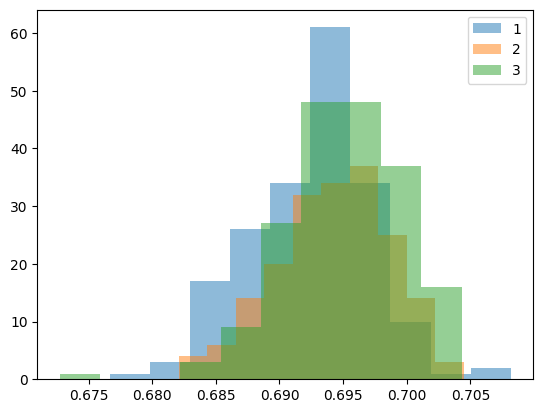

In [91]:
for value, group in grid_df.groupby('n_layers'):
    plt.hist(group['auc'], alpha = 0.5, label = str(value))
plt.legend()

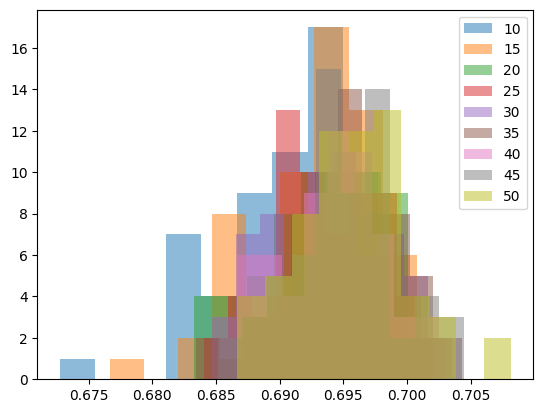

In [92]:
for value, group in grid_df.groupby('n_hidden'):
    plt.hist(group['auc'], alpha = 0.5, label = str(value))
plt.legend()

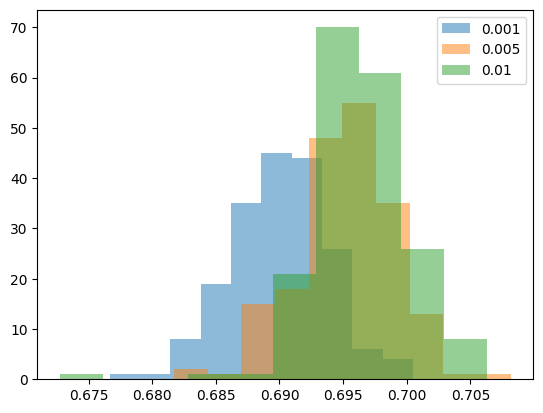

In [93]:
for value, group in grid_df.groupby('eta'):
    plt.hist(group['auc'], alpha = 0.5, label = str(value))
plt.legend()

In [11]:
grid_df_sorted = pd.read_csv('../../data/fnn_grid.csv', index_col = 0)
grid_best_model_paths = [os.path.join(model_dir, fname) for fname in grid_best_models]
best_params = grid_df_sorted[['n_layers', 'n_hidden', 'dropout', 'eta']].iloc[0]
#best_params = {'n_layers': 2, 'n_hidden': 40, 'dropout': 0.30, 'eta': 0.01}
fnncv = LOWOCVNN(data = pro_frames_merge_trunc,
                    features = best_features,
                    target_col = 'rush_win',
                    num_weeks = num_weeks,
                    model = model)
model = FNNModel(n_features = len(best_features),
                      n_classes = 2,
                      n_hidden = int(best_params['n_hidden']),
                      n_layers = int(best_params['n_layers']),
                      dropout = best_params['dropout']
                      )
fnncv.infer_saved_models(saved_model_names = grid_best_model_paths, 
                         scaler = scaler,
                         model = model)

In [12]:
fnncv.get_auc(), fnncv.get_avg_train_auc(), fnncv.get_f1()

(0.7051100684892591, 0.741581806238382, 0.5454057535422928)

In [26]:
fnncv.get_scores_by_frame('frame_from_overlap')

,count,pred,prob,f1_score,auc_score
frame_from_overlap,,,,,
-22,36,0.333333,0.465870,0.272727,0.453846
-21,93,0.344086,0.471789,0.360656,0.596444
-20,157,0.318471,0.467821,0.343434,0.590514
-19,232,0.366379,0.468329,0.400000,0.604145
-18,329,0.364742,0.475117,0.421053,0.618276
-17,440,0.375000,0.478993,0.463950,0.596563
-16,567,0.400353,0.483719,0.441315,0.597908
-15,664,0.450301,0.489306,0.460952,0.584000
-14,754,0.440318,0.489429,0.450847,0.566126


In [30]:
with open(os.path.join(json_dir, 'fnn_probs.json'), 'w') as outfile:
    outfile.write(json.dumps(fnncv.probs))

In [8]:
with open(os.path.join(json_dir, 'fnn_best_features.json'), 'r') as openfile:
    best_features = json.load(openfile)
model = LassoNetClassifier(hidden_dims = (40,40),
                           lambda_seq = lambda_seq,
                           batch_size = 2056,
                           optim = partial(torch.optim.Adam, lr=.01),
                           torch_seed = 0,
                           random_state = 0,
                           class_weight = (weight[1],weight[0]),
                           dropout = 0.3,
                           verbose=True)
lncv_bf = LOWOCVLN(data = pro_frames_merge_trunc,
                features = best_features,
                target_col = 'rush_win',
                num_weeks = num_weeks,
                model = model)
lncv_bf.run_cv(scaler = scaler)

FITTING FOR HOLDOUT WEEK 1
epoch: 0
loss: 0.6826726110724095
epoch: 1
loss: 0.6438485239707377
epoch: 2
loss: 0.6354051177240246
epoch: 3
loss: 0.6283379818150924
epoch: 4
loss: 0.6226781507956265
epoch: 5
loss: 0.6207196965810013
epoch: 6
loss: 0.6144250814566321
epoch: 7
loss: 0.6113911620375886
epoch: 8
loss: 0.610887756343019
epoch: 9
loss: 0.6080284241542542
epoch: 10
loss: 0.6038466017407974
epoch: 11
loss: 0.6011129451847239
epoch: 12
loss: 0.5971395452904231
epoch: 13
loss: 0.5982573075854457
epoch: 14
loss: 0.5926923381305513
epoch: 15
loss: 0.5917676300542245
epoch: 16
loss: 0.5892448094185037
epoch: 17
loss: 0.5893204412406998
epoch: 18
loss: 0.5865757366702588
epoch: 19
loss: 0.5879582937691816
epoch: 20
loss: 0.5856478762748378
epoch: 21
loss: 0.581491540569822
epoch: 22
loss: 0.5837904810006967
epoch: 23
loss: 0.5830705306491161
epoch: 24
loss: 0.5791132916043108
epoch: 25
loss: 0.578808970651921
epoch: 26
loss: 0.575842525163127
epoch: 27
loss: 0.5791279865360422
epoch: 

epoch: 6
loss: 0.5485646320670415
epoch: 7
loss: 0.5445393172314416
epoch: 8
loss: 0.5535282534518846
epoch: 9
loss: 0.5470201268092924
epoch: 10
loss: 0.5478029090182033
epoch: 11
loss: 0.5509289667318257
epoch: 12
loss: 0.5502899398080281
epoch: 13
loss: 0.544456582263007
epoch: 14
loss: 0.549315336896589
epoch: 15
loss: 0.5469084429445273
epoch: 16
loss: 0.5506167441251474
epoch: 17
loss: 0.5456883881928537
epoch: 18
loss: 0.5507738416455187
epoch: 19
loss: 0.5445595063752802
epoch: 20
loss: 0.5467051809326217
epoch: 21
loss: 0.5479526173596019
epoch: 22
loss: 0.5444139633855767
epoch: 23
loss: 0.5443346906050318
epoch: 24
loss: 0.5433159611852911
epoch: 25
loss: 0.5498158703457836
epoch: 26
loss: 0.5456825841119509
epoch: 27
loss: 0.5469234298680085
epoch: 28
loss: 0.5479292520606079
epoch: 29
loss: 0.5516693088337652
epoch: 30
loss: 0.5482689338097918
epoch: 31
loss: 0.5441908578527197
epoch: 32
loss: 0.5431085099856291
epoch: 33
loss: 0.5475058819005416
epoch: 34
loss: 0.55001999

epoch: 25
loss: 0.548265745736606
epoch: 26
loss: 0.5549121036571276
epoch: 27
loss: 0.5534940308270129
epoch: 28
loss: 0.5571117847701392
epoch: 29
loss: 0.556449219735904
epoch: 30
loss: 0.5583426789706448
epoch: 31
loss: 0.5530383985581085
epoch: 32
loss: 0.5529967271641111
epoch: 33
loss: 0.5566285503423624
epoch: 34
loss: 0.5540852902841603
epoch: 35
loss: 0.5513038841384824
epoch: 36
loss: 0.5533270711363188
epoch: 37
loss: 0.5537484629033055
epoch: 38
loss: 0.5519409028741237
epoch: 39
loss: 0.5551962831378012
epoch: 40
loss: 0.5603493892911748
epoch: 41
loss: 0.5515609739355991
epoch: 42
loss: 0.5517636340869595
epoch: 43
loss: 0.5523005949966873
epoch: 44
loss: 0.5564658811426846
epoch: 45
loss: 0.5566236937448922
epoch: 46
loss: 0.5546317081511702
epoch: 47
loss: 0.5581918503343697
epoch: 48
loss: 0.552074390775874
epoch: 49
loss: 0.555386584291428
epoch: 50
loss: 0.5577374456226173
epoch: 51
loss: 0.5548845551293927
epoch: 52
loss: 0.5537240309405727
epoch: 53
loss: 0.556229

epoch: 14
loss: 0.5630324061352233
epoch: 15
loss: 0.5637963101836617
epoch: 16
loss: 0.5659442908799245
epoch: 17
loss: 0.5648939548430291
epoch: 18
loss: 0.5610763176496725
epoch: 19
loss: 0.5633012590285434
epoch: 20
loss: 0.5629183446233532
epoch: 21
loss: 0.5623207149788494
epoch: 22
loss: 0.5624255578940494
epoch: 23
loss: 0.5636973845706553
epoch: 24
loss: 0.5621790274720455
epoch: 25
loss: 0.569052411957492
epoch: 26
loss: 0.5659807540945494
epoch: 27
loss: 0.5645891035382776
epoch: 28
loss: 0.5596100840578976
epoch: 29
loss: 0.5591885611925744
epoch: 30
loss: 0.5599002165948566
epoch: 31
loss: 0.5622608447521236
epoch: 32
loss: 0.5684281753096707
epoch: 33
loss: 0.5619425856629457
epoch: 34
loss: 0.5629468585115671
epoch: 35
loss: 0.5666314070571985
epoch: 36
loss: 0.5657862637531661
epoch: 37
loss: 0.5672588436962362
epoch: 38
loss: 0.5675058448804489
epoch: 39
loss: 0.5639960623355552
epoch: 40
loss: 0.5639907290168612
epoch: 0
loss: 0.5626200065223254
epoch: 1
loss: 0.56165

epoch: 6
loss: 0.578892510087421
epoch: 7
loss: 0.5832439439533808
epoch: 8
loss: 0.579344251119334
epoch: 9
loss: 0.5814577529530672
epoch: 10
loss: 0.5809334430328228
epoch: 11
loss: 0.5816016691315936
epoch: 12
loss: 0.5785237423845547
epoch: 13
loss: 0.582055638835229
epoch: 14
loss: 0.5778964964340064
epoch: 15
loss: 0.5798472754369245
epoch: 16
loss: 0.5826055725212662
epoch: 17
loss: 0.5793846592020878
epoch: 18
loss: 0.5770435885330374
epoch: 19
loss: 0.5827611683697821
epoch: 20
loss: 0.575759325391499
epoch: 21
loss: 0.5786793441920857
epoch: 22
loss: 0.5819426201510366
epoch: 23
loss: 0.5823670808109029
epoch: 24
loss: 0.5755795836129851
epoch: 25
loss: 0.5751435743814659
epoch: 26
loss: 0.5761645741860362
epoch: 27
loss: 0.5779628083562722
epoch: 28
loss: 0.5778908472875015
epoch: 29
loss: 0.5787264382900068
epoch: 30
loss: 0.5793537974618456
epoch: 31
loss: 0.5820333163639128
epoch: 32
loss: 0.5782158341049539
epoch: 33
loss: 0.5787160993984601
epoch: 34
loss: 0.5722972983

epoch: 20
loss: 0.5971184444172435
epoch: 21
loss: 0.5962670679832067
epoch: 22
loss: 0.5994015040723419
epoch: 23
loss: 0.599797140975199
epoch: 24
loss: 0.6019938247035144
epoch: 25
loss: 0.6045940708250366
epoch: 26
loss: 0.6035209475136313
epoch: 27
loss: 0.6023535287441084
epoch: 28
loss: 0.5998003290483849
epoch: 29
loss: 0.598870484300869
epoch: 30
loss: 0.5988144874340886
epoch: 31
loss: 0.599008131595299
epoch: 32
loss: 0.6005101192788779
epoch: 33
loss: 0.601234956023005
epoch: 34
loss: 0.5999619494613696
epoch: 35
loss: 0.6002023659336749
epoch: 36
loss: 0.6003995497499741
epoch: 37
loss: 0.600901394182535
epoch: 38
loss: 0.6033988770851972
epoch: 39
loss: 0.6011755386814421
epoch: 40
loss: 0.605129321497373
epoch: 41
loss: 0.6028894944982809
epoch: 42
loss: 0.6018025164763017
epoch: 43
loss: 0.6038249824332867
epoch: 44
loss: 0.6062419530802217
epoch: 45
loss: 0.6033018941111787
epoch: 46
loss: 0.6034414900036122
epoch: 47
loss: 0.6065902217704537
epoch: 48
loss: 0.60133313

epoch: 6
loss: 0.6169307103332105
epoch: 7
loss: 0.6157307076680234
epoch: 8
loss: 0.6199615846954353
epoch: 9
loss: 0.6191800479207225
epoch: 10
loss: 0.6169484503217605
epoch: 11
loss: 0.621529091752245
epoch: 12
loss: 0.6198118942310826
epoch: 13
loss: 0.6191975674257062
epoch: 14
loss: 0.619459495943247
epoch: 15
loss: 0.6207739891694058
epoch: 16
loss: 0.6213040912525225
epoch: 0
loss: 0.622771707335847
epoch: 1
loss: 0.6154380961806996
epoch: 2
loss: 0.6179224275365932
epoch: 3
loss: 0.6221088026377397
epoch: 4
loss: 0.6195135501710394
epoch: 5
loss: 0.6201355998602455
epoch: 6
loss: 0.615697623215074
epoch: 7
loss: 0.6157535843277627
epoch: 8
loss: 0.6218522849060919
epoch: 9
loss: 0.6185181085830936
epoch: 10
loss: 0.6172044794141536
epoch: 11
loss: 0.6209413779092015
epoch: 0
loss: 0.6241237900305223
epoch: 1
loss: 0.6173967708788909
epoch: 2
loss: 0.6176923916689416
epoch: 3
loss: 0.6226233278548604
epoch: 4
loss: 0.6195477549188653
epoch: 5
loss: 0.6182456624035473
epoch: 6


epoch: 3
loss: 0.6366814911293049
epoch: 4
loss: 0.6401797846926989
epoch: 5
loss: 0.6339986292196544
epoch: 6
loss: 0.6328807417853105
epoch: 7
loss: 0.6340683616167027
epoch: 8
loss: 0.6349601759285699
epoch: 9
loss: 0.6354768523502141
epoch: 10
loss: 0.6371332321612179
epoch: 11
loss: 0.6377868705905327
epoch: 12
loss: 0.638530895363928
epoch: 13
loss: 0.6343025211229425
epoch: 14
loss: 0.6359689359157126
epoch: 15
loss: 0.6364871378452739
epoch: 16
loss: 0.6340029018336248
epoch: 0
loss: 0.6364051060406448
epoch: 1
loss: 0.6390660208969432
epoch: 2
loss: 0.6398953728104286
epoch: 3
loss: 0.6415076082360851
epoch: 4
loss: 0.6390251480109959
epoch: 5
loss: 0.641507167268953
epoch: 6
loss: 0.6394759356004606
epoch: 7
loss: 0.6397251177842734
epoch: 8
loss: 0.6383687922707041
epoch: 9
loss: 0.6373305589938844
epoch: 10
loss: 0.6359643772690075
epoch: 11
loss: 0.6363970971240807
epoch: 12
loss: 0.6370033256276634
epoch: 13
loss: 0.6392623287379929
epoch: 14
loss: 0.6409654212699386
epoc

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.6407364282299648
epoch: 3
loss: 0.641506535613331
epoch: 4
loss: 0.64081660082182
epoch: 5
loss: 0.6398729669128983
epoch: 6
loss: 0.6455854339145147
epoch: 7
loss: 0.6438073114209183
epoch: 8
loss: 0.6447068307395692
epoch: 9
loss: 0.6425658935993916
epoch: 10
loss: 0.640462885591603
epoch: 11
loss: 0.6422223086951859
epoch: 12
loss: 0.6407940340308762
epoch: 13
loss: 0.6423164194238293
epoch: 14
loss: 0.6435277918902099
epoch: 15
loss: 0.6396757711785686
epoch: 16
loss: 0.6425499413154319
epoch: 17
loss: 0.6442557928714617
epoch: 18
loss: 0.6433208889199555
epoch: 19
loss: 0.642192620880958
epoch: 0
loss: 0.6438944977737824
epoch: 1
loss: 0.6416115632580054
epoch: 2
loss: 0.6429163313711932
epoch: 3
loss: 0.6458915425714947
epoch: 4
loss: 0.6427662297347848
epoch: 5
loss: 0.6469105461059392
epoch: 6
loss: 0.6423908713609959
epoch: 7
loss: 0.6461102801461363
epoch: 8
loss: 0.6455104575840018
epoch: 9
loss: 0.6406787151667779
epoch: 10
loss: 0.6420301662058312
epoch: 1

epoch: 93
loss: 0.5168491295958083
epoch: 94
loss: 0.5168166185844355
epoch: 95
loss: 0.5182615210607123
epoch: 96
loss: 0.5157643378011557
epoch: 97
loss: 0.5158678152865637
epoch: 98
loss: 0.5169696613901861
epoch: 99
loss: 0.5157890978803155
epoch: 100
loss: 0.5211919492530366
epoch: 0
loss: 0.5248023650912875
epoch: 1
loss: 0.5206574397739926
epoch: 2
loss: 0.5153798622080739
epoch: 3
loss: 0.5169657097131656
epoch: 4
loss: 0.5183660372726513
epoch: 5
loss: 0.5162920729767361
epoch: 6
loss: 0.5140743579613212
epoch: 7
loss: 0.5153594546188894
epoch: 8
loss: 0.5203480968515759
epoch: 9
loss: 0.5134548930715896
epoch: 10
loss: 0.5156951495817799
epoch: 0
loss: 0.5154898091532896
epoch: 1
loss: 0.5132635867417749
epoch: 2
loss: 0.5136306241486907
epoch: 3
loss: 0.5159189443419558
epoch: 4
loss: 0.5165318550930863
epoch: 5
loss: 0.5124373531745727
epoch: 6
loss: 0.5202043912940995
epoch: 7
loss: 0.5161151281702644
epoch: 8
loss: 0.5165841696515847
epoch: 9
loss: 0.5175481699702268
epoc

epoch: 24
loss: 0.5131575801830738
epoch: 25
loss: 0.5158896793509926
epoch: 26
loss: 0.5146413502254735
epoch: 27
loss: 0.5137905710987213
epoch: 28
loss: 0.5116198358778271
epoch: 29
loss: 0.5172046281058243
epoch: 30
loss: 0.5176575015828779
epoch: 31
loss: 0.5152187862074658
epoch: 32
loss: 0.5177001175969175
epoch: 33
loss: 0.5125416661574078
epoch: 34
loss: 0.51559927625201
epoch: 35
loss: 0.5156839550453061
epoch: 36
loss: 0.513945397804384
epoch: 37
loss: 0.5104291843010484
epoch: 38
loss: 0.51345303578339
epoch: 39
loss: 0.5189845424693923
epoch: 40
loss: 0.5151398712173667
epoch: 41
loss: 0.5121839885797776
epoch: 42
loss: 0.5118351796944322
epoch: 0
loss: 0.5181316181465432
epoch: 1
loss: 0.5172722525901506
epoch: 2
loss: 0.5154103239926489
epoch: 3
loss: 0.5147226926743138
epoch: 4
loss: 0.515121710438831
epoch: 5
loss: 0.5165747138529999
epoch: 6
loss: 0.5141507890401502
epoch: 7
loss: 0.5142065246218978
epoch: 8
loss: 0.5120599341475988
epoch: 9
loss: 0.5158597538654418
e

epoch: 23
loss: 0.5255401431910126
epoch: 24
loss: 0.5194347965491066
epoch: 25
loss: 0.5266613355762768
epoch: 26
loss: 0.5217009365437811
epoch: 27
loss: 0.5197493048779143
epoch: 28
loss: 0.5203484468572548
epoch: 29
loss: 0.5178639710619456
epoch: 30
loss: 0.5215368798496491
epoch: 31
loss: 0.5209305909801545
epoch: 0
loss: 0.5184200623427743
epoch: 1
loss: 0.5205568978200856
epoch: 2
loss: 0.5204128648379417
epoch: 3
loss: 0.5208473517263443
epoch: 4
loss: 0.5235689507238944
epoch: 5
loss: 0.5218399452508561
epoch: 6
loss: 0.5203026186943229
epoch: 7
loss: 0.5230948849675052
epoch: 8
loss: 0.5187460587612058
epoch: 9
loss: 0.5214630004251247
epoch: 10
loss: 0.5214750022327612
epoch: 11
loss: 0.5204550292317502
epoch: 12
loss: 0.5206157552266794
epoch: 13
loss: 0.5231172909762113
epoch: 14
loss: 0.5217832273951063
epoch: 15
loss: 0.5252766848840568
epoch: 16
loss: 0.5237587892879586
epoch: 17
loss: 0.5256684823701323
epoch: 18
loss: 0.5264657953067975
epoch: 19
loss: 0.522990447789

epoch: 14
loss: 0.5322651805327658
epoch: 15
loss: 0.534533522176066
epoch: 16
loss: 0.5355923006454182
epoch: 17
loss: 0.5303210683437437
epoch: 18
loss: 0.5286719827158183
epoch: 19
loss: 0.5335578926364779
epoch: 20
loss: 0.5325123692209031
epoch: 21
loss: 0.5331117313651061
epoch: 22
loss: 0.535220758326699
epoch: 23
loss: 0.5327310380914582
epoch: 24
loss: 0.5307579318836114
epoch: 25
loss: 0.5291899798301695
epoch: 26
loss: 0.5348562669288349
epoch: 27
loss: 0.532872790391436
epoch: 28
loss: 0.5358102751498681
epoch: 29
loss: 0.5349459248351769
epoch: 30
loss: 0.5362443160632927
epoch: 31
loss: 0.5351534894933045
epoch: 32
loss: 0.5359422272908352
epoch: 33
loss: 0.5361045678280897
epoch: 34
loss: 0.5363385466244728
epoch: 35
loss: 0.5369607042998311
epoch: 36
loss: 0.5320017222258099
epoch: 37
loss: 0.5335632499814671
epoch: 38
loss: 0.5334923004431906
epoch: 39
loss: 0.5346432207301547
epoch: 40
loss: 0.5342363560641253
epoch: 41
loss: 0.5298555438549716
epoch: 0
loss: 0.537699

epoch: 1
loss: 0.5478808984190626
epoch: 2
loss: 0.5484189023096434
epoch: 3
loss: 0.5503188291043236
epoch: 4
loss: 0.5500575780912462
epoch: 5
loss: 0.5486220806062783
epoch: 6
loss: 0.5519065790596381
epoch: 7
loss: 0.5526902361295709
epoch: 8
loss: 0.5512365327040442
epoch: 9
loss: 0.5542510356476058
epoch: 10
loss: 0.5546488961352813
epoch: 11
loss: 0.5539388475177344
epoch: 12
loss: 0.550542002886682
epoch: 13
loss: 0.5520896376749858
epoch: 14
loss: 0.5534622978500752
epoch: 15
loss: 0.5542068784795283
epoch: 16
loss: 0.5521638840409478
epoch: 17
loss: 0.5552568164828603
epoch: 18
loss: 0.5522757955341681
epoch: 19
loss: 0.5531092776060763
epoch: 20
loss: 0.5547813789300196
epoch: 21
loss: 0.5538977557219742
epoch: 22
loss: 0.5541049760196757
epoch: 23
loss: 0.5528155607436492
epoch: 24
loss: 0.5529508887458423
epoch: 25
loss: 0.5541032316365337
epoch: 26
loss: 0.5502579337614378
epoch: 27
loss: 0.5523755640884296
epoch: 28
loss: 0.5531659107830328
epoch: 29
loss: 0.555668457032

epoch: 20
loss: 0.565897293966823
epoch: 21
loss: 0.5631481235541757
epoch: 22
loss: 0.5635893113577543
epoch: 23
loss: 0.5652764234091225
epoch: 24
loss: 0.5624764570110032
epoch: 25
loss: 0.5676740921507977
epoch: 26
loss: 0.5655122877199699
epoch: 27
loss: 0.571001257425473
epoch: 28
loss: 0.5666037465582814
epoch: 29
loss: 0.5675167137908304
epoch: 30
loss: 0.5671954537395705
epoch: 31
loss: 0.5661917221311137
epoch: 32
loss: 0.5673439238904829
epoch: 33
loss: 0.5688625082074332
epoch: 34
loss: 0.567689927085144
epoch: 35
loss: 0.5668901076561974
epoch: 36
loss: 0.5666964811274463
epoch: 37
loss: 0.5661666402725395
epoch: 38
loss: 0.5659267791226488
epoch: 39
loss: 0.567328715579207
epoch: 40
loss: 0.5696020984333348
epoch: 41
loss: 0.569185512641835
epoch: 42
loss: 0.5651436752874988
epoch: 43
loss: 0.5687094033039009
epoch: 44
loss: 0.5674784389762604
epoch: 45
loss: 0.5671353938941119
epoch: 46
loss: 0.5655236967760532
epoch: 47
loss: 0.5678225002039285
epoch: 48
loss: 0.5707715

epoch: 9
loss: 0.5851850117551088
epoch: 10
loss: 0.5852718244539961
epoch: 11
loss: 0.5881668569107223
epoch: 12
loss: 0.5876141471363727
epoch: 13
loss: 0.5858288415562981
epoch: 14
loss: 0.5843352713548875
epoch: 15
loss: 0.5851724002601605
epoch: 16
loss: 0.5860251665159288
epoch: 17
loss: 0.5875214069219546
epoch: 18
loss: 0.5855283447451545
epoch: 19
loss: 0.5887189908692778
epoch: 20
loss: 0.5898284524190442
epoch: 21
loss: 0.5913531957068934
epoch: 22
loss: 0.5871294683045569
epoch: 23
loss: 0.5873111268971887
epoch: 24
loss: 0.5947360739823049
epoch: 25
loss: 0.5894761829936792
epoch: 26
loss: 0.5874436040466742
epoch: 27
loss: 0.5912405108140278
epoch: 28
loss: 0.5847741615405416
epoch: 29
loss: 0.587869583538977
epoch: 30
loss: 0.588471378787174
epoch: 31
loss: 0.5878486227150098
epoch: 32
loss: 0.5837962230925229
epoch: 0
loss: 0.5856553798708574
epoch: 1
loss: 0.5915863728773666
epoch: 2
loss: 0.5902515358966162
epoch: 3
loss: 0.5888023994806745
epoch: 4
loss: 0.5940560411

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.6039186592630992
epoch: 2
loss: 0.6056475123143095
epoch: 3
loss: 0.606801294744487
epoch: 4
loss: 0.6065214821399192
epoch: 5
loss: 0.6078518763066479
epoch: 6
loss: 0.6063565109148196
epoch: 7
loss: 0.6084933125206136
epoch: 8
loss: 0.6063485736892613
epoch: 9
loss: 0.6069131836566957
epoch: 10
loss: 0.6059281208995344
epoch: 11
loss: 0.6061241240797505
epoch: 12
loss: 0.6052344830321281
epoch: 13
loss: 0.6063265402672458
epoch: 0
loss: 0.6095537506943142
epoch: 1
loss: 0.6088233735211234
epoch: 2
loss: 0.6089369447186922
epoch: 3
loss: 0.60580741974757
epoch: 4
loss: 0.6035866337145849
epoch: 5
loss: 0.6055763651921822
epoch: 6
loss: 0.6089777486065552
epoch: 7
loss: 0.6057318580376854
epoch: 8
loss: 0.6059085600982829
epoch: 9
loss: 0.6099191566231459
epoch: 10
loss: 0.6067433349331023
epoch: 11
loss: 0.6062737007002288
epoch: 12
loss: 0.6065638215365672
epoch: 13
loss: 0.6076024690341263
epoch: 0
loss: 0.6072452487219802
epoch: 1
loss: 0.6133370975642347
epoch: 2


epoch: 96
loss: 0.5307924860664155
epoch: 97
loss: 0.5328743739195849
epoch: 98
loss: 0.5306368398534547
epoch: 99
loss: 0.5358673564266438
epoch: 100
loss: 0.5359255339013052
epoch: 101
loss: 0.5359057714355175
epoch: 102
loss: 0.5387018419719081
epoch: 103
loss: 0.5359244882372862
epoch: 0
loss: 0.5407347705505383
epoch: 1
loss: 0.5356207783359263
epoch: 2
loss: 0.5353868475223089
epoch: 3
loss: 0.5294587270060421
epoch: 4
loss: 0.53693385194216
epoch: 5
loss: 0.5360048641659805
epoch: 6
loss: 0.5356934256975979
epoch: 7
loss: 0.5377648802773719
epoch: 8
loss: 0.5317312061121788
epoch: 9
loss: 0.5336627812230539
epoch: 10
loss: 0.5324837161787973
epoch: 11
loss: 0.5302823889595343
epoch: 12
loss: 0.5285977307578859
epoch: 13
loss: 0.5356652278192778
epoch: 14
loss: 0.5277464609376149
epoch: 15
loss: 0.5327420536084538
epoch: 16
loss: 0.5345495393612851
epoch: 0
loss: 0.533340272736147
epoch: 1
loss: 0.5338449604302824
epoch: 2
loss: 0.5324401604753054
epoch: 3
loss: 0.531760946198884

epoch: 48
loss: 0.5309905897435633
epoch: 49
loss: 0.5326418976888766
epoch: 50
loss: 0.5277473488757762
epoch: 51
loss: 0.5315099342590589
epoch: 52
loss: 0.5297447716113507
epoch: 53
loss: 0.5320410322717948
epoch: 54
loss: 0.5259423049528885
epoch: 55
loss: 0.5342951859699576
epoch: 56
loss: 0.5293401580530145
epoch: 57
loss: 0.5305155720357524
epoch: 58
loss: 0.5283765815804328
epoch: 59
loss: 0.5336170465660477
epoch: 60
loss: 0.5300365410811204
epoch: 61
loss: 0.5262606541505134
epoch: 62
loss: 0.5292126688264849
epoch: 63
loss: 0.5317297690543652
epoch: 64
loss: 0.5333470491063255
epoch: 65
loss: 0.5282324201465847
epoch: 0
loss: 0.5287418863500354
epoch: 1
loss: 0.5306286906841452
epoch: 2
loss: 0.5310397885277383
epoch: 3
loss: 0.5278122267785366
epoch: 4
loss: 0.526756182061511
epoch: 5
loss: 0.5334531051413167
epoch: 6
loss: 0.5302371274801009
epoch: 7
loss: 0.5323720813218058
epoch: 8
loss: 0.5307948636376764
epoch: 9
loss: 0.5335375118419274
epoch: 10
loss: 0.5317137043836

epoch: 2
loss: 0.5378831921956687
epoch: 3
loss: 0.5420680622750373
epoch: 4
loss: 0.5398315271393384
epoch: 5
loss: 0.5434462299268731
epoch: 6
loss: 0.5431534323181798
epoch: 7
loss: 0.5420204991664228
epoch: 8
loss: 0.539755649318435
epoch: 9
loss: 0.5418199595010296
epoch: 10
loss: 0.5423024779496242
epoch: 11
loss: 0.5402255438567232
epoch: 12
loss: 0.5388715958865767
epoch: 13
loss: 0.5448591615260642
epoch: 14
loss: 0.54117012896771
epoch: 15
loss: 0.5413722575750759
epoch: 16
loss: 0.5407948991524751
epoch: 17
loss: 0.5440906218389547
epoch: 18
loss: 0.5402899836321011
epoch: 19
loss: 0.5420953488484024
epoch: 20
loss: 0.5434555883277575
epoch: 0
loss: 0.5397738462090436
epoch: 1
loss: 0.5374017077276961
epoch: 2
loss: 0.5429648214009801
epoch: 3
loss: 0.5387564793773212
epoch: 4
loss: 0.5366477722866608
epoch: 5
loss: 0.5441734162307987
epoch: 6
loss: 0.5368790743359848
epoch: 7
loss: 0.5383960699510024
epoch: 8
loss: 0.5403668545417374
epoch: 9
loss: 0.5448699102511749
epoch:

epoch: 9
loss: 0.5509962980121457
epoch: 10
loss: 0.5510521388074351
epoch: 11
loss: 0.5540276312693956
epoch: 12
loss: 0.5528168691694594
epoch: 13
loss: 0.5517033655066794
epoch: 14
loss: 0.5497920552476572
epoch: 15
loss: 0.5558313374433427
epoch: 16
loss: 0.5532115401570683
epoch: 17
loss: 0.5539893506195857
epoch: 18
loss: 0.5522385994419037
epoch: 19
loss: 0.5518785229923956
epoch: 20
loss: 0.55269667038257
epoch: 21
loss: 0.558286252791439
epoch: 22
loss: 0.5575058836650094
epoch: 23
loss: 0.5526161776199072
epoch: 24
loss: 0.5508194931674724
epoch: 25
loss: 0.555073546481344
epoch: 26
loss: 0.5553921527136996
epoch: 27
loss: 0.5554192757195087
epoch: 28
loss: 0.5544471820506164
epoch: 29
loss: 0.5559061520751319
epoch: 30
loss: 0.5572013909760598
epoch: 31
loss: 0.5588292386604794
epoch: 32
loss: 0.5557354225968256
epoch: 33
loss: 0.5541793401776147
epoch: 34
loss: 0.5518228632897574
epoch: 35
loss: 0.5498922462174249
epoch: 36
loss: 0.5506419814772892
epoch: 0
loss: 0.55172754

epoch: 9
loss: 0.56288460412736
epoch: 10
loss: 0.5643572378845024
epoch: 11
loss: 0.567490853439558
epoch: 12
loss: 0.5633271244668066
epoch: 13
loss: 0.569343320270298
epoch: 14
loss: 0.5702091884949446
epoch: 15
loss: 0.5670600865973521
epoch: 16
loss: 0.5701802136707332
epoch: 17
loss: 0.5720300108452908
epoch: 18
loss: 0.5654699938098836
epoch: 0
loss: 0.5690060614948562
epoch: 1
loss: 0.5688598437831608
epoch: 2
loss: 0.5644210409147518
epoch: 3
loss: 0.5674029475615879
epoch: 4
loss: 0.566912297468779
epoch: 5
loss: 0.5616358651459324
epoch: 6
loss: 0.5665804539477817
epoch: 7
loss: 0.5655366767974586
epoch: 8
loss: 0.5701749035668606
epoch: 9
loss: 0.5618358206414826
epoch: 10
loss: 0.5620165160573101
epoch: 11
loss: 0.5700876578008132
epoch: 12
loss: 0.5676781967081985
epoch: 13
loss: 0.5716548569721357
epoch: 14
loss: 0.5666953426307987
epoch: 15
loss: 0.5713172769032803
epoch: 16
loss: 0.5697661015107505
epoch: 17
loss: 0.5663746859622941
epoch: 18
loss: 0.5666705270958693
e

epoch: 12
loss: 0.587511837749534
epoch: 13
loss: 0.5852465906660531
epoch: 14
loss: 0.59258191791705
epoch: 15
loss: 0.5900431858798844
epoch: 16
loss: 0.5911482950220208
epoch: 17
loss: 0.5888181408272878
epoch: 18
loss: 0.5898971609442373
epoch: 19
loss: 0.5897532039698341
epoch: 20
loss: 0.5864821215673311
epoch: 21
loss: 0.5854461956596975
epoch: 22
loss: 0.5869349174543154
epoch: 23
loss: 0.585670493512604
epoch: 24
loss: 0.5873853124032451
epoch: 25
loss: 0.587429820303581
epoch: 0
loss: 0.5854084290793494
epoch: 1
loss: 0.5858275826250772
epoch: 2
loss: 0.5909920880060107
epoch: 3
loss: 0.5885619122507643
epoch: 4
loss: 0.5903296043538924
epoch: 5
loss: 0.5918038387364047
epoch: 6
loss: 0.5866009767635818
epoch: 7
loss: 0.5883817659545892
epoch: 8
loss: 0.5871691695613462
epoch: 9
loss: 0.5882916986482002
epoch: 10
loss: 0.5923311863787488
epoch: 11
loss: 0.5920625208262688
epoch: 12
loss: 0.5925171159563694
epoch: 13
loss: 0.5896985023057385
epoch: 14
loss: 0.5885566138302885


epoch: 32
loss: 0.6096855229810442
epoch: 0
loss: 0.6098238602415578
epoch: 1
loss: 0.6112465533188248
epoch: 2
loss: 0.611930581154752
epoch: 3
loss: 0.6091445641813589
epoch: 4
loss: 0.6088111141932933
epoch: 5
loss: 0.6092654581303615
epoch: 6
loss: 0.6144755696509356
epoch: 7
loss: 0.6105674441929756
epoch: 8
loss: 0.6085199464184617
epoch: 9
loss: 0.6079678767083632
epoch: 10
loss: 0.6087660922234956
epoch: 11
loss: 0.6080709534771552
epoch: 0
loss: 0.6053463502793535
epoch: 1
loss: 0.6066838655518172
epoch: 2
loss: 0.6109269072641487
epoch: 3
loss: 0.6077918312844859
epoch: 4
loss: 0.6084437706709386
epoch: 5
loss: 0.6165692752600286
epoch: 6
loss: 0.6114469644668525
epoch: 7
loss: 0.6136864146100679
epoch: 8
loss: 0.6102807570008397
epoch: 9
loss: 0.6105556322787509
epoch: 10
loss: 0.6151301962186662
epoch: 11
loss: 0.6133943063217893
epoch: 12
loss: 0.6115965177883512
epoch: 13
loss: 0.6102411970190739
epoch: 14
loss: 0.6082725446482657
epoch: 15
loss: 0.611259673773498
epoch: 

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 2
loss: 0.6210979760255722
epoch: 3
loss: 0.6274167309158329
epoch: 4
loss: 0.6289782461145832
epoch: 5
loss: 0.6243737785204064
epoch: 6
loss: 0.6233174884520469
epoch: 7
loss: 0.6220349669286005
epoch: 8
loss: 0.6275831842708888
epoch: 9
loss: 0.6287639842995789
epoch: 10
loss: 0.6219279178048762
epoch: 11
loss: 0.6221261850495802
epoch: 12
loss: 0.6307055428730701
epoch: 13
loss: 0.6227127850390967
epoch: 14
loss: 0.6241735134148395
epoch: 15
loss: 0.6269857537724834
epoch: 16
loss: 0.6219069344241168
epoch: 17
loss: 0.6255227880262423
epoch: 18
loss: 0.6266990724220463
epoch: 19
loss: 0.626652958054642
epoch: 20
loss: 0.6281292428733032
epoch: 21
loss: 0.6248593229687878
epoch: 22
loss: 0.6238147922393671
epoch: 23
loss: 0.6228501292108773
epoch: 24
loss: 0.6242740023112271
epoch: 25
loss: 0.6218073334658905
epoch: 26
loss: 0.6299947250081446
epoch: 27
loss: 0.6217564347474724
epoch: 0
loss: 0.6273206232932677
epoch: 1
loss: 0.629665002023677
epoch: 2
loss: 0.624484811682459

epoch: 75
loss: 0.4911275325686883
epoch: 76
loss: 0.4904882965825282
epoch: 77
loss: 0.4871448818086868
epoch: 78
loss: 0.4939373593701407
epoch: 79
loss: 0.4925558116419013
epoch: 80
loss: 0.4881351891176595
epoch: 81
loss: 0.491306376273332
epoch: 82
loss: 0.4908245265757352
epoch: 83
loss: 0.4909206751814394
epoch: 84
loss: 0.48673222584730474
epoch: 85
loss: 0.489138937969407
epoch: 86
loss: 0.48691144641763373
epoch: 87
loss: 0.48875219601038367
epoch: 88
loss: 0.49292007326369847
epoch: 89
loss: 0.48892265894002634
epoch: 90
loss: 0.49094699595945834
epoch: 91
loss: 0.4865714417855791
epoch: 92
loss: 0.48449101159899166
epoch: 93
loss: 0.4898388792408708
epoch: 94
loss: 0.48637365908475166
epoch: 95
loss: 0.4852281489153923
epoch: 96
loss: 0.48729832596254224
epoch: 97
loss: 0.484852647124982
epoch: 98
loss: 0.48926196966066055
epoch: 99
loss: 0.4917771772261558
epoch: 100
loss: 0.4865702752965532
epoch: 0
loss: 0.4903812487819261
epoch: 1
loss: 0.49056458496481814
epoch: 2
loss

epoch: 23
loss: 0.4766729209940497
epoch: 24
loss: 0.47885747378568194
epoch: 25
loss: 0.48260295040775275
epoch: 26
loss: 0.4827448732392299
epoch: 27
loss: 0.4827927471452494
epoch: 28
loss: 0.47727326803068665
epoch: 29
loss: 0.48002028388459395
epoch: 30
loss: 0.4794208820031674
epoch: 31
loss: 0.47898203686765656
epoch: 32
loss: 0.4821602229574841
epoch: 33
loss: 0.4832254846638609
epoch: 34
loss: 0.4788638266643765
epoch: 0
loss: 0.482129487467152
epoch: 1
loss: 0.477088944818619
epoch: 2
loss: 0.47920737861946877
epoch: 3
loss: 0.480237113257515
epoch: 4
loss: 0.4802215181965387
epoch: 5
loss: 0.4800528319194123
epoch: 6
loss: 0.48346233577406134
epoch: 7
loss: 0.4769974023490682
epoch: 8
loss: 0.4808100926670073
epoch: 9
loss: 0.4843160382451157
epoch: 10
loss: 0.4854699232074812
epoch: 11
loss: 0.47834998525749667
epoch: 12
loss: 0.47698603057656497
epoch: 13
loss: 0.47933557277241107
epoch: 14
loss: 0.4802308201987705
epoch: 15
loss: 0.47819542845257046
epoch: 16
loss: 0.4815

epoch: 49
loss: 0.4884136988410701
epoch: 50
loss: 0.48594745988668
epoch: 51
loss: 0.4877437632565477
epoch: 52
loss: 0.4881613005258534
epoch: 53
loss: 0.4884944557736282
epoch: 54
loss: 0.4876019181910058
epoch: 55
loss: 0.4895008307211825
epoch: 56
loss: 0.4904184567908529
epoch: 57
loss: 0.4818719027622666
epoch: 58
loss: 0.4849143454214564
epoch: 59
loss: 0.4905513707378536
epoch: 60
loss: 0.4885586904359843
epoch: 61
loss: 0.4844586908799834
epoch: 62
loss: 0.4921963774900726
epoch: 63
loss: 0.48480795564030477
epoch: 64
loss: 0.486722756349213
epoch: 65
loss: 0.48563841207877245
epoch: 66
loss: 0.4840455443950111
epoch: 67
loss: 0.48548256914492033
epoch: 68
loss: 0.48845644019537576
epoch: 69
loss: 0.484073288887841
epoch: 70
loss: 0.4882801268746189
epoch: 71
loss: 0.48632972731344004
epoch: 72
loss: 0.4859130155594452
epoch: 73
loss: 0.4864203006998003
epoch: 74
loss: 0.48493125053933855
epoch: 75
loss: 0.48454803795736767
epoch: 76
loss: 0.4891874519488919
epoch: 77
loss: 0

epoch: 3
loss: 0.5005850666704954
epoch: 4
loss: 0.5032196449463016
epoch: 5
loss: 0.4985955628079734
epoch: 6
loss: 0.5025551290492533
epoch: 7
loss: 0.502199098652582
epoch: 8
loss: 0.4989650945673694
epoch: 9
loss: 0.5017931245796198
epoch: 10
loss: 0.5024030966462188
epoch: 11
loss: 0.4999959717664614
epoch: 12
loss: 0.5064685441990749
epoch: 13
loss: 0.5033715098534759
epoch: 14
loss: 0.5073200991339228
epoch: 15
loss: 0.5051633626190606
epoch: 16
loss: 0.4996432613770175
epoch: 17
loss: 0.49791378885533766
epoch: 18
loss: 0.5005268080211485
epoch: 19
loss: 0.5047205334748769
epoch: 20
loss: 0.5035200068974628
epoch: 21
loss: 0.505045798471241
epoch: 22
loss: 0.5010896599130985
epoch: 23
loss: 0.5008025420988769
epoch: 24
loss: 0.5023876092611528
epoch: 25
loss: 0.5016913768265916
epoch: 26
loss: 0.5002683678909774
epoch: 27
loss: 0.501537789104856
epoch: 28
loss: 0.49839480705562894
epoch: 29
loss: 0.503235551071018
epoch: 30
loss: 0.5039883971062998
epoch: 31
loss: 0.50190619624

epoch: 3
loss: 0.5196085764795475
epoch: 4
loss: 0.5158534150075647
epoch: 5
loss: 0.5169113846620311
epoch: 6
loss: 0.5143409872106262
epoch: 7
loss: 0.5180043968432329
epoch: 8
loss: 0.5163787478268478
epoch: 9
loss: 0.5165133128044697
epoch: 10
loss: 0.5180566794795705
epoch: 11
loss: 0.5176969701559716
epoch: 12
loss: 0.5175539765473887
epoch: 13
loss: 0.5160582684264872
epoch: 14
loss: 0.5156543043038465
epoch: 15
loss: 0.517162514794307
epoch: 16
loss: 0.5161827298145468
epoch: 17
loss: 0.5172647171789555
epoch: 18
loss: 0.5169143038755932
epoch: 19
loss: 0.5139251667738869
epoch: 20
loss: 0.517807170467941
epoch: 21
loss: 0.5198517804684426
epoch: 22
loss: 0.5211217639898515
epoch: 23
loss: 0.5173084455624369
epoch: 24
loss: 0.5160392397003785
epoch: 25
loss: 0.5182523206261863
epoch: 26
loss: 0.5151392784619557
epoch: 27
loss: 0.5184083190919085
epoch: 28
loss: 0.5187857710126903
epoch: 29
loss: 0.5157894854269538
epoch: 30
loss: 0.5174298920250144
epoch: 31
loss: 0.51483547686

epoch: 10
loss: 0.5314748864917332
epoch: 11
loss: 0.5343286211365172
epoch: 12
loss: 0.5342207837125746
epoch: 13
loss: 0.5374561576746433
epoch: 0
loss: 0.5389266576685966
epoch: 1
loss: 0.5356338266445116
epoch: 2
loss: 0.5369272655683326
epoch: 3
loss: 0.5373847446182819
epoch: 4
loss: 0.5360707575416211
epoch: 5
loss: 0.5368711544551923
epoch: 6
loss: 0.5420155505189949
epoch: 7
loss: 0.5410457494888968
epoch: 8
loss: 0.5448325856244274
epoch: 9
loss: 0.5376425925309474
epoch: 10
loss: 0.5370486402469699
epoch: 11
loss: 0.5371788443502337
epoch: 12
loss: 0.5386480821432411
epoch: 13
loss: 0.5419194198592756
epoch: 14
loss: 0.5436256343843788
epoch: 15
loss: 0.5419297986206082
epoch: 16
loss: 0.5439567736998371
epoch: 17
loss: 0.5416895198272702
epoch: 18
loss: 0.541559836157572
epoch: 19
loss: 0.5441930565205121
epoch: 20
loss: 0.5425983523642843
epoch: 21
loss: 0.5419484325350465
epoch: 22
loss: 0.5388429695584863
epoch: 23
loss: 0.5405897240637337
epoch: 24
loss: 0.5392667221206

epoch: 12
loss: 0.5545445339737676
epoch: 13
loss: 0.5520198030722254
epoch: 14
loss: 0.5516820835622623
epoch: 15
loss: 0.5541937916606801
epoch: 16
loss: 0.5510219165755822
epoch: 17
loss: 0.5532315758002476
epoch: 18
loss: 0.5543898994029063
epoch: 19
loss: 0.5549172062805408
epoch: 20
loss: 0.5515038799310841
epoch: 0
loss: 0.5513986267289833
epoch: 1
loss: 0.5538041005781197
epoch: 2
loss: 0.5584777555090485
epoch: 3
loss: 0.5533261750692458
epoch: 4
loss: 0.5567337945954683
epoch: 5
loss: 0.553646157964021
epoch: 6
loss: 0.5566426349735977
epoch: 7
loss: 0.5551657701369597
epoch: 8
loss: 0.5544430135365496
epoch: 9
loss: 0.556811075988929
epoch: 10
loss: 0.5543398480507054
epoch: 11
loss: 0.5517477239934445
epoch: 0
loss: 0.5549137307414433
epoch: 1
loss: 0.557624076965974
epoch: 2
loss: 0.5551039462185903
epoch: 3
loss: 0.546710339838274
epoch: 4
loss: 0.5601494599049717
epoch: 5
loss: 0.5584861123560695
epoch: 6
loss: 0.5565448772112374
epoch: 7
loss: 0.5549767032028536
epoch: 

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 4
loss: 0.5768665457381689
epoch: 5
loss: 0.5760771856053807
epoch: 6
loss: 0.576892980174093
epoch: 7
loss: 0.5772916861231249
epoch: 8
loss: 0.5720850174913273
epoch: 9
loss: 0.5707212661982257
epoch: 10
loss: 0.5735930903959028
epoch: 11
loss: 0.5752520830524419
epoch: 12
loss: 0.5773816314000095
epoch: 13
loss: 0.5756152679151383
epoch: 14
loss: 0.5728798930235095
epoch: 15
loss: 0.5793714523082667
epoch: 0
loss: 0.576369376151366
epoch: 1
loss: 0.5716628621218784
epoch: 2
loss: 0.5749998163411152
epoch: 3
loss: 0.575203802370762
epoch: 4
loss: 0.5791537196540999
epoch: 5
loss: 0.5697330645514944
epoch: 6
loss: 0.5767648458411005
epoch: 7
loss: 0.5753762931967112
epoch: 8
loss: 0.5773706125652116
epoch: 9
loss: 0.5830334741180325
epoch: 10
loss: 0.5771887060791256
epoch: 11
loss: 0.5830404491242076
epoch: 12
loss: 0.5792944281405913
epoch: 13
loss: 0.5727063194564646
epoch: 14
loss: 0.5775347226161598
epoch: 15
loss: 0.5728864732180142
epoch: 16
loss: 0.5824532206026148
epoc

epoch: 0
loss: 0.5266693837471214
epoch: 1
loss: 0.5242699340959711
epoch: 2
loss: 0.5268492573568094
epoch: 3
loss: 0.5278088799068034
epoch: 4
loss: 0.5252023775311147
epoch: 5
loss: 0.5262597909267459
epoch: 6
loss: 0.5307349521791552
epoch: 7
loss: 0.5267408796316233
epoch: 8
loss: 0.5242982270148522
epoch: 9
loss: 0.5265457974297851
epoch: 10
loss: 0.5225570757346065
epoch: 11
loss: 0.5253468562859119
epoch: 12
loss: 0.5260632734104351
epoch: 13
loss: 0.5278898431255656
epoch: 14
loss: 0.5247943692979167
epoch: 15
loss: 0.5254746853928287
epoch: 16
loss: 0.5255801006289438
epoch: 0
loss: 0.5284856708693711
epoch: 1
loss: 0.5229571552906586
epoch: 2
loss: 0.5277572659983739
epoch: 3
loss: 0.5200956606870514
epoch: 4
loss: 0.5244053933346235
epoch: 5
loss: 0.526511619721567
epoch: 6
loss: 0.5210587337330371
epoch: 7
loss: 0.5210718467660574
epoch: 8
loss: 0.5272601362189523
epoch: 9
loss: 0.523644906314538
epoch: 10
loss: 0.5247525959055104
epoch: 11
loss: 0.523693000831881
epoch: 1

epoch: 14
loss: 0.5233116550003234
epoch: 15
loss: 0.5286212793807287
epoch: 16
loss: 0.5240989135059492
epoch: 17
loss: 0.5207988212471072
epoch: 18
loss: 0.5243016832521018
epoch: 19
loss: 0.5206454952139016
epoch: 20
loss: 0.5199815761515229
epoch: 21
loss: 0.5228178436679621
epoch: 22
loss: 0.5214099838907363
epoch: 23
loss: 0.5247012805424912
epoch: 24
loss: 0.5251113211809821
epoch: 25
loss: 0.5212572893958987
epoch: 26
loss: 0.5210887030992221
epoch: 27
loss: 0.5195027896910591
epoch: 28
loss: 0.5242246011236731
epoch: 29
loss: 0.522448146848663
epoch: 30
loss: 0.5253839620356539
epoch: 31
loss: 0.521000218832624
epoch: 32
loss: 0.5271463559700919
epoch: 33
loss: 0.520147268854223
epoch: 34
loss: 0.5231051821428317
epoch: 35
loss: 0.5305542346045574
epoch: 36
loss: 0.5241943217295622
epoch: 37
loss: 0.5292442288268057
epoch: 38
loss: 0.5229122931015076
epoch: 39
loss: 0.5232395964725483
epoch: 40
loss: 0.5230507492767784
epoch: 41
loss: 0.5267419991769118
epoch: 42
loss: 0.52704

epoch: 8
loss: 0.5332999337777848
epoch: 9
loss: 0.5346577297862114
epoch: 10
loss: 0.528351652686449
epoch: 11
loss: 0.5312245034981623
epoch: 12
loss: 0.529986906464917
epoch: 13
loss: 0.5290407471646746
epoch: 14
loss: 0.532063611303791
epoch: 15
loss: 0.5315512212608983
epoch: 16
loss: 0.530730594564417
epoch: 17
loss: 0.5313567017023333
epoch: 18
loss: 0.5316295664660627
epoch: 19
loss: 0.5335416177699146
epoch: 20
loss: 0.5322341209218608
epoch: 21
loss: 0.532590475057824
epoch: 22
loss: 0.5329691454632048
epoch: 23
loss: 0.5337077295844408
epoch: 24
loss: 0.5312424506703258
epoch: 25
loss: 0.5390542243230144
epoch: 26
loss: 0.5336616215423275
epoch: 27
loss: 0.5346052604303563
epoch: 28
loss: 0.5347872181166584
epoch: 29
loss: 0.5367279182973804
epoch: 0
loss: 0.5354380758173378
epoch: 1
loss: 0.5329916626766488
epoch: 2
loss: 0.5331697737201646
epoch: 3
loss: 0.5312858029086519
epoch: 4
loss: 0.5361310284208655
epoch: 5
loss: 0.5332268475648474
epoch: 6
loss: 0.533449838021288


epoch: 3
loss: 0.5482300117664244
epoch: 4
loss: 0.5507263279206916
epoch: 5
loss: 0.5468297821209341
epoch: 6
loss: 0.5514936240726345
epoch: 7
loss: 0.5559131123472862
epoch: 8
loss: 0.5518437317200136
epoch: 9
loss: 0.5488741809016621
epoch: 10
loss: 0.5546634299661829
epoch: 11
loss: 0.5519785020077191
epoch: 12
loss: 0.5524615312577634
epoch: 13
loss: 0.5543417702516478
epoch: 14
loss: 0.5515091082451633
epoch: 15
loss: 0.5530266317893426
epoch: 16
loss: 0.5496911561581256
epoch: 17
loss: 0.5494077561861683
epoch: 18
loss: 0.5538103823863978
epoch: 19
loss: 0.5589751318652112
epoch: 20
loss: 0.5523062187493281
epoch: 21
loss: 0.5515472474213253
epoch: 22
loss: 0.551707658166767
epoch: 23
loss: 0.5503841259854269
epoch: 24
loss: 0.5513940132482461
epoch: 25
loss: 0.5520141437366992
epoch: 26
loss: 0.5489910269822358
epoch: 27
loss: 0.5501012656917111
epoch: 28
loss: 0.5538925971993799
epoch: 29
loss: 0.5567275327439888
epoch: 30
loss: 0.5528024471512609
epoch: 31
loss: 0.5491231792

epoch: 11
loss: 0.5726889014048608
epoch: 12
loss: 0.5696286444531081
epoch: 13
loss: 0.5715449844766038
epoch: 14
loss: 0.568807432148322
epoch: 15
loss: 0.5681790055422181
epoch: 16
loss: 0.5692277324146621
epoch: 17
loss: 0.5686032500527285
epoch: 18
loss: 0.5676651399960476
epoch: 19
loss: 0.570097469831133
epoch: 20
loss: 0.5698790953460358
epoch: 21
loss: 0.5711512834580672
epoch: 22
loss: 0.5684633757867588
epoch: 23
loss: 0.5664688915021248
epoch: 24
loss: 0.5674208781791253
epoch: 25
loss: 0.5694388499497864
epoch: 26
loss: 0.5667915789018222
epoch: 27
loss: 0.5662559252819599
epoch: 28
loss: 0.5692225652825612
epoch: 29
loss: 0.5709091172002746
epoch: 30
loss: 0.5696760787257938
epoch: 31
loss: 0.5702770621191844
epoch: 32
loss: 0.5706360974225821
epoch: 33
loss: 0.5731400896386482
epoch: 34
loss: 0.5723601914256371
epoch: 35
loss: 0.5712640819518285
epoch: 36
loss: 0.567684040217021
epoch: 37
loss: 0.5694861693973143
epoch: 0
loss: 0.5743746208401803
epoch: 1
loss: 0.5756422

epoch: 15
loss: 0.5832555487608847
epoch: 16
loss: 0.5841594351792844
epoch: 17
loss: 0.5860734212870451
epoch: 0
loss: 0.5937654954539889
epoch: 1
loss: 0.5837165028743426
epoch: 2
loss: 0.5854116953851803
epoch: 3
loss: 0.5886758416283743
epoch: 4
loss: 0.5906008624337993
epoch: 5
loss: 0.589376338244769
epoch: 6
loss: 0.5870500035128456
epoch: 7
loss: 0.5850754126867999
epoch: 8
loss: 0.5868675922671702
epoch: 9
loss: 0.5868455458368733
epoch: 10
loss: 0.5880407149743128
epoch: 11
loss: 0.5877857514526839
epoch: 12
loss: 0.5839739982907011
epoch: 13
loss: 0.5856266882693805
epoch: 14
loss: 0.585512437237373
epoch: 15
loss: 0.5870678416011093
epoch: 16
loss: 0.5895658284614225
epoch: 17
loss: 0.5890054127962815
epoch: 18
loss: 0.5891010449289521
epoch: 19
loss: 0.5887129473781162
epoch: 20
loss: 0.5873195555707726
epoch: 21
loss: 0.5856926610637923
epoch: 22
loss: 0.5919716509088304
epoch: 23
loss: 0.589079790792244
epoch: 24
loss: 0.5900540478085992
epoch: 25
loss: 0.590154571492992

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.6038262805773408
epoch: 2
loss: 0.6035185778607359
epoch: 3
loss: 0.6013232815988898
epoch: 4
loss: 0.6032560473612081
epoch: 5
loss: 0.6039932133917452
epoch: 6
loss: 0.6033428322154706
epoch: 7
loss: 0.6021808877374395
epoch: 8
loss: 0.6035292106703478
epoch: 9
loss: 0.6053615675734312
epoch: 10
loss: 0.6081100971867982
epoch: 11
loss: 0.607457769724099
epoch: 12
loss: 0.6061460013801752
epoch: 13
loss: 0.6050567240032554
epoch: 14
loss: 0.6060588663091814
epoch: 15
loss: 0.6042141771841507
epoch: 16
loss: 0.6031922103147312
epoch: 17
loss: 0.6054755028362546
epoch: 18
loss: 0.6082313238471418
epoch: 19
loss: 0.6068408371162907
epoch: 20
loss: 0.6096895689036087
epoch: 21
loss: 0.6062310294095234
epoch: 22
loss: 0.606647810284777
epoch: 0
loss: 0.607023925830397
epoch: 1
loss: 0.6074585964652353
epoch: 2
loss: 0.6063021463710047
epoch: 3
loss: 0.605481783772386
epoch: 4
loss: 0.6064716971990068
epoch: 5
loss: 0.6102601121476674
epoch: 6
loss: 0.6064237921431741
epoch

epoch: 52
loss: 0.547014196904147
epoch: 53
loss: 0.5478253789494529
epoch: 54
loss: 0.5512444044996286
epoch: 55
loss: 0.5431043075482569
epoch: 56
loss: 0.5438191228645796
epoch: 57
loss: 0.5455482577446003
epoch: 58
loss: 0.5463725094504629
epoch: 59
loss: 0.5431778640206083
epoch: 60
loss: 0.5467353833503036
epoch: 61
loss: 0.5458800897327772
epoch: 62
loss: 0.5396113556296764
epoch: 63
loss: 0.5461529790783989
epoch: 64
loss: 0.541188063978829
epoch: 65
loss: 0.5436130614059553
epoch: 66
loss: 0.542316892792229
epoch: 67
loss: 0.539008900643126
epoch: 68
loss: 0.5428750248373857
epoch: 69
loss: 0.5432643962116614
epoch: 70
loss: 0.5423024727175089
epoch: 71
loss: 0.5364624951113317
epoch: 72
loss: 0.5413120085135782
epoch: 73
loss: 0.5407331446753283
epoch: 74
loss: 0.5379434003826301
epoch: 75
loss: 0.5372436744767435
epoch: 76
loss: 0.5385423677778189
epoch: 77
loss: 0.5394171367161298
epoch: 78
loss: 0.5393542778725
epoch: 79
loss: 0.537873354987104
epoch: 80
loss: 0.5358967713

epoch: 51
loss: 0.5300897262753449
epoch: 52
loss: 0.530704434802588
epoch: 53
loss: 0.5293019005237023
epoch: 54
loss: 0.5288218576453938
epoch: 55
loss: 0.5341765551148543
epoch: 56
loss: 0.5305068692104622
epoch: 0
loss: 0.5325702198532267
epoch: 1
loss: 0.5325563751723676
epoch: 2
loss: 0.5310379283873228
epoch: 3
loss: 0.5286990110560732
epoch: 4
loss: 0.534101184390431
epoch: 5
loss: 0.5321513272510628
epoch: 6
loss: 0.525483651447223
epoch: 7
loss: 0.5302023155883885
epoch: 8
loss: 0.526253739802396
epoch: 9
loss: 0.5289533468853609
epoch: 10
loss: 0.5303715459685437
epoch: 11
loss: 0.5311223586293736
epoch: 12
loss: 0.5321943291351228
epoch: 13
loss: 0.5297434507269839
epoch: 14
loss: 0.5297370920376835
epoch: 15
loss: 0.5318942671079845
epoch: 16
loss: 0.5310690290126457
epoch: 17
loss: 0.5329484180181407
epoch: 18
loss: 0.5298678649710074
epoch: 19
loss: 0.5342676552285998
epoch: 20
loss: 0.5314713584915255
epoch: 21
loss: 0.530280463468896
epoch: 22
loss: 0.5328581222815274


epoch: 39
loss: 0.5363392844973235
epoch: 40
loss: 0.5353993962395004
epoch: 41
loss: 0.5425682459676252
epoch: 42
loss: 0.536689300105781
epoch: 43
loss: 0.5397607642784572
epoch: 44
loss: 0.5372061270916311
epoch: 45
loss: 0.5347376463284389
epoch: 46
loss: 0.5359865563178071
epoch: 47
loss: 0.537656930567616
epoch: 48
loss: 0.5397500196788083
epoch: 49
loss: 0.5413108107549287
epoch: 50
loss: 0.5398211747624948
epoch: 51
loss: 0.5387168178022845
epoch: 52
loss: 0.5419387415982426
epoch: 53
loss: 0.5415385727820246
epoch: 54
loss: 0.5406403418654635
epoch: 55
loss: 0.539132293269478
epoch: 56
loss: 0.5400464649445346
epoch: 57
loss: 0.5364825340832454
epoch: 58
loss: 0.5401321281734305
epoch: 59
loss: 0.5385180544515092
epoch: 60
loss: 0.5381862987910893
epoch: 61
loss: 0.5398468267602361
epoch: 62
loss: 0.5413256300825322
epoch: 63
loss: 0.5406178369198598
epoch: 64
loss: 0.5352877052454439
epoch: 65
loss: 0.53687085448302
epoch: 66
loss: 0.5357924841884087
epoch: 67
loss: 0.5412917

epoch: 17
loss: 0.553652985587619
epoch: 18
loss: 0.5463482019955191
epoch: 19
loss: 0.5504375848792072
epoch: 20
loss: 0.5509829525748356
epoch: 21
loss: 0.5471419108558222
epoch: 22
loss: 0.5507344117837192
epoch: 23
loss: 0.5541901568564112
epoch: 24
loss: 0.5515300347093148
epoch: 0
loss: 0.5496139672808649
epoch: 1
loss: 0.5502461842213064
epoch: 2
loss: 0.5498247845458911
epoch: 3
loss: 0.5519752545163018
epoch: 4
loss: 0.5521923541428715
epoch: 5
loss: 0.5496058002108585
epoch: 6
loss: 0.5511073726902249
epoch: 7
loss: 0.5547498154567092
epoch: 8
loss: 0.5541765822583846
epoch: 9
loss: 0.5533238602991349
epoch: 10
loss: 0.5480563584850775
epoch: 11
loss: 0.5520009417422387
epoch: 12
loss: 0.5532917204420427
epoch: 13
loss: 0.5520813383558968
epoch: 14
loss: 0.5523875359604302
epoch: 15
loss: 0.5520690789438382
epoch: 16
loss: 0.554263754428324
epoch: 17
loss: 0.5520232999036941
epoch: 18
loss: 0.5549998123465757
epoch: 19
loss: 0.551528296785
epoch: 20
loss: 0.5542067669506227
e

epoch: 11
loss: 0.564535897003823
epoch: 12
loss: 0.5655892963791406
epoch: 13
loss: 0.5661326267107916
epoch: 14
loss: 0.5652366210419175
epoch: 15
loss: 0.5660289971021548
epoch: 16
loss: 0.5656142320702384
epoch: 17
loss: 0.5636823236965136
epoch: 0
loss: 0.56445246489398
epoch: 1
loss: 0.5627265827506838
epoch: 2
loss: 0.5626259240532069
epoch: 3
loss: 0.5618958666709339
epoch: 4
loss: 0.5643702246714205
epoch: 5
loss: 0.5591545200475836
epoch: 6
loss: 0.5642115510072047
epoch: 7
loss: 0.5648853724466151
epoch: 8
loss: 0.5700039764207274
epoch: 9
loss: 0.5670090866024899
epoch: 10
loss: 0.5651082260117946
epoch: 11
loss: 0.5634405936898743
epoch: 12
loss: 0.5648182216344916
epoch: 13
loss: 0.5671878520809128
epoch: 14
loss: 0.5640813475963757
epoch: 15
loss: 0.567275869727546
epoch: 16
loss: 0.5684116326241074
epoch: 17
loss: 0.5614150840005184
epoch: 18
loss: 0.5637158198391353
epoch: 19
loss: 0.5672219001319317
epoch: 20
loss: 0.560752829151987
epoch: 21
loss: 0.5619261687904905


epoch: 21
loss: 0.5736999308162833
epoch: 22
loss: 0.5769219720395602
epoch: 23
loss: 0.5779404367876034
epoch: 24
loss: 0.5774541056763857
epoch: 25
loss: 0.5814234778404967
epoch: 26
loss: 0.5817932505953033
epoch: 27
loss: 0.5806604820953652
epoch: 28
loss: 0.5812627550695719
epoch: 29
loss: 0.5791482530868387
epoch: 30
loss: 0.5825942634348213
epoch: 31
loss: 0.5822116911022907
epoch: 32
loss: 0.5801407076838191
epoch: 33
loss: 0.5804375463310627
epoch: 34
loss: 0.577503542577503
epoch: 35
loss: 0.5776081174760542
epoch: 36
loss: 0.5780873442344987
epoch: 0
loss: 0.5782859020874663
epoch: 1
loss: 0.5802240106236116
epoch: 2
loss: 0.5793078485555053
epoch: 3
loss: 0.5813576069861457
epoch: 4
loss: 0.5779209673381848
epoch: 5
loss: 0.5789880411247496
epoch: 6
loss: 0.575360241544891
epoch: 7
loss: 0.5830390781175592
epoch: 8
loss: 0.5790660598352066
epoch: 9
loss: 0.5779438656653056
epoch: 10
loss: 0.5769785720071101
epoch: 11
loss: 0.5758561312398403
epoch: 12
loss: 0.57858586430138

epoch: 14
loss: 0.5951329117855746
epoch: 15
loss: 0.5985904123966791
epoch: 16
loss: 0.5992742327722658
epoch: 17
loss: 0.6014811559260783
epoch: 18
loss: 0.5995259147441538
epoch: 19
loss: 0.5969132273623934
epoch: 20
loss: 0.5956084043552886
epoch: 21
loss: 0.5890488673691184
epoch: 22
loss: 0.5936878923028307
epoch: 0
loss: 0.5960213081642055
epoch: 1
loss: 0.5955168873745621
epoch: 2
loss: 0.5941394884132161
epoch: 3
loss: 0.5986209845990684
epoch: 4
loss: 0.600420593484328
epoch: 5
loss: 0.5988576828451072
epoch: 6
loss: 0.5959825277922481
epoch: 7
loss: 0.5961954411349107
epoch: 8
loss: 0.5977337155226958
epoch: 9
loss: 0.5946489938057533
epoch: 10
loss: 0.5955023440011573
epoch: 11
loss: 0.5976972308548166
epoch: 12
loss: 0.5948684478500603
epoch: 13
loss: 0.5974662160909966
epoch: 14
loss: 0.5999711462938726
epoch: 15
loss: 0.6006819632099981
epoch: 16
loss: 0.5979165674718051
epoch: 17
loss: 0.5955255358965746
epoch: 18
loss: 0.5937921501476219
epoch: 19
loss: 0.5977254662535

epoch: 6
loss: 0.62207763752018
epoch: 7
loss: 0.6216048751356228
epoch: 8
loss: 0.6215244491651352
epoch: 9
loss: 0.6184445184827903
epoch: 10
loss: 0.6217655568069862
epoch: 11
loss: 0.6207947205793543
epoch: 12
loss: 0.625412373741087
epoch: 13
loss: 0.6233301466568625
epoch: 14
loss: 0.6220741792856482
epoch: 15
loss: 0.6206674058805621
epoch: 16
loss: 0.6195282317203963
epoch: 17
loss: 0.6205500607611165
epoch: 18
loss: 0.6202206360329701
epoch: 19
loss: 0.6219994133119155
epoch: 20
loss: 0.621353815528523
epoch: 21
loss: 0.6225223817465267
epoch: 22
loss: 0.6236575516351295
epoch: 23
loss: 0.6279995676519863
epoch: 24
loss: 0.620633211045395
epoch: 25
loss: 0.6204981285294796
epoch: 26
loss: 0.623265467689795
epoch: 27
loss: 0.6224460246326275
epoch: 28
loss: 0.6212881384292477
epoch: 29
loss: 0.6189268629365425
epoch: 30
loss: 0.6248499614701686
epoch: 31
loss: 0.6215200104124933
epoch: 32
loss: 0.6240275181450119
epoch: 33
loss: 0.6254526865395517
epoch: 34
loss: 0.625443092727

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 1
loss: 0.62351722598944
epoch: 2
loss: 0.6278983218179164
epoch: 3
loss: 0.6270531563066166
epoch: 4
loss: 0.6257280829584246
epoch: 5
loss: 0.6251371475918259
epoch: 6
loss: 0.6218674250058445
epoch: 7
loss: 0.626204685216299
epoch: 8
loss: 0.6232435968517115
epoch: 9
loss: 0.6253124430929851
epoch: 10
loss: 0.6260692034475005
epoch: 11
loss: 0.6291267113833648
epoch: 12
loss: 0.6269923641837937
epoch: 13
loss: 0.6268649496717807
epoch: 14
loss: 0.6282690105058079
epoch: 15
loss: 0.6327910660874939
epoch: 16
loss: 0.629226383691366
epoch: 17
loss: 0.6319927423335712
epoch: 18
loss: 0.6303857083793982
epoch: 19
loss: 0.6294885988937297
epoch: 20
loss: 0.6304395253194982
epoch: 21
loss: 0.6262487028466645
epoch: 22
loss: 0.628508221696464
epoch: 23
loss: 0.6250843287839338
epoch: 24
loss: 0.6277101386685442
epoch: 25
loss: 0.6253257476081789
epoch: 26
loss: 0.6284584853556843
epoch: 27
loss: 0.6289797569655421
epoch: 0
loss: 0.6263530311478468
epoch: 1
loss: 0.6269849838768217
e

epoch: 94
loss: 0.5200323097808416
epoch: 95
loss: 0.51719435209676
epoch: 96
loss: 0.5189487080342174
epoch: 97
loss: 0.5201856808106518
epoch: 98
loss: 0.5211591594907458
epoch: 99
loss: 0.5217565226869055
epoch: 100
loss: 0.519472522683925
epoch: 101
loss: 0.5168041413554727
epoch: 102
loss: 0.5208396557370429
epoch: 0
loss: 0.5235255140592432
epoch: 1
loss: 0.5215807849313554
epoch: 2
loss: 0.5188818385578163
epoch: 3
loss: 0.5171030564677962
epoch: 4
loss: 0.5190129779062683
epoch: 5
loss: 0.5189044697454708
epoch: 6
loss: 0.5147251949925972
epoch: 7
loss: 0.5214020255577619
epoch: 8
loss: 0.5161271638693772
epoch: 9
loss: 0.5161954681923351
epoch: 10
loss: 0.5218229420153672
epoch: 11
loss: 0.5171910547631038
epoch: 12
loss: 0.5200654012812383
epoch: 13
loss: 0.517261682974799
epoch: 0
loss: 0.5213273291340643
epoch: 1
loss: 0.5181914185288798
epoch: 2
loss: 0.5202484933287487
epoch: 3
loss: 0.5220849337429595
epoch: 4
loss: 0.5168849710448451
epoch: 5
loss: 0.5160060628199743
ep

epoch: 48
loss: 0.5190442575612089
epoch: 49
loss: 0.5178906240489092
epoch: 50
loss: 0.517997562318768
epoch: 51
loss: 0.5157811238946454
epoch: 52
loss: 0.5165253703634384
epoch: 53
loss: 0.5192495025141879
epoch: 54
loss: 0.5221788514836705
epoch: 55
loss: 0.5159279340182384
epoch: 56
loss: 0.5197037355461596
epoch: 57
loss: 0.5189185312417285
epoch: 58
loss: 0.5165218929706064
epoch: 59
loss: 0.5201478289957956
epoch: 60
loss: 0.5185496181248249
epoch: 61
loss: 0.5189000526688152
epoch: 62
loss: 0.5127129774348916
epoch: 63
loss: 0.520583352754035
epoch: 64
loss: 0.5168690751957342
epoch: 65
loss: 0.5187330646638377
epoch: 66
loss: 0.5165515689735127
epoch: 67
loss: 0.5186241626235932
epoch: 68
loss: 0.517333419675795
epoch: 69
loss: 0.5167022728767817
epoch: 70
loss: 0.512856968507014
epoch: 71
loss: 0.5206214690308054
epoch: 72
loss: 0.5168355616816445
epoch: 73
loss: 0.5189593934209294
epoch: 74
loss: 0.517280662337295
epoch: 75
loss: 0.5148730517101494
epoch: 76
loss: 0.5155164

epoch: 13
loss: 0.5228390103173796
epoch: 14
loss: 0.5246820735331491
epoch: 15
loss: 0.5256219599232639
epoch: 16
loss: 0.5238992099980031
epoch: 17
loss: 0.5265805612139599
epoch: 18
loss: 0.5277454821858405
epoch: 19
loss: 0.529793829742534
epoch: 20
loss: 0.5251784122780042
epoch: 21
loss: 0.526969072646776
epoch: 22
loss: 0.5238392671730199
epoch: 23
loss: 0.5226892517247834
epoch: 24
loss: 0.5248440592691498
epoch: 25
loss: 0.5276561840883578
epoch: 26
loss: 0.5279315733439973
epoch: 27
loss: 0.5289797765820352
epoch: 28
loss: 0.5229468826442126
epoch: 29
loss: 0.5266009304082188
epoch: 30
loss: 0.525869113649403
epoch: 31
loss: 0.5264078169422071
epoch: 32
loss: 0.5252926541981802
epoch: 33
loss: 0.5264436205839387
epoch: 34
loss: 0.5258502862118368
epoch: 35
loss: 0.525534743760001
epoch: 36
loss: 0.5265951797682926
epoch: 37
loss: 0.524872941886313
epoch: 38
loss: 0.5255542239120794
epoch: 39
loss: 0.5264853267905261
epoch: 40
loss: 0.5208440896942463
epoch: 41
loss: 0.5248478

epoch: 19
loss: 0.542273596170668
epoch: 20
loss: 0.540775228112661
epoch: 21
loss: 0.5444121196133259
epoch: 22
loss: 0.5387897324620092
epoch: 23
loss: 0.5384912731244744
epoch: 24
loss: 0.536607139536082
epoch: 25
loss: 0.5407204732426796
epoch: 26
loss: 0.5413035329880642
epoch: 27
loss: 0.5365221909930639
epoch: 28
loss: 0.5404247654344245
epoch: 29
loss: 0.5428400735913341
epoch: 30
loss: 0.5416271668491112
epoch: 31
loss: 0.5414819716312509
epoch: 32
loss: 0.5375382536682273
epoch: 33
loss: 0.5385818935315293
epoch: 34
loss: 0.5399220289619804
epoch: 35
loss: 0.5418507890917171
epoch: 0
loss: 0.5429036963757221
epoch: 1
loss: 0.5476577200176488
epoch: 2
loss: 0.5375579588942754
epoch: 3
loss: 0.5427715892092004
epoch: 4
loss: 0.5409732763254587
epoch: 5
loss: 0.5415430904677259
epoch: 6
loss: 0.5429963762095997
epoch: 7
loss: 0.5405046160520286
epoch: 8
loss: 0.5397702221962598
epoch: 9
loss: 0.5386648557967646
epoch: 10
loss: 0.5434480884131104
epoch: 11
loss: 0.541128391678533

epoch: 7
loss: 0.5516576839657031
epoch: 8
loss: 0.5506601955198903
epoch: 9
loss: 0.554511363066569
epoch: 10
loss: 0.5557239434515359
epoch: 11
loss: 0.5584911828943343
epoch: 12
loss: 0.5538635326595509
epoch: 13
loss: 0.5511881065158466
epoch: 14
loss: 0.5548420473697172
epoch: 15
loss: 0.5522757427133779
epoch: 0
loss: 0.553134051043171
epoch: 1
loss: 0.5556488475215419
epoch: 2
loss: 0.5537909237969222
epoch: 3
loss: 0.5545015385877912
epoch: 4
loss: 0.5532736981876779
epoch: 5
loss: 0.5522487000759172
epoch: 6
loss: 0.551155920938178
epoch: 7
loss: 0.5525668252515554
epoch: 8
loss: 0.5552815436835219
epoch: 9
loss: 0.5558186883390855
epoch: 10
loss: 0.5561831618719365
epoch: 11
loss: 0.551059662428182
epoch: 12
loss: 0.5515659381887998
epoch: 13
loss: 0.5535411760932821
epoch: 14
loss: 0.551994479027129
epoch: 15
loss: 0.5506464266197933
epoch: 16
loss: 0.5543675801878686
epoch: 17
loss: 0.5551786454914195
epoch: 18
loss: 0.5555888371743678
epoch: 19
loss: 0.5548131872599509
epo

epoch: 9
loss: 0.5809693202493365
epoch: 10
loss: 0.5790733308895893
epoch: 11
loss: 0.5764242384003413
epoch: 12
loss: 0.5814680222708735
epoch: 13
loss: 0.5771538156731584
epoch: 14
loss: 0.5790045876723905
epoch: 15
loss: 0.579120371349259
epoch: 16
loss: 0.5779745591574067
epoch: 17
loss: 0.5770345039618147
epoch: 18
loss: 0.5791955798162377
epoch: 19
loss: 0.5756283543360475
epoch: 0
loss: 0.5765800458558735
epoch: 1
loss: 0.5786880267608416
epoch: 2
loss: 0.5789195884877292
epoch: 3
loss: 0.5755921905759642
epoch: 4
loss: 0.5764917380838575
epoch: 5
loss: 0.5772181755747972
epoch: 6
loss: 0.57659864821947
epoch: 7
loss: 0.5750844574613925
epoch: 8
loss: 0.5737829222167466
epoch: 9
loss: 0.5731691680087427
epoch: 10
loss: 0.5786756139314122
epoch: 11
loss: 0.5751847954370896
epoch: 0
loss: 0.5774113678166982
epoch: 1
loss: 0.5767769011766316
epoch: 2
loss: 0.5750932916147037
epoch: 3
loss: 0.5795185159479785
epoch: 4
loss: 0.578379000200429
epoch: 5
loss: 0.5780039200567555
epoch:

epoch: 10
loss: 0.5959839597539395
epoch: 11
loss: 0.5992827563910035
epoch: 12
loss: 0.5949919180981936
epoch: 13
loss: 0.6020921184272334
epoch: 14
loss: 0.6002486219440721
epoch: 15
loss: 0.597168743503647
epoch: 16
loss: 0.5960935032549977
epoch: 17
loss: 0.5964091694975168
epoch: 18
loss: 0.5987488640543022
epoch: 19
loss: 0.5990723234830226
epoch: 20
loss: 0.5939918806896737
epoch: 21
loss: 0.6013566048284652
epoch: 22
loss: 0.5962336849501828
epoch: 23
loss: 0.5968209985935949
epoch: 24
loss: 0.5987259515241856
epoch: 25
loss: 0.59561620576798
epoch: 26
loss: 0.5996829547896968
epoch: 27
loss: 0.5961962213879245
epoch: 28
loss: 0.59544983108957
epoch: 0
loss: 0.5969608764389208
epoch: 1
loss: 0.5985693169218147
epoch: 2
loss: 0.5930244171114203
epoch: 3
loss: 0.597200124441874
epoch: 4
loss: 0.5980416309998282
epoch: 5
loss: 0.600970107807678
epoch: 6
loss: 0.5980507858835462
epoch: 7
loss: 0.5957547556768846
epoch: 8
loss: 0.5996864434362273
epoch: 9
loss: 0.599388873140873
epo

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 4
loss: 0.60111462217678
epoch: 5
loss: 0.6003442164858575
epoch: 6
loss: 0.6015644887737391
epoch: 7
loss: 0.6010271978200952
epoch: 8
loss: 0.602721301455861
epoch: 9
loss: 0.5994428346251109
epoch: 10
loss: 0.6014563182238961
epoch: 11
loss: 0.6041873601455159
epoch: 12
loss: 0.6001941090286083
epoch: 13
loss: 0.6006660947699406
epoch: 14
loss: 0.6021201907781055
epoch: 15
loss: 0.5990415840056095
epoch: 16
loss: 0.6040190385772679
epoch: 17
loss: 0.6006823507374031
epoch: 18
loss: 0.600859084445269
epoch: 19
loss: 0.6053088418412425
epoch: 20
loss: 0.6032824502502943
epoch: 21
loss: 0.6046758550625267
epoch: 22
loss: 0.6026711606022588
epoch: 23
loss: 0.603122726507689
epoch: 24
loss: 0.5997603014593879
epoch: 25
loss: 0.6015454137548062
epoch: 26
loss: 0.60527557028167
epoch: 27
loss: 0.6039683012776458
epoch: 0
loss: 0.6053953433946515
epoch: 1
loss: 0.6019960287227146
epoch: 2
loss: 0.6059428695870681
epoch: 3
loss: 0.6024508075590628
epoch: 4
loss: 0.6004480318543864
epo

epoch: 100
loss: 0.5236086984061052
epoch: 101
loss: 0.5214679117912023
epoch: 102
loss: 0.5235963793634211
epoch: 0
loss: 0.5261641369387837
epoch: 1
loss: 0.5255970454068702
epoch: 2
loss: 0.5223289069902572
epoch: 3
loss: 0.5215122011405933
epoch: 4
loss: 0.522475898672857
epoch: 5
loss: 0.5209439198305278
epoch: 6
loss: 0.5213262371076168
epoch: 7
loss: 0.5212844810179275
epoch: 8
loss: 0.5227112584236568
epoch: 9
loss: 0.5165875784368529
epoch: 10
loss: 0.518427914758419
epoch: 11
loss: 0.5215371580181937
epoch: 12
loss: 0.5205016183793342
epoch: 13
loss: 0.5186495322869271
epoch: 0
loss: 0.5197377694202997
epoch: 1
loss: 0.5260356124347731
epoch: 2
loss: 0.52293873375943
epoch: 3
loss: 0.521185786358494
epoch: 4
loss: 0.5226876734911984
epoch: 5
loss: 0.518554384191076
epoch: 6
loss: 0.5226242566078799
epoch: 7
loss: 0.5204420497736751
epoch: 8
loss: 0.5192667652827784
epoch: 9
loss: 0.5200301815952122
epoch: 10
loss: 0.5232052668363566
epoch: 11
loss: 0.5224480555870122
epoch: 1

epoch: 34
loss: 0.5195238939888573
epoch: 35
loss: 0.5191341363287794
epoch: 36
loss: 0.51714446292462
epoch: 37
loss: 0.5189315040162378
epoch: 38
loss: 0.5236153475012323
epoch: 39
loss: 0.5165720031592265
epoch: 40
loss: 0.5214612911596673
epoch: 41
loss: 0.518381075071171
epoch: 42
loss: 0.5227776525987142
epoch: 43
loss: 0.5195063034889065
epoch: 44
loss: 0.5183192919980423
epoch: 45
loss: 0.5147343139517306
epoch: 46
loss: 0.5193972936236765
epoch: 47
loss: 0.5166462077439709
epoch: 48
loss: 0.520066444211616
epoch: 49
loss: 0.5201431023580041
epoch: 50
loss: 0.5166650392565397
epoch: 51
loss: 0.5178812999347009
epoch: 52
loss: 0.5189555443661706
epoch: 53
loss: 0.518750242168685
epoch: 54
loss: 0.5204097606747361
epoch: 55
loss: 0.5194754660331672
epoch: 56
loss: 0.5226161672549899
epoch: 57
loss: 0.5189167883390943
epoch: 58
loss: 0.5261111263447567
epoch: 59
loss: 0.5210780801257847
epoch: 60
loss: 0.5197577622474284
epoch: 61
loss: 0.5216934914517382
epoch: 62
loss: 0.5212731

epoch: 19
loss: 0.5284848533051264
epoch: 20
loss: 0.5246583958357018
epoch: 21
loss: 0.522920665071131
epoch: 22
loss: 0.5231710194422773
epoch: 23
loss: 0.5263934624080471
epoch: 24
loss: 0.5241456697648017
epoch: 25
loss: 0.5220119136571607
epoch: 26
loss: 0.5265009693956112
epoch: 27
loss: 0.5226762937470553
epoch: 0
loss: 0.5259641403548754
epoch: 1
loss: 0.5266448073122002
epoch: 2
loss: 0.5282824828576326
epoch: 3
loss: 0.5236205620313148
epoch: 4
loss: 0.5255324842871473
epoch: 5
loss: 0.5251635505910889
epoch: 6
loss: 0.5234757734307478
epoch: 7
loss: 0.525578657926339
epoch: 8
loss: 0.526483310583039
epoch: 9
loss: 0.5259715124252432
epoch: 10
loss: 0.5248884044311768
epoch: 11
loss: 0.5265363325625028
epoch: 12
loss: 0.5251259046441067
epoch: 13
loss: 0.532986097153737
epoch: 14
loss: 0.5328059283081229
epoch: 15
loss: 0.5286928709293035
epoch: 16
loss: 0.5269839908617397
epoch: 17
loss: 0.526887738378513
epoch: 18
loss: 0.5255047436702344
epoch: 19
loss: 0.5249893477143903


epoch: 7
loss: 0.5392924337041092
epoch: 8
loss: 0.5406756845847172
epoch: 9
loss: 0.5385020282135953
epoch: 10
loss: 0.5382958208738791
epoch: 11
loss: 0.5384318597662182
epoch: 12
loss: 0.5416381183334892
epoch: 13
loss: 0.538461291120505
epoch: 14
loss: 0.5399382327610458
epoch: 15
loss: 0.5387071880931201
epoch: 16
loss: 0.5418479917838748
epoch: 17
loss: 0.5445676026233768
epoch: 18
loss: 0.5411133293922343
epoch: 19
loss: 0.5397985106798822
epoch: 0
loss: 0.540687815767693
epoch: 1
loss: 0.5401509241070546
epoch: 2
loss: 0.5416723543421315
epoch: 3
loss: 0.5421124982530398
epoch: 4
loss: 0.5400964960261384
epoch: 5
loss: 0.5431265137235126
epoch: 6
loss: 0.5403501578666932
epoch: 7
loss: 0.5393298690205096
epoch: 8
loss: 0.5369251224374109
epoch: 9
loss: 0.541763477686052
epoch: 10
loss: 0.5448541911473347
epoch: 11
loss: 0.5440371323491281
epoch: 12
loss: 0.5405606802869797
epoch: 13
loss: 0.5431689301685398
epoch: 14
loss: 0.5410308589803284
epoch: 15
loss: 0.542229335606112
ep

epoch: 17
loss: 0.5521890823710516
epoch: 18
loss: 0.5581110010312339
epoch: 19
loss: 0.5553006710308197
epoch: 20
loss: 0.5541813516548154
epoch: 21
loss: 0.5530804937646819
epoch: 22
loss: 0.5566679026017638
epoch: 23
loss: 0.55766235219899
epoch: 24
loss: 0.5547810112288711
epoch: 25
loss: 0.5592621256251107
epoch: 26
loss: 0.5554749536055763
epoch: 27
loss: 0.5568746507497306
epoch: 28
loss: 0.5550740723736848
epoch: 29
loss: 0.5568388037017724
epoch: 30
loss: 0.5535161233498747
epoch: 31
loss: 0.5533095232125869
epoch: 32
loss: 0.5547512667750705
epoch: 33
loss: 0.5567709464980781
epoch: 34
loss: 0.5606453878911554
epoch: 35
loss: 0.5567336933486675
epoch: 0
loss: 0.5536570124383167
epoch: 1
loss: 0.5530618273409477
epoch: 2
loss: 0.5530451818322561
epoch: 3
loss: 0.5598777361962092
epoch: 4
loss: 0.5602415976801458
epoch: 5
loss: 0.561782684871964
epoch: 6
loss: 0.5612538028661576
epoch: 7
loss: 0.5589448078070636
epoch: 8
loss: 0.5530143159129247
epoch: 9
loss: 0.554095232210395

epoch: 17
loss: 0.5739205681774305
epoch: 18
loss: 0.5763118116324116
epoch: 0
loss: 0.5787007780000204
epoch: 1
loss: 0.577509941002371
epoch: 2
loss: 0.5802223505530582
epoch: 3
loss: 0.579535837173905
epoch: 4
loss: 0.5768874080856606
epoch: 5
loss: 0.5804815229450537
epoch: 6
loss: 0.5780579448493862
epoch: 7
loss: 0.5761644271522401
epoch: 8
loss: 0.581221815435222
epoch: 9
loss: 0.580934777186508
epoch: 10
loss: 0.5789323350149086
epoch: 11
loss: 0.5770946287292574
epoch: 12
loss: 0.5810419539964032
epoch: 13
loss: 0.5791256312692238
epoch: 14
loss: 0.578932870130441
epoch: 15
loss: 0.5810852414273505
epoch: 16
loss: 0.5765711491132416
epoch: 17
loss: 0.5752750423663712
epoch: 18
loss: 0.5791162098202209
epoch: 19
loss: 0.576396297266642
epoch: 20
loss: 0.5803711012856531
epoch: 21
loss: 0.5820955964798723
epoch: 22
loss: 0.5796099051334072
epoch: 23
loss: 0.5778346650470962
epoch: 24
loss: 0.5791091053076195
epoch: 25
loss: 0.5787708553639026
epoch: 26
loss: 0.5791536508293399
e

epoch: 21
loss: 0.595265581022266
epoch: 22
loss: 0.5941612448811714
epoch: 23
loss: 0.596204555078385
epoch: 24
loss: 0.5933614691761204
epoch: 25
loss: 0.5935714052464086
epoch: 26
loss: 0.5957187954146913
epoch: 27
loss: 0.5959755256304803
epoch: 28
loss: 0.594313206306961
epoch: 0
loss: 0.5953960467432613
epoch: 1
loss: 0.5960344395735196
epoch: 2
loss: 0.59333299419853
epoch: 3
loss: 0.5930779547201152
epoch: 4
loss: 0.5925560007526389
epoch: 5
loss: 0.5997226778394464
epoch: 6
loss: 0.5939333539769527
epoch: 7
loss: 0.5949973913642761
epoch: 8
loss: 0.5946198047362031
epoch: 9
loss: 0.5977934952613319
epoch: 10
loss: 0.59876972815958
epoch: 11
loss: 0.5955048573633461
epoch: 12
loss: 0.6008050799364274
epoch: 13
loss: 0.5964069539894711
epoch: 14
loss: 0.5975270931169293
epoch: 15
loss: 0.5975239450436372
epoch: 16
loss: 0.5970750912735299
epoch: 17
loss: 0.5955986107431819
epoch: 18
loss: 0.5972215079915679
epoch: 19
loss: 0.5983593856296565
epoch: 20
loss: 0.6010376787187884
ep

C:\Users\surma\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\lassonet\interfaces.py:486: RuntimeWarning: divide by zero encountered in double_scalars
  if current_lambda / lambda_start < 2:


epoch: 4
loss: 0.6017636654075402
epoch: 5
loss: 0.5988209455473011
epoch: 6
loss: 0.5969940383485132
epoch: 7
loss: 0.598134022292421
epoch: 8
loss: 0.5985836445795165
epoch: 9
loss: 0.5998100496819211
epoch: 10
loss: 0.6017083492625489
epoch: 0
loss: 0.5979341224847261
epoch: 1
loss: 0.5977864989103805
epoch: 2
loss: 0.6019982395631966
epoch: 3
loss: 0.5981651443840817
epoch: 4
loss: 0.6024553819313391
epoch: 5
loss: 0.6014034757269915
epoch: 6
loss: 0.6004780104917087
epoch: 7
loss: 0.6004853484057658
epoch: 8
loss: 0.6002268135982344
epoch: 9
loss: 0.6003012743553083
epoch: 10
loss: 0.600411957879757
epoch: 11
loss: 0.60161732838756
epoch: 12
loss: 0.602396012570825
epoch: 13
loss: 0.6004295085306788
epoch: 14
loss: 0.6040807668976795
epoch: 15
loss: 0.6043210166936115
epoch: 16
loss: 0.6027343649834735
epoch: 17
loss: 0.6017678324774314
epoch: 18
loss: 0.6039353065563376
epoch: 0
loss: 0.6026180798240892
epoch: 1
loss: 0.6036329662804819
epoch: 2
loss: 0.6008732445469169
epoch: 3


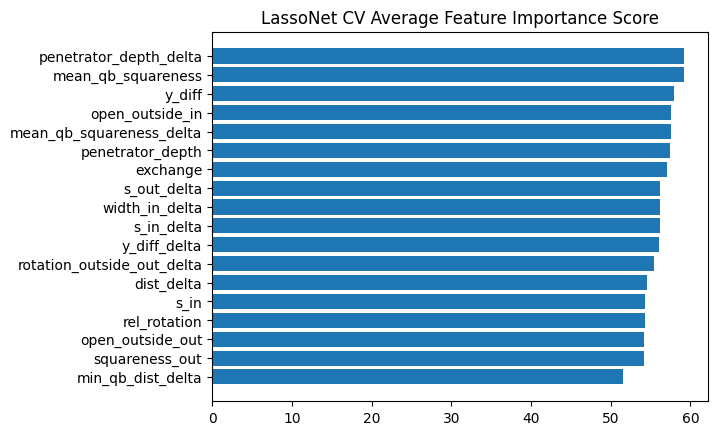

In [10]:
top_features_sorted = lncv_bf.get_top_n_features(n=len(best_features), return_scores = True).sort_values(ascending = True)
top_features_sorted.to_csv('../../data/ln_best_feat_imp.csv')
index = np.arange(0,len(top_features_sorted))
#plt.figure(figsize = (8,8))
plt.barh(index, top_features_sorted)
labels = top_features_sorted.index.tolist()
plt.gca().set_yticks(index)
plt.gca().set_yticklabels(labels)
plt.title("LassoNet CV Average Feature Importance Score")
plt.savefig(os.path.join(plots_dir, 'feat_importance_best_lncv.png'), bbox_inches = 'tight')